In [2]:
# 自然语言编码转换
import codecs
import functools
import random
# zip压缩与解压缩
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="1"
import time
import zipfile
import readdataOneModel as rd
from vocab import Vocab
from tree import Tree
import numpy as np
import pickle
import tensorflow as tf
import tensorflow_fold as td
import sys
from dbOneModel import select
from sklearn.utils import shuffle
#sys.setrecursionlimit(10000000)
data_dir = 'data/'

In [6]:
# read the pretrain model and get its params
reader = tf.train.NewCheckpointReader('49model/Zhao.class_model-49')  
var_to_shape_map = reader.get_variable_to_shape_map()  
for key in var_to_shape_map:  
    print("tensor_name: ", key)  
    #print(reader.get_tensor(key)) # Remove this is you want to print only variable names 
print(len(var_to_shape_map))

('tensor_name: ', 'word_embedding/weights/Adagrad')
('tensor_name: ', 'tree_lstm6/fully_connected/weights')
('tensor_name: ', 'tree_lstm5/fully_connected/biases/Adagrad')
('tensor_name: ', 'tree_lstm2/fully_connected/weights')
('tensor_name: ', 'tree_lstm3/fully_connected/biases/Adagrad')
('tensor_name: ', 'tree_lstm1/fully_connected/biases/Adagrad')
('tensor_name: ', 'tree_lstm4/fully_connected/weights')
('tensor_name: ', 'tree_lstm5/fully_connected/weights/Adagrad')
('tensor_name: ', 'tree_lstm3/fully_connected/biases')
('tensor_name: ', 'output_layer/weights')
('tensor_name: ', 'tree_lstm6/fully_connected/biases')
('tensor_name: ', 'word_embedding/weights')
('tensor_name: ', 'tree_lstm1/fully_connected/weights')
('tensor_name: ', 'tree_lstm6/fully_connected/biases/Adagrad')
('tensor_name: ', 'tree_lstm5/fully_connected/weights')
('tensor_name: ', 'tree_lstm4/fully_connected/weights/Adagrad')
('tensor_name: ', 'tree_lstm4/fully_connected/biases/Adagrad')
('tensor_name: ', 'tree_lstm2

In [10]:
# save the params into a .npy file
treelstmnet = {}
treelstmlayers = ['word_embedding','tree_lstm1','tree_lstm2','tree_lstm3','tree_lstm4','tree_lstm5','tree_lstm6','output_layer']
add_info = ['weight','biases']

treelstmnet = {'word_embedding':[[]],'tree_lstm1':[[],[]],'tree_lstm2':[[],[]],'tree_lstm3':[[],[]],
               'tree_lstm4':[[],[]],'tree_lstm5':[[],[]],'tree_lstm6':[[],[]],'output_layer':[[],[]]}

for key in var_to_shape_map:
    
    str_name = key
    
    if str_name.find('Adagrad') > -1:
        continue
    
    print('tensor name: ',str_name)
    
    if str_name.find('/') > -1:
        splitnames = str_name.split('/')
        layer_name = splitnames[0]
        layer_info = splitnames[-1]
    else:
        layer_name = str_name
        layer_info = None
        
    if layer_info == 'weights':
        treelstmnet[layer_name][0] = reader.get_tensor(key)
        treelstmnet[layer_name][0] = np.squeeze(np.stack(treelstmnet[layer_name][0]))
    elif layer_info == 'biases':
        treelstmnet[layer_name][1] = reader.get_tensor(key)
        treelstmnet[layer_name][1] = np.squeeze(np.stack(treelstmnet[layer_name][1]))
    else:
        treelstmnet[layer_name] = reader.get_tensor(key)
        treelstmnet[layer_name] = np.squeeze(np.stack(treelstmnet[layer_name]))


np.save('treelstmnet.npy',treelstmnet)
print('Complete!')

('tensor name: ', 'tree_lstm6/fully_connected/weights')
('tensor name: ', 'tree_lstm2/fully_connected/weights')
('tensor name: ', 'tree_lstm4/fully_connected/weights')
('tensor name: ', 'tree_lstm3/fully_connected/biases')
('tensor name: ', 'output_layer/weights')
('tensor name: ', 'tree_lstm6/fully_connected/biases')
('tensor name: ', 'word_embedding/weights')
('tensor name: ', 'tree_lstm1/fully_connected/weights')
('tensor name: ', 'tree_lstm5/fully_connected/weights')
('tensor name: ', 'tree_lstm1/fully_connected/biases')
('tensor name: ', 'tree_lstm3/fully_connected/weights')
('tensor name: ', 'tree_lstm4/fully_connected/biases')
('tensor name: ', 'output_layer/bias')
('tensor name: ', 'tree_lstm2/fully_connected/biases')
('tensor name: ', 'tree_lstm5/fully_connected/biases')
Complete!


In [14]:
type(reader.get_tensor('tree_lstm5/fully_connected/biases'))

numpy.ndarray

In [2]:
# 队列读取tfrecord文件中的树结构
def read_and_decode(filename):
    filename_queue = tf.train.string_input_producer([filename])
    reader = tf.TFRecordReader()
    _, serialized_example = reader.read(filename_queue)
    features = tf.parse_single_example(serialized_example, features={'tree': tf.FixedLenFeature([], tf.string),})
    tree = features['tree']
    return tree

In [3]:
# 读取data数据
path = os.path.join(data_dir,'/home/inspur/Desktop/newData/newTrainingdataset/classdataset/tree1_2.tfrecords')
data_set = []
count = 0
total = 0
predictions = []
for serialized_example in tf.python_io.tf_record_iterator(path):
    total += 1
    if total > 0:
        example = tf.train.Example()
        example.ParseFromString(serialized_example)
        tree = example.features.feature['tree'].bytes_list.value
        data = pickle.loads(tree[0])
        if data.size() > 90 or data.get_child_num(data) > 0:
            continue
        
        '''
        如果是判断method具体名称，需要加上下面两句
        predictions.append(data.gold_label)
        data.gold_label = 1        
        '''
        
        data_set.append(data)
        count+=1
        if count%100 == 0:
            print(count)
        if count%300 == 0:
            break

NotFoundError: /home/inspur/Desktop/newData/newTrainingdataset/classdataset/tree1_2.tfrecords

In [4]:
#print len(data_set)
#vocab = Vocab('/home/inspur/Desktop/newData/newVocabulary/vocabulary(large).txt')
vocab = Vocab('../oneModelVocabulary/vocabulary.txt')
vocab.add('<unk>')

apiName = Vocab('../oneModelVocabulary/APIClassName.txt')

vocabVariable = Vocab('gloveVocab.txt')
# add two word
vocabVariable.add('<unk>')
vocabVariable.add('<pad>')
#vocab2 = Vocab('/home/inspur/Desktop/newData/newVocabulary/APIClassName(large).txt')
#embedding_path = os.path.join(data_dir,'vectors.txt')

400002

In [5]:
def fun(x,y):
    if x.depth() > y.depth():
        return 1
    if x.depth() == y.depth():
        return 0
    else:
        return -1     

In [6]:
def load_embeddings(embedding_path):
    print("Loading word embeding from %s" % embedding_path)
    weight_vectors = []
    #word_idx = {}
    with codecs.open(embedding_path, encoding='utf-8') as f:
        # 读取embed文件，建立矩阵和字典
        for i,line in enumerate(f):
            #print(line)
            word, vec = line.split(u' ',1)
            #word_idx[word] = len(weight_vectors)
            weight_vectors.append(np.array(vec.split(), dtype=np.float32))
            if i%10000 == 0:
                print ("%d lines have completed" % i)
    # 针对字典中未查询到的词，添加对应的随机向量
    weight_vectors.append(np.random.uniform(-0.05,0.05,weight_vectors[0].shape).astype(np.float32))
    return np.stack(weight_vectors)

In [7]:
# 这里初始化embed层矩阵
with open('12-25-embedding.txt','rb') as f:
    weight_matrix = pickle.load(f)
temp = weight_matrix.tolist()
temp.append(np.random.uniform(-0.05,0.05,(50,)).astype(np.float32))
weight_matrix = np.stack(temp).astype(np.float32) 
temp = []
print(weight_matrix.shape)


with open('glove_embedding.txt','rb') as f:
    variable_matrix = pickle.load(f)

temp = variable_matrix.tolist()
temp.append(np.random.uniform(-0.05,0.05,(50,)).astype(np.float32))
temp.append(np.random.uniform(-0.05,0.05,(50,)).astype(np.float32))
variable_matrix = np.stack(temp).astype(np.float32) 
temp = []

print(variable_matrix.shape)

(14540, 50)
(400002, 50)


In [8]:
def data_input(data_set,train,dev):
    train_data = data_set[:int(len(data_set)*train)]
    dev_data = data_set[int(len(data_set)*train):int(len(data_set)*(train+dev))]
    test_data = data_set[int(len(data_set)*(train+dev)):]
    return train_data,dev_data,test_data

In [9]:
def block_info(block):
    print("%s: %s -> %s" % (block,block.input_type,block.output_type))

In [10]:
# 改写原始LSTM结构，使其支持动态数量的state输入
class ChildSumTreeLSTM(tf.contrib.rnn.BasicLSTMCell):
    
    def __init__(self,mem_dim,keep_prob = 1.0):
        super(ChildSumTreeLSTM,self).__init__(mem_dim)
        #self.in_dim = in_dim
        self.mem_dim = mem_dim
        #self.out_dim = out_dim
        self._keep_prob = keep_prob
    
    def __call__(self,inputs,state,scope=None):
        with tf.variable_scope(scope or type(self).__name__):
            child_state = state
            #print "############################################"
            #print "len(child_state):",len(child_state)
            #print "state : ",child_state
            # 下面分步骤执行tf.concat([inputs,h0,h1,h2...hn],1)
            com = [hi for ci,hi in child_state]
            com.insert(0,inputs)
            #mem = tf.concat(com,1)
            #print("mem.shape: ",mem.get_shape())
            
            concat = tf.contrib.layers.linear(tf.concat(com,1)
                                              ,(len(child_state)+3)*self._num_units)
            splits = tf.split(value=concat,num_or_size_splits=(len(child_state)+3),axis=1)
            i = splits[0]
            j = splits[1]
            o = splits[-1]
            f = splits[2:-1]
            # j是输出门的值，需要执行tanh函数变化，此时self._activation是tanh
            j = self._activation(j)
            if not isinstance(self._keep_prob, float) or self._keep_prob < 1:
                j = tf.nn.dropout(j,self._keep_prob)
            #print("f0: ",f[0])
            one = child_state[0][0]*tf.sigmoid(f[0]+self._forget_bias)
            #print "f-len: ",len(f)
            for k in range(len(f)):
                # 0代表c
                one += child_state[k][0]*tf.sigmoid(f[k]+self._forget_bias)
            
            new_c = one+tf.sigmoid(i)*j
            
            new_h = self._activation(new_c)*tf.sigmoid(o)
            
            new_state = tf.contrib.rnn.LSTMStateTuple(new_c,new_h)
            
        return new_h, new_state

In [11]:
def create_embedding(weight_matrix):
    return td.Embedding(*weight_matrix.shape, initializer=weight_matrix, name='word_embedding')

In [12]:
def create_model(word_embedding,NUM_CLASS,lstm_num_units=300,keep_prob=1,vocab=vocab):
    
    # 建立treelstm隐藏层,这里的lstm单元有300维
    tree_lstm1 = td.ScopedLayer(
            tf.contrib.rnn.DropoutWrapper(
                ChildSumTreeLSTM(lstm_num_units, keep_prob=keep_prob),
                input_keep_prob=keep_prob,output_keep_prob=keep_prob),
            name_or_scope='tree_lstm1')

    tree_lstm2 = td.ScopedLayer(
            tf.contrib.rnn.DropoutWrapper(
                ChildSumTreeLSTM(lstm_num_units, keep_prob=keep_prob),
                input_keep_prob=keep_prob,output_keep_prob=keep_prob),
            name_or_scope='tree_lstm2')

    tree_lstm3 = td.ScopedLayer(
            tf.contrib.rnn.DropoutWrapper(
                ChildSumTreeLSTM(lstm_num_units, keep_prob=keep_prob),
                input_keep_prob=keep_prob,output_keep_prob=keep_prob),
            name_or_scope='tree_lstm3')

    tree_lstm4 = td.ScopedLayer(
            tf.contrib.rnn.DropoutWrapper(
                ChildSumTreeLSTM(lstm_num_units, keep_prob=keep_prob),
                input_keep_prob=keep_prob,output_keep_prob=keep_prob),
            name_or_scope='tree_lstm4')

    tree_lstm5 = td.ScopedLayer(
            tf.contrib.rnn.DropoutWrapper(
                ChildSumTreeLSTM(lstm_num_units, keep_prob=keep_prob),
                input_keep_prob=keep_prob,output_keep_prob=keep_prob),
            name_or_scope='tree_lstm5')
    tree_lstm6 = td.ScopedLayer(
            tf.contrib.rnn.DropoutWrapper(
                ChildSumTreeLSTM(lstm_num_units, keep_prob=keep_prob),
                input_keep_prob=keep_prob,output_keep_prob=keep_prob),
            name_or_scope='tree_lstm6')

    # 建立输出层,NUM_CLASS决定输出类别数
    #output_layer = td.FC(NUM_CLASS, activation=None, name='output_layer')   
    
    sub_cut = td.ForwardDeclaration(name="sub_cut")
    
    def lookup_word(word):
        return vocab.index(word)
    
    # 计算tree-lstm中(logit,state)的函数
    # 传入的参数格式是[root.vector,[child_1,child_2,child_3...]] ---- 父亲节点
    # 另一种参数格式是[root.vector] ---- 叶子节点
    def logit_and_state():

        # 获得树结构的长度，1代表叶子节点，大于1则说明是父节点
        def get_length(root):
            length = len(root)
            if length > 1:
                length = 1 + len(root[1])
            #print 'The length: %d' % length
            return length

        word2vec = td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
        zeros_state = td.Zeros((tree_lstm1.state_size,)*2,name='zeros_state')        
        word_case = td.AllOf(word2vec,zeros_state,name='word_case') >> tree_lstm2

        # 声明迭代的block，每一个sub_cut()生成一个新的block并传入孩子节点
        pair2vec1 = (sub_cut(),) 
        pair2vec2 = (sub_cut(),sub_cut())
        pair2vec3 = (sub_cut(),sub_cut(),sub_cut())
        pair2vec4 = (sub_cut(),sub_cut(),sub_cut(),sub_cut())
        pair2vec5 = (sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut())
        pair2vec6 = (sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut())
        #pair2vec7 = (sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut()) 
        #pair2vec8 = (sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut()) 
        #pair2vec9 = (sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut())
        #pair2vec10 = (sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut()) 
        #pair2vec11 = (sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),
        #              sub_cut()) 
        #pair2vec12 = (sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),
        #              sub_cut(),sub_cut())   
        #pair2vec13 = (sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),
        #              sub_cut(),sub_cut(),sub_cut())
        #pair2vec14 = (sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),
        #              sub_cut(),sub_cut(),sub_cut(),sub_cut())
        #pair2vec15 = (sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut(),
        #              sub_cut(),sub_cut(),sub_cut(),sub_cut(),sub_cut())   
        # 获取当前节点vector，并且把孩子节点传入sub_cut()
        pair_case1 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
                              ,td.GetItem(1)>>pair2vec1,name='pair_case1') >> tree_lstm1
        pair_case2 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
                              ,td.GetItem(1)>>pair2vec2,name='pair_case2') >> tree_lstm2  
        pair_case3 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
                              ,td.GetItem(1)>>pair2vec3,name='pair_case3') >> tree_lstm3
        pair_case4 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
                              ,td.GetItem(1)>>pair2vec4,name='pair_case4') >> tree_lstm4
        pair_case5 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
                              ,td.GetItem(1)>>pair2vec5,name='pair_case5') >> tree_lstm5
        pair_case6 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
                              ,td.GetItem(1)>>pair2vec6,name='pair_case6') >> tree_lstm6
        #pair_case7 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
        #                      ,td.GetItem(1)>>pair2vec7,name='pair_case7') >> tree_lstm7  
        #pair_case8 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
        #                      ,td.GetItem(1)>>pair2vec8,name='pair_case8') >> tree_lstm8
        #pair_case9 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
        #                      ,td.GetItem(1)>>pair2vec9,name='pair_case9') >> tree_lstm9
        #pair_case10 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
        #                      ,td.GetItem(1)>>pair2vec10,name='pair_case10') >> tree_lstm10
        #pair_case11 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
        #                      ,td.GetItem(1)>>pair2vec11,name='pair_case11') >> tree_lstm11
        #pair_case12 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
        #                      ,td.GetItem(1)>>pair2vec12,name='pair_case12') >> tree_lstm12  
        #pair_case13 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
        #                      ,td.GetItem(1)>>pair2vec13,name='pair_case13') >> tree_lstm13
        #pair_case14 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
        #                      ,td.GetItem(1)>>pair2vec14,name='pair_case14') >> tree_lstm14
        #pair_case15 = td.AllOf(td.GetItem(0) >> td.InputTransform(lookup_word) >> td.Scalar('int32') >> word_embedding
        #                      ,td.GetItem(1)>>pair2vec15,name='pair_case15') >> tree_lstm15

        # 树结构的判断语句，根据传入的树结构(父节点/叶子节点)执行对应的递归block
        ans = td.OneOf(get_length,[(1,word_case),(2,pair_case1),(3,pair_case2),
                                   (4,pair_case3),(5,pair_case4),(6,pair_case5),
                                   (7,pair_case6)],name='ans')

        # 最终输出是(logits,states)
        last = ans >> (td.Identity(),td.Identity())
        return last

    # 定义模型以及递归函数
    model = emb_tree(logit_and_state(),is_root=True)
    sub_cut.resolve_to(emb_tree(logit_and_state(),is_root=False))

#    print "mode #############################################"
#    block_info(model)
#    block_info(sub_cut)
    # 想要显示这里就需要加上print
    print("Create completed!")
    
    
    compiler = td.Compiler.create(model)
#    print('input type: %s' % model.input_type)
#    print('output type: %s' % model.output_type)
    
    metrics = {k: tf.reduce_mean(v) for k,v in compiler.metric_tensors.items()}
    metrics
    
    return compiler,metrics




In [14]:
# 递归执行函数，model和递归sub_cut()均会编译这一部分，is_root规定了该点是否是根节点
def emb_tree(logit_and_state,is_root):
    # 判断为根节点时会分离出label，之后的递归会设定为非根节点而执行else语句
    if is_root == True:
        return td.InputTransform(cut_tree_and_get_label) >> (td.Scalar('int32'),logit_and_state) >> addmetric()
    else:
        return td.InputTransform(cut_tree) >> logit_and_state >> addmetric2()
# 对非根节点的节点裁剪，输出格式为[[tree.vector],[child_1,child_2...]] ---- 父节点
# 如果该节点是叶子节点，输出格式为[[tree.vector]] ---- 叶子节点
def cut_tree(tree):
    current = [tree.word]
    if (tree.num_children) > 0:
        current.append(tree.children)
    #print "current: ",current
    return current

# 对有label的数据进行裁剪，输出格式为(label,[tree.vector,[child_1,child_2...]])
def cut_tree_and_get_label(label_and_tree):
    #label = label_and_tree[0]
    tree = label_and_tree
    label = tree.gold_label
    current = [tree.word]
    if(tree.num_children) > 0:
        current.append(tree.children)
    #print 'The label: %d, The current: %s' % (label,current)
    return label,current

# 这里是对根节点的数据计算，包括了传递state和loss函数的统计
def addmetric():
    c = td.Composition()
    with c.scope():
        # 这里input是一个(label,(logit,state))格式的输入
        labels = c.input[0]
        logits = td.GetItem(0).reads(c.input[1])
        state = td.GetItem(1).reads(c.input[1])
        
        # 计算loss函数
        loss = td.Function(tf_node_loss)
        td.Metric('root_loss').reads(loss.reads(logits,labels))
        
        # 计算击中率(fine-grained hit)
        hits = td.Function(tf_fine_grained_hits)
        td.Metric('root_hits').reads(hits.reads(logits,labels))
        
        # 这里输出分类logits和state
        c.output.reads(loss,hits,logits,state)
    return c       

# 这里只传递计算出来的孩子state
def addmetric2():
    c = td.Composition()
    with c.scope():
        #logit = td.GetItem(0).reads(c.input)
        state = td.GetItem(1).reads(c.input)
        
        c.output.reads(state)
    return c



In [15]:
# 对预测结果和实际结果计算cross_entropy
def tf_node_loss(logits, labels):
    #labels_one_hot = tf.reshape(labels,logits.get_shape())
    return tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits,labels=labels)

# 对预测结果取整计算击中率(正确为1，错误为0)
def tf_fine_grained_hits(logits, labels):
    # 找到分类中类别最大的，和label对比，计算击中率，类别以0起始
    prediction = tf.cast(tf.argmax(logits,1),tf.int32)
#    labels_oneof_to_one = tf.cast(tf.argmax(labels,1),tf.int32)
    return tf.cast(tf.equal(prediction, labels),tf.float64)

In [16]:
learning_rate = 0.05
keep_prob_now = 0.75
batch_size = 128
epoch = 10
num_gpus = 1
embedding_learning_rate_factor = 0.1



In [17]:
def train_step(epo,num,batch,losses):
    start = time.time()
    global global_epo
    global_epo += 1
    #print(global_epo)
    train_feed_dict[compiler.loom_input_tensor] = batch
    train_feed_dict[variableBatchsize] = len(batch)
    _,batch_loss = sess.run([train,loss],train_feed_dict)
    if global_epo % 1000 == 1:
        losses.append(batch_loss)
    end = time.time()
    print('batch %d---%d, batch_loss: %.3e, time: %f' % (epo+1, num, batch_loss, end-start))
    #if num%200 == 0:
    #    checkpoint_path = saver.save(sess, save_path, global_step = epo)
    #    print('model saved in file: %s' % checkpoint_path)        
    return batch_loss

# 统计该epoch下每一个batch的loss之和
def train_epoch(epo,train_set,losses):
    return sum(train_step(epo,num,batch,losses) for num,batch in enumerate(td.group_by_batches(train_set,batch_size),1))

In [18]:
def dev_step(batch):
    #dev_feed_dict[compiler.loom_input_tensor] = batch
    #print batch
    model_output = sess.run(compiler.output_tensors,compiler.build_feed_dict(batch))
    dev_loss_batch = model_output[0]
    dev_hits_batch = model_output[1]
    #print(dev_loss_batch,dev_hits_batch)
    return dev_loss_batch,dev_hits_batch

def dev_eval(epoch,train_loss,dev_set):
    batches = []
    for i in range(len(dev_set)//batch_size):
        start = i*batch_size
        end = min(len(dev_set),(i+1)*batch_size)
        batches.append(dev_set[start:end])
    print ('len dev:',len(batches))
    dev_loss = 0.0
    dev_hits = 0.0
    num_hits = 0
    for batch in batches:
        dev_loss_batch,dev_hits_batch = dev_step(batch)
        dev_loss += sum(dev_loss_batch)
        num_hits += len(dev_hits_batch)
        dev_hits += sum(dev_hits_batch)       
    dev_hits_value = dev_hits/num_hits
    print ('epoch: %4d, train_loss: %.3e, dev_loss_avg: %.3e, dev_accuracy: %.2f' 
    % (epoch, train_loss, dev_loss, dev_hits_value))
    return dev_hits_value

In [19]:
def test_data(batch):
    model_output = sess.run(compiler.output_tensors,compiler.build_feed_dict(batch))
    logits = model_output[2]
    #softmax = sess.run(tf.nn.softmax(logits))
    top_1 = sess.run(tf.nn.top_k(logits,10))
    # top_10_index应该是一个列表
    top_1_index = top_1.indices
    #top_1_prob = top_1.values
    for i in xrange(30):
        print (top_1_index[i],batch[i].gold_label)
    #print(top_1_index)   

In [20]:
tf.reset_default_graph()
keep_prob_ph = tf.placeholder_with_default(1.0,[])
best_accuracy = 0.0

print('Create the model')
    
train_feed_dict = {keep_prob_ph:keep_prob_now}
word_embedding = create_embedding(weight_matrix=weight_matrix)
compiler, metrics = create_model(word_embedding=word_embedding,NUM_CLASS=14537,lstm_num_units=300,keep_prob=keep_prob_now,vocab=vocab)

encoderoutput = compiler.output_tensors[2]

# variable network
variable_inputs = tf.placeholder(tf.int32,[None,10])
variable_embed_table = tf.Variable(initial_value=variable_matrix*0.05)
# this batchsize need to be a given value
variableBatchsize = tf.placeholder(tf.int32,None,name='variablebatchsize')
variableEmbed = tf.nn.embedding_lookup(variable_embed_table,variable_inputs)

transpose = tf.reshape(variableEmbed,[-1,50])

variable_logits = tf.layers.dense(transpose,10)

# let the 10 word into an array
variable_logits = tf.reshape(variable_logits,[variableBatchsize,100])

contextvector = tf.concat([encoderoutput,variable_logits],axis=1)
logits = tf.layers.dense(contextvector,14537,name='logits')


labels = tf.placeholder(tf.int32,[None],name='labels')
loss = tf.reduce_mean(tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits,labels=labels))

opt = tf.train.AdagradOptimizer(learning_rate=learning_rate)
grads_and_vars = opt.compute_gradients(loss)

capped_gradients = [(tf.clip_by_value(grad,-1.,1.),var) for grad,var in grads_and_vars if grad is not None]

# 训练embedding层时，弱化bp时候的梯度
found = 0
for i,(grad,var) in enumerate(capped_gradients):
    if var == word_embedding.weights or var == variable_embed_table:
        found+=1
        grad = tf.scalar_mul(embedding_learning_rate_factor,grad)
        capped_gradients[i] = (grad,var)
assert found == 2 

train = opt.apply_gradients(capped_gradients)
saver = tf.train.Saver()

Create the model
Create completed!


/usr/local/lib/python2.7/dist-packages/tensorflow/python/ops/gradients_impl.py:91: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


In [21]:
encoderoutput

<tf.Tensor 'output_gathers/float32_300__TensorFlowFoldOutputTag_2:0' shape=(?, 300) dtype=float32>

In [22]:
capped_gradients

[(<tf.Tensor 'mul:0' shape=(?, ?) dtype=float32>,
  <tensorflow.python.ops.variables.Variable at 0x7f8ba05ffa10>),
 (<tf.Tensor 'clip_by_value_1:0' shape=(650, 1500) dtype=float32>,
  <tensorflow.python.ops.variables.Variable at 0x7f8ba0584c10>),
 (<tf.Tensor 'clip_by_value_2:0' shape=(1500,) dtype=float32>,
  <tensorflow.python.ops.variables.Variable at 0x7f8ba0584c50>),
 (<tf.Tensor 'clip_by_value_3:0' shape=(950, 1800) dtype=float32>,
  <tensorflow.python.ops.variables.Variable at 0x7f8ba0434ed0>),
 (<tf.Tensor 'clip_by_value_4:0' shape=(1800,) dtype=float32>,
  <tensorflow.python.ops.variables.Variable at 0x7f8ba0434f10>),
 (<tf.Tensor 'clip_by_value_5:0' shape=(1250, 2100) dtype=float32>,
  <tensorflow.python.ops.variables.Variable at 0x7f8ba0297d50>),
 (<tf.Tensor 'clip_by_value_6:0' shape=(2100,) dtype=float32>,
  <tensorflow.python.ops.variables.Variable at 0x7f8ba0297d90>),
 (<tf.Tensor 'clip_by_value_7:0' shape=(1550, 2400) dtype=float32>,
  <tensorflow.python.ops.variables.V

In [23]:
[v.name for v in tf.trainable_variables()]

[u'word_embedding/weights:0',
 u'tree_lstm2/fully_connected/weights:0',
 u'tree_lstm2/fully_connected/biases:0',
 u'tree_lstm3/fully_connected/weights:0',
 u'tree_lstm3/fully_connected/biases:0',
 u'tree_lstm4/fully_connected/weights:0',
 u'tree_lstm4/fully_connected/biases:0',
 u'tree_lstm5/fully_connected/weights:0',
 u'tree_lstm5/fully_connected/biases:0',
 u'tree_lstm6/fully_connected/weights:0',
 u'tree_lstm6/fully_connected/biases:0',
 u'tree_lstm1/fully_connected/weights:0',
 u'tree_lstm1/fully_connected/biases:0',
 u'Variable:0',
 u'dense/kernel:0',
 u'dense/bias:0',
 u'logits/kernel:0',
 u'logits/bias:0']

In [24]:
def batch_major(inputs):
    '''
    add unk for unknown word 
    add pad for padding
    '''
    for i in range(len(inputs)):
        if len(inputs[i]) < 10:
            for j in range(len(inputs[i])):
                if inputs[i][j] == '':
                    inputs[i][j] = '<unk>'
            inputs[i] = inputs[i] + ['<pad>'] * (10 - len(inputs[i]))
    
        inputs[i] = [vocabVariable.index(word) for word in inputs[i]]
    
    return inputs

In [25]:
def getbatch(traindata,datalabel,variables,batchsize):
    totalbatch = len(traindata)/batchsize
    if len(traindata)%batchsize > 0:
        totalbatch += 1
    for i in range(totalbatch):
        temp = traindata[i*batchsize:(i+1)*batchsize]
        templabel = datalabel[i*batchsize:(i+1)*batchsize]
        tempvairable = variables[i*batchsize:(i+1)*batchsize]
        yield temp,templabel,tempvairable

In [26]:
#best_accuracy = 0.0
save_path = 'data/trainedVariable/Zhao.treelstmVariable.model'
global_epo = 0
with tf.Session(config=tf.ConfigProto(allow_soft_placement=True,log_device_placement=True)) as sess:

    losses = []
    print('initializing tensorflow')
    sess.run(tf.global_variables_initializer())
    
    with compiler.multiprocessing_pool():
        print('training the model')
        # 设置epoch数量
        globalnum = 0
        for epo in range(10):
            # 这是对数据库的分片
            for num in range(5):
                print('read data_set_%s' % (num+1))
                read_start = time.time()
                numOfEpoch = 0
                # 设置读取数据的起点和长度
                dataset_temp,dataset_label,variable = select(num*600000,600000)        
                
                dataset_temp,dataset_label,variable = shuffle(dataset_temp,dataset_label,variable)
                
                print('completed read data_set_%s, time: %.4f' % (num+1,time.time()-read_start))

                start0 = time.time()
                
                for databatch,batchlabel,batchvariables in getbatch(dataset_temp,dataset_label,variable,batch_size):
                    
                    start = time.time()
                    batchvariables = batch_major(batchvariables)
                    
                    feed_ = compiler.build_feed_dict(databatch)
                    train_feed_dict[compiler.loom_input_tensor] = feed_.values()[0]
                    train_feed_dict[labels] = batchlabel
                    train_feed_dict[variable_inputs] = batchvariables
                    train_feed_dict[variableBatchsize] = len(databatch)
                    
                    _,pred,batchloss = sess.run([train,logits,loss],train_feed_dict)
                    
                    numOfEpoch += 1
                    globalnum += 1
                    if globalnum % 1000 == 1:
                        losses.append(batchloss)
                    end = time.time()
                    
                    print('batch %d---%d, batch_loss: %.3e, time: %f' % (num+1, numOfEpoch, batchloss, end-start))
                    
                end0 = time.time()
                train_data_epo = []
                dev_data_temp = []
                train_data_epo_for_shuffled = None
                print('epo:%4d--%d, time:%f' % (epo+1,num+1,end0-start0))
                
            checkpoint_path = saver.save(sess, save_path, global_step = epo)
            print('model saved in file: %s' % checkpoint_path) 
            

initializing tensorflow
training the model
read data_set_1
completed read data_set_1, time: 336.0085
batch 1---1, batch_loss: 9.583e+00, time: 2.613285
batch 1---2, batch_loss: 9.569e+00, time: 0.967819
batch 1---3, batch_loss: 9.555e+00, time: 1.181341
batch 1---4, batch_loss: 9.555e+00, time: 0.781503
batch 1---5, batch_loss: 9.531e+00, time: 1.209122
batch 1---6, batch_loss: 9.505e+00, time: 0.627546
batch 1---7, batch_loss: 9.493e+00, time: 0.978671
batch 1---8, batch_loss: 9.450e+00, time: 0.848975
batch 1---9, batch_loss: 9.463e+00, time: 0.955910
batch 1---10, batch_loss: 9.453e+00, time: 1.434472
batch 1---11, batch_loss: 9.373e+00, time: 0.935264
batch 1---12, batch_loss: 9.326e+00, time: 0.899488
batch 1---13, batch_loss: 9.288e+00, time: 1.309201
batch 1---14, batch_loss: 9.239e+00, time: 0.594828
batch 1---15, batch_loss: 9.211e+00, time: 0.933299
batch 1---16, batch_loss: 9.038e+00, time: 1.436758
batch 1---17, batch_loss: 8.773e+00, time: 1.335682
batch 1---18, batch_loss

batch 1---156, batch_loss: 6.126e+00, time: 0.984733
batch 1---157, batch_loss: 5.744e+00, time: 0.974746
batch 1---158, batch_loss: 6.223e+00, time: 1.582384
batch 1---159, batch_loss: 5.446e+00, time: 1.027471
batch 1---160, batch_loss: 5.862e+00, time: 1.107074
batch 1---161, batch_loss: 5.892e+00, time: 0.926134
batch 1---162, batch_loss: 6.192e+00, time: 1.470075
batch 1---163, batch_loss: 5.680e+00, time: 0.728307
batch 1---164, batch_loss: 5.971e+00, time: 1.157195
batch 1---165, batch_loss: 6.007e+00, time: 1.266739
batch 1---166, batch_loss: 5.930e+00, time: 0.985207
batch 1---167, batch_loss: 5.852e+00, time: 1.181022
batch 1---168, batch_loss: 5.874e+00, time: 1.237836
batch 1---169, batch_loss: 5.928e+00, time: 0.751096
batch 1---170, batch_loss: 6.407e+00, time: 1.333496
batch 1---171, batch_loss: 5.902e+00, time: 1.406977
batch 1---172, batch_loss: 5.859e+00, time: 1.120647
batch 1---173, batch_loss: 5.650e+00, time: 1.279804
batch 1---174, batch_loss: 5.804e+00, time: 1.

batch 1---311, batch_loss: 6.062e+00, time: 0.885151
batch 1---312, batch_loss: 5.505e+00, time: 1.441025
batch 1---313, batch_loss: 5.447e+00, time: 0.837112
batch 1---314, batch_loss: 5.345e+00, time: 1.059045
batch 1---315, batch_loss: 5.586e+00, time: 0.736451
batch 1---316, batch_loss: 5.849e+00, time: 1.068282
batch 1---317, batch_loss: 5.189e+00, time: 1.472976
batch 1---318, batch_loss: 5.883e+00, time: 1.256169
batch 1---319, batch_loss: 5.675e+00, time: 1.312805
batch 1---320, batch_loss: 5.198e+00, time: 1.491204
batch 1---321, batch_loss: 5.434e+00, time: 1.307961
batch 1---322, batch_loss: 5.830e+00, time: 0.851737
batch 1---323, batch_loss: 5.728e+00, time: 1.076165
batch 1---324, batch_loss: 5.656e+00, time: 0.902733
batch 1---325, batch_loss: 5.841e+00, time: 1.014858
batch 1---326, batch_loss: 5.167e+00, time: 1.048419
batch 1---327, batch_loss: 5.462e+00, time: 0.930003
batch 1---328, batch_loss: 5.512e+00, time: 1.068884
batch 1---329, batch_loss: 5.124e+00, time: 1.

batch 1---466, batch_loss: 5.543e+00, time: 1.128570
batch 1---467, batch_loss: 5.185e+00, time: 0.854800
batch 1---468, batch_loss: 5.477e+00, time: 1.126645
batch 1---469, batch_loss: 5.729e+00, time: 0.869273
batch 1---470, batch_loss: 5.544e+00, time: 1.652628
batch 1---471, batch_loss: 5.774e+00, time: 0.987406
batch 1---472, batch_loss: 5.470e+00, time: 1.263054
batch 1---473, batch_loss: 5.324e+00, time: 1.045603
batch 1---474, batch_loss: 5.633e+00, time: 0.806083
batch 1---475, batch_loss: 5.228e+00, time: 0.994596
batch 1---476, batch_loss: 5.671e+00, time: 0.811902
batch 1---477, batch_loss: 5.877e+00, time: 0.668029
batch 1---478, batch_loss: 5.555e+00, time: 0.770044
batch 1---479, batch_loss: 5.467e+00, time: 1.077486
batch 1---480, batch_loss: 5.698e+00, time: 1.436078
batch 1---481, batch_loss: 5.270e+00, time: 1.122768
batch 1---482, batch_loss: 5.360e+00, time: 1.263365
batch 1---483, batch_loss: 5.602e+00, time: 0.875953
batch 1---484, batch_loss: 5.770e+00, time: 1.

batch 1---621, batch_loss: 5.249e+00, time: 0.852123
batch 1---622, batch_loss: 5.370e+00, time: 1.067708
batch 1---623, batch_loss: 5.502e+00, time: 0.831665
batch 1---624, batch_loss: 4.959e+00, time: 1.226691
batch 1---625, batch_loss: 5.578e+00, time: 0.702703
batch 1---626, batch_loss: 5.553e+00, time: 1.151896
batch 1---627, batch_loss: 5.324e+00, time: 0.728836
batch 1---628, batch_loss: 5.068e+00, time: 0.554095
batch 1---629, batch_loss: 5.513e+00, time: 1.433792
batch 1---630, batch_loss: 5.683e+00, time: 2.014314
batch 1---631, batch_loss: 5.485e+00, time: 0.831869
batch 1---632, batch_loss: 5.834e+00, time: 0.797264
batch 1---633, batch_loss: 5.206e+00, time: 1.149843
batch 1---634, batch_loss: 5.127e+00, time: 1.445019
batch 1---635, batch_loss: 5.636e+00, time: 1.066735
batch 1---636, batch_loss: 5.073e+00, time: 1.283824
batch 1---637, batch_loss: 5.239e+00, time: 1.499760
batch 1---638, batch_loss: 5.690e+00, time: 0.972090
batch 1---639, batch_loss: 5.912e+00, time: 1.

batch 1---776, batch_loss: 5.420e+00, time: 1.920797
batch 1---777, batch_loss: 5.016e+00, time: 1.387487
batch 1---778, batch_loss: 5.587e+00, time: 0.775609
batch 1---779, batch_loss: 5.211e+00, time: 1.704163
batch 1---780, batch_loss: 5.775e+00, time: 1.102238
batch 1---781, batch_loss: 5.357e+00, time: 1.235488
batch 1---782, batch_loss: 5.244e+00, time: 0.952709
batch 1---783, batch_loss: 5.329e+00, time: 0.626670
batch 1---784, batch_loss: 5.470e+00, time: 1.671980
batch 1---785, batch_loss: 5.266e+00, time: 1.124609
batch 1---786, batch_loss: 5.070e+00, time: 1.284118
batch 1---787, batch_loss: 5.393e+00, time: 1.155845
batch 1---788, batch_loss: 5.514e+00, time: 1.392135
batch 1---789, batch_loss: 5.577e+00, time: 1.107509
batch 1---790, batch_loss: 5.325e+00, time: 0.796365
batch 1---791, batch_loss: 5.471e+00, time: 1.197595
batch 1---792, batch_loss: 5.094e+00, time: 0.775640
batch 1---793, batch_loss: 5.378e+00, time: 1.241542
batch 1---794, batch_loss: 5.182e+00, time: 1.

batch 1---931, batch_loss: 5.089e+00, time: 0.868879
batch 1---932, batch_loss: 5.399e+00, time: 1.095365
batch 1---933, batch_loss: 5.178e+00, time: 1.275063
batch 1---934, batch_loss: 5.913e+00, time: 1.469694
batch 1---935, batch_loss: 4.810e+00, time: 0.730532
batch 1---936, batch_loss: 5.349e+00, time: 0.777591
batch 1---937, batch_loss: 5.073e+00, time: 0.887692
batch 1---938, batch_loss: 5.568e+00, time: 0.747074
batch 1---939, batch_loss: 5.337e+00, time: 1.123158
batch 1---940, batch_loss: 5.303e+00, time: 0.709668
batch 1---941, batch_loss: 5.481e+00, time: 1.411563
batch 1---942, batch_loss: 5.903e+00, time: 0.868325
batch 1---943, batch_loss: 5.077e+00, time: 0.733046
batch 1---944, batch_loss: 5.533e+00, time: 1.280091
batch 1---945, batch_loss: 5.177e+00, time: 1.553960
batch 1---946, batch_loss: 4.529e+00, time: 1.459283
batch 1---947, batch_loss: 5.581e+00, time: 1.317973
batch 1---948, batch_loss: 5.356e+00, time: 1.040018
batch 1---949, batch_loss: 5.297e+00, time: 1.

batch 1---1084, batch_loss: 4.929e+00, time: 0.849439
batch 1---1085, batch_loss: 5.075e+00, time: 1.053711
batch 1---1086, batch_loss: 5.163e+00, time: 0.939048
batch 1---1087, batch_loss: 5.258e+00, time: 1.062604
batch 1---1088, batch_loss: 5.556e+00, time: 0.885161
batch 1---1089, batch_loss: 5.421e+00, time: 1.065281
batch 1---1090, batch_loss: 5.010e+00, time: 0.571937
batch 1---1091, batch_loss: 5.604e+00, time: 1.548303
batch 1---1092, batch_loss: 4.988e+00, time: 1.557715
batch 1---1093, batch_loss: 5.311e+00, time: 0.949707
batch 1---1094, batch_loss: 5.074e+00, time: 0.691735
batch 1---1095, batch_loss: 5.551e+00, time: 1.204486
batch 1---1096, batch_loss: 4.807e+00, time: 1.506738
batch 1---1097, batch_loss: 5.154e+00, time: 1.387453
batch 1---1098, batch_loss: 4.799e+00, time: 0.766002
batch 1---1099, batch_loss: 5.049e+00, time: 1.130566
batch 1---1100, batch_loss: 5.330e+00, time: 1.024533
batch 1---1101, batch_loss: 5.723e+00, time: 0.974073
batch 1---1102, batch_loss: 

batch 1---1236, batch_loss: 5.506e+00, time: 1.132806
batch 1---1237, batch_loss: 5.456e+00, time: 0.703270
batch 1---1238, batch_loss: 5.294e+00, time: 1.548483
batch 1---1239, batch_loss: 5.379e+00, time: 1.262753
batch 1---1240, batch_loss: 5.344e+00, time: 1.464557
batch 1---1241, batch_loss: 5.359e+00, time: 1.465890
batch 1---1242, batch_loss: 5.041e+00, time: 0.785278
batch 1---1243, batch_loss: 5.522e+00, time: 1.140437
batch 1---1244, batch_loss: 5.087e+00, time: 0.942395
batch 1---1245, batch_loss: 5.268e+00, time: 0.869985
batch 1---1246, batch_loss: 4.608e+00, time: 1.479475
batch 1---1247, batch_loss: 5.415e+00, time: 1.057665
batch 1---1248, batch_loss: 4.812e+00, time: 1.276078
batch 1---1249, batch_loss: 4.980e+00, time: 1.288361
batch 1---1250, batch_loss: 4.732e+00, time: 1.100908
batch 1---1251, batch_loss: 4.861e+00, time: 1.350178
batch 1---1252, batch_loss: 5.248e+00, time: 1.127909
batch 1---1253, batch_loss: 5.245e+00, time: 0.948941
batch 1---1254, batch_loss: 

batch 1---1388, batch_loss: 5.451e+00, time: 1.310260
batch 1---1389, batch_loss: 4.801e+00, time: 1.362914
batch 1---1390, batch_loss: 4.982e+00, time: 1.102301
batch 1---1391, batch_loss: 5.437e+00, time: 1.503401
batch 1---1392, batch_loss: 5.396e+00, time: 0.654568
batch 1---1393, batch_loss: 4.844e+00, time: 1.023962
batch 1---1394, batch_loss: 4.704e+00, time: 1.081231
batch 1---1395, batch_loss: 4.930e+00, time: 0.852836
batch 1---1396, batch_loss: 5.176e+00, time: 0.925035
batch 1---1397, batch_loss: 4.897e+00, time: 1.252408
batch 1---1398, batch_loss: 5.427e+00, time: 1.459294
batch 1---1399, batch_loss: 4.894e+00, time: 1.046827
batch 1---1400, batch_loss: 4.893e+00, time: 0.894761
batch 1---1401, batch_loss: 4.880e+00, time: 1.411612
batch 1---1402, batch_loss: 4.774e+00, time: 0.670373
batch 1---1403, batch_loss: 5.334e+00, time: 0.967277
batch 1---1404, batch_loss: 5.091e+00, time: 1.111200
batch 1---1405, batch_loss: 4.739e+00, time: 0.895854
batch 1---1406, batch_loss: 

batch 1---1540, batch_loss: 4.959e+00, time: 1.020435
batch 1---1541, batch_loss: 5.243e+00, time: 0.915047
batch 1---1542, batch_loss: 5.556e+00, time: 1.639588
batch 1---1543, batch_loss: 4.619e+00, time: 1.760362
batch 1---1544, batch_loss: 5.167e+00, time: 1.454412
batch 1---1545, batch_loss: 5.001e+00, time: 1.365966
batch 1---1546, batch_loss: 5.248e+00, time: 1.223615
batch 1---1547, batch_loss: 4.848e+00, time: 1.245613
batch 1---1548, batch_loss: 5.687e+00, time: 1.127203
batch 1---1549, batch_loss: 4.949e+00, time: 1.521019
batch 1---1550, batch_loss: 5.290e+00, time: 0.940889
batch 1---1551, batch_loss: 5.243e+00, time: 0.853820
batch 1---1552, batch_loss: 4.940e+00, time: 0.871625
batch 1---1553, batch_loss: 5.038e+00, time: 1.075155
batch 1---1554, batch_loss: 5.163e+00, time: 1.119757
batch 1---1555, batch_loss: 4.968e+00, time: 1.412567
batch 1---1556, batch_loss: 4.653e+00, time: 1.301120
batch 1---1557, batch_loss: 5.158e+00, time: 1.273433
batch 1---1558, batch_loss: 

batch 1---1692, batch_loss: 5.448e+00, time: 0.744397
batch 1---1693, batch_loss: 5.607e+00, time: 1.337626
batch 1---1694, batch_loss: 5.174e+00, time: 0.767246
batch 1---1695, batch_loss: 4.960e+00, time: 0.873660
batch 1---1696, batch_loss: 5.409e+00, time: 1.585117
batch 1---1697, batch_loss: 5.051e+00, time: 1.214334
batch 1---1698, batch_loss: 4.927e+00, time: 1.384089
batch 1---1699, batch_loss: 5.185e+00, time: 1.115270
batch 1---1700, batch_loss: 4.923e+00, time: 1.000865
batch 1---1701, batch_loss: 4.858e+00, time: 0.809073
batch 1---1702, batch_loss: 4.803e+00, time: 1.384563
batch 1---1703, batch_loss: 5.090e+00, time: 0.844803
batch 1---1704, batch_loss: 4.871e+00, time: 0.927801
batch 1---1705, batch_loss: 5.080e+00, time: 1.410696
batch 1---1706, batch_loss: 4.929e+00, time: 1.172296
batch 1---1707, batch_loss: 5.185e+00, time: 0.790604
batch 1---1708, batch_loss: 4.714e+00, time: 0.735950
batch 1---1709, batch_loss: 4.682e+00, time: 1.172818
batch 1---1710, batch_loss: 

batch 1---1844, batch_loss: 5.097e+00, time: 0.987996
batch 1---1845, batch_loss: 4.955e+00, time: 1.516092
batch 1---1846, batch_loss: 5.080e+00, time: 1.112935
batch 1---1847, batch_loss: 5.154e+00, time: 1.095787
batch 1---1848, batch_loss: 5.294e+00, time: 1.512703
batch 1---1849, batch_loss: 4.917e+00, time: 1.377520
batch 1---1850, batch_loss: 4.900e+00, time: 1.192983
batch 1---1851, batch_loss: 5.169e+00, time: 1.420287
batch 1---1852, batch_loss: 4.899e+00, time: 1.105583
batch 1---1853, batch_loss: 4.894e+00, time: 0.599318
batch 1---1854, batch_loss: 4.819e+00, time: 1.033779
batch 1---1855, batch_loss: 4.966e+00, time: 1.031667
batch 1---1856, batch_loss: 4.834e+00, time: 1.308323
batch 1---1857, batch_loss: 4.972e+00, time: 1.173527
batch 1---1858, batch_loss: 5.092e+00, time: 0.808514
batch 1---1859, batch_loss: 4.972e+00, time: 1.239740
batch 1---1860, batch_loss: 4.840e+00, time: 1.134774
batch 1---1861, batch_loss: 5.158e+00, time: 0.819858
batch 1---1862, batch_loss: 

batch 1---1996, batch_loss: 5.069e+00, time: 1.160752
batch 1---1997, batch_loss: 5.691e+00, time: 1.529267
batch 1---1998, batch_loss: 5.148e+00, time: 1.116215
batch 1---1999, batch_loss: 5.168e+00, time: 1.282159
batch 1---2000, batch_loss: 4.846e+00, time: 1.461890
batch 1---2001, batch_loss: 5.075e+00, time: 1.249781
batch 1---2002, batch_loss: 5.525e+00, time: 0.831789
batch 1---2003, batch_loss: 5.132e+00, time: 1.662899
batch 1---2004, batch_loss: 4.787e+00, time: 1.690159
batch 1---2005, batch_loss: 5.151e+00, time: 1.209849
batch 1---2006, batch_loss: 4.970e+00, time: 1.102195
batch 1---2007, batch_loss: 4.780e+00, time: 1.089204
batch 1---2008, batch_loss: 4.640e+00, time: 0.638258
batch 1---2009, batch_loss: 5.722e+00, time: 1.202272
batch 1---2010, batch_loss: 4.877e+00, time: 0.802096
batch 1---2011, batch_loss: 4.687e+00, time: 1.334547
batch 1---2012, batch_loss: 5.384e+00, time: 1.213345
batch 1---2013, batch_loss: 4.979e+00, time: 1.481539
batch 1---2014, batch_loss: 

batch 1---2148, batch_loss: 5.335e+00, time: 1.195814
batch 1---2149, batch_loss: 5.216e+00, time: 0.931310
batch 1---2150, batch_loss: 4.934e+00, time: 1.389298
batch 1---2151, batch_loss: 4.905e+00, time: 0.978522
batch 1---2152, batch_loss: 5.184e+00, time: 0.951977
batch 1---2153, batch_loss: 5.239e+00, time: 0.723432
batch 1---2154, batch_loss: 4.979e+00, time: 1.001271
batch 1---2155, batch_loss: 4.333e+00, time: 1.382351
batch 1---2156, batch_loss: 5.197e+00, time: 0.799146
batch 1---2157, batch_loss: 5.279e+00, time: 1.421391
batch 1---2158, batch_loss: 5.564e+00, time: 1.226450
batch 1---2159, batch_loss: 5.022e+00, time: 1.545149
batch 1---2160, batch_loss: 4.985e+00, time: 0.913050
batch 1---2161, batch_loss: 4.924e+00, time: 0.709024
batch 1---2162, batch_loss: 5.025e+00, time: 1.656959
batch 1---2163, batch_loss: 4.952e+00, time: 1.232298
batch 1---2164, batch_loss: 5.150e+00, time: 1.077856
batch 1---2165, batch_loss: 4.961e+00, time: 1.186500
batch 1---2166, batch_loss: 

batch 1---2300, batch_loss: 5.459e+00, time: 0.745723
batch 1---2301, batch_loss: 5.250e+00, time: 0.878276
batch 1---2302, batch_loss: 4.982e+00, time: 1.580291
batch 1---2303, batch_loss: 5.170e+00, time: 0.864714
batch 1---2304, batch_loss: 5.305e+00, time: 1.403710
batch 1---2305, batch_loss: 5.037e+00, time: 0.875873
batch 1---2306, batch_loss: 4.773e+00, time: 1.227720
batch 1---2307, batch_loss: 5.221e+00, time: 1.343223
batch 1---2308, batch_loss: 5.114e+00, time: 1.137465
batch 1---2309, batch_loss: 5.055e+00, time: 0.779656
batch 1---2310, batch_loss: 5.077e+00, time: 0.905150
batch 1---2311, batch_loss: 5.030e+00, time: 1.053633
batch 1---2312, batch_loss: 5.832e+00, time: 1.094985
batch 1---2313, batch_loss: 4.975e+00, time: 1.273613
batch 1---2314, batch_loss: 4.966e+00, time: 1.438717
batch 1---2315, batch_loss: 5.227e+00, time: 0.555275
batch 1---2316, batch_loss: 4.834e+00, time: 1.055364
batch 1---2317, batch_loss: 4.962e+00, time: 0.967874
batch 1---2318, batch_loss: 

batch 1---2452, batch_loss: 5.189e+00, time: 0.916891
batch 1---2453, batch_loss: 5.039e+00, time: 1.140237
batch 1---2454, batch_loss: 4.879e+00, time: 1.045438
batch 1---2455, batch_loss: 4.740e+00, time: 1.165504
batch 1---2456, batch_loss: 4.570e+00, time: 1.282720
batch 1---2457, batch_loss: 5.158e+00, time: 1.058580
batch 1---2458, batch_loss: 4.907e+00, time: 1.515976
batch 1---2459, batch_loss: 5.223e+00, time: 1.649490
batch 1---2460, batch_loss: 5.238e+00, time: 1.153097
batch 1---2461, batch_loss: 5.091e+00, time: 0.655482
batch 1---2462, batch_loss: 4.923e+00, time: 1.564929
batch 1---2463, batch_loss: 5.251e+00, time: 0.921443
batch 1---2464, batch_loss: 5.071e+00, time: 0.755465
batch 1---2465, batch_loss: 5.008e+00, time: 1.380266
batch 1---2466, batch_loss: 5.004e+00, time: 1.018793
batch 1---2467, batch_loss: 5.229e+00, time: 0.528722
batch 1---2468, batch_loss: 4.874e+00, time: 1.155492
batch 1---2469, batch_loss: 5.406e+00, time: 1.415927
batch 1---2470, batch_loss: 

batch 1---2604, batch_loss: 5.177e+00, time: 0.790053
batch 1---2605, batch_loss: 4.801e+00, time: 1.009267
batch 1---2606, batch_loss: 5.338e+00, time: 1.131534
batch 1---2607, batch_loss: 5.034e+00, time: 1.497708
batch 1---2608, batch_loss: 5.167e+00, time: 1.981938
batch 1---2609, batch_loss: 4.577e+00, time: 0.760232
batch 1---2610, batch_loss: 4.749e+00, time: 0.819554
batch 1---2611, batch_loss: 5.274e+00, time: 1.132553
batch 1---2612, batch_loss: 4.722e+00, time: 1.107029
batch 1---2613, batch_loss: 4.958e+00, time: 0.701794
batch 1---2614, batch_loss: 4.889e+00, time: 1.343547
batch 1---2615, batch_loss: 5.003e+00, time: 1.388126
batch 1---2616, batch_loss: 5.235e+00, time: 1.158460
batch 1---2617, batch_loss: 4.732e+00, time: 0.776754
batch 1---2618, batch_loss: 4.927e+00, time: 1.194001
batch 1---2619, batch_loss: 5.271e+00, time: 0.736295
batch 1---2620, batch_loss: 4.982e+00, time: 1.108330
batch 1---2621, batch_loss: 4.831e+00, time: 0.997747
batch 1---2622, batch_loss: 

batch 1---2756, batch_loss: 4.767e+00, time: 1.038282
batch 1---2757, batch_loss: 5.018e+00, time: 1.447399
batch 1---2758, batch_loss: 5.007e+00, time: 1.130808
batch 1---2759, batch_loss: 4.741e+00, time: 1.471925
batch 1---2760, batch_loss: 5.191e+00, time: 1.578579
batch 1---2761, batch_loss: 4.993e+00, time: 0.809734
batch 1---2762, batch_loss: 5.120e+00, time: 1.280418
batch 1---2763, batch_loss: 5.068e+00, time: 1.130774
batch 1---2764, batch_loss: 5.579e+00, time: 0.786387
batch 1---2765, batch_loss: 4.915e+00, time: 1.018319
batch 1---2766, batch_loss: 4.749e+00, time: 1.371467
batch 1---2767, batch_loss: 4.985e+00, time: 1.203623
batch 1---2768, batch_loss: 5.065e+00, time: 0.773317
batch 1---2769, batch_loss: 4.437e+00, time: 0.759763
batch 1---2770, batch_loss: 5.253e+00, time: 1.457743
batch 1---2771, batch_loss: 5.039e+00, time: 1.410062
batch 1---2772, batch_loss: 5.207e+00, time: 0.967264
batch 1---2773, batch_loss: 4.791e+00, time: 0.828559
batch 1---2774, batch_loss: 

batch 1---2908, batch_loss: 4.996e+00, time: 1.537331
batch 1---2909, batch_loss: 5.609e+00, time: 1.180275
batch 1---2910, batch_loss: 4.926e+00, time: 1.181981
batch 1---2911, batch_loss: 4.844e+00, time: 1.108218
batch 1---2912, batch_loss: 5.097e+00, time: 0.917480
batch 1---2913, batch_loss: 4.800e+00, time: 1.361681
batch 1---2914, batch_loss: 5.093e+00, time: 1.176852
batch 1---2915, batch_loss: 5.179e+00, time: 1.174386
batch 1---2916, batch_loss: 5.417e+00, time: 1.285793
batch 1---2917, batch_loss: 5.305e+00, time: 1.361582
batch 1---2918, batch_loss: 4.623e+00, time: 1.111332
batch 1---2919, batch_loss: 5.161e+00, time: 1.153222
batch 1---2920, batch_loss: 4.827e+00, time: 1.034443
batch 1---2921, batch_loss: 4.801e+00, time: 0.885348
batch 1---2922, batch_loss: 5.171e+00, time: 1.075068
batch 1---2923, batch_loss: 5.033e+00, time: 0.950289
batch 1---2924, batch_loss: 4.756e+00, time: 1.019525
batch 1---2925, batch_loss: 5.215e+00, time: 0.766613
batch 1---2926, batch_loss: 

batch 1---3060, batch_loss: 4.862e+00, time: 1.358668
batch 1---3061, batch_loss: 5.079e+00, time: 0.831588
batch 1---3062, batch_loss: 4.973e+00, time: 0.677109
batch 1---3063, batch_loss: 4.907e+00, time: 1.244817
batch 1---3064, batch_loss: 4.754e+00, time: 1.239964
batch 1---3065, batch_loss: 5.103e+00, time: 0.987496
batch 1---3066, batch_loss: 4.880e+00, time: 1.161987
batch 1---3067, batch_loss: 4.956e+00, time: 0.792517
batch 1---3068, batch_loss: 4.800e+00, time: 1.013572
batch 1---3069, batch_loss: 5.091e+00, time: 1.524422
batch 1---3070, batch_loss: 5.104e+00, time: 1.439422
batch 1---3071, batch_loss: 4.883e+00, time: 0.737179
batch 1---3072, batch_loss: 5.348e+00, time: 1.235319
batch 1---3073, batch_loss: 4.884e+00, time: 0.984131
batch 1---3074, batch_loss: 4.174e+00, time: 1.556025
batch 1---3075, batch_loss: 4.747e+00, time: 1.152746
batch 1---3076, batch_loss: 4.961e+00, time: 0.760747
batch 1---3077, batch_loss: 4.907e+00, time: 1.103246
batch 1---3078, batch_loss: 

batch 1---3212, batch_loss: 4.775e+00, time: 0.948300
batch 1---3213, batch_loss: 4.893e+00, time: 1.123741
batch 1---3214, batch_loss: 5.153e+00, time: 1.073005
batch 1---3215, batch_loss: 4.819e+00, time: 1.669658
batch 1---3216, batch_loss: 5.642e+00, time: 1.237906
batch 1---3217, batch_loss: 5.185e+00, time: 1.293732
batch 1---3218, batch_loss: 5.320e+00, time: 1.289412
batch 1---3219, batch_loss: 5.327e+00, time: 0.757714
batch 1---3220, batch_loss: 4.906e+00, time: 0.972836
batch 1---3221, batch_loss: 5.040e+00, time: 1.606446
batch 1---3222, batch_loss: 5.392e+00, time: 1.185691
batch 1---3223, batch_loss: 4.945e+00, time: 1.251045
batch 1---3224, batch_loss: 5.190e+00, time: 0.887671
batch 1---3225, batch_loss: 4.794e+00, time: 1.290572
batch 1---3226, batch_loss: 5.118e+00, time: 1.176279
batch 1---3227, batch_loss: 4.793e+00, time: 0.732926
batch 1---3228, batch_loss: 4.790e+00, time: 0.764636
batch 1---3229, batch_loss: 4.851e+00, time: 1.781611
batch 1---3230, batch_loss: 

batch 1---3364, batch_loss: 4.527e+00, time: 0.868599
batch 1---3365, batch_loss: 5.269e+00, time: 0.844699
batch 1---3366, batch_loss: 5.553e+00, time: 1.026649
batch 1---3367, batch_loss: 4.847e+00, time: 1.560353
batch 1---3368, batch_loss: 5.317e+00, time: 1.014354
batch 1---3369, batch_loss: 5.071e+00, time: 1.037941
batch 1---3370, batch_loss: 5.078e+00, time: 0.971152
batch 1---3371, batch_loss: 4.462e+00, time: 1.076450
batch 1---3372, batch_loss: 4.900e+00, time: 1.164777
batch 1---3373, batch_loss: 4.612e+00, time: 1.441694
batch 1---3374, batch_loss: 4.838e+00, time: 1.390846
batch 1---3375, batch_loss: 4.798e+00, time: 1.197637
batch 1---3376, batch_loss: 4.516e+00, time: 1.321907
batch 1---3377, batch_loss: 4.640e+00, time: 1.320709
batch 1---3378, batch_loss: 4.459e+00, time: 0.902821
batch 1---3379, batch_loss: 4.795e+00, time: 0.707357
batch 1---3380, batch_loss: 5.074e+00, time: 0.906341
batch 1---3381, batch_loss: 5.003e+00, time: 1.210424
batch 1---3382, batch_loss: 

batch 1---3516, batch_loss: 5.126e+00, time: 1.247031
batch 1---3517, batch_loss: 5.021e+00, time: 0.874872
batch 1---3518, batch_loss: 5.519e+00, time: 0.828097
batch 1---3519, batch_loss: 5.121e+00, time: 1.482286
batch 1---3520, batch_loss: 4.905e+00, time: 0.902840
batch 1---3521, batch_loss: 4.789e+00, time: 1.341318
batch 1---3522, batch_loss: 4.585e+00, time: 0.848373
batch 1---3523, batch_loss: 4.987e+00, time: 1.023318
batch 1---3524, batch_loss: 5.140e+00, time: 1.598108
batch 1---3525, batch_loss: 5.074e+00, time: 1.010124
batch 1---3526, batch_loss: 4.939e+00, time: 1.274869
batch 1---3527, batch_loss: 5.127e+00, time: 0.574416
batch 1---3528, batch_loss: 4.920e+00, time: 1.362491
batch 1---3529, batch_loss: 4.870e+00, time: 1.259896
batch 1---3530, batch_loss: 5.139e+00, time: 1.009464
batch 1---3531, batch_loss: 5.009e+00, time: 1.126383
batch 1---3532, batch_loss: 5.123e+00, time: 0.636668
batch 1---3533, batch_loss: 5.254e+00, time: 0.779985
batch 1---3534, batch_loss: 

batch 1---3668, batch_loss: 4.639e+00, time: 1.309601
batch 1---3669, batch_loss: 5.333e+00, time: 1.464695
batch 1---3670, batch_loss: 5.360e+00, time: 1.400767
batch 1---3671, batch_loss: 4.773e+00, time: 0.628754
batch 1---3672, batch_loss: 5.069e+00, time: 0.882640
batch 1---3673, batch_loss: 5.046e+00, time: 1.573343
batch 1---3674, batch_loss: 4.903e+00, time: 1.661637
batch 1---3675, batch_loss: 4.911e+00, time: 1.316871
batch 1---3676, batch_loss: 4.789e+00, time: 0.744118
batch 1---3677, batch_loss: 4.683e+00, time: 0.973117
batch 1---3678, batch_loss: 5.073e+00, time: 0.967911
batch 1---3679, batch_loss: 5.294e+00, time: 1.196135
batch 1---3680, batch_loss: 5.042e+00, time: 1.075542
batch 1---3681, batch_loss: 5.042e+00, time: 1.572989
batch 1---3682, batch_loss: 5.438e+00, time: 0.882239
batch 1---3683, batch_loss: 5.036e+00, time: 1.102226
batch 1---3684, batch_loss: 5.329e+00, time: 1.466849
batch 1---3685, batch_loss: 5.164e+00, time: 1.139080
batch 1---3686, batch_loss: 

batch 1---3820, batch_loss: 4.394e+00, time: 0.686035
batch 1---3821, batch_loss: 5.009e+00, time: 1.391929
batch 1---3822, batch_loss: 5.005e+00, time: 0.654815
batch 1---3823, batch_loss: 5.177e+00, time: 0.817768
batch 1---3824, batch_loss: 5.364e+00, time: 0.822245
batch 1---3825, batch_loss: 5.031e+00, time: 1.208582
batch 1---3826, batch_loss: 5.323e+00, time: 1.467422
batch 1---3827, batch_loss: 4.939e+00, time: 1.474532
batch 1---3828, batch_loss: 5.220e+00, time: 0.940853
batch 1---3829, batch_loss: 5.071e+00, time: 1.299255
batch 1---3830, batch_loss: 4.889e+00, time: 1.743326
batch 1---3831, batch_loss: 5.097e+00, time: 0.885568
batch 1---3832, batch_loss: 4.665e+00, time: 0.823397
batch 1---3833, batch_loss: 5.061e+00, time: 1.441201
batch 1---3834, batch_loss: 4.767e+00, time: 1.049481
batch 1---3835, batch_loss: 5.427e+00, time: 1.016409
batch 1---3836, batch_loss: 4.692e+00, time: 1.042883
batch 1---3837, batch_loss: 4.966e+00, time: 0.903400
batch 1---3838, batch_loss: 

batch 1---3972, batch_loss: 5.238e+00, time: 1.092537
batch 1---3973, batch_loss: 4.799e+00, time: 1.413463
batch 1---3974, batch_loss: 5.043e+00, time: 1.157367
batch 1---3975, batch_loss: 5.066e+00, time: 1.328084
batch 1---3976, batch_loss: 4.718e+00, time: 1.422269
batch 1---3977, batch_loss: 4.667e+00, time: 1.278644
batch 1---3978, batch_loss: 5.474e+00, time: 1.146895
batch 1---3979, batch_loss: 4.774e+00, time: 0.641490
batch 1---3980, batch_loss: 4.820e+00, time: 0.605549
batch 1---3981, batch_loss: 5.103e+00, time: 1.071238
batch 1---3982, batch_loss: 4.662e+00, time: 0.850127
batch 1---3983, batch_loss: 5.037e+00, time: 1.449497
batch 1---3984, batch_loss: 4.925e+00, time: 0.827063
batch 1---3985, batch_loss: 5.085e+00, time: 1.000119
batch 1---3986, batch_loss: 4.818e+00, time: 1.412163
batch 1---3987, batch_loss: 4.734e+00, time: 1.088362
batch 1---3988, batch_loss: 5.093e+00, time: 0.756021
batch 1---3989, batch_loss: 4.927e+00, time: 1.336855
batch 1---3990, batch_loss: 

batch 1---4124, batch_loss: 5.111e+00, time: 0.890206
batch 1---4125, batch_loss: 4.856e+00, time: 1.123632
batch 1---4126, batch_loss: 5.002e+00, time: 1.400284
batch 1---4127, batch_loss: 4.635e+00, time: 0.771127
batch 1---4128, batch_loss: 5.030e+00, time: 1.274196
batch 1---4129, batch_loss: 4.784e+00, time: 0.607117
batch 1---4130, batch_loss: 5.163e+00, time: 1.253650
batch 1---4131, batch_loss: 5.736e+00, time: 0.687504
batch 1---4132, batch_loss: 5.100e+00, time: 1.539054
batch 1---4133, batch_loss: 4.697e+00, time: 0.979547
batch 1---4134, batch_loss: 4.749e+00, time: 1.094376
batch 1---4135, batch_loss: 5.132e+00, time: 1.495549
batch 1---4136, batch_loss: 4.647e+00, time: 0.630246
batch 1---4137, batch_loss: 4.695e+00, time: 0.873766
batch 1---4138, batch_loss: 4.551e+00, time: 0.850391
batch 1---4139, batch_loss: 4.873e+00, time: 1.012842
batch 1---4140, batch_loss: 4.926e+00, time: 1.025563
batch 1---4141, batch_loss: 4.843e+00, time: 1.057633
batch 1---4142, batch_loss: 

batch 1---4276, batch_loss: 5.592e+00, time: 1.295417
batch 1---4277, batch_loss: 4.994e+00, time: 1.576115
batch 1---4278, batch_loss: 5.013e+00, time: 0.732618
batch 1---4279, batch_loss: 4.820e+00, time: 0.757580
batch 1---4280, batch_loss: 4.628e+00, time: 1.184717
batch 1---4281, batch_loss: 5.411e+00, time: 1.358500
batch 1---4282, batch_loss: 5.171e+00, time: 1.683107
batch 1---4283, batch_loss: 5.008e+00, time: 1.524029
batch 1---4284, batch_loss: 5.283e+00, time: 1.078429
batch 1---4285, batch_loss: 5.063e+00, time: 1.219895
batch 1---4286, batch_loss: 5.178e+00, time: 0.707286
batch 1---4287, batch_loss: 5.073e+00, time: 1.112356
batch 1---4288, batch_loss: 4.956e+00, time: 0.742287
batch 1---4289, batch_loss: 4.779e+00, time: 1.510516
batch 1---4290, batch_loss: 5.014e+00, time: 0.674268
batch 1---4291, batch_loss: 5.006e+00, time: 1.177747
batch 1---4292, batch_loss: 4.775e+00, time: 1.184081
batch 1---4293, batch_loss: 5.029e+00, time: 1.256806
batch 1---4294, batch_loss: 

batch 1---4428, batch_loss: 5.165e+00, time: 0.938920
batch 1---4429, batch_loss: 5.254e+00, time: 0.728856
batch 1---4430, batch_loss: 4.814e+00, time: 1.458561
batch 1---4431, batch_loss: 4.257e+00, time: 0.965462
batch 1---4432, batch_loss: 4.982e+00, time: 1.389615
batch 1---4433, batch_loss: 5.012e+00, time: 1.388079
batch 1---4434, batch_loss: 5.034e+00, time: 1.483254
batch 1---4435, batch_loss: 5.480e+00, time: 1.111599
batch 1---4436, batch_loss: 5.286e+00, time: 0.821327
batch 1---4437, batch_loss: 4.876e+00, time: 0.947033
batch 1---4438, batch_loss: 5.003e+00, time: 1.438942
batch 1---4439, batch_loss: 5.152e+00, time: 0.961607
batch 1---4440, batch_loss: 4.747e+00, time: 0.985392
batch 1---4441, batch_loss: 5.278e+00, time: 1.021215
batch 1---4442, batch_loss: 4.726e+00, time: 1.244064
batch 1---4443, batch_loss: 4.929e+00, time: 0.832692
batch 1---4444, batch_loss: 5.122e+00, time: 1.326699
batch 1---4445, batch_loss: 4.635e+00, time: 1.238204
batch 1---4446, batch_loss: 

batch 1---4580, batch_loss: 4.858e+00, time: 1.215800
batch 1---4581, batch_loss: 4.780e+00, time: 1.628258
batch 1---4582, batch_loss: 4.564e+00, time: 1.379303
batch 1---4583, batch_loss: 5.021e+00, time: 1.229973
batch 1---4584, batch_loss: 4.648e+00, time: 0.666695
batch 1---4585, batch_loss: 4.829e+00, time: 0.918199
batch 1---4586, batch_loss: 4.951e+00, time: 0.799844
batch 1---4587, batch_loss: 5.147e+00, time: 1.136923
batch 1---4588, batch_loss: 4.979e+00, time: 1.656387
batch 1---4589, batch_loss: 4.844e+00, time: 1.306157
batch 1---4590, batch_loss: 5.212e+00, time: 0.689339
batch 1---4591, batch_loss: 4.660e+00, time: 1.686746
batch 1---4592, batch_loss: 4.944e+00, time: 1.056693
batch 1---4593, batch_loss: 4.976e+00, time: 1.410687
batch 1---4594, batch_loss: 4.694e+00, time: 0.753708
batch 1---4595, batch_loss: 4.977e+00, time: 0.774311
batch 1---4596, batch_loss: 5.280e+00, time: 1.379530
batch 1---4597, batch_loss: 5.078e+00, time: 0.977512
batch 1---4598, batch_loss: 

batch 2---44, batch_loss: 5.339e+00, time: 1.179542
batch 2---45, batch_loss: 5.614e+00, time: 1.828576
batch 2---46, batch_loss: 5.531e+00, time: 1.272022
batch 2---47, batch_loss: 5.517e+00, time: 1.414416
batch 2---48, batch_loss: 5.459e+00, time: 1.329960
batch 2---49, batch_loss: 5.340e+00, time: 1.197487
batch 2---50, batch_loss: 5.201e+00, time: 1.233762
batch 2---51, batch_loss: 5.124e+00, time: 1.610300
batch 2---52, batch_loss: 5.554e+00, time: 1.206621
batch 2---53, batch_loss: 5.715e+00, time: 0.696604
batch 2---54, batch_loss: 5.699e+00, time: 1.249849
batch 2---55, batch_loss: 6.135e+00, time: 1.370022
batch 2---56, batch_loss: 5.481e+00, time: 1.598519
batch 2---57, batch_loss: 5.467e+00, time: 1.391984
batch 2---58, batch_loss: 5.352e+00, time: 1.547620
batch 2---59, batch_loss: 5.647e+00, time: 1.723192
batch 2---60, batch_loss: 5.258e+00, time: 1.317114
batch 2---61, batch_loss: 5.820e+00, time: 1.428152
batch 2---62, batch_loss: 5.722e+00, time: 1.431315
batch 2---63

batch 2---200, batch_loss: 5.458e+00, time: 1.647034
batch 2---201, batch_loss: 5.108e+00, time: 1.402448
batch 2---202, batch_loss: 5.617e+00, time: 1.242723
batch 2---203, batch_loss: 5.765e+00, time: 1.408608
batch 2---204, batch_loss: 5.661e+00, time: 1.208480
batch 2---205, batch_loss: 5.178e+00, time: 1.788799
batch 2---206, batch_loss: 4.854e+00, time: 1.263633
batch 2---207, batch_loss: 5.894e+00, time: 1.059799
batch 2---208, batch_loss: 5.064e+00, time: 1.303672
batch 2---209, batch_loss: 5.360e+00, time: 1.618716
batch 2---210, batch_loss: 5.714e+00, time: 1.375886
batch 2---211, batch_loss: 4.989e+00, time: 1.459346
batch 2---212, batch_loss: 5.688e+00, time: 1.503848
batch 2---213, batch_loss: 5.387e+00, time: 1.611436
batch 2---214, batch_loss: 5.348e+00, time: 1.015621
batch 2---215, batch_loss: 4.909e+00, time: 1.421371
batch 2---216, batch_loss: 5.534e+00, time: 1.755468
batch 2---217, batch_loss: 5.722e+00, time: 1.460977
batch 2---218, batch_loss: 5.831e+00, time: 0.

batch 2---355, batch_loss: 5.321e+00, time: 1.291263
batch 2---356, batch_loss: 5.381e+00, time: 1.092646
batch 2---357, batch_loss: 5.811e+00, time: 1.281287
batch 2---358, batch_loss: 5.177e+00, time: 1.163957
batch 2---359, batch_loss: 5.744e+00, time: 1.632982
batch 2---360, batch_loss: 4.961e+00, time: 1.158521
batch 2---361, batch_loss: 5.048e+00, time: 1.038970
batch 2---362, batch_loss: 5.203e+00, time: 1.390696
batch 2---363, batch_loss: 5.061e+00, time: 1.729227
batch 2---364, batch_loss: 5.351e+00, time: 1.615179
batch 2---365, batch_loss: 5.467e+00, time: 1.624982
batch 2---366, batch_loss: 5.522e+00, time: 1.458419
batch 2---367, batch_loss: 5.613e+00, time: 1.237122
batch 2---368, batch_loss: 5.752e+00, time: 1.074529
batch 2---369, batch_loss: 5.519e+00, time: 1.099519
batch 2---370, batch_loss: 5.111e+00, time: 1.259660
batch 2---371, batch_loss: 5.223e+00, time: 1.760461
batch 2---372, batch_loss: 5.121e+00, time: 1.324535
batch 2---373, batch_loss: 5.127e+00, time: 1.

batch 2---510, batch_loss: 5.461e+00, time: 2.043450
batch 2---511, batch_loss: 5.447e+00, time: 1.202283
batch 2---512, batch_loss: 5.068e+00, time: 1.280938
batch 2---513, batch_loss: 5.441e+00, time: 1.251035
batch 2---514, batch_loss: 5.287e+00, time: 1.390822
batch 2---515, batch_loss: 5.546e+00, time: 1.776706
batch 2---516, batch_loss: 5.660e+00, time: 1.397572
batch 2---517, batch_loss: 5.763e+00, time: 1.632132
batch 2---518, batch_loss: 4.880e+00, time: 1.263928
batch 2---519, batch_loss: 4.910e+00, time: 1.586996
batch 2---520, batch_loss: 5.525e+00, time: 1.542559
batch 2---521, batch_loss: 5.287e+00, time: 1.022759
batch 2---522, batch_loss: 5.096e+00, time: 1.158635
batch 2---523, batch_loss: 5.323e+00, time: 1.157193
batch 2---524, batch_loss: 5.136e+00, time: 1.228241
batch 2---525, batch_loss: 5.524e+00, time: 1.561182
batch 2---526, batch_loss: 4.737e+00, time: 1.915241
batch 2---527, batch_loss: 4.780e+00, time: 1.502532
batch 2---528, batch_loss: 5.119e+00, time: 1.

batch 2---665, batch_loss: 5.613e+00, time: 1.179908
batch 2---666, batch_loss: 5.519e+00, time: 1.266195
batch 2---667, batch_loss: 5.290e+00, time: 1.449475
batch 2---668, batch_loss: 5.154e+00, time: 1.442394
batch 2---669, batch_loss: 5.291e+00, time: 1.037191
batch 2---670, batch_loss: 5.138e+00, time: 1.311960
batch 2---671, batch_loss: 5.216e+00, time: 1.536480
batch 2---672, batch_loss: 4.566e+00, time: 1.005516
batch 2---673, batch_loss: 5.585e+00, time: 1.543397
batch 2---674, batch_loss: 5.363e+00, time: 1.761870
batch 2---675, batch_loss: 4.917e+00, time: 1.476049
batch 2---676, batch_loss: 5.502e+00, time: 1.331424
batch 2---677, batch_loss: 5.446e+00, time: 0.822972
batch 2---678, batch_loss: 5.546e+00, time: 1.306020
batch 2---679, batch_loss: 5.311e+00, time: 1.450537
batch 2---680, batch_loss: 5.379e+00, time: 0.948564
batch 2---681, batch_loss: 5.388e+00, time: 1.373054
batch 2---682, batch_loss: 5.252e+00, time: 1.431608
batch 2---683, batch_loss: 5.367e+00, time: 1.

batch 2---820, batch_loss: 5.772e+00, time: 1.911599
batch 2---821, batch_loss: 5.366e+00, time: 1.172119
batch 2---822, batch_loss: 5.465e+00, time: 1.486299
batch 2---823, batch_loss: 4.725e+00, time: 1.863639
batch 2---824, batch_loss: 5.578e+00, time: 1.045562
batch 2---825, batch_loss: 5.244e+00, time: 1.429221
batch 2---826, batch_loss: 5.096e+00, time: 1.323658
batch 2---827, batch_loss: 5.419e+00, time: 1.669000
batch 2---828, batch_loss: 5.264e+00, time: 1.125975
batch 2---829, batch_loss: 5.395e+00, time: 1.651934
batch 2---830, batch_loss: 5.762e+00, time: 1.638785
batch 2---831, batch_loss: 5.205e+00, time: 1.239243
batch 2---832, batch_loss: 5.245e+00, time: 1.078515
batch 2---833, batch_loss: 5.732e+00, time: 1.005728
batch 2---834, batch_loss: 5.802e+00, time: 1.688331
batch 2---835, batch_loss: 4.547e+00, time: 1.337263
batch 2---836, batch_loss: 5.674e+00, time: 0.919151
batch 2---837, batch_loss: 4.888e+00, time: 1.635913
batch 2---838, batch_loss: 5.498e+00, time: 0.

batch 2---975, batch_loss: 5.181e+00, time: 0.973058
batch 2---976, batch_loss: 5.105e+00, time: 2.331298
batch 2---977, batch_loss: 5.044e+00, time: 1.293392
batch 2---978, batch_loss: 5.143e+00, time: 1.711581
batch 2---979, batch_loss: 5.663e+00, time: 1.579681
batch 2---980, batch_loss: 5.327e+00, time: 1.105431
batch 2---981, batch_loss: 5.243e+00, time: 1.552995
batch 2---982, batch_loss: 5.636e+00, time: 1.144730
batch 2---983, batch_loss: 5.281e+00, time: 1.523203
batch 2---984, batch_loss: 5.795e+00, time: 1.399886
batch 2---985, batch_loss: 4.909e+00, time: 1.489858
batch 2---986, batch_loss: 5.190e+00, time: 1.088363
batch 2---987, batch_loss: 5.226e+00, time: 1.018549
batch 2---988, batch_loss: 5.570e+00, time: 1.029070
batch 2---989, batch_loss: 5.403e+00, time: 1.044933
batch 2---990, batch_loss: 5.428e+00, time: 1.329846
batch 2---991, batch_loss: 4.980e+00, time: 1.458622
batch 2---992, batch_loss: 5.086e+00, time: 1.556889
batch 2---993, batch_loss: 5.264e+00, time: 1.

batch 2---1128, batch_loss: 5.001e+00, time: 1.402774
batch 2---1129, batch_loss: 5.121e+00, time: 1.284116
batch 2---1130, batch_loss: 5.331e+00, time: 1.347519
batch 2---1131, batch_loss: 4.518e+00, time: 1.238083
batch 2---1132, batch_loss: 5.392e+00, time: 0.970805
batch 2---1133, batch_loss: 5.325e+00, time: 1.431601
batch 2---1134, batch_loss: 5.266e+00, time: 1.656836
batch 2---1135, batch_loss: 5.388e+00, time: 1.613063
batch 2---1136, batch_loss: 5.052e+00, time: 1.907798
batch 2---1137, batch_loss: 4.808e+00, time: 1.306126
batch 2---1138, batch_loss: 4.993e+00, time: 1.454903
batch 2---1139, batch_loss: 5.179e+00, time: 1.561854
batch 2---1140, batch_loss: 5.068e+00, time: 1.612341
batch 2---1141, batch_loss: 5.632e+00, time: 1.577001
batch 2---1142, batch_loss: 5.079e+00, time: 1.228356
batch 2---1143, batch_loss: 5.229e+00, time: 0.780095
batch 2---1144, batch_loss: 5.026e+00, time: 1.427842
batch 2---1145, batch_loss: 5.381e+00, time: 0.844195
batch 2---1146, batch_loss: 

batch 2---1280, batch_loss: 5.452e+00, time: 1.097397
batch 2---1281, batch_loss: 4.682e+00, time: 1.905080
batch 2---1282, batch_loss: 5.274e+00, time: 1.240320
batch 2---1283, batch_loss: 5.244e+00, time: 1.022828
batch 2---1284, batch_loss: 5.342e+00, time: 0.861341
batch 2---1285, batch_loss: 5.569e+00, time: 1.324302
batch 2---1286, batch_loss: 4.993e+00, time: 1.772225
batch 2---1287, batch_loss: 5.155e+00, time: 1.027271
batch 2---1288, batch_loss: 4.547e+00, time: 1.749542
batch 2---1289, batch_loss: 4.906e+00, time: 1.681163
batch 2---1290, batch_loss: 5.166e+00, time: 1.610914
batch 2---1291, batch_loss: 5.644e+00, time: 1.578363
batch 2---1292, batch_loss: 5.085e+00, time: 0.758260
batch 2---1293, batch_loss: 5.269e+00, time: 1.860897
batch 2---1294, batch_loss: 5.721e+00, time: 1.181295
batch 2---1295, batch_loss: 5.375e+00, time: 1.064870
batch 2---1296, batch_loss: 5.344e+00, time: 1.961501
batch 2---1297, batch_loss: 5.097e+00, time: 1.474831
batch 2---1298, batch_loss: 

batch 2---1432, batch_loss: 4.816e+00, time: 1.056049
batch 2---1433, batch_loss: 4.846e+00, time: 1.122833
batch 2---1434, batch_loss: 5.052e+00, time: 1.454489
batch 2---1435, batch_loss: 5.410e+00, time: 1.498012
batch 2---1436, batch_loss: 4.963e+00, time: 1.767472
batch 2---1437, batch_loss: 5.561e+00, time: 1.592086
batch 2---1438, batch_loss: 5.282e+00, time: 1.724971
batch 2---1439, batch_loss: 5.211e+00, time: 1.329041
batch 2---1440, batch_loss: 5.034e+00, time: 1.493082
batch 2---1441, batch_loss: 5.045e+00, time: 1.566345
batch 2---1442, batch_loss: 5.522e+00, time: 1.612066
batch 2---1443, batch_loss: 5.595e+00, time: 1.221736
batch 2---1444, batch_loss: 5.277e+00, time: 0.884148
batch 2---1445, batch_loss: 5.524e+00, time: 1.195169
batch 2---1446, batch_loss: 5.655e+00, time: 0.815661
batch 2---1447, batch_loss: 5.167e+00, time: 1.314121
batch 2---1448, batch_loss: 5.340e+00, time: 1.096413
batch 2---1449, batch_loss: 4.950e+00, time: 0.933243
batch 2---1450, batch_loss: 

batch 2---1584, batch_loss: 5.124e+00, time: 1.625307
batch 2---1585, batch_loss: 5.370e+00, time: 1.494268
batch 2---1586, batch_loss: 5.202e+00, time: 1.311732
batch 2---1587, batch_loss: 5.265e+00, time: 1.378013
batch 2---1588, batch_loss: 5.165e+00, time: 1.256330
batch 2---1589, batch_loss: 5.236e+00, time: 1.689911
batch 2---1590, batch_loss: 4.951e+00, time: 1.653088
batch 2---1591, batch_loss: 5.625e+00, time: 1.685363
batch 2---1592, batch_loss: 5.282e+00, time: 1.200450
batch 2---1593, batch_loss: 5.109e+00, time: 1.056500
batch 2---1594, batch_loss: 5.001e+00, time: 1.488384
batch 2---1595, batch_loss: 5.275e+00, time: 1.552046
batch 2---1596, batch_loss: 4.888e+00, time: 1.461658
batch 2---1597, batch_loss: 4.970e+00, time: 1.332020
batch 2---1598, batch_loss: 4.671e+00, time: 1.577569
batch 2---1599, batch_loss: 4.848e+00, time: 1.099221
batch 2---1600, batch_loss: 5.451e+00, time: 1.651179
batch 2---1601, batch_loss: 5.267e+00, time: 1.458328
batch 2---1602, batch_loss: 

batch 2---1736, batch_loss: 5.312e+00, time: 1.255784
batch 2---1737, batch_loss: 4.940e+00, time: 1.453599
batch 2---1738, batch_loss: 4.943e+00, time: 1.416164
batch 2---1739, batch_loss: 5.044e+00, time: 0.909334
batch 2---1740, batch_loss: 4.972e+00, time: 1.733348
batch 2---1741, batch_loss: 4.958e+00, time: 1.703086
batch 2---1742, batch_loss: 5.424e+00, time: 1.152164
batch 2---1743, batch_loss: 5.469e+00, time: 1.936309
batch 2---1744, batch_loss: 5.685e+00, time: 1.476762
batch 2---1745, batch_loss: 5.380e+00, time: 1.145480
batch 2---1746, batch_loss: 4.831e+00, time: 1.024489
batch 2---1747, batch_loss: 5.127e+00, time: 1.463393
batch 2---1748, batch_loss: 5.186e+00, time: 1.414650
batch 2---1749, batch_loss: 5.463e+00, time: 1.084130
batch 2---1750, batch_loss: 5.015e+00, time: 1.176300
batch 2---1751, batch_loss: 4.753e+00, time: 1.574601
batch 2---1752, batch_loss: 5.292e+00, time: 1.707536
batch 2---1753, batch_loss: 4.967e+00, time: 1.285411
batch 2---1754, batch_loss: 

batch 2---1888, batch_loss: 5.171e+00, time: 1.600389
batch 2---1889, batch_loss: 4.918e+00, time: 1.097121
batch 2---1890, batch_loss: 5.063e+00, time: 1.332303
batch 2---1891, batch_loss: 5.237e+00, time: 0.842924
batch 2---1892, batch_loss: 4.759e+00, time: 1.247668
batch 2---1893, batch_loss: 5.107e+00, time: 1.000306
batch 2---1894, batch_loss: 5.444e+00, time: 1.224863
batch 2---1895, batch_loss: 5.340e+00, time: 1.051453
batch 2---1896, batch_loss: 5.412e+00, time: 1.596636
batch 2---1897, batch_loss: 5.319e+00, time: 1.144338
batch 2---1898, batch_loss: 5.280e+00, time: 1.519001
batch 2---1899, batch_loss: 5.283e+00, time: 1.125728
batch 2---1900, batch_loss: 5.102e+00, time: 1.039608
batch 2---1901, batch_loss: 5.444e+00, time: 1.061255
batch 2---1902, batch_loss: 4.711e+00, time: 1.542321
batch 2---1903, batch_loss: 4.795e+00, time: 1.610175
batch 2---1904, batch_loss: 5.445e+00, time: 1.416661
batch 2---1905, batch_loss: 5.142e+00, time: 1.227608
batch 2---1906, batch_loss: 

batch 2---2040, batch_loss: 5.231e+00, time: 1.254427
batch 2---2041, batch_loss: 5.591e+00, time: 1.551311
batch 2---2042, batch_loss: 4.980e+00, time: 1.077844
batch 2---2043, batch_loss: 5.155e+00, time: 0.829516
batch 2---2044, batch_loss: 5.484e+00, time: 1.365632
batch 2---2045, batch_loss: 4.497e+00, time: 1.430886
batch 2---2046, batch_loss: 5.399e+00, time: 1.293830
batch 2---2047, batch_loss: 4.652e+00, time: 1.321773
batch 2---2048, batch_loss: 5.089e+00, time: 1.011884
batch 2---2049, batch_loss: 4.655e+00, time: 1.399406
batch 2---2050, batch_loss: 5.248e+00, time: 0.771776
batch 2---2051, batch_loss: 5.154e+00, time: 1.101781
batch 2---2052, batch_loss: 5.201e+00, time: 1.766347
batch 2---2053, batch_loss: 5.413e+00, time: 1.207198
batch 2---2054, batch_loss: 4.873e+00, time: 1.672128
batch 2---2055, batch_loss: 5.515e+00, time: 1.293017
batch 2---2056, batch_loss: 5.053e+00, time: 1.490436
batch 2---2057, batch_loss: 5.378e+00, time: 1.067334
batch 2---2058, batch_loss: 

batch 2---2192, batch_loss: 4.989e+00, time: 2.276133
batch 2---2193, batch_loss: 5.424e+00, time: 1.795972
batch 2---2194, batch_loss: 5.285e+00, time: 1.314597
batch 2---2195, batch_loss: 4.799e+00, time: 1.437328
batch 2---2196, batch_loss: 5.182e+00, time: 1.543851
batch 2---2197, batch_loss: 5.053e+00, time: 1.597947
batch 2---2198, batch_loss: 5.198e+00, time: 1.423612
batch 2---2199, batch_loss: 4.645e+00, time: 1.503457
batch 2---2200, batch_loss: 5.077e+00, time: 1.660374
batch 2---2201, batch_loss: 4.689e+00, time: 1.734746
batch 2---2202, batch_loss: 4.976e+00, time: 1.245664
batch 2---2203, batch_loss: 5.024e+00, time: 1.519982
batch 2---2204, batch_loss: 5.647e+00, time: 1.135725
batch 2---2205, batch_loss: 5.128e+00, time: 0.819173
batch 2---2206, batch_loss: 4.828e+00, time: 0.968974
batch 2---2207, batch_loss: 5.704e+00, time: 0.714750
batch 2---2208, batch_loss: 5.182e+00, time: 1.327663
batch 2---2209, batch_loss: 5.387e+00, time: 1.948259
batch 2---2210, batch_loss: 

batch 2---2344, batch_loss: 4.888e+00, time: 1.426973
batch 2---2345, batch_loss: 5.933e+00, time: 1.521881
batch 2---2346, batch_loss: 5.171e+00, time: 1.971914
batch 2---2347, batch_loss: 5.159e+00, time: 1.456073
batch 2---2348, batch_loss: 5.106e+00, time: 1.435016
batch 2---2349, batch_loss: 5.421e+00, time: 1.625664
batch 2---2350, batch_loss: 5.545e+00, time: 1.558692
batch 2---2351, batch_loss: 5.122e+00, time: 0.907559
batch 2---2352, batch_loss: 4.658e+00, time: 1.484780
batch 2---2353, batch_loss: 5.004e+00, time: 1.825550
batch 2---2354, batch_loss: 5.723e+00, time: 1.116852
batch 2---2355, batch_loss: 4.612e+00, time: 1.590188
batch 2---2356, batch_loss: 5.203e+00, time: 0.731730
batch 2---2357, batch_loss: 5.276e+00, time: 1.321743
batch 2---2358, batch_loss: 5.125e+00, time: 1.864752
batch 2---2359, batch_loss: 5.263e+00, time: 1.818784
batch 2---2360, batch_loss: 4.922e+00, time: 1.275489
batch 2---2361, batch_loss: 5.063e+00, time: 1.243037
batch 2---2362, batch_loss: 

batch 2---2496, batch_loss: 5.320e+00, time: 0.940630
batch 2---2497, batch_loss: 5.281e+00, time: 1.405660
batch 2---2498, batch_loss: 5.471e+00, time: 1.264901
batch 2---2499, batch_loss: 4.890e+00, time: 1.342825
batch 2---2500, batch_loss: 5.421e+00, time: 1.094202
batch 2---2501, batch_loss: 5.044e+00, time: 1.580803
batch 2---2502, batch_loss: 5.113e+00, time: 1.250079
batch 2---2503, batch_loss: 4.665e+00, time: 1.516733
batch 2---2504, batch_loss: 4.783e+00, time: 1.692560
batch 2---2505, batch_loss: 4.604e+00, time: 1.456002
batch 2---2506, batch_loss: 4.994e+00, time: 1.465078
batch 2---2507, batch_loss: 5.233e+00, time: 0.878531
batch 2---2508, batch_loss: 5.249e+00, time: 1.084123
batch 2---2509, batch_loss: 5.550e+00, time: 0.981936
batch 2---2510, batch_loss: 5.340e+00, time: 1.849678
batch 2---2511, batch_loss: 5.080e+00, time: 1.421282
batch 2---2512, batch_loss: 5.130e+00, time: 1.743650
batch 2---2513, batch_loss: 5.007e+00, time: 1.243623
batch 2---2514, batch_loss: 

batch 2---2648, batch_loss: 4.738e+00, time: 1.123477
batch 2---2649, batch_loss: 5.332e+00, time: 1.797122
batch 2---2650, batch_loss: 4.855e+00, time: 1.574029
batch 2---2651, batch_loss: 4.947e+00, time: 1.287827
batch 2---2652, batch_loss: 5.110e+00, time: 0.780022
batch 2---2653, batch_loss: 5.216e+00, time: 1.628675
batch 2---2654, batch_loss: 4.818e+00, time: 1.944614
batch 2---2655, batch_loss: 4.888e+00, time: 1.263064
batch 2---2656, batch_loss: 5.147e+00, time: 1.843292
batch 2---2657, batch_loss: 5.677e+00, time: 1.931191
batch 2---2658, batch_loss: 5.008e+00, time: 1.324746
batch 2---2659, batch_loss: 5.189e+00, time: 1.799391
batch 2---2660, batch_loss: 5.376e+00, time: 1.089839
batch 2---2661, batch_loss: 5.156e+00, time: 0.974433
batch 2---2662, batch_loss: 4.878e+00, time: 1.218822
batch 2---2663, batch_loss: 4.711e+00, time: 1.712913
batch 2---2664, batch_loss: 5.164e+00, time: 1.355246
batch 2---2665, batch_loss: 4.761e+00, time: 1.466628
batch 2---2666, batch_loss: 

batch 2---2800, batch_loss: 5.140e+00, time: 1.626986
batch 2---2801, batch_loss: 4.829e+00, time: 2.216625
batch 2---2802, batch_loss: 4.902e+00, time: 1.427920
batch 2---2803, batch_loss: 4.961e+00, time: 1.439503
batch 2---2804, batch_loss: 4.923e+00, time: 2.284464
batch 2---2805, batch_loss: 5.500e+00, time: 1.778761
batch 2---2806, batch_loss: 5.268e+00, time: 1.470991
batch 2---2807, batch_loss: 5.322e+00, time: 1.010399
batch 2---2808, batch_loss: 5.102e+00, time: 1.470529
batch 2---2809, batch_loss: 5.461e+00, time: 1.231368
batch 2---2810, batch_loss: 4.923e+00, time: 1.261580
batch 2---2811, batch_loss: 4.590e+00, time: 1.473494
batch 2---2812, batch_loss: 4.977e+00, time: 1.739579
batch 2---2813, batch_loss: 5.761e+00, time: 1.366200
batch 2---2814, batch_loss: 4.856e+00, time: 1.530730
batch 2---2815, batch_loss: 5.217e+00, time: 0.901230
batch 2---2816, batch_loss: 4.409e+00, time: 1.320035
batch 2---2817, batch_loss: 4.869e+00, time: 1.322418
batch 2---2818, batch_loss: 

batch 2---2952, batch_loss: 5.198e+00, time: 1.214555
batch 2---2953, batch_loss: 5.037e+00, time: 1.057280
batch 2---2954, batch_loss: 5.151e+00, time: 1.173385
batch 2---2955, batch_loss: 4.859e+00, time: 1.126757
batch 2---2956, batch_loss: 4.724e+00, time: 2.023264
batch 2---2957, batch_loss: 4.663e+00, time: 1.760738
batch 2---2958, batch_loss: 4.577e+00, time: 2.094186
batch 2---2959, batch_loss: 5.220e+00, time: 1.749257
batch 2---2960, batch_loss: 5.052e+00, time: 1.463073
batch 2---2961, batch_loss: 5.435e+00, time: 1.294897
batch 2---2962, batch_loss: 5.125e+00, time: 1.893755
batch 2---2963, batch_loss: 4.795e+00, time: 1.801564
batch 2---2964, batch_loss: 5.035e+00, time: 1.580946
batch 2---2965, batch_loss: 5.314e+00, time: 1.241450
batch 2---2966, batch_loss: 4.841e+00, time: 1.311588
batch 2---2967, batch_loss: 5.123e+00, time: 1.442851
batch 2---2968, batch_loss: 5.144e+00, time: 1.179087
batch 2---2969, batch_loss: 5.060e+00, time: 1.671973
batch 2---2970, batch_loss: 

batch 2---3104, batch_loss: 4.734e+00, time: 2.031542
batch 2---3105, batch_loss: 4.845e+00, time: 1.247473
batch 2---3106, batch_loss: 5.033e+00, time: 1.605909
batch 2---3107, batch_loss: 5.109e+00, time: 1.213109
batch 2---3108, batch_loss: 5.346e+00, time: 1.909197
batch 2---3109, batch_loss: 5.275e+00, time: 1.957096
batch 2---3110, batch_loss: 5.487e+00, time: 1.728419
batch 2---3111, batch_loss: 5.606e+00, time: 1.328310
batch 2---3112, batch_loss: 5.178e+00, time: 2.130902
batch 2---3113, batch_loss: 5.665e+00, time: 1.048460
batch 2---3114, batch_loss: 5.008e+00, time: 1.594208
batch 2---3115, batch_loss: 4.110e+00, time: 1.584688
batch 2---3116, batch_loss: 5.039e+00, time: 1.065139
batch 2---3117, batch_loss: 5.191e+00, time: 1.391971
batch 2---3118, batch_loss: 5.548e+00, time: 1.711066
batch 2---3119, batch_loss: 5.255e+00, time: 1.144162
batch 2---3120, batch_loss: 4.294e+00, time: 1.219798
batch 2---3121, batch_loss: 4.901e+00, time: 1.615607
batch 2---3122, batch_loss: 

batch 2---3256, batch_loss: 4.985e+00, time: 1.093370
batch 2---3257, batch_loss: 4.988e+00, time: 1.771729
batch 2---3258, batch_loss: 4.544e+00, time: 1.932374
batch 2---3259, batch_loss: 5.254e+00, time: 1.509966
batch 2---3260, batch_loss: 5.354e+00, time: 0.908880
batch 2---3261, batch_loss: 4.846e+00, time: 1.557204
batch 2---3262, batch_loss: 4.953e+00, time: 1.262916
batch 2---3263, batch_loss: 5.264e+00, time: 1.242859
batch 2---3264, batch_loss: 5.168e+00, time: 1.996975
batch 2---3265, batch_loss: 4.765e+00, time: 1.429889
batch 2---3266, batch_loss: 5.088e+00, time: 1.110369
batch 2---3267, batch_loss: 5.065e+00, time: 1.445250
batch 2---3268, batch_loss: 5.166e+00, time: 1.145434
batch 2---3269, batch_loss: 5.378e+00, time: 1.292718
batch 2---3270, batch_loss: 5.348e+00, time: 1.234665
batch 2---3271, batch_loss: 5.100e+00, time: 1.475218
batch 2---3272, batch_loss: 5.265e+00, time: 1.389864
batch 2---3273, batch_loss: 4.971e+00, time: 1.740462
batch 2---3274, batch_loss: 

batch 2---3408, batch_loss: 5.460e+00, time: 0.946685
batch 2---3409, batch_loss: 5.326e+00, time: 1.544914
batch 2---3410, batch_loss: 4.657e+00, time: 1.159249
batch 2---3411, batch_loss: 5.528e+00, time: 1.414450
batch 2---3412, batch_loss: 5.105e+00, time: 1.159435
batch 2---3413, batch_loss: 4.745e+00, time: 1.023300
batch 2---3414, batch_loss: 5.327e+00, time: 1.186558
batch 2---3415, batch_loss: 5.051e+00, time: 1.368082
batch 2---3416, batch_loss: 4.495e+00, time: 1.204458
batch 2---3417, batch_loss: 5.397e+00, time: 1.183573
batch 2---3418, batch_loss: 5.534e+00, time: 1.144036
batch 2---3419, batch_loss: 5.232e+00, time: 1.166657
batch 2---3420, batch_loss: 5.054e+00, time: 1.513607
batch 2---3421, batch_loss: 5.320e+00, time: 0.912833
batch 2---3422, batch_loss: 5.038e+00, time: 1.352889
batch 2---3423, batch_loss: 4.701e+00, time: 0.837407
batch 2---3424, batch_loss: 5.065e+00, time: 1.723822
batch 2---3425, batch_loss: 5.240e+00, time: 1.063734
batch 2---3426, batch_loss: 

batch 2---3560, batch_loss: 5.118e+00, time: 1.246227
batch 2---3561, batch_loss: 5.341e+00, time: 1.457696
batch 2---3562, batch_loss: 5.132e+00, time: 1.291806
batch 2---3563, batch_loss: 4.968e+00, time: 1.072381
batch 2---3564, batch_loss: 5.079e+00, time: 1.218343
batch 2---3565, batch_loss: 4.766e+00, time: 1.534395
batch 2---3566, batch_loss: 5.050e+00, time: 1.347457
batch 2---3567, batch_loss: 4.945e+00, time: 1.389137
batch 2---3568, batch_loss: 5.254e+00, time: 1.379560
batch 2---3569, batch_loss: 5.194e+00, time: 1.468500
batch 2---3570, batch_loss: 5.114e+00, time: 1.357250
batch 2---3571, batch_loss: 4.734e+00, time: 1.509401
batch 2---3572, batch_loss: 5.094e+00, time: 1.288009
batch 2---3573, batch_loss: 5.145e+00, time: 1.661873
batch 2---3574, batch_loss: 5.132e+00, time: 0.942436
batch 2---3575, batch_loss: 5.240e+00, time: 1.206867
batch 2---3576, batch_loss: 4.968e+00, time: 1.521263
batch 2---3577, batch_loss: 5.376e+00, time: 1.147109
batch 2---3578, batch_loss: 

batch 2---3712, batch_loss: 4.633e+00, time: 1.273171
batch 2---3713, batch_loss: 4.992e+00, time: 1.919826
batch 2---3714, batch_loss: 5.084e+00, time: 1.400973
batch 2---3715, batch_loss: 5.350e+00, time: 1.281239
batch 2---3716, batch_loss: 5.505e+00, time: 1.465703
batch 2---3717, batch_loss: 5.264e+00, time: 1.485385
batch 2---3718, batch_loss: 4.731e+00, time: 2.066730
batch 2---3719, batch_loss: 4.996e+00, time: 1.529739
batch 2---3720, batch_loss: 5.371e+00, time: 1.824469
batch 2---3721, batch_loss: 4.354e+00, time: 1.359530
batch 2---3722, batch_loss: 5.010e+00, time: 1.271501
batch 2---3723, batch_loss: 5.249e+00, time: 1.463588
batch 2---3724, batch_loss: 5.119e+00, time: 1.281236
batch 2---3725, batch_loss: 5.040e+00, time: 1.013240
batch 2---3726, batch_loss: 5.320e+00, time: 1.917019
batch 2---3727, batch_loss: 5.482e+00, time: 1.452941
batch 2---3728, batch_loss: 5.201e+00, time: 1.118933
batch 2---3729, batch_loss: 4.911e+00, time: 1.383495
batch 2---3730, batch_loss: 

batch 2---3864, batch_loss: 5.019e+00, time: 1.489326
batch 2---3865, batch_loss: 4.964e+00, time: 1.900556
batch 2---3866, batch_loss: 5.223e+00, time: 1.269979
batch 2---3867, batch_loss: 5.320e+00, time: 1.779623
batch 2---3868, batch_loss: 4.625e+00, time: 1.090098
batch 2---3869, batch_loss: 4.787e+00, time: 1.074740
batch 2---3870, batch_loss: 5.026e+00, time: 1.296498
batch 2---3871, batch_loss: 5.318e+00, time: 1.331647
batch 2---3872, batch_loss: 4.804e+00, time: 2.045954
batch 2---3873, batch_loss: 5.110e+00, time: 1.377802
batch 2---3874, batch_loss: 5.421e+00, time: 1.376222
batch 2---3875, batch_loss: 5.299e+00, time: 1.034578
batch 2---3876, batch_loss: 5.111e+00, time: 1.607886
batch 2---3877, batch_loss: 4.825e+00, time: 1.510348
batch 2---3878, batch_loss: 5.149e+00, time: 1.445398
batch 2---3879, batch_loss: 5.047e+00, time: 0.893615
batch 2---3880, batch_loss: 5.364e+00, time: 1.825251
batch 2---3881, batch_loss: 4.540e+00, time: 1.470633
batch 2---3882, batch_loss: 

batch 2---4016, batch_loss: 4.898e+00, time: 1.407894
batch 2---4017, batch_loss: 5.163e+00, time: 0.813823
batch 2---4018, batch_loss: 4.859e+00, time: 1.324551
batch 2---4019, batch_loss: 5.244e+00, time: 1.846803
batch 2---4020, batch_loss: 4.465e+00, time: 1.309918
batch 2---4021, batch_loss: 5.242e+00, time: 1.433400
batch 2---4022, batch_loss: 4.870e+00, time: 1.169133
batch 2---4023, batch_loss: 4.735e+00, time: 1.476526
batch 2---4024, batch_loss: 5.355e+00, time: 1.661089
batch 2---4025, batch_loss: 5.197e+00, time: 1.015380
batch 2---4026, batch_loss: 5.305e+00, time: 1.164740
batch 2---4027, batch_loss: 4.900e+00, time: 1.655275
batch 2---4028, batch_loss: 4.797e+00, time: 1.595982
batch 2---4029, batch_loss: 5.301e+00, time: 0.913483
batch 2---4030, batch_loss: 4.829e+00, time: 1.736120
batch 2---4031, batch_loss: 4.804e+00, time: 1.719497
batch 2---4032, batch_loss: 5.146e+00, time: 1.548565
batch 2---4033, batch_loss: 4.472e+00, time: 1.776809
batch 2---4034, batch_loss: 

batch 2---4168, batch_loss: 5.084e+00, time: 1.891025
batch 2---4169, batch_loss: 5.152e+00, time: 0.878050
batch 2---4170, batch_loss: 4.918e+00, time: 1.210987
batch 2---4171, batch_loss: 5.306e+00, time: 1.581029
batch 2---4172, batch_loss: 5.343e+00, time: 1.101218
batch 2---4173, batch_loss: 4.942e+00, time: 1.545614
batch 2---4174, batch_loss: 5.051e+00, time: 1.165810
batch 2---4175, batch_loss: 4.523e+00, time: 1.584744
batch 2---4176, batch_loss: 5.160e+00, time: 1.530707
batch 2---4177, batch_loss: 4.839e+00, time: 1.319667
batch 2---4178, batch_loss: 5.322e+00, time: 1.471450
batch 2---4179, batch_loss: 4.719e+00, time: 1.004300
batch 2---4180, batch_loss: 4.999e+00, time: 1.129415
batch 2---4181, batch_loss: 4.927e+00, time: 1.736334
batch 2---4182, batch_loss: 4.991e+00, time: 1.766294
batch 2---4183, batch_loss: 5.010e+00, time: 1.143577
batch 2---4184, batch_loss: 5.165e+00, time: 1.310249
batch 2---4185, batch_loss: 5.164e+00, time: 1.636747
batch 2---4186, batch_loss: 

batch 2---4320, batch_loss: 4.989e+00, time: 1.246594
batch 2---4321, batch_loss: 5.148e+00, time: 1.349551
batch 2---4322, batch_loss: 4.661e+00, time: 1.674297
batch 2---4323, batch_loss: 5.549e+00, time: 1.300862
batch 2---4324, batch_loss: 5.180e+00, time: 1.327374
batch 2---4325, batch_loss: 5.441e+00, time: 1.449486
batch 2---4326, batch_loss: 5.002e+00, time: 1.801851
batch 2---4327, batch_loss: 4.614e+00, time: 0.997129
batch 2---4328, batch_loss: 4.908e+00, time: 1.530982
batch 2---4329, batch_loss: 5.057e+00, time: 1.194163
batch 2---4330, batch_loss: 5.008e+00, time: 1.427472
batch 2---4331, batch_loss: 4.868e+00, time: 1.517057
batch 2---4332, batch_loss: 4.878e+00, time: 1.755177
batch 2---4333, batch_loss: 4.944e+00, time: 1.374442
batch 2---4334, batch_loss: 5.171e+00, time: 1.144779
batch 2---4335, batch_loss: 5.234e+00, time: 1.527677
batch 2---4336, batch_loss: 4.894e+00, time: 1.246081
batch 2---4337, batch_loss: 5.349e+00, time: 1.546147
batch 2---4338, batch_loss: 

batch 2---4472, batch_loss: 5.061e+00, time: 1.213554
batch 2---4473, batch_loss: 4.826e+00, time: 1.852275
batch 2---4474, batch_loss: 5.535e+00, time: 0.799864
batch 2---4475, batch_loss: 5.276e+00, time: 1.388647
batch 2---4476, batch_loss: 4.959e+00, time: 1.437593
batch 2---4477, batch_loss: 5.262e+00, time: 1.112919
batch 2---4478, batch_loss: 5.154e+00, time: 1.710528
batch 2---4479, batch_loss: 4.780e+00, time: 1.642894
batch 2---4480, batch_loss: 4.708e+00, time: 1.697389
batch 2---4481, batch_loss: 5.087e+00, time: 1.829496
batch 2---4482, batch_loss: 5.298e+00, time: 1.178909
batch 2---4483, batch_loss: 5.067e+00, time: 1.729874
batch 2---4484, batch_loss: 4.312e+00, time: 1.722236
batch 2---4485, batch_loss: 4.879e+00, time: 1.626106
batch 2---4486, batch_loss: 5.166e+00, time: 1.029390
batch 2---4487, batch_loss: 4.878e+00, time: 1.423251
batch 2---4488, batch_loss: 5.077e+00, time: 1.426005
batch 2---4489, batch_loss: 5.119e+00, time: 1.955281
batch 2---4490, batch_loss: 

batch 2---4624, batch_loss: 4.959e+00, time: 1.781230
batch 2---4625, batch_loss: 4.606e+00, time: 0.999092
batch 2---4626, batch_loss: 5.015e+00, time: 1.523422
batch 2---4627, batch_loss: 5.065e+00, time: 1.611899
batch 2---4628, batch_loss: 5.118e+00, time: 1.351723
batch 2---4629, batch_loss: 5.270e+00, time: 1.511904
batch 2---4630, batch_loss: 5.249e+00, time: 0.945455
batch 2---4631, batch_loss: 4.887e+00, time: 1.150333
batch 2---4632, batch_loss: 4.952e+00, time: 1.672127
batch 2---4633, batch_loss: 4.960e+00, time: 1.175434
batch 2---4634, batch_loss: 5.045e+00, time: 1.088081
batch 2---4635, batch_loss: 4.158e+00, time: 1.550193
batch 2---4636, batch_loss: 4.955e+00, time: 1.191322
batch 2---4637, batch_loss: 5.063e+00, time: 1.598166
batch 2---4638, batch_loss: 4.341e+00, time: 1.105992
batch 2---4639, batch_loss: 4.747e+00, time: 1.201570
batch 2---4640, batch_loss: 5.118e+00, time: 1.787167
batch 2---4641, batch_loss: 4.828e+00, time: 1.337442
batch 2---4642, batch_loss: 

batch 3---90, batch_loss: 5.786e+00, time: 0.833075
batch 3---91, batch_loss: 5.451e+00, time: 1.533679
batch 3---92, batch_loss: 5.476e+00, time: 1.382228
batch 3---93, batch_loss: 5.911e+00, time: 1.508957
batch 3---94, batch_loss: 5.824e+00, time: 1.741310
batch 3---95, batch_loss: 5.276e+00, time: 1.594670
batch 3---96, batch_loss: 5.809e+00, time: 1.481756
batch 3---97, batch_loss: 5.634e+00, time: 1.592643
batch 3---98, batch_loss: 5.329e+00, time: 1.460844
batch 3---99, batch_loss: 5.823e+00, time: 0.969228
batch 3---100, batch_loss: 5.850e+00, time: 1.342038
batch 3---101, batch_loss: 5.379e+00, time: 1.843953
batch 3---102, batch_loss: 5.564e+00, time: 1.122475
batch 3---103, batch_loss: 5.577e+00, time: 1.718441
batch 3---104, batch_loss: 5.373e+00, time: 0.791528
batch 3---105, batch_loss: 5.644e+00, time: 1.715647
batch 3---106, batch_loss: 5.029e+00, time: 0.812516
batch 3---107, batch_loss: 5.288e+00, time: 0.989498
batch 3---108, batch_loss: 5.497e+00, time: 0.881672
bat

batch 3---245, batch_loss: 5.407e+00, time: 0.850193
batch 3---246, batch_loss: 5.315e+00, time: 1.022358
batch 3---247, batch_loss: 5.267e+00, time: 0.723559
batch 3---248, batch_loss: 5.709e+00, time: 0.928935
batch 3---249, batch_loss: 5.612e+00, time: 1.860954
batch 3---250, batch_loss: 5.935e+00, time: 1.751520
batch 3---251, batch_loss: 5.833e+00, time: 0.975875
batch 3---252, batch_loss: 5.718e+00, time: 1.643121
batch 3---253, batch_loss: 5.663e+00, time: 1.419149
batch 3---254, batch_loss: 5.671e+00, time: 1.669077
batch 3---255, batch_loss: 5.327e+00, time: 1.288514
batch 3---256, batch_loss: 5.807e+00, time: 0.831506
batch 3---257, batch_loss: 5.206e+00, time: 1.460449
batch 3---258, batch_loss: 5.022e+00, time: 0.700339
batch 3---259, batch_loss: 5.533e+00, time: 1.403803
batch 3---260, batch_loss: 5.365e+00, time: 1.020901
batch 3---261, batch_loss: 5.480e+00, time: 1.333262
batch 3---262, batch_loss: 5.589e+00, time: 1.483070
batch 3---263, batch_loss: 5.413e+00, time: 1.

batch 3---400, batch_loss: 5.643e+00, time: 1.171096
batch 3---401, batch_loss: 5.384e+00, time: 1.654270
batch 3---402, batch_loss: 5.830e+00, time: 1.628139
batch 3---403, batch_loss: 5.796e+00, time: 1.703958
batch 3---404, batch_loss: 5.676e+00, time: 1.349988
batch 3---405, batch_loss: 5.467e+00, time: 0.824772
batch 3---406, batch_loss: 5.535e+00, time: 1.720509
batch 3---407, batch_loss: 5.408e+00, time: 1.122164
batch 3---408, batch_loss: 5.601e+00, time: 1.005455
batch 3---409, batch_loss: 5.625e+00, time: 1.320927
batch 3---410, batch_loss: 5.274e+00, time: 1.421660
batch 3---411, batch_loss: 5.456e+00, time: 1.559158
batch 3---412, batch_loss: 5.527e+00, time: 0.826313
batch 3---413, batch_loss: 5.773e+00, time: 1.783790
batch 3---414, batch_loss: 5.844e+00, time: 1.319647
batch 3---415, batch_loss: 5.530e+00, time: 1.027465
batch 3---416, batch_loss: 5.661e+00, time: 0.883711
batch 3---417, batch_loss: 5.357e+00, time: 1.577967
batch 3---418, batch_loss: 5.458e+00, time: 1.

batch 3---555, batch_loss: 5.907e+00, time: 0.881684
batch 3---556, batch_loss: 5.051e+00, time: 0.959437
batch 3---557, batch_loss: 5.921e+00, time: 1.130811
batch 3---558, batch_loss: 5.363e+00, time: 1.120366
batch 3---559, batch_loss: 4.969e+00, time: 0.820626
batch 3---560, batch_loss: 5.482e+00, time: 0.781416
batch 3---561, batch_loss: 5.676e+00, time: 1.020457
batch 3---562, batch_loss: 5.253e+00, time: 1.130647
batch 3---563, batch_loss: 5.944e+00, time: 1.264753
batch 3---564, batch_loss: 5.687e+00, time: 1.340511
batch 3---565, batch_loss: 5.609e+00, time: 1.839230
batch 3---566, batch_loss: 5.523e+00, time: 0.812798
batch 3---567, batch_loss: 5.535e+00, time: 1.782663
batch 3---568, batch_loss: 5.190e+00, time: 0.783593
batch 3---569, batch_loss: 5.513e+00, time: 1.346989
batch 3---570, batch_loss: 5.091e+00, time: 1.141373
batch 3---571, batch_loss: 5.355e+00, time: 1.022375
batch 3---572, batch_loss: 5.641e+00, time: 1.946235
batch 3---573, batch_loss: 5.405e+00, time: 0.

batch 3---710, batch_loss: 4.782e+00, time: 1.547503
batch 3---711, batch_loss: 5.690e+00, time: 0.927909
batch 3---712, batch_loss: 5.709e+00, time: 1.531115
batch 3---713, batch_loss: 5.360e+00, time: 1.848524
batch 3---714, batch_loss: 5.082e+00, time: 1.604774
batch 3---715, batch_loss: 5.284e+00, time: 1.692693
batch 3---716, batch_loss: 5.504e+00, time: 1.332363
batch 3---717, batch_loss: 5.538e+00, time: 0.989493
batch 3---718, batch_loss: 5.819e+00, time: 0.843480
batch 3---719, batch_loss: 5.606e+00, time: 1.189541
batch 3---720, batch_loss: 6.115e+00, time: 0.726166
batch 3---721, batch_loss: 5.496e+00, time: 1.306273
batch 3---722, batch_loss: 5.823e+00, time: 0.958051
batch 3---723, batch_loss: 5.515e+00, time: 1.654643
batch 3---724, batch_loss: 5.586e+00, time: 0.518421
batch 3---725, batch_loss: 5.843e+00, time: 1.626328
batch 3---726, batch_loss: 5.345e+00, time: 0.894436
batch 3---727, batch_loss: 5.387e+00, time: 1.545150
batch 3---728, batch_loss: 5.261e+00, time: 1.

batch 3---865, batch_loss: 5.725e+00, time: 0.909591
batch 3---866, batch_loss: 5.584e+00, time: 1.571482
batch 3---867, batch_loss: 5.652e+00, time: 1.585563
batch 3---868, batch_loss: 5.583e+00, time: 1.157964
batch 3---869, batch_loss: 5.328e+00, time: 1.025814
batch 3---870, batch_loss: 5.386e+00, time: 0.795933
batch 3---871, batch_loss: 5.844e+00, time: 1.599210
batch 3---872, batch_loss: 5.803e+00, time: 0.989090
batch 3---873, batch_loss: 5.231e+00, time: 1.710496
batch 3---874, batch_loss: 5.451e+00, time: 1.278111
batch 3---875, batch_loss: 5.173e+00, time: 1.543254
batch 3---876, batch_loss: 5.669e+00, time: 1.174640
batch 3---877, batch_loss: 5.706e+00, time: 1.071348
batch 3---878, batch_loss: 5.245e+00, time: 1.938314
batch 3---879, batch_loss: 4.851e+00, time: 0.812542
batch 3---880, batch_loss: 5.463e+00, time: 0.924479
batch 3---881, batch_loss: 5.271e+00, time: 1.343270
batch 3---882, batch_loss: 5.246e+00, time: 0.861250
batch 3---883, batch_loss: 5.596e+00, time: 0.

batch 3---1020, batch_loss: 5.294e+00, time: 1.851373
batch 3---1021, batch_loss: 4.740e+00, time: 1.800892
batch 3---1022, batch_loss: 5.394e+00, time: 1.196622
batch 3---1023, batch_loss: 5.543e+00, time: 1.692699
batch 3---1024, batch_loss: 5.873e+00, time: 1.181963
batch 3---1025, batch_loss: 5.240e+00, time: 1.463322
batch 3---1026, batch_loss: 5.589e+00, time: 1.185509
batch 3---1027, batch_loss: 5.299e+00, time: 0.879130
batch 3---1028, batch_loss: 5.903e+00, time: 0.622270
batch 3---1029, batch_loss: 5.563e+00, time: 1.474009
batch 3---1030, batch_loss: 5.542e+00, time: 1.478324
batch 3---1031, batch_loss: 5.230e+00, time: 0.958915
batch 3---1032, batch_loss: 5.428e+00, time: 1.425621
batch 3---1033, batch_loss: 5.176e+00, time: 1.589873
batch 3---1034, batch_loss: 5.708e+00, time: 0.868673
batch 3---1035, batch_loss: 5.544e+00, time: 0.591076
batch 3---1036, batch_loss: 5.225e+00, time: 0.783867
batch 3---1037, batch_loss: 5.190e+00, time: 1.695770
batch 3---1038, batch_loss: 

batch 3---1172, batch_loss: 5.360e+00, time: 0.733732
batch 3---1173, batch_loss: 5.644e+00, time: 1.186020
batch 3---1174, batch_loss: 5.484e+00, time: 1.666161
batch 3---1175, batch_loss: 5.781e+00, time: 1.224320
batch 3---1176, batch_loss: 5.519e+00, time: 0.944762
batch 3---1177, batch_loss: 5.750e+00, time: 0.697368
batch 3---1178, batch_loss: 5.271e+00, time: 1.420412
batch 3---1179, batch_loss: 5.140e+00, time: 1.536124
batch 3---1180, batch_loss: 5.355e+00, time: 0.837841
batch 3---1181, batch_loss: 5.374e+00, time: 1.095252
batch 3---1182, batch_loss: 5.680e+00, time: 1.198786
batch 3---1183, batch_loss: 5.353e+00, time: 1.324613
batch 3---1184, batch_loss: 5.538e+00, time: 1.312915
batch 3---1185, batch_loss: 4.748e+00, time: 1.492356
batch 3---1186, batch_loss: 5.314e+00, time: 1.065102
batch 3---1187, batch_loss: 5.554e+00, time: 0.753852
batch 3---1188, batch_loss: 5.365e+00, time: 1.538144
batch 3---1189, batch_loss: 5.666e+00, time: 0.900681
batch 3---1190, batch_loss: 

batch 3---1324, batch_loss: 5.804e+00, time: 1.318521
batch 3---1325, batch_loss: 5.587e+00, time: 0.935446
batch 3---1326, batch_loss: 5.411e+00, time: 1.059367
batch 3---1327, batch_loss: 5.578e+00, time: 1.034981
batch 3---1328, batch_loss: 5.703e+00, time: 0.930229
batch 3---1329, batch_loss: 5.562e+00, time: 1.607380
batch 3---1330, batch_loss: 5.317e+00, time: 1.715292
batch 3---1331, batch_loss: 5.325e+00, time: 1.050063
batch 3---1332, batch_loss: 5.234e+00, time: 1.456819
batch 3---1333, batch_loss: 5.832e+00, time: 1.535270
batch 3---1334, batch_loss: 5.504e+00, time: 1.966723
batch 3---1335, batch_loss: 5.474e+00, time: 1.731838
batch 3---1336, batch_loss: 5.180e+00, time: 1.598656
batch 3---1337, batch_loss: 5.497e+00, time: 1.495058
batch 3---1338, batch_loss: 5.422e+00, time: 1.462105
batch 3---1339, batch_loss: 5.256e+00, time: 0.890045
batch 3---1340, batch_loss: 5.226e+00, time: 1.188482
batch 3---1341, batch_loss: 5.512e+00, time: 0.995283
batch 3---1342, batch_loss: 

batch 3---1476, batch_loss: 5.543e+00, time: 0.927818
batch 3---1477, batch_loss: 5.305e+00, time: 1.394928
batch 3---1478, batch_loss: 5.378e+00, time: 1.748694
batch 3---1479, batch_loss: 5.283e+00, time: 1.629408
batch 3---1480, batch_loss: 5.435e+00, time: 1.731153
batch 3---1481, batch_loss: 5.648e+00, time: 1.085916
batch 3---1482, batch_loss: 5.349e+00, time: 1.358620
batch 3---1483, batch_loss: 5.363e+00, time: 0.961686
batch 3---1484, batch_loss: 5.318e+00, time: 1.731943
batch 3---1485, batch_loss: 4.889e+00, time: 0.622895
batch 3---1486, batch_loss: 5.321e+00, time: 1.625681
batch 3---1487, batch_loss: 5.290e+00, time: 1.744957
batch 3---1488, batch_loss: 5.496e+00, time: 1.165389
batch 3---1489, batch_loss: 5.615e+00, time: 0.675997
batch 3---1490, batch_loss: 5.392e+00, time: 1.125751
batch 3---1491, batch_loss: 5.064e+00, time: 0.745770
batch 3---1492, batch_loss: 5.733e+00, time: 0.792724
batch 3---1493, batch_loss: 5.012e+00, time: 1.178349
batch 3---1494, batch_loss: 

batch 3---1628, batch_loss: 5.527e+00, time: 0.925488
batch 3---1629, batch_loss: 5.895e+00, time: 1.539416
batch 3---1630, batch_loss: 5.819e+00, time: 1.548987
batch 3---1631, batch_loss: 5.202e+00, time: 1.489606
batch 3---1632, batch_loss: 5.343e+00, time: 0.611088
batch 3---1633, batch_loss: 5.675e+00, time: 0.744595
batch 3---1634, batch_loss: 5.564e+00, time: 1.455632
batch 3---1635, batch_loss: 5.640e+00, time: 1.071259
batch 3---1636, batch_loss: 5.342e+00, time: 1.816195
batch 3---1637, batch_loss: 5.256e+00, time: 0.727697
batch 3---1638, batch_loss: 5.440e+00, time: 1.000662
batch 3---1639, batch_loss: 5.374e+00, time: 1.411556
batch 3---1640, batch_loss: 5.414e+00, time: 1.238678
batch 3---1641, batch_loss: 5.625e+00, time: 1.449852
batch 3---1642, batch_loss: 5.559e+00, time: 1.333034
batch 3---1643, batch_loss: 5.632e+00, time: 1.591599
batch 3---1644, batch_loss: 5.798e+00, time: 1.799336
batch 3---1645, batch_loss: 5.169e+00, time: 1.016152
batch 3---1646, batch_loss: 

batch 3---1780, batch_loss: 5.123e+00, time: 0.774568
batch 3---1781, batch_loss: 5.296e+00, time: 0.860411
batch 3---1782, batch_loss: 5.095e+00, time: 1.966216
batch 3---1783, batch_loss: 5.740e+00, time: 0.761868
batch 3---1784, batch_loss: 5.330e+00, time: 0.862342
batch 3---1785, batch_loss: 5.617e+00, time: 1.410850
batch 3---1786, batch_loss: 5.203e+00, time: 1.665962
batch 3---1787, batch_loss: 5.331e+00, time: 1.306629
batch 3---1788, batch_loss: 5.699e+00, time: 1.625470
batch 3---1789, batch_loss: 5.700e+00, time: 0.813367
batch 3---1790, batch_loss: 5.480e+00, time: 1.100217
batch 3---1791, batch_loss: 5.618e+00, time: 1.209978
batch 3---1792, batch_loss: 5.461e+00, time: 0.829876
batch 3---1793, batch_loss: 5.786e+00, time: 0.887311
batch 3---1794, batch_loss: 5.388e+00, time: 1.165612
batch 3---1795, batch_loss: 5.693e+00, time: 0.850531
batch 3---1796, batch_loss: 5.640e+00, time: 1.777300
batch 3---1797, batch_loss: 5.240e+00, time: 1.590585
batch 3---1798, batch_loss: 

batch 3---1932, batch_loss: 5.790e+00, time: 0.784336
batch 3---1933, batch_loss: 5.627e+00, time: 1.052919
batch 3---1934, batch_loss: 4.868e+00, time: 1.327839
batch 3---1935, batch_loss: 5.324e+00, time: 1.046946
batch 3---1936, batch_loss: 5.052e+00, time: 2.130044
batch 3---1937, batch_loss: 5.675e+00, time: 0.877701
batch 3---1938, batch_loss: 5.424e+00, time: 1.310799
batch 3---1939, batch_loss: 5.425e+00, time: 1.649799
batch 3---1940, batch_loss: 5.327e+00, time: 0.883976
batch 3---1941, batch_loss: 5.385e+00, time: 1.626148
batch 3---1942, batch_loss: 5.243e+00, time: 1.073139
batch 3---1943, batch_loss: 5.499e+00, time: 0.838482
batch 3---1944, batch_loss: 5.370e+00, time: 1.717902
batch 3---1945, batch_loss: 5.417e+00, time: 1.085011
batch 3---1946, batch_loss: 5.492e+00, time: 0.995271
batch 3---1947, batch_loss: 5.280e+00, time: 1.478169
batch 3---1948, batch_loss: 5.777e+00, time: 1.732869
batch 3---1949, batch_loss: 5.333e+00, time: 0.911824
batch 3---1950, batch_loss: 

batch 3---2084, batch_loss: 4.799e+00, time: 0.890097
batch 3---2085, batch_loss: 5.860e+00, time: 1.541478
batch 3---2086, batch_loss: 5.136e+00, time: 0.952804
batch 3---2087, batch_loss: 5.531e+00, time: 0.875340
batch 3---2088, batch_loss: 5.334e+00, time: 1.007064
batch 3---2089, batch_loss: 5.480e+00, time: 1.639467
batch 3---2090, batch_loss: 5.519e+00, time: 1.352958
batch 3---2091, batch_loss: 5.452e+00, time: 1.738238
batch 3---2092, batch_loss: 5.445e+00, time: 2.096581
batch 3---2093, batch_loss: 5.416e+00, time: 0.705927
batch 3---2094, batch_loss: 5.394e+00, time: 0.790506
batch 3---2095, batch_loss: 5.489e+00, time: 1.528977
batch 3---2096, batch_loss: 5.784e+00, time: 0.722754
batch 3---2097, batch_loss: 4.853e+00, time: 1.367663
batch 3---2098, batch_loss: 5.158e+00, time: 0.530330
batch 3---2099, batch_loss: 5.643e+00, time: 1.265966
batch 3---2100, batch_loss: 5.281e+00, time: 0.984215
batch 3---2101, batch_loss: 5.449e+00, time: 1.769631
batch 3---2102, batch_loss: 

batch 3---2236, batch_loss: 5.361e+00, time: 1.268209
batch 3---2237, batch_loss: 5.501e+00, time: 1.866021
batch 3---2238, batch_loss: 5.228e+00, time: 1.759906
batch 3---2239, batch_loss: 5.260e+00, time: 1.386113
batch 3---2240, batch_loss: 5.205e+00, time: 1.407881
batch 3---2241, batch_loss: 5.489e+00, time: 0.894080
batch 3---2242, batch_loss: 5.615e+00, time: 0.925244
batch 3---2243, batch_loss: 5.327e+00, time: 0.788662
batch 3---2244, batch_loss: 5.046e+00, time: 1.275967
batch 3---2245, batch_loss: 5.347e+00, time: 0.833733
batch 3---2246, batch_loss: 5.616e+00, time: 0.929293
batch 3---2247, batch_loss: 5.631e+00, time: 0.807368
batch 3---2248, batch_loss: 5.381e+00, time: 0.982810
batch 3---2249, batch_loss: 5.761e+00, time: 1.167138
batch 3---2250, batch_loss: 5.304e+00, time: 1.759966
batch 3---2251, batch_loss: 5.430e+00, time: 0.868917
batch 3---2252, batch_loss: 5.407e+00, time: 1.101225
batch 3---2253, batch_loss: 5.271e+00, time: 0.885289
batch 3---2254, batch_loss: 

batch 3---2388, batch_loss: 5.226e+00, time: 0.653966
batch 3---2389, batch_loss: 5.096e+00, time: 0.731117
batch 3---2390, batch_loss: 6.107e+00, time: 1.252099
batch 3---2391, batch_loss: 5.118e+00, time: 0.695827
batch 3---2392, batch_loss: 5.315e+00, time: 0.596093
batch 3---2393, batch_loss: 5.394e+00, time: 0.733370
batch 3---2394, batch_loss: 5.303e+00, time: 0.793662
batch 3---2395, batch_loss: 5.704e+00, time: 1.084852
batch 3---2396, batch_loss: 5.356e+00, time: 0.731126
batch 3---2397, batch_loss: 5.447e+00, time: 1.102950
batch 3---2398, batch_loss: 5.397e+00, time: 1.873874
batch 3---2399, batch_loss: 5.151e+00, time: 0.932031
batch 3---2400, batch_loss: 5.590e+00, time: 0.619418
batch 3---2401, batch_loss: 5.803e+00, time: 0.909971
batch 3---2402, batch_loss: 5.178e+00, time: 1.040136
batch 3---2403, batch_loss: 5.525e+00, time: 1.503708
batch 3---2404, batch_loss: 5.396e+00, time: 1.452345
batch 3---2405, batch_loss: 5.071e+00, time: 1.521171
batch 3---2406, batch_loss: 

batch 3---2540, batch_loss: 5.423e+00, time: 1.247740
batch 3---2541, batch_loss: 5.447e+00, time: 1.032021
batch 3---2542, batch_loss: 5.469e+00, time: 1.538529
batch 3---2543, batch_loss: 5.307e+00, time: 1.430241
batch 3---2544, batch_loss: 5.470e+00, time: 0.799612
batch 3---2545, batch_loss: 5.258e+00, time: 1.243716
batch 3---2546, batch_loss: 5.298e+00, time: 0.800369
batch 3---2547, batch_loss: 5.273e+00, time: 0.664165
batch 3---2548, batch_loss: 5.068e+00, time: 1.778705
batch 3---2549, batch_loss: 4.973e+00, time: 1.088660
batch 3---2550, batch_loss: 6.055e+00, time: 1.542156
batch 3---2551, batch_loss: 5.236e+00, time: 1.236242
batch 3---2552, batch_loss: 5.327e+00, time: 1.380284
batch 3---2553, batch_loss: 5.335e+00, time: 0.807333
batch 3---2554, batch_loss: 5.256e+00, time: 1.147410
batch 3---2555, batch_loss: 5.424e+00, time: 0.869900
batch 3---2556, batch_loss: 5.311e+00, time: 1.226071
batch 3---2557, batch_loss: 4.982e+00, time: 0.957802
batch 3---2558, batch_loss: 

batch 3---2692, batch_loss: 5.293e+00, time: 1.699862
batch 3---2693, batch_loss: 5.221e+00, time: 1.674432
batch 3---2694, batch_loss: 5.061e+00, time: 1.800725
batch 3---2695, batch_loss: 5.035e+00, time: 1.005260
batch 3---2696, batch_loss: 5.187e+00, time: 1.045819
batch 3---2697, batch_loss: 5.611e+00, time: 1.014823
batch 3---2698, batch_loss: 5.234e+00, time: 1.598801
batch 3---2699, batch_loss: 5.208e+00, time: 0.992093
batch 3---2700, batch_loss: 5.392e+00, time: 1.343093
batch 3---2701, batch_loss: 4.907e+00, time: 1.567661
batch 3---2702, batch_loss: 5.492e+00, time: 1.570279
batch 3---2703, batch_loss: 5.412e+00, time: 1.038688
batch 3---2704, batch_loss: 5.154e+00, time: 1.580735
batch 3---2705, batch_loss: 5.160e+00, time: 1.567213
batch 3---2706, batch_loss: 5.733e+00, time: 1.635120
batch 3---2707, batch_loss: 5.543e+00, time: 0.970014
batch 3---2708, batch_loss: 5.371e+00, time: 1.096878
batch 3---2709, batch_loss: 5.549e+00, time: 1.128353
batch 3---2710, batch_loss: 

batch 3---2844, batch_loss: 5.429e+00, time: 1.048814
batch 3---2845, batch_loss: 5.274e+00, time: 0.681458
batch 3---2846, batch_loss: 5.532e+00, time: 1.169075
batch 3---2847, batch_loss: 5.599e+00, time: 0.850926
batch 3---2848, batch_loss: 5.464e+00, time: 1.072861
batch 3---2849, batch_loss: 4.813e+00, time: 1.652749
batch 3---2850, batch_loss: 5.216e+00, time: 1.303136
batch 3---2851, batch_loss: 5.607e+00, time: 0.852416
batch 3---2852, batch_loss: 5.128e+00, time: 1.361099
batch 3---2853, batch_loss: 5.210e+00, time: 1.545601
batch 3---2854, batch_loss: 5.112e+00, time: 1.660120
batch 3---2855, batch_loss: 5.527e+00, time: 0.963332
batch 3---2856, batch_loss: 5.379e+00, time: 1.768091
batch 3---2857, batch_loss: 5.685e+00, time: 0.730732
batch 3---2858, batch_loss: 5.793e+00, time: 1.118558
batch 3---2859, batch_loss: 5.423e+00, time: 0.801784
batch 3---2860, batch_loss: 5.263e+00, time: 1.058829
batch 3---2861, batch_loss: 5.321e+00, time: 1.263362
batch 3---2862, batch_loss: 

batch 3---2996, batch_loss: 5.130e+00, time: 1.696105
batch 3---2997, batch_loss: 5.531e+00, time: 1.293555
batch 3---2998, batch_loss: 5.798e+00, time: 0.772957
batch 3---2999, batch_loss: 5.273e+00, time: 1.755710
batch 3---3000, batch_loss: 5.666e+00, time: 0.924708
batch 3---3001, batch_loss: 4.951e+00, time: 1.617971
batch 3---3002, batch_loss: 5.037e+00, time: 1.552059
batch 3---3003, batch_loss: 4.816e+00, time: 0.990209
batch 3---3004, batch_loss: 5.283e+00, time: 1.717613
batch 3---3005, batch_loss: 5.401e+00, time: 1.423456
batch 3---3006, batch_loss: 5.662e+00, time: 0.692958
batch 3---3007, batch_loss: 5.357e+00, time: 0.694100
batch 3---3008, batch_loss: 5.497e+00, time: 0.734287
batch 3---3009, batch_loss: 4.950e+00, time: 0.698063
batch 3---3010, batch_loss: 4.918e+00, time: 1.796030
batch 3---3011, batch_loss: 5.682e+00, time: 0.688348
batch 3---3012, batch_loss: 5.613e+00, time: 1.617307
batch 3---3013, batch_loss: 5.520e+00, time: 1.465116
batch 3---3014, batch_loss: 

batch 3---3148, batch_loss: 5.620e+00, time: 1.681460
batch 3---3149, batch_loss: 4.967e+00, time: 1.233570
batch 3---3150, batch_loss: 5.296e+00, time: 1.523910
batch 3---3151, batch_loss: 5.660e+00, time: 0.915632
batch 3---3152, batch_loss: 5.069e+00, time: 0.885531
batch 3---3153, batch_loss: 5.114e+00, time: 0.996335
batch 3---3154, batch_loss: 5.346e+00, time: 1.217347
batch 3---3155, batch_loss: 5.777e+00, time: 0.684734
batch 3---3156, batch_loss: 5.525e+00, time: 0.931950
batch 3---3157, batch_loss: 5.371e+00, time: 1.003829
batch 3---3158, batch_loss: 5.442e+00, time: 1.222391
batch 3---3159, batch_loss: 5.185e+00, time: 1.541093
batch 3---3160, batch_loss: 5.198e+00, time: 1.114772
batch 3---3161, batch_loss: 5.342e+00, time: 0.837223
batch 3---3162, batch_loss: 5.515e+00, time: 0.766425
batch 3---3163, batch_loss: 5.073e+00, time: 1.307793
batch 3---3164, batch_loss: 5.191e+00, time: 1.687317
batch 3---3165, batch_loss: 5.666e+00, time: 1.129454
batch 3---3166, batch_loss: 

batch 3---3300, batch_loss: 5.447e+00, time: 0.824349
batch 3---3301, batch_loss: 5.179e+00, time: 1.477592
batch 3---3302, batch_loss: 5.047e+00, time: 0.710019
batch 3---3303, batch_loss: 4.950e+00, time: 1.569233
batch 3---3304, batch_loss: 5.519e+00, time: 1.129306
batch 3---3305, batch_loss: 5.267e+00, time: 1.433589
batch 3---3306, batch_loss: 5.180e+00, time: 1.579857
batch 3---3307, batch_loss: 5.239e+00, time: 0.778807
batch 3---3308, batch_loss: 5.244e+00, time: 1.132013
batch 3---3309, batch_loss: 5.466e+00, time: 1.894429
batch 3---3310, batch_loss: 5.494e+00, time: 1.545144
batch 3---3311, batch_loss: 5.071e+00, time: 1.695851
batch 3---3312, batch_loss: 5.072e+00, time: 0.904620
batch 3---3313, batch_loss: 5.113e+00, time: 1.209460
batch 3---3314, batch_loss: 5.008e+00, time: 1.420859
batch 3---3315, batch_loss: 5.518e+00, time: 0.727905
batch 3---3316, batch_loss: 5.126e+00, time: 1.183437
batch 3---3317, batch_loss: 5.506e+00, time: 1.490121
batch 3---3318, batch_loss: 

batch 3---3452, batch_loss: 5.100e+00, time: 1.371018
batch 3---3453, batch_loss: 5.335e+00, time: 1.608250
batch 3---3454, batch_loss: 5.506e+00, time: 0.774366
batch 3---3455, batch_loss: 5.315e+00, time: 0.887369
batch 3---3456, batch_loss: 5.040e+00, time: 1.393098
batch 3---3457, batch_loss: 5.376e+00, time: 1.487913
batch 3---3458, batch_loss: 5.265e+00, time: 1.222961
batch 3---3459, batch_loss: 5.590e+00, time: 1.434249
batch 3---3460, batch_loss: 4.975e+00, time: 1.248924
batch 3---3461, batch_loss: 5.133e+00, time: 0.941226
batch 3---3462, batch_loss: 5.400e+00, time: 1.573365
batch 3---3463, batch_loss: 5.752e+00, time: 1.347146
batch 3---3464, batch_loss: 5.255e+00, time: 1.319470
batch 3---3465, batch_loss: 5.351e+00, time: 0.854413
batch 3---3466, batch_loss: 5.408e+00, time: 0.832676
batch 3---3467, batch_loss: 5.298e+00, time: 1.806091
batch 3---3468, batch_loss: 5.550e+00, time: 1.366517
batch 3---3469, batch_loss: 5.101e+00, time: 0.671935
batch 3---3470, batch_loss: 

batch 3---3604, batch_loss: 5.089e+00, time: 1.083139
batch 3---3605, batch_loss: 5.188e+00, time: 0.800153
batch 3---3606, batch_loss: 5.613e+00, time: 1.480848
batch 3---3607, batch_loss: 4.991e+00, time: 0.902857
batch 3---3608, batch_loss: 5.024e+00, time: 1.794343
batch 3---3609, batch_loss: 5.441e+00, time: 0.857250
batch 3---3610, batch_loss: 5.419e+00, time: 0.829947
batch 3---3611, batch_loss: 5.550e+00, time: 0.924090
batch 3---3612, batch_loss: 5.461e+00, time: 0.885424
batch 3---3613, batch_loss: 5.579e+00, time: 0.889231
batch 3---3614, batch_loss: 5.305e+00, time: 1.134366
batch 3---3615, batch_loss: 5.492e+00, time: 0.868145
batch 3---3616, batch_loss: 5.009e+00, time: 0.846533
batch 3---3617, batch_loss: 5.397e+00, time: 0.818302
batch 3---3618, batch_loss: 5.319e+00, time: 0.761254
batch 3---3619, batch_loss: 4.861e+00, time: 1.392212
batch 3---3620, batch_loss: 5.320e+00, time: 1.026166
batch 3---3621, batch_loss: 5.143e+00, time: 0.875603
batch 3---3622, batch_loss: 

batch 3---3756, batch_loss: 5.095e+00, time: 1.849903
batch 3---3757, batch_loss: 5.220e+00, time: 1.515564
batch 3---3758, batch_loss: 5.494e+00, time: 0.737396
batch 3---3759, batch_loss: 5.311e+00, time: 1.585904
batch 3---3760, batch_loss: 5.276e+00, time: 1.015067
batch 3---3761, batch_loss: 5.158e+00, time: 1.620666
batch 3---3762, batch_loss: 5.614e+00, time: 1.747643
batch 3---3763, batch_loss: 5.592e+00, time: 1.152050
batch 3---3764, batch_loss: 5.468e+00, time: 0.819657
batch 3---3765, batch_loss: 5.589e+00, time: 1.506073
batch 3---3766, batch_loss: 5.214e+00, time: 1.894202
batch 3---3767, batch_loss: 5.305e+00, time: 0.736267
batch 3---3768, batch_loss: 5.546e+00, time: 1.449214
batch 3---3769, batch_loss: 5.634e+00, time: 0.564191
batch 3---3770, batch_loss: 5.109e+00, time: 1.780727
batch 3---3771, batch_loss: 4.878e+00, time: 1.255967
batch 3---3772, batch_loss: 5.352e+00, time: 0.840483
batch 3---3773, batch_loss: 5.134e+00, time: 1.788338
batch 3---3774, batch_loss: 

batch 3---3908, batch_loss: 5.403e+00, time: 1.303203
batch 3---3909, batch_loss: 5.580e+00, time: 1.739212
batch 3---3910, batch_loss: 5.057e+00, time: 0.787826
batch 3---3911, batch_loss: 5.306e+00, time: 0.967907
batch 3---3912, batch_loss: 5.083e+00, time: 1.838800
batch 3---3913, batch_loss: 5.044e+00, time: 0.585957
batch 3---3914, batch_loss: 5.091e+00, time: 1.142462
batch 3---3915, batch_loss: 5.248e+00, time: 0.875719
batch 3---3916, batch_loss: 5.014e+00, time: 1.716891
batch 3---3917, batch_loss: 5.216e+00, time: 1.314444
batch 3---3918, batch_loss: 4.914e+00, time: 1.149767
batch 3---3919, batch_loss: 5.327e+00, time: 1.236990
batch 3---3920, batch_loss: 5.274e+00, time: 1.616604
batch 3---3921, batch_loss: 5.248e+00, time: 1.861513
batch 3---3922, batch_loss: 4.913e+00, time: 0.984647
batch 3---3923, batch_loss: 5.269e+00, time: 1.248903
batch 3---3924, batch_loss: 5.842e+00, time: 0.991424
batch 3---3925, batch_loss: 5.131e+00, time: 1.464811
batch 3---3926, batch_loss: 

batch 3---4060, batch_loss: 5.048e+00, time: 0.903823
batch 3---4061, batch_loss: 5.073e+00, time: 0.776122
batch 3---4062, batch_loss: 5.676e+00, time: 1.493319
batch 3---4063, batch_loss: 5.192e+00, time: 1.977614
batch 3---4064, batch_loss: 5.391e+00, time: 1.699194
batch 3---4065, batch_loss: 5.322e+00, time: 1.804247
batch 3---4066, batch_loss: 5.538e+00, time: 1.650521
batch 3---4067, batch_loss: 5.409e+00, time: 1.388753
batch 3---4068, batch_loss: 5.478e+00, time: 0.887863
batch 3---4069, batch_loss: 4.939e+00, time: 1.591240
batch 3---4070, batch_loss: 5.418e+00, time: 0.745942
batch 3---4071, batch_loss: 5.102e+00, time: 1.020173
batch 3---4072, batch_loss: 6.147e+00, time: 0.930086
batch 3---4073, batch_loss: 5.369e+00, time: 0.759563
batch 3---4074, batch_loss: 5.136e+00, time: 1.473418
batch 3---4075, batch_loss: 5.228e+00, time: 1.150981
batch 3---4076, batch_loss: 5.402e+00, time: 1.891900
batch 3---4077, batch_loss: 5.344e+00, time: 1.900201
batch 3---4078, batch_loss: 

batch 3---4212, batch_loss: 5.110e+00, time: 1.855826
batch 3---4213, batch_loss: 4.639e+00, time: 0.991652
batch 3---4214, batch_loss: 5.408e+00, time: 1.820665
batch 3---4215, batch_loss: 5.260e+00, time: 1.578069
batch 3---4216, batch_loss: 5.573e+00, time: 1.631179
batch 3---4217, batch_loss: 5.248e+00, time: 1.634066
batch 3---4218, batch_loss: 5.504e+00, time: 0.688451
batch 3---4219, batch_loss: 5.250e+00, time: 1.140880
batch 3---4220, batch_loss: 5.424e+00, time: 0.872457
batch 3---4221, batch_loss: 5.174e+00, time: 1.005707
batch 3---4222, batch_loss: 5.232e+00, time: 0.682635
batch 3---4223, batch_loss: 5.068e+00, time: 1.482756
batch 3---4224, batch_loss: 5.749e+00, time: 1.160697
batch 3---4225, batch_loss: 5.186e+00, time: 0.790551
batch 3---4226, batch_loss: 5.204e+00, time: 1.111493
batch 3---4227, batch_loss: 5.545e+00, time: 1.129789
batch 3---4228, batch_loss: 5.417e+00, time: 1.360560
batch 3---4229, batch_loss: 4.969e+00, time: 0.876528
batch 3---4230, batch_loss: 

batch 3---4364, batch_loss: 5.370e+00, time: 1.828552
batch 3---4365, batch_loss: 5.388e+00, time: 1.195410
batch 3---4366, batch_loss: 5.694e+00, time: 1.263992
batch 3---4367, batch_loss: 5.274e+00, time: 1.598647
batch 3---4368, batch_loss: 5.223e+00, time: 1.720581
batch 3---4369, batch_loss: 5.071e+00, time: 0.999651
batch 3---4370, batch_loss: 5.019e+00, time: 1.199141
batch 3---4371, batch_loss: 5.236e+00, time: 0.798937
batch 3---4372, batch_loss: 5.293e+00, time: 1.520657
batch 3---4373, batch_loss: 5.306e+00, time: 0.915842
batch 3---4374, batch_loss: 5.199e+00, time: 0.790893
batch 3---4375, batch_loss: 5.372e+00, time: 0.959948
batch 3---4376, batch_loss: 5.104e+00, time: 1.532637
batch 3---4377, batch_loss: 5.755e+00, time: 1.342213
batch 3---4378, batch_loss: 5.258e+00, time: 1.573814
batch 3---4379, batch_loss: 5.045e+00, time: 1.624947
batch 3---4380, batch_loss: 5.747e+00, time: 0.748929
batch 3---4381, batch_loss: 5.338e+00, time: 1.741619
batch 3---4382, batch_loss: 

batch 3---4516, batch_loss: 5.317e+00, time: 1.781192
batch 3---4517, batch_loss: 4.980e+00, time: 1.797624
batch 3---4518, batch_loss: 5.457e+00, time: 0.777858
batch 3---4519, batch_loss: 4.970e+00, time: 0.793730
batch 3---4520, batch_loss: 5.415e+00, time: 0.970554
batch 3---4521, batch_loss: 5.052e+00, time: 1.078989
batch 3---4522, batch_loss: 4.962e+00, time: 1.384550
batch 3---4523, batch_loss: 5.398e+00, time: 0.747011
batch 3---4524, batch_loss: 5.048e+00, time: 0.813048
batch 3---4525, batch_loss: 5.464e+00, time: 1.438857
batch 3---4526, batch_loss: 5.494e+00, time: 1.351782
batch 3---4527, batch_loss: 5.211e+00, time: 1.698100
batch 3---4528, batch_loss: 5.031e+00, time: 0.853585
batch 3---4529, batch_loss: 5.397e+00, time: 0.722572
batch 3---4530, batch_loss: 5.044e+00, time: 1.326866
batch 3---4531, batch_loss: 5.573e+00, time: 0.925704
batch 3---4532, batch_loss: 5.141e+00, time: 1.292285
batch 3---4533, batch_loss: 5.430e+00, time: 0.599177
batch 3---4534, batch_loss: 

batch 3---4668, batch_loss: 4.763e+00, time: 1.552638
batch 3---4669, batch_loss: 5.068e+00, time: 1.342966
batch 3---4670, batch_loss: 5.289e+00, time: 0.988189
batch 3---4671, batch_loss: 5.236e+00, time: 1.465202
batch 3---4672, batch_loss: 5.342e+00, time: 0.676584
batch 3---4673, batch_loss: 5.287e+00, time: 1.142359
batch 3---4674, batch_loss: 5.536e+00, time: 1.760226
batch 3---4675, batch_loss: 5.537e+00, time: 1.112752
batch 3---4676, batch_loss: 5.216e+00, time: 1.175743
batch 3---4677, batch_loss: 5.020e+00, time: 1.390789
batch 3---4678, batch_loss: 5.357e+00, time: 0.860687
batch 3---4679, batch_loss: 5.315e+00, time: 0.955983
batch 3---4680, batch_loss: 5.411e+00, time: 0.954147
batch 3---4681, batch_loss: 5.827e+00, time: 1.181702
batch 3---4682, batch_loss: 5.255e+00, time: 1.126697
batch 3---4683, batch_loss: 5.494e+00, time: 1.197473
batch 3---4684, batch_loss: 5.424e+00, time: 1.442518
batch 3---4685, batch_loss: 5.123e+00, time: 1.549976
batch 3---4686, batch_loss: 

batch 4---135, batch_loss: 4.999e+00, time: 1.536062
batch 4---136, batch_loss: 5.573e+00, time: 0.856662
batch 4---137, batch_loss: 5.602e+00, time: 1.363306
batch 4---138, batch_loss: 5.167e+00, time: 1.247389
batch 4---139, batch_loss: 4.857e+00, time: 1.155197
batch 4---140, batch_loss: 5.403e+00, time: 1.564948
batch 4---141, batch_loss: 5.177e+00, time: 0.981814
batch 4---142, batch_loss: 5.589e+00, time: 1.728076
batch 4---143, batch_loss: 5.314e+00, time: 1.402884
batch 4---144, batch_loss: 5.453e+00, time: 1.402837
batch 4---145, batch_loss: 5.177e+00, time: 1.024466
batch 4---146, batch_loss: 5.280e+00, time: 1.271979
batch 4---147, batch_loss: 5.492e+00, time: 1.276958
batch 4---148, batch_loss: 5.035e+00, time: 0.783318
batch 4---149, batch_loss: 4.978e+00, time: 1.254160
batch 4---150, batch_loss: 5.198e+00, time: 1.555623
batch 4---151, batch_loss: 5.430e+00, time: 1.124562
batch 4---152, batch_loss: 5.461e+00, time: 1.672118
batch 4---153, batch_loss: 5.551e+00, time: 1.

batch 4---290, batch_loss: 5.077e+00, time: 0.902075
batch 4---291, batch_loss: 5.610e+00, time: 1.392345
batch 4---292, batch_loss: 5.335e+00, time: 1.123559
batch 4---293, batch_loss: 4.743e+00, time: 0.905954
batch 4---294, batch_loss: 5.474e+00, time: 0.752385
batch 4---295, batch_loss: 4.950e+00, time: 1.516511
batch 4---296, batch_loss: 5.610e+00, time: 1.040740
batch 4---297, batch_loss: 5.416e+00, time: 1.535364
batch 4---298, batch_loss: 5.361e+00, time: 1.403428
batch 4---299, batch_loss: 4.780e+00, time: 1.109123
batch 4---300, batch_loss: 5.497e+00, time: 1.181471
batch 4---301, batch_loss: 5.353e+00, time: 1.505716
batch 4---302, batch_loss: 4.973e+00, time: 1.129540
batch 4---303, batch_loss: 5.879e+00, time: 1.563352
batch 4---304, batch_loss: 5.003e+00, time: 1.858319
batch 4---305, batch_loss: 4.896e+00, time: 1.509659
batch 4---306, batch_loss: 5.324e+00, time: 1.629463
batch 4---307, batch_loss: 5.595e+00, time: 0.764583
batch 4---308, batch_loss: 5.585e+00, time: 0.

batch 4---445, batch_loss: 5.245e+00, time: 0.907279
batch 4---446, batch_loss: 5.103e+00, time: 0.865297
batch 4---447, batch_loss: 4.837e+00, time: 1.178889
batch 4---448, batch_loss: 5.463e+00, time: 1.628653
batch 4---449, batch_loss: 4.770e+00, time: 0.982091
batch 4---450, batch_loss: 5.156e+00, time: 1.222548
batch 4---451, batch_loss: 5.338e+00, time: 0.802060
batch 4---452, batch_loss: 4.973e+00, time: 1.372336
batch 4---453, batch_loss: 5.035e+00, time: 0.878264
batch 4---454, batch_loss: 4.743e+00, time: 1.303362
batch 4---455, batch_loss: 5.380e+00, time: 2.023180
batch 4---456, batch_loss: 4.922e+00, time: 1.834574
batch 4---457, batch_loss: 4.920e+00, time: 0.831470
batch 4---458, batch_loss: 5.274e+00, time: 1.822246
batch 4---459, batch_loss: 5.245e+00, time: 0.867846
batch 4---460, batch_loss: 5.278e+00, time: 1.330143
batch 4---461, batch_loss: 5.148e+00, time: 1.055163
batch 4---462, batch_loss: 5.203e+00, time: 1.244136
batch 4---463, batch_loss: 5.616e+00, time: 1.

batch 4---600, batch_loss: 5.272e+00, time: 0.733115
batch 4---601, batch_loss: 5.311e+00, time: 0.796896
batch 4---602, batch_loss: 5.135e+00, time: 0.709362
batch 4---603, batch_loss: 5.115e+00, time: 0.920976
batch 4---604, batch_loss: 4.984e+00, time: 1.933430
batch 4---605, batch_loss: 4.797e+00, time: 1.250083
batch 4---606, batch_loss: 4.967e+00, time: 0.969157
batch 4---607, batch_loss: 5.164e+00, time: 1.291697
batch 4---608, batch_loss: 5.212e+00, time: 1.725553
batch 4---609, batch_loss: 5.760e+00, time: 1.255595
batch 4---610, batch_loss: 5.400e+00, time: 1.499834
batch 4---611, batch_loss: 4.707e+00, time: 0.753233
batch 4---612, batch_loss: 4.767e+00, time: 1.227172
batch 4---613, batch_loss: 5.325e+00, time: 1.234828
batch 4---614, batch_loss: 5.284e+00, time: 1.278930
batch 4---615, batch_loss: 5.093e+00, time: 0.843680
batch 4---616, batch_loss: 5.139e+00, time: 1.333771
batch 4---617, batch_loss: 5.166e+00, time: 1.101193
batch 4---618, batch_loss: 4.919e+00, time: 1.

batch 4---755, batch_loss: 4.816e+00, time: 0.685384
batch 4---756, batch_loss: 5.211e+00, time: 1.333211
batch 4---757, batch_loss: 5.044e+00, time: 1.381038
batch 4---758, batch_loss: 4.954e+00, time: 1.891437
batch 4---759, batch_loss: 5.273e+00, time: 0.674128
batch 4---760, batch_loss: 5.138e+00, time: 1.417244
batch 4---761, batch_loss: 4.980e+00, time: 0.869511
batch 4---762, batch_loss: 5.372e+00, time: 1.434553
batch 4---763, batch_loss: 4.910e+00, time: 1.436843
batch 4---764, batch_loss: 5.470e+00, time: 1.459923
batch 4---765, batch_loss: 5.102e+00, time: 1.533605
batch 4---766, batch_loss: 5.320e+00, time: 0.897609
batch 4---767, batch_loss: 4.692e+00, time: 1.622742
batch 4---768, batch_loss: 5.268e+00, time: 0.910544
batch 4---769, batch_loss: 5.129e+00, time: 1.296935
batch 4---770, batch_loss: 5.150e+00, time: 1.391094
batch 4---771, batch_loss: 5.003e+00, time: 1.537044
batch 4---772, batch_loss: 5.288e+00, time: 1.426757
batch 4---773, batch_loss: 4.721e+00, time: 1.

batch 4---910, batch_loss: 5.002e+00, time: 1.357044
batch 4---911, batch_loss: 5.144e+00, time: 0.774679
batch 4---912, batch_loss: 5.109e+00, time: 1.172725
batch 4---913, batch_loss: 4.943e+00, time: 0.584109
batch 4---914, batch_loss: 5.045e+00, time: 0.826655
batch 4---915, batch_loss: 5.585e+00, time: 1.047718
batch 4---916, batch_loss: 5.682e+00, time: 1.791838
batch 4---917, batch_loss: 4.832e+00, time: 1.737493
batch 4---918, batch_loss: 5.388e+00, time: 1.885469
batch 4---919, batch_loss: 5.177e+00, time: 1.312962
batch 4---920, batch_loss: 4.467e+00, time: 0.966581
batch 4---921, batch_loss: 5.427e+00, time: 1.772202
batch 4---922, batch_loss: 5.005e+00, time: 1.523278
batch 4---923, batch_loss: 4.826e+00, time: 1.086733
batch 4---924, batch_loss: 5.115e+00, time: 1.531331
batch 4---925, batch_loss: 5.591e+00, time: 0.733551
batch 4---926, batch_loss: 5.291e+00, time: 1.631049
batch 4---927, batch_loss: 5.185e+00, time: 1.745064
batch 4---928, batch_loss: 5.588e+00, time: 0.

batch 4---1064, batch_loss: 5.252e+00, time: 0.821081
batch 4---1065, batch_loss: 5.212e+00, time: 0.655665
batch 4---1066, batch_loss: 5.176e+00, time: 1.259994
batch 4---1067, batch_loss: 5.268e+00, time: 1.286698
batch 4---1068, batch_loss: 5.502e+00, time: 1.116592
batch 4---1069, batch_loss: 5.130e+00, time: 1.745217
batch 4---1070, batch_loss: 5.114e+00, time: 1.474379
batch 4---1071, batch_loss: 4.935e+00, time: 0.808087
batch 4---1072, batch_loss: 5.154e+00, time: 0.984565
batch 4---1073, batch_loss: 4.696e+00, time: 0.935103
batch 4---1074, batch_loss: 5.236e+00, time: 1.223516
batch 4---1075, batch_loss: 5.377e+00, time: 1.452315
batch 4---1076, batch_loss: 5.314e+00, time: 1.338317
batch 4---1077, batch_loss: 5.199e+00, time: 1.485919
batch 4---1078, batch_loss: 5.048e+00, time: 1.027684
batch 4---1079, batch_loss: 5.320e+00, time: 1.860383
batch 4---1080, batch_loss: 5.174e+00, time: 1.169772
batch 4---1081, batch_loss: 5.135e+00, time: 0.954973
batch 4---1082, batch_loss: 

batch 4---1216, batch_loss: 5.055e+00, time: 1.363244
batch 4---1217, batch_loss: 4.833e+00, time: 1.297695
batch 4---1218, batch_loss: 5.206e+00, time: 0.864933
batch 4---1219, batch_loss: 4.877e+00, time: 1.240509
batch 4---1220, batch_loss: 4.949e+00, time: 1.056920
batch 4---1221, batch_loss: 5.101e+00, time: 0.975127
batch 4---1222, batch_loss: 5.404e+00, time: 0.789177
batch 4---1223, batch_loss: 5.506e+00, time: 0.749850
batch 4---1224, batch_loss: 5.084e+00, time: 1.716112
batch 4---1225, batch_loss: 4.849e+00, time: 1.270595
batch 4---1226, batch_loss: 4.996e+00, time: 1.617235
batch 4---1227, batch_loss: 4.995e+00, time: 0.786599
batch 4---1228, batch_loss: 4.934e+00, time: 0.619991
batch 4---1229, batch_loss: 5.169e+00, time: 0.954966
batch 4---1230, batch_loss: 5.004e+00, time: 0.877474
batch 4---1231, batch_loss: 5.669e+00, time: 1.036847
batch 4---1232, batch_loss: 5.410e+00, time: 1.252337
batch 4---1233, batch_loss: 4.879e+00, time: 1.679259
batch 4---1234, batch_loss: 

batch 4---1368, batch_loss: 5.481e+00, time: 1.112904
batch 4---1369, batch_loss: 5.093e+00, time: 1.389771
batch 4---1370, batch_loss: 5.278e+00, time: 1.013667
batch 4---1371, batch_loss: 4.942e+00, time: 1.327538
batch 4---1372, batch_loss: 5.163e+00, time: 0.908371
batch 4---1373, batch_loss: 4.890e+00, time: 0.747748
batch 4---1374, batch_loss: 5.186e+00, time: 1.331233
batch 4---1375, batch_loss: 5.016e+00, time: 1.313810
batch 4---1376, batch_loss: 4.718e+00, time: 1.051388
batch 4---1377, batch_loss: 4.752e+00, time: 1.165796
batch 4---1378, batch_loss: 5.180e+00, time: 1.407542
batch 4---1379, batch_loss: 5.515e+00, time: 1.255120
batch 4---1380, batch_loss: 5.131e+00, time: 0.911953
batch 4---1381, batch_loss: 5.272e+00, time: 0.790434
batch 4---1382, batch_loss: 4.765e+00, time: 1.385614
batch 4---1383, batch_loss: 5.073e+00, time: 1.049312
batch 4---1384, batch_loss: 4.985e+00, time: 0.755399
batch 4---1385, batch_loss: 5.134e+00, time: 0.899772
batch 4---1386, batch_loss: 

batch 4---1520, batch_loss: 5.172e+00, time: 0.814364
batch 4---1521, batch_loss: 4.772e+00, time: 1.176902
batch 4---1522, batch_loss: 5.021e+00, time: 0.698125
batch 4---1523, batch_loss: 5.190e+00, time: 0.821636
batch 4---1524, batch_loss: 5.325e+00, time: 1.534948
batch 4---1525, batch_loss: 4.852e+00, time: 1.449175
batch 4---1526, batch_loss: 5.585e+00, time: 1.003313
batch 4---1527, batch_loss: 5.007e+00, time: 0.762558
batch 4---1528, batch_loss: 5.073e+00, time: 0.790383
batch 4---1529, batch_loss: 5.119e+00, time: 1.011696
batch 4---1530, batch_loss: 5.380e+00, time: 0.997927
batch 4---1531, batch_loss: 5.233e+00, time: 1.544094
batch 4---1532, batch_loss: 5.214e+00, time: 0.864469
batch 4---1533, batch_loss: 5.175e+00, time: 1.534123
batch 4---1534, batch_loss: 5.163e+00, time: 1.665053
batch 4---1535, batch_loss: 5.461e+00, time: 0.884163
batch 4---1536, batch_loss: 5.215e+00, time: 1.739797
batch 4---1537, batch_loss: 5.527e+00, time: 1.008368
batch 4---1538, batch_loss: 

batch 4---1672, batch_loss: 5.253e+00, time: 1.008247
batch 4---1673, batch_loss: 5.000e+00, time: 1.652521
batch 4---1674, batch_loss: 4.827e+00, time: 1.015831
batch 4---1675, batch_loss: 5.356e+00, time: 0.753862
batch 4---1676, batch_loss: 4.770e+00, time: 1.455991
batch 4---1677, batch_loss: 5.886e+00, time: 1.604102
batch 4---1678, batch_loss: 4.776e+00, time: 1.319462
batch 4---1679, batch_loss: 5.029e+00, time: 1.445967
batch 4---1680, batch_loss: 5.477e+00, time: 1.381852
batch 4---1681, batch_loss: 5.435e+00, time: 0.760684
batch 4---1682, batch_loss: 5.190e+00, time: 1.643100
batch 4---1683, batch_loss: 5.260e+00, time: 1.057004
batch 4---1684, batch_loss: 4.775e+00, time: 1.642085
batch 4---1685, batch_loss: 5.419e+00, time: 0.836168
batch 4---1686, batch_loss: 5.454e+00, time: 0.869961
batch 4---1687, batch_loss: 4.888e+00, time: 0.887213
batch 4---1688, batch_loss: 5.424e+00, time: 1.026162
batch 4---1689, batch_loss: 4.759e+00, time: 1.368583
batch 4---1690, batch_loss: 

batch 4---1824, batch_loss: 5.072e+00, time: 1.301978
batch 4---1825, batch_loss: 4.814e+00, time: 1.476589
batch 4---1826, batch_loss: 5.552e+00, time: 1.385368
batch 4---1827, batch_loss: 5.379e+00, time: 0.877326
batch 4---1828, batch_loss: 5.007e+00, time: 1.321710
batch 4---1829, batch_loss: 5.113e+00, time: 1.092026
batch 4---1830, batch_loss: 5.155e+00, time: 1.066471
batch 4---1831, batch_loss: 4.849e+00, time: 1.726972
batch 4---1832, batch_loss: 5.094e+00, time: 0.880067
batch 4---1833, batch_loss: 5.422e+00, time: 1.438526
batch 4---1834, batch_loss: 4.816e+00, time: 0.762799
batch 4---1835, batch_loss: 4.834e+00, time: 1.242872
batch 4---1836, batch_loss: 5.015e+00, time: 1.740030
batch 4---1837, batch_loss: 4.535e+00, time: 0.969366
batch 4---1838, batch_loss: 5.267e+00, time: 1.483468
batch 4---1839, batch_loss: 4.929e+00, time: 0.818998
batch 4---1840, batch_loss: 5.017e+00, time: 0.998654
batch 4---1841, batch_loss: 5.381e+00, time: 1.154440
batch 4---1842, batch_loss: 

batch 4---1976, batch_loss: 5.514e+00, time: 1.636385
batch 4---1977, batch_loss: 4.800e+00, time: 1.267391
batch 4---1978, batch_loss: 5.041e+00, time: 1.590739
batch 4---1979, batch_loss: 5.373e+00, time: 0.966567
batch 4---1980, batch_loss: 4.858e+00, time: 0.965470
batch 4---1981, batch_loss: 4.950e+00, time: 1.580752
batch 4---1982, batch_loss: 4.781e+00, time: 1.563944
batch 4---1983, batch_loss: 5.142e+00, time: 0.855916
batch 4---1984, batch_loss: 4.923e+00, time: 0.766891
batch 4---1985, batch_loss: 5.202e+00, time: 0.918112
batch 4---1986, batch_loss: 4.967e+00, time: 0.880390
batch 4---1987, batch_loss: 4.853e+00, time: 0.754327
batch 4---1988, batch_loss: 4.854e+00, time: 1.349306
batch 4---1989, batch_loss: 4.926e+00, time: 1.557200
batch 4---1990, batch_loss: 5.143e+00, time: 1.346724
batch 4---1991, batch_loss: 5.417e+00, time: 1.453567
batch 4---1992, batch_loss: 5.001e+00, time: 0.855664
batch 4---1993, batch_loss: 5.151e+00, time: 0.807050
batch 4---1994, batch_loss: 

batch 4---2128, batch_loss: 5.009e+00, time: 1.019605
batch 4---2129, batch_loss: 4.923e+00, time: 1.209637
batch 4---2130, batch_loss: 5.252e+00, time: 0.678854
batch 4---2131, batch_loss: 5.118e+00, time: 1.512013
batch 4---2132, batch_loss: 5.447e+00, time: 1.408192
batch 4---2133, batch_loss: 4.851e+00, time: 0.638973
batch 4---2134, batch_loss: 4.804e+00, time: 0.670768
batch 4---2135, batch_loss: 5.304e+00, time: 1.028267
batch 4---2136, batch_loss: 4.984e+00, time: 0.999672
batch 4---2137, batch_loss: 5.210e+00, time: 0.811890
batch 4---2138, batch_loss: 5.283e+00, time: 1.608328
batch 4---2139, batch_loss: 5.182e+00, time: 1.399232
batch 4---2140, batch_loss: 5.060e+00, time: 1.866891
batch 4---2141, batch_loss: 5.241e+00, time: 1.004609
batch 4---2142, batch_loss: 4.958e+00, time: 1.411424
batch 4---2143, batch_loss: 5.071e+00, time: 0.980095
batch 4---2144, batch_loss: 4.774e+00, time: 0.721407
batch 4---2145, batch_loss: 5.125e+00, time: 1.162709
batch 4---2146, batch_loss: 

batch 4---2280, batch_loss: 4.899e+00, time: 1.720110
batch 4---2281, batch_loss: 5.057e+00, time: 1.581055
batch 4---2282, batch_loss: 4.740e+00, time: 0.964937
batch 4---2283, batch_loss: 4.867e+00, time: 1.333964
batch 4---2284, batch_loss: 5.082e+00, time: 1.599136
batch 4---2285, batch_loss: 4.552e+00, time: 1.283365
batch 4---2286, batch_loss: 4.931e+00, time: 1.107299
batch 4---2287, batch_loss: 5.187e+00, time: 1.434918
batch 4---2288, batch_loss: 5.088e+00, time: 1.507605
batch 4---2289, batch_loss: 5.305e+00, time: 1.063186
batch 4---2290, batch_loss: 4.940e+00, time: 1.245280
batch 4---2291, batch_loss: 4.783e+00, time: 1.081189
batch 4---2292, batch_loss: 4.850e+00, time: 1.692057
batch 4---2293, batch_loss: 5.162e+00, time: 1.159172
batch 4---2294, batch_loss: 5.022e+00, time: 1.310778
batch 4---2295, batch_loss: 5.219e+00, time: 1.106830
batch 4---2296, batch_loss: 5.074e+00, time: 0.906924
batch 4---2297, batch_loss: 5.200e+00, time: 1.478000
batch 4---2298, batch_loss: 

batch 4---2432, batch_loss: 5.671e+00, time: 0.607177
batch 4---2433, batch_loss: 5.032e+00, time: 1.082654
batch 4---2434, batch_loss: 4.668e+00, time: 1.227775
batch 4---2435, batch_loss: 4.859e+00, time: 1.149892
batch 4---2436, batch_loss: 5.661e+00, time: 1.420384
batch 4---2437, batch_loss: 4.762e+00, time: 1.019835
batch 4---2438, batch_loss: 5.335e+00, time: 1.340130
batch 4---2439, batch_loss: 5.227e+00, time: 0.790647
batch 4---2440, batch_loss: 5.816e+00, time: 0.758164
batch 4---2441, batch_loss: 5.279e+00, time: 0.874512
batch 4---2442, batch_loss: 5.355e+00, time: 0.803089
batch 4---2443, batch_loss: 5.022e+00, time: 0.853076
batch 4---2444, batch_loss: 5.006e+00, time: 1.538402
batch 4---2445, batch_loss: 4.750e+00, time: 1.289875
batch 4---2446, batch_loss: 5.178e+00, time: 1.695102
batch 4---2447, batch_loss: 4.844e+00, time: 1.222893
batch 4---2448, batch_loss: 4.863e+00, time: 1.172701
batch 4---2449, batch_loss: 4.768e+00, time: 1.665697
batch 4---2450, batch_loss: 

batch 4---2584, batch_loss: 5.257e+00, time: 0.742588
batch 4---2585, batch_loss: 4.996e+00, time: 1.372572
batch 4---2586, batch_loss: 5.649e+00, time: 0.787257
batch 4---2587, batch_loss: 4.959e+00, time: 0.829793
batch 4---2588, batch_loss: 5.266e+00, time: 1.580468
batch 4---2589, batch_loss: 4.994e+00, time: 1.520119
batch 4---2590, batch_loss: 4.764e+00, time: 1.678684
batch 4---2591, batch_loss: 4.865e+00, time: 0.700608
batch 4---2592, batch_loss: 4.918e+00, time: 1.505358
batch 4---2593, batch_loss: 4.972e+00, time: 1.775656
batch 4---2594, batch_loss: 5.061e+00, time: 0.937278
batch 4---2595, batch_loss: 4.886e+00, time: 1.515228
batch 4---2596, batch_loss: 5.012e+00, time: 1.464869
batch 4---2597, batch_loss: 5.027e+00, time: 1.167339
batch 4---2598, batch_loss: 4.907e+00, time: 1.394307
batch 4---2599, batch_loss: 5.008e+00, time: 1.407164
batch 4---2600, batch_loss: 4.543e+00, time: 0.864326
batch 4---2601, batch_loss: 5.395e+00, time: 0.770105
batch 4---2602, batch_loss: 

batch 4---2736, batch_loss: 5.198e+00, time: 1.591642
batch 4---2737, batch_loss: 5.142e+00, time: 1.764032
batch 4---2738, batch_loss: 5.009e+00, time: 0.835333
batch 4---2739, batch_loss: 4.787e+00, time: 1.048108
batch 4---2740, batch_loss: 5.599e+00, time: 1.440117
batch 4---2741, batch_loss: 5.111e+00, time: 0.744537
batch 4---2742, batch_loss: 4.852e+00, time: 1.418682
batch 4---2743, batch_loss: 5.434e+00, time: 1.701591
batch 4---2744, batch_loss: 5.268e+00, time: 1.609494
batch 4---2745, batch_loss: 5.318e+00, time: 1.192266
batch 4---2746, batch_loss: 5.076e+00, time: 1.534403
batch 4---2747, batch_loss: 5.241e+00, time: 0.716034
batch 4---2748, batch_loss: 4.999e+00, time: 1.230215
batch 4---2749, batch_loss: 5.412e+00, time: 1.079984
batch 4---2750, batch_loss: 4.841e+00, time: 0.625130
batch 4---2751, batch_loss: 5.243e+00, time: 0.668876
batch 4---2752, batch_loss: 5.174e+00, time: 0.934855
batch 4---2753, batch_loss: 5.315e+00, time: 1.133227
batch 4---2754, batch_loss: 

batch 4---2888, batch_loss: 5.120e+00, time: 1.185495
batch 4---2889, batch_loss: 4.976e+00, time: 1.031093
batch 4---2890, batch_loss: 5.033e+00, time: 0.633634
batch 4---2891, batch_loss: 4.944e+00, time: 1.304177
batch 4---2892, batch_loss: 5.616e+00, time: 1.107644
batch 4---2893, batch_loss: 4.614e+00, time: 1.349702
batch 4---2894, batch_loss: 4.922e+00, time: 1.554925
batch 4---2895, batch_loss: 5.589e+00, time: 1.303289
batch 4---2896, batch_loss: 4.876e+00, time: 1.244661
batch 4---2897, batch_loss: 5.165e+00, time: 0.842642
batch 4---2898, batch_loss: 4.708e+00, time: 1.760829
batch 4---2899, batch_loss: 5.288e+00, time: 0.921815
batch 4---2900, batch_loss: 4.762e+00, time: 1.127593
batch 4---2901, batch_loss: 4.952e+00, time: 1.749758
batch 4---2902, batch_loss: 4.871e+00, time: 1.474493
batch 4---2903, batch_loss: 5.086e+00, time: 0.625723
batch 4---2904, batch_loss: 5.591e+00, time: 0.623100
batch 4---2905, batch_loss: 5.287e+00, time: 1.126407
batch 4---2906, batch_loss: 

batch 4---3040, batch_loss: 5.414e+00, time: 0.982456
batch 4---3041, batch_loss: 4.747e+00, time: 0.913747
batch 4---3042, batch_loss: 4.951e+00, time: 1.284854
batch 4---3043, batch_loss: 5.280e+00, time: 0.689337
batch 4---3044, batch_loss: 5.068e+00, time: 0.750688
batch 4---3045, batch_loss: 4.856e+00, time: 1.522372
batch 4---3046, batch_loss: 5.163e+00, time: 1.390771
batch 4---3047, batch_loss: 4.916e+00, time: 0.852846
batch 4---3048, batch_loss: 5.073e+00, time: 1.195561
batch 4---3049, batch_loss: 4.996e+00, time: 0.870351
batch 4---3050, batch_loss: 4.680e+00, time: 1.630666
batch 4---3051, batch_loss: 4.816e+00, time: 1.045593
batch 4---3052, batch_loss: 4.897e+00, time: 1.119543
batch 4---3053, batch_loss: 4.971e+00, time: 0.963074
batch 4---3054, batch_loss: 5.154e+00, time: 1.762487
batch 4---3055, batch_loss: 5.265e+00, time: 0.777949
batch 4---3056, batch_loss: 5.019e+00, time: 1.143521
batch 4---3057, batch_loss: 5.054e+00, time: 1.563504
batch 4---3058, batch_loss: 

batch 4---3192, batch_loss: 4.755e+00, time: 0.993717
batch 4---3193, batch_loss: 5.420e+00, time: 1.272007
batch 4---3194, batch_loss: 4.952e+00, time: 0.835003
batch 4---3195, batch_loss: 4.713e+00, time: 1.414938
batch 4---3196, batch_loss: 4.977e+00, time: 0.887593
batch 4---3197, batch_loss: 5.385e+00, time: 1.175459
batch 4---3198, batch_loss: 4.861e+00, time: 0.776099
batch 4---3199, batch_loss: 4.811e+00, time: 1.030191
batch 4---3200, batch_loss: 4.884e+00, time: 0.916580
batch 4---3201, batch_loss: 4.964e+00, time: 1.006860
batch 4---3202, batch_loss: 4.804e+00, time: 0.957207
batch 4---3203, batch_loss: 4.662e+00, time: 1.253355
batch 4---3204, batch_loss: 5.121e+00, time: 1.142819
batch 4---3205, batch_loss: 5.153e+00, time: 0.949114
batch 4---3206, batch_loss: 5.410e+00, time: 1.588118
batch 4---3207, batch_loss: 4.961e+00, time: 0.952164
batch 4---3208, batch_loss: 4.905e+00, time: 1.441528
batch 4---3209, batch_loss: 4.919e+00, time: 1.473677
batch 4---3210, batch_loss: 

batch 4---3344, batch_loss: 5.077e+00, time: 0.821575
batch 4---3345, batch_loss: 4.777e+00, time: 0.934047
batch 4---3346, batch_loss: 5.182e+00, time: 1.024590
batch 4---3347, batch_loss: 5.187e+00, time: 1.816823
batch 4---3348, batch_loss: 5.096e+00, time: 1.198603
batch 4---3349, batch_loss: 4.690e+00, time: 1.703733
batch 4---3350, batch_loss: 4.702e+00, time: 1.217740
batch 4---3351, batch_loss: 4.857e+00, time: 0.816210
batch 4---3352, batch_loss: 5.239e+00, time: 1.605879
batch 4---3353, batch_loss: 5.146e+00, time: 0.881767
batch 4---3354, batch_loss: 5.509e+00, time: 0.847395
batch 4---3355, batch_loss: 5.152e+00, time: 1.254416
batch 4---3356, batch_loss: 4.952e+00, time: 0.963993
batch 4---3357, batch_loss: 4.883e+00, time: 1.553905
batch 4---3358, batch_loss: 5.274e+00, time: 1.070856
batch 4---3359, batch_loss: 4.551e+00, time: 1.525039
batch 4---3360, batch_loss: 5.408e+00, time: 0.927823
batch 4---3361, batch_loss: 5.008e+00, time: 1.488136
batch 4---3362, batch_loss: 

batch 4---3496, batch_loss: 4.815e+00, time: 1.436382
batch 4---3497, batch_loss: 4.755e+00, time: 0.658038
batch 4---3498, batch_loss: 5.282e+00, time: 0.626227
batch 4---3499, batch_loss: 5.285e+00, time: 1.600445
batch 4---3500, batch_loss: 5.104e+00, time: 1.273040
batch 4---3501, batch_loss: 4.735e+00, time: 1.344928
batch 4---3502, batch_loss: 5.708e+00, time: 1.556185
batch 4---3503, batch_loss: 5.075e+00, time: 1.052570
batch 4---3504, batch_loss: 4.593e+00, time: 1.012637
batch 4---3505, batch_loss: 5.240e+00, time: 0.921150
batch 4---3506, batch_loss: 4.922e+00, time: 1.644233
batch 4---3507, batch_loss: 4.801e+00, time: 0.608776
batch 4---3508, batch_loss: 5.063e+00, time: 0.732118
batch 4---3509, batch_loss: 5.344e+00, time: 1.025070
batch 4---3510, batch_loss: 4.880e+00, time: 1.725924
batch 4---3511, batch_loss: 4.897e+00, time: 1.154340
batch 4---3512, batch_loss: 5.425e+00, time: 1.281865
batch 4---3513, batch_loss: 4.892e+00, time: 1.087231
batch 4---3514, batch_loss: 

batch 4---3648, batch_loss: 5.123e+00, time: 1.808878
batch 4---3649, batch_loss: 5.063e+00, time: 1.820849
batch 4---3650, batch_loss: 4.864e+00, time: 0.702698
batch 4---3651, batch_loss: 5.094e+00, time: 0.786358
batch 4---3652, batch_loss: 5.235e+00, time: 0.869184
batch 4---3653, batch_loss: 5.358e+00, time: 1.714540
batch 4---3654, batch_loss: 5.019e+00, time: 1.207312
batch 4---3655, batch_loss: 5.081e+00, time: 0.892459
batch 4---3656, batch_loss: 5.419e+00, time: 1.390054
batch 4---3657, batch_loss: 5.180e+00, time: 1.482484
batch 4---3658, batch_loss: 4.900e+00, time: 1.192125
batch 4---3659, batch_loss: 5.151e+00, time: 1.580721
batch 4---3660, batch_loss: 5.434e+00, time: 0.708930
batch 4---3661, batch_loss: 4.905e+00, time: 0.808628
batch 4---3662, batch_loss: 5.291e+00, time: 1.388130
batch 4---3663, batch_loss: 4.730e+00, time: 1.276096
batch 4---3664, batch_loss: 4.779e+00, time: 0.863680
batch 4---3665, batch_loss: 4.934e+00, time: 1.519827
batch 4---3666, batch_loss: 

batch 4---3800, batch_loss: 4.982e+00, time: 0.798963
batch 4---3801, batch_loss: 5.099e+00, time: 1.434544
batch 4---3802, batch_loss: 4.902e+00, time: 0.831438
batch 4---3803, batch_loss: 5.199e+00, time: 1.532060
batch 4---3804, batch_loss: 4.689e+00, time: 0.972686
batch 4---3805, batch_loss: 5.301e+00, time: 1.421943
batch 4---3806, batch_loss: 5.629e+00, time: 1.442055
batch 4---3807, batch_loss: 4.976e+00, time: 0.807265
batch 4---3808, batch_loss: 4.679e+00, time: 1.765502
batch 4---3809, batch_loss: 4.957e+00, time: 1.007115
batch 4---3810, batch_loss: 5.186e+00, time: 1.607903
batch 4---3811, batch_loss: 4.778e+00, time: 1.451056
batch 4---3812, batch_loss: 5.035e+00, time: 0.939335
batch 4---3813, batch_loss: 5.508e+00, time: 1.573350
batch 4---3814, batch_loss: 4.819e+00, time: 0.906093
batch 4---3815, batch_loss: 5.331e+00, time: 0.953513
batch 4---3816, batch_loss: 4.976e+00, time: 0.837454
batch 4---3817, batch_loss: 5.271e+00, time: 1.028470
batch 4---3818, batch_loss: 

batch 4---3952, batch_loss: 5.024e+00, time: 0.644466
batch 4---3953, batch_loss: 5.289e+00, time: 1.038761
batch 4---3954, batch_loss: 4.884e+00, time: 0.992123
batch 4---3955, batch_loss: 4.478e+00, time: 1.478292
batch 4---3956, batch_loss: 5.328e+00, time: 1.367694
batch 4---3957, batch_loss: 5.091e+00, time: 1.248101
batch 4---3958, batch_loss: 5.047e+00, time: 1.970140
batch 4---3959, batch_loss: 4.840e+00, time: 1.642112
batch 4---3960, batch_loss: 4.329e+00, time: 1.732171
batch 4---3961, batch_loss: 5.322e+00, time: 0.931799
batch 4---3962, batch_loss: 4.589e+00, time: 0.846856
batch 4---3963, batch_loss: 5.166e+00, time: 1.579728
batch 4---3964, batch_loss: 5.214e+00, time: 0.964700
batch 4---3965, batch_loss: 5.871e+00, time: 1.302409
batch 4---3966, batch_loss: 5.230e+00, time: 1.481883
batch 4---3967, batch_loss: 5.471e+00, time: 0.726545
batch 4---3968, batch_loss: 4.906e+00, time: 0.997923
batch 4---3969, batch_loss: 4.982e+00, time: 0.759631
batch 4---3970, batch_loss: 

batch 4---4104, batch_loss: 4.796e+00, time: 1.081161
batch 4---4105, batch_loss: 4.850e+00, time: 1.264655
batch 4---4106, batch_loss: 5.162e+00, time: 1.551421
batch 4---4107, batch_loss: 5.555e+00, time: 0.907377
batch 4---4108, batch_loss: 4.803e+00, time: 0.864017
batch 4---4109, batch_loss: 5.674e+00, time: 1.033716
batch 4---4110, batch_loss: 5.385e+00, time: 0.908830
batch 4---4111, batch_loss: 4.848e+00, time: 0.848831
batch 4---4112, batch_loss: 4.598e+00, time: 1.597721
batch 4---4113, batch_loss: 4.916e+00, time: 1.425672
batch 4---4114, batch_loss: 5.218e+00, time: 1.059839
batch 4---4115, batch_loss: 4.978e+00, time: 1.006925
batch 4---4116, batch_loss: 4.803e+00, time: 0.702611
batch 4---4117, batch_loss: 5.521e+00, time: 1.519926
batch 4---4118, batch_loss: 4.876e+00, time: 1.499254
batch 4---4119, batch_loss: 5.043e+00, time: 1.041707
batch 4---4120, batch_loss: 4.501e+00, time: 0.749634
batch 4---4121, batch_loss: 5.036e+00, time: 0.773806
batch 4---4122, batch_loss: 

batch 4---4256, batch_loss: 4.991e+00, time: 1.047728
batch 4---4257, batch_loss: 4.825e+00, time: 0.642720
batch 4---4258, batch_loss: 4.847e+00, time: 1.488082
batch 4---4259, batch_loss: 4.794e+00, time: 1.886984
batch 4---4260, batch_loss: 5.084e+00, time: 0.810989
batch 4---4261, batch_loss: 5.310e+00, time: 0.867947
batch 4---4262, batch_loss: 4.940e+00, time: 0.991582
batch 4---4263, batch_loss: 5.204e+00, time: 0.783176
batch 4---4264, batch_loss: 4.973e+00, time: 1.472590
batch 4---4265, batch_loss: 4.700e+00, time: 1.765790
batch 4---4266, batch_loss: 5.200e+00, time: 1.515090
batch 4---4267, batch_loss: 4.954e+00, time: 1.961491
batch 4---4268, batch_loss: 4.950e+00, time: 1.557495
batch 4---4269, batch_loss: 5.151e+00, time: 0.902928
batch 4---4270, batch_loss: 5.183e+00, time: 1.702357
batch 4---4271, batch_loss: 4.787e+00, time: 1.482007
batch 4---4272, batch_loss: 4.879e+00, time: 0.919912
batch 4---4273, batch_loss: 5.367e+00, time: 0.944894
batch 4---4274, batch_loss: 

batch 4---4408, batch_loss: 4.856e+00, time: 1.703553
batch 4---4409, batch_loss: 4.742e+00, time: 1.512151
batch 4---4410, batch_loss: 5.210e+00, time: 0.880463
batch 4---4411, batch_loss: 5.373e+00, time: 0.893419
batch 4---4412, batch_loss: 5.010e+00, time: 1.543804
batch 4---4413, batch_loss: 4.418e+00, time: 0.852673
batch 4---4414, batch_loss: 4.698e+00, time: 0.843232
batch 4---4415, batch_loss: 4.825e+00, time: 0.720061
batch 4---4416, batch_loss: 5.124e+00, time: 0.905394
batch 4---4417, batch_loss: 5.371e+00, time: 1.660004
batch 4---4418, batch_loss: 5.106e+00, time: 1.175142
batch 4---4419, batch_loss: 5.226e+00, time: 1.785045
batch 4---4420, batch_loss: 4.894e+00, time: 0.966471
batch 4---4421, batch_loss: 4.618e+00, time: 0.934934
batch 4---4422, batch_loss: 4.790e+00, time: 1.438078
batch 4---4423, batch_loss: 5.031e+00, time: 1.321598
batch 4---4424, batch_loss: 5.084e+00, time: 1.203798
batch 4---4425, batch_loss: 4.815e+00, time: 1.028626
batch 4---4426, batch_loss: 

batch 4---4560, batch_loss: 4.848e+00, time: 1.017435
batch 4---4561, batch_loss: 5.225e+00, time: 0.506550
batch 4---4562, batch_loss: 4.972e+00, time: 1.450858
batch 4---4563, batch_loss: 4.841e+00, time: 2.121275
batch 4---4564, batch_loss: 4.510e+00, time: 1.312886
batch 4---4565, batch_loss: 5.368e+00, time: 1.048204
batch 4---4566, batch_loss: 5.151e+00, time: 1.479761
batch 4---4567, batch_loss: 4.635e+00, time: 0.871424
batch 4---4568, batch_loss: 4.661e+00, time: 0.606708
batch 4---4569, batch_loss: 4.950e+00, time: 0.789081
batch 4---4570, batch_loss: 5.192e+00, time: 1.444045
batch 4---4571, batch_loss: 4.733e+00, time: 1.823530
batch 4---4572, batch_loss: 5.315e+00, time: 0.971527
batch 4---4573, batch_loss: 4.886e+00, time: 1.108911
batch 4---4574, batch_loss: 5.142e+00, time: 0.727918
batch 4---4575, batch_loss: 5.208e+00, time: 0.624198
batch 4---4576, batch_loss: 5.000e+00, time: 1.386899
batch 4---4577, batch_loss: 5.031e+00, time: 1.470707
batch 4---4578, batch_loss: 

batch 5---24, batch_loss: 5.458e+00, time: 1.445006
batch 5---25, batch_loss: 5.191e+00, time: 0.840156
batch 5---26, batch_loss: 5.378e+00, time: 1.730887
batch 5---27, batch_loss: 5.207e+00, time: 1.132881
batch 5---28, batch_loss: 5.013e+00, time: 0.770995
batch 5---29, batch_loss: 5.982e+00, time: 1.037197
batch 5---30, batch_loss: 5.536e+00, time: 1.506559
batch 5---31, batch_loss: 4.983e+00, time: 1.601084
batch 5---32, batch_loss: 5.779e+00, time: 0.831618
batch 5---33, batch_loss: 5.133e+00, time: 1.568996
batch 5---34, batch_loss: 5.455e+00, time: 1.401363
batch 5---35, batch_loss: 5.523e+00, time: 0.987117
batch 5---36, batch_loss: 5.254e+00, time: 0.818412
batch 5---37, batch_loss: 5.223e+00, time: 1.212382
batch 5---38, batch_loss: 5.791e+00, time: 1.052595
batch 5---39, batch_loss: 5.336e+00, time: 1.242929
batch 5---40, batch_loss: 5.349e+00, time: 1.236798
batch 5---41, batch_loss: 5.760e+00, time: 1.187410
batch 5---42, batch_loss: 5.147e+00, time: 1.323711
batch 5---43

batch 5---181, batch_loss: 5.541e+00, time: 0.820200
batch 5---182, batch_loss: 5.405e+00, time: 1.712745
batch 5---183, batch_loss: 5.087e+00, time: 1.629817
batch 5---184, batch_loss: 5.627e+00, time: 1.117401
batch 5---185, batch_loss: 5.287e+00, time: 1.811817
batch 5---186, batch_loss: 5.342e+00, time: 0.914524
batch 5---187, batch_loss: 4.821e+00, time: 1.700462
batch 5---188, batch_loss: 5.643e+00, time: 1.249258
batch 5---189, batch_loss: 4.990e+00, time: 1.578864
batch 5---190, batch_loss: 5.426e+00, time: 1.200849
batch 5---191, batch_loss: 5.268e+00, time: 0.623788
batch 5---192, batch_loss: 5.558e+00, time: 0.771720
batch 5---193, batch_loss: 5.265e+00, time: 1.088354
batch 5---194, batch_loss: 5.186e+00, time: 1.027174
batch 5---195, batch_loss: 5.334e+00, time: 1.388411
batch 5---196, batch_loss: 5.526e+00, time: 1.384802
batch 5---197, batch_loss: 5.455e+00, time: 1.584902
batch 5---198, batch_loss: 5.308e+00, time: 1.446239
batch 5---199, batch_loss: 5.285e+00, time: 1.

batch 5---336, batch_loss: 5.102e+00, time: 1.079925
batch 5---337, batch_loss: 5.297e+00, time: 1.601775
batch 5---338, batch_loss: 5.296e+00, time: 0.708458
batch 5---339, batch_loss: 5.273e+00, time: 0.729869
batch 5---340, batch_loss: 5.737e+00, time: 1.178270
batch 5---341, batch_loss: 5.371e+00, time: 1.542864
batch 5---342, batch_loss: 4.895e+00, time: 1.168579
batch 5---343, batch_loss: 5.076e+00, time: 1.646422
batch 5---344, batch_loss: 4.973e+00, time: 0.665266
batch 5---345, batch_loss: 5.574e+00, time: 0.757048
batch 5---346, batch_loss: 5.402e+00, time: 1.388164
batch 5---347, batch_loss: 5.089e+00, time: 0.919054
batch 5---348, batch_loss: 5.229e+00, time: 1.313795
batch 5---349, batch_loss: 5.490e+00, time: 0.864511
batch 5---350, batch_loss: 5.482e+00, time: 0.763766
batch 5---351, batch_loss: 5.067e+00, time: 0.677167
batch 5---352, batch_loss: 5.778e+00, time: 0.832129
batch 5---353, batch_loss: 4.894e+00, time: 1.060065
batch 5---354, batch_loss: 5.562e+00, time: 1.

batch 5---491, batch_loss: 5.270e+00, time: 1.156221
batch 5---492, batch_loss: 5.112e+00, time: 0.815106
batch 5---493, batch_loss: 5.710e+00, time: 1.777900
batch 5---494, batch_loss: 5.303e+00, time: 0.859822
batch 5---495, batch_loss: 5.018e+00, time: 0.570122
batch 5---496, batch_loss: 5.033e+00, time: 1.162281
batch 5---497, batch_loss: 4.963e+00, time: 0.910726
batch 5---498, batch_loss: 5.339e+00, time: 0.670899
batch 5---499, batch_loss: 5.225e+00, time: 1.895330
batch 5---500, batch_loss: 5.634e+00, time: 1.396781
batch 5---501, batch_loss: 5.182e+00, time: 1.214982
batch 5---502, batch_loss: 5.350e+00, time: 1.571842
batch 5---503, batch_loss: 5.077e+00, time: 0.659801
batch 5---504, batch_loss: 5.709e+00, time: 1.451204
batch 5---505, batch_loss: 5.060e+00, time: 1.011198
batch 5---506, batch_loss: 4.801e+00, time: 1.642018
batch 5---507, batch_loss: 5.392e+00, time: 1.140028
batch 5---508, batch_loss: 5.207e+00, time: 0.924705
batch 5---509, batch_loss: 5.125e+00, time: 0.

batch 5---646, batch_loss: 5.406e+00, time: 1.619898
batch 5---647, batch_loss: 5.016e+00, time: 0.651893
batch 5---648, batch_loss: 5.345e+00, time: 1.249730
batch 5---649, batch_loss: 5.174e+00, time: 1.057569
batch 5---650, batch_loss: 5.098e+00, time: 1.172073
batch 5---651, batch_loss: 5.717e+00, time: 1.053716
batch 5---652, batch_loss: 5.035e+00, time: 0.900897
batch 5---653, batch_loss: 5.169e+00, time: 0.841288
batch 5---654, batch_loss: 4.880e+00, time: 1.266052
batch 5---655, batch_loss: 5.260e+00, time: 1.103123
batch 5---656, batch_loss: 5.382e+00, time: 0.984433
batch 5---657, batch_loss: 5.487e+00, time: 0.714028
batch 5---658, batch_loss: 4.955e+00, time: 1.779094
batch 5---659, batch_loss: 5.201e+00, time: 1.342035
batch 5---660, batch_loss: 5.261e+00, time: 0.775625
batch 5---661, batch_loss: 5.170e+00, time: 0.892141
batch 5---662, batch_loss: 4.713e+00, time: 0.524154
batch 5---663, batch_loss: 5.159e+00, time: 1.325790
batch 5---664, batch_loss: 5.378e+00, time: 1.

batch 5---801, batch_loss: 5.157e+00, time: 1.760933
batch 5---802, batch_loss: 5.396e+00, time: 1.727974
batch 5---803, batch_loss: 5.333e+00, time: 0.677773
batch 5---804, batch_loss: 5.247e+00, time: 0.856504
batch 5---805, batch_loss: 5.367e+00, time: 0.653508
batch 5---806, batch_loss: 5.556e+00, time: 1.596548
batch 5---807, batch_loss: 5.409e+00, time: 0.560543
batch 5---808, batch_loss: 5.155e+00, time: 1.479721
batch 5---809, batch_loss: 5.126e+00, time: 1.060198
batch 5---810, batch_loss: 5.113e+00, time: 1.377585
batch 5---811, batch_loss: 5.196e+00, time: 0.880332
batch 5---812, batch_loss: 4.848e+00, time: 0.839100
batch 5---813, batch_loss: 5.284e+00, time: 1.041446
batch 5---814, batch_loss: 5.210e+00, time: 0.811573
batch 5---815, batch_loss: 5.269e+00, time: 0.818879
batch 5---816, batch_loss: 5.415e+00, time: 1.466538
batch 5---817, batch_loss: 5.039e+00, time: 0.649479
batch 5---818, batch_loss: 5.088e+00, time: 1.406147
batch 5---819, batch_loss: 5.226e+00, time: 1.

batch 5---956, batch_loss: 5.233e+00, time: 0.663760
batch 5---957, batch_loss: 5.282e+00, time: 1.745904
batch 5---958, batch_loss: 4.939e+00, time: 1.715735
batch 5---959, batch_loss: 5.434e+00, time: 1.148329
batch 5---960, batch_loss: 5.035e+00, time: 1.138253
batch 5---961, batch_loss: 5.507e+00, time: 1.511321
batch 5---962, batch_loss: 5.069e+00, time: 1.147298
batch 5---963, batch_loss: 5.218e+00, time: 1.677847
batch 5---964, batch_loss: 5.213e+00, time: 0.832381
batch 5---965, batch_loss: 5.122e+00, time: 1.620686
batch 5---966, batch_loss: 5.547e+00, time: 1.027904
batch 5---967, batch_loss: 5.423e+00, time: 0.884130
batch 5---968, batch_loss: 4.799e+00, time: 1.124806
batch 5---969, batch_loss: 5.514e+00, time: 1.377164
batch 5---970, batch_loss: 5.436e+00, time: 1.076123
batch 5---971, batch_loss: 5.487e+00, time: 1.698940
batch 5---972, batch_loss: 5.109e+00, time: 1.128460
batch 5---973, batch_loss: 4.931e+00, time: 1.069084
batch 5---974, batch_loss: 5.302e+00, time: 1.

batch 5---1109, batch_loss: 5.471e+00, time: 1.083972
batch 5---1110, batch_loss: 5.242e+00, time: 0.848962
batch 5---1111, batch_loss: 5.105e+00, time: 0.703321
batch 5---1112, batch_loss: 5.559e+00, time: 1.007422
batch 5---1113, batch_loss: 5.316e+00, time: 1.146271
batch 5---1114, batch_loss: 4.983e+00, time: 1.341733
batch 5---1115, batch_loss: 4.816e+00, time: 1.619938
batch 5---1116, batch_loss: 5.086e+00, time: 0.900720
batch 5---1117, batch_loss: 5.127e+00, time: 1.193799
batch 5---1118, batch_loss: 5.270e+00, time: 1.266716
batch 5---1119, batch_loss: 5.035e+00, time: 1.433350
batch 5---1120, batch_loss: 5.066e+00, time: 1.462517
batch 5---1121, batch_loss: 5.074e+00, time: 0.890495
batch 5---1122, batch_loss: 5.129e+00, time: 1.256172
batch 5---1123, batch_loss: 4.735e+00, time: 1.541411
batch 5---1124, batch_loss: 4.909e+00, time: 1.174405
batch 5---1125, batch_loss: 4.787e+00, time: 1.409361
batch 5---1126, batch_loss: 4.813e+00, time: 1.372362
batch 5---1127, batch_loss: 

batch 5---1261, batch_loss: 5.293e+00, time: 0.925719
batch 5---1262, batch_loss: 4.999e+00, time: 1.091571
batch 5---1263, batch_loss: 5.069e+00, time: 1.230677
batch 5---1264, batch_loss: 5.139e+00, time: 0.916413
batch 5---1265, batch_loss: 5.107e+00, time: 1.661854
batch 5---1266, batch_loss: 4.695e+00, time: 1.040256
batch 5---1267, batch_loss: 5.429e+00, time: 1.380951
batch 5---1268, batch_loss: 5.190e+00, time: 1.247149
batch 5---1269, batch_loss: 5.185e+00, time: 1.782175
batch 5---1270, batch_loss: 4.622e+00, time: 1.124328
batch 5---1271, batch_loss: 4.564e+00, time: 0.658814
batch 5---1272, batch_loss: 5.000e+00, time: 1.236286
batch 5---1273, batch_loss: 5.007e+00, time: 0.727760
batch 5---1274, batch_loss: 5.075e+00, time: 1.039639
batch 5---1275, batch_loss: 5.551e+00, time: 0.870671
batch 5---1276, batch_loss: 5.037e+00, time: 1.136002
batch 5---1277, batch_loss: 5.405e+00, time: 1.471045
batch 5---1278, batch_loss: 5.337e+00, time: 0.689052
batch 5---1279, batch_loss: 

batch 5---1413, batch_loss: 5.113e+00, time: 1.420859
batch 5---1414, batch_loss: 4.894e+00, time: 1.090584
batch 5---1415, batch_loss: 5.629e+00, time: 1.540760
batch 5---1416, batch_loss: 5.259e+00, time: 1.230516
batch 5---1417, batch_loss: 5.409e+00, time: 0.575060
batch 5---1418, batch_loss: 4.881e+00, time: 1.231950
batch 5---1419, batch_loss: 4.880e+00, time: 0.666634
batch 5---1420, batch_loss: 5.161e+00, time: 1.052670
batch 5---1421, batch_loss: 5.133e+00, time: 0.935684
batch 5---1422, batch_loss: 5.099e+00, time: 1.103642
batch 5---1423, batch_loss: 4.837e+00, time: 0.790315
batch 5---1424, batch_loss: 5.285e+00, time: 0.872652
batch 5---1425, batch_loss: 5.037e+00, time: 0.516079
batch 5---1426, batch_loss: 5.094e+00, time: 1.581147
batch 5---1427, batch_loss: 5.000e+00, time: 1.813586
batch 5---1428, batch_loss: 5.162e+00, time: 1.301800
batch 5---1429, batch_loss: 5.062e+00, time: 1.594335
batch 5---1430, batch_loss: 5.414e+00, time: 0.712179
batch 5---1431, batch_loss: 

batch 5---1565, batch_loss: 4.605e+00, time: 1.274249
batch 5---1566, batch_loss: 5.041e+00, time: 0.860025
batch 5---1567, batch_loss: 4.951e+00, time: 0.877262
batch 5---1568, batch_loss: 4.742e+00, time: 1.448180
batch 5---1569, batch_loss: 4.857e+00, time: 1.004793
batch 5---1570, batch_loss: 4.976e+00, time: 0.725266
batch 5---1571, batch_loss: 4.957e+00, time: 1.301807
batch 5---1572, batch_loss: 4.978e+00, time: 0.782442
batch 5---1573, batch_loss: 4.955e+00, time: 0.854946
batch 5---1574, batch_loss: 5.195e+00, time: 1.288203
batch 5---1575, batch_loss: 5.568e+00, time: 1.223901
batch 5---1576, batch_loss: 4.656e+00, time: 0.794617
batch 5---1577, batch_loss: 5.133e+00, time: 1.155747
batch 5---1578, batch_loss: 4.912e+00, time: 1.079779
batch 5---1579, batch_loss: 4.987e+00, time: 0.568669
batch 5---1580, batch_loss: 5.246e+00, time: 1.052198
batch 5---1581, batch_loss: 4.588e+00, time: 1.080981
batch 5---1582, batch_loss: 5.012e+00, time: 0.797463
batch 5---1583, batch_loss: 

batch 5---1717, batch_loss: 5.484e+00, time: 1.095971
batch 5---1718, batch_loss: 4.792e+00, time: 0.922618
batch 5---1719, batch_loss: 5.350e+00, time: 0.756011
batch 5---1720, batch_loss: 5.108e+00, time: 1.242091
batch 5---1721, batch_loss: 4.915e+00, time: 0.990229
batch 5---1722, batch_loss: 5.059e+00, time: 1.472275
batch 5---1723, batch_loss: 5.055e+00, time: 0.587646
batch 5---1724, batch_loss: 5.094e+00, time: 1.239742
batch 5---1725, batch_loss: 5.255e+00, time: 0.924676
batch 5---1726, batch_loss: 4.923e+00, time: 0.869305
batch 5---1727, batch_loss: 4.931e+00, time: 1.553709
batch 5---1728, batch_loss: 4.957e+00, time: 0.864224
batch 5---1729, batch_loss: 5.367e+00, time: 1.187602
batch 5---1730, batch_loss: 5.118e+00, time: 1.205453
batch 5---1731, batch_loss: 5.203e+00, time: 0.894078
batch 5---1732, batch_loss: 4.489e+00, time: 1.576950
batch 5---1733, batch_loss: 5.384e+00, time: 1.179242
batch 5---1734, batch_loss: 5.026e+00, time: 1.267634
batch 5---1735, batch_loss: 

batch 5---1869, batch_loss: 5.331e+00, time: 1.548678
batch 5---1870, batch_loss: 4.870e+00, time: 0.896432
batch 5---1871, batch_loss: 4.852e+00, time: 1.687740
batch 5---1872, batch_loss: 4.943e+00, time: 0.742972
batch 5---1873, batch_loss: 4.886e+00, time: 1.412473
batch 5---1874, batch_loss: 4.923e+00, time: 1.180955
batch 5---1875, batch_loss: 5.036e+00, time: 0.586084
batch 5---1876, batch_loss: 5.141e+00, time: 1.168643
batch 5---1877, batch_loss: 5.097e+00, time: 1.230394
batch 5---1878, batch_loss: 5.282e+00, time: 0.877557
batch 5---1879, batch_loss: 5.346e+00, time: 1.456438
batch 5---1880, batch_loss: 5.001e+00, time: 0.862461
batch 5---1881, batch_loss: 5.147e+00, time: 1.315464
batch 5---1882, batch_loss: 4.835e+00, time: 0.854342
batch 5---1883, batch_loss: 5.253e+00, time: 0.978148
batch 5---1884, batch_loss: 5.173e+00, time: 1.426567
batch 5---1885, batch_loss: 5.235e+00, time: 1.021706
batch 5---1886, batch_loss: 4.799e+00, time: 1.240286
batch 5---1887, batch_loss: 

batch 5---2021, batch_loss: 4.609e+00, time: 1.247587
batch 5---2022, batch_loss: 4.875e+00, time: 1.634773
batch 5---2023, batch_loss: 4.980e+00, time: 0.816541
batch 5---2024, batch_loss: 5.101e+00, time: 1.329919
batch 5---2025, batch_loss: 5.394e+00, time: 0.612864
batch 5---2026, batch_loss: 5.344e+00, time: 1.384574
batch 5---2027, batch_loss: 5.308e+00, time: 1.347786
batch 5---2028, batch_loss: 4.772e+00, time: 1.633752
batch 5---2029, batch_loss: 5.010e+00, time: 0.968758
batch 5---2030, batch_loss: 4.946e+00, time: 0.680157
batch 5---2031, batch_loss: 5.185e+00, time: 1.343948
batch 5---2032, batch_loss: 4.894e+00, time: 1.025121
batch 5---2033, batch_loss: 5.366e+00, time: 1.454757
batch 5---2034, batch_loss: 5.001e+00, time: 1.222078
batch 5---2035, batch_loss: 5.024e+00, time: 1.103042
batch 5---2036, batch_loss: 4.843e+00, time: 1.155694
batch 5---2037, batch_loss: 4.720e+00, time: 1.386763
batch 5---2038, batch_loss: 4.660e+00, time: 1.605838
batch 5---2039, batch_loss: 

batch 5---2173, batch_loss: 5.084e+00, time: 0.904483
batch 5---2174, batch_loss: 4.912e+00, time: 1.437220
batch 5---2175, batch_loss: 4.855e+00, time: 1.799151
batch 5---2176, batch_loss: 5.719e+00, time: 0.923962
batch 5---2177, batch_loss: 5.336e+00, time: 0.721807
batch 5---2178, batch_loss: 5.092e+00, time: 0.992484
batch 5---2179, batch_loss: 5.020e+00, time: 1.319442
batch 5---2180, batch_loss: 4.846e+00, time: 1.508618
batch 5---2181, batch_loss: 5.555e+00, time: 1.357845
batch 5---2182, batch_loss: 4.947e+00, time: 0.796607
batch 5---2183, batch_loss: 5.254e+00, time: 1.419771
batch 5---2184, batch_loss: 5.278e+00, time: 1.377091
batch 5---2185, batch_loss: 4.670e+00, time: 1.263878
batch 5---2186, batch_loss: 5.062e+00, time: 0.901460
batch 5---2187, batch_loss: 5.220e+00, time: 1.453063
batch 5---2188, batch_loss: 5.089e+00, time: 1.463682
batch 5---2189, batch_loss: 5.302e+00, time: 1.305371
batch 5---2190, batch_loss: 5.126e+00, time: 0.689816
batch 5---2191, batch_loss: 

batch 1---43, batch_loss: 4.810e+00, time: 1.057839
batch 1---44, batch_loss: 4.680e+00, time: 1.621082
batch 1---45, batch_loss: 5.174e+00, time: 1.021893
batch 1---46, batch_loss: 5.300e+00, time: 1.453642
batch 1---47, batch_loss: 5.399e+00, time: 1.200827
batch 1---48, batch_loss: 5.053e+00, time: 1.581192
batch 1---49, batch_loss: 5.141e+00, time: 0.765599
batch 1---50, batch_loss: 4.822e+00, time: 1.482016
batch 1---51, batch_loss: 5.275e+00, time: 0.698463
batch 1---52, batch_loss: 4.704e+00, time: 0.843103
batch 1---53, batch_loss: 4.947e+00, time: 1.308648
batch 1---54, batch_loss: 4.602e+00, time: 0.921262
batch 1---55, batch_loss: 5.207e+00, time: 1.175377
batch 1---56, batch_loss: 4.976e+00, time: 1.116835
batch 1---57, batch_loss: 5.201e+00, time: 0.622084
batch 1---58, batch_loss: 4.647e+00, time: 0.805901
batch 1---59, batch_loss: 5.057e+00, time: 0.741692
batch 1---60, batch_loss: 4.962e+00, time: 1.764309
batch 1---61, batch_loss: 5.238e+00, time: 0.601583
batch 1---62

batch 1---199, batch_loss: 5.278e+00, time: 1.622902
batch 1---200, batch_loss: 5.088e+00, time: 0.707894
batch 1---201, batch_loss: 5.280e+00, time: 1.078383
batch 1---202, batch_loss: 4.984e+00, time: 1.210200
batch 1---203, batch_loss: 5.400e+00, time: 1.246283
batch 1---204, batch_loss: 4.644e+00, time: 0.826945
batch 1---205, batch_loss: 5.312e+00, time: 1.123965
batch 1---206, batch_loss: 5.238e+00, time: 1.180748
batch 1---207, batch_loss: 5.144e+00, time: 0.629660
batch 1---208, batch_loss: 4.565e+00, time: 1.129853
batch 1---209, batch_loss: 5.087e+00, time: 1.235019
batch 1---210, batch_loss: 4.776e+00, time: 1.106711
batch 1---211, batch_loss: 5.069e+00, time: 0.895720
batch 1---212, batch_loss: 5.381e+00, time: 1.367999
batch 1---213, batch_loss: 4.339e+00, time: 0.781210
batch 1---214, batch_loss: 5.197e+00, time: 1.588616
batch 1---215, batch_loss: 5.126e+00, time: 1.447982
batch 1---216, batch_loss: 5.120e+00, time: 0.823241
batch 1---217, batch_loss: 4.956e+00, time: 1.

batch 1---354, batch_loss: 4.997e+00, time: 1.102931
batch 1---355, batch_loss: 4.646e+00, time: 1.176181
batch 1---356, batch_loss: 4.962e+00, time: 1.060052
batch 1---357, batch_loss: 4.908e+00, time: 1.041739
batch 1---358, batch_loss: 5.236e+00, time: 1.054176
batch 1---359, batch_loss: 5.152e+00, time: 1.018043
batch 1---360, batch_loss: 4.980e+00, time: 0.752561
batch 1---361, batch_loss: 5.049e+00, time: 1.453959
batch 1---362, batch_loss: 5.154e+00, time: 1.366629
batch 1---363, batch_loss: 4.908e+00, time: 0.920608
batch 1---364, batch_loss: 4.533e+00, time: 1.229948
batch 1---365, batch_loss: 5.097e+00, time: 1.621884
batch 1---366, batch_loss: 5.100e+00, time: 0.660467
batch 1---367, batch_loss: 4.674e+00, time: 1.167116
batch 1---368, batch_loss: 5.002e+00, time: 0.784979
batch 1---369, batch_loss: 5.386e+00, time: 0.853802
batch 1---370, batch_loss: 4.920e+00, time: 1.151561
batch 1---371, batch_loss: 4.745e+00, time: 0.936092
batch 1---372, batch_loss: 5.147e+00, time: 1.

batch 1---509, batch_loss: 4.886e+00, time: 1.303520
batch 1---510, batch_loss: 5.018e+00, time: 1.266947
batch 1---511, batch_loss: 4.437e+00, time: 1.445259
batch 1---512, batch_loss: 4.619e+00, time: 0.865026
batch 1---513, batch_loss: 5.025e+00, time: 1.061102
batch 1---514, batch_loss: 4.209e+00, time: 0.579231
batch 1---515, batch_loss: 4.793e+00, time: 0.625448
batch 1---516, batch_loss: 4.742e+00, time: 1.077663
batch 1---517, batch_loss: 4.683e+00, time: 1.275394
batch 1---518, batch_loss: 4.893e+00, time: 1.031926
batch 1---519, batch_loss: 4.711e+00, time: 1.005280
batch 1---520, batch_loss: 4.831e+00, time: 0.992645
batch 1---521, batch_loss: 4.690e+00, time: 1.468869
batch 1---522, batch_loss: 4.643e+00, time: 0.643074
batch 1---523, batch_loss: 4.691e+00, time: 1.189364
batch 1---524, batch_loss: 4.976e+00, time: 1.292786
batch 1---525, batch_loss: 4.664e+00, time: 0.810494
batch 1---526, batch_loss: 4.169e+00, time: 0.663847
batch 1---527, batch_loss: 4.621e+00, time: 1.

batch 1---664, batch_loss: 4.565e+00, time: 1.306224
batch 1---665, batch_loss: 4.565e+00, time: 0.576442
batch 1---666, batch_loss: 4.774e+00, time: 0.851638
batch 1---667, batch_loss: 5.087e+00, time: 1.106053
batch 1---668, batch_loss: 4.968e+00, time: 0.764812
batch 1---669, batch_loss: 4.778e+00, time: 0.776727
batch 1---670, batch_loss: 4.728e+00, time: 1.003317
batch 1---671, batch_loss: 5.269e+00, time: 1.266784
batch 1---672, batch_loss: 4.961e+00, time: 1.360904
batch 1---673, batch_loss: 4.591e+00, time: 1.609311
batch 1---674, batch_loss: 4.865e+00, time: 1.281940
batch 1---675, batch_loss: 4.748e+00, time: 0.851539
batch 1---676, batch_loss: 5.514e+00, time: 0.942576
batch 1---677, batch_loss: 5.187e+00, time: 0.889809
batch 1---678, batch_loss: 4.963e+00, time: 1.068836
batch 1---679, batch_loss: 5.111e+00, time: 0.721279
batch 1---680, batch_loss: 5.084e+00, time: 1.231716
batch 1---681, batch_loss: 4.827e+00, time: 1.036474
batch 1---682, batch_loss: 5.133e+00, time: 0.

batch 1---819, batch_loss: 4.948e+00, time: 1.340048
batch 1---820, batch_loss: 4.816e+00, time: 1.430352
batch 1---821, batch_loss: 4.780e+00, time: 0.784923
batch 1---822, batch_loss: 4.736e+00, time: 1.180685
batch 1---823, batch_loss: 4.720e+00, time: 0.603304
batch 1---824, batch_loss: 4.739e+00, time: 1.283704
batch 1---825, batch_loss: 4.654e+00, time: 1.581849
batch 1---826, batch_loss: 5.217e+00, time: 1.021098
batch 1---827, batch_loss: 4.540e+00, time: 1.535970
batch 1---828, batch_loss: 4.691e+00, time: 1.149186
batch 1---829, batch_loss: 5.296e+00, time: 1.465155
batch 1---830, batch_loss: 4.556e+00, time: 1.288926
batch 1---831, batch_loss: 5.013e+00, time: 1.435813
batch 1---832, batch_loss: 4.502e+00, time: 0.985389
batch 1---833, batch_loss: 5.273e+00, time: 1.021627
batch 1---834, batch_loss: 5.048e+00, time: 0.690705
batch 1---835, batch_loss: 4.738e+00, time: 1.521849
batch 1---836, batch_loss: 5.110e+00, time: 1.318646
batch 1---837, batch_loss: 5.335e+00, time: 1.

batch 1---974, batch_loss: 4.421e+00, time: 1.015649
batch 1---975, batch_loss: 4.439e+00, time: 1.189514
batch 1---976, batch_loss: 5.097e+00, time: 1.488581
batch 1---977, batch_loss: 5.409e+00, time: 0.708769
batch 1---978, batch_loss: 4.821e+00, time: 1.249907
batch 1---979, batch_loss: 4.871e+00, time: 0.696203
batch 1---980, batch_loss: 4.699e+00, time: 1.126813
batch 1---981, batch_loss: 4.627e+00, time: 1.072782
batch 1---982, batch_loss: 4.541e+00, time: 1.174524
batch 1---983, batch_loss: 4.637e+00, time: 1.487588
batch 1---984, batch_loss: 4.489e+00, time: 1.336440
batch 1---985, batch_loss: 4.461e+00, time: 1.249297
batch 1---986, batch_loss: 4.669e+00, time: 0.905205
batch 1---987, batch_loss: 5.170e+00, time: 1.218962
batch 1---988, batch_loss: 4.632e+00, time: 1.311492
batch 1---989, batch_loss: 4.792e+00, time: 1.152504
batch 1---990, batch_loss: 4.895e+00, time: 0.786639
batch 1---991, batch_loss: 4.829e+00, time: 1.297676
batch 1---992, batch_loss: 4.817e+00, time: 1.

batch 1---1127, batch_loss: 4.893e+00, time: 1.340965
batch 1---1128, batch_loss: 4.923e+00, time: 0.588997
batch 1---1129, batch_loss: 4.659e+00, time: 1.410880
batch 1---1130, batch_loss: 4.351e+00, time: 1.723993
batch 1---1131, batch_loss: 4.933e+00, time: 0.903152
batch 1---1132, batch_loss: 4.980e+00, time: 1.762774
batch 1---1133, batch_loss: 4.864e+00, time: 0.764610
batch 1---1134, batch_loss: 4.728e+00, time: 0.954625
batch 1---1135, batch_loss: 4.653e+00, time: 1.162072
batch 1---1136, batch_loss: 4.819e+00, time: 1.098578
batch 1---1137, batch_loss: 4.878e+00, time: 0.896664
batch 1---1138, batch_loss: 4.490e+00, time: 0.800345
batch 1---1139, batch_loss: 4.229e+00, time: 0.863522
batch 1---1140, batch_loss: 4.692e+00, time: 1.346097
batch 1---1141, batch_loss: 4.547e+00, time: 1.051015
batch 1---1142, batch_loss: 5.061e+00, time: 0.703145
batch 1---1143, batch_loss: 5.062e+00, time: 0.719740
batch 1---1144, batch_loss: 4.949e+00, time: 1.210565
batch 1---1145, batch_loss: 

batch 1---1279, batch_loss: 4.680e+00, time: 1.035865
batch 1---1280, batch_loss: 4.470e+00, time: 0.866437
batch 1---1281, batch_loss: 4.768e+00, time: 1.020711
batch 1---1282, batch_loss: 5.368e+00, time: 0.933235
batch 1---1283, batch_loss: 5.155e+00, time: 1.064876
batch 1---1284, batch_loss: 4.589e+00, time: 0.848065
batch 1---1285, batch_loss: 4.954e+00, time: 0.633297
batch 1---1286, batch_loss: 4.864e+00, time: 1.299314
batch 1---1287, batch_loss: 5.042e+00, time: 1.136372
batch 1---1288, batch_loss: 4.940e+00, time: 0.926423
batch 1---1289, batch_loss: 4.882e+00, time: 1.015544
batch 1---1290, batch_loss: 4.664e+00, time: 1.174910
batch 1---1291, batch_loss: 4.826e+00, time: 1.381593
batch 1---1292, batch_loss: 4.891e+00, time: 0.859310
batch 1---1293, batch_loss: 4.733e+00, time: 1.684505
batch 1---1294, batch_loss: 4.723e+00, time: 0.801438
batch 1---1295, batch_loss: 5.013e+00, time: 0.718201
batch 1---1296, batch_loss: 4.609e+00, time: 1.296780
batch 1---1297, batch_loss: 

batch 1---1431, batch_loss: 5.312e+00, time: 1.632668
batch 1---1432, batch_loss: 4.553e+00, time: 1.520475
batch 1---1433, batch_loss: 4.577e+00, time: 0.669063
batch 1---1434, batch_loss: 5.117e+00, time: 1.052576
batch 1---1435, batch_loss: 5.009e+00, time: 1.145338
batch 1---1436, batch_loss: 4.882e+00, time: 1.218405
batch 1---1437, batch_loss: 4.567e+00, time: 1.307084
batch 1---1438, batch_loss: 4.632e+00, time: 0.858928
batch 1---1439, batch_loss: 4.717e+00, time: 0.787328
batch 1---1440, batch_loss: 4.559e+00, time: 0.929881
batch 1---1441, batch_loss: 4.755e+00, time: 1.625873
batch 1---1442, batch_loss: 4.990e+00, time: 1.181718
batch 1---1443, batch_loss: 5.167e+00, time: 1.477794
batch 1---1444, batch_loss: 4.620e+00, time: 1.603159
batch 1---1445, batch_loss: 4.714e+00, time: 0.689124
batch 1---1446, batch_loss: 4.569e+00, time: 1.046397
batch 1---1447, batch_loss: 4.906e+00, time: 1.395270
batch 1---1448, batch_loss: 4.778e+00, time: 1.132251
batch 1---1449, batch_loss: 

batch 1---1583, batch_loss: 4.507e+00, time: 1.234065
batch 1---1584, batch_loss: 5.115e+00, time: 0.745693
batch 1---1585, batch_loss: 4.438e+00, time: 1.429466
batch 1---1586, batch_loss: 4.758e+00, time: 0.792122
batch 1---1587, batch_loss: 5.023e+00, time: 0.833005
batch 1---1588, batch_loss: 5.025e+00, time: 1.540590
batch 1---1589, batch_loss: 5.175e+00, time: 0.771285
batch 1---1590, batch_loss: 4.584e+00, time: 0.842606
batch 1---1591, batch_loss: 5.020e+00, time: 0.986831
batch 1---1592, batch_loss: 4.735e+00, time: 1.034379
batch 1---1593, batch_loss: 4.853e+00, time: 0.642743
batch 1---1594, batch_loss: 4.930e+00, time: 1.094060
batch 1---1595, batch_loss: 4.661e+00, time: 0.875547
batch 1---1596, batch_loss: 4.716e+00, time: 1.434145
batch 1---1597, batch_loss: 4.780e+00, time: 1.189248
batch 1---1598, batch_loss: 4.719e+00, time: 0.893620
batch 1---1599, batch_loss: 5.026e+00, time: 0.932977
batch 1---1600, batch_loss: 4.667e+00, time: 1.594377
batch 1---1601, batch_loss: 

batch 1---1735, batch_loss: 4.562e+00, time: 1.245255
batch 1---1736, batch_loss: 4.660e+00, time: 0.708450
batch 1---1737, batch_loss: 4.473e+00, time: 0.694272
batch 1---1738, batch_loss: 4.758e+00, time: 1.343877
batch 1---1739, batch_loss: 4.427e+00, time: 1.074218
batch 1---1740, batch_loss: 4.741e+00, time: 0.684636
batch 1---1741, batch_loss: 4.816e+00, time: 1.235051
batch 1---1742, batch_loss: 4.279e+00, time: 1.515656
batch 1---1743, batch_loss: 4.588e+00, time: 0.600200
batch 1---1744, batch_loss: 4.865e+00, time: 0.610439
batch 1---1745, batch_loss: 4.767e+00, time: 0.792053
batch 1---1746, batch_loss: 4.687e+00, time: 1.066149
batch 1---1747, batch_loss: 4.847e+00, time: 1.500528
batch 1---1748, batch_loss: 4.561e+00, time: 1.914373
batch 1---1749, batch_loss: 5.269e+00, time: 1.542518
batch 1---1750, batch_loss: 4.390e+00, time: 0.968128
batch 1---1751, batch_loss: 4.923e+00, time: 0.732586
batch 1---1752, batch_loss: 4.606e+00, time: 1.136755
batch 1---1753, batch_loss: 

batch 1---1887, batch_loss: 4.259e+00, time: 1.660583
batch 1---1888, batch_loss: 5.042e+00, time: 1.112151
batch 1---1889, batch_loss: 4.413e+00, time: 0.818249
batch 1---1890, batch_loss: 5.195e+00, time: 1.302165
batch 1---1891, batch_loss: 4.264e+00, time: 1.338401
batch 1---1892, batch_loss: 4.637e+00, time: 0.956747
batch 1---1893, batch_loss: 4.604e+00, time: 0.997447
batch 1---1894, batch_loss: 4.884e+00, time: 1.672292
batch 1---1895, batch_loss: 4.877e+00, time: 1.110849
batch 1---1896, batch_loss: 5.164e+00, time: 0.847691
batch 1---1897, batch_loss: 4.648e+00, time: 1.648235
batch 1---1898, batch_loss: 4.638e+00, time: 1.109067
batch 1---1899, batch_loss: 5.188e+00, time: 1.114541
batch 1---1900, batch_loss: 5.199e+00, time: 0.898797
batch 1---1901, batch_loss: 4.784e+00, time: 0.758477
batch 1---1902, batch_loss: 4.944e+00, time: 1.411343
batch 1---1903, batch_loss: 4.604e+00, time: 1.567226
batch 1---1904, batch_loss: 5.288e+00, time: 1.468252
batch 1---1905, batch_loss: 

batch 1---2039, batch_loss: 4.921e+00, time: 1.297866
batch 1---2040, batch_loss: 4.483e+00, time: 1.566821
batch 1---2041, batch_loss: 4.584e+00, time: 0.658515
batch 1---2042, batch_loss: 4.670e+00, time: 0.786575
batch 1---2043, batch_loss: 4.902e+00, time: 1.218196
batch 1---2044, batch_loss: 4.304e+00, time: 0.676332
batch 1---2045, batch_loss: 4.678e+00, time: 1.404355
batch 1---2046, batch_loss: 4.900e+00, time: 1.502987
batch 1---2047, batch_loss: 4.969e+00, time: 0.769318
batch 1---2048, batch_loss: 4.430e+00, time: 0.942570
batch 1---2049, batch_loss: 4.626e+00, time: 1.068135
batch 1---2050, batch_loss: 4.698e+00, time: 1.103618
batch 1---2051, batch_loss: 4.512e+00, time: 1.379890
batch 1---2052, batch_loss: 4.683e+00, time: 0.951424
batch 1---2053, batch_loss: 4.930e+00, time: 0.960483
batch 1---2054, batch_loss: 4.915e+00, time: 0.703460
batch 1---2055, batch_loss: 5.012e+00, time: 0.980585
batch 1---2056, batch_loss: 4.480e+00, time: 0.812564
batch 1---2057, batch_loss: 

batch 1---2191, batch_loss: 4.145e+00, time: 0.837093
batch 1---2192, batch_loss: 5.099e+00, time: 1.507327
batch 1---2193, batch_loss: 4.760e+00, time: 0.659189
batch 1---2194, batch_loss: 4.596e+00, time: 1.564650
batch 1---2195, batch_loss: 4.462e+00, time: 0.915537
batch 1---2196, batch_loss: 4.685e+00, time: 1.497882
batch 1---2197, batch_loss: 4.817e+00, time: 1.149320
batch 1---2198, batch_loss: 5.323e+00, time: 0.885342
batch 1---2199, batch_loss: 4.513e+00, time: 1.263683
batch 1---2200, batch_loss: 4.625e+00, time: 1.216848
batch 1---2201, batch_loss: 5.057e+00, time: 0.659175
batch 1---2202, batch_loss: 4.515e+00, time: 0.995827
batch 1---2203, batch_loss: 4.314e+00, time: 0.818874
batch 1---2204, batch_loss: 5.117e+00, time: 1.300749
batch 1---2205, batch_loss: 5.150e+00, time: 0.726878
batch 1---2206, batch_loss: 4.698e+00, time: 1.003103
batch 1---2207, batch_loss: 4.704e+00, time: 1.082770
batch 1---2208, batch_loss: 4.577e+00, time: 1.187316
batch 1---2209, batch_loss: 

batch 1---2343, batch_loss: 4.739e+00, time: 1.319530
batch 1---2344, batch_loss: 4.634e+00, time: 0.904153
batch 1---2345, batch_loss: 4.896e+00, time: 1.532716
batch 1---2346, batch_loss: 4.760e+00, time: 1.286273
batch 1---2347, batch_loss: 4.869e+00, time: 1.451156
batch 1---2348, batch_loss: 4.445e+00, time: 1.332668
batch 1---2349, batch_loss: 4.560e+00, time: 1.267461
batch 1---2350, batch_loss: 4.712e+00, time: 1.150459
batch 1---2351, batch_loss: 4.802e+00, time: 1.105085
batch 1---2352, batch_loss: 4.722e+00, time: 0.769614
batch 1---2353, batch_loss: 4.592e+00, time: 1.327849
batch 1---2354, batch_loss: 4.543e+00, time: 1.019231
batch 1---2355, batch_loss: 4.650e+00, time: 1.623345
batch 1---2356, batch_loss: 4.986e+00, time: 1.598768
batch 1---2357, batch_loss: 4.297e+00, time: 0.771360
batch 1---2358, batch_loss: 4.569e+00, time: 1.186550
batch 1---2359, batch_loss: 4.943e+00, time: 1.500582
batch 1---2360, batch_loss: 4.625e+00, time: 1.216620
batch 1---2361, batch_loss: 

batch 1---2495, batch_loss: 5.070e+00, time: 1.057047
batch 1---2496, batch_loss: 5.025e+00, time: 1.715841
batch 1---2497, batch_loss: 4.638e+00, time: 0.868887
batch 1---2498, batch_loss: 4.724e+00, time: 1.087041
batch 1---2499, batch_loss: 5.247e+00, time: 1.210126
batch 1---2500, batch_loss: 4.719e+00, time: 0.755717
batch 1---2501, batch_loss: 5.093e+00, time: 0.639728
batch 1---2502, batch_loss: 4.805e+00, time: 1.671405
batch 1---2503, batch_loss: 4.725e+00, time: 0.902525
batch 1---2504, batch_loss: 4.771e+00, time: 1.110143
batch 1---2505, batch_loss: 4.667e+00, time: 1.462818
batch 1---2506, batch_loss: 4.422e+00, time: 1.602397
batch 1---2507, batch_loss: 4.836e+00, time: 1.302749
batch 1---2508, batch_loss: 4.449e+00, time: 1.498923
batch 1---2509, batch_loss: 5.106e+00, time: 1.187040
batch 1---2510, batch_loss: 4.812e+00, time: 0.997673
batch 1---2511, batch_loss: 4.879e+00, time: 1.524884
batch 1---2512, batch_loss: 4.948e+00, time: 1.794901
batch 1---2513, batch_loss: 

batch 1---2647, batch_loss: 4.469e+00, time: 0.752568
batch 1---2648, batch_loss: 4.901e+00, time: 0.663687
batch 1---2649, batch_loss: 4.839e+00, time: 1.165254
batch 1---2650, batch_loss: 4.786e+00, time: 0.799022
batch 1---2651, batch_loss: 4.816e+00, time: 0.937897
batch 1---2652, batch_loss: 4.742e+00, time: 1.734917
batch 1---2653, batch_loss: 4.371e+00, time: 0.806731
batch 1---2654, batch_loss: 4.577e+00, time: 1.461095
batch 1---2655, batch_loss: 4.466e+00, time: 1.129895
batch 1---2656, batch_loss: 4.393e+00, time: 1.189128
batch 1---2657, batch_loss: 4.830e+00, time: 1.282472
batch 1---2658, batch_loss: 4.653e+00, time: 1.296414
batch 1---2659, batch_loss: 4.933e+00, time: 1.089374
batch 1---2660, batch_loss: 4.714e+00, time: 1.298221
batch 1---2661, batch_loss: 4.751e+00, time: 1.004227
batch 1---2662, batch_loss: 4.903e+00, time: 0.965037
batch 1---2663, batch_loss: 4.797e+00, time: 0.736047
batch 1---2664, batch_loss: 4.977e+00, time: 0.757225
batch 1---2665, batch_loss: 

batch 1---2799, batch_loss: 4.564e+00, time: 1.285378
batch 1---2800, batch_loss: 4.820e+00, time: 0.723225
batch 1---2801, batch_loss: 4.605e+00, time: 1.281872
batch 1---2802, batch_loss: 4.713e+00, time: 1.002760
batch 1---2803, batch_loss: 4.465e+00, time: 0.605264
batch 1---2804, batch_loss: 5.261e+00, time: 1.034585
batch 1---2805, batch_loss: 5.115e+00, time: 1.023980
batch 1---2806, batch_loss: 4.736e+00, time: 0.773708
batch 1---2807, batch_loss: 4.583e+00, time: 1.261244
batch 1---2808, batch_loss: 4.766e+00, time: 0.774033
batch 1---2809, batch_loss: 4.853e+00, time: 1.068166
batch 1---2810, batch_loss: 4.413e+00, time: 0.842333
batch 1---2811, batch_loss: 4.461e+00, time: 0.984140
batch 1---2812, batch_loss: 4.637e+00, time: 1.102676
batch 1---2813, batch_loss: 5.013e+00, time: 1.697100
batch 1---2814, batch_loss: 4.617e+00, time: 1.112571
batch 1---2815, batch_loss: 4.644e+00, time: 0.799910
batch 1---2816, batch_loss: 4.893e+00, time: 0.709604
batch 1---2817, batch_loss: 

batch 1---2951, batch_loss: 4.529e+00, time: 0.725589
batch 1---2952, batch_loss: 4.960e+00, time: 1.018652
batch 1---2953, batch_loss: 4.753e+00, time: 1.294798
batch 1---2954, batch_loss: 4.705e+00, time: 1.115217
batch 1---2955, batch_loss: 4.677e+00, time: 0.795839
batch 1---2956, batch_loss: 4.959e+00, time: 0.873536
batch 1---2957, batch_loss: 4.711e+00, time: 1.040843
batch 1---2958, batch_loss: 4.350e+00, time: 1.168282
batch 1---2959, batch_loss: 4.377e+00, time: 1.387965
batch 1---2960, batch_loss: 4.508e+00, time: 0.920536
batch 1---2961, batch_loss: 5.062e+00, time: 0.838355
batch 1---2962, batch_loss: 4.615e+00, time: 0.909539
batch 1---2963, batch_loss: 4.543e+00, time: 1.172318
batch 1---2964, batch_loss: 4.724e+00, time: 1.342522
batch 1---2965, batch_loss: 4.588e+00, time: 0.811089
batch 1---2966, batch_loss: 4.420e+00, time: 1.542727
batch 1---2967, batch_loss: 5.013e+00, time: 0.752849
batch 1---2968, batch_loss: 4.840e+00, time: 1.276699
batch 1---2969, batch_loss: 

batch 1---3103, batch_loss: 4.722e+00, time: 0.628420
batch 1---3104, batch_loss: 4.768e+00, time: 1.971530
batch 1---3105, batch_loss: 4.627e+00, time: 1.010621
batch 1---3106, batch_loss: 4.672e+00, time: 1.107028
batch 1---3107, batch_loss: 4.888e+00, time: 1.034650
batch 1---3108, batch_loss: 4.621e+00, time: 1.276856
batch 1---3109, batch_loss: 4.591e+00, time: 1.160860
batch 1---3110, batch_loss: 4.518e+00, time: 1.107888
batch 1---3111, batch_loss: 4.657e+00, time: 1.454610
batch 1---3112, batch_loss: 4.372e+00, time: 1.270352
batch 1---3113, batch_loss: 5.073e+00, time: 1.058641
batch 1---3114, batch_loss: 4.756e+00, time: 0.617078
batch 1---3115, batch_loss: 4.396e+00, time: 1.104263
batch 1---3116, batch_loss: 4.524e+00, time: 0.880079
batch 1---3117, batch_loss: 4.310e+00, time: 1.500990
batch 1---3118, batch_loss: 4.465e+00, time: 1.263425
batch 1---3119, batch_loss: 4.811e+00, time: 0.794293
batch 1---3120, batch_loss: 4.420e+00, time: 1.716460
batch 1---3121, batch_loss: 

batch 1---3255, batch_loss: 4.562e+00, time: 0.897899
batch 1---3256, batch_loss: 4.362e+00, time: 0.938633
batch 1---3257, batch_loss: 4.690e+00, time: 1.596079
batch 1---3258, batch_loss: 5.072e+00, time: 1.123041
batch 1---3259, batch_loss: 4.893e+00, time: 1.575157
batch 1---3260, batch_loss: 4.407e+00, time: 1.061294
batch 1---3261, batch_loss: 4.615e+00, time: 1.212372
batch 1---3262, batch_loss: 5.239e+00, time: 1.362389
batch 1---3263, batch_loss: 4.591e+00, time: 0.753731
batch 1---3264, batch_loss: 4.543e+00, time: 1.670659
batch 1---3265, batch_loss: 5.338e+00, time: 0.976792
batch 1---3266, batch_loss: 4.222e+00, time: 1.464217
batch 1---3267, batch_loss: 4.594e+00, time: 0.665512
batch 1---3268, batch_loss: 4.882e+00, time: 1.217934
batch 1---3269, batch_loss: 4.460e+00, time: 0.975255
batch 1---3270, batch_loss: 4.817e+00, time: 1.138211
batch 1---3271, batch_loss: 4.810e+00, time: 0.814500
batch 1---3272, batch_loss: 4.598e+00, time: 1.694580
batch 1---3273, batch_loss: 

batch 1---3407, batch_loss: 4.636e+00, time: 1.402757
batch 1---3408, batch_loss: 4.703e+00, time: 1.242065
batch 1---3409, batch_loss: 4.298e+00, time: 0.821654
batch 1---3410, batch_loss: 4.414e+00, time: 1.262772
batch 1---3411, batch_loss: 5.054e+00, time: 1.288713
batch 1---3412, batch_loss: 4.641e+00, time: 1.173987
batch 1---3413, batch_loss: 4.530e+00, time: 1.154416
batch 1---3414, batch_loss: 4.489e+00, time: 0.782315
batch 1---3415, batch_loss: 4.500e+00, time: 1.228019
batch 1---3416, batch_loss: 4.569e+00, time: 0.753450
batch 1---3417, batch_loss: 4.844e+00, time: 1.602521
batch 1---3418, batch_loss: 4.414e+00, time: 1.032250
batch 1---3419, batch_loss: 4.595e+00, time: 1.043602
batch 1---3420, batch_loss: 4.671e+00, time: 1.463563
batch 1---3421, batch_loss: 4.740e+00, time: 0.990688
batch 1---3422, batch_loss: 4.840e+00, time: 1.194029
batch 1---3423, batch_loss: 4.838e+00, time: 1.246178
batch 1---3424, batch_loss: 4.835e+00, time: 0.954523
batch 1---3425, batch_loss: 

batch 1---3559, batch_loss: 4.671e+00, time: 0.708054
batch 1---3560, batch_loss: 4.374e+00, time: 1.197636
batch 1---3561, batch_loss: 4.915e+00, time: 1.189371
batch 1---3562, batch_loss: 4.635e+00, time: 1.478023
batch 1---3563, batch_loss: 5.127e+00, time: 1.201530
batch 1---3564, batch_loss: 4.700e+00, time: 0.895125
batch 1---3565, batch_loss: 4.524e+00, time: 0.783927
batch 1---3566, batch_loss: 4.891e+00, time: 0.798907
batch 1---3567, batch_loss: 4.568e+00, time: 0.896041
batch 1---3568, batch_loss: 4.695e+00, time: 0.822980
batch 1---3569, batch_loss: 4.891e+00, time: 0.696001
batch 1---3570, batch_loss: 4.331e+00, time: 1.498504
batch 1---3571, batch_loss: 5.095e+00, time: 1.572141
batch 1---3572, batch_loss: 4.990e+00, time: 0.662981
batch 1---3573, batch_loss: 4.450e+00, time: 1.624305
batch 1---3574, batch_loss: 4.466e+00, time: 1.221286
batch 1---3575, batch_loss: 4.618e+00, time: 1.520177
batch 1---3576, batch_loss: 4.807e+00, time: 1.404467
batch 1---3577, batch_loss: 

batch 1---3711, batch_loss: 5.363e+00, time: 1.590643
batch 1---3712, batch_loss: 4.818e+00, time: 1.292888
batch 1---3713, batch_loss: 4.309e+00, time: 0.984543
batch 1---3714, batch_loss: 5.243e+00, time: 1.080594
batch 1---3715, batch_loss: 4.703e+00, time: 0.606393
batch 1---3716, batch_loss: 4.863e+00, time: 0.839303
batch 1---3717, batch_loss: 4.953e+00, time: 0.564916
batch 1---3718, batch_loss: 4.550e+00, time: 1.354326
batch 1---3719, batch_loss: 4.748e+00, time: 1.231821
batch 1---3720, batch_loss: 5.171e+00, time: 1.519412
batch 1---3721, batch_loss: 4.567e+00, time: 0.693435
batch 1---3722, batch_loss: 5.204e+00, time: 0.997059
batch 1---3723, batch_loss: 4.960e+00, time: 1.203430
batch 1---3724, batch_loss: 4.729e+00, time: 0.756219
batch 1---3725, batch_loss: 4.511e+00, time: 0.796315
batch 1---3726, batch_loss: 4.551e+00, time: 1.327111
batch 1---3727, batch_loss: 4.961e+00, time: 0.661117
batch 1---3728, batch_loss: 4.949e+00, time: 0.751863
batch 1---3729, batch_loss: 

batch 1---3863, batch_loss: 4.858e+00, time: 1.209228
batch 1---3864, batch_loss: 4.531e+00, time: 1.492414
batch 1---3865, batch_loss: 4.797e+00, time: 1.435354
batch 1---3866, batch_loss: 4.398e+00, time: 1.409169
batch 1---3867, batch_loss: 4.884e+00, time: 0.889564
batch 1---3868, batch_loss: 4.788e+00, time: 0.703732
batch 1---3869, batch_loss: 4.778e+00, time: 1.625995
batch 1---3870, batch_loss: 4.578e+00, time: 1.747799
batch 1---3871, batch_loss: 4.876e+00, time: 1.274892
batch 1---3872, batch_loss: 4.742e+00, time: 1.170613
batch 1---3873, batch_loss: 4.912e+00, time: 0.963807
batch 1---3874, batch_loss: 4.425e+00, time: 1.598190
batch 1---3875, batch_loss: 5.308e+00, time: 0.500629
batch 1---3876, batch_loss: 5.071e+00, time: 0.741469
batch 1---3877, batch_loss: 4.803e+00, time: 1.593825
batch 1---3878, batch_loss: 4.875e+00, time: 0.763156
batch 1---3879, batch_loss: 4.483e+00, time: 1.278169
batch 1---3880, batch_loss: 4.755e+00, time: 1.084852
batch 1---3881, batch_loss: 

batch 1---4015, batch_loss: 5.213e+00, time: 0.863272
batch 1---4016, batch_loss: 4.405e+00, time: 1.797609
batch 1---4017, batch_loss: 5.110e+00, time: 1.240772
batch 1---4018, batch_loss: 4.822e+00, time: 0.912200
batch 1---4019, batch_loss: 4.812e+00, time: 1.685153
batch 1---4020, batch_loss: 5.095e+00, time: 0.823628
batch 1---4021, batch_loss: 5.091e+00, time: 1.145201
batch 1---4022, batch_loss: 4.631e+00, time: 1.133784
batch 1---4023, batch_loss: 4.859e+00, time: 1.236892
batch 1---4024, batch_loss: 4.673e+00, time: 1.228964
batch 1---4025, batch_loss: 4.744e+00, time: 1.212392
batch 1---4026, batch_loss: 4.893e+00, time: 0.635038
batch 1---4027, batch_loss: 4.715e+00, time: 0.501543
batch 1---4028, batch_loss: 4.228e+00, time: 1.448381
batch 1---4029, batch_loss: 4.971e+00, time: 1.249796
batch 1---4030, batch_loss: 4.548e+00, time: 1.475080
batch 1---4031, batch_loss: 4.438e+00, time: 1.346291
batch 1---4032, batch_loss: 4.731e+00, time: 0.717410
batch 1---4033, batch_loss: 

batch 1---4167, batch_loss: 4.251e+00, time: 1.145508
batch 1---4168, batch_loss: 4.606e+00, time: 1.498948
batch 1---4169, batch_loss: 4.224e+00, time: 1.001423
batch 1---4170, batch_loss: 4.688e+00, time: 1.434040
batch 1---4171, batch_loss: 4.610e+00, time: 1.652993
batch 1---4172, batch_loss: 4.291e+00, time: 1.321347
batch 1---4173, batch_loss: 4.694e+00, time: 0.630926
batch 1---4174, batch_loss: 4.478e+00, time: 0.893541
batch 1---4175, batch_loss: 4.373e+00, time: 0.663566
batch 1---4176, batch_loss: 4.649e+00, time: 1.114760
batch 1---4177, batch_loss: 4.713e+00, time: 0.940922
batch 1---4178, batch_loss: 4.960e+00, time: 1.487414
batch 1---4179, batch_loss: 5.097e+00, time: 1.096959
batch 1---4180, batch_loss: 4.923e+00, time: 1.627748
batch 1---4181, batch_loss: 4.720e+00, time: 1.366037
batch 1---4182, batch_loss: 4.515e+00, time: 1.457278
batch 1---4183, batch_loss: 5.336e+00, time: 0.846334
batch 1---4184, batch_loss: 4.555e+00, time: 1.656156
batch 1---4185, batch_loss: 

batch 1---4319, batch_loss: 4.480e+00, time: 1.164283
batch 1---4320, batch_loss: 4.780e+00, time: 1.343033
batch 1---4321, batch_loss: 4.621e+00, time: 1.375772
batch 1---4322, batch_loss: 4.981e+00, time: 0.895174
batch 1---4323, batch_loss: 4.512e+00, time: 1.402595
batch 1---4324, batch_loss: 4.494e+00, time: 0.598886
batch 1---4325, batch_loss: 4.543e+00, time: 1.164302
batch 1---4326, batch_loss: 4.511e+00, time: 1.591442
batch 1---4327, batch_loss: 5.007e+00, time: 1.043760
batch 1---4328, batch_loss: 4.874e+00, time: 1.301475
batch 1---4329, batch_loss: 4.567e+00, time: 0.875222
batch 1---4330, batch_loss: 4.856e+00, time: 0.817568
batch 1---4331, batch_loss: 4.718e+00, time: 1.066212
batch 1---4332, batch_loss: 4.457e+00, time: 1.688695
batch 1---4333, batch_loss: 4.891e+00, time: 1.055990
batch 1---4334, batch_loss: 5.086e+00, time: 0.903452
batch 1---4335, batch_loss: 4.810e+00, time: 1.634651
batch 1---4336, batch_loss: 4.698e+00, time: 0.985599
batch 1---4337, batch_loss: 

batch 1---4471, batch_loss: 5.043e+00, time: 1.612813
batch 1---4472, batch_loss: 4.531e+00, time: 1.249992
batch 1---4473, batch_loss: 4.733e+00, time: 1.728687
batch 1---4474, batch_loss: 4.722e+00, time: 1.408058
batch 1---4475, batch_loss: 4.818e+00, time: 0.770014
batch 1---4476, batch_loss: 4.936e+00, time: 1.527223
batch 1---4477, batch_loss: 4.513e+00, time: 1.402713
batch 1---4478, batch_loss: 4.730e+00, time: 1.348061
batch 1---4479, batch_loss: 4.775e+00, time: 1.264362
batch 1---4480, batch_loss: 4.539e+00, time: 1.080483
batch 1---4481, batch_loss: 4.462e+00, time: 1.512405
batch 1---4482, batch_loss: 4.965e+00, time: 0.983105
batch 1---4483, batch_loss: 4.687e+00, time: 1.314807
batch 1---4484, batch_loss: 4.778e+00, time: 1.247221
batch 1---4485, batch_loss: 4.761e+00, time: 0.962455
batch 1---4486, batch_loss: 5.019e+00, time: 0.901003
batch 1---4487, batch_loss: 4.593e+00, time: 0.618378
batch 1---4488, batch_loss: 4.601e+00, time: 0.865285
batch 1---4489, batch_loss: 

batch 1---4623, batch_loss: 5.295e+00, time: 0.755660
batch 1---4624, batch_loss: 4.807e+00, time: 0.858023
batch 1---4625, batch_loss: 4.326e+00, time: 1.619724
batch 1---4626, batch_loss: 4.781e+00, time: 1.074799
batch 1---4627, batch_loss: 4.790e+00, time: 0.960178
batch 1---4628, batch_loss: 4.507e+00, time: 1.412470
batch 1---4629, batch_loss: 4.768e+00, time: 0.939204
batch 1---4630, batch_loss: 4.520e+00, time: 0.699930
batch 1---4631, batch_loss: 4.352e+00, time: 0.647706
batch 1---4632, batch_loss: 4.891e+00, time: 0.781305
batch 1---4633, batch_loss: 4.820e+00, time: 1.268668
batch 1---4634, batch_loss: 4.881e+00, time: 1.164612
batch 1---4635, batch_loss: 4.614e+00, time: 1.300351
batch 1---4636, batch_loss: 4.813e+00, time: 1.154204
batch 1---4637, batch_loss: 4.579e+00, time: 1.223029
batch 1---4638, batch_loss: 4.796e+00, time: 1.552088
batch 1---4639, batch_loss: 4.726e+00, time: 0.662708
batch 1---4640, batch_loss: 4.115e+00, time: 1.624488
batch 1---4641, batch_loss: 

batch 2---89, batch_loss: 4.777e+00, time: 0.978503
batch 2---90, batch_loss: 5.311e+00, time: 1.464815
batch 2---91, batch_loss: 4.878e+00, time: 1.233498
batch 2---92, batch_loss: 4.925e+00, time: 1.125091
batch 2---93, batch_loss: 5.131e+00, time: 1.557445
batch 2---94, batch_loss: 5.423e+00, time: 1.340658
batch 2---95, batch_loss: 5.077e+00, time: 1.216085
batch 2---96, batch_loss: 4.685e+00, time: 1.367147
batch 2---97, batch_loss: 5.183e+00, time: 1.341999
batch 2---98, batch_loss: 5.152e+00, time: 1.499334
batch 2---99, batch_loss: 5.242e+00, time: 1.384201
batch 2---100, batch_loss: 5.241e+00, time: 1.289156
batch 2---101, batch_loss: 4.856e+00, time: 1.278795
batch 2---102, batch_loss: 5.329e+00, time: 1.332137
batch 2---103, batch_loss: 5.236e+00, time: 1.443336
batch 2---104, batch_loss: 5.698e+00, time: 1.441133
batch 2---105, batch_loss: 4.936e+00, time: 1.238328
batch 2---106, batch_loss: 5.341e+00, time: 1.190780
batch 2---107, batch_loss: 4.917e+00, time: 1.944525
batc

batch 2---244, batch_loss: 5.349e+00, time: 0.912698
batch 2---245, batch_loss: 4.984e+00, time: 0.926389
batch 2---246, batch_loss: 5.213e+00, time: 1.331158
batch 2---247, batch_loss: 5.081e+00, time: 1.900857
batch 2---248, batch_loss: 4.825e+00, time: 1.194198
batch 2---249, batch_loss: 4.887e+00, time: 1.806471
batch 2---250, batch_loss: 5.455e+00, time: 1.039508
batch 2---251, batch_loss: 5.146e+00, time: 1.508933
batch 2---252, batch_loss: 5.232e+00, time: 1.470629
batch 2---253, batch_loss: 5.247e+00, time: 1.064791
batch 2---254, batch_loss: 4.986e+00, time: 1.276534
batch 2---255, batch_loss: 5.091e+00, time: 1.397645
batch 2---256, batch_loss: 4.566e+00, time: 1.333269
batch 2---257, batch_loss: 5.214e+00, time: 1.349916
batch 2---258, batch_loss: 4.775e+00, time: 1.770742
batch 2---259, batch_loss: 4.791e+00, time: 1.801880
batch 2---260, batch_loss: 5.147e+00, time: 1.135462
batch 2---261, batch_loss: 5.146e+00, time: 1.527751
batch 2---262, batch_loss: 5.078e+00, time: 1.

batch 2---399, batch_loss: 4.730e+00, time: 1.386714
batch 2---400, batch_loss: 5.371e+00, time: 1.308582
batch 2---401, batch_loss: 4.963e+00, time: 1.781564
batch 2---402, batch_loss: 5.014e+00, time: 1.585232
batch 2---403, batch_loss: 5.227e+00, time: 1.386504
batch 2---404, batch_loss: 4.643e+00, time: 1.504705
batch 2---405, batch_loss: 5.001e+00, time: 1.221765
batch 2---406, batch_loss: 4.985e+00, time: 1.859602
batch 2---407, batch_loss: 4.920e+00, time: 1.421725
batch 2---408, batch_loss: 5.145e+00, time: 1.515824
batch 2---409, batch_loss: 4.825e+00, time: 1.571903
batch 2---410, batch_loss: 5.227e+00, time: 1.779835
batch 2---411, batch_loss: 4.653e+00, time: 1.783749
batch 2---412, batch_loss: 5.034e+00, time: 1.175352
batch 2---413, batch_loss: 4.583e+00, time: 1.266961
batch 2---414, batch_loss: 5.321e+00, time: 1.439847
batch 2---415, batch_loss: 5.188e+00, time: 1.297629
batch 2---416, batch_loss: 4.590e+00, time: 1.766178
batch 2---417, batch_loss: 5.515e+00, time: 1.

batch 2---554, batch_loss: 5.365e+00, time: 0.868893
batch 2---555, batch_loss: 5.110e+00, time: 1.745938
batch 2---556, batch_loss: 5.219e+00, time: 1.482564
batch 2---557, batch_loss: 5.163e+00, time: 0.786928
batch 2---558, batch_loss: 5.309e+00, time: 1.081427
batch 2---559, batch_loss: 4.654e+00, time: 1.597410
batch 2---560, batch_loss: 5.159e+00, time: 1.354647
batch 2---561, batch_loss: 5.321e+00, time: 0.842938
batch 2---562, batch_loss: 4.496e+00, time: 1.560400
batch 2---563, batch_loss: 4.852e+00, time: 1.552501
batch 2---564, batch_loss: 5.419e+00, time: 1.684888
batch 2---565, batch_loss: 4.990e+00, time: 1.563354
batch 2---566, batch_loss: 4.746e+00, time: 1.358848
batch 2---567, batch_loss: 4.747e+00, time: 1.500233
batch 2---568, batch_loss: 4.898e+00, time: 1.450815
batch 2---569, batch_loss: 5.506e+00, time: 1.168726
batch 2---570, batch_loss: 4.715e+00, time: 1.412094
batch 2---571, batch_loss: 5.458e+00, time: 1.201129
batch 2---572, batch_loss: 4.795e+00, time: 2.

batch 2---709, batch_loss: 4.903e+00, time: 1.471113
batch 2---710, batch_loss: 5.117e+00, time: 1.279353
batch 2---711, batch_loss: 4.921e+00, time: 1.141337
batch 2---712, batch_loss: 4.786e+00, time: 1.711553
batch 2---713, batch_loss: 5.485e+00, time: 1.417655
batch 2---714, batch_loss: 4.883e+00, time: 1.262522
batch 2---715, batch_loss: 5.011e+00, time: 1.086813
batch 2---716, batch_loss: 4.881e+00, time: 1.797882
batch 2---717, batch_loss: 5.024e+00, time: 1.906616
batch 2---718, batch_loss: 5.068e+00, time: 1.142741
batch 2---719, batch_loss: 4.582e+00, time: 1.431513
batch 2---720, batch_loss: 5.229e+00, time: 1.417793
batch 2---721, batch_loss: 4.985e+00, time: 1.351614
batch 2---722, batch_loss: 4.634e+00, time: 1.771009
batch 2---723, batch_loss: 4.894e+00, time: 1.310999
batch 2---724, batch_loss: 4.786e+00, time: 1.335630
batch 2---725, batch_loss: 5.180e+00, time: 1.764501
batch 2---726, batch_loss: 4.704e+00, time: 1.206474
batch 2---727, batch_loss: 4.950e+00, time: 2.

batch 2---864, batch_loss: 5.287e+00, time: 1.662212
batch 2---865, batch_loss: 5.478e+00, time: 1.000481
batch 2---866, batch_loss: 4.766e+00, time: 1.452610
batch 2---867, batch_loss: 5.237e+00, time: 1.243071
batch 2---868, batch_loss: 4.877e+00, time: 1.333815
batch 2---869, batch_loss: 4.953e+00, time: 1.485150
batch 2---870, batch_loss: 4.699e+00, time: 1.254032
batch 2---871, batch_loss: 4.998e+00, time: 1.366913
batch 2---872, batch_loss: 4.979e+00, time: 1.748122
batch 2---873, batch_loss: 4.857e+00, time: 1.447727
batch 2---874, batch_loss: 4.701e+00, time: 1.545513
batch 2---875, batch_loss: 5.022e+00, time: 1.271171
batch 2---876, batch_loss: 4.560e+00, time: 1.768122
batch 2---877, batch_loss: 4.875e+00, time: 1.860397
batch 2---878, batch_loss: 4.797e+00, time: 1.663528
batch 2---879, batch_loss: 4.970e+00, time: 1.747162
batch 2---880, batch_loss: 4.815e+00, time: 1.648951
batch 2---881, batch_loss: 4.929e+00, time: 1.090873
batch 2---882, batch_loss: 5.453e+00, time: 0.

batch 2---1019, batch_loss: 4.881e+00, time: 0.744411
batch 2---1020, batch_loss: 4.954e+00, time: 1.662050
batch 2---1021, batch_loss: 4.566e+00, time: 1.198389
batch 2---1022, batch_loss: 4.665e+00, time: 1.982580
batch 2---1023, batch_loss: 4.765e+00, time: 1.453016
batch 2---1024, batch_loss: 5.757e+00, time: 0.870875
batch 2---1025, batch_loss: 4.721e+00, time: 1.324013
batch 2---1026, batch_loss: 4.270e+00, time: 1.063423
batch 2---1027, batch_loss: 4.957e+00, time: 1.240427
batch 2---1028, batch_loss: 4.799e+00, time: 1.858410
batch 2---1029, batch_loss: 5.035e+00, time: 1.288254
batch 2---1030, batch_loss: 4.809e+00, time: 1.318360
batch 2---1031, batch_loss: 4.965e+00, time: 1.520991
batch 2---1032, batch_loss: 5.010e+00, time: 1.233514
batch 2---1033, batch_loss: 4.694e+00, time: 1.468374
batch 2---1034, batch_loss: 4.896e+00, time: 1.307642
batch 2---1035, batch_loss: 4.821e+00, time: 1.476414
batch 2---1036, batch_loss: 5.041e+00, time: 1.631562
batch 2---1037, batch_loss: 

batch 2---1171, batch_loss: 5.097e+00, time: 1.741164
batch 2---1172, batch_loss: 4.700e+00, time: 1.647724
batch 2---1173, batch_loss: 4.848e+00, time: 1.480949
batch 2---1174, batch_loss: 4.614e+00, time: 2.005080
batch 2---1175, batch_loss: 4.962e+00, time: 0.965343
batch 2---1176, batch_loss: 5.015e+00, time: 0.968168
batch 2---1177, batch_loss: 4.915e+00, time: 1.417808
batch 2---1178, batch_loss: 4.702e+00, time: 1.776046
batch 2---1179, batch_loss: 5.523e+00, time: 0.636246
batch 2---1180, batch_loss: 5.236e+00, time: 1.257305
batch 2---1181, batch_loss: 5.480e+00, time: 1.085627
batch 2---1182, batch_loss: 4.584e+00, time: 1.248598
batch 2---1183, batch_loss: 4.935e+00, time: 1.184479
batch 2---1184, batch_loss: 4.408e+00, time: 1.648390
batch 2---1185, batch_loss: 4.653e+00, time: 1.606658
batch 2---1186, batch_loss: 4.770e+00, time: 1.412359
batch 2---1187, batch_loss: 4.918e+00, time: 1.367251
batch 2---1188, batch_loss: 4.969e+00, time: 1.491366
batch 2---1189, batch_loss: 

batch 2---1323, batch_loss: 4.552e+00, time: 1.102535
batch 2---1324, batch_loss: 4.736e+00, time: 1.205437
batch 2---1325, batch_loss: 5.168e+00, time: 1.133925
batch 2---1326, batch_loss: 4.982e+00, time: 1.371942
batch 2---1327, batch_loss: 5.745e+00, time: 1.351230
batch 2---1328, batch_loss: 5.224e+00, time: 1.185765
batch 2---1329, batch_loss: 5.047e+00, time: 1.238961
batch 2---1330, batch_loss: 5.376e+00, time: 1.723041
batch 2---1331, batch_loss: 5.079e+00, time: 1.861896
batch 2---1332, batch_loss: 4.859e+00, time: 1.781234
batch 2---1333, batch_loss: 5.120e+00, time: 1.434383
batch 2---1334, batch_loss: 4.914e+00, time: 1.357583
batch 2---1335, batch_loss: 4.627e+00, time: 1.689135
batch 2---1336, batch_loss: 4.699e+00, time: 1.227081
batch 2---1337, batch_loss: 4.698e+00, time: 1.831238
batch 2---1338, batch_loss: 4.893e+00, time: 1.348579
batch 2---1339, batch_loss: 4.657e+00, time: 1.688934
batch 2---1340, batch_loss: 4.953e+00, time: 1.857438
batch 2---1341, batch_loss: 

batch 2---1475, batch_loss: 4.956e+00, time: 1.031427
batch 2---1476, batch_loss: 4.712e+00, time: 1.140101
batch 2---1477, batch_loss: 4.555e+00, time: 1.421955
batch 2---1478, batch_loss: 4.853e+00, time: 1.370904
batch 2---1479, batch_loss: 4.955e+00, time: 1.844837
batch 2---1480, batch_loss: 4.586e+00, time: 1.632838
batch 2---1481, batch_loss: 4.917e+00, time: 1.355507
batch 2---1482, batch_loss: 4.571e+00, time: 1.393006
batch 2---1483, batch_loss: 4.698e+00, time: 1.136682
batch 2---1484, batch_loss: 4.803e+00, time: 1.921502
batch 2---1485, batch_loss: 4.724e+00, time: 1.833926
batch 2---1486, batch_loss: 4.811e+00, time: 1.532892
batch 2---1487, batch_loss: 5.170e+00, time: 1.865288
batch 2---1488, batch_loss: 4.911e+00, time: 1.789349
batch 2---1489, batch_loss: 5.011e+00, time: 1.544071
batch 2---1490, batch_loss: 4.886e+00, time: 1.649814
batch 2---1491, batch_loss: 5.180e+00, time: 1.254995
batch 2---1492, batch_loss: 4.304e+00, time: 1.644669
batch 2---1493, batch_loss: 

batch 2---1627, batch_loss: 4.776e+00, time: 1.681963
batch 2---1628, batch_loss: 4.552e+00, time: 1.503481
batch 2---1629, batch_loss: 4.915e+00, time: 1.703866
batch 2---1630, batch_loss: 5.543e+00, time: 1.744491
batch 2---1631, batch_loss: 4.591e+00, time: 1.409178
batch 2---1632, batch_loss: 5.321e+00, time: 1.797533
batch 2---1633, batch_loss: 4.988e+00, time: 1.302004
batch 2---1634, batch_loss: 5.138e+00, time: 1.709056
batch 2---1635, batch_loss: 5.056e+00, time: 1.437901
batch 2---1636, batch_loss: 4.572e+00, time: 1.267488
batch 2---1637, batch_loss: 4.767e+00, time: 1.283157
batch 2---1638, batch_loss: 4.531e+00, time: 1.414634
batch 2---1639, batch_loss: 4.884e+00, time: 1.596938
batch 2---1640, batch_loss: 5.131e+00, time: 1.705619
batch 2---1641, batch_loss: 4.862e+00, time: 1.411442
batch 2---1642, batch_loss: 5.043e+00, time: 1.227085
batch 2---1643, batch_loss: 4.929e+00, time: 1.923328
batch 2---1644, batch_loss: 4.890e+00, time: 1.586637
batch 2---1645, batch_loss: 

batch 2---1779, batch_loss: 4.556e+00, time: 1.607640
batch 2---1780, batch_loss: 4.933e+00, time: 1.180800
batch 2---1781, batch_loss: 4.981e+00, time: 0.865544
batch 2---1782, batch_loss: 4.778e+00, time: 1.704032
batch 2---1783, batch_loss: 4.898e+00, time: 1.463350
batch 2---1784, batch_loss: 5.057e+00, time: 1.208585
batch 2---1785, batch_loss: 4.676e+00, time: 1.652377
batch 2---1786, batch_loss: 5.626e+00, time: 1.761479
batch 2---1787, batch_loss: 5.139e+00, time: 1.801227
batch 2---1788, batch_loss: 5.038e+00, time: 1.322260
batch 2---1789, batch_loss: 4.923e+00, time: 1.783179
batch 2---1790, batch_loss: 4.955e+00, time: 1.397930
batch 2---1791, batch_loss: 4.836e+00, time: 1.049631
batch 2---1792, batch_loss: 5.014e+00, time: 1.303532
batch 2---1793, batch_loss: 4.636e+00, time: 1.500531
batch 2---1794, batch_loss: 4.567e+00, time: 1.299630
batch 2---1795, batch_loss: 4.929e+00, time: 1.365617
batch 2---1796, batch_loss: 4.821e+00, time: 1.809338
batch 2---1797, batch_loss: 

batch 2---1931, batch_loss: 5.336e+00, time: 1.016878
batch 2---1932, batch_loss: 4.672e+00, time: 1.882049
batch 2---1933, batch_loss: 5.237e+00, time: 1.469800
batch 2---1934, batch_loss: 5.251e+00, time: 1.431583
batch 2---1935, batch_loss: 5.063e+00, time: 1.459785
batch 2---1936, batch_loss: 4.609e+00, time: 1.617558
batch 2---1937, batch_loss: 4.852e+00, time: 1.545882
batch 2---1938, batch_loss: 4.703e+00, time: 1.665018
batch 2---1939, batch_loss: 4.878e+00, time: 1.710036
batch 2---1940, batch_loss: 4.833e+00, time: 1.896797
batch 2---1941, batch_loss: 4.385e+00, time: 1.249477
batch 2---1942, batch_loss: 4.970e+00, time: 1.738719
batch 2---1943, batch_loss: 4.908e+00, time: 1.393115
batch 2---1944, batch_loss: 4.839e+00, time: 1.378510
batch 2---1945, batch_loss: 4.662e+00, time: 0.885534
batch 2---1946, batch_loss: 4.589e+00, time: 1.653492
batch 2---1947, batch_loss: 4.736e+00, time: 1.556801
batch 2---1948, batch_loss: 4.316e+00, time: 1.391404
batch 2---1949, batch_loss: 

batch 2---2083, batch_loss: 5.308e+00, time: 1.473019
batch 2---2084, batch_loss: 4.853e+00, time: 1.114807
batch 2---2085, batch_loss: 4.615e+00, time: 1.458862
batch 2---2086, batch_loss: 4.845e+00, time: 0.960708
batch 2---2087, batch_loss: 4.924e+00, time: 1.368521
batch 2---2088, batch_loss: 5.323e+00, time: 1.682257
batch 2---2089, batch_loss: 4.757e+00, time: 1.414947
batch 2---2090, batch_loss: 4.601e+00, time: 1.618364
batch 2---2091, batch_loss: 4.713e+00, time: 1.021321
batch 2---2092, batch_loss: 4.793e+00, time: 1.471026
batch 2---2093, batch_loss: 5.038e+00, time: 1.684288
batch 2---2094, batch_loss: 5.039e+00, time: 1.172104
batch 2---2095, batch_loss: 4.803e+00, time: 1.123098
batch 2---2096, batch_loss: 4.792e+00, time: 2.031018
batch 2---2097, batch_loss: 4.751e+00, time: 1.341921
batch 2---2098, batch_loss: 4.700e+00, time: 1.626373
batch 2---2099, batch_loss: 4.712e+00, time: 1.351534
batch 2---2100, batch_loss: 4.803e+00, time: 1.877088
batch 2---2101, batch_loss: 

batch 2---2235, batch_loss: 4.562e+00, time: 1.696287
batch 2---2236, batch_loss: 4.593e+00, time: 0.959664
batch 2---2237, batch_loss: 4.053e+00, time: 1.500978
batch 2---2238, batch_loss: 4.717e+00, time: 1.065929
batch 2---2239, batch_loss: 4.746e+00, time: 1.144016
batch 2---2240, batch_loss: 4.705e+00, time: 1.720682
batch 2---2241, batch_loss: 5.206e+00, time: 1.508482
batch 2---2242, batch_loss: 4.667e+00, time: 1.543292
batch 2---2243, batch_loss: 4.681e+00, time: 1.110434
batch 2---2244, batch_loss: 5.009e+00, time: 0.887613
batch 2---2245, batch_loss: 4.408e+00, time: 1.506050
batch 2---2246, batch_loss: 4.785e+00, time: 1.351049
batch 2---2247, batch_loss: 4.783e+00, time: 1.597358
batch 2---2248, batch_loss: 5.244e+00, time: 1.202974
batch 2---2249, batch_loss: 5.243e+00, time: 1.282287
batch 2---2250, batch_loss: 5.068e+00, time: 1.109678
batch 2---2251, batch_loss: 5.120e+00, time: 1.822149
batch 2---2252, batch_loss: 5.042e+00, time: 1.018343
batch 2---2253, batch_loss: 

batch 2---2387, batch_loss: 5.279e+00, time: 1.601646
batch 2---2388, batch_loss: 4.919e+00, time: 1.823899
batch 2---2389, batch_loss: 4.701e+00, time: 1.620828
batch 2---2390, batch_loss: 5.056e+00, time: 1.569469
batch 2---2391, batch_loss: 4.828e+00, time: 1.576661
batch 2---2392, batch_loss: 5.283e+00, time: 1.081052
batch 2---2393, batch_loss: 4.623e+00, time: 1.468718
batch 2---2394, batch_loss: 4.995e+00, time: 1.894668
batch 2---2395, batch_loss: 4.556e+00, time: 1.719422
batch 2---2396, batch_loss: 5.070e+00, time: 1.018895
batch 2---2397, batch_loss: 4.968e+00, time: 1.852282
batch 2---2398, batch_loss: 4.999e+00, time: 1.256469
batch 2---2399, batch_loss: 5.191e+00, time: 1.684808
batch 2---2400, batch_loss: 4.798e+00, time: 1.729204
batch 2---2401, batch_loss: 5.023e+00, time: 1.826307
batch 2---2402, batch_loss: 4.866e+00, time: 1.162870
batch 2---2403, batch_loss: 4.976e+00, time: 1.192413
batch 2---2404, batch_loss: 4.747e+00, time: 1.554286
batch 2---2405, batch_loss: 

batch 2---2539, batch_loss: 4.476e+00, time: 1.057470
batch 2---2540, batch_loss: 4.819e+00, time: 1.225986
batch 2---2541, batch_loss: 5.264e+00, time: 1.131287
batch 2---2542, batch_loss: 4.714e+00, time: 0.949755
batch 2---2543, batch_loss: 4.576e+00, time: 1.053711
batch 2---2544, batch_loss: 4.816e+00, time: 0.917796
batch 2---2545, batch_loss: 5.164e+00, time: 1.035828
batch 2---2546, batch_loss: 4.813e+00, time: 1.457157
batch 2---2547, batch_loss: 4.790e+00, time: 1.729261
batch 2---2548, batch_loss: 4.582e+00, time: 0.862590
batch 2---2549, batch_loss: 4.940e+00, time: 1.674393
batch 2---2550, batch_loss: 4.918e+00, time: 1.505576
batch 2---2551, batch_loss: 4.650e+00, time: 1.119446
batch 2---2552, batch_loss: 4.788e+00, time: 1.435866
batch 2---2553, batch_loss: 4.653e+00, time: 1.268614
batch 2---2554, batch_loss: 4.600e+00, time: 1.759172
batch 2---2555, batch_loss: 4.910e+00, time: 1.294893
batch 2---2556, batch_loss: 5.303e+00, time: 2.029431
batch 2---2557, batch_loss: 

batch 2---2691, batch_loss: 5.054e+00, time: 1.118508
batch 2---2692, batch_loss: 5.052e+00, time: 0.976055
batch 2---2693, batch_loss: 5.198e+00, time: 1.829559
batch 2---2694, batch_loss: 4.530e+00, time: 1.864404
batch 2---2695, batch_loss: 5.147e+00, time: 1.529600
batch 2---2696, batch_loss: 4.683e+00, time: 1.203215
batch 2---2697, batch_loss: 4.626e+00, time: 1.726857
batch 2---2698, batch_loss: 4.903e+00, time: 1.481450
batch 2---2699, batch_loss: 4.930e+00, time: 1.450813
batch 2---2700, batch_loss: 4.697e+00, time: 1.620999
batch 2---2701, batch_loss: 4.916e+00, time: 1.378388
batch 2---2702, batch_loss: 5.191e+00, time: 1.457990
batch 2---2703, batch_loss: 4.889e+00, time: 1.318756
batch 2---2704, batch_loss: 4.368e+00, time: 1.483847
batch 2---2705, batch_loss: 4.666e+00, time: 1.404657
batch 2---2706, batch_loss: 4.664e+00, time: 1.197508
batch 2---2707, batch_loss: 4.307e+00, time: 2.076081
batch 2---2708, batch_loss: 4.891e+00, time: 1.748661
batch 2---2709, batch_loss: 

batch 2---2843, batch_loss: 5.491e+00, time: 1.815151
batch 2---2844, batch_loss: 4.523e+00, time: 1.716873
batch 2---2845, batch_loss: 4.790e+00, time: 1.140441
batch 2---2846, batch_loss: 5.005e+00, time: 1.340565
batch 2---2847, batch_loss: 4.907e+00, time: 1.115511
batch 2---2848, batch_loss: 5.195e+00, time: 1.555542
batch 2---2849, batch_loss: 4.680e+00, time: 1.215885
batch 2---2850, batch_loss: 5.059e+00, time: 1.518313
batch 2---2851, batch_loss: 4.859e+00, time: 1.602693
batch 2---2852, batch_loss: 4.506e+00, time: 1.475012
batch 2---2853, batch_loss: 4.693e+00, time: 1.075486
batch 2---2854, batch_loss: 5.104e+00, time: 1.474279
batch 2---2855, batch_loss: 4.609e+00, time: 1.509869
batch 2---2856, batch_loss: 4.570e+00, time: 1.233416
batch 2---2857, batch_loss: 4.501e+00, time: 1.518877
batch 2---2858, batch_loss: 4.558e+00, time: 1.598413
batch 2---2859, batch_loss: 5.060e+00, time: 1.243419
batch 2---2860, batch_loss: 4.981e+00, time: 1.417082
batch 2---2861, batch_loss: 

batch 2---2995, batch_loss: 4.692e+00, time: 1.900614
batch 2---2996, batch_loss: 4.920e+00, time: 1.860682
batch 2---2997, batch_loss: 4.675e+00, time: 0.876757
batch 2---2998, batch_loss: 4.745e+00, time: 0.915300
batch 2---2999, batch_loss: 5.081e+00, time: 1.393528
batch 2---3000, batch_loss: 4.770e+00, time: 1.645802
batch 2---3001, batch_loss: 4.621e+00, time: 1.461675
batch 2---3002, batch_loss: 5.202e+00, time: 1.614632
batch 2---3003, batch_loss: 4.241e+00, time: 1.139620
batch 2---3004, batch_loss: 4.375e+00, time: 1.682796
batch 2---3005, batch_loss: 4.949e+00, time: 0.971457
batch 2---3006, batch_loss: 4.637e+00, time: 0.981298
batch 2---3007, batch_loss: 5.029e+00, time: 0.828202
batch 2---3008, batch_loss: 4.910e+00, time: 1.180846
batch 2---3009, batch_loss: 5.235e+00, time: 1.497758
batch 2---3010, batch_loss: 4.592e+00, time: 1.938803
batch 2---3011, batch_loss: 4.585e+00, time: 1.509872
batch 2---3012, batch_loss: 4.759e+00, time: 1.607829
batch 2---3013, batch_loss: 

batch 2---3147, batch_loss: 4.724e+00, time: 1.594261
batch 2---3148, batch_loss: 4.641e+00, time: 1.235274
batch 2---3149, batch_loss: 5.373e+00, time: 0.793580
batch 2---3150, batch_loss: 5.123e+00, time: 1.478246
batch 2---3151, batch_loss: 4.945e+00, time: 0.932088
batch 2---3152, batch_loss: 4.701e+00, time: 1.575931
batch 2---3153, batch_loss: 4.874e+00, time: 1.411290
batch 2---3154, batch_loss: 4.733e+00, time: 1.488933
batch 2---3155, batch_loss: 4.668e+00, time: 0.892909
batch 2---3156, batch_loss: 4.755e+00, time: 0.975901
batch 2---3157, batch_loss: 5.068e+00, time: 1.801102
batch 2---3158, batch_loss: 4.801e+00, time: 1.247111
batch 2---3159, batch_loss: 4.830e+00, time: 1.690092
batch 2---3160, batch_loss: 4.825e+00, time: 1.427962
batch 2---3161, batch_loss: 4.798e+00, time: 1.268069
batch 2---3162, batch_loss: 4.984e+00, time: 1.245407
batch 2---3163, batch_loss: 4.798e+00, time: 1.460121
batch 2---3164, batch_loss: 4.928e+00, time: 1.551029
batch 2---3165, batch_loss: 

batch 2---3299, batch_loss: 5.070e+00, time: 1.108340
batch 2---3300, batch_loss: 4.863e+00, time: 1.142428
batch 2---3301, batch_loss: 4.728e+00, time: 1.775274
batch 2---3302, batch_loss: 4.876e+00, time: 1.480530
batch 2---3303, batch_loss: 4.667e+00, time: 1.567167
batch 2---3304, batch_loss: 4.782e+00, time: 1.391484
batch 2---3305, batch_loss: 5.115e+00, time: 1.594353
batch 2---3306, batch_loss: 4.825e+00, time: 1.074953
batch 2---3307, batch_loss: 4.361e+00, time: 0.901862
batch 2---3308, batch_loss: 4.449e+00, time: 1.705244
batch 2---3309, batch_loss: 4.976e+00, time: 1.635045
batch 2---3310, batch_loss: 4.745e+00, time: 1.557373
batch 2---3311, batch_loss: 4.478e+00, time: 1.359561
batch 2---3312, batch_loss: 4.474e+00, time: 2.053598
batch 2---3313, batch_loss: 5.136e+00, time: 1.088685
batch 2---3314, batch_loss: 5.000e+00, time: 1.420423
batch 2---3315, batch_loss: 4.640e+00, time: 1.569317
batch 2---3316, batch_loss: 4.756e+00, time: 1.561954
batch 2---3317, batch_loss: 

batch 2---3451, batch_loss: 4.927e+00, time: 1.537480
batch 2---3452, batch_loss: 4.788e+00, time: 1.373130
batch 2---3453, batch_loss: 5.052e+00, time: 1.350855
batch 2---3454, batch_loss: 4.828e+00, time: 1.080762
batch 2---3455, batch_loss: 4.479e+00, time: 1.488889
batch 2---3456, batch_loss: 4.463e+00, time: 1.718868
batch 2---3457, batch_loss: 4.545e+00, time: 1.103170
batch 2---3458, batch_loss: 4.851e+00, time: 1.703618
batch 2---3459, batch_loss: 4.700e+00, time: 1.600768
batch 2---3460, batch_loss: 4.595e+00, time: 0.867167
batch 2---3461, batch_loss: 4.612e+00, time: 1.017079
batch 2---3462, batch_loss: 5.272e+00, time: 1.562837
batch 2---3463, batch_loss: 4.632e+00, time: 1.712941
batch 2---3464, batch_loss: 4.781e+00, time: 1.841475
batch 2---3465, batch_loss: 5.063e+00, time: 1.234800
batch 2---3466, batch_loss: 4.525e+00, time: 1.537633
batch 2---3467, batch_loss: 4.861e+00, time: 1.769330
batch 2---3468, batch_loss: 4.624e+00, time: 1.370164
batch 2---3469, batch_loss: 

batch 2---3603, batch_loss: 4.423e+00, time: 1.056174
batch 2---3604, batch_loss: 4.779e+00, time: 1.673889
batch 2---3605, batch_loss: 4.886e+00, time: 0.831625
batch 2---3606, batch_loss: 4.214e+00, time: 1.416131
batch 2---3607, batch_loss: 5.206e+00, time: 1.474714
batch 2---3608, batch_loss: 4.842e+00, time: 1.225150
batch 2---3609, batch_loss: 4.590e+00, time: 1.120159
batch 2---3610, batch_loss: 4.928e+00, time: 0.828447
batch 2---3611, batch_loss: 4.917e+00, time: 1.281355
batch 2---3612, batch_loss: 4.701e+00, time: 1.201840
batch 2---3613, batch_loss: 4.588e+00, time: 1.846929
batch 2---3614, batch_loss: 4.939e+00, time: 1.715281
batch 2---3615, batch_loss: 4.447e+00, time: 1.358391
batch 2---3616, batch_loss: 4.662e+00, time: 1.624656
batch 2---3617, batch_loss: 5.085e+00, time: 1.371384
batch 2---3618, batch_loss: 4.743e+00, time: 1.665547
batch 2---3619, batch_loss: 4.373e+00, time: 1.736662
batch 2---3620, batch_loss: 4.776e+00, time: 1.759774
batch 2---3621, batch_loss: 

batch 2---3755, batch_loss: 4.617e+00, time: 1.799927
batch 2---3756, batch_loss: 4.599e+00, time: 1.530079
batch 2---3757, batch_loss: 4.355e+00, time: 1.219086
batch 2---3758, batch_loss: 4.705e+00, time: 1.379448
batch 2---3759, batch_loss: 4.227e+00, time: 1.497556
batch 2---3760, batch_loss: 4.868e+00, time: 1.860161
batch 2---3761, batch_loss: 4.714e+00, time: 0.987571
batch 2---3762, batch_loss: 5.268e+00, time: 1.615445
batch 2---3763, batch_loss: 4.514e+00, time: 1.237853
batch 2---3764, batch_loss: 4.537e+00, time: 1.703934
batch 2---3765, batch_loss: 4.896e+00, time: 1.069977
batch 2---3766, batch_loss: 5.151e+00, time: 0.995148
batch 2---3767, batch_loss: 4.851e+00, time: 1.261407
batch 2---3768, batch_loss: 4.718e+00, time: 1.630105
batch 2---3769, batch_loss: 5.145e+00, time: 1.553890
batch 2---3770, batch_loss: 4.844e+00, time: 1.087454
batch 2---3771, batch_loss: 5.042e+00, time: 1.261639
batch 2---3772, batch_loss: 5.117e+00, time: 1.695667
batch 2---3773, batch_loss: 

batch 2---3907, batch_loss: 4.417e+00, time: 1.529098
batch 2---3908, batch_loss: 4.778e+00, time: 1.230973
batch 2---3909, batch_loss: 5.342e+00, time: 1.716232
batch 2---3910, batch_loss: 4.866e+00, time: 1.518324
batch 2---3911, batch_loss: 4.562e+00, time: 1.734864
batch 2---3912, batch_loss: 4.778e+00, time: 1.275562
batch 2---3913, batch_loss: 5.238e+00, time: 1.012354
batch 2---3914, batch_loss: 4.697e+00, time: 1.563212
batch 2---3915, batch_loss: 4.496e+00, time: 1.391260
batch 2---3916, batch_loss: 4.641e+00, time: 1.268166
batch 2---3917, batch_loss: 4.500e+00, time: 1.593855
batch 2---3918, batch_loss: 5.327e+00, time: 0.852956
batch 2---3919, batch_loss: 4.986e+00, time: 1.319633
batch 2---3920, batch_loss: 4.513e+00, time: 2.080825
batch 2---3921, batch_loss: 4.984e+00, time: 1.727626
batch 2---3922, batch_loss: 4.414e+00, time: 0.916355
batch 2---3923, batch_loss: 5.036e+00, time: 1.199929
batch 2---3924, batch_loss: 4.591e+00, time: 1.725124
batch 2---3925, batch_loss: 

batch 2---4059, batch_loss: 4.713e+00, time: 1.590205
batch 2---4060, batch_loss: 5.284e+00, time: 1.961733
batch 2---4061, batch_loss: 4.006e+00, time: 1.678868
batch 2---4062, batch_loss: 4.752e+00, time: 1.077686
batch 2---4063, batch_loss: 4.750e+00, time: 1.565445
batch 2---4064, batch_loss: 5.134e+00, time: 1.714929
batch 2---4065, batch_loss: 5.215e+00, time: 1.799581
batch 2---4066, batch_loss: 4.794e+00, time: 1.180721
batch 2---4067, batch_loss: 4.702e+00, time: 1.384297
batch 2---4068, batch_loss: 4.982e+00, time: 1.955762
batch 2---4069, batch_loss: 5.034e+00, time: 1.393748
batch 2---4070, batch_loss: 4.654e+00, time: 1.289173
batch 2---4071, batch_loss: 4.290e+00, time: 1.660431
batch 2---4072, batch_loss: 5.021e+00, time: 1.479816
batch 2---4073, batch_loss: 4.933e+00, time: 1.148252
batch 2---4074, batch_loss: 4.317e+00, time: 1.343560
batch 2---4075, batch_loss: 4.660e+00, time: 1.627428
batch 2---4076, batch_loss: 4.856e+00, time: 1.504405
batch 2---4077, batch_loss: 

batch 2---4211, batch_loss: 5.083e+00, time: 1.204883
batch 2---4212, batch_loss: 4.857e+00, time: 1.791883
batch 2---4213, batch_loss: 4.430e+00, time: 1.917017
batch 2---4214, batch_loss: 4.493e+00, time: 1.909084
batch 2---4215, batch_loss: 4.509e+00, time: 1.639540
batch 2---4216, batch_loss: 4.487e+00, time: 1.220092
batch 2---4217, batch_loss: 4.809e+00, time: 1.692145
batch 2---4218, batch_loss: 4.659e+00, time: 1.001755
batch 2---4219, batch_loss: 4.607e+00, time: 1.152979
batch 2---4220, batch_loss: 4.897e+00, time: 1.741296
batch 2---4221, batch_loss: 5.088e+00, time: 1.652542
batch 2---4222, batch_loss: 4.681e+00, time: 1.180262
batch 2---4223, batch_loss: 5.177e+00, time: 1.176141
batch 2---4224, batch_loss: 4.216e+00, time: 1.400098
batch 2---4225, batch_loss: 4.596e+00, time: 1.584440
batch 2---4226, batch_loss: 4.924e+00, time: 1.230329
batch 2---4227, batch_loss: 4.896e+00, time: 1.299104
batch 2---4228, batch_loss: 4.755e+00, time: 1.835931
batch 2---4229, batch_loss: 

batch 2---4363, batch_loss: 4.596e+00, time: 1.564791
batch 2---4364, batch_loss: 4.378e+00, time: 1.587101
batch 2---4365, batch_loss: 4.617e+00, time: 1.706523
batch 2---4366, batch_loss: 4.541e+00, time: 1.543037
batch 2---4367, batch_loss: 4.627e+00, time: 1.390600
batch 2---4368, batch_loss: 4.853e+00, time: 1.339798
batch 2---4369, batch_loss: 4.724e+00, time: 1.596419
batch 2---4370, batch_loss: 5.240e+00, time: 1.508192
batch 2---4371, batch_loss: 4.706e+00, time: 2.089095
batch 2---4372, batch_loss: 5.075e+00, time: 2.349906
batch 2---4373, batch_loss: 4.439e+00, time: 1.135105
batch 2---4374, batch_loss: 4.804e+00, time: 1.368647
batch 2---4375, batch_loss: 5.051e+00, time: 1.426486
batch 2---4376, batch_loss: 4.898e+00, time: 1.722258
batch 2---4377, batch_loss: 4.723e+00, time: 1.057622
batch 2---4378, batch_loss: 4.242e+00, time: 1.030131
batch 2---4379, batch_loss: 4.968e+00, time: 1.094296
batch 2---4380, batch_loss: 4.955e+00, time: 1.324133
batch 2---4381, batch_loss: 

batch 2---4515, batch_loss: 4.400e+00, time: 1.413713
batch 2---4516, batch_loss: 4.431e+00, time: 1.028220
batch 2---4517, batch_loss: 4.895e+00, time: 1.288639
batch 2---4518, batch_loss: 5.025e+00, time: 1.079875
batch 2---4519, batch_loss: 4.316e+00, time: 1.296268
batch 2---4520, batch_loss: 4.759e+00, time: 1.357820
batch 2---4521, batch_loss: 5.028e+00, time: 1.821356
batch 2---4522, batch_loss: 4.406e+00, time: 1.765634
batch 2---4523, batch_loss: 4.427e+00, time: 1.073737
batch 2---4524, batch_loss: 4.746e+00, time: 1.336483
batch 2---4525, batch_loss: 5.267e+00, time: 1.646250
batch 2---4526, batch_loss: 4.747e+00, time: 1.547320
batch 2---4527, batch_loss: 4.930e+00, time: 1.809164
batch 2---4528, batch_loss: 5.127e+00, time: 1.363080
batch 2---4529, batch_loss: 5.108e+00, time: 1.036021
batch 2---4530, batch_loss: 4.501e+00, time: 1.620175
batch 2---4531, batch_loss: 4.803e+00, time: 1.217141
batch 2---4532, batch_loss: 4.728e+00, time: 1.234181
batch 2---4533, batch_loss: 

batch 2---4667, batch_loss: 4.837e+00, time: 1.637136
batch 2---4668, batch_loss: 4.828e+00, time: 1.490288
batch 2---4669, batch_loss: 4.837e+00, time: 1.575925
batch 2---4670, batch_loss: 5.376e+00, time: 1.083803
batch 2---4671, batch_loss: 4.735e+00, time: 1.136376
batch 2---4672, batch_loss: 4.873e+00, time: 1.224245
batch 2---4673, batch_loss: 4.880e+00, time: 1.271134
batch 2---4674, batch_loss: 4.944e+00, time: 1.205364
batch 2---4675, batch_loss: 4.560e+00, time: 1.608094
batch 2---4676, batch_loss: 4.211e+00, time: 1.147825
batch 2---4677, batch_loss: 4.634e+00, time: 1.047504
batch 2---4678, batch_loss: 4.606e+00, time: 1.869917
batch 2---4679, batch_loss: 4.950e+00, time: 1.192497
batch 2---4680, batch_loss: 4.468e+00, time: 1.944462
batch 2---4681, batch_loss: 4.740e+00, time: 1.181974
batch 2---4682, batch_loss: 4.934e+00, time: 1.316103
batch 2---4683, batch_loss: 5.212e+00, time: 1.738170
batch 2---4684, batch_loss: 4.891e+00, time: 1.756132
batch 2---4685, batch_loss: 

batch 3---134, batch_loss: 5.430e+00, time: 1.213496
batch 3---135, batch_loss: 5.279e+00, time: 0.884034
batch 3---136, batch_loss: 5.416e+00, time: 1.378400
batch 3---137, batch_loss: 5.879e+00, time: 1.561076
batch 3---138, batch_loss: 5.247e+00, time: 0.763010
batch 3---139, batch_loss: 5.235e+00, time: 1.411072
batch 3---140, batch_loss: 5.201e+00, time: 1.641154
batch 3---141, batch_loss: 5.617e+00, time: 1.553855
batch 3---142, batch_loss: 5.020e+00, time: 1.717367
batch 3---143, batch_loss: 5.645e+00, time: 1.239235
batch 3---144, batch_loss: 5.570e+00, time: 1.242072
batch 3---145, batch_loss: 5.213e+00, time: 0.745303
batch 3---146, batch_loss: 5.075e+00, time: 1.438184
batch 3---147, batch_loss: 5.398e+00, time: 1.578057
batch 3---148, batch_loss: 5.794e+00, time: 0.729051
batch 3---149, batch_loss: 5.072e+00, time: 0.958648
batch 3---150, batch_loss: 5.424e+00, time: 1.304846
batch 3---151, batch_loss: 5.530e+00, time: 1.045133
batch 3---152, batch_loss: 5.199e+00, time: 0.

batch 3---289, batch_loss: 5.322e+00, time: 1.811055
batch 3---290, batch_loss: 5.496e+00, time: 1.179704
batch 3---291, batch_loss: 5.293e+00, time: 0.801831
batch 3---292, batch_loss: 5.445e+00, time: 1.217294
batch 3---293, batch_loss: 5.318e+00, time: 1.513659
batch 3---294, batch_loss: 5.478e+00, time: 1.208349
batch 3---295, batch_loss: 5.405e+00, time: 0.707157
batch 3---296, batch_loss: 5.326e+00, time: 1.750644
batch 3---297, batch_loss: 5.038e+00, time: 0.762260
batch 3---298, batch_loss: 5.254e+00, time: 0.797480
batch 3---299, batch_loss: 5.654e+00, time: 1.745814
batch 3---300, batch_loss: 5.526e+00, time: 0.731531
batch 3---301, batch_loss: 5.037e+00, time: 0.796837
batch 3---302, batch_loss: 4.923e+00, time: 1.581012
batch 3---303, batch_loss: 5.137e+00, time: 1.365841
batch 3---304, batch_loss: 6.000e+00, time: 0.898636
batch 3---305, batch_loss: 5.280e+00, time: 1.701626
batch 3---306, batch_loss: 5.344e+00, time: 1.588120
batch 3---307, batch_loss: 5.387e+00, time: 1.

batch 3---444, batch_loss: 5.519e+00, time: 0.774080
batch 3---445, batch_loss: 5.793e+00, time: 1.433734
batch 3---446, batch_loss: 5.468e+00, time: 0.636730
batch 3---447, batch_loss: 5.307e+00, time: 1.598166
batch 3---448, batch_loss: 5.428e+00, time: 1.507948
batch 3---449, batch_loss: 5.063e+00, time: 1.798617
batch 3---450, batch_loss: 4.947e+00, time: 0.798626
batch 3---451, batch_loss: 5.104e+00, time: 1.098777
batch 3---452, batch_loss: 5.178e+00, time: 0.614966
batch 3---453, batch_loss: 5.337e+00, time: 1.619495
batch 3---454, batch_loss: 5.000e+00, time: 1.433560
batch 3---455, batch_loss: 4.851e+00, time: 1.544047
batch 3---456, batch_loss: 5.241e+00, time: 1.424745
batch 3---457, batch_loss: 5.436e+00, time: 0.784941
batch 3---458, batch_loss: 5.043e+00, time: 1.707498
batch 3---459, batch_loss: 5.076e+00, time: 0.815042
batch 3---460, batch_loss: 5.125e+00, time: 0.677516
batch 3---461, batch_loss: 5.465e+00, time: 1.300317
batch 3---462, batch_loss: 4.717e+00, time: 0.

batch 3---599, batch_loss: 4.944e+00, time: 1.522053
batch 3---600, batch_loss: 4.677e+00, time: 0.998073
batch 3---601, batch_loss: 4.873e+00, time: 1.081654
batch 3---602, batch_loss: 4.985e+00, time: 1.367311
batch 3---603, batch_loss: 5.803e+00, time: 0.893172
batch 3---604, batch_loss: 5.438e+00, time: 1.845499
batch 3---605, batch_loss: 4.914e+00, time: 1.156661
batch 3---606, batch_loss: 5.250e+00, time: 0.856110
batch 3---607, batch_loss: 5.253e+00, time: 1.629507
batch 3---608, batch_loss: 5.421e+00, time: 1.100974
batch 3---609, batch_loss: 5.024e+00, time: 1.579213
batch 3---610, batch_loss: 5.241e+00, time: 0.965700
batch 3---611, batch_loss: 5.380e+00, time: 1.007955
batch 3---612, batch_loss: 5.313e+00, time: 1.743669
batch 3---613, batch_loss: 5.460e+00, time: 1.441080
batch 3---614, batch_loss: 5.691e+00, time: 0.990737
batch 3---615, batch_loss: 5.204e+00, time: 0.775343
batch 3---616, batch_loss: 5.437e+00, time: 1.176839
batch 3---617, batch_loss: 5.718e+00, time: 1.

batch 3---754, batch_loss: 5.356e+00, time: 1.499698
batch 3---755, batch_loss: 5.381e+00, time: 1.393974
batch 3---756, batch_loss: 5.503e+00, time: 1.007627
batch 3---757, batch_loss: 5.141e+00, time: 0.927622
batch 3---758, batch_loss: 5.238e+00, time: 1.461352
batch 3---759, batch_loss: 5.244e+00, time: 1.154740
batch 3---760, batch_loss: 5.480e+00, time: 0.809396
batch 3---761, batch_loss: 5.376e+00, time: 1.215350
batch 3---762, batch_loss: 5.420e+00, time: 1.099685
batch 3---763, batch_loss: 5.407e+00, time: 1.368276
batch 3---764, batch_loss: 4.678e+00, time: 0.790875
batch 3---765, batch_loss: 5.380e+00, time: 1.147027
batch 3---766, batch_loss: 4.973e+00, time: 1.235879
batch 3---767, batch_loss: 4.858e+00, time: 1.672860
batch 3---768, batch_loss: 5.060e+00, time: 1.399923
batch 3---769, batch_loss: 5.337e+00, time: 0.503583
batch 3---770, batch_loss: 5.615e+00, time: 1.316602
batch 3---771, batch_loss: 5.782e+00, time: 1.158717
batch 3---772, batch_loss: 5.168e+00, time: 1.

batch 3---909, batch_loss: 5.269e+00, time: 1.428001
batch 3---910, batch_loss: 5.447e+00, time: 1.407717
batch 3---911, batch_loss: 5.491e+00, time: 0.952784
batch 3---912, batch_loss: 5.066e+00, time: 0.750816
batch 3---913, batch_loss: 5.223e+00, time: 1.533557
batch 3---914, batch_loss: 5.093e+00, time: 0.735039
batch 3---915, batch_loss: 4.620e+00, time: 1.707397
batch 3---916, batch_loss: 4.743e+00, time: 1.741363
batch 3---917, batch_loss: 4.695e+00, time: 1.406622
batch 3---918, batch_loss: 5.216e+00, time: 1.329585
batch 3---919, batch_loss: 5.130e+00, time: 1.337185
batch 3---920, batch_loss: 5.283e+00, time: 1.053471
batch 3---921, batch_loss: 5.028e+00, time: 1.706260
batch 3---922, batch_loss: 5.152e+00, time: 1.212432
batch 3---923, batch_loss: 4.904e+00, time: 1.529504
batch 3---924, batch_loss: 4.730e+00, time: 1.354627
batch 3---925, batch_loss: 4.847e+00, time: 1.069589
batch 3---926, batch_loss: 5.168e+00, time: 0.756242
batch 3---927, batch_loss: 5.419e+00, time: 1.

batch 3---1063, batch_loss: 5.013e+00, time: 1.053398
batch 3---1064, batch_loss: 5.513e+00, time: 1.067517
batch 3---1065, batch_loss: 5.209e+00, time: 1.280895
batch 3---1066, batch_loss: 5.393e+00, time: 1.165252
batch 3---1067, batch_loss: 5.183e+00, time: 1.319194
batch 3---1068, batch_loss: 4.982e+00, time: 0.829761
batch 3---1069, batch_loss: 4.972e+00, time: 0.692171
batch 3---1070, batch_loss: 5.474e+00, time: 0.827604
batch 3---1071, batch_loss: 4.890e+00, time: 1.164454
batch 3---1072, batch_loss: 5.138e+00, time: 1.424049
batch 3---1073, batch_loss: 5.482e+00, time: 1.608952
batch 3---1074, batch_loss: 4.933e+00, time: 1.232554
batch 3---1075, batch_loss: 5.121e+00, time: 1.077424
batch 3---1076, batch_loss: 5.103e+00, time: 0.798040
batch 3---1077, batch_loss: 5.365e+00, time: 0.964164
batch 3---1078, batch_loss: 5.496e+00, time: 1.199580
batch 3---1079, batch_loss: 5.723e+00, time: 1.056729
batch 3---1080, batch_loss: 4.718e+00, time: 1.537522
batch 3---1081, batch_loss: 

batch 3---1215, batch_loss: 5.242e+00, time: 0.947315
batch 3---1216, batch_loss: 5.253e+00, time: 1.323936
batch 3---1217, batch_loss: 4.859e+00, time: 1.605397
batch 3---1218, batch_loss: 5.394e+00, time: 0.921862
batch 3---1219, batch_loss: 5.047e+00, time: 1.682659
batch 3---1220, batch_loss: 4.482e+00, time: 1.616195
batch 3---1221, batch_loss: 5.502e+00, time: 1.557546
batch 3---1222, batch_loss: 5.116e+00, time: 0.779963
batch 3---1223, batch_loss: 5.092e+00, time: 0.665144
batch 3---1224, batch_loss: 4.837e+00, time: 1.611568
batch 3---1225, batch_loss: 4.920e+00, time: 1.523048
batch 3---1226, batch_loss: 5.429e+00, time: 1.702857
batch 3---1227, batch_loss: 5.094e+00, time: 1.476065
batch 3---1228, batch_loss: 5.537e+00, time: 0.969238
batch 3---1229, batch_loss: 5.236e+00, time: 0.864637
batch 3---1230, batch_loss: 5.363e+00, time: 1.467504
batch 3---1231, batch_loss: 5.275e+00, time: 1.309777
batch 3---1232, batch_loss: 5.148e+00, time: 0.744132
batch 3---1233, batch_loss: 

batch 3---1367, batch_loss: 4.857e+00, time: 0.987261
batch 3---1368, batch_loss: 5.195e+00, time: 1.199514
batch 3---1369, batch_loss: 4.893e+00, time: 1.653420
batch 3---1370, batch_loss: 5.147e+00, time: 0.887855
batch 3---1371, batch_loss: 5.355e+00, time: 1.292752
batch 3---1372, batch_loss: 5.087e+00, time: 1.320692
batch 3---1373, batch_loss: 5.258e+00, time: 1.400659
batch 3---1374, batch_loss: 5.088e+00, time: 1.608641
batch 3---1375, batch_loss: 5.104e+00, time: 0.563785
batch 3---1376, batch_loss: 4.918e+00, time: 0.976520
batch 3---1377, batch_loss: 5.194e+00, time: 0.908420
batch 3---1378, batch_loss: 5.202e+00, time: 1.716549
batch 3---1379, batch_loss: 5.100e+00, time: 2.015858
batch 3---1380, batch_loss: 5.339e+00, time: 0.779319
batch 3---1381, batch_loss: 4.991e+00, time: 1.177142
batch 3---1382, batch_loss: 5.482e+00, time: 1.686825
batch 3---1383, batch_loss: 5.033e+00, time: 0.804165
batch 3---1384, batch_loss: 5.188e+00, time: 0.938870
batch 3---1385, batch_loss: 

batch 3---1519, batch_loss: 5.279e+00, time: 1.822345
batch 3---1520, batch_loss: 5.363e+00, time: 1.324288
batch 3---1521, batch_loss: 4.928e+00, time: 1.309656
batch 3---1522, batch_loss: 5.227e+00, time: 1.802847
batch 3---1523, batch_loss: 5.268e+00, time: 1.836421
batch 3---1524, batch_loss: 4.928e+00, time: 1.260503
batch 3---1525, batch_loss: 4.981e+00, time: 1.439663
batch 3---1526, batch_loss: 4.613e+00, time: 1.114566
batch 3---1527, batch_loss: 5.298e+00, time: 1.175780
batch 3---1528, batch_loss: 5.104e+00, time: 1.637986
batch 3---1529, batch_loss: 5.167e+00, time: 1.127338
batch 3---1530, batch_loss: 5.328e+00, time: 1.109885
batch 3---1531, batch_loss: 4.799e+00, time: 0.762935
batch 3---1532, batch_loss: 5.430e+00, time: 0.624621
batch 3---1533, batch_loss: 5.044e+00, time: 1.095690
batch 3---1534, batch_loss: 5.255e+00, time: 0.894333
batch 3---1535, batch_loss: 4.495e+00, time: 1.154866
batch 3---1536, batch_loss: 5.063e+00, time: 1.601084
batch 3---1537, batch_loss: 

batch 3---1671, batch_loss: 5.163e+00, time: 1.138950
batch 3---1672, batch_loss: 4.946e+00, time: 1.697440
batch 3---1673, batch_loss: 4.740e+00, time: 1.158664
batch 3---1674, batch_loss: 5.119e+00, time: 1.590793
batch 3---1675, batch_loss: 5.403e+00, time: 1.121467
batch 3---1676, batch_loss: 5.022e+00, time: 1.055094
batch 3---1677, batch_loss: 5.247e+00, time: 1.611464
batch 3---1678, batch_loss: 4.951e+00, time: 0.911668
batch 3---1679, batch_loss: 4.994e+00, time: 1.578224
batch 3---1680, batch_loss: 5.625e+00, time: 1.026864
batch 3---1681, batch_loss: 5.016e+00, time: 1.037977
batch 3---1682, batch_loss: 5.221e+00, time: 1.089080
batch 3---1683, batch_loss: 5.130e+00, time: 1.004872
batch 3---1684, batch_loss: 5.114e+00, time: 1.597206
batch 3---1685, batch_loss: 5.281e+00, time: 0.684100
batch 3---1686, batch_loss: 4.821e+00, time: 0.908772
batch 3---1687, batch_loss: 5.160e+00, time: 0.844488
batch 3---1688, batch_loss: 5.044e+00, time: 1.668074
batch 3---1689, batch_loss: 

batch 3---1823, batch_loss: 5.064e+00, time: 1.656264
batch 3---1824, batch_loss: 4.955e+00, time: 0.867289
batch 3---1825, batch_loss: 5.181e+00, time: 1.622235
batch 3---1826, batch_loss: 5.022e+00, time: 0.920313
batch 3---1827, batch_loss: 5.356e+00, time: 0.792645
batch 3---1828, batch_loss: 5.452e+00, time: 0.838195
batch 3---1829, batch_loss: 5.855e+00, time: 1.322911
batch 3---1830, batch_loss: 5.061e+00, time: 1.605057
batch 3---1831, batch_loss: 4.915e+00, time: 1.682608
batch 3---1832, batch_loss: 5.177e+00, time: 1.903866
batch 3---1833, batch_loss: 5.130e+00, time: 1.241472
batch 3---1834, batch_loss: 5.374e+00, time: 0.881721
batch 3---1835, batch_loss: 4.973e+00, time: 0.989001
batch 3---1836, batch_loss: 4.891e+00, time: 1.232086
batch 3---1837, batch_loss: 4.665e+00, time: 1.295242
batch 3---1838, batch_loss: 5.153e+00, time: 1.529733
batch 3---1839, batch_loss: 5.148e+00, time: 0.959516
batch 3---1840, batch_loss: 4.966e+00, time: 1.107576
batch 3---1841, batch_loss: 

batch 3---1975, batch_loss: 5.150e+00, time: 0.801921
batch 3---1976, batch_loss: 5.139e+00, time: 0.958326
batch 3---1977, batch_loss: 5.003e+00, time: 1.213724
batch 3---1978, batch_loss: 5.278e+00, time: 0.754881
batch 3---1979, batch_loss: 5.176e+00, time: 0.768178
batch 3---1980, batch_loss: 5.053e+00, time: 1.172919
batch 3---1981, batch_loss: 5.235e+00, time: 0.887661
batch 3---1982, batch_loss: 5.011e+00, time: 1.585978
batch 3---1983, batch_loss: 4.959e+00, time: 1.317907
batch 3---1984, batch_loss: 5.195e+00, time: 0.827976
batch 3---1985, batch_loss: 5.167e+00, time: 1.526371
batch 3---1986, batch_loss: 5.025e+00, time: 1.623499
batch 3---1987, batch_loss: 5.298e+00, time: 1.564859
batch 3---1988, batch_loss: 4.973e+00, time: 0.603910
batch 3---1989, batch_loss: 4.759e+00, time: 0.493334
batch 3---1990, batch_loss: 4.863e+00, time: 1.653187
batch 3---1991, batch_loss: 5.428e+00, time: 1.207705
batch 3---1992, batch_loss: 4.976e+00, time: 1.120507
batch 3---1993, batch_loss: 

batch 3---2127, batch_loss: 4.547e+00, time: 1.756785
batch 3---2128, batch_loss: 4.955e+00, time: 1.080594
batch 3---2129, batch_loss: 5.474e+00, time: 0.714232
batch 3---2130, batch_loss: 4.808e+00, time: 0.839787
batch 3---2131, batch_loss: 4.975e+00, time: 1.827343
batch 3---2132, batch_loss: 5.700e+00, time: 1.258611
batch 3---2133, batch_loss: 4.890e+00, time: 0.772415
batch 3---2134, batch_loss: 5.026e+00, time: 0.853308
batch 3---2135, batch_loss: 5.411e+00, time: 1.434034
batch 3---2136, batch_loss: 5.118e+00, time: 0.774543
batch 3---2137, batch_loss: 4.545e+00, time: 1.071599
batch 3---2138, batch_loss: 5.623e+00, time: 0.991333
batch 3---2139, batch_loss: 5.320e+00, time: 1.580501
batch 3---2140, batch_loss: 4.827e+00, time: 1.448020
batch 3---2141, batch_loss: 4.770e+00, time: 1.473216
batch 3---2142, batch_loss: 4.783e+00, time: 1.603560
batch 3---2143, batch_loss: 5.569e+00, time: 0.832141
batch 3---2144, batch_loss: 4.705e+00, time: 0.736899
batch 3---2145, batch_loss: 

batch 3---2279, batch_loss: 5.429e+00, time: 1.563467
batch 3---2280, batch_loss: 4.776e+00, time: 0.763233
batch 3---2281, batch_loss: 5.218e+00, time: 0.830539
batch 3---2282, batch_loss: 5.230e+00, time: 1.306712
batch 3---2283, batch_loss: 5.466e+00, time: 1.205496
batch 3---2284, batch_loss: 4.731e+00, time: 0.829767
batch 3---2285, batch_loss: 5.266e+00, time: 0.841455
batch 3---2286, batch_loss: 5.115e+00, time: 2.188874
batch 3---2287, batch_loss: 4.973e+00, time: 1.617563
batch 3---2288, batch_loss: 4.735e+00, time: 1.324214
batch 3---2289, batch_loss: 5.193e+00, time: 1.546418
batch 3---2290, batch_loss: 5.155e+00, time: 1.825921
batch 3---2291, batch_loss: 4.627e+00, time: 1.738701
batch 3---2292, batch_loss: 5.603e+00, time: 1.432673
batch 3---2293, batch_loss: 4.986e+00, time: 1.733580
batch 3---2294, batch_loss: 5.194e+00, time: 1.487805
batch 3---2295, batch_loss: 5.331e+00, time: 1.171149
batch 3---2296, batch_loss: 5.023e+00, time: 1.024324
batch 3---2297, batch_loss: 

batch 3---2431, batch_loss: 5.059e+00, time: 0.932381
batch 3---2432, batch_loss: 4.821e+00, time: 1.601768
batch 3---2433, batch_loss: 5.243e+00, time: 1.654756
batch 3---2434, batch_loss: 5.056e+00, time: 1.405629
batch 3---2435, batch_loss: 5.195e+00, time: 0.874055
batch 3---2436, batch_loss: 5.001e+00, time: 1.033468
batch 3---2437, batch_loss: 5.368e+00, time: 0.920290
batch 3---2438, batch_loss: 4.787e+00, time: 1.183856
batch 3---2439, batch_loss: 4.898e+00, time: 1.769634
batch 3---2440, batch_loss: 5.627e+00, time: 0.878924
batch 3---2441, batch_loss: 4.692e+00, time: 0.802227
batch 3---2442, batch_loss: 4.959e+00, time: 1.479963
batch 3---2443, batch_loss: 4.749e+00, time: 0.665961
batch 3---2444, batch_loss: 4.967e+00, time: 1.201461
batch 3---2445, batch_loss: 5.005e+00, time: 1.379736
batch 3---2446, batch_loss: 4.906e+00, time: 0.779560
batch 3---2447, batch_loss: 5.314e+00, time: 0.623668
batch 3---2448, batch_loss: 4.922e+00, time: 1.580086
batch 3---2449, batch_loss: 

batch 3---2583, batch_loss: 5.224e+00, time: 0.762184
batch 3---2584, batch_loss: 4.829e+00, time: 1.762450
batch 3---2585, batch_loss: 5.309e+00, time: 1.287308
batch 3---2586, batch_loss: 5.039e+00, time: 1.074337
batch 3---2587, batch_loss: 5.324e+00, time: 0.646382
batch 3---2588, batch_loss: 5.209e+00, time: 1.180914
batch 3---2589, batch_loss: 4.727e+00, time: 1.005550
batch 3---2590, batch_loss: 5.265e+00, time: 1.769399
batch 3---2591, batch_loss: 5.154e+00, time: 0.782180
batch 3---2592, batch_loss: 5.760e+00, time: 0.499921
batch 3---2593, batch_loss: 4.969e+00, time: 1.357450
batch 3---2594, batch_loss: 5.005e+00, time: 0.914483
batch 3---2595, batch_loss: 5.113e+00, time: 0.712449
batch 3---2596, batch_loss: 4.961e+00, time: 0.733206
batch 3---2597, batch_loss: 5.323e+00, time: 1.577407
batch 3---2598, batch_loss: 5.085e+00, time: 1.376356
batch 3---2599, batch_loss: 5.255e+00, time: 1.307267
batch 3---2600, batch_loss: 5.352e+00, time: 1.393040
batch 3---2601, batch_loss: 

batch 3---2735, batch_loss: 5.078e+00, time: 0.821142
batch 3---2736, batch_loss: 5.028e+00, time: 1.372594
batch 3---2737, batch_loss: 4.854e+00, time: 1.405121
batch 3---2738, batch_loss: 4.921e+00, time: 0.871388
batch 3---2739, batch_loss: 4.885e+00, time: 1.454745
batch 3---2740, batch_loss: 5.036e+00, time: 0.816355
batch 3---2741, batch_loss: 5.463e+00, time: 1.181196
batch 3---2742, batch_loss: 5.030e+00, time: 1.092671
batch 3---2743, batch_loss: 5.083e+00, time: 1.124153
batch 3---2744, batch_loss: 5.234e+00, time: 1.756916
batch 3---2745, batch_loss: 5.097e+00, time: 1.448949
batch 3---2746, batch_loss: 4.940e+00, time: 1.213849
batch 3---2747, batch_loss: 4.760e+00, time: 1.381258
batch 3---2748, batch_loss: 5.171e+00, time: 0.794153
batch 3---2749, batch_loss: 5.012e+00, time: 1.572256
batch 3---2750, batch_loss: 4.557e+00, time: 0.745321
batch 3---2751, batch_loss: 5.026e+00, time: 1.382579
batch 3---2752, batch_loss: 5.156e+00, time: 1.272320
batch 3---2753, batch_loss: 

batch 3---2887, batch_loss: 4.934e+00, time: 0.890415
batch 3---2888, batch_loss: 5.561e+00, time: 0.983673
batch 3---2889, batch_loss: 5.242e+00, time: 1.026038
batch 3---2890, batch_loss: 5.020e+00, time: 1.685027
batch 3---2891, batch_loss: 5.292e+00, time: 1.043582
batch 3---2892, batch_loss: 4.784e+00, time: 0.676808
batch 3---2893, batch_loss: 4.745e+00, time: 1.482740
batch 3---2894, batch_loss: 4.903e+00, time: 0.861923
batch 3---2895, batch_loss: 5.249e+00, time: 1.299791
batch 3---2896, batch_loss: 4.647e+00, time: 1.054051
batch 3---2897, batch_loss: 4.910e+00, time: 1.468949
batch 3---2898, batch_loss: 5.168e+00, time: 0.988660
batch 3---2899, batch_loss: 5.039e+00, time: 1.249110
batch 3---2900, batch_loss: 4.722e+00, time: 1.458742
batch 3---2901, batch_loss: 5.023e+00, time: 0.719421
batch 3---2902, batch_loss: 5.512e+00, time: 0.664860
batch 3---2903, batch_loss: 5.352e+00, time: 1.265049
batch 3---2904, batch_loss: 5.400e+00, time: 1.900082
batch 3---2905, batch_loss: 

batch 3---3039, batch_loss: 4.930e+00, time: 0.778058
batch 3---3040, batch_loss: 5.017e+00, time: 1.401784
batch 3---3041, batch_loss: 5.110e+00, time: 1.519976
batch 3---3042, batch_loss: 4.683e+00, time: 0.724552
batch 3---3043, batch_loss: 5.021e+00, time: 1.047225
batch 3---3044, batch_loss: 4.883e+00, time: 1.026085
batch 3---3045, batch_loss: 4.627e+00, time: 1.403467
batch 3---3046, batch_loss: 4.966e+00, time: 1.114779
batch 3---3047, batch_loss: 4.833e+00, time: 1.396012
batch 3---3048, batch_loss: 5.080e+00, time: 1.298309
batch 3---3049, batch_loss: 5.160e+00, time: 0.887395
batch 3---3050, batch_loss: 5.147e+00, time: 1.516574
batch 3---3051, batch_loss: 5.037e+00, time: 1.399649
batch 3---3052, batch_loss: 5.145e+00, time: 0.650705
batch 3---3053, batch_loss: 4.929e+00, time: 0.773502
batch 3---3054, batch_loss: 5.462e+00, time: 1.730546
batch 3---3055, batch_loss: 4.981e+00, time: 1.991323
batch 3---3056, batch_loss: 4.822e+00, time: 1.938657
batch 3---3057, batch_loss: 

batch 3---3191, batch_loss: 5.102e+00, time: 1.297305
batch 3---3192, batch_loss: 4.917e+00, time: 0.817289
batch 3---3193, batch_loss: 4.884e+00, time: 0.799932
batch 3---3194, batch_loss: 5.393e+00, time: 1.219501
batch 3---3195, batch_loss: 4.658e+00, time: 1.450008
batch 3---3196, batch_loss: 4.758e+00, time: 1.862092
batch 3---3197, batch_loss: 5.184e+00, time: 0.920582
batch 3---3198, batch_loss: 5.263e+00, time: 1.316558
batch 3---3199, batch_loss: 4.901e+00, time: 0.957356
batch 3---3200, batch_loss: 5.184e+00, time: 1.280503
batch 3---3201, batch_loss: 5.118e+00, time: 1.927946
batch 3---3202, batch_loss: 5.194e+00, time: 0.859920
batch 3---3203, batch_loss: 4.948e+00, time: 1.313210
batch 3---3204, batch_loss: 4.700e+00, time: 1.792622
batch 3---3205, batch_loss: 5.296e+00, time: 1.845087
batch 3---3206, batch_loss: 4.668e+00, time: 1.727483
batch 3---3207, batch_loss: 5.235e+00, time: 1.720436
batch 3---3208, batch_loss: 4.845e+00, time: 1.225079
batch 3---3209, batch_loss: 

batch 3---3343, batch_loss: 5.369e+00, time: 0.974936
batch 3---3344, batch_loss: 5.290e+00, time: 0.621641
batch 3---3345, batch_loss: 5.245e+00, time: 0.858860
batch 3---3346, batch_loss: 5.258e+00, time: 0.626992
batch 3---3347, batch_loss: 5.369e+00, time: 1.250104
batch 3---3348, batch_loss: 5.401e+00, time: 1.079268
batch 3---3349, batch_loss: 5.100e+00, time: 1.720650
batch 3---3350, batch_loss: 5.008e+00, time: 1.121176
batch 3---3351, batch_loss: 4.839e+00, time: 0.673010
batch 3---3352, batch_loss: 4.937e+00, time: 1.257345
batch 3---3353, batch_loss: 5.152e+00, time: 0.977448
batch 3---3354, batch_loss: 5.088e+00, time: 1.008017
batch 3---3355, batch_loss: 5.540e+00, time: 1.248400
batch 3---3356, batch_loss: 5.388e+00, time: 1.869942
batch 3---3357, batch_loss: 5.182e+00, time: 1.160920
batch 3---3358, batch_loss: 4.975e+00, time: 1.280347
batch 3---3359, batch_loss: 4.869e+00, time: 1.674052
batch 3---3360, batch_loss: 5.082e+00, time: 1.769948
batch 3---3361, batch_loss: 

batch 3---3495, batch_loss: 5.053e+00, time: 1.042708
batch 3---3496, batch_loss: 5.037e+00, time: 0.988474
batch 3---3497, batch_loss: 4.929e+00, time: 1.834420
batch 3---3498, batch_loss: 5.313e+00, time: 1.486706
batch 3---3499, batch_loss: 5.235e+00, time: 1.623329
batch 3---3500, batch_loss: 5.199e+00, time: 1.713962
batch 3---3501, batch_loss: 5.123e+00, time: 1.166740
batch 3---3502, batch_loss: 5.162e+00, time: 0.912296
batch 3---3503, batch_loss: 4.625e+00, time: 1.357437
batch 3---3504, batch_loss: 4.855e+00, time: 0.661564
batch 3---3505, batch_loss: 4.860e+00, time: 1.290699
batch 3---3506, batch_loss: 5.018e+00, time: 1.772489
batch 3---3507, batch_loss: 5.091e+00, time: 0.954160
batch 3---3508, batch_loss: 4.869e+00, time: 1.689686
batch 3---3509, batch_loss: 5.117e+00, time: 1.423304
batch 3---3510, batch_loss: 4.998e+00, time: 0.826995
batch 3---3511, batch_loss: 5.212e+00, time: 0.864169
batch 3---3512, batch_loss: 5.215e+00, time: 1.247584
batch 3---3513, batch_loss: 

batch 3---3647, batch_loss: 4.811e+00, time: 1.170486
batch 3---3648, batch_loss: 5.119e+00, time: 1.378465
batch 3---3649, batch_loss: 5.144e+00, time: 0.874523
batch 3---3650, batch_loss: 5.285e+00, time: 0.857212
batch 3---3651, batch_loss: 4.811e+00, time: 1.873610
batch 3---3652, batch_loss: 5.034e+00, time: 1.652044
batch 3---3653, batch_loss: 4.951e+00, time: 1.285477
batch 3---3654, batch_loss: 5.299e+00, time: 1.843508
batch 3---3655, batch_loss: 4.784e+00, time: 1.580954
batch 3---3656, batch_loss: 4.817e+00, time: 1.646004
batch 3---3657, batch_loss: 4.704e+00, time: 1.137457
batch 3---3658, batch_loss: 4.935e+00, time: 0.589583
batch 3---3659, batch_loss: 5.229e+00, time: 1.358372
batch 3---3660, batch_loss: 5.283e+00, time: 0.776850
batch 3---3661, batch_loss: 5.176e+00, time: 1.539735
batch 3---3662, batch_loss: 5.049e+00, time: 0.608693
batch 3---3663, batch_loss: 5.052e+00, time: 1.268337
batch 3---3664, batch_loss: 4.896e+00, time: 1.325266
batch 3---3665, batch_loss: 

batch 3---3799, batch_loss: 4.809e+00, time: 0.654369
batch 3---3800, batch_loss: 4.864e+00, time: 2.012160
batch 3---3801, batch_loss: 4.936e+00, time: 0.798586
batch 3---3802, batch_loss: 5.125e+00, time: 0.787649
batch 3---3803, batch_loss: 4.540e+00, time: 1.504480
batch 3---3804, batch_loss: 4.865e+00, time: 1.650717
batch 3---3805, batch_loss: 5.212e+00, time: 1.597458
batch 3---3806, batch_loss: 4.913e+00, time: 0.783875
batch 3---3807, batch_loss: 5.469e+00, time: 0.646533
batch 3---3808, batch_loss: 5.191e+00, time: 1.615870
batch 3---3809, batch_loss: 4.668e+00, time: 1.866088
batch 3---3810, batch_loss: 5.191e+00, time: 0.813401
batch 3---3811, batch_loss: 5.259e+00, time: 1.737019
batch 3---3812, batch_loss: 4.662e+00, time: 1.287732
batch 3---3813, batch_loss: 5.343e+00, time: 1.650360
batch 3---3814, batch_loss: 4.870e+00, time: 1.724210
batch 3---3815, batch_loss: 4.993e+00, time: 1.233785
batch 3---3816, batch_loss: 5.057e+00, time: 0.965432
batch 3---3817, batch_loss: 

batch 3---3951, batch_loss: 4.936e+00, time: 1.210170
batch 3---3952, batch_loss: 4.952e+00, time: 1.452624
batch 3---3953, batch_loss: 5.033e+00, time: 0.697077
batch 3---3954, batch_loss: 4.862e+00, time: 0.771605
batch 3---3955, batch_loss: 5.113e+00, time: 1.363506
batch 3---3956, batch_loss: 4.815e+00, time: 1.324414
batch 3---3957, batch_loss: 4.943e+00, time: 1.086881
batch 3---3958, batch_loss: 4.590e+00, time: 1.476098
batch 3---3959, batch_loss: 5.214e+00, time: 0.835114
batch 3---3960, batch_loss: 4.681e+00, time: 1.141832
batch 3---3961, batch_loss: 5.184e+00, time: 0.612066
batch 3---3962, batch_loss: 4.942e+00, time: 1.076270
batch 3---3963, batch_loss: 4.828e+00, time: 1.100461
batch 3---3964, batch_loss: 5.068e+00, time: 1.088872
batch 3---3965, batch_loss: 5.145e+00, time: 1.148705
batch 3---3966, batch_loss: 5.090e+00, time: 1.459408
batch 3---3967, batch_loss: 5.199e+00, time: 0.751351
batch 3---3968, batch_loss: 4.950e+00, time: 0.899523
batch 3---3969, batch_loss: 

batch 3---4103, batch_loss: 5.125e+00, time: 1.155194
batch 3---4104, batch_loss: 5.588e+00, time: 1.165669
batch 3---4105, batch_loss: 5.189e+00, time: 0.695481
batch 3---4106, batch_loss: 5.045e+00, time: 0.874521
batch 3---4107, batch_loss: 5.019e+00, time: 1.336420
batch 3---4108, batch_loss: 4.875e+00, time: 1.547114
batch 3---4109, batch_loss: 5.173e+00, time: 1.273720
batch 3---4110, batch_loss: 5.058e+00, time: 1.137416
batch 3---4111, batch_loss: 5.278e+00, time: 2.037199
batch 3---4112, batch_loss: 4.777e+00, time: 1.264890
batch 3---4113, batch_loss: 4.766e+00, time: 0.812579
batch 3---4114, batch_loss: 4.946e+00, time: 1.344811
batch 3---4115, batch_loss: 5.121e+00, time: 1.555885
batch 3---4116, batch_loss: 5.504e+00, time: 0.737033
batch 3---4117, batch_loss: 5.070e+00, time: 1.120752
batch 3---4118, batch_loss: 5.359e+00, time: 1.492790
batch 3---4119, batch_loss: 5.224e+00, time: 1.492635
batch 3---4120, batch_loss: 5.111e+00, time: 0.825673
batch 3---4121, batch_loss: 

batch 3---4255, batch_loss: 4.867e+00, time: 0.943451
batch 3---4256, batch_loss: 5.259e+00, time: 0.631515
batch 3---4257, batch_loss: 5.083e+00, time: 1.365637
batch 3---4258, batch_loss: 4.932e+00, time: 1.235192
batch 3---4259, batch_loss: 5.105e+00, time: 1.439959
batch 3---4260, batch_loss: 5.256e+00, time: 1.375945
batch 3---4261, batch_loss: 5.192e+00, time: 0.702489
batch 3---4262, batch_loss: 4.596e+00, time: 0.763213
batch 3---4263, batch_loss: 5.010e+00, time: 1.015818
batch 3---4264, batch_loss: 4.858e+00, time: 1.694873
batch 3---4265, batch_loss: 5.177e+00, time: 0.676560
batch 3---4266, batch_loss: 5.159e+00, time: 0.723728
batch 3---4267, batch_loss: 5.566e+00, time: 0.936204
batch 3---4268, batch_loss: 5.442e+00, time: 1.050084
batch 3---4269, batch_loss: 4.869e+00, time: 0.895761
batch 3---4270, batch_loss: 4.894e+00, time: 0.843428
batch 3---4271, batch_loss: 4.950e+00, time: 1.556509
batch 3---4272, batch_loss: 5.133e+00, time: 1.361623
batch 3---4273, batch_loss: 

batch 3---4407, batch_loss: 5.268e+00, time: 0.614436
batch 3---4408, batch_loss: 5.401e+00, time: 2.000100
batch 3---4409, batch_loss: 4.923e+00, time: 1.512733
batch 3---4410, batch_loss: 4.758e+00, time: 1.428858
batch 3---4411, batch_loss: 4.829e+00, time: 1.285478
batch 3---4412, batch_loss: 5.033e+00, time: 1.450957
batch 3---4413, batch_loss: 4.951e+00, time: 1.955633
batch 3---4414, batch_loss: 5.169e+00, time: 1.664934
batch 3---4415, batch_loss: 5.366e+00, time: 1.235529
batch 3---4416, batch_loss: 5.126e+00, time: 1.547469
batch 3---4417, batch_loss: 5.190e+00, time: 1.404084
batch 3---4418, batch_loss: 5.006e+00, time: 1.229441
batch 3---4419, batch_loss: 5.350e+00, time: 1.197756
batch 3---4420, batch_loss: 4.894e+00, time: 1.399487
batch 3---4421, batch_loss: 4.736e+00, time: 1.719805
batch 3---4422, batch_loss: 5.082e+00, time: 0.692013
batch 3---4423, batch_loss: 5.039e+00, time: 1.850303
batch 3---4424, batch_loss: 4.754e+00, time: 1.486582
batch 3---4425, batch_loss: 

batch 3---4559, batch_loss: 4.952e+00, time: 1.473866
batch 3---4560, batch_loss: 4.659e+00, time: 1.584730
batch 3---4561, batch_loss: 5.218e+00, time: 1.515736
batch 3---4562, batch_loss: 4.759e+00, time: 1.348147
batch 3---4563, batch_loss: 4.940e+00, time: 1.406827
batch 3---4564, batch_loss: 4.968e+00, time: 1.192006
batch 3---4565, batch_loss: 5.220e+00, time: 0.667220
batch 3---4566, batch_loss: 4.878e+00, time: 0.844894
batch 3---4567, batch_loss: 5.066e+00, time: 1.317213
batch 3---4568, batch_loss: 5.209e+00, time: 1.351030
batch 3---4569, batch_loss: 5.215e+00, time: 1.862363
batch 3---4570, batch_loss: 4.811e+00, time: 1.186509
batch 3---4571, batch_loss: 4.876e+00, time: 1.122169
batch 3---4572, batch_loss: 5.126e+00, time: 1.333376
batch 3---4573, batch_loss: 4.796e+00, time: 1.181241
batch 3---4574, batch_loss: 5.154e+00, time: 0.603124
batch 3---4575, batch_loss: 4.686e+00, time: 0.932121
batch 3---4576, batch_loss: 5.133e+00, time: 1.547007
batch 3---4577, batch_loss: 

batch 4---23, batch_loss: 5.058e+00, time: 0.863105
batch 4---24, batch_loss: 4.981e+00, time: 1.185238
batch 4---25, batch_loss: 5.130e+00, time: 1.240800
batch 4---26, batch_loss: 5.207e+00, time: 1.489891
batch 4---27, batch_loss: 4.788e+00, time: 1.292529
batch 4---28, batch_loss: 5.365e+00, time: 0.918773
batch 4---29, batch_loss: 5.204e+00, time: 1.281158
batch 4---30, batch_loss: 5.484e+00, time: 1.403441
batch 4---31, batch_loss: 4.884e+00, time: 1.138849
batch 4---32, batch_loss: 5.336e+00, time: 1.397958
batch 4---33, batch_loss: 5.341e+00, time: 1.082433
batch 4---34, batch_loss: 5.078e+00, time: 0.939891
batch 4---35, batch_loss: 4.868e+00, time: 1.009684
batch 4---36, batch_loss: 5.200e+00, time: 1.035982
batch 4---37, batch_loss: 5.794e+00, time: 0.949814
batch 4---38, batch_loss: 5.488e+00, time: 1.811881
batch 4---39, batch_loss: 5.170e+00, time: 0.722972
batch 4---40, batch_loss: 5.476e+00, time: 0.752496
batch 4---41, batch_loss: 5.358e+00, time: 0.989957
batch 4---42

batch 4---180, batch_loss: 4.932e+00, time: 1.254223
batch 4---181, batch_loss: 4.895e+00, time: 1.029952
batch 4---182, batch_loss: 4.906e+00, time: 1.097288
batch 4---183, batch_loss: 5.175e+00, time: 0.892115
batch 4---184, batch_loss: 5.098e+00, time: 0.908880
batch 4---185, batch_loss: 4.543e+00, time: 0.794755
batch 4---186, batch_loss: 4.718e+00, time: 0.822647
batch 4---187, batch_loss: 5.037e+00, time: 0.751653
batch 4---188, batch_loss: 4.944e+00, time: 1.177087
batch 4---189, batch_loss: 5.086e+00, time: 0.936202
batch 4---190, batch_loss: 5.017e+00, time: 1.786348
batch 4---191, batch_loss: 5.125e+00, time: 1.821348
batch 4---192, batch_loss: 5.418e+00, time: 0.838889
batch 4---193, batch_loss: 5.064e+00, time: 1.092010
batch 4---194, batch_loss: 5.024e+00, time: 1.263059
batch 4---195, batch_loss: 4.992e+00, time: 0.833752
batch 4---196, batch_loss: 5.158e+00, time: 1.725835
batch 4---197, batch_loss: 4.917e+00, time: 1.528809
batch 4---198, batch_loss: 4.948e+00, time: 0.

batch 4---335, batch_loss: 4.875e+00, time: 1.266792
batch 4---336, batch_loss: 4.631e+00, time: 0.980953
batch 4---337, batch_loss: 4.790e+00, time: 1.080106
batch 4---338, batch_loss: 4.712e+00, time: 0.931231
batch 4---339, batch_loss: 4.641e+00, time: 1.630289
batch 4---340, batch_loss: 4.973e+00, time: 1.403194
batch 4---341, batch_loss: 4.718e+00, time: 1.485093
batch 4---342, batch_loss: 5.114e+00, time: 0.862528
batch 4---343, batch_loss: 4.561e+00, time: 0.697256
batch 4---344, batch_loss: 5.306e+00, time: 0.958822
batch 4---345, batch_loss: 5.193e+00, time: 0.574801
batch 4---346, batch_loss: 4.755e+00, time: 1.775816
batch 4---347, batch_loss: 4.515e+00, time: 1.238241
batch 4---348, batch_loss: 4.826e+00, time: 1.000015
batch 4---349, batch_loss: 5.225e+00, time: 0.961395
batch 4---350, batch_loss: 4.878e+00, time: 0.932673
batch 4---351, batch_loss: 5.273e+00, time: 1.652105
batch 4---352, batch_loss: 5.364e+00, time: 0.796452
batch 4---353, batch_loss: 5.022e+00, time: 1.

batch 4---490, batch_loss: 4.731e+00, time: 1.739864
batch 4---491, batch_loss: 5.541e+00, time: 0.892120
batch 4---492, batch_loss: 4.662e+00, time: 1.343651
batch 4---493, batch_loss: 4.799e+00, time: 1.682299
batch 4---494, batch_loss: 5.138e+00, time: 0.896066
batch 4---495, batch_loss: 5.073e+00, time: 0.643798
batch 4---496, batch_loss: 5.031e+00, time: 0.966058
batch 4---497, batch_loss: 4.841e+00, time: 0.862616
batch 4---498, batch_loss: 5.315e+00, time: 1.013395
batch 4---499, batch_loss: 5.031e+00, time: 1.454662
batch 4---500, batch_loss: 5.342e+00, time: 1.788259
batch 4---501, batch_loss: 5.214e+00, time: 1.057593
batch 4---502, batch_loss: 5.494e+00, time: 1.198082
batch 4---503, batch_loss: 5.057e+00, time: 0.723653
batch 4---504, batch_loss: 5.212e+00, time: 1.338115
batch 4---505, batch_loss: 5.181e+00, time: 0.849637
batch 4---506, batch_loss: 4.748e+00, time: 1.311914
batch 4---507, batch_loss: 5.226e+00, time: 0.995629
batch 4---508, batch_loss: 4.710e+00, time: 0.

batch 4---645, batch_loss: 4.734e+00, time: 1.315844
batch 4---646, batch_loss: 5.287e+00, time: 0.985978
batch 4---647, batch_loss: 5.146e+00, time: 1.361367
batch 4---648, batch_loss: 4.948e+00, time: 1.351255
batch 4---649, batch_loss: 4.745e+00, time: 1.039468
batch 4---650, batch_loss: 4.990e+00, time: 1.175340
batch 4---651, batch_loss: 4.789e+00, time: 0.816763
batch 4---652, batch_loss: 5.037e+00, time: 0.965428
batch 4---653, batch_loss: 5.186e+00, time: 0.782147
batch 4---654, batch_loss: 4.975e+00, time: 0.758986
batch 4---655, batch_loss: 4.924e+00, time: 1.109392
batch 4---656, batch_loss: 5.032e+00, time: 0.946717
batch 4---657, batch_loss: 4.871e+00, time: 1.414774
batch 4---658, batch_loss: 4.863e+00, time: 1.484719
batch 4---659, batch_loss: 4.797e+00, time: 0.846290
batch 4---660, batch_loss: 4.713e+00, time: 0.749108
batch 4---661, batch_loss: 4.964e+00, time: 0.874599
batch 4---662, batch_loss: 5.196e+00, time: 1.177944
batch 4---663, batch_loss: 4.921e+00, time: 1.

batch 4---800, batch_loss: 5.189e+00, time: 0.947924
batch 4---801, batch_loss: 4.765e+00, time: 1.537796
batch 4---802, batch_loss: 4.671e+00, time: 1.100925
batch 4---803, batch_loss: 5.660e+00, time: 1.164621
batch 4---804, batch_loss: 4.445e+00, time: 1.171354
batch 4---805, batch_loss: 4.813e+00, time: 1.766914
batch 4---806, batch_loss: 4.948e+00, time: 1.574879
batch 4---807, batch_loss: 5.215e+00, time: 0.739149
batch 4---808, batch_loss: 5.316e+00, time: 0.789925
batch 4---809, batch_loss: 4.766e+00, time: 1.129297
batch 4---810, batch_loss: 5.371e+00, time: 1.247470
batch 4---811, batch_loss: 5.039e+00, time: 1.704655
batch 4---812, batch_loss: 4.616e+00, time: 1.774520
batch 4---813, batch_loss: 5.135e+00, time: 1.530201
batch 4---814, batch_loss: 4.748e+00, time: 0.900665
batch 4---815, batch_loss: 5.127e+00, time: 0.891886
batch 4---816, batch_loss: 4.989e+00, time: 1.467515
batch 4---817, batch_loss: 4.745e+00, time: 1.611492
batch 4---818, batch_loss: 4.886e+00, time: 1.

batch 4---955, batch_loss: 4.868e+00, time: 1.143308
batch 4---956, batch_loss: 4.529e+00, time: 0.753487
batch 4---957, batch_loss: 4.630e+00, time: 1.736427
batch 4---958, batch_loss: 4.874e+00, time: 0.834920
batch 4---959, batch_loss: 4.868e+00, time: 1.410933
batch 4---960, batch_loss: 5.103e+00, time: 1.142002
batch 4---961, batch_loss: 4.867e+00, time: 0.839794
batch 4---962, batch_loss: 4.616e+00, time: 0.729205
batch 4---963, batch_loss: 5.069e+00, time: 1.085814
batch 4---964, batch_loss: 5.012e+00, time: 1.481830
batch 4---965, batch_loss: 4.994e+00, time: 1.752448
batch 4---966, batch_loss: 4.491e+00, time: 1.416193
batch 4---967, batch_loss: 4.551e+00, time: 1.332431
batch 4---968, batch_loss: 5.512e+00, time: 0.759748
batch 4---969, batch_loss: 4.911e+00, time: 1.638297
batch 4---970, batch_loss: 4.721e+00, time: 1.111253
batch 4---971, batch_loss: 4.871e+00, time: 1.024863
batch 4---972, batch_loss: 5.078e+00, time: 1.909983
batch 4---973, batch_loss: 4.405e+00, time: 1.

batch 4---1108, batch_loss: 4.869e+00, time: 0.894319
batch 4---1109, batch_loss: 4.698e+00, time: 1.563269
batch 4---1110, batch_loss: 4.829e+00, time: 1.179336
batch 4---1111, batch_loss: 4.795e+00, time: 1.203140
batch 4---1112, batch_loss: 5.119e+00, time: 0.888315
batch 4---1113, batch_loss: 5.347e+00, time: 0.819068
batch 4---1114, batch_loss: 5.051e+00, time: 1.276507
batch 4---1115, batch_loss: 4.624e+00, time: 0.867027
batch 4---1116, batch_loss: 4.770e+00, time: 0.977225
batch 4---1117, batch_loss: 4.977e+00, time: 1.567177
batch 4---1118, batch_loss: 4.698e+00, time: 1.329553
batch 4---1119, batch_loss: 5.311e+00, time: 1.456601
batch 4---1120, batch_loss: 4.961e+00, time: 1.436946
batch 4---1121, batch_loss: 4.943e+00, time: 0.931193
batch 4---1122, batch_loss: 5.149e+00, time: 1.394545
batch 4---1123, batch_loss: 4.959e+00, time: 1.115713
batch 4---1124, batch_loss: 5.048e+00, time: 0.846322
batch 4---1125, batch_loss: 4.676e+00, time: 1.173761
batch 4---1126, batch_loss: 

batch 4---1260, batch_loss: 4.868e+00, time: 1.005123
batch 4---1261, batch_loss: 5.470e+00, time: 1.462504
batch 4---1262, batch_loss: 4.837e+00, time: 1.061305
batch 4---1263, batch_loss: 5.149e+00, time: 0.849414
batch 4---1264, batch_loss: 4.830e+00, time: 0.680944
batch 4---1265, batch_loss: 5.166e+00, time: 1.467824
batch 4---1266, batch_loss: 4.993e+00, time: 0.570801
batch 4---1267, batch_loss: 4.761e+00, time: 0.865878
batch 4---1268, batch_loss: 4.867e+00, time: 0.683959
batch 4---1269, batch_loss: 5.058e+00, time: 1.092852
batch 4---1270, batch_loss: 4.625e+00, time: 1.647811
batch 4---1271, batch_loss: 4.669e+00, time: 1.360464
batch 4---1272, batch_loss: 5.299e+00, time: 0.895005
batch 4---1273, batch_loss: 4.712e+00, time: 1.264905
batch 4---1274, batch_loss: 5.113e+00, time: 0.914716
batch 4---1275, batch_loss: 4.604e+00, time: 1.550066
batch 4---1276, batch_loss: 4.424e+00, time: 0.665602
batch 4---1277, batch_loss: 4.879e+00, time: 1.669141
batch 4---1278, batch_loss: 

batch 4---1412, batch_loss: 5.114e+00, time: 0.833580
batch 4---1413, batch_loss: 5.037e+00, time: 0.739523
batch 4---1414, batch_loss: 5.127e+00, time: 0.847785
batch 4---1415, batch_loss: 4.967e+00, time: 1.435572
batch 4---1416, batch_loss: 5.164e+00, time: 1.117851
batch 4---1417, batch_loss: 5.028e+00, time: 0.870943
batch 4---1418, batch_loss: 4.915e+00, time: 1.676888
batch 4---1419, batch_loss: 4.849e+00, time: 1.009403
batch 4---1420, batch_loss: 5.081e+00, time: 1.710704
batch 4---1421, batch_loss: 4.992e+00, time: 0.764822
batch 4---1422, batch_loss: 5.160e+00, time: 1.990966
batch 4---1423, batch_loss: 5.025e+00, time: 0.811888
batch 4---1424, batch_loss: 4.769e+00, time: 1.528341
batch 4---1425, batch_loss: 4.967e+00, time: 0.823513
batch 4---1426, batch_loss: 5.057e+00, time: 1.601801
batch 4---1427, batch_loss: 4.520e+00, time: 1.000092
batch 4---1428, batch_loss: 4.981e+00, time: 1.308966
batch 4---1429, batch_loss: 4.668e+00, time: 1.447123
batch 4---1430, batch_loss: 

batch 4---1564, batch_loss: 5.018e+00, time: 1.136774
batch 4---1565, batch_loss: 4.817e+00, time: 1.453427
batch 4---1566, batch_loss: 4.827e+00, time: 1.215047
batch 4---1567, batch_loss: 5.147e+00, time: 0.695452
batch 4---1568, batch_loss: 4.898e+00, time: 0.756189
batch 4---1569, batch_loss: 4.912e+00, time: 1.651049
batch 4---1570, batch_loss: 5.008e+00, time: 1.619175
batch 4---1571, batch_loss: 4.974e+00, time: 0.681213
batch 4---1572, batch_loss: 4.716e+00, time: 1.139064
batch 4---1573, batch_loss: 4.806e+00, time: 0.771594
batch 4---1574, batch_loss: 5.181e+00, time: 0.809247
batch 4---1575, batch_loss: 5.396e+00, time: 1.489897
batch 4---1576, batch_loss: 4.524e+00, time: 0.828995
batch 4---1577, batch_loss: 4.780e+00, time: 0.881744
batch 4---1578, batch_loss: 4.894e+00, time: 0.792155
batch 4---1579, batch_loss: 4.993e+00, time: 1.682351
batch 4---1580, batch_loss: 4.905e+00, time: 1.016324
batch 4---1581, batch_loss: 5.127e+00, time: 1.772003
batch 4---1582, batch_loss: 

batch 4---1716, batch_loss: 5.148e+00, time: 0.658872
batch 4---1717, batch_loss: 4.946e+00, time: 1.042298
batch 4---1718, batch_loss: 4.828e+00, time: 0.841800
batch 4---1719, batch_loss: 4.696e+00, time: 1.652414
batch 4---1720, batch_loss: 4.959e+00, time: 0.841585
batch 4---1721, batch_loss: 4.749e+00, time: 1.446949
batch 4---1722, batch_loss: 5.145e+00, time: 1.150846
batch 4---1723, batch_loss: 4.561e+00, time: 1.942076
batch 4---1724, batch_loss: 4.778e+00, time: 1.541299
batch 4---1725, batch_loss: 4.741e+00, time: 1.233707
batch 4---1726, batch_loss: 4.721e+00, time: 1.299479
batch 4---1727, batch_loss: 4.715e+00, time: 1.051296
batch 4---1728, batch_loss: 4.759e+00, time: 1.142505
batch 4---1729, batch_loss: 4.909e+00, time: 1.417987
batch 4---1730, batch_loss: 4.517e+00, time: 1.525276
batch 4---1731, batch_loss: 4.835e+00, time: 1.865143
batch 4---1732, batch_loss: 4.848e+00, time: 0.804166
batch 4---1733, batch_loss: 5.125e+00, time: 1.594199
batch 4---1734, batch_loss: 

batch 4---1868, batch_loss: 5.054e+00, time: 1.004737
batch 4---1869, batch_loss: 5.116e+00, time: 1.697137
batch 4---1870, batch_loss: 4.733e+00, time: 1.015257
batch 4---1871, batch_loss: 4.890e+00, time: 0.689572
batch 4---1872, batch_loss: 4.714e+00, time: 1.791202
batch 4---1873, batch_loss: 4.769e+00, time: 1.598889
batch 4---1874, batch_loss: 4.541e+00, time: 0.878759
batch 4---1875, batch_loss: 5.034e+00, time: 0.931358
batch 4---1876, batch_loss: 5.059e+00, time: 1.067915
batch 4---1877, batch_loss: 4.947e+00, time: 0.978590
batch 4---1878, batch_loss: 4.756e+00, time: 1.144915
batch 4---1879, batch_loss: 5.240e+00, time: 1.153609
batch 4---1880, batch_loss: 4.758e+00, time: 0.728857
batch 4---1881, batch_loss: 5.089e+00, time: 0.703815
batch 4---1882, batch_loss: 4.588e+00, time: 0.831821
batch 4---1883, batch_loss: 4.967e+00, time: 0.934538
batch 4---1884, batch_loss: 4.623e+00, time: 1.451767
batch 4---1885, batch_loss: 4.745e+00, time: 1.353679
batch 4---1886, batch_loss: 

batch 4---2020, batch_loss: 4.377e+00, time: 1.375939
batch 4---2021, batch_loss: 4.944e+00, time: 1.786181
batch 4---2022, batch_loss: 4.668e+00, time: 1.151530
batch 4---2023, batch_loss: 5.039e+00, time: 1.353080
batch 4---2024, batch_loss: 5.128e+00, time: 0.799975
batch 4---2025, batch_loss: 4.809e+00, time: 0.894044
batch 4---2026, batch_loss: 4.888e+00, time: 0.783361
batch 4---2027, batch_loss: 4.926e+00, time: 1.529107
batch 4---2028, batch_loss: 4.755e+00, time: 1.047235
batch 4---2029, batch_loss: 4.909e+00, time: 0.843455
batch 4---2030, batch_loss: 5.496e+00, time: 1.400297
batch 4---2031, batch_loss: 5.159e+00, time: 1.122263
batch 4---2032, batch_loss: 4.659e+00, time: 0.774035
batch 4---2033, batch_loss: 5.019e+00, time: 1.168206
batch 4---2034, batch_loss: 5.200e+00, time: 1.059495
batch 4---2035, batch_loss: 5.094e+00, time: 1.571250
batch 4---2036, batch_loss: 4.442e+00, time: 1.127478
batch 4---2037, batch_loss: 4.851e+00, time: 1.670936
batch 4---2038, batch_loss: 

batch 4---2172, batch_loss: 4.945e+00, time: 1.612386
batch 4---2173, batch_loss: 4.483e+00, time: 1.387478
batch 4---2174, batch_loss: 4.876e+00, time: 1.103341
batch 4---2175, batch_loss: 4.889e+00, time: 1.609962
batch 4---2176, batch_loss: 4.868e+00, time: 0.955059
batch 4---2177, batch_loss: 5.230e+00, time: 0.782933
batch 4---2178, batch_loss: 4.700e+00, time: 1.378053
batch 4---2179, batch_loss: 4.936e+00, time: 0.899875
batch 4---2180, batch_loss: 4.839e+00, time: 1.622103
batch 4---2181, batch_loss: 5.016e+00, time: 1.723001
batch 4---2182, batch_loss: 4.876e+00, time: 0.799756
batch 4---2183, batch_loss: 5.048e+00, time: 0.658717
batch 4---2184, batch_loss: 4.804e+00, time: 0.815232
batch 4---2185, batch_loss: 4.863e+00, time: 0.880164
batch 4---2186, batch_loss: 5.019e+00, time: 1.683057
batch 4---2187, batch_loss: 5.134e+00, time: 0.729276
batch 4---2188, batch_loss: 5.372e+00, time: 0.766359
batch 4---2189, batch_loss: 4.803e+00, time: 1.168670
batch 4---2190, batch_loss: 

batch 4---2324, batch_loss: 4.955e+00, time: 0.661576
batch 4---2325, batch_loss: 4.778e+00, time: 0.956265
batch 4---2326, batch_loss: 4.266e+00, time: 1.051621
batch 4---2327, batch_loss: 4.765e+00, time: 1.995539
batch 4---2328, batch_loss: 4.689e+00, time: 0.961240
batch 4---2329, batch_loss: 4.665e+00, time: 1.020376
batch 4---2330, batch_loss: 5.062e+00, time: 0.677170
batch 4---2331, batch_loss: 4.590e+00, time: 0.748896
batch 4---2332, batch_loss: 4.492e+00, time: 0.583638
batch 4---2333, batch_loss: 4.856e+00, time: 1.806619
batch 4---2334, batch_loss: 5.008e+00, time: 0.933706
batch 4---2335, batch_loss: 4.904e+00, time: 1.580117
batch 4---2336, batch_loss: 4.573e+00, time: 0.740352
batch 4---2337, batch_loss: 4.539e+00, time: 1.548986
batch 4---2338, batch_loss: 4.664e+00, time: 0.994990
batch 4---2339, batch_loss: 4.504e+00, time: 1.792645
batch 4---2340, batch_loss: 4.912e+00, time: 1.961907
batch 4---2341, batch_loss: 4.998e+00, time: 1.217548
batch 4---2342, batch_loss: 

batch 4---2476, batch_loss: 4.199e+00, time: 0.750621
batch 4---2477, batch_loss: 4.800e+00, time: 0.934577
batch 4---2478, batch_loss: 4.746e+00, time: 1.342099
batch 4---2479, batch_loss: 5.067e+00, time: 1.093561
batch 4---2480, batch_loss: 5.203e+00, time: 1.144821
batch 4---2481, batch_loss: 4.785e+00, time: 1.626300
batch 4---2482, batch_loss: 4.338e+00, time: 1.174069
batch 4---2483, batch_loss: 4.847e+00, time: 1.150873
batch 4---2484, batch_loss: 5.150e+00, time: 1.226457
batch 4---2485, batch_loss: 5.009e+00, time: 2.097905
batch 4---2486, batch_loss: 4.760e+00, time: 1.470735
batch 4---2487, batch_loss: 4.636e+00, time: 1.454003
batch 4---2488, batch_loss: 4.964e+00, time: 1.095759
batch 4---2489, batch_loss: 4.777e+00, time: 1.462725
batch 4---2490, batch_loss: 4.836e+00, time: 1.655936
batch 4---2491, batch_loss: 4.534e+00, time: 1.729283
batch 4---2492, batch_loss: 4.999e+00, time: 0.980643
batch 4---2493, batch_loss: 5.039e+00, time: 1.542840
batch 4---2494, batch_loss: 

batch 4---2628, batch_loss: 4.759e+00, time: 0.860767
batch 4---2629, batch_loss: 5.077e+00, time: 1.245254
batch 4---2630, batch_loss: 4.107e+00, time: 1.291411
batch 4---2631, batch_loss: 4.268e+00, time: 1.632625
batch 4---2632, batch_loss: 4.911e+00, time: 0.838918
batch 4---2633, batch_loss: 5.107e+00, time: 1.176278
batch 4---2634, batch_loss: 4.430e+00, time: 0.921545
batch 4---2635, batch_loss: 5.112e+00, time: 1.339337
batch 4---2636, batch_loss: 5.086e+00, time: 0.819310
batch 4---2637, batch_loss: 4.698e+00, time: 0.788637
batch 4---2638, batch_loss: 5.114e+00, time: 0.810025
batch 4---2639, batch_loss: 5.039e+00, time: 0.911325
batch 4---2640, batch_loss: 4.728e+00, time: 0.902975
batch 4---2641, batch_loss: 4.613e+00, time: 1.743536
batch 4---2642, batch_loss: 4.944e+00, time: 0.795680
batch 4---2643, batch_loss: 4.726e+00, time: 1.747650
batch 4---2644, batch_loss: 4.673e+00, time: 1.554671
batch 4---2645, batch_loss: 5.146e+00, time: 1.378334
batch 4---2646, batch_loss: 

batch 4---2780, batch_loss: 4.714e+00, time: 0.978606
batch 4---2781, batch_loss: 5.318e+00, time: 0.826729
batch 4---2782, batch_loss: 4.947e+00, time: 0.998616
batch 4---2783, batch_loss: 4.788e+00, time: 1.486085
batch 4---2784, batch_loss: 4.525e+00, time: 1.231938
batch 4---2785, batch_loss: 4.683e+00, time: 1.327563
batch 4---2786, batch_loss: 5.023e+00, time: 0.564548
batch 4---2787, batch_loss: 4.712e+00, time: 1.502990
batch 4---2788, batch_loss: 5.008e+00, time: 1.012372
batch 4---2789, batch_loss: 4.599e+00, time: 1.260944
batch 4---2790, batch_loss: 4.838e+00, time: 1.466806
batch 4---2791, batch_loss: 4.950e+00, time: 1.259328
batch 4---2792, batch_loss: 4.602e+00, time: 1.327569
batch 4---2793, batch_loss: 4.962e+00, time: 1.374426
batch 4---2794, batch_loss: 4.601e+00, time: 1.026579
batch 4---2795, batch_loss: 5.314e+00, time: 1.210079
batch 4---2796, batch_loss: 4.783e+00, time: 0.789407
batch 4---2797, batch_loss: 4.349e+00, time: 1.083919
batch 4---2798, batch_loss: 

batch 4---2932, batch_loss: 5.035e+00, time: 0.517087
batch 4---2933, batch_loss: 4.796e+00, time: 1.565054
batch 4---2934, batch_loss: 4.715e+00, time: 1.289285
batch 4---2935, batch_loss: 4.430e+00, time: 0.822752
batch 4---2936, batch_loss: 4.963e+00, time: 1.315203
batch 4---2937, batch_loss: 4.629e+00, time: 1.044037
batch 4---2938, batch_loss: 4.745e+00, time: 0.966914
batch 4---2939, batch_loss: 5.052e+00, time: 1.351420
batch 4---2940, batch_loss: 4.357e+00, time: 1.498404
batch 4---2941, batch_loss: 4.945e+00, time: 0.881620
batch 4---2942, batch_loss: 5.291e+00, time: 0.962871
batch 4---2943, batch_loss: 4.663e+00, time: 1.215645
batch 4---2944, batch_loss: 4.623e+00, time: 1.037698
batch 4---2945, batch_loss: 5.107e+00, time: 1.301126
batch 4---2946, batch_loss: 4.557e+00, time: 0.867455
batch 4---2947, batch_loss: 5.018e+00, time: 1.624176
batch 4---2948, batch_loss: 4.462e+00, time: 1.289815
batch 4---2949, batch_loss: 5.013e+00, time: 1.100131
batch 4---2950, batch_loss: 

batch 4---3084, batch_loss: 5.024e+00, time: 0.789630
batch 4---3085, batch_loss: 4.898e+00, time: 0.893429
batch 4---3086, batch_loss: 4.974e+00, time: 1.789735
batch 4---3087, batch_loss: 4.624e+00, time: 1.340683
batch 4---3088, batch_loss: 4.692e+00, time: 0.961947
batch 4---3089, batch_loss: 4.460e+00, time: 1.653238
batch 4---3090, batch_loss: 5.482e+00, time: 1.438895
batch 4---3091, batch_loss: 4.487e+00, time: 0.931764
batch 4---3092, batch_loss: 4.828e+00, time: 0.703500
batch 4---3093, batch_loss: 4.756e+00, time: 1.690513
batch 4---3094, batch_loss: 4.929e+00, time: 1.152722
batch 4---3095, batch_loss: 4.883e+00, time: 1.634544
batch 4---3096, batch_loss: 5.026e+00, time: 1.725784
batch 4---3097, batch_loss: 4.910e+00, time: 1.074811
batch 4---3098, batch_loss: 5.077e+00, time: 1.635655
batch 4---3099, batch_loss: 5.113e+00, time: 0.968040
batch 4---3100, batch_loss: 4.687e+00, time: 1.014800
batch 4---3101, batch_loss: 4.863e+00, time: 0.643697
batch 4---3102, batch_loss: 

batch 4---3236, batch_loss: 4.582e+00, time: 1.022269
batch 4---3237, batch_loss: 4.661e+00, time: 1.244671
batch 4---3238, batch_loss: 5.050e+00, time: 1.494322
batch 4---3239, batch_loss: 4.780e+00, time: 1.332834
batch 4---3240, batch_loss: 4.492e+00, time: 1.160506
batch 4---3241, batch_loss: 5.608e+00, time: 1.504020
batch 4---3242, batch_loss: 4.849e+00, time: 0.878676
batch 4---3243, batch_loss: 4.794e+00, time: 0.773878
batch 4---3244, batch_loss: 4.855e+00, time: 1.042953
batch 4---3245, batch_loss: 4.872e+00, time: 1.144330
batch 4---3246, batch_loss: 4.564e+00, time: 0.887912
batch 4---3247, batch_loss: 4.566e+00, time: 1.027705
batch 4---3248, batch_loss: 4.857e+00, time: 1.400884
batch 4---3249, batch_loss: 4.766e+00, time: 1.678833
batch 4---3250, batch_loss: 4.600e+00, time: 0.798757
batch 4---3251, batch_loss: 4.308e+00, time: 0.918697
batch 4---3252, batch_loss: 4.825e+00, time: 1.746637
batch 4---3253, batch_loss: 5.197e+00, time: 1.590799
batch 4---3254, batch_loss: 

batch 4---3388, batch_loss: 4.776e+00, time: 1.064069
batch 4---3389, batch_loss: 4.634e+00, time: 1.765303
batch 4---3390, batch_loss: 4.708e+00, time: 1.768479
batch 4---3391, batch_loss: 4.984e+00, time: 0.938326
batch 4---3392, batch_loss: 4.451e+00, time: 0.973437
batch 4---3393, batch_loss: 5.107e+00, time: 1.187472
batch 4---3394, batch_loss: 4.604e+00, time: 1.039550
batch 4---3395, batch_loss: 5.055e+00, time: 0.789075
batch 4---3396, batch_loss: 4.302e+00, time: 0.958669
batch 4---3397, batch_loss: 4.697e+00, time: 1.247315
batch 4---3398, batch_loss: 4.534e+00, time: 0.812810
batch 4---3399, batch_loss: 4.792e+00, time: 1.026734
batch 4---3400, batch_loss: 4.804e+00, time: 1.088064
batch 4---3401, batch_loss: 5.079e+00, time: 0.763666
batch 4---3402, batch_loss: 4.857e+00, time: 1.043708
batch 4---3403, batch_loss: 4.695e+00, time: 1.506582
batch 4---3404, batch_loss: 4.697e+00, time: 0.853226
batch 4---3405, batch_loss: 4.723e+00, time: 1.449442
batch 4---3406, batch_loss: 

batch 4---3540, batch_loss: 4.598e+00, time: 0.932326
batch 4---3541, batch_loss: 4.957e+00, time: 0.876537
batch 4---3542, batch_loss: 4.740e+00, time: 0.815897
batch 4---3543, batch_loss: 4.778e+00, time: 0.954270
batch 4---3544, batch_loss: 4.797e+00, time: 1.121972
batch 4---3545, batch_loss: 5.013e+00, time: 0.924073
batch 4---3546, batch_loss: 4.584e+00, time: 1.230043
batch 4---3547, batch_loss: 5.035e+00, time: 1.437951
batch 4---3548, batch_loss: 4.900e+00, time: 0.971986
batch 4---3549, batch_loss: 4.446e+00, time: 0.917098
batch 4---3550, batch_loss: 4.731e+00, time: 0.824115
batch 4---3551, batch_loss: 4.831e+00, time: 1.436592
batch 4---3552, batch_loss: 4.252e+00, time: 1.247099
batch 4---3553, batch_loss: 5.281e+00, time: 0.674953
batch 4---3554, batch_loss: 4.627e+00, time: 0.894837
batch 4---3555, batch_loss: 4.784e+00, time: 1.265635
batch 4---3556, batch_loss: 4.423e+00, time: 1.126049
batch 4---3557, batch_loss: 4.927e+00, time: 0.866588
batch 4---3558, batch_loss: 

batch 4---3692, batch_loss: 5.410e+00, time: 0.825400
batch 4---3693, batch_loss: 4.812e+00, time: 1.316625
batch 4---3694, batch_loss: 4.282e+00, time: 0.708226
batch 4---3695, batch_loss: 4.730e+00, time: 0.719305
batch 4---3696, batch_loss: 5.250e+00, time: 0.895987
batch 4---3697, batch_loss: 4.713e+00, time: 0.932804
batch 4---3698, batch_loss: 5.013e+00, time: 1.102841
batch 4---3699, batch_loss: 4.929e+00, time: 1.001436
batch 4---3700, batch_loss: 4.770e+00, time: 1.104023
batch 4---3701, batch_loss: 4.627e+00, time: 1.041606
batch 4---3702, batch_loss: 4.620e+00, time: 0.577266
batch 4---3703, batch_loss: 4.857e+00, time: 1.195000
batch 4---3704, batch_loss: 5.073e+00, time: 1.594787
batch 4---3705, batch_loss: 4.809e+00, time: 0.727938
batch 4---3706, batch_loss: 4.669e+00, time: 1.137918
batch 4---3707, batch_loss: 4.660e+00, time: 0.942788
batch 4---3708, batch_loss: 4.890e+00, time: 1.117104
batch 4---3709, batch_loss: 4.718e+00, time: 1.792840
batch 4---3710, batch_loss: 

batch 4---3844, batch_loss: 4.524e+00, time: 0.875123
batch 4---3845, batch_loss: 4.659e+00, time: 1.481785
batch 4---3846, batch_loss: 4.711e+00, time: 0.713065
batch 4---3847, batch_loss: 4.715e+00, time: 0.909917
batch 4---3848, batch_loss: 4.816e+00, time: 1.604296
batch 4---3849, batch_loss: 4.814e+00, time: 1.521738
batch 4---3850, batch_loss: 5.065e+00, time: 1.007286
batch 4---3851, batch_loss: 5.257e+00, time: 0.622408
batch 4---3852, batch_loss: 4.877e+00, time: 1.197823
batch 4---3853, batch_loss: 4.544e+00, time: 1.376400
batch 4---3854, batch_loss: 5.228e+00, time: 1.312856
batch 4---3855, batch_loss: 4.317e+00, time: 1.578329
batch 4---3856, batch_loss: 4.897e+00, time: 0.819848
batch 4---3857, batch_loss: 4.663e+00, time: 1.803130
batch 4---3858, batch_loss: 4.581e+00, time: 0.833467
batch 4---3859, batch_loss: 4.663e+00, time: 1.508245
batch 4---3860, batch_loss: 4.814e+00, time: 0.905889
batch 4---3861, batch_loss: 5.265e+00, time: 0.946931
batch 4---3862, batch_loss: 

batch 4---3996, batch_loss: 4.706e+00, time: 1.202130
batch 4---3997, batch_loss: 4.911e+00, time: 1.462856
batch 4---3998, batch_loss: 4.622e+00, time: 0.681763
batch 4---3999, batch_loss: 4.619e+00, time: 0.840089
batch 4---4000, batch_loss: 5.181e+00, time: 1.744467
batch 4---4001, batch_loss: 4.785e+00, time: 1.583975
batch 4---4002, batch_loss: 4.707e+00, time: 0.856168
batch 4---4003, batch_loss: 4.730e+00, time: 0.899261
batch 4---4004, batch_loss: 4.387e+00, time: 1.588616
batch 4---4005, batch_loss: 4.788e+00, time: 1.867181
batch 4---4006, batch_loss: 4.944e+00, time: 0.899682
batch 4---4007, batch_loss: 4.873e+00, time: 0.863811
batch 4---4008, batch_loss: 5.124e+00, time: 0.818333
batch 4---4009, batch_loss: 4.848e+00, time: 0.888416
batch 4---4010, batch_loss: 5.022e+00, time: 0.810230
batch 4---4011, batch_loss: 4.245e+00, time: 0.918799
batch 4---4012, batch_loss: 4.697e+00, time: 0.602943
batch 4---4013, batch_loss: 4.621e+00, time: 0.745461
batch 4---4014, batch_loss: 

batch 4---4148, batch_loss: 4.770e+00, time: 1.630594
batch 4---4149, batch_loss: 5.055e+00, time: 1.627783
batch 4---4150, batch_loss: 4.974e+00, time: 1.584356
batch 4---4151, batch_loss: 5.085e+00, time: 1.480780
batch 4---4152, batch_loss: 4.945e+00, time: 0.902565
batch 4---4153, batch_loss: 4.937e+00, time: 0.904760
batch 4---4154, batch_loss: 4.870e+00, time: 1.798400
batch 4---4155, batch_loss: 4.870e+00, time: 1.465022
batch 4---4156, batch_loss: 5.185e+00, time: 1.012968
batch 4---4157, batch_loss: 4.677e+00, time: 1.661676
batch 4---4158, batch_loss: 4.672e+00, time: 1.900619
batch 4---4159, batch_loss: 5.143e+00, time: 0.766789
batch 4---4160, batch_loss: 4.597e+00, time: 1.467793
batch 4---4161, batch_loss: 5.209e+00, time: 0.814299
batch 4---4162, batch_loss: 4.575e+00, time: 1.539678
batch 4---4163, batch_loss: 4.640e+00, time: 1.110893
batch 4---4164, batch_loss: 5.143e+00, time: 1.081777
batch 4---4165, batch_loss: 5.347e+00, time: 1.330991
batch 4---4166, batch_loss: 

batch 4---4300, batch_loss: 4.832e+00, time: 1.270265
batch 4---4301, batch_loss: 4.928e+00, time: 1.458542
batch 4---4302, batch_loss: 4.762e+00, time: 1.439045
batch 4---4303, batch_loss: 4.515e+00, time: 0.781091
batch 4---4304, batch_loss: 5.241e+00, time: 1.727683
batch 4---4305, batch_loss: 4.235e+00, time: 0.980560
batch 4---4306, batch_loss: 4.675e+00, time: 1.325188
batch 4---4307, batch_loss: 4.704e+00, time: 1.374852
batch 4---4308, batch_loss: 4.998e+00, time: 0.683388
batch 4---4309, batch_loss: 4.785e+00, time: 1.304691
batch 4---4310, batch_loss: 4.652e+00, time: 1.413784
batch 4---4311, batch_loss: 4.977e+00, time: 0.942041
batch 4---4312, batch_loss: 5.153e+00, time: 0.735389
batch 4---4313, batch_loss: 5.227e+00, time: 0.804975
batch 4---4314, batch_loss: 4.801e+00, time: 0.912357
batch 4---4315, batch_loss: 4.777e+00, time: 1.257896
batch 4---4316, batch_loss: 5.041e+00, time: 0.763737
batch 4---4317, batch_loss: 4.736e+00, time: 1.603155
batch 4---4318, batch_loss: 

batch 4---4452, batch_loss: 5.439e+00, time: 1.296979
batch 4---4453, batch_loss: 4.345e+00, time: 1.032937
batch 4---4454, batch_loss: 4.808e+00, time: 1.389708
batch 4---4455, batch_loss: 4.842e+00, time: 1.753168
batch 4---4456, batch_loss: 4.987e+00, time: 0.848803
batch 4---4457, batch_loss: 4.862e+00, time: 0.595717
batch 4---4458, batch_loss: 5.123e+00, time: 0.905089
batch 4---4459, batch_loss: 4.859e+00, time: 1.247655
batch 4---4460, batch_loss: 4.544e+00, time: 1.457178
batch 4---4461, batch_loss: 4.362e+00, time: 0.861368
batch 4---4462, batch_loss: 4.869e+00, time: 1.221543
batch 4---4463, batch_loss: 4.722e+00, time: 1.028361
batch 4---4464, batch_loss: 5.155e+00, time: 1.036487
batch 4---4465, batch_loss: 4.763e+00, time: 0.832229
batch 4---4466, batch_loss: 4.507e+00, time: 1.870359
batch 4---4467, batch_loss: 4.553e+00, time: 1.452965
batch 4---4468, batch_loss: 5.042e+00, time: 1.001404
batch 4---4469, batch_loss: 4.895e+00, time: 0.796231
batch 4---4470, batch_loss: 

batch 4---4604, batch_loss: 4.433e+00, time: 1.061182
batch 4---4605, batch_loss: 5.149e+00, time: 0.946889
batch 4---4606, batch_loss: 4.301e+00, time: 1.555966
batch 4---4607, batch_loss: 5.009e+00, time: 0.793898
batch 4---4608, batch_loss: 4.748e+00, time: 1.238585
batch 4---4609, batch_loss: 4.647e+00, time: 0.722866
batch 4---4610, batch_loss: 4.786e+00, time: 0.857828
batch 4---4611, batch_loss: 4.930e+00, time: 1.262121
batch 4---4612, batch_loss: 4.840e+00, time: 0.829424
batch 4---4613, batch_loss: 4.595e+00, time: 1.437171
batch 4---4614, batch_loss: 4.813e+00, time: 1.414782
batch 4---4615, batch_loss: 4.666e+00, time: 1.670790
batch 4---4616, batch_loss: 4.405e+00, time: 1.078547
batch 4---4617, batch_loss: 4.836e+00, time: 1.243349
batch 4---4618, batch_loss: 4.551e+00, time: 1.312355
batch 4---4619, batch_loss: 5.065e+00, time: 0.853522
batch 4---4620, batch_loss: 5.214e+00, time: 0.845316
batch 4---4621, batch_loss: 4.887e+00, time: 0.887105
batch 4---4622, batch_loss: 

batch 5---69, batch_loss: 5.049e+00, time: 1.038213
batch 5---70, batch_loss: 5.331e+00, time: 1.057314
batch 5---71, batch_loss: 5.351e+00, time: 1.583024
batch 5---72, batch_loss: 4.937e+00, time: 0.764562
batch 5---73, batch_loss: 5.797e+00, time: 1.053738
batch 5---74, batch_loss: 5.326e+00, time: 0.841668
batch 5---75, batch_loss: 4.962e+00, time: 1.327723
batch 5---76, batch_loss: 4.821e+00, time: 0.604887
batch 5---77, batch_loss: 5.229e+00, time: 1.582767
batch 5---78, batch_loss: 4.805e+00, time: 0.849726
batch 5---79, batch_loss: 5.158e+00, time: 1.231071
batch 5---80, batch_loss: 5.404e+00, time: 0.986208
batch 5---81, batch_loss: 5.112e+00, time: 1.108945
batch 5---82, batch_loss: 5.059e+00, time: 1.010726
batch 5---83, batch_loss: 4.900e+00, time: 0.630973
batch 5---84, batch_loss: 5.091e+00, time: 1.295005
batch 5---85, batch_loss: 5.322e+00, time: 0.985718
batch 5---86, batch_loss: 5.439e+00, time: 1.295653
batch 5---87, batch_loss: 5.434e+00, time: 1.119481
batch 5---88

batch 5---225, batch_loss: 5.485e+00, time: 0.426926
batch 5---226, batch_loss: 5.236e+00, time: 1.337211
batch 5---227, batch_loss: 5.290e+00, time: 0.613793
batch 5---228, batch_loss: 5.011e+00, time: 1.252107
batch 5---229, batch_loss: 4.871e+00, time: 1.473872
batch 5---230, batch_loss: 5.202e+00, time: 1.535515
batch 5---231, batch_loss: 5.423e+00, time: 1.029214
batch 5---232, batch_loss: 4.915e+00, time: 1.687440
batch 5---233, batch_loss: 5.148e+00, time: 1.366933
batch 5---234, batch_loss: 5.393e+00, time: 0.824671
batch 5---235, batch_loss: 5.100e+00, time: 0.910351
batch 5---236, batch_loss: 5.087e+00, time: 1.093496
batch 5---237, batch_loss: 4.954e+00, time: 1.618034
batch 5---238, batch_loss: 4.919e+00, time: 0.964192
batch 5---239, batch_loss: 4.919e+00, time: 1.305792
batch 5---240, batch_loss: 4.895e+00, time: 0.979879
batch 5---241, batch_loss: 4.666e+00, time: 1.711301
batch 5---242, batch_loss: 5.227e+00, time: 0.662713
batch 5---243, batch_loss: 5.250e+00, time: 1.

batch 5---380, batch_loss: 4.919e+00, time: 1.014049
batch 5---381, batch_loss: 5.011e+00, time: 1.338795
batch 5---382, batch_loss: 4.612e+00, time: 1.567595
batch 5---383, batch_loss: 4.861e+00, time: 1.170231
batch 5---384, batch_loss: 4.999e+00, time: 0.988283
batch 5---385, batch_loss: 4.771e+00, time: 0.879150
batch 5---386, batch_loss: 4.960e+00, time: 1.810361
batch 5---387, batch_loss: 5.143e+00, time: 0.915955
batch 5---388, batch_loss: 4.914e+00, time: 1.167454
batch 5---389, batch_loss: 5.141e+00, time: 1.375660
batch 5---390, batch_loss: 5.216e+00, time: 1.806485
batch 5---391, batch_loss: 5.419e+00, time: 1.668860
batch 5---392, batch_loss: 4.912e+00, time: 0.716579
batch 5---393, batch_loss: 4.778e+00, time: 1.439585
batch 5---394, batch_loss: 4.744e+00, time: 0.968042
batch 5---395, batch_loss: 5.179e+00, time: 1.026603
batch 5---396, batch_loss: 4.973e+00, time: 0.789816
batch 5---397, batch_loss: 4.825e+00, time: 2.256161
batch 5---398, batch_loss: 4.845e+00, time: 0.

batch 5---535, batch_loss: 4.875e+00, time: 1.803987
batch 5---536, batch_loss: 4.720e+00, time: 1.520284
batch 5---537, batch_loss: 4.788e+00, time: 1.357814
batch 5---538, batch_loss: 4.880e+00, time: 1.734833
batch 5---539, batch_loss: 4.600e+00, time: 0.813695
batch 5---540, batch_loss: 5.208e+00, time: 1.289722
batch 5---541, batch_loss: 5.014e+00, time: 1.413388
batch 5---542, batch_loss: 4.912e+00, time: 0.701959
batch 5---543, batch_loss: 5.111e+00, time: 0.823494
batch 5---544, batch_loss: 5.482e+00, time: 1.596485
batch 5---545, batch_loss: 5.046e+00, time: 1.398401
batch 5---546, batch_loss: 4.780e+00, time: 1.762263
batch 5---547, batch_loss: 5.187e+00, time: 0.566526
batch 5---548, batch_loss: 5.031e+00, time: 1.241815
batch 5---549, batch_loss: 4.806e+00, time: 1.796414
batch 5---550, batch_loss: 5.331e+00, time: 1.322347
batch 5---551, batch_loss: 5.199e+00, time: 1.107195
batch 5---552, batch_loss: 4.804e+00, time: 1.107131
batch 5---553, batch_loss: 5.385e+00, time: 1.

batch 5---690, batch_loss: 4.980e+00, time: 1.358793
batch 5---691, batch_loss: 4.879e+00, time: 1.213748
batch 5---692, batch_loss: 5.143e+00, time: 0.979703
batch 5---693, batch_loss: 5.255e+00, time: 0.908699
batch 5---694, batch_loss: 4.644e+00, time: 1.550176
batch 5---695, batch_loss: 5.344e+00, time: 1.586451
batch 5---696, batch_loss: 4.973e+00, time: 0.634672
batch 5---697, batch_loss: 4.968e+00, time: 1.043999
batch 5---698, batch_loss: 5.141e+00, time: 1.333988
batch 5---699, batch_loss: 5.159e+00, time: 1.206957
batch 5---700, batch_loss: 5.045e+00, time: 1.559536
batch 5---701, batch_loss: 5.351e+00, time: 1.450237
batch 5---702, batch_loss: 5.028e+00, time: 1.706864
batch 5---703, batch_loss: 5.158e+00, time: 0.964403
batch 5---704, batch_loss: 5.161e+00, time: 0.716249
batch 5---705, batch_loss: 5.281e+00, time: 1.173640
batch 5---706, batch_loss: 5.020e+00, time: 1.773603
batch 5---707, batch_loss: 4.572e+00, time: 1.158764
batch 5---708, batch_loss: 4.837e+00, time: 1.

batch 5---845, batch_loss: 4.442e+00, time: 1.585300
batch 5---846, batch_loss: 4.852e+00, time: 0.810343
batch 5---847, batch_loss: 4.631e+00, time: 1.059796
batch 5---848, batch_loss: 4.651e+00, time: 1.206942
batch 5---849, batch_loss: 4.940e+00, time: 0.879687
batch 5---850, batch_loss: 4.698e+00, time: 1.751918
batch 5---851, batch_loss: 5.194e+00, time: 1.140754
batch 5---852, batch_loss: 5.084e+00, time: 1.050667
batch 5---853, batch_loss: 4.863e+00, time: 2.004063
batch 5---854, batch_loss: 4.594e+00, time: 0.828623
batch 5---855, batch_loss: 5.075e+00, time: 1.731950
batch 5---856, batch_loss: 5.367e+00, time: 1.020965
batch 5---857, batch_loss: 4.816e+00, time: 1.742625
batch 5---858, batch_loss: 4.913e+00, time: 0.896962
batch 5---859, batch_loss: 4.729e+00, time: 0.981014
batch 5---860, batch_loss: 4.853e+00, time: 1.149049
batch 5---861, batch_loss: 4.839e+00, time: 1.695901
batch 5---862, batch_loss: 4.859e+00, time: 1.571396
batch 5---863, batch_loss: 5.262e+00, time: 1.

batch 5---1000, batch_loss: 4.636e+00, time: 1.587544
batch 5---1001, batch_loss: 4.976e+00, time: 1.389815
batch 5---1002, batch_loss: 4.902e+00, time: 0.789357
batch 5---1003, batch_loss: 4.322e+00, time: 1.403977
batch 5---1004, batch_loss: 5.369e+00, time: 0.678281
batch 5---1005, batch_loss: 5.645e+00, time: 0.903650
batch 5---1006, batch_loss: 4.516e+00, time: 1.385504
batch 5---1007, batch_loss: 4.904e+00, time: 1.204608
batch 5---1008, batch_loss: 5.084e+00, time: 1.869407
batch 5---1009, batch_loss: 4.700e+00, time: 0.909270
batch 5---1010, batch_loss: 5.139e+00, time: 0.955861
batch 5---1011, batch_loss: 5.055e+00, time: 0.597621
batch 5---1012, batch_loss: 4.993e+00, time: 1.403901
batch 5---1013, batch_loss: 5.079e+00, time: 0.764947
batch 5---1014, batch_loss: 5.034e+00, time: 1.555217
batch 5---1015, batch_loss: 5.441e+00, time: 0.638271
batch 5---1016, batch_loss: 5.062e+00, time: 0.703267
batch 5---1017, batch_loss: 5.142e+00, time: 1.848918
batch 5---1018, batch_loss: 

batch 5---1152, batch_loss: 4.986e+00, time: 1.189988
batch 5---1153, batch_loss: 4.952e+00, time: 1.184469
batch 5---1154, batch_loss: 5.193e+00, time: 1.138552
batch 5---1155, batch_loss: 5.201e+00, time: 0.797837
batch 5---1156, batch_loss: 4.834e+00, time: 1.033633
batch 5---1157, batch_loss: 5.108e+00, time: 1.496791
batch 5---1158, batch_loss: 5.031e+00, time: 1.080949
batch 5---1159, batch_loss: 4.763e+00, time: 1.081758
batch 5---1160, batch_loss: 5.157e+00, time: 0.557347
batch 5---1161, batch_loss: 4.640e+00, time: 0.897912
batch 5---1162, batch_loss: 4.218e+00, time: 1.709872
batch 5---1163, batch_loss: 5.101e+00, time: 1.220272
batch 5---1164, batch_loss: 5.031e+00, time: 0.985181
batch 5---1165, batch_loss: 4.740e+00, time: 1.107129
batch 5---1166, batch_loss: 5.131e+00, time: 0.838532
batch 5---1167, batch_loss: 4.883e+00, time: 1.499905
batch 5---1168, batch_loss: 5.396e+00, time: 0.803886
batch 5---1169, batch_loss: 4.554e+00, time: 1.544501
batch 5---1170, batch_loss: 

batch 5---1304, batch_loss: 4.528e+00, time: 0.962425
batch 5---1305, batch_loss: 4.615e+00, time: 1.277463
batch 5---1306, batch_loss: 4.977e+00, time: 0.998338
batch 5---1307, batch_loss: 4.743e+00, time: 1.752714
batch 5---1308, batch_loss: 5.019e+00, time: 1.216411
batch 5---1309, batch_loss: 4.942e+00, time: 1.210987
batch 5---1310, batch_loss: 4.788e+00, time: 1.130694
batch 5---1311, batch_loss: 5.052e+00, time: 1.118704
batch 5---1312, batch_loss: 5.154e+00, time: 1.090285
batch 5---1313, batch_loss: 4.583e+00, time: 1.764322
batch 5---1314, batch_loss: 4.939e+00, time: 1.117279
batch 5---1315, batch_loss: 4.941e+00, time: 0.966515
batch 5---1316, batch_loss: 4.934e+00, time: 1.744636
batch 5---1317, batch_loss: 4.517e+00, time: 1.296708
batch 5---1318, batch_loss: 4.637e+00, time: 1.100109
batch 5---1319, batch_loss: 4.776e+00, time: 1.544586
batch 5---1320, batch_loss: 4.993e+00, time: 0.849589
batch 5---1321, batch_loss: 4.682e+00, time: 1.444730
batch 5---1322, batch_loss: 

batch 5---1456, batch_loss: 4.805e+00, time: 1.712883
batch 5---1457, batch_loss: 4.559e+00, time: 0.881624
batch 5---1458, batch_loss: 4.696e+00, time: 1.102446
batch 5---1459, batch_loss: 4.941e+00, time: 0.990460
batch 5---1460, batch_loss: 4.996e+00, time: 0.996219
batch 5---1461, batch_loss: 5.159e+00, time: 0.646749
batch 5---1462, batch_loss: 4.926e+00, time: 0.958699
batch 5---1463, batch_loss: 4.804e+00, time: 1.246168
batch 5---1464, batch_loss: 4.641e+00, time: 0.824137
batch 5---1465, batch_loss: 4.817e+00, time: 1.141979
batch 5---1466, batch_loss: 5.200e+00, time: 1.275708
batch 5---1467, batch_loss: 4.943e+00, time: 1.074535
batch 5---1468, batch_loss: 4.790e+00, time: 1.786712
batch 5---1469, batch_loss: 4.664e+00, time: 1.072558
batch 5---1470, batch_loss: 4.755e+00, time: 0.643611
batch 5---1471, batch_loss: 4.703e+00, time: 1.137960
batch 5---1472, batch_loss: 5.116e+00, time: 1.572090
batch 5---1473, batch_loss: 4.966e+00, time: 0.705036
batch 5---1474, batch_loss: 

batch 5---1608, batch_loss: 4.680e+00, time: 1.241095
batch 5---1609, batch_loss: 5.175e+00, time: 1.208472
batch 5---1610, batch_loss: 4.681e+00, time: 1.734270
batch 5---1611, batch_loss: 4.735e+00, time: 1.232550
batch 5---1612, batch_loss: 4.728e+00, time: 0.763889
batch 5---1613, batch_loss: 4.880e+00, time: 1.267077
batch 5---1614, batch_loss: 4.984e+00, time: 1.155479
batch 5---1615, batch_loss: 4.728e+00, time: 1.698970
batch 5---1616, batch_loss: 5.537e+00, time: 1.162991
batch 5---1617, batch_loss: 4.543e+00, time: 1.223167
batch 5---1618, batch_loss: 4.990e+00, time: 1.066401
batch 5---1619, batch_loss: 4.857e+00, time: 1.012404
batch 5---1620, batch_loss: 4.794e+00, time: 1.071229
batch 5---1621, batch_loss: 4.973e+00, time: 1.719222
batch 5---1622, batch_loss: 4.850e+00, time: 1.189311
batch 5---1623, batch_loss: 4.906e+00, time: 0.670450
batch 5---1624, batch_loss: 4.965e+00, time: 0.570930
batch 5---1625, batch_loss: 4.351e+00, time: 0.787683
batch 5---1626, batch_loss: 

batch 5---1760, batch_loss: 4.442e+00, time: 1.103487
batch 5---1761, batch_loss: 4.886e+00, time: 1.142628
batch 5---1762, batch_loss: 4.818e+00, time: 1.368869
batch 5---1763, batch_loss: 4.840e+00, time: 1.056397
batch 5---1764, batch_loss: 4.476e+00, time: 1.806240
batch 5---1765, batch_loss: 4.763e+00, time: 1.308300
batch 5---1766, batch_loss: 5.326e+00, time: 1.065442
batch 5---1767, batch_loss: 4.829e+00, time: 0.977872
batch 5---1768, batch_loss: 4.605e+00, time: 1.419154
batch 5---1769, batch_loss: 5.130e+00, time: 1.003361
batch 5---1770, batch_loss: 4.994e+00, time: 1.748597
batch 5---1771, batch_loss: 5.079e+00, time: 0.798690
batch 5---1772, batch_loss: 5.067e+00, time: 0.846530
batch 5---1773, batch_loss: 4.885e+00, time: 1.129127
batch 5---1774, batch_loss: 4.537e+00, time: 1.446710
batch 5---1775, batch_loss: 4.733e+00, time: 0.803974
batch 5---1776, batch_loss: 4.830e+00, time: 1.181553
batch 5---1777, batch_loss: 5.018e+00, time: 1.234592
batch 5---1778, batch_loss: 

batch 5---1912, batch_loss: 4.550e+00, time: 0.877776
batch 5---1913, batch_loss: 4.725e+00, time: 1.488149
batch 5---1914, batch_loss: 4.669e+00, time: 1.803902
batch 5---1915, batch_loss: 4.540e+00, time: 1.495254
batch 5---1916, batch_loss: 4.415e+00, time: 0.725985
batch 5---1917, batch_loss: 4.622e+00, time: 0.976113
batch 5---1918, batch_loss: 4.802e+00, time: 0.641901
batch 5---1919, batch_loss: 5.108e+00, time: 1.225342
batch 5---1920, batch_loss: 5.103e+00, time: 1.106404
batch 5---1921, batch_loss: 4.529e+00, time: 1.114265
batch 5---1922, batch_loss: 5.142e+00, time: 0.992245
batch 5---1923, batch_loss: 4.934e+00, time: 1.108732
batch 5---1924, batch_loss: 4.773e+00, time: 0.761722
batch 5---1925, batch_loss: 4.925e+00, time: 1.198870
batch 5---1926, batch_loss: 4.742e+00, time: 1.182938
batch 5---1927, batch_loss: 4.847e+00, time: 1.095399
batch 5---1928, batch_loss: 4.813e+00, time: 1.040341
batch 5---1929, batch_loss: 4.885e+00, time: 0.941567
batch 5---1930, batch_loss: 

batch 5---2064, batch_loss: 4.770e+00, time: 1.640181
batch 5---2065, batch_loss: 4.378e+00, time: 1.211282
batch 5---2066, batch_loss: 5.006e+00, time: 0.864481
batch 5---2067, batch_loss: 4.706e+00, time: 1.289607
batch 5---2068, batch_loss: 4.644e+00, time: 0.692425
batch 5---2069, batch_loss: 4.847e+00, time: 0.847441
batch 5---2070, batch_loss: 4.316e+00, time: 1.424235
batch 5---2071, batch_loss: 5.071e+00, time: 1.326810
batch 5---2072, batch_loss: 4.924e+00, time: 0.629277
batch 5---2073, batch_loss: 4.417e+00, time: 0.701959
batch 5---2074, batch_loss: 5.318e+00, time: 1.248612
batch 5---2075, batch_loss: 4.666e+00, time: 1.582388
batch 5---2076, batch_loss: 4.245e+00, time: 0.777302
batch 5---2077, batch_loss: 4.865e+00, time: 1.546351
batch 5---2078, batch_loss: 4.716e+00, time: 1.426490
batch 5---2079, batch_loss: 5.185e+00, time: 0.714861
batch 5---2080, batch_loss: 4.795e+00, time: 1.112202
batch 5---2081, batch_loss: 4.803e+00, time: 1.150196
batch 5---2082, batch_loss: 

batch 5---2216, batch_loss: 4.906e+00, time: 1.289878
batch 5---2217, batch_loss: 4.687e+00, time: 0.857598
batch 5---2218, batch_loss: 4.817e+00, time: 0.714633
batch 5---2219, batch_loss: 5.270e+00, time: 0.797900
batch 5---2220, batch_loss: 4.889e+00, time: 1.272192
batch 5---2221, batch_loss: 4.508e+00, time: 0.998315
batch 5---2222, batch_loss: 4.880e+00, time: 1.628289
batch 5---2223, batch_loss: 4.477e+00, time: 1.738732
batch 5---2224, batch_loss: 4.731e+00, time: 0.713268
batch 5---2225, batch_loss: 4.876e+00, time: 0.784546
batch 5---2226, batch_loss: 5.101e+00, time: 0.753648
batch 5---2227, batch_loss: 4.561e+00, time: 0.670674
batch 5---2228, batch_loss: 4.745e+00, time: 0.812335
batch 5---2229, batch_loss: 4.820e+00, time: 0.713865
batch 5---2230, batch_loss: 4.964e+00, time: 1.238559
batch 5---2231, batch_loss: 5.135e+00, time: 1.496368
batch 5---2232, batch_loss: 4.848e+00, time: 0.763645
batch 5---2233, batch_loss: 4.641e+00, time: 0.906068
batch 5---2234, batch_loss: 

batch 1---88, batch_loss: 5.135e+00, time: 1.608198
batch 1---89, batch_loss: 4.947e+00, time: 1.348760
batch 1---90, batch_loss: 5.087e+00, time: 1.120353
batch 1---91, batch_loss: 4.794e+00, time: 1.120373
batch 1---92, batch_loss: 4.910e+00, time: 0.848331
batch 1---93, batch_loss: 4.626e+00, time: 0.926279
batch 1---94, batch_loss: 4.806e+00, time: 0.908487
batch 1---95, batch_loss: 4.927e+00, time: 0.931564
batch 1---96, batch_loss: 4.836e+00, time: 0.882460
batch 1---97, batch_loss: 4.994e+00, time: 0.694373
batch 1---98, batch_loss: 4.623e+00, time: 0.842811
batch 1---99, batch_loss: 4.951e+00, time: 1.460243
batch 1---100, batch_loss: 4.899e+00, time: 0.849490
batch 1---101, batch_loss: 4.706e+00, time: 1.117375
batch 1---102, batch_loss: 5.370e+00, time: 1.027914
batch 1---103, batch_loss: 4.987e+00, time: 1.175893
batch 1---104, batch_loss: 4.754e+00, time: 1.045106
batch 1---105, batch_loss: 5.157e+00, time: 0.827847
batch 1---106, batch_loss: 4.839e+00, time: 1.077720
batch

batch 1---243, batch_loss: 5.201e+00, time: 1.177277
batch 1---244, batch_loss: 4.591e+00, time: 1.094900
batch 1---245, batch_loss: 4.551e+00, time: 0.739390
batch 1---246, batch_loss: 4.868e+00, time: 1.277446
batch 1---247, batch_loss: 4.795e+00, time: 1.340215
batch 1---248, batch_loss: 4.513e+00, time: 1.246810
batch 1---249, batch_loss: 4.704e+00, time: 0.934345
batch 1---250, batch_loss: 4.969e+00, time: 1.403160
batch 1---251, batch_loss: 4.599e+00, time: 0.651455
batch 1---252, batch_loss: 4.419e+00, time: 1.128215
batch 1---253, batch_loss: 4.689e+00, time: 1.759814
batch 1---254, batch_loss: 5.021e+00, time: 0.682648
batch 1---255, batch_loss: 4.739e+00, time: 1.641545
batch 1---256, batch_loss: 4.747e+00, time: 0.826195
batch 1---257, batch_loss: 4.875e+00, time: 0.677807
batch 1---258, batch_loss: 4.951e+00, time: 0.951311
batch 1---259, batch_loss: 5.154e+00, time: 1.607104
batch 1---260, batch_loss: 4.158e+00, time: 1.540783
batch 1---261, batch_loss: 4.281e+00, time: 1.

batch 1---398, batch_loss: 4.805e+00, time: 1.294617
batch 1---399, batch_loss: 4.540e+00, time: 1.252691
batch 1---400, batch_loss: 4.934e+00, time: 0.839488
batch 1---401, batch_loss: 5.153e+00, time: 1.209738
batch 1---402, batch_loss: 4.434e+00, time: 0.964803
batch 1---403, batch_loss: 4.358e+00, time: 0.759298
batch 1---404, batch_loss: 4.844e+00, time: 1.620126
batch 1---405, batch_loss: 4.750e+00, time: 1.830335
batch 1---406, batch_loss: 4.432e+00, time: 1.232839
batch 1---407, batch_loss: 4.605e+00, time: 1.222254
batch 1---408, batch_loss: 4.519e+00, time: 0.727822
batch 1---409, batch_loss: 4.783e+00, time: 1.432820
batch 1---410, batch_loss: 4.773e+00, time: 0.704517
batch 1---411, batch_loss: 4.741e+00, time: 0.934383
batch 1---412, batch_loss: 4.555e+00, time: 1.106102
batch 1---413, batch_loss: 4.828e+00, time: 0.806010
batch 1---414, batch_loss: 4.822e+00, time: 1.459933
batch 1---415, batch_loss: 4.563e+00, time: 1.608609
batch 1---416, batch_loss: 5.193e+00, time: 0.

batch 1---553, batch_loss: 4.694e+00, time: 1.521496
batch 1---554, batch_loss: 4.648e+00, time: 1.115386
batch 1---555, batch_loss: 4.418e+00, time: 1.188445
batch 1---556, batch_loss: 4.780e+00, time: 0.742760
batch 1---557, batch_loss: 4.474e+00, time: 0.966924
batch 1---558, batch_loss: 4.340e+00, time: 1.721221
batch 1---559, batch_loss: 4.866e+00, time: 0.849635
batch 1---560, batch_loss: 4.647e+00, time: 0.887143
batch 1---561, batch_loss: 4.943e+00, time: 0.929936
batch 1---562, batch_loss: 4.435e+00, time: 0.669393
batch 1---563, batch_loss: 4.731e+00, time: 0.895804
batch 1---564, batch_loss: 4.151e+00, time: 1.396960
batch 1---565, batch_loss: 5.008e+00, time: 1.211698
batch 1---566, batch_loss: 4.699e+00, time: 1.212896
batch 1---567, batch_loss: 4.239e+00, time: 1.118467
batch 1---568, batch_loss: 4.440e+00, time: 0.944969
batch 1---569, batch_loss: 5.049e+00, time: 1.318468
batch 1---570, batch_loss: 4.129e+00, time: 1.194518
batch 1---571, batch_loss: 4.719e+00, time: 0.

batch 1---708, batch_loss: 4.763e+00, time: 0.891558
batch 1---709, batch_loss: 4.629e+00, time: 0.935917
batch 1---710, batch_loss: 4.807e+00, time: 1.020155
batch 1---711, batch_loss: 4.249e+00, time: 1.541404
batch 1---712, batch_loss: 4.376e+00, time: 1.088191
batch 1---713, batch_loss: 4.681e+00, time: 1.511191
batch 1---714, batch_loss: 4.625e+00, time: 1.194417
batch 1---715, batch_loss: 4.659e+00, time: 1.037570
batch 1---716, batch_loss: 4.909e+00, time: 0.777480
batch 1---717, batch_loss: 4.279e+00, time: 0.825615
batch 1---718, batch_loss: 4.435e+00, time: 1.177289
batch 1---719, batch_loss: 4.319e+00, time: 0.853209
batch 1---720, batch_loss: 4.564e+00, time: 0.713990
batch 1---721, batch_loss: 4.748e+00, time: 0.692523
batch 1---722, batch_loss: 4.659e+00, time: 1.078438
batch 1---723, batch_loss: 4.641e+00, time: 0.706853
batch 1---724, batch_loss: 4.989e+00, time: 0.934922
batch 1---725, batch_loss: 4.824e+00, time: 1.067622
batch 1---726, batch_loss: 4.435e+00, time: 1.

batch 1---863, batch_loss: 4.909e+00, time: 0.738708
batch 1---864, batch_loss: 5.264e+00, time: 0.858607
batch 1---865, batch_loss: 4.446e+00, time: 1.039129
batch 1---866, batch_loss: 4.730e+00, time: 0.814460
batch 1---867, batch_loss: 4.532e+00, time: 1.581618
batch 1---868, batch_loss: 4.499e+00, time: 0.777176
batch 1---869, batch_loss: 4.967e+00, time: 1.430297
batch 1---870, batch_loss: 4.535e+00, time: 1.166747
batch 1---871, batch_loss: 4.475e+00, time: 1.496854
batch 1---872, batch_loss: 4.919e+00, time: 0.968041
batch 1---873, batch_loss: 4.605e+00, time: 1.298964
batch 1---874, batch_loss: 4.595e+00, time: 1.078076
batch 1---875, batch_loss: 4.393e+00, time: 1.006826
batch 1---876, batch_loss: 4.886e+00, time: 0.854437
batch 1---877, batch_loss: 5.305e+00, time: 1.287789
batch 1---878, batch_loss: 4.977e+00, time: 0.663365
batch 1---879, batch_loss: 4.619e+00, time: 1.475342
batch 1---880, batch_loss: 4.716e+00, time: 1.496590
batch 1---881, batch_loss: 4.520e+00, time: 0.

batch 1---1018, batch_loss: 4.447e+00, time: 1.163122
batch 1---1019, batch_loss: 5.140e+00, time: 1.017059
batch 1---1020, batch_loss: 4.732e+00, time: 1.384730
batch 1---1021, batch_loss: 4.536e+00, time: 1.722964
batch 1---1022, batch_loss: 4.640e+00, time: 0.820491
batch 1---1023, batch_loss: 4.436e+00, time: 1.255348
batch 1---1024, batch_loss: 4.907e+00, time: 1.509191
batch 1---1025, batch_loss: 4.593e+00, time: 1.222611
batch 1---1026, batch_loss: 4.489e+00, time: 1.007933
batch 1---1027, batch_loss: 4.653e+00, time: 0.758553
batch 1---1028, batch_loss: 5.094e+00, time: 0.578419
batch 1---1029, batch_loss: 4.615e+00, time: 1.486928
batch 1---1030, batch_loss: 4.504e+00, time: 0.637597
batch 1---1031, batch_loss: 4.408e+00, time: 1.196608
batch 1---1032, batch_loss: 4.644e+00, time: 0.993409
batch 1---1033, batch_loss: 4.500e+00, time: 1.140230
batch 1---1034, batch_loss: 4.377e+00, time: 1.095440
batch 1---1035, batch_loss: 4.594e+00, time: 1.567960
batch 1---1036, batch_loss: 

batch 1---1170, batch_loss: 4.855e+00, time: 1.636998
batch 1---1171, batch_loss: 4.526e+00, time: 1.705612
batch 1---1172, batch_loss: 4.534e+00, time: 0.715769
batch 1---1173, batch_loss: 4.431e+00, time: 1.548895
batch 1---1174, batch_loss: 4.699e+00, time: 1.163026
batch 1---1175, batch_loss: 4.852e+00, time: 0.955745
batch 1---1176, batch_loss: 4.568e+00, time: 0.921859
batch 1---1177, batch_loss: 4.716e+00, time: 1.417010
batch 1---1178, batch_loss: 4.311e+00, time: 1.124061
batch 1---1179, batch_loss: 4.163e+00, time: 1.051654
batch 1---1180, batch_loss: 4.954e+00, time: 1.449579
batch 1---1181, batch_loss: 4.416e+00, time: 0.757709
batch 1---1182, batch_loss: 4.417e+00, time: 1.188202
batch 1---1183, batch_loss: 4.634e+00, time: 1.278868
batch 1---1184, batch_loss: 4.967e+00, time: 1.409433
batch 1---1185, batch_loss: 5.278e+00, time: 0.793714
batch 1---1186, batch_loss: 4.829e+00, time: 0.927832
batch 1---1187, batch_loss: 4.631e+00, time: 0.692323
batch 1---1188, batch_loss: 

batch 1---1322, batch_loss: 4.723e+00, time: 1.229754
batch 1---1323, batch_loss: 4.624e+00, time: 0.992887
batch 1---1324, batch_loss: 4.303e+00, time: 1.201934
batch 1---1325, batch_loss: 4.847e+00, time: 0.967184
batch 1---1326, batch_loss: 5.080e+00, time: 1.037040
batch 1---1327, batch_loss: 4.559e+00, time: 1.223521
batch 1---1328, batch_loss: 4.511e+00, time: 1.004891
batch 1---1329, batch_loss: 4.918e+00, time: 1.198951
batch 1---1330, batch_loss: 4.504e+00, time: 0.834681
batch 1---1331, batch_loss: 4.376e+00, time: 0.863482
batch 1---1332, batch_loss: 4.756e+00, time: 0.758707
batch 1---1333, batch_loss: 4.423e+00, time: 1.096330
batch 1---1334, batch_loss: 4.721e+00, time: 0.911614
batch 1---1335, batch_loss: 4.728e+00, time: 0.988007
batch 1---1336, batch_loss: 4.665e+00, time: 1.301857
batch 1---1337, batch_loss: 4.345e+00, time: 1.211684
batch 1---1338, batch_loss: 4.603e+00, time: 1.065339
batch 1---1339, batch_loss: 4.705e+00, time: 1.035572
batch 1---1340, batch_loss: 

batch 1---1474, batch_loss: 4.079e+00, time: 1.007435
batch 1---1475, batch_loss: 4.627e+00, time: 1.515808
batch 1---1476, batch_loss: 4.973e+00, time: 1.140918
batch 1---1477, batch_loss: 4.432e+00, time: 1.375676
batch 1---1478, batch_loss: 4.724e+00, time: 0.926685
batch 1---1479, batch_loss: 4.656e+00, time: 0.831104
batch 1---1480, batch_loss: 4.747e+00, time: 1.322829
batch 1---1481, batch_loss: 4.623e+00, time: 1.262933
batch 1---1482, batch_loss: 4.356e+00, time: 0.737940
batch 1---1483, batch_loss: 4.904e+00, time: 1.305689
batch 1---1484, batch_loss: 4.907e+00, time: 1.155398
batch 1---1485, batch_loss: 4.630e+00, time: 1.002884
batch 1---1486, batch_loss: 4.247e+00, time: 0.781766
batch 1---1487, batch_loss: 4.781e+00, time: 1.248713
batch 1---1488, batch_loss: 4.380e+00, time: 1.057613
batch 1---1489, batch_loss: 4.498e+00, time: 0.794763
batch 1---1490, batch_loss: 4.700e+00, time: 1.240648
batch 1---1491, batch_loss: 4.488e+00, time: 0.777610
batch 1---1492, batch_loss: 

batch 1---1626, batch_loss: 4.697e+00, time: 1.351193
batch 1---1627, batch_loss: 4.483e+00, time: 1.494365
batch 1---1628, batch_loss: 4.013e+00, time: 1.667029
batch 1---1629, batch_loss: 4.661e+00, time: 1.140747
batch 1---1630, batch_loss: 4.918e+00, time: 0.788195
batch 1---1631, batch_loss: 4.275e+00, time: 1.186128
batch 1---1632, batch_loss: 4.650e+00, time: 1.579332
batch 1---1633, batch_loss: 4.949e+00, time: 0.825078
batch 1---1634, batch_loss: 4.617e+00, time: 1.190978
batch 1---1635, batch_loss: 4.980e+00, time: 1.171096
batch 1---1636, batch_loss: 4.634e+00, time: 1.181194
batch 1---1637, batch_loss: 4.497e+00, time: 1.174681
batch 1---1638, batch_loss: 4.755e+00, time: 0.964696
batch 1---1639, batch_loss: 4.486e+00, time: 1.243656
batch 1---1640, batch_loss: 4.323e+00, time: 1.309898
batch 1---1641, batch_loss: 4.734e+00, time: 1.289768
batch 1---1642, batch_loss: 4.397e+00, time: 0.936658
batch 1---1643, batch_loss: 4.628e+00, time: 1.095454
batch 1---1644, batch_loss: 

batch 1---1778, batch_loss: 4.300e+00, time: 0.772288
batch 1---1779, batch_loss: 4.814e+00, time: 1.712987
batch 1---1780, batch_loss: 4.631e+00, time: 1.478940
batch 1---1781, batch_loss: 4.437e+00, time: 1.042130
batch 1---1782, batch_loss: 4.748e+00, time: 1.222773
batch 1---1783, batch_loss: 4.461e+00, time: 1.124571
batch 1---1784, batch_loss: 4.480e+00, time: 0.977847
batch 1---1785, batch_loss: 4.749e+00, time: 1.449941
batch 1---1786, batch_loss: 4.150e+00, time: 1.139282
batch 1---1787, batch_loss: 4.536e+00, time: 0.962676
batch 1---1788, batch_loss: 4.440e+00, time: 1.135575
batch 1---1789, batch_loss: 4.525e+00, time: 1.034650
batch 1---1790, batch_loss: 4.561e+00, time: 1.353994
batch 1---1791, batch_loss: 4.485e+00, time: 1.404303
batch 1---1792, batch_loss: 4.628e+00, time: 0.938463
batch 1---1793, batch_loss: 4.571e+00, time: 0.757550
batch 1---1794, batch_loss: 4.276e+00, time: 0.807439
batch 1---1795, batch_loss: 4.740e+00, time: 1.556222
batch 1---1796, batch_loss: 

batch 1---1930, batch_loss: 4.090e+00, time: 1.598272
batch 1---1931, batch_loss: 4.452e+00, time: 1.045200
batch 1---1932, batch_loss: 4.333e+00, time: 1.577126
batch 1---1933, batch_loss: 4.646e+00, time: 0.686741
batch 1---1934, batch_loss: 4.465e+00, time: 0.623757
batch 1---1935, batch_loss: 4.424e+00, time: 0.694317
batch 1---1936, batch_loss: 4.782e+00, time: 1.566075
batch 1---1937, batch_loss: 4.872e+00, time: 1.284934
batch 1---1938, batch_loss: 4.503e+00, time: 1.809019
batch 1---1939, batch_loss: 4.555e+00, time: 1.617150
batch 1---1940, batch_loss: 4.757e+00, time: 1.455418
batch 1---1941, batch_loss: 5.089e+00, time: 1.271485
batch 1---1942, batch_loss: 4.427e+00, time: 1.050430
batch 1---1943, batch_loss: 4.882e+00, time: 0.863281
batch 1---1944, batch_loss: 4.824e+00, time: 1.054942
batch 1---1945, batch_loss: 4.712e+00, time: 1.159877
batch 1---1946, batch_loss: 4.454e+00, time: 0.901697
batch 1---1947, batch_loss: 4.719e+00, time: 1.054641
batch 1---1948, batch_loss: 

batch 1---2082, batch_loss: 4.490e+00, time: 1.034860
batch 1---2083, batch_loss: 4.289e+00, time: 0.758755
batch 1---2084, batch_loss: 4.634e+00, time: 0.805459
batch 1---2085, batch_loss: 4.197e+00, time: 1.105003
batch 1---2086, batch_loss: 4.408e+00, time: 1.316528
batch 1---2087, batch_loss: 4.450e+00, time: 0.925768
batch 1---2088, batch_loss: 4.501e+00, time: 1.254908
batch 1---2089, batch_loss: 4.529e+00, time: 0.949618
batch 1---2090, batch_loss: 4.765e+00, time: 0.983889
batch 1---2091, batch_loss: 4.501e+00, time: 1.096818
batch 1---2092, batch_loss: 4.389e+00, time: 1.439313
batch 1---2093, batch_loss: 4.391e+00, time: 1.130809
batch 1---2094, batch_loss: 4.433e+00, time: 1.567304
batch 1---2095, batch_loss: 4.391e+00, time: 1.431537
batch 1---2096, batch_loss: 4.706e+00, time: 0.912320
batch 1---2097, batch_loss: 5.059e+00, time: 1.168780
batch 1---2098, batch_loss: 4.738e+00, time: 1.025417
batch 1---2099, batch_loss: 4.722e+00, time: 0.890460
batch 1---2100, batch_loss: 

batch 1---2234, batch_loss: 4.776e+00, time: 0.945657
batch 1---2235, batch_loss: 4.475e+00, time: 0.895752
batch 1---2236, batch_loss: 5.089e+00, time: 1.434026
batch 1---2237, batch_loss: 4.797e+00, time: 0.784556
batch 1---2238, batch_loss: 4.598e+00, time: 1.025935
batch 1---2239, batch_loss: 4.472e+00, time: 1.324173
batch 1---2240, batch_loss: 4.394e+00, time: 0.631522
batch 1---2241, batch_loss: 4.797e+00, time: 1.356446
batch 1---2242, batch_loss: 4.627e+00, time: 1.216195
batch 1---2243, batch_loss: 4.628e+00, time: 0.636162
batch 1---2244, batch_loss: 4.294e+00, time: 1.358504
batch 1---2245, batch_loss: 4.677e+00, time: 1.806311
batch 1---2246, batch_loss: 4.703e+00, time: 0.907710
batch 1---2247, batch_loss: 4.468e+00, time: 1.208756
batch 1---2248, batch_loss: 4.337e+00, time: 1.089548
batch 1---2249, batch_loss: 4.402e+00, time: 1.519184
batch 1---2250, batch_loss: 4.888e+00, time: 0.884000
batch 1---2251, batch_loss: 4.139e+00, time: 1.050952
batch 1---2252, batch_loss: 

batch 1---2386, batch_loss: 4.176e+00, time: 1.368101
batch 1---2387, batch_loss: 4.379e+00, time: 1.238544
batch 1---2388, batch_loss: 4.530e+00, time: 1.557171
batch 1---2389, batch_loss: 4.624e+00, time: 1.178022
batch 1---2390, batch_loss: 4.612e+00, time: 0.968754
batch 1---2391, batch_loss: 4.119e+00, time: 0.833203
batch 1---2392, batch_loss: 4.630e+00, time: 1.030240
batch 1---2393, batch_loss: 4.825e+00, time: 1.301427
batch 1---2394, batch_loss: 4.510e+00, time: 1.505050
batch 1---2395, batch_loss: 4.448e+00, time: 1.243067
batch 1---2396, batch_loss: 4.417e+00, time: 1.473076
batch 1---2397, batch_loss: 4.458e+00, time: 1.355914
batch 1---2398, batch_loss: 4.757e+00, time: 1.115230
batch 1---2399, batch_loss: 4.695e+00, time: 1.477991
batch 1---2400, batch_loss: 4.530e+00, time: 1.699238
batch 1---2401, batch_loss: 4.724e+00, time: 1.005966
batch 1---2402, batch_loss: 4.289e+00, time: 1.197427
batch 1---2403, batch_loss: 4.750e+00, time: 1.091472
batch 1---2404, batch_loss: 

batch 1---2538, batch_loss: 4.475e+00, time: 0.794025
batch 1---2539, batch_loss: 4.536e+00, time: 0.730546
batch 1---2540, batch_loss: 4.612e+00, time: 1.006418
batch 1---2541, batch_loss: 4.664e+00, time: 0.793719
batch 1---2542, batch_loss: 4.466e+00, time: 0.803586
batch 1---2543, batch_loss: 4.393e+00, time: 0.711636
batch 1---2544, batch_loss: 4.716e+00, time: 1.076899
batch 1---2545, batch_loss: 4.601e+00, time: 0.677344
batch 1---2546, batch_loss: 5.130e+00, time: 0.700382
batch 1---2547, batch_loss: 5.057e+00, time: 1.507329
batch 1---2548, batch_loss: 4.332e+00, time: 1.208842
batch 1---2549, batch_loss: 4.562e+00, time: 1.085747
batch 1---2550, batch_loss: 4.577e+00, time: 0.627673
batch 1---2551, batch_loss: 4.525e+00, time: 1.038285
batch 1---2552, batch_loss: 4.644e+00, time: 0.704069
batch 1---2553, batch_loss: 4.402e+00, time: 1.055257
batch 1---2554, batch_loss: 4.886e+00, time: 0.769160
batch 1---2555, batch_loss: 4.866e+00, time: 1.718508
batch 1---2556, batch_loss: 

batch 1---2690, batch_loss: 4.224e+00, time: 1.356832
batch 1---2691, batch_loss: 4.717e+00, time: 1.245749
batch 1---2692, batch_loss: 4.478e+00, time: 0.975211
batch 1---2693, batch_loss: 4.708e+00, time: 1.030243
batch 1---2694, batch_loss: 4.300e+00, time: 1.019396
batch 1---2695, batch_loss: 4.637e+00, time: 0.524029
batch 1---2696, batch_loss: 4.680e+00, time: 0.929213
batch 1---2697, batch_loss: 4.693e+00, time: 1.452148
batch 1---2698, batch_loss: 4.224e+00, time: 0.786039
batch 1---2699, batch_loss: 4.918e+00, time: 1.616873
batch 1---2700, batch_loss: 4.262e+00, time: 1.362231
batch 1---2701, batch_loss: 4.642e+00, time: 1.026269
batch 1---2702, batch_loss: 4.624e+00, time: 0.877742
batch 1---2703, batch_loss: 4.959e+00, time: 1.466613
batch 1---2704, batch_loss: 4.478e+00, time: 0.905986
batch 1---2705, batch_loss: 4.473e+00, time: 1.036560
batch 1---2706, batch_loss: 4.582e+00, time: 0.935477
batch 1---2707, batch_loss: 4.548e+00, time: 0.963049
batch 1---2708, batch_loss: 

batch 1---2842, batch_loss: 4.370e+00, time: 1.233853
batch 1---2843, batch_loss: 4.619e+00, time: 1.341534
batch 1---2844, batch_loss: 4.810e+00, time: 1.134540
batch 1---2845, batch_loss: 4.944e+00, time: 0.845065
batch 1---2846, batch_loss: 4.495e+00, time: 1.531978
batch 1---2847, batch_loss: 4.568e+00, time: 1.312680
batch 1---2848, batch_loss: 4.635e+00, time: 1.135866
batch 1---2849, batch_loss: 4.076e+00, time: 1.040433
batch 1---2850, batch_loss: 4.448e+00, time: 0.869586
batch 1---2851, batch_loss: 4.551e+00, time: 1.179735
batch 1---2852, batch_loss: 4.819e+00, time: 1.098550
batch 1---2853, batch_loss: 4.829e+00, time: 0.760609
batch 1---2854, batch_loss: 4.556e+00, time: 1.153536
batch 1---2855, batch_loss: 4.568e+00, time: 0.797968
batch 1---2856, batch_loss: 4.431e+00, time: 1.092993
batch 1---2857, batch_loss: 5.005e+00, time: 0.725768
batch 1---2858, batch_loss: 4.293e+00, time: 1.105244
batch 1---2859, batch_loss: 4.585e+00, time: 0.675890
batch 1---2860, batch_loss: 

batch 1---2994, batch_loss: 4.670e+00, time: 0.842780
batch 1---2995, batch_loss: 4.483e+00, time: 1.276570
batch 1---2996, batch_loss: 4.313e+00, time: 1.194085
batch 1---2997, batch_loss: 4.763e+00, time: 1.367862
batch 1---2998, batch_loss: 4.520e+00, time: 1.232190
batch 1---2999, batch_loss: 4.362e+00, time: 1.067131
batch 1---3000, batch_loss: 4.566e+00, time: 1.460150
batch 1---3001, batch_loss: 4.592e+00, time: 0.663453
batch 1---3002, batch_loss: 4.743e+00, time: 0.781413
batch 1---3003, batch_loss: 4.167e+00, time: 1.485095
batch 1---3004, batch_loss: 4.333e+00, time: 0.842186
batch 1---3005, batch_loss: 4.410e+00, time: 1.404878
batch 1---3006, batch_loss: 4.262e+00, time: 0.709586
batch 1---3007, batch_loss: 4.843e+00, time: 0.767290
batch 1---3008, batch_loss: 4.277e+00, time: 1.594724
batch 1---3009, batch_loss: 4.388e+00, time: 0.675943
batch 1---3010, batch_loss: 4.442e+00, time: 1.311054
batch 1---3011, batch_loss: 4.212e+00, time: 1.175543
batch 1---3012, batch_loss: 

batch 1---3146, batch_loss: 4.654e+00, time: 1.647953
batch 1---3147, batch_loss: 4.512e+00, time: 1.128238
batch 1---3148, batch_loss: 4.677e+00, time: 0.864883
batch 1---3149, batch_loss: 4.537e+00, time: 1.827121
batch 1---3150, batch_loss: 4.678e+00, time: 1.184784
batch 1---3151, batch_loss: 4.646e+00, time: 1.325915
batch 1---3152, batch_loss: 4.482e+00, time: 1.296721
batch 1---3153, batch_loss: 4.377e+00, time: 1.243399
batch 1---3154, batch_loss: 4.271e+00, time: 1.237713
batch 1---3155, batch_loss: 4.495e+00, time: 0.925558
batch 1---3156, batch_loss: 4.350e+00, time: 1.256564
batch 1---3157, batch_loss: 4.355e+00, time: 1.578165
batch 1---3158, batch_loss: 4.423e+00, time: 1.508678
batch 1---3159, batch_loss: 4.456e+00, time: 1.163213
batch 1---3160, batch_loss: 4.329e+00, time: 1.519465
batch 1---3161, batch_loss: 4.869e+00, time: 1.392950
batch 1---3162, batch_loss: 4.576e+00, time: 1.646075
batch 1---3163, batch_loss: 4.834e+00, time: 1.543005
batch 1---3164, batch_loss: 

batch 1---3298, batch_loss: 4.401e+00, time: 1.085005
batch 1---3299, batch_loss: 4.681e+00, time: 1.521702
batch 1---3300, batch_loss: 4.643e+00, time: 0.611325
batch 1---3301, batch_loss: 4.702e+00, time: 1.459345
batch 1---3302, batch_loss: 4.945e+00, time: 0.682181
batch 1---3303, batch_loss: 4.286e+00, time: 0.945042
batch 1---3304, batch_loss: 4.773e+00, time: 1.112463
batch 1---3305, batch_loss: 4.825e+00, time: 1.369783
batch 1---3306, batch_loss: 4.585e+00, time: 1.335699
batch 1---3307, batch_loss: 4.375e+00, time: 1.263622
batch 1---3308, batch_loss: 4.811e+00, time: 0.729307
batch 1---3309, batch_loss: 4.646e+00, time: 1.120250
batch 1---3310, batch_loss: 4.582e+00, time: 1.126924
batch 1---3311, batch_loss: 4.319e+00, time: 0.671035
batch 1---3312, batch_loss: 4.195e+00, time: 0.764225
batch 1---3313, batch_loss: 4.461e+00, time: 1.036483
batch 1---3314, batch_loss: 4.552e+00, time: 1.242152
batch 1---3315, batch_loss: 4.239e+00, time: 1.197085
batch 1---3316, batch_loss: 

batch 1---3450, batch_loss: 4.585e+00, time: 1.242906
batch 1---3451, batch_loss: 4.280e+00, time: 1.301217
batch 1---3452, batch_loss: 4.282e+00, time: 1.506385
batch 1---3453, batch_loss: 4.584e+00, time: 0.977944
batch 1---3454, batch_loss: 4.574e+00, time: 1.044036
batch 1---3455, batch_loss: 4.612e+00, time: 1.634091
batch 1---3456, batch_loss: 4.430e+00, time: 1.311737
batch 1---3457, batch_loss: 4.613e+00, time: 1.527706
batch 1---3458, batch_loss: 4.588e+00, time: 1.064869
batch 1---3459, batch_loss: 4.305e+00, time: 0.852933
batch 1---3460, batch_loss: 4.813e+00, time: 1.472214
batch 1---3461, batch_loss: 4.386e+00, time: 1.305285
batch 1---3462, batch_loss: 4.426e+00, time: 0.913779
batch 1---3463, batch_loss: 4.444e+00, time: 0.805987
batch 1---3464, batch_loss: 4.248e+00, time: 1.119720
batch 1---3465, batch_loss: 4.571e+00, time: 1.307291
batch 1---3466, batch_loss: 4.160e+00, time: 0.861782
batch 1---3467, batch_loss: 4.505e+00, time: 1.146844
batch 1---3468, batch_loss: 

batch 1---3602, batch_loss: 4.608e+00, time: 1.497000
batch 1---3603, batch_loss: 4.509e+00, time: 0.939640
batch 1---3604, batch_loss: 4.737e+00, time: 1.442193
batch 1---3605, batch_loss: 4.368e+00, time: 0.577833
batch 1---3606, batch_loss: 4.668e+00, time: 1.563636
batch 1---3607, batch_loss: 4.381e+00, time: 1.355825
batch 1---3608, batch_loss: 4.457e+00, time: 0.764328
batch 1---3609, batch_loss: 4.257e+00, time: 0.898254
batch 1---3610, batch_loss: 4.321e+00, time: 0.806430
batch 1---3611, batch_loss: 4.355e+00, time: 1.096922
batch 1---3612, batch_loss: 4.804e+00, time: 1.417549
batch 1---3613, batch_loss: 5.005e+00, time: 0.895716
batch 1---3614, batch_loss: 3.951e+00, time: 1.283765
batch 1---3615, batch_loss: 4.605e+00, time: 1.180279
batch 1---3616, batch_loss: 4.797e+00, time: 0.791878
batch 1---3617, batch_loss: 4.383e+00, time: 1.510797
batch 1---3618, batch_loss: 4.630e+00, time: 0.775056
batch 1---3619, batch_loss: 4.232e+00, time: 1.470883
batch 1---3620, batch_loss: 

batch 1---3754, batch_loss: 4.560e+00, time: 0.931169
batch 1---3755, batch_loss: 4.487e+00, time: 0.841174
batch 1---3756, batch_loss: 4.265e+00, time: 1.520007
batch 1---3757, batch_loss: 4.247e+00, time: 1.580231
batch 1---3758, batch_loss: 4.533e+00, time: 0.742609
batch 1---3759, batch_loss: 4.621e+00, time: 1.220335
batch 1---3760, batch_loss: 3.853e+00, time: 1.288283
batch 1---3761, batch_loss: 4.673e+00, time: 1.147814
batch 1---3762, batch_loss: 4.715e+00, time: 1.559178
batch 1---3763, batch_loss: 4.672e+00, time: 1.575740
batch 1---3764, batch_loss: 4.396e+00, time: 1.016226
batch 1---3765, batch_loss: 4.412e+00, time: 0.885573
batch 1---3766, batch_loss: 4.891e+00, time: 0.819048
batch 1---3767, batch_loss: 4.373e+00, time: 0.956908
batch 1---3768, batch_loss: 4.363e+00, time: 1.702040
batch 1---3769, batch_loss: 4.692e+00, time: 1.496578
batch 1---3770, batch_loss: 4.261e+00, time: 1.233481
batch 1---3771, batch_loss: 4.594e+00, time: 1.361489
batch 1---3772, batch_loss: 

batch 1---3906, batch_loss: 4.705e+00, time: 1.218275
batch 1---3907, batch_loss: 4.571e+00, time: 0.988600
batch 1---3908, batch_loss: 4.579e+00, time: 1.353100
batch 1---3909, batch_loss: 4.574e+00, time: 1.284791
batch 1---3910, batch_loss: 4.325e+00, time: 0.964171
batch 1---3911, batch_loss: 4.402e+00, time: 0.814624
batch 1---3912, batch_loss: 4.832e+00, time: 1.054872
batch 1---3913, batch_loss: 4.587e+00, time: 0.698439
batch 1---3914, batch_loss: 4.159e+00, time: 0.872126
batch 1---3915, batch_loss: 4.037e+00, time: 1.210681
batch 1---3916, batch_loss: 4.434e+00, time: 1.083576
batch 1---3917, batch_loss: 4.961e+00, time: 0.944470
batch 1---3918, batch_loss: 4.464e+00, time: 1.366444
batch 1---3919, batch_loss: 4.382e+00, time: 0.976096
batch 1---3920, batch_loss: 4.607e+00, time: 0.905410
batch 1---3921, batch_loss: 4.366e+00, time: 1.065575
batch 1---3922, batch_loss: 4.477e+00, time: 0.953422
batch 1---3923, batch_loss: 4.742e+00, time: 0.838801
batch 1---3924, batch_loss: 

batch 1---4058, batch_loss: 4.343e+00, time: 0.908504
batch 1---4059, batch_loss: 4.520e+00, time: 1.199574
batch 1---4060, batch_loss: 4.552e+00, time: 0.717627
batch 1---4061, batch_loss: 4.647e+00, time: 1.258075
batch 1---4062, batch_loss: 4.115e+00, time: 0.903591
batch 1---4063, batch_loss: 4.895e+00, time: 0.885843
batch 1---4064, batch_loss: 4.610e+00, time: 1.274233
batch 1---4065, batch_loss: 4.435e+00, time: 1.810532
batch 1---4066, batch_loss: 4.587e+00, time: 0.797650
batch 1---4067, batch_loss: 4.696e+00, time: 0.974176
batch 1---4068, batch_loss: 4.697e+00, time: 1.310621
batch 1---4069, batch_loss: 4.573e+00, time: 1.170150
batch 1---4070, batch_loss: 4.548e+00, time: 1.267457
batch 1---4071, batch_loss: 4.628e+00, time: 1.251443
batch 1---4072, batch_loss: 4.461e+00, time: 0.993439
batch 1---4073, batch_loss: 4.271e+00, time: 1.108569
batch 1---4074, batch_loss: 4.305e+00, time: 1.070659
batch 1---4075, batch_loss: 4.217e+00, time: 1.456315
batch 1---4076, batch_loss: 

batch 1---4210, batch_loss: 4.269e+00, time: 0.668312
batch 1---4211, batch_loss: 4.107e+00, time: 1.262566
batch 1---4212, batch_loss: 4.447e+00, time: 0.743774
batch 1---4213, batch_loss: 4.653e+00, time: 1.000419
batch 1---4214, batch_loss: 4.600e+00, time: 0.701609
batch 1---4215, batch_loss: 4.942e+00, time: 0.844718
batch 1---4216, batch_loss: 4.662e+00, time: 0.832755
batch 1---4217, batch_loss: 4.194e+00, time: 1.149448
batch 1---4218, batch_loss: 4.812e+00, time: 1.317447
batch 1---4219, batch_loss: 4.691e+00, time: 1.638362
batch 1---4220, batch_loss: 4.428e+00, time: 1.247620
batch 1---4221, batch_loss: 4.560e+00, time: 0.873382
batch 1---4222, batch_loss: 4.173e+00, time: 0.861535
batch 1---4223, batch_loss: 4.658e+00, time: 1.151466
batch 1---4224, batch_loss: 4.588e+00, time: 0.814820
batch 1---4225, batch_loss: 4.161e+00, time: 0.639772
batch 1---4226, batch_loss: 4.525e+00, time: 0.942736
batch 1---4227, batch_loss: 4.352e+00, time: 0.874796
batch 1---4228, batch_loss: 

batch 1---4362, batch_loss: 4.496e+00, time: 1.102523
batch 1---4363, batch_loss: 4.540e+00, time: 1.704758
batch 1---4364, batch_loss: 4.822e+00, time: 0.835308
batch 1---4365, batch_loss: 4.526e+00, time: 0.723806
batch 1---4366, batch_loss: 4.246e+00, time: 1.179930
batch 1---4367, batch_loss: 4.209e+00, time: 0.977325
batch 1---4368, batch_loss: 5.085e+00, time: 1.254085
batch 1---4369, batch_loss: 4.442e+00, time: 0.697869
batch 1---4370, batch_loss: 4.178e+00, time: 1.295079
batch 1---4371, batch_loss: 3.988e+00, time: 1.369207
batch 1---4372, batch_loss: 4.437e+00, time: 0.868101
batch 1---4373, batch_loss: 5.027e+00, time: 0.919663
batch 1---4374, batch_loss: 4.259e+00, time: 1.014971
batch 1---4375, batch_loss: 4.772e+00, time: 0.985329
batch 1---4376, batch_loss: 4.278e+00, time: 1.052907
batch 1---4377, batch_loss: 4.962e+00, time: 0.885164
batch 1---4378, batch_loss: 4.354e+00, time: 1.341462
batch 1---4379, batch_loss: 4.429e+00, time: 1.048984
batch 1---4380, batch_loss: 

batch 1---4514, batch_loss: 4.362e+00, time: 0.809796
batch 1---4515, batch_loss: 4.495e+00, time: 0.901611
batch 1---4516, batch_loss: 4.378e+00, time: 0.830902
batch 1---4517, batch_loss: 4.327e+00, time: 1.150788
batch 1---4518, batch_loss: 4.519e+00, time: 1.223008
batch 1---4519, batch_loss: 4.285e+00, time: 1.088409
batch 1---4520, batch_loss: 4.546e+00, time: 0.819414
batch 1---4521, batch_loss: 4.453e+00, time: 1.004700
batch 1---4522, batch_loss: 4.845e+00, time: 0.965460
batch 1---4523, batch_loss: 4.359e+00, time: 1.372135
batch 1---4524, batch_loss: 4.383e+00, time: 0.808937
batch 1---4525, batch_loss: 4.323e+00, time: 1.542494
batch 1---4526, batch_loss: 4.355e+00, time: 1.666434
batch 1---4527, batch_loss: 4.358e+00, time: 0.811135
batch 1---4528, batch_loss: 4.476e+00, time: 0.911581
batch 1---4529, batch_loss: 4.738e+00, time: 1.327661
batch 1---4530, batch_loss: 4.357e+00, time: 1.458524
batch 1---4531, batch_loss: 4.535e+00, time: 0.643596
batch 1---4532, batch_loss: 

batch 1---4666, batch_loss: 4.534e+00, time: 0.980659
batch 1---4667, batch_loss: 4.169e+00, time: 0.655452
batch 1---4668, batch_loss: 4.299e+00, time: 1.345368
batch 1---4669, batch_loss: 4.152e+00, time: 0.938647
batch 1---4670, batch_loss: 4.190e+00, time: 0.722776
batch 1---4671, batch_loss: 4.077e+00, time: 1.585979
batch 1---4672, batch_loss: 4.238e+00, time: 1.297855
batch 1---4673, batch_loss: 4.609e+00, time: 1.106789
batch 1---4674, batch_loss: 4.563e+00, time: 1.757973
batch 1---4675, batch_loss: 4.561e+00, time: 1.059310
batch 1---4676, batch_loss: 4.227e+00, time: 0.735395
batch 1---4677, batch_loss: 4.100e+00, time: 1.156558
batch 1---4678, batch_loss: 3.993e+00, time: 1.309180
batch 1---4679, batch_loss: 4.152e+00, time: 1.258041
batch 1---4680, batch_loss: 4.200e+00, time: 1.531758
batch 1---4681, batch_loss: 4.186e+00, time: 1.413738
batch 1---4682, batch_loss: 4.393e+00, time: 1.315097
batch 1---4683, batch_loss: 4.731e+00, time: 0.638477
batch 1---4684, batch_loss: 

batch 2---133, batch_loss: 5.233e+00, time: 2.023404
batch 2---134, batch_loss: 4.621e+00, time: 1.518121
batch 2---135, batch_loss: 5.221e+00, time: 1.111460
batch 2---136, batch_loss: 4.621e+00, time: 1.552112
batch 2---137, batch_loss: 4.749e+00, time: 1.548491
batch 2---138, batch_loss: 4.508e+00, time: 1.017681
batch 2---139, batch_loss: 4.854e+00, time: 1.901348
batch 2---140, batch_loss: 4.812e+00, time: 1.382979
batch 2---141, batch_loss: 5.269e+00, time: 1.535090
batch 2---142, batch_loss: 5.126e+00, time: 1.507301
batch 2---143, batch_loss: 4.564e+00, time: 1.641400
batch 2---144, batch_loss: 4.624e+00, time: 1.403311
batch 2---145, batch_loss: 4.930e+00, time: 1.783990
batch 2---146, batch_loss: 4.841e+00, time: 0.805520
batch 2---147, batch_loss: 4.544e+00, time: 1.634573
batch 2---148, batch_loss: 5.009e+00, time: 1.554776
batch 2---149, batch_loss: 4.721e+00, time: 0.982860
batch 2---150, batch_loss: 5.375e+00, time: 1.478331
batch 2---151, batch_loss: 5.118e+00, time: 1.

batch 2---288, batch_loss: 4.704e+00, time: 1.705203
batch 2---289, batch_loss: 4.929e+00, time: 1.705577
batch 2---290, batch_loss: 5.116e+00, time: 1.050637
batch 2---291, batch_loss: 4.573e+00, time: 1.527652
batch 2---292, batch_loss: 4.639e+00, time: 1.647934
batch 2---293, batch_loss: 4.630e+00, time: 1.640665
batch 2---294, batch_loss: 5.287e+00, time: 0.868410
batch 2---295, batch_loss: 5.065e+00, time: 1.495999
batch 2---296, batch_loss: 5.323e+00, time: 1.733139
batch 2---297, batch_loss: 4.891e+00, time: 1.429618
batch 2---298, batch_loss: 5.062e+00, time: 1.413475
batch 2---299, batch_loss: 5.480e+00, time: 1.836802
batch 2---300, batch_loss: 4.631e+00, time: 1.667238
batch 2---301, batch_loss: 4.544e+00, time: 1.673188
batch 2---302, batch_loss: 4.482e+00, time: 1.357894
batch 2---303, batch_loss: 5.143e+00, time: 1.687221
batch 2---304, batch_loss: 5.038e+00, time: 0.888550
batch 2---305, batch_loss: 5.264e+00, time: 1.525313
batch 2---306, batch_loss: 5.066e+00, time: 1.

batch 2---443, batch_loss: 4.769e+00, time: 1.966094
batch 2---444, batch_loss: 4.845e+00, time: 1.581163
batch 2---445, batch_loss: 4.657e+00, time: 1.934140
batch 2---446, batch_loss: 4.988e+00, time: 1.714716
batch 2---447, batch_loss: 4.687e+00, time: 1.537885
batch 2---448, batch_loss: 4.893e+00, time: 1.181481
batch 2---449, batch_loss: 5.140e+00, time: 0.986389
batch 2---450, batch_loss: 4.381e+00, time: 1.819622
batch 2---451, batch_loss: 4.723e+00, time: 1.437683
batch 2---452, batch_loss: 4.430e+00, time: 1.798546
batch 2---453, batch_loss: 5.212e+00, time: 0.941184
batch 2---454, batch_loss: 4.684e+00, time: 1.076034
batch 2---455, batch_loss: 5.109e+00, time: 1.170741
batch 2---456, batch_loss: 5.007e+00, time: 1.343844
batch 2---457, batch_loss: 4.488e+00, time: 1.239227
batch 2---458, batch_loss: 5.080e+00, time: 1.355259
batch 2---459, batch_loss: 4.894e+00, time: 1.194645
batch 2---460, batch_loss: 5.051e+00, time: 0.959562
batch 2---461, batch_loss: 4.317e+00, time: 0.

batch 2---598, batch_loss: 4.725e+00, time: 1.314028
batch 2---599, batch_loss: 4.715e+00, time: 1.131153
batch 2---600, batch_loss: 5.262e+00, time: 1.161305
batch 2---601, batch_loss: 4.633e+00, time: 1.537950
batch 2---602, batch_loss: 4.410e+00, time: 1.341061
batch 2---603, batch_loss: 4.906e+00, time: 1.475229
batch 2---604, batch_loss: 4.777e+00, time: 0.772279
batch 2---605, batch_loss: 5.065e+00, time: 1.461298
batch 2---606, batch_loss: 4.611e+00, time: 1.517441
batch 2---607, batch_loss: 4.810e+00, time: 1.452507
batch 2---608, batch_loss: 4.914e+00, time: 1.453490
batch 2---609, batch_loss: 4.595e+00, time: 1.554380
batch 2---610, batch_loss: 4.555e+00, time: 1.191812
batch 2---611, batch_loss: 5.105e+00, time: 1.398576
batch 2---612, batch_loss: 5.181e+00, time: 1.110199
batch 2---613, batch_loss: 4.918e+00, time: 1.229926
batch 2---614, batch_loss: 4.323e+00, time: 1.163487
batch 2---615, batch_loss: 4.998e+00, time: 1.401219
batch 2---616, batch_loss: 4.684e+00, time: 1.

batch 2---753, batch_loss: 4.387e+00, time: 1.967670
batch 2---754, batch_loss: 4.758e+00, time: 1.644629
batch 2---755, batch_loss: 5.060e+00, time: 1.789019
batch 2---756, batch_loss: 4.598e+00, time: 1.268688
batch 2---757, batch_loss: 4.718e+00, time: 1.442032
batch 2---758, batch_loss: 4.746e+00, time: 1.335189
batch 2---759, batch_loss: 4.751e+00, time: 1.063907
batch 2---760, batch_loss: 4.942e+00, time: 1.426629
batch 2---761, batch_loss: 4.540e+00, time: 1.098337
batch 2---762, batch_loss: 4.412e+00, time: 1.624427
batch 2---763, batch_loss: 4.835e+00, time: 1.541283
batch 2---764, batch_loss: 4.634e+00, time: 1.417386
batch 2---765, batch_loss: 4.135e+00, time: 1.679720
batch 2---766, batch_loss: 4.504e+00, time: 1.731561
batch 2---767, batch_loss: 5.028e+00, time: 1.429312
batch 2---768, batch_loss: 4.871e+00, time: 1.374890
batch 2---769, batch_loss: 4.874e+00, time: 1.690625
batch 2---770, batch_loss: 4.749e+00, time: 1.452035
batch 2---771, batch_loss: 4.746e+00, time: 0.

batch 2---908, batch_loss: 4.916e+00, time: 1.497268
batch 2---909, batch_loss: 4.766e+00, time: 1.753783
batch 2---910, batch_loss: 4.677e+00, time: 1.555515
batch 2---911, batch_loss: 4.215e+00, time: 1.289644
batch 2---912, batch_loss: 4.911e+00, time: 1.640586
batch 2---913, batch_loss: 4.320e+00, time: 1.299119
batch 2---914, batch_loss: 4.773e+00, time: 1.550100
batch 2---915, batch_loss: 4.547e+00, time: 1.168153
batch 2---916, batch_loss: 4.969e+00, time: 1.400977
batch 2---917, batch_loss: 4.757e+00, time: 1.934309
batch 2---918, batch_loss: 4.641e+00, time: 1.816077
batch 2---919, batch_loss: 4.513e+00, time: 1.005874
batch 2---920, batch_loss: 4.845e+00, time: 0.908677
batch 2---921, batch_loss: 5.008e+00, time: 1.503925
batch 2---922, batch_loss: 4.757e+00, time: 1.254326
batch 2---923, batch_loss: 4.528e+00, time: 1.625286
batch 2---924, batch_loss: 5.127e+00, time: 1.171875
batch 2---925, batch_loss: 4.622e+00, time: 1.184387
batch 2---926, batch_loss: 4.178e+00, time: 1.

batch 2---1062, batch_loss: 4.969e+00, time: 1.626606
batch 2---1063, batch_loss: 4.628e+00, time: 1.816459
batch 2---1064, batch_loss: 4.633e+00, time: 1.922634
batch 2---1065, batch_loss: 4.790e+00, time: 1.271921
batch 2---1066, batch_loss: 4.360e+00, time: 1.334423
batch 2---1067, batch_loss: 3.979e+00, time: 1.779840
batch 2---1068, batch_loss: 4.450e+00, time: 1.644374
batch 2---1069, batch_loss: 4.377e+00, time: 1.712003
batch 2---1070, batch_loss: 4.802e+00, time: 1.489255
batch 2---1071, batch_loss: 4.777e+00, time: 1.305455
batch 2---1072, batch_loss: 4.805e+00, time: 1.145395
batch 2---1073, batch_loss: 4.746e+00, time: 1.058224
batch 2---1074, batch_loss: 4.772e+00, time: 1.732070
batch 2---1075, batch_loss: 4.570e+00, time: 1.663193
batch 2---1076, batch_loss: 4.976e+00, time: 1.228945
batch 2---1077, batch_loss: 4.483e+00, time: 1.216919
batch 2---1078, batch_loss: 4.742e+00, time: 1.396398
batch 2---1079, batch_loss: 5.123e+00, time: 1.844895
batch 2---1080, batch_loss: 

batch 2---1214, batch_loss: 4.719e+00, time: 0.694252
batch 2---1215, batch_loss: 4.567e+00, time: 1.735925
batch 2---1216, batch_loss: 4.762e+00, time: 1.545412
batch 2---1217, batch_loss: 4.685e+00, time: 1.699575
batch 2---1218, batch_loss: 4.983e+00, time: 1.187133
batch 2---1219, batch_loss: 5.154e+00, time: 1.133813
batch 2---1220, batch_loss: 4.811e+00, time: 1.451414
batch 2---1221, batch_loss: 4.623e+00, time: 1.135531
batch 2---1222, batch_loss: 4.878e+00, time: 1.659856
batch 2---1223, batch_loss: 3.952e+00, time: 1.337798
batch 2---1224, batch_loss: 4.782e+00, time: 1.370683
batch 2---1225, batch_loss: 4.624e+00, time: 2.262392
batch 2---1226, batch_loss: 4.971e+00, time: 1.635363
batch 2---1227, batch_loss: 3.889e+00, time: 1.854612
batch 2---1228, batch_loss: 4.711e+00, time: 1.259440
batch 2---1229, batch_loss: 4.791e+00, time: 1.332658
batch 2---1230, batch_loss: 4.971e+00, time: 1.558542
batch 2---1231, batch_loss: 4.518e+00, time: 1.347505
batch 2---1232, batch_loss: 

batch 2---1366, batch_loss: 4.253e+00, time: 1.269003
batch 2---1367, batch_loss: 4.678e+00, time: 1.519416
batch 2---1368, batch_loss: 4.311e+00, time: 1.301574
batch 2---1369, batch_loss: 4.972e+00, time: 1.060058
batch 2---1370, batch_loss: 4.670e+00, time: 1.684788
batch 2---1371, batch_loss: 4.582e+00, time: 1.318214
batch 2---1372, batch_loss: 4.705e+00, time: 1.577560
batch 2---1373, batch_loss: 4.492e+00, time: 1.776277
batch 2---1374, batch_loss: 4.794e+00, time: 0.873114
batch 2---1375, batch_loss: 4.952e+00, time: 1.523936
batch 2---1376, batch_loss: 4.451e+00, time: 0.934518
batch 2---1377, batch_loss: 5.065e+00, time: 1.663381
batch 2---1378, batch_loss: 4.649e+00, time: 1.457261
batch 2---1379, batch_loss: 4.735e+00, time: 1.534585
batch 2---1380, batch_loss: 4.846e+00, time: 1.140580
batch 2---1381, batch_loss: 4.379e+00, time: 1.269811
batch 2---1382, batch_loss: 4.249e+00, time: 1.402271
batch 2---1383, batch_loss: 4.561e+00, time: 1.560121
batch 2---1384, batch_loss: 

batch 2---1518, batch_loss: 4.441e+00, time: 1.385712
batch 2---1519, batch_loss: 4.877e+00, time: 1.311945
batch 2---1520, batch_loss: 4.599e+00, time: 2.275071
batch 2---1521, batch_loss: 4.740e+00, time: 1.829485
batch 2---1522, batch_loss: 5.031e+00, time: 1.548587
batch 2---1523, batch_loss: 4.939e+00, time: 1.052714
batch 2---1524, batch_loss: 4.221e+00, time: 1.451525
batch 2---1525, batch_loss: 4.694e+00, time: 1.502565
batch 2---1526, batch_loss: 4.230e+00, time: 1.186980
batch 2---1527, batch_loss: 4.631e+00, time: 1.505546
batch 2---1528, batch_loss: 4.695e+00, time: 1.223231
batch 2---1529, batch_loss: 4.722e+00, time: 1.253901
batch 2---1530, batch_loss: 5.125e+00, time: 1.422306
batch 2---1531, batch_loss: 4.824e+00, time: 1.157093
batch 2---1532, batch_loss: 4.724e+00, time: 1.497586
batch 2---1533, batch_loss: 4.352e+00, time: 1.480860
batch 2---1534, batch_loss: 4.478e+00, time: 1.664575
batch 2---1535, batch_loss: 4.712e+00, time: 1.411292
batch 2---1536, batch_loss: 

batch 2---1670, batch_loss: 4.691e+00, time: 1.519410
batch 2---1671, batch_loss: 4.643e+00, time: 1.058124
batch 2---1672, batch_loss: 4.844e+00, time: 1.233577
batch 2---1673, batch_loss: 4.358e+00, time: 1.631697
batch 2---1674, batch_loss: 4.489e+00, time: 1.549285
batch 2---1675, batch_loss: 4.819e+00, time: 0.954429
batch 2---1676, batch_loss: 4.497e+00, time: 1.869350
batch 2---1677, batch_loss: 4.574e+00, time: 1.347198
batch 2---1678, batch_loss: 5.291e+00, time: 1.474772
batch 2---1679, batch_loss: 4.414e+00, time: 1.234872
batch 2---1680, batch_loss: 4.957e+00, time: 1.064894
batch 2---1681, batch_loss: 5.189e+00, time: 1.194390
batch 2---1682, batch_loss: 4.666e+00, time: 1.631971
batch 2---1683, batch_loss: 4.559e+00, time: 0.970888
batch 2---1684, batch_loss: 4.378e+00, time: 1.715062
batch 2---1685, batch_loss: 4.543e+00, time: 1.043165
batch 2---1686, batch_loss: 5.089e+00, time: 1.516965
batch 2---1687, batch_loss: 4.979e+00, time: 1.536671
batch 2---1688, batch_loss: 

batch 2---1822, batch_loss: 4.525e+00, time: 1.502446
batch 2---1823, batch_loss: 4.815e+00, time: 1.099229
batch 2---1824, batch_loss: 4.482e+00, time: 1.242558
batch 2---1825, batch_loss: 4.305e+00, time: 1.269969
batch 2---1826, batch_loss: 5.145e+00, time: 1.590905
batch 2---1827, batch_loss: 4.790e+00, time: 1.654446
batch 2---1828, batch_loss: 4.531e+00, time: 1.762296
batch 2---1829, batch_loss: 4.791e+00, time: 1.005646
batch 2---1830, batch_loss: 5.008e+00, time: 1.317462
batch 2---1831, batch_loss: 4.809e+00, time: 1.458177
batch 2---1832, batch_loss: 4.543e+00, time: 1.591803
batch 2---1833, batch_loss: 4.710e+00, time: 1.349890
batch 2---1834, batch_loss: 5.319e+00, time: 1.459824
batch 2---1835, batch_loss: 4.000e+00, time: 1.309178
batch 2---1836, batch_loss: 4.809e+00, time: 1.744940
batch 2---1837, batch_loss: 4.450e+00, time: 1.153455
batch 2---1838, batch_loss: 4.610e+00, time: 1.061942
batch 2---1839, batch_loss: 4.950e+00, time: 1.692506
batch 2---1840, batch_loss: 

batch 2---1974, batch_loss: 4.877e+00, time: 0.861413
batch 2---1975, batch_loss: 4.852e+00, time: 1.839093
batch 2---1976, batch_loss: 4.961e+00, time: 1.498491
batch 2---1977, batch_loss: 4.598e+00, time: 0.984335
batch 2---1978, batch_loss: 4.986e+00, time: 0.920470
batch 2---1979, batch_loss: 4.949e+00, time: 1.452414
batch 2---1980, batch_loss: 4.933e+00, time: 1.142585
batch 2---1981, batch_loss: 4.603e+00, time: 1.547696
batch 2---1982, batch_loss: 4.828e+00, time: 1.251098
batch 2---1983, batch_loss: 4.462e+00, time: 1.755406
batch 2---1984, batch_loss: 4.536e+00, time: 1.293355
batch 2---1985, batch_loss: 4.478e+00, time: 1.177462
batch 2---1986, batch_loss: 4.699e+00, time: 1.152633
batch 2---1987, batch_loss: 4.635e+00, time: 1.211197
batch 2---1988, batch_loss: 4.775e+00, time: 1.233069
batch 2---1989, batch_loss: 4.611e+00, time: 1.371298
batch 2---1990, batch_loss: 4.808e+00, time: 1.409999
batch 2---1991, batch_loss: 4.748e+00, time: 1.433134
batch 2---1992, batch_loss: 

batch 2---2126, batch_loss: 4.702e+00, time: 1.194651
batch 2---2127, batch_loss: 4.863e+00, time: 1.458434
batch 2---2128, batch_loss: 4.577e+00, time: 1.335830
batch 2---2129, batch_loss: 4.456e+00, time: 1.538149
batch 2---2130, batch_loss: 4.673e+00, time: 1.446085
batch 2---2131, batch_loss: 4.697e+00, time: 1.054108
batch 2---2132, batch_loss: 5.041e+00, time: 1.220213
batch 2---2133, batch_loss: 4.983e+00, time: 1.492292
batch 2---2134, batch_loss: 4.799e+00, time: 1.463978
batch 2---2135, batch_loss: 4.758e+00, time: 1.586920
batch 2---2136, batch_loss: 4.748e+00, time: 1.343295
batch 2---2137, batch_loss: 4.300e+00, time: 0.984153
batch 2---2138, batch_loss: 5.025e+00, time: 1.305062
batch 2---2139, batch_loss: 4.514e+00, time: 1.904927
batch 2---2140, batch_loss: 4.745e+00, time: 0.965388
batch 2---2141, batch_loss: 4.837e+00, time: 1.526221
batch 2---2142, batch_loss: 4.870e+00, time: 1.560979
batch 2---2143, batch_loss: 4.771e+00, time: 1.391043
batch 2---2144, batch_loss: 

batch 2---2278, batch_loss: 4.498e+00, time: 1.262187
batch 2---2279, batch_loss: 4.387e+00, time: 1.605191
batch 2---2280, batch_loss: 4.264e+00, time: 1.188302
batch 2---2281, batch_loss: 4.492e+00, time: 1.949800
batch 2---2282, batch_loss: 4.133e+00, time: 2.005704
batch 2---2283, batch_loss: 4.570e+00, time: 1.382310
batch 2---2284, batch_loss: 4.474e+00, time: 1.192122
batch 2---2285, batch_loss: 4.951e+00, time: 1.667426
batch 2---2286, batch_loss: 4.813e+00, time: 1.161972
batch 2---2287, batch_loss: 5.401e+00, time: 1.653160
batch 2---2288, batch_loss: 4.805e+00, time: 1.306359
batch 2---2289, batch_loss: 4.672e+00, time: 1.047718
batch 2---2290, batch_loss: 4.912e+00, time: 1.249078
batch 2---2291, batch_loss: 4.607e+00, time: 1.205142
batch 2---2292, batch_loss: 4.720e+00, time: 1.210474
batch 2---2293, batch_loss: 4.178e+00, time: 1.598059
batch 2---2294, batch_loss: 4.858e+00, time: 1.517761
batch 2---2295, batch_loss: 4.683e+00, time: 1.516011
batch 2---2296, batch_loss: 

batch 2---2430, batch_loss: 4.753e+00, time: 1.744567
batch 2---2431, batch_loss: 4.929e+00, time: 0.985281
batch 2---2432, batch_loss: 4.706e+00, time: 1.785320
batch 2---2433, batch_loss: 4.536e+00, time: 1.201120
batch 2---2434, batch_loss: 4.622e+00, time: 1.707905
batch 2---2435, batch_loss: 4.335e+00, time: 1.880630
batch 2---2436, batch_loss: 4.972e+00, time: 1.335540
batch 2---2437, batch_loss: 4.539e+00, time: 1.259172
batch 2---2438, batch_loss: 3.981e+00, time: 1.244486
batch 2---2439, batch_loss: 4.429e+00, time: 0.869906
batch 2---2440, batch_loss: 4.834e+00, time: 0.830665
batch 2---2441, batch_loss: 4.701e+00, time: 1.219839
batch 2---2442, batch_loss: 4.572e+00, time: 1.641253
batch 2---2443, batch_loss: 4.567e+00, time: 1.497496
batch 2---2444, batch_loss: 4.504e+00, time: 1.161937
batch 2---2445, batch_loss: 4.914e+00, time: 1.337415
batch 2---2446, batch_loss: 4.783e+00, time: 1.620246
batch 2---2447, batch_loss: 4.339e+00, time: 1.228267
batch 2---2448, batch_loss: 

batch 2---2582, batch_loss: 4.257e+00, time: 1.409479
batch 2---2583, batch_loss: 4.447e+00, time: 1.610639
batch 2---2584, batch_loss: 4.407e+00, time: 1.447199
batch 2---2585, batch_loss: 4.775e+00, time: 1.636927
batch 2---2586, batch_loss: 4.728e+00, time: 1.681942
batch 2---2587, batch_loss: 4.774e+00, time: 1.323318
batch 2---2588, batch_loss: 5.033e+00, time: 1.794523
batch 2---2589, batch_loss: 4.698e+00, time: 1.540176
batch 2---2590, batch_loss: 4.361e+00, time: 1.371867
batch 2---2591, batch_loss: 4.717e+00, time: 0.828472
batch 2---2592, batch_loss: 4.772e+00, time: 0.974623
batch 2---2593, batch_loss: 4.720e+00, time: 1.115607
batch 2---2594, batch_loss: 4.494e+00, time: 1.382487
batch 2---2595, batch_loss: 4.465e+00, time: 1.606782
batch 2---2596, batch_loss: 4.781e+00, time: 1.417620
batch 2---2597, batch_loss: 4.517e+00, time: 1.690921
batch 2---2598, batch_loss: 4.376e+00, time: 1.440570
batch 2---2599, batch_loss: 4.912e+00, time: 1.747283
batch 2---2600, batch_loss: 

batch 2---2734, batch_loss: 4.607e+00, time: 1.540485
batch 2---2735, batch_loss: 4.707e+00, time: 1.443025
batch 2---2736, batch_loss: 4.785e+00, time: 1.009893
batch 2---2737, batch_loss: 4.362e+00, time: 1.607084
batch 2---2738, batch_loss: 5.157e+00, time: 1.282494
batch 2---2739, batch_loss: 4.210e+00, time: 1.698537
batch 2---2740, batch_loss: 4.500e+00, time: 1.432750
batch 2---2741, batch_loss: 4.571e+00, time: 1.266586
batch 2---2742, batch_loss: 4.201e+00, time: 1.564690
batch 2---2743, batch_loss: 3.872e+00, time: 1.406766
batch 2---2744, batch_loss: 5.026e+00, time: 1.103924
batch 2---2745, batch_loss: 4.630e+00, time: 1.355632
batch 2---2746, batch_loss: 4.346e+00, time: 1.300585
batch 2---2747, batch_loss: 4.629e+00, time: 1.239073
batch 2---2748, batch_loss: 5.111e+00, time: 1.591993
batch 2---2749, batch_loss: 4.431e+00, time: 1.609965
batch 2---2750, batch_loss: 4.717e+00, time: 1.679102
batch 2---2751, batch_loss: 4.670e+00, time: 1.222667
batch 2---2752, batch_loss: 

batch 2---2886, batch_loss: 4.473e+00, time: 1.263281
batch 2---2887, batch_loss: 4.586e+00, time: 1.504991
batch 2---2888, batch_loss: 4.706e+00, time: 1.676503
batch 2---2889, batch_loss: 4.612e+00, time: 1.172460
batch 2---2890, batch_loss: 4.611e+00, time: 0.945116
batch 2---2891, batch_loss: 4.814e+00, time: 1.089229
batch 2---2892, batch_loss: 5.001e+00, time: 1.297774
batch 2---2893, batch_loss: 4.801e+00, time: 1.791298
batch 2---2894, batch_loss: 4.684e+00, time: 1.451382
batch 2---2895, batch_loss: 4.797e+00, time: 1.111051
batch 2---2896, batch_loss: 4.670e+00, time: 1.677515
batch 2---2897, batch_loss: 4.344e+00, time: 1.743374
batch 2---2898, batch_loss: 4.383e+00, time: 1.515485
batch 2---2899, batch_loss: 3.944e+00, time: 1.410698
batch 2---2900, batch_loss: 4.580e+00, time: 1.460390
batch 2---2901, batch_loss: 3.966e+00, time: 1.703134
batch 2---2902, batch_loss: 4.585e+00, time: 1.036657
batch 2---2903, batch_loss: 4.692e+00, time: 1.343401
batch 2---2904, batch_loss: 

batch 2---3038, batch_loss: 4.616e+00, time: 1.650825
batch 2---3039, batch_loss: 4.333e+00, time: 1.616419
batch 2---3040, batch_loss: 4.647e+00, time: 1.158115
batch 2---3041, batch_loss: 4.450e+00, time: 1.124173
batch 2---3042, batch_loss: 5.127e+00, time: 0.871396
batch 2---3043, batch_loss: 5.132e+00, time: 1.032996
batch 2---3044, batch_loss: 5.074e+00, time: 1.373180
batch 2---3045, batch_loss: 4.396e+00, time: 1.053177
batch 2---3046, batch_loss: 4.596e+00, time: 1.657466
batch 2---3047, batch_loss: 4.335e+00, time: 1.759043
batch 2---3048, batch_loss: 4.829e+00, time: 1.747163
batch 2---3049, batch_loss: 4.192e+00, time: 1.469150
batch 2---3050, batch_loss: 4.464e+00, time: 1.679872
batch 2---3051, batch_loss: 4.674e+00, time: 1.543521
batch 2---3052, batch_loss: 4.630e+00, time: 1.942741
batch 2---3053, batch_loss: 5.039e+00, time: 1.363628
batch 2---3054, batch_loss: 4.491e+00, time: 1.052151
batch 2---3055, batch_loss: 4.656e+00, time: 0.938087
batch 2---3056, batch_loss: 

batch 2---3190, batch_loss: 4.822e+00, time: 2.144572
batch 2---3191, batch_loss: 4.578e+00, time: 1.508963
batch 2---3192, batch_loss: 4.433e+00, time: 1.032405
batch 2---3193, batch_loss: 4.354e+00, time: 1.559331
batch 2---3194, batch_loss: 4.408e+00, time: 1.598463
batch 2---3195, batch_loss: 4.603e+00, time: 1.906777
batch 2---3196, batch_loss: 4.372e+00, time: 1.629381
batch 2---3197, batch_loss: 4.423e+00, time: 1.152659
batch 2---3198, batch_loss: 4.266e+00, time: 0.959539
batch 2---3199, batch_loss: 4.480e+00, time: 1.513059
batch 2---3200, batch_loss: 4.450e+00, time: 1.570137
batch 2---3201, batch_loss: 4.445e+00, time: 1.348257
batch 2---3202, batch_loss: 4.414e+00, time: 1.467937
batch 2---3203, batch_loss: 4.807e+00, time: 1.842246
batch 2---3204, batch_loss: 4.783e+00, time: 1.040377
batch 2---3205, batch_loss: 4.832e+00, time: 1.491505
batch 2---3206, batch_loss: 4.940e+00, time: 1.926514
batch 2---3207, batch_loss: 4.736e+00, time: 1.240857
batch 2---3208, batch_loss: 

batch 2---3342, batch_loss: 4.413e+00, time: 1.965936
batch 2---3343, batch_loss: 4.754e+00, time: 1.804982
batch 2---3344, batch_loss: 4.396e+00, time: 1.700476
batch 2---3345, batch_loss: 4.390e+00, time: 1.913729
batch 2---3346, batch_loss: 4.485e+00, time: 1.755371
batch 2---3347, batch_loss: 4.259e+00, time: 1.320011
batch 2---3348, batch_loss: 4.299e+00, time: 1.120410
batch 2---3349, batch_loss: 4.418e+00, time: 1.139426
batch 2---3350, batch_loss: 4.543e+00, time: 2.439076
batch 2---3351, batch_loss: 4.575e+00, time: 1.165740
batch 2---3352, batch_loss: 4.462e+00, time: 1.783586
batch 2---3353, batch_loss: 4.713e+00, time: 1.767008
batch 2---3354, batch_loss: 4.451e+00, time: 1.307986
batch 2---3355, batch_loss: 4.209e+00, time: 1.537358
batch 2---3356, batch_loss: 4.285e+00, time: 1.429902
batch 2---3357, batch_loss: 4.978e+00, time: 1.441001
batch 2---3358, batch_loss: 4.334e+00, time: 1.028673
batch 2---3359, batch_loss: 4.280e+00, time: 1.136099
batch 2---3360, batch_loss: 

batch 2---3494, batch_loss: 5.057e+00, time: 1.606004
batch 2---3495, batch_loss: 4.740e+00, time: 1.288264
batch 2---3496, batch_loss: 4.501e+00, time: 1.245633
batch 2---3497, batch_loss: 4.692e+00, time: 1.521569
batch 2---3498, batch_loss: 4.214e+00, time: 1.793654
batch 2---3499, batch_loss: 4.889e+00, time: 1.890904
batch 2---3500, batch_loss: 4.449e+00, time: 1.486238
batch 2---3501, batch_loss: 3.975e+00, time: 1.516978
batch 2---3502, batch_loss: 4.574e+00, time: 1.134297
batch 2---3503, batch_loss: 4.777e+00, time: 1.756708
batch 2---3504, batch_loss: 4.699e+00, time: 1.633916
batch 2---3505, batch_loss: 4.056e+00, time: 1.596775
batch 2---3506, batch_loss: 4.742e+00, time: 1.552627
batch 2---3507, batch_loss: 5.088e+00, time: 1.815926
batch 2---3508, batch_loss: 4.417e+00, time: 1.162973
batch 2---3509, batch_loss: 4.483e+00, time: 1.413733
batch 2---3510, batch_loss: 4.310e+00, time: 1.858113
batch 2---3511, batch_loss: 4.546e+00, time: 1.162902
batch 2---3512, batch_loss: 

batch 2---3646, batch_loss: 4.534e+00, time: 1.176213
batch 2---3647, batch_loss: 4.620e+00, time: 1.404447
batch 2---3648, batch_loss: 5.113e+00, time: 1.739735
batch 2---3649, batch_loss: 4.380e+00, time: 1.237677
batch 2---3650, batch_loss: 4.946e+00, time: 1.085391
batch 2---3651, batch_loss: 4.446e+00, time: 1.305347
batch 2---3652, batch_loss: 4.354e+00, time: 1.346684
batch 2---3653, batch_loss: 4.670e+00, time: 1.218775
batch 2---3654, batch_loss: 4.767e+00, time: 1.281915
batch 2---3655, batch_loss: 4.682e+00, time: 1.478141
batch 2---3656, batch_loss: 4.506e+00, time: 1.589779
batch 2---3657, batch_loss: 4.265e+00, time: 1.888626
batch 2---3658, batch_loss: 4.690e+00, time: 0.964877
batch 2---3659, batch_loss: 4.483e+00, time: 1.149548
batch 2---3660, batch_loss: 4.854e+00, time: 1.900391
batch 2---3661, batch_loss: 4.402e+00, time: 1.321841
batch 2---3662, batch_loss: 4.747e+00, time: 0.969049
batch 2---3663, batch_loss: 4.791e+00, time: 1.725098
batch 2---3664, batch_loss: 

batch 2---3798, batch_loss: 4.163e+00, time: 0.848684
batch 2---3799, batch_loss: 4.715e+00, time: 1.828114
batch 2---3800, batch_loss: 4.560e+00, time: 1.128084
batch 2---3801, batch_loss: 4.999e+00, time: 1.644067
batch 2---3802, batch_loss: 4.403e+00, time: 0.987297
batch 2---3803, batch_loss: 4.640e+00, time: 1.567388
batch 2---3804, batch_loss: 4.559e+00, time: 1.701438
batch 2---3805, batch_loss: 4.622e+00, time: 0.897460
batch 2---3806, batch_loss: 4.191e+00, time: 0.947892
batch 2---3807, batch_loss: 4.418e+00, time: 1.832832
batch 2---3808, batch_loss: 4.639e+00, time: 1.463833
batch 2---3809, batch_loss: 4.583e+00, time: 1.130505
batch 2---3810, batch_loss: 4.671e+00, time: 0.932691
batch 2---3811, batch_loss: 4.696e+00, time: 0.968246
batch 2---3812, batch_loss: 4.820e+00, time: 1.220715
batch 2---3813, batch_loss: 4.628e+00, time: 1.669601
batch 2---3814, batch_loss: 4.704e+00, time: 1.213802
batch 2---3815, batch_loss: 4.587e+00, time: 1.439571
batch 2---3816, batch_loss: 

batch 2---3950, batch_loss: 4.178e+00, time: 1.701162
batch 2---3951, batch_loss: 4.665e+00, time: 1.107020
batch 2---3952, batch_loss: 4.324e+00, time: 1.350432
batch 2---3953, batch_loss: 4.619e+00, time: 1.187219
batch 2---3954, batch_loss: 4.342e+00, time: 1.496175
batch 2---3955, batch_loss: 4.488e+00, time: 1.347041
batch 2---3956, batch_loss: 4.355e+00, time: 1.249181
batch 2---3957, batch_loss: 4.497e+00, time: 1.637488
batch 2---3958, batch_loss: 4.709e+00, time: 1.416185
batch 2---3959, batch_loss: 4.953e+00, time: 1.250777
batch 2---3960, batch_loss: 4.100e+00, time: 1.387136
batch 2---3961, batch_loss: 4.330e+00, time: 1.606509
batch 2---3962, batch_loss: 4.137e+00, time: 1.294167
batch 2---3963, batch_loss: 4.419e+00, time: 1.179770
batch 2---3964, batch_loss: 4.750e+00, time: 1.570952
batch 2---3965, batch_loss: 4.750e+00, time: 1.617168
batch 2---3966, batch_loss: 4.263e+00, time: 1.544840
batch 2---3967, batch_loss: 4.756e+00, time: 1.544211
batch 2---3968, batch_loss: 

batch 2---4102, batch_loss: 4.526e+00, time: 1.312981
batch 2---4103, batch_loss: 4.673e+00, time: 1.796188
batch 2---4104, batch_loss: 4.821e+00, time: 1.057487
batch 2---4105, batch_loss: 4.333e+00, time: 0.702468
batch 2---4106, batch_loss: 4.649e+00, time: 1.738412
batch 2---4107, batch_loss: 4.519e+00, time: 1.657057
batch 2---4108, batch_loss: 4.294e+00, time: 1.819219
batch 2---4109, batch_loss: 5.009e+00, time: 0.998677
batch 2---4110, batch_loss: 4.789e+00, time: 1.406212
batch 2---4111, batch_loss: 4.658e+00, time: 1.222589
batch 2---4112, batch_loss: 4.618e+00, time: 1.272394
batch 2---4113, batch_loss: 4.282e+00, time: 1.654334
batch 2---4114, batch_loss: 4.178e+00, time: 1.176025
batch 2---4115, batch_loss: 4.903e+00, time: 1.325291
batch 2---4116, batch_loss: 4.559e+00, time: 1.295958
batch 2---4117, batch_loss: 4.508e+00, time: 1.325514
batch 2---4118, batch_loss: 4.829e+00, time: 0.910873
batch 2---4119, batch_loss: 4.607e+00, time: 1.575695
batch 2---4120, batch_loss: 

batch 2---4254, batch_loss: 4.945e+00, time: 1.759681
batch 2---4255, batch_loss: 4.423e+00, time: 1.756293
batch 2---4256, batch_loss: 4.391e+00, time: 1.303888
batch 2---4257, batch_loss: 4.482e+00, time: 1.104960
batch 2---4258, batch_loss: 5.129e+00, time: 1.494502
batch 2---4259, batch_loss: 4.734e+00, time: 1.623436
batch 2---4260, batch_loss: 4.662e+00, time: 1.139694
batch 2---4261, batch_loss: 4.774e+00, time: 1.294561
batch 2---4262, batch_loss: 4.508e+00, time: 1.904803
batch 2---4263, batch_loss: 4.723e+00, time: 1.073638
batch 2---4264, batch_loss: 4.361e+00, time: 1.524115
batch 2---4265, batch_loss: 4.497e+00, time: 1.352561
batch 2---4266, batch_loss: 4.491e+00, time: 1.487305
batch 2---4267, batch_loss: 4.754e+00, time: 1.234764
batch 2---4268, batch_loss: 4.236e+00, time: 1.827364
batch 2---4269, batch_loss: 4.810e+00, time: 1.578675
batch 2---4270, batch_loss: 4.763e+00, time: 1.091967
batch 2---4271, batch_loss: 4.668e+00, time: 1.142085
batch 2---4272, batch_loss: 

batch 2---4406, batch_loss: 4.703e+00, time: 2.025917
batch 2---4407, batch_loss: 4.397e+00, time: 1.306677
batch 2---4408, batch_loss: 4.390e+00, time: 1.411433
batch 2---4409, batch_loss: 4.736e+00, time: 1.296767
batch 2---4410, batch_loss: 4.793e+00, time: 1.579657
batch 2---4411, batch_loss: 4.288e+00, time: 1.373263
batch 2---4412, batch_loss: 4.386e+00, time: 1.089721
batch 2---4413, batch_loss: 4.630e+00, time: 1.415988
batch 2---4414, batch_loss: 4.272e+00, time: 1.287450
batch 2---4415, batch_loss: 4.512e+00, time: 2.205582
batch 2---4416, batch_loss: 5.039e+00, time: 1.041559
batch 2---4417, batch_loss: 4.359e+00, time: 1.700909
batch 2---4418, batch_loss: 4.639e+00, time: 1.621266
batch 2---4419, batch_loss: 4.931e+00, time: 0.722781
batch 2---4420, batch_loss: 4.623e+00, time: 1.026927
batch 2---4421, batch_loss: 4.952e+00, time: 0.952228
batch 2---4422, batch_loss: 4.743e+00, time: 1.582799
batch 2---4423, batch_loss: 4.557e+00, time: 1.447642
batch 2---4424, batch_loss: 

batch 2---4558, batch_loss: 4.642e+00, time: 1.651389
batch 2---4559, batch_loss: 4.450e+00, time: 0.942791
batch 2---4560, batch_loss: 4.612e+00, time: 1.020464
batch 2---4561, batch_loss: 4.750e+00, time: 1.536622
batch 2---4562, batch_loss: 4.553e+00, time: 1.201213
batch 2---4563, batch_loss: 4.433e+00, time: 0.911286
batch 2---4564, batch_loss: 4.762e+00, time: 1.041245
batch 2---4565, batch_loss: 4.986e+00, time: 0.999600
batch 2---4566, batch_loss: 4.504e+00, time: 1.125179
batch 2---4567, batch_loss: 4.285e+00, time: 0.870157
batch 2---4568, batch_loss: 4.559e+00, time: 1.138798
batch 2---4569, batch_loss: 4.898e+00, time: 0.833271
batch 2---4570, batch_loss: 4.813e+00, time: 1.165291
batch 2---4571, batch_loss: 4.589e+00, time: 1.280170
batch 2---4572, batch_loss: 4.551e+00, time: 1.081063
batch 2---4573, batch_loss: 4.651e+00, time: 1.302171
batch 2---4574, batch_loss: 4.354e+00, time: 1.140751
batch 2---4575, batch_loss: 4.479e+00, time: 1.210179
batch 2---4576, batch_loss: 

batch 3---21, batch_loss: 5.371e+00, time: 1.178426
batch 3---22, batch_loss: 5.072e+00, time: 1.129760
batch 3---23, batch_loss: 5.184e+00, time: 1.412144
batch 3---24, batch_loss: 5.131e+00, time: 1.258360
batch 3---25, batch_loss: 5.104e+00, time: 1.335705
batch 3---26, batch_loss: 4.819e+00, time: 1.155847
batch 3---27, batch_loss: 5.098e+00, time: 0.443723
batch 3---28, batch_loss: 5.298e+00, time: 0.931896
batch 3---29, batch_loss: 4.933e+00, time: 0.630247
batch 3---30, batch_loss: 5.193e+00, time: 1.475059
batch 3---31, batch_loss: 5.801e+00, time: 1.279528
batch 3---32, batch_loss: 5.616e+00, time: 1.031840
batch 3---33, batch_loss: 5.498e+00, time: 0.885967
batch 3---34, batch_loss: 5.525e+00, time: 0.653339
batch 3---35, batch_loss: 5.759e+00, time: 0.946540
batch 3---36, batch_loss: 5.342e+00, time: 0.618979
batch 3---37, batch_loss: 5.354e+00, time: 0.794526
batch 3---38, batch_loss: 5.603e+00, time: 0.984180
batch 3---39, batch_loss: 5.272e+00, time: 1.335247
batch 3---40

batch 3---178, batch_loss: 5.377e+00, time: 0.625187
batch 3---179, batch_loss: 5.147e+00, time: 0.665249
batch 3---180, batch_loss: 5.207e+00, time: 1.217042
batch 3---181, batch_loss: 5.300e+00, time: 1.119506
batch 3---182, batch_loss: 5.257e+00, time: 0.707667
batch 3---183, batch_loss: 4.739e+00, time: 0.517374
batch 3---184, batch_loss: 5.112e+00, time: 1.117127
batch 3---185, batch_loss: 5.204e+00, time: 1.115602
batch 3---186, batch_loss: 4.945e+00, time: 1.376668
batch 3---187, batch_loss: 5.307e+00, time: 0.736847
batch 3---188, batch_loss: 5.348e+00, time: 0.778962
batch 3---189, batch_loss: 5.019e+00, time: 0.710825
batch 3---190, batch_loss: 5.261e+00, time: 1.468124
batch 3---191, batch_loss: 5.196e+00, time: 0.797163
batch 3---192, batch_loss: 4.914e+00, time: 0.818199
batch 3---193, batch_loss: 5.353e+00, time: 0.625305
batch 3---194, batch_loss: 5.030e+00, time: 1.182461
batch 3---195, batch_loss: 5.401e+00, time: 0.844705
batch 3---196, batch_loss: 4.936e+00, time: 1.

batch 3---333, batch_loss: 5.073e+00, time: 1.288453
batch 3---334, batch_loss: 5.070e+00, time: 1.302467
batch 3---335, batch_loss: 5.254e+00, time: 1.040758
batch 3---336, batch_loss: 5.051e+00, time: 0.769796
batch 3---337, batch_loss: 5.413e+00, time: 0.655845
batch 3---338, batch_loss: 4.854e+00, time: 0.877737
batch 3---339, batch_loss: 5.505e+00, time: 0.660465
batch 3---340, batch_loss: 5.226e+00, time: 0.737277
batch 3---341, batch_loss: 5.414e+00, time: 0.991752
batch 3---342, batch_loss: 5.052e+00, time: 0.844209
batch 3---343, batch_loss: 4.753e+00, time: 1.298730
batch 3---344, batch_loss: 4.847e+00, time: 1.210015
batch 3---345, batch_loss: 5.058e+00, time: 0.975594
batch 3---346, batch_loss: 5.126e+00, time: 0.949705
batch 3---347, batch_loss: 5.250e+00, time: 1.158681
batch 3---348, batch_loss: 5.188e+00, time: 0.954610
batch 3---349, batch_loss: 5.047e+00, time: 0.461252
batch 3---350, batch_loss: 4.654e+00, time: 1.783424
batch 3---351, batch_loss: 5.061e+00, time: 0.

batch 3---488, batch_loss: 5.290e+00, time: 0.448883
batch 3---489, batch_loss: 4.975e+00, time: 1.061347
batch 3---490, batch_loss: 5.193e+00, time: 0.608440
batch 3---491, batch_loss: 5.339e+00, time: 1.050042
batch 3---492, batch_loss: 4.908e+00, time: 1.475580
batch 3---493, batch_loss: 4.660e+00, time: 0.660728
batch 3---494, batch_loss: 5.451e+00, time: 0.834058
batch 3---495, batch_loss: 5.218e+00, time: 1.042698
batch 3---496, batch_loss: 4.996e+00, time: 0.768380
batch 3---497, batch_loss: 5.022e+00, time: 0.974741
batch 3---498, batch_loss: 5.022e+00, time: 1.029010
batch 3---499, batch_loss: 5.243e+00, time: 1.333813
batch 3---500, batch_loss: 5.129e+00, time: 1.373704
batch 3---501, batch_loss: 5.018e+00, time: 1.095016
batch 3---502, batch_loss: 4.972e+00, time: 0.651660
batch 3---503, batch_loss: 5.302e+00, time: 1.193505
batch 3---504, batch_loss: 5.319e+00, time: 0.752572
batch 3---505, batch_loss: 5.109e+00, time: 1.111060
batch 3---506, batch_loss: 5.156e+00, time: 0.

batch 3---643, batch_loss: 4.699e+00, time: 0.996366
batch 3---644, batch_loss: 5.068e+00, time: 0.566231
batch 3---645, batch_loss: 4.953e+00, time: 1.093494
batch 3---646, batch_loss: 5.212e+00, time: 1.313815
batch 3---647, batch_loss: 4.872e+00, time: 0.810384
batch 3---648, batch_loss: 5.616e+00, time: 1.204455
batch 3---649, batch_loss: 4.908e+00, time: 0.797330
batch 3---650, batch_loss: 5.336e+00, time: 0.832717
batch 3---651, batch_loss: 5.698e+00, time: 1.214140
batch 3---652, batch_loss: 5.202e+00, time: 1.328499
batch 3---653, batch_loss: 5.153e+00, time: 0.891460
batch 3---654, batch_loss: 4.916e+00, time: 0.780129
batch 3---655, batch_loss: 5.274e+00, time: 1.204955
batch 3---656, batch_loss: 5.530e+00, time: 0.990784
batch 3---657, batch_loss: 4.775e+00, time: 1.045150
batch 3---658, batch_loss: 4.806e+00, time: 1.376282
batch 3---659, batch_loss: 5.200e+00, time: 1.482685
batch 3---660, batch_loss: 4.847e+00, time: 1.410267
batch 3---661, batch_loss: 5.153e+00, time: 1.

batch 3---798, batch_loss: 5.210e+00, time: 1.299728
batch 3---799, batch_loss: 4.736e+00, time: 1.130996
batch 3---800, batch_loss: 4.823e+00, time: 0.725260
batch 3---801, batch_loss: 5.191e+00, time: 0.556745
batch 3---802, batch_loss: 4.807e+00, time: 1.327004
batch 3---803, batch_loss: 5.136e+00, time: 0.647287
batch 3---804, batch_loss: 4.968e+00, time: 0.754915
batch 3---805, batch_loss: 5.423e+00, time: 0.949560
batch 3---806, batch_loss: 5.370e+00, time: 0.673513
batch 3---807, batch_loss: 4.874e+00, time: 0.566809
batch 3---808, batch_loss: 5.573e+00, time: 0.636177
batch 3---809, batch_loss: 4.983e+00, time: 1.095574
batch 3---810, batch_loss: 5.018e+00, time: 0.938904
batch 3---811, batch_loss: 5.117e+00, time: 0.599403
batch 3---812, batch_loss: 4.851e+00, time: 0.801435
batch 3---813, batch_loss: 4.639e+00, time: 1.199541
batch 3---814, batch_loss: 4.733e+00, time: 1.328829
batch 3---815, batch_loss: 5.052e+00, time: 0.598138
batch 3---816, batch_loss: 5.151e+00, time: 0.

batch 3---953, batch_loss: 5.299e+00, time: 0.549115
batch 3---954, batch_loss: 4.912e+00, time: 0.648002
batch 3---955, batch_loss: 4.998e+00, time: 0.876674
batch 3---956, batch_loss: 4.886e+00, time: 0.868535
batch 3---957, batch_loss: 4.847e+00, time: 1.377474
batch 3---958, batch_loss: 5.123e+00, time: 0.699082
batch 3---959, batch_loss: 5.089e+00, time: 0.850734
batch 3---960, batch_loss: 5.082e+00, time: 1.245133
batch 3---961, batch_loss: 5.036e+00, time: 1.020714
batch 3---962, batch_loss: 4.969e+00, time: 1.323834
batch 3---963, batch_loss: 5.038e+00, time: 1.138923
batch 3---964, batch_loss: 5.139e+00, time: 0.955830
batch 3---965, batch_loss: 4.850e+00, time: 1.400963
batch 3---966, batch_loss: 5.017e+00, time: 0.560894
batch 3---967, batch_loss: 5.028e+00, time: 1.226902
batch 3---968, batch_loss: 4.956e+00, time: 1.449595
batch 3---969, batch_loss: 4.950e+00, time: 0.869133
batch 3---970, batch_loss: 4.696e+00, time: 1.224269
batch 3---971, batch_loss: 4.956e+00, time: 1.

batch 3---1106, batch_loss: 4.507e+00, time: 1.050771
batch 3---1107, batch_loss: 4.720e+00, time: 1.305608
batch 3---1108, batch_loss: 5.241e+00, time: 1.335470
batch 3---1109, batch_loss: 5.021e+00, time: 1.123743
batch 3---1110, batch_loss: 4.855e+00, time: 0.880742
batch 3---1111, batch_loss: 4.955e+00, time: 0.700742
batch 3---1112, batch_loss: 4.814e+00, time: 1.156326
batch 3---1113, batch_loss: 5.004e+00, time: 0.777262
batch 3---1114, batch_loss: 4.986e+00, time: 0.650033
batch 3---1115, batch_loss: 4.666e+00, time: 0.391468
batch 3---1116, batch_loss: 5.241e+00, time: 0.845082
batch 3---1117, batch_loss: 4.836e+00, time: 0.775364
batch 3---1118, batch_loss: 4.846e+00, time: 0.821278
batch 3---1119, batch_loss: 4.841e+00, time: 1.102577
batch 3---1120, batch_loss: 5.082e+00, time: 0.817220
batch 3---1121, batch_loss: 5.155e+00, time: 0.687251
batch 3---1122, batch_loss: 5.362e+00, time: 0.675744
batch 3---1123, batch_loss: 5.175e+00, time: 0.806457
batch 3---1124, batch_loss: 

batch 3---1258, batch_loss: 4.944e+00, time: 0.660318
batch 3---1259, batch_loss: 4.651e+00, time: 0.783622
batch 3---1260, batch_loss: 4.794e+00, time: 1.246123
batch 3---1261, batch_loss: 5.024e+00, time: 1.204142
batch 3---1262, batch_loss: 4.843e+00, time: 1.273607
batch 3---1263, batch_loss: 5.045e+00, time: 0.652896
batch 3---1264, batch_loss: 5.175e+00, time: 0.911146
batch 3---1265, batch_loss: 5.022e+00, time: 0.556805
batch 3---1266, batch_loss: 4.836e+00, time: 0.706116
batch 3---1267, batch_loss: 4.766e+00, time: 1.327979
batch 3---1268, batch_loss: 4.857e+00, time: 1.031706
batch 3---1269, batch_loss: 4.804e+00, time: 0.674490
batch 3---1270, batch_loss: 4.954e+00, time: 1.307989
batch 3---1271, batch_loss: 4.659e+00, time: 1.184465
batch 3---1272, batch_loss: 4.665e+00, time: 1.291397
batch 3---1273, batch_loss: 5.391e+00, time: 0.493560
batch 3---1274, batch_loss: 5.150e+00, time: 1.405480
batch 3---1275, batch_loss: 5.149e+00, time: 1.220925
batch 3---1276, batch_loss: 

batch 3---1410, batch_loss: 5.145e+00, time: 0.848164
batch 3---1411, batch_loss: 4.911e+00, time: 0.838855
batch 3---1412, batch_loss: 4.753e+00, time: 0.688258
batch 3---1413, batch_loss: 5.051e+00, time: 0.647220
batch 3---1414, batch_loss: 4.875e+00, time: 0.621324
batch 3---1415, batch_loss: 4.931e+00, time: 1.463227
batch 3---1416, batch_loss: 4.834e+00, time: 1.003871
batch 3---1417, batch_loss: 4.663e+00, time: 1.228363
batch 3---1418, batch_loss: 4.459e+00, time: 0.983378
batch 3---1419, batch_loss: 4.589e+00, time: 1.014871
batch 3---1420, batch_loss: 4.692e+00, time: 1.002955
batch 3---1421, batch_loss: 4.956e+00, time: 1.414175
batch 3---1422, batch_loss: 4.878e+00, time: 1.324144
batch 3---1423, batch_loss: 5.074e+00, time: 1.347854
batch 3---1424, batch_loss: 4.799e+00, time: 0.859425
batch 3---1425, batch_loss: 4.949e+00, time: 1.232160
batch 3---1426, batch_loss: 4.866e+00, time: 1.222388
batch 3---1427, batch_loss: 4.811e+00, time: 0.830611
batch 3---1428, batch_loss: 

batch 3---1562, batch_loss: 5.047e+00, time: 1.256472
batch 3---1563, batch_loss: 5.004e+00, time: 0.727389
batch 3---1564, batch_loss: 5.257e+00, time: 1.206357
batch 3---1565, batch_loss: 4.933e+00, time: 0.696062
batch 3---1566, batch_loss: 4.534e+00, time: 1.163204
batch 3---1567, batch_loss: 5.496e+00, time: 0.738079
batch 3---1568, batch_loss: 4.763e+00, time: 0.522776
batch 3---1569, batch_loss: 4.967e+00, time: 1.325018
batch 3---1570, batch_loss: 5.498e+00, time: 1.217232
batch 3---1571, batch_loss: 4.899e+00, time: 0.752454
batch 3---1572, batch_loss: 4.709e+00, time: 0.669994
batch 3---1573, batch_loss: 4.978e+00, time: 1.446248
batch 3---1574, batch_loss: 4.902e+00, time: 1.134199
batch 3---1575, batch_loss: 4.923e+00, time: 0.984228
batch 3---1576, batch_loss: 4.905e+00, time: 1.137930
batch 3---1577, batch_loss: 4.766e+00, time: 0.939523
batch 3---1578, batch_loss: 4.790e+00, time: 0.862589
batch 3---1579, batch_loss: 5.053e+00, time: 1.107187
batch 3---1580, batch_loss: 

batch 3---1714, batch_loss: 5.017e+00, time: 0.673535
batch 3---1715, batch_loss: 5.163e+00, time: 0.741651
batch 3---1716, batch_loss: 4.817e+00, time: 1.389709
batch 3---1717, batch_loss: 4.728e+00, time: 0.628782
batch 3---1718, batch_loss: 5.044e+00, time: 0.987986
batch 3---1719, batch_loss: 4.819e+00, time: 1.280278
batch 3---1720, batch_loss: 5.057e+00, time: 0.629262
batch 3---1721, batch_loss: 4.688e+00, time: 0.567588
batch 3---1722, batch_loss: 5.197e+00, time: 1.048885
batch 3---1723, batch_loss: 5.310e+00, time: 0.689267
batch 3---1724, batch_loss: 5.206e+00, time: 1.031240
batch 3---1725, batch_loss: 5.160e+00, time: 1.217604
batch 3---1726, batch_loss: 5.645e+00, time: 0.883844
batch 3---1727, batch_loss: 4.897e+00, time: 1.107022
batch 3---1728, batch_loss: 4.791e+00, time: 1.230247
batch 3---1729, batch_loss: 5.031e+00, time: 0.697187
batch 3---1730, batch_loss: 5.003e+00, time: 0.700018
batch 3---1731, batch_loss: 5.014e+00, time: 0.657326
batch 3---1732, batch_loss: 

batch 3---1866, batch_loss: 5.062e+00, time: 1.264806
batch 3---1867, batch_loss: 5.174e+00, time: 1.284017
batch 3---1868, batch_loss: 4.759e+00, time: 1.358006
batch 3---1869, batch_loss: 4.854e+00, time: 1.167678
batch 3---1870, batch_loss: 5.121e+00, time: 0.716123
batch 3---1871, batch_loss: 4.871e+00, time: 0.866185
batch 3---1872, batch_loss: 4.979e+00, time: 0.990045
batch 3---1873, batch_loss: 4.997e+00, time: 0.448592
batch 3---1874, batch_loss: 4.842e+00, time: 0.803550
batch 3---1875, batch_loss: 4.717e+00, time: 0.577592
batch 3---1876, batch_loss: 4.650e+00, time: 0.937675
batch 3---1877, batch_loss: 5.228e+00, time: 0.932576
batch 3---1878, batch_loss: 4.661e+00, time: 1.346018
batch 3---1879, batch_loss: 5.308e+00, time: 1.358683
batch 3---1880, batch_loss: 5.137e+00, time: 1.213864
batch 3---1881, batch_loss: 4.917e+00, time: 1.323124
batch 3---1882, batch_loss: 5.098e+00, time: 1.011625
batch 3---1883, batch_loss: 5.096e+00, time: 0.626535
batch 3---1884, batch_loss: 

batch 3---2018, batch_loss: 4.918e+00, time: 1.088516
batch 3---2019, batch_loss: 4.942e+00, time: 0.848263
batch 3---2020, batch_loss: 4.606e+00, time: 0.851553
batch 3---2021, batch_loss: 5.062e+00, time: 0.993850
batch 3---2022, batch_loss: 4.867e+00, time: 0.820205
batch 3---2023, batch_loss: 4.837e+00, time: 0.734161
batch 3---2024, batch_loss: 4.813e+00, time: 0.755422
batch 3---2025, batch_loss: 4.727e+00, time: 1.113273
batch 3---2026, batch_loss: 4.908e+00, time: 1.203250
batch 3---2027, batch_loss: 5.208e+00, time: 1.036730
batch 3---2028, batch_loss: 4.908e+00, time: 0.796166
batch 3---2029, batch_loss: 4.826e+00, time: 0.807286
batch 3---2030, batch_loss: 4.852e+00, time: 0.758658
batch 3---2031, batch_loss: 4.672e+00, time: 0.779401
batch 3---2032, batch_loss: 5.195e+00, time: 1.243054
batch 3---2033, batch_loss: 5.412e+00, time: 1.401279
batch 3---2034, batch_loss: 4.917e+00, time: 0.690233
batch 3---2035, batch_loss: 5.237e+00, time: 1.104431
batch 3---2036, batch_loss: 

batch 3---2170, batch_loss: 4.876e+00, time: 1.136011
batch 3---2171, batch_loss: 4.936e+00, time: 0.790439
batch 3---2172, batch_loss: 5.083e+00, time: 1.326483
batch 3---2173, batch_loss: 4.828e+00, time: 1.293748
batch 3---2174, batch_loss: 4.710e+00, time: 1.330734
batch 3---2175, batch_loss: 4.877e+00, time: 1.124994
batch 3---2176, batch_loss: 5.083e+00, time: 0.820188
batch 3---2177, batch_loss: 4.895e+00, time: 0.656580
batch 3---2178, batch_loss: 5.107e+00, time: 0.730619
batch 3---2179, batch_loss: 4.777e+00, time: 0.852099
batch 3---2180, batch_loss: 4.955e+00, time: 0.681812
batch 3---2181, batch_loss: 4.984e+00, time: 0.682955
batch 3---2182, batch_loss: 5.252e+00, time: 1.014311
batch 3---2183, batch_loss: 4.581e+00, time: 0.698552
batch 3---2184, batch_loss: 5.167e+00, time: 0.969482
batch 3---2185, batch_loss: 5.050e+00, time: 0.827546
batch 3---2186, batch_loss: 5.371e+00, time: 1.289423
batch 3---2187, batch_loss: 4.616e+00, time: 0.553414
batch 3---2188, batch_loss: 

batch 3---2322, batch_loss: 5.273e+00, time: 1.055346
batch 3---2323, batch_loss: 4.940e+00, time: 1.440222
batch 3---2324, batch_loss: 5.053e+00, time: 0.745945
batch 3---2325, batch_loss: 5.055e+00, time: 0.758939
batch 3---2326, batch_loss: 4.551e+00, time: 1.085656
batch 3---2327, batch_loss: 5.122e+00, time: 1.031156
batch 3---2328, batch_loss: 4.776e+00, time: 0.574911
batch 3---2329, batch_loss: 5.051e+00, time: 0.543275
batch 3---2330, batch_loss: 5.283e+00, time: 1.311551
batch 3---2331, batch_loss: 4.975e+00, time: 0.702133
batch 3---2332, batch_loss: 5.091e+00, time: 0.737692
batch 3---2333, batch_loss: 4.675e+00, time: 1.023612
batch 3---2334, batch_loss: 4.731e+00, time: 0.764309
batch 3---2335, batch_loss: 4.837e+00, time: 0.648887
batch 3---2336, batch_loss: 4.822e+00, time: 1.340989
batch 3---2337, batch_loss: 4.725e+00, time: 0.866537
batch 3---2338, batch_loss: 4.631e+00, time: 0.862400
batch 3---2339, batch_loss: 4.892e+00, time: 1.075354
batch 3---2340, batch_loss: 

batch 3---2474, batch_loss: 4.989e+00, time: 0.537687
batch 3---2475, batch_loss: 4.839e+00, time: 1.384606
batch 3---2476, batch_loss: 4.988e+00, time: 0.664055
batch 3---2477, batch_loss: 5.275e+00, time: 1.299469
batch 3---2478, batch_loss: 5.259e+00, time: 1.115167
batch 3---2479, batch_loss: 5.051e+00, time: 0.707615
batch 3---2480, batch_loss: 4.569e+00, time: 0.997773
batch 3---2481, batch_loss: 5.173e+00, time: 0.623065
batch 3---2482, batch_loss: 4.962e+00, time: 0.497935
batch 3---2483, batch_loss: 4.752e+00, time: 1.059015
batch 3---2484, batch_loss: 4.921e+00, time: 0.643474
batch 3---2485, batch_loss: 4.927e+00, time: 0.975634
batch 3---2486, batch_loss: 4.975e+00, time: 0.824182
batch 3---2487, batch_loss: 5.325e+00, time: 1.239159
batch 3---2488, batch_loss: 5.142e+00, time: 0.797316
batch 3---2489, batch_loss: 4.904e+00, time: 1.206044
batch 3---2490, batch_loss: 4.962e+00, time: 0.947394
batch 3---2491, batch_loss: 4.959e+00, time: 1.306885
batch 3---2492, batch_loss: 

batch 3---2626, batch_loss: 5.071e+00, time: 1.028336
batch 3---2627, batch_loss: 5.179e+00, time: 1.131296
batch 3---2628, batch_loss: 4.904e+00, time: 0.623921
batch 3---2629, batch_loss: 4.822e+00, time: 1.244981
batch 3---2630, batch_loss: 4.870e+00, time: 0.679397
batch 3---2631, batch_loss: 5.119e+00, time: 0.639317
batch 3---2632, batch_loss: 4.545e+00, time: 1.390171
batch 3---2633, batch_loss: 5.205e+00, time: 0.744597
batch 3---2634, batch_loss: 4.900e+00, time: 0.805171
batch 3---2635, batch_loss: 4.533e+00, time: 0.614890
batch 3---2636, batch_loss: 4.677e+00, time: 0.836883
batch 3---2637, batch_loss: 4.737e+00, time: 1.169874
batch 3---2638, batch_loss: 4.720e+00, time: 0.890985
batch 3---2639, batch_loss: 4.587e+00, time: 0.803133
batch 3---2640, batch_loss: 4.818e+00, time: 0.940386
batch 3---2641, batch_loss: 5.377e+00, time: 1.282430
batch 3---2642, batch_loss: 4.890e+00, time: 0.673834
batch 3---2643, batch_loss: 4.582e+00, time: 1.145827
batch 3---2644, batch_loss: 

batch 3---2778, batch_loss: 4.734e+00, time: 1.107006
batch 3---2779, batch_loss: 4.972e+00, time: 1.278984
batch 3---2780, batch_loss: 5.267e+00, time: 0.498313
batch 3---2781, batch_loss: 4.596e+00, time: 1.329612
batch 3---2782, batch_loss: 4.573e+00, time: 0.629726
batch 3---2783, batch_loss: 4.583e+00, time: 1.102784
batch 3---2784, batch_loss: 4.588e+00, time: 1.254452
batch 3---2785, batch_loss: 4.874e+00, time: 0.463853
batch 3---2786, batch_loss: 5.019e+00, time: 0.729357
batch 3---2787, batch_loss: 4.459e+00, time: 1.104904
batch 3---2788, batch_loss: 5.023e+00, time: 0.929250
batch 3---2789, batch_loss: 4.962e+00, time: 0.662063
batch 3---2790, batch_loss: 4.794e+00, time: 1.441751
batch 3---2791, batch_loss: 4.736e+00, time: 0.640197
batch 3---2792, batch_loss: 5.073e+00, time: 0.544597
batch 3---2793, batch_loss: 4.967e+00, time: 0.958795
batch 3---2794, batch_loss: 5.089e+00, time: 0.659377
batch 3---2795, batch_loss: 5.140e+00, time: 0.928111
batch 3---2796, batch_loss: 

batch 3---2930, batch_loss: 5.138e+00, time: 1.039105
batch 3---2931, batch_loss: 5.126e+00, time: 0.819414
batch 3---2932, batch_loss: 4.418e+00, time: 0.598970
batch 3---2933, batch_loss: 4.775e+00, time: 0.840214
batch 3---2934, batch_loss: 4.834e+00, time: 1.306461
batch 3---2935, batch_loss: 4.736e+00, time: 0.945435
batch 3---2936, batch_loss: 5.265e+00, time: 1.567096
batch 3---2937, batch_loss: 4.387e+00, time: 1.429348
batch 3---2938, batch_loss: 5.026e+00, time: 0.932294
batch 3---2939, batch_loss: 4.719e+00, time: 1.347466
batch 3---2940, batch_loss: 5.309e+00, time: 0.813973
batch 3---2941, batch_loss: 5.144e+00, time: 0.982530
batch 3---2942, batch_loss: 4.729e+00, time: 0.818954
batch 3---2943, batch_loss: 5.061e+00, time: 0.957163
batch 3---2944, batch_loss: 4.991e+00, time: 1.404964
batch 3---2945, batch_loss: 4.634e+00, time: 1.112003
batch 3---2946, batch_loss: 4.580e+00, time: 0.877439
batch 3---2947, batch_loss: 4.767e+00, time: 1.350007
batch 3---2948, batch_loss: 

batch 3---3082, batch_loss: 5.020e+00, time: 0.808686
batch 3---3083, batch_loss: 4.808e+00, time: 1.088234
batch 3---3084, batch_loss: 4.766e+00, time: 1.106966
batch 3---3085, batch_loss: 5.055e+00, time: 1.198945
batch 3---3086, batch_loss: 4.973e+00, time: 1.244548
batch 3---3087, batch_loss: 4.476e+00, time: 0.735603
batch 3---3088, batch_loss: 4.703e+00, time: 0.915948
batch 3---3089, batch_loss: 4.575e+00, time: 0.909395
batch 3---3090, batch_loss: 5.125e+00, time: 1.347305
batch 3---3091, batch_loss: 4.995e+00, time: 1.082564
batch 3---3092, batch_loss: 4.944e+00, time: 0.689947
batch 3---3093, batch_loss: 4.477e+00, time: 0.727151
batch 3---3094, batch_loss: 5.090e+00, time: 0.435567
batch 3---3095, batch_loss: 5.024e+00, time: 0.973522
batch 3---3096, batch_loss: 4.612e+00, time: 1.315206
batch 3---3097, batch_loss: 4.840e+00, time: 0.668701
batch 3---3098, batch_loss: 5.175e+00, time: 0.992934
batch 3---3099, batch_loss: 4.739e+00, time: 1.139966
batch 3---3100, batch_loss: 

batch 3---3234, batch_loss: 5.057e+00, time: 0.655429
batch 3---3235, batch_loss: 4.759e+00, time: 0.738516
batch 3---3236, batch_loss: 4.950e+00, time: 0.683792
batch 3---3237, batch_loss: 4.669e+00, time: 1.279095
batch 3---3238, batch_loss: 4.922e+00, time: 1.288649
batch 3---3239, batch_loss: 4.779e+00, time: 0.684972
batch 3---3240, batch_loss: 4.726e+00, time: 1.324448
batch 3---3241, batch_loss: 4.935e+00, time: 1.437464
batch 3---3242, batch_loss: 4.919e+00, time: 0.789111
batch 3---3243, batch_loss: 4.759e+00, time: 0.657416
batch 3---3244, batch_loss: 4.495e+00, time: 1.167242
batch 3---3245, batch_loss: 4.759e+00, time: 0.767489
batch 3---3246, batch_loss: 4.597e+00, time: 1.199419
batch 3---3247, batch_loss: 5.035e+00, time: 1.047370
batch 3---3248, batch_loss: 4.882e+00, time: 0.813093
batch 3---3249, batch_loss: 4.571e+00, time: 0.487793
batch 3---3250, batch_loss: 5.170e+00, time: 0.902925
batch 3---3251, batch_loss: 4.660e+00, time: 0.847771
batch 3---3252, batch_loss: 

batch 3---3386, batch_loss: 4.870e+00, time: 1.255285
batch 3---3387, batch_loss: 5.029e+00, time: 0.725803
batch 3---3388, batch_loss: 4.791e+00, time: 1.202944
batch 3---3389, batch_loss: 4.973e+00, time: 1.310854
batch 3---3390, batch_loss: 4.854e+00, time: 0.786466
batch 3---3391, batch_loss: 4.962e+00, time: 1.018090
batch 3---3392, batch_loss: 4.951e+00, time: 0.878438
batch 3---3393, batch_loss: 5.083e+00, time: 1.250015
batch 3---3394, batch_loss: 4.842e+00, time: 1.192004
batch 3---3395, batch_loss: 4.818e+00, time: 0.885955
batch 3---3396, batch_loss: 4.622e+00, time: 0.683966
batch 3---3397, batch_loss: 4.736e+00, time: 0.654769
batch 3---3398, batch_loss: 4.757e+00, time: 1.311746
batch 3---3399, batch_loss: 5.028e+00, time: 1.402484
batch 3---3400, batch_loss: 4.699e+00, time: 0.559186
batch 3---3401, batch_loss: 5.026e+00, time: 1.227415
batch 3---3402, batch_loss: 5.025e+00, time: 0.799600
batch 3---3403, batch_loss: 4.900e+00, time: 0.767157
batch 3---3404, batch_loss: 

batch 3---3538, batch_loss: 5.406e+00, time: 1.501282
batch 3---3539, batch_loss: 4.674e+00, time: 1.050393
batch 3---3540, batch_loss: 4.650e+00, time: 0.619701
batch 3---3541, batch_loss: 4.653e+00, time: 1.274455
batch 3---3542, batch_loss: 4.877e+00, time: 1.054126
batch 3---3543, batch_loss: 5.303e+00, time: 0.857616
batch 3---3544, batch_loss: 4.716e+00, time: 0.500262
batch 3---3545, batch_loss: 4.955e+00, time: 1.303670
batch 3---3546, batch_loss: 4.844e+00, time: 1.066158
batch 3---3547, batch_loss: 4.981e+00, time: 0.820090
batch 3---3548, batch_loss: 4.835e+00, time: 1.125404
batch 3---3549, batch_loss: 4.780e+00, time: 1.504441
batch 3---3550, batch_loss: 4.805e+00, time: 0.813450
batch 3---3551, batch_loss: 4.963e+00, time: 0.728156
batch 3---3552, batch_loss: 4.748e+00, time: 0.947945
batch 3---3553, batch_loss: 4.700e+00, time: 1.217358
batch 3---3554, batch_loss: 5.270e+00, time: 0.445362
batch 3---3555, batch_loss: 4.742e+00, time: 0.960164
batch 3---3556, batch_loss: 

batch 3---3690, batch_loss: 4.734e+00, time: 1.241425
batch 3---3691, batch_loss: 4.938e+00, time: 0.978689
batch 3---3692, batch_loss: 5.049e+00, time: 0.610140
batch 3---3693, batch_loss: 4.435e+00, time: 0.508181
batch 3---3694, batch_loss: 5.023e+00, time: 1.131413
batch 3---3695, batch_loss: 4.667e+00, time: 0.749713
batch 3---3696, batch_loss: 4.892e+00, time: 1.073990
batch 3---3697, batch_loss: 5.020e+00, time: 0.794365
batch 3---3698, batch_loss: 4.512e+00, time: 0.709962
batch 3---3699, batch_loss: 5.129e+00, time: 1.164992
batch 3---3700, batch_loss: 4.459e+00, time: 0.807105
batch 3---3701, batch_loss: 4.961e+00, time: 0.748576
batch 3---3702, batch_loss: 4.925e+00, time: 0.753596
batch 3---3703, batch_loss: 4.919e+00, time: 0.728446
batch 3---3704, batch_loss: 4.793e+00, time: 0.702263
batch 3---3705, batch_loss: 4.494e+00, time: 1.254221
batch 3---3706, batch_loss: 4.804e+00, time: 0.714852
batch 3---3707, batch_loss: 4.868e+00, time: 1.024440
batch 3---3708, batch_loss: 

batch 3---3842, batch_loss: 5.049e+00, time: 0.687821
batch 3---3843, batch_loss: 4.849e+00, time: 0.667588
batch 3---3844, batch_loss: 4.703e+00, time: 0.728378
batch 3---3845, batch_loss: 5.164e+00, time: 0.848704
batch 3---3846, batch_loss: 4.680e+00, time: 1.073614
batch 3---3847, batch_loss: 5.128e+00, time: 0.944568
batch 3---3848, batch_loss: 5.017e+00, time: 0.544282
batch 3---3849, batch_loss: 4.752e+00, time: 1.360478
batch 3---3850, batch_loss: 4.603e+00, time: 0.781494
batch 3---3851, batch_loss: 4.849e+00, time: 0.622691
batch 3---3852, batch_loss: 4.669e+00, time: 0.593349
batch 3---3853, batch_loss: 5.394e+00, time: 1.157156
batch 3---3854, batch_loss: 5.071e+00, time: 0.470877
batch 3---3855, batch_loss: 4.830e+00, time: 1.014266
batch 3---3856, batch_loss: 4.572e+00, time: 0.718733
batch 3---3857, batch_loss: 5.168e+00, time: 0.829698
batch 3---3858, batch_loss: 4.609e+00, time: 0.966890
batch 3---3859, batch_loss: 5.154e+00, time: 0.868863
batch 3---3860, batch_loss: 

batch 3---3994, batch_loss: 4.668e+00, time: 1.296000
batch 3---3995, batch_loss: 4.557e+00, time: 1.259054
batch 3---3996, batch_loss: 5.258e+00, time: 0.760073
batch 3---3997, batch_loss: 5.128e+00, time: 1.217652
batch 3---3998, batch_loss: 4.869e+00, time: 1.355952
batch 3---3999, batch_loss: 4.813e+00, time: 0.475737
batch 3---4000, batch_loss: 5.147e+00, time: 0.591965
batch 3---4001, batch_loss: 4.791e+00, time: 0.592667
batch 3---4002, batch_loss: 4.512e+00, time: 1.385570
batch 3---4003, batch_loss: 4.795e+00, time: 1.210671
batch 3---4004, batch_loss: 4.969e+00, time: 1.323918
batch 3---4005, batch_loss: 4.946e+00, time: 0.880219
batch 3---4006, batch_loss: 4.660e+00, time: 0.827867
batch 3---4007, batch_loss: 4.813e+00, time: 0.822800
batch 3---4008, batch_loss: 4.680e+00, time: 0.661299
batch 3---4009, batch_loss: 4.605e+00, time: 0.618968
batch 3---4010, batch_loss: 4.868e+00, time: 0.909648
batch 3---4011, batch_loss: 4.741e+00, time: 1.078393
batch 3---4012, batch_loss: 

batch 3---4146, batch_loss: 5.004e+00, time: 0.698290
batch 3---4147, batch_loss: 4.556e+00, time: 0.766974
batch 3---4148, batch_loss: 5.153e+00, time: 0.684580
batch 3---4149, batch_loss: 5.092e+00, time: 1.216076
batch 3---4150, batch_loss: 4.809e+00, time: 1.022834
batch 3---4151, batch_loss: 4.604e+00, time: 0.853622
batch 3---4152, batch_loss: 4.872e+00, time: 0.714486
batch 3---4153, batch_loss: 4.608e+00, time: 0.808661
batch 3---4154, batch_loss: 5.124e+00, time: 0.735944
batch 3---4155, batch_loss: 4.964e+00, time: 0.578551
batch 3---4156, batch_loss: 4.982e+00, time: 0.673250
batch 3---4157, batch_loss: 4.914e+00, time: 1.126305
batch 3---4158, batch_loss: 4.747e+00, time: 1.270686
batch 3---4159, batch_loss: 4.891e+00, time: 1.076752
batch 3---4160, batch_loss: 4.911e+00, time: 0.928395
batch 3---4161, batch_loss: 4.884e+00, time: 0.840722
batch 3---4162, batch_loss: 4.825e+00, time: 1.141609
batch 3---4163, batch_loss: 4.917e+00, time: 1.380704
batch 3---4164, batch_loss: 

batch 3---4298, batch_loss: 4.377e+00, time: 0.752396
batch 3---4299, batch_loss: 4.840e+00, time: 0.663270
batch 3---4300, batch_loss: 4.948e+00, time: 1.545338
batch 3---4301, batch_loss: 4.798e+00, time: 0.817760
batch 3---4302, batch_loss: 4.763e+00, time: 1.324603
batch 3---4303, batch_loss: 4.873e+00, time: 1.110765
batch 3---4304, batch_loss: 5.003e+00, time: 1.411264
batch 3---4305, batch_loss: 4.904e+00, time: 0.759041
batch 3---4306, batch_loss: 4.883e+00, time: 0.801332
batch 3---4307, batch_loss: 5.128e+00, time: 1.062592
batch 3---4308, batch_loss: 4.453e+00, time: 0.706827
batch 3---4309, batch_loss: 4.581e+00, time: 1.020293
batch 3---4310, batch_loss: 4.620e+00, time: 1.085224
batch 3---4311, batch_loss: 5.042e+00, time: 0.744519
batch 3---4312, batch_loss: 4.750e+00, time: 0.702047
batch 3---4313, batch_loss: 4.606e+00, time: 0.634383
batch 3---4314, batch_loss: 4.474e+00, time: 0.650689
batch 3---4315, batch_loss: 4.770e+00, time: 1.450066
batch 3---4316, batch_loss: 

batch 3---4450, batch_loss: 4.751e+00, time: 1.391524
batch 3---4451, batch_loss: 5.261e+00, time: 0.718884
batch 3---4452, batch_loss: 4.976e+00, time: 1.367813
batch 3---4453, batch_loss: 4.998e+00, time: 1.251845
batch 3---4454, batch_loss: 5.008e+00, time: 1.391286
batch 3---4455, batch_loss: 4.670e+00, time: 0.857779
batch 3---4456, batch_loss: 4.794e+00, time: 0.817697
batch 3---4457, batch_loss: 4.998e+00, time: 0.844462
batch 3---4458, batch_loss: 4.922e+00, time: 1.043753
batch 3---4459, batch_loss: 4.914e+00, time: 0.864802
batch 3---4460, batch_loss: 4.764e+00, time: 1.415584
batch 3---4461, batch_loss: 4.793e+00, time: 1.402112
batch 3---4462, batch_loss: 4.981e+00, time: 1.205356
batch 3---4463, batch_loss: 5.054e+00, time: 0.459897
batch 3---4464, batch_loss: 4.509e+00, time: 1.228136
batch 3---4465, batch_loss: 4.967e+00, time: 1.288011
batch 3---4466, batch_loss: 4.897e+00, time: 0.932139
batch 3---4467, batch_loss: 4.577e+00, time: 0.843982
batch 3---4468, batch_loss: 

batch 3---4602, batch_loss: 4.520e+00, time: 0.610022
batch 3---4603, batch_loss: 4.765e+00, time: 1.189626
batch 3---4604, batch_loss: 4.878e+00, time: 0.524655
batch 3---4605, batch_loss: 5.249e+00, time: 0.471272
batch 3---4606, batch_loss: 4.896e+00, time: 1.076438
batch 3---4607, batch_loss: 4.849e+00, time: 0.678444
batch 3---4608, batch_loss: 5.284e+00, time: 0.708390
batch 3---4609, batch_loss: 4.757e+00, time: 1.457027
batch 3---4610, batch_loss: 5.022e+00, time: 0.908179
batch 3---4611, batch_loss: 4.603e+00, time: 1.083189
batch 3---4612, batch_loss: 4.922e+00, time: 0.705410
batch 3---4613, batch_loss: 4.823e+00, time: 0.781584
batch 3---4614, batch_loss: 4.917e+00, time: 1.055505
batch 3---4615, batch_loss: 4.780e+00, time: 0.918517
batch 3---4616, batch_loss: 4.830e+00, time: 1.337724
batch 3---4617, batch_loss: 4.552e+00, time: 1.480639
batch 3---4618, batch_loss: 4.969e+00, time: 1.095974
batch 3---4619, batch_loss: 5.097e+00, time: 1.059052
batch 3---4620, batch_loss: 

batch 4---67, batch_loss: 4.961e+00, time: 0.677986
batch 4---68, batch_loss: 4.876e+00, time: 0.528389
batch 4---69, batch_loss: 4.985e+00, time: 1.272905
batch 4---70, batch_loss: 4.275e+00, time: 1.058229
batch 4---71, batch_loss: 4.774e+00, time: 0.965203
batch 4---72, batch_loss: 4.969e+00, time: 0.703498
batch 4---73, batch_loss: 4.283e+00, time: 1.568245
batch 4---74, batch_loss: 5.163e+00, time: 1.206419
batch 4---75, batch_loss: 5.230e+00, time: 0.989778
batch 4---76, batch_loss: 4.557e+00, time: 1.106780
batch 4---77, batch_loss: 4.783e+00, time: 0.677816
batch 4---78, batch_loss: 5.090e+00, time: 0.782180
batch 4---79, batch_loss: 5.054e+00, time: 1.269599
batch 4---80, batch_loss: 5.184e+00, time: 1.285792
batch 4---81, batch_loss: 4.872e+00, time: 0.920747
batch 4---82, batch_loss: 5.041e+00, time: 0.746451
batch 4---83, batch_loss: 5.045e+00, time: 0.784629
batch 4---84, batch_loss: 4.834e+00, time: 1.156007
batch 4---85, batch_loss: 4.910e+00, time: 0.991169
batch 4---86

batch 4---223, batch_loss: 4.899e+00, time: 0.506148
batch 4---224, batch_loss: 4.962e+00, time: 0.648464
batch 4---225, batch_loss: 5.094e+00, time: 0.838833
batch 4---226, batch_loss: 5.182e+00, time: 0.733158
batch 4---227, batch_loss: 4.840e+00, time: 0.617911
batch 4---228, batch_loss: 5.470e+00, time: 1.097309
batch 4---229, batch_loss: 4.725e+00, time: 0.900710
batch 4---230, batch_loss: 5.000e+00, time: 1.339636
batch 4---231, batch_loss: 5.319e+00, time: 1.406268
batch 4---232, batch_loss: 4.752e+00, time: 0.774267
batch 4---233, batch_loss: 5.076e+00, time: 1.237125
batch 4---234, batch_loss: 5.132e+00, time: 0.638786
batch 4---235, batch_loss: 4.782e+00, time: 1.204203
batch 4---236, batch_loss: 5.344e+00, time: 0.678583
batch 4---237, batch_loss: 4.844e+00, time: 1.225850
batch 4---238, batch_loss: 4.603e+00, time: 0.939299
batch 4---239, batch_loss: 4.967e+00, time: 0.690506
batch 4---240, batch_loss: 4.706e+00, time: 0.973941
batch 4---241, batch_loss: 5.099e+00, time: 0.

batch 4---378, batch_loss: 4.976e+00, time: 0.777228
batch 4---379, batch_loss: 5.173e+00, time: 1.144168
batch 4---380, batch_loss: 4.815e+00, time: 0.609342
batch 4---381, batch_loss: 4.703e+00, time: 0.902766
batch 4---382, batch_loss: 4.919e+00, time: 0.713253
batch 4---383, batch_loss: 4.652e+00, time: 1.068617
batch 4---384, batch_loss: 4.861e+00, time: 0.725176
batch 4---385, batch_loss: 4.749e+00, time: 1.058661
batch 4---386, batch_loss: 4.762e+00, time: 1.171133
batch 4---387, batch_loss: 4.654e+00, time: 0.757923
batch 4---388, batch_loss: 4.896e+00, time: 1.203458
batch 4---389, batch_loss: 4.818e+00, time: 0.944447
batch 4---390, batch_loss: 4.616e+00, time: 1.245520
batch 4---391, batch_loss: 4.400e+00, time: 1.163582
batch 4---392, batch_loss: 5.275e+00, time: 0.734196
batch 4---393, batch_loss: 5.408e+00, time: 0.588865
batch 4---394, batch_loss: 4.964e+00, time: 1.203706
batch 4---395, batch_loss: 5.182e+00, time: 0.713313
batch 4---396, batch_loss: 4.529e+00, time: 0.

batch 4---533, batch_loss: 4.713e+00, time: 0.887458
batch 4---534, batch_loss: 4.648e+00, time: 0.659394
batch 4---535, batch_loss: 4.836e+00, time: 1.402093
batch 4---536, batch_loss: 4.933e+00, time: 1.134484
batch 4---537, batch_loss: 4.472e+00, time: 0.754276
batch 4---538, batch_loss: 4.755e+00, time: 1.234930
batch 4---539, batch_loss: 5.052e+00, time: 1.359514
batch 4---540, batch_loss: 4.634e+00, time: 1.483476
batch 4---541, batch_loss: 5.140e+00, time: 1.378851
batch 4---542, batch_loss: 4.843e+00, time: 0.801372
batch 4---543, batch_loss: 4.939e+00, time: 1.229428
batch 4---544, batch_loss: 4.755e+00, time: 1.069415
batch 4---545, batch_loss: 5.104e+00, time: 1.162932
batch 4---546, batch_loss: 4.791e+00, time: 0.834439
batch 4---547, batch_loss: 5.260e+00, time: 1.203189
batch 4---548, batch_loss: 4.815e+00, time: 0.957110
batch 4---549, batch_loss: 4.737e+00, time: 1.137461
batch 4---550, batch_loss: 4.563e+00, time: 0.751956
batch 4---551, batch_loss: 4.889e+00, time: 0.

batch 4---688, batch_loss: 5.190e+00, time: 1.120598
batch 4---689, batch_loss: 5.070e+00, time: 0.601261
batch 4---690, batch_loss: 4.881e+00, time: 1.115162
batch 4---691, batch_loss: 5.187e+00, time: 1.442255
batch 4---692, batch_loss: 4.763e+00, time: 0.916662
batch 4---693, batch_loss: 4.972e+00, time: 1.093892
batch 4---694, batch_loss: 4.892e+00, time: 1.011300
batch 4---695, batch_loss: 4.742e+00, time: 0.619862
batch 4---696, batch_loss: 4.752e+00, time: 0.560015
batch 4---697, batch_loss: 5.184e+00, time: 0.721938
batch 4---698, batch_loss: 4.659e+00, time: 1.173979
batch 4---699, batch_loss: 4.749e+00, time: 0.612212
batch 4---700, batch_loss: 4.606e+00, time: 0.678522
batch 4---701, batch_loss: 4.703e+00, time: 0.957540
batch 4---702, batch_loss: 4.616e+00, time: 0.870567
batch 4---703, batch_loss: 4.546e+00, time: 1.028851
batch 4---704, batch_loss: 4.829e+00, time: 1.090428
batch 4---705, batch_loss: 4.996e+00, time: 0.630654
batch 4---706, batch_loss: 4.246e+00, time: 1.

batch 4---843, batch_loss: 4.683e+00, time: 0.652756
batch 4---844, batch_loss: 5.334e+00, time: 1.039903
batch 4---845, batch_loss: 4.661e+00, time: 1.666919
batch 4---846, batch_loss: 5.122e+00, time: 0.623559
batch 4---847, batch_loss: 5.102e+00, time: 0.662938
batch 4---848, batch_loss: 4.698e+00, time: 1.299708
batch 4---849, batch_loss: 5.025e+00, time: 1.372731
batch 4---850, batch_loss: 5.050e+00, time: 0.738830
batch 4---851, batch_loss: 4.924e+00, time: 0.825057
batch 4---852, batch_loss: 5.075e+00, time: 1.153786
batch 4---853, batch_loss: 4.727e+00, time: 1.115933
batch 4---854, batch_loss: 4.675e+00, time: 1.302265
batch 4---855, batch_loss: 4.927e+00, time: 1.137175
batch 4---856, batch_loss: 4.804e+00, time: 1.172018
batch 4---857, batch_loss: 4.565e+00, time: 0.692388
batch 4---858, batch_loss: 4.492e+00, time: 0.783735
batch 4---859, batch_loss: 4.689e+00, time: 0.851433
batch 4---860, batch_loss: 4.647e+00, time: 0.761394
batch 4---861, batch_loss: 4.467e+00, time: 1.

batch 4---998, batch_loss: 4.817e+00, time: 1.162010
batch 4---999, batch_loss: 4.739e+00, time: 0.535565
batch 4---1000, batch_loss: 4.274e+00, time: 1.136092
batch 4---1001, batch_loss: 5.250e+00, time: 1.266296
batch 4---1002, batch_loss: 4.718e+00, time: 0.748331
batch 4---1003, batch_loss: 4.552e+00, time: 1.386131
batch 4---1004, batch_loss: 4.842e+00, time: 0.613907
batch 4---1005, batch_loss: 4.982e+00, time: 0.953084
batch 4---1006, batch_loss: 4.653e+00, time: 1.155791
batch 4---1007, batch_loss: 4.923e+00, time: 1.053757
batch 4---1008, batch_loss: 4.542e+00, time: 1.184657
batch 4---1009, batch_loss: 4.465e+00, time: 1.255758
batch 4---1010, batch_loss: 4.761e+00, time: 1.225957
batch 4---1011, batch_loss: 4.838e+00, time: 1.199974
batch 4---1012, batch_loss: 5.118e+00, time: 1.120215
batch 4---1013, batch_loss: 4.718e+00, time: 0.926660
batch 4---1014, batch_loss: 5.456e+00, time: 0.937081
batch 4---1015, batch_loss: 4.866e+00, time: 0.897273
batch 4---1016, batch_loss: 4.

batch 4---1150, batch_loss: 4.535e+00, time: 1.186167
batch 4---1151, batch_loss: 4.494e+00, time: 0.933385
batch 4---1152, batch_loss: 4.943e+00, time: 0.726231
batch 4---1153, batch_loss: 4.605e+00, time: 1.027705
batch 4---1154, batch_loss: 4.598e+00, time: 1.157164
batch 4---1155, batch_loss: 4.798e+00, time: 0.692718
batch 4---1156, batch_loss: 4.814e+00, time: 1.313428
batch 4---1157, batch_loss: 4.672e+00, time: 0.659177
batch 4---1158, batch_loss: 4.607e+00, time: 0.805827
batch 4---1159, batch_loss: 4.884e+00, time: 0.742067
batch 4---1160, batch_loss: 5.060e+00, time: 0.697322
batch 4---1161, batch_loss: 4.886e+00, time: 0.679540
batch 4---1162, batch_loss: 4.747e+00, time: 0.668623
batch 4---1163, batch_loss: 5.094e+00, time: 0.959692
batch 4---1164, batch_loss: 4.633e+00, time: 0.670170
batch 4---1165, batch_loss: 4.672e+00, time: 0.579674
batch 4---1166, batch_loss: 5.219e+00, time: 0.839952
batch 4---1167, batch_loss: 4.823e+00, time: 0.637239
batch 4---1168, batch_loss: 

batch 4---1302, batch_loss: 4.963e+00, time: 0.916709
batch 4---1303, batch_loss: 4.610e+00, time: 0.972568
batch 4---1304, batch_loss: 4.582e+00, time: 0.647056
batch 4---1305, batch_loss: 4.632e+00, time: 1.420488
batch 4---1306, batch_loss: 4.692e+00, time: 1.380399
batch 4---1307, batch_loss: 4.673e+00, time: 0.823048
batch 4---1308, batch_loss: 4.581e+00, time: 0.642306
batch 4---1309, batch_loss: 4.732e+00, time: 1.156485
batch 4---1310, batch_loss: 4.771e+00, time: 0.658606
batch 4---1311, batch_loss: 4.677e+00, time: 1.392641
batch 4---1312, batch_loss: 4.450e+00, time: 0.572655
batch 4---1313, batch_loss: 4.422e+00, time: 0.659456
batch 4---1314, batch_loss: 5.128e+00, time: 1.067848
batch 4---1315, batch_loss: 4.984e+00, time: 0.623533
batch 4---1316, batch_loss: 4.859e+00, time: 1.282587
batch 4---1317, batch_loss: 5.051e+00, time: 1.389767
batch 4---1318, batch_loss: 5.010e+00, time: 1.022083
batch 4---1319, batch_loss: 4.739e+00, time: 0.728395
batch 4---1320, batch_loss: 

batch 4---1454, batch_loss: 4.754e+00, time: 0.573511
batch 4---1455, batch_loss: 5.477e+00, time: 1.412415
batch 4---1456, batch_loss: 4.976e+00, time: 0.621321
batch 4---1457, batch_loss: 4.438e+00, time: 1.085422
batch 4---1458, batch_loss: 4.856e+00, time: 0.884243
batch 4---1459, batch_loss: 4.889e+00, time: 0.720475
batch 4---1460, batch_loss: 4.422e+00, time: 0.682575
batch 4---1461, batch_loss: 4.391e+00, time: 0.789531
batch 4---1462, batch_loss: 4.626e+00, time: 0.640166
batch 4---1463, batch_loss: 5.016e+00, time: 0.684121
batch 4---1464, batch_loss: 4.681e+00, time: 0.698856
batch 4---1465, batch_loss: 4.920e+00, time: 0.880534
batch 4---1466, batch_loss: 4.810e+00, time: 1.261960
batch 4---1467, batch_loss: 4.428e+00, time: 1.186246
batch 4---1468, batch_loss: 4.962e+00, time: 0.643802
batch 4---1469, batch_loss: 4.659e+00, time: 0.952255
batch 4---1470, batch_loss: 5.075e+00, time: 0.899695
batch 4---1471, batch_loss: 4.636e+00, time: 1.432880
batch 4---1472, batch_loss: 

batch 4---1606, batch_loss: 4.813e+00, time: 1.205018
batch 4---1607, batch_loss: 4.866e+00, time: 0.806244
batch 4---1608, batch_loss: 4.686e+00, time: 1.275882
batch 4---1609, batch_loss: 4.147e+00, time: 1.510154
batch 4---1610, batch_loss: 4.507e+00, time: 1.307583
batch 4---1611, batch_loss: 4.663e+00, time: 1.131161
batch 4---1612, batch_loss: 5.019e+00, time: 1.447270
batch 4---1613, batch_loss: 5.021e+00, time: 0.502876
batch 4---1614, batch_loss: 4.838e+00, time: 0.655722
batch 4---1615, batch_loss: 5.247e+00, time: 0.878827
batch 4---1616, batch_loss: 4.911e+00, time: 1.342138
batch 4---1617, batch_loss: 4.496e+00, time: 1.160745
batch 4---1618, batch_loss: 5.189e+00, time: 1.002242
batch 4---1619, batch_loss: 4.464e+00, time: 0.996483
batch 4---1620, batch_loss: 4.742e+00, time: 1.400430
batch 4---1621, batch_loss: 4.731e+00, time: 0.773006
batch 4---1622, batch_loss: 4.475e+00, time: 1.652403
batch 4---1623, batch_loss: 4.601e+00, time: 0.708976
batch 4---1624, batch_loss: 

batch 4---1758, batch_loss: 4.710e+00, time: 0.786383
batch 4---1759, batch_loss: 4.421e+00, time: 0.904766
batch 4---1760, batch_loss: 4.853e+00, time: 0.699670
batch 4---1761, batch_loss: 4.559e+00, time: 1.099400
batch 4---1762, batch_loss: 5.125e+00, time: 1.127060
batch 4---1763, batch_loss: 4.976e+00, time: 0.617198
batch 4---1764, batch_loss: 5.007e+00, time: 1.006077
batch 4---1765, batch_loss: 4.955e+00, time: 1.141567
batch 4---1766, batch_loss: 4.540e+00, time: 1.154971
batch 4---1767, batch_loss: 4.643e+00, time: 1.234426
batch 4---1768, batch_loss: 4.391e+00, time: 1.377699
batch 4---1769, batch_loss: 4.425e+00, time: 0.785041
batch 4---1770, batch_loss: 4.485e+00, time: 0.613603
batch 4---1771, batch_loss: 4.527e+00, time: 0.641587
batch 4---1772, batch_loss: 4.519e+00, time: 0.977321
batch 4---1773, batch_loss: 4.456e+00, time: 0.820629
batch 4---1774, batch_loss: 4.400e+00, time: 0.634106
batch 4---1775, batch_loss: 4.707e+00, time: 0.454652
batch 4---1776, batch_loss: 

batch 4---1910, batch_loss: 4.937e+00, time: 0.985407
batch 4---1911, batch_loss: 4.533e+00, time: 1.164087
batch 4---1912, batch_loss: 4.725e+00, time: 1.182324
batch 4---1913, batch_loss: 4.788e+00, time: 1.107910
batch 4---1914, batch_loss: 4.892e+00, time: 1.018662
batch 4---1915, batch_loss: 4.717e+00, time: 0.566506
batch 4---1916, batch_loss: 4.551e+00, time: 1.145544
batch 4---1917, batch_loss: 4.571e+00, time: 0.870573
batch 4---1918, batch_loss: 4.789e+00, time: 0.761550
batch 4---1919, batch_loss: 4.749e+00, time: 0.663804
batch 4---1920, batch_loss: 4.660e+00, time: 0.716835
batch 4---1921, batch_loss: 4.365e+00, time: 0.610650
batch 4---1922, batch_loss: 4.985e+00, time: 0.879457
batch 4---1923, batch_loss: 4.715e+00, time: 0.914707
batch 4---1924, batch_loss: 4.517e+00, time: 1.347580
batch 4---1925, batch_loss: 4.587e+00, time: 0.703487
batch 4---1926, batch_loss: 4.812e+00, time: 0.787381
batch 4---1927, batch_loss: 4.642e+00, time: 1.101183
batch 4---1928, batch_loss: 

batch 4---2062, batch_loss: 4.607e+00, time: 1.161478
batch 4---2063, batch_loss: 4.762e+00, time: 0.854891
batch 4---2064, batch_loss: 4.467e+00, time: 0.646924
batch 4---2065, batch_loss: 4.752e+00, time: 0.890850
batch 4---2066, batch_loss: 4.732e+00, time: 0.877338
batch 4---2067, batch_loss: 4.473e+00, time: 0.653285
batch 4---2068, batch_loss: 4.797e+00, time: 1.256724
batch 4---2069, batch_loss: 4.631e+00, time: 1.027360
batch 4---2070, batch_loss: 4.630e+00, time: 1.087698
batch 4---2071, batch_loss: 4.640e+00, time: 1.276073
batch 4---2072, batch_loss: 4.495e+00, time: 1.401033
batch 4---2073, batch_loss: 4.458e+00, time: 0.629964
batch 4---2074, batch_loss: 4.623e+00, time: 1.287979
batch 4---2075, batch_loss: 4.936e+00, time: 0.709359
batch 4---2076, batch_loss: 4.546e+00, time: 1.188313
batch 4---2077, batch_loss: 4.481e+00, time: 1.497351
batch 4---2078, batch_loss: 4.897e+00, time: 0.588878
batch 4---2079, batch_loss: 5.072e+00, time: 1.163550
batch 4---2080, batch_loss: 

batch 4---2214, batch_loss: 4.569e+00, time: 1.505555
batch 4---2215, batch_loss: 4.396e+00, time: 1.078745
batch 4---2216, batch_loss: 4.580e+00, time: 0.486703
batch 4---2217, batch_loss: 4.417e+00, time: 0.811056
batch 4---2218, batch_loss: 4.731e+00, time: 1.051844
batch 4---2219, batch_loss: 4.259e+00, time: 0.617759
batch 4---2220, batch_loss: 4.756e+00, time: 1.179469
batch 4---2221, batch_loss: 4.582e+00, time: 0.726866
batch 4---2222, batch_loss: 4.406e+00, time: 0.710762
batch 4---2223, batch_loss: 4.568e+00, time: 0.637672
batch 4---2224, batch_loss: 4.815e+00, time: 1.162377
batch 4---2225, batch_loss: 5.202e+00, time: 1.218287
batch 4---2226, batch_loss: 4.468e+00, time: 1.034006
batch 4---2227, batch_loss: 4.219e+00, time: 1.390491
batch 4---2228, batch_loss: 4.503e+00, time: 0.704573
batch 4---2229, batch_loss: 4.876e+00, time: 0.940433
batch 4---2230, batch_loss: 4.954e+00, time: 0.883843
batch 4---2231, batch_loss: 4.810e+00, time: 0.700835
batch 4---2232, batch_loss: 

batch 4---2366, batch_loss: 4.647e+00, time: 0.611083
batch 4---2367, batch_loss: 4.718e+00, time: 0.829337
batch 4---2368, batch_loss: 4.757e+00, time: 0.588926
batch 4---2369, batch_loss: 4.605e+00, time: 0.740199
batch 4---2370, batch_loss: 4.596e+00, time: 0.764637
batch 4---2371, batch_loss: 4.771e+00, time: 1.180838
batch 4---2372, batch_loss: 4.470e+00, time: 0.614788
batch 4---2373, batch_loss: 4.681e+00, time: 0.755565
batch 4---2374, batch_loss: 4.804e+00, time: 1.352193
batch 4---2375, batch_loss: 4.791e+00, time: 1.097118
batch 4---2376, batch_loss: 4.666e+00, time: 1.300463
batch 4---2377, batch_loss: 4.850e+00, time: 0.957765
batch 4---2378, batch_loss: 4.692e+00, time: 1.277415
batch 4---2379, batch_loss: 4.964e+00, time: 0.640711
batch 4---2380, batch_loss: 4.453e+00, time: 0.706478
batch 4---2381, batch_loss: 4.862e+00, time: 1.176528
batch 4---2382, batch_loss: 4.533e+00, time: 0.672221
batch 4---2383, batch_loss: 4.495e+00, time: 1.250325
batch 4---2384, batch_loss: 

batch 4---2518, batch_loss: 4.812e+00, time: 0.898488
batch 4---2519, batch_loss: 4.435e+00, time: 1.088569
batch 4---2520, batch_loss: 4.215e+00, time: 0.862641
batch 4---2521, batch_loss: 4.516e+00, time: 1.265713
batch 4---2522, batch_loss: 4.707e+00, time: 0.990148
batch 4---2523, batch_loss: 4.678e+00, time: 0.904387
batch 4---2524, batch_loss: 4.515e+00, time: 0.768222
batch 4---2525, batch_loss: 4.355e+00, time: 1.508437
batch 4---2526, batch_loss: 4.276e+00, time: 0.944009
batch 4---2527, batch_loss: 4.713e+00, time: 0.947901
batch 4---2528, batch_loss: 4.427e+00, time: 1.289857
batch 4---2529, batch_loss: 4.555e+00, time: 0.753720
batch 4---2530, batch_loss: 4.906e+00, time: 1.297987
batch 4---2531, batch_loss: 4.498e+00, time: 1.233214
batch 4---2532, batch_loss: 4.744e+00, time: 0.965445
batch 4---2533, batch_loss: 4.730e+00, time: 1.389894
batch 4---2534, batch_loss: 4.224e+00, time: 1.277122
batch 4---2535, batch_loss: 4.736e+00, time: 1.067700
batch 4---2536, batch_loss: 

batch 4---2670, batch_loss: 4.792e+00, time: 0.920074
batch 4---2671, batch_loss: 4.224e+00, time: 1.166237
batch 4---2672, batch_loss: 4.817e+00, time: 1.631267
batch 4---2673, batch_loss: 4.490e+00, time: 0.932652
batch 4---2674, batch_loss: 4.674e+00, time: 0.652368
batch 4---2675, batch_loss: 4.732e+00, time: 1.258244
batch 4---2676, batch_loss: 4.547e+00, time: 1.302563
batch 4---2677, batch_loss: 4.758e+00, time: 1.251073
batch 4---2678, batch_loss: 4.620e+00, time: 1.244544
batch 4---2679, batch_loss: 4.616e+00, time: 1.480796
batch 4---2680, batch_loss: 4.607e+00, time: 1.127909
batch 4---2681, batch_loss: 4.403e+00, time: 0.816103
batch 4---2682, batch_loss: 4.963e+00, time: 1.357839
batch 4---2683, batch_loss: 4.509e+00, time: 0.639623
batch 4---2684, batch_loss: 4.767e+00, time: 0.465915
batch 4---2685, batch_loss: 4.699e+00, time: 0.958647
batch 4---2686, batch_loss: 4.708e+00, time: 1.291278
batch 4---2687, batch_loss: 4.347e+00, time: 0.936737
batch 4---2688, batch_loss: 

batch 4---2822, batch_loss: 5.198e+00, time: 0.952857
batch 4---2823, batch_loss: 4.498e+00, time: 0.733772
batch 4---2824, batch_loss: 4.734e+00, time: 0.752462
batch 4---2825, batch_loss: 4.533e+00, time: 0.682992
batch 4---2826, batch_loss: 5.018e+00, time: 0.657211
batch 4---2827, batch_loss: 4.625e+00, time: 0.808507
batch 4---2828, batch_loss: 4.801e+00, time: 0.703206
batch 4---2829, batch_loss: 4.638e+00, time: 0.711273
batch 4---2830, batch_loss: 4.717e+00, time: 1.464841
batch 4---2831, batch_loss: 4.327e+00, time: 0.762553
batch 4---2832, batch_loss: 4.548e+00, time: 1.638607
batch 4---2833, batch_loss: 4.624e+00, time: 0.780051
batch 4---2834, batch_loss: 4.393e+00, time: 1.337089
batch 4---2835, batch_loss: 5.034e+00, time: 0.711937
batch 4---2836, batch_loss: 4.729e+00, time: 0.646770
batch 4---2837, batch_loss: 4.815e+00, time: 0.516161
batch 4---2838, batch_loss: 4.730e+00, time: 1.384162
batch 4---2839, batch_loss: 4.403e+00, time: 0.802732
batch 4---2840, batch_loss: 

batch 4---2974, batch_loss: 4.782e+00, time: 0.800322
batch 4---2975, batch_loss: 4.425e+00, time: 0.693846
batch 4---2976, batch_loss: 4.890e+00, time: 1.233917
batch 4---2977, batch_loss: 4.323e+00, time: 1.785241
batch 4---2978, batch_loss: 5.060e+00, time: 0.484120
batch 4---2979, batch_loss: 4.400e+00, time: 1.076288
batch 4---2980, batch_loss: 4.490e+00, time: 0.927305
batch 4---2981, batch_loss: 4.366e+00, time: 1.585532
batch 4---2982, batch_loss: 4.844e+00, time: 1.224007
batch 4---2983, batch_loss: 5.075e+00, time: 1.261983
batch 4---2984, batch_loss: 4.920e+00, time: 1.580527
batch 4---2985, batch_loss: 4.443e+00, time: 0.713579
batch 4---2986, batch_loss: 4.372e+00, time: 1.259655
batch 4---2987, batch_loss: 4.786e+00, time: 0.929674
batch 4---2988, batch_loss: 4.559e+00, time: 0.778661
batch 4---2989, batch_loss: 5.000e+00, time: 1.187629
batch 4---2990, batch_loss: 4.397e+00, time: 1.560847
batch 4---2991, batch_loss: 4.558e+00, time: 0.710192
batch 4---2992, batch_loss: 

batch 4---3126, batch_loss: 4.753e+00, time: 1.424300
batch 4---3127, batch_loss: 4.924e+00, time: 0.820663
batch 4---3128, batch_loss: 4.426e+00, time: 0.642862
batch 4---3129, batch_loss: 4.446e+00, time: 1.121772
batch 4---3130, batch_loss: 4.351e+00, time: 1.016366
batch 4---3131, batch_loss: 4.867e+00, time: 1.355022
batch 4---3132, batch_loss: 4.690e+00, time: 0.775040
batch 4---3133, batch_loss: 4.400e+00, time: 0.695462
batch 4---3134, batch_loss: 4.898e+00, time: 0.847752
batch 4---3135, batch_loss: 4.542e+00, time: 1.023566
batch 4---3136, batch_loss: 4.369e+00, time: 0.669333
batch 4---3137, batch_loss: 4.804e+00, time: 0.774367
batch 4---3138, batch_loss: 4.559e+00, time: 0.687969
batch 4---3139, batch_loss: 4.950e+00, time: 0.572837
batch 4---3140, batch_loss: 4.585e+00, time: 1.225595
batch 4---3141, batch_loss: 4.867e+00, time: 0.663816
batch 4---3142, batch_loss: 4.128e+00, time: 1.245390
batch 4---3143, batch_loss: 4.988e+00, time: 1.179593
batch 4---3144, batch_loss: 

batch 4---3278, batch_loss: 4.429e+00, time: 0.879507
batch 4---3279, batch_loss: 5.137e+00, time: 1.215983
batch 4---3280, batch_loss: 4.699e+00, time: 0.572735
batch 4---3281, batch_loss: 4.632e+00, time: 0.724632
batch 4---3282, batch_loss: 4.589e+00, time: 1.256911
batch 4---3283, batch_loss: 4.686e+00, time: 1.047907
batch 4---3284, batch_loss: 4.660e+00, time: 1.140104
batch 4---3285, batch_loss: 4.548e+00, time: 0.767091
batch 4---3286, batch_loss: 4.279e+00, time: 1.678402
batch 4---3287, batch_loss: 4.211e+00, time: 0.990581
batch 4---3288, batch_loss: 4.943e+00, time: 0.723276
batch 4---3289, batch_loss: 4.863e+00, time: 1.215408
batch 4---3290, batch_loss: 4.731e+00, time: 1.345079
batch 4---3291, batch_loss: 4.676e+00, time: 1.217332
batch 4---3292, batch_loss: 4.541e+00, time: 1.325330
batch 4---3293, batch_loss: 4.569e+00, time: 0.986764
batch 4---3294, batch_loss: 4.266e+00, time: 0.965587
batch 4---3295, batch_loss: 4.309e+00, time: 1.041864
batch 4---3296, batch_loss: 

batch 4---3430, batch_loss: 4.292e+00, time: 0.739195
batch 4---3431, batch_loss: 4.957e+00, time: 1.104866
batch 4---3432, batch_loss: 4.488e+00, time: 0.973552
batch 4---3433, batch_loss: 4.690e+00, time: 1.357734
batch 4---3434, batch_loss: 4.817e+00, time: 0.971619
batch 4---3435, batch_loss: 4.566e+00, time: 0.837123
batch 4---3436, batch_loss: 4.230e+00, time: 1.204302
batch 4---3437, batch_loss: 4.394e+00, time: 0.655992
batch 4---3438, batch_loss: 4.525e+00, time: 0.615473
batch 4---3439, batch_loss: 4.389e+00, time: 1.519450
batch 4---3440, batch_loss: 4.688e+00, time: 1.141583
batch 4---3441, batch_loss: 4.597e+00, time: 0.708698
batch 4---3442, batch_loss: 4.369e+00, time: 1.554537
batch 4---3443, batch_loss: 4.989e+00, time: 0.707044
batch 4---3444, batch_loss: 4.535e+00, time: 0.861358
batch 4---3445, batch_loss: 4.588e+00, time: 0.852733
batch 4---3446, batch_loss: 4.562e+00, time: 1.517102
batch 4---3447, batch_loss: 4.577e+00, time: 1.024982
batch 4---3448, batch_loss: 

batch 4---3582, batch_loss: 4.454e+00, time: 0.787092
batch 4---3583, batch_loss: 4.710e+00, time: 0.877312
batch 4---3584, batch_loss: 4.552e+00, time: 1.366062
batch 4---3585, batch_loss: 4.326e+00, time: 0.912456
batch 4---3586, batch_loss: 4.722e+00, time: 1.150418
batch 4---3587, batch_loss: 4.605e+00, time: 0.858791
batch 4---3588, batch_loss: 4.647e+00, time: 1.101394
batch 4---3589, batch_loss: 4.705e+00, time: 0.697767
batch 4---3590, batch_loss: 4.845e+00, time: 0.794605
batch 4---3591, batch_loss: 4.039e+00, time: 1.108777
batch 4---3592, batch_loss: 4.859e+00, time: 1.295446
batch 4---3593, batch_loss: 4.481e+00, time: 0.598182
batch 4---3594, batch_loss: 4.558e+00, time: 1.230092
batch 4---3595, batch_loss: 4.874e+00, time: 0.982290
batch 4---3596, batch_loss: 4.645e+00, time: 0.656185
batch 4---3597, batch_loss: 4.286e+00, time: 0.992322
batch 4---3598, batch_loss: 4.547e+00, time: 1.502150
batch 4---3599, batch_loss: 4.743e+00, time: 1.299496
batch 4---3600, batch_loss: 

batch 4---3734, batch_loss: 5.049e+00, time: 1.378266
batch 4---3735, batch_loss: 4.876e+00, time: 0.809765
batch 4---3736, batch_loss: 4.717e+00, time: 0.857131
batch 4---3737, batch_loss: 4.433e+00, time: 1.305434
batch 4---3738, batch_loss: 4.761e+00, time: 0.781173
batch 4---3739, batch_loss: 4.328e+00, time: 0.720368
batch 4---3740, batch_loss: 4.379e+00, time: 1.189966
batch 4---3741, batch_loss: 4.854e+00, time: 0.759504
batch 4---3742, batch_loss: 4.748e+00, time: 1.325909
batch 4---3743, batch_loss: 4.812e+00, time: 0.827925
batch 4---3744, batch_loss: 4.475e+00, time: 0.820443
batch 4---3745, batch_loss: 4.527e+00, time: 0.787030
batch 4---3746, batch_loss: 4.724e+00, time: 0.911808
batch 4---3747, batch_loss: 4.550e+00, time: 1.241633
batch 4---3748, batch_loss: 4.945e+00, time: 1.052419
batch 4---3749, batch_loss: 4.523e+00, time: 0.904320
batch 4---3750, batch_loss: 4.652e+00, time: 0.654033
batch 4---3751, batch_loss: 4.762e+00, time: 1.292951
batch 4---3752, batch_loss: 

batch 4---3886, batch_loss: 4.551e+00, time: 0.672828
batch 4---3887, batch_loss: 4.616e+00, time: 0.676931
batch 4---3888, batch_loss: 4.753e+00, time: 1.034691
batch 4---3889, batch_loss: 4.866e+00, time: 1.356706
batch 4---3890, batch_loss: 4.659e+00, time: 1.170189
batch 4---3891, batch_loss: 4.173e+00, time: 0.782432
batch 4---3892, batch_loss: 4.777e+00, time: 0.703233
batch 4---3893, batch_loss: 4.351e+00, time: 0.880748
batch 4---3894, batch_loss: 4.758e+00, time: 1.416215
batch 4---3895, batch_loss: 4.816e+00, time: 0.753661
batch 4---3896, batch_loss: 4.774e+00, time: 1.031722
batch 4---3897, batch_loss: 4.589e+00, time: 1.273773
batch 4---3898, batch_loss: 4.382e+00, time: 0.733901
batch 4---3899, batch_loss: 4.791e+00, time: 1.127752
batch 4---3900, batch_loss: 4.923e+00, time: 0.564572
batch 4---3901, batch_loss: 4.836e+00, time: 1.256464
batch 4---3902, batch_loss: 4.169e+00, time: 1.379770
batch 4---3903, batch_loss: 4.841e+00, time: 1.129137
batch 4---3904, batch_loss: 

batch 4---4038, batch_loss: 3.917e+00, time: 0.829062
batch 4---4039, batch_loss: 5.215e+00, time: 1.182987
batch 4---4040, batch_loss: 4.489e+00, time: 1.646981
batch 4---4041, batch_loss: 4.230e+00, time: 0.883003
batch 4---4042, batch_loss: 4.486e+00, time: 1.243361
batch 4---4043, batch_loss: 4.295e+00, time: 1.063721
batch 4---4044, batch_loss: 4.597e+00, time: 0.643392
batch 4---4045, batch_loss: 4.797e+00, time: 0.648597
batch 4---4046, batch_loss: 4.638e+00, time: 1.295361
batch 4---4047, batch_loss: 4.746e+00, time: 1.377032
batch 4---4048, batch_loss: 4.470e+00, time: 0.517488
batch 4---4049, batch_loss: 4.649e+00, time: 0.811823
batch 4---4050, batch_loss: 5.087e+00, time: 1.006630
batch 4---4051, batch_loss: 4.545e+00, time: 1.265238
batch 4---4052, batch_loss: 4.709e+00, time: 1.132205
batch 4---4053, batch_loss: 4.539e+00, time: 0.827064
batch 4---4054, batch_loss: 4.853e+00, time: 0.902683
batch 4---4055, batch_loss: 5.033e+00, time: 0.594429
batch 4---4056, batch_loss: 

batch 4---4190, batch_loss: 4.726e+00, time: 0.943565
batch 4---4191, batch_loss: 4.518e+00, time: 1.002269
batch 4---4192, batch_loss: 4.352e+00, time: 0.882702
batch 4---4193, batch_loss: 5.077e+00, time: 0.995567
batch 4---4194, batch_loss: 4.397e+00, time: 1.071841
batch 4---4195, batch_loss: 4.685e+00, time: 0.978128
batch 4---4196, batch_loss: 4.636e+00, time: 0.662946
batch 4---4197, batch_loss: 4.375e+00, time: 1.454625
batch 4---4198, batch_loss: 4.477e+00, time: 0.951783
batch 4---4199, batch_loss: 4.931e+00, time: 0.811117
batch 4---4200, batch_loss: 5.015e+00, time: 1.196979
batch 4---4201, batch_loss: 4.743e+00, time: 0.762402
batch 4---4202, batch_loss: 4.784e+00, time: 1.197166
batch 4---4203, batch_loss: 4.654e+00, time: 0.781490
batch 4---4204, batch_loss: 4.777e+00, time: 0.660757
batch 4---4205, batch_loss: 4.403e+00, time: 0.946847
batch 4---4206, batch_loss: 4.756e+00, time: 0.823958
batch 4---4207, batch_loss: 4.243e+00, time: 1.364557
batch 4---4208, batch_loss: 

batch 4---4342, batch_loss: 4.611e+00, time: 1.240678
batch 4---4343, batch_loss: 4.494e+00, time: 1.016248
batch 4---4344, batch_loss: 4.944e+00, time: 0.787881
batch 4---4345, batch_loss: 4.215e+00, time: 1.540631
batch 4---4346, batch_loss: 4.743e+00, time: 1.009609
batch 4---4347, batch_loss: 4.895e+00, time: 0.837726
batch 4---4348, batch_loss: 4.932e+00, time: 0.756220
batch 4---4349, batch_loss: 4.860e+00, time: 0.901898
batch 4---4350, batch_loss: 5.004e+00, time: 0.918259
batch 4---4351, batch_loss: 4.407e+00, time: 1.227620
batch 4---4352, batch_loss: 4.618e+00, time: 0.785700
batch 4---4353, batch_loss: 4.312e+00, time: 1.221616
batch 4---4354, batch_loss: 4.812e+00, time: 1.461251
batch 4---4355, batch_loss: 4.601e+00, time: 0.631242
batch 4---4356, batch_loss: 4.311e+00, time: 0.532916
batch 4---4357, batch_loss: 4.432e+00, time: 1.211848
batch 4---4358, batch_loss: 4.785e+00, time: 1.278795
batch 4---4359, batch_loss: 5.046e+00, time: 0.590331
batch 4---4360, batch_loss: 

batch 4---4494, batch_loss: 4.397e+00, time: 0.823826
batch 4---4495, batch_loss: 5.090e+00, time: 1.491595
batch 4---4496, batch_loss: 4.724e+00, time: 1.350000
batch 4---4497, batch_loss: 4.512e+00, time: 0.621806
batch 4---4498, batch_loss: 4.703e+00, time: 0.825994
batch 4---4499, batch_loss: 4.426e+00, time: 1.381406
batch 4---4500, batch_loss: 4.598e+00, time: 0.870064
batch 4---4501, batch_loss: 4.285e+00, time: 0.786648
batch 4---4502, batch_loss: 4.409e+00, time: 1.324383
batch 4---4503, batch_loss: 4.268e+00, time: 1.277487
batch 4---4504, batch_loss: 4.483e+00, time: 0.994788
batch 4---4505, batch_loss: 4.578e+00, time: 0.856012
batch 4---4506, batch_loss: 4.677e+00, time: 1.514176
batch 4---4507, batch_loss: 4.842e+00, time: 0.974271
batch 4---4508, batch_loss: 4.567e+00, time: 1.085410
batch 4---4509, batch_loss: 4.668e+00, time: 2.021612
batch 4---4510, batch_loss: 4.803e+00, time: 0.899376
batch 4---4511, batch_loss: 4.589e+00, time: 1.361722
batch 4---4512, batch_loss: 

batch 4---4646, batch_loss: 4.752e+00, time: 1.003465
batch 4---4647, batch_loss: 5.070e+00, time: 0.675785
batch 4---4648, batch_loss: 4.816e+00, time: 0.954858
batch 4---4649, batch_loss: 4.642e+00, time: 1.107866
batch 4---4650, batch_loss: 4.512e+00, time: 1.272233
batch 4---4651, batch_loss: 4.619e+00, time: 0.738538
batch 4---4652, batch_loss: 4.781e+00, time: 1.038276
batch 4---4653, batch_loss: 4.513e+00, time: 0.860951
batch 4---4654, batch_loss: 4.396e+00, time: 0.725860
batch 4---4655, batch_loss: 4.565e+00, time: 0.791470
batch 4---4656, batch_loss: 4.412e+00, time: 1.025626
batch 4---4657, batch_loss: 4.555e+00, time: 1.361329
batch 4---4658, batch_loss: 4.735e+00, time: 0.537601
batch 4---4659, batch_loss: 4.314e+00, time: 1.406958
batch 4---4660, batch_loss: 4.460e+00, time: 0.933563
batch 4---4661, batch_loss: 4.448e+00, time: 0.652654
batch 4---4662, batch_loss: 4.793e+00, time: 0.733052
batch 4---4663, batch_loss: 4.502e+00, time: 0.687323
batch 4---4664, batch_loss: 

batch 5---113, batch_loss: 4.791e+00, time: 1.028337
batch 5---114, batch_loss: 5.374e+00, time: 0.990282
batch 5---115, batch_loss: 5.109e+00, time: 0.855241
batch 5---116, batch_loss: 5.137e+00, time: 1.106771
batch 5---117, batch_loss: 4.929e+00, time: 1.489507
batch 5---118, batch_loss: 4.987e+00, time: 1.094659
batch 5---119, batch_loss: 5.139e+00, time: 1.531918
batch 5---120, batch_loss: 4.913e+00, time: 0.952850
batch 5---121, batch_loss: 4.455e+00, time: 0.665502
batch 5---122, batch_loss: 5.317e+00, time: 0.719876
batch 5---123, batch_loss: 4.931e+00, time: 0.486982
batch 5---124, batch_loss: 5.420e+00, time: 1.454483
batch 5---125, batch_loss: 5.111e+00, time: 1.556578
batch 5---126, batch_loss: 4.626e+00, time: 0.831951
batch 5---127, batch_loss: 4.735e+00, time: 0.825719
batch 5---128, batch_loss: 4.854e+00, time: 1.437337
batch 5---129, batch_loss: 5.110e+00, time: 0.571738
batch 5---130, batch_loss: 4.716e+00, time: 1.262205
batch 5---131, batch_loss: 4.911e+00, time: 0.

batch 5---268, batch_loss: 4.927e+00, time: 0.545486
batch 5---269, batch_loss: 4.617e+00, time: 1.511833
batch 5---270, batch_loss: 4.770e+00, time: 1.185909
batch 5---271, batch_loss: 4.738e+00, time: 0.896220
batch 5---272, batch_loss: 4.740e+00, time: 1.059577
batch 5---273, batch_loss: 4.818e+00, time: 1.127983
batch 5---274, batch_loss: 4.755e+00, time: 1.146749
batch 5---275, batch_loss: 5.740e+00, time: 0.811259
batch 5---276, batch_loss: 4.765e+00, time: 0.779976
batch 5---277, batch_loss: 4.862e+00, time: 1.132178
batch 5---278, batch_loss: 4.948e+00, time: 1.069077
batch 5---279, batch_loss: 4.954e+00, time: 0.820664
batch 5---280, batch_loss: 4.703e+00, time: 1.434909
batch 5---281, batch_loss: 5.104e+00, time: 0.970236
batch 5---282, batch_loss: 5.144e+00, time: 0.672441
batch 5---283, batch_loss: 4.825e+00, time: 0.625790
batch 5---284, batch_loss: 4.302e+00, time: 1.407661
batch 5---285, batch_loss: 4.914e+00, time: 0.878522
batch 5---286, batch_loss: 5.230e+00, time: 0.

batch 5---423, batch_loss: 4.692e+00, time: 0.622420
batch 5---424, batch_loss: 5.148e+00, time: 1.178618
batch 5---425, batch_loss: 5.161e+00, time: 0.726684
batch 5---426, batch_loss: 4.907e+00, time: 1.038643
batch 5---427, batch_loss: 4.974e+00, time: 0.874448
batch 5---428, batch_loss: 4.620e+00, time: 1.403978
batch 5---429, batch_loss: 4.930e+00, time: 0.681491
batch 5---430, batch_loss: 5.254e+00, time: 1.125885
batch 5---431, batch_loss: 4.629e+00, time: 1.494148
batch 5---432, batch_loss: 4.817e+00, time: 1.075254
batch 5---433, batch_loss: 4.840e+00, time: 0.898496
batch 5---434, batch_loss: 4.793e+00, time: 1.240978
batch 5---435, batch_loss: 5.143e+00, time: 1.119080
batch 5---436, batch_loss: 4.822e+00, time: 0.738842
batch 5---437, batch_loss: 4.758e+00, time: 1.156996
batch 5---438, batch_loss: 4.690e+00, time: 0.990645
batch 5---439, batch_loss: 4.838e+00, time: 0.891810
batch 5---440, batch_loss: 4.244e+00, time: 0.781764
batch 5---441, batch_loss: 4.726e+00, time: 0.

batch 5---578, batch_loss: 4.986e+00, time: 1.054974
batch 5---579, batch_loss: 5.459e+00, time: 1.029564
batch 5---580, batch_loss: 4.821e+00, time: 0.821306
batch 5---581, batch_loss: 4.863e+00, time: 1.526869
batch 5---582, batch_loss: 4.816e+00, time: 0.671947
batch 5---583, batch_loss: 5.040e+00, time: 0.909559
batch 5---584, batch_loss: 5.178e+00, time: 1.035327
batch 5---585, batch_loss: 5.011e+00, time: 0.885629
batch 5---586, batch_loss: 4.426e+00, time: 1.547614
batch 5---587, batch_loss: 5.009e+00, time: 1.850957
batch 5---588, batch_loss: 4.553e+00, time: 1.393283
batch 5---589, batch_loss: 5.319e+00, time: 0.853266
batch 5---590, batch_loss: 5.181e+00, time: 0.965267
batch 5---591, batch_loss: 5.141e+00, time: 0.963516
batch 5---592, batch_loss: 4.786e+00, time: 0.914889
batch 5---593, batch_loss: 4.297e+00, time: 0.852683
batch 5---594, batch_loss: 4.710e+00, time: 0.900665
batch 5---595, batch_loss: 4.549e+00, time: 0.838143
batch 5---596, batch_loss: 4.628e+00, time: 1.

batch 5---733, batch_loss: 4.874e+00, time: 1.019316
batch 5---734, batch_loss: 4.565e+00, time: 1.003261
batch 5---735, batch_loss: 4.899e+00, time: 1.066525
batch 5---736, batch_loss: 4.835e+00, time: 0.724164
batch 5---737, batch_loss: 4.668e+00, time: 1.150843
batch 5---738, batch_loss: 5.323e+00, time: 0.429085
batch 5---739, batch_loss: 5.170e+00, time: 1.153441
batch 5---740, batch_loss: 4.862e+00, time: 1.059683
batch 5---741, batch_loss: 5.165e+00, time: 0.927626
batch 5---742, batch_loss: 4.786e+00, time: 0.996276
batch 5---743, batch_loss: 4.918e+00, time: 1.397188
batch 5---744, batch_loss: 4.571e+00, time: 0.939011
batch 5---745, batch_loss: 4.412e+00, time: 0.752308
batch 5---746, batch_loss: 4.473e+00, time: 0.774947
batch 5---747, batch_loss: 4.466e+00, time: 0.763112
batch 5---748, batch_loss: 5.356e+00, time: 1.240665
batch 5---749, batch_loss: 4.437e+00, time: 0.606424
batch 5---750, batch_loss: 5.022e+00, time: 0.766742
batch 5---751, batch_loss: 4.728e+00, time: 1.

batch 5---888, batch_loss: 4.804e+00, time: 0.912266
batch 5---889, batch_loss: 5.150e+00, time: 1.186566
batch 5---890, batch_loss: 5.146e+00, time: 1.127604
batch 5---891, batch_loss: 4.817e+00, time: 0.764192
batch 5---892, batch_loss: 4.442e+00, time: 0.731247
batch 5---893, batch_loss: 4.497e+00, time: 0.705841
batch 5---894, batch_loss: 4.814e+00, time: 1.161484
batch 5---895, batch_loss: 4.981e+00, time: 1.080066
batch 5---896, batch_loss: 5.003e+00, time: 1.020816
batch 5---897, batch_loss: 4.283e+00, time: 0.921152
batch 5---898, batch_loss: 4.337e+00, time: 1.041868
batch 5---899, batch_loss: 4.791e+00, time: 1.379651
batch 5---900, batch_loss: 4.925e+00, time: 0.738158
batch 5---901, batch_loss: 4.850e+00, time: 0.998656
batch 5---902, batch_loss: 4.855e+00, time: 1.020495
batch 5---903, batch_loss: 4.773e+00, time: 0.856771
batch 5---904, batch_loss: 4.524e+00, time: 1.474125
batch 5---905, batch_loss: 4.665e+00, time: 0.823877
batch 5---906, batch_loss: 4.788e+00, time: 0.

batch 5---1042, batch_loss: 4.381e+00, time: 1.367454
batch 5---1043, batch_loss: 4.666e+00, time: 1.185358
batch 5---1044, batch_loss: 4.871e+00, time: 1.381797
batch 5---1045, batch_loss: 4.816e+00, time: 1.191837
batch 5---1046, batch_loss: 4.814e+00, time: 0.641114
batch 5---1047, batch_loss: 4.936e+00, time: 1.345955
batch 5---1048, batch_loss: 4.916e+00, time: 0.945053
batch 5---1049, batch_loss: 4.452e+00, time: 0.855899
batch 5---1050, batch_loss: 4.934e+00, time: 1.049983
batch 5---1051, batch_loss: 5.045e+00, time: 1.117136
batch 5---1052, batch_loss: 4.886e+00, time: 1.003765
batch 5---1053, batch_loss: 4.987e+00, time: 1.154371
batch 5---1054, batch_loss: 4.587e+00, time: 1.106698
batch 5---1055, batch_loss: 4.906e+00, time: 0.998733
batch 5---1056, batch_loss: 4.635e+00, time: 0.974862
batch 5---1057, batch_loss: 4.622e+00, time: 1.227605
batch 5---1058, batch_loss: 4.526e+00, time: 1.064544
batch 5---1059, batch_loss: 4.423e+00, time: 1.359684
batch 5---1060, batch_loss: 

batch 5---1194, batch_loss: 4.949e+00, time: 0.741077
batch 5---1195, batch_loss: 4.785e+00, time: 1.318158
batch 5---1196, batch_loss: 4.225e+00, time: 1.511993
batch 5---1197, batch_loss: 4.726e+00, time: 0.885773
batch 5---1198, batch_loss: 4.751e+00, time: 0.860733
batch 5---1199, batch_loss: 4.769e+00, time: 1.111479
batch 5---1200, batch_loss: 4.784e+00, time: 0.790980
batch 5---1201, batch_loss: 4.516e+00, time: 1.614555
batch 5---1202, batch_loss: 4.578e+00, time: 1.046008
batch 5---1203, batch_loss: 4.802e+00, time: 1.471002
batch 5---1204, batch_loss: 4.597e+00, time: 1.057091
batch 5---1205, batch_loss: 4.163e+00, time: 1.177154
batch 5---1206, batch_loss: 4.803e+00, time: 0.876085
batch 5---1207, batch_loss: 4.618e+00, time: 0.736001
batch 5---1208, batch_loss: 4.657e+00, time: 0.697880
batch 5---1209, batch_loss: 4.663e+00, time: 0.755333
batch 5---1210, batch_loss: 4.407e+00, time: 1.277516
batch 5---1211, batch_loss: 4.923e+00, time: 0.759145
batch 5---1212, batch_loss: 

batch 5---1346, batch_loss: 5.074e+00, time: 1.536846
batch 5---1347, batch_loss: 4.919e+00, time: 0.571446
batch 5---1348, batch_loss: 4.586e+00, time: 0.897161
batch 5---1349, batch_loss: 4.898e+00, time: 1.246161
batch 5---1350, batch_loss: 4.584e+00, time: 1.093830
batch 5---1351, batch_loss: 4.723e+00, time: 0.889700
batch 5---1352, batch_loss: 4.596e+00, time: 1.184473
batch 5---1353, batch_loss: 5.010e+00, time: 0.684959
batch 5---1354, batch_loss: 4.858e+00, time: 1.305221
batch 5---1355, batch_loss: 4.545e+00, time: 0.978055
batch 5---1356, batch_loss: 4.640e+00, time: 1.892757
batch 5---1357, batch_loss: 4.240e+00, time: 0.602230
batch 5---1358, batch_loss: 4.547e+00, time: 0.584631
batch 5---1359, batch_loss: 4.353e+00, time: 0.629416
batch 5---1360, batch_loss: 4.754e+00, time: 1.437046
batch 5---1361, batch_loss: 4.679e+00, time: 1.018242
batch 5---1362, batch_loss: 4.828e+00, time: 0.597715
batch 5---1363, batch_loss: 4.916e+00, time: 0.777588
batch 5---1364, batch_loss: 

batch 5---1498, batch_loss: 4.954e+00, time: 0.651940
batch 5---1499, batch_loss: 4.486e+00, time: 1.108964
batch 5---1500, batch_loss: 4.844e+00, time: 0.738163
batch 5---1501, batch_loss: 4.741e+00, time: 0.708528
batch 5---1502, batch_loss: 4.903e+00, time: 1.183535
batch 5---1503, batch_loss: 4.753e+00, time: 1.458980
batch 5---1504, batch_loss: 4.573e+00, time: 0.786297
batch 5---1505, batch_loss: 4.311e+00, time: 1.516843
batch 5---1506, batch_loss: 4.771e+00, time: 1.158794
batch 5---1507, batch_loss: 4.828e+00, time: 0.637969
batch 5---1508, batch_loss: 4.822e+00, time: 1.683527
batch 5---1509, batch_loss: 5.041e+00, time: 1.120827
batch 5---1510, batch_loss: 4.335e+00, time: 0.892257
batch 5---1511, batch_loss: 4.826e+00, time: 0.601796
batch 5---1512, batch_loss: 4.471e+00, time: 1.026151
batch 5---1513, batch_loss: 4.512e+00, time: 0.915837
batch 5---1514, batch_loss: 4.530e+00, time: 0.710585
batch 5---1515, batch_loss: 4.597e+00, time: 1.115102
batch 5---1516, batch_loss: 

batch 5---1650, batch_loss: 4.506e+00, time: 0.824935
batch 5---1651, batch_loss: 4.700e+00, time: 0.994286
batch 5---1652, batch_loss: 4.553e+00, time: 1.050543
batch 5---1653, batch_loss: 4.473e+00, time: 1.125573
batch 5---1654, batch_loss: 4.978e+00, time: 1.284038
batch 5---1655, batch_loss: 4.743e+00, time: 0.480929
batch 5---1656, batch_loss: 4.836e+00, time: 1.441015
batch 5---1657, batch_loss: 4.879e+00, time: 1.444580
batch 5---1658, batch_loss: 4.513e+00, time: 0.928538
batch 5---1659, batch_loss: 4.983e+00, time: 1.029571
batch 5---1660, batch_loss: 4.715e+00, time: 1.380877
batch 5---1661, batch_loss: 4.725e+00, time: 0.840615
batch 5---1662, batch_loss: 4.230e+00, time: 1.201236
batch 5---1663, batch_loss: 4.980e+00, time: 0.941233
batch 5---1664, batch_loss: 4.659e+00, time: 1.403785
batch 5---1665, batch_loss: 4.902e+00, time: 0.954680
batch 5---1666, batch_loss: 4.379e+00, time: 1.678481
batch 5---1667, batch_loss: 4.992e+00, time: 0.920407
batch 5---1668, batch_loss: 

batch 5---1802, batch_loss: 4.752e+00, time: 1.370547
batch 5---1803, batch_loss: 4.643e+00, time: 0.665344
batch 5---1804, batch_loss: 4.567e+00, time: 1.054828
batch 5---1805, batch_loss: 4.681e+00, time: 1.199353
batch 5---1806, batch_loss: 4.743e+00, time: 1.142756
batch 5---1807, batch_loss: 5.165e+00, time: 0.771907
batch 5---1808, batch_loss: 4.554e+00, time: 1.253748
batch 5---1809, batch_loss: 4.826e+00, time: 0.818924
batch 5---1810, batch_loss: 4.593e+00, time: 1.187803
batch 5---1811, batch_loss: 4.276e+00, time: 1.106537
batch 5---1812, batch_loss: 4.645e+00, time: 1.110796
batch 5---1813, batch_loss: 4.914e+00, time: 0.647783
batch 5---1814, batch_loss: 4.742e+00, time: 0.787819
batch 5---1815, batch_loss: 4.245e+00, time: 0.923357
batch 5---1816, batch_loss: 4.732e+00, time: 0.693495
batch 5---1817, batch_loss: 4.610e+00, time: 0.608789
batch 5---1818, batch_loss: 4.834e+00, time: 1.097746
batch 5---1819, batch_loss: 4.560e+00, time: 0.953368
batch 5---1820, batch_loss: 

batch 5---1954, batch_loss: 4.857e+00, time: 1.420050
batch 5---1955, batch_loss: 4.479e+00, time: 1.266694
batch 5---1956, batch_loss: 4.758e+00, time: 1.100132
batch 5---1957, batch_loss: 4.572e+00, time: 0.503971
batch 5---1958, batch_loss: 4.349e+00, time: 0.573262
batch 5---1959, batch_loss: 4.530e+00, time: 0.770303
batch 5---1960, batch_loss: 5.139e+00, time: 0.617820
batch 5---1961, batch_loss: 4.985e+00, time: 0.967420
batch 5---1962, batch_loss: 5.079e+00, time: 0.797001
batch 5---1963, batch_loss: 4.561e+00, time: 1.080701
batch 5---1964, batch_loss: 4.863e+00, time: 1.154129
batch 5---1965, batch_loss: 4.774e+00, time: 0.634525
batch 5---1966, batch_loss: 4.299e+00, time: 0.551313
batch 5---1967, batch_loss: 4.444e+00, time: 1.477581
batch 5---1968, batch_loss: 4.910e+00, time: 0.707594
batch 5---1969, batch_loss: 4.360e+00, time: 0.868065
batch 5---1970, batch_loss: 4.750e+00, time: 1.447240
batch 5---1971, batch_loss: 4.245e+00, time: 1.027684
batch 5---1972, batch_loss: 

batch 5---2106, batch_loss: 4.545e+00, time: 1.127174
batch 5---2107, batch_loss: 4.699e+00, time: 0.927472
batch 5---2108, batch_loss: 4.516e+00, time: 0.978376
batch 5---2109, batch_loss: 4.722e+00, time: 1.506079
batch 5---2110, batch_loss: 4.453e+00, time: 0.572838
batch 5---2111, batch_loss: 5.185e+00, time: 1.106961
batch 5---2112, batch_loss: 4.444e+00, time: 0.739643
batch 5---2113, batch_loss: 4.809e+00, time: 0.873486
batch 5---2114, batch_loss: 4.658e+00, time: 1.007513
batch 5---2115, batch_loss: 4.810e+00, time: 1.487471
batch 5---2116, batch_loss: 4.267e+00, time: 1.060015
batch 5---2117, batch_loss: 4.735e+00, time: 0.924039
batch 5---2118, batch_loss: 4.524e+00, time: 0.824074
batch 5---2119, batch_loss: 4.964e+00, time: 1.060439
batch 5---2120, batch_loss: 4.537e+00, time: 1.420223
batch 5---2121, batch_loss: 4.688e+00, time: 1.531473
batch 5---2122, batch_loss: 4.846e+00, time: 0.627607
batch 5---2123, batch_loss: 4.770e+00, time: 0.756759
batch 5---2124, batch_loss: 

batch 5---2258, batch_loss: 4.901e+00, time: 0.524570
batch 5---2259, batch_loss: 4.797e+00, time: 0.807858
batch 5---2260, batch_loss: 4.325e+00, time: 1.377395
batch 5---2261, batch_loss: 4.808e+00, time: 1.132130
batch 5---2262, batch_loss: 4.853e+00, time: 0.719631
batch 5---2263, batch_loss: 4.642e+00, time: 1.231629
batch 5---2264, batch_loss: 4.715e+00, time: 1.408475
batch 5---2265, batch_loss: 4.510e+00, time: 1.444876
batch 5---2266, batch_loss: 4.235e+00, time: 1.402025
batch 5---2267, batch_loss: 4.700e+00, time: 1.460940
batch 5---2268, batch_loss: 4.296e+00, time: 0.900201
batch 5---2269, batch_loss: 4.567e+00, time: 1.118672
batch 5---2270, batch_loss: 4.347e+00, time: 1.445981
batch 5---2271, batch_loss: 4.557e+00, time: 1.172007
batch 5---2272, batch_loss: 4.816e+00, time: 1.134215
batch 5---2273, batch_loss: 4.707e+00, time: 0.618847
batch 5---2274, batch_loss: 4.688e+00, time: 0.862134
batch 5---2275, batch_loss: 4.979e+00, time: 1.067009
batch 5---2276, batch_loss: 

batch 1---131, batch_loss: 4.753e+00, time: 0.879508
batch 1---132, batch_loss: 4.270e+00, time: 1.147796
batch 1---133, batch_loss: 4.793e+00, time: 0.666732
batch 1---134, batch_loss: 4.923e+00, time: 1.138038
batch 1---135, batch_loss: 5.331e+00, time: 0.738734
batch 1---136, batch_loss: 4.034e+00, time: 1.003597
batch 1---137, batch_loss: 4.583e+00, time: 1.216701
batch 1---138, batch_loss: 5.069e+00, time: 0.630856
batch 1---139, batch_loss: 4.702e+00, time: 0.662184
batch 1---140, batch_loss: 4.955e+00, time: 0.895568
batch 1---141, batch_loss: 4.523e+00, time: 0.838863
batch 1---142, batch_loss: 4.302e+00, time: 0.641981
batch 1---143, batch_loss: 4.699e+00, time: 0.901523
batch 1---144, batch_loss: 4.733e+00, time: 1.513004
batch 1---145, batch_loss: 4.726e+00, time: 0.835968
batch 1---146, batch_loss: 4.324e+00, time: 0.657296
batch 1---147, batch_loss: 4.518e+00, time: 1.219094
batch 1---148, batch_loss: 4.639e+00, time: 0.802445
batch 1---149, batch_loss: 4.220e+00, time: 1.

batch 1---286, batch_loss: 4.484e+00, time: 0.485508
batch 1---287, batch_loss: 4.422e+00, time: 1.118652
batch 1---288, batch_loss: 4.660e+00, time: 0.643366
batch 1---289, batch_loss: 4.742e+00, time: 0.708931
batch 1---290, batch_loss: 4.468e+00, time: 0.880989
batch 1---291, batch_loss: 4.412e+00, time: 0.611711
batch 1---292, batch_loss: 4.682e+00, time: 0.551784
batch 1---293, batch_loss: 4.561e+00, time: 0.916229
batch 1---294, batch_loss: 4.928e+00, time: 0.870814
batch 1---295, batch_loss: 4.843e+00, time: 0.872086
batch 1---296, batch_loss: 4.705e+00, time: 0.766540
batch 1---297, batch_loss: 4.654e+00, time: 0.455162
batch 1---298, batch_loss: 4.991e+00, time: 0.867686
batch 1---299, batch_loss: 4.485e+00, time: 0.963064
batch 1---300, batch_loss: 4.843e+00, time: 0.930419
batch 1---301, batch_loss: 4.532e+00, time: 0.503161
batch 1---302, batch_loss: 5.072e+00, time: 1.274667
batch 1---303, batch_loss: 4.273e+00, time: 0.632416
batch 1---304, batch_loss: 4.113e+00, time: 0.

batch 1---441, batch_loss: 4.761e+00, time: 0.848232
batch 1---442, batch_loss: 4.317e+00, time: 1.193082
batch 1---443, batch_loss: 4.724e+00, time: 1.111018
batch 1---444, batch_loss: 4.918e+00, time: 0.896606
batch 1---445, batch_loss: 4.531e+00, time: 1.090350
batch 1---446, batch_loss: 4.615e+00, time: 0.522007
batch 1---447, batch_loss: 4.206e+00, time: 0.970909
batch 1---448, batch_loss: 4.521e+00, time: 1.019201
batch 1---449, batch_loss: 4.969e+00, time: 0.597251
batch 1---450, batch_loss: 4.431e+00, time: 0.943833
batch 1---451, batch_loss: 4.313e+00, time: 0.818804
batch 1---452, batch_loss: 4.624e+00, time: 1.119069
batch 1---453, batch_loss: 4.654e+00, time: 0.486362
batch 1---454, batch_loss: 4.201e+00, time: 0.821703
batch 1---455, batch_loss: 4.125e+00, time: 0.828457
batch 1---456, batch_loss: 3.784e+00, time: 1.076995
batch 1---457, batch_loss: 4.170e+00, time: 1.289133
batch 1---458, batch_loss: 4.639e+00, time: 1.128531
batch 1---459, batch_loss: 5.062e+00, time: 1.

batch 1---596, batch_loss: 4.611e+00, time: 0.497030
batch 1---597, batch_loss: 4.416e+00, time: 0.961532
batch 1---598, batch_loss: 4.683e+00, time: 1.299274
batch 1---599, batch_loss: 4.536e+00, time: 0.656983
batch 1---600, batch_loss: 4.667e+00, time: 0.833521
batch 1---601, batch_loss: 4.930e+00, time: 0.831210
batch 1---602, batch_loss: 4.243e+00, time: 1.006367
batch 1---603, batch_loss: 4.546e+00, time: 0.642286
batch 1---604, batch_loss: 4.937e+00, time: 1.057556
batch 1---605, batch_loss: 4.462e+00, time: 1.210578
batch 1---606, batch_loss: 5.251e+00, time: 0.681216
batch 1---607, batch_loss: 4.609e+00, time: 0.759481
batch 1---608, batch_loss: 4.226e+00, time: 0.621912
batch 1---609, batch_loss: 4.738e+00, time: 0.851770
batch 1---610, batch_loss: 4.596e+00, time: 1.226158
batch 1---611, batch_loss: 4.339e+00, time: 0.869127
batch 1---612, batch_loss: 5.119e+00, time: 0.819489
batch 1---613, batch_loss: 4.667e+00, time: 0.731753
batch 1---614, batch_loss: 4.760e+00, time: 0.

batch 1---751, batch_loss: 4.025e+00, time: 1.587435
batch 1---752, batch_loss: 4.821e+00, time: 1.297500
batch 1---753, batch_loss: 4.854e+00, time: 0.865484
batch 1---754, batch_loss: 4.747e+00, time: 0.905584
batch 1---755, batch_loss: 4.572e+00, time: 1.270017
batch 1---756, batch_loss: 4.471e+00, time: 1.020301
batch 1---757, batch_loss: 4.286e+00, time: 1.090592
batch 1---758, batch_loss: 4.725e+00, time: 0.970681
batch 1---759, batch_loss: 4.148e+00, time: 0.590754
batch 1---760, batch_loss: 4.437e+00, time: 1.047965
batch 1---761, batch_loss: 4.479e+00, time: 1.144633
batch 1---762, batch_loss: 4.819e+00, time: 0.581538
batch 1---763, batch_loss: 4.509e+00, time: 0.873375
batch 1---764, batch_loss: 4.363e+00, time: 1.075497
batch 1---765, batch_loss: 4.392e+00, time: 0.540381
batch 1---766, batch_loss: 4.624e+00, time: 0.756109
batch 1---767, batch_loss: 4.686e+00, time: 0.847076
batch 1---768, batch_loss: 4.559e+00, time: 0.573275
batch 1---769, batch_loss: 4.740e+00, time: 0.

batch 1---906, batch_loss: 4.493e+00, time: 0.709283
batch 1---907, batch_loss: 4.844e+00, time: 0.558189
batch 1---908, batch_loss: 4.575e+00, time: 0.898035
batch 1---909, batch_loss: 4.647e+00, time: 0.919536
batch 1---910, batch_loss: 4.329e+00, time: 0.557650
batch 1---911, batch_loss: 4.657e+00, time: 0.857565
batch 1---912, batch_loss: 4.520e+00, time: 0.790189
batch 1---913, batch_loss: 4.427e+00, time: 0.907255
batch 1---914, batch_loss: 4.693e+00, time: 0.636584
batch 1---915, batch_loss: 4.207e+00, time: 0.649326
batch 1---916, batch_loss: 4.659e+00, time: 0.970134
batch 1---917, batch_loss: 5.054e+00, time: 0.533019
batch 1---918, batch_loss: 4.783e+00, time: 1.072061
batch 1---919, batch_loss: 4.208e+00, time: 0.911224
batch 1---920, batch_loss: 4.298e+00, time: 0.851136
batch 1---921, batch_loss: 4.450e+00, time: 0.910344
batch 1---922, batch_loss: 4.479e+00, time: 1.105635
batch 1---923, batch_loss: 4.811e+00, time: 0.708109
batch 1---924, batch_loss: 4.545e+00, time: 1.

batch 1---1060, batch_loss: 4.429e+00, time: 0.992865
batch 1---1061, batch_loss: 4.256e+00, time: 0.870211
batch 1---1062, batch_loss: 4.463e+00, time: 0.941903
batch 1---1063, batch_loss: 4.453e+00, time: 0.990807
batch 1---1064, batch_loss: 4.255e+00, time: 0.829149
batch 1---1065, batch_loss: 4.286e+00, time: 0.886719
batch 1---1066, batch_loss: 4.776e+00, time: 0.596963
batch 1---1067, batch_loss: 4.722e+00, time: 1.173872
batch 1---1068, batch_loss: 5.152e+00, time: 0.915920
batch 1---1069, batch_loss: 4.383e+00, time: 0.873949
batch 1---1070, batch_loss: 3.996e+00, time: 1.062248
batch 1---1071, batch_loss: 4.715e+00, time: 0.877067
batch 1---1072, batch_loss: 4.698e+00, time: 0.653744
batch 1---1073, batch_loss: 4.423e+00, time: 1.191207
batch 1---1074, batch_loss: 3.986e+00, time: 1.084133
batch 1---1075, batch_loss: 4.214e+00, time: 1.063115
batch 1---1076, batch_loss: 4.141e+00, time: 0.754544
batch 1---1077, batch_loss: 5.043e+00, time: 0.993631
batch 1---1078, batch_loss: 

batch 1---1212, batch_loss: 4.417e+00, time: 1.370781
batch 1---1213, batch_loss: 4.287e+00, time: 1.199439
batch 1---1214, batch_loss: 4.806e+00, time: 0.573525
batch 1---1215, batch_loss: 4.651e+00, time: 1.010644
batch 1---1216, batch_loss: 4.119e+00, time: 0.808184
batch 1---1217, batch_loss: 4.387e+00, time: 1.057431
batch 1---1218, batch_loss: 4.271e+00, time: 0.720927
batch 1---1219, batch_loss: 4.308e+00, time: 0.939102
batch 1---1220, batch_loss: 4.110e+00, time: 1.215460
batch 1---1221, batch_loss: 5.010e+00, time: 0.895103
batch 1---1222, batch_loss: 3.996e+00, time: 0.852813
batch 1---1223, batch_loss: 4.902e+00, time: 1.188566
batch 1---1224, batch_loss: 4.998e+00, time: 0.873581
batch 1---1225, batch_loss: 4.768e+00, time: 0.979856
batch 1---1226, batch_loss: 4.645e+00, time: 0.498988
batch 1---1227, batch_loss: 4.830e+00, time: 1.151288
batch 1---1228, batch_loss: 4.589e+00, time: 0.668790
batch 1---1229, batch_loss: 4.716e+00, time: 0.680902
batch 1---1230, batch_loss: 

batch 1---1364, batch_loss: 4.532e+00, time: 0.851594
batch 1---1365, batch_loss: 4.552e+00, time: 0.642250
batch 1---1366, batch_loss: 4.840e+00, time: 0.590982
batch 1---1367, batch_loss: 4.723e+00, time: 0.648017
batch 1---1368, batch_loss: 4.726e+00, time: 1.211700
batch 1---1369, batch_loss: 4.150e+00, time: 0.934902
batch 1---1370, batch_loss: 4.578e+00, time: 0.690938
batch 1---1371, batch_loss: 4.783e+00, time: 1.079130
batch 1---1372, batch_loss: 4.694e+00, time: 0.707504
batch 1---1373, batch_loss: 4.829e+00, time: 0.840542
batch 1---1374, batch_loss: 4.461e+00, time: 1.292210
batch 1---1375, batch_loss: 4.645e+00, time: 1.102378
batch 1---1376, batch_loss: 4.507e+00, time: 0.668091
batch 1---1377, batch_loss: 4.662e+00, time: 1.041031
batch 1---1378, batch_loss: 4.589e+00, time: 0.695580
batch 1---1379, batch_loss: 4.950e+00, time: 0.614985
batch 1---1380, batch_loss: 4.188e+00, time: 0.880606
batch 1---1381, batch_loss: 4.439e+00, time: 1.055191
batch 1---1382, batch_loss: 

batch 1---1516, batch_loss: 4.169e+00, time: 0.848402
batch 1---1517, batch_loss: 4.578e+00, time: 0.783855
batch 1---1518, batch_loss: 4.642e+00, time: 0.843712
batch 1---1519, batch_loss: 4.484e+00, time: 1.020379
batch 1---1520, batch_loss: 4.518e+00, time: 0.848183
batch 1---1521, batch_loss: 4.231e+00, time: 1.241309
batch 1---1522, batch_loss: 4.423e+00, time: 0.699595
batch 1---1523, batch_loss: 4.364e+00, time: 1.065060
batch 1---1524, batch_loss: 4.412e+00, time: 1.313854
batch 1---1525, batch_loss: 4.699e+00, time: 0.670471
batch 1---1526, batch_loss: 4.594e+00, time: 1.612599
batch 1---1527, batch_loss: 4.389e+00, time: 0.706224
batch 1---1528, batch_loss: 4.350e+00, time: 1.505316
batch 1---1529, batch_loss: 4.506e+00, time: 1.301173
batch 1---1530, batch_loss: 4.720e+00, time: 1.169662
batch 1---1531, batch_loss: 4.699e+00, time: 0.601065
batch 1---1532, batch_loss: 3.979e+00, time: 0.787220
batch 1---1533, batch_loss: 4.452e+00, time: 0.917848
batch 1---1534, batch_loss: 

batch 1---1668, batch_loss: 4.333e+00, time: 0.807058
batch 1---1669, batch_loss: 4.574e+00, time: 0.671426
batch 1---1670, batch_loss: 4.431e+00, time: 1.218459
batch 1---1671, batch_loss: 4.697e+00, time: 0.648659
batch 1---1672, batch_loss: 4.206e+00, time: 1.174958
batch 1---1673, batch_loss: 4.459e+00, time: 0.901953
batch 1---1674, batch_loss: 4.085e+00, time: 1.172558
batch 1---1675, batch_loss: 4.290e+00, time: 0.806578
batch 1---1676, batch_loss: 4.613e+00, time: 1.221023
batch 1---1677, batch_loss: 4.113e+00, time: 1.062071
batch 1---1678, batch_loss: 4.824e+00, time: 0.970571
batch 1---1679, batch_loss: 4.435e+00, time: 0.673632
batch 1---1680, batch_loss: 4.781e+00, time: 0.493013
batch 1---1681, batch_loss: 4.432e+00, time: 0.867469
batch 1---1682, batch_loss: 4.589e+00, time: 1.183441
batch 1---1683, batch_loss: 4.798e+00, time: 0.591269
batch 1---1684, batch_loss: 4.382e+00, time: 1.163681
batch 1---1685, batch_loss: 4.185e+00, time: 0.835668
batch 1---1686, batch_loss: 

batch 1---1820, batch_loss: 4.297e+00, time: 0.588331
batch 1---1821, batch_loss: 4.168e+00, time: 0.888770
batch 1---1822, batch_loss: 4.498e+00, time: 1.077937
batch 1---1823, batch_loss: 4.717e+00, time: 0.880734
batch 1---1824, batch_loss: 4.589e+00, time: 1.185638
batch 1---1825, batch_loss: 4.504e+00, time: 0.601232
batch 1---1826, batch_loss: 4.567e+00, time: 0.898855
batch 1---1827, batch_loss: 5.300e+00, time: 0.664784
batch 1---1828, batch_loss: 4.355e+00, time: 0.778465
batch 1---1829, batch_loss: 4.241e+00, time: 0.835578
batch 1---1830, batch_loss: 4.172e+00, time: 1.247422
batch 1---1831, batch_loss: 4.569e+00, time: 0.539228
batch 1---1832, batch_loss: 4.358e+00, time: 0.632559
batch 1---1833, batch_loss: 4.258e+00, time: 1.334702
batch 1---1834, batch_loss: 4.706e+00, time: 1.188135
batch 1---1835, batch_loss: 4.514e+00, time: 1.061895
batch 1---1836, batch_loss: 4.235e+00, time: 0.514827
batch 1---1837, batch_loss: 4.440e+00, time: 0.592753
batch 1---1838, batch_loss: 

batch 1---1972, batch_loss: 4.832e+00, time: 1.136892
batch 1---1973, batch_loss: 4.817e+00, time: 0.700239
batch 1---1974, batch_loss: 4.244e+00, time: 0.725430
batch 1---1975, batch_loss: 4.108e+00, time: 1.249714
batch 1---1976, batch_loss: 4.788e+00, time: 0.905506
batch 1---1977, batch_loss: 4.821e+00, time: 0.790787
batch 1---1978, batch_loss: 4.279e+00, time: 0.753801
batch 1---1979, batch_loss: 4.680e+00, time: 0.659868
batch 1---1980, batch_loss: 3.834e+00, time: 0.862716
batch 1---1981, batch_loss: 4.720e+00, time: 0.720989
batch 1---1982, batch_loss: 4.195e+00, time: 1.258003
batch 1---1983, batch_loss: 4.281e+00, time: 0.635839
batch 1---1984, batch_loss: 4.331e+00, time: 0.592013
batch 1---1985, batch_loss: 4.490e+00, time: 1.055905
batch 1---1986, batch_loss: 4.591e+00, time: 0.767686
batch 1---1987, batch_loss: 4.682e+00, time: 1.195199
batch 1---1988, batch_loss: 4.333e+00, time: 1.068712
batch 1---1989, batch_loss: 4.146e+00, time: 0.561049
batch 1---1990, batch_loss: 

batch 1---2124, batch_loss: 4.600e+00, time: 0.839579
batch 1---2125, batch_loss: 4.547e+00, time: 0.971468
batch 1---2126, batch_loss: 4.216e+00, time: 1.279110
batch 1---2127, batch_loss: 4.532e+00, time: 1.036628
batch 1---2128, batch_loss: 4.623e+00, time: 0.787679
batch 1---2129, batch_loss: 4.661e+00, time: 0.988000
batch 1---2130, batch_loss: 4.667e+00, time: 0.650208
batch 1---2131, batch_loss: 4.296e+00, time: 0.967694
batch 1---2132, batch_loss: 4.718e+00, time: 1.167354
batch 1---2133, batch_loss: 4.406e+00, time: 0.561482
batch 1---2134, batch_loss: 4.699e+00, time: 1.180350
batch 1---2135, batch_loss: 4.144e+00, time: 1.118639
batch 1---2136, batch_loss: 4.314e+00, time: 0.753959
batch 1---2137, batch_loss: 4.383e+00, time: 1.348998
batch 1---2138, batch_loss: 4.752e+00, time: 0.656065
batch 1---2139, batch_loss: 4.316e+00, time: 1.006839
batch 1---2140, batch_loss: 4.549e+00, time: 1.035335
batch 1---2141, batch_loss: 4.923e+00, time: 0.694072
batch 1---2142, batch_loss: 

batch 1---2276, batch_loss: 4.711e+00, time: 0.639351
batch 1---2277, batch_loss: 4.471e+00, time: 0.616985
batch 1---2278, batch_loss: 5.097e+00, time: 0.880246
batch 1---2279, batch_loss: 4.258e+00, time: 1.073609
batch 1---2280, batch_loss: 4.442e+00, time: 0.932899
batch 1---2281, batch_loss: 4.476e+00, time: 0.650443
batch 1---2282, batch_loss: 4.512e+00, time: 1.112477
batch 1---2283, batch_loss: 4.812e+00, time: 0.801412
batch 1---2284, batch_loss: 4.438e+00, time: 0.923266
batch 1---2285, batch_loss: 4.845e+00, time: 0.848890
batch 1---2286, batch_loss: 4.552e+00, time: 0.768633
batch 1---2287, batch_loss: 4.532e+00, time: 0.585213
batch 1---2288, batch_loss: 4.412e+00, time: 1.297979
batch 1---2289, batch_loss: 4.118e+00, time: 0.681462
batch 1---2290, batch_loss: 4.627e+00, time: 1.027151
batch 1---2291, batch_loss: 4.265e+00, time: 1.270158
batch 1---2292, batch_loss: 4.345e+00, time: 0.613266
batch 1---2293, batch_loss: 3.991e+00, time: 0.771171
batch 1---2294, batch_loss: 

batch 1---2428, batch_loss: 4.417e+00, time: 1.118410
batch 1---2429, batch_loss: 4.705e+00, time: 0.698195
batch 1---2430, batch_loss: 4.753e+00, time: 0.835787
batch 1---2431, batch_loss: 4.729e+00, time: 0.955772
batch 1---2432, batch_loss: 4.267e+00, time: 0.665863
batch 1---2433, batch_loss: 4.025e+00, time: 0.953940
batch 1---2434, batch_loss: 4.297e+00, time: 0.895541
batch 1---2435, batch_loss: 4.431e+00, time: 0.773869
batch 1---2436, batch_loss: 4.307e+00, time: 0.869669
batch 1---2437, batch_loss: 3.967e+00, time: 0.836545
batch 1---2438, batch_loss: 4.409e+00, time: 0.675809
batch 1---2439, batch_loss: 4.309e+00, time: 1.273062
batch 1---2440, batch_loss: 4.553e+00, time: 1.017571
batch 1---2441, batch_loss: 4.699e+00, time: 1.094887
batch 1---2442, batch_loss: 4.291e+00, time: 0.938277
batch 1---2443, batch_loss: 4.550e+00, time: 1.307510
batch 1---2444, batch_loss: 4.157e+00, time: 1.158391
batch 1---2445, batch_loss: 4.674e+00, time: 0.614103
batch 1---2446, batch_loss: 

batch 1---2580, batch_loss: 4.593e+00, time: 0.752591
batch 1---2581, batch_loss: 4.078e+00, time: 1.378707
batch 1---2582, batch_loss: 4.293e+00, time: 1.196267
batch 1---2583, batch_loss: 4.888e+00, time: 0.968618
batch 1---2584, batch_loss: 4.043e+00, time: 1.190255
batch 1---2585, batch_loss: 4.592e+00, time: 0.495756
batch 1---2586, batch_loss: 4.385e+00, time: 0.615401
batch 1---2587, batch_loss: 4.448e+00, time: 0.678647
batch 1---2588, batch_loss: 4.534e+00, time: 0.600001
batch 1---2589, batch_loss: 4.440e+00, time: 1.006573
batch 1---2590, batch_loss: 4.660e+00, time: 1.105173
batch 1---2591, batch_loss: 4.597e+00, time: 0.839416
batch 1---2592, batch_loss: 4.645e+00, time: 1.057214
batch 1---2593, batch_loss: 4.696e+00, time: 0.895681
batch 1---2594, batch_loss: 4.490e+00, time: 0.979446
batch 1---2595, batch_loss: 4.718e+00, time: 0.749063
batch 1---2596, batch_loss: 4.644e+00, time: 1.066697
batch 1---2597, batch_loss: 4.612e+00, time: 0.694349
batch 1---2598, batch_loss: 

batch 1---2732, batch_loss: 4.216e+00, time: 1.027715
batch 1---2733, batch_loss: 4.356e+00, time: 1.284020
batch 1---2734, batch_loss: 4.461e+00, time: 0.906940
batch 1---2735, batch_loss: 4.502e+00, time: 0.635600
batch 1---2736, batch_loss: 4.144e+00, time: 0.944035
batch 1---2737, batch_loss: 4.172e+00, time: 0.732449
batch 1---2738, batch_loss: 3.981e+00, time: 0.785292
batch 1---2739, batch_loss: 4.091e+00, time: 0.610185
batch 1---2740, batch_loss: 4.762e+00, time: 0.824998
batch 1---2741, batch_loss: 4.318e+00, time: 0.965828
batch 1---2742, batch_loss: 4.575e+00, time: 0.663671
batch 1---2743, batch_loss: 4.489e+00, time: 0.712962
batch 1---2744, batch_loss: 4.560e+00, time: 0.664432
batch 1---2745, batch_loss: 4.461e+00, time: 1.348289
batch 1---2746, batch_loss: 4.469e+00, time: 0.880421
batch 1---2747, batch_loss: 4.241e+00, time: 0.550901
batch 1---2748, batch_loss: 4.014e+00, time: 0.824184
batch 1---2749, batch_loss: 4.175e+00, time: 0.594954
batch 1---2750, batch_loss: 

batch 1---2884, batch_loss: 4.419e+00, time: 0.838749
batch 1---2885, batch_loss: 4.264e+00, time: 1.139969
batch 1---2886, batch_loss: 4.205e+00, time: 1.828113
batch 1---2887, batch_loss: 4.402e+00, time: 0.655624
batch 1---2888, batch_loss: 4.053e+00, time: 1.186051
batch 1---2889, batch_loss: 4.501e+00, time: 1.338338
batch 1---2890, batch_loss: 4.399e+00, time: 0.886655
batch 1---2891, batch_loss: 3.950e+00, time: 0.620774
batch 1---2892, batch_loss: 4.760e+00, time: 1.116309
batch 1---2893, batch_loss: 4.006e+00, time: 1.209807
batch 1---2894, batch_loss: 5.034e+00, time: 0.668974
batch 1---2895, batch_loss: 4.469e+00, time: 1.014224
batch 1---2896, batch_loss: 4.511e+00, time: 0.860400
batch 1---2897, batch_loss: 4.207e+00, time: 0.787322
batch 1---2898, batch_loss: 4.121e+00, time: 0.698741
batch 1---2899, batch_loss: 4.034e+00, time: 1.050552
batch 1---2900, batch_loss: 4.529e+00, time: 0.566604
batch 1---2901, batch_loss: 4.352e+00, time: 0.521681
batch 1---2902, batch_loss: 

batch 1---3036, batch_loss: 4.571e+00, time: 0.606088
batch 1---3037, batch_loss: 4.348e+00, time: 1.302517
batch 1---3038, batch_loss: 4.521e+00, time: 1.257432
batch 1---3039, batch_loss: 4.427e+00, time: 1.039900
batch 1---3040, batch_loss: 4.528e+00, time: 0.907390
batch 1---3041, batch_loss: 4.765e+00, time: 0.872539
batch 1---3042, batch_loss: 4.394e+00, time: 1.286045
batch 1---3043, batch_loss: 4.006e+00, time: 0.702607
batch 1---3044, batch_loss: 4.249e+00, time: 1.263329
batch 1---3045, batch_loss: 4.844e+00, time: 0.853116
batch 1---3046, batch_loss: 4.496e+00, time: 1.053784
batch 1---3047, batch_loss: 4.486e+00, time: 0.900592
batch 1---3048, batch_loss: 4.277e+00, time: 0.678728
batch 1---3049, batch_loss: 4.364e+00, time: 0.774977
batch 1---3050, batch_loss: 4.837e+00, time: 1.173758
batch 1---3051, batch_loss: 4.028e+00, time: 1.149286
batch 1---3052, batch_loss: 4.347e+00, time: 1.245020
batch 1---3053, batch_loss: 4.053e+00, time: 0.907167
batch 1---3054, batch_loss: 

batch 1---3188, batch_loss: 4.563e+00, time: 0.754867
batch 1---3189, batch_loss: 4.264e+00, time: 1.134959
batch 1---3190, batch_loss: 4.312e+00, time: 0.839102
batch 1---3191, batch_loss: 4.668e+00, time: 1.068174
batch 1---3192, batch_loss: 4.346e+00, time: 1.331411
batch 1---3193, batch_loss: 4.830e+00, time: 1.049174
batch 1---3194, batch_loss: 4.716e+00, time: 0.719128
batch 1---3195, batch_loss: 4.483e+00, time: 1.369077
batch 1---3196, batch_loss: 4.637e+00, time: 0.937181
batch 1---3197, batch_loss: 4.383e+00, time: 0.708729
batch 1---3198, batch_loss: 4.223e+00, time: 0.700358
batch 1---3199, batch_loss: 4.296e+00, time: 0.839395
batch 1---3200, batch_loss: 4.354e+00, time: 1.271457
batch 1---3201, batch_loss: 4.137e+00, time: 0.935451
batch 1---3202, batch_loss: 4.493e+00, time: 1.197808
batch 1---3203, batch_loss: 4.214e+00, time: 0.720888
batch 1---3204, batch_loss: 4.265e+00, time: 0.895943
batch 1---3205, batch_loss: 4.822e+00, time: 0.937757
batch 1---3206, batch_loss: 

batch 1---3340, batch_loss: 4.173e+00, time: 1.084649
batch 1---3341, batch_loss: 4.159e+00, time: 1.069325
batch 1---3342, batch_loss: 4.318e+00, time: 0.699744
batch 1---3343, batch_loss: 4.691e+00, time: 0.599675
batch 1---3344, batch_loss: 4.396e+00, time: 0.731818
batch 1---3345, batch_loss: 4.204e+00, time: 1.148206
batch 1---3346, batch_loss: 4.888e+00, time: 1.036979
batch 1---3347, batch_loss: 4.186e+00, time: 0.650925
batch 1---3348, batch_loss: 4.382e+00, time: 1.177256
batch 1---3349, batch_loss: 4.633e+00, time: 1.053881
batch 1---3350, batch_loss: 4.216e+00, time: 1.144978
batch 1---3351, batch_loss: 4.554e+00, time: 0.918530
batch 1---3352, batch_loss: 4.113e+00, time: 1.387942
batch 1---3353, batch_loss: 4.402e+00, time: 1.203637
batch 1---3354, batch_loss: 4.203e+00, time: 1.117493
batch 1---3355, batch_loss: 4.607e+00, time: 0.954745
batch 1---3356, batch_loss: 4.253e+00, time: 0.680793
batch 1---3357, batch_loss: 4.339e+00, time: 1.019788
batch 1---3358, batch_loss: 

batch 1---3492, batch_loss: 4.374e+00, time: 1.277084
batch 1---3493, batch_loss: 4.562e+00, time: 0.948116
batch 1---3494, batch_loss: 4.740e+00, time: 0.627778
batch 1---3495, batch_loss: 4.449e+00, time: 0.763915
batch 1---3496, batch_loss: 4.240e+00, time: 1.476810
batch 1---3497, batch_loss: 4.319e+00, time: 1.376477
batch 1---3498, batch_loss: 4.237e+00, time: 0.647982
batch 1---3499, batch_loss: 5.155e+00, time: 1.228700
batch 1---3500, batch_loss: 3.948e+00, time: 0.907606
batch 1---3501, batch_loss: 4.457e+00, time: 0.596020
batch 1---3502, batch_loss: 4.186e+00, time: 1.011518
batch 1---3503, batch_loss: 4.048e+00, time: 0.980924
batch 1---3504, batch_loss: 4.433e+00, time: 1.040684
batch 1---3505, batch_loss: 4.114e+00, time: 1.017686
batch 1---3506, batch_loss: 4.699e+00, time: 1.018458
batch 1---3507, batch_loss: 4.339e+00, time: 0.688993
batch 1---3508, batch_loss: 4.140e+00, time: 0.614910
batch 1---3509, batch_loss: 4.529e+00, time: 0.918695
batch 1---3510, batch_loss: 

batch 1---3644, batch_loss: 4.008e+00, time: 1.464532
batch 1---3645, batch_loss: 4.466e+00, time: 0.649110
batch 1---3646, batch_loss: 4.421e+00, time: 1.028704
batch 1---3647, batch_loss: 4.562e+00, time: 1.353955
batch 1---3648, batch_loss: 3.967e+00, time: 0.894759
batch 1---3649, batch_loss: 4.082e+00, time: 0.849210
batch 1---3650, batch_loss: 4.528e+00, time: 1.052450
batch 1---3651, batch_loss: 4.549e+00, time: 1.254974
batch 1---3652, batch_loss: 4.264e+00, time: 1.165268
batch 1---3653, batch_loss: 4.202e+00, time: 0.904024
batch 1---3654, batch_loss: 4.703e+00, time: 0.744976
batch 1---3655, batch_loss: 4.564e+00, time: 1.511999
batch 1---3656, batch_loss: 4.312e+00, time: 0.715488
batch 1---3657, batch_loss: 4.536e+00, time: 1.200223
batch 1---3658, batch_loss: 4.630e+00, time: 1.099439
batch 1---3659, batch_loss: 4.306e+00, time: 1.262718
batch 1---3660, batch_loss: 4.378e+00, time: 1.335347
batch 1---3661, batch_loss: 4.462e+00, time: 1.072985
batch 1---3662, batch_loss: 

batch 1---3796, batch_loss: 4.722e+00, time: 0.533765
batch 1---3797, batch_loss: 4.517e+00, time: 0.880174
batch 1---3798, batch_loss: 4.557e+00, time: 0.549892
batch 1---3799, batch_loss: 3.935e+00, time: 0.898143
batch 1---3800, batch_loss: 4.115e+00, time: 0.742347
batch 1---3801, batch_loss: 4.373e+00, time: 0.983722
batch 1---3802, batch_loss: 4.711e+00, time: 1.290038
batch 1---3803, batch_loss: 4.387e+00, time: 0.903263
batch 1---3804, batch_loss: 4.320e+00, time: 1.411363
batch 1---3805, batch_loss: 4.687e+00, time: 1.010910
batch 1---3806, batch_loss: 4.278e+00, time: 0.682842
batch 1---3807, batch_loss: 4.742e+00, time: 1.166866
batch 1---3808, batch_loss: 4.329e+00, time: 1.085652
batch 1---3809, batch_loss: 4.781e+00, time: 1.278951
batch 1---3810, batch_loss: 4.168e+00, time: 0.968617
batch 1---3811, batch_loss: 4.327e+00, time: 0.577033
batch 1---3812, batch_loss: 4.162e+00, time: 0.595165
batch 1---3813, batch_loss: 4.601e+00, time: 0.919546
batch 1---3814, batch_loss: 

batch 1---3948, batch_loss: 4.588e+00, time: 0.929329
batch 1---3949, batch_loss: 4.105e+00, time: 0.966947
batch 1---3950, batch_loss: 3.990e+00, time: 1.062851
batch 1---3951, batch_loss: 4.402e+00, time: 1.073840
batch 1---3952, batch_loss: 4.194e+00, time: 1.256207
batch 1---3953, batch_loss: 4.726e+00, time: 0.969294
batch 1---3954, batch_loss: 4.453e+00, time: 1.334973
batch 1---3955, batch_loss: 4.308e+00, time: 1.278036
batch 1---3956, batch_loss: 3.987e+00, time: 1.103705
batch 1---3957, batch_loss: 4.422e+00, time: 1.057785
batch 1---3958, batch_loss: 4.329e+00, time: 1.135323
batch 1---3959, batch_loss: 4.190e+00, time: 1.258640
batch 1---3960, batch_loss: 4.569e+00, time: 0.927808
batch 1---3961, batch_loss: 4.240e+00, time: 0.649503
batch 1---3962, batch_loss: 4.401e+00, time: 1.108339
batch 1---3963, batch_loss: 4.604e+00, time: 1.185846
batch 1---3964, batch_loss: 4.087e+00, time: 1.312045
batch 1---3965, batch_loss: 4.248e+00, time: 1.047171
batch 1---3966, batch_loss: 

batch 1---4100, batch_loss: 4.313e+00, time: 0.889774
batch 1---4101, batch_loss: 4.340e+00, time: 0.793909
batch 1---4102, batch_loss: 4.433e+00, time: 1.302333
batch 1---4103, batch_loss: 4.223e+00, time: 0.709796
batch 1---4104, batch_loss: 4.245e+00, time: 1.248451
batch 1---4105, batch_loss: 4.314e+00, time: 0.763402
batch 1---4106, batch_loss: 4.615e+00, time: 0.867814
batch 1---4107, batch_loss: 4.409e+00, time: 1.189335
batch 1---4108, batch_loss: 4.352e+00, time: 0.742805
batch 1---4109, batch_loss: 4.369e+00, time: 1.175205
batch 1---4110, batch_loss: 4.321e+00, time: 1.188165
batch 1---4111, batch_loss: 4.358e+00, time: 0.890326
batch 1---4112, batch_loss: 4.600e+00, time: 0.909148
batch 1---4113, batch_loss: 4.509e+00, time: 1.346175
batch 1---4114, batch_loss: 4.538e+00, time: 0.693546
batch 1---4115, batch_loss: 4.529e+00, time: 0.665565
batch 1---4116, batch_loss: 4.721e+00, time: 1.208405
batch 1---4117, batch_loss: 4.126e+00, time: 0.667117
batch 1---4118, batch_loss: 

batch 1---4252, batch_loss: 4.172e+00, time: 0.653734
batch 1---4253, batch_loss: 4.133e+00, time: 0.934228
batch 1---4254, batch_loss: 4.558e+00, time: 0.691585
batch 1---4255, batch_loss: 4.382e+00, time: 1.528057
batch 1---4256, batch_loss: 4.351e+00, time: 0.942485
batch 1---4257, batch_loss: 4.194e+00, time: 1.159765
batch 1---4258, batch_loss: 4.337e+00, time: 1.064734
batch 1---4259, batch_loss: 3.960e+00, time: 0.969934
batch 1---4260, batch_loss: 4.476e+00, time: 1.351536
batch 1---4261, batch_loss: 4.152e+00, time: 0.803259
batch 1---4262, batch_loss: 4.167e+00, time: 1.453692
batch 1---4263, batch_loss: 4.446e+00, time: 0.614379
batch 1---4264, batch_loss: 4.194e+00, time: 0.595372
batch 1---4265, batch_loss: 4.071e+00, time: 0.678431
batch 1---4266, batch_loss: 4.244e+00, time: 0.886195
batch 1---4267, batch_loss: 4.144e+00, time: 1.094663
batch 1---4268, batch_loss: 4.332e+00, time: 1.115624
batch 1---4269, batch_loss: 4.312e+00, time: 1.257604
batch 1---4270, batch_loss: 

batch 1---4404, batch_loss: 4.346e+00, time: 1.236737
batch 1---4405, batch_loss: 4.184e+00, time: 0.934245
batch 1---4406, batch_loss: 4.614e+00, time: 1.173248
batch 1---4407, batch_loss: 4.021e+00, time: 1.444403
batch 1---4408, batch_loss: 4.439e+00, time: 1.228039
batch 1---4409, batch_loss: 4.233e+00, time: 1.466122
batch 1---4410, batch_loss: 4.143e+00, time: 0.586487
batch 1---4411, batch_loss: 4.497e+00, time: 0.604956
batch 1---4412, batch_loss: 4.618e+00, time: 1.410554
batch 1---4413, batch_loss: 4.401e+00, time: 1.188359
batch 1---4414, batch_loss: 4.359e+00, time: 1.149878
batch 1---4415, batch_loss: 4.207e+00, time: 0.643306
batch 1---4416, batch_loss: 3.867e+00, time: 0.958108
batch 1---4417, batch_loss: 4.199e+00, time: 1.413284
batch 1---4418, batch_loss: 4.196e+00, time: 1.398002
batch 1---4419, batch_loss: 4.396e+00, time: 0.881365
batch 1---4420, batch_loss: 4.578e+00, time: 0.715739
batch 1---4421, batch_loss: 4.342e+00, time: 0.941581
batch 1---4422, batch_loss: 

batch 1---4556, batch_loss: 3.951e+00, time: 0.923726
batch 1---4557, batch_loss: 4.610e+00, time: 0.853603
batch 1---4558, batch_loss: 4.968e+00, time: 1.032104
batch 1---4559, batch_loss: 4.393e+00, time: 0.952563
batch 1---4560, batch_loss: 4.256e+00, time: 1.069888
batch 1---4561, batch_loss: 4.568e+00, time: 1.340632
batch 1---4562, batch_loss: 4.679e+00, time: 1.280314
batch 1---4563, batch_loss: 4.446e+00, time: 0.976903
batch 1---4564, batch_loss: 4.234e+00, time: 0.821396
batch 1---4565, batch_loss: 4.261e+00, time: 1.175100
batch 1---4566, batch_loss: 4.452e+00, time: 0.991223
batch 1---4567, batch_loss: 4.555e+00, time: 1.324826
batch 1---4568, batch_loss: 4.868e+00, time: 1.009602
batch 1---4569, batch_loss: 4.540e+00, time: 1.129629
batch 1---4570, batch_loss: 4.174e+00, time: 1.232803
batch 1---4571, batch_loss: 4.410e+00, time: 0.714242
batch 1---4572, batch_loss: 4.200e+00, time: 1.060316
batch 1---4573, batch_loss: 4.139e+00, time: 0.685411
batch 1---4574, batch_loss: 

batch 2---19, batch_loss: 4.962e+00, time: 1.542402
batch 2---20, batch_loss: 5.004e+00, time: 0.798671
batch 2---21, batch_loss: 4.937e+00, time: 1.507098
batch 2---22, batch_loss: 4.650e+00, time: 1.491637
batch 2---23, batch_loss: 5.052e+00, time: 1.242993
batch 2---24, batch_loss: 5.155e+00, time: 1.507795
batch 2---25, batch_loss: 4.979e+00, time: 2.139647
batch 2---26, batch_loss: 4.998e+00, time: 1.044271
batch 2---27, batch_loss: 5.231e+00, time: 1.357339
batch 2---28, batch_loss: 4.911e+00, time: 0.942784
batch 2---29, batch_loss: 4.636e+00, time: 0.889422
batch 2---30, batch_loss: 5.375e+00, time: 1.166847
batch 2---31, batch_loss: 4.881e+00, time: 0.757143
batch 2---32, batch_loss: 4.639e+00, time: 1.647887
batch 2---33, batch_loss: 5.354e+00, time: 1.140281
batch 2---34, batch_loss: 5.018e+00, time: 1.104838
batch 2---35, batch_loss: 4.816e+00, time: 0.916758
batch 2---36, batch_loss: 4.718e+00, time: 0.908489
batch 2---37, batch_loss: 4.565e+00, time: 1.000609
batch 2---38

batch 2---176, batch_loss: 4.664e+00, time: 1.627820
batch 2---177, batch_loss: 4.735e+00, time: 1.545708
batch 2---178, batch_loss: 4.987e+00, time: 1.102947
batch 2---179, batch_loss: 5.051e+00, time: 1.247160
batch 2---180, batch_loss: 4.861e+00, time: 1.234214
batch 2---181, batch_loss: 5.170e+00, time: 1.093395
batch 2---182, batch_loss: 5.100e+00, time: 1.277025
batch 2---183, batch_loss: 4.859e+00, time: 0.983754
batch 2---184, batch_loss: 4.890e+00, time: 1.397461
batch 2---185, batch_loss: 5.100e+00, time: 0.875554
batch 2---186, batch_loss: 4.778e+00, time: 1.141862
batch 2---187, batch_loss: 4.461e+00, time: 0.771845
batch 2---188, batch_loss: 4.993e+00, time: 1.421054
batch 2---189, batch_loss: 4.702e+00, time: 1.288038
batch 2---190, batch_loss: 4.372e+00, time: 1.122806
batch 2---191, batch_loss: 4.802e+00, time: 1.420723
batch 2---192, batch_loss: 4.570e+00, time: 1.237017
batch 2---193, batch_loss: 4.497e+00, time: 1.358687
batch 2---194, batch_loss: 4.724e+00, time: 1.

batch 2---331, batch_loss: 5.103e+00, time: 1.703113
batch 2---332, batch_loss: 4.573e+00, time: 1.235903
batch 2---333, batch_loss: 4.662e+00, time: 0.986445
batch 2---334, batch_loss: 4.515e+00, time: 1.049834
batch 2---335, batch_loss: 4.702e+00, time: 0.886745
batch 2---336, batch_loss: 5.028e+00, time: 1.218593
batch 2---337, batch_loss: 4.650e+00, time: 1.303156
batch 2---338, batch_loss: 4.972e+00, time: 0.876766
batch 2---339, batch_loss: 4.438e+00, time: 1.274609
batch 2---340, batch_loss: 4.554e+00, time: 1.099341
batch 2---341, batch_loss: 4.680e+00, time: 1.590297
batch 2---342, batch_loss: 4.842e+00, time: 0.866305
batch 2---343, batch_loss: 4.777e+00, time: 1.145191
batch 2---344, batch_loss: 4.580e+00, time: 2.104107
batch 2---345, batch_loss: 4.785e+00, time: 0.925360
batch 2---346, batch_loss: 4.842e+00, time: 1.153085
batch 2---347, batch_loss: 4.936e+00, time: 1.412611
batch 2---348, batch_loss: 4.995e+00, time: 0.853663
batch 2---349, batch_loss: 4.497e+00, time: 1.

batch 2---486, batch_loss: 5.042e+00, time: 0.968367
batch 2---487, batch_loss: 4.525e+00, time: 1.391910
batch 2---488, batch_loss: 4.273e+00, time: 1.679534
batch 2---489, batch_loss: 4.473e+00, time: 1.242184
batch 2---490, batch_loss: 4.236e+00, time: 1.374856
batch 2---491, batch_loss: 4.631e+00, time: 1.338485
batch 2---492, batch_loss: 4.491e+00, time: 1.504209
batch 2---493, batch_loss: 4.267e+00, time: 1.354279
batch 2---494, batch_loss: 4.534e+00, time: 1.316303
batch 2---495, batch_loss: 4.484e+00, time: 1.434070
batch 2---496, batch_loss: 4.743e+00, time: 1.296167
batch 2---497, batch_loss: 4.901e+00, time: 1.081728
batch 2---498, batch_loss: 4.634e+00, time: 0.964116
batch 2---499, batch_loss: 4.683e+00, time: 1.234201
batch 2---500, batch_loss: 4.296e+00, time: 1.639353
batch 2---501, batch_loss: 4.627e+00, time: 1.356517
batch 2---502, batch_loss: 5.104e+00, time: 1.008759
batch 2---503, batch_loss: 4.497e+00, time: 0.800519
batch 2---504, batch_loss: 4.687e+00, time: 1.

batch 2---641, batch_loss: 4.262e+00, time: 1.321274
batch 2---642, batch_loss: 4.657e+00, time: 1.459861
batch 2---643, batch_loss: 4.356e+00, time: 1.309139
batch 2---644, batch_loss: 4.324e+00, time: 1.495888
batch 2---645, batch_loss: 4.368e+00, time: 1.163526
batch 2---646, batch_loss: 4.362e+00, time: 1.336153
batch 2---647, batch_loss: 4.945e+00, time: 1.104073
batch 2---648, batch_loss: 5.005e+00, time: 1.500847
batch 2---649, batch_loss: 4.518e+00, time: 1.087433
batch 2---650, batch_loss: 4.900e+00, time: 1.484304
batch 2---651, batch_loss: 4.627e+00, time: 1.492084
batch 2---652, batch_loss: 4.897e+00, time: 0.969190
batch 2---653, batch_loss: 5.366e+00, time: 1.203001
batch 2---654, batch_loss: 4.598e+00, time: 1.067071
batch 2---655, batch_loss: 4.776e+00, time: 1.219118
batch 2---656, batch_loss: 5.143e+00, time: 1.266541
batch 2---657, batch_loss: 4.180e+00, time: 1.014465
batch 2---658, batch_loss: 4.931e+00, time: 1.463592
batch 2---659, batch_loss: 4.911e+00, time: 1.

batch 2---796, batch_loss: 4.753e+00, time: 1.089432
batch 2---797, batch_loss: 4.923e+00, time: 1.550230
batch 2---798, batch_loss: 4.248e+00, time: 1.252167
batch 2---799, batch_loss: 4.758e+00, time: 1.113875
batch 2---800, batch_loss: 4.535e+00, time: 0.942476
batch 2---801, batch_loss: 4.320e+00, time: 1.039036
batch 2---802, batch_loss: 4.381e+00, time: 1.128461
batch 2---803, batch_loss: 4.690e+00, time: 1.219964
batch 2---804, batch_loss: 4.183e+00, time: 1.098904
batch 2---805, batch_loss: 4.354e+00, time: 1.215987
batch 2---806, batch_loss: 4.533e+00, time: 1.165245
batch 2---807, batch_loss: 4.391e+00, time: 2.180348
batch 2---808, batch_loss: 4.428e+00, time: 1.404387
batch 2---809, batch_loss: 4.642e+00, time: 1.613271
batch 2---810, batch_loss: 4.836e+00, time: 1.385964
batch 2---811, batch_loss: 5.063e+00, time: 0.993277
batch 2---812, batch_loss: 4.315e+00, time: 1.391851
batch 2---813, batch_loss: 4.554e+00, time: 1.346964
batch 2---814, batch_loss: 4.881e+00, time: 1.

batch 2---951, batch_loss: 4.228e+00, time: 1.492099
batch 2---952, batch_loss: 4.436e+00, time: 1.562470
batch 2---953, batch_loss: 4.535e+00, time: 1.600688
batch 2---954, batch_loss: 4.821e+00, time: 1.027679
batch 2---955, batch_loss: 5.005e+00, time: 1.341483
batch 2---956, batch_loss: 4.873e+00, time: 1.091572
batch 2---957, batch_loss: 4.610e+00, time: 1.321686
batch 2---958, batch_loss: 4.268e+00, time: 1.472245
batch 2---959, batch_loss: 4.887e+00, time: 1.356579
batch 2---960, batch_loss: 4.358e+00, time: 1.350058
batch 2---961, batch_loss: 4.817e+00, time: 1.200054
batch 2---962, batch_loss: 4.752e+00, time: 1.077573
batch 2---963, batch_loss: 4.406e+00, time: 1.120514
batch 2---964, batch_loss: 4.415e+00, time: 1.504042
batch 2---965, batch_loss: 4.538e+00, time: 0.780469
batch 2---966, batch_loss: 4.598e+00, time: 0.813052
batch 2---967, batch_loss: 4.913e+00, time: 1.258019
batch 2---968, batch_loss: 4.600e+00, time: 1.209024
batch 2---969, batch_loss: 4.230e+00, time: 1.

batch 2---1104, batch_loss: 4.513e+00, time: 1.531312
batch 2---1105, batch_loss: 4.908e+00, time: 0.943271
batch 2---1106, batch_loss: 4.664e+00, time: 1.190983
batch 2---1107, batch_loss: 4.684e+00, time: 1.434265
batch 2---1108, batch_loss: 4.202e+00, time: 1.289168
batch 2---1109, batch_loss: 4.743e+00, time: 1.289666
batch 2---1110, batch_loss: 4.657e+00, time: 0.806514
batch 2---1111, batch_loss: 4.564e+00, time: 1.243586
batch 2---1112, batch_loss: 4.615e+00, time: 0.995628
batch 2---1113, batch_loss: 4.510e+00, time: 1.552086
batch 2---1114, batch_loss: 4.730e+00, time: 1.111867
batch 2---1115, batch_loss: 4.829e+00, time: 1.546565
batch 2---1116, batch_loss: 4.180e+00, time: 1.390406
batch 2---1117, batch_loss: 4.806e+00, time: 1.368463
batch 2---1118, batch_loss: 4.550e+00, time: 1.246013
batch 2---1119, batch_loss: 4.582e+00, time: 0.917044
batch 2---1120, batch_loss: 4.554e+00, time: 1.361359
batch 2---1121, batch_loss: 4.849e+00, time: 1.322741
batch 2---1122, batch_loss: 

batch 2---1256, batch_loss: 4.716e+00, time: 1.063103
batch 2---1257, batch_loss: 4.677e+00, time: 1.194579
batch 2---1258, batch_loss: 4.505e+00, time: 1.017827
batch 2---1259, batch_loss: 4.290e+00, time: 1.143519
batch 2---1260, batch_loss: 4.651e+00, time: 1.048821
batch 2---1261, batch_loss: 4.711e+00, time: 1.321836
batch 2---1262, batch_loss: 4.673e+00, time: 1.166346
batch 2---1263, batch_loss: 4.468e+00, time: 1.265112
batch 2---1264, batch_loss: 4.737e+00, time: 0.871740
batch 2---1265, batch_loss: 4.424e+00, time: 1.309244
batch 2---1266, batch_loss: 4.492e+00, time: 1.044845
batch 2---1267, batch_loss: 4.640e+00, time: 1.503377
batch 2---1268, batch_loss: 4.482e+00, time: 1.268821
batch 2---1269, batch_loss: 5.066e+00, time: 1.470050
batch 2---1270, batch_loss: 4.279e+00, time: 1.003674
batch 2---1271, batch_loss: 4.469e+00, time: 0.906329
batch 2---1272, batch_loss: 4.609e+00, time: 1.578550
batch 2---1273, batch_loss: 4.739e+00, time: 1.107252
batch 2---1274, batch_loss: 

batch 2---1408, batch_loss: 4.784e+00, time: 0.644931
batch 2---1409, batch_loss: 4.649e+00, time: 1.644461
batch 2---1410, batch_loss: 4.566e+00, time: 1.501528
batch 2---1411, batch_loss: 4.660e+00, time: 1.237130
batch 2---1412, batch_loss: 4.392e+00, time: 1.287030
batch 2---1413, batch_loss: 4.395e+00, time: 1.859589
batch 2---1414, batch_loss: 4.885e+00, time: 1.193403
batch 2---1415, batch_loss: 4.264e+00, time: 1.320435
batch 2---1416, batch_loss: 4.339e+00, time: 1.279619
batch 2---1417, batch_loss: 4.819e+00, time: 1.003171
batch 2---1418, batch_loss: 4.822e+00, time: 1.002882
batch 2---1419, batch_loss: 4.246e+00, time: 1.021119
batch 2---1420, batch_loss: 4.623e+00, time: 1.532307
batch 2---1421, batch_loss: 4.349e+00, time: 1.213357
batch 2---1422, batch_loss: 4.228e+00, time: 1.393324
batch 2---1423, batch_loss: 4.161e+00, time: 1.432465
batch 2---1424, batch_loss: 4.423e+00, time: 0.942023
batch 2---1425, batch_loss: 5.312e+00, time: 0.909734
batch 2---1426, batch_loss: 

batch 2---1560, batch_loss: 4.662e+00, time: 1.144022
batch 2---1561, batch_loss: 4.500e+00, time: 1.458147
batch 2---1562, batch_loss: 4.543e+00, time: 1.430946
batch 2---1563, batch_loss: 4.057e+00, time: 1.228629
batch 2---1564, batch_loss: 4.661e+00, time: 1.438719
batch 2---1565, batch_loss: 4.580e+00, time: 1.515565
batch 2---1566, batch_loss: 5.029e+00, time: 0.905906
batch 2---1567, batch_loss: 4.451e+00, time: 1.534149
batch 2---1568, batch_loss: 4.633e+00, time: 1.365494
batch 2---1569, batch_loss: 4.431e+00, time: 1.103997
batch 2---1570, batch_loss: 4.464e+00, time: 1.055212
batch 2---1571, batch_loss: 4.348e+00, time: 1.333723
batch 2---1572, batch_loss: 4.803e+00, time: 1.333946
batch 2---1573, batch_loss: 4.611e+00, time: 1.642777
batch 2---1574, batch_loss: 4.531e+00, time: 1.002082
batch 2---1575, batch_loss: 4.482e+00, time: 1.031332
batch 2---1576, batch_loss: 4.471e+00, time: 1.333318
batch 2---1577, batch_loss: 4.266e+00, time: 0.959109
batch 2---1578, batch_loss: 

batch 2---1712, batch_loss: 4.532e+00, time: 1.374246
batch 2---1713, batch_loss: 4.344e+00, time: 1.263318
batch 2---1714, batch_loss: 4.664e+00, time: 1.058396
batch 2---1715, batch_loss: 4.775e+00, time: 0.781931
batch 2---1716, batch_loss: 4.691e+00, time: 1.049523
batch 2---1717, batch_loss: 4.249e+00, time: 1.185581
batch 2---1718, batch_loss: 4.490e+00, time: 0.848191
batch 2---1719, batch_loss: 4.735e+00, time: 0.951938
batch 2---1720, batch_loss: 4.242e+00, time: 1.018212
batch 2---1721, batch_loss: 4.343e+00, time: 1.108100
batch 2---1722, batch_loss: 4.736e+00, time: 1.377534
batch 2---1723, batch_loss: 4.331e+00, time: 1.521337
batch 2---1724, batch_loss: 4.834e+00, time: 1.364348
batch 2---1725, batch_loss: 4.827e+00, time: 0.976597
batch 2---1726, batch_loss: 4.527e+00, time: 1.245614
batch 2---1727, batch_loss: 4.865e+00, time: 0.889410
batch 2---1728, batch_loss: 4.959e+00, time: 1.514287
batch 2---1729, batch_loss: 4.560e+00, time: 1.497970
batch 2---1730, batch_loss: 

batch 2---1864, batch_loss: 4.419e+00, time: 0.895702
batch 2---1865, batch_loss: 4.707e+00, time: 1.262576
batch 2---1866, batch_loss: 4.365e+00, time: 1.011709
batch 2---1867, batch_loss: 4.920e+00, time: 1.133487
batch 2---1868, batch_loss: 4.889e+00, time: 0.689142
batch 2---1869, batch_loss: 4.709e+00, time: 0.839094
batch 2---1870, batch_loss: 4.071e+00, time: 1.185322
batch 2---1871, batch_loss: 4.440e+00, time: 1.308100
batch 2---1872, batch_loss: 4.319e+00, time: 1.066131
batch 2---1873, batch_loss: 4.956e+00, time: 0.937771
batch 2---1874, batch_loss: 4.677e+00, time: 1.356684
batch 2---1875, batch_loss: 4.986e+00, time: 1.228948
batch 2---1876, batch_loss: 4.307e+00, time: 1.186903
batch 2---1877, batch_loss: 4.577e+00, time: 1.262847
batch 2---1878, batch_loss: 4.606e+00, time: 0.791565
batch 2---1879, batch_loss: 4.683e+00, time: 1.430702
batch 2---1880, batch_loss: 4.834e+00, time: 1.259016
batch 2---1881, batch_loss: 4.331e+00, time: 1.410436
batch 2---1882, batch_loss: 

batch 2---2016, batch_loss: 4.288e+00, time: 0.928159
batch 2---2017, batch_loss: 4.739e+00, time: 1.349172
batch 2---2018, batch_loss: 4.402e+00, time: 1.290708
batch 2---2019, batch_loss: 3.992e+00, time: 1.337180
batch 2---2020, batch_loss: 4.582e+00, time: 1.515412
batch 2---2021, batch_loss: 4.668e+00, time: 1.531165
batch 2---2022, batch_loss: 4.794e+00, time: 1.254056
batch 2---2023, batch_loss: 4.605e+00, time: 1.354154
batch 2---2024, batch_loss: 4.130e+00, time: 1.315848
batch 2---2025, batch_loss: 4.406e+00, time: 1.280317
batch 2---2026, batch_loss: 4.649e+00, time: 0.930064
batch 2---2027, batch_loss: 4.285e+00, time: 1.122521
batch 2---2028, batch_loss: 4.284e+00, time: 1.276480
batch 2---2029, batch_loss: 4.097e+00, time: 0.890791
batch 2---2030, batch_loss: 5.124e+00, time: 0.681613
batch 2---2031, batch_loss: 4.843e+00, time: 0.928997
batch 2---2032, batch_loss: 4.614e+00, time: 0.969459
batch 2---2033, batch_loss: 4.818e+00, time: 1.159012
batch 2---2034, batch_loss: 

batch 2---2168, batch_loss: 4.437e+00, time: 1.571295
batch 2---2169, batch_loss: 4.712e+00, time: 1.117007
batch 2---2170, batch_loss: 4.598e+00, time: 1.310054
batch 2---2171, batch_loss: 4.299e+00, time: 1.218901
batch 2---2172, batch_loss: 4.781e+00, time: 1.486713
batch 2---2173, batch_loss: 4.264e+00, time: 1.629589
batch 2---2174, batch_loss: 4.340e+00, time: 1.089081
batch 2---2175, batch_loss: 4.558e+00, time: 1.426960
batch 2---2176, batch_loss: 4.282e+00, time: 0.801391
batch 2---2177, batch_loss: 4.578e+00, time: 1.167780
batch 2---2178, batch_loss: 4.074e+00, time: 1.222304
batch 2---2179, batch_loss: 4.732e+00, time: 0.910391
batch 2---2180, batch_loss: 4.331e+00, time: 1.373519
batch 2---2181, batch_loss: 4.490e+00, time: 1.016920
batch 2---2182, batch_loss: 4.207e+00, time: 1.237708
batch 2---2183, batch_loss: 4.379e+00, time: 1.307177
batch 2---2184, batch_loss: 4.484e+00, time: 1.205828
batch 2---2185, batch_loss: 4.207e+00, time: 1.413523
batch 2---2186, batch_loss: 

batch 2---2320, batch_loss: 4.628e+00, time: 0.872212
batch 2---2321, batch_loss: 4.110e+00, time: 1.324447
batch 2---2322, batch_loss: 4.444e+00, time: 1.298198
batch 2---2323, batch_loss: 4.293e+00, time: 1.391293
batch 2---2324, batch_loss: 4.490e+00, time: 1.240625
batch 2---2325, batch_loss: 4.148e+00, time: 1.239843
batch 2---2326, batch_loss: 4.805e+00, time: 0.837365
batch 2---2327, batch_loss: 4.398e+00, time: 1.026034
batch 2---2328, batch_loss: 4.728e+00, time: 1.233927
batch 2---2329, batch_loss: 4.465e+00, time: 1.703235
batch 2---2330, batch_loss: 4.580e+00, time: 1.172447
batch 2---2331, batch_loss: 4.298e+00, time: 1.227061
batch 2---2332, batch_loss: 4.165e+00, time: 1.494041
batch 2---2333, batch_loss: 3.971e+00, time: 1.269856
batch 2---2334, batch_loss: 4.787e+00, time: 1.496015
batch 2---2335, batch_loss: 4.719e+00, time: 1.259610
batch 2---2336, batch_loss: 4.283e+00, time: 1.112596
batch 2---2337, batch_loss: 4.285e+00, time: 1.426910
batch 2---2338, batch_loss: 

batch 2---2472, batch_loss: 4.133e+00, time: 1.584414
batch 2---2473, batch_loss: 4.321e+00, time: 1.731795
batch 2---2474, batch_loss: 4.478e+00, time: 0.673541
batch 2---2475, batch_loss: 4.565e+00, time: 0.934037
batch 2---2476, batch_loss: 4.316e+00, time: 1.480102
batch 2---2477, batch_loss: 4.852e+00, time: 1.060901
batch 2---2478, batch_loss: 3.890e+00, time: 1.068610
batch 2---2479, batch_loss: 4.957e+00, time: 1.437390
batch 2---2480, batch_loss: 4.496e+00, time: 1.004578
batch 2---2481, batch_loss: 4.543e+00, time: 1.093393
batch 2---2482, batch_loss: 4.764e+00, time: 0.966105
batch 2---2483, batch_loss: 4.575e+00, time: 1.523539
batch 2---2484, batch_loss: 3.994e+00, time: 1.517787
batch 2---2485, batch_loss: 4.785e+00, time: 1.367147
batch 2---2486, batch_loss: 4.802e+00, time: 1.535932
batch 2---2487, batch_loss: 4.351e+00, time: 1.492850
batch 2---2488, batch_loss: 4.227e+00, time: 1.062685
batch 2---2489, batch_loss: 4.265e+00, time: 1.117437
batch 2---2490, batch_loss: 

batch 2---2624, batch_loss: 4.490e+00, time: 0.899456
batch 2---2625, batch_loss: 4.401e+00, time: 0.658213
batch 2---2626, batch_loss: 4.116e+00, time: 1.390381
batch 2---2627, batch_loss: 3.974e+00, time: 1.218012
batch 2---2628, batch_loss: 4.408e+00, time: 1.633405
batch 2---2629, batch_loss: 4.286e+00, time: 1.321356
batch 2---2630, batch_loss: 4.497e+00, time: 0.693492
batch 2---2631, batch_loss: 4.726e+00, time: 1.566262
batch 2---2632, batch_loss: 4.036e+00, time: 1.010573
batch 2---2633, batch_loss: 4.505e+00, time: 1.473011
batch 2---2634, batch_loss: 4.317e+00, time: 1.566911
batch 2---2635, batch_loss: 4.314e+00, time: 0.773747
batch 2---2636, batch_loss: 4.575e+00, time: 1.085094
batch 2---2637, batch_loss: 4.391e+00, time: 1.294181
batch 2---2638, batch_loss: 4.660e+00, time: 1.039228
batch 2---2639, batch_loss: 4.497e+00, time: 1.630977
batch 2---2640, batch_loss: 4.664e+00, time: 0.962669
batch 2---2641, batch_loss: 4.102e+00, time: 1.322057
batch 2---2642, batch_loss: 

batch 2---2776, batch_loss: 4.346e+00, time: 0.815328
batch 2---2777, batch_loss: 4.306e+00, time: 1.385788
batch 2---2778, batch_loss: 4.496e+00, time: 1.078187
batch 2---2779, batch_loss: 4.954e+00, time: 1.496246
batch 2---2780, batch_loss: 4.579e+00, time: 1.484111
batch 2---2781, batch_loss: 4.660e+00, time: 1.247076
batch 2---2782, batch_loss: 4.311e+00, time: 1.242549
batch 2---2783, batch_loss: 4.253e+00, time: 1.011204
batch 2---2784, batch_loss: 4.169e+00, time: 1.092663
batch 2---2785, batch_loss: 4.335e+00, time: 1.077863
batch 2---2786, batch_loss: 4.748e+00, time: 0.954121
batch 2---2787, batch_loss: 4.364e+00, time: 1.050406
batch 2---2788, batch_loss: 4.142e+00, time: 1.231069
batch 2---2789, batch_loss: 4.890e+00, time: 0.899650
batch 2---2790, batch_loss: 4.052e+00, time: 1.344685
batch 2---2791, batch_loss: 4.841e+00, time: 1.183028
batch 2---2792, batch_loss: 4.320e+00, time: 1.261562
batch 2---2793, batch_loss: 4.655e+00, time: 1.436741
batch 2---2794, batch_loss: 

batch 2---2928, batch_loss: 4.211e+00, time: 1.366131
batch 2---2929, batch_loss: 4.164e+00, time: 1.309301
batch 2---2930, batch_loss: 5.023e+00, time: 1.276468
batch 2---2931, batch_loss: 4.420e+00, time: 1.446421
batch 2---2932, batch_loss: 4.200e+00, time: 1.001421
batch 2---2933, batch_loss: 4.866e+00, time: 1.320507
batch 2---2934, batch_loss: 4.328e+00, time: 1.382538
batch 2---2935, batch_loss: 4.330e+00, time: 1.963569
batch 2---2936, batch_loss: 4.437e+00, time: 1.423942
batch 2---2937, batch_loss: 4.428e+00, time: 1.102900
batch 2---2938, batch_loss: 4.401e+00, time: 1.481911
batch 2---2939, batch_loss: 4.294e+00, time: 1.093943
batch 2---2940, batch_loss: 5.141e+00, time: 1.002861
batch 2---2941, batch_loss: 4.056e+00, time: 1.632930
batch 2---2942, batch_loss: 4.266e+00, time: 1.097356
batch 2---2943, batch_loss: 4.291e+00, time: 1.265854
batch 2---2944, batch_loss: 4.674e+00, time: 1.507340
batch 2---2945, batch_loss: 4.393e+00, time: 0.808960
batch 2---2946, batch_loss: 

batch 2---3080, batch_loss: 4.628e+00, time: 1.401923
batch 2---3081, batch_loss: 4.443e+00, time: 1.013038
batch 2---3082, batch_loss: 4.411e+00, time: 0.676330
batch 2---3083, batch_loss: 4.336e+00, time: 0.905451
batch 2---3084, batch_loss: 4.748e+00, time: 0.960411
batch 2---3085, batch_loss: 4.565e+00, time: 1.443230
batch 2---3086, batch_loss: 4.763e+00, time: 0.981413
batch 2---3087, batch_loss: 4.279e+00, time: 1.255562
batch 2---3088, batch_loss: 4.870e+00, time: 1.649576
batch 2---3089, batch_loss: 4.439e+00, time: 1.281207
batch 2---3090, batch_loss: 4.254e+00, time: 0.978969
batch 2---3091, batch_loss: 4.415e+00, time: 1.378242
batch 2---3092, batch_loss: 4.774e+00, time: 1.318633
batch 2---3093, batch_loss: 4.331e+00, time: 0.814223
batch 2---3094, batch_loss: 4.129e+00, time: 0.947733
batch 2---3095, batch_loss: 4.694e+00, time: 1.248910
batch 2---3096, batch_loss: 4.669e+00, time: 1.432391
batch 2---3097, batch_loss: 4.488e+00, time: 1.079441
batch 2---3098, batch_loss: 

batch 2---3232, batch_loss: 4.294e+00, time: 1.171243
batch 2---3233, batch_loss: 4.723e+00, time: 0.849387
batch 2---3234, batch_loss: 4.046e+00, time: 1.049902
batch 2---3235, batch_loss: 4.501e+00, time: 1.133672
batch 2---3236, batch_loss: 4.343e+00, time: 0.765490
batch 2---3237, batch_loss: 4.485e+00, time: 1.462804
batch 2---3238, batch_loss: 4.183e+00, time: 0.704626
batch 2---3239, batch_loss: 4.448e+00, time: 0.940993
batch 2---3240, batch_loss: 4.369e+00, time: 1.289348
batch 2---3241, batch_loss: 4.089e+00, time: 0.950974
batch 2---3242, batch_loss: 4.374e+00, time: 1.166044
batch 2---3243, batch_loss: 4.606e+00, time: 1.220860
batch 2---3244, batch_loss: 4.346e+00, time: 1.371778
batch 2---3245, batch_loss: 4.734e+00, time: 1.452175
batch 2---3246, batch_loss: 4.504e+00, time: 1.024146
batch 2---3247, batch_loss: 4.549e+00, time: 0.891892
batch 2---3248, batch_loss: 4.714e+00, time: 1.231009
batch 2---3249, batch_loss: 4.826e+00, time: 1.183401
batch 2---3250, batch_loss: 

batch 2---3384, batch_loss: 4.530e+00, time: 1.048503
batch 2---3385, batch_loss: 4.603e+00, time: 1.140177
batch 2---3386, batch_loss: 4.481e+00, time: 0.966927
batch 2---3387, batch_loss: 4.189e+00, time: 0.689038
batch 2---3388, batch_loss: 4.132e+00, time: 0.786812
batch 2---3389, batch_loss: 3.889e+00, time: 1.115059
batch 2---3390, batch_loss: 4.590e+00, time: 0.975284
batch 2---3391, batch_loss: 4.428e+00, time: 1.322691
batch 2---3392, batch_loss: 4.023e+00, time: 1.249337
batch 2---3393, batch_loss: 4.288e+00, time: 1.091987
batch 2---3394, batch_loss: 4.212e+00, time: 1.475854
batch 2---3395, batch_loss: 4.194e+00, time: 1.201886
batch 2---3396, batch_loss: 4.360e+00, time: 0.943379
batch 2---3397, batch_loss: 4.236e+00, time: 1.518575
batch 2---3398, batch_loss: 4.328e+00, time: 0.973312
batch 2---3399, batch_loss: 3.899e+00, time: 1.488770
batch 2---3400, batch_loss: 4.803e+00, time: 0.800837
batch 2---3401, batch_loss: 4.053e+00, time: 1.295114
batch 2---3402, batch_loss: 

batch 2---3536, batch_loss: 4.065e+00, time: 1.238508
batch 2---3537, batch_loss: 4.082e+00, time: 1.326417
batch 2---3538, batch_loss: 4.581e+00, time: 1.187826
batch 2---3539, batch_loss: 4.141e+00, time: 1.033721
batch 2---3540, batch_loss: 4.721e+00, time: 1.146880
batch 2---3541, batch_loss: 4.560e+00, time: 0.931569
batch 2---3542, batch_loss: 4.749e+00, time: 1.047710
batch 2---3543, batch_loss: 3.978e+00, time: 1.016838
batch 2---3544, batch_loss: 4.140e+00, time: 1.395217
batch 2---3545, batch_loss: 4.328e+00, time: 1.325547
batch 2---3546, batch_loss: 4.500e+00, time: 1.003241
batch 2---3547, batch_loss: 4.241e+00, time: 0.866748
batch 2---3548, batch_loss: 4.513e+00, time: 0.905404
batch 2---3549, batch_loss: 4.717e+00, time: 0.836976
batch 2---3550, batch_loss: 4.555e+00, time: 1.438115
batch 2---3551, batch_loss: 4.337e+00, time: 1.315341
batch 2---3552, batch_loss: 4.531e+00, time: 0.738317
batch 2---3553, batch_loss: 4.606e+00, time: 1.413723
batch 2---3554, batch_loss: 

batch 2---3688, batch_loss: 4.185e+00, time: 1.168983
batch 2---3689, batch_loss: 4.482e+00, time: 1.003093
batch 2---3690, batch_loss: 4.314e+00, time: 1.290958
batch 2---3691, batch_loss: 4.766e+00, time: 1.048641
batch 2---3692, batch_loss: 4.179e+00, time: 1.045555
batch 2---3693, batch_loss: 4.251e+00, time: 1.067414
batch 2---3694, batch_loss: 4.395e+00, time: 1.511029
batch 2---3695, batch_loss: 4.242e+00, time: 1.044459
batch 2---3696, batch_loss: 4.608e+00, time: 1.166746
batch 2---3697, batch_loss: 4.663e+00, time: 0.862772
batch 2---3698, batch_loss: 4.149e+00, time: 1.144971
batch 2---3699, batch_loss: 4.324e+00, time: 1.274876
batch 2---3700, batch_loss: 4.663e+00, time: 0.972843
batch 2---3701, batch_loss: 4.243e+00, time: 1.031926
batch 2---3702, batch_loss: 4.534e+00, time: 1.108079
batch 2---3703, batch_loss: 4.138e+00, time: 0.911996
batch 2---3704, batch_loss: 4.097e+00, time: 1.262799
batch 2---3705, batch_loss: 4.409e+00, time: 0.832474
batch 2---3706, batch_loss: 

batch 2---3840, batch_loss: 4.369e+00, time: 1.503524
batch 2---3841, batch_loss: 4.055e+00, time: 1.359793
batch 2---3842, batch_loss: 4.392e+00, time: 1.335350
batch 2---3843, batch_loss: 4.547e+00, time: 1.514854
batch 2---3844, batch_loss: 4.583e+00, time: 0.729152
batch 2---3845, batch_loss: 4.346e+00, time: 1.567532
batch 2---3846, batch_loss: 4.169e+00, time: 0.962015
batch 2---3847, batch_loss: 4.830e+00, time: 1.040364
batch 2---3848, batch_loss: 3.945e+00, time: 1.112023
batch 2---3849, batch_loss: 4.365e+00, time: 0.897122
batch 2---3850, batch_loss: 4.232e+00, time: 1.156025
batch 2---3851, batch_loss: 4.517e+00, time: 1.144333
batch 2---3852, batch_loss: 4.221e+00, time: 0.963933
batch 2---3853, batch_loss: 4.490e+00, time: 0.903370
batch 2---3854, batch_loss: 4.231e+00, time: 1.200593
batch 2---3855, batch_loss: 4.079e+00, time: 1.284480
batch 2---3856, batch_loss: 4.333e+00, time: 0.960784
batch 2---3857, batch_loss: 4.465e+00, time: 1.007024
batch 2---3858, batch_loss: 

batch 2---3992, batch_loss: 4.142e+00, time: 1.019613
batch 2---3993, batch_loss: 4.331e+00, time: 1.003852
batch 2---3994, batch_loss: 4.595e+00, time: 0.594588
batch 2---3995, batch_loss: 4.640e+00, time: 0.893512
batch 2---3996, batch_loss: 4.544e+00, time: 1.178701
batch 2---3997, batch_loss: 4.723e+00, time: 0.924835
batch 2---3998, batch_loss: 4.629e+00, time: 0.890080
batch 2---3999, batch_loss: 4.657e+00, time: 1.273689
batch 2---4000, batch_loss: 4.042e+00, time: 1.415663
batch 2---4001, batch_loss: 4.448e+00, time: 1.167508
batch 2---4002, batch_loss: 4.208e+00, time: 1.314179
batch 2---4003, batch_loss: 4.131e+00, time: 1.581804
batch 2---4004, batch_loss: 4.363e+00, time: 1.343770
batch 2---4005, batch_loss: 4.448e+00, time: 1.254245
batch 2---4006, batch_loss: 5.243e+00, time: 1.189914
batch 2---4007, batch_loss: 4.158e+00, time: 1.446409
batch 2---4008, batch_loss: 4.597e+00, time: 1.052587
batch 2---4009, batch_loss: 4.515e+00, time: 1.302219
batch 2---4010, batch_loss: 

batch 2---4144, batch_loss: 4.340e+00, time: 1.443489
batch 2---4145, batch_loss: 4.658e+00, time: 1.435005
batch 2---4146, batch_loss: 4.459e+00, time: 1.356985
batch 2---4147, batch_loss: 4.564e+00, time: 1.382710
batch 2---4148, batch_loss: 4.453e+00, time: 1.288896
batch 2---4149, batch_loss: 4.547e+00, time: 1.085742
batch 2---4150, batch_loss: 4.105e+00, time: 1.381945
batch 2---4151, batch_loss: 4.543e+00, time: 0.964010
batch 2---4152, batch_loss: 4.372e+00, time: 1.361435
batch 2---4153, batch_loss: 4.578e+00, time: 1.471340
batch 2---4154, batch_loss: 4.700e+00, time: 1.353485
batch 2---4155, batch_loss: 4.435e+00, time: 1.608538
batch 2---4156, batch_loss: 3.970e+00, time: 1.358004
batch 2---4157, batch_loss: 4.000e+00, time: 1.370183
batch 2---4158, batch_loss: 4.296e+00, time: 1.337965
batch 2---4159, batch_loss: 4.292e+00, time: 1.372636
batch 2---4160, batch_loss: 4.542e+00, time: 0.871811
batch 2---4161, batch_loss: 4.511e+00, time: 1.371552
batch 2---4162, batch_loss: 

batch 2---4296, batch_loss: 3.904e+00, time: 1.390328
batch 2---4297, batch_loss: 4.480e+00, time: 1.423834
batch 2---4298, batch_loss: 4.418e+00, time: 0.900636
batch 2---4299, batch_loss: 4.395e+00, time: 1.603419
batch 2---4300, batch_loss: 4.250e+00, time: 1.153015
batch 2---4301, batch_loss: 4.327e+00, time: 1.354003
batch 2---4302, batch_loss: 4.317e+00, time: 1.602143
batch 2---4303, batch_loss: 4.264e+00, time: 0.806522
batch 2---4304, batch_loss: 4.477e+00, time: 1.475112
batch 2---4305, batch_loss: 4.562e+00, time: 1.452923
batch 2---4306, batch_loss: 4.316e+00, time: 1.473571
batch 2---4307, batch_loss: 4.951e+00, time: 1.123399
batch 2---4308, batch_loss: 4.556e+00, time: 1.091544
batch 2---4309, batch_loss: 4.700e+00, time: 1.352080
batch 2---4310, batch_loss: 4.474e+00, time: 0.880501
batch 2---4311, batch_loss: 4.480e+00, time: 1.427342
batch 2---4312, batch_loss: 4.408e+00, time: 1.429427
batch 2---4313, batch_loss: 4.381e+00, time: 1.346582
batch 2---4314, batch_loss: 

batch 2---4448, batch_loss: 4.278e+00, time: 1.020322
batch 2---4449, batch_loss: 4.205e+00, time: 1.223595
batch 2---4450, batch_loss: 4.439e+00, time: 1.315818
batch 2---4451, batch_loss: 4.429e+00, time: 1.424613
batch 2---4452, batch_loss: 4.101e+00, time: 1.334990
batch 2---4453, batch_loss: 4.489e+00, time: 1.336363
batch 2---4454, batch_loss: 4.533e+00, time: 0.996740
batch 2---4455, batch_loss: 4.166e+00, time: 0.761583
batch 2---4456, batch_loss: 4.549e+00, time: 1.278045
batch 2---4457, batch_loss: 4.600e+00, time: 0.905935
batch 2---4458, batch_loss: 4.148e+00, time: 1.012272
batch 2---4459, batch_loss: 4.572e+00, time: 1.090028
batch 2---4460, batch_loss: 4.815e+00, time: 0.949473
batch 2---4461, batch_loss: 4.136e+00, time: 1.630444
batch 2---4462, batch_loss: 4.619e+00, time: 1.318300
batch 2---4463, batch_loss: 4.164e+00, time: 1.299119
batch 2---4464, batch_loss: 4.295e+00, time: 1.145883
batch 2---4465, batch_loss: 4.504e+00, time: 0.799424
batch 2---4466, batch_loss: 

batch 2---4600, batch_loss: 4.311e+00, time: 1.077925
batch 2---4601, batch_loss: 3.871e+00, time: 1.036782
batch 2---4602, batch_loss: 4.367e+00, time: 0.962576
batch 2---4603, batch_loss: 4.422e+00, time: 1.110379
batch 2---4604, batch_loss: 4.387e+00, time: 1.037486
batch 2---4605, batch_loss: 5.232e+00, time: 0.852521
batch 2---4606, batch_loss: 4.442e+00, time: 1.142958
batch 2---4607, batch_loss: 4.044e+00, time: 1.107375
batch 2---4608, batch_loss: 4.440e+00, time: 0.977239
batch 2---4609, batch_loss: 4.508e+00, time: 1.160868
batch 2---4610, batch_loss: 4.284e+00, time: 1.531016
batch 2---4611, batch_loss: 4.186e+00, time: 1.546680
batch 2---4612, batch_loss: 3.942e+00, time: 1.385782
batch 2---4613, batch_loss: 4.499e+00, time: 0.962569
batch 2---4614, batch_loss: 4.394e+00, time: 1.535211
batch 2---4615, batch_loss: 4.842e+00, time: 1.274490
batch 2---4616, batch_loss: 4.373e+00, time: 1.245306
batch 2---4617, batch_loss: 4.489e+00, time: 1.248225
batch 2---4618, batch_loss: 

batch 3---65, batch_loss: 5.405e+00, time: 0.662843
batch 3---66, batch_loss: 5.253e+00, time: 0.941281
batch 3---67, batch_loss: 5.076e+00, time: 1.111782
batch 3---68, batch_loss: 5.543e+00, time: 0.830310
batch 3---69, batch_loss: 4.904e+00, time: 0.729962
batch 3---70, batch_loss: 5.063e+00, time: 0.871268
batch 3---71, batch_loss: 5.173e+00, time: 0.716631
batch 3---72, batch_loss: 5.446e+00, time: 1.153880
batch 3---73, batch_loss: 5.559e+00, time: 1.148304
batch 3---74, batch_loss: 5.281e+00, time: 0.778291
batch 3---75, batch_loss: 4.757e+00, time: 0.730622
batch 3---76, batch_loss: 5.137e+00, time: 1.251908
batch 3---77, batch_loss: 5.174e+00, time: 0.596820
batch 3---78, batch_loss: 4.789e+00, time: 0.774752
batch 3---79, batch_loss: 4.875e+00, time: 1.193777
batch 3---80, batch_loss: 5.046e+00, time: 0.501751
batch 3---81, batch_loss: 5.330e+00, time: 1.282162
batch 3---82, batch_loss: 5.390e+00, time: 1.254374
batch 3---83, batch_loss: 5.347e+00, time: 1.357692
batch 3---84

batch 3---221, batch_loss: 4.941e+00, time: 1.410925
batch 3---222, batch_loss: 4.964e+00, time: 0.997718
batch 3---223, batch_loss: 4.974e+00, time: 0.654914
batch 3---224, batch_loss: 5.246e+00, time: 0.561509
batch 3---225, batch_loss: 5.063e+00, time: 0.953308
batch 3---226, batch_loss: 5.006e+00, time: 1.316998
batch 3---227, batch_loss: 4.636e+00, time: 1.397997
batch 3---228, batch_loss: 4.794e+00, time: 1.212494
batch 3---229, batch_loss: 5.086e+00, time: 1.114387
batch 3---230, batch_loss: 4.772e+00, time: 1.397235
batch 3---231, batch_loss: 5.249e+00, time: 0.843802
batch 3---232, batch_loss: 5.217e+00, time: 0.698650
batch 3---233, batch_loss: 5.399e+00, time: 1.215787
batch 3---234, batch_loss: 5.265e+00, time: 0.612675
batch 3---235, batch_loss: 5.132e+00, time: 0.765404
batch 3---236, batch_loss: 5.015e+00, time: 0.659104
batch 3---237, batch_loss: 5.342e+00, time: 1.115188
batch 3---238, batch_loss: 5.112e+00, time: 0.696652
batch 3---239, batch_loss: 5.205e+00, time: 0.

batch 3---376, batch_loss: 5.005e+00, time: 1.141728
batch 3---377, batch_loss: 4.733e+00, time: 0.516441
batch 3---378, batch_loss: 4.961e+00, time: 0.837846
batch 3---379, batch_loss: 5.500e+00, time: 0.862149
batch 3---380, batch_loss: 4.810e+00, time: 0.658085
batch 3---381, batch_loss: 4.936e+00, time: 0.546557
batch 3---382, batch_loss: 4.942e+00, time: 0.768788
batch 3---383, batch_loss: 4.636e+00, time: 0.608019
batch 3---384, batch_loss: 4.424e+00, time: 0.717275
batch 3---385, batch_loss: 5.209e+00, time: 0.779804
batch 3---386, batch_loss: 5.104e+00, time: 1.022144
batch 3---387, batch_loss: 5.101e+00, time: 0.997742
batch 3---388, batch_loss: 5.072e+00, time: 0.965904
batch 3---389, batch_loss: 4.565e+00, time: 1.050920
batch 3---390, batch_loss: 5.449e+00, time: 0.748015
batch 3---391, batch_loss: 4.905e+00, time: 1.436989
batch 3---392, batch_loss: 4.623e+00, time: 0.810287
batch 3---393, batch_loss: 5.090e+00, time: 1.165055
batch 3---394, batch_loss: 4.592e+00, time: 1.

batch 3---531, batch_loss: 4.551e+00, time: 0.855442
batch 3---532, batch_loss: 4.836e+00, time: 1.247006
batch 3---533, batch_loss: 4.954e+00, time: 1.105708
batch 3---534, batch_loss: 5.695e+00, time: 1.340214
batch 3---535, batch_loss: 4.994e+00, time: 1.007049
batch 3---536, batch_loss: 4.703e+00, time: 0.637696
batch 3---537, batch_loss: 4.571e+00, time: 0.999455
batch 3---538, batch_loss: 4.870e+00, time: 0.777509
batch 3---539, batch_loss: 5.075e+00, time: 1.127156
batch 3---540, batch_loss: 4.867e+00, time: 1.360302
batch 3---541, batch_loss: 4.551e+00, time: 0.758270
batch 3---542, batch_loss: 5.110e+00, time: 1.046803
batch 3---543, batch_loss: 5.253e+00, time: 1.006789
batch 3---544, batch_loss: 4.749e+00, time: 0.500566
batch 3---545, batch_loss: 5.318e+00, time: 0.658966
batch 3---546, batch_loss: 4.682e+00, time: 1.151129
batch 3---547, batch_loss: 5.236e+00, time: 0.820991
batch 3---548, batch_loss: 5.205e+00, time: 1.052209
batch 3---549, batch_loss: 4.900e+00, time: 1.

batch 3---686, batch_loss: 5.048e+00, time: 0.672527
batch 3---687, batch_loss: 4.902e+00, time: 0.539398
batch 3---688, batch_loss: 5.047e+00, time: 1.176129
batch 3---689, batch_loss: 5.253e+00, time: 0.646566
batch 3---690, batch_loss: 4.470e+00, time: 0.940063
batch 3---691, batch_loss: 5.126e+00, time: 1.019723
batch 3---692, batch_loss: 4.675e+00, time: 0.760983
batch 3---693, batch_loss: 5.290e+00, time: 0.574392
batch 3---694, batch_loss: 5.320e+00, time: 0.944835
batch 3---695, batch_loss: 4.822e+00, time: 0.614715
batch 3---696, batch_loss: 5.009e+00, time: 1.073418
batch 3---697, batch_loss: 4.942e+00, time: 0.985563
batch 3---698, batch_loss: 5.020e+00, time: 0.759664
batch 3---699, batch_loss: 4.757e+00, time: 1.270015
batch 3---700, batch_loss: 4.606e+00, time: 0.648254
batch 3---701, batch_loss: 5.014e+00, time: 1.152398
batch 3---702, batch_loss: 4.867e+00, time: 1.240155
batch 3---703, batch_loss: 5.311e+00, time: 1.203717
batch 3---704, batch_loss: 5.293e+00, time: 0.

batch 3---841, batch_loss: 4.662e+00, time: 0.717279
batch 3---842, batch_loss: 4.940e+00, time: 1.213516
batch 3---843, batch_loss: 5.017e+00, time: 0.961881
batch 3---844, batch_loss: 5.214e+00, time: 0.772700
batch 3---845, batch_loss: 5.294e+00, time: 1.442017
batch 3---846, batch_loss: 5.306e+00, time: 1.045842
batch 3---847, batch_loss: 5.143e+00, time: 0.858327
batch 3---848, batch_loss: 5.132e+00, time: 0.991662
batch 3---849, batch_loss: 4.821e+00, time: 0.977757
batch 3---850, batch_loss: 4.945e+00, time: 0.812399
batch 3---851, batch_loss: 4.900e+00, time: 0.657730
batch 3---852, batch_loss: 4.578e+00, time: 1.041124
batch 3---853, batch_loss: 4.865e+00, time: 1.224720
batch 3---854, batch_loss: 4.576e+00, time: 0.827979
batch 3---855, batch_loss: 4.874e+00, time: 1.105600
batch 3---856, batch_loss: 4.517e+00, time: 1.121156
batch 3---857, batch_loss: 4.917e+00, time: 0.730531
batch 3---858, batch_loss: 5.207e+00, time: 1.644282
batch 3---859, batch_loss: 4.718e+00, time: 1.

batch 3---996, batch_loss: 4.807e+00, time: 1.022231
batch 3---997, batch_loss: 4.856e+00, time: 1.322618
batch 3---998, batch_loss: 4.819e+00, time: 1.098670
batch 3---999, batch_loss: 5.103e+00, time: 0.611777
batch 3---1000, batch_loss: 4.828e+00, time: 1.410841
batch 3---1001, batch_loss: 4.799e+00, time: 0.917150
batch 3---1002, batch_loss: 4.951e+00, time: 0.707102
batch 3---1003, batch_loss: 4.948e+00, time: 0.618508
batch 3---1004, batch_loss: 5.337e+00, time: 1.235263
batch 3---1005, batch_loss: 5.134e+00, time: 0.880735
batch 3---1006, batch_loss: 4.947e+00, time: 0.745496
batch 3---1007, batch_loss: 4.582e+00, time: 0.805599
batch 3---1008, batch_loss: 5.215e+00, time: 1.145165
batch 3---1009, batch_loss: 4.792e+00, time: 0.729273
batch 3---1010, batch_loss: 4.756e+00, time: 0.769395
batch 3---1011, batch_loss: 4.917e+00, time: 0.883994
batch 3---1012, batch_loss: 5.082e+00, time: 0.415780
batch 3---1013, batch_loss: 5.174e+00, time: 1.470138
batch 3---1014, batch_loss: 4.83

batch 3---1148, batch_loss: 4.712e+00, time: 0.637356
batch 3---1149, batch_loss: 4.543e+00, time: 0.634094
batch 3---1150, batch_loss: 5.063e+00, time: 0.993669
batch 3---1151, batch_loss: 4.931e+00, time: 0.635403
batch 3---1152, batch_loss: 4.859e+00, time: 1.032439
batch 3---1153, batch_loss: 4.613e+00, time: 0.553183
batch 3---1154, batch_loss: 4.846e+00, time: 0.693426
batch 3---1155, batch_loss: 4.819e+00, time: 0.830292
batch 3---1156, batch_loss: 4.824e+00, time: 1.258519
batch 3---1157, batch_loss: 4.899e+00, time: 1.248418
batch 3---1158, batch_loss: 4.984e+00, time: 0.664530
batch 3---1159, batch_loss: 4.394e+00, time: 1.353689
batch 3---1160, batch_loss: 4.947e+00, time: 0.668151
batch 3---1161, batch_loss: 4.429e+00, time: 1.094107
batch 3---1162, batch_loss: 4.847e+00, time: 1.127772
batch 3---1163, batch_loss: 4.393e+00, time: 0.828286
batch 3---1164, batch_loss: 4.885e+00, time: 1.691593
batch 3---1165, batch_loss: 5.381e+00, time: 0.883561
batch 3---1166, batch_loss: 

batch 3---1300, batch_loss: 5.001e+00, time: 0.766288
batch 3---1301, batch_loss: 4.722e+00, time: 1.046609
batch 3---1302, batch_loss: 5.137e+00, time: 1.063880
batch 3---1303, batch_loss: 4.856e+00, time: 1.187240
batch 3---1304, batch_loss: 4.844e+00, time: 0.843338
batch 3---1305, batch_loss: 4.522e+00, time: 1.300051
batch 3---1306, batch_loss: 4.671e+00, time: 1.507890
batch 3---1307, batch_loss: 5.135e+00, time: 0.585673
batch 3---1308, batch_loss: 4.834e+00, time: 0.498665
batch 3---1309, batch_loss: 5.021e+00, time: 0.845248
batch 3---1310, batch_loss: 5.147e+00, time: 1.114423
batch 3---1311, batch_loss: 4.416e+00, time: 1.379767
batch 3---1312, batch_loss: 4.923e+00, time: 1.006828
batch 3---1313, batch_loss: 4.607e+00, time: 0.764435
batch 3---1314, batch_loss: 5.392e+00, time: 0.529920
batch 3---1315, batch_loss: 4.724e+00, time: 0.632211
batch 3---1316, batch_loss: 4.666e+00, time: 1.078453
batch 3---1317, batch_loss: 4.896e+00, time: 1.093512
batch 3---1318, batch_loss: 

batch 3---1452, batch_loss: 4.818e+00, time: 0.635211
batch 3---1453, batch_loss: 4.644e+00, time: 1.177897
batch 3---1454, batch_loss: 5.095e+00, time: 0.778186
batch 3---1455, batch_loss: 4.892e+00, time: 1.092410
batch 3---1456, batch_loss: 4.982e+00, time: 1.074509
batch 3---1457, batch_loss: 4.705e+00, time: 1.185147
batch 3---1458, batch_loss: 4.938e+00, time: 1.223091
batch 3---1459, batch_loss: 4.980e+00, time: 1.184660
batch 3---1460, batch_loss: 5.004e+00, time: 1.099764
batch 3---1461, batch_loss: 4.589e+00, time: 0.895063
batch 3---1462, batch_loss: 5.057e+00, time: 1.432508
batch 3---1463, batch_loss: 4.305e+00, time: 1.035034
batch 3---1464, batch_loss: 4.643e+00, time: 0.855708
batch 3---1465, batch_loss: 5.118e+00, time: 0.792850
batch 3---1466, batch_loss: 4.874e+00, time: 0.678906
batch 3---1467, batch_loss: 4.709e+00, time: 0.778022
batch 3---1468, batch_loss: 4.815e+00, time: 1.461794
batch 3---1469, batch_loss: 4.868e+00, time: 0.706824
batch 3---1470, batch_loss: 

batch 3---1604, batch_loss: 4.889e+00, time: 0.810714
batch 3---1605, batch_loss: 4.856e+00, time: 0.507643
batch 3---1606, batch_loss: 4.808e+00, time: 1.235000
batch 3---1607, batch_loss: 4.912e+00, time: 1.170811
batch 3---1608, batch_loss: 4.830e+00, time: 1.187673
batch 3---1609, batch_loss: 4.455e+00, time: 0.613178
batch 3---1610, batch_loss: 4.707e+00, time: 1.243956
batch 3---1611, batch_loss: 4.700e+00, time: 0.670118
batch 3---1612, batch_loss: 4.800e+00, time: 0.647775
batch 3---1613, batch_loss: 4.980e+00, time: 0.975422
batch 3---1614, batch_loss: 5.056e+00, time: 0.887779
batch 3---1615, batch_loss: 5.138e+00, time: 1.350058
batch 3---1616, batch_loss: 4.521e+00, time: 0.881890
batch 3---1617, batch_loss: 5.261e+00, time: 1.160674
batch 3---1618, batch_loss: 4.444e+00, time: 1.399211
batch 3---1619, batch_loss: 5.122e+00, time: 0.875234
batch 3---1620, batch_loss: 4.897e+00, time: 0.792788
batch 3---1621, batch_loss: 4.935e+00, time: 0.933863
batch 3---1622, batch_loss: 

batch 3---1756, batch_loss: 4.968e+00, time: 0.597727
batch 3---1757, batch_loss: 4.974e+00, time: 1.128126
batch 3---1758, batch_loss: 5.000e+00, time: 0.953833
batch 3---1759, batch_loss: 4.700e+00, time: 0.676002
batch 3---1760, batch_loss: 5.004e+00, time: 1.245007
batch 3---1761, batch_loss: 4.738e+00, time: 0.876138
batch 3---1762, batch_loss: 4.553e+00, time: 0.681427
batch 3---1763, batch_loss: 5.296e+00, time: 1.202718
batch 3---1764, batch_loss: 4.365e+00, time: 0.715477
batch 3---1765, batch_loss: 4.747e+00, time: 1.143202
batch 3---1766, batch_loss: 4.810e+00, time: 1.337868
batch 3---1767, batch_loss: 4.402e+00, time: 1.315757
batch 3---1768, batch_loss: 4.980e+00, time: 1.260391
batch 3---1769, batch_loss: 5.269e+00, time: 1.320389
batch 3---1770, batch_loss: 5.153e+00, time: 1.081790
batch 3---1771, batch_loss: 4.459e+00, time: 1.011338
batch 3---1772, batch_loss: 5.331e+00, time: 0.609014
batch 3---1773, batch_loss: 4.883e+00, time: 0.995173
batch 3---1774, batch_loss: 

batch 3---1908, batch_loss: 4.757e+00, time: 1.126317
batch 3---1909, batch_loss: 4.865e+00, time: 1.206598
batch 3---1910, batch_loss: 4.903e+00, time: 1.214857
batch 3---1911, batch_loss: 4.558e+00, time: 0.736322
batch 3---1912, batch_loss: 4.642e+00, time: 1.053858
batch 3---1913, batch_loss: 5.147e+00, time: 1.165902
batch 3---1914, batch_loss: 4.787e+00, time: 0.759017
batch 3---1915, batch_loss: 4.825e+00, time: 1.331313
batch 3---1916, batch_loss: 4.985e+00, time: 1.115943
batch 3---1917, batch_loss: 5.071e+00, time: 0.984011
batch 3---1918, batch_loss: 4.896e+00, time: 1.202133
batch 3---1919, batch_loss: 4.673e+00, time: 1.238741
batch 3---1920, batch_loss: 4.601e+00, time: 1.350565
batch 3---1921, batch_loss: 4.317e+00, time: 1.287944
batch 3---1922, batch_loss: 4.853e+00, time: 1.145446
batch 3---1923, batch_loss: 5.162e+00, time: 1.460450
batch 3---1924, batch_loss: 4.709e+00, time: 1.329880
batch 3---1925, batch_loss: 4.328e+00, time: 0.820392
batch 3---1926, batch_loss: 

batch 3---2060, batch_loss: 4.742e+00, time: 1.067600
batch 3---2061, batch_loss: 4.573e+00, time: 0.616229
batch 3---2062, batch_loss: 4.583e+00, time: 1.315198
batch 3---2063, batch_loss: 4.812e+00, time: 0.655750
batch 3---2064, batch_loss: 4.953e+00, time: 0.739279
batch 3---2065, batch_loss: 4.699e+00, time: 1.042828
batch 3---2066, batch_loss: 4.948e+00, time: 1.234376
batch 3---2067, batch_loss: 4.786e+00, time: 1.252264
batch 3---2068, batch_loss: 5.081e+00, time: 0.946305
batch 3---2069, batch_loss: 4.994e+00, time: 0.522813
batch 3---2070, batch_loss: 4.396e+00, time: 0.744675
batch 3---2071, batch_loss: 4.713e+00, time: 1.022194
batch 3---2072, batch_loss: 4.775e+00, time: 1.351301
batch 3---2073, batch_loss: 4.227e+00, time: 0.833813
batch 3---2074, batch_loss: 4.588e+00, time: 1.433041
batch 3---2075, batch_loss: 4.873e+00, time: 0.830148
batch 3---2076, batch_loss: 5.173e+00, time: 1.382736
batch 3---2077, batch_loss: 4.857e+00, time: 1.007532
batch 3---2078, batch_loss: 

batch 3---2212, batch_loss: 4.849e+00, time: 1.241377
batch 3---2213, batch_loss: 4.678e+00, time: 1.008207
batch 3---2214, batch_loss: 5.152e+00, time: 0.979645
batch 3---2215, batch_loss: 4.804e+00, time: 1.057158
batch 3---2216, batch_loss: 5.172e+00, time: 0.573445
batch 3---2217, batch_loss: 4.856e+00, time: 0.823963
batch 3---2218, batch_loss: 4.757e+00, time: 0.663279
batch 3---2219, batch_loss: 4.927e+00, time: 0.642216
batch 3---2220, batch_loss: 4.291e+00, time: 1.263218
batch 3---2221, batch_loss: 4.970e+00, time: 0.903403
batch 3---2222, batch_loss: 4.508e+00, time: 1.734086
batch 3---2223, batch_loss: 4.851e+00, time: 0.670887
batch 3---2224, batch_loss: 5.119e+00, time: 0.644004
batch 3---2225, batch_loss: 4.908e+00, time: 0.679391
batch 3---2226, batch_loss: 5.155e+00, time: 1.035770
batch 3---2227, batch_loss: 4.484e+00, time: 0.679032
batch 3---2228, batch_loss: 4.535e+00, time: 0.810880
batch 3---2229, batch_loss: 4.583e+00, time: 1.329946
batch 3---2230, batch_loss: 

batch 3---2364, batch_loss: 4.537e+00, time: 1.246187
batch 3---2365, batch_loss: 4.788e+00, time: 0.548607
batch 3---2366, batch_loss: 5.003e+00, time: 1.277044
batch 3---2367, batch_loss: 4.785e+00, time: 0.819024
batch 3---2368, batch_loss: 5.269e+00, time: 0.953316
batch 3---2369, batch_loss: 5.142e+00, time: 1.218633
batch 3---2370, batch_loss: 4.924e+00, time: 1.342073
batch 3---2371, batch_loss: 4.675e+00, time: 1.278655
batch 3---2372, batch_loss: 5.045e+00, time: 0.805926
batch 3---2373, batch_loss: 4.749e+00, time: 1.206998
batch 3---2374, batch_loss: 4.681e+00, time: 1.499542
batch 3---2375, batch_loss: 4.670e+00, time: 0.873512
batch 3---2376, batch_loss: 5.011e+00, time: 0.648612
batch 3---2377, batch_loss: 4.633e+00, time: 0.712187
batch 3---2378, batch_loss: 4.699e+00, time: 1.200960
batch 3---2379, batch_loss: 4.398e+00, time: 0.731352
batch 3---2380, batch_loss: 4.603e+00, time: 0.990574
batch 3---2381, batch_loss: 4.766e+00, time: 0.685238
batch 3---2382, batch_loss: 

batch 3---2516, batch_loss: 4.716e+00, time: 0.570785
batch 3---2517, batch_loss: 5.093e+00, time: 1.262775
batch 3---2518, batch_loss: 4.946e+00, time: 0.702146
batch 3---2519, batch_loss: 4.391e+00, time: 1.041424
batch 3---2520, batch_loss: 4.518e+00, time: 1.262947
batch 3---2521, batch_loss: 4.886e+00, time: 0.730994
batch 3---2522, batch_loss: 4.234e+00, time: 0.612776
batch 3---2523, batch_loss: 4.358e+00, time: 0.665834
batch 3---2524, batch_loss: 4.849e+00, time: 0.838038
batch 3---2525, batch_loss: 5.144e+00, time: 0.486346
batch 3---2526, batch_loss: 5.008e+00, time: 1.037087
batch 3---2527, batch_loss: 4.709e+00, time: 0.632330
batch 3---2528, batch_loss: 5.234e+00, time: 0.850343
batch 3---2529, batch_loss: 4.461e+00, time: 0.794050
batch 3---2530, batch_loss: 4.616e+00, time: 1.187214
batch 3---2531, batch_loss: 4.587e+00, time: 1.284198
batch 3---2532, batch_loss: 4.724e+00, time: 1.243923
batch 3---2533, batch_loss: 4.199e+00, time: 1.117491
batch 3---2534, batch_loss: 

batch 3---2668, batch_loss: 4.797e+00, time: 0.551454
batch 3---2669, batch_loss: 4.706e+00, time: 1.268967
batch 3---2670, batch_loss: 4.417e+00, time: 1.220317
batch 3---2671, batch_loss: 4.837e+00, time: 1.356392
batch 3---2672, batch_loss: 4.548e+00, time: 0.823078
batch 3---2673, batch_loss: 4.522e+00, time: 0.872235
batch 3---2674, batch_loss: 4.690e+00, time: 1.079849
batch 3---2675, batch_loss: 4.666e+00, time: 0.973917
batch 3---2676, batch_loss: 4.684e+00, time: 0.784135
batch 3---2677, batch_loss: 4.563e+00, time: 1.191868
batch 3---2678, batch_loss: 4.772e+00, time: 0.659281
batch 3---2679, batch_loss: 4.881e+00, time: 0.788439
batch 3---2680, batch_loss: 4.639e+00, time: 0.818973
batch 3---2681, batch_loss: 4.426e+00, time: 0.654112
batch 3---2682, batch_loss: 4.342e+00, time: 0.977994
batch 3---2683, batch_loss: 4.409e+00, time: 1.287124
batch 3---2684, batch_loss: 5.144e+00, time: 1.122345
batch 3---2685, batch_loss: 5.054e+00, time: 1.006412
batch 3---2686, batch_loss: 

batch 3---2820, batch_loss: 4.843e+00, time: 1.303917
batch 3---2821, batch_loss: 4.839e+00, time: 1.202359
batch 3---2822, batch_loss: 5.077e+00, time: 1.422159
batch 3---2823, batch_loss: 4.919e+00, time: 0.765856
batch 3---2824, batch_loss: 4.955e+00, time: 0.830964
batch 3---2825, batch_loss: 5.242e+00, time: 0.661172
batch 3---2826, batch_loss: 4.526e+00, time: 1.085894
batch 3---2827, batch_loss: 4.951e+00, time: 0.990710
batch 3---2828, batch_loss: 5.003e+00, time: 0.778388
batch 3---2829, batch_loss: 4.675e+00, time: 1.212744
batch 3---2830, batch_loss: 5.006e+00, time: 0.537594
batch 3---2831, batch_loss: 4.840e+00, time: 1.021623
batch 3---2832, batch_loss: 5.482e+00, time: 0.736380
batch 3---2833, batch_loss: 4.993e+00, time: 1.491959
batch 3---2834, batch_loss: 5.028e+00, time: 0.777574
batch 3---2835, batch_loss: 4.765e+00, time: 1.092724
batch 3---2836, batch_loss: 4.825e+00, time: 1.024535
batch 3---2837, batch_loss: 4.867e+00, time: 1.436487
batch 3---2838, batch_loss: 

batch 3---2972, batch_loss: 4.509e+00, time: 1.266465
batch 3---2973, batch_loss: 4.639e+00, time: 0.921164
batch 3---2974, batch_loss: 4.943e+00, time: 0.946006
batch 3---2975, batch_loss: 4.864e+00, time: 1.124579
batch 3---2976, batch_loss: 4.963e+00, time: 0.708910
batch 3---2977, batch_loss: 4.160e+00, time: 1.242589
batch 3---2978, batch_loss: 4.681e+00, time: 0.862965
batch 3---2979, batch_loss: 4.867e+00, time: 0.565753
batch 3---2980, batch_loss: 5.404e+00, time: 0.923489
batch 3---2981, batch_loss: 5.041e+00, time: 0.635719
batch 3---2982, batch_loss: 4.652e+00, time: 0.840712
batch 3---2983, batch_loss: 4.935e+00, time: 1.044993
batch 3---2984, batch_loss: 4.512e+00, time: 0.598266
batch 3---2985, batch_loss: 4.860e+00, time: 0.834088
batch 3---2986, batch_loss: 4.890e+00, time: 0.570256
batch 3---2987, batch_loss: 5.287e+00, time: 0.594915
batch 3---2988, batch_loss: 4.479e+00, time: 0.971553
batch 3---2989, batch_loss: 4.828e+00, time: 0.685404
batch 3---2990, batch_loss: 

batch 3---3124, batch_loss: 4.853e+00, time: 0.751423
batch 3---3125, batch_loss: 4.773e+00, time: 0.607283
batch 3---3126, batch_loss: 4.496e+00, time: 0.807710
batch 3---3127, batch_loss: 4.547e+00, time: 0.463183
batch 3---3128, batch_loss: 4.509e+00, time: 0.645498
batch 3---3129, batch_loss: 4.896e+00, time: 0.740463
batch 3---3130, batch_loss: 4.879e+00, time: 0.709240
batch 3---3131, batch_loss: 4.785e+00, time: 1.355373
batch 3---3132, batch_loss: 4.847e+00, time: 0.852418
batch 3---3133, batch_loss: 4.868e+00, time: 0.975938
batch 3---3134, batch_loss: 4.413e+00, time: 0.853806
batch 3---3135, batch_loss: 4.569e+00, time: 1.408121
batch 3---3136, batch_loss: 4.718e+00, time: 0.631955
batch 3---3137, batch_loss: 4.451e+00, time: 0.662408
batch 3---3138, batch_loss: 4.499e+00, time: 1.285805
batch 3---3139, batch_loss: 4.639e+00, time: 1.246655
batch 3---3140, batch_loss: 4.720e+00, time: 1.301729
batch 3---3141, batch_loss: 4.759e+00, time: 1.299998
batch 3---3142, batch_loss: 

batch 3---3276, batch_loss: 4.798e+00, time: 0.669502
batch 3---3277, batch_loss: 4.601e+00, time: 0.659930
batch 3---3278, batch_loss: 4.227e+00, time: 1.156968
batch 3---3279, batch_loss: 4.969e+00, time: 0.627671
batch 3---3280, batch_loss: 4.681e+00, time: 1.253170
batch 3---3281, batch_loss: 4.498e+00, time: 0.724139
batch 3---3282, batch_loss: 4.629e+00, time: 1.269764
batch 3---3283, batch_loss: 5.156e+00, time: 0.710365
batch 3---3284, batch_loss: 4.516e+00, time: 0.831320
batch 3---3285, batch_loss: 4.909e+00, time: 0.825661
batch 3---3286, batch_loss: 4.323e+00, time: 0.960979
batch 3---3287, batch_loss: 4.755e+00, time: 1.356324
batch 3---3288, batch_loss: 4.694e+00, time: 1.308320
batch 3---3289, batch_loss: 4.734e+00, time: 0.798005
batch 3---3290, batch_loss: 4.582e+00, time: 1.311022
batch 3---3291, batch_loss: 5.255e+00, time: 1.071125
batch 3---3292, batch_loss: 4.829e+00, time: 0.691597
batch 3---3293, batch_loss: 4.544e+00, time: 0.655677
batch 3---3294, batch_loss: 

batch 3---3428, batch_loss: 4.854e+00, time: 1.410692
batch 3---3429, batch_loss: 4.613e+00, time: 1.362646
batch 3---3430, batch_loss: 4.512e+00, time: 0.971485
batch 3---3431, batch_loss: 4.541e+00, time: 0.947560
batch 3---3432, batch_loss: 4.731e+00, time: 1.185421
batch 3---3433, batch_loss: 4.510e+00, time: 1.191646
batch 3---3434, batch_loss: 4.537e+00, time: 1.414484
batch 3---3435, batch_loss: 4.177e+00, time: 1.295255
batch 3---3436, batch_loss: 4.815e+00, time: 1.308723
batch 3---3437, batch_loss: 4.551e+00, time: 0.777422
batch 3---3438, batch_loss: 5.205e+00, time: 0.807743
batch 3---3439, batch_loss: 4.921e+00, time: 0.819025
batch 3---3440, batch_loss: 4.403e+00, time: 0.878078
batch 3---3441, batch_loss: 4.423e+00, time: 1.296552
batch 3---3442, batch_loss: 4.748e+00, time: 0.578175
batch 3---3443, batch_loss: 4.381e+00, time: 1.374995
batch 3---3444, batch_loss: 4.857e+00, time: 0.818853
batch 3---3445, batch_loss: 4.483e+00, time: 1.320512
batch 3---3446, batch_loss: 

batch 3---3580, batch_loss: 4.427e+00, time: 1.008919
batch 3---3581, batch_loss: 4.734e+00, time: 0.923768
batch 3---3582, batch_loss: 4.555e+00, time: 0.610928
batch 3---3583, batch_loss: 4.718e+00, time: 0.711366
batch 3---3584, batch_loss: 4.800e+00, time: 0.776231
batch 3---3585, batch_loss: 4.433e+00, time: 0.701652
batch 3---3586, batch_loss: 5.273e+00, time: 0.442120
batch 3---3587, batch_loss: 4.759e+00, time: 0.836983
batch 3---3588, batch_loss: 4.883e+00, time: 1.016797
batch 3---3589, batch_loss: 4.962e+00, time: 0.789727
batch 3---3590, batch_loss: 4.905e+00, time: 1.036760
batch 3---3591, batch_loss: 4.582e+00, time: 1.158032
batch 3---3592, batch_loss: 4.597e+00, time: 1.067438
batch 3---3593, batch_loss: 4.703e+00, time: 0.658025
batch 3---3594, batch_loss: 4.848e+00, time: 1.402242
batch 3---3595, batch_loss: 4.788e+00, time: 1.129301
batch 3---3596, batch_loss: 4.827e+00, time: 0.972001
batch 3---3597, batch_loss: 4.836e+00, time: 0.583791
batch 3---3598, batch_loss: 

batch 3---3732, batch_loss: 4.773e+00, time: 1.358453
batch 3---3733, batch_loss: 4.756e+00, time: 0.670135
batch 3---3734, batch_loss: 4.955e+00, time: 0.615223
batch 3---3735, batch_loss: 4.409e+00, time: 1.207313
batch 3---3736, batch_loss: 4.939e+00, time: 0.614118
batch 3---3737, batch_loss: 5.139e+00, time: 0.684195
batch 3---3738, batch_loss: 4.700e+00, time: 1.025115
batch 3---3739, batch_loss: 4.964e+00, time: 0.792902
batch 3---3740, batch_loss: 5.179e+00, time: 0.705252
batch 3---3741, batch_loss: 4.664e+00, time: 1.257743
batch 3---3742, batch_loss: 4.934e+00, time: 0.703002
batch 3---3743, batch_loss: 4.785e+00, time: 0.636874
batch 3---3744, batch_loss: 4.984e+00, time: 1.400337
batch 3---3745, batch_loss: 5.015e+00, time: 1.241953
batch 3---3746, batch_loss: 4.617e+00, time: 1.253554
batch 3---3747, batch_loss: 4.602e+00, time: 0.637410
batch 3---3748, batch_loss: 4.763e+00, time: 0.920581
batch 3---3749, batch_loss: 4.843e+00, time: 0.993195
batch 3---3750, batch_loss: 

batch 3---3884, batch_loss: 4.771e+00, time: 0.823180
batch 3---3885, batch_loss: 4.505e+00, time: 1.022165
batch 3---3886, batch_loss: 4.933e+00, time: 1.305686
batch 3---3887, batch_loss: 4.411e+00, time: 0.615784
batch 3---3888, batch_loss: 4.843e+00, time: 0.708531
batch 3---3889, batch_loss: 4.571e+00, time: 0.840053
batch 3---3890, batch_loss: 4.578e+00, time: 0.799306
batch 3---3891, batch_loss: 4.585e+00, time: 1.374437
batch 3---3892, batch_loss: 4.599e+00, time: 0.748212
batch 3---3893, batch_loss: 4.739e+00, time: 0.833497
batch 3---3894, batch_loss: 4.701e+00, time: 0.662420
batch 3---3895, batch_loss: 4.828e+00, time: 0.654993
batch 3---3896, batch_loss: 4.378e+00, time: 0.881137
batch 3---3897, batch_loss: 4.880e+00, time: 0.610553
batch 3---3898, batch_loss: 4.252e+00, time: 1.311004
batch 3---3899, batch_loss: 4.505e+00, time: 0.813730
batch 3---3900, batch_loss: 4.842e+00, time: 1.278081
batch 3---3901, batch_loss: 4.678e+00, time: 0.976865
batch 3---3902, batch_loss: 

batch 3---4036, batch_loss: 4.695e+00, time: 1.428124
batch 3---4037, batch_loss: 4.588e+00, time: 1.110261
batch 3---4038, batch_loss: 4.648e+00, time: 0.906542
batch 3---4039, batch_loss: 4.821e+00, time: 0.446538
batch 3---4040, batch_loss: 4.466e+00, time: 0.695011
batch 3---4041, batch_loss: 4.647e+00, time: 1.194094
batch 3---4042, batch_loss: 4.960e+00, time: 0.615857
batch 3---4043, batch_loss: 4.961e+00, time: 1.293374
batch 3---4044, batch_loss: 4.639e+00, time: 0.663537
batch 3---4045, batch_loss: 4.884e+00, time: 0.848537
batch 3---4046, batch_loss: 4.755e+00, time: 1.360399
batch 3---4047, batch_loss: 4.614e+00, time: 1.396413
batch 3---4048, batch_loss: 4.880e+00, time: 1.260985
batch 3---4049, batch_loss: 4.714e+00, time: 1.430610
batch 3---4050, batch_loss: 4.565e+00, time: 0.557211
batch 3---4051, batch_loss: 4.818e+00, time: 1.104627
batch 3---4052, batch_loss: 4.910e+00, time: 0.970177
batch 3---4053, batch_loss: 4.684e+00, time: 1.345218
batch 3---4054, batch_loss: 

batch 3---4188, batch_loss: 4.699e+00, time: 1.179059
batch 3---4189, batch_loss: 5.033e+00, time: 1.143833
batch 3---4190, batch_loss: 4.979e+00, time: 0.725358
batch 3---4191, batch_loss: 4.661e+00, time: 1.008222
batch 3---4192, batch_loss: 4.695e+00, time: 0.795949
batch 3---4193, batch_loss: 4.596e+00, time: 0.711577
batch 3---4194, batch_loss: 4.587e+00, time: 1.084746
batch 3---4195, batch_loss: 5.000e+00, time: 0.725690
batch 3---4196, batch_loss: 5.136e+00, time: 0.642829
batch 3---4197, batch_loss: 4.787e+00, time: 0.600754
batch 3---4198, batch_loss: 4.461e+00, time: 1.004000
batch 3---4199, batch_loss: 4.664e+00, time: 1.347790
batch 3---4200, batch_loss: 4.914e+00, time: 0.654978
batch 3---4201, batch_loss: 5.000e+00, time: 0.776384
batch 3---4202, batch_loss: 4.426e+00, time: 1.339871
batch 3---4203, batch_loss: 4.618e+00, time: 1.293134
batch 3---4204, batch_loss: 4.703e+00, time: 0.876273
batch 3---4205, batch_loss: 4.737e+00, time: 1.468484
batch 3---4206, batch_loss: 

batch 3---4340, batch_loss: 4.638e+00, time: 0.940572
batch 3---4341, batch_loss: 5.026e+00, time: 0.982621
batch 3---4342, batch_loss: 4.659e+00, time: 1.226601
batch 3---4343, batch_loss: 4.719e+00, time: 1.100564
batch 3---4344, batch_loss: 4.848e+00, time: 0.564512
batch 3---4345, batch_loss: 4.387e+00, time: 1.383173
batch 3---4346, batch_loss: 4.723e+00, time: 1.196359
batch 3---4347, batch_loss: 4.903e+00, time: 0.750738
batch 3---4348, batch_loss: 4.713e+00, time: 1.233834
batch 3---4349, batch_loss: 5.037e+00, time: 1.483358
batch 3---4350, batch_loss: 4.629e+00, time: 0.725117
batch 3---4351, batch_loss: 4.669e+00, time: 0.672717
batch 3---4352, batch_loss: 4.350e+00, time: 1.326185
batch 3---4353, batch_loss: 4.612e+00, time: 1.101698
batch 3---4354, batch_loss: 4.774e+00, time: 1.100038
batch 3---4355, batch_loss: 4.507e+00, time: 0.544691
batch 3---4356, batch_loss: 4.717e+00, time: 1.058900
batch 3---4357, batch_loss: 4.612e+00, time: 1.122644
batch 3---4358, batch_loss: 

batch 3---4492, batch_loss: 4.767e+00, time: 0.711186
batch 3---4493, batch_loss: 4.628e+00, time: 1.261022
batch 3---4494, batch_loss: 4.848e+00, time: 0.456856
batch 3---4495, batch_loss: 4.393e+00, time: 1.216554
batch 3---4496, batch_loss: 4.624e+00, time: 1.607888
batch 3---4497, batch_loss: 4.850e+00, time: 1.011293
batch 3---4498, batch_loss: 4.706e+00, time: 0.851351
batch 3---4499, batch_loss: 4.565e+00, time: 0.493816
batch 3---4500, batch_loss: 4.279e+00, time: 0.898014
batch 3---4501, batch_loss: 4.042e+00, time: 1.449264
batch 3---4502, batch_loss: 4.836e+00, time: 0.490904
batch 3---4503, batch_loss: 4.827e+00, time: 0.779525
batch 3---4504, batch_loss: 4.766e+00, time: 0.737546
batch 3---4505, batch_loss: 4.356e+00, time: 1.441640
batch 3---4506, batch_loss: 4.782e+00, time: 0.885552
batch 3---4507, batch_loss: 4.691e+00, time: 1.472974
batch 3---4508, batch_loss: 4.545e+00, time: 0.499021
batch 3---4509, batch_loss: 4.671e+00, time: 0.879580
batch 3---4510, batch_loss: 

batch 3---4644, batch_loss: 4.506e+00, time: 1.108978
batch 3---4645, batch_loss: 4.247e+00, time: 0.704333
batch 3---4646, batch_loss: 4.536e+00, time: 0.994795
batch 3---4647, batch_loss: 4.720e+00, time: 1.435961
batch 3---4648, batch_loss: 4.816e+00, time: 0.736810
batch 3---4649, batch_loss: 4.902e+00, time: 1.158430
batch 3---4650, batch_loss: 4.852e+00, time: 1.147386
batch 3---4651, batch_loss: 4.811e+00, time: 0.712237
batch 3---4652, batch_loss: 4.389e+00, time: 1.126880
batch 3---4653, batch_loss: 4.602e+00, time: 0.709262
batch 3---4654, batch_loss: 4.846e+00, time: 0.943635
batch 3---4655, batch_loss: 4.788e+00, time: 0.673259
batch 3---4656, batch_loss: 4.448e+00, time: 0.741083
batch 3---4657, batch_loss: 4.259e+00, time: 1.472627
batch 3---4658, batch_loss: 5.000e+00, time: 0.683942
batch 3---4659, batch_loss: 4.947e+00, time: 1.437699
batch 3---4660, batch_loss: 4.520e+00, time: 0.860269
batch 3---4661, batch_loss: 4.476e+00, time: 0.610464
batch 3---4662, batch_loss: 

batch 4---111, batch_loss: 4.671e+00, time: 0.934272
batch 4---112, batch_loss: 4.360e+00, time: 0.716236
batch 4---113, batch_loss: 5.173e+00, time: 1.144272
batch 4---114, batch_loss: 4.521e+00, time: 1.482454
batch 4---115, batch_loss: 4.759e+00, time: 0.695036
batch 4---116, batch_loss: 4.741e+00, time: 1.136623
batch 4---117, batch_loss: 5.098e+00, time: 0.933469
batch 4---118, batch_loss: 4.988e+00, time: 0.730001
batch 4---119, batch_loss: 4.885e+00, time: 0.902665
batch 4---120, batch_loss: 5.187e+00, time: 1.283467
batch 4---121, batch_loss: 4.562e+00, time: 1.341949
batch 4---122, batch_loss: 4.974e+00, time: 0.963099
batch 4---123, batch_loss: 4.946e+00, time: 0.796220
batch 4---124, batch_loss: 5.145e+00, time: 1.090509
batch 4---125, batch_loss: 4.745e+00, time: 0.812039
batch 4---126, batch_loss: 4.904e+00, time: 0.833432
batch 4---127, batch_loss: 5.121e+00, time: 1.341856
batch 4---128, batch_loss: 4.990e+00, time: 0.549351
batch 4---129, batch_loss: 4.691e+00, time: 1.

batch 4---266, batch_loss: 4.895e+00, time: 0.674971
batch 4---267, batch_loss: 4.866e+00, time: 0.696222
batch 4---268, batch_loss: 4.854e+00, time: 1.453730
batch 4---269, batch_loss: 4.488e+00, time: 1.108553
batch 4---270, batch_loss: 4.661e+00, time: 0.793005
batch 4---271, batch_loss: 4.757e+00, time: 1.065084
batch 4---272, batch_loss: 4.746e+00, time: 1.415924
batch 4---273, batch_loss: 4.987e+00, time: 0.714244
batch 4---274, batch_loss: 4.638e+00, time: 0.906021
batch 4---275, batch_loss: 4.743e+00, time: 0.701226
batch 4---276, batch_loss: 4.924e+00, time: 1.255945
batch 4---277, batch_loss: 4.657e+00, time: 1.252091
batch 4---278, batch_loss: 4.759e+00, time: 0.729431
batch 4---279, batch_loss: 5.092e+00, time: 1.349228
batch 4---280, batch_loss: 4.510e+00, time: 0.659328
batch 4---281, batch_loss: 4.953e+00, time: 0.650114
batch 4---282, batch_loss: 4.345e+00, time: 1.189070
batch 4---283, batch_loss: 4.844e+00, time: 0.761371
batch 4---284, batch_loss: 5.065e+00, time: 0.

batch 4---421, batch_loss: 4.765e+00, time: 0.753472
batch 4---422, batch_loss: 4.318e+00, time: 0.706149
batch 4---423, batch_loss: 4.533e+00, time: 0.740705
batch 4---424, batch_loss: 4.639e+00, time: 0.941048
batch 4---425, batch_loss: 4.633e+00, time: 1.139281
batch 4---426, batch_loss: 4.488e+00, time: 0.685765
batch 4---427, batch_loss: 5.422e+00, time: 0.998942
batch 4---428, batch_loss: 4.866e+00, time: 0.755889
batch 4---429, batch_loss: 4.658e+00, time: 0.924018
batch 4---430, batch_loss: 4.758e+00, time: 1.013692
batch 4---431, batch_loss: 4.541e+00, time: 0.947490
batch 4---432, batch_loss: 4.929e+00, time: 1.240753
batch 4---433, batch_loss: 4.929e+00, time: 1.156637
batch 4---434, batch_loss: 4.732e+00, time: 0.638798
batch 4---435, batch_loss: 4.743e+00, time: 1.003416
batch 4---436, batch_loss: 4.455e+00, time: 0.684362
batch 4---437, batch_loss: 4.846e+00, time: 0.600676
batch 4---438, batch_loss: 4.438e+00, time: 0.790169
batch 4---439, batch_loss: 5.102e+00, time: 1.

batch 4---576, batch_loss: 4.708e+00, time: 0.845757
batch 4---577, batch_loss: 4.865e+00, time: 0.940711
batch 4---578, batch_loss: 4.828e+00, time: 1.095029
batch 4---579, batch_loss: 4.420e+00, time: 1.198158
batch 4---580, batch_loss: 4.413e+00, time: 0.676401
batch 4---581, batch_loss: 4.372e+00, time: 0.629496
batch 4---582, batch_loss: 4.451e+00, time: 0.732884
batch 4---583, batch_loss: 5.093e+00, time: 0.958206
batch 4---584, batch_loss: 4.808e+00, time: 0.684229
batch 4---585, batch_loss: 5.099e+00, time: 1.304211
batch 4---586, batch_loss: 4.576e+00, time: 0.533974
batch 4---587, batch_loss: 5.029e+00, time: 0.642378
batch 4---588, batch_loss: 4.590e+00, time: 0.499087
batch 4---589, batch_loss: 4.250e+00, time: 0.891079
batch 4---590, batch_loss: 4.384e+00, time: 0.767321
batch 4---591, batch_loss: 4.754e+00, time: 0.886899
batch 4---592, batch_loss: 4.411e+00, time: 0.738961
batch 4---593, batch_loss: 4.585e+00, time: 1.354794
batch 4---594, batch_loss: 5.212e+00, time: 0.

batch 4---731, batch_loss: 4.246e+00, time: 1.168262
batch 4---732, batch_loss: 4.786e+00, time: 0.681668
batch 4---733, batch_loss: 4.913e+00, time: 1.032190
batch 4---734, batch_loss: 4.568e+00, time: 0.696496
batch 4---735, batch_loss: 4.311e+00, time: 0.746180
batch 4---736, batch_loss: 4.694e+00, time: 1.230274
batch 4---737, batch_loss: 4.718e+00, time: 0.655992
batch 4---738, batch_loss: 4.968e+00, time: 0.745249
batch 4---739, batch_loss: 4.837e+00, time: 0.845134
batch 4---740, batch_loss: 4.691e+00, time: 0.707940
batch 4---741, batch_loss: 4.371e+00, time: 1.144846
batch 4---742, batch_loss: 4.435e+00, time: 1.337361
batch 4---743, batch_loss: 4.262e+00, time: 1.184343
batch 4---744, batch_loss: 4.633e+00, time: 0.620855
batch 4---745, batch_loss: 4.458e+00, time: 1.097688
batch 4---746, batch_loss: 4.666e+00, time: 0.991460
batch 4---747, batch_loss: 4.703e+00, time: 1.264779
batch 4---748, batch_loss: 4.886e+00, time: 1.209056
batch 4---749, batch_loss: 4.686e+00, time: 0.

batch 4---886, batch_loss: 4.977e+00, time: 0.634327
batch 4---887, batch_loss: 4.705e+00, time: 0.856681
batch 4---888, batch_loss: 4.682e+00, time: 0.758240
batch 4---889, batch_loss: 4.693e+00, time: 1.115421
batch 4---890, batch_loss: 4.493e+00, time: 0.867069
batch 4---891, batch_loss: 4.492e+00, time: 1.033085
batch 4---892, batch_loss: 4.838e+00, time: 0.693877
batch 4---893, batch_loss: 4.615e+00, time: 0.741524
batch 4---894, batch_loss: 4.711e+00, time: 0.720767
batch 4---895, batch_loss: 4.602e+00, time: 0.770153
batch 4---896, batch_loss: 4.866e+00, time: 1.080280
batch 4---897, batch_loss: 4.197e+00, time: 0.917823
batch 4---898, batch_loss: 4.690e+00, time: 0.712475
batch 4---899, batch_loss: 4.848e+00, time: 0.887620
batch 4---900, batch_loss: 4.812e+00, time: 0.604794
batch 4---901, batch_loss: 4.762e+00, time: 0.632607
batch 4---902, batch_loss: 4.763e+00, time: 0.666558
batch 4---903, batch_loss: 4.666e+00, time: 1.166295
batch 4---904, batch_loss: 4.422e+00, time: 0.

batch 4---1040, batch_loss: 4.717e+00, time: 0.825506
batch 4---1041, batch_loss: 4.635e+00, time: 0.681439
batch 4---1042, batch_loss: 4.877e+00, time: 0.736573
batch 4---1043, batch_loss: 4.378e+00, time: 0.669758
batch 4---1044, batch_loss: 4.513e+00, time: 1.331014
batch 4---1045, batch_loss: 4.429e+00, time: 1.313914
batch 4---1046, batch_loss: 4.779e+00, time: 1.241949
batch 4---1047, batch_loss: 4.529e+00, time: 1.283831
batch 4---1048, batch_loss: 5.151e+00, time: 0.797562
batch 4---1049, batch_loss: 4.516e+00, time: 0.772806
batch 4---1050, batch_loss: 4.686e+00, time: 1.416519
batch 4---1051, batch_loss: 4.927e+00, time: 0.608794
batch 4---1052, batch_loss: 4.522e+00, time: 0.640840
batch 4---1053, batch_loss: 4.464e+00, time: 0.947547
batch 4---1054, batch_loss: 4.984e+00, time: 0.702448
batch 4---1055, batch_loss: 4.318e+00, time: 0.712889
batch 4---1056, batch_loss: 4.606e+00, time: 0.979875
batch 4---1057, batch_loss: 4.061e+00, time: 0.823339
batch 4---1058, batch_loss: 

batch 4---1192, batch_loss: 4.891e+00, time: 0.851486
batch 4---1193, batch_loss: 4.756e+00, time: 1.157960
batch 4---1194, batch_loss: 4.909e+00, time: 0.841315
batch 4---1195, batch_loss: 4.433e+00, time: 1.317010
batch 4---1196, batch_loss: 4.443e+00, time: 0.636500
batch 4---1197, batch_loss: 4.446e+00, time: 0.708143
batch 4---1198, batch_loss: 5.178e+00, time: 0.717744
batch 4---1199, batch_loss: 4.319e+00, time: 0.694047
batch 4---1200, batch_loss: 4.607e+00, time: 0.638701
batch 4---1201, batch_loss: 4.692e+00, time: 1.349475
batch 4---1202, batch_loss: 4.701e+00, time: 1.353083
batch 4---1203, batch_loss: 4.989e+00, time: 0.593794
batch 4---1204, batch_loss: 4.519e+00, time: 0.720694
batch 4---1205, batch_loss: 4.552e+00, time: 0.980077
batch 4---1206, batch_loss: 4.396e+00, time: 1.113692
batch 4---1207, batch_loss: 4.894e+00, time: 1.352966
batch 4---1208, batch_loss: 4.674e+00, time: 0.879751
batch 4---1209, batch_loss: 4.312e+00, time: 1.099331
batch 4---1210, batch_loss: 

batch 4---1344, batch_loss: 4.833e+00, time: 0.525846
batch 4---1345, batch_loss: 4.708e+00, time: 0.813133
batch 4---1346, batch_loss: 4.528e+00, time: 1.039771
batch 4---1347, batch_loss: 4.826e+00, time: 0.620520
batch 4---1348, batch_loss: 4.546e+00, time: 0.686271
batch 4---1349, batch_loss: 4.483e+00, time: 1.455046
batch 4---1350, batch_loss: 4.855e+00, time: 0.679424
batch 4---1351, batch_loss: 4.630e+00, time: 1.187335
batch 4---1352, batch_loss: 4.768e+00, time: 0.656671
batch 4---1353, batch_loss: 4.835e+00, time: 0.633267
batch 4---1354, batch_loss: 5.000e+00, time: 0.744195
batch 4---1355, batch_loss: 4.994e+00, time: 1.436167
batch 4---1356, batch_loss: 4.914e+00, time: 1.022675
batch 4---1357, batch_loss: 4.305e+00, time: 1.094961
batch 4---1358, batch_loss: 4.380e+00, time: 1.189290
batch 4---1359, batch_loss: 5.002e+00, time: 0.829067
batch 4---1360, batch_loss: 4.855e+00, time: 0.931268
batch 4---1361, batch_loss: 4.505e+00, time: 1.248814
batch 4---1362, batch_loss: 

batch 4---1496, batch_loss: 4.394e+00, time: 0.712455
batch 4---1497, batch_loss: 4.939e+00, time: 0.936702
batch 4---1498, batch_loss: 4.435e+00, time: 1.270016
batch 4---1499, batch_loss: 4.682e+00, time: 0.587269
batch 4---1500, batch_loss: 4.327e+00, time: 0.667052
batch 4---1501, batch_loss: 4.772e+00, time: 1.190769
batch 4---1502, batch_loss: 4.689e+00, time: 0.676043
batch 4---1503, batch_loss: 4.913e+00, time: 0.674932
batch 4---1504, batch_loss: 4.441e+00, time: 0.878410
batch 4---1505, batch_loss: 4.675e+00, time: 0.719027
batch 4---1506, batch_loss: 4.636e+00, time: 1.289158
batch 4---1507, batch_loss: 4.591e+00, time: 1.263729
batch 4---1508, batch_loss: 4.447e+00, time: 0.707087
batch 4---1509, batch_loss: 4.396e+00, time: 1.202765
batch 4---1510, batch_loss: 4.603e+00, time: 1.312479
batch 4---1511, batch_loss: 4.879e+00, time: 0.769354
batch 4---1512, batch_loss: 4.673e+00, time: 0.626253
batch 4---1513, batch_loss: 4.521e+00, time: 1.116795
batch 4---1514, batch_loss: 

batch 4---1648, batch_loss: 4.770e+00, time: 0.848486
batch 4---1649, batch_loss: 4.511e+00, time: 0.742855
batch 4---1650, batch_loss: 4.891e+00, time: 1.295745
batch 4---1651, batch_loss: 4.798e+00, time: 0.649885
batch 4---1652, batch_loss: 4.755e+00, time: 0.925033
batch 4---1653, batch_loss: 4.941e+00, time: 1.342870
batch 4---1654, batch_loss: 4.875e+00, time: 1.053219
batch 4---1655, batch_loss: 4.283e+00, time: 0.786553
batch 4---1656, batch_loss: 4.533e+00, time: 1.022145
batch 4---1657, batch_loss: 4.769e+00, time: 1.005025
batch 4---1658, batch_loss: 4.300e+00, time: 1.447786
batch 4---1659, batch_loss: 4.552e+00, time: 1.255577
batch 4---1660, batch_loss: 4.503e+00, time: 0.779338
batch 4---1661, batch_loss: 4.542e+00, time: 1.083739
batch 4---1662, batch_loss: 4.811e+00, time: 0.629251
batch 4---1663, batch_loss: 4.721e+00, time: 0.796754
batch 4---1664, batch_loss: 4.579e+00, time: 0.781606
batch 4---1665, batch_loss: 4.501e+00, time: 0.740450
batch 4---1666, batch_loss: 

batch 4---1800, batch_loss: 4.692e+00, time: 0.587696
batch 4---1801, batch_loss: 4.369e+00, time: 0.729074
batch 4---1802, batch_loss: 4.313e+00, time: 0.530951
batch 4---1803, batch_loss: 4.508e+00, time: 1.172118
batch 4---1804, batch_loss: 4.389e+00, time: 1.141009
batch 4---1805, batch_loss: 4.558e+00, time: 1.315596
batch 4---1806, batch_loss: 4.607e+00, time: 1.192454
batch 4---1807, batch_loss: 4.597e+00, time: 1.266794
batch 4---1808, batch_loss: 4.354e+00, time: 0.882474
batch 4---1809, batch_loss: 4.699e+00, time: 0.813291
batch 4---1810, batch_loss: 4.095e+00, time: 1.204979
batch 4---1811, batch_loss: 4.852e+00, time: 0.664332
batch 4---1812, batch_loss: 4.673e+00, time: 0.755602
batch 4---1813, batch_loss: 4.735e+00, time: 1.101032
batch 4---1814, batch_loss: 4.612e+00, time: 0.901732
batch 4---1815, batch_loss: 4.711e+00, time: 1.101422
batch 4---1816, batch_loss: 4.480e+00, time: 1.095888
batch 4---1817, batch_loss: 4.680e+00, time: 1.296400
batch 4---1818, batch_loss: 

batch 4---1952, batch_loss: 4.809e+00, time: 1.285468
batch 4---1953, batch_loss: 4.660e+00, time: 0.668894
batch 4---1954, batch_loss: 4.771e+00, time: 1.095849
batch 4---1955, batch_loss: 4.451e+00, time: 1.073739
batch 4---1956, batch_loss: 4.433e+00, time: 0.688619
batch 4---1957, batch_loss: 4.893e+00, time: 0.467276
batch 4---1958, batch_loss: 4.484e+00, time: 0.743983
batch 4---1959, batch_loss: 4.798e+00, time: 1.075954
batch 4---1960, batch_loss: 4.401e+00, time: 0.719056
batch 4---1961, batch_loss: 4.472e+00, time: 0.739797
batch 4---1962, batch_loss: 4.785e+00, time: 0.851939
batch 4---1963, batch_loss: 4.571e+00, time: 0.674226
batch 4---1964, batch_loss: 4.642e+00, time: 0.840738
batch 4---1965, batch_loss: 4.620e+00, time: 1.526614
batch 4---1966, batch_loss: 4.765e+00, time: 0.770919
batch 4---1967, batch_loss: 4.352e+00, time: 0.722516
batch 4---1968, batch_loss: 4.723e+00, time: 1.484008
batch 4---1969, batch_loss: 4.388e+00, time: 0.678619
batch 4---1970, batch_loss: 

batch 4---2104, batch_loss: 4.868e+00, time: 0.838790
batch 4---2105, batch_loss: 4.675e+00, time: 1.050896
batch 4---2106, batch_loss: 4.093e+00, time: 1.168337
batch 4---2107, batch_loss: 4.615e+00, time: 0.843346
batch 4---2108, batch_loss: 4.838e+00, time: 0.888962
batch 4---2109, batch_loss: 4.866e+00, time: 0.610523
batch 4---2110, batch_loss: 4.665e+00, time: 0.758268
batch 4---2111, batch_loss: 4.802e+00, time: 1.174399
batch 4---2112, batch_loss: 4.277e+00, time: 0.635718
batch 4---2113, batch_loss: 4.464e+00, time: 0.875738
batch 4---2114, batch_loss: 4.417e+00, time: 1.383087
batch 4---2115, batch_loss: 4.288e+00, time: 1.147998
batch 4---2116, batch_loss: 4.709e+00, time: 0.869973
batch 4---2117, batch_loss: 4.547e+00, time: 0.945571
batch 4---2118, batch_loss: 4.861e+00, time: 0.731533
batch 4---2119, batch_loss: 4.735e+00, time: 0.722813
batch 4---2120, batch_loss: 4.888e+00, time: 0.654317
batch 4---2121, batch_loss: 4.913e+00, time: 0.953557
batch 4---2122, batch_loss: 

batch 4---2256, batch_loss: 5.159e+00, time: 1.185072
batch 4---2257, batch_loss: 4.736e+00, time: 0.732788
batch 4---2258, batch_loss: 4.398e+00, time: 0.643121
batch 4---2259, batch_loss: 4.408e+00, time: 0.598971
batch 4---2260, batch_loss: 4.776e+00, time: 0.897590
batch 4---2261, batch_loss: 4.979e+00, time: 1.144821
batch 4---2262, batch_loss: 4.857e+00, time: 0.687691
batch 4---2263, batch_loss: 4.675e+00, time: 0.971774
batch 4---2264, batch_loss: 4.513e+00, time: 0.812641
batch 4---2265, batch_loss: 4.544e+00, time: 1.432086
batch 4---2266, batch_loss: 4.657e+00, time: 0.582426
batch 4---2267, batch_loss: 4.275e+00, time: 1.032822
batch 4---2268, batch_loss: 4.762e+00, time: 1.308460
batch 4---2269, batch_loss: 4.400e+00, time: 1.148654
batch 4---2270, batch_loss: 4.344e+00, time: 0.672083
batch 4---2271, batch_loss: 4.131e+00, time: 0.834230
batch 4---2272, batch_loss: 4.571e+00, time: 0.772303
batch 4---2273, batch_loss: 4.512e+00, time: 0.559389
batch 4---2274, batch_loss: 

batch 4---2408, batch_loss: 4.951e+00, time: 1.472053
batch 4---2409, batch_loss: 4.449e+00, time: 0.781544
batch 4---2410, batch_loss: 4.559e+00, time: 0.754166
batch 4---2411, batch_loss: 4.243e+00, time: 0.784464
batch 4---2412, batch_loss: 4.838e+00, time: 1.200313
batch 4---2413, batch_loss: 4.509e+00, time: 0.868305
batch 4---2414, batch_loss: 4.327e+00, time: 1.167811
batch 4---2415, batch_loss: 4.563e+00, time: 1.235225
batch 4---2416, batch_loss: 4.428e+00, time: 1.191098
batch 4---2417, batch_loss: 4.720e+00, time: 0.654137
batch 4---2418, batch_loss: 4.562e+00, time: 0.827048
batch 4---2419, batch_loss: 4.326e+00, time: 1.185456
batch 4---2420, batch_loss: 4.675e+00, time: 0.972921
batch 4---2421, batch_loss: 4.489e+00, time: 1.531856
batch 4---2422, batch_loss: 4.634e+00, time: 0.779686
batch 4---2423, batch_loss: 4.252e+00, time: 1.098552
batch 4---2424, batch_loss: 4.570e+00, time: 0.810994
batch 4---2425, batch_loss: 4.490e+00, time: 1.137980
batch 4---2426, batch_loss: 

batch 4---2560, batch_loss: 4.448e+00, time: 1.115968
batch 4---2561, batch_loss: 4.447e+00, time: 1.024058
batch 4---2562, batch_loss: 4.612e+00, time: 1.402907
batch 4---2563, batch_loss: 4.229e+00, time: 1.478355
batch 4---2564, batch_loss: 4.563e+00, time: 0.898633
batch 4---2565, batch_loss: 4.626e+00, time: 1.000931
batch 4---2566, batch_loss: 4.321e+00, time: 0.764940
batch 4---2567, batch_loss: 4.527e+00, time: 0.719681
batch 4---2568, batch_loss: 4.606e+00, time: 0.709372
batch 4---2569, batch_loss: 4.854e+00, time: 0.914451
batch 4---2570, batch_loss: 4.215e+00, time: 0.755104
batch 4---2571, batch_loss: 4.705e+00, time: 0.561840
batch 4---2572, batch_loss: 4.473e+00, time: 0.645954
batch 4---2573, batch_loss: 4.924e+00, time: 0.754392
batch 4---2574, batch_loss: 4.875e+00, time: 1.320306
batch 4---2575, batch_loss: 4.619e+00, time: 1.125955
batch 4---2576, batch_loss: 4.436e+00, time: 1.006839
batch 4---2577, batch_loss: 4.361e+00, time: 0.651587
batch 4---2578, batch_loss: 

batch 4---2712, batch_loss: 4.437e+00, time: 0.856188
batch 4---2713, batch_loss: 4.644e+00, time: 0.941603
batch 4---2714, batch_loss: 4.276e+00, time: 0.715690
batch 4---2715, batch_loss: 4.486e+00, time: 0.871245
batch 4---2716, batch_loss: 4.585e+00, time: 1.423098
batch 4---2717, batch_loss: 4.587e+00, time: 1.284420
batch 4---2718, batch_loss: 4.635e+00, time: 1.008170
batch 4---2719, batch_loss: 4.833e+00, time: 0.597899
batch 4---2720, batch_loss: 4.685e+00, time: 0.650050
batch 4---2721, batch_loss: 4.493e+00, time: 0.876255
batch 4---2722, batch_loss: 4.288e+00, time: 1.165978
batch 4---2723, batch_loss: 4.131e+00, time: 1.001699
batch 4---2724, batch_loss: 4.565e+00, time: 0.734681
batch 4---2725, batch_loss: 4.816e+00, time: 1.244861
batch 4---2726, batch_loss: 4.730e+00, time: 0.749393
batch 4---2727, batch_loss: 4.538e+00, time: 1.102036
batch 4---2728, batch_loss: 4.666e+00, time: 1.327059
batch 4---2729, batch_loss: 4.162e+00, time: 1.172338
batch 4---2730, batch_loss: 

batch 4---2864, batch_loss: 4.720e+00, time: 1.199650
batch 4---2865, batch_loss: 4.458e+00, time: 0.749603
batch 4---2866, batch_loss: 4.595e+00, time: 1.130548
batch 4---2867, batch_loss: 4.738e+00, time: 0.797590
batch 4---2868, batch_loss: 4.268e+00, time: 1.097448
batch 4---2869, batch_loss: 4.470e+00, time: 0.848223
batch 4---2870, batch_loss: 4.815e+00, time: 0.571422
batch 4---2871, batch_loss: 4.470e+00, time: 0.659066
batch 4---2872, batch_loss: 4.658e+00, time: 0.646283
batch 4---2873, batch_loss: 4.557e+00, time: 0.842745
batch 4---2874, batch_loss: 4.304e+00, time: 0.891538
batch 4---2875, batch_loss: 4.584e+00, time: 0.517233
batch 4---2876, batch_loss: 4.403e+00, time: 1.326935
batch 4---2877, batch_loss: 4.324e+00, time: 1.019890
batch 4---2878, batch_loss: 4.649e+00, time: 0.709703
batch 4---2879, batch_loss: 4.717e+00, time: 0.501645
batch 4---2880, batch_loss: 3.955e+00, time: 1.072587
batch 4---2881, batch_loss: 4.336e+00, time: 0.984692
batch 4---2882, batch_loss: 

batch 4---3016, batch_loss: 4.741e+00, time: 0.870057
batch 4---3017, batch_loss: 4.231e+00, time: 0.669389
batch 4---3018, batch_loss: 4.778e+00, time: 0.781109
batch 4---3019, batch_loss: 4.655e+00, time: 1.121714
batch 4---3020, batch_loss: 4.714e+00, time: 0.633119
batch 4---3021, batch_loss: 4.472e+00, time: 0.776106
batch 4---3022, batch_loss: 4.704e+00, time: 0.546114
batch 4---3023, batch_loss: 4.164e+00, time: 0.841123
batch 4---3024, batch_loss: 4.701e+00, time: 1.445137
batch 4---3025, batch_loss: 4.321e+00, time: 0.868747
batch 4---3026, batch_loss: 4.317e+00, time: 1.169387
batch 4---3027, batch_loss: 4.443e+00, time: 1.229775
batch 4---3028, batch_loss: 4.615e+00, time: 1.673404
batch 4---3029, batch_loss: 4.938e+00, time: 0.720974
batch 4---3030, batch_loss: 4.694e+00, time: 1.462988
batch 4---3031, batch_loss: 4.398e+00, time: 1.008940
batch 4---3032, batch_loss: 4.737e+00, time: 0.731231
batch 4---3033, batch_loss: 4.432e+00, time: 0.845041
batch 4---3034, batch_loss: 

batch 4---3168, batch_loss: 4.766e+00, time: 0.876362
batch 4---3169, batch_loss: 4.621e+00, time: 0.713530
batch 4---3170, batch_loss: 4.754e+00, time: 0.676079
batch 4---3171, batch_loss: 4.426e+00, time: 0.723177
batch 4---3172, batch_loss: 4.262e+00, time: 0.994468
batch 4---3173, batch_loss: 4.563e+00, time: 1.245435
batch 4---3174, batch_loss: 4.617e+00, time: 0.940760
batch 4---3175, batch_loss: 4.412e+00, time: 0.866492
batch 4---3176, batch_loss: 4.577e+00, time: 0.600073
batch 4---3177, batch_loss: 4.324e+00, time: 0.918731
batch 4---3178, batch_loss: 4.690e+00, time: 0.826343
batch 4---3179, batch_loss: 4.305e+00, time: 0.714475
batch 4---3180, batch_loss: 4.406e+00, time: 0.755346
batch 4---3181, batch_loss: 4.626e+00, time: 0.945044
batch 4---3182, batch_loss: 4.223e+00, time: 0.590059
batch 4---3183, batch_loss: 4.426e+00, time: 0.901599
batch 4---3184, batch_loss: 4.432e+00, time: 1.801807
batch 4---3185, batch_loss: 4.104e+00, time: 1.089552
batch 4---3186, batch_loss: 

batch 4---3320, batch_loss: 4.320e+00, time: 1.181153
batch 4---3321, batch_loss: 4.577e+00, time: 0.868935
batch 4---3322, batch_loss: 4.470e+00, time: 0.898963
batch 4---3323, batch_loss: 4.334e+00, time: 0.997828
batch 4---3324, batch_loss: 5.080e+00, time: 0.698526
batch 4---3325, batch_loss: 4.281e+00, time: 0.764722
batch 4---3326, batch_loss: 5.199e+00, time: 0.739706
batch 4---3327, batch_loss: 4.472e+00, time: 0.584346
batch 4---3328, batch_loss: 4.702e+00, time: 0.762158
batch 4---3329, batch_loss: 4.474e+00, time: 0.552890
batch 4---3330, batch_loss: 4.424e+00, time: 0.931109
batch 4---3331, batch_loss: 4.996e+00, time: 0.659389
batch 4---3332, batch_loss: 4.566e+00, time: 0.744777
batch 4---3333, batch_loss: 4.655e+00, time: 0.471581
batch 4---3334, batch_loss: 4.828e+00, time: 0.811870
batch 4---3335, batch_loss: 4.492e+00, time: 1.151884
batch 4---3336, batch_loss: 5.118e+00, time: 0.872220
batch 4---3337, batch_loss: 4.392e+00, time: 0.761311
batch 4---3338, batch_loss: 

batch 4---3472, batch_loss: 4.407e+00, time: 0.736106
batch 4---3473, batch_loss: 4.603e+00, time: 1.374590
batch 4---3474, batch_loss: 4.563e+00, time: 1.286349
batch 4---3475, batch_loss: 4.586e+00, time: 1.110419
batch 4---3476, batch_loss: 4.269e+00, time: 0.753949
batch 4---3477, batch_loss: 4.486e+00, time: 1.284166
batch 4---3478, batch_loss: 4.591e+00, time: 0.614316
batch 4---3479, batch_loss: 4.550e+00, time: 0.886089
batch 4---3480, batch_loss: 4.658e+00, time: 0.588061
batch 4---3481, batch_loss: 4.625e+00, time: 0.693548
batch 4---3482, batch_loss: 4.594e+00, time: 1.259417
batch 4---3483, batch_loss: 4.752e+00, time: 1.200519
batch 4---3484, batch_loss: 4.663e+00, time: 0.816183
batch 4---3485, batch_loss: 4.702e+00, time: 0.757319
batch 4---3486, batch_loss: 4.347e+00, time: 0.830231
batch 4---3487, batch_loss: 4.368e+00, time: 1.141164
batch 4---3488, batch_loss: 4.305e+00, time: 0.642335
batch 4---3489, batch_loss: 4.745e+00, time: 0.932825
batch 4---3490, batch_loss: 

batch 4---3624, batch_loss: 4.693e+00, time: 0.703115
batch 4---3625, batch_loss: 4.498e+00, time: 1.189686
batch 4---3626, batch_loss: 4.621e+00, time: 0.875391
batch 4---3627, batch_loss: 4.469e+00, time: 0.672545
batch 4---3628, batch_loss: 4.667e+00, time: 0.919166
batch 4---3629, batch_loss: 4.720e+00, time: 1.221427
batch 4---3630, batch_loss: 4.523e+00, time: 0.904888
batch 4---3631, batch_loss: 5.016e+00, time: 0.532896
batch 4---3632, batch_loss: 4.599e+00, time: 0.418093
batch 4---3633, batch_loss: 4.648e+00, time: 0.744964
batch 4---3634, batch_loss: 4.236e+00, time: 0.872679
batch 4---3635, batch_loss: 4.435e+00, time: 0.747983
batch 4---3636, batch_loss: 5.018e+00, time: 0.623808
batch 4---3637, batch_loss: 4.263e+00, time: 0.983670
batch 4---3638, batch_loss: 4.373e+00, time: 0.696993
batch 4---3639, batch_loss: 4.583e+00, time: 1.159809
batch 4---3640, batch_loss: 4.637e+00, time: 0.910544
batch 4---3641, batch_loss: 4.381e+00, time: 0.847328
batch 4---3642, batch_loss: 

batch 4---3776, batch_loss: 4.640e+00, time: 1.216650
batch 4---3777, batch_loss: 4.798e+00, time: 1.019380
batch 4---3778, batch_loss: 4.319e+00, time: 1.116472
batch 4---3779, batch_loss: 4.730e+00, time: 1.138415
batch 4---3780, batch_loss: 4.118e+00, time: 0.875809
batch 4---3781, batch_loss: 4.770e+00, time: 1.218194
batch 4---3782, batch_loss: 4.624e+00, time: 1.055466
batch 4---3783, batch_loss: 4.195e+00, time: 1.462399
batch 4---3784, batch_loss: 4.598e+00, time: 1.469553
batch 4---3785, batch_loss: 4.639e+00, time: 0.912995
batch 4---3786, batch_loss: 4.767e+00, time: 0.723596
batch 4---3787, batch_loss: 4.571e+00, time: 0.480028
batch 4---3788, batch_loss: 4.066e+00, time: 0.737118
batch 4---3789, batch_loss: 4.454e+00, time: 1.086385
batch 4---3790, batch_loss: 4.266e+00, time: 0.790248
batch 4---3791, batch_loss: 4.871e+00, time: 1.073094
batch 4---3792, batch_loss: 4.765e+00, time: 0.648494
batch 4---3793, batch_loss: 4.598e+00, time: 1.039849
batch 4---3794, batch_loss: 

batch 4---3928, batch_loss: 4.384e+00, time: 1.387047
batch 4---3929, batch_loss: 4.673e+00, time: 1.041526
batch 4---3930, batch_loss: 4.935e+00, time: 1.400719
batch 4---3931, batch_loss: 4.931e+00, time: 1.022885
batch 4---3932, batch_loss: 4.141e+00, time: 1.157056
batch 4---3933, batch_loss: 4.543e+00, time: 0.688116
batch 4---3934, batch_loss: 4.115e+00, time: 0.683081
batch 4---3935, batch_loss: 4.434e+00, time: 0.712684
batch 4---3936, batch_loss: 4.747e+00, time: 1.405495
batch 4---3937, batch_loss: 4.826e+00, time: 1.046928
batch 4---3938, batch_loss: 4.551e+00, time: 0.802011
batch 4---3939, batch_loss: 4.621e+00, time: 0.646449
batch 4---3940, batch_loss: 4.452e+00, time: 1.376142
batch 4---3941, batch_loss: 4.485e+00, time: 0.581436
batch 4---3942, batch_loss: 4.188e+00, time: 1.115661
batch 4---3943, batch_loss: 4.651e+00, time: 0.824410
batch 4---3944, batch_loss: 4.382e+00, time: 0.767767
batch 4---3945, batch_loss: 4.548e+00, time: 1.104682
batch 4---3946, batch_loss: 

batch 4---4080, batch_loss: 4.295e+00, time: 0.679579
batch 4---4081, batch_loss: 4.234e+00, time: 1.177567
batch 4---4082, batch_loss: 4.390e+00, time: 1.112349
batch 4---4083, batch_loss: 4.514e+00, time: 1.271274
batch 4---4084, batch_loss: 4.709e+00, time: 0.770373
batch 4---4085, batch_loss: 4.361e+00, time: 1.104577
batch 4---4086, batch_loss: 4.472e+00, time: 0.522328
batch 4---4087, batch_loss: 4.669e+00, time: 0.943865
batch 4---4088, batch_loss: 4.471e+00, time: 0.836825
batch 4---4089, batch_loss: 4.473e+00, time: 0.670817
batch 4---4090, batch_loss: 4.431e+00, time: 0.969566
batch 4---4091, batch_loss: 4.217e+00, time: 1.296035
batch 4---4092, batch_loss: 4.653e+00, time: 0.988139
batch 4---4093, batch_loss: 4.267e+00, time: 1.380140
batch 4---4094, batch_loss: 4.334e+00, time: 1.356201
batch 4---4095, batch_loss: 4.166e+00, time: 1.154424
batch 4---4096, batch_loss: 4.609e+00, time: 0.917820
batch 4---4097, batch_loss: 4.595e+00, time: 1.545846
batch 4---4098, batch_loss: 

batch 4---4232, batch_loss: 4.220e+00, time: 1.063671
batch 4---4233, batch_loss: 4.346e+00, time: 0.960997
batch 4---4234, batch_loss: 4.583e+00, time: 0.862121
batch 4---4235, batch_loss: 4.500e+00, time: 0.820669
batch 4---4236, batch_loss: 4.507e+00, time: 0.647311
batch 4---4237, batch_loss: 4.410e+00, time: 0.529536
batch 4---4238, batch_loss: 4.909e+00, time: 1.070239
batch 4---4239, batch_loss: 4.671e+00, time: 1.243433
batch 4---4240, batch_loss: 4.251e+00, time: 0.812172
batch 4---4241, batch_loss: 4.685e+00, time: 0.702804
batch 4---4242, batch_loss: 4.822e+00, time: 1.025244
batch 4---4243, batch_loss: 4.519e+00, time: 0.696889
batch 4---4244, batch_loss: 4.342e+00, time: 0.855951
batch 4---4245, batch_loss: 5.053e+00, time: 0.599039
batch 4---4246, batch_loss: 4.222e+00, time: 1.619246
batch 4---4247, batch_loss: 4.194e+00, time: 0.849304
batch 4---4248, batch_loss: 4.174e+00, time: 1.034972
batch 4---4249, batch_loss: 4.375e+00, time: 1.453104
batch 4---4250, batch_loss: 

batch 4---4384, batch_loss: 4.651e+00, time: 0.851446
batch 4---4385, batch_loss: 4.627e+00, time: 0.912353
batch 4---4386, batch_loss: 4.273e+00, time: 0.865426
batch 4---4387, batch_loss: 4.311e+00, time: 1.159113
batch 4---4388, batch_loss: 3.852e+00, time: 0.964001
batch 4---4389, batch_loss: 4.639e+00, time: 0.862126
batch 4---4390, batch_loss: 4.964e+00, time: 0.519106
batch 4---4391, batch_loss: 5.039e+00, time: 0.751436
batch 4---4392, batch_loss: 4.454e+00, time: 0.650872
batch 4---4393, batch_loss: 4.243e+00, time: 1.348099
batch 4---4394, batch_loss: 4.427e+00, time: 1.108768
batch 4---4395, batch_loss: 4.818e+00, time: 0.661664
batch 4---4396, batch_loss: 4.370e+00, time: 1.329937
batch 4---4397, batch_loss: 4.471e+00, time: 0.737262
batch 4---4398, batch_loss: 4.211e+00, time: 1.146184
batch 4---4399, batch_loss: 4.588e+00, time: 1.130814
batch 4---4400, batch_loss: 4.260e+00, time: 0.643511
batch 4---4401, batch_loss: 4.506e+00, time: 0.620850
batch 4---4402, batch_loss: 

batch 4---4536, batch_loss: 4.759e+00, time: 0.798640
batch 4---4537, batch_loss: 4.224e+00, time: 0.591630
batch 4---4538, batch_loss: 4.627e+00, time: 1.117299
batch 4---4539, batch_loss: 4.589e+00, time: 0.674897
batch 4---4540, batch_loss: 4.368e+00, time: 0.781600
batch 4---4541, batch_loss: 4.538e+00, time: 1.557123
batch 4---4542, batch_loss: 4.172e+00, time: 0.812170
batch 4---4543, batch_loss: 4.408e+00, time: 1.526038
batch 4---4544, batch_loss: 4.508e+00, time: 0.630309
batch 4---4545, batch_loss: 4.362e+00, time: 1.403232
batch 4---4546, batch_loss: 4.446e+00, time: 0.679133
batch 4---4547, batch_loss: 4.705e+00, time: 0.547496
batch 4---4548, batch_loss: 4.258e+00, time: 1.318305
batch 4---4549, batch_loss: 4.246e+00, time: 0.966732
batch 4---4550, batch_loss: 4.695e+00, time: 1.152161
batch 4---4551, batch_loss: 4.498e+00, time: 0.582231
batch 4---4552, batch_loss: 4.528e+00, time: 0.683243
batch 4---4553, batch_loss: 4.372e+00, time: 0.842215
batch 4---4554, batch_loss: 

batch 4---4688, batch_loss: 4.238e+00, time: 0.634769
epo:   4--4, time:4420.362579
read data_set_5
completed read data_set_5, time: 249.1464
batch 5---1, batch_loss: 4.739e+00, time: 0.941767
batch 5---2, batch_loss: 4.479e+00, time: 0.852929
batch 5---3, batch_loss: 4.718e+00, time: 0.931159
batch 5---4, batch_loss: 4.727e+00, time: 1.424496
batch 5---5, batch_loss: 5.086e+00, time: 0.806261
batch 5---6, batch_loss: 4.945e+00, time: 0.635971
batch 5---7, batch_loss: 5.223e+00, time: 0.831497
batch 5---8, batch_loss: 5.175e+00, time: 0.556820
batch 5---9, batch_loss: 4.894e+00, time: 1.422120
batch 5---10, batch_loss: 4.876e+00, time: 1.455337
batch 5---11, batch_loss: 4.619e+00, time: 0.662119
batch 5---12, batch_loss: 5.196e+00, time: 0.964962
batch 5---13, batch_loss: 4.931e+00, time: 1.321508
batch 5---14, batch_loss: 4.636e+00, time: 1.099991
batch 5---15, batch_loss: 4.610e+00, time: 1.409273
batch 5---16, batch_loss: 4.977e+00, time: 0.821542
batch 5---17, batch_loss: 5.498e+00

batch 5---155, batch_loss: 4.787e+00, time: 1.259519
batch 5---156, batch_loss: 4.826e+00, time: 0.688832
batch 5---157, batch_loss: 4.742e+00, time: 0.814378
batch 5---158, batch_loss: 5.446e+00, time: 1.146349
batch 5---159, batch_loss: 4.526e+00, time: 1.111122
batch 5---160, batch_loss: 5.262e+00, time: 0.784082
batch 5---161, batch_loss: 4.661e+00, time: 0.707640
batch 5---162, batch_loss: 4.688e+00, time: 0.558672
batch 5---163, batch_loss: 4.904e+00, time: 1.083417
batch 5---164, batch_loss: 4.731e+00, time: 0.669844
batch 5---165, batch_loss: 4.896e+00, time: 1.064834
batch 5---166, batch_loss: 4.904e+00, time: 0.712498
batch 5---167, batch_loss: 4.889e+00, time: 1.345555
batch 5---168, batch_loss: 4.277e+00, time: 1.299726
batch 5---169, batch_loss: 5.070e+00, time: 0.988316
batch 5---170, batch_loss: 5.020e+00, time: 1.042282
batch 5---171, batch_loss: 4.969e+00, time: 0.772738
batch 5---172, batch_loss: 4.860e+00, time: 0.670944
batch 5---173, batch_loss: 5.065e+00, time: 0.

batch 5---310, batch_loss: 4.613e+00, time: 0.594289
batch 5---311, batch_loss: 4.447e+00, time: 1.311812
batch 5---312, batch_loss: 4.316e+00, time: 0.517994
batch 5---313, batch_loss: 4.616e+00, time: 1.289609
batch 5---314, batch_loss: 4.641e+00, time: 0.483530
batch 5---315, batch_loss: 4.756e+00, time: 0.917710
batch 5---316, batch_loss: 4.787e+00, time: 0.926657
batch 5---317, batch_loss: 4.931e+00, time: 0.908744
batch 5---318, batch_loss: 4.638e+00, time: 0.568282
batch 5---319, batch_loss: 4.956e+00, time: 0.527013
batch 5---320, batch_loss: 4.795e+00, time: 0.842609
batch 5---321, batch_loss: 4.744e+00, time: 0.950074
batch 5---322, batch_loss: 4.849e+00, time: 0.743386
batch 5---323, batch_loss: 4.524e+00, time: 1.225285
batch 5---324, batch_loss: 4.904e+00, time: 0.860675
batch 5---325, batch_loss: 4.607e+00, time: 0.806392
batch 5---326, batch_loss: 4.562e+00, time: 1.113991
batch 5---327, batch_loss: 4.836e+00, time: 0.888974
batch 5---328, batch_loss: 4.902e+00, time: 0.

batch 5---465, batch_loss: 4.912e+00, time: 0.999863
batch 5---466, batch_loss: 4.786e+00, time: 1.370278
batch 5---467, batch_loss: 4.369e+00, time: 0.542860
batch 5---468, batch_loss: 4.883e+00, time: 1.066886
batch 5---469, batch_loss: 4.940e+00, time: 0.908592
batch 5---470, batch_loss: 4.769e+00, time: 1.152189
batch 5---471, batch_loss: 4.841e+00, time: 0.996006
batch 5---472, batch_loss: 4.665e+00, time: 0.570067
batch 5---473, batch_loss: 4.529e+00, time: 0.709095
batch 5---474, batch_loss: 5.253e+00, time: 1.255356
batch 5---475, batch_loss: 4.716e+00, time: 0.912428
batch 5---476, batch_loss: 5.121e+00, time: 0.816207
batch 5---477, batch_loss: 4.842e+00, time: 0.543586
batch 5---478, batch_loss: 4.645e+00, time: 0.751150
batch 5---479, batch_loss: 4.783e+00, time: 0.910240
batch 5---480, batch_loss: 5.040e+00, time: 0.855255
batch 5---481, batch_loss: 4.835e+00, time: 0.451230
batch 5---482, batch_loss: 4.511e+00, time: 0.625927
batch 5---483, batch_loss: 4.683e+00, time: 1.

batch 5---620, batch_loss: 4.679e+00, time: 0.843825
batch 5---621, batch_loss: 4.552e+00, time: 1.118725
batch 5---622, batch_loss: 4.414e+00, time: 0.859042
batch 5---623, batch_loss: 4.562e+00, time: 0.900797
batch 5---624, batch_loss: 4.399e+00, time: 1.039684
batch 5---625, batch_loss: 5.306e+00, time: 1.022645
batch 5---626, batch_loss: 4.361e+00, time: 0.887810
batch 5---627, batch_loss: 5.289e+00, time: 0.681538
batch 5---628, batch_loss: 4.709e+00, time: 0.862248
batch 5---629, batch_loss: 4.453e+00, time: 0.468262
batch 5---630, batch_loss: 5.179e+00, time: 0.760346
batch 5---631, batch_loss: 4.979e+00, time: 0.718278
batch 5---632, batch_loss: 4.711e+00, time: 0.680650
batch 5---633, batch_loss: 4.693e+00, time: 0.612890
batch 5---634, batch_loss: 4.583e+00, time: 0.660209
batch 5---635, batch_loss: 4.585e+00, time: 0.996170
batch 5---636, batch_loss: 4.468e+00, time: 0.788405
batch 5---637, batch_loss: 4.827e+00, time: 0.809853
batch 5---638, batch_loss: 4.884e+00, time: 0.

batch 5---775, batch_loss: 4.709e+00, time: 0.769239
batch 5---776, batch_loss: 4.709e+00, time: 0.811248
batch 5---777, batch_loss: 4.437e+00, time: 0.813528
batch 5---778, batch_loss: 4.606e+00, time: 0.813729
batch 5---779, batch_loss: 4.477e+00, time: 1.032603
batch 5---780, batch_loss: 4.232e+00, time: 0.704188
batch 5---781, batch_loss: 4.903e+00, time: 0.861703
batch 5---782, batch_loss: 4.620e+00, time: 0.905504
batch 5---783, batch_loss: 5.208e+00, time: 1.284765
batch 5---784, batch_loss: 4.889e+00, time: 0.788800
batch 5---785, batch_loss: 4.461e+00, time: 1.135937
batch 5---786, batch_loss: 4.669e+00, time: 0.924618
batch 5---787, batch_loss: 4.876e+00, time: 0.858141
batch 5---788, batch_loss: 4.785e+00, time: 1.032832
batch 5---789, batch_loss: 4.950e+00, time: 0.669847
batch 5---790, batch_loss: 4.612e+00, time: 0.787463
batch 5---791, batch_loss: 4.525e+00, time: 0.870859
batch 5---792, batch_loss: 4.788e+00, time: 1.267067
batch 5---793, batch_loss: 4.257e+00, time: 1.

batch 5---930, batch_loss: 4.866e+00, time: 0.981980
batch 5---931, batch_loss: 4.523e+00, time: 1.146401
batch 5---932, batch_loss: 4.901e+00, time: 0.790179
batch 5---933, batch_loss: 4.439e+00, time: 1.185569
batch 5---934, batch_loss: 4.823e+00, time: 1.070094
batch 5---935, batch_loss: 4.103e+00, time: 0.941980
batch 5---936, batch_loss: 4.451e+00, time: 0.746360
batch 5---937, batch_loss: 4.349e+00, time: 1.053917
batch 5---938, batch_loss: 4.549e+00, time: 0.582941
batch 5---939, batch_loss: 4.956e+00, time: 0.631959
batch 5---940, batch_loss: 4.759e+00, time: 0.674002
batch 5---941, batch_loss: 4.721e+00, time: 0.998597
batch 5---942, batch_loss: 4.433e+00, time: 1.281547
batch 5---943, batch_loss: 4.718e+00, time: 0.624358
batch 5---944, batch_loss: 4.115e+00, time: 1.526547
batch 5---945, batch_loss: 4.570e+00, time: 0.822749
batch 5---946, batch_loss: 4.409e+00, time: 0.717562
batch 5---947, batch_loss: 4.550e+00, time: 1.372685
batch 5---948, batch_loss: 4.489e+00, time: 1.

batch 5---1084, batch_loss: 4.927e+00, time: 0.754263
batch 5---1085, batch_loss: 4.757e+00, time: 0.807994
batch 5---1086, batch_loss: 4.531e+00, time: 0.990127
batch 5---1087, batch_loss: 5.206e+00, time: 0.887429
batch 5---1088, batch_loss: 4.888e+00, time: 0.835511
batch 5---1089, batch_loss: 4.567e+00, time: 0.638610
batch 5---1090, batch_loss: 4.433e+00, time: 1.009017
batch 5---1091, batch_loss: 4.546e+00, time: 0.856830
batch 5---1092, batch_loss: 4.342e+00, time: 1.238874
batch 5---1093, batch_loss: 4.254e+00, time: 0.999118
batch 5---1094, batch_loss: 4.501e+00, time: 0.775614
batch 5---1095, batch_loss: 4.649e+00, time: 1.289266
batch 5---1096, batch_loss: 4.414e+00, time: 0.649103
batch 5---1097, batch_loss: 4.600e+00, time: 1.123994
batch 5---1098, batch_loss: 4.574e+00, time: 1.267358
batch 5---1099, batch_loss: 5.024e+00, time: 0.798030
batch 5---1100, batch_loss: 4.303e+00, time: 1.298599
batch 5---1101, batch_loss: 4.869e+00, time: 0.819900
batch 5---1102, batch_loss: 

batch 5---1236, batch_loss: 4.462e+00, time: 0.541601
batch 5---1237, batch_loss: 4.638e+00, time: 1.228265
batch 5---1238, batch_loss: 4.745e+00, time: 0.927536
batch 5---1239, batch_loss: 4.455e+00, time: 1.101994
batch 5---1240, batch_loss: 5.137e+00, time: 0.550794
batch 5---1241, batch_loss: 4.864e+00, time: 1.016304
batch 5---1242, batch_loss: 4.184e+00, time: 0.567143
batch 5---1243, batch_loss: 4.824e+00, time: 0.828802
batch 5---1244, batch_loss: 4.654e+00, time: 1.342480
batch 5---1245, batch_loss: 4.504e+00, time: 0.940823
batch 5---1246, batch_loss: 4.732e+00, time: 0.597824
batch 5---1247, batch_loss: 4.401e+00, time: 0.909414
batch 5---1248, batch_loss: 4.431e+00, time: 1.090168
batch 5---1249, batch_loss: 4.450e+00, time: 0.929507
batch 5---1250, batch_loss: 4.835e+00, time: 0.998736
batch 5---1251, batch_loss: 4.703e+00, time: 0.922667
batch 5---1252, batch_loss: 4.430e+00, time: 0.726853
batch 5---1253, batch_loss: 4.681e+00, time: 0.686678
batch 5---1254, batch_loss: 

batch 5---1388, batch_loss: 4.376e+00, time: 0.506614
batch 5---1389, batch_loss: 4.388e+00, time: 0.615591
batch 5---1390, batch_loss: 4.537e+00, time: 0.524086
batch 5---1391, batch_loss: 4.578e+00, time: 0.471469
batch 5---1392, batch_loss: 4.760e+00, time: 0.894634
batch 5---1393, batch_loss: 4.828e+00, time: 0.609437
batch 5---1394, batch_loss: 4.635e+00, time: 0.740606
batch 5---1395, batch_loss: 5.141e+00, time: 0.669212
batch 5---1396, batch_loss: 4.831e+00, time: 0.889929
batch 5---1397, batch_loss: 4.821e+00, time: 0.954819
batch 5---1398, batch_loss: 4.434e+00, time: 0.789731
batch 5---1399, batch_loss: 4.468e+00, time: 1.099149
batch 5---1400, batch_loss: 4.176e+00, time: 1.243640
batch 5---1401, batch_loss: 4.480e+00, time: 0.671533
batch 5---1402, batch_loss: 4.255e+00, time: 0.955404
batch 5---1403, batch_loss: 4.615e+00, time: 0.821918
batch 5---1404, batch_loss: 4.317e+00, time: 0.562664
batch 5---1405, batch_loss: 4.492e+00, time: 1.078044
batch 5---1406, batch_loss: 

batch 5---1540, batch_loss: 4.792e+00, time: 0.979104
batch 5---1541, batch_loss: 4.674e+00, time: 0.879701
batch 5---1542, batch_loss: 4.430e+00, time: 0.756161
batch 5---1543, batch_loss: 4.473e+00, time: 1.065703
batch 5---1544, batch_loss: 4.423e+00, time: 0.892503
batch 5---1545, batch_loss: 5.070e+00, time: 1.013739
batch 5---1546, batch_loss: 4.155e+00, time: 1.012714
batch 5---1547, batch_loss: 4.539e+00, time: 1.324782
batch 5---1548, batch_loss: 4.333e+00, time: 0.675256
batch 5---1549, batch_loss: 4.403e+00, time: 0.891248
batch 5---1550, batch_loss: 5.047e+00, time: 1.158273
batch 5---1551, batch_loss: 4.517e+00, time: 0.746117
batch 5---1552, batch_loss: 4.695e+00, time: 0.821528
batch 5---1553, batch_loss: 4.609e+00, time: 0.863147
batch 5---1554, batch_loss: 4.562e+00, time: 0.714203
batch 5---1555, batch_loss: 4.220e+00, time: 0.810340
batch 5---1556, batch_loss: 4.655e+00, time: 0.817153
batch 5---1557, batch_loss: 4.842e+00, time: 0.817448
batch 5---1558, batch_loss: 

batch 5---1692, batch_loss: 4.672e+00, time: 0.803105
batch 5---1693, batch_loss: 4.635e+00, time: 1.405714
batch 5---1694, batch_loss: 4.836e+00, time: 1.284345
batch 5---1695, batch_loss: 4.494e+00, time: 1.069374
batch 5---1696, batch_loss: 4.773e+00, time: 0.678872
batch 5---1697, batch_loss: 4.759e+00, time: 0.772678
batch 5---1698, batch_loss: 4.492e+00, time: 0.614967
batch 5---1699, batch_loss: 4.660e+00, time: 0.737729
batch 5---1700, batch_loss: 4.132e+00, time: 0.905752
batch 5---1701, batch_loss: 4.393e+00, time: 0.554103
batch 5---1702, batch_loss: 4.373e+00, time: 0.504804
batch 5---1703, batch_loss: 4.642e+00, time: 0.618087
batch 5---1704, batch_loss: 4.636e+00, time: 1.001663
batch 5---1705, batch_loss: 4.591e+00, time: 1.147182
batch 5---1706, batch_loss: 5.086e+00, time: 0.836560
batch 5---1707, batch_loss: 4.651e+00, time: 0.713668
batch 5---1708, batch_loss: 4.371e+00, time: 1.346965
batch 5---1709, batch_loss: 4.721e+00, time: 0.716616
batch 5---1710, batch_loss: 

batch 5---1844, batch_loss: 4.457e+00, time: 0.889561
batch 5---1845, batch_loss: 4.522e+00, time: 0.473395
batch 5---1846, batch_loss: 4.714e+00, time: 1.176683
batch 5---1847, batch_loss: 4.715e+00, time: 0.959859
batch 5---1848, batch_loss: 4.728e+00, time: 0.630694
batch 5---1849, batch_loss: 4.577e+00, time: 0.596665
batch 5---1850, batch_loss: 4.319e+00, time: 0.967767
batch 5---1851, batch_loss: 4.486e+00, time: 1.119278
batch 5---1852, batch_loss: 4.510e+00, time: 1.100649
batch 5---1853, batch_loss: 4.596e+00, time: 1.148394
batch 5---1854, batch_loss: 5.056e+00, time: 0.632923
batch 5---1855, batch_loss: 4.907e+00, time: 0.916098
batch 5---1856, batch_loss: 4.492e+00, time: 1.324616
batch 5---1857, batch_loss: 4.536e+00, time: 1.311460
batch 5---1858, batch_loss: 4.295e+00, time: 1.065118
batch 5---1859, batch_loss: 4.761e+00, time: 1.226682
batch 5---1860, batch_loss: 4.543e+00, time: 0.809131
batch 5---1861, batch_loss: 4.710e+00, time: 0.532487
batch 5---1862, batch_loss: 

batch 5---1996, batch_loss: 3.866e+00, time: 1.046395
batch 5---1997, batch_loss: 4.658e+00, time: 1.188964
batch 5---1998, batch_loss: 4.861e+00, time: 0.777820
batch 5---1999, batch_loss: 4.353e+00, time: 1.247407
batch 5---2000, batch_loss: 4.220e+00, time: 0.633892
batch 5---2001, batch_loss: 4.440e+00, time: 0.638241
batch 5---2002, batch_loss: 4.868e+00, time: 1.315597
batch 5---2003, batch_loss: 4.727e+00, time: 0.679238
batch 5---2004, batch_loss: 4.487e+00, time: 1.110514
batch 5---2005, batch_loss: 4.682e+00, time: 0.638855
batch 5---2006, batch_loss: 4.285e+00, time: 0.527098
batch 5---2007, batch_loss: 4.301e+00, time: 1.317223
batch 5---2008, batch_loss: 4.304e+00, time: 0.763047
batch 5---2009, batch_loss: 4.583e+00, time: 1.356414
batch 5---2010, batch_loss: 4.368e+00, time: 1.303998
batch 5---2011, batch_loss: 4.514e+00, time: 1.317175
batch 5---2012, batch_loss: 4.821e+00, time: 1.060588
batch 5---2013, batch_loss: 4.477e+00, time: 1.309445
batch 5---2014, batch_loss: 

batch 5---2148, batch_loss: 4.327e+00, time: 1.269464
batch 5---2149, batch_loss: 4.559e+00, time: 1.230944
batch 5---2150, batch_loss: 4.665e+00, time: 0.571047
batch 5---2151, batch_loss: 4.742e+00, time: 1.345603
batch 5---2152, batch_loss: 4.288e+00, time: 1.119233
batch 5---2153, batch_loss: 4.654e+00, time: 0.771190
batch 5---2154, batch_loss: 4.370e+00, time: 1.325714
batch 5---2155, batch_loss: 4.165e+00, time: 0.797436
batch 5---2156, batch_loss: 4.539e+00, time: 0.940895
batch 5---2157, batch_loss: 4.643e+00, time: 0.827463
batch 5---2158, batch_loss: 4.430e+00, time: 0.763203
batch 5---2159, batch_loss: 4.867e+00, time: 0.831321
batch 5---2160, batch_loss: 4.394e+00, time: 0.781217
batch 5---2161, batch_loss: 4.361e+00, time: 1.318538
batch 5---2162, batch_loss: 4.300e+00, time: 0.595632
batch 5---2163, batch_loss: 4.354e+00, time: 1.439550
batch 5---2164, batch_loss: 4.974e+00, time: 0.611539
batch 5---2165, batch_loss: 4.430e+00, time: 1.257240
batch 5---2166, batch_loss: 

batch 1---17, batch_loss: 4.778e+00, time: 1.115262
batch 1---18, batch_loss: 4.150e+00, time: 1.300892
batch 1---19, batch_loss: 5.069e+00, time: 0.525167
batch 1---20, batch_loss: 5.112e+00, time: 1.127215
batch 1---21, batch_loss: 4.726e+00, time: 1.107860
batch 1---22, batch_loss: 4.310e+00, time: 0.661252
batch 1---23, batch_loss: 4.543e+00, time: 1.198817
batch 1---24, batch_loss: 4.448e+00, time: 0.683314
batch 1---25, batch_loss: 4.779e+00, time: 1.034949
batch 1---26, batch_loss: 4.627e+00, time: 0.926974
batch 1---27, batch_loss: 4.569e+00, time: 1.036736
batch 1---28, batch_loss: 4.707e+00, time: 0.620919
batch 1---29, batch_loss: 4.721e+00, time: 1.131426
batch 1---30, batch_loss: 4.722e+00, time: 0.797818
batch 1---31, batch_loss: 4.913e+00, time: 0.813734
batch 1---32, batch_loss: 4.670e+00, time: 1.069025
batch 1---33, batch_loss: 4.847e+00, time: 0.527559
batch 1---34, batch_loss: 4.286e+00, time: 1.059505
batch 1---35, batch_loss: 4.828e+00, time: 0.665522
batch 1---36

batch 1---174, batch_loss: 4.433e+00, time: 0.845006
batch 1---175, batch_loss: 4.886e+00, time: 0.771492
batch 1---176, batch_loss: 4.256e+00, time: 0.635416
batch 1---177, batch_loss: 4.095e+00, time: 0.609777
batch 1---178, batch_loss: 4.755e+00, time: 0.851864
batch 1---179, batch_loss: 4.118e+00, time: 0.661759
batch 1---180, batch_loss: 4.564e+00, time: 0.881193
batch 1---181, batch_loss: 4.458e+00, time: 0.984614
batch 1---182, batch_loss: 4.743e+00, time: 0.678007
batch 1---183, batch_loss: 4.608e+00, time: 1.301963
batch 1---184, batch_loss: 4.257e+00, time: 0.636732
batch 1---185, batch_loss: 4.622e+00, time: 1.040437
batch 1---186, batch_loss: 4.670e+00, time: 0.552243
batch 1---187, batch_loss: 4.482e+00, time: 0.807864
batch 1---188, batch_loss: 4.425e+00, time: 0.987589
batch 1---189, batch_loss: 4.904e+00, time: 1.010388
batch 1---190, batch_loss: 4.579e+00, time: 0.822823
batch 1---191, batch_loss: 4.653e+00, time: 0.737595
batch 1---192, batch_loss: 4.183e+00, time: 1.

batch 1---329, batch_loss: 4.253e+00, time: 0.875868
batch 1---330, batch_loss: 4.812e+00, time: 1.039219
batch 1---331, batch_loss: 4.336e+00, time: 1.198652
batch 1---332, batch_loss: 4.598e+00, time: 1.079736
batch 1---333, batch_loss: 4.533e+00, time: 0.461705
batch 1---334, batch_loss: 4.513e+00, time: 1.115786
batch 1---335, batch_loss: 4.202e+00, time: 0.509299
batch 1---336, batch_loss: 4.731e+00, time: 1.000992
batch 1---337, batch_loss: 4.451e+00, time: 0.981699
batch 1---338, batch_loss: 4.572e+00, time: 1.015927
batch 1---339, batch_loss: 4.606e+00, time: 0.690618
batch 1---340, batch_loss: 4.467e+00, time: 0.808009
batch 1---341, batch_loss: 4.878e+00, time: 0.788065
batch 1---342, batch_loss: 4.559e+00, time: 0.969612
batch 1---343, batch_loss: 4.370e+00, time: 0.602247
batch 1---344, batch_loss: 4.055e+00, time: 0.793952
batch 1---345, batch_loss: 4.497e+00, time: 1.048471
batch 1---346, batch_loss: 4.710e+00, time: 1.158188
batch 1---347, batch_loss: 4.398e+00, time: 0.

batch 1---484, batch_loss: 4.575e+00, time: 0.860926
batch 1---485, batch_loss: 4.432e+00, time: 0.634543
batch 1---486, batch_loss: 4.917e+00, time: 1.226883
batch 1---487, batch_loss: 4.227e+00, time: 0.747232
batch 1---488, batch_loss: 4.984e+00, time: 1.385844
batch 1---489, batch_loss: 4.556e+00, time: 0.984396
batch 1---490, batch_loss: 4.605e+00, time: 1.013650
batch 1---491, batch_loss: 4.960e+00, time: 0.834892
batch 1---492, batch_loss: 4.143e+00, time: 0.947648
batch 1---493, batch_loss: 4.654e+00, time: 1.194581
batch 1---494, batch_loss: 4.689e+00, time: 0.800903
batch 1---495, batch_loss: 4.061e+00, time: 1.207102
batch 1---496, batch_loss: 4.215e+00, time: 1.257480
batch 1---497, batch_loss: 4.546e+00, time: 1.057664
batch 1---498, batch_loss: 4.690e+00, time: 1.073638
batch 1---499, batch_loss: 4.274e+00, time: 1.188982
batch 1---500, batch_loss: 4.722e+00, time: 0.691355
batch 1---501, batch_loss: 4.539e+00, time: 0.908357
batch 1---502, batch_loss: 4.539e+00, time: 0.

batch 1---639, batch_loss: 4.352e+00, time: 1.003262
batch 1---640, batch_loss: 4.458e+00, time: 0.571716
batch 1---641, batch_loss: 4.116e+00, time: 0.721026
batch 1---642, batch_loss: 4.827e+00, time: 0.885274
batch 1---643, batch_loss: 4.642e+00, time: 0.603937
batch 1---644, batch_loss: 4.634e+00, time: 0.561800
batch 1---645, batch_loss: 4.576e+00, time: 0.869983
batch 1---646, batch_loss: 4.482e+00, time: 0.621827
batch 1---647, batch_loss: 4.546e+00, time: 0.522983
batch 1---648, batch_loss: 4.581e+00, time: 0.640946
batch 1---649, batch_loss: 4.328e+00, time: 1.268624
batch 1---650, batch_loss: 4.350e+00, time: 0.919748
batch 1---651, batch_loss: 4.303e+00, time: 0.745915
batch 1---652, batch_loss: 4.417e+00, time: 0.717146
batch 1---653, batch_loss: 4.363e+00, time: 1.250705
batch 1---654, batch_loss: 4.762e+00, time: 0.684639
batch 1---655, batch_loss: 5.092e+00, time: 1.215802
batch 1---656, batch_loss: 4.334e+00, time: 1.192759
batch 1---657, batch_loss: 4.568e+00, time: 0.

batch 1---794, batch_loss: 4.382e+00, time: 0.796516
batch 1---795, batch_loss: 4.697e+00, time: 0.912528
batch 1---796, batch_loss: 4.245e+00, time: 0.757471
batch 1---797, batch_loss: 4.220e+00, time: 1.090919
batch 1---798, batch_loss: 4.379e+00, time: 1.012861
batch 1---799, batch_loss: 4.358e+00, time: 0.575080
batch 1---800, batch_loss: 4.454e+00, time: 0.776842
batch 1---801, batch_loss: 4.053e+00, time: 0.744002
batch 1---802, batch_loss: 4.785e+00, time: 0.847216
batch 1---803, batch_loss: 4.209e+00, time: 1.235537
batch 1---804, batch_loss: 4.566e+00, time: 0.642890
batch 1---805, batch_loss: 4.600e+00, time: 0.929632
batch 1---806, batch_loss: 4.548e+00, time: 0.548246
batch 1---807, batch_loss: 4.591e+00, time: 1.081982
batch 1---808, batch_loss: 3.689e+00, time: 1.249214
batch 1---809, batch_loss: 4.329e+00, time: 0.904207
batch 1---810, batch_loss: 4.324e+00, time: 0.951536
batch 1---811, batch_loss: 4.500e+00, time: 0.914754
batch 1---812, batch_loss: 4.219e+00, time: 0.

batch 1---949, batch_loss: 4.334e+00, time: 0.845237
batch 1---950, batch_loss: 4.103e+00, time: 0.587008
batch 1---951, batch_loss: 4.690e+00, time: 0.843488
batch 1---952, batch_loss: 4.575e+00, time: 1.287611
batch 1---953, batch_loss: 4.197e+00, time: 1.270855
batch 1---954, batch_loss: 4.558e+00, time: 0.596484
batch 1---955, batch_loss: 4.517e+00, time: 0.885659
batch 1---956, batch_loss: 4.226e+00, time: 0.787320
batch 1---957, batch_loss: 4.396e+00, time: 1.220774
batch 1---958, batch_loss: 4.319e+00, time: 0.576504
batch 1---959, batch_loss: 4.561e+00, time: 0.996366
batch 1---960, batch_loss: 4.573e+00, time: 1.136710
batch 1---961, batch_loss: 4.024e+00, time: 0.478848
batch 1---962, batch_loss: 3.997e+00, time: 0.665408
batch 1---963, batch_loss: 4.539e+00, time: 0.649044
batch 1---964, batch_loss: 4.158e+00, time: 1.024382
batch 1---965, batch_loss: 4.544e+00, time: 0.751313
batch 1---966, batch_loss: 4.713e+00, time: 1.059349
batch 1---967, batch_loss: 4.463e+00, time: 1.

batch 1---1102, batch_loss: 4.219e+00, time: 0.884362
batch 1---1103, batch_loss: 4.487e+00, time: 1.025308
batch 1---1104, batch_loss: 4.524e+00, time: 0.739894
batch 1---1105, batch_loss: 4.535e+00, time: 0.878311
batch 1---1106, batch_loss: 4.562e+00, time: 0.728552
batch 1---1107, batch_loss: 4.362e+00, time: 1.210973
batch 1---1108, batch_loss: 4.532e+00, time: 0.879068
batch 1---1109, batch_loss: 4.135e+00, time: 1.275227
batch 1---1110, batch_loss: 4.489e+00, time: 1.065083
batch 1---1111, batch_loss: 4.425e+00, time: 0.821637
batch 1---1112, batch_loss: 4.354e+00, time: 0.821239
batch 1---1113, batch_loss: 4.283e+00, time: 0.853921
batch 1---1114, batch_loss: 4.367e+00, time: 0.789185
batch 1---1115, batch_loss: 4.235e+00, time: 1.133076
batch 1---1116, batch_loss: 4.319e+00, time: 1.084758
batch 1---1117, batch_loss: 4.690e+00, time: 0.687970
batch 1---1118, batch_loss: 4.244e+00, time: 0.638727
batch 1---1119, batch_loss: 4.409e+00, time: 1.057629
batch 1---1120, batch_loss: 

batch 1---1254, batch_loss: 4.306e+00, time: 1.003224
batch 1---1255, batch_loss: 4.479e+00, time: 0.880433
batch 1---1256, batch_loss: 4.661e+00, time: 1.630186
batch 1---1257, batch_loss: 4.344e+00, time: 0.627812
batch 1---1258, batch_loss: 4.619e+00, time: 0.798981
batch 1---1259, batch_loss: 4.308e+00, time: 1.175664
batch 1---1260, batch_loss: 4.379e+00, time: 0.999455
batch 1---1261, batch_loss: 4.323e+00, time: 1.123876
batch 1---1262, batch_loss: 4.410e+00, time: 0.691288
batch 1---1263, batch_loss: 4.126e+00, time: 1.049287
batch 1---1264, batch_loss: 4.463e+00, time: 1.209089
batch 1---1265, batch_loss: 4.539e+00, time: 0.973689
batch 1---1266, batch_loss: 4.311e+00, time: 1.033520
batch 1---1267, batch_loss: 4.594e+00, time: 0.626218
batch 1---1268, batch_loss: 4.154e+00, time: 0.570853
batch 1---1269, batch_loss: 4.630e+00, time: 0.997320
batch 1---1270, batch_loss: 4.229e+00, time: 0.718686
batch 1---1271, batch_loss: 4.057e+00, time: 1.162395
batch 1---1272, batch_loss: 

batch 1---1406, batch_loss: 4.229e+00, time: 0.898457
batch 1---1407, batch_loss: 4.607e+00, time: 1.341247
batch 1---1408, batch_loss: 5.085e+00, time: 0.854350
batch 1---1409, batch_loss: 3.792e+00, time: 1.361757
batch 1---1410, batch_loss: 4.461e+00, time: 0.937593
batch 1---1411, batch_loss: 4.915e+00, time: 0.652040
batch 1---1412, batch_loss: 4.774e+00, time: 1.107379
batch 1---1413, batch_loss: 4.575e+00, time: 1.367235
batch 1---1414, batch_loss: 4.516e+00, time: 0.619568
batch 1---1415, batch_loss: 4.500e+00, time: 1.160723
batch 1---1416, batch_loss: 4.421e+00, time: 1.045337
batch 1---1417, batch_loss: 4.384e+00, time: 1.147327
batch 1---1418, batch_loss: 4.747e+00, time: 1.286483
batch 1---1419, batch_loss: 4.634e+00, time: 0.948866
batch 1---1420, batch_loss: 4.706e+00, time: 0.949533
batch 1---1421, batch_loss: 4.341e+00, time: 0.965394
batch 1---1422, batch_loss: 4.408e+00, time: 0.948412
batch 1---1423, batch_loss: 4.306e+00, time: 0.882015
batch 1---1424, batch_loss: 

batch 1---1558, batch_loss: 4.135e+00, time: 0.835376
batch 1---1559, batch_loss: 4.539e+00, time: 1.390368
batch 1---1560, batch_loss: 4.355e+00, time: 1.118300
batch 1---1561, batch_loss: 4.974e+00, time: 1.432326
batch 1---1562, batch_loss: 4.348e+00, time: 1.034192
batch 1---1563, batch_loss: 4.581e+00, time: 0.902000
batch 1---1564, batch_loss: 4.360e+00, time: 0.641550
batch 1---1565, batch_loss: 4.383e+00, time: 0.655192
batch 1---1566, batch_loss: 3.972e+00, time: 1.311210
batch 1---1567, batch_loss: 3.969e+00, time: 1.365335
batch 1---1568, batch_loss: 4.652e+00, time: 0.543919
batch 1---1569, batch_loss: 4.703e+00, time: 0.886751
batch 1---1570, batch_loss: 4.285e+00, time: 0.626044
batch 1---1571, batch_loss: 4.423e+00, time: 0.980099
batch 1---1572, batch_loss: 4.141e+00, time: 0.520279
batch 1---1573, batch_loss: 4.498e+00, time: 1.045939
batch 1---1574, batch_loss: 4.314e+00, time: 1.195903
batch 1---1575, batch_loss: 4.687e+00, time: 1.295899
batch 1---1576, batch_loss: 

batch 1---1710, batch_loss: 4.520e+00, time: 1.312444
batch 1---1711, batch_loss: 4.367e+00, time: 0.812093
batch 1---1712, batch_loss: 4.311e+00, time: 1.146958
batch 1---1713, batch_loss: 4.115e+00, time: 0.797333
batch 1---1714, batch_loss: 4.683e+00, time: 0.922025
batch 1---1715, batch_loss: 4.372e+00, time: 0.666342
batch 1---1716, batch_loss: 4.350e+00, time: 1.333674
batch 1---1717, batch_loss: 4.147e+00, time: 1.227937
batch 1---1718, batch_loss: 4.417e+00, time: 0.662585
batch 1---1719, batch_loss: 4.385e+00, time: 1.086901
batch 1---1720, batch_loss: 4.383e+00, time: 1.029322
batch 1---1721, batch_loss: 4.352e+00, time: 0.618212
batch 1---1722, batch_loss: 4.497e+00, time: 1.285989
batch 1---1723, batch_loss: 4.715e+00, time: 0.670855
batch 1---1724, batch_loss: 4.403e+00, time: 1.283171
batch 1---1725, batch_loss: 4.591e+00, time: 1.110809
batch 1---1726, batch_loss: 4.128e+00, time: 0.886621
batch 1---1727, batch_loss: 4.302e+00, time: 1.453365
batch 1---1728, batch_loss: 

batch 1---1862, batch_loss: 4.337e+00, time: 0.673967
batch 1---1863, batch_loss: 4.277e+00, time: 1.245304
batch 1---1864, batch_loss: 4.114e+00, time: 0.571995
batch 1---1865, batch_loss: 4.325e+00, time: 0.743138
batch 1---1866, batch_loss: 4.133e+00, time: 1.160546
batch 1---1867, batch_loss: 4.044e+00, time: 0.587460
batch 1---1868, batch_loss: 4.136e+00, time: 0.677681
batch 1---1869, batch_loss: 4.280e+00, time: 0.506361
batch 1---1870, batch_loss: 4.124e+00, time: 0.742744
batch 1---1871, batch_loss: 4.578e+00, time: 0.931303
batch 1---1872, batch_loss: 4.310e+00, time: 0.710280
batch 1---1873, batch_loss: 4.893e+00, time: 0.676121
batch 1---1874, batch_loss: 4.383e+00, time: 1.031544
batch 1---1875, batch_loss: 4.597e+00, time: 0.897208
batch 1---1876, batch_loss: 4.453e+00, time: 0.879515
batch 1---1877, batch_loss: 4.797e+00, time: 1.013372
batch 1---1878, batch_loss: 4.418e+00, time: 1.234328
batch 1---1879, batch_loss: 4.523e+00, time: 1.051106
batch 1---1880, batch_loss: 

batch 1---2014, batch_loss: 4.565e+00, time: 1.482995
batch 1---2015, batch_loss: 3.998e+00, time: 1.198237
batch 1---2016, batch_loss: 4.235e+00, time: 1.070770
batch 1---2017, batch_loss: 4.164e+00, time: 1.051496
batch 1---2018, batch_loss: 4.454e+00, time: 0.974081
batch 1---2019, batch_loss: 4.161e+00, time: 1.093734
batch 1---2020, batch_loss: 4.315e+00, time: 1.192160
batch 1---2021, batch_loss: 4.377e+00, time: 1.204023
batch 1---2022, batch_loss: 4.591e+00, time: 1.036841
batch 1---2023, batch_loss: 4.116e+00, time: 1.079626
batch 1---2024, batch_loss: 4.573e+00, time: 1.066675
batch 1---2025, batch_loss: 4.008e+00, time: 0.680424
batch 1---2026, batch_loss: 4.168e+00, time: 1.232825
batch 1---2027, batch_loss: 4.321e+00, time: 0.827752
batch 1---2028, batch_loss: 4.493e+00, time: 1.043857
batch 1---2029, batch_loss: 4.448e+00, time: 1.474693
batch 1---2030, batch_loss: 4.202e+00, time: 1.020044
batch 1---2031, batch_loss: 4.479e+00, time: 1.011633
batch 1---2032, batch_loss: 

batch 1---2166, batch_loss: 4.221e+00, time: 1.388713
batch 1---2167, batch_loss: 4.209e+00, time: 0.824644
batch 1---2168, batch_loss: 4.303e+00, time: 0.707065
batch 1---2169, batch_loss: 4.262e+00, time: 1.506695
batch 1---2170, batch_loss: 4.356e+00, time: 0.920911
batch 1---2171, batch_loss: 4.048e+00, time: 1.109412
batch 1---2172, batch_loss: 4.214e+00, time: 1.265658
batch 1---2173, batch_loss: 4.434e+00, time: 1.044798
batch 1---2174, batch_loss: 4.145e+00, time: 1.087152
batch 1---2175, batch_loss: 4.288e+00, time: 0.915632
batch 1---2176, batch_loss: 3.938e+00, time: 1.326721
batch 1---2177, batch_loss: 4.573e+00, time: 1.074668
batch 1---2178, batch_loss: 4.550e+00, time: 1.038449
batch 1---2179, batch_loss: 4.246e+00, time: 0.904727
batch 1---2180, batch_loss: 4.477e+00, time: 0.820038
batch 1---2181, batch_loss: 4.703e+00, time: 1.113073
batch 1---2182, batch_loss: 4.383e+00, time: 0.998608
batch 1---2183, batch_loss: 4.260e+00, time: 1.113588
batch 1---2184, batch_loss: 

batch 1---2318, batch_loss: 4.244e+00, time: 0.904262
batch 1---2319, batch_loss: 4.697e+00, time: 0.747704
batch 1---2320, batch_loss: 4.263e+00, time: 1.404320
batch 1---2321, batch_loss: 4.719e+00, time: 0.906602
batch 1---2322, batch_loss: 3.794e+00, time: 1.209143
batch 1---2323, batch_loss: 4.371e+00, time: 0.953457
batch 1---2324, batch_loss: 4.538e+00, time: 0.850201
batch 1---2325, batch_loss: 4.422e+00, time: 1.071149
batch 1---2326, batch_loss: 4.650e+00, time: 1.023396
batch 1---2327, batch_loss: 4.423e+00, time: 1.063500
batch 1---2328, batch_loss: 4.033e+00, time: 1.376302
batch 1---2329, batch_loss: 4.294e+00, time: 1.131185
batch 1---2330, batch_loss: 4.065e+00, time: 0.985547
batch 1---2331, batch_loss: 4.060e+00, time: 1.256918
batch 1---2332, batch_loss: 3.977e+00, time: 1.037741
batch 1---2333, batch_loss: 4.228e+00, time: 0.983511
batch 1---2334, batch_loss: 4.118e+00, time: 0.691908
batch 1---2335, batch_loss: 4.451e+00, time: 1.356076
batch 1---2336, batch_loss: 

batch 1---2470, batch_loss: 4.274e+00, time: 1.098081
batch 1---2471, batch_loss: 3.989e+00, time: 1.316095
batch 1---2472, batch_loss: 4.093e+00, time: 0.699419
batch 1---2473, batch_loss: 4.130e+00, time: 1.346523
batch 1---2474, batch_loss: 4.671e+00, time: 1.144527
batch 1---2475, batch_loss: 4.312e+00, time: 1.104273
batch 1---2476, batch_loss: 4.529e+00, time: 0.895503
batch 1---2477, batch_loss: 4.291e+00, time: 1.105106
batch 1---2478, batch_loss: 4.502e+00, time: 0.600212
batch 1---2479, batch_loss: 4.299e+00, time: 1.156427
batch 1---2480, batch_loss: 4.522e+00, time: 0.908977
batch 1---2481, batch_loss: 4.395e+00, time: 1.174720
batch 1---2482, batch_loss: 4.531e+00, time: 0.646597
batch 1---2483, batch_loss: 4.717e+00, time: 0.993764
batch 1---2484, batch_loss: 4.313e+00, time: 0.693406
batch 1---2485, batch_loss: 4.611e+00, time: 0.731828
batch 1---2486, batch_loss: 3.986e+00, time: 1.037086
batch 1---2487, batch_loss: 4.066e+00, time: 0.791177
batch 1---2488, batch_loss: 

batch 1---2622, batch_loss: 4.401e+00, time: 0.813394
batch 1---2623, batch_loss: 4.110e+00, time: 1.259915
batch 1---2624, batch_loss: 4.274e+00, time: 0.973642
batch 1---2625, batch_loss: 4.188e+00, time: 1.160388
batch 1---2626, batch_loss: 4.229e+00, time: 1.238492
batch 1---2627, batch_loss: 4.481e+00, time: 0.804157
batch 1---2628, batch_loss: 3.826e+00, time: 1.368618
batch 1---2629, batch_loss: 4.776e+00, time: 1.325781
batch 1---2630, batch_loss: 4.457e+00, time: 1.287481
batch 1---2631, batch_loss: 4.750e+00, time: 0.700036
batch 1---2632, batch_loss: 3.927e+00, time: 0.792659
batch 1---2633, batch_loss: 4.052e+00, time: 0.675451
batch 1---2634, batch_loss: 3.951e+00, time: 0.829941
batch 1---2635, batch_loss: 4.246e+00, time: 0.732811
batch 1---2636, batch_loss: 4.500e+00, time: 0.665674
batch 1---2637, batch_loss: 4.383e+00, time: 0.907268
batch 1---2638, batch_loss: 4.075e+00, time: 1.351011
batch 1---2639, batch_loss: 4.085e+00, time: 1.442798
batch 1---2640, batch_loss: 

batch 1---2774, batch_loss: 4.470e+00, time: 0.711317
batch 1---2775, batch_loss: 4.212e+00, time: 0.812707
batch 1---2776, batch_loss: 4.449e+00, time: 1.156327
batch 1---2777, batch_loss: 4.171e+00, time: 0.834709
batch 1---2778, batch_loss: 4.019e+00, time: 1.027655
batch 1---2779, batch_loss: 4.338e+00, time: 0.894540
batch 1---2780, batch_loss: 3.889e+00, time: 0.847600
batch 1---2781, batch_loss: 4.283e+00, time: 0.827344
batch 1---2782, batch_loss: 4.232e+00, time: 0.570528
batch 1---2783, batch_loss: 4.384e+00, time: 0.867780
batch 1---2784, batch_loss: 4.652e+00, time: 0.863931
batch 1---2785, batch_loss: 4.603e+00, time: 1.342262
batch 1---2786, batch_loss: 4.271e+00, time: 1.213033
batch 1---2787, batch_loss: 4.333e+00, time: 1.121589
batch 1---2788, batch_loss: 4.248e+00, time: 1.156936
batch 1---2789, batch_loss: 4.525e+00, time: 1.104387
batch 1---2790, batch_loss: 4.224e+00, time: 0.999907
batch 1---2791, batch_loss: 4.006e+00, time: 1.178952
batch 1---2792, batch_loss: 

batch 1---2926, batch_loss: 4.142e+00, time: 0.647519
batch 1---2927, batch_loss: 4.522e+00, time: 1.098531
batch 1---2928, batch_loss: 4.293e+00, time: 0.664722
batch 1---2929, batch_loss: 4.112e+00, time: 1.074308
batch 1---2930, batch_loss: 4.147e+00, time: 0.912623
batch 1---2931, batch_loss: 4.294e+00, time: 1.131364
batch 1---2932, batch_loss: 4.066e+00, time: 0.890839
batch 1---2933, batch_loss: 4.398e+00, time: 1.069639
batch 1---2934, batch_loss: 4.210e+00, time: 0.608737
batch 1---2935, batch_loss: 4.310e+00, time: 1.079370
batch 1---2936, batch_loss: 4.509e+00, time: 0.489679
batch 1---2937, batch_loss: 4.357e+00, time: 1.078590
batch 1---2938, batch_loss: 4.014e+00, time: 1.371975
batch 1---2939, batch_loss: 4.366e+00, time: 0.778430
batch 1---2940, batch_loss: 4.322e+00, time: 1.125164
batch 1---2941, batch_loss: 4.840e+00, time: 1.329487
batch 1---2942, batch_loss: 4.460e+00, time: 0.760645
batch 1---2943, batch_loss: 4.309e+00, time: 1.335284
batch 1---2944, batch_loss: 

batch 1---3078, batch_loss: 4.354e+00, time: 0.948533
batch 1---3079, batch_loss: 4.495e+00, time: 1.037910
batch 1---3080, batch_loss: 4.113e+00, time: 1.289007
batch 1---3081, batch_loss: 4.253e+00, time: 1.292779
batch 1---3082, batch_loss: 4.240e+00, time: 0.944239
batch 1---3083, batch_loss: 4.307e+00, time: 0.773280
batch 1---3084, batch_loss: 4.439e+00, time: 0.925790
batch 1---3085, batch_loss: 4.212e+00, time: 0.639770
batch 1---3086, batch_loss: 4.239e+00, time: 0.500710
batch 1---3087, batch_loss: 4.274e+00, time: 0.678873
batch 1---3088, batch_loss: 4.362e+00, time: 0.742541
batch 1---3089, batch_loss: 4.151e+00, time: 0.539751
batch 1---3090, batch_loss: 4.019e+00, time: 0.923695
batch 1---3091, batch_loss: 4.506e+00, time: 0.902938
batch 1---3092, batch_loss: 4.262e+00, time: 1.151003
batch 1---3093, batch_loss: 4.207e+00, time: 1.150444
batch 1---3094, batch_loss: 4.974e+00, time: 0.821434
batch 1---3095, batch_loss: 4.109e+00, time: 0.872325
batch 1---3096, batch_loss: 

batch 1---3230, batch_loss: 4.348e+00, time: 0.858795
batch 1---3231, batch_loss: 3.746e+00, time: 1.023180
batch 1---3232, batch_loss: 4.212e+00, time: 0.880239
batch 1---3233, batch_loss: 4.623e+00, time: 0.986982
batch 1---3234, batch_loss: 4.730e+00, time: 0.653687
batch 1---3235, batch_loss: 4.669e+00, time: 0.689532
batch 1---3236, batch_loss: 4.354e+00, time: 0.679951
batch 1---3237, batch_loss: 3.965e+00, time: 1.111910
batch 1---3238, batch_loss: 4.398e+00, time: 1.132875
batch 1---3239, batch_loss: 4.164e+00, time: 1.075269
batch 1---3240, batch_loss: 4.063e+00, time: 1.216398
batch 1---3241, batch_loss: 4.043e+00, time: 0.882033
batch 1---3242, batch_loss: 4.275e+00, time: 0.845151
batch 1---3243, batch_loss: 4.247e+00, time: 1.246890
batch 1---3244, batch_loss: 4.677e+00, time: 1.191594
batch 1---3245, batch_loss: 4.465e+00, time: 0.875453
batch 1---3246, batch_loss: 4.480e+00, time: 0.862143
batch 1---3247, batch_loss: 4.187e+00, time: 1.042751
batch 1---3248, batch_loss: 

batch 1---3382, batch_loss: 4.263e+00, time: 0.862777
batch 1---3383, batch_loss: 4.337e+00, time: 0.695651
batch 1---3384, batch_loss: 4.358e+00, time: 0.983728
batch 1---3385, batch_loss: 4.481e+00, time: 1.241994
batch 1---3386, batch_loss: 4.399e+00, time: 0.938881
batch 1---3387, batch_loss: 4.333e+00, time: 1.180690
batch 1---3388, batch_loss: 4.178e+00, time: 1.770524
batch 1---3389, batch_loss: 4.459e+00, time: 1.373625
batch 1---3390, batch_loss: 4.402e+00, time: 0.561192
batch 1---3391, batch_loss: 4.182e+00, time: 1.457964
batch 1---3392, batch_loss: 4.771e+00, time: 0.898005
batch 1---3393, batch_loss: 4.429e+00, time: 0.784986
batch 1---3394, batch_loss: 4.070e+00, time: 0.743002
batch 1---3395, batch_loss: 4.329e+00, time: 1.042165
batch 1---3396, batch_loss: 4.584e+00, time: 0.684598
batch 1---3397, batch_loss: 4.356e+00, time: 1.093700
batch 1---3398, batch_loss: 4.317e+00, time: 0.985843
batch 1---3399, batch_loss: 4.315e+00, time: 0.546953
batch 1---3400, batch_loss: 

batch 1---3534, batch_loss: 4.142e+00, time: 1.166632
batch 1---3535, batch_loss: 4.349e+00, time: 1.339242
batch 1---3536, batch_loss: 4.473e+00, time: 1.102337
batch 1---3537, batch_loss: 3.697e+00, time: 0.681510
batch 1---3538, batch_loss: 4.049e+00, time: 1.020600
batch 1---3539, batch_loss: 4.178e+00, time: 1.111330
batch 1---3540, batch_loss: 4.377e+00, time: 0.901739
batch 1---3541, batch_loss: 4.388e+00, time: 1.228873
batch 1---3542, batch_loss: 3.844e+00, time: 0.636931
batch 1---3543, batch_loss: 4.314e+00, time: 1.343510
batch 1---3544, batch_loss: 4.026e+00, time: 1.254983
batch 1---3545, batch_loss: 4.504e+00, time: 0.969144
batch 1---3546, batch_loss: 4.617e+00, time: 1.266512
batch 1---3547, batch_loss: 4.106e+00, time: 0.676323
batch 1---3548, batch_loss: 4.023e+00, time: 1.283752
batch 1---3549, batch_loss: 4.260e+00, time: 0.650585
batch 1---3550, batch_loss: 3.884e+00, time: 1.156125
batch 1---3551, batch_loss: 4.427e+00, time: 0.792783
batch 1---3552, batch_loss: 

batch 1---3686, batch_loss: 3.940e+00, time: 1.243513
batch 1---3687, batch_loss: 4.421e+00, time: 1.417494
batch 1---3688, batch_loss: 4.273e+00, time: 0.862954
batch 1---3689, batch_loss: 4.536e+00, time: 0.847469
batch 1---3690, batch_loss: 4.177e+00, time: 1.009806
batch 1---3691, batch_loss: 3.866e+00, time: 1.195709
batch 1---3692, batch_loss: 4.167e+00, time: 0.965989
batch 1---3693, batch_loss: 4.232e+00, time: 1.045937
batch 1---3694, batch_loss: 4.035e+00, time: 0.727678
batch 1---3695, batch_loss: 4.270e+00, time: 0.573383
batch 1---3696, batch_loss: 4.316e+00, time: 1.258427
batch 1---3697, batch_loss: 4.531e+00, time: 0.607242
batch 1---3698, batch_loss: 4.195e+00, time: 0.924565
batch 1---3699, batch_loss: 3.826e+00, time: 0.556321
batch 1---3700, batch_loss: 4.114e+00, time: 0.866678
batch 1---3701, batch_loss: 4.681e+00, time: 1.143429
batch 1---3702, batch_loss: 4.056e+00, time: 0.758994
batch 1---3703, batch_loss: 4.408e+00, time: 1.074910
batch 1---3704, batch_loss: 

batch 1---3838, batch_loss: 4.090e+00, time: 0.952185
batch 1---3839, batch_loss: 3.973e+00, time: 1.248535
batch 1---3840, batch_loss: 4.509e+00, time: 0.424627
batch 1---3841, batch_loss: 4.196e+00, time: 0.867560
batch 1---3842, batch_loss: 4.224e+00, time: 0.939562
batch 1---3843, batch_loss: 3.984e+00, time: 1.140622
batch 1---3844, batch_loss: 4.244e+00, time: 1.094558
batch 1---3845, batch_loss: 4.299e+00, time: 0.771491
batch 1---3846, batch_loss: 4.649e+00, time: 0.770277
batch 1---3847, batch_loss: 4.272e+00, time: 1.579262
batch 1---3848, batch_loss: 3.794e+00, time: 1.003578
batch 1---3849, batch_loss: 4.303e+00, time: 0.621164
batch 1---3850, batch_loss: 4.553e+00, time: 0.813813
batch 1---3851, batch_loss: 4.273e+00, time: 1.363051
batch 1---3852, batch_loss: 4.345e+00, time: 1.448236
batch 1---3853, batch_loss: 4.135e+00, time: 0.706407
batch 1---3854, batch_loss: 4.022e+00, time: 0.520321
batch 1---3855, batch_loss: 4.412e+00, time: 1.190448
batch 1---3856, batch_loss: 

batch 1---3990, batch_loss: 4.105e+00, time: 0.896425
batch 1---3991, batch_loss: 4.559e+00, time: 0.935371
batch 1---3992, batch_loss: 4.419e+00, time: 0.610381
batch 1---3993, batch_loss: 4.305e+00, time: 1.379046
batch 1---3994, batch_loss: 3.918e+00, time: 0.676598
batch 1---3995, batch_loss: 4.123e+00, time: 0.777043
batch 1---3996, batch_loss: 4.200e+00, time: 1.170063
batch 1---3997, batch_loss: 4.659e+00, time: 1.203929
batch 1---3998, batch_loss: 4.130e+00, time: 1.181807
batch 1---3999, batch_loss: 4.253e+00, time: 1.380471
batch 1---4000, batch_loss: 4.329e+00, time: 1.181935
batch 1---4001, batch_loss: 4.104e+00, time: 0.534758
batch 1---4002, batch_loss: 4.492e+00, time: 0.965802
batch 1---4003, batch_loss: 4.755e+00, time: 0.838012
batch 1---4004, batch_loss: 4.203e+00, time: 1.268903
batch 1---4005, batch_loss: 4.834e+00, time: 1.053724
batch 1---4006, batch_loss: 4.181e+00, time: 1.034324
batch 1---4007, batch_loss: 3.985e+00, time: 1.374993
batch 1---4008, batch_loss: 

batch 1---4142, batch_loss: 4.484e+00, time: 0.937382
batch 1---4143, batch_loss: 4.187e+00, time: 0.789202
batch 1---4144, batch_loss: 4.180e+00, time: 0.987951
batch 1---4145, batch_loss: 4.241e+00, time: 1.065377
batch 1---4146, batch_loss: 4.388e+00, time: 1.248011
batch 1---4147, batch_loss: 4.142e+00, time: 1.215986
batch 1---4148, batch_loss: 4.284e+00, time: 1.156196
batch 1---4149, batch_loss: 4.228e+00, time: 0.648919
batch 1---4150, batch_loss: 4.579e+00, time: 0.649065
batch 1---4151, batch_loss: 4.156e+00, time: 0.783546
batch 1---4152, batch_loss: 4.482e+00, time: 1.148177
batch 1---4153, batch_loss: 4.012e+00, time: 1.102257
batch 1---4154, batch_loss: 4.275e+00, time: 1.177425
batch 1---4155, batch_loss: 4.221e+00, time: 0.990149
batch 1---4156, batch_loss: 4.634e+00, time: 1.051898
batch 1---4157, batch_loss: 4.560e+00, time: 0.819094
batch 1---4158, batch_loss: 4.619e+00, time: 0.667893
batch 1---4159, batch_loss: 4.579e+00, time: 0.729738
batch 1---4160, batch_loss: 

batch 1---4294, batch_loss: 4.156e+00, time: 1.113664
batch 1---4295, batch_loss: 4.336e+00, time: 1.012933
batch 1---4296, batch_loss: 4.299e+00, time: 0.731659
batch 1---4297, batch_loss: 4.541e+00, time: 0.832166
batch 1---4298, batch_loss: 4.180e+00, time: 0.620445
batch 1---4299, batch_loss: 4.054e+00, time: 0.829317
batch 1---4300, batch_loss: 4.594e+00, time: 0.625438
batch 1---4301, batch_loss: 4.061e+00, time: 0.985910
batch 1---4302, batch_loss: 4.253e+00, time: 1.004873
batch 1---4303, batch_loss: 4.418e+00, time: 0.769250
batch 1---4304, batch_loss: 3.925e+00, time: 0.699957
batch 1---4305, batch_loss: 4.456e+00, time: 1.361412
batch 1---4306, batch_loss: 4.262e+00, time: 1.173112
batch 1---4307, batch_loss: 4.232e+00, time: 0.824179
batch 1---4308, batch_loss: 4.353e+00, time: 1.277893
batch 1---4309, batch_loss: 4.225e+00, time: 1.018221
batch 1---4310, batch_loss: 3.996e+00, time: 1.301823
batch 1---4311, batch_loss: 4.255e+00, time: 1.416041
batch 1---4312, batch_loss: 

batch 1---4446, batch_loss: 3.810e+00, time: 1.255539
batch 1---4447, batch_loss: 4.745e+00, time: 0.913337
batch 1---4448, batch_loss: 4.006e+00, time: 0.961608
batch 1---4449, batch_loss: 4.280e+00, time: 0.894606
batch 1---4450, batch_loss: 4.301e+00, time: 0.944214
batch 1---4451, batch_loss: 4.296e+00, time: 1.479034
batch 1---4452, batch_loss: 4.128e+00, time: 0.625082
batch 1---4453, batch_loss: 4.349e+00, time: 1.398198
batch 1---4454, batch_loss: 4.522e+00, time: 1.152131
batch 1---4455, batch_loss: 4.252e+00, time: 1.527388
batch 1---4456, batch_loss: 4.288e+00, time: 1.319715
batch 1---4457, batch_loss: 4.315e+00, time: 1.010358
batch 1---4458, batch_loss: 3.787e+00, time: 1.076711
batch 1---4459, batch_loss: 4.334e+00, time: 0.888910
batch 1---4460, batch_loss: 4.579e+00, time: 0.869148
batch 1---4461, batch_loss: 3.984e+00, time: 1.203075
batch 1---4462, batch_loss: 4.320e+00, time: 1.251283
batch 1---4463, batch_loss: 4.145e+00, time: 0.974148
batch 1---4464, batch_loss: 

batch 1---4598, batch_loss: 4.223e+00, time: 0.935407
batch 1---4599, batch_loss: 4.469e+00, time: 1.192999
batch 1---4600, batch_loss: 3.821e+00, time: 0.902979
batch 1---4601, batch_loss: 4.265e+00, time: 1.263838
batch 1---4602, batch_loss: 4.180e+00, time: 0.937556
batch 1---4603, batch_loss: 3.865e+00, time: 1.041664
batch 1---4604, batch_loss: 3.882e+00, time: 1.129507
batch 1---4605, batch_loss: 4.232e+00, time: 0.903636
batch 1---4606, batch_loss: 4.538e+00, time: 0.804515
batch 1---4607, batch_loss: 3.842e+00, time: 0.805196
batch 1---4608, batch_loss: 4.186e+00, time: 1.108751
batch 1---4609, batch_loss: 4.000e+00, time: 1.313692
batch 1---4610, batch_loss: 3.889e+00, time: 1.309561
batch 1---4611, batch_loss: 4.043e+00, time: 1.293466
batch 1---4612, batch_loss: 4.048e+00, time: 0.725116
batch 1---4613, batch_loss: 4.387e+00, time: 1.153615
batch 1---4614, batch_loss: 3.967e+00, time: 1.057958
batch 1---4615, batch_loss: 4.234e+00, time: 1.563202
batch 1---4616, batch_loss: 

batch 2---63, batch_loss: 4.187e+00, time: 1.071992
batch 2---64, batch_loss: 4.894e+00, time: 1.333822
batch 2---65, batch_loss: 4.899e+00, time: 1.167375
batch 2---66, batch_loss: 5.037e+00, time: 1.314399
batch 2---67, batch_loss: 4.914e+00, time: 1.336600
batch 2---68, batch_loss: 4.521e+00, time: 0.862154
batch 2---69, batch_loss: 5.036e+00, time: 1.751137
batch 2---70, batch_loss: 4.997e+00, time: 1.138961
batch 2---71, batch_loss: 4.541e+00, time: 1.577362
batch 2---72, batch_loss: 4.578e+00, time: 1.817134
batch 2---73, batch_loss: 4.883e+00, time: 0.771352
batch 2---74, batch_loss: 4.451e+00, time: 1.081157
batch 2---75, batch_loss: 4.547e+00, time: 1.313027
batch 2---76, batch_loss: 4.962e+00, time: 0.895498
batch 2---77, batch_loss: 4.567e+00, time: 1.158530
batch 2---78, batch_loss: 4.338e+00, time: 1.459056
batch 2---79, batch_loss: 4.803e+00, time: 1.265351
batch 2---80, batch_loss: 4.473e+00, time: 1.492181
batch 2---81, batch_loss: 4.310e+00, time: 1.429283
batch 2---82

batch 2---219, batch_loss: 5.081e+00, time: 2.023072
batch 2---220, batch_loss: 4.890e+00, time: 0.948263
batch 2---221, batch_loss: 4.859e+00, time: 1.573080
batch 2---222, batch_loss: 5.347e+00, time: 0.824709
batch 2---223, batch_loss: 4.545e+00, time: 1.453701
batch 2---224, batch_loss: 4.519e+00, time: 1.185159
batch 2---225, batch_loss: 4.396e+00, time: 1.148004
batch 2---226, batch_loss: 4.735e+00, time: 0.816580
batch 2---227, batch_loss: 4.756e+00, time: 1.552404
batch 2---228, batch_loss: 4.598e+00, time: 0.973066
batch 2---229, batch_loss: 4.779e+00, time: 1.271934
batch 2---230, batch_loss: 4.503e+00, time: 1.019579
batch 2---231, batch_loss: 4.591e+00, time: 0.870543
batch 2---232, batch_loss: 4.657e+00, time: 1.007347
batch 2---233, batch_loss: 4.523e+00, time: 0.877269
batch 2---234, batch_loss: 4.404e+00, time: 1.063272
batch 2---235, batch_loss: 4.681e+00, time: 1.261925
batch 2---236, batch_loss: 4.870e+00, time: 1.567039
batch 2---237, batch_loss: 4.676e+00, time: 1.

batch 2---374, batch_loss: 4.603e+00, time: 0.866614
batch 2---375, batch_loss: 4.809e+00, time: 1.092432
batch 2---376, batch_loss: 4.461e+00, time: 1.401593
batch 2---377, batch_loss: 4.662e+00, time: 1.084330
batch 2---378, batch_loss: 4.943e+00, time: 1.478591
batch 2---379, batch_loss: 4.428e+00, time: 1.556716
batch 2---380, batch_loss: 4.226e+00, time: 1.195089
batch 2---381, batch_loss: 5.026e+00, time: 0.885354
batch 2---382, batch_loss: 4.607e+00, time: 1.562111
batch 2---383, batch_loss: 4.318e+00, time: 1.147859
batch 2---384, batch_loss: 4.600e+00, time: 1.384738
batch 2---385, batch_loss: 4.603e+00, time: 1.432374
batch 2---386, batch_loss: 4.830e+00, time: 1.045618
batch 2---387, batch_loss: 4.525e+00, time: 0.901194
batch 2---388, batch_loss: 4.528e+00, time: 0.715473
batch 2---389, batch_loss: 4.403e+00, time: 1.275681
batch 2---390, batch_loss: 5.123e+00, time: 0.791752
batch 2---391, batch_loss: 4.754e+00, time: 0.893157
batch 2---392, batch_loss: 4.475e+00, time: 1.

batch 2---529, batch_loss: 4.541e+00, time: 1.445321
batch 2---530, batch_loss: 4.407e+00, time: 1.088938
batch 2---531, batch_loss: 4.423e+00, time: 1.361217
batch 2---532, batch_loss: 4.271e+00, time: 1.316405
batch 2---533, batch_loss: 4.596e+00, time: 0.926207
batch 2---534, batch_loss: 4.616e+00, time: 1.032486
batch 2---535, batch_loss: 4.838e+00, time: 1.512985
batch 2---536, batch_loss: 4.985e+00, time: 1.224518
batch 2---537, batch_loss: 4.851e+00, time: 1.569560
batch 2---538, batch_loss: 4.598e+00, time: 1.499792
batch 2---539, batch_loss: 4.506e+00, time: 1.286538
batch 2---540, batch_loss: 4.976e+00, time: 1.216232
batch 2---541, batch_loss: 4.828e+00, time: 1.072854
batch 2---542, batch_loss: 4.666e+00, time: 1.258231
batch 2---543, batch_loss: 4.382e+00, time: 1.577345
batch 2---544, batch_loss: 4.648e+00, time: 1.617172
batch 2---545, batch_loss: 4.418e+00, time: 1.469098
batch 2---546, batch_loss: 4.460e+00, time: 0.640679
batch 2---547, batch_loss: 4.895e+00, time: 1.

batch 2---684, batch_loss: 4.439e+00, time: 1.228138
batch 2---685, batch_loss: 4.252e+00, time: 1.480624
batch 2---686, batch_loss: 4.307e+00, time: 1.175610
batch 2---687, batch_loss: 5.002e+00, time: 0.989569
batch 2---688, batch_loss: 4.134e+00, time: 1.367280
batch 2---689, batch_loss: 4.492e+00, time: 1.111887
batch 2---690, batch_loss: 4.709e+00, time: 1.250017
batch 2---691, batch_loss: 4.233e+00, time: 1.148512
batch 2---692, batch_loss: 4.532e+00, time: 1.436436
batch 2---693, batch_loss: 4.707e+00, time: 1.234652
batch 2---694, batch_loss: 4.675e+00, time: 1.446522
batch 2---695, batch_loss: 4.619e+00, time: 1.375216
batch 2---696, batch_loss: 4.266e+00, time: 1.159450
batch 2---697, batch_loss: 4.277e+00, time: 1.796560
batch 2---698, batch_loss: 4.711e+00, time: 1.400573
batch 2---699, batch_loss: 4.313e+00, time: 1.324468
batch 2---700, batch_loss: 4.127e+00, time: 1.195570
batch 2---701, batch_loss: 4.616e+00, time: 1.253631
batch 2---702, batch_loss: 4.373e+00, time: 1.

batch 2---839, batch_loss: 4.510e+00, time: 1.589412
batch 2---840, batch_loss: 4.195e+00, time: 1.020081
batch 2---841, batch_loss: 4.317e+00, time: 1.314228
batch 2---842, batch_loss: 5.117e+00, time: 1.707596
batch 2---843, batch_loss: 4.730e+00, time: 0.925917
batch 2---844, batch_loss: 4.427e+00, time: 1.164792
batch 2---845, batch_loss: 4.155e+00, time: 0.946010
batch 2---846, batch_loss: 4.542e+00, time: 1.450786
batch 2---847, batch_loss: 4.489e+00, time: 1.110063
batch 2---848, batch_loss: 4.622e+00, time: 0.943819
batch 2---849, batch_loss: 4.384e+00, time: 1.298355
batch 2---850, batch_loss: 4.244e+00, time: 1.486738
batch 2---851, batch_loss: 5.103e+00, time: 1.154663
batch 2---852, batch_loss: 4.751e+00, time: 1.230523
batch 2---853, batch_loss: 4.446e+00, time: 1.635460
batch 2---854, batch_loss: 4.787e+00, time: 1.208365
batch 2---855, batch_loss: 4.434e+00, time: 1.319966
batch 2---856, batch_loss: 4.804e+00, time: 1.412273
batch 2---857, batch_loss: 4.517e+00, time: 1.

batch 2---994, batch_loss: 4.095e+00, time: 0.987678
batch 2---995, batch_loss: 4.498e+00, time: 0.744601
batch 2---996, batch_loss: 4.818e+00, time: 1.379014
batch 2---997, batch_loss: 4.209e+00, time: 0.891050
batch 2---998, batch_loss: 4.251e+00, time: 1.341380
batch 2---999, batch_loss: 4.307e+00, time: 0.996748
batch 2---1000, batch_loss: 4.484e+00, time: 0.957309
batch 2---1001, batch_loss: 4.507e+00, time: 1.714080
batch 2---1002, batch_loss: 4.179e+00, time: 2.187183
batch 2---1003, batch_loss: 4.745e+00, time: 1.417450
batch 2---1004, batch_loss: 4.281e+00, time: 0.707274
batch 2---1005, batch_loss: 4.142e+00, time: 0.911297
batch 2---1006, batch_loss: 4.714e+00, time: 1.440419
batch 2---1007, batch_loss: 3.906e+00, time: 1.521385
batch 2---1008, batch_loss: 3.980e+00, time: 1.399936
batch 2---1009, batch_loss: 4.828e+00, time: 1.117348
batch 2---1010, batch_loss: 4.708e+00, time: 1.069041
batch 2---1011, batch_loss: 4.544e+00, time: 1.022957
batch 2---1012, batch_loss: 4.310e

batch 2---1146, batch_loss: 4.240e+00, time: 0.865471
batch 2---1147, batch_loss: 4.598e+00, time: 1.382501
batch 2---1148, batch_loss: 4.537e+00, time: 0.999370
batch 2---1149, batch_loss: 4.720e+00, time: 1.471030
batch 2---1150, batch_loss: 4.940e+00, time: 1.590558
batch 2---1151, batch_loss: 4.487e+00, time: 1.021985
batch 2---1152, batch_loss: 4.395e+00, time: 1.384538
batch 2---1153, batch_loss: 4.470e+00, time: 0.917719
batch 2---1154, batch_loss: 4.747e+00, time: 1.197406
batch 2---1155, batch_loss: 4.471e+00, time: 1.537939
batch 2---1156, batch_loss: 4.397e+00, time: 1.528476
batch 2---1157, batch_loss: 4.289e+00, time: 1.431196
batch 2---1158, batch_loss: 5.090e+00, time: 1.168267
batch 2---1159, batch_loss: 3.918e+00, time: 1.426686
batch 2---1160, batch_loss: 4.742e+00, time: 1.218635
batch 2---1161, batch_loss: 4.689e+00, time: 0.983531
batch 2---1162, batch_loss: 4.486e+00, time: 1.088542
batch 2---1163, batch_loss: 4.180e+00, time: 1.569297
batch 2---1164, batch_loss: 

batch 2---1298, batch_loss: 3.990e+00, time: 1.224316
batch 2---1299, batch_loss: 4.311e+00, time: 1.371502
batch 2---1300, batch_loss: 4.580e+00, time: 0.757208
batch 2---1301, batch_loss: 4.386e+00, time: 1.351173
batch 2---1302, batch_loss: 3.903e+00, time: 1.517789
batch 2---1303, batch_loss: 4.331e+00, time: 0.904338
batch 2---1304, batch_loss: 4.832e+00, time: 0.966572
batch 2---1305, batch_loss: 4.124e+00, time: 1.267929
batch 2---1306, batch_loss: 4.894e+00, time: 1.486214
batch 2---1307, batch_loss: 4.543e+00, time: 1.110155
batch 2---1308, batch_loss: 4.438e+00, time: 1.705979
batch 2---1309, batch_loss: 4.806e+00, time: 1.207815
batch 2---1310, batch_loss: 4.472e+00, time: 1.487219
batch 2---1311, batch_loss: 3.960e+00, time: 1.001237
batch 2---1312, batch_loss: 4.491e+00, time: 1.425392
batch 2---1313, batch_loss: 4.671e+00, time: 1.320672
batch 2---1314, batch_loss: 4.298e+00, time: 0.655276
batch 2---1315, batch_loss: 4.585e+00, time: 1.493423
batch 2---1316, batch_loss: 

batch 2---1450, batch_loss: 4.401e+00, time: 0.810644
batch 2---1451, batch_loss: 4.184e+00, time: 1.269352
batch 2---1452, batch_loss: 4.508e+00, time: 1.129950
batch 2---1453, batch_loss: 4.973e+00, time: 1.344973
batch 2---1454, batch_loss: 4.186e+00, time: 1.250788
batch 2---1455, batch_loss: 4.112e+00, time: 1.285527
batch 2---1456, batch_loss: 4.310e+00, time: 1.085379
batch 2---1457, batch_loss: 4.259e+00, time: 1.052483
batch 2---1458, batch_loss: 4.476e+00, time: 0.718664
batch 2---1459, batch_loss: 4.256e+00, time: 1.175937
batch 2---1460, batch_loss: 4.253e+00, time: 1.263639
batch 2---1461, batch_loss: 4.501e+00, time: 0.972424
batch 2---1462, batch_loss: 4.152e+00, time: 0.781856
batch 2---1463, batch_loss: 4.691e+00, time: 1.208467
batch 2---1464, batch_loss: 3.986e+00, time: 1.295243
batch 2---1465, batch_loss: 4.816e+00, time: 1.469052
batch 2---1466, batch_loss: 4.491e+00, time: 1.322709
batch 2---1467, batch_loss: 4.309e+00, time: 1.306101
batch 2---1468, batch_loss: 

batch 2---1602, batch_loss: 4.737e+00, time: 1.062989
batch 2---1603, batch_loss: 4.620e+00, time: 1.656174
batch 2---1604, batch_loss: 4.430e+00, time: 1.172609
batch 2---1605, batch_loss: 4.570e+00, time: 1.042096
batch 2---1606, batch_loss: 4.042e+00, time: 1.103275
batch 2---1607, batch_loss: 4.438e+00, time: 0.923097
batch 2---1608, batch_loss: 4.300e+00, time: 0.812295
batch 2---1609, batch_loss: 4.456e+00, time: 1.079736
batch 2---1610, batch_loss: 4.320e+00, time: 1.331841
batch 2---1611, batch_loss: 4.534e+00, time: 0.844434
batch 2---1612, batch_loss: 4.679e+00, time: 1.570718
batch 2---1613, batch_loss: 4.593e+00, time: 1.090272
batch 2---1614, batch_loss: 4.096e+00, time: 1.503542
batch 2---1615, batch_loss: 4.610e+00, time: 1.331041
batch 2---1616, batch_loss: 4.109e+00, time: 1.311407
batch 2---1617, batch_loss: 4.342e+00, time: 0.999033
batch 2---1618, batch_loss: 4.583e+00, time: 1.151956
batch 2---1619, batch_loss: 4.529e+00, time: 1.000132
batch 2---1620, batch_loss: 

batch 2---1754, batch_loss: 4.319e+00, time: 1.519747
batch 2---1755, batch_loss: 4.243e+00, time: 1.405836
batch 2---1756, batch_loss: 4.551e+00, time: 0.879528
batch 2---1757, batch_loss: 4.035e+00, time: 1.415214
batch 2---1758, batch_loss: 4.198e+00, time: 1.212466
batch 2---1759, batch_loss: 4.316e+00, time: 1.471623
batch 2---1760, batch_loss: 4.312e+00, time: 1.093949
batch 2---1761, batch_loss: 4.324e+00, time: 1.252914
batch 2---1762, batch_loss: 4.972e+00, time: 1.145489
batch 2---1763, batch_loss: 4.597e+00, time: 1.086875
batch 2---1764, batch_loss: 4.491e+00, time: 1.586648
batch 2---1765, batch_loss: 4.244e+00, time: 1.341415
batch 2---1766, batch_loss: 4.229e+00, time: 1.214613
batch 2---1767, batch_loss: 4.562e+00, time: 0.961675
batch 2---1768, batch_loss: 4.622e+00, time: 1.155006
batch 2---1769, batch_loss: 4.145e+00, time: 1.063262
batch 2---1770, batch_loss: 4.194e+00, time: 1.028874
batch 2---1771, batch_loss: 4.309e+00, time: 1.460632
batch 2---1772, batch_loss: 

batch 2---1906, batch_loss: 4.170e+00, time: 1.595455
batch 2---1907, batch_loss: 4.266e+00, time: 1.054639
batch 2---1908, batch_loss: 4.304e+00, time: 0.945514
batch 2---1909, batch_loss: 4.656e+00, time: 1.275605
batch 2---1910, batch_loss: 4.396e+00, time: 1.382561
batch 2---1911, batch_loss: 4.276e+00, time: 0.956683
batch 2---1912, batch_loss: 4.101e+00, time: 1.477904
batch 2---1913, batch_loss: 4.367e+00, time: 0.835733
batch 2---1914, batch_loss: 3.968e+00, time: 1.318914
batch 2---1915, batch_loss: 4.316e+00, time: 1.483967
batch 2---1916, batch_loss: 4.052e+00, time: 1.247268
batch 2---1917, batch_loss: 4.770e+00, time: 0.919833
batch 2---1918, batch_loss: 4.060e+00, time: 1.867313
batch 2---1919, batch_loss: 4.043e+00, time: 1.088937
batch 2---1920, batch_loss: 4.353e+00, time: 1.102998
batch 2---1921, batch_loss: 4.319e+00, time: 1.263941
batch 2---1922, batch_loss: 4.417e+00, time: 0.947243
batch 2---1923, batch_loss: 4.513e+00, time: 1.065920
batch 2---1924, batch_loss: 

batch 2---2058, batch_loss: 4.741e+00, time: 1.914159
batch 2---2059, batch_loss: 4.185e+00, time: 0.861691
batch 2---2060, batch_loss: 4.544e+00, time: 0.915267
batch 2---2061, batch_loss: 4.742e+00, time: 1.006218
batch 2---2062, batch_loss: 4.609e+00, time: 0.996056
batch 2---2063, batch_loss: 4.350e+00, time: 1.094604
batch 2---2064, batch_loss: 4.456e+00, time: 0.819817
batch 2---2065, batch_loss: 4.209e+00, time: 0.875055
batch 2---2066, batch_loss: 4.351e+00, time: 1.081671
batch 2---2067, batch_loss: 4.672e+00, time: 1.360697
batch 2---2068, batch_loss: 4.460e+00, time: 1.328222
batch 2---2069, batch_loss: 4.080e+00, time: 1.395698
batch 2---2070, batch_loss: 4.564e+00, time: 1.252520
batch 2---2071, batch_loss: 4.152e+00, time: 0.954086
batch 2---2072, batch_loss: 4.553e+00, time: 0.994105
batch 2---2073, batch_loss: 4.794e+00, time: 1.545115
batch 2---2074, batch_loss: 4.500e+00, time: 0.900615
batch 2---2075, batch_loss: 4.188e+00, time: 1.242638
batch 2---2076, batch_loss: 

batch 2---2210, batch_loss: 4.234e+00, time: 1.692223
batch 2---2211, batch_loss: 4.284e+00, time: 0.891090
batch 2---2212, batch_loss: 4.758e+00, time: 1.698396
batch 2---2213, batch_loss: 4.618e+00, time: 1.503645
batch 2---2214, batch_loss: 4.142e+00, time: 1.375358
batch 2---2215, batch_loss: 4.002e+00, time: 1.474321
batch 2---2216, batch_loss: 3.924e+00, time: 1.157678
batch 2---2217, batch_loss: 4.765e+00, time: 1.213992
batch 2---2218, batch_loss: 3.928e+00, time: 1.485451
batch 2---2219, batch_loss: 3.923e+00, time: 0.960810
batch 2---2220, batch_loss: 4.263e+00, time: 0.833097
batch 2---2221, batch_loss: 4.625e+00, time: 1.211402
batch 2---2222, batch_loss: 3.959e+00, time: 1.284595
batch 2---2223, batch_loss: 4.273e+00, time: 1.616697
batch 2---2224, batch_loss: 4.308e+00, time: 1.290551
batch 2---2225, batch_loss: 4.008e+00, time: 0.989232
batch 2---2226, batch_loss: 4.237e+00, time: 1.483783
batch 2---2227, batch_loss: 3.960e+00, time: 1.629489
batch 2---2228, batch_loss: 

batch 2---2362, batch_loss: 4.758e+00, time: 0.879629
batch 2---2363, batch_loss: 4.631e+00, time: 1.341057
batch 2---2364, batch_loss: 4.471e+00, time: 1.437006
batch 2---2365, batch_loss: 4.556e+00, time: 1.371406
batch 2---2366, batch_loss: 4.015e+00, time: 1.560387
batch 2---2367, batch_loss: 4.759e+00, time: 1.353687
batch 2---2368, batch_loss: 4.279e+00, time: 1.528787
batch 2---2369, batch_loss: 4.671e+00, time: 1.331057
batch 2---2370, batch_loss: 4.660e+00, time: 0.612222
batch 2---2371, batch_loss: 4.684e+00, time: 0.845433
batch 2---2372, batch_loss: 4.226e+00, time: 1.354955
batch 2---2373, batch_loss: 3.924e+00, time: 1.292445
batch 2---2374, batch_loss: 4.439e+00, time: 1.035595
batch 2---2375, batch_loss: 4.036e+00, time: 1.724932
batch 2---2376, batch_loss: 4.337e+00, time: 1.232766
batch 2---2377, batch_loss: 4.563e+00, time: 0.865639
batch 2---2378, batch_loss: 4.322e+00, time: 0.985538
batch 2---2379, batch_loss: 4.548e+00, time: 1.528915
batch 2---2380, batch_loss: 

batch 2---2514, batch_loss: 4.735e+00, time: 1.343525
batch 2---2515, batch_loss: 4.501e+00, time: 0.940702
batch 2---2516, batch_loss: 4.652e+00, time: 1.162289
batch 2---2517, batch_loss: 4.333e+00, time: 1.016937
batch 2---2518, batch_loss: 4.314e+00, time: 1.289936
batch 2---2519, batch_loss: 4.487e+00, time: 1.032175
batch 2---2520, batch_loss: 4.941e+00, time: 1.010641
batch 2---2521, batch_loss: 4.020e+00, time: 1.334225
batch 2---2522, batch_loss: 4.023e+00, time: 1.111898
batch 2---2523, batch_loss: 4.134e+00, time: 1.291490
batch 2---2524, batch_loss: 4.131e+00, time: 1.467621
batch 2---2525, batch_loss: 4.764e+00, time: 1.100259
batch 2---2526, batch_loss: 3.837e+00, time: 1.602414
batch 2---2527, batch_loss: 4.082e+00, time: 1.274152
batch 2---2528, batch_loss: 4.400e+00, time: 1.354613
batch 2---2529, batch_loss: 4.422e+00, time: 1.585942
batch 2---2530, batch_loss: 4.498e+00, time: 1.363553
batch 2---2531, batch_loss: 4.085e+00, time: 2.030357
batch 2---2532, batch_loss: 

batch 2---2666, batch_loss: 4.538e+00, time: 1.074745
batch 2---2667, batch_loss: 4.471e+00, time: 0.789969
batch 2---2668, batch_loss: 4.483e+00, time: 1.350521
batch 2---2669, batch_loss: 4.350e+00, time: 1.465143
batch 2---2670, batch_loss: 4.478e+00, time: 1.375688
batch 2---2671, batch_loss: 4.224e+00, time: 1.010316
batch 2---2672, batch_loss: 4.459e+00, time: 1.084806
batch 2---2673, batch_loss: 4.441e+00, time: 1.343486
batch 2---2674, batch_loss: 4.094e+00, time: 1.158686
batch 2---2675, batch_loss: 4.602e+00, time: 1.497607
batch 2---2676, batch_loss: 4.479e+00, time: 0.981583
batch 2---2677, batch_loss: 4.348e+00, time: 1.328917
batch 2---2678, batch_loss: 4.708e+00, time: 1.257210
batch 2---2679, batch_loss: 4.469e+00, time: 1.094867
batch 2---2680, batch_loss: 4.424e+00, time: 1.563651
batch 2---2681, batch_loss: 4.454e+00, time: 1.207421
batch 2---2682, batch_loss: 4.231e+00, time: 0.988884
batch 2---2683, batch_loss: 4.543e+00, time: 1.144143
batch 2---2684, batch_loss: 

batch 2---2818, batch_loss: 4.178e+00, time: 1.451737
batch 2---2819, batch_loss: 3.998e+00, time: 1.034551
batch 2---2820, batch_loss: 4.157e+00, time: 1.448201
batch 2---2821, batch_loss: 4.447e+00, time: 1.025531
batch 2---2822, batch_loss: 4.387e+00, time: 1.393681
batch 2---2823, batch_loss: 4.316e+00, time: 0.838333
batch 2---2824, batch_loss: 4.246e+00, time: 1.260030
batch 2---2825, batch_loss: 4.338e+00, time: 2.272720
batch 2---2826, batch_loss: 4.154e+00, time: 1.508789
batch 2---2827, batch_loss: 4.734e+00, time: 1.465437
batch 2---2828, batch_loss: 4.447e+00, time: 1.434547
batch 2---2829, batch_loss: 4.354e+00, time: 1.202100
batch 2---2830, batch_loss: 4.948e+00, time: 1.000789
batch 2---2831, batch_loss: 4.408e+00, time: 1.570062
batch 2---2832, batch_loss: 4.279e+00, time: 0.782835
batch 2---2833, batch_loss: 4.683e+00, time: 1.405514
batch 2---2834, batch_loss: 4.427e+00, time: 0.981881
batch 2---2835, batch_loss: 4.493e+00, time: 1.323108
batch 2---2836, batch_loss: 

batch 2---2970, batch_loss: 4.302e+00, time: 1.035605
batch 2---2971, batch_loss: 4.816e+00, time: 1.131039
batch 2---2972, batch_loss: 4.579e+00, time: 1.237480
batch 2---2973, batch_loss: 4.517e+00, time: 1.324143
batch 2---2974, batch_loss: 4.577e+00, time: 1.466284
batch 2---2975, batch_loss: 4.345e+00, time: 1.108647
batch 2---2976, batch_loss: 4.726e+00, time: 1.404744
batch 2---2977, batch_loss: 4.478e+00, time: 1.281857
batch 2---2978, batch_loss: 4.209e+00, time: 1.090674
batch 2---2979, batch_loss: 4.257e+00, time: 0.953077
batch 2---2980, batch_loss: 4.461e+00, time: 0.787190
batch 2---2981, batch_loss: 4.498e+00, time: 1.373648
batch 2---2982, batch_loss: 4.415e+00, time: 1.060618
batch 2---2983, batch_loss: 3.942e+00, time: 0.815590
batch 2---2984, batch_loss: 4.446e+00, time: 1.277756
batch 2---2985, batch_loss: 4.250e+00, time: 1.233320
batch 2---2986, batch_loss: 4.369e+00, time: 0.832611
batch 2---2987, batch_loss: 4.635e+00, time: 1.021951
batch 2---2988, batch_loss: 

batch 2---3122, batch_loss: 3.928e+00, time: 1.309361
batch 2---3123, batch_loss: 4.678e+00, time: 0.750926
batch 2---3124, batch_loss: 4.162e+00, time: 1.103578
batch 2---3125, batch_loss: 4.157e+00, time: 1.039588
batch 2---3126, batch_loss: 3.979e+00, time: 1.040880
batch 2---3127, batch_loss: 4.050e+00, time: 1.069816
batch 2---3128, batch_loss: 4.489e+00, time: 1.227966
batch 2---3129, batch_loss: 4.025e+00, time: 1.040345
batch 2---3130, batch_loss: 4.545e+00, time: 1.043026
batch 2---3131, batch_loss: 3.980e+00, time: 1.156588
batch 2---3132, batch_loss: 4.524e+00, time: 0.871546
batch 2---3133, batch_loss: 4.799e+00, time: 1.245820
batch 2---3134, batch_loss: 4.743e+00, time: 0.870426
batch 2---3135, batch_loss: 4.316e+00, time: 0.988354
batch 2---3136, batch_loss: 4.375e+00, time: 1.064461
batch 2---3137, batch_loss: 4.852e+00, time: 1.113098
batch 2---3138, batch_loss: 4.812e+00, time: 1.042545
batch 2---3139, batch_loss: 4.203e+00, time: 1.436124
batch 2---3140, batch_loss: 

batch 2---3274, batch_loss: 4.669e+00, time: 1.212395
batch 2---3275, batch_loss: 4.534e+00, time: 1.393702
batch 2---3276, batch_loss: 4.012e+00, time: 1.718634
batch 2---3277, batch_loss: 4.319e+00, time: 1.217194
batch 2---3278, batch_loss: 4.487e+00, time: 1.441013
batch 2---3279, batch_loss: 4.419e+00, time: 1.104796
batch 2---3280, batch_loss: 3.904e+00, time: 1.323128
batch 2---3281, batch_loss: 4.380e+00, time: 0.993432
batch 2---3282, batch_loss: 3.771e+00, time: 1.652142
batch 2---3283, batch_loss: 4.221e+00, time: 1.157003
batch 2---3284, batch_loss: 4.152e+00, time: 1.432581
batch 2---3285, batch_loss: 3.803e+00, time: 0.802636
batch 2---3286, batch_loss: 5.187e+00, time: 0.967878
batch 2---3287, batch_loss: 3.965e+00, time: 1.414013
batch 2---3288, batch_loss: 4.926e+00, time: 1.012336
batch 2---3289, batch_loss: 4.806e+00, time: 1.485350
batch 2---3290, batch_loss: 4.540e+00, time: 1.200424
batch 2---3291, batch_loss: 4.272e+00, time: 0.902084
batch 2---3292, batch_loss: 

batch 2---3426, batch_loss: 4.322e+00, time: 1.301235
batch 2---3427, batch_loss: 4.381e+00, time: 1.014224
batch 2---3428, batch_loss: 4.147e+00, time: 1.439248
batch 2---3429, batch_loss: 4.210e+00, time: 1.243706
batch 2---3430, batch_loss: 4.434e+00, time: 1.291270
batch 2---3431, batch_loss: 4.388e+00, time: 1.380681
batch 2---3432, batch_loss: 4.339e+00, time: 1.279405
batch 2---3433, batch_loss: 4.295e+00, time: 1.158807
batch 2---3434, batch_loss: 4.227e+00, time: 1.446596
batch 2---3435, batch_loss: 4.182e+00, time: 1.118701
batch 2---3436, batch_loss: 4.287e+00, time: 1.055406
batch 2---3437, batch_loss: 4.153e+00, time: 1.407257
batch 2---3438, batch_loss: 4.308e+00, time: 0.942658
batch 2---3439, batch_loss: 3.857e+00, time: 1.222414
batch 2---3440, batch_loss: 4.091e+00, time: 1.144902
batch 2---3441, batch_loss: 4.234e+00, time: 1.135625
batch 2---3442, batch_loss: 4.233e+00, time: 1.390660
batch 2---3443, batch_loss: 4.659e+00, time: 1.243138
batch 2---3444, batch_loss: 

batch 2---3578, batch_loss: 4.605e+00, time: 1.025848
batch 2---3579, batch_loss: 4.255e+00, time: 1.095924
batch 2---3580, batch_loss: 4.393e+00, time: 1.446219
batch 2---3581, batch_loss: 3.983e+00, time: 1.892629
batch 2---3582, batch_loss: 4.452e+00, time: 1.096053
batch 2---3583, batch_loss: 5.068e+00, time: 1.378619
batch 2---3584, batch_loss: 3.968e+00, time: 1.110324
batch 2---3585, batch_loss: 3.972e+00, time: 1.163201
batch 2---3586, batch_loss: 4.358e+00, time: 1.374494
batch 2---3587, batch_loss: 4.378e+00, time: 1.085323
batch 2---3588, batch_loss: 4.170e+00, time: 1.261713
batch 2---3589, batch_loss: 4.622e+00, time: 1.282461
batch 2---3590, batch_loss: 4.107e+00, time: 1.206181
batch 2---3591, batch_loss: 4.813e+00, time: 1.055607
batch 2---3592, batch_loss: 4.160e+00, time: 1.497941
batch 2---3593, batch_loss: 4.021e+00, time: 1.028903
batch 2---3594, batch_loss: 4.705e+00, time: 1.537669
batch 2---3595, batch_loss: 4.650e+00, time: 0.943847
batch 2---3596, batch_loss: 

batch 2---3730, batch_loss: 4.014e+00, time: 1.371986
batch 2---3731, batch_loss: 4.230e+00, time: 0.972454
batch 2---3732, batch_loss: 4.489e+00, time: 1.245847
batch 2---3733, batch_loss: 4.058e+00, time: 1.176790
batch 2---3734, batch_loss: 4.493e+00, time: 1.596207
batch 2---3735, batch_loss: 4.115e+00, time: 1.157084
batch 2---3736, batch_loss: 4.249e+00, time: 1.614618
batch 2---3737, batch_loss: 4.272e+00, time: 1.213554
batch 2---3738, batch_loss: 4.882e+00, time: 1.050722
batch 2---3739, batch_loss: 4.640e+00, time: 1.161773
batch 2---3740, batch_loss: 4.419e+00, time: 0.920339
batch 2---3741, batch_loss: 4.373e+00, time: 1.438693
batch 2---3742, batch_loss: 4.198e+00, time: 0.869219
batch 2---3743, batch_loss: 4.293e+00, time: 1.160036
batch 2---3744, batch_loss: 4.428e+00, time: 1.514332
batch 2---3745, batch_loss: 4.448e+00, time: 0.714146
batch 2---3746, batch_loss: 4.261e+00, time: 1.325828
batch 2---3747, batch_loss: 4.235e+00, time: 1.095820
batch 2---3748, batch_loss: 

batch 2---3882, batch_loss: 4.396e+00, time: 1.065609
batch 2---3883, batch_loss: 4.717e+00, time: 1.435537
batch 2---3884, batch_loss: 4.468e+00, time: 1.618483
batch 2---3885, batch_loss: 4.817e+00, time: 1.685622
batch 2---3886, batch_loss: 4.583e+00, time: 1.966636
batch 2---3887, batch_loss: 4.275e+00, time: 1.253123
batch 2---3888, batch_loss: 4.435e+00, time: 0.988968
batch 2---3889, batch_loss: 4.274e+00, time: 1.305449
batch 2---3890, batch_loss: 4.237e+00, time: 1.992267
batch 2---3891, batch_loss: 4.231e+00, time: 1.523491
batch 2---3892, batch_loss: 4.450e+00, time: 1.437908
batch 2---3893, batch_loss: 4.669e+00, time: 1.499254
batch 2---3894, batch_loss: 3.795e+00, time: 1.438516
batch 2---3895, batch_loss: 4.333e+00, time: 1.092528
batch 2---3896, batch_loss: 4.372e+00, time: 1.218419
batch 2---3897, batch_loss: 4.123e+00, time: 1.346252
batch 2---3898, batch_loss: 4.746e+00, time: 1.230424
batch 2---3899, batch_loss: 4.111e+00, time: 1.259886
batch 2---3900, batch_loss: 

batch 2---4034, batch_loss: 3.985e+00, time: 1.459804
batch 2---4035, batch_loss: 4.273e+00, time: 1.357544
batch 2---4036, batch_loss: 5.178e+00, time: 0.860351
batch 2---4037, batch_loss: 4.863e+00, time: 1.091568
batch 2---4038, batch_loss: 4.410e+00, time: 1.006042
batch 2---4039, batch_loss: 4.268e+00, time: 0.689368
batch 2---4040, batch_loss: 4.362e+00, time: 1.060711
batch 2---4041, batch_loss: 4.395e+00, time: 1.133526
batch 2---4042, batch_loss: 4.436e+00, time: 1.447084
batch 2---4043, batch_loss: 4.033e+00, time: 1.231788
batch 2---4044, batch_loss: 4.087e+00, time: 1.292904
batch 2---4045, batch_loss: 4.281e+00, time: 1.117941
batch 2---4046, batch_loss: 4.336e+00, time: 1.267585
batch 2---4047, batch_loss: 4.322e+00, time: 1.557942
batch 2---4048, batch_loss: 4.465e+00, time: 1.226269
batch 2---4049, batch_loss: 4.159e+00, time: 1.397952
batch 2---4050, batch_loss: 4.449e+00, time: 1.372243
batch 2---4051, batch_loss: 4.916e+00, time: 0.969696
batch 2---4052, batch_loss: 

batch 2---4186, batch_loss: 4.116e+00, time: 1.557989
batch 2---4187, batch_loss: 4.330e+00, time: 1.105339
batch 2---4188, batch_loss: 4.675e+00, time: 1.120567
batch 2---4189, batch_loss: 4.196e+00, time: 1.307683
batch 2---4190, batch_loss: 4.926e+00, time: 1.332318
batch 2---4191, batch_loss: 4.463e+00, time: 1.135488
batch 2---4192, batch_loss: 4.396e+00, time: 1.283922
batch 2---4193, batch_loss: 3.885e+00, time: 1.138047
batch 2---4194, batch_loss: 4.455e+00, time: 1.054670
batch 2---4195, batch_loss: 4.590e+00, time: 1.359373
batch 2---4196, batch_loss: 3.999e+00, time: 0.854037
batch 2---4197, batch_loss: 4.394e+00, time: 1.028261
batch 2---4198, batch_loss: 4.079e+00, time: 1.272446
batch 2---4199, batch_loss: 4.528e+00, time: 0.922043
batch 2---4200, batch_loss: 4.016e+00, time: 1.469039
batch 2---4201, batch_loss: 4.380e+00, time: 1.235163
batch 2---4202, batch_loss: 3.810e+00, time: 1.679861
batch 2---4203, batch_loss: 4.151e+00, time: 2.144392
batch 2---4204, batch_loss: 

batch 2---4338, batch_loss: 4.225e+00, time: 1.141164
batch 2---4339, batch_loss: 3.856e+00, time: 1.056399
batch 2---4340, batch_loss: 4.132e+00, time: 1.560099
batch 2---4341, batch_loss: 4.346e+00, time: 1.851308
batch 2---4342, batch_loss: 4.381e+00, time: 1.056296
batch 2---4343, batch_loss: 4.472e+00, time: 1.383663
batch 2---4344, batch_loss: 4.254e+00, time: 1.702458
batch 2---4345, batch_loss: 4.014e+00, time: 1.309654
batch 2---4346, batch_loss: 4.461e+00, time: 0.871321
batch 2---4347, batch_loss: 4.149e+00, time: 1.438680
batch 2---4348, batch_loss: 4.416e+00, time: 1.273639
batch 2---4349, batch_loss: 3.959e+00, time: 1.174179
batch 2---4350, batch_loss: 4.438e+00, time: 1.445900
batch 2---4351, batch_loss: 4.125e+00, time: 1.348614
batch 2---4352, batch_loss: 4.159e+00, time: 1.068215
batch 2---4353, batch_loss: 4.434e+00, time: 1.046891
batch 2---4354, batch_loss: 4.351e+00, time: 1.156981
batch 2---4355, batch_loss: 3.924e+00, time: 1.483883
batch 2---4356, batch_loss: 

batch 2---4490, batch_loss: 3.966e+00, time: 1.129135
batch 2---4491, batch_loss: 3.913e+00, time: 0.964844
batch 2---4492, batch_loss: 4.301e+00, time: 1.482241
batch 2---4493, batch_loss: 3.998e+00, time: 1.309807
batch 2---4494, batch_loss: 3.965e+00, time: 1.075687
batch 2---4495, batch_loss: 4.256e+00, time: 1.169821
batch 2---4496, batch_loss: 4.310e+00, time: 1.151291
batch 2---4497, batch_loss: 4.041e+00, time: 1.453248
batch 2---4498, batch_loss: 4.781e+00, time: 1.220912
batch 2---4499, batch_loss: 4.123e+00, time: 1.350756
batch 2---4500, batch_loss: 4.545e+00, time: 1.036374
batch 2---4501, batch_loss: 4.566e+00, time: 1.337425
batch 2---4502, batch_loss: 4.701e+00, time: 1.441517
batch 2---4503, batch_loss: 4.523e+00, time: 0.989324
batch 2---4504, batch_loss: 4.228e+00, time: 1.141460
batch 2---4505, batch_loss: 3.915e+00, time: 1.377669
batch 2---4506, batch_loss: 4.284e+00, time: 0.960691
batch 2---4507, batch_loss: 4.749e+00, time: 0.931267
batch 2---4508, batch_loss: 

batch 2---4642, batch_loss: 3.950e+00, time: 1.008600
batch 2---4643, batch_loss: 3.808e+00, time: 1.592853
batch 2---4644, batch_loss: 3.924e+00, time: 1.202677
batch 2---4645, batch_loss: 4.368e+00, time: 1.352230
batch 2---4646, batch_loss: 4.178e+00, time: 1.152292
batch 2---4647, batch_loss: 4.341e+00, time: 1.423507
batch 2---4648, batch_loss: 4.187e+00, time: 1.292705
batch 2---4649, batch_loss: 4.156e+00, time: 1.274131
batch 2---4650, batch_loss: 3.956e+00, time: 1.562293
batch 2---4651, batch_loss: 4.332e+00, time: 1.263104
batch 2---4652, batch_loss: 4.326e+00, time: 1.061313
batch 2---4653, batch_loss: 4.296e+00, time: 1.361907
batch 2---4654, batch_loss: 4.270e+00, time: 1.226455
batch 2---4655, batch_loss: 4.228e+00, time: 1.099479
batch 2---4656, batch_loss: 4.105e+00, time: 1.452575
batch 2---4657, batch_loss: 4.237e+00, time: 1.406754
batch 2---4658, batch_loss: 4.369e+00, time: 1.444878
batch 2---4659, batch_loss: 4.133e+00, time: 1.131736
batch 2---4660, batch_loss: 

batch 3---109, batch_loss: 5.573e+00, time: 0.702510
batch 3---110, batch_loss: 4.868e+00, time: 0.767334
batch 3---111, batch_loss: 4.888e+00, time: 1.304688
batch 3---112, batch_loss: 5.125e+00, time: 0.726672
batch 3---113, batch_loss: 4.965e+00, time: 0.695936
batch 3---114, batch_loss: 5.121e+00, time: 0.727091
batch 3---115, batch_loss: 4.867e+00, time: 1.306850
batch 3---116, batch_loss: 5.066e+00, time: 1.119312
batch 3---117, batch_loss: 5.112e+00, time: 0.766670
batch 3---118, batch_loss: 4.734e+00, time: 1.244494
batch 3---119, batch_loss: 5.072e+00, time: 1.181619
batch 3---120, batch_loss: 5.216e+00, time: 1.077849
batch 3---121, batch_loss: 4.831e+00, time: 0.792451
batch 3---122, batch_loss: 4.993e+00, time: 0.892266
batch 3---123, batch_loss: 5.011e+00, time: 1.262425
batch 3---124, batch_loss: 5.057e+00, time: 0.929096
batch 3---125, batch_loss: 4.929e+00, time: 0.624412
batch 3---126, batch_loss: 5.104e+00, time: 0.771729
batch 3---127, batch_loss: 4.680e+00, time: 0.

batch 3---264, batch_loss: 4.749e+00, time: 0.791413
batch 3---265, batch_loss: 4.721e+00, time: 0.883125
batch 3---266, batch_loss: 5.173e+00, time: 1.182782
batch 3---267, batch_loss: 4.813e+00, time: 1.461650
batch 3---268, batch_loss: 5.030e+00, time: 0.822553
batch 3---269, batch_loss: 4.726e+00, time: 1.359394
batch 3---270, batch_loss: 5.051e+00, time: 1.037958
batch 3---271, batch_loss: 4.393e+00, time: 0.754426
batch 3---272, batch_loss: 4.914e+00, time: 1.541129
batch 3---273, batch_loss: 5.110e+00, time: 1.155305
batch 3---274, batch_loss: 4.667e+00, time: 1.410054
batch 3---275, batch_loss: 4.695e+00, time: 0.959688
batch 3---276, batch_loss: 4.711e+00, time: 1.104098
batch 3---277, batch_loss: 5.034e+00, time: 1.041963
batch 3---278, batch_loss: 5.211e+00, time: 1.280725
batch 3---279, batch_loss: 4.951e+00, time: 0.832215
batch 3---280, batch_loss: 4.862e+00, time: 1.191924
batch 3---281, batch_loss: 5.098e+00, time: 0.683424
batch 3---282, batch_loss: 4.891e+00, time: 1.

batch 3---419, batch_loss: 4.868e+00, time: 1.108146
batch 3---420, batch_loss: 5.048e+00, time: 0.691610
batch 3---421, batch_loss: 4.843e+00, time: 0.896301
batch 3---422, batch_loss: 4.341e+00, time: 0.532619
batch 3---423, batch_loss: 4.427e+00, time: 0.887866
batch 3---424, batch_loss: 4.570e+00, time: 0.951343
batch 3---425, batch_loss: 4.795e+00, time: 0.715271
batch 3---426, batch_loss: 4.791e+00, time: 1.412710
batch 3---427, batch_loss: 4.268e+00, time: 0.947742
batch 3---428, batch_loss: 4.800e+00, time: 1.237528
batch 3---429, batch_loss: 4.996e+00, time: 0.800327
batch 3---430, batch_loss: 5.022e+00, time: 1.086450
batch 3---431, batch_loss: 4.718e+00, time: 0.635115
batch 3---432, batch_loss: 4.642e+00, time: 0.855059
batch 3---433, batch_loss: 4.763e+00, time: 1.434552
batch 3---434, batch_loss: 5.119e+00, time: 1.118104
batch 3---435, batch_loss: 5.007e+00, time: 1.100254
batch 3---436, batch_loss: 4.956e+00, time: 1.200836
batch 3---437, batch_loss: 4.902e+00, time: 0.

batch 3---574, batch_loss: 4.697e+00, time: 0.852766
batch 3---575, batch_loss: 5.160e+00, time: 1.343151
batch 3---576, batch_loss: 4.853e+00, time: 0.782559
batch 3---577, batch_loss: 5.268e+00, time: 1.264972
batch 3---578, batch_loss: 4.574e+00, time: 0.571570
batch 3---579, batch_loss: 4.766e+00, time: 0.721518
batch 3---580, batch_loss: 5.202e+00, time: 1.101626
batch 3---581, batch_loss: 4.951e+00, time: 0.706171
batch 3---582, batch_loss: 4.730e+00, time: 1.215282
batch 3---583, batch_loss: 4.645e+00, time: 1.125074
batch 3---584, batch_loss: 5.092e+00, time: 0.999455
batch 3---585, batch_loss: 4.832e+00, time: 0.684577
batch 3---586, batch_loss: 4.743e+00, time: 1.262897
batch 3---587, batch_loss: 4.842e+00, time: 1.210328
batch 3---588, batch_loss: 5.081e+00, time: 1.402456
batch 3---589, batch_loss: 4.828e+00, time: 0.634598
batch 3---590, batch_loss: 4.502e+00, time: 0.796713
batch 3---591, batch_loss: 4.984e+00, time: 1.051955
batch 3---592, batch_loss: 5.125e+00, time: 0.

batch 3---729, batch_loss: 4.886e+00, time: 1.240844
batch 3---730, batch_loss: 4.812e+00, time: 1.143304
batch 3---731, batch_loss: 4.659e+00, time: 0.481975
batch 3---732, batch_loss: 5.431e+00, time: 1.240581
batch 3---733, batch_loss: 4.597e+00, time: 0.668158
batch 3---734, batch_loss: 4.688e+00, time: 0.959413
batch 3---735, batch_loss: 4.701e+00, time: 1.376972
batch 3---736, batch_loss: 4.862e+00, time: 0.733695
batch 3---737, batch_loss: 5.225e+00, time: 0.718036
batch 3---738, batch_loss: 4.436e+00, time: 0.879279
batch 3---739, batch_loss: 4.651e+00, time: 1.317790
batch 3---740, batch_loss: 5.266e+00, time: 0.630048
batch 3---741, batch_loss: 4.726e+00, time: 0.857465
batch 3---742, batch_loss: 5.042e+00, time: 0.660022
batch 3---743, batch_loss: 4.954e+00, time: 0.605322
batch 3---744, batch_loss: 5.072e+00, time: 0.941159
batch 3---745, batch_loss: 5.076e+00, time: 0.700464
batch 3---746, batch_loss: 5.179e+00, time: 0.715952
batch 3---747, batch_loss: 4.904e+00, time: 1.

batch 3---884, batch_loss: 4.658e+00, time: 0.694566
batch 3---885, batch_loss: 4.972e+00, time: 0.612609
batch 3---886, batch_loss: 5.208e+00, time: 1.200665
batch 3---887, batch_loss: 4.440e+00, time: 1.425748
batch 3---888, batch_loss: 4.750e+00, time: 0.972836
batch 3---889, batch_loss: 4.908e+00, time: 0.716389
batch 3---890, batch_loss: 4.674e+00, time: 0.620422
batch 3---891, batch_loss: 5.035e+00, time: 0.754276
batch 3---892, batch_loss: 4.645e+00, time: 0.810958
batch 3---893, batch_loss: 4.783e+00, time: 0.758616
batch 3---894, batch_loss: 4.214e+00, time: 1.075304
batch 3---895, batch_loss: 4.683e+00, time: 1.416391
batch 3---896, batch_loss: 4.557e+00, time: 0.666139
batch 3---897, batch_loss: 4.772e+00, time: 0.679955
batch 3---898, batch_loss: 4.483e+00, time: 0.614063
batch 3---899, batch_loss: 4.871e+00, time: 0.783538
batch 3---900, batch_loss: 4.763e+00, time: 1.408191
batch 3---901, batch_loss: 4.870e+00, time: 1.136845
batch 3---902, batch_loss: 4.772e+00, time: 0.

batch 3---1038, batch_loss: 5.034e+00, time: 0.605714
batch 3---1039, batch_loss: 4.752e+00, time: 0.653910
batch 3---1040, batch_loss: 4.877e+00, time: 1.231259
batch 3---1041, batch_loss: 4.584e+00, time: 0.667963
batch 3---1042, batch_loss: 4.734e+00, time: 1.385328
batch 3---1043, batch_loss: 4.633e+00, time: 0.815080
batch 3---1044, batch_loss: 4.989e+00, time: 1.379105
batch 3---1045, batch_loss: 4.507e+00, time: 0.856150
batch 3---1046, batch_loss: 4.943e+00, time: 1.181890
batch 3---1047, batch_loss: 4.608e+00, time: 0.821978
batch 3---1048, batch_loss: 4.620e+00, time: 0.537490
batch 3---1049, batch_loss: 4.513e+00, time: 0.773370
batch 3---1050, batch_loss: 5.082e+00, time: 0.687676
batch 3---1051, batch_loss: 4.758e+00, time: 1.325902
batch 3---1052, batch_loss: 4.732e+00, time: 0.515016
batch 3---1053, batch_loss: 4.806e+00, time: 0.559012
batch 3---1054, batch_loss: 4.462e+00, time: 1.165228
batch 3---1055, batch_loss: 4.454e+00, time: 0.668754
batch 3---1056, batch_loss: 

batch 3---1190, batch_loss: 4.855e+00, time: 0.801306
batch 3---1191, batch_loss: 4.940e+00, time: 1.049978
batch 3---1192, batch_loss: 4.531e+00, time: 1.160780
batch 3---1193, batch_loss: 5.010e+00, time: 0.515724
batch 3---1194, batch_loss: 4.683e+00, time: 1.335555
batch 3---1195, batch_loss: 4.974e+00, time: 0.660787
batch 3---1196, batch_loss: 4.916e+00, time: 0.722951
batch 3---1197, batch_loss: 4.834e+00, time: 1.182454
batch 3---1198, batch_loss: 4.681e+00, time: 0.658696
batch 3---1199, batch_loss: 4.679e+00, time: 1.274406
batch 3---1200, batch_loss: 4.614e+00, time: 1.037069
batch 3---1201, batch_loss: 4.824e+00, time: 0.792057
batch 3---1202, batch_loss: 4.523e+00, time: 0.844524
batch 3---1203, batch_loss: 4.979e+00, time: 0.810234
batch 3---1204, batch_loss: 4.914e+00, time: 1.238447
batch 3---1205, batch_loss: 4.515e+00, time: 0.749190
batch 3---1206, batch_loss: 4.330e+00, time: 1.036378
batch 3---1207, batch_loss: 5.041e+00, time: 1.311198
batch 3---1208, batch_loss: 

batch 3---1342, batch_loss: 4.570e+00, time: 1.179437
batch 3---1343, batch_loss: 4.854e+00, time: 1.432220
batch 3---1344, batch_loss: 4.559e+00, time: 0.752658
batch 3---1345, batch_loss: 4.759e+00, time: 1.275192
batch 3---1346, batch_loss: 5.313e+00, time: 0.507550
batch 3---1347, batch_loss: 4.729e+00, time: 1.216424
batch 3---1348, batch_loss: 4.459e+00, time: 0.920860
batch 3---1349, batch_loss: 4.379e+00, time: 0.743754
batch 3---1350, batch_loss: 4.819e+00, time: 1.461233
batch 3---1351, batch_loss: 4.641e+00, time: 0.789801
batch 3---1352, batch_loss: 4.632e+00, time: 1.156766
batch 3---1353, batch_loss: 4.504e+00, time: 0.915480
batch 3---1354, batch_loss: 4.579e+00, time: 0.648510
batch 3---1355, batch_loss: 4.934e+00, time: 0.934608
batch 3---1356, batch_loss: 4.667e+00, time: 1.204540
batch 3---1357, batch_loss: 4.807e+00, time: 1.294167
batch 3---1358, batch_loss: 4.542e+00, time: 0.772531
batch 3---1359, batch_loss: 4.940e+00, time: 0.870713
batch 3---1360, batch_loss: 

batch 3---1494, batch_loss: 4.789e+00, time: 0.689451
batch 3---1495, batch_loss: 4.827e+00, time: 1.206003
batch 3---1496, batch_loss: 4.744e+00, time: 1.068282
batch 3---1497, batch_loss: 4.707e+00, time: 1.225500
batch 3---1498, batch_loss: 4.691e+00, time: 1.381514
batch 3---1499, batch_loss: 4.611e+00, time: 1.209535
batch 3---1500, batch_loss: 4.671e+00, time: 1.366738
batch 3---1501, batch_loss: 4.737e+00, time: 0.832559
batch 3---1502, batch_loss: 4.628e+00, time: 1.015071
batch 3---1503, batch_loss: 4.331e+00, time: 1.353494
batch 3---1504, batch_loss: 4.702e+00, time: 0.662252
batch 3---1505, batch_loss: 4.618e+00, time: 0.953104
batch 3---1506, batch_loss: 4.946e+00, time: 0.827578
batch 3---1507, batch_loss: 4.555e+00, time: 0.551318
batch 3---1508, batch_loss: 4.740e+00, time: 0.784977
batch 3---1509, batch_loss: 4.808e+00, time: 0.924462
batch 3---1510, batch_loss: 4.735e+00, time: 0.548910
batch 3---1511, batch_loss: 4.745e+00, time: 0.766236
batch 3---1512, batch_loss: 

batch 3---1646, batch_loss: 4.398e+00, time: 0.697855
batch 3---1647, batch_loss: 4.853e+00, time: 0.604956
batch 3---1648, batch_loss: 4.710e+00, time: 0.865041
batch 3---1649, batch_loss: 4.657e+00, time: 0.524944
batch 3---1650, batch_loss: 4.719e+00, time: 1.213680
batch 3---1651, batch_loss: 4.962e+00, time: 0.692406
batch 3---1652, batch_loss: 4.918e+00, time: 1.015591
batch 3---1653, batch_loss: 4.392e+00, time: 0.959195
batch 3---1654, batch_loss: 4.676e+00, time: 0.765966
batch 3---1655, batch_loss: 5.058e+00, time: 0.701005
batch 3---1656, batch_loss: 4.828e+00, time: 0.778801
batch 3---1657, batch_loss: 4.817e+00, time: 1.039306
batch 3---1658, batch_loss: 4.603e+00, time: 1.226967
batch 3---1659, batch_loss: 4.932e+00, time: 1.453089
batch 3---1660, batch_loss: 4.616e+00, time: 1.203977
batch 3---1661, batch_loss: 4.791e+00, time: 0.992439
batch 3---1662, batch_loss: 4.240e+00, time: 1.308583
batch 3---1663, batch_loss: 4.445e+00, time: 0.972314
batch 3---1664, batch_loss: 

batch 3---1798, batch_loss: 5.540e+00, time: 0.758688
batch 3---1799, batch_loss: 4.892e+00, time: 1.097978
batch 3---1800, batch_loss: 4.592e+00, time: 0.742309
batch 3---1801, batch_loss: 4.424e+00, time: 1.256461
batch 3---1802, batch_loss: 4.916e+00, time: 1.214744
batch 3---1803, batch_loss: 4.428e+00, time: 1.243109
batch 3---1804, batch_loss: 4.945e+00, time: 0.898047
batch 3---1805, batch_loss: 4.372e+00, time: 1.002547
batch 3---1806, batch_loss: 4.553e+00, time: 1.268514
batch 3---1807, batch_loss: 4.805e+00, time: 0.927726
batch 3---1808, batch_loss: 4.336e+00, time: 1.313552
batch 3---1809, batch_loss: 4.679e+00, time: 1.543641
batch 3---1810, batch_loss: 4.461e+00, time: 1.187377
batch 3---1811, batch_loss: 4.987e+00, time: 0.676349
batch 3---1812, batch_loss: 4.492e+00, time: 1.296201
batch 3---1813, batch_loss: 4.853e+00, time: 1.151673
batch 3---1814, batch_loss: 5.138e+00, time: 1.321373
batch 3---1815, batch_loss: 4.651e+00, time: 0.584247
batch 3---1816, batch_loss: 

batch 3---1950, batch_loss: 4.878e+00, time: 1.006392
batch 3---1951, batch_loss: 4.321e+00, time: 1.071137
batch 3---1952, batch_loss: 4.783e+00, time: 0.807391
batch 3---1953, batch_loss: 4.350e+00, time: 0.736267
batch 3---1954, batch_loss: 4.694e+00, time: 0.672162
batch 3---1955, batch_loss: 4.504e+00, time: 1.067448
batch 3---1956, batch_loss: 4.346e+00, time: 1.165400
batch 3---1957, batch_loss: 4.930e+00, time: 0.889096
batch 3---1958, batch_loss: 5.126e+00, time: 0.698628
batch 3---1959, batch_loss: 5.165e+00, time: 0.714731
batch 3---1960, batch_loss: 4.880e+00, time: 1.114346
batch 3---1961, batch_loss: 5.065e+00, time: 0.610276
batch 3---1962, batch_loss: 4.522e+00, time: 1.334063
batch 3---1963, batch_loss: 4.697e+00, time: 1.076719
batch 3---1964, batch_loss: 4.790e+00, time: 1.317607
batch 3---1965, batch_loss: 4.738e+00, time: 1.068937
batch 3---1966, batch_loss: 4.697e+00, time: 1.035743
batch 3---1967, batch_loss: 4.178e+00, time: 0.584305
batch 3---1968, batch_loss: 

batch 3---2102, batch_loss: 4.160e+00, time: 1.058774
batch 3---2103, batch_loss: 5.138e+00, time: 1.415895
batch 3---2104, batch_loss: 4.931e+00, time: 0.718424
batch 3---2105, batch_loss: 4.542e+00, time: 1.047091
batch 3---2106, batch_loss: 4.694e+00, time: 0.601075
batch 3---2107, batch_loss: 4.613e+00, time: 1.278973
batch 3---2108, batch_loss: 4.393e+00, time: 1.401813
batch 3---2109, batch_loss: 4.627e+00, time: 1.110066
batch 3---2110, batch_loss: 4.651e+00, time: 0.778586
batch 3---2111, batch_loss: 4.535e+00, time: 0.942112
batch 3---2112, batch_loss: 4.416e+00, time: 1.013174
batch 3---2113, batch_loss: 4.648e+00, time: 0.915728
batch 3---2114, batch_loss: 4.529e+00, time: 0.965558
batch 3---2115, batch_loss: 4.831e+00, time: 1.038161
batch 3---2116, batch_loss: 4.677e+00, time: 0.617071
batch 3---2117, batch_loss: 4.691e+00, time: 1.004713
batch 3---2118, batch_loss: 4.950e+00, time: 1.370377
batch 3---2119, batch_loss: 4.696e+00, time: 1.012584
batch 3---2120, batch_loss: 

batch 3---2254, batch_loss: 4.571e+00, time: 1.106886
batch 3---2255, batch_loss: 4.783e+00, time: 0.782029
batch 3---2256, batch_loss: 4.665e+00, time: 0.533190
batch 3---2257, batch_loss: 4.942e+00, time: 1.169100
batch 3---2258, batch_loss: 4.682e+00, time: 0.911374
batch 3---2259, batch_loss: 4.309e+00, time: 0.677120
batch 3---2260, batch_loss: 4.420e+00, time: 1.145456
batch 3---2261, batch_loss: 4.627e+00, time: 0.736349
batch 3---2262, batch_loss: 4.726e+00, time: 0.942842
batch 3---2263, batch_loss: 4.577e+00, time: 1.025128
batch 3---2264, batch_loss: 4.652e+00, time: 0.748915
batch 3---2265, batch_loss: 4.675e+00, time: 0.950330
batch 3---2266, batch_loss: 4.462e+00, time: 0.609859
batch 3---2267, batch_loss: 4.377e+00, time: 1.010824
batch 3---2268, batch_loss: 4.634e+00, time: 1.258515
batch 3---2269, batch_loss: 4.663e+00, time: 1.250770
batch 3---2270, batch_loss: 5.021e+00, time: 1.476599
batch 3---2271, batch_loss: 5.074e+00, time: 0.724439
batch 3---2272, batch_loss: 

batch 3---2406, batch_loss: 4.474e+00, time: 0.908231
batch 3---2407, batch_loss: 4.671e+00, time: 1.494252
batch 3---2408, batch_loss: 4.658e+00, time: 1.364045
batch 3---2409, batch_loss: 4.379e+00, time: 0.589987
batch 3---2410, batch_loss: 4.537e+00, time: 1.559390
batch 3---2411, batch_loss: 4.708e+00, time: 1.299586
batch 3---2412, batch_loss: 4.703e+00, time: 1.100209
batch 3---2413, batch_loss: 4.685e+00, time: 0.981430
batch 3---2414, batch_loss: 4.719e+00, time: 0.674324
batch 3---2415, batch_loss: 4.835e+00, time: 0.458667
batch 3---2416, batch_loss: 4.692e+00, time: 0.808922
batch 3---2417, batch_loss: 4.774e+00, time: 1.424224
batch 3---2418, batch_loss: 4.974e+00, time: 1.212035
batch 3---2419, batch_loss: 4.766e+00, time: 0.725010
batch 3---2420, batch_loss: 4.654e+00, time: 1.127869
batch 3---2421, batch_loss: 4.870e+00, time: 0.945774
batch 3---2422, batch_loss: 4.100e+00, time: 1.334798
batch 3---2423, batch_loss: 4.517e+00, time: 0.687067
batch 3---2424, batch_loss: 

batch 3---2558, batch_loss: 4.641e+00, time: 1.187737
batch 3---2559, batch_loss: 4.387e+00, time: 0.563690
batch 3---2560, batch_loss: 4.818e+00, time: 0.737795
batch 3---2561, batch_loss: 4.909e+00, time: 0.804063
batch 3---2562, batch_loss: 4.580e+00, time: 1.039757
batch 3---2563, batch_loss: 4.905e+00, time: 0.638882
batch 3---2564, batch_loss: 4.781e+00, time: 1.419898
batch 3---2565, batch_loss: 4.692e+00, time: 1.034981
batch 3---2566, batch_loss: 4.473e+00, time: 1.355401
batch 3---2567, batch_loss: 4.796e+00, time: 1.233774
batch 3---2568, batch_loss: 4.449e+00, time: 1.024029
batch 3---2569, batch_loss: 4.888e+00, time: 0.860978
batch 3---2570, batch_loss: 4.786e+00, time: 1.203797
batch 3---2571, batch_loss: 5.150e+00, time: 0.905448
batch 3---2572, batch_loss: 4.522e+00, time: 1.210724
batch 3---2573, batch_loss: 4.707e+00, time: 1.155922
batch 3---2574, batch_loss: 4.543e+00, time: 0.705987
batch 3---2575, batch_loss: 4.401e+00, time: 1.434900
batch 3---2576, batch_loss: 

batch 3---2710, batch_loss: 4.629e+00, time: 0.605995
batch 3---2711, batch_loss: 4.425e+00, time: 0.949730
batch 3---2712, batch_loss: 4.501e+00, time: 1.171722
batch 3---2713, batch_loss: 4.948e+00, time: 0.856538
batch 3---2714, batch_loss: 4.575e+00, time: 0.693187
batch 3---2715, batch_loss: 4.743e+00, time: 0.959721
batch 3---2716, batch_loss: 4.306e+00, time: 1.243333
batch 3---2717, batch_loss: 4.734e+00, time: 0.541526
batch 3---2718, batch_loss: 4.966e+00, time: 1.012283
batch 3---2719, batch_loss: 5.108e+00, time: 1.504916
batch 3---2720, batch_loss: 4.625e+00, time: 1.179736
batch 3---2721, batch_loss: 5.016e+00, time: 0.689772
batch 3---2722, batch_loss: 4.785e+00, time: 0.467871
batch 3---2723, batch_loss: 4.895e+00, time: 1.200180
batch 3---2724, batch_loss: 4.645e+00, time: 0.917302
batch 3---2725, batch_loss: 4.577e+00, time: 0.874375
batch 3---2726, batch_loss: 4.280e+00, time: 0.824218
batch 3---2727, batch_loss: 4.264e+00, time: 1.174187
batch 3---2728, batch_loss: 

batch 3---2862, batch_loss: 4.704e+00, time: 1.133566
batch 3---2863, batch_loss: 4.328e+00, time: 1.347699
batch 3---2864, batch_loss: 4.673e+00, time: 0.524922
batch 3---2865, batch_loss: 4.700e+00, time: 0.901511
batch 3---2866, batch_loss: 4.633e+00, time: 0.932678
batch 3---2867, batch_loss: 4.834e+00, time: 1.167681
batch 3---2868, batch_loss: 4.771e+00, time: 0.622203
batch 3---2869, batch_loss: 4.806e+00, time: 1.086245
batch 3---2870, batch_loss: 4.321e+00, time: 0.765701
batch 3---2871, batch_loss: 4.484e+00, time: 1.084411
batch 3---2872, batch_loss: 4.527e+00, time: 0.633224
batch 3---2873, batch_loss: 5.179e+00, time: 1.449574
batch 3---2874, batch_loss: 4.964e+00, time: 0.651934
batch 3---2875, batch_loss: 4.643e+00, time: 1.068568
batch 3---2876, batch_loss: 4.312e+00, time: 1.038913
batch 3---2877, batch_loss: 4.649e+00, time: 0.681544
batch 3---2878, batch_loss: 4.320e+00, time: 0.686656
batch 3---2879, batch_loss: 4.540e+00, time: 1.112059
batch 3---2880, batch_loss: 

batch 3---3014, batch_loss: 4.424e+00, time: 1.602207
batch 3---3015, batch_loss: 4.536e+00, time: 0.726199
batch 3---3016, batch_loss: 4.399e+00, time: 0.874268
batch 3---3017, batch_loss: 4.388e+00, time: 0.731072
batch 3---3018, batch_loss: 4.743e+00, time: 1.250567
batch 3---3019, batch_loss: 5.222e+00, time: 0.906483
batch 3---3020, batch_loss: 4.616e+00, time: 0.676666
batch 3---3021, batch_loss: 4.639e+00, time: 0.739379
batch 3---3022, batch_loss: 4.748e+00, time: 0.500498
batch 3---3023, batch_loss: 5.063e+00, time: 0.604093
batch 3---3024, batch_loss: 4.443e+00, time: 0.572013
batch 3---3025, batch_loss: 4.806e+00, time: 0.543915
batch 3---3026, batch_loss: 4.832e+00, time: 0.685980
batch 3---3027, batch_loss: 4.902e+00, time: 1.072808
batch 3---3028, batch_loss: 4.613e+00, time: 0.590861
batch 3---3029, batch_loss: 4.903e+00, time: 1.209549
batch 3---3030, batch_loss: 4.873e+00, time: 0.694593
batch 3---3031, batch_loss: 4.834e+00, time: 0.547669
batch 3---3032, batch_loss: 

batch 3---3166, batch_loss: 4.369e+00, time: 0.676344
batch 3---3167, batch_loss: 4.736e+00, time: 0.852376
batch 3---3168, batch_loss: 4.574e+00, time: 0.907217
batch 3---3169, batch_loss: 4.524e+00, time: 1.061417
batch 3---3170, batch_loss: 4.412e+00, time: 0.657090
batch 3---3171, batch_loss: 4.890e+00, time: 1.083962
batch 3---3172, batch_loss: 4.767e+00, time: 1.277545
batch 3---3173, batch_loss: 4.482e+00, time: 0.585167
batch 3---3174, batch_loss: 4.249e+00, time: 1.079641
batch 3---3175, batch_loss: 4.858e+00, time: 1.019731
batch 3---3176, batch_loss: 4.659e+00, time: 0.644081
batch 3---3177, batch_loss: 4.461e+00, time: 0.714508
batch 3---3178, batch_loss: 4.904e+00, time: 0.801562
batch 3---3179, batch_loss: 4.613e+00, time: 1.128781
batch 3---3180, batch_loss: 5.138e+00, time: 1.177786
batch 3---3181, batch_loss: 4.753e+00, time: 1.281709
batch 3---3182, batch_loss: 4.471e+00, time: 1.279010
batch 3---3183, batch_loss: 5.009e+00, time: 0.561105
batch 3---3184, batch_loss: 

batch 3---3318, batch_loss: 5.148e+00, time: 1.171794
batch 3---3319, batch_loss: 4.703e+00, time: 1.012864
batch 3---3320, batch_loss: 4.612e+00, time: 1.489439
batch 3---3321, batch_loss: 4.687e+00, time: 1.428256
batch 3---3322, batch_loss: 4.643e+00, time: 1.185997
batch 3---3323, batch_loss: 4.863e+00, time: 0.499633
batch 3---3324, batch_loss: 4.767e+00, time: 0.970482
batch 3---3325, batch_loss: 4.657e+00, time: 0.954474
batch 3---3326, batch_loss: 4.367e+00, time: 0.800338
batch 3---3327, batch_loss: 4.274e+00, time: 0.820451
batch 3---3328, batch_loss: 4.346e+00, time: 0.590278
batch 3---3329, batch_loss: 4.592e+00, time: 1.097018
batch 3---3330, batch_loss: 4.457e+00, time: 0.739626
batch 3---3331, batch_loss: 4.592e+00, time: 1.093909
batch 3---3332, batch_loss: 4.776e+00, time: 1.076801
batch 3---3333, batch_loss: 4.915e+00, time: 0.729795
batch 3---3334, batch_loss: 4.437e+00, time: 0.948570
batch 3---3335, batch_loss: 4.427e+00, time: 0.719953
batch 3---3336, batch_loss: 

batch 3---3470, batch_loss: 4.661e+00, time: 1.366593
batch 3---3471, batch_loss: 4.760e+00, time: 1.048773
batch 3---3472, batch_loss: 4.707e+00, time: 1.275100
batch 3---3473, batch_loss: 4.431e+00, time: 0.820049
batch 3---3474, batch_loss: 5.245e+00, time: 1.001590
batch 3---3475, batch_loss: 4.649e+00, time: 0.766701
batch 3---3476, batch_loss: 4.717e+00, time: 0.574508
batch 3---3477, batch_loss: 4.411e+00, time: 1.223609
batch 3---3478, batch_loss: 4.644e+00, time: 0.652072
batch 3---3479, batch_loss: 4.594e+00, time: 1.269785
batch 3---3480, batch_loss: 4.984e+00, time: 1.377325
batch 3---3481, batch_loss: 4.992e+00, time: 0.965194
batch 3---3482, batch_loss: 4.405e+00, time: 0.666378
batch 3---3483, batch_loss: 4.702e+00, time: 1.419466
batch 3---3484, batch_loss: 4.980e+00, time: 0.660906
batch 3---3485, batch_loss: 4.762e+00, time: 1.234433
batch 3---3486, batch_loss: 4.599e+00, time: 1.283329
batch 3---3487, batch_loss: 4.435e+00, time: 0.811118
batch 3---3488, batch_loss: 

batch 3---3622, batch_loss: 4.406e+00, time: 0.741239
batch 3---3623, batch_loss: 4.820e+00, time: 0.648006
batch 3---3624, batch_loss: 4.033e+00, time: 0.624747
batch 3---3625, batch_loss: 4.015e+00, time: 1.375927
batch 3---3626, batch_loss: 4.514e+00, time: 0.629298
batch 3---3627, batch_loss: 4.766e+00, time: 0.787227
batch 3---3628, batch_loss: 4.090e+00, time: 0.975231
batch 3---3629, batch_loss: 4.486e+00, time: 1.262648
batch 3---3630, batch_loss: 4.676e+00, time: 1.110245
batch 3---3631, batch_loss: 4.670e+00, time: 0.665248
batch 3---3632, batch_loss: 4.491e+00, time: 1.395155
batch 3---3633, batch_loss: 4.760e+00, time: 0.625198
batch 3---3634, batch_loss: 4.419e+00, time: 1.384110
batch 3---3635, batch_loss: 4.700e+00, time: 0.823699
batch 3---3636, batch_loss: 4.161e+00, time: 0.609381
batch 3---3637, batch_loss: 4.803e+00, time: 0.720773
batch 3---3638, batch_loss: 4.877e+00, time: 0.981226
batch 3---3639, batch_loss: 4.687e+00, time: 0.837169
batch 3---3640, batch_loss: 

batch 3---3774, batch_loss: 4.907e+00, time: 0.646003
batch 3---3775, batch_loss: 4.762e+00, time: 1.314574
batch 3---3776, batch_loss: 4.451e+00, time: 0.724228
batch 3---3777, batch_loss: 4.785e+00, time: 0.788063
batch 3---3778, batch_loss: 4.542e+00, time: 1.172212
batch 3---3779, batch_loss: 4.367e+00, time: 1.336859
batch 3---3780, batch_loss: 4.696e+00, time: 1.182944
batch 3---3781, batch_loss: 4.633e+00, time: 1.239500
batch 3---3782, batch_loss: 4.326e+00, time: 0.844233
batch 3---3783, batch_loss: 4.637e+00, time: 1.125423
batch 3---3784, batch_loss: 5.177e+00, time: 1.385563
batch 3---3785, batch_loss: 4.886e+00, time: 0.702962
batch 3---3786, batch_loss: 4.708e+00, time: 0.680937
batch 3---3787, batch_loss: 4.362e+00, time: 1.410631
batch 3---3788, batch_loss: 4.377e+00, time: 0.742141
batch 3---3789, batch_loss: 4.478e+00, time: 0.755122
batch 3---3790, batch_loss: 4.632e+00, time: 1.037228
batch 3---3791, batch_loss: 4.075e+00, time: 0.556704
batch 3---3792, batch_loss: 

batch 3---3926, batch_loss: 4.547e+00, time: 0.799418
batch 3---3927, batch_loss: 4.240e+00, time: 0.744934
batch 3---3928, batch_loss: 4.770e+00, time: 1.469777
batch 3---3929, batch_loss: 4.813e+00, time: 0.517702
batch 3---3930, batch_loss: 4.557e+00, time: 0.711447
batch 3---3931, batch_loss: 4.762e+00, time: 1.243705
batch 3---3932, batch_loss: 4.663e+00, time: 0.576293
batch 3---3933, batch_loss: 4.890e+00, time: 1.397347
batch 3---3934, batch_loss: 4.842e+00, time: 0.858049
batch 3---3935, batch_loss: 4.420e+00, time: 1.433774
batch 3---3936, batch_loss: 4.825e+00, time: 0.540784
batch 3---3937, batch_loss: 4.478e+00, time: 1.102885
batch 3---3938, batch_loss: 4.707e+00, time: 1.226106
batch 3---3939, batch_loss: 4.431e+00, time: 1.452645
batch 3---3940, batch_loss: 4.447e+00, time: 1.044351
batch 3---3941, batch_loss: 4.413e+00, time: 0.731304
batch 3---3942, batch_loss: 4.490e+00, time: 0.818115
batch 3---3943, batch_loss: 4.519e+00, time: 1.043260
batch 3---3944, batch_loss: 

batch 3---4078, batch_loss: 4.886e+00, time: 0.737625
batch 3---4079, batch_loss: 4.614e+00, time: 0.827998
batch 3---4080, batch_loss: 4.344e+00, time: 1.358658
batch 3---4081, batch_loss: 4.632e+00, time: 1.301672
batch 3---4082, batch_loss: 4.320e+00, time: 1.186121
batch 3---4083, batch_loss: 4.483e+00, time: 0.661546
batch 3---4084, batch_loss: 4.681e+00, time: 1.152840
batch 3---4085, batch_loss: 4.556e+00, time: 1.505290
batch 3---4086, batch_loss: 4.711e+00, time: 0.923276
batch 3---4087, batch_loss: 4.731e+00, time: 0.668304
batch 3---4088, batch_loss: 4.446e+00, time: 1.190505
batch 3---4089, batch_loss: 4.644e+00, time: 1.223575
batch 3---4090, batch_loss: 4.227e+00, time: 0.511500
batch 3---4091, batch_loss: 4.774e+00, time: 1.693336
batch 3---4092, batch_loss: 4.482e+00, time: 0.619944
batch 3---4093, batch_loss: 4.298e+00, time: 0.915821
batch 3---4094, batch_loss: 4.224e+00, time: 0.876548
batch 3---4095, batch_loss: 4.599e+00, time: 0.831901
batch 3---4096, batch_loss: 

batch 3---4230, batch_loss: 4.577e+00, time: 1.371098
batch 3---4231, batch_loss: 5.463e+00, time: 0.487126
batch 3---4232, batch_loss: 4.745e+00, time: 1.366543
batch 3---4233, batch_loss: 4.526e+00, time: 0.980911
batch 3---4234, batch_loss: 4.910e+00, time: 1.334676
batch 3---4235, batch_loss: 4.312e+00, time: 1.317379
batch 3---4236, batch_loss: 4.687e+00, time: 1.472069
batch 3---4237, batch_loss: 4.818e+00, time: 0.799035
batch 3---4238, batch_loss: 4.464e+00, time: 1.253630
batch 3---4239, batch_loss: 4.948e+00, time: 1.311778
batch 3---4240, batch_loss: 4.380e+00, time: 0.808995
batch 3---4241, batch_loss: 4.638e+00, time: 1.014727
batch 3---4242, batch_loss: 4.593e+00, time: 1.189567
batch 3---4243, batch_loss: 4.519e+00, time: 0.795038
batch 3---4244, batch_loss: 4.677e+00, time: 1.392140
batch 3---4245, batch_loss: 4.958e+00, time: 1.229524
batch 3---4246, batch_loss: 4.206e+00, time: 1.040320
batch 3---4247, batch_loss: 4.760e+00, time: 0.857090
batch 3---4248, batch_loss: 

batch 3---4382, batch_loss: 4.711e+00, time: 0.650406
batch 3---4383, batch_loss: 4.570e+00, time: 0.909166
batch 3---4384, batch_loss: 4.746e+00, time: 0.656624
batch 3---4385, batch_loss: 4.728e+00, time: 1.376876
batch 3---4386, batch_loss: 4.306e+00, time: 0.891555
batch 3---4387, batch_loss: 4.417e+00, time: 0.671593
batch 3---4388, batch_loss: 4.570e+00, time: 0.577762
batch 3---4389, batch_loss: 4.617e+00, time: 0.540153
batch 3---4390, batch_loss: 4.637e+00, time: 0.632661
batch 3---4391, batch_loss: 4.932e+00, time: 0.806873
batch 3---4392, batch_loss: 4.863e+00, time: 0.692612
batch 3---4393, batch_loss: 4.759e+00, time: 1.337464
batch 3---4394, batch_loss: 4.146e+00, time: 0.678016
batch 3---4395, batch_loss: 4.765e+00, time: 0.840877
batch 3---4396, batch_loss: 4.623e+00, time: 0.805688
batch 3---4397, batch_loss: 4.760e+00, time: 1.144337
batch 3---4398, batch_loss: 4.573e+00, time: 0.658619
batch 3---4399, batch_loss: 4.708e+00, time: 1.148922
batch 3---4400, batch_loss: 

batch 3---4534, batch_loss: 4.347e+00, time: 1.165412
batch 3---4535, batch_loss: 4.591e+00, time: 1.509305
batch 3---4536, batch_loss: 4.466e+00, time: 0.837920
batch 3---4537, batch_loss: 4.439e+00, time: 1.200498
batch 3---4538, batch_loss: 4.522e+00, time: 1.088303
batch 3---4539, batch_loss: 4.478e+00, time: 1.232185
batch 3---4540, batch_loss: 4.663e+00, time: 0.492312
batch 3---4541, batch_loss: 4.522e+00, time: 0.777803
batch 3---4542, batch_loss: 4.571e+00, time: 1.242776
batch 3---4543, batch_loss: 4.271e+00, time: 1.428246
batch 3---4544, batch_loss: 4.123e+00, time: 0.606648
batch 3---4545, batch_loss: 4.619e+00, time: 0.896114
batch 3---4546, batch_loss: 4.314e+00, time: 0.778100
batch 3---4547, batch_loss: 4.749e+00, time: 0.676852
batch 3---4548, batch_loss: 4.497e+00, time: 0.724094
batch 3---4549, batch_loss: 4.574e+00, time: 1.017149
batch 3---4550, batch_loss: 5.049e+00, time: 0.576354
batch 3---4551, batch_loss: 4.211e+00, time: 0.756151
batch 3---4552, batch_loss: 

batch 3---4686, batch_loss: 4.743e+00, time: 0.475448
batch 3---4687, batch_loss: 4.883e+00, time: 0.654059
batch 3---4688, batch_loss: 4.348e+00, time: 0.945492
epo:   5--3, time:4513.247640
read data_set_4
completed read data_set_4, time: 445.0893
batch 4---1, batch_loss: 4.710e+00, time: 1.196781
batch 4---2, batch_loss: 5.259e+00, time: 1.031589
batch 4---3, batch_loss: 4.998e+00, time: 0.739981
batch 4---4, batch_loss: 4.934e+00, time: 0.611681
batch 4---5, batch_loss: 4.693e+00, time: 1.233022
batch 4---6, batch_loss: 4.641e+00, time: 1.160837
batch 4---7, batch_loss: 4.418e+00, time: 0.800298
batch 4---8, batch_loss: 4.871e+00, time: 0.571220
batch 4---9, batch_loss: 4.630e+00, time: 1.410333
batch 4---10, batch_loss: 4.976e+00, time: 0.956223
batch 4---11, batch_loss: 4.710e+00, time: 1.241529
batch 4---12, batch_loss: 4.342e+00, time: 1.263951
batch 4---13, batch_loss: 5.127e+00, time: 0.594917
batch 4---14, batch_loss: 4.763e+00, time: 1.275357
batch 4---15, batch_loss: 4.742

batch 4---153, batch_loss: 4.844e+00, time: 0.864079
batch 4---154, batch_loss: 4.551e+00, time: 1.265437
batch 4---155, batch_loss: 4.494e+00, time: 0.916601
batch 4---156, batch_loss: 4.342e+00, time: 0.753215
batch 4---157, batch_loss: 4.640e+00, time: 1.178427
batch 4---158, batch_loss: 4.956e+00, time: 0.660268
batch 4---159, batch_loss: 4.322e+00, time: 0.995629
batch 4---160, batch_loss: 4.322e+00, time: 0.694991
batch 4---161, batch_loss: 4.984e+00, time: 0.948583
batch 4---162, batch_loss: 4.746e+00, time: 1.201845
batch 4---163, batch_loss: 4.815e+00, time: 0.508937
batch 4---164, batch_loss: 4.434e+00, time: 1.155836
batch 4---165, batch_loss: 4.678e+00, time: 1.235022
batch 4---166, batch_loss: 4.615e+00, time: 0.637939
batch 4---167, batch_loss: 4.593e+00, time: 0.731876
batch 4---168, batch_loss: 4.699e+00, time: 0.832004
batch 4---169, batch_loss: 4.831e+00, time: 1.433022
batch 4---170, batch_loss: 4.502e+00, time: 1.295684
batch 4---171, batch_loss: 4.391e+00, time: 0.

batch 4---308, batch_loss: 4.542e+00, time: 0.783593
batch 4---309, batch_loss: 4.592e+00, time: 0.886493
batch 4---310, batch_loss: 5.235e+00, time: 1.081748
batch 4---311, batch_loss: 4.700e+00, time: 0.709628
batch 4---312, batch_loss: 4.558e+00, time: 0.800375
batch 4---313, batch_loss: 4.941e+00, time: 0.693410
batch 4---314, batch_loss: 4.720e+00, time: 1.143628
batch 4---315, batch_loss: 4.803e+00, time: 0.801537
batch 4---316, batch_loss: 5.051e+00, time: 0.808538
batch 4---317, batch_loss: 4.821e+00, time: 1.283436
batch 4---318, batch_loss: 4.666e+00, time: 1.302557
batch 4---319, batch_loss: 4.714e+00, time: 0.827173
batch 4---320, batch_loss: 4.485e+00, time: 1.349002
batch 4---321, batch_loss: 4.971e+00, time: 0.759335
batch 4---322, batch_loss: 5.076e+00, time: 1.450434
batch 4---323, batch_loss: 4.919e+00, time: 1.155617
batch 4---324, batch_loss: 4.987e+00, time: 0.633454
batch 4---325, batch_loss: 4.689e+00, time: 0.897803
batch 4---326, batch_loss: 4.393e+00, time: 1.

batch 4---463, batch_loss: 4.919e+00, time: 0.709608
batch 4---464, batch_loss: 4.656e+00, time: 1.095078
batch 4---465, batch_loss: 5.187e+00, time: 0.698442
batch 4---466, batch_loss: 4.691e+00, time: 0.668817
batch 4---467, batch_loss: 4.735e+00, time: 1.118335
batch 4---468, batch_loss: 4.704e+00, time: 1.454752
batch 4---469, batch_loss: 4.750e+00, time: 0.733478
batch 4---470, batch_loss: 4.576e+00, time: 0.748233
batch 4---471, batch_loss: 4.358e+00, time: 1.220167
batch 4---472, batch_loss: 4.667e+00, time: 0.806242
batch 4---473, batch_loss: 4.420e+00, time: 0.650383
batch 4---474, batch_loss: 4.217e+00, time: 0.695621
batch 4---475, batch_loss: 4.423e+00, time: 1.095429
batch 4---476, batch_loss: 4.551e+00, time: 1.058637
batch 4---477, batch_loss: 4.229e+00, time: 1.261107
batch 4---478, batch_loss: 4.486e+00, time: 0.953248
batch 4---479, batch_loss: 4.794e+00, time: 1.199390
batch 4---480, batch_loss: 4.467e+00, time: 0.639550
batch 4---481, batch_loss: 4.083e+00, time: 0.

batch 4---618, batch_loss: 4.810e+00, time: 0.830384
batch 4---619, batch_loss: 4.476e+00, time: 0.788528
batch 4---620, batch_loss: 4.572e+00, time: 1.170223
batch 4---621, batch_loss: 4.449e+00, time: 1.181825
batch 4---622, batch_loss: 4.887e+00, time: 0.754405
batch 4---623, batch_loss: 4.776e+00, time: 0.866634
batch 4---624, batch_loss: 4.321e+00, time: 1.272734
batch 4---625, batch_loss: 4.792e+00, time: 1.168346
batch 4---626, batch_loss: 4.626e+00, time: 0.619176
batch 4---627, batch_loss: 4.590e+00, time: 1.106455
batch 4---628, batch_loss: 4.621e+00, time: 0.525460
batch 4---629, batch_loss: 4.605e+00, time: 0.812228
batch 4---630, batch_loss: 4.845e+00, time: 1.237417
batch 4---631, batch_loss: 4.352e+00, time: 1.246084
batch 4---632, batch_loss: 4.850e+00, time: 1.031886
batch 4---633, batch_loss: 4.621e+00, time: 1.005202
batch 4---634, batch_loss: 4.617e+00, time: 0.637204
batch 4---635, batch_loss: 4.733e+00, time: 0.624368
batch 4---636, batch_loss: 4.540e+00, time: 0.

batch 4---773, batch_loss: 4.983e+00, time: 1.169827
batch 4---774, batch_loss: 4.303e+00, time: 1.334232
batch 4---775, batch_loss: 4.727e+00, time: 0.787386
batch 4---776, batch_loss: 4.479e+00, time: 0.959762
batch 4---777, batch_loss: 4.842e+00, time: 0.641581
batch 4---778, batch_loss: 5.179e+00, time: 0.603651
batch 4---779, batch_loss: 4.435e+00, time: 0.725800
batch 4---780, batch_loss: 4.217e+00, time: 0.538310
batch 4---781, batch_loss: 4.277e+00, time: 1.077028
batch 4---782, batch_loss: 4.708e+00, time: 1.067877
batch 4---783, batch_loss: 4.519e+00, time: 1.189671
batch 4---784, batch_loss: 4.933e+00, time: 1.412370
batch 4---785, batch_loss: 4.691e+00, time: 0.791372
batch 4---786, batch_loss: 4.516e+00, time: 0.626759
batch 4---787, batch_loss: 4.712e+00, time: 1.160188
batch 4---788, batch_loss: 4.411e+00, time: 0.695104
batch 4---789, batch_loss: 4.239e+00, time: 1.158527
batch 4---790, batch_loss: 4.506e+00, time: 1.150098
batch 4---791, batch_loss: 5.042e+00, time: 0.

batch 4---928, batch_loss: 4.640e+00, time: 0.826767
batch 4---929, batch_loss: 4.127e+00, time: 1.106012
batch 4---930, batch_loss: 4.474e+00, time: 0.838488
batch 4---931, batch_loss: 4.375e+00, time: 0.695900
batch 4---932, batch_loss: 4.780e+00, time: 1.233046
batch 4---933, batch_loss: 4.732e+00, time: 1.009951
batch 4---934, batch_loss: 4.418e+00, time: 1.099641
batch 4---935, batch_loss: 4.705e+00, time: 0.742021
batch 4---936, batch_loss: 4.131e+00, time: 1.224086
batch 4---937, batch_loss: 4.559e+00, time: 1.408571
batch 4---938, batch_loss: 4.595e+00, time: 1.063433
batch 4---939, batch_loss: 4.527e+00, time: 0.903538
batch 4---940, batch_loss: 4.289e+00, time: 0.767836
batch 4---941, batch_loss: 4.666e+00, time: 1.163242
batch 4---942, batch_loss: 4.488e+00, time: 0.662882
batch 4---943, batch_loss: 4.710e+00, time: 0.781310
batch 4---944, batch_loss: 4.512e+00, time: 0.463900
batch 4---945, batch_loss: 4.709e+00, time: 0.699141
batch 4---946, batch_loss: 4.497e+00, time: 0.

batch 4---1082, batch_loss: 4.492e+00, time: 0.665745
batch 4---1083, batch_loss: 4.353e+00, time: 1.083898
batch 4---1084, batch_loss: 4.268e+00, time: 0.923777
batch 4---1085, batch_loss: 4.690e+00, time: 0.826125
batch 4---1086, batch_loss: 4.455e+00, time: 0.650006
batch 4---1087, batch_loss: 4.505e+00, time: 0.937976
batch 4---1088, batch_loss: 4.404e+00, time: 0.789824
batch 4---1089, batch_loss: 4.905e+00, time: 0.773470
batch 4---1090, batch_loss: 4.230e+00, time: 0.679280
batch 4---1091, batch_loss: 4.551e+00, time: 0.642856
batch 4---1092, batch_loss: 4.507e+00, time: 0.845095
batch 4---1093, batch_loss: 4.817e+00, time: 1.129377
batch 4---1094, batch_loss: 4.751e+00, time: 0.736642
batch 4---1095, batch_loss: 4.276e+00, time: 0.616583
batch 4---1096, batch_loss: 4.901e+00, time: 1.099842
batch 4---1097, batch_loss: 4.789e+00, time: 1.147170
batch 4---1098, batch_loss: 4.644e+00, time: 1.236808
batch 4---1099, batch_loss: 4.688e+00, time: 0.724031
batch 4---1100, batch_loss: 

batch 4---1234, batch_loss: 4.589e+00, time: 1.090464
batch 4---1235, batch_loss: 5.013e+00, time: 0.719999
batch 4---1236, batch_loss: 4.539e+00, time: 1.142262
batch 4---1237, batch_loss: 4.701e+00, time: 1.150885
batch 4---1238, batch_loss: 4.544e+00, time: 0.818229
batch 4---1239, batch_loss: 4.228e+00, time: 0.548586
batch 4---1240, batch_loss: 4.685e+00, time: 0.755971
batch 4---1241, batch_loss: 4.527e+00, time: 1.429024
batch 4---1242, batch_loss: 4.813e+00, time: 1.434836
batch 4---1243, batch_loss: 4.769e+00, time: 0.937653
batch 4---1244, batch_loss: 4.745e+00, time: 1.287724
batch 4---1245, batch_loss: 4.520e+00, time: 0.954316
batch 4---1246, batch_loss: 4.406e+00, time: 1.059051
batch 4---1247, batch_loss: 4.534e+00, time: 0.514072
batch 4---1248, batch_loss: 4.440e+00, time: 0.926738
batch 4---1249, batch_loss: 4.133e+00, time: 0.862425
batch 4---1250, batch_loss: 4.623e+00, time: 0.462109
batch 4---1251, batch_loss: 4.336e+00, time: 0.621164
batch 4---1252, batch_loss: 

batch 4---1386, batch_loss: 4.592e+00, time: 0.920745
batch 4---1387, batch_loss: 5.007e+00, time: 1.291668
batch 4---1388, batch_loss: 4.274e+00, time: 1.096120
batch 4---1389, batch_loss: 4.541e+00, time: 0.971711
batch 4---1390, batch_loss: 4.745e+00, time: 0.767851
batch 4---1391, batch_loss: 4.433e+00, time: 0.684944
batch 4---1392, batch_loss: 4.523e+00, time: 1.197911
batch 4---1393, batch_loss: 4.797e+00, time: 1.034758
batch 4---1394, batch_loss: 4.588e+00, time: 0.976400
batch 4---1395, batch_loss: 4.576e+00, time: 1.120530
batch 4---1396, batch_loss: 4.298e+00, time: 1.010208
batch 4---1397, batch_loss: 4.264e+00, time: 1.143761
batch 4---1398, batch_loss: 4.379e+00, time: 1.250667
batch 4---1399, batch_loss: 4.849e+00, time: 0.729805
batch 4---1400, batch_loss: 4.338e+00, time: 0.590318
batch 4---1401, batch_loss: 4.434e+00, time: 0.853307
batch 4---1402, batch_loss: 4.422e+00, time: 0.876168
batch 4---1403, batch_loss: 4.572e+00, time: 0.667886
batch 4---1404, batch_loss: 

batch 4---1538, batch_loss: 4.640e+00, time: 1.114575
batch 4---1539, batch_loss: 4.735e+00, time: 1.277982
batch 4---1540, batch_loss: 4.773e+00, time: 0.892049
batch 4---1541, batch_loss: 4.859e+00, time: 1.395279
batch 4---1542, batch_loss: 4.462e+00, time: 0.849195
batch 4---1543, batch_loss: 4.851e+00, time: 0.549397
batch 4---1544, batch_loss: 4.449e+00, time: 0.935137
batch 4---1545, batch_loss: 4.569e+00, time: 0.972519
batch 4---1546, batch_loss: 4.321e+00, time: 0.754928
batch 4---1547, batch_loss: 4.183e+00, time: 1.217143
batch 4---1548, batch_loss: 4.197e+00, time: 1.311689
batch 4---1549, batch_loss: 4.508e+00, time: 1.119409
batch 4---1550, batch_loss: 4.362e+00, time: 1.306202
batch 4---1551, batch_loss: 4.374e+00, time: 0.785022
batch 4---1552, batch_loss: 4.313e+00, time: 0.629285
batch 4---1553, batch_loss: 4.494e+00, time: 0.519443
batch 4---1554, batch_loss: 4.631e+00, time: 1.214195
batch 4---1555, batch_loss: 4.159e+00, time: 0.712011
batch 4---1556, batch_loss: 

batch 4---1690, batch_loss: 4.066e+00, time: 1.105581
batch 4---1691, batch_loss: 4.615e+00, time: 0.807659
batch 4---1692, batch_loss: 4.451e+00, time: 1.257323
batch 4---1693, batch_loss: 4.719e+00, time: 1.216020
batch 4---1694, batch_loss: 5.147e+00, time: 1.254366
batch 4---1695, batch_loss: 4.236e+00, time: 0.831314
batch 4---1696, batch_loss: 4.870e+00, time: 0.902728
batch 4---1697, batch_loss: 4.673e+00, time: 0.826143
batch 4---1698, batch_loss: 4.438e+00, time: 0.735709
batch 4---1699, batch_loss: 4.536e+00, time: 0.788545
batch 4---1700, batch_loss: 4.145e+00, time: 0.684971
batch 4---1701, batch_loss: 4.351e+00, time: 1.392523
batch 4---1702, batch_loss: 4.822e+00, time: 0.714946
batch 4---1703, batch_loss: 4.112e+00, time: 0.936519
batch 4---1704, batch_loss: 4.521e+00, time: 0.638867
batch 4---1705, batch_loss: 4.593e+00, time: 1.237164
batch 4---1706, batch_loss: 4.656e+00, time: 0.666367
batch 4---1707, batch_loss: 4.548e+00, time: 0.656113
batch 4---1708, batch_loss: 

batch 4---1842, batch_loss: 4.408e+00, time: 1.068583
batch 4---1843, batch_loss: 4.585e+00, time: 0.713230
batch 4---1844, batch_loss: 4.319e+00, time: 0.673052
batch 4---1845, batch_loss: 4.705e+00, time: 0.813400
batch 4---1846, batch_loss: 4.896e+00, time: 0.610457
batch 4---1847, batch_loss: 4.129e+00, time: 0.700342
batch 4---1848, batch_loss: 4.553e+00, time: 0.718011
batch 4---1849, batch_loss: 4.264e+00, time: 1.054169
batch 4---1850, batch_loss: 4.322e+00, time: 0.920507
batch 4---1851, batch_loss: 4.406e+00, time: 0.812674
batch 4---1852, batch_loss: 4.616e+00, time: 0.625363
batch 4---1853, batch_loss: 4.683e+00, time: 0.713424
batch 4---1854, batch_loss: 4.500e+00, time: 1.147699
batch 4---1855, batch_loss: 4.437e+00, time: 0.986262
batch 4---1856, batch_loss: 4.342e+00, time: 1.419687
batch 4---1857, batch_loss: 4.317e+00, time: 1.186867
batch 4---1858, batch_loss: 4.129e+00, time: 1.196189
batch 4---1859, batch_loss: 4.199e+00, time: 1.190088
batch 4---1860, batch_loss: 

batch 4---1994, batch_loss: 4.580e+00, time: 0.950771
batch 4---1995, batch_loss: 4.273e+00, time: 1.203525
batch 4---1996, batch_loss: 4.484e+00, time: 0.586867
batch 4---1997, batch_loss: 4.305e+00, time: 0.600596
batch 4---1998, batch_loss: 4.702e+00, time: 0.914082
batch 4---1999, batch_loss: 4.533e+00, time: 1.465940
batch 4---2000, batch_loss: 4.416e+00, time: 1.241920
batch 4---2001, batch_loss: 4.408e+00, time: 0.687548
batch 4---2002, batch_loss: 4.349e+00, time: 0.531034
batch 4---2003, batch_loss: 4.477e+00, time: 1.212587
batch 4---2004, batch_loss: 4.163e+00, time: 1.393458
batch 4---2005, batch_loss: 4.578e+00, time: 0.730814
batch 4---2006, batch_loss: 4.305e+00, time: 1.124870
batch 4---2007, batch_loss: 4.736e+00, time: 1.333783
batch 4---2008, batch_loss: 4.796e+00, time: 0.736832
batch 4---2009, batch_loss: 4.419e+00, time: 0.966890
batch 4---2010, batch_loss: 4.774e+00, time: 0.757075
batch 4---2011, batch_loss: 4.422e+00, time: 0.725543
batch 4---2012, batch_loss: 

batch 4---2146, batch_loss: 4.463e+00, time: 1.057419
batch 4---2147, batch_loss: 4.302e+00, time: 0.787940
batch 4---2148, batch_loss: 4.969e+00, time: 1.123031
batch 4---2149, batch_loss: 4.515e+00, time: 1.217045
batch 4---2150, batch_loss: 4.802e+00, time: 1.112624
batch 4---2151, batch_loss: 4.396e+00, time: 1.106942
batch 4---2152, batch_loss: 4.608e+00, time: 0.729071
batch 4---2153, batch_loss: 4.380e+00, time: 1.154040
batch 4---2154, batch_loss: 4.663e+00, time: 1.101696
batch 4---2155, batch_loss: 4.073e+00, time: 0.652050
batch 4---2156, batch_loss: 4.389e+00, time: 0.825892
batch 4---2157, batch_loss: 4.410e+00, time: 1.230518
batch 4---2158, batch_loss: 4.653e+00, time: 0.656222
batch 4---2159, batch_loss: 4.299e+00, time: 0.754314
batch 4---2160, batch_loss: 4.259e+00, time: 1.218027
batch 4---2161, batch_loss: 4.690e+00, time: 0.718563
batch 4---2162, batch_loss: 4.350e+00, time: 1.074560
batch 4---2163, batch_loss: 4.570e+00, time: 1.018533
batch 4---2164, batch_loss: 

batch 4---2298, batch_loss: 4.672e+00, time: 0.783390
batch 4---2299, batch_loss: 4.447e+00, time: 1.103461
batch 4---2300, batch_loss: 4.903e+00, time: 0.771743
batch 4---2301, batch_loss: 4.215e+00, time: 0.954899
batch 4---2302, batch_loss: 4.691e+00, time: 1.260657
batch 4---2303, batch_loss: 4.462e+00, time: 1.085063
batch 4---2304, batch_loss: 4.789e+00, time: 0.586701
batch 4---2305, batch_loss: 4.698e+00, time: 1.184867
batch 4---2306, batch_loss: 4.359e+00, time: 1.298355
batch 4---2307, batch_loss: 4.721e+00, time: 0.659858
batch 4---2308, batch_loss: 4.283e+00, time: 1.499791
batch 4---2309, batch_loss: 4.515e+00, time: 1.188756
batch 4---2310, batch_loss: 4.532e+00, time: 0.953125
batch 4---2311, batch_loss: 4.447e+00, time: 1.508304
batch 4---2312, batch_loss: 4.564e+00, time: 0.865068
batch 4---2313, batch_loss: 4.706e+00, time: 0.641800
batch 4---2314, batch_loss: 4.453e+00, time: 1.228306
batch 4---2315, batch_loss: 4.305e+00, time: 0.526869
batch 4---2316, batch_loss: 

batch 4---2450, batch_loss: 4.548e+00, time: 0.906637
batch 4---2451, batch_loss: 4.445e+00, time: 0.650445
batch 4---2452, batch_loss: 4.688e+00, time: 0.516762
batch 4---2453, batch_loss: 4.331e+00, time: 1.462311
batch 4---2454, batch_loss: 4.260e+00, time: 0.714598
batch 4---2455, batch_loss: 4.162e+00, time: 0.646340
batch 4---2456, batch_loss: 4.455e+00, time: 0.589926
batch 4---2457, batch_loss: 4.304e+00, time: 1.002506
batch 4---2458, batch_loss: 4.597e+00, time: 0.880826
batch 4---2459, batch_loss: 4.327e+00, time: 0.933728
batch 4---2460, batch_loss: 4.434e+00, time: 0.657756
batch 4---2461, batch_loss: 4.580e+00, time: 0.970667
batch 4---2462, batch_loss: 3.853e+00, time: 0.702113
batch 4---2463, batch_loss: 4.447e+00, time: 0.629567
batch 4---2464, batch_loss: 4.129e+00, time: 0.913121
batch 4---2465, batch_loss: 4.315e+00, time: 1.217827
batch 4---2466, batch_loss: 4.383e+00, time: 0.736386
batch 4---2467, batch_loss: 4.319e+00, time: 1.021757
batch 4---2468, batch_loss: 

batch 4---2602, batch_loss: 4.582e+00, time: 0.752047
batch 4---2603, batch_loss: 4.570e+00, time: 0.758292
batch 4---2604, batch_loss: 4.758e+00, time: 0.959595
batch 4---2605, batch_loss: 4.771e+00, time: 1.356609
batch 4---2606, batch_loss: 4.471e+00, time: 0.551636
batch 4---2607, batch_loss: 4.458e+00, time: 0.764761
batch 4---2608, batch_loss: 4.525e+00, time: 1.251000
batch 4---2609, batch_loss: 4.491e+00, time: 1.089244
batch 4---2610, batch_loss: 4.524e+00, time: 0.727789
batch 4---2611, batch_loss: 4.435e+00, time: 1.067806
batch 4---2612, batch_loss: 4.339e+00, time: 1.068681
batch 4---2613, batch_loss: 4.492e+00, time: 0.742399
batch 4---2614, batch_loss: 4.328e+00, time: 1.119977
batch 4---2615, batch_loss: 4.059e+00, time: 1.096177
batch 4---2616, batch_loss: 4.228e+00, time: 1.264211
batch 4---2617, batch_loss: 4.196e+00, time: 0.712941
batch 4---2618, batch_loss: 4.542e+00, time: 1.424289
batch 4---2619, batch_loss: 4.417e+00, time: 0.522859
batch 4---2620, batch_loss: 

batch 4---2754, batch_loss: 4.215e+00, time: 0.976146
batch 4---2755, batch_loss: 4.325e+00, time: 0.645148
batch 4---2756, batch_loss: 4.383e+00, time: 1.222161
batch 4---2757, batch_loss: 4.528e+00, time: 0.940162
batch 4---2758, batch_loss: 4.249e+00, time: 0.719621
batch 4---2759, batch_loss: 4.504e+00, time: 0.777361
batch 4---2760, batch_loss: 4.550e+00, time: 0.627217
batch 4---2761, batch_loss: 4.117e+00, time: 0.998355
batch 4---2762, batch_loss: 4.219e+00, time: 1.007125
batch 4---2763, batch_loss: 4.299e+00, time: 0.681157
batch 4---2764, batch_loss: 4.615e+00, time: 0.654582
batch 4---2765, batch_loss: 4.083e+00, time: 1.220067
batch 4---2766, batch_loss: 4.317e+00, time: 1.101696
batch 4---2767, batch_loss: 4.222e+00, time: 0.941091
batch 4---2768, batch_loss: 4.242e+00, time: 0.801112
batch 4---2769, batch_loss: 4.266e+00, time: 0.953106
batch 4---2770, batch_loss: 4.353e+00, time: 0.926672
batch 4---2771, batch_loss: 4.560e+00, time: 1.363647
batch 4---2772, batch_loss: 

batch 4---2906, batch_loss: 4.261e+00, time: 0.972096
batch 4---2907, batch_loss: 4.290e+00, time: 1.550680
batch 4---2908, batch_loss: 4.813e+00, time: 1.176775
batch 4---2909, batch_loss: 4.174e+00, time: 1.132465
batch 4---2910, batch_loss: 5.016e+00, time: 0.492354
batch 4---2911, batch_loss: 4.277e+00, time: 0.978235
batch 4---2912, batch_loss: 4.026e+00, time: 1.089935
batch 4---2913, batch_loss: 4.464e+00, time: 0.617085
batch 4---2914, batch_loss: 4.231e+00, time: 1.712953
batch 4---2915, batch_loss: 4.689e+00, time: 0.935196
batch 4---2916, batch_loss: 4.638e+00, time: 0.687020
batch 4---2917, batch_loss: 4.429e+00, time: 0.639039
batch 4---2918, batch_loss: 4.569e+00, time: 1.196436
batch 4---2919, batch_loss: 4.588e+00, time: 1.258062
batch 4---2920, batch_loss: 4.245e+00, time: 0.654345
batch 4---2921, batch_loss: 4.267e+00, time: 0.719322
batch 4---2922, batch_loss: 4.524e+00, time: 1.041077
batch 4---2923, batch_loss: 4.682e+00, time: 1.164796
batch 4---2924, batch_loss: 

batch 4---3058, batch_loss: 4.672e+00, time: 1.435110
batch 4---3059, batch_loss: 4.053e+00, time: 1.359647
batch 4---3060, batch_loss: 4.135e+00, time: 0.474295
batch 4---3061, batch_loss: 4.311e+00, time: 1.254225
batch 4---3062, batch_loss: 4.395e+00, time: 0.788796
batch 4---3063, batch_loss: 4.663e+00, time: 0.610172
batch 4---3064, batch_loss: 4.358e+00, time: 1.210492
batch 4---3065, batch_loss: 4.470e+00, time: 0.819788
batch 4---3066, batch_loss: 4.816e+00, time: 0.599341
batch 4---3067, batch_loss: 4.658e+00, time: 1.190531
batch 4---3068, batch_loss: 4.256e+00, time: 0.864442
batch 4---3069, batch_loss: 4.674e+00, time: 1.158739
batch 4---3070, batch_loss: 4.521e+00, time: 1.339867
batch 4---3071, batch_loss: 4.122e+00, time: 0.716932
batch 4---3072, batch_loss: 4.319e+00, time: 0.591050
batch 4---3073, batch_loss: 4.441e+00, time: 0.591880
batch 4---3074, batch_loss: 4.704e+00, time: 0.653170
batch 4---3075, batch_loss: 4.380e+00, time: 0.774989
batch 4---3076, batch_loss: 

batch 4---3210, batch_loss: 4.533e+00, time: 1.262530
batch 4---3211, batch_loss: 4.883e+00, time: 0.881766
batch 4---3212, batch_loss: 4.096e+00, time: 1.514279
batch 4---3213, batch_loss: 4.043e+00, time: 1.054330
batch 4---3214, batch_loss: 4.112e+00, time: 1.418892
batch 4---3215, batch_loss: 4.516e+00, time: 0.770647
batch 4---3216, batch_loss: 4.113e+00, time: 0.675566
batch 4---3217, batch_loss: 4.058e+00, time: 1.164551
batch 4---3218, batch_loss: 4.922e+00, time: 1.484127
batch 4---3219, batch_loss: 4.776e+00, time: 0.584996
batch 4---3220, batch_loss: 4.425e+00, time: 0.520380
batch 4---3221, batch_loss: 4.507e+00, time: 1.391427
batch 4---3222, batch_loss: 4.642e+00, time: 1.033597
batch 4---3223, batch_loss: 4.566e+00, time: 1.152736
batch 4---3224, batch_loss: 4.405e+00, time: 0.875698
batch 4---3225, batch_loss: 4.430e+00, time: 1.340764
batch 4---3226, batch_loss: 4.184e+00, time: 0.584025
batch 4---3227, batch_loss: 4.355e+00, time: 0.719963
batch 4---3228, batch_loss: 

batch 4---3362, batch_loss: 4.121e+00, time: 1.102457
batch 4---3363, batch_loss: 4.702e+00, time: 0.989737
batch 4---3364, batch_loss: 4.258e+00, time: 0.882367
batch 4---3365, batch_loss: 4.313e+00, time: 0.758253
batch 4---3366, batch_loss: 4.447e+00, time: 0.952481
batch 4---3367, batch_loss: 4.698e+00, time: 0.802464
batch 4---3368, batch_loss: 4.730e+00, time: 0.955230
batch 4---3369, batch_loss: 4.423e+00, time: 1.205098
batch 4---3370, batch_loss: 4.855e+00, time: 0.703390
batch 4---3371, batch_loss: 3.909e+00, time: 1.614068
batch 4---3372, batch_loss: 4.393e+00, time: 0.740424
batch 4---3373, batch_loss: 4.147e+00, time: 0.897141
batch 4---3374, batch_loss: 4.615e+00, time: 0.772248
batch 4---3375, batch_loss: 4.408e+00, time: 1.482131
batch 4---3376, batch_loss: 4.615e+00, time: 1.298132
batch 4---3377, batch_loss: 4.507e+00, time: 1.008825
batch 4---3378, batch_loss: 4.220e+00, time: 0.700612
batch 4---3379, batch_loss: 4.461e+00, time: 1.160412
batch 4---3380, batch_loss: 

batch 4---3514, batch_loss: 4.435e+00, time: 0.551456
batch 4---3515, batch_loss: 4.713e+00, time: 1.050025
batch 4---3516, batch_loss: 4.580e+00, time: 1.290593
batch 4---3517, batch_loss: 4.305e+00, time: 0.868595
batch 4---3518, batch_loss: 4.672e+00, time: 0.705191
batch 4---3519, batch_loss: 4.387e+00, time: 1.370866
batch 4---3520, batch_loss: 4.456e+00, time: 1.030085
batch 4---3521, batch_loss: 4.324e+00, time: 1.022129
batch 4---3522, batch_loss: 4.590e+00, time: 1.385640
batch 4---3523, batch_loss: 4.546e+00, time: 0.596772
batch 4---3524, batch_loss: 4.545e+00, time: 1.168298
batch 4---3525, batch_loss: 4.221e+00, time: 0.726387
batch 4---3526, batch_loss: 4.233e+00, time: 1.251758
batch 4---3527, batch_loss: 4.359e+00, time: 1.327562
batch 4---3528, batch_loss: 4.552e+00, time: 0.683925
batch 4---3529, batch_loss: 4.092e+00, time: 0.734025
batch 4---3530, batch_loss: 4.657e+00, time: 1.621826
batch 4---3531, batch_loss: 4.655e+00, time: 1.077602
batch 4---3532, batch_loss: 

batch 4---3666, batch_loss: 3.982e+00, time: 1.187107
batch 4---3667, batch_loss: 4.340e+00, time: 0.942475
batch 4---3668, batch_loss: 3.846e+00, time: 0.728989
batch 4---3669, batch_loss: 4.245e+00, time: 1.411105
batch 4---3670, batch_loss: 3.946e+00, time: 1.275436
batch 4---3671, batch_loss: 4.638e+00, time: 1.084625
batch 4---3672, batch_loss: 4.584e+00, time: 0.656852
batch 4---3673, batch_loss: 4.215e+00, time: 1.315302
batch 4---3674, batch_loss: 4.555e+00, time: 1.340602
batch 4---3675, batch_loss: 4.463e+00, time: 0.900217
batch 4---3676, batch_loss: 4.612e+00, time: 0.803524
batch 4---3677, batch_loss: 4.470e+00, time: 1.163878
batch 4---3678, batch_loss: 4.404e+00, time: 0.595690
batch 4---3679, batch_loss: 4.729e+00, time: 0.631760
batch 4---3680, batch_loss: 4.610e+00, time: 1.251919
batch 4---3681, batch_loss: 4.141e+00, time: 0.970191
batch 4---3682, batch_loss: 4.256e+00, time: 1.302665
batch 4---3683, batch_loss: 4.332e+00, time: 0.917536
batch 4---3684, batch_loss: 

batch 4---3818, batch_loss: 4.500e+00, time: 0.997897
batch 4---3819, batch_loss: 4.360e+00, time: 0.804309
batch 4---3820, batch_loss: 4.285e+00, time: 0.753099
batch 4---3821, batch_loss: 4.055e+00, time: 0.678192
batch 4---3822, batch_loss: 5.104e+00, time: 1.203101
batch 4---3823, batch_loss: 4.152e+00, time: 1.145868
batch 4---3824, batch_loss: 4.152e+00, time: 0.670280
batch 4---3825, batch_loss: 4.264e+00, time: 1.272251
batch 4---3826, batch_loss: 4.531e+00, time: 1.488791
batch 4---3827, batch_loss: 4.773e+00, time: 1.144710
batch 4---3828, batch_loss: 4.318e+00, time: 0.687965
batch 4---3829, batch_loss: 4.575e+00, time: 0.790489
batch 4---3830, batch_loss: 4.145e+00, time: 1.261560
batch 4---3831, batch_loss: 4.490e+00, time: 0.790159
batch 4---3832, batch_loss: 4.560e+00, time: 1.248051
batch 4---3833, batch_loss: 4.123e+00, time: 0.909995
batch 4---3834, batch_loss: 4.243e+00, time: 0.811257
batch 4---3835, batch_loss: 4.061e+00, time: 0.711057
batch 4---3836, batch_loss: 

batch 4---3970, batch_loss: 4.247e+00, time: 1.346708
batch 4---3971, batch_loss: 4.306e+00, time: 0.719842
batch 4---3972, batch_loss: 4.528e+00, time: 0.798806
batch 4---3973, batch_loss: 4.175e+00, time: 1.394483
batch 4---3974, batch_loss: 4.257e+00, time: 0.852737
batch 4---3975, batch_loss: 4.409e+00, time: 1.169048
batch 4---3976, batch_loss: 4.152e+00, time: 0.860777
batch 4---3977, batch_loss: 4.552e+00, time: 0.782554
batch 4---3978, batch_loss: 4.455e+00, time: 1.015807
batch 4---3979, batch_loss: 3.787e+00, time: 0.866380
batch 4---3980, batch_loss: 4.190e+00, time: 0.901421
batch 4---3981, batch_loss: 4.728e+00, time: 0.706945
batch 4---3982, batch_loss: 4.539e+00, time: 1.274450
batch 4---3983, batch_loss: 4.390e+00, time: 0.766864
batch 4---3984, batch_loss: 4.321e+00, time: 0.775820
batch 4---3985, batch_loss: 4.437e+00, time: 1.232035
batch 4---3986, batch_loss: 4.416e+00, time: 1.460982
batch 4---3987, batch_loss: 4.246e+00, time: 1.340990
batch 4---3988, batch_loss: 

batch 4---4122, batch_loss: 4.637e+00, time: 0.855579
batch 4---4123, batch_loss: 4.308e+00, time: 0.946228
batch 4---4124, batch_loss: 4.555e+00, time: 1.410829
batch 4---4125, batch_loss: 4.660e+00, time: 1.212397
batch 4---4126, batch_loss: 4.211e+00, time: 1.598877
batch 4---4127, batch_loss: 4.322e+00, time: 0.782226
batch 4---4128, batch_loss: 4.182e+00, time: 1.434214
batch 4---4129, batch_loss: 4.460e+00, time: 1.419072
batch 4---4130, batch_loss: 4.485e+00, time: 0.699875
batch 4---4131, batch_loss: 4.036e+00, time: 1.567064
batch 4---4132, batch_loss: 4.418e+00, time: 0.809950
batch 4---4133, batch_loss: 4.334e+00, time: 1.079867
batch 4---4134, batch_loss: 4.364e+00, time: 1.472269
batch 4---4135, batch_loss: 4.345e+00, time: 1.443256
batch 4---4136, batch_loss: 4.326e+00, time: 1.470083
batch 4---4137, batch_loss: 4.398e+00, time: 0.795678
batch 4---4138, batch_loss: 4.482e+00, time: 1.004388
batch 4---4139, batch_loss: 4.289e+00, time: 1.287011
batch 4---4140, batch_loss: 

batch 4---4274, batch_loss: 4.605e+00, time: 0.821181
batch 4---4275, batch_loss: 4.513e+00, time: 1.350067
batch 4---4276, batch_loss: 4.587e+00, time: 0.734170
batch 4---4277, batch_loss: 4.306e+00, time: 1.071740
batch 4---4278, batch_loss: 4.385e+00, time: 0.644416
batch 4---4279, batch_loss: 4.618e+00, time: 0.620077
batch 4---4280, batch_loss: 4.354e+00, time: 0.740503
batch 4---4281, batch_loss: 3.992e+00, time: 1.058609
batch 4---4282, batch_loss: 4.228e+00, time: 0.683815
batch 4---4283, batch_loss: 4.734e+00, time: 0.726742
batch 4---4284, batch_loss: 4.297e+00, time: 1.203608
batch 4---4285, batch_loss: 4.461e+00, time: 0.622505
batch 4---4286, batch_loss: 4.435e+00, time: 1.133273
batch 4---4287, batch_loss: 4.303e+00, time: 0.990900
batch 4---4288, batch_loss: 4.458e+00, time: 1.343163
batch 4---4289, batch_loss: 4.481e+00, time: 0.760458
batch 4---4290, batch_loss: 4.550e+00, time: 1.018197
batch 4---4291, batch_loss: 4.458e+00, time: 1.552232
batch 4---4292, batch_loss: 

batch 4---4426, batch_loss: 4.379e+00, time: 1.362922
batch 4---4427, batch_loss: 4.833e+00, time: 0.748008
batch 4---4428, batch_loss: 4.072e+00, time: 0.697905
batch 4---4429, batch_loss: 4.025e+00, time: 0.674163
batch 4---4430, batch_loss: 4.197e+00, time: 0.554600
batch 4---4431, batch_loss: 4.418e+00, time: 0.989232
batch 4---4432, batch_loss: 4.369e+00, time: 0.996348
batch 4---4433, batch_loss: 4.220e+00, time: 1.443330
batch 4---4434, batch_loss: 4.915e+00, time: 0.717665
batch 4---4435, batch_loss: 4.627e+00, time: 0.803984
batch 4---4436, batch_loss: 4.223e+00, time: 1.172919
batch 4---4437, batch_loss: 4.249e+00, time: 1.165811
batch 4---4438, batch_loss: 4.536e+00, time: 0.749931
batch 4---4439, batch_loss: 4.189e+00, time: 1.366636
batch 4---4440, batch_loss: 3.934e+00, time: 0.771333
batch 4---4441, batch_loss: 4.747e+00, time: 1.172293
batch 4---4442, batch_loss: 4.526e+00, time: 1.450745
batch 4---4443, batch_loss: 4.393e+00, time: 0.909801
batch 4---4444, batch_loss: 

batch 4---4578, batch_loss: 4.528e+00, time: 0.676648
batch 4---4579, batch_loss: 4.549e+00, time: 1.515224
batch 4---4580, batch_loss: 4.371e+00, time: 1.186328
batch 4---4581, batch_loss: 3.957e+00, time: 0.841534
batch 4---4582, batch_loss: 4.379e+00, time: 0.644464
batch 4---4583, batch_loss: 4.494e+00, time: 1.572983
batch 4---4584, batch_loss: 4.581e+00, time: 1.195372
batch 4---4585, batch_loss: 4.440e+00, time: 1.172061
batch 4---4586, batch_loss: 4.351e+00, time: 1.474557
batch 4---4587, batch_loss: 4.405e+00, time: 1.349153
batch 4---4588, batch_loss: 4.447e+00, time: 1.133401
batch 4---4589, batch_loss: 4.253e+00, time: 0.738832
batch 4---4590, batch_loss: 4.229e+00, time: 1.386630
batch 4---4591, batch_loss: 4.193e+00, time: 0.748388
batch 4---4592, batch_loss: 4.244e+00, time: 0.760224
batch 4---4593, batch_loss: 4.455e+00, time: 1.157172
batch 4---4594, batch_loss: 4.503e+00, time: 1.360902
batch 4---4595, batch_loss: 4.392e+00, time: 0.665901
batch 4---4596, batch_loss: 

batch 5---42, batch_loss: 4.921e+00, time: 0.982317
batch 5---43, batch_loss: 4.782e+00, time: 0.828388
batch 5---44, batch_loss: 4.664e+00, time: 0.647575
batch 5---45, batch_loss: 4.941e+00, time: 1.215710
batch 5---46, batch_loss: 4.747e+00, time: 0.865768
batch 5---47, batch_loss: 4.868e+00, time: 0.467638
batch 5---48, batch_loss: 5.111e+00, time: 0.646600
batch 5---49, batch_loss: 4.835e+00, time: 0.819853
batch 5---50, batch_loss: 4.828e+00, time: 0.565535
batch 5---51, batch_loss: 4.893e+00, time: 1.070168
batch 5---52, batch_loss: 4.757e+00, time: 1.001671
batch 5---53, batch_loss: 5.053e+00, time: 0.687496
batch 5---54, batch_loss: 4.657e+00, time: 0.838626
batch 5---55, batch_loss: 5.238e+00, time: 0.825958
batch 5---56, batch_loss: 4.772e+00, time: 0.595706
batch 5---57, batch_loss: 4.595e+00, time: 1.368497
batch 5---58, batch_loss: 5.109e+00, time: 0.468236
batch 5---59, batch_loss: 4.990e+00, time: 0.955211
batch 5---60, batch_loss: 4.888e+00, time: 0.950549
batch 5---61

batch 5---198, batch_loss: 4.673e+00, time: 0.689873
batch 5---199, batch_loss: 4.775e+00, time: 0.849540
batch 5---200, batch_loss: 4.864e+00, time: 1.095062
batch 5---201, batch_loss: 4.775e+00, time: 0.533939
batch 5---202, batch_loss: 4.484e+00, time: 1.270128
batch 5---203, batch_loss: 4.454e+00, time: 0.897949
batch 5---204, batch_loss: 4.607e+00, time: 0.610697
batch 5---205, batch_loss: 4.815e+00, time: 0.929472
batch 5---206, batch_loss: 4.933e+00, time: 1.301978
batch 5---207, batch_loss: 4.695e+00, time: 1.253884
batch 5---208, batch_loss: 4.549e+00, time: 0.877588
batch 5---209, batch_loss: 4.599e+00, time: 0.592398
batch 5---210, batch_loss: 4.468e+00, time: 1.109083
batch 5---211, batch_loss: 4.523e+00, time: 1.060615
batch 5---212, batch_loss: 4.775e+00, time: 0.590654
batch 5---213, batch_loss: 4.899e+00, time: 0.588212
batch 5---214, batch_loss: 4.934e+00, time: 1.172025
batch 5---215, batch_loss: 4.651e+00, time: 0.861653
batch 5---216, batch_loss: 4.673e+00, time: 0.

batch 5---353, batch_loss: 4.810e+00, time: 1.120914
batch 5---354, batch_loss: 4.938e+00, time: 1.126293
batch 5---355, batch_loss: 4.968e+00, time: 0.627034
batch 5---356, batch_loss: 4.662e+00, time: 0.912640
batch 5---357, batch_loss: 4.802e+00, time: 1.126371
batch 5---358, batch_loss: 4.846e+00, time: 1.024575
batch 5---359, batch_loss: 4.585e+00, time: 0.720420
batch 5---360, batch_loss: 4.338e+00, time: 1.121967
batch 5---361, batch_loss: 4.954e+00, time: 0.747776
batch 5---362, batch_loss: 4.778e+00, time: 1.158073
batch 5---363, batch_loss: 4.751e+00, time: 1.013861
batch 5---364, batch_loss: 4.686e+00, time: 0.538649
batch 5---365, batch_loss: 4.601e+00, time: 0.723984
batch 5---366, batch_loss: 4.357e+00, time: 0.875051
batch 5---367, batch_loss: 4.362e+00, time: 0.984720
batch 5---368, batch_loss: 4.639e+00, time: 0.932592
batch 5---369, batch_loss: 4.822e+00, time: 1.140968
batch 5---370, batch_loss: 4.966e+00, time: 0.628760
batch 5---371, batch_loss: 4.934e+00, time: 0.

batch 5---508, batch_loss: 4.625e+00, time: 1.038395
batch 5---509, batch_loss: 4.831e+00, time: 0.614178
batch 5---510, batch_loss: 4.651e+00, time: 0.814816
batch 5---511, batch_loss: 4.689e+00, time: 1.382198
batch 5---512, batch_loss: 4.548e+00, time: 0.873998
batch 5---513, batch_loss: 4.974e+00, time: 0.859822
batch 5---514, batch_loss: 4.206e+00, time: 1.404564
batch 5---515, batch_loss: 5.002e+00, time: 0.747394
batch 5---516, batch_loss: 4.832e+00, time: 0.615688
batch 5---517, batch_loss: 4.955e+00, time: 0.870148
batch 5---518, batch_loss: 4.660e+00, time: 0.560350
batch 5---519, batch_loss: 4.347e+00, time: 0.961367
batch 5---520, batch_loss: 4.607e+00, time: 0.708797
batch 5---521, batch_loss: 4.606e+00, time: 0.728843
batch 5---522, batch_loss: 4.952e+00, time: 0.833360
batch 5---523, batch_loss: 4.254e+00, time: 0.458779
batch 5---524, batch_loss: 4.748e+00, time: 1.024192
batch 5---525, batch_loss: 4.580e+00, time: 0.770676
batch 5---526, batch_loss: 4.699e+00, time: 0.

batch 5---663, batch_loss: 4.341e+00, time: 1.118141
batch 5---664, batch_loss: 4.591e+00, time: 0.756175
batch 5---665, batch_loss: 4.314e+00, time: 1.047285
batch 5---666, batch_loss: 4.773e+00, time: 1.090372
batch 5---667, batch_loss: 4.432e+00, time: 1.011172
batch 5---668, batch_loss: 4.632e+00, time: 0.986212
batch 5---669, batch_loss: 4.571e+00, time: 1.288790
batch 5---670, batch_loss: 4.446e+00, time: 1.342501
batch 5---671, batch_loss: 4.051e+00, time: 0.611539
batch 5---672, batch_loss: 5.222e+00, time: 0.570677
batch 5---673, batch_loss: 4.306e+00, time: 0.478814
batch 5---674, batch_loss: 4.385e+00, time: 0.906780
batch 5---675, batch_loss: 4.105e+00, time: 0.791168
batch 5---676, batch_loss: 4.555e+00, time: 0.943765
batch 5---677, batch_loss: 4.673e+00, time: 1.343431
batch 5---678, batch_loss: 4.467e+00, time: 1.237974
batch 5---679, batch_loss: 4.906e+00, time: 1.077642
batch 5---680, batch_loss: 4.879e+00, time: 1.378788
batch 5---681, batch_loss: 4.642e+00, time: 1.

batch 5---818, batch_loss: 4.867e+00, time: 1.206121
batch 5---819, batch_loss: 4.796e+00, time: 0.915254
batch 5---820, batch_loss: 4.201e+00, time: 1.085440
batch 5---821, batch_loss: 4.304e+00, time: 0.617714
batch 5---822, batch_loss: 4.129e+00, time: 0.593815
batch 5---823, batch_loss: 4.230e+00, time: 0.608896
batch 5---824, batch_loss: 4.468e+00, time: 0.887115
batch 5---825, batch_loss: 5.044e+00, time: 0.987102
batch 5---826, batch_loss: 4.229e+00, time: 0.590087
batch 5---827, batch_loss: 4.869e+00, time: 0.996106
batch 5---828, batch_loss: 4.413e+00, time: 1.046967
batch 5---829, batch_loss: 4.902e+00, time: 0.649553
batch 5---830, batch_loss: 4.052e+00, time: 1.307327
batch 5---831, batch_loss: 4.372e+00, time: 0.741785
batch 5---832, batch_loss: 4.607e+00, time: 0.686086
batch 5---833, batch_loss: 4.636e+00, time: 1.012612
batch 5---834, batch_loss: 4.368e+00, time: 0.683713
batch 5---835, batch_loss: 4.527e+00, time: 1.013476
batch 5---836, batch_loss: 4.687e+00, time: 0.

batch 5---973, batch_loss: 5.136e+00, time: 0.858244
batch 5---974, batch_loss: 4.422e+00, time: 0.819956
batch 5---975, batch_loss: 4.553e+00, time: 0.747425
batch 5---976, batch_loss: 4.642e+00, time: 1.270561
batch 5---977, batch_loss: 4.409e+00, time: 0.982187
batch 5---978, batch_loss: 5.070e+00, time: 1.163713
batch 5---979, batch_loss: 4.986e+00, time: 0.985347
batch 5---980, batch_loss: 4.377e+00, time: 0.563832
batch 5---981, batch_loss: 4.738e+00, time: 0.763999
batch 5---982, batch_loss: 4.629e+00, time: 1.421585
batch 5---983, batch_loss: 4.459e+00, time: 1.058205
batch 5---984, batch_loss: 4.391e+00, time: 1.004123
batch 5---985, batch_loss: 4.919e+00, time: 0.928017
batch 5---986, batch_loss: 4.349e+00, time: 0.683371
batch 5---987, batch_loss: 4.305e+00, time: 0.724068
batch 5---988, batch_loss: 4.141e+00, time: 0.918309
batch 5---989, batch_loss: 4.419e+00, time: 1.268745
batch 5---990, batch_loss: 4.800e+00, time: 0.809918
batch 5---991, batch_loss: 4.279e+00, time: 0.

batch 5---1126, batch_loss: 4.493e+00, time: 1.267999
batch 5---1127, batch_loss: 4.873e+00, time: 0.664732
batch 5---1128, batch_loss: 4.620e+00, time: 0.921333
batch 5---1129, batch_loss: 4.442e+00, time: 0.694970
batch 5---1130, batch_loss: 4.094e+00, time: 0.926870
batch 5---1131, batch_loss: 4.885e+00, time: 0.708858
batch 5---1132, batch_loss: 4.202e+00, time: 0.933633
batch 5---1133, batch_loss: 4.295e+00, time: 1.294595
batch 5---1134, batch_loss: 4.819e+00, time: 0.819278
batch 5---1135, batch_loss: 4.907e+00, time: 0.884782
batch 5---1136, batch_loss: 4.460e+00, time: 1.478489
batch 5---1137, batch_loss: 4.339e+00, time: 0.747984
batch 5---1138, batch_loss: 4.890e+00, time: 0.622788
batch 5---1139, batch_loss: 4.465e+00, time: 1.153489
batch 5---1140, batch_loss: 4.016e+00, time: 0.576132
batch 5---1141, batch_loss: 4.385e+00, time: 0.576211
batch 5---1142, batch_loss: 4.017e+00, time: 1.031496
batch 5---1143, batch_loss: 4.462e+00, time: 1.369593
batch 5---1144, batch_loss: 

batch 5---1278, batch_loss: 4.454e+00, time: 0.622930
batch 5---1279, batch_loss: 4.703e+00, time: 1.317317
batch 5---1280, batch_loss: 4.197e+00, time: 1.704835
batch 5---1281, batch_loss: 4.339e+00, time: 0.562543
batch 5---1282, batch_loss: 4.593e+00, time: 0.700419
batch 5---1283, batch_loss: 4.155e+00, time: 1.336566
batch 5---1284, batch_loss: 4.452e+00, time: 0.953184
batch 5---1285, batch_loss: 4.960e+00, time: 0.625715
batch 5---1286, batch_loss: 4.298e+00, time: 1.372324
batch 5---1287, batch_loss: 4.585e+00, time: 0.909777
batch 5---1288, batch_loss: 4.562e+00, time: 0.995199
batch 5---1289, batch_loss: 4.561e+00, time: 0.871260
batch 5---1290, batch_loss: 4.393e+00, time: 1.133783
batch 5---1291, batch_loss: 4.736e+00, time: 0.815756
batch 5---1292, batch_loss: 4.415e+00, time: 1.152838
batch 5---1293, batch_loss: 4.679e+00, time: 0.851210
batch 5---1294, batch_loss: 4.457e+00, time: 0.577649
batch 5---1295, batch_loss: 4.403e+00, time: 0.897860
batch 5---1296, batch_loss: 

batch 5---1430, batch_loss: 4.587e+00, time: 0.607039
batch 5---1431, batch_loss: 4.464e+00, time: 0.564098
batch 5---1432, batch_loss: 4.458e+00, time: 0.713060
batch 5---1433, batch_loss: 4.986e+00, time: 0.824206
batch 5---1434, batch_loss: 4.379e+00, time: 1.110948
batch 5---1435, batch_loss: 4.377e+00, time: 1.267142
batch 5---1436, batch_loss: 4.459e+00, time: 1.096919
batch 5---1437, batch_loss: 4.770e+00, time: 0.782743
batch 5---1438, batch_loss: 4.238e+00, time: 1.113618
batch 5---1439, batch_loss: 4.497e+00, time: 0.683396
batch 5---1440, batch_loss: 4.497e+00, time: 0.891147
batch 5---1441, batch_loss: 4.466e+00, time: 0.806483
batch 5---1442, batch_loss: 4.443e+00, time: 1.376161
batch 5---1443, batch_loss: 4.738e+00, time: 0.787366
batch 5---1444, batch_loss: 4.384e+00, time: 1.275503
batch 5---1445, batch_loss: 4.446e+00, time: 1.115342
batch 5---1446, batch_loss: 4.677e+00, time: 0.820289
batch 5---1447, batch_loss: 4.568e+00, time: 0.497214
batch 5---1448, batch_loss: 

batch 5---1582, batch_loss: 4.231e+00, time: 0.815824
batch 5---1583, batch_loss: 4.385e+00, time: 1.364924
batch 5---1584, batch_loss: 4.482e+00, time: 0.792719
batch 5---1585, batch_loss: 4.593e+00, time: 1.193729
batch 5---1586, batch_loss: 4.304e+00, time: 1.025227
batch 5---1587, batch_loss: 4.577e+00, time: 0.702147
batch 5---1588, batch_loss: 4.064e+00, time: 0.976604
batch 5---1589, batch_loss: 4.490e+00, time: 0.935533
batch 5---1590, batch_loss: 4.224e+00, time: 0.646877
batch 5---1591, batch_loss: 4.273e+00, time: 0.658345
batch 5---1592, batch_loss: 4.269e+00, time: 1.041413
batch 5---1593, batch_loss: 4.613e+00, time: 0.992749
batch 5---1594, batch_loss: 4.436e+00, time: 0.922284
batch 5---1595, batch_loss: 4.445e+00, time: 0.948888
batch 5---1596, batch_loss: 4.455e+00, time: 1.047246
batch 5---1597, batch_loss: 4.294e+00, time: 1.106480
batch 5---1598, batch_loss: 4.494e+00, time: 1.133638
batch 5---1599, batch_loss: 4.385e+00, time: 0.664550
batch 5---1600, batch_loss: 

batch 5---1734, batch_loss: 4.509e+00, time: 1.235451
batch 5---1735, batch_loss: 4.313e+00, time: 0.950669
batch 5---1736, batch_loss: 4.563e+00, time: 1.360105
batch 5---1737, batch_loss: 4.390e+00, time: 1.228477
batch 5---1738, batch_loss: 3.913e+00, time: 1.335817
batch 5---1739, batch_loss: 4.407e+00, time: 0.657075
batch 5---1740, batch_loss: 4.572e+00, time: 0.579474
batch 5---1741, batch_loss: 4.504e+00, time: 0.956903
batch 5---1742, batch_loss: 4.558e+00, time: 0.645821
batch 5---1743, batch_loss: 4.267e+00, time: 1.309806
batch 5---1744, batch_loss: 4.663e+00, time: 0.972661
batch 5---1745, batch_loss: 4.615e+00, time: 0.895457
batch 5---1746, batch_loss: 4.184e+00, time: 0.870549
batch 5---1747, batch_loss: 4.435e+00, time: 0.705046
batch 5---1748, batch_loss: 3.717e+00, time: 1.399761
batch 5---1749, batch_loss: 4.449e+00, time: 1.469430
batch 5---1750, batch_loss: 4.448e+00, time: 0.939750
batch 5---1751, batch_loss: 4.362e+00, time: 1.393103
batch 5---1752, batch_loss: 

batch 5---1886, batch_loss: 3.853e+00, time: 1.475280
batch 5---1887, batch_loss: 4.582e+00, time: 0.929704
batch 5---1888, batch_loss: 4.424e+00, time: 0.887984
batch 5---1889, batch_loss: 4.377e+00, time: 1.379598
batch 5---1890, batch_loss: 4.186e+00, time: 0.718183
batch 5---1891, batch_loss: 4.448e+00, time: 0.943193
batch 5---1892, batch_loss: 4.537e+00, time: 0.818067
batch 5---1893, batch_loss: 4.183e+00, time: 0.851222
batch 5---1894, batch_loss: 4.499e+00, time: 1.073456
batch 5---1895, batch_loss: 4.154e+00, time: 1.179347
batch 5---1896, batch_loss: 4.696e+00, time: 0.968216
batch 5---1897, batch_loss: 4.533e+00, time: 0.571787
batch 5---1898, batch_loss: 4.605e+00, time: 0.562173
batch 5---1899, batch_loss: 4.441e+00, time: 0.732178
batch 5---1900, batch_loss: 4.256e+00, time: 1.028610
batch 5---1901, batch_loss: 4.566e+00, time: 1.091371
batch 5---1902, batch_loss: 4.499e+00, time: 1.211549
batch 5---1903, batch_loss: 4.321e+00, time: 0.520532
batch 5---1904, batch_loss: 

batch 5---2038, batch_loss: 4.284e+00, time: 0.694883
batch 5---2039, batch_loss: 4.282e+00, time: 0.803990
batch 5---2040, batch_loss: 4.426e+00, time: 1.205323
batch 5---2041, batch_loss: 4.439e+00, time: 1.278541
batch 5---2042, batch_loss: 4.219e+00, time: 1.118406
batch 5---2043, batch_loss: 4.491e+00, time: 0.971138
batch 5---2044, batch_loss: 4.645e+00, time: 0.611677
batch 5---2045, batch_loss: 4.418e+00, time: 0.944109
batch 5---2046, batch_loss: 4.362e+00, time: 0.708732
batch 5---2047, batch_loss: 4.096e+00, time: 1.028176
batch 5---2048, batch_loss: 4.615e+00, time: 1.201481
batch 5---2049, batch_loss: 4.143e+00, time: 1.072372
batch 5---2050, batch_loss: 4.298e+00, time: 0.441146
batch 5---2051, batch_loss: 4.125e+00, time: 0.668442
batch 5---2052, batch_loss: 4.715e+00, time: 0.653907
batch 5---2053, batch_loss: 4.682e+00, time: 0.750833
batch 5---2054, batch_loss: 4.596e+00, time: 0.667251
batch 5---2055, batch_loss: 4.511e+00, time: 0.698644
batch 5---2056, batch_loss: 

batch 5---2190, batch_loss: 4.670e+00, time: 1.128629
batch 5---2191, batch_loss: 4.358e+00, time: 1.271329
batch 5---2192, batch_loss: 4.617e+00, time: 1.330615
batch 5---2193, batch_loss: 4.119e+00, time: 1.459558
batch 5---2194, batch_loss: 4.397e+00, time: 0.782428
batch 5---2195, batch_loss: 4.388e+00, time: 1.050629
batch 5---2196, batch_loss: 4.499e+00, time: 0.895581
batch 5---2197, batch_loss: 4.013e+00, time: 0.735601
batch 5---2198, batch_loss: 4.109e+00, time: 1.329751
batch 5---2199, batch_loss: 4.354e+00, time: 0.888351
batch 5---2200, batch_loss: 4.393e+00, time: 0.555755
batch 5---2201, batch_loss: 4.880e+00, time: 1.323351
batch 5---2202, batch_loss: 4.526e+00, time: 0.795010
batch 5---2203, batch_loss: 4.493e+00, time: 0.901344
batch 5---2204, batch_loss: 4.178e+00, time: 0.778729
batch 5---2205, batch_loss: 4.235e+00, time: 1.139624
batch 5---2206, batch_loss: 3.991e+00, time: 0.529782
batch 5---2207, batch_loss: 4.329e+00, time: 0.774663
batch 5---2208, batch_loss: 

batch 1---61, batch_loss: 4.477e+00, time: 0.870727
batch 1---62, batch_loss: 4.787e+00, time: 0.560171
batch 1---63, batch_loss: 4.614e+00, time: 1.065309
batch 1---64, batch_loss: 4.499e+00, time: 0.888700
batch 1---65, batch_loss: 4.647e+00, time: 1.152439
batch 1---66, batch_loss: 4.735e+00, time: 0.992268
batch 1---67, batch_loss: 4.611e+00, time: 0.893790
batch 1---68, batch_loss: 4.605e+00, time: 1.068702
batch 1---69, batch_loss: 4.539e+00, time: 1.009025
batch 1---70, batch_loss: 4.615e+00, time: 0.955326
batch 1---71, batch_loss: 4.240e+00, time: 0.917248
batch 1---72, batch_loss: 4.556e+00, time: 1.071116
batch 1---73, batch_loss: 4.659e+00, time: 0.672361
batch 1---74, batch_loss: 4.513e+00, time: 0.809914
batch 1---75, batch_loss: 4.198e+00, time: 0.510603
batch 1---76, batch_loss: 4.259e+00, time: 1.391065
batch 1---77, batch_loss: 4.447e+00, time: 0.824136
batch 1---78, batch_loss: 4.616e+00, time: 0.818194
batch 1---79, batch_loss: 3.799e+00, time: 0.876324
batch 1---80

batch 1---217, batch_loss: 4.998e+00, time: 0.707845
batch 1---218, batch_loss: 5.082e+00, time: 0.722696
batch 1---219, batch_loss: 4.259e+00, time: 0.684754
batch 1---220, batch_loss: 4.393e+00, time: 0.513052
batch 1---221, batch_loss: 4.337e+00, time: 0.835427
batch 1---222, batch_loss: 4.486e+00, time: 0.741795
batch 1---223, batch_loss: 4.423e+00, time: 0.583919
batch 1---224, batch_loss: 4.367e+00, time: 0.856214
batch 1---225, batch_loss: 4.032e+00, time: 1.339186
batch 1---226, batch_loss: 4.604e+00, time: 1.139710
batch 1---227, batch_loss: 4.253e+00, time: 1.061931
batch 1---228, batch_loss: 4.210e+00, time: 1.305311
batch 1---229, batch_loss: 4.685e+00, time: 0.595584
batch 1---230, batch_loss: 4.232e+00, time: 0.843441
batch 1---231, batch_loss: 4.585e+00, time: 1.201389
batch 1---232, batch_loss: 4.466e+00, time: 0.603332
batch 1---233, batch_loss: 4.300e+00, time: 1.239741
batch 1---234, batch_loss: 4.263e+00, time: 0.853069
batch 1---235, batch_loss: 4.792e+00, time: 1.

batch 1---372, batch_loss: 4.277e+00, time: 0.715096
batch 1---373, batch_loss: 4.627e+00, time: 0.610377
batch 1---374, batch_loss: 4.232e+00, time: 1.026162
batch 1---375, batch_loss: 4.126e+00, time: 0.881753
batch 1---376, batch_loss: 4.806e+00, time: 0.826836
batch 1---377, batch_loss: 4.136e+00, time: 0.862440
batch 1---378, batch_loss: 4.436e+00, time: 0.775655
batch 1---379, batch_loss: 4.624e+00, time: 0.524627
batch 1---380, batch_loss: 4.410e+00, time: 1.012668
batch 1---381, batch_loss: 4.431e+00, time: 1.132935
batch 1---382, batch_loss: 4.561e+00, time: 0.634157
batch 1---383, batch_loss: 4.513e+00, time: 0.913273
batch 1---384, batch_loss: 4.602e+00, time: 0.696151
batch 1---385, batch_loss: 4.709e+00, time: 0.929681
batch 1---386, batch_loss: 4.072e+00, time: 1.390383
batch 1---387, batch_loss: 3.884e+00, time: 0.647069
batch 1---388, batch_loss: 4.231e+00, time: 0.655752
batch 1---389, batch_loss: 4.398e+00, time: 0.942178
batch 1---390, batch_loss: 4.580e+00, time: 0.

batch 1---527, batch_loss: 4.486e+00, time: 0.682783
batch 1---528, batch_loss: 5.061e+00, time: 0.567057
batch 1---529, batch_loss: 4.499e+00, time: 1.139341
batch 1---530, batch_loss: 4.590e+00, time: 0.655410
batch 1---531, batch_loss: 4.188e+00, time: 0.750807
batch 1---532, batch_loss: 4.075e+00, time: 1.245257
batch 1---533, batch_loss: 4.780e+00, time: 1.171670
batch 1---534, batch_loss: 4.682e+00, time: 0.665666
batch 1---535, batch_loss: 4.453e+00, time: 0.551336
batch 1---536, batch_loss: 4.487e+00, time: 1.410989
batch 1---537, batch_loss: 4.325e+00, time: 1.228717
batch 1---538, batch_loss: 4.643e+00, time: 0.586615
batch 1---539, batch_loss: 4.688e+00, time: 1.111317
batch 1---540, batch_loss: 4.125e+00, time: 0.694412
batch 1---541, batch_loss: 4.221e+00, time: 1.048929
batch 1---542, batch_loss: 4.235e+00, time: 0.879404
batch 1---543, batch_loss: 4.107e+00, time: 0.712149
batch 1---544, batch_loss: 4.184e+00, time: 0.778753
batch 1---545, batch_loss: 4.208e+00, time: 0.

batch 1---682, batch_loss: 4.594e+00, time: 0.883882
batch 1---683, batch_loss: 4.231e+00, time: 1.148159
batch 1---684, batch_loss: 4.670e+00, time: 1.211557
batch 1---685, batch_loss: 4.709e+00, time: 1.084300
batch 1---686, batch_loss: 4.566e+00, time: 1.094460
batch 1---687, batch_loss: 4.227e+00, time: 0.942443
batch 1---688, batch_loss: 4.342e+00, time: 0.758622
batch 1---689, batch_loss: 4.613e+00, time: 0.588590
batch 1---690, batch_loss: 4.704e+00, time: 0.550797
batch 1---691, batch_loss: 3.949e+00, time: 0.685124
batch 1---692, batch_loss: 4.405e+00, time: 0.714590
batch 1---693, batch_loss: 3.945e+00, time: 1.120752
batch 1---694, batch_loss: 4.103e+00, time: 0.621682
batch 1---695, batch_loss: 4.402e+00, time: 0.779125
batch 1---696, batch_loss: 4.769e+00, time: 1.128642
batch 1---697, batch_loss: 4.302e+00, time: 0.722474
batch 1---698, batch_loss: 4.322e+00, time: 0.954326
batch 1---699, batch_loss: 4.521e+00, time: 0.791936
batch 1---700, batch_loss: 4.382e+00, time: 0.

batch 1---837, batch_loss: 4.290e+00, time: 0.953464
batch 1---838, batch_loss: 4.491e+00, time: 0.477339
batch 1---839, batch_loss: 4.527e+00, time: 0.674161
batch 1---840, batch_loss: 4.405e+00, time: 1.088935
batch 1---841, batch_loss: 4.421e+00, time: 0.741369
batch 1---842, batch_loss: 4.203e+00, time: 0.939571
batch 1---843, batch_loss: 4.281e+00, time: 0.832145
batch 1---844, batch_loss: 4.757e+00, time: 0.847272
batch 1---845, batch_loss: 4.420e+00, time: 0.975266
batch 1---846, batch_loss: 4.302e+00, time: 1.214104
batch 1---847, batch_loss: 4.531e+00, time: 1.029705
batch 1---848, batch_loss: 4.395e+00, time: 0.869360
batch 1---849, batch_loss: 4.117e+00, time: 0.906899
batch 1---850, batch_loss: 4.138e+00, time: 1.244822
batch 1---851, batch_loss: 4.354e+00, time: 1.287946
batch 1---852, batch_loss: 4.385e+00, time: 0.500038
batch 1---853, batch_loss: 4.522e+00, time: 0.816139
batch 1---854, batch_loss: 4.537e+00, time: 1.008648
batch 1---855, batch_loss: 4.307e+00, time: 0.

batch 1---992, batch_loss: 4.042e+00, time: 1.164982
batch 1---993, batch_loss: 4.155e+00, time: 1.173186
batch 1---994, batch_loss: 4.809e+00, time: 0.767013
batch 1---995, batch_loss: 4.685e+00, time: 0.588468
batch 1---996, batch_loss: 4.245e+00, time: 0.595785
batch 1---997, batch_loss: 4.415e+00, time: 0.731962
batch 1---998, batch_loss: 4.637e+00, time: 0.822348
batch 1---999, batch_loss: 4.867e+00, time: 1.313826
batch 1---1000, batch_loss: 4.258e+00, time: 1.030197
batch 1---1001, batch_loss: 4.546e+00, time: 1.033582
batch 1---1002, batch_loss: 4.597e+00, time: 1.057462
batch 1---1003, batch_loss: 4.271e+00, time: 0.677360
batch 1---1004, batch_loss: 4.552e+00, time: 1.044789
batch 1---1005, batch_loss: 4.340e+00, time: 0.858768
batch 1---1006, batch_loss: 4.223e+00, time: 1.284974
batch 1---1007, batch_loss: 4.409e+00, time: 0.812353
batch 1---1008, batch_loss: 4.386e+00, time: 1.069635
batch 1---1009, batch_loss: 4.484e+00, time: 1.070455
batch 1---1010, batch_loss: 4.381e+0

batch 1---1144, batch_loss: 4.048e+00, time: 0.838351
batch 1---1145, batch_loss: 4.369e+00, time: 1.023575
batch 1---1146, batch_loss: 4.387e+00, time: 0.570871
batch 1---1147, batch_loss: 3.840e+00, time: 0.972054
batch 1---1148, batch_loss: 4.421e+00, time: 0.841206
batch 1---1149, batch_loss: 4.090e+00, time: 1.381455
batch 1---1150, batch_loss: 4.744e+00, time: 1.366348
batch 1---1151, batch_loss: 4.089e+00, time: 0.883251
batch 1---1152, batch_loss: 4.471e+00, time: 0.679508
batch 1---1153, batch_loss: 4.256e+00, time: 0.659513
batch 1---1154, batch_loss: 4.845e+00, time: 0.836356
batch 1---1155, batch_loss: 4.498e+00, time: 0.881287
batch 1---1156, batch_loss: 4.060e+00, time: 0.754877
batch 1---1157, batch_loss: 4.261e+00, time: 0.635127
batch 1---1158, batch_loss: 4.267e+00, time: 1.152619
batch 1---1159, batch_loss: 3.987e+00, time: 0.600372
batch 1---1160, batch_loss: 4.331e+00, time: 0.976158
batch 1---1161, batch_loss: 4.143e+00, time: 1.041712
batch 1---1162, batch_loss: 

batch 1---1296, batch_loss: 3.898e+00, time: 0.622343
batch 1---1297, batch_loss: 4.261e+00, time: 0.815970
batch 1---1298, batch_loss: 4.406e+00, time: 0.750925
batch 1---1299, batch_loss: 4.533e+00, time: 0.641152
batch 1---1300, batch_loss: 4.463e+00, time: 0.894639
batch 1---1301, batch_loss: 4.405e+00, time: 0.880096
batch 1---1302, batch_loss: 4.095e+00, time: 0.850248
batch 1---1303, batch_loss: 4.164e+00, time: 0.874862
batch 1---1304, batch_loss: 4.199e+00, time: 0.520419
batch 1---1305, batch_loss: 4.604e+00, time: 0.965237
batch 1---1306, batch_loss: 4.679e+00, time: 0.996603
batch 1---1307, batch_loss: 4.420e+00, time: 1.218993
batch 1---1308, batch_loss: 4.226e+00, time: 0.568682
batch 1---1309, batch_loss: 4.312e+00, time: 0.888923
batch 1---1310, batch_loss: 4.465e+00, time: 1.247647
batch 1---1311, batch_loss: 4.639e+00, time: 0.672563
batch 1---1312, batch_loss: 4.431e+00, time: 1.014760
batch 1---1313, batch_loss: 3.824e+00, time: 1.198301
batch 1---1314, batch_loss: 

batch 1---1448, batch_loss: 4.393e+00, time: 0.805373
batch 1---1449, batch_loss: 4.222e+00, time: 0.979575
batch 1---1450, batch_loss: 4.164e+00, time: 0.624375
batch 1---1451, batch_loss: 4.298e+00, time: 0.900064
batch 1---1452, batch_loss: 4.312e+00, time: 0.715363
batch 1---1453, batch_loss: 3.962e+00, time: 1.055141
batch 1---1454, batch_loss: 4.139e+00, time: 0.611181
batch 1---1455, batch_loss: 4.188e+00, time: 0.605419
batch 1---1456, batch_loss: 3.888e+00, time: 1.121048
batch 1---1457, batch_loss: 4.351e+00, time: 0.821265
batch 1---1458, batch_loss: 4.268e+00, time: 0.562641
batch 1---1459, batch_loss: 3.925e+00, time: 1.034482
batch 1---1460, batch_loss: 4.340e+00, time: 0.821750
batch 1---1461, batch_loss: 4.382e+00, time: 0.826922
batch 1---1462, batch_loss: 4.523e+00, time: 1.031266
batch 1---1463, batch_loss: 3.851e+00, time: 0.917085
batch 1---1464, batch_loss: 4.200e+00, time: 1.042804
batch 1---1465, batch_loss: 4.509e+00, time: 0.903501
batch 1---1466, batch_loss: 

batch 1---1600, batch_loss: 4.597e+00, time: 1.139641
batch 1---1601, batch_loss: 4.228e+00, time: 1.081120
batch 1---1602, batch_loss: 4.299e+00, time: 0.992632
batch 1---1603, batch_loss: 4.084e+00, time: 1.108923
batch 1---1604, batch_loss: 4.302e+00, time: 1.279500
batch 1---1605, batch_loss: 3.961e+00, time: 0.891788
batch 1---1606, batch_loss: 4.036e+00, time: 1.009992
batch 1---1607, batch_loss: 4.259e+00, time: 1.164671
batch 1---1608, batch_loss: 4.183e+00, time: 1.029643
batch 1---1609, batch_loss: 3.928e+00, time: 0.660069
batch 1---1610, batch_loss: 4.367e+00, time: 0.542119
batch 1---1611, batch_loss: 4.077e+00, time: 1.210151
batch 1---1612, batch_loss: 4.644e+00, time: 0.913006
batch 1---1613, batch_loss: 3.929e+00, time: 0.690893
batch 1---1614, batch_loss: 4.667e+00, time: 1.111626
batch 1---1615, batch_loss: 4.415e+00, time: 1.031527
batch 1---1616, batch_loss: 4.171e+00, time: 1.224567
batch 1---1617, batch_loss: 4.143e+00, time: 1.032669
batch 1---1618, batch_loss: 

batch 1---1752, batch_loss: 4.308e+00, time: 0.829326
batch 1---1753, batch_loss: 4.332e+00, time: 1.073741
batch 1---1754, batch_loss: 4.574e+00, time: 0.760763
batch 1---1755, batch_loss: 4.493e+00, time: 1.230567
batch 1---1756, batch_loss: 4.174e+00, time: 0.967648
batch 1---1757, batch_loss: 4.345e+00, time: 1.000836
batch 1---1758, batch_loss: 4.233e+00, time: 0.649713
batch 1---1759, batch_loss: 3.833e+00, time: 0.641978
batch 1---1760, batch_loss: 4.357e+00, time: 1.081915
batch 1---1761, batch_loss: 4.059e+00, time: 0.679640
batch 1---1762, batch_loss: 4.285e+00, time: 0.974393
batch 1---1763, batch_loss: 4.613e+00, time: 0.839072
batch 1---1764, batch_loss: 4.279e+00, time: 0.663126
batch 1---1765, batch_loss: 4.307e+00, time: 0.847577
batch 1---1766, batch_loss: 4.722e+00, time: 1.095796
batch 1---1767, batch_loss: 4.174e+00, time: 1.339564
batch 1---1768, batch_loss: 4.562e+00, time: 1.113781
batch 1---1769, batch_loss: 4.106e+00, time: 0.843086
batch 1---1770, batch_loss: 

batch 1---1904, batch_loss: 4.142e+00, time: 0.849024
batch 1---1905, batch_loss: 3.898e+00, time: 0.846739
batch 1---1906, batch_loss: 4.390e+00, time: 0.673223
batch 1---1907, batch_loss: 4.026e+00, time: 0.781798
batch 1---1908, batch_loss: 4.103e+00, time: 0.614503
batch 1---1909, batch_loss: 4.092e+00, time: 0.782178
batch 1---1910, batch_loss: 4.050e+00, time: 0.832369
batch 1---1911, batch_loss: 4.303e+00, time: 0.783271
batch 1---1912, batch_loss: 4.000e+00, time: 0.907516
batch 1---1913, batch_loss: 4.699e+00, time: 0.657825
batch 1---1914, batch_loss: 4.300e+00, time: 0.970942
batch 1---1915, batch_loss: 4.188e+00, time: 0.893721
batch 1---1916, batch_loss: 4.234e+00, time: 0.570645
batch 1---1917, batch_loss: 4.522e+00, time: 1.078662
batch 1---1918, batch_loss: 4.482e+00, time: 0.863803
batch 1---1919, batch_loss: 4.503e+00, time: 0.935759
batch 1---1920, batch_loss: 4.511e+00, time: 1.192397
batch 1---1921, batch_loss: 4.428e+00, time: 0.601344
batch 1---1922, batch_loss: 

batch 1---2056, batch_loss: 4.188e+00, time: 0.738607
batch 1---2057, batch_loss: 4.057e+00, time: 0.698808
batch 1---2058, batch_loss: 4.376e+00, time: 0.879181
batch 1---2059, batch_loss: 4.159e+00, time: 1.070126
batch 1---2060, batch_loss: 4.160e+00, time: 1.265799
batch 1---2061, batch_loss: 4.383e+00, time: 1.020714
batch 1---2062, batch_loss: 4.042e+00, time: 0.954146
batch 1---2063, batch_loss: 3.942e+00, time: 0.973211
batch 1---2064, batch_loss: 4.165e+00, time: 0.816540
batch 1---2065, batch_loss: 4.355e+00, time: 0.543414
batch 1---2066, batch_loss: 4.172e+00, time: 0.953227
batch 1---2067, batch_loss: 3.878e+00, time: 0.980855
batch 1---2068, batch_loss: 3.788e+00, time: 1.188552
batch 1---2069, batch_loss: 4.358e+00, time: 0.549747
batch 1---2070, batch_loss: 3.936e+00, time: 1.156831
batch 1---2071, batch_loss: 4.353e+00, time: 0.538395
batch 1---2072, batch_loss: 4.246e+00, time: 1.049563
batch 1---2073, batch_loss: 4.603e+00, time: 0.645631
batch 1---2074, batch_loss: 

batch 1---2208, batch_loss: 4.398e+00, time: 1.002882
batch 1---2209, batch_loss: 4.258e+00, time: 1.176645
batch 1---2210, batch_loss: 3.786e+00, time: 0.927198
batch 1---2211, batch_loss: 4.520e+00, time: 0.898339
batch 1---2212, batch_loss: 4.061e+00, time: 0.969982
batch 1---2213, batch_loss: 4.126e+00, time: 0.616908
batch 1---2214, batch_loss: 4.558e+00, time: 0.581750
batch 1---2215, batch_loss: 4.330e+00, time: 0.785463
batch 1---2216, batch_loss: 4.263e+00, time: 1.117263
batch 1---2217, batch_loss: 4.017e+00, time: 0.590766
batch 1---2218, batch_loss: 4.443e+00, time: 0.979040
batch 1---2219, batch_loss: 4.299e+00, time: 0.546537
batch 1---2220, batch_loss: 4.404e+00, time: 1.148115
batch 1---2221, batch_loss: 4.378e+00, time: 0.535050
batch 1---2222, batch_loss: 4.105e+00, time: 1.024744
batch 1---2223, batch_loss: 4.277e+00, time: 0.661357
batch 1---2224, batch_loss: 4.368e+00, time: 1.055452
batch 1---2225, batch_loss: 4.116e+00, time: 0.570537
batch 1---2226, batch_loss: 

batch 1---2360, batch_loss: 4.064e+00, time: 1.027173
batch 1---2361, batch_loss: 4.360e+00, time: 1.323528
batch 1---2362, batch_loss: 4.279e+00, time: 0.916745
batch 1---2363, batch_loss: 4.461e+00, time: 0.988607
batch 1---2364, batch_loss: 4.596e+00, time: 0.727399
batch 1---2365, batch_loss: 4.524e+00, time: 0.619649
batch 1---2366, batch_loss: 4.174e+00, time: 0.587311
batch 1---2367, batch_loss: 4.120e+00, time: 0.938668
batch 1---2368, batch_loss: 4.369e+00, time: 0.783982
batch 1---2369, batch_loss: 4.092e+00, time: 0.989883
batch 1---2370, batch_loss: 4.652e+00, time: 0.790370
batch 1---2371, batch_loss: 4.220e+00, time: 1.159048
batch 1---2372, batch_loss: 4.031e+00, time: 0.942496
batch 1---2373, batch_loss: 4.352e+00, time: 0.692245
batch 1---2374, batch_loss: 3.724e+00, time: 0.638190
batch 1---2375, batch_loss: 3.907e+00, time: 1.178084
batch 1---2376, batch_loss: 4.292e+00, time: 0.664986
batch 1---2377, batch_loss: 3.824e+00, time: 0.611630
batch 1---2378, batch_loss: 

batch 1---2512, batch_loss: 4.236e+00, time: 0.662745
batch 1---2513, batch_loss: 4.436e+00, time: 0.677524
batch 1---2514, batch_loss: 4.512e+00, time: 0.593132
batch 1---2515, batch_loss: 4.647e+00, time: 1.095181
batch 1---2516, batch_loss: 4.506e+00, time: 1.284508
batch 1---2517, batch_loss: 4.517e+00, time: 1.204280
batch 1---2518, batch_loss: 4.118e+00, time: 1.172248
batch 1---2519, batch_loss: 3.983e+00, time: 0.947112
batch 1---2520, batch_loss: 4.482e+00, time: 0.895888
batch 1---2521, batch_loss: 4.151e+00, time: 1.128002
batch 1---2522, batch_loss: 4.156e+00, time: 0.854622
batch 1---2523, batch_loss: 4.377e+00, time: 1.088261
batch 1---2524, batch_loss: 3.985e+00, time: 0.711763
batch 1---2525, batch_loss: 4.097e+00, time: 1.107823
batch 1---2526, batch_loss: 4.085e+00, time: 1.359811
batch 1---2527, batch_loss: 4.435e+00, time: 0.780786
batch 1---2528, batch_loss: 4.018e+00, time: 0.492074
batch 1---2529, batch_loss: 3.635e+00, time: 0.971413
batch 1---2530, batch_loss: 

batch 1---2664, batch_loss: 3.981e+00, time: 0.816551
batch 1---2665, batch_loss: 3.993e+00, time: 0.696770
batch 1---2666, batch_loss: 4.464e+00, time: 0.856617
batch 1---2667, batch_loss: 3.978e+00, time: 1.247849
batch 1---2668, batch_loss: 4.359e+00, time: 0.782880
batch 1---2669, batch_loss: 4.347e+00, time: 0.952441
batch 1---2670, batch_loss: 4.150e+00, time: 1.062648
batch 1---2671, batch_loss: 4.197e+00, time: 0.659894
batch 1---2672, batch_loss: 4.139e+00, time: 0.841308
batch 1---2673, batch_loss: 4.513e+00, time: 1.122316
batch 1---2674, batch_loss: 4.566e+00, time: 0.875970
batch 1---2675, batch_loss: 4.096e+00, time: 1.108811
batch 1---2676, batch_loss: 4.288e+00, time: 0.755709
batch 1---2677, batch_loss: 4.162e+00, time: 0.913288
batch 1---2678, batch_loss: 4.275e+00, time: 0.894871
batch 1---2679, batch_loss: 4.349e+00, time: 1.036687
batch 1---2680, batch_loss: 4.393e+00, time: 0.945226
batch 1---2681, batch_loss: 4.299e+00, time: 0.574080
batch 1---2682, batch_loss: 

batch 1---2816, batch_loss: 3.903e+00, time: 1.153339
batch 1---2817, batch_loss: 4.422e+00, time: 1.272477
batch 1---2818, batch_loss: 4.280e+00, time: 1.103193
batch 1---2819, batch_loss: 4.210e+00, time: 1.256749
batch 1---2820, batch_loss: 4.113e+00, time: 0.919087
batch 1---2821, batch_loss: 4.552e+00, time: 1.209360
batch 1---2822, batch_loss: 4.306e+00, time: 0.954206
batch 1---2823, batch_loss: 4.396e+00, time: 0.659732
batch 1---2824, batch_loss: 4.141e+00, time: 1.265473
batch 1---2825, batch_loss: 4.250e+00, time: 0.917455
batch 1---2826, batch_loss: 4.067e+00, time: 1.278044
batch 1---2827, batch_loss: 4.243e+00, time: 0.859373
batch 1---2828, batch_loss: 4.280e+00, time: 0.944637
batch 1---2829, batch_loss: 4.277e+00, time: 1.212221
batch 1---2830, batch_loss: 4.423e+00, time: 1.071402
batch 1---2831, batch_loss: 4.123e+00, time: 0.822351
batch 1---2832, batch_loss: 4.143e+00, time: 0.861753
batch 1---2833, batch_loss: 4.067e+00, time: 1.128820
batch 1---2834, batch_loss: 

batch 1---2968, batch_loss: 4.370e+00, time: 1.186025
batch 1---2969, batch_loss: 4.504e+00, time: 0.484780
batch 1---2970, batch_loss: 4.208e+00, time: 1.248579
batch 1---2971, batch_loss: 4.159e+00, time: 1.355456
batch 1---2972, batch_loss: 3.956e+00, time: 0.923115
batch 1---2973, batch_loss: 4.175e+00, time: 0.743738
batch 1---2974, batch_loss: 4.376e+00, time: 1.021679
batch 1---2975, batch_loss: 4.558e+00, time: 0.503968
batch 1---2976, batch_loss: 4.186e+00, time: 0.591159
batch 1---2977, batch_loss: 4.599e+00, time: 1.102505
batch 1---2978, batch_loss: 4.134e+00, time: 0.610891
batch 1---2979, batch_loss: 4.251e+00, time: 0.586475
batch 1---2980, batch_loss: 4.281e+00, time: 0.686278
batch 1---2981, batch_loss: 4.611e+00, time: 1.061247
batch 1---2982, batch_loss: 3.878e+00, time: 0.960041
batch 1---2983, batch_loss: 4.316e+00, time: 0.958843
batch 1---2984, batch_loss: 3.819e+00, time: 1.019740
batch 1---2985, batch_loss: 4.198e+00, time: 1.029638
batch 1---2986, batch_loss: 

batch 1---3120, batch_loss: 4.461e+00, time: 0.920225
batch 1---3121, batch_loss: 4.316e+00, time: 0.828573
batch 1---3122, batch_loss: 4.023e+00, time: 0.664114
batch 1---3123, batch_loss: 4.388e+00, time: 1.211278
batch 1---3124, batch_loss: 4.043e+00, time: 0.778470
batch 1---3125, batch_loss: 3.898e+00, time: 0.653694
batch 1---3126, batch_loss: 4.293e+00, time: 0.732906
batch 1---3127, batch_loss: 3.984e+00, time: 0.556907
batch 1---3128, batch_loss: 4.240e+00, time: 1.016017
batch 1---3129, batch_loss: 4.163e+00, time: 0.903983
batch 1---3130, batch_loss: 4.124e+00, time: 1.102346
batch 1---3131, batch_loss: 4.551e+00, time: 0.945791
batch 1---3132, batch_loss: 4.484e+00, time: 0.949666
batch 1---3133, batch_loss: 4.527e+00, time: 0.658400
batch 1---3134, batch_loss: 3.942e+00, time: 1.238035
batch 1---3135, batch_loss: 4.283e+00, time: 0.803309
batch 1---3136, batch_loss: 4.399e+00, time: 0.554586
batch 1---3137, batch_loss: 4.121e+00, time: 0.855354
batch 1---3138, batch_loss: 

batch 1---3272, batch_loss: 4.489e+00, time: 0.837047
batch 1---3273, batch_loss: 4.117e+00, time: 1.103486
batch 1---3274, batch_loss: 3.992e+00, time: 0.843143
batch 1---3275, batch_loss: 4.164e+00, time: 0.816608
batch 1---3276, batch_loss: 4.394e+00, time: 1.022936
batch 1---3277, batch_loss: 4.092e+00, time: 0.854428
batch 1---3278, batch_loss: 4.150e+00, time: 1.237674
batch 1---3279, batch_loss: 3.985e+00, time: 0.497767
batch 1---3280, batch_loss: 3.750e+00, time: 1.047446
batch 1---3281, batch_loss: 4.233e+00, time: 1.353905
batch 1---3282, batch_loss: 4.230e+00, time: 1.164841
batch 1---3283, batch_loss: 4.042e+00, time: 0.965564
batch 1---3284, batch_loss: 4.202e+00, time: 0.640769
batch 1---3285, batch_loss: 4.088e+00, time: 1.278672
batch 1---3286, batch_loss: 4.438e+00, time: 0.698877
batch 1---3287, batch_loss: 4.341e+00, time: 0.827154
batch 1---3288, batch_loss: 4.279e+00, time: 0.597953
batch 1---3289, batch_loss: 4.182e+00, time: 0.816406
batch 1---3290, batch_loss: 

batch 1---3424, batch_loss: 4.361e+00, time: 0.960404
batch 1---3425, batch_loss: 4.347e+00, time: 1.011256
batch 1---3426, batch_loss: 3.908e+00, time: 0.738962
batch 1---3427, batch_loss: 4.373e+00, time: 1.038050
batch 1---3428, batch_loss: 3.879e+00, time: 0.778149
batch 1---3429, batch_loss: 4.320e+00, time: 0.738609
batch 1---3430, batch_loss: 4.410e+00, time: 0.889305
batch 1---3431, batch_loss: 4.546e+00, time: 0.947561
batch 1---3432, batch_loss: 4.276e+00, time: 0.732629
batch 1---3433, batch_loss: 4.515e+00, time: 1.231702
batch 1---3434, batch_loss: 3.918e+00, time: 0.650196
batch 1---3435, batch_loss: 4.089e+00, time: 0.676873
batch 1---3436, batch_loss: 4.344e+00, time: 0.967284
batch 1---3437, batch_loss: 4.125e+00, time: 0.847158
batch 1---3438, batch_loss: 4.310e+00, time: 0.674978
batch 1---3439, batch_loss: 3.855e+00, time: 0.821744
batch 1---3440, batch_loss: 4.311e+00, time: 0.959942
batch 1---3441, batch_loss: 4.261e+00, time: 1.229026
batch 1---3442, batch_loss: 

batch 1---3576, batch_loss: 4.234e+00, time: 0.970884
batch 1---3577, batch_loss: 3.854e+00, time: 0.783621
batch 1---3578, batch_loss: 4.309e+00, time: 0.692752
batch 1---3579, batch_loss: 4.317e+00, time: 0.756693
batch 1---3580, batch_loss: 3.896e+00, time: 0.865494
batch 1---3581, batch_loss: 4.336e+00, time: 0.953151
batch 1---3582, batch_loss: 4.216e+00, time: 0.640167
batch 1---3583, batch_loss: 4.462e+00, time: 0.890694
batch 1---3584, batch_loss: 4.130e+00, time: 0.746862
batch 1---3585, batch_loss: 4.189e+00, time: 0.871621
batch 1---3586, batch_loss: 3.986e+00, time: 0.881240
batch 1---3587, batch_loss: 4.211e+00, time: 1.242840
batch 1---3588, batch_loss: 4.333e+00, time: 1.168389
batch 1---3589, batch_loss: 4.208e+00, time: 0.876288
batch 1---3590, batch_loss: 4.012e+00, time: 0.623174
batch 1---3591, batch_loss: 4.101e+00, time: 0.989224
batch 1---3592, batch_loss: 4.191e+00, time: 1.183165
batch 1---3593, batch_loss: 3.816e+00, time: 0.879902
batch 1---3594, batch_loss: 

batch 1---3728, batch_loss: 4.310e+00, time: 0.875786
batch 1---3729, batch_loss: 4.262e+00, time: 1.091743
batch 1---3730, batch_loss: 4.303e+00, time: 1.009764
batch 1---3731, batch_loss: 4.084e+00, time: 0.616556
batch 1---3732, batch_loss: 4.455e+00, time: 0.803684
batch 1---3733, batch_loss: 4.019e+00, time: 1.005095
batch 1---3734, batch_loss: 4.320e+00, time: 0.844821
batch 1---3735, batch_loss: 4.125e+00, time: 1.066517
batch 1---3736, batch_loss: 4.264e+00, time: 0.858183
batch 1---3737, batch_loss: 4.187e+00, time: 1.262855
batch 1---3738, batch_loss: 3.953e+00, time: 1.139611
batch 1---3739, batch_loss: 4.203e+00, time: 0.888606
batch 1---3740, batch_loss: 4.590e+00, time: 1.064271
batch 1---3741, batch_loss: 4.364e+00, time: 0.826337
batch 1---3742, batch_loss: 4.075e+00, time: 0.851680
batch 1---3743, batch_loss: 4.045e+00, time: 0.757367
batch 1---3744, batch_loss: 4.207e+00, time: 0.619033
batch 1---3745, batch_loss: 4.382e+00, time: 0.683578
batch 1---3746, batch_loss: 

batch 1---3880, batch_loss: 4.247e+00, time: 1.120135
batch 1---3881, batch_loss: 4.157e+00, time: 0.495018
batch 1---3882, batch_loss: 4.002e+00, time: 1.177470
batch 1---3883, batch_loss: 4.318e+00, time: 0.825080
batch 1---3884, batch_loss: 4.172e+00, time: 0.777880
batch 1---3885, batch_loss: 4.248e+00, time: 0.595751
batch 1---3886, batch_loss: 4.104e+00, time: 1.025703
batch 1---3887, batch_loss: 4.313e+00, time: 1.239858
batch 1---3888, batch_loss: 4.271e+00, time: 0.805493
batch 1---3889, batch_loss: 4.137e+00, time: 0.942371
batch 1---3890, batch_loss: 4.298e+00, time: 0.471115
batch 1---3891, batch_loss: 4.009e+00, time: 0.660401
batch 1---3892, batch_loss: 3.944e+00, time: 1.095934
batch 1---3893, batch_loss: 4.191e+00, time: 1.237328
batch 1---3894, batch_loss: 3.870e+00, time: 1.010016
batch 1---3895, batch_loss: 3.630e+00, time: 0.996480
batch 1---3896, batch_loss: 3.922e+00, time: 1.247337
batch 1---3897, batch_loss: 4.131e+00, time: 0.845436
batch 1---3898, batch_loss: 

batch 1---4032, batch_loss: 3.851e+00, time: 0.867856
batch 1---4033, batch_loss: 3.964e+00, time: 0.584930
batch 1---4034, batch_loss: 4.532e+00, time: 1.059994
batch 1---4035, batch_loss: 4.389e+00, time: 0.830455
batch 1---4036, batch_loss: 4.013e+00, time: 0.912610
batch 1---4037, batch_loss: 4.153e+00, time: 0.833949
batch 1---4038, batch_loss: 4.181e+00, time: 0.843841
batch 1---4039, batch_loss: 3.761e+00, time: 1.020631
batch 1---4040, batch_loss: 4.252e+00, time: 0.712578
batch 1---4041, batch_loss: 4.475e+00, time: 0.891453
batch 1---4042, batch_loss: 4.157e+00, time: 0.693038
batch 1---4043, batch_loss: 4.073e+00, time: 0.545811
batch 1---4044, batch_loss: 4.078e+00, time: 1.312465
batch 1---4045, batch_loss: 4.206e+00, time: 1.252044
batch 1---4046, batch_loss: 4.231e+00, time: 0.873912
batch 1---4047, batch_loss: 4.431e+00, time: 1.029811
batch 1---4048, batch_loss: 4.515e+00, time: 0.932503
batch 1---4049, batch_loss: 4.098e+00, time: 1.252490
batch 1---4050, batch_loss: 

batch 1---4184, batch_loss: 3.961e+00, time: 1.036503
batch 1---4185, batch_loss: 4.228e+00, time: 0.842053
batch 1---4186, batch_loss: 4.616e+00, time: 1.240444
batch 1---4187, batch_loss: 4.113e+00, time: 0.932564
batch 1---4188, batch_loss: 3.892e+00, time: 1.323287
batch 1---4189, batch_loss: 4.568e+00, time: 0.517341
batch 1---4190, batch_loss: 3.659e+00, time: 0.960526
batch 1---4191, batch_loss: 4.219e+00, time: 1.292717
batch 1---4192, batch_loss: 4.105e+00, time: 1.180920
batch 1---4193, batch_loss: 3.797e+00, time: 0.691604
batch 1---4194, batch_loss: 3.882e+00, time: 1.255337
batch 1---4195, batch_loss: 4.345e+00, time: 1.238168
batch 1---4196, batch_loss: 4.147e+00, time: 0.616901
batch 1---4197, batch_loss: 4.575e+00, time: 0.775111
batch 1---4198, batch_loss: 4.333e+00, time: 0.835645
batch 1---4199, batch_loss: 4.345e+00, time: 0.720049
batch 1---4200, batch_loss: 4.469e+00, time: 0.955823
batch 1---4201, batch_loss: 4.121e+00, time: 1.186512
batch 1---4202, batch_loss: 

batch 1---4336, batch_loss: 3.888e+00, time: 0.567528
batch 1---4337, batch_loss: 3.817e+00, time: 0.674075
batch 1---4338, batch_loss: 4.392e+00, time: 0.650986
batch 1---4339, batch_loss: 4.100e+00, time: 1.200128
batch 1---4340, batch_loss: 4.056e+00, time: 0.659047
batch 1---4341, batch_loss: 3.662e+00, time: 0.618322
batch 1---4342, batch_loss: 4.536e+00, time: 0.515294
batch 1---4343, batch_loss: 4.097e+00, time: 0.864888
batch 1---4344, batch_loss: 4.003e+00, time: 0.957475
batch 1---4345, batch_loss: 4.587e+00, time: 0.728121
batch 1---4346, batch_loss: 4.600e+00, time: 1.041774
batch 1---4347, batch_loss: 4.118e+00, time: 0.611112
batch 1---4348, batch_loss: 4.091e+00, time: 1.034909
batch 1---4349, batch_loss: 3.977e+00, time: 1.158352
batch 1---4350, batch_loss: 3.941e+00, time: 0.960972
batch 1---4351, batch_loss: 4.116e+00, time: 1.243428
batch 1---4352, batch_loss: 4.567e+00, time: 0.968602
batch 1---4353, batch_loss: 4.547e+00, time: 0.837919
batch 1---4354, batch_loss: 

batch 1---4488, batch_loss: 4.366e+00, time: 0.961692
batch 1---4489, batch_loss: 4.264e+00, time: 1.284516
batch 1---4490, batch_loss: 4.496e+00, time: 0.554240
batch 1---4491, batch_loss: 3.985e+00, time: 1.323240
batch 1---4492, batch_loss: 4.512e+00, time: 0.921413
batch 1---4493, batch_loss: 4.218e+00, time: 0.840237
batch 1---4494, batch_loss: 4.196e+00, time: 0.891569
batch 1---4495, batch_loss: 4.566e+00, time: 1.140862
batch 1---4496, batch_loss: 4.209e+00, time: 1.051070
batch 1---4497, batch_loss: 4.378e+00, time: 0.572715
batch 1---4498, batch_loss: 4.330e+00, time: 0.569545
batch 1---4499, batch_loss: 4.071e+00, time: 0.865288
batch 1---4500, batch_loss: 4.014e+00, time: 0.664328
batch 1---4501, batch_loss: 4.087e+00, time: 0.831023
batch 1---4502, batch_loss: 4.349e+00, time: 1.295849
batch 1---4503, batch_loss: 4.306e+00, time: 0.815448
batch 1---4504, batch_loss: 4.314e+00, time: 0.517851
batch 1---4505, batch_loss: 4.530e+00, time: 0.675424
batch 1---4506, batch_loss: 

batch 1---4640, batch_loss: 4.266e+00, time: 0.708936
batch 1---4641, batch_loss: 4.123e+00, time: 0.942038
batch 1---4642, batch_loss: 4.486e+00, time: 0.839785
batch 1---4643, batch_loss: 4.198e+00, time: 1.044489
batch 1---4644, batch_loss: 4.373e+00, time: 0.858523
batch 1---4645, batch_loss: 4.114e+00, time: 1.252025
batch 1---4646, batch_loss: 4.145e+00, time: 1.359623
batch 1---4647, batch_loss: 4.392e+00, time: 0.952090
batch 1---4648, batch_loss: 4.325e+00, time: 0.857611
batch 1---4649, batch_loss: 4.173e+00, time: 0.643989
batch 1---4650, batch_loss: 4.382e+00, time: 1.076986
batch 1---4651, batch_loss: 4.159e+00, time: 1.255616
batch 1---4652, batch_loss: 4.345e+00, time: 0.487856
batch 1---4653, batch_loss: 4.399e+00, time: 0.823597
batch 1---4654, batch_loss: 3.829e+00, time: 1.085783
batch 1---4655, batch_loss: 4.075e+00, time: 0.979056
batch 1---4656, batch_loss: 4.304e+00, time: 0.665846
batch 1---4657, batch_loss: 4.580e+00, time: 0.876640
batch 1---4658, batch_loss: 

batch 2---107, batch_loss: 4.531e+00, time: 1.335905
batch 2---108, batch_loss: 4.683e+00, time: 0.961432
batch 2---109, batch_loss: 4.060e+00, time: 1.503571
batch 2---110, batch_loss: 4.931e+00, time: 1.349874
batch 2---111, batch_loss: 4.816e+00, time: 0.951442
batch 2---112, batch_loss: 4.168e+00, time: 1.380118
batch 2---113, batch_loss: 4.328e+00, time: 1.251215
batch 2---114, batch_loss: 4.451e+00, time: 1.292766
batch 2---115, batch_loss: 4.783e+00, time: 1.203030
batch 2---116, batch_loss: 3.994e+00, time: 1.140416
batch 2---117, batch_loss: 5.059e+00, time: 1.441747
batch 2---118, batch_loss: 4.605e+00, time: 1.074870
batch 2---119, batch_loss: 4.371e+00, time: 0.864898
batch 2---120, batch_loss: 4.540e+00, time: 1.243950
batch 2---121, batch_loss: 4.569e+00, time: 1.143469
batch 2---122, batch_loss: 4.373e+00, time: 1.440621
batch 2---123, batch_loss: 4.132e+00, time: 1.180014
batch 2---124, batch_loss: 5.029e+00, time: 1.284663
batch 2---125, batch_loss: 4.390e+00, time: 1.

batch 2---262, batch_loss: 4.295e+00, time: 1.218059
batch 2---263, batch_loss: 5.088e+00, time: 1.409034
batch 2---264, batch_loss: 4.684e+00, time: 1.204739
batch 2---265, batch_loss: 4.439e+00, time: 1.398511
batch 2---266, batch_loss: 4.663e+00, time: 1.241128
batch 2---267, batch_loss: 4.666e+00, time: 1.687685
batch 2---268, batch_loss: 4.635e+00, time: 1.125104
batch 2---269, batch_loss: 4.094e+00, time: 1.258013
batch 2---270, batch_loss: 4.563e+00, time: 0.780091
batch 2---271, batch_loss: 4.752e+00, time: 1.354376
batch 2---272, batch_loss: 4.426e+00, time: 1.228205
batch 2---273, batch_loss: 4.843e+00, time: 1.131773
batch 2---274, batch_loss: 4.386e+00, time: 1.334368
batch 2---275, batch_loss: 4.536e+00, time: 0.982341
batch 2---276, batch_loss: 4.562e+00, time: 1.295524
batch 2---277, batch_loss: 3.906e+00, time: 1.201338
batch 2---278, batch_loss: 4.455e+00, time: 1.428643
batch 2---279, batch_loss: 4.634e+00, time: 0.859662
batch 2---280, batch_loss: 4.193e+00, time: 1.

batch 2---417, batch_loss: 4.494e+00, time: 1.500429
batch 2---418, batch_loss: 4.710e+00, time: 1.514524
batch 2---419, batch_loss: 4.167e+00, time: 1.496024
batch 2---420, batch_loss: 4.666e+00, time: 1.494662
batch 2---421, batch_loss: 4.368e+00, time: 0.714060
batch 2---422, batch_loss: 4.906e+00, time: 1.384074
batch 2---423, batch_loss: 4.282e+00, time: 1.478242
batch 2---424, batch_loss: 4.599e+00, time: 1.154599
batch 2---425, batch_loss: 4.679e+00, time: 0.746628
batch 2---426, batch_loss: 4.533e+00, time: 1.261785
batch 2---427, batch_loss: 4.611e+00, time: 1.184030
batch 2---428, batch_loss: 4.366e+00, time: 1.202840
batch 2---429, batch_loss: 4.443e+00, time: 1.411388
batch 2---430, batch_loss: 4.411e+00, time: 1.061762
batch 2---431, batch_loss: 4.224e+00, time: 1.131341
batch 2---432, batch_loss: 4.056e+00, time: 1.286400
batch 2---433, batch_loss: 4.551e+00, time: 1.278045
batch 2---434, batch_loss: 4.130e+00, time: 1.457031
batch 2---435, batch_loss: 5.299e+00, time: 0.

batch 2---572, batch_loss: 4.775e+00, time: 0.927708
batch 2---573, batch_loss: 5.016e+00, time: 0.979994
batch 2---574, batch_loss: 3.830e+00, time: 1.001161
batch 2---575, batch_loss: 4.653e+00, time: 1.202853
batch 2---576, batch_loss: 4.499e+00, time: 1.250006
batch 2---577, batch_loss: 4.680e+00, time: 0.803709
batch 2---578, batch_loss: 4.650e+00, time: 1.271964
batch 2---579, batch_loss: 4.381e+00, time: 1.161240
batch 2---580, batch_loss: 4.229e+00, time: 1.280963
batch 2---581, batch_loss: 4.433e+00, time: 1.201587
batch 2---582, batch_loss: 4.580e+00, time: 1.189713
batch 2---583, batch_loss: 4.190e+00, time: 1.348203
batch 2---584, batch_loss: 4.350e+00, time: 1.410548
batch 2---585, batch_loss: 4.325e+00, time: 0.887807
batch 2---586, batch_loss: 4.228e+00, time: 1.154731
batch 2---587, batch_loss: 4.644e+00, time: 1.195792
batch 2---588, batch_loss: 4.334e+00, time: 1.420697
batch 2---589, batch_loss: 4.689e+00, time: 0.867654
batch 2---590, batch_loss: 4.417e+00, time: 1.

batch 2---727, batch_loss: 4.473e+00, time: 1.223763
batch 2---728, batch_loss: 4.618e+00, time: 1.363089
batch 2---729, batch_loss: 4.588e+00, time: 0.966056
batch 2---730, batch_loss: 4.001e+00, time: 1.534880
batch 2---731, batch_loss: 4.251e+00, time: 1.361133
batch 2---732, batch_loss: 4.373e+00, time: 1.134875
batch 2---733, batch_loss: 4.198e+00, time: 1.324798
batch 2---734, batch_loss: 3.909e+00, time: 0.803539
batch 2---735, batch_loss: 4.406e+00, time: 1.441569
batch 2---736, batch_loss: 4.078e+00, time: 1.183312
batch 2---737, batch_loss: 4.509e+00, time: 1.015057
batch 2---738, batch_loss: 4.385e+00, time: 1.251528
batch 2---739, batch_loss: 3.882e+00, time: 1.080965
batch 2---740, batch_loss: 4.152e+00, time: 1.080901
batch 2---741, batch_loss: 4.055e+00, time: 1.449517
batch 2---742, batch_loss: 4.331e+00, time: 1.278338
batch 2---743, batch_loss: 4.242e+00, time: 1.672695
batch 2---744, batch_loss: 4.472e+00, time: 1.044709
batch 2---745, batch_loss: 4.386e+00, time: 0.

batch 2---882, batch_loss: 4.398e+00, time: 1.412253
batch 2---883, batch_loss: 4.100e+00, time: 1.030524
batch 2---884, batch_loss: 4.385e+00, time: 1.465681
batch 2---885, batch_loss: 4.616e+00, time: 1.012438
batch 2---886, batch_loss: 4.494e+00, time: 1.480917
batch 2---887, batch_loss: 4.638e+00, time: 1.092317
batch 2---888, batch_loss: 4.169e+00, time: 1.264413
batch 2---889, batch_loss: 4.125e+00, time: 1.664040
batch 2---890, batch_loss: 4.706e+00, time: 0.989376
batch 2---891, batch_loss: 4.375e+00, time: 1.230814
batch 2---892, batch_loss: 4.670e+00, time: 1.410707
batch 2---893, batch_loss: 4.204e+00, time: 1.384965
batch 2---894, batch_loss: 4.466e+00, time: 1.300310
batch 2---895, batch_loss: 4.098e+00, time: 1.210116
batch 2---896, batch_loss: 4.352e+00, time: 1.350933
batch 2---897, batch_loss: 4.987e+00, time: 1.376957
batch 2---898, batch_loss: 4.158e+00, time: 1.248665
batch 2---899, batch_loss: 4.131e+00, time: 1.135159
batch 2---900, batch_loss: 4.506e+00, time: 1.

batch 2---1036, batch_loss: 4.589e+00, time: 1.367071
batch 2---1037, batch_loss: 4.180e+00, time: 1.470787
batch 2---1038, batch_loss: 3.829e+00, time: 0.890154
batch 2---1039, batch_loss: 4.489e+00, time: 1.391844
batch 2---1040, batch_loss: 4.331e+00, time: 1.105184
batch 2---1041, batch_loss: 4.148e+00, time: 0.750581
batch 2---1042, batch_loss: 4.387e+00, time: 1.884989
batch 2---1043, batch_loss: 4.279e+00, time: 1.506989
batch 2---1044, batch_loss: 4.454e+00, time: 1.316154
batch 2---1045, batch_loss: 4.189e+00, time: 0.971693
batch 2---1046, batch_loss: 4.855e+00, time: 1.182755
batch 2---1047, batch_loss: 4.431e+00, time: 1.069972
batch 2---1048, batch_loss: 4.340e+00, time: 0.978619
batch 2---1049, batch_loss: 4.499e+00, time: 1.197009
batch 2---1050, batch_loss: 4.557e+00, time: 1.462366
batch 2---1051, batch_loss: 4.713e+00, time: 1.244170
batch 2---1052, batch_loss: 4.029e+00, time: 1.317546
batch 2---1053, batch_loss: 4.550e+00, time: 1.331785
batch 2---1054, batch_loss: 

batch 2---1188, batch_loss: 4.397e+00, time: 1.361608
batch 2---1189, batch_loss: 4.601e+00, time: 1.315715
batch 2---1190, batch_loss: 4.199e+00, time: 1.098359
batch 2---1191, batch_loss: 3.797e+00, time: 1.101235
batch 2---1192, batch_loss: 4.251e+00, time: 1.264375
batch 2---1193, batch_loss: 4.157e+00, time: 1.428007
batch 2---1194, batch_loss: 4.386e+00, time: 0.918416
batch 2---1195, batch_loss: 4.112e+00, time: 1.371281
batch 2---1196, batch_loss: 3.894e+00, time: 1.460851
batch 2---1197, batch_loss: 4.765e+00, time: 0.899468
batch 2---1198, batch_loss: 4.055e+00, time: 1.115354
batch 2---1199, batch_loss: 4.322e+00, time: 0.875787
batch 2---1200, batch_loss: 4.009e+00, time: 0.969529
batch 2---1201, batch_loss: 4.237e+00, time: 1.264752
batch 2---1202, batch_loss: 4.618e+00, time: 1.295624
batch 2---1203, batch_loss: 4.182e+00, time: 0.746070
batch 2---1204, batch_loss: 4.438e+00, time: 1.329272
batch 2---1205, batch_loss: 4.296e+00, time: 0.941351
batch 2---1206, batch_loss: 

batch 2---1340, batch_loss: 4.584e+00, time: 1.600748
batch 2---1341, batch_loss: 3.834e+00, time: 1.260721
batch 2---1342, batch_loss: 4.361e+00, time: 1.527015
batch 2---1343, batch_loss: 4.262e+00, time: 1.059969
batch 2---1344, batch_loss: 4.264e+00, time: 0.867976
batch 2---1345, batch_loss: 4.275e+00, time: 1.298259
batch 2---1346, batch_loss: 4.287e+00, time: 1.320133
batch 2---1347, batch_loss: 4.251e+00, time: 1.484404
batch 2---1348, batch_loss: 4.097e+00, time: 0.818513
batch 2---1349, batch_loss: 4.107e+00, time: 1.487150
batch 2---1350, batch_loss: 4.325e+00, time: 1.013625
batch 2---1351, batch_loss: 4.648e+00, time: 1.316708
batch 2---1352, batch_loss: 3.729e+00, time: 1.194232
batch 2---1353, batch_loss: 4.182e+00, time: 1.050792
batch 2---1354, batch_loss: 4.455e+00, time: 1.283681
batch 2---1355, batch_loss: 4.214e+00, time: 0.863574
batch 2---1356, batch_loss: 4.155e+00, time: 1.329207
batch 2---1357, batch_loss: 4.530e+00, time: 1.400305
batch 2---1358, batch_loss: 

batch 2---1492, batch_loss: 4.086e+00, time: 1.594254
batch 2---1493, batch_loss: 4.292e+00, time: 1.231080
batch 2---1494, batch_loss: 4.685e+00, time: 0.774219
batch 2---1495, batch_loss: 4.044e+00, time: 1.136192
batch 2---1496, batch_loss: 4.537e+00, time: 1.291640
batch 2---1497, batch_loss: 4.635e+00, time: 1.630235
batch 2---1498, batch_loss: 4.298e+00, time: 0.803829
batch 2---1499, batch_loss: 4.399e+00, time: 1.331102
batch 2---1500, batch_loss: 4.353e+00, time: 0.925789
batch 2---1501, batch_loss: 4.425e+00, time: 1.043513
batch 2---1502, batch_loss: 4.268e+00, time: 0.975681
batch 2---1503, batch_loss: 4.404e+00, time: 1.309856
batch 2---1504, batch_loss: 3.956e+00, time: 1.263509
batch 2---1505, batch_loss: 4.252e+00, time: 1.084891
batch 2---1506, batch_loss: 4.068e+00, time: 1.358986
batch 2---1507, batch_loss: 4.311e+00, time: 1.018968
batch 2---1508, batch_loss: 4.200e+00, time: 1.128278
batch 2---1509, batch_loss: 4.490e+00, time: 1.424285
batch 2---1510, batch_loss: 

batch 2---1644, batch_loss: 4.390e+00, time: 1.118366
batch 2---1645, batch_loss: 4.214e+00, time: 1.003319
batch 2---1646, batch_loss: 4.194e+00, time: 1.103690
batch 2---1647, batch_loss: 4.144e+00, time: 1.122722
batch 2---1648, batch_loss: 4.043e+00, time: 1.448656
batch 2---1649, batch_loss: 4.273e+00, time: 1.074236
batch 2---1650, batch_loss: 4.547e+00, time: 1.515086
batch 2---1651, batch_loss: 4.437e+00, time: 1.262100
batch 2---1652, batch_loss: 4.419e+00, time: 1.203782
batch 2---1653, batch_loss: 4.273e+00, time: 1.184125
batch 2---1654, batch_loss: 4.365e+00, time: 1.468718
batch 2---1655, batch_loss: 4.212e+00, time: 1.706719
batch 2---1656, batch_loss: 4.294e+00, time: 1.053244
batch 2---1657, batch_loss: 4.410e+00, time: 0.900954
batch 2---1658, batch_loss: 4.095e+00, time: 1.103613
batch 2---1659, batch_loss: 4.159e+00, time: 1.480932
batch 2---1660, batch_loss: 4.139e+00, time: 0.997565
batch 2---1661, batch_loss: 4.738e+00, time: 0.892058
batch 2---1662, batch_loss: 

batch 2---1796, batch_loss: 4.704e+00, time: 1.292512
batch 2---1797, batch_loss: 4.519e+00, time: 1.126615
batch 2---1798, batch_loss: 5.159e+00, time: 0.986820
batch 2---1799, batch_loss: 4.454e+00, time: 1.114004
batch 2---1800, batch_loss: 4.482e+00, time: 1.406018
batch 2---1801, batch_loss: 4.543e+00, time: 1.411162
batch 2---1802, batch_loss: 4.413e+00, time: 1.657792
batch 2---1803, batch_loss: 4.489e+00, time: 0.980364
batch 2---1804, batch_loss: 3.919e+00, time: 1.283605
batch 2---1805, batch_loss: 4.677e+00, time: 1.378704
batch 2---1806, batch_loss: 4.160e+00, time: 1.656368
batch 2---1807, batch_loss: 3.858e+00, time: 1.256420
batch 2---1808, batch_loss: 4.437e+00, time: 1.099221
batch 2---1809, batch_loss: 4.235e+00, time: 1.276173
batch 2---1810, batch_loss: 4.383e+00, time: 1.395436
batch 2---1811, batch_loss: 4.034e+00, time: 1.188427
batch 2---1812, batch_loss: 4.416e+00, time: 1.354568
batch 2---1813, batch_loss: 4.610e+00, time: 1.245905
batch 2---1814, batch_loss: 

batch 2---1948, batch_loss: 4.161e+00, time: 1.306328
batch 2---1949, batch_loss: 4.452e+00, time: 1.188602
batch 2---1950, batch_loss: 4.134e+00, time: 1.413927
batch 2---1951, batch_loss: 3.930e+00, time: 0.930891
batch 2---1952, batch_loss: 4.554e+00, time: 0.898446
batch 2---1953, batch_loss: 4.424e+00, time: 1.611771
batch 2---1954, batch_loss: 4.982e+00, time: 1.538368
batch 2---1955, batch_loss: 3.920e+00, time: 1.267998
batch 2---1956, batch_loss: 4.393e+00, time: 1.355392
batch 2---1957, batch_loss: 3.730e+00, time: 1.314475
batch 2---1958, batch_loss: 4.026e+00, time: 1.580713
batch 2---1959, batch_loss: 4.310e+00, time: 1.461165
batch 2---1960, batch_loss: 4.241e+00, time: 0.953249
batch 2---1961, batch_loss: 4.123e+00, time: 1.339745
batch 2---1962, batch_loss: 4.119e+00, time: 1.291313
batch 2---1963, batch_loss: 4.721e+00, time: 1.298244
batch 2---1964, batch_loss: 4.557e+00, time: 1.273337
batch 2---1965, batch_loss: 4.260e+00, time: 1.536964
batch 2---1966, batch_loss: 

batch 2---2100, batch_loss: 3.977e+00, time: 1.100222
batch 2---2101, batch_loss: 4.405e+00, time: 0.771471
batch 2---2102, batch_loss: 4.438e+00, time: 1.648801
batch 2---2103, batch_loss: 3.844e+00, time: 1.234221
batch 2---2104, batch_loss: 4.431e+00, time: 1.054388
batch 2---2105, batch_loss: 4.639e+00, time: 1.338169
batch 2---2106, batch_loss: 4.493e+00, time: 0.977508
batch 2---2107, batch_loss: 4.185e+00, time: 1.009305
batch 2---2108, batch_loss: 4.033e+00, time: 0.835570
batch 2---2109, batch_loss: 4.238e+00, time: 1.347347
batch 2---2110, batch_loss: 4.585e+00, time: 1.067724
batch 2---2111, batch_loss: 4.411e+00, time: 1.018729
batch 2---2112, batch_loss: 4.312e+00, time: 1.351381
batch 2---2113, batch_loss: 4.362e+00, time: 1.503983
batch 2---2114, batch_loss: 4.460e+00, time: 0.945863
batch 2---2115, batch_loss: 4.060e+00, time: 1.169586
batch 2---2116, batch_loss: 4.516e+00, time: 1.432073
batch 2---2117, batch_loss: 4.274e+00, time: 1.020689
batch 2---2118, batch_loss: 

batch 2---2252, batch_loss: 4.592e+00, time: 1.201360
batch 2---2253, batch_loss: 4.802e+00, time: 0.964836
batch 2---2254, batch_loss: 4.840e+00, time: 1.089208
batch 2---2255, batch_loss: 4.320e+00, time: 1.490300
batch 2---2256, batch_loss: 4.844e+00, time: 1.084839
batch 2---2257, batch_loss: 3.996e+00, time: 1.248322
batch 2---2258, batch_loss: 3.976e+00, time: 1.351665
batch 2---2259, batch_loss: 4.454e+00, time: 1.490662
batch 2---2260, batch_loss: 4.153e+00, time: 1.545070
batch 2---2261, batch_loss: 4.523e+00, time: 1.483258
batch 2---2262, batch_loss: 4.224e+00, time: 1.192463
batch 2---2263, batch_loss: 3.897e+00, time: 1.320825
batch 2---2264, batch_loss: 5.124e+00, time: 0.948281
batch 2---2265, batch_loss: 4.234e+00, time: 0.949035
batch 2---2266, batch_loss: 4.074e+00, time: 0.988532
batch 2---2267, batch_loss: 3.965e+00, time: 1.271944
batch 2---2268, batch_loss: 4.378e+00, time: 1.359812
batch 2---2269, batch_loss: 4.176e+00, time: 1.161291
batch 2---2270, batch_loss: 

batch 2---2404, batch_loss: 4.423e+00, time: 1.131535
batch 2---2405, batch_loss: 4.461e+00, time: 1.280274
batch 2---2406, batch_loss: 4.551e+00, time: 0.936084
batch 2---2407, batch_loss: 4.510e+00, time: 0.958079
batch 2---2408, batch_loss: 4.482e+00, time: 1.266282
batch 2---2409, batch_loss: 4.229e+00, time: 1.120658
batch 2---2410, batch_loss: 4.467e+00, time: 0.993179
batch 2---2411, batch_loss: 4.187e+00, time: 1.174227
batch 2---2412, batch_loss: 4.277e+00, time: 1.292113
batch 2---2413, batch_loss: 4.312e+00, time: 0.962552
batch 2---2414, batch_loss: 4.289e+00, time: 1.553773
batch 2---2415, batch_loss: 3.934e+00, time: 1.315146
batch 2---2416, batch_loss: 4.138e+00, time: 1.233384
batch 2---2417, batch_loss: 4.095e+00, time: 1.135412
batch 2---2418, batch_loss: 4.235e+00, time: 0.965465
batch 2---2419, batch_loss: 4.171e+00, time: 1.204846
batch 2---2420, batch_loss: 4.239e+00, time: 1.447299
batch 2---2421, batch_loss: 3.935e+00, time: 1.065239
batch 2---2422, batch_loss: 

batch 2---2556, batch_loss: 4.088e+00, time: 0.937543
batch 2---2557, batch_loss: 4.363e+00, time: 1.593170
batch 2---2558, batch_loss: 4.309e+00, time: 0.901948
batch 2---2559, batch_loss: 4.225e+00, time: 1.206427
batch 2---2560, batch_loss: 4.158e+00, time: 1.281146
batch 2---2561, batch_loss: 4.137e+00, time: 1.017602
batch 2---2562, batch_loss: 4.386e+00, time: 0.946078
batch 2---2563, batch_loss: 4.319e+00, time: 1.465508
batch 2---2564, batch_loss: 4.368e+00, time: 1.318859
batch 2---2565, batch_loss: 4.101e+00, time: 1.138595
batch 2---2566, batch_loss: 4.467e+00, time: 1.665692
batch 2---2567, batch_loss: 4.066e+00, time: 1.034648
batch 2---2568, batch_loss: 4.917e+00, time: 0.960260
batch 2---2569, batch_loss: 4.290e+00, time: 1.338493
batch 2---2570, batch_loss: 4.262e+00, time: 1.055227
batch 2---2571, batch_loss: 4.425e+00, time: 1.010779
batch 2---2572, batch_loss: 4.600e+00, time: 1.211527
batch 2---2573, batch_loss: 4.234e+00, time: 1.399351
batch 2---2574, batch_loss: 

batch 2---2708, batch_loss: 4.260e+00, time: 1.268498
batch 2---2709, batch_loss: 3.870e+00, time: 1.640881
batch 2---2710, batch_loss: 4.241e+00, time: 1.154021
batch 2---2711, batch_loss: 4.167e+00, time: 1.245461
batch 2---2712, batch_loss: 4.510e+00, time: 0.973945
batch 2---2713, batch_loss: 4.186e+00, time: 1.208505
batch 2---2714, batch_loss: 4.224e+00, time: 1.248164
batch 2---2715, batch_loss: 4.287e+00, time: 1.278243
batch 2---2716, batch_loss: 3.924e+00, time: 1.658827
batch 2---2717, batch_loss: 4.737e+00, time: 1.609100
batch 2---2718, batch_loss: 4.028e+00, time: 1.011617
batch 2---2719, batch_loss: 4.025e+00, time: 1.016790
batch 2---2720, batch_loss: 4.252e+00, time: 1.524491
batch 2---2721, batch_loss: 4.216e+00, time: 1.016718
batch 2---2722, batch_loss: 4.503e+00, time: 1.576644
batch 2---2723, batch_loss: 3.993e+00, time: 1.485240
batch 2---2724, batch_loss: 3.794e+00, time: 1.251074
batch 2---2725, batch_loss: 4.158e+00, time: 1.448049
batch 2---2726, batch_loss: 

batch 2---2860, batch_loss: 4.311e+00, time: 1.675593
batch 2---2861, batch_loss: 4.560e+00, time: 0.852841
batch 2---2862, batch_loss: 4.937e+00, time: 1.080222
batch 2---2863, batch_loss: 4.470e+00, time: 1.445300
batch 2---2864, batch_loss: 4.108e+00, time: 1.425096
batch 2---2865, batch_loss: 4.490e+00, time: 1.362440
batch 2---2866, batch_loss: 4.296e+00, time: 1.243172
batch 2---2867, batch_loss: 4.107e+00, time: 0.845806
batch 2---2868, batch_loss: 4.124e+00, time: 1.380317
batch 2---2869, batch_loss: 4.549e+00, time: 1.639856
batch 2---2870, batch_loss: 4.501e+00, time: 1.755566
batch 2---2871, batch_loss: 4.334e+00, time: 1.384223
batch 2---2872, batch_loss: 4.540e+00, time: 1.473690
batch 2---2873, batch_loss: 4.151e+00, time: 0.823765
batch 2---2874, batch_loss: 4.394e+00, time: 1.467297
batch 2---2875, batch_loss: 4.521e+00, time: 0.871909
batch 2---2876, batch_loss: 4.271e+00, time: 1.036998
batch 2---2877, batch_loss: 4.252e+00, time: 1.011589
batch 2---2878, batch_loss: 

batch 2---3012, batch_loss: 3.776e+00, time: 1.130294
batch 2---3013, batch_loss: 4.304e+00, time: 1.124122
batch 2---3014, batch_loss: 3.822e+00, time: 1.286966
batch 2---3015, batch_loss: 4.606e+00, time: 1.004353
batch 2---3016, batch_loss: 4.449e+00, time: 0.917082
batch 2---3017, batch_loss: 4.229e+00, time: 1.386048
batch 2---3018, batch_loss: 4.363e+00, time: 1.101062
batch 2---3019, batch_loss: 4.119e+00, time: 1.139824
batch 2---3020, batch_loss: 4.314e+00, time: 0.883904
batch 2---3021, batch_loss: 3.847e+00, time: 1.472157
batch 2---3022, batch_loss: 4.619e+00, time: 0.966925
batch 2---3023, batch_loss: 4.271e+00, time: 1.151036
batch 2---3024, batch_loss: 3.999e+00, time: 1.382229
batch 2---3025, batch_loss: 4.330e+00, time: 1.187349
batch 2---3026, batch_loss: 4.498e+00, time: 1.018877
batch 2---3027, batch_loss: 4.232e+00, time: 1.128048
batch 2---3028, batch_loss: 4.065e+00, time: 1.073971
batch 2---3029, batch_loss: 4.512e+00, time: 1.034514
batch 2---3030, batch_loss: 

batch 2---3164, batch_loss: 4.320e+00, time: 1.400810
batch 2---3165, batch_loss: 4.423e+00, time: 0.924020
batch 2---3166, batch_loss: 4.372e+00, time: 1.489980
batch 2---3167, batch_loss: 4.529e+00, time: 1.063617
batch 2---3168, batch_loss: 4.319e+00, time: 1.266756
batch 2---3169, batch_loss: 4.136e+00, time: 1.262633
batch 2---3170, batch_loss: 3.805e+00, time: 0.768918
batch 2---3171, batch_loss: 4.447e+00, time: 1.345560
batch 2---3172, batch_loss: 4.455e+00, time: 1.024643
batch 2---3173, batch_loss: 4.149e+00, time: 1.314457
batch 2---3174, batch_loss: 4.523e+00, time: 0.963693
batch 2---3175, batch_loss: 4.463e+00, time: 1.356995
batch 2---3176, batch_loss: 4.066e+00, time: 1.451910
batch 2---3177, batch_loss: 4.117e+00, time: 1.184102
batch 2---3178, batch_loss: 3.795e+00, time: 1.276339
batch 2---3179, batch_loss: 4.026e+00, time: 1.252658
batch 2---3180, batch_loss: 4.437e+00, time: 1.001869
batch 2---3181, batch_loss: 4.363e+00, time: 1.265324
batch 2---3182, batch_loss: 

batch 2---3316, batch_loss: 4.024e+00, time: 1.477299
batch 2---3317, batch_loss: 4.355e+00, time: 1.511779
batch 2---3318, batch_loss: 4.497e+00, time: 1.323399
batch 2---3319, batch_loss: 4.312e+00, time: 1.293328
batch 2---3320, batch_loss: 4.020e+00, time: 1.093459
batch 2---3321, batch_loss: 4.424e+00, time: 1.262499
batch 2---3322, batch_loss: 4.328e+00, time: 0.988352
batch 2---3323, batch_loss: 3.995e+00, time: 1.207481
batch 2---3324, batch_loss: 4.140e+00, time: 1.159324
batch 2---3325, batch_loss: 4.409e+00, time: 1.115159
batch 2---3326, batch_loss: 4.043e+00, time: 1.243743
batch 2---3327, batch_loss: 4.237e+00, time: 1.376616
batch 2---3328, batch_loss: 4.095e+00, time: 1.342628
batch 2---3329, batch_loss: 4.444e+00, time: 1.101767
batch 2---3330, batch_loss: 4.346e+00, time: 0.969042
batch 2---3331, batch_loss: 4.539e+00, time: 1.323072
batch 2---3332, batch_loss: 4.577e+00, time: 1.112502
batch 2---3333, batch_loss: 4.302e+00, time: 0.863129
batch 2---3334, batch_loss: 

batch 2---3468, batch_loss: 4.220e+00, time: 1.731361
batch 2---3469, batch_loss: 4.435e+00, time: 1.019564
batch 2---3470, batch_loss: 4.607e+00, time: 0.971159
batch 2---3471, batch_loss: 4.330e+00, time: 0.985828
batch 2---3472, batch_loss: 4.135e+00, time: 1.337640
batch 2---3473, batch_loss: 4.432e+00, time: 1.151329
batch 2---3474, batch_loss: 3.970e+00, time: 1.689191
batch 2---3475, batch_loss: 4.191e+00, time: 1.458805
batch 2---3476, batch_loss: 4.317e+00, time: 1.428660
batch 2---3477, batch_loss: 4.452e+00, time: 0.938792
batch 2---3478, batch_loss: 4.065e+00, time: 1.790830
batch 2---3479, batch_loss: 4.261e+00, time: 1.299586
batch 2---3480, batch_loss: 4.746e+00, time: 1.268076
batch 2---3481, batch_loss: 4.272e+00, time: 1.764782
batch 2---3482, batch_loss: 4.220e+00, time: 1.526563
batch 2---3483, batch_loss: 4.353e+00, time: 0.884930
batch 2---3484, batch_loss: 4.415e+00, time: 1.424610
batch 2---3485, batch_loss: 3.929e+00, time: 1.237052
batch 2---3486, batch_loss: 

batch 2---3620, batch_loss: 4.425e+00, time: 1.257099
batch 2---3621, batch_loss: 4.284e+00, time: 1.366749
batch 2---3622, batch_loss: 4.422e+00, time: 1.002913
batch 2---3623, batch_loss: 4.346e+00, time: 1.854009
batch 2---3624, batch_loss: 4.313e+00, time: 1.030030
batch 2---3625, batch_loss: 4.508e+00, time: 0.800160
batch 2---3626, batch_loss: 4.160e+00, time: 1.595216
batch 2---3627, batch_loss: 3.837e+00, time: 1.150609
batch 2---3628, batch_loss: 4.362e+00, time: 1.005115
batch 2---3629, batch_loss: 4.408e+00, time: 1.149529
batch 2---3630, batch_loss: 3.910e+00, time: 0.608575
batch 2---3631, batch_loss: 4.234e+00, time: 1.432803
batch 2---3632, batch_loss: 4.242e+00, time: 1.343282
batch 2---3633, batch_loss: 4.174e+00, time: 1.493591
batch 2---3634, batch_loss: 3.890e+00, time: 1.382834
batch 2---3635, batch_loss: 4.783e+00, time: 1.306163
batch 2---3636, batch_loss: 4.321e+00, time: 1.029167
batch 2---3637, batch_loss: 4.218e+00, time: 1.159156
batch 2---3638, batch_loss: 

batch 2---3772, batch_loss: 4.138e+00, time: 1.539876
batch 2---3773, batch_loss: 4.051e+00, time: 1.554597
batch 2---3774, batch_loss: 3.720e+00, time: 0.806156
batch 2---3775, batch_loss: 3.682e+00, time: 1.199947
batch 2---3776, batch_loss: 4.035e+00, time: 1.225780
batch 2---3777, batch_loss: 4.272e+00, time: 1.328436
batch 2---3778, batch_loss: 3.939e+00, time: 1.692297
batch 2---3779, batch_loss: 4.170e+00, time: 0.827238
batch 2---3780, batch_loss: 4.449e+00, time: 1.117645
batch 2---3781, batch_loss: 4.019e+00, time: 1.020667
batch 2---3782, batch_loss: 4.095e+00, time: 1.099564
batch 2---3783, batch_loss: 4.517e+00, time: 1.505323
batch 2---3784, batch_loss: 4.439e+00, time: 1.422660
batch 2---3785, batch_loss: 3.883e+00, time: 1.285852
batch 2---3786, batch_loss: 4.153e+00, time: 1.511593
batch 2---3787, batch_loss: 3.970e+00, time: 0.777202
batch 2---3788, batch_loss: 4.317e+00, time: 0.860125
batch 2---3789, batch_loss: 3.716e+00, time: 1.046820
batch 2---3790, batch_loss: 

batch 2---3924, batch_loss: 4.407e+00, time: 1.022650
batch 2---3925, batch_loss: 3.774e+00, time: 1.401365
batch 2---3926, batch_loss: 4.685e+00, time: 1.464783
batch 2---3927, batch_loss: 4.476e+00, time: 1.400820
batch 2---3928, batch_loss: 4.140e+00, time: 1.297385
batch 2---3929, batch_loss: 4.345e+00, time: 0.827490
batch 2---3930, batch_loss: 4.426e+00, time: 1.246005
batch 2---3931, batch_loss: 4.223e+00, time: 0.914239
batch 2---3932, batch_loss: 4.332e+00, time: 0.806488
batch 2---3933, batch_loss: 4.194e+00, time: 1.312125
batch 2---3934, batch_loss: 4.016e+00, time: 1.601054
batch 2---3935, batch_loss: 3.930e+00, time: 1.316307
batch 2---3936, batch_loss: 4.319e+00, time: 1.049071
batch 2---3937, batch_loss: 4.099e+00, time: 1.632033
batch 2---3938, batch_loss: 4.000e+00, time: 1.334661
batch 2---3939, batch_loss: 4.478e+00, time: 0.845768
batch 2---3940, batch_loss: 3.982e+00, time: 1.252309
batch 2---3941, batch_loss: 4.210e+00, time: 0.941425
batch 2---3942, batch_loss: 

batch 2---4076, batch_loss: 4.419e+00, time: 0.952310
batch 2---4077, batch_loss: 4.440e+00, time: 0.788967
batch 2---4078, batch_loss: 3.919e+00, time: 1.282021
batch 2---4079, batch_loss: 3.908e+00, time: 1.487843
batch 2---4080, batch_loss: 4.040e+00, time: 1.233628
batch 2---4081, batch_loss: 4.112e+00, time: 1.011962
batch 2---4082, batch_loss: 4.286e+00, time: 0.860272
batch 2---4083, batch_loss: 4.130e+00, time: 1.368171
batch 2---4084, batch_loss: 4.774e+00, time: 1.231259
batch 2---4085, batch_loss: 4.265e+00, time: 0.985120
batch 2---4086, batch_loss: 4.135e+00, time: 1.006426
batch 2---4087, batch_loss: 3.927e+00, time: 1.276946
batch 2---4088, batch_loss: 4.398e+00, time: 0.921277
batch 2---4089, batch_loss: 4.392e+00, time: 1.522410
batch 2---4090, batch_loss: 4.136e+00, time: 1.515594
batch 2---4091, batch_loss: 4.197e+00, time: 1.213296
batch 2---4092, batch_loss: 4.414e+00, time: 1.250251
batch 2---4093, batch_loss: 4.093e+00, time: 1.415859
batch 2---4094, batch_loss: 

batch 2---4228, batch_loss: 4.290e+00, time: 1.020528
batch 2---4229, batch_loss: 3.967e+00, time: 1.057429
batch 2---4230, batch_loss: 4.231e+00, time: 1.318339
batch 2---4231, batch_loss: 4.469e+00, time: 1.011536
batch 2---4232, batch_loss: 3.988e+00, time: 1.972073
batch 2---4233, batch_loss: 3.784e+00, time: 1.244208
batch 2---4234, batch_loss: 4.321e+00, time: 1.192738
batch 2---4235, batch_loss: 4.491e+00, time: 1.183596
batch 2---4236, batch_loss: 4.169e+00, time: 0.770547
batch 2---4237, batch_loss: 4.544e+00, time: 1.465200
batch 2---4238, batch_loss: 4.228e+00, time: 1.335429
batch 2---4239, batch_loss: 4.509e+00, time: 1.154563
batch 2---4240, batch_loss: 3.910e+00, time: 1.245367
batch 2---4241, batch_loss: 4.428e+00, time: 1.597992
batch 2---4242, batch_loss: 4.277e+00, time: 1.084915
batch 2---4243, batch_loss: 4.277e+00, time: 1.014432
batch 2---4244, batch_loss: 3.927e+00, time: 1.209871
batch 2---4245, batch_loss: 4.280e+00, time: 1.458541
batch 2---4246, batch_loss: 

batch 2---4380, batch_loss: 4.304e+00, time: 1.198084
batch 2---4381, batch_loss: 4.302e+00, time: 1.315705
batch 2---4382, batch_loss: 3.959e+00, time: 1.275575
batch 2---4383, batch_loss: 4.136e+00, time: 0.997963
batch 2---4384, batch_loss: 4.034e+00, time: 1.170706
batch 2---4385, batch_loss: 3.767e+00, time: 1.455254
batch 2---4386, batch_loss: 4.127e+00, time: 1.370963
batch 2---4387, batch_loss: 4.234e+00, time: 0.893549
batch 2---4388, batch_loss: 4.382e+00, time: 1.253765
batch 2---4389, batch_loss: 3.942e+00, time: 0.983456
batch 2---4390, batch_loss: 4.510e+00, time: 1.671038
batch 2---4391, batch_loss: 4.172e+00, time: 1.133836
batch 2---4392, batch_loss: 4.512e+00, time: 0.804945
batch 2---4393, batch_loss: 4.619e+00, time: 1.271548
batch 2---4394, batch_loss: 4.182e+00, time: 1.477935
batch 2---4395, batch_loss: 4.003e+00, time: 1.659984
batch 2---4396, batch_loss: 4.234e+00, time: 1.162503
batch 2---4397, batch_loss: 4.026e+00, time: 1.061118
batch 2---4398, batch_loss: 

batch 2---4532, batch_loss: 4.125e+00, time: 1.339599
batch 2---4533, batch_loss: 4.255e+00, time: 0.733467
batch 2---4534, batch_loss: 4.233e+00, time: 1.049138
batch 2---4535, batch_loss: 4.030e+00, time: 1.483044
batch 2---4536, batch_loss: 4.276e+00, time: 1.049395
batch 2---4537, batch_loss: 3.916e+00, time: 1.048745
batch 2---4538, batch_loss: 4.171e+00, time: 1.165038
batch 2---4539, batch_loss: 4.310e+00, time: 1.454990
batch 2---4540, batch_loss: 4.107e+00, time: 0.951455
batch 2---4541, batch_loss: 4.965e+00, time: 1.145549
batch 2---4542, batch_loss: 4.248e+00, time: 1.180638
batch 2---4543, batch_loss: 4.257e+00, time: 1.479156
batch 2---4544, batch_loss: 4.290e+00, time: 1.301080
batch 2---4545, batch_loss: 4.213e+00, time: 1.438151
batch 2---4546, batch_loss: 4.314e+00, time: 0.935999
batch 2---4547, batch_loss: 4.181e+00, time: 1.177587
batch 2---4548, batch_loss: 4.400e+00, time: 0.772731
batch 2---4549, batch_loss: 3.873e+00, time: 0.634834
batch 2---4550, batch_loss: 

batch 2---4684, batch_loss: 4.521e+00, time: 1.147832
batch 2---4685, batch_loss: 4.380e+00, time: 1.444559
batch 2---4686, batch_loss: 4.147e+00, time: 1.285074
batch 2---4687, batch_loss: 4.080e+00, time: 1.359294
batch 2---4688, batch_loss: 4.308e+00, time: 0.832364
epo:   6--2, time:5733.994287
read data_set_3
completed read data_set_3, time: 410.9300
batch 3---1, batch_loss: 4.861e+00, time: 0.823761
batch 3---2, batch_loss: 5.378e+00, time: 1.262609
batch 3---3, batch_loss: 5.029e+00, time: 0.977328
batch 3---4, batch_loss: 4.977e+00, time: 1.356674
batch 3---5, batch_loss: 5.143e+00, time: 0.633506
batch 3---6, batch_loss: 4.712e+00, time: 1.058151
batch 3---7, batch_loss: 5.147e+00, time: 1.266119
batch 3---8, batch_loss: 5.292e+00, time: 1.455365
batch 3---9, batch_loss: 5.390e+00, time: 0.585670
batch 3---10, batch_loss: 4.734e+00, time: 1.044352
batch 3---11, batch_loss: 4.798e+00, time: 1.157408
batch 3---12, batch_loss: 5.280e+00, time: 0.705226
batch 3---13, batch_loss: 4

batch 3---151, batch_loss: 5.153e+00, time: 0.633929
batch 3---152, batch_loss: 4.627e+00, time: 0.832590
batch 3---153, batch_loss: 5.265e+00, time: 1.110411
batch 3---154, batch_loss: 4.923e+00, time: 1.062171
batch 3---155, batch_loss: 4.797e+00, time: 1.379398
batch 3---156, batch_loss: 4.656e+00, time: 1.280481
batch 3---157, batch_loss: 4.965e+00, time: 0.891515
batch 3---158, batch_loss: 4.921e+00, time: 0.783275
batch 3---159, batch_loss: 4.925e+00, time: 0.662056
batch 3---160, batch_loss: 4.769e+00, time: 0.716501
batch 3---161, batch_loss: 4.688e+00, time: 0.784749
batch 3---162, batch_loss: 4.512e+00, time: 1.377731
batch 3---163, batch_loss: 4.784e+00, time: 0.851521
batch 3---164, batch_loss: 4.941e+00, time: 0.473017
batch 3---165, batch_loss: 4.850e+00, time: 1.218304
batch 3---166, batch_loss: 4.619e+00, time: 1.380174
batch 3---167, batch_loss: 4.719e+00, time: 0.800036
batch 3---168, batch_loss: 4.840e+00, time: 0.484285
batch 3---169, batch_loss: 5.184e+00, time: 1.

batch 3---306, batch_loss: 4.408e+00, time: 0.520282
batch 3---307, batch_loss: 4.690e+00, time: 0.728956
batch 3---308, batch_loss: 4.588e+00, time: 0.937188
batch 3---309, batch_loss: 4.327e+00, time: 0.688745
batch 3---310, batch_loss: 4.775e+00, time: 0.801838
batch 3---311, batch_loss: 4.799e+00, time: 1.401036
batch 3---312, batch_loss: 4.558e+00, time: 1.013373
batch 3---313, batch_loss: 4.618e+00, time: 1.378595
batch 3---314, batch_loss: 4.615e+00, time: 0.997417
batch 3---315, batch_loss: 4.749e+00, time: 0.831757
batch 3---316, batch_loss: 4.858e+00, time: 1.037848
batch 3---317, batch_loss: 5.017e+00, time: 1.144216
batch 3---318, batch_loss: 4.689e+00, time: 0.578553
batch 3---319, batch_loss: 4.445e+00, time: 0.738601
batch 3---320, batch_loss: 4.407e+00, time: 0.711882
batch 3---321, batch_loss: 4.465e+00, time: 1.103713
batch 3---322, batch_loss: 4.402e+00, time: 1.014500
batch 3---323, batch_loss: 4.352e+00, time: 1.372045
batch 3---324, batch_loss: 4.584e+00, time: 0.

batch 3---461, batch_loss: 4.486e+00, time: 0.749171
batch 3---462, batch_loss: 4.200e+00, time: 0.536805
batch 3---463, batch_loss: 4.375e+00, time: 1.429239
batch 3---464, batch_loss: 4.732e+00, time: 1.285687
batch 3---465, batch_loss: 4.582e+00, time: 0.849209
batch 3---466, batch_loss: 4.677e+00, time: 1.301864
batch 3---467, batch_loss: 4.308e+00, time: 0.692927
batch 3---468, batch_loss: 4.348e+00, time: 1.193014
batch 3---469, batch_loss: 4.650e+00, time: 1.211045
batch 3---470, batch_loss: 4.585e+00, time: 1.224367
batch 3---471, batch_loss: 4.639e+00, time: 0.660318
batch 3---472, batch_loss: 4.780e+00, time: 0.532849
batch 3---473, batch_loss: 4.602e+00, time: 1.299934
batch 3---474, batch_loss: 4.770e+00, time: 1.057728
batch 3---475, batch_loss: 4.346e+00, time: 0.674700
batch 3---476, batch_loss: 4.585e+00, time: 1.101286
batch 3---477, batch_loss: 4.605e+00, time: 1.117137
batch 3---478, batch_loss: 4.843e+00, time: 0.629985
batch 3---479, batch_loss: 4.673e+00, time: 1.

batch 3---616, batch_loss: 4.581e+00, time: 1.060994
batch 3---617, batch_loss: 4.712e+00, time: 1.016799
batch 3---618, batch_loss: 4.856e+00, time: 1.038811
batch 3---619, batch_loss: 5.046e+00, time: 1.216809
batch 3---620, batch_loss: 4.587e+00, time: 0.836477
batch 3---621, batch_loss: 4.605e+00, time: 0.700600
batch 3---622, batch_loss: 5.171e+00, time: 1.117475
batch 3---623, batch_loss: 4.640e+00, time: 1.020937
batch 3---624, batch_loss: 5.326e+00, time: 1.389423
batch 3---625, batch_loss: 4.319e+00, time: 0.763662
batch 3---626, batch_loss: 4.879e+00, time: 1.477067
batch 3---627, batch_loss: 4.772e+00, time: 1.366230
batch 3---628, batch_loss: 4.674e+00, time: 0.639351
batch 3---629, batch_loss: 4.521e+00, time: 1.117324
batch 3---630, batch_loss: 4.825e+00, time: 1.004381
batch 3---631, batch_loss: 4.796e+00, time: 0.799326
batch 3---632, batch_loss: 4.914e+00, time: 0.877670
batch 3---633, batch_loss: 4.765e+00, time: 0.586496
batch 3---634, batch_loss: 4.309e+00, time: 0.

batch 3---771, batch_loss: 5.078e+00, time: 1.001291
batch 3---772, batch_loss: 4.405e+00, time: 0.517923
batch 3---773, batch_loss: 5.141e+00, time: 0.748587
batch 3---774, batch_loss: 4.637e+00, time: 0.706824
batch 3---775, batch_loss: 4.814e+00, time: 1.411835
batch 3---776, batch_loss: 4.980e+00, time: 1.290516
batch 3---777, batch_loss: 4.652e+00, time: 1.175248
batch 3---778, batch_loss: 4.746e+00, time: 1.086830
batch 3---779, batch_loss: 4.486e+00, time: 0.724115
batch 3---780, batch_loss: 4.834e+00, time: 0.862470
batch 3---781, batch_loss: 4.494e+00, time: 0.838990
batch 3---782, batch_loss: 3.984e+00, time: 1.091613
batch 3---783, batch_loss: 4.853e+00, time: 1.235127
batch 3---784, batch_loss: 4.838e+00, time: 1.082684
batch 3---785, batch_loss: 4.668e+00, time: 1.078575
batch 3---786, batch_loss: 4.733e+00, time: 1.212097
batch 3---787, batch_loss: 4.839e+00, time: 1.156694
batch 3---788, batch_loss: 4.850e+00, time: 0.937070
batch 3---789, batch_loss: 4.535e+00, time: 0.

batch 3---926, batch_loss: 4.823e+00, time: 0.630965
batch 3---927, batch_loss: 5.130e+00, time: 1.004096
batch 3---928, batch_loss: 5.048e+00, time: 0.695195
batch 3---929, batch_loss: 5.296e+00, time: 0.557512
batch 3---930, batch_loss: 4.462e+00, time: 0.697872
batch 3---931, batch_loss: 4.878e+00, time: 1.320702
batch 3---932, batch_loss: 4.777e+00, time: 0.734404
batch 3---933, batch_loss: 4.445e+00, time: 0.674088
batch 3---934, batch_loss: 4.502e+00, time: 1.388114
batch 3---935, batch_loss: 4.459e+00, time: 1.052564
batch 3---936, batch_loss: 4.323e+00, time: 0.896506
batch 3---937, batch_loss: 4.844e+00, time: 1.483526
batch 3---938, batch_loss: 4.628e+00, time: 1.379022
batch 3---939, batch_loss: 4.857e+00, time: 1.247663
batch 3---940, batch_loss: 4.512e+00, time: 1.089493
batch 3---941, batch_loss: 4.674e+00, time: 1.308165
batch 3---942, batch_loss: 5.250e+00, time: 0.986882
batch 3---943, batch_loss: 5.067e+00, time: 0.773028
batch 3---944, batch_loss: 4.779e+00, time: 0.

batch 3---1080, batch_loss: 4.686e+00, time: 1.162281
batch 3---1081, batch_loss: 4.513e+00, time: 1.287134
batch 3---1082, batch_loss: 4.884e+00, time: 1.332523
batch 3---1083, batch_loss: 4.332e+00, time: 0.635640
batch 3---1084, batch_loss: 4.581e+00, time: 1.073301
batch 3---1085, batch_loss: 4.807e+00, time: 1.239048
batch 3---1086, batch_loss: 4.785e+00, time: 0.656264
batch 3---1087, batch_loss: 4.629e+00, time: 1.106583
batch 3---1088, batch_loss: 4.334e+00, time: 0.495729
batch 3---1089, batch_loss: 4.777e+00, time: 0.752482
batch 3---1090, batch_loss: 4.918e+00, time: 0.690326
batch 3---1091, batch_loss: 4.502e+00, time: 0.756572
batch 3---1092, batch_loss: 4.735e+00, time: 1.183764
batch 3---1093, batch_loss: 4.645e+00, time: 1.434707
batch 3---1094, batch_loss: 4.825e+00, time: 1.316642
batch 3---1095, batch_loss: 4.732e+00, time: 0.556082
batch 3---1096, batch_loss: 4.256e+00, time: 1.055249
batch 3---1097, batch_loss: 4.741e+00, time: 0.753396
batch 3---1098, batch_loss: 

batch 3---1232, batch_loss: 4.679e+00, time: 0.676485
batch 3---1233, batch_loss: 4.311e+00, time: 0.532913
batch 3---1234, batch_loss: 4.759e+00, time: 1.397269
batch 3---1235, batch_loss: 4.878e+00, time: 0.691066
batch 3---1236, batch_loss: 4.647e+00, time: 1.345404
batch 3---1237, batch_loss: 4.395e+00, time: 0.989730
batch 3---1238, batch_loss: 4.788e+00, time: 1.247694
batch 3---1239, batch_loss: 4.688e+00, time: 0.585581
batch 3---1240, batch_loss: 4.542e+00, time: 0.678424
batch 3---1241, batch_loss: 4.709e+00, time: 1.134491
batch 3---1242, batch_loss: 4.567e+00, time: 1.161742
batch 3---1243, batch_loss: 4.744e+00, time: 0.637748
batch 3---1244, batch_loss: 4.687e+00, time: 1.339016
batch 3---1245, batch_loss: 4.714e+00, time: 1.488303
batch 3---1246, batch_loss: 4.885e+00, time: 1.072546
batch 3---1247, batch_loss: 4.783e+00, time: 0.947544
batch 3---1248, batch_loss: 4.280e+00, time: 1.055028
batch 3---1249, batch_loss: 4.705e+00, time: 1.392795
batch 3---1250, batch_loss: 

batch 3---1384, batch_loss: 4.559e+00, time: 0.623685
batch 3---1385, batch_loss: 4.794e+00, time: 0.823112
batch 3---1386, batch_loss: 4.498e+00, time: 1.250482
batch 3---1387, batch_loss: 4.238e+00, time: 0.831643
batch 3---1388, batch_loss: 4.278e+00, time: 1.361762
batch 3---1389, batch_loss: 4.489e+00, time: 1.127310
batch 3---1390, batch_loss: 4.603e+00, time: 0.750105
batch 3---1391, batch_loss: 4.855e+00, time: 1.264400
batch 3---1392, batch_loss: 4.784e+00, time: 0.802556
batch 3---1393, batch_loss: 4.648e+00, time: 1.207151
batch 3---1394, batch_loss: 4.392e+00, time: 1.151076
batch 3---1395, batch_loss: 4.645e+00, time: 0.651665
batch 3---1396, batch_loss: 4.712e+00, time: 0.566437
batch 3---1397, batch_loss: 4.395e+00, time: 1.307711
batch 3---1398, batch_loss: 4.606e+00, time: 1.269343
batch 3---1399, batch_loss: 4.173e+00, time: 0.570472
batch 3---1400, batch_loss: 4.639e+00, time: 1.143545
batch 3---1401, batch_loss: 4.469e+00, time: 1.254761
batch 3---1402, batch_loss: 

batch 3---1536, batch_loss: 4.707e+00, time: 0.665210
batch 3---1537, batch_loss: 4.824e+00, time: 0.722457
batch 3---1538, batch_loss: 4.541e+00, time: 1.329623
batch 3---1539, batch_loss: 4.327e+00, time: 0.965329
batch 3---1540, batch_loss: 4.536e+00, time: 1.086210
batch 3---1541, batch_loss: 4.148e+00, time: 1.146604
batch 3---1542, batch_loss: 4.703e+00, time: 0.664821
batch 3---1543, batch_loss: 4.713e+00, time: 1.220578
batch 3---1544, batch_loss: 4.581e+00, time: 0.957686
batch 3---1545, batch_loss: 4.334e+00, time: 0.530998
batch 3---1546, batch_loss: 4.821e+00, time: 1.286581
batch 3---1547, batch_loss: 4.625e+00, time: 1.104685
batch 3---1548, batch_loss: 4.326e+00, time: 1.357325
batch 3---1549, batch_loss: 4.495e+00, time: 0.663264
batch 3---1550, batch_loss: 4.636e+00, time: 0.997533
batch 3---1551, batch_loss: 4.590e+00, time: 0.691667
batch 3---1552, batch_loss: 4.476e+00, time: 0.811280
batch 3---1553, batch_loss: 4.788e+00, time: 1.069182
batch 3---1554, batch_loss: 

batch 3---1688, batch_loss: 4.541e+00, time: 0.746490
batch 3---1689, batch_loss: 4.817e+00, time: 1.380208
batch 3---1690, batch_loss: 4.896e+00, time: 1.260406
batch 3---1691, batch_loss: 4.542e+00, time: 0.856194
batch 3---1692, batch_loss: 4.573e+00, time: 1.273673
batch 3---1693, batch_loss: 4.633e+00, time: 0.827294
batch 3---1694, batch_loss: 4.545e+00, time: 1.129502
batch 3---1695, batch_loss: 4.180e+00, time: 1.348739
batch 3---1696, batch_loss: 4.579e+00, time: 0.691801
batch 3---1697, batch_loss: 4.629e+00, time: 1.161551
batch 3---1698, batch_loss: 5.087e+00, time: 1.107858
batch 3---1699, batch_loss: 4.482e+00, time: 1.324162
batch 3---1700, batch_loss: 4.976e+00, time: 1.039233
batch 3---1701, batch_loss: 4.967e+00, time: 1.363457
batch 3---1702, batch_loss: 4.506e+00, time: 1.162899
batch 3---1703, batch_loss: 4.940e+00, time: 1.274393
batch 3---1704, batch_loss: 4.857e+00, time: 0.676634
batch 3---1705, batch_loss: 4.580e+00, time: 1.191833
batch 3---1706, batch_loss: 

batch 3---1840, batch_loss: 4.379e+00, time: 1.398160
batch 3---1841, batch_loss: 4.300e+00, time: 1.054149
batch 3---1842, batch_loss: 4.643e+00, time: 1.262156
batch 3---1843, batch_loss: 4.499e+00, time: 1.268197
batch 3---1844, batch_loss: 4.609e+00, time: 0.733427
batch 3---1845, batch_loss: 4.813e+00, time: 1.324663
batch 3---1846, batch_loss: 4.846e+00, time: 1.257849
batch 3---1847, batch_loss: 4.702e+00, time: 0.584271
batch 3---1848, batch_loss: 4.584e+00, time: 0.526497
batch 3---1849, batch_loss: 4.499e+00, time: 1.320904
batch 3---1850, batch_loss: 4.216e+00, time: 1.051457
batch 3---1851, batch_loss: 4.392e+00, time: 1.121330
batch 3---1852, batch_loss: 4.494e+00, time: 0.986529
batch 3---1853, batch_loss: 5.253e+00, time: 0.426929
batch 3---1854, batch_loss: 4.616e+00, time: 0.525038
batch 3---1855, batch_loss: 4.532e+00, time: 1.044474
batch 3---1856, batch_loss: 4.304e+00, time: 1.041202
batch 3---1857, batch_loss: 4.318e+00, time: 0.715353
batch 3---1858, batch_loss: 

batch 3---1992, batch_loss: 4.484e+00, time: 0.610079
batch 3---1993, batch_loss: 4.371e+00, time: 0.694811
batch 3---1994, batch_loss: 4.570e+00, time: 0.709718
batch 3---1995, batch_loss: 4.875e+00, time: 1.263285
batch 3---1996, batch_loss: 4.449e+00, time: 1.291419
batch 3---1997, batch_loss: 4.828e+00, time: 0.721667
batch 3---1998, batch_loss: 4.601e+00, time: 0.427693
batch 3---1999, batch_loss: 4.770e+00, time: 1.233762
batch 3---2000, batch_loss: 4.703e+00, time: 0.612968
batch 3---2001, batch_loss: 4.878e+00, time: 0.395621
batch 3---2002, batch_loss: 4.725e+00, time: 1.268467
batch 3---2003, batch_loss: 4.648e+00, time: 0.635035
batch 3---2004, batch_loss: 4.774e+00, time: 0.536690
batch 3---2005, batch_loss: 4.388e+00, time: 0.673448
batch 3---2006, batch_loss: 4.266e+00, time: 0.969006
batch 3---2007, batch_loss: 4.335e+00, time: 0.838354
batch 3---2008, batch_loss: 4.877e+00, time: 0.517953
batch 3---2009, batch_loss: 4.720e+00, time: 1.368276
batch 3---2010, batch_loss: 

batch 3---2144, batch_loss: 4.301e+00, time: 1.349514
batch 3---2145, batch_loss: 4.454e+00, time: 0.642533
batch 3---2146, batch_loss: 4.954e+00, time: 1.076240
batch 3---2147, batch_loss: 4.602e+00, time: 0.552121
batch 3---2148, batch_loss: 4.126e+00, time: 0.532341
batch 3---2149, batch_loss: 4.601e+00, time: 1.293009
batch 3---2150, batch_loss: 4.525e+00, time: 1.053324
batch 3---2151, batch_loss: 4.380e+00, time: 0.667672
batch 3---2152, batch_loss: 4.292e+00, time: 0.779948
batch 3---2153, batch_loss: 4.591e+00, time: 0.686552
batch 3---2154, batch_loss: 4.838e+00, time: 1.037365
batch 3---2155, batch_loss: 4.608e+00, time: 0.705686
batch 3---2156, batch_loss: 4.574e+00, time: 0.676877
batch 3---2157, batch_loss: 4.649e+00, time: 0.714873
batch 3---2158, batch_loss: 3.995e+00, time: 0.924437
batch 3---2159, batch_loss: 5.052e+00, time: 0.652617
batch 3---2160, batch_loss: 4.650e+00, time: 1.245648
batch 3---2161, batch_loss: 4.782e+00, time: 1.353572
batch 3---2162, batch_loss: 

batch 3---2296, batch_loss: 4.439e+00, time: 0.953995
batch 3---2297, batch_loss: 4.828e+00, time: 0.662723
batch 3---2298, batch_loss: 4.565e+00, time: 0.609108
batch 3---2299, batch_loss: 4.659e+00, time: 0.611490
batch 3---2300, batch_loss: 4.440e+00, time: 1.243032
batch 3---2301, batch_loss: 4.446e+00, time: 1.390766
batch 3---2302, batch_loss: 4.694e+00, time: 1.119329
batch 3---2303, batch_loss: 4.802e+00, time: 1.048229
batch 3---2304, batch_loss: 4.667e+00, time: 1.194039
batch 3---2305, batch_loss: 4.244e+00, time: 1.255775
batch 3---2306, batch_loss: 4.772e+00, time: 1.453800
batch 3---2307, batch_loss: 4.437e+00, time: 0.588164
batch 3---2308, batch_loss: 5.033e+00, time: 0.572086
batch 3---2309, batch_loss: 4.602e+00, time: 0.522198
batch 3---2310, batch_loss: 4.481e+00, time: 1.119821
batch 3---2311, batch_loss: 4.619e+00, time: 0.843473
batch 3---2312, batch_loss: 5.045e+00, time: 1.182801
batch 3---2313, batch_loss: 4.316e+00, time: 1.189554
batch 3---2314, batch_loss: 

batch 3---2448, batch_loss: 4.648e+00, time: 1.326497
batch 3---2449, batch_loss: 4.484e+00, time: 1.449653
batch 3---2450, batch_loss: 4.612e+00, time: 0.990519
batch 3---2451, batch_loss: 4.710e+00, time: 0.958783
batch 3---2452, batch_loss: 4.595e+00, time: 1.328994
batch 3---2453, batch_loss: 4.659e+00, time: 0.864160
batch 3---2454, batch_loss: 4.971e+00, time: 0.570452
batch 3---2455, batch_loss: 4.525e+00, time: 1.035905
batch 3---2456, batch_loss: 4.388e+00, time: 1.257180
batch 3---2457, batch_loss: 4.399e+00, time: 1.495486
batch 3---2458, batch_loss: 4.184e+00, time: 0.797997
batch 3---2459, batch_loss: 4.535e+00, time: 1.274893
batch 3---2460, batch_loss: 4.773e+00, time: 0.783868
batch 3---2461, batch_loss: 4.701e+00, time: 0.694830
batch 3---2462, batch_loss: 4.687e+00, time: 0.719012
batch 3---2463, batch_loss: 4.672e+00, time: 1.162416
batch 3---2464, batch_loss: 4.606e+00, time: 1.042763
batch 3---2465, batch_loss: 4.361e+00, time: 0.766979
batch 3---2466, batch_loss: 

batch 3---2600, batch_loss: 4.864e+00, time: 0.645661
batch 3---2601, batch_loss: 3.899e+00, time: 1.314626
batch 3---2602, batch_loss: 4.622e+00, time: 0.983695
batch 3---2603, batch_loss: 4.926e+00, time: 0.670298
batch 3---2604, batch_loss: 4.269e+00, time: 1.138437
batch 3---2605, batch_loss: 4.720e+00, time: 1.111427
batch 3---2606, batch_loss: 4.602e+00, time: 1.048779
batch 3---2607, batch_loss: 4.875e+00, time: 0.698532
batch 3---2608, batch_loss: 4.621e+00, time: 0.893153
batch 3---2609, batch_loss: 4.393e+00, time: 1.503014
batch 3---2610, batch_loss: 4.398e+00, time: 1.353296
batch 3---2611, batch_loss: 4.518e+00, time: 0.702822
batch 3---2612, batch_loss: 4.813e+00, time: 0.905074
batch 3---2613, batch_loss: 4.967e+00, time: 0.923706
batch 3---2614, batch_loss: 4.393e+00, time: 0.870740
batch 3---2615, batch_loss: 4.619e+00, time: 1.363068
batch 3---2616, batch_loss: 4.217e+00, time: 1.522677
batch 3---2617, batch_loss: 4.646e+00, time: 0.688871
batch 3---2618, batch_loss: 

batch 3---2752, batch_loss: 4.830e+00, time: 0.563763
batch 3---2753, batch_loss: 4.410e+00, time: 0.830103
batch 3---2754, batch_loss: 4.855e+00, time: 1.229809
batch 3---2755, batch_loss: 4.454e+00, time: 0.970583
batch 3---2756, batch_loss: 4.379e+00, time: 0.672037
batch 3---2757, batch_loss: 4.488e+00, time: 1.069811
batch 3---2758, batch_loss: 4.540e+00, time: 0.687535
batch 3---2759, batch_loss: 4.901e+00, time: 0.789238
batch 3---2760, batch_loss: 4.488e+00, time: 0.526440
batch 3---2761, batch_loss: 4.302e+00, time: 1.110897
batch 3---2762, batch_loss: 4.547e+00, time: 1.302925
batch 3---2763, batch_loss: 4.534e+00, time: 0.920083
batch 3---2764, batch_loss: 4.728e+00, time: 0.539014
batch 3---2765, batch_loss: 4.642e+00, time: 0.671949
batch 3---2766, batch_loss: 4.423e+00, time: 1.445675
batch 3---2767, batch_loss: 4.443e+00, time: 1.326572
batch 3---2768, batch_loss: 4.624e+00, time: 0.899447
batch 3---2769, batch_loss: 4.609e+00, time: 0.735600
batch 3---2770, batch_loss: 

batch 3---2904, batch_loss: 4.679e+00, time: 0.810710
batch 3---2905, batch_loss: 4.444e+00, time: 1.303401
batch 3---2906, batch_loss: 4.537e+00, time: 1.727705
batch 3---2907, batch_loss: 4.326e+00, time: 1.198688
batch 3---2908, batch_loss: 4.127e+00, time: 1.008918
batch 3---2909, batch_loss: 4.288e+00, time: 1.088133
batch 3---2910, batch_loss: 4.296e+00, time: 0.863021
batch 3---2911, batch_loss: 4.464e+00, time: 1.340479
batch 3---2912, batch_loss: 5.206e+00, time: 1.045110
batch 3---2913, batch_loss: 4.651e+00, time: 0.712855
batch 3---2914, batch_loss: 4.676e+00, time: 1.276680
batch 3---2915, batch_loss: 4.390e+00, time: 1.375134
batch 3---2916, batch_loss: 4.497e+00, time: 0.677895
batch 3---2917, batch_loss: 4.394e+00, time: 1.337570
batch 3---2918, batch_loss: 4.847e+00, time: 0.981063
batch 3---2919, batch_loss: 4.627e+00, time: 0.726879
batch 3---2920, batch_loss: 4.582e+00, time: 1.123504
batch 3---2921, batch_loss: 4.853e+00, time: 1.008217
batch 3---2922, batch_loss: 

batch 3---3056, batch_loss: 4.591e+00, time: 0.787395
batch 3---3057, batch_loss: 4.125e+00, time: 0.669622
batch 3---3058, batch_loss: 4.568e+00, time: 1.257883
batch 3---3059, batch_loss: 4.657e+00, time: 0.581989
batch 3---3060, batch_loss: 4.612e+00, time: 1.335333
batch 3---3061, batch_loss: 4.155e+00, time: 1.214517
batch 3---3062, batch_loss: 4.559e+00, time: 0.673448
batch 3---3063, batch_loss: 4.909e+00, time: 1.121826
batch 3---3064, batch_loss: 4.499e+00, time: 0.773978
batch 3---3065, batch_loss: 4.980e+00, time: 1.479134
batch 3---3066, batch_loss: 4.346e+00, time: 0.664552
batch 3---3067, batch_loss: 4.437e+00, time: 0.711971
batch 3---3068, batch_loss: 4.999e+00, time: 0.696502
batch 3---3069, batch_loss: 4.233e+00, time: 1.012666
batch 3---3070, batch_loss: 5.002e+00, time: 1.275306
batch 3---3071, batch_loss: 4.468e+00, time: 0.578596
batch 3---3072, batch_loss: 4.244e+00, time: 0.536412
batch 3---3073, batch_loss: 4.725e+00, time: 1.027795
batch 3---3074, batch_loss: 

batch 3---3208, batch_loss: 4.620e+00, time: 1.041663
batch 3---3209, batch_loss: 4.905e+00, time: 1.358670
batch 3---3210, batch_loss: 4.460e+00, time: 0.749365
batch 3---3211, batch_loss: 4.719e+00, time: 0.756687
batch 3---3212, batch_loss: 4.659e+00, time: 0.798510
batch 3---3213, batch_loss: 4.479e+00, time: 1.195470
batch 3---3214, batch_loss: 4.369e+00, time: 1.312213
batch 3---3215, batch_loss: 4.472e+00, time: 1.309372
batch 3---3216, batch_loss: 4.906e+00, time: 1.030669
batch 3---3217, batch_loss: 4.704e+00, time: 1.475451
batch 3---3218, batch_loss: 4.411e+00, time: 1.008946
batch 3---3219, batch_loss: 4.796e+00, time: 1.216290
batch 3---3220, batch_loss: 4.490e+00, time: 1.090460
batch 3---3221, batch_loss: 4.815e+00, time: 1.308951
batch 3---3222, batch_loss: 4.363e+00, time: 1.142154
batch 3---3223, batch_loss: 4.699e+00, time: 1.036615
batch 3---3224, batch_loss: 4.583e+00, time: 0.429405
batch 3---3225, batch_loss: 4.268e+00, time: 1.235885
batch 3---3226, batch_loss: 

batch 3---3360, batch_loss: 4.594e+00, time: 1.621854
batch 3---3361, batch_loss: 4.741e+00, time: 0.646085
batch 3---3362, batch_loss: 4.706e+00, time: 0.720180
batch 3---3363, batch_loss: 4.784e+00, time: 0.994272
batch 3---3364, batch_loss: 4.800e+00, time: 0.771062
batch 3---3365, batch_loss: 4.639e+00, time: 0.942994
batch 3---3366, batch_loss: 4.617e+00, time: 0.866199
batch 3---3367, batch_loss: 4.741e+00, time: 0.608927
batch 3---3368, batch_loss: 4.676e+00, time: 0.519172
batch 3---3369, batch_loss: 4.672e+00, time: 0.703268
batch 3---3370, batch_loss: 4.478e+00, time: 0.839224
batch 3---3371, batch_loss: 4.494e+00, time: 0.890870
batch 3---3372, batch_loss: 4.732e+00, time: 1.301446
batch 3---3373, batch_loss: 4.310e+00, time: 0.948342
batch 3---3374, batch_loss: 4.456e+00, time: 0.726677
batch 3---3375, batch_loss: 4.810e+00, time: 0.953328
batch 3---3376, batch_loss: 4.580e+00, time: 0.645668
batch 3---3377, batch_loss: 4.556e+00, time: 1.491749
batch 3---3378, batch_loss: 

batch 3---3512, batch_loss: 4.684e+00, time: 0.907115
batch 3---3513, batch_loss: 4.452e+00, time: 1.050838
batch 3---3514, batch_loss: 4.366e+00, time: 1.361265
batch 3---3515, batch_loss: 4.335e+00, time: 1.200003
batch 3---3516, batch_loss: 4.736e+00, time: 1.349765
batch 3---3517, batch_loss: 4.143e+00, time: 0.842673
batch 3---3518, batch_loss: 4.374e+00, time: 0.657572
batch 3---3519, batch_loss: 4.339e+00, time: 1.376551
batch 3---3520, batch_loss: 4.658e+00, time: 1.244052
batch 3---3521, batch_loss: 4.244e+00, time: 1.302304
batch 3---3522, batch_loss: 4.485e+00, time: 0.603602
batch 3---3523, batch_loss: 4.247e+00, time: 0.480054
batch 3---3524, batch_loss: 4.477e+00, time: 1.275368
batch 3---3525, batch_loss: 4.489e+00, time: 0.861596
batch 3---3526, batch_loss: 4.356e+00, time: 1.397578
batch 3---3527, batch_loss: 4.396e+00, time: 0.763614
batch 3---3528, batch_loss: 4.320e+00, time: 1.247543
batch 3---3529, batch_loss: 4.636e+00, time: 0.713525
batch 3---3530, batch_loss: 

batch 3---3664, batch_loss: 4.355e+00, time: 1.537438
batch 3---3665, batch_loss: 4.640e+00, time: 0.474788
batch 3---3666, batch_loss: 4.891e+00, time: 0.685011
batch 3---3667, batch_loss: 4.372e+00, time: 0.600655
batch 3---3668, batch_loss: 4.075e+00, time: 1.303590
batch 3---3669, batch_loss: 5.075e+00, time: 1.326236
batch 3---3670, batch_loss: 4.771e+00, time: 1.267206
batch 3---3671, batch_loss: 4.307e+00, time: 0.652648
batch 3---3672, batch_loss: 4.484e+00, time: 0.666584
batch 3---3673, batch_loss: 4.597e+00, time: 0.694288
batch 3---3674, batch_loss: 4.446e+00, time: 0.794155
batch 3---3675, batch_loss: 4.403e+00, time: 1.380441
batch 3---3676, batch_loss: 4.136e+00, time: 0.884071
batch 3---3677, batch_loss: 4.301e+00, time: 0.641102
batch 3---3678, batch_loss: 4.486e+00, time: 0.869409
batch 3---3679, batch_loss: 4.323e+00, time: 0.668200
batch 3---3680, batch_loss: 4.375e+00, time: 1.397291
batch 3---3681, batch_loss: 4.586e+00, time: 0.916944
batch 3---3682, batch_loss: 

batch 3---3816, batch_loss: 4.140e+00, time: 0.754346
batch 3---3817, batch_loss: 4.089e+00, time: 0.608698
batch 3---3818, batch_loss: 4.789e+00, time: 0.949043
batch 3---3819, batch_loss: 4.567e+00, time: 1.216171
batch 3---3820, batch_loss: 4.565e+00, time: 0.649166
batch 3---3821, batch_loss: 4.512e+00, time: 1.104573
batch 3---3822, batch_loss: 4.040e+00, time: 1.373994
batch 3---3823, batch_loss: 4.644e+00, time: 0.516663
batch 3---3824, batch_loss: 4.599e+00, time: 1.092994
batch 3---3825, batch_loss: 4.200e+00, time: 1.084935
batch 3---3826, batch_loss: 4.517e+00, time: 1.215677
batch 3---3827, batch_loss: 4.489e+00, time: 1.249464
batch 3---3828, batch_loss: 4.416e+00, time: 0.608373
batch 3---3829, batch_loss: 5.201e+00, time: 0.585139
batch 3---3830, batch_loss: 4.361e+00, time: 0.837420
batch 3---3831, batch_loss: 4.308e+00, time: 0.723382
batch 3---3832, batch_loss: 4.961e+00, time: 1.101629
batch 3---3833, batch_loss: 4.301e+00, time: 1.358368
batch 3---3834, batch_loss: 

batch 3---3968, batch_loss: 4.563e+00, time: 0.643068
batch 3---3969, batch_loss: 4.572e+00, time: 1.131819
batch 3---3970, batch_loss: 4.504e+00, time: 0.960951
batch 3---3971, batch_loss: 4.480e+00, time: 1.466664
batch 3---3972, batch_loss: 4.295e+00, time: 1.148808
batch 3---3973, batch_loss: 4.544e+00, time: 1.076268
batch 3---3974, batch_loss: 4.574e+00, time: 1.167236
batch 3---3975, batch_loss: 4.631e+00, time: 1.178547
batch 3---3976, batch_loss: 4.093e+00, time: 0.753543
batch 3---3977, batch_loss: 4.735e+00, time: 0.652637
batch 3---3978, batch_loss: 4.343e+00, time: 0.797614
batch 3---3979, batch_loss: 4.712e+00, time: 0.711670
batch 3---3980, batch_loss: 4.598e+00, time: 0.634337
batch 3---3981, batch_loss: 4.628e+00, time: 0.713941
batch 3---3982, batch_loss: 4.264e+00, time: 0.687131
batch 3---3983, batch_loss: 4.749e+00, time: 0.678563
batch 3---3984, batch_loss: 4.446e+00, time: 0.703069
batch 3---3985, batch_loss: 4.406e+00, time: 0.673042
batch 3---3986, batch_loss: 

batch 3---4120, batch_loss: 4.537e+00, time: 0.699720
batch 3---4121, batch_loss: 4.892e+00, time: 1.182311
batch 3---4122, batch_loss: 4.638e+00, time: 0.824492
batch 3---4123, batch_loss: 4.509e+00, time: 0.784553
batch 3---4124, batch_loss: 4.747e+00, time: 0.635429
batch 3---4125, batch_loss: 4.647e+00, time: 1.145395
batch 3---4126, batch_loss: 4.442e+00, time: 0.528021
batch 3---4127, batch_loss: 4.341e+00, time: 0.594004
batch 3---4128, batch_loss: 4.726e+00, time: 1.343304
batch 3---4129, batch_loss: 4.764e+00, time: 1.084773
batch 3---4130, batch_loss: 4.139e+00, time: 0.817357
batch 3---4131, batch_loss: 4.633e+00, time: 1.246858
batch 3---4132, batch_loss: 4.100e+00, time: 1.268120
batch 3---4133, batch_loss: 4.603e+00, time: 0.688909
batch 3---4134, batch_loss: 4.391e+00, time: 0.626903
batch 3---4135, batch_loss: 4.848e+00, time: 0.675948
batch 3---4136, batch_loss: 4.669e+00, time: 1.339832
batch 3---4137, batch_loss: 4.912e+00, time: 1.124022
batch 3---4138, batch_loss: 

batch 3---4272, batch_loss: 4.998e+00, time: 0.683164
batch 3---4273, batch_loss: 4.242e+00, time: 0.990529
batch 3---4274, batch_loss: 4.874e+00, time: 0.855149
batch 3---4275, batch_loss: 4.575e+00, time: 0.577760
batch 3---4276, batch_loss: 4.492e+00, time: 0.696901
batch 3---4277, batch_loss: 4.778e+00, time: 1.018989
batch 3---4278, batch_loss: 4.702e+00, time: 0.936396
batch 3---4279, batch_loss: 4.476e+00, time: 0.873861
batch 3---4280, batch_loss: 4.549e+00, time: 0.734385
batch 3---4281, batch_loss: 4.474e+00, time: 0.583778
batch 3---4282, batch_loss: 4.233e+00, time: 0.894130
batch 3---4283, batch_loss: 4.702e+00, time: 0.983777
batch 3---4284, batch_loss: 4.423e+00, time: 1.066678
batch 3---4285, batch_loss: 4.768e+00, time: 0.992960
batch 3---4286, batch_loss: 4.815e+00, time: 1.259495
batch 3---4287, batch_loss: 4.565e+00, time: 1.318099
batch 3---4288, batch_loss: 4.713e+00, time: 1.261655
batch 3---4289, batch_loss: 4.439e+00, time: 0.639491
batch 3---4290, batch_loss: 

batch 3---4424, batch_loss: 4.599e+00, time: 1.023304
batch 3---4425, batch_loss: 4.601e+00, time: 0.792993
batch 3---4426, batch_loss: 4.541e+00, time: 1.376111
batch 3---4427, batch_loss: 4.351e+00, time: 1.115940
batch 3---4428, batch_loss: 4.850e+00, time: 0.808982
batch 3---4429, batch_loss: 4.577e+00, time: 0.743261
batch 3---4430, batch_loss: 4.959e+00, time: 0.718014
batch 3---4431, batch_loss: 4.630e+00, time: 1.320324
batch 3---4432, batch_loss: 4.095e+00, time: 0.590825
batch 3---4433, batch_loss: 4.738e+00, time: 0.697409
batch 3---4434, batch_loss: 4.732e+00, time: 1.307241
batch 3---4435, batch_loss: 4.825e+00, time: 1.099986
batch 3---4436, batch_loss: 4.203e+00, time: 0.994857
batch 3---4437, batch_loss: 4.537e+00, time: 0.569279
batch 3---4438, batch_loss: 4.413e+00, time: 1.152446
batch 3---4439, batch_loss: 4.159e+00, time: 1.302968
batch 3---4440, batch_loss: 4.410e+00, time: 1.418855
batch 3---4441, batch_loss: 4.653e+00, time: 1.128152
batch 3---4442, batch_loss: 

batch 3---4576, batch_loss: 4.752e+00, time: 1.058621
batch 3---4577, batch_loss: 4.450e+00, time: 1.143731
batch 3---4578, batch_loss: 4.686e+00, time: 1.317262
batch 3---4579, batch_loss: 4.489e+00, time: 0.673284
batch 3---4580, batch_loss: 4.485e+00, time: 1.075744
batch 3---4581, batch_loss: 4.627e+00, time: 1.187853
batch 3---4582, batch_loss: 4.511e+00, time: 1.268445
batch 3---4583, batch_loss: 4.500e+00, time: 0.570234
batch 3---4584, batch_loss: 4.177e+00, time: 0.532775
batch 3---4585, batch_loss: 4.577e+00, time: 0.575561
batch 3---4586, batch_loss: 4.328e+00, time: 0.820278
batch 3---4587, batch_loss: 4.655e+00, time: 1.070991
batch 3---4588, batch_loss: 4.477e+00, time: 1.379286
batch 3---4589, batch_loss: 4.409e+00, time: 1.268853
batch 3---4590, batch_loss: 4.405e+00, time: 0.828329
batch 3---4591, batch_loss: 4.216e+00, time: 1.423765
batch 3---4592, batch_loss: 4.269e+00, time: 1.146902
batch 3---4593, batch_loss: 4.276e+00, time: 0.686798
batch 3---4594, batch_loss: 

batch 4---40, batch_loss: 5.224e+00, time: 0.863332
batch 4---41, batch_loss: 4.578e+00, time: 0.647997
batch 4---42, batch_loss: 4.460e+00, time: 1.217522
batch 4---43, batch_loss: 4.610e+00, time: 1.133382
batch 4---44, batch_loss: 4.631e+00, time: 0.598917
batch 4---45, batch_loss: 4.555e+00, time: 1.153232
batch 4---46, batch_loss: 4.435e+00, time: 1.101275
batch 4---47, batch_loss: 4.353e+00, time: 0.883435
batch 4---48, batch_loss: 4.817e+00, time: 0.627841
batch 4---49, batch_loss: 4.687e+00, time: 0.884941
batch 4---50, batch_loss: 4.712e+00, time: 1.039924
batch 4---51, batch_loss: 5.249e+00, time: 0.736924
batch 4---52, batch_loss: 4.402e+00, time: 0.965697
batch 4---53, batch_loss: 5.339e+00, time: 0.801319
batch 4---54, batch_loss: 4.653e+00, time: 1.272945
batch 4---55, batch_loss: 4.629e+00, time: 1.267459
batch 4---56, batch_loss: 4.899e+00, time: 1.136657
batch 4---57, batch_loss: 4.782e+00, time: 0.951743
batch 4---58, batch_loss: 4.546e+00, time: 1.069734
batch 4---59

batch 4---196, batch_loss: 4.809e+00, time: 1.114136
batch 4---197, batch_loss: 4.755e+00, time: 0.613823
batch 4---198, batch_loss: 4.635e+00, time: 1.106231
batch 4---199, batch_loss: 4.461e+00, time: 0.753009
batch 4---200, batch_loss: 4.395e+00, time: 1.408215
batch 4---201, batch_loss: 4.547e+00, time: 1.171246
batch 4---202, batch_loss: 4.502e+00, time: 0.564496
batch 4---203, batch_loss: 4.629e+00, time: 1.037102
batch 4---204, batch_loss: 4.526e+00, time: 0.774821
batch 4---205, batch_loss: 4.669e+00, time: 0.979034
batch 4---206, batch_loss: 4.593e+00, time: 1.151645
batch 4---207, batch_loss: 4.988e+00, time: 1.182134
batch 4---208, batch_loss: 4.835e+00, time: 1.086868
batch 4---209, batch_loss: 4.352e+00, time: 0.588188
batch 4---210, batch_loss: 4.810e+00, time: 0.678819
batch 4---211, batch_loss: 5.069e+00, time: 1.430656
batch 4---212, batch_loss: 4.983e+00, time: 1.121679
batch 4---213, batch_loss: 4.536e+00, time: 0.647808
batch 4---214, batch_loss: 4.413e+00, time: 0.

batch 4---351, batch_loss: 4.684e+00, time: 0.747890
batch 4---352, batch_loss: 3.948e+00, time: 0.828952
batch 4---353, batch_loss: 4.645e+00, time: 0.890829
batch 4---354, batch_loss: 4.831e+00, time: 0.902570
batch 4---355, batch_loss: 4.541e+00, time: 0.784589
batch 4---356, batch_loss: 4.622e+00, time: 1.313924
batch 4---357, batch_loss: 4.565e+00, time: 0.904790
batch 4---358, batch_loss: 4.758e+00, time: 1.331607
batch 4---359, batch_loss: 4.430e+00, time: 1.166507
batch 4---360, batch_loss: 4.884e+00, time: 1.375324
batch 4---361, batch_loss: 4.648e+00, time: 0.894982
batch 4---362, batch_loss: 4.596e+00, time: 0.845659
batch 4---363, batch_loss: 4.628e+00, time: 1.028452
batch 4---364, batch_loss: 4.447e+00, time: 0.766486
batch 4---365, batch_loss: 4.461e+00, time: 1.363224
batch 4---366, batch_loss: 4.483e+00, time: 1.051253
batch 4---367, batch_loss: 4.405e+00, time: 0.569196
batch 4---368, batch_loss: 4.344e+00, time: 0.725274
batch 4---369, batch_loss: 4.617e+00, time: 0.

batch 4---506, batch_loss: 4.495e+00, time: 0.950377
batch 4---507, batch_loss: 4.738e+00, time: 0.615011
batch 4---508, batch_loss: 4.779e+00, time: 0.806974
batch 4---509, batch_loss: 4.436e+00, time: 0.676636
batch 4---510, batch_loss: 4.429e+00, time: 0.986065
batch 4---511, batch_loss: 4.606e+00, time: 0.620693
batch 4---512, batch_loss: 4.604e+00, time: 0.689983
batch 4---513, batch_loss: 4.397e+00, time: 0.794635
batch 4---514, batch_loss: 5.120e+00, time: 1.153597
batch 4---515, batch_loss: 4.151e+00, time: 0.841924
batch 4---516, batch_loss: 4.881e+00, time: 0.690903
batch 4---517, batch_loss: 5.218e+00, time: 0.663425
batch 4---518, batch_loss: 4.619e+00, time: 0.920083
batch 4---519, batch_loss: 4.858e+00, time: 1.021944
batch 4---520, batch_loss: 4.607e+00, time: 1.309027
batch 4---521, batch_loss: 4.547e+00, time: 0.656179
batch 4---522, batch_loss: 4.751e+00, time: 0.803096
batch 4---523, batch_loss: 5.151e+00, time: 1.257083
batch 4---524, batch_loss: 4.585e+00, time: 0.

batch 4---661, batch_loss: 4.399e+00, time: 0.735662
batch 4---662, batch_loss: 4.243e+00, time: 1.145253
batch 4---663, batch_loss: 4.824e+00, time: 0.716370
batch 4---664, batch_loss: 4.159e+00, time: 0.604256
batch 4---665, batch_loss: 4.552e+00, time: 1.227702
batch 4---666, batch_loss: 4.353e+00, time: 0.697682
batch 4---667, batch_loss: 4.898e+00, time: 1.122408
batch 4---668, batch_loss: 4.589e+00, time: 0.643743
batch 4---669, batch_loss: 4.467e+00, time: 0.944872
batch 4---670, batch_loss: 4.545e+00, time: 1.274419
batch 4---671, batch_loss: 4.011e+00, time: 0.723934
batch 4---672, batch_loss: 4.192e+00, time: 1.149669
batch 4---673, batch_loss: 4.876e+00, time: 1.045261
batch 4---674, batch_loss: 4.357e+00, time: 1.125702
batch 4---675, batch_loss: 4.304e+00, time: 0.823353
batch 4---676, batch_loss: 4.559e+00, time: 1.476460
batch 4---677, batch_loss: 4.538e+00, time: 0.979129
batch 4---678, batch_loss: 4.314e+00, time: 0.804600
batch 4---679, batch_loss: 4.731e+00, time: 0.

batch 4---816, batch_loss: 4.501e+00, time: 0.482863
batch 4---817, batch_loss: 4.641e+00, time: 1.377516
batch 4---818, batch_loss: 4.563e+00, time: 1.407821
batch 4---819, batch_loss: 4.630e+00, time: 0.910081
batch 4---820, batch_loss: 4.222e+00, time: 0.769879
batch 4---821, batch_loss: 4.298e+00, time: 0.709336
batch 4---822, batch_loss: 4.472e+00, time: 1.116728
batch 4---823, batch_loss: 4.341e+00, time: 1.275286
batch 4---824, batch_loss: 4.697e+00, time: 0.862543
batch 4---825, batch_loss: 4.058e+00, time: 0.617498
batch 4---826, batch_loss: 4.288e+00, time: 0.626330
batch 4---827, batch_loss: 4.186e+00, time: 0.824437
batch 4---828, batch_loss: 4.770e+00, time: 0.599928
batch 4---829, batch_loss: 4.215e+00, time: 1.284169
batch 4---830, batch_loss: 4.498e+00, time: 0.679569
batch 4---831, batch_loss: 4.659e+00, time: 0.743621
batch 4---832, batch_loss: 4.301e+00, time: 1.155637
batch 4---833, batch_loss: 4.973e+00, time: 0.515122
batch 4---834, batch_loss: 4.770e+00, time: 0.

batch 4---971, batch_loss: 4.388e+00, time: 0.730020
batch 4---972, batch_loss: 4.420e+00, time: 0.892827
batch 4---973, batch_loss: 4.184e+00, time: 0.896375
batch 4---974, batch_loss: 4.543e+00, time: 0.744822
batch 4---975, batch_loss: 4.460e+00, time: 0.775720
batch 4---976, batch_loss: 4.065e+00, time: 0.587308
batch 4---977, batch_loss: 4.192e+00, time: 0.754130
batch 4---978, batch_loss: 4.441e+00, time: 0.827288
batch 4---979, batch_loss: 4.416e+00, time: 1.321158
batch 4---980, batch_loss: 4.556e+00, time: 0.737047
batch 4---981, batch_loss: 4.223e+00, time: 1.058838
batch 4---982, batch_loss: 4.521e+00, time: 0.665500
batch 4---983, batch_loss: 4.247e+00, time: 1.329770
batch 4---984, batch_loss: 4.130e+00, time: 0.813019
batch 4---985, batch_loss: 4.044e+00, time: 0.649106
batch 4---986, batch_loss: 4.340e+00, time: 0.731907
batch 4---987, batch_loss: 4.952e+00, time: 0.660889
batch 4---988, batch_loss: 4.749e+00, time: 0.879888
batch 4---989, batch_loss: 4.523e+00, time: 0.

batch 4---1124, batch_loss: 4.375e+00, time: 1.013833
batch 4---1125, batch_loss: 4.295e+00, time: 1.006828
batch 4---1126, batch_loss: 4.578e+00, time: 0.735904
batch 4---1127, batch_loss: 4.005e+00, time: 0.639333
batch 4---1128, batch_loss: 4.383e+00, time: 0.863486
batch 4---1129, batch_loss: 4.034e+00, time: 1.043593
batch 4---1130, batch_loss: 4.248e+00, time: 0.664817
batch 4---1131, batch_loss: 4.353e+00, time: 0.899646
batch 4---1132, batch_loss: 4.530e+00, time: 1.028317
batch 4---1133, batch_loss: 4.278e+00, time: 0.768604
batch 4---1134, batch_loss: 4.425e+00, time: 1.184496
batch 4---1135, batch_loss: 4.201e+00, time: 0.655583
batch 4---1136, batch_loss: 4.571e+00, time: 0.809912
batch 4---1137, batch_loss: 4.698e+00, time: 0.869272
batch 4---1138, batch_loss: 4.440e+00, time: 0.990423
batch 4---1139, batch_loss: 4.224e+00, time: 1.123988
batch 4---1140, batch_loss: 4.637e+00, time: 1.063641
batch 4---1141, batch_loss: 4.269e+00, time: 1.040334
batch 4---1142, batch_loss: 

batch 4---1276, batch_loss: 4.113e+00, time: 0.641250
batch 4---1277, batch_loss: 4.198e+00, time: 1.270071
batch 4---1278, batch_loss: 4.502e+00, time: 0.671646
batch 4---1279, batch_loss: 4.286e+00, time: 1.084353
batch 4---1280, batch_loss: 4.868e+00, time: 1.159060
batch 4---1281, batch_loss: 4.646e+00, time: 0.836284
batch 4---1282, batch_loss: 4.747e+00, time: 0.738302
batch 4---1283, batch_loss: 4.386e+00, time: 1.394124
batch 4---1284, batch_loss: 4.566e+00, time: 0.700020
batch 4---1285, batch_loss: 4.511e+00, time: 0.798702
batch 4---1286, batch_loss: 4.420e+00, time: 1.061549
batch 4---1287, batch_loss: 4.411e+00, time: 0.799550
batch 4---1288, batch_loss: 4.792e+00, time: 0.782930
batch 4---1289, batch_loss: 4.272e+00, time: 1.195200
batch 4---1290, batch_loss: 4.243e+00, time: 1.202363
batch 4---1291, batch_loss: 4.402e+00, time: 1.027813
batch 4---1292, batch_loss: 4.399e+00, time: 0.921473
batch 4---1293, batch_loss: 4.486e+00, time: 0.702692
batch 4---1294, batch_loss: 

batch 4---1428, batch_loss: 3.982e+00, time: 0.776183
batch 4---1429, batch_loss: 4.719e+00, time: 0.645419
batch 4---1430, batch_loss: 4.336e+00, time: 1.166388
batch 4---1431, batch_loss: 4.344e+00, time: 1.102315
batch 4---1432, batch_loss: 4.749e+00, time: 0.674839
batch 4---1433, batch_loss: 4.754e+00, time: 0.629571
batch 4---1434, batch_loss: 4.356e+00, time: 1.234389
batch 4---1435, batch_loss: 4.491e+00, time: 0.826136
batch 4---1436, batch_loss: 4.252e+00, time: 1.239229
batch 4---1437, batch_loss: 4.334e+00, time: 1.500263
batch 4---1438, batch_loss: 4.285e+00, time: 0.900905
batch 4---1439, batch_loss: 4.316e+00, time: 0.606003
batch 4---1440, batch_loss: 4.365e+00, time: 0.979879
batch 4---1441, batch_loss: 4.123e+00, time: 1.037756
batch 4---1442, batch_loss: 4.650e+00, time: 1.308988
batch 4---1443, batch_loss: 4.793e+00, time: 1.443680
batch 4---1444, batch_loss: 4.497e+00, time: 1.106451
batch 4---1445, batch_loss: 4.359e+00, time: 0.850636
batch 4---1446, batch_loss: 

batch 4---1580, batch_loss: 4.464e+00, time: 0.684296
batch 4---1581, batch_loss: 4.319e+00, time: 0.820425
batch 4---1582, batch_loss: 4.721e+00, time: 0.691258
batch 4---1583, batch_loss: 4.496e+00, time: 0.689426
batch 4---1584, batch_loss: 4.389e+00, time: 1.549977
batch 4---1585, batch_loss: 4.959e+00, time: 0.859017
batch 4---1586, batch_loss: 4.147e+00, time: 0.930762
batch 4---1587, batch_loss: 4.574e+00, time: 0.705555
batch 4---1588, batch_loss: 4.276e+00, time: 1.375214
batch 4---1589, batch_loss: 4.480e+00, time: 1.147800
batch 4---1590, batch_loss: 4.396e+00, time: 0.932427
batch 4---1591, batch_loss: 4.520e+00, time: 0.520817
batch 4---1592, batch_loss: 4.229e+00, time: 1.420311
batch 4---1593, batch_loss: 4.757e+00, time: 0.682202
batch 4---1594, batch_loss: 4.434e+00, time: 0.820933
batch 4---1595, batch_loss: 4.271e+00, time: 0.687443
batch 4---1596, batch_loss: 4.173e+00, time: 1.747731
batch 4---1597, batch_loss: 4.173e+00, time: 1.150946
batch 4---1598, batch_loss: 

batch 4---1732, batch_loss: 4.327e+00, time: 1.327891
batch 4---1733, batch_loss: 4.434e+00, time: 1.198985
batch 4---1734, batch_loss: 4.330e+00, time: 0.497035
batch 4---1735, batch_loss: 4.530e+00, time: 0.656792
batch 4---1736, batch_loss: 4.498e+00, time: 1.224841
batch 4---1737, batch_loss: 4.296e+00, time: 1.330312
batch 4---1738, batch_loss: 4.421e+00, time: 0.925309
batch 4---1739, batch_loss: 4.429e+00, time: 1.007280
batch 4---1740, batch_loss: 4.354e+00, time: 0.984247
batch 4---1741, batch_loss: 4.781e+00, time: 0.619899
batch 4---1742, batch_loss: 3.998e+00, time: 1.238595
batch 4---1743, batch_loss: 4.322e+00, time: 0.755374
batch 4---1744, batch_loss: 4.395e+00, time: 0.626575
batch 4---1745, batch_loss: 4.629e+00, time: 0.543673
batch 4---1746, batch_loss: 4.425e+00, time: 1.174864
batch 4---1747, batch_loss: 4.209e+00, time: 1.222156
batch 4---1748, batch_loss: 4.360e+00, time: 0.716316
batch 4---1749, batch_loss: 4.056e+00, time: 1.395431
batch 4---1750, batch_loss: 

batch 4---1884, batch_loss: 4.310e+00, time: 0.770248
batch 4---1885, batch_loss: 4.414e+00, time: 1.063397
batch 4---1886, batch_loss: 4.316e+00, time: 0.864085
batch 4---1887, batch_loss: 4.477e+00, time: 1.262213
batch 4---1888, batch_loss: 4.546e+00, time: 1.051261
batch 4---1889, batch_loss: 4.436e+00, time: 0.622275
batch 4---1890, batch_loss: 4.420e+00, time: 1.415821
batch 4---1891, batch_loss: 4.392e+00, time: 0.721036
batch 4---1892, batch_loss: 4.212e+00, time: 1.577692
batch 4---1893, batch_loss: 4.103e+00, time: 0.805608
batch 4---1894, batch_loss: 4.607e+00, time: 0.646630
batch 4---1895, batch_loss: 4.648e+00, time: 1.547592
batch 4---1896, batch_loss: 4.510e+00, time: 0.668144
batch 4---1897, batch_loss: 4.315e+00, time: 1.268482
batch 4---1898, batch_loss: 4.511e+00, time: 1.258119
batch 4---1899, batch_loss: 4.495e+00, time: 1.479740
batch 4---1900, batch_loss: 4.721e+00, time: 1.182431
batch 4---1901, batch_loss: 4.590e+00, time: 1.212428
batch 4---1902, batch_loss: 

batch 4---2036, batch_loss: 4.443e+00, time: 0.695476
batch 4---2037, batch_loss: 4.058e+00, time: 0.849905
batch 4---2038, batch_loss: 4.083e+00, time: 0.900691
batch 4---2039, batch_loss: 4.415e+00, time: 1.222605
batch 4---2040, batch_loss: 4.858e+00, time: 0.680467
batch 4---2041, batch_loss: 4.720e+00, time: 0.836821
batch 4---2042, batch_loss: 4.537e+00, time: 1.431394
batch 4---2043, batch_loss: 4.406e+00, time: 1.505302
batch 4---2044, batch_loss: 4.267e+00, time: 1.232745
batch 4---2045, batch_loss: 4.462e+00, time: 1.123982
batch 4---2046, batch_loss: 4.438e+00, time: 1.589414
batch 4---2047, batch_loss: 4.522e+00, time: 1.160221
batch 4---2048, batch_loss: 4.553e+00, time: 1.262726
batch 4---2049, batch_loss: 4.432e+00, time: 1.508399
batch 4---2050, batch_loss: 4.489e+00, time: 1.100281
batch 4---2051, batch_loss: 4.257e+00, time: 1.090704
batch 4---2052, batch_loss: 4.560e+00, time: 1.039976
batch 4---2053, batch_loss: 4.484e+00, time: 0.693518
batch 4---2054, batch_loss: 

batch 4---2188, batch_loss: 4.305e+00, time: 1.316668
batch 4---2189, batch_loss: 4.777e+00, time: 1.371505
batch 4---2190, batch_loss: 4.659e+00, time: 0.554518
batch 4---2191, batch_loss: 4.163e+00, time: 0.857840
batch 4---2192, batch_loss: 4.467e+00, time: 0.730207
batch 4---2193, batch_loss: 4.354e+00, time: 0.762268
batch 4---2194, batch_loss: 4.733e+00, time: 1.436108
batch 4---2195, batch_loss: 4.370e+00, time: 0.951878
batch 4---2196, batch_loss: 4.330e+00, time: 0.677125
batch 4---2197, batch_loss: 4.552e+00, time: 0.814767
batch 4---2198, batch_loss: 4.428e+00, time: 1.142424
batch 4---2199, batch_loss: 4.378e+00, time: 0.561779
batch 4---2200, batch_loss: 4.226e+00, time: 1.220544
batch 4---2201, batch_loss: 4.439e+00, time: 0.909651
batch 4---2202, batch_loss: 4.147e+00, time: 0.610303
batch 4---2203, batch_loss: 4.749e+00, time: 0.794276
batch 4---2204, batch_loss: 4.472e+00, time: 1.419581
batch 4---2205, batch_loss: 4.747e+00, time: 0.967162
batch 4---2206, batch_loss: 

batch 4---2340, batch_loss: 4.536e+00, time: 0.685260
batch 4---2341, batch_loss: 4.389e+00, time: 1.170522
batch 4---2342, batch_loss: 4.164e+00, time: 0.669955
batch 4---2343, batch_loss: 4.243e+00, time: 1.191795
batch 4---2344, batch_loss: 4.540e+00, time: 1.206604
batch 4---2345, batch_loss: 4.385e+00, time: 0.826635
batch 4---2346, batch_loss: 4.505e+00, time: 0.516597
batch 4---2347, batch_loss: 4.547e+00, time: 0.704067
batch 4---2348, batch_loss: 4.328e+00, time: 0.674574
batch 4---2349, batch_loss: 4.219e+00, time: 0.707763
batch 4---2350, batch_loss: 4.344e+00, time: 1.381241
batch 4---2351, batch_loss: 4.459e+00, time: 1.433088
batch 4---2352, batch_loss: 3.931e+00, time: 0.883232
batch 4---2353, batch_loss: 4.296e+00, time: 0.920862
batch 4---2354, batch_loss: 4.354e+00, time: 0.696083
batch 4---2355, batch_loss: 4.533e+00, time: 0.669840
batch 4---2356, batch_loss: 4.594e+00, time: 0.789128
batch 4---2357, batch_loss: 4.455e+00, time: 1.365581
batch 4---2358, batch_loss: 

batch 4---2492, batch_loss: 4.346e+00, time: 0.635341
batch 4---2493, batch_loss: 4.160e+00, time: 0.818628
batch 4---2494, batch_loss: 4.486e+00, time: 1.186634
batch 4---2495, batch_loss: 4.256e+00, time: 0.728136
batch 4---2496, batch_loss: 4.252e+00, time: 0.889926
batch 4---2497, batch_loss: 4.123e+00, time: 0.671356
batch 4---2498, batch_loss: 4.201e+00, time: 0.795917
batch 4---2499, batch_loss: 4.443e+00, time: 1.125428
batch 4---2500, batch_loss: 4.525e+00, time: 1.346052
batch 4---2501, batch_loss: 4.736e+00, time: 1.057653
batch 4---2502, batch_loss: 4.631e+00, time: 0.643982
batch 4---2503, batch_loss: 4.610e+00, time: 0.552441
batch 4---2504, batch_loss: 4.252e+00, time: 1.525693
batch 4---2505, batch_loss: 4.149e+00, time: 0.794532
batch 4---2506, batch_loss: 4.481e+00, time: 1.119816
batch 4---2507, batch_loss: 4.547e+00, time: 1.034562
batch 4---2508, batch_loss: 4.444e+00, time: 1.145731
batch 4---2509, batch_loss: 4.156e+00, time: 0.682992
batch 4---2510, batch_loss: 

batch 4---2644, batch_loss: 4.328e+00, time: 0.797696
batch 4---2645, batch_loss: 4.245e+00, time: 0.580355
batch 4---2646, batch_loss: 4.280e+00, time: 1.095632
batch 4---2647, batch_loss: 4.352e+00, time: 0.906939
batch 4---2648, batch_loss: 4.278e+00, time: 0.571159
batch 4---2649, batch_loss: 4.179e+00, time: 1.257029
batch 4---2650, batch_loss: 4.426e+00, time: 0.899720
batch 4---2651, batch_loss: 4.205e+00, time: 0.723625
batch 4---2652, batch_loss: 4.315e+00, time: 0.629737
batch 4---2653, batch_loss: 4.302e+00, time: 0.824619
batch 4---2654, batch_loss: 4.609e+00, time: 1.235963
batch 4---2655, batch_loss: 4.716e+00, time: 1.257724
batch 4---2656, batch_loss: 4.612e+00, time: 1.309417
batch 4---2657, batch_loss: 4.322e+00, time: 1.063366
batch 4---2658, batch_loss: 3.930e+00, time: 1.303575
batch 4---2659, batch_loss: 4.202e+00, time: 0.812115
batch 4---2660, batch_loss: 4.242e+00, time: 1.284877
batch 4---2661, batch_loss: 4.447e+00, time: 1.235316
batch 4---2662, batch_loss: 

batch 4---2796, batch_loss: 4.324e+00, time: 0.673832
batch 4---2797, batch_loss: 4.691e+00, time: 1.185309
batch 4---2798, batch_loss: 4.541e+00, time: 0.876714
batch 4---2799, batch_loss: 4.619e+00, time: 1.102669
batch 4---2800, batch_loss: 4.290e+00, time: 0.693183
batch 4---2801, batch_loss: 3.974e+00, time: 0.638876
batch 4---2802, batch_loss: 4.004e+00, time: 1.031583
batch 4---2803, batch_loss: 4.446e+00, time: 0.819682
batch 4---2804, batch_loss: 4.237e+00, time: 0.594035
batch 4---2805, batch_loss: 4.105e+00, time: 1.421242
batch 4---2806, batch_loss: 4.468e+00, time: 0.686920
batch 4---2807, batch_loss: 4.476e+00, time: 0.673659
batch 4---2808, batch_loss: 4.036e+00, time: 1.252906
batch 4---2809, batch_loss: 4.137e+00, time: 0.875311
batch 4---2810, batch_loss: 4.057e+00, time: 1.435375
batch 4---2811, batch_loss: 4.168e+00, time: 1.110034
batch 4---2812, batch_loss: 4.468e+00, time: 1.093835
batch 4---2813, batch_loss: 4.320e+00, time: 0.891170
batch 4---2814, batch_loss: 

batch 4---2948, batch_loss: 3.938e+00, time: 1.175644
batch 4---2949, batch_loss: 4.358e+00, time: 0.712632
batch 4---2950, batch_loss: 3.996e+00, time: 1.100816
batch 4---2951, batch_loss: 4.350e+00, time: 0.715833
batch 4---2952, batch_loss: 4.472e+00, time: 1.111013
batch 4---2953, batch_loss: 4.073e+00, time: 1.473038
batch 4---2954, batch_loss: 4.233e+00, time: 0.518202
batch 4---2955, batch_loss: 4.707e+00, time: 0.887286
batch 4---2956, batch_loss: 4.672e+00, time: 0.909307
batch 4---2957, batch_loss: 4.340e+00, time: 1.056473
batch 4---2958, batch_loss: 4.619e+00, time: 0.492592
batch 4---2959, batch_loss: 4.358e+00, time: 1.283756
batch 4---2960, batch_loss: 3.923e+00, time: 0.817605
batch 4---2961, batch_loss: 4.362e+00, time: 0.744877
batch 4---2962, batch_loss: 4.322e+00, time: 0.810117
batch 4---2963, batch_loss: 4.190e+00, time: 0.757113
batch 4---2964, batch_loss: 4.019e+00, time: 0.932180
batch 4---2965, batch_loss: 4.190e+00, time: 1.195338
batch 4---2966, batch_loss: 

batch 4---3100, batch_loss: 3.903e+00, time: 0.636456
batch 4---3101, batch_loss: 4.079e+00, time: 0.934249
batch 4---3102, batch_loss: 4.398e+00, time: 1.117044
batch 4---3103, batch_loss: 4.239e+00, time: 0.722155
batch 4---3104, batch_loss: 4.797e+00, time: 0.920250
batch 4---3105, batch_loss: 4.601e+00, time: 0.723416
batch 4---3106, batch_loss: 4.536e+00, time: 1.167422
batch 4---3107, batch_loss: 4.650e+00, time: 0.847417
batch 4---3108, batch_loss: 4.237e+00, time: 1.035640
batch 4---3109, batch_loss: 4.338e+00, time: 1.244923
batch 4---3110, batch_loss: 4.257e+00, time: 0.892463
batch 4---3111, batch_loss: 4.154e+00, time: 0.717729
batch 4---3112, batch_loss: 4.704e+00, time: 0.875759
batch 4---3113, batch_loss: 4.524e+00, time: 1.177965
batch 4---3114, batch_loss: 4.293e+00, time: 1.201887
batch 4---3115, batch_loss: 4.899e+00, time: 1.150091
batch 4---3116, batch_loss: 4.337e+00, time: 0.769027
batch 4---3117, batch_loss: 4.497e+00, time: 0.994896
batch 4---3118, batch_loss: 

batch 4---3252, batch_loss: 4.640e+00, time: 0.737037
batch 4---3253, batch_loss: 4.125e+00, time: 0.743255
batch 4---3254, batch_loss: 4.446e+00, time: 0.680991
batch 4---3255, batch_loss: 4.250e+00, time: 0.926460
batch 4---3256, batch_loss: 4.195e+00, time: 0.811526
batch 4---3257, batch_loss: 4.104e+00, time: 1.185860
batch 4---3258, batch_loss: 4.054e+00, time: 0.953836
batch 4---3259, batch_loss: 3.932e+00, time: 0.651057
batch 4---3260, batch_loss: 4.267e+00, time: 1.311540
batch 4---3261, batch_loss: 4.478e+00, time: 0.670178
batch 4---3262, batch_loss: 4.199e+00, time: 0.992476
batch 4---3263, batch_loss: 4.154e+00, time: 1.406755
batch 4---3264, batch_loss: 3.904e+00, time: 1.291345
batch 4---3265, batch_loss: 4.449e+00, time: 0.727539
batch 4---3266, batch_loss: 4.693e+00, time: 1.484823
batch 4---3267, batch_loss: 4.811e+00, time: 0.799975
batch 4---3268, batch_loss: 4.432e+00, time: 1.122586
batch 4---3269, batch_loss: 4.564e+00, time: 0.938285
batch 4---3270, batch_loss: 

batch 4---3404, batch_loss: 4.366e+00, time: 1.402056
batch 4---3405, batch_loss: 4.293e+00, time: 1.602694
batch 4---3406, batch_loss: 4.655e+00, time: 0.715380
batch 4---3407, batch_loss: 4.679e+00, time: 1.028686
batch 4---3408, batch_loss: 4.419e+00, time: 1.145459
batch 4---3409, batch_loss: 4.239e+00, time: 0.592781
batch 4---3410, batch_loss: 4.376e+00, time: 0.666849
batch 4---3411, batch_loss: 4.536e+00, time: 0.583431
batch 4---3412, batch_loss: 4.367e+00, time: 0.660242
batch 4---3413, batch_loss: 4.540e+00, time: 0.855868
batch 4---3414, batch_loss: 4.756e+00, time: 1.137570
batch 4---3415, batch_loss: 4.412e+00, time: 0.607001
batch 4---3416, batch_loss: 4.326e+00, time: 1.005915
batch 4---3417, batch_loss: 4.647e+00, time: 0.623431
batch 4---3418, batch_loss: 4.428e+00, time: 0.932172
batch 4---3419, batch_loss: 4.411e+00, time: 1.116875
batch 4---3420, batch_loss: 4.065e+00, time: 0.707647
batch 4---3421, batch_loss: 4.411e+00, time: 1.149719
batch 4---3422, batch_loss: 

batch 4---3556, batch_loss: 4.361e+00, time: 1.047766
batch 4---3557, batch_loss: 4.484e+00, time: 1.496562
batch 4---3558, batch_loss: 4.566e+00, time: 0.701664
batch 4---3559, batch_loss: 4.155e+00, time: 1.158747
batch 4---3560, batch_loss: 4.304e+00, time: 0.769293
batch 4---3561, batch_loss: 4.351e+00, time: 1.161343
batch 4---3562, batch_loss: 4.172e+00, time: 0.980123
batch 4---3563, batch_loss: 4.227e+00, time: 0.962710
batch 4---3564, batch_loss: 4.731e+00, time: 0.918167
batch 4---3565, batch_loss: 3.859e+00, time: 0.979089
batch 4---3566, batch_loss: 4.496e+00, time: 0.945337
batch 4---3567, batch_loss: 4.673e+00, time: 0.917070
batch 4---3568, batch_loss: 4.168e+00, time: 1.213156
batch 4---3569, batch_loss: 4.420e+00, time: 1.141220
batch 4---3570, batch_loss: 4.825e+00, time: 0.871621
batch 4---3571, batch_loss: 4.428e+00, time: 0.898593
batch 4---3572, batch_loss: 4.078e+00, time: 0.571684
batch 4---3573, batch_loss: 4.210e+00, time: 1.354926
batch 4---3574, batch_loss: 

batch 4---3708, batch_loss: 4.114e+00, time: 0.658986
batch 4---3709, batch_loss: 4.069e+00, time: 1.115662
batch 4---3710, batch_loss: 4.514e+00, time: 0.888933
batch 4---3711, batch_loss: 4.346e+00, time: 1.102260
batch 4---3712, batch_loss: 4.332e+00, time: 0.875567
batch 4---3713, batch_loss: 4.015e+00, time: 0.738200
batch 4---3714, batch_loss: 3.992e+00, time: 0.899895
batch 4---3715, batch_loss: 4.598e+00, time: 0.919356
batch 4---3716, batch_loss: 4.680e+00, time: 0.640329
batch 4---3717, batch_loss: 4.262e+00, time: 0.759513
batch 4---3718, batch_loss: 3.965e+00, time: 0.908295
batch 4---3719, batch_loss: 4.498e+00, time: 0.769011
batch 4---3720, batch_loss: 4.312e+00, time: 0.815784
batch 4---3721, batch_loss: 4.560e+00, time: 0.691383
batch 4---3722, batch_loss: 4.445e+00, time: 0.604261
batch 4---3723, batch_loss: 4.397e+00, time: 0.671993
batch 4---3724, batch_loss: 4.446e+00, time: 0.790377
batch 4---3725, batch_loss: 4.311e+00, time: 0.842503
batch 4---3726, batch_loss: 

batch 4---3860, batch_loss: 4.423e+00, time: 1.464126
batch 4---3861, batch_loss: 4.225e+00, time: 0.994040
batch 4---3862, batch_loss: 4.267e+00, time: 0.961145
batch 4---3863, batch_loss: 4.528e+00, time: 0.850567
batch 4---3864, batch_loss: 4.460e+00, time: 0.672736
batch 4---3865, batch_loss: 4.582e+00, time: 0.683948
batch 4---3866, batch_loss: 4.090e+00, time: 0.654983
batch 4---3867, batch_loss: 4.097e+00, time: 1.094516
batch 4---3868, batch_loss: 4.546e+00, time: 0.835629
batch 4---3869, batch_loss: 4.239e+00, time: 0.676038
batch 4---3870, batch_loss: 4.395e+00, time: 0.649667
batch 4---3871, batch_loss: 4.364e+00, time: 1.189907
batch 4---3872, batch_loss: 4.126e+00, time: 0.614165
batch 4---3873, batch_loss: 4.476e+00, time: 0.541045
batch 4---3874, batch_loss: 4.586e+00, time: 1.001312
batch 4---3875, batch_loss: 4.220e+00, time: 1.449516
batch 4---3876, batch_loss: 4.354e+00, time: 0.809534
batch 4---3877, batch_loss: 4.639e+00, time: 0.742848
batch 4---3878, batch_loss: 

batch 4---4012, batch_loss: 4.423e+00, time: 0.594141
batch 4---4013, batch_loss: 4.460e+00, time: 0.798153
batch 4---4014, batch_loss: 4.404e+00, time: 1.314381
batch 4---4015, batch_loss: 4.448e+00, time: 1.174503
batch 4---4016, batch_loss: 4.589e+00, time: 1.084265
batch 4---4017, batch_loss: 4.184e+00, time: 0.726052
batch 4---4018, batch_loss: 4.413e+00, time: 0.761472
batch 4---4019, batch_loss: 4.094e+00, time: 1.352958
batch 4---4020, batch_loss: 4.133e+00, time: 1.120698
batch 4---4021, batch_loss: 4.573e+00, time: 0.571651
batch 4---4022, batch_loss: 4.060e+00, time: 0.976910
batch 4---4023, batch_loss: 4.559e+00, time: 1.067873
batch 4---4024, batch_loss: 4.201e+00, time: 1.267802
batch 4---4025, batch_loss: 4.428e+00, time: 0.883227
batch 4---4026, batch_loss: 4.394e+00, time: 0.594502
batch 4---4027, batch_loss: 4.205e+00, time: 0.938042
batch 4---4028, batch_loss: 4.419e+00, time: 0.732195
batch 4---4029, batch_loss: 4.378e+00, time: 1.098217
batch 4---4030, batch_loss: 

batch 4---4164, batch_loss: 4.162e+00, time: 1.147121
batch 4---4165, batch_loss: 4.219e+00, time: 0.618915
batch 4---4166, batch_loss: 4.146e+00, time: 0.568463
batch 4---4167, batch_loss: 4.245e+00, time: 1.246452
batch 4---4168, batch_loss: 4.455e+00, time: 0.805809
batch 4---4169, batch_loss: 4.649e+00, time: 0.715590
batch 4---4170, batch_loss: 4.229e+00, time: 1.107598
batch 4---4171, batch_loss: 3.912e+00, time: 0.558961
batch 4---4172, batch_loss: 4.138e+00, time: 0.629098
batch 4---4173, batch_loss: 4.397e+00, time: 1.063835
batch 4---4174, batch_loss: 4.388e+00, time: 1.035878
batch 4---4175, batch_loss: 4.171e+00, time: 1.203768
batch 4---4176, batch_loss: 4.222e+00, time: 0.964805
batch 4---4177, batch_loss: 4.682e+00, time: 1.030748
batch 4---4178, batch_loss: 4.604e+00, time: 1.072860
batch 4---4179, batch_loss: 4.433e+00, time: 0.946787
batch 4---4180, batch_loss: 4.721e+00, time: 1.291258
batch 4---4181, batch_loss: 4.224e+00, time: 1.199268
batch 4---4182, batch_loss: 

batch 4---4316, batch_loss: 4.170e+00, time: 1.165044
batch 4---4317, batch_loss: 4.394e+00, time: 1.032621
batch 4---4318, batch_loss: 4.218e+00, time: 1.161543
batch 4---4319, batch_loss: 4.093e+00, time: 0.924038
batch 4---4320, batch_loss: 4.490e+00, time: 1.388776
batch 4---4321, batch_loss: 4.087e+00, time: 1.153061
batch 4---4322, batch_loss: 4.218e+00, time: 0.608745
batch 4---4323, batch_loss: 4.393e+00, time: 1.116224
batch 4---4324, batch_loss: 4.505e+00, time: 0.781302
batch 4---4325, batch_loss: 4.435e+00, time: 1.360028
batch 4---4326, batch_loss: 4.193e+00, time: 1.503728
batch 4---4327, batch_loss: 4.633e+00, time: 0.523951
batch 4---4328, batch_loss: 3.985e+00, time: 1.211864
batch 4---4329, batch_loss: 4.552e+00, time: 0.625715
batch 4---4330, batch_loss: 4.334e+00, time: 1.080254
batch 4---4331, batch_loss: 4.359e+00, time: 0.645635
batch 4---4332, batch_loss: 4.179e+00, time: 0.652174
batch 4---4333, batch_loss: 4.224e+00, time: 0.989155
batch 4---4334, batch_loss: 

batch 4---4468, batch_loss: 4.259e+00, time: 1.105215
batch 4---4469, batch_loss: 4.526e+00, time: 0.790925
batch 4---4470, batch_loss: 4.558e+00, time: 0.829220
batch 4---4471, batch_loss: 4.000e+00, time: 1.142273
batch 4---4472, batch_loss: 4.751e+00, time: 0.585058
batch 4---4473, batch_loss: 4.289e+00, time: 1.680586
batch 4---4474, batch_loss: 4.206e+00, time: 0.741588
batch 4---4475, batch_loss: 4.283e+00, time: 1.415404
batch 4---4476, batch_loss: 4.117e+00, time: 0.551458
batch 4---4477, batch_loss: 4.502e+00, time: 1.197579
batch 4---4478, batch_loss: 4.452e+00, time: 1.465834
batch 4---4479, batch_loss: 4.333e+00, time: 1.307463
batch 4---4480, batch_loss: 4.395e+00, time: 0.965837
batch 4---4481, batch_loss: 4.196e+00, time: 1.632723
batch 4---4482, batch_loss: 4.373e+00, time: 1.508192
batch 4---4483, batch_loss: 4.252e+00, time: 0.857378
batch 4---4484, batch_loss: 4.971e+00, time: 0.697150
batch 4---4485, batch_loss: 4.566e+00, time: 0.654954
batch 4---4486, batch_loss: 

batch 4---4620, batch_loss: 4.016e+00, time: 0.627282
batch 4---4621, batch_loss: 4.631e+00, time: 1.142488
batch 4---4622, batch_loss: 4.080e+00, time: 0.725467
batch 4---4623, batch_loss: 4.199e+00, time: 0.903024
batch 4---4624, batch_loss: 4.623e+00, time: 0.701447
batch 4---4625, batch_loss: 4.396e+00, time: 0.693963
batch 4---4626, batch_loss: 4.384e+00, time: 0.623417
batch 4---4627, batch_loss: 4.723e+00, time: 1.151314
batch 4---4628, batch_loss: 4.351e+00, time: 0.764028
batch 4---4629, batch_loss: 4.300e+00, time: 1.225737
batch 4---4630, batch_loss: 4.405e+00, time: 0.850986
batch 4---4631, batch_loss: 4.366e+00, time: 1.355534
batch 4---4632, batch_loss: 4.387e+00, time: 0.799619
batch 4---4633, batch_loss: 4.035e+00, time: 0.614862
batch 4---4634, batch_loss: 4.080e+00, time: 1.453663
batch 4---4635, batch_loss: 4.357e+00, time: 1.462665
batch 4---4636, batch_loss: 4.254e+00, time: 0.722045
batch 4---4637, batch_loss: 4.467e+00, time: 0.837290
batch 4---4638, batch_loss: 

batch 5---86, batch_loss: 4.739e+00, time: 0.861334
batch 5---87, batch_loss: 4.988e+00, time: 0.834249
batch 5---88, batch_loss: 4.802e+00, time: 1.329279
batch 5---89, batch_loss: 4.965e+00, time: 0.892376
batch 5---90, batch_loss: 4.492e+00, time: 0.720886
batch 5---91, batch_loss: 4.582e+00, time: 1.317109
batch 5---92, batch_loss: 5.099e+00, time: 0.965489
batch 5---93, batch_loss: 4.428e+00, time: 0.523377
batch 5---94, batch_loss: 5.098e+00, time: 0.900681
batch 5---95, batch_loss: 4.658e+00, time: 1.011463
batch 5---96, batch_loss: 4.943e+00, time: 0.684762
batch 5---97, batch_loss: 4.520e+00, time: 0.713083
batch 5---98, batch_loss: 4.895e+00, time: 0.989187
batch 5---99, batch_loss: 5.062e+00, time: 0.711978
batch 5---100, batch_loss: 4.784e+00, time: 0.735403
batch 5---101, batch_loss: 4.448e+00, time: 0.919219
batch 5---102, batch_loss: 4.981e+00, time: 0.779745
batch 5---103, batch_loss: 4.490e+00, time: 0.619567
batch 5---104, batch_loss: 4.640e+00, time: 1.082358
batch 5

batch 5---241, batch_loss: 4.455e+00, time: 0.645277
batch 5---242, batch_loss: 4.836e+00, time: 0.681723
batch 5---243, batch_loss: 4.477e+00, time: 0.604065
batch 5---244, batch_loss: 4.169e+00, time: 0.984436
batch 5---245, batch_loss: 4.240e+00, time: 1.285468
batch 5---246, batch_loss: 4.343e+00, time: 0.843284
batch 5---247, batch_loss: 4.708e+00, time: 0.755542
batch 5---248, batch_loss: 4.218e+00, time: 0.600502
batch 5---249, batch_loss: 4.657e+00, time: 1.036349
batch 5---250, batch_loss: 4.484e+00, time: 1.260799
batch 5---251, batch_loss: 4.491e+00, time: 1.286321
batch 5---252, batch_loss: 4.832e+00, time: 0.655168
batch 5---253, batch_loss: 4.570e+00, time: 1.113857
batch 5---254, batch_loss: 4.745e+00, time: 0.616822
batch 5---255, batch_loss: 4.745e+00, time: 0.530025
batch 5---256, batch_loss: 4.820e+00, time: 0.924630
batch 5---257, batch_loss: 4.430e+00, time: 0.770541
batch 5---258, batch_loss: 4.878e+00, time: 0.562734
batch 5---259, batch_loss: 4.500e+00, time: 0.

batch 5---396, batch_loss: 4.450e+00, time: 0.776420
batch 5---397, batch_loss: 4.557e+00, time: 1.294749
batch 5---398, batch_loss: 4.340e+00, time: 0.800602
batch 5---399, batch_loss: 4.544e+00, time: 1.806622
batch 5---400, batch_loss: 4.092e+00, time: 0.920973
batch 5---401, batch_loss: 5.041e+00, time: 1.063558
batch 5---402, batch_loss: 4.871e+00, time: 0.760961
batch 5---403, batch_loss: 4.655e+00, time: 1.118725
batch 5---404, batch_loss: 4.838e+00, time: 0.760214
batch 5---405, batch_loss: 4.678e+00, time: 0.916121
batch 5---406, batch_loss: 4.364e+00, time: 0.689117
batch 5---407, batch_loss: 4.773e+00, time: 1.356749
batch 5---408, batch_loss: 4.369e+00, time: 0.651483
batch 5---409, batch_loss: 4.319e+00, time: 0.839021
batch 5---410, batch_loss: 4.796e+00, time: 1.127241
batch 5---411, batch_loss: 4.637e+00, time: 1.062503
batch 5---412, batch_loss: 4.281e+00, time: 0.723423
batch 5---413, batch_loss: 5.020e+00, time: 0.959714
batch 5---414, batch_loss: 4.321e+00, time: 1.

batch 5---551, batch_loss: 4.545e+00, time: 0.896657
batch 5---552, batch_loss: 4.267e+00, time: 0.679313
batch 5---553, batch_loss: 4.200e+00, time: 0.969847
batch 5---554, batch_loss: 4.678e+00, time: 0.555499
batch 5---555, batch_loss: 4.513e+00, time: 0.646938
batch 5---556, batch_loss: 4.573e+00, time: 1.327726
batch 5---557, batch_loss: 4.749e+00, time: 0.918849
batch 5---558, batch_loss: 4.416e+00, time: 0.857717
batch 5---559, batch_loss: 4.421e+00, time: 0.654145
batch 5---560, batch_loss: 4.527e+00, time: 0.954887
batch 5---561, batch_loss: 4.609e+00, time: 0.826103
batch 5---562, batch_loss: 4.319e+00, time: 0.706049
batch 5---563, batch_loss: 4.655e+00, time: 0.651372
batch 5---564, batch_loss: 4.224e+00, time: 1.255339
batch 5---565, batch_loss: 3.938e+00, time: 1.212996
batch 5---566, batch_loss: 4.723e+00, time: 0.684914
batch 5---567, batch_loss: 3.892e+00, time: 1.144342
batch 5---568, batch_loss: 4.449e+00, time: 1.080390
batch 5---569, batch_loss: 4.472e+00, time: 0.

batch 5---706, batch_loss: 4.682e+00, time: 1.311259
batch 5---707, batch_loss: 4.115e+00, time: 1.047234
batch 5---708, batch_loss: 4.471e+00, time: 1.431658
batch 5---709, batch_loss: 4.102e+00, time: 0.621872
batch 5---710, batch_loss: 4.550e+00, time: 0.630935
batch 5---711, batch_loss: 4.515e+00, time: 0.867084
batch 5---712, batch_loss: 4.284e+00, time: 0.698814
batch 5---713, batch_loss: 4.372e+00, time: 0.939518
batch 5---714, batch_loss: 4.307e+00, time: 0.665330
batch 5---715, batch_loss: 4.671e+00, time: 0.934434
batch 5---716, batch_loss: 4.888e+00, time: 1.516659
batch 5---717, batch_loss: 4.468e+00, time: 1.290446
batch 5---718, batch_loss: 4.723e+00, time: 0.647909
batch 5---719, batch_loss: 4.375e+00, time: 0.540306
batch 5---720, batch_loss: 4.448e+00, time: 0.866088
batch 5---721, batch_loss: 4.357e+00, time: 0.983128
batch 5---722, batch_loss: 4.599e+00, time: 0.841742
batch 5---723, batch_loss: 4.659e+00, time: 1.411499
batch 5---724, batch_loss: 4.551e+00, time: 0.

batch 5---861, batch_loss: 4.473e+00, time: 0.933240
batch 5---862, batch_loss: 4.492e+00, time: 0.832467
batch 5---863, batch_loss: 4.644e+00, time: 0.876563
batch 5---864, batch_loss: 4.198e+00, time: 1.104978
batch 5---865, batch_loss: 4.341e+00, time: 0.674678
batch 5---866, batch_loss: 4.561e+00, time: 0.875674
batch 5---867, batch_loss: 4.749e+00, time: 0.438855
batch 5---868, batch_loss: 4.765e+00, time: 0.924885
batch 5---869, batch_loss: 4.319e+00, time: 0.626721
batch 5---870, batch_loss: 4.868e+00, time: 0.775975
batch 5---871, batch_loss: 4.307e+00, time: 0.923392
batch 5---872, batch_loss: 4.354e+00, time: 1.162970
batch 5---873, batch_loss: 4.256e+00, time: 1.053817
batch 5---874, batch_loss: 4.733e+00, time: 0.549017
batch 5---875, batch_loss: 4.225e+00, time: 1.330199
batch 5---876, batch_loss: 4.662e+00, time: 1.166664
batch 5---877, batch_loss: 4.588e+00, time: 0.795495
batch 5---878, batch_loss: 4.696e+00, time: 1.299737
batch 5---879, batch_loss: 4.192e+00, time: 1.

batch 5---1016, batch_loss: 4.192e+00, time: 1.098467
batch 5---1017, batch_loss: 4.415e+00, time: 1.071970
batch 5---1018, batch_loss: 4.700e+00, time: 1.387464
batch 5---1019, batch_loss: 4.666e+00, time: 1.012381
batch 5---1020, batch_loss: 4.787e+00, time: 0.554529
batch 5---1021, batch_loss: 4.321e+00, time: 1.106985
batch 5---1022, batch_loss: 4.706e+00, time: 0.763251
batch 5---1023, batch_loss: 4.343e+00, time: 0.856940
batch 5---1024, batch_loss: 4.350e+00, time: 0.691519
batch 5---1025, batch_loss: 4.582e+00, time: 1.381431
batch 5---1026, batch_loss: 4.449e+00, time: 0.796819
batch 5---1027, batch_loss: 4.214e+00, time: 0.947867
batch 5---1028, batch_loss: 4.439e+00, time: 0.545807
batch 5---1029, batch_loss: 4.252e+00, time: 0.994104
batch 5---1030, batch_loss: 4.321e+00, time: 0.601524
batch 5---1031, batch_loss: 4.360e+00, time: 0.688752
batch 5---1032, batch_loss: 4.722e+00, time: 0.658767
batch 5---1033, batch_loss: 4.399e+00, time: 0.965746
batch 5---1034, batch_loss: 

batch 5---1168, batch_loss: 4.907e+00, time: 1.198033
batch 5---1169, batch_loss: 4.649e+00, time: 0.810688
batch 5---1170, batch_loss: 4.258e+00, time: 0.861985
batch 5---1171, batch_loss: 4.663e+00, time: 1.063817
batch 5---1172, batch_loss: 4.304e+00, time: 1.279358
batch 5---1173, batch_loss: 4.654e+00, time: 0.970928
batch 5---1174, batch_loss: 4.575e+00, time: 0.818587
batch 5---1175, batch_loss: 4.660e+00, time: 0.911259
batch 5---1176, batch_loss: 4.481e+00, time: 0.808236
batch 5---1177, batch_loss: 4.287e+00, time: 1.030023
batch 5---1178, batch_loss: 4.555e+00, time: 0.523950
batch 5---1179, batch_loss: 4.459e+00, time: 0.502299
batch 5---1180, batch_loss: 4.510e+00, time: 0.891834
batch 5---1181, batch_loss: 4.427e+00, time: 1.371338
batch 5---1182, batch_loss: 4.558e+00, time: 0.606730
batch 5---1183, batch_loss: 4.217e+00, time: 1.291155
batch 5---1184, batch_loss: 4.328e+00, time: 0.991984
batch 5---1185, batch_loss: 4.585e+00, time: 0.969241
batch 5---1186, batch_loss: 

batch 5---1320, batch_loss: 4.278e+00, time: 0.636251
batch 5---1321, batch_loss: 4.231e+00, time: 1.086099
batch 5---1322, batch_loss: 4.044e+00, time: 0.831797
batch 5---1323, batch_loss: 4.364e+00, time: 0.663832
batch 5---1324, batch_loss: 4.464e+00, time: 1.120420
batch 5---1325, batch_loss: 4.194e+00, time: 0.813623
batch 5---1326, batch_loss: 4.307e+00, time: 1.310516
batch 5---1327, batch_loss: 4.590e+00, time: 0.756911
batch 5---1328, batch_loss: 4.503e+00, time: 0.715792
batch 5---1329, batch_loss: 4.293e+00, time: 1.288043
batch 5---1330, batch_loss: 4.260e+00, time: 0.601682
batch 5---1331, batch_loss: 3.971e+00, time: 0.701515
batch 5---1332, batch_loss: 4.149e+00, time: 1.005587
batch 5---1333, batch_loss: 4.267e+00, time: 0.885873
batch 5---1334, batch_loss: 4.660e+00, time: 0.770444
batch 5---1335, batch_loss: 4.449e+00, time: 0.802425
batch 5---1336, batch_loss: 4.147e+00, time: 1.274597
batch 5---1337, batch_loss: 4.453e+00, time: 1.048863
batch 5---1338, batch_loss: 

batch 5---1472, batch_loss: 4.466e+00, time: 0.797581
batch 5---1473, batch_loss: 4.403e+00, time: 0.995288
batch 5---1474, batch_loss: 4.536e+00, time: 1.046876
batch 5---1475, batch_loss: 4.440e+00, time: 0.945328
batch 5---1476, batch_loss: 4.478e+00, time: 0.875059
batch 5---1477, batch_loss: 4.564e+00, time: 1.101892
batch 5---1478, batch_loss: 4.714e+00, time: 0.987821
batch 5---1479, batch_loss: 4.384e+00, time: 1.306042
batch 5---1480, batch_loss: 4.453e+00, time: 0.682936
batch 5---1481, batch_loss: 3.993e+00, time: 0.629433
batch 5---1482, batch_loss: 4.537e+00, time: 1.111676
batch 5---1483, batch_loss: 4.018e+00, time: 1.417147
batch 5---1484, batch_loss: 4.321e+00, time: 0.746201
batch 5---1485, batch_loss: 4.137e+00, time: 0.566870
batch 5---1486, batch_loss: 4.247e+00, time: 0.861157
batch 5---1487, batch_loss: 4.758e+00, time: 1.157131
batch 5---1488, batch_loss: 4.192e+00, time: 0.529486
batch 5---1489, batch_loss: 4.405e+00, time: 0.912337
batch 5---1490, batch_loss: 

batch 5---1624, batch_loss: 4.363e+00, time: 0.762500
batch 5---1625, batch_loss: 4.263e+00, time: 0.865519
batch 5---1626, batch_loss: 4.047e+00, time: 0.663313
batch 5---1627, batch_loss: 4.731e+00, time: 0.951060
batch 5---1628, batch_loss: 4.528e+00, time: 0.597075
batch 5---1629, batch_loss: 4.327e+00, time: 0.725636
batch 5---1630, batch_loss: 4.356e+00, time: 0.912583
batch 5---1631, batch_loss: 4.534e+00, time: 1.281706
batch 5---1632, batch_loss: 4.506e+00, time: 0.916892
batch 5---1633, batch_loss: 4.409e+00, time: 1.375305
batch 5---1634, batch_loss: 4.847e+00, time: 0.923071
batch 5---1635, batch_loss: 4.584e+00, time: 1.078429
batch 5---1636, batch_loss: 3.849e+00, time: 0.678234
batch 5---1637, batch_loss: 4.166e+00, time: 0.678759
batch 5---1638, batch_loss: 4.486e+00, time: 0.796764
batch 5---1639, batch_loss: 4.636e+00, time: 0.678334
batch 5---1640, batch_loss: 4.314e+00, time: 0.974294
batch 5---1641, batch_loss: 4.216e+00, time: 1.297594
batch 5---1642, batch_loss: 

batch 5---1776, batch_loss: 4.397e+00, time: 0.979095
batch 5---1777, batch_loss: 4.297e+00, time: 0.519494
batch 5---1778, batch_loss: 4.155e+00, time: 1.356577
batch 5---1779, batch_loss: 4.306e+00, time: 0.899077
batch 5---1780, batch_loss: 4.558e+00, time: 1.106668
batch 5---1781, batch_loss: 4.251e+00, time: 1.102542
batch 5---1782, batch_loss: 4.451e+00, time: 1.016486
batch 5---1783, batch_loss: 4.671e+00, time: 0.924833
batch 5---1784, batch_loss: 4.173e+00, time: 1.351651
batch 5---1785, batch_loss: 4.141e+00, time: 1.082499
batch 5---1786, batch_loss: 4.534e+00, time: 1.257518
batch 5---1787, batch_loss: 4.411e+00, time: 1.281700
batch 5---1788, batch_loss: 4.506e+00, time: 0.681592
batch 5---1789, batch_loss: 4.573e+00, time: 0.787502
batch 5---1790, batch_loss: 4.367e+00, time: 1.315120
batch 5---1791, batch_loss: 4.572e+00, time: 1.288118
batch 5---1792, batch_loss: 4.324e+00, time: 1.205412
batch 5---1793, batch_loss: 4.357e+00, time: 0.842199
batch 5---1794, batch_loss: 

batch 5---1928, batch_loss: 4.343e+00, time: 1.152072
batch 5---1929, batch_loss: 4.066e+00, time: 0.901339
batch 5---1930, batch_loss: 4.386e+00, time: 0.994762
batch 5---1931, batch_loss: 4.324e+00, time: 1.216453
batch 5---1932, batch_loss: 4.503e+00, time: 0.777167
batch 5---1933, batch_loss: 4.184e+00, time: 1.407164
batch 5---1934, batch_loss: 4.006e+00, time: 0.791993
batch 5---1935, batch_loss: 4.466e+00, time: 0.632600
batch 5---1936, batch_loss: 4.181e+00, time: 1.145033
batch 5---1937, batch_loss: 4.412e+00, time: 0.687163
batch 5---1938, batch_loss: 4.452e+00, time: 0.701111
batch 5---1939, batch_loss: 4.275e+00, time: 0.777469
batch 5---1940, batch_loss: 4.736e+00, time: 1.037199
batch 5---1941, batch_loss: 4.445e+00, time: 0.744887
batch 5---1942, batch_loss: 4.308e+00, time: 0.781758
batch 5---1943, batch_loss: 4.342e+00, time: 1.237423
batch 5---1944, batch_loss: 4.618e+00, time: 0.872742
batch 5---1945, batch_loss: 4.522e+00, time: 0.764037
batch 5---1946, batch_loss: 

batch 5---2080, batch_loss: 4.113e+00, time: 1.221066
batch 5---2081, batch_loss: 4.073e+00, time: 1.132841
batch 5---2082, batch_loss: 4.155e+00, time: 0.484676
batch 5---2083, batch_loss: 4.051e+00, time: 1.289770
batch 5---2084, batch_loss: 4.278e+00, time: 0.533853
batch 5---2085, batch_loss: 4.418e+00, time: 1.240827
batch 5---2086, batch_loss: 4.397e+00, time: 0.557776
batch 5---2087, batch_loss: 4.183e+00, time: 0.551760
batch 5---2088, batch_loss: 4.290e+00, time: 0.968229
batch 5---2089, batch_loss: 4.097e+00, time: 1.311180
batch 5---2090, batch_loss: 4.168e+00, time: 0.976029
batch 5---2091, batch_loss: 4.751e+00, time: 0.999152
batch 5---2092, batch_loss: 4.344e+00, time: 0.503502
batch 5---2093, batch_loss: 4.203e+00, time: 1.323240
batch 5---2094, batch_loss: 4.820e+00, time: 1.145959
batch 5---2095, batch_loss: 4.186e+00, time: 1.026449
batch 5---2096, batch_loss: 4.137e+00, time: 0.982016
batch 5---2097, batch_loss: 4.613e+00, time: 0.711353
batch 5---2098, batch_loss: 

batch 5---2232, batch_loss: 4.224e+00, time: 1.389499
batch 5---2233, batch_loss: 4.557e+00, time: 1.069847
batch 5---2234, batch_loss: 3.829e+00, time: 1.031520
batch 5---2235, batch_loss: 4.298e+00, time: 0.750851
batch 5---2236, batch_loss: 4.309e+00, time: 1.392600
batch 5---2237, batch_loss: 4.435e+00, time: 0.574676
batch 5---2238, batch_loss: 4.312e+00, time: 0.830825
batch 5---2239, batch_loss: 4.048e+00, time: 1.058337
batch 5---2240, batch_loss: 4.215e+00, time: 0.597560
batch 5---2241, batch_loss: 4.205e+00, time: 1.398884
batch 5---2242, batch_loss: 4.554e+00, time: 0.944246
batch 5---2243, batch_loss: 4.361e+00, time: 1.362234
batch 5---2244, batch_loss: 4.277e+00, time: 0.982534
batch 5---2245, batch_loss: 4.194e+00, time: 1.145778
batch 5---2246, batch_loss: 4.366e+00, time: 1.218214
batch 5---2247, batch_loss: 4.131e+00, time: 0.854004
batch 5---2248, batch_loss: 4.361e+00, time: 0.519373
batch 5---2249, batch_loss: 4.249e+00, time: 0.937550
batch 5---2250, batch_loss: 

batch 1---104, batch_loss: 4.689e+00, time: 0.943476
batch 1---105, batch_loss: 4.527e+00, time: 0.565712
batch 1---106, batch_loss: 4.445e+00, time: 0.897603
batch 1---107, batch_loss: 4.264e+00, time: 1.127165
batch 1---108, batch_loss: 4.621e+00, time: 0.683745
batch 1---109, batch_loss: 4.573e+00, time: 0.929001
batch 1---110, batch_loss: 4.401e+00, time: 0.553864
batch 1---111, batch_loss: 4.231e+00, time: 0.876484
batch 1---112, batch_loss: 4.386e+00, time: 1.034856
batch 1---113, batch_loss: 4.489e+00, time: 0.735809
batch 1---114, batch_loss: 4.425e+00, time: 1.211543
batch 1---115, batch_loss: 4.499e+00, time: 0.893960
batch 1---116, batch_loss: 4.360e+00, time: 0.951070
batch 1---117, batch_loss: 4.694e+00, time: 0.542712
batch 1---118, batch_loss: 4.184e+00, time: 1.100979
batch 1---119, batch_loss: 4.753e+00, time: 1.205220
batch 1---120, batch_loss: 4.503e+00, time: 0.581241
batch 1---121, batch_loss: 4.321e+00, time: 0.815083
batch 1---122, batch_loss: 4.022e+00, time: 0.

batch 1---259, batch_loss: 4.565e+00, time: 0.673938
batch 1---260, batch_loss: 4.721e+00, time: 0.793243
batch 1---261, batch_loss: 4.134e+00, time: 1.277396
batch 1---262, batch_loss: 4.258e+00, time: 1.267564
batch 1---263, batch_loss: 4.376e+00, time: 0.885499
batch 1---264, batch_loss: 4.296e+00, time: 0.557509
batch 1---265, batch_loss: 4.395e+00, time: 0.848279
batch 1---266, batch_loss: 4.308e+00, time: 1.187540
batch 1---267, batch_loss: 4.112e+00, time: 0.918979
batch 1---268, batch_loss: 4.792e+00, time: 1.217071
batch 1---269, batch_loss: 4.528e+00, time: 1.033480
batch 1---270, batch_loss: 4.643e+00, time: 0.843029
batch 1---271, batch_loss: 3.996e+00, time: 0.755016
batch 1---272, batch_loss: 4.174e+00, time: 0.670506
batch 1---273, batch_loss: 4.321e+00, time: 1.298640
batch 1---274, batch_loss: 4.371e+00, time: 0.866124
batch 1---275, batch_loss: 4.570e+00, time: 0.985012
batch 1---276, batch_loss: 4.468e+00, time: 0.761311
batch 1---277, batch_loss: 4.031e+00, time: 0.

batch 1---414, batch_loss: 4.581e+00, time: 1.180272
batch 1---415, batch_loss: 4.189e+00, time: 0.763906
batch 1---416, batch_loss: 4.381e+00, time: 0.783888
batch 1---417, batch_loss: 3.983e+00, time: 1.168224
batch 1---418, batch_loss: 4.443e+00, time: 1.225811
batch 1---419, batch_loss: 4.441e+00, time: 0.960624
batch 1---420, batch_loss: 4.095e+00, time: 0.573181
batch 1---421, batch_loss: 4.453e+00, time: 0.921041
batch 1---422, batch_loss: 4.637e+00, time: 0.620299
batch 1---423, batch_loss: 4.564e+00, time: 1.013045
batch 1---424, batch_loss: 4.268e+00, time: 0.699619
batch 1---425, batch_loss: 4.586e+00, time: 0.805142
batch 1---426, batch_loss: 4.246e+00, time: 0.972592
batch 1---427, batch_loss: 4.228e+00, time: 1.137504
batch 1---428, batch_loss: 4.391e+00, time: 0.964681
batch 1---429, batch_loss: 4.308e+00, time: 0.850497
batch 1---430, batch_loss: 4.028e+00, time: 0.537534
batch 1---431, batch_loss: 4.632e+00, time: 0.655253
batch 1---432, batch_loss: 4.450e+00, time: 0.

batch 1---569, batch_loss: 4.652e+00, time: 0.619261
batch 1---570, batch_loss: 4.241e+00, time: 0.822940
batch 1---571, batch_loss: 4.504e+00, time: 0.812511
batch 1---572, batch_loss: 4.170e+00, time: 0.619970
batch 1---573, batch_loss: 4.396e+00, time: 0.830443
batch 1---574, batch_loss: 4.129e+00, time: 0.797137
batch 1---575, batch_loss: 3.944e+00, time: 0.890659
batch 1---576, batch_loss: 4.224e+00, time: 1.244987
batch 1---577, batch_loss: 4.543e+00, time: 0.733850
batch 1---578, batch_loss: 4.377e+00, time: 1.155809
batch 1---579, batch_loss: 4.404e+00, time: 0.780007
batch 1---580, batch_loss: 4.645e+00, time: 0.510838
batch 1---581, batch_loss: 4.389e+00, time: 0.659380
batch 1---582, batch_loss: 4.240e+00, time: 0.940094
batch 1---583, batch_loss: 4.273e+00, time: 1.064604
batch 1---584, batch_loss: 4.472e+00, time: 1.134075
batch 1---585, batch_loss: 4.338e+00, time: 1.246658
batch 1---586, batch_loss: 4.592e+00, time: 0.742391
batch 1---587, batch_loss: 4.601e+00, time: 0.

batch 1---724, batch_loss: 4.650e+00, time: 1.064051
batch 1---725, batch_loss: 4.483e+00, time: 1.224396
batch 1---726, batch_loss: 4.089e+00, time: 0.845559
batch 1---727, batch_loss: 4.322e+00, time: 1.146342
batch 1---728, batch_loss: 4.586e+00, time: 0.629389
batch 1---729, batch_loss: 4.305e+00, time: 0.651779
batch 1---730, batch_loss: 4.124e+00, time: 0.560954
batch 1---731, batch_loss: 4.070e+00, time: 0.699025
batch 1---732, batch_loss: 4.314e+00, time: 1.024115
batch 1---733, batch_loss: 4.752e+00, time: 0.892576
batch 1---734, batch_loss: 4.494e+00, time: 0.779956
batch 1---735, batch_loss: 4.534e+00, time: 0.573613
batch 1---736, batch_loss: 4.595e+00, time: 0.899898
batch 1---737, batch_loss: 4.549e+00, time: 0.762785
batch 1---738, batch_loss: 4.381e+00, time: 1.053502
batch 1---739, batch_loss: 4.333e+00, time: 1.029637
batch 1---740, batch_loss: 4.430e+00, time: 1.290778
batch 1---741, batch_loss: 4.711e+00, time: 0.949340
batch 1---742, batch_loss: 4.368e+00, time: 0.

batch 1---879, batch_loss: 4.346e+00, time: 0.741529
batch 1---880, batch_loss: 4.278e+00, time: 0.682295
batch 1---881, batch_loss: 4.280e+00, time: 0.901607
batch 1---882, batch_loss: 4.581e+00, time: 1.015671
batch 1---883, batch_loss: 4.820e+00, time: 0.450532
batch 1---884, batch_loss: 4.279e+00, time: 0.598104
batch 1---885, batch_loss: 4.273e+00, time: 0.855276
batch 1---886, batch_loss: 4.891e+00, time: 0.605757
batch 1---887, batch_loss: 4.242e+00, time: 0.745146
batch 1---888, batch_loss: 4.464e+00, time: 0.899684
batch 1---889, batch_loss: 4.069e+00, time: 0.742505
batch 1---890, batch_loss: 4.484e+00, time: 0.549812
batch 1---891, batch_loss: 4.434e+00, time: 0.998579
batch 1---892, batch_loss: 3.995e+00, time: 0.782550
batch 1---893, batch_loss: 3.983e+00, time: 1.122901
batch 1---894, batch_loss: 4.620e+00, time: 1.006829
batch 1---895, batch_loss: 4.550e+00, time: 1.042192
batch 1---896, batch_loss: 4.204e+00, time: 0.763575
batch 1---897, batch_loss: 3.818e+00, time: 1.

batch 1---1033, batch_loss: 4.300e+00, time: 1.026710
batch 1---1034, batch_loss: 4.314e+00, time: 0.975009
batch 1---1035, batch_loss: 3.999e+00, time: 1.422820
batch 1---1036, batch_loss: 4.286e+00, time: 0.500726
batch 1---1037, batch_loss: 4.359e+00, time: 1.100678
batch 1---1038, batch_loss: 4.224e+00, time: 1.190000
batch 1---1039, batch_loss: 4.871e+00, time: 0.784968
batch 1---1040, batch_loss: 4.116e+00, time: 1.040910
batch 1---1041, batch_loss: 4.235e+00, time: 0.933556
batch 1---1042, batch_loss: 4.221e+00, time: 0.946238
batch 1---1043, batch_loss: 4.267e+00, time: 0.622016
batch 1---1044, batch_loss: 4.522e+00, time: 0.629909
batch 1---1045, batch_loss: 4.311e+00, time: 1.074847
batch 1---1046, batch_loss: 4.158e+00, time: 0.916397
batch 1---1047, batch_loss: 4.364e+00, time: 0.973597
batch 1---1048, batch_loss: 4.269e+00, time: 0.585027
batch 1---1049, batch_loss: 4.372e+00, time: 0.528127
batch 1---1050, batch_loss: 4.477e+00, time: 0.567740
batch 1---1051, batch_loss: 

batch 1---1185, batch_loss: 4.156e+00, time: 1.039290
batch 1---1186, batch_loss: 3.932e+00, time: 1.063956
batch 1---1187, batch_loss: 4.445e+00, time: 0.848181
batch 1---1188, batch_loss: 4.000e+00, time: 0.997027
batch 1---1189, batch_loss: 4.286e+00, time: 0.761193
batch 1---1190, batch_loss: 4.433e+00, time: 0.614410
batch 1---1191, batch_loss: 4.684e+00, time: 0.899084
batch 1---1192, batch_loss: 3.984e+00, time: 1.074158
batch 1---1193, batch_loss: 4.552e+00, time: 0.711845
batch 1---1194, batch_loss: 4.234e+00, time: 0.782335
batch 1---1195, batch_loss: 4.173e+00, time: 0.673653
batch 1---1196, batch_loss: 4.206e+00, time: 0.806742
batch 1---1197, batch_loss: 4.467e+00, time: 1.108777
batch 1---1198, batch_loss: 3.954e+00, time: 0.838535
batch 1---1199, batch_loss: 4.044e+00, time: 0.853146
batch 1---1200, batch_loss: 4.128e+00, time: 0.612547
batch 1---1201, batch_loss: 4.244e+00, time: 1.008099
batch 1---1202, batch_loss: 4.392e+00, time: 1.259978
batch 1---1203, batch_loss: 

batch 1---1337, batch_loss: 4.490e+00, time: 1.076472
batch 1---1338, batch_loss: 3.995e+00, time: 0.571805
batch 1---1339, batch_loss: 4.421e+00, time: 0.892009
batch 1---1340, batch_loss: 4.191e+00, time: 1.011521
batch 1---1341, batch_loss: 4.361e+00, time: 0.940792
batch 1---1342, batch_loss: 3.863e+00, time: 0.528663
batch 1---1343, batch_loss: 4.459e+00, time: 1.062203
batch 1---1344, batch_loss: 4.104e+00, time: 0.904443
batch 1---1345, batch_loss: 4.286e+00, time: 0.923224
batch 1---1346, batch_loss: 4.218e+00, time: 1.042989
batch 1---1347, batch_loss: 4.397e+00, time: 0.803458
batch 1---1348, batch_loss: 4.345e+00, time: 1.141100
batch 1---1349, batch_loss: 4.271e+00, time: 0.907763
batch 1---1350, batch_loss: 4.193e+00, time: 1.105359
batch 1---1351, batch_loss: 4.050e+00, time: 1.281770
batch 1---1352, batch_loss: 4.076e+00, time: 0.874854
batch 1---1353, batch_loss: 4.177e+00, time: 1.096451
batch 1---1354, batch_loss: 4.026e+00, time: 1.415858
batch 1---1355, batch_loss: 

batch 1---1489, batch_loss: 4.681e+00, time: 0.596101
batch 1---1490, batch_loss: 4.296e+00, time: 0.867363
batch 1---1491, batch_loss: 4.169e+00, time: 0.842888
batch 1---1492, batch_loss: 4.272e+00, time: 0.939862
batch 1---1493, batch_loss: 4.130e+00, time: 0.764305
batch 1---1494, batch_loss: 4.541e+00, time: 1.013702
batch 1---1495, batch_loss: 4.071e+00, time: 0.685144
batch 1---1496, batch_loss: 4.668e+00, time: 0.862926
batch 1---1497, batch_loss: 4.009e+00, time: 1.163099
batch 1---1498, batch_loss: 4.472e+00, time: 0.766679
batch 1---1499, batch_loss: 3.990e+00, time: 0.783542
batch 1---1500, batch_loss: 3.758e+00, time: 0.564212
batch 1---1501, batch_loss: 4.411e+00, time: 1.155693
batch 1---1502, batch_loss: 3.861e+00, time: 1.279508
batch 1---1503, batch_loss: 4.240e+00, time: 0.931528
batch 1---1504, batch_loss: 3.890e+00, time: 1.249286
batch 1---1505, batch_loss: 4.231e+00, time: 1.301755
batch 1---1506, batch_loss: 4.391e+00, time: 1.149463
batch 1---1507, batch_loss: 

batch 1---1641, batch_loss: 4.430e+00, time: 0.896489
batch 1---1642, batch_loss: 3.984e+00, time: 0.628286
batch 1---1643, batch_loss: 3.884e+00, time: 0.838908
batch 1---1644, batch_loss: 4.144e+00, time: 0.662200
batch 1---1645, batch_loss: 4.230e+00, time: 0.669196
batch 1---1646, batch_loss: 4.464e+00, time: 1.176079
batch 1---1647, batch_loss: 3.891e+00, time: 0.570493
batch 1---1648, batch_loss: 4.144e+00, time: 0.533083
batch 1---1649, batch_loss: 4.041e+00, time: 0.875422
batch 1---1650, batch_loss: 4.083e+00, time: 1.210012
batch 1---1651, batch_loss: 3.802e+00, time: 0.500472
batch 1---1652, batch_loss: 4.362e+00, time: 0.673568
batch 1---1653, batch_loss: 4.487e+00, time: 0.838796
batch 1---1654, batch_loss: 4.604e+00, time: 0.894319
batch 1---1655, batch_loss: 4.201e+00, time: 1.242320
batch 1---1656, batch_loss: 4.126e+00, time: 1.056471
batch 1---1657, batch_loss: 4.305e+00, time: 0.953658
batch 1---1658, batch_loss: 3.938e+00, time: 1.194213
batch 1---1659, batch_loss: 

batch 1---1793, batch_loss: 4.135e+00, time: 1.225602
batch 1---1794, batch_loss: 3.929e+00, time: 0.908692
batch 1---1795, batch_loss: 4.233e+00, time: 0.883463
batch 1---1796, batch_loss: 4.102e+00, time: 0.851896
batch 1---1797, batch_loss: 4.229e+00, time: 1.282209
batch 1---1798, batch_loss: 4.467e+00, time: 0.771676
batch 1---1799, batch_loss: 4.198e+00, time: 0.795855
batch 1---1800, batch_loss: 3.772e+00, time: 0.930653
batch 1---1801, batch_loss: 4.166e+00, time: 1.120387
batch 1---1802, batch_loss: 4.065e+00, time: 0.517707
batch 1---1803, batch_loss: 4.280e+00, time: 1.082003
batch 1---1804, batch_loss: 4.510e+00, time: 0.864265
batch 1---1805, batch_loss: 4.015e+00, time: 0.940747
batch 1---1806, batch_loss: 4.277e+00, time: 0.561529
batch 1---1807, batch_loss: 3.800e+00, time: 0.615445
batch 1---1808, batch_loss: 4.510e+00, time: 0.581026
batch 1---1809, batch_loss: 4.177e+00, time: 0.905290
batch 1---1810, batch_loss: 4.353e+00, time: 1.000355
batch 1---1811, batch_loss: 

batch 1---1945, batch_loss: 4.387e+00, time: 1.227336
batch 1---1946, batch_loss: 4.254e+00, time: 1.099433
batch 1---1947, batch_loss: 4.419e+00, time: 1.030418
batch 1---1948, batch_loss: 4.344e+00, time: 0.818279
batch 1---1949, batch_loss: 3.847e+00, time: 0.913308
batch 1---1950, batch_loss: 4.357e+00, time: 0.841503
batch 1---1951, batch_loss: 4.129e+00, time: 0.997712
batch 1---1952, batch_loss: 4.268e+00, time: 0.727873
batch 1---1953, batch_loss: 3.940e+00, time: 0.633522
batch 1---1954, batch_loss: 4.464e+00, time: 0.870217
batch 1---1955, batch_loss: 4.114e+00, time: 0.879406
batch 1---1956, batch_loss: 4.221e+00, time: 1.167513
batch 1---1957, batch_loss: 4.352e+00, time: 0.601311
batch 1---1958, batch_loss: 4.034e+00, time: 0.810419
batch 1---1959, batch_loss: 3.839e+00, time: 0.956638
batch 1---1960, batch_loss: 4.114e+00, time: 1.242585
batch 1---1961, batch_loss: 3.955e+00, time: 0.892631
batch 1---1962, batch_loss: 4.137e+00, time: 0.851932
batch 1---1963, batch_loss: 

batch 1---2097, batch_loss: 4.161e+00, time: 0.891454
batch 1---2098, batch_loss: 4.268e+00, time: 0.905705
batch 1---2099, batch_loss: 3.965e+00, time: 0.818209
batch 1---2100, batch_loss: 4.130e+00, time: 0.914174
batch 1---2101, batch_loss: 4.481e+00, time: 1.037662
batch 1---2102, batch_loss: 4.137e+00, time: 1.262310
batch 1---2103, batch_loss: 4.443e+00, time: 0.659537
batch 1---2104, batch_loss: 4.559e+00, time: 0.812986
batch 1---2105, batch_loss: 4.207e+00, time: 0.857230
batch 1---2106, batch_loss: 4.383e+00, time: 0.993659
batch 1---2107, batch_loss: 4.624e+00, time: 1.162062
batch 1---2108, batch_loss: 4.188e+00, time: 0.877817
batch 1---2109, batch_loss: 3.970e+00, time: 0.917096
batch 1---2110, batch_loss: 4.195e+00, time: 1.045778
batch 1---2111, batch_loss: 4.340e+00, time: 1.216377
batch 1---2112, batch_loss: 4.029e+00, time: 1.138164
batch 1---2113, batch_loss: 4.131e+00, time: 0.571918
batch 1---2114, batch_loss: 3.911e+00, time: 0.929189
batch 1---2115, batch_loss: 

batch 1---2249, batch_loss: 3.961e+00, time: 0.585218
batch 1---2250, batch_loss: 4.071e+00, time: 0.551849
batch 1---2251, batch_loss: 4.235e+00, time: 0.815020
batch 1---2252, batch_loss: 4.331e+00, time: 0.845365
batch 1---2253, batch_loss: 3.991e+00, time: 0.593492
batch 1---2254, batch_loss: 4.200e+00, time: 0.751009
batch 1---2255, batch_loss: 4.374e+00, time: 1.038833
batch 1---2256, batch_loss: 4.033e+00, time: 1.064074
batch 1---2257, batch_loss: 4.642e+00, time: 0.595973
batch 1---2258, batch_loss: 3.944e+00, time: 0.774289
batch 1---2259, batch_loss: 4.277e+00, time: 1.461062
batch 1---2260, batch_loss: 4.233e+00, time: 1.046494
batch 1---2261, batch_loss: 4.285e+00, time: 0.981697
batch 1---2262, batch_loss: 4.048e+00, time: 0.600964
batch 1---2263, batch_loss: 4.110e+00, time: 0.953231
batch 1---2264, batch_loss: 4.367e+00, time: 1.117797
batch 1---2265, batch_loss: 4.452e+00, time: 0.962954
batch 1---2266, batch_loss: 3.609e+00, time: 0.539482
batch 1---2267, batch_loss: 

batch 1---2401, batch_loss: 4.149e+00, time: 0.942899
batch 1---2402, batch_loss: 4.403e+00, time: 0.622559
batch 1---2403, batch_loss: 4.145e+00, time: 1.210088
batch 1---2404, batch_loss: 4.270e+00, time: 1.217839
batch 1---2405, batch_loss: 4.074e+00, time: 0.740977
batch 1---2406, batch_loss: 4.202e+00, time: 0.659992
batch 1---2407, batch_loss: 4.664e+00, time: 0.813188
batch 1---2408, batch_loss: 4.058e+00, time: 1.178480
batch 1---2409, batch_loss: 4.229e+00, time: 0.872102
batch 1---2410, batch_loss: 4.243e+00, time: 1.205812
batch 1---2411, batch_loss: 4.221e+00, time: 0.644065
batch 1---2412, batch_loss: 4.220e+00, time: 0.710225
batch 1---2413, batch_loss: 3.983e+00, time: 0.644192
batch 1---2414, batch_loss: 4.418e+00, time: 0.730530
batch 1---2415, batch_loss: 4.389e+00, time: 0.519319
batch 1---2416, batch_loss: 4.813e+00, time: 0.705461
batch 1---2417, batch_loss: 4.310e+00, time: 0.811461
batch 1---2418, batch_loss: 4.431e+00, time: 0.625338
batch 1---2419, batch_loss: 

batch 1---2553, batch_loss: 3.903e+00, time: 1.301946
batch 1---2554, batch_loss: 4.392e+00, time: 0.898129
batch 1---2555, batch_loss: 4.004e+00, time: 0.834123
batch 1---2556, batch_loss: 3.800e+00, time: 0.842716
batch 1---2557, batch_loss: 4.168e+00, time: 1.122691
batch 1---2558, batch_loss: 3.913e+00, time: 0.790899
batch 1---2559, batch_loss: 3.972e+00, time: 0.701545
batch 1---2560, batch_loss: 3.932e+00, time: 1.232214
batch 1---2561, batch_loss: 4.200e+00, time: 0.746936
batch 1---2562, batch_loss: 4.109e+00, time: 0.795243
batch 1---2563, batch_loss: 4.262e+00, time: 0.592277
batch 1---2564, batch_loss: 4.081e+00, time: 1.127990
batch 1---2565, batch_loss: 4.244e+00, time: 0.642992
batch 1---2566, batch_loss: 4.020e+00, time: 0.831831
batch 1---2567, batch_loss: 4.138e+00, time: 1.252669
batch 1---2568, batch_loss: 4.117e+00, time: 1.182441
batch 1---2569, batch_loss: 4.334e+00, time: 1.028180
batch 1---2570, batch_loss: 4.262e+00, time: 0.712761
batch 1---2571, batch_loss: 

batch 1---2705, batch_loss: 4.284e+00, time: 1.298071
batch 1---2706, batch_loss: 3.567e+00, time: 1.415214
batch 1---2707, batch_loss: 4.340e+00, time: 1.203305
batch 1---2708, batch_loss: 4.594e+00, time: 1.166650
batch 1---2709, batch_loss: 4.148e+00, time: 1.261146
batch 1---2710, batch_loss: 3.903e+00, time: 0.580980
batch 1---2711, batch_loss: 4.089e+00, time: 0.807584
batch 1---2712, batch_loss: 4.180e+00, time: 1.200425
batch 1---2713, batch_loss: 4.070e+00, time: 1.057775
batch 1---2714, batch_loss: 4.130e+00, time: 0.868329
batch 1---2715, batch_loss: 4.408e+00, time: 0.762193
batch 1---2716, batch_loss: 4.236e+00, time: 1.208092
batch 1---2717, batch_loss: 4.292e+00, time: 0.899342
batch 1---2718, batch_loss: 4.175e+00, time: 0.593973
batch 1---2719, batch_loss: 4.381e+00, time: 0.640379
batch 1---2720, batch_loss: 4.372e+00, time: 1.015689
batch 1---2721, batch_loss: 4.071e+00, time: 0.555725
batch 1---2722, batch_loss: 4.344e+00, time: 1.133421
batch 1---2723, batch_loss: 

batch 1---2857, batch_loss: 3.854e+00, time: 1.177998
batch 1---2858, batch_loss: 4.327e+00, time: 1.134897
batch 1---2859, batch_loss: 3.847e+00, time: 0.887615
batch 1---2860, batch_loss: 4.087e+00, time: 0.858991
batch 1---2861, batch_loss: 3.998e+00, time: 0.802341
batch 1---2862, batch_loss: 4.255e+00, time: 0.948595
batch 1---2863, batch_loss: 4.404e+00, time: 1.116467
batch 1---2864, batch_loss: 4.597e+00, time: 1.067259
batch 1---2865, batch_loss: 3.952e+00, time: 1.063266
batch 1---2866, batch_loss: 3.762e+00, time: 0.559586
batch 1---2867, batch_loss: 3.954e+00, time: 0.950661
batch 1---2868, batch_loss: 4.272e+00, time: 0.881005
batch 1---2869, batch_loss: 4.265e+00, time: 0.726955
batch 1---2870, batch_loss: 4.099e+00, time: 1.123348
batch 1---2871, batch_loss: 4.304e+00, time: 0.925045
batch 1---2872, batch_loss: 4.157e+00, time: 0.846654
batch 1---2873, batch_loss: 4.136e+00, time: 0.582662
batch 1---2874, batch_loss: 4.197e+00, time: 1.201369
batch 1---2875, batch_loss: 

batch 1---3009, batch_loss: 4.062e+00, time: 1.129796
batch 1---3010, batch_loss: 3.673e+00, time: 0.879336
batch 1---3011, batch_loss: 4.281e+00, time: 0.665795
batch 1---3012, batch_loss: 4.007e+00, time: 0.661133
batch 1---3013, batch_loss: 4.268e+00, time: 0.618820
batch 1---3014, batch_loss: 4.110e+00, time: 0.834007
batch 1---3015, batch_loss: 4.040e+00, time: 0.882380
batch 1---3016, batch_loss: 3.992e+00, time: 1.283226
batch 1---3017, batch_loss: 4.136e+00, time: 0.668504
batch 1---3018, batch_loss: 3.910e+00, time: 0.727508
batch 1---3019, batch_loss: 4.116e+00, time: 0.858358
batch 1---3020, batch_loss: 4.055e+00, time: 1.209353
batch 1---3021, batch_loss: 4.420e+00, time: 0.613225
batch 1---3022, batch_loss: 4.188e+00, time: 0.635615
batch 1---3023, batch_loss: 4.304e+00, time: 1.088327
batch 1---3024, batch_loss: 3.912e+00, time: 1.047134
batch 1---3025, batch_loss: 4.095e+00, time: 0.863773
batch 1---3026, batch_loss: 4.374e+00, time: 1.060201
batch 1---3027, batch_loss: 

batch 1---3161, batch_loss: 4.079e+00, time: 0.803818
batch 1---3162, batch_loss: 4.131e+00, time: 1.034601
batch 1---3163, batch_loss: 4.046e+00, time: 0.736204
batch 1---3164, batch_loss: 4.239e+00, time: 0.847653
batch 1---3165, batch_loss: 4.462e+00, time: 1.021732
batch 1---3166, batch_loss: 4.249e+00, time: 1.162300
batch 1---3167, batch_loss: 4.075e+00, time: 0.765695
batch 1---3168, batch_loss: 4.310e+00, time: 0.634033
batch 1---3169, batch_loss: 4.329e+00, time: 0.557586
batch 1---3170, batch_loss: 4.149e+00, time: 0.781026
batch 1---3171, batch_loss: 4.194e+00, time: 0.753966
batch 1---3172, batch_loss: 4.481e+00, time: 0.906874
batch 1---3173, batch_loss: 4.346e+00, time: 0.982548
batch 1---3174, batch_loss: 4.070e+00, time: 0.879155
batch 1---3175, batch_loss: 4.042e+00, time: 0.931117
batch 1---3176, batch_loss: 3.865e+00, time: 1.043360
batch 1---3177, batch_loss: 4.370e+00, time: 0.791850
batch 1---3178, batch_loss: 3.830e+00, time: 0.586228
batch 1---3179, batch_loss: 

batch 1---3313, batch_loss: 3.864e+00, time: 1.194759
batch 1---3314, batch_loss: 4.114e+00, time: 0.893232
batch 1---3315, batch_loss: 4.527e+00, time: 0.837952
batch 1---3316, batch_loss: 4.220e+00, time: 0.865516
batch 1---3317, batch_loss: 4.240e+00, time: 0.968088
batch 1---3318, batch_loss: 4.270e+00, time: 1.257770
batch 1---3319, batch_loss: 4.145e+00, time: 0.951114
batch 1---3320, batch_loss: 4.495e+00, time: 0.689943
batch 1---3321, batch_loss: 4.050e+00, time: 0.667300
batch 1---3322, batch_loss: 4.314e+00, time: 0.423814
batch 1---3323, batch_loss: 4.141e+00, time: 1.296987
batch 1---3324, batch_loss: 4.340e+00, time: 0.672709
batch 1---3325, batch_loss: 4.227e+00, time: 1.181445
batch 1---3326, batch_loss: 4.382e+00, time: 0.658463
batch 1---3327, batch_loss: 3.901e+00, time: 0.868998
batch 1---3328, batch_loss: 4.172e+00, time: 0.648404
batch 1---3329, batch_loss: 4.168e+00, time: 1.090193
batch 1---3330, batch_loss: 4.059e+00, time: 0.839655
batch 1---3331, batch_loss: 

batch 1---3465, batch_loss: 4.257e+00, time: 0.953719
batch 1---3466, batch_loss: 3.820e+00, time: 0.912772
batch 1---3467, batch_loss: 4.438e+00, time: 0.536331
batch 1---3468, batch_loss: 4.193e+00, time: 0.660784
batch 1---3469, batch_loss: 3.831e+00, time: 0.651227
batch 1---3470, batch_loss: 4.426e+00, time: 0.902177
batch 1---3471, batch_loss: 4.176e+00, time: 0.925374
batch 1---3472, batch_loss: 4.094e+00, time: 0.909497
batch 1---3473, batch_loss: 3.890e+00, time: 1.040673
batch 1---3474, batch_loss: 4.093e+00, time: 1.222483
batch 1---3475, batch_loss: 3.952e+00, time: 1.133995
batch 1---3476, batch_loss: 3.937e+00, time: 0.661165
batch 1---3477, batch_loss: 3.822e+00, time: 0.745217
batch 1---3478, batch_loss: 4.427e+00, time: 0.929582
batch 1---3479, batch_loss: 4.083e+00, time: 1.159243
batch 1---3480, batch_loss: 4.399e+00, time: 0.641079
batch 1---3481, batch_loss: 4.368e+00, time: 0.636893
batch 1---3482, batch_loss: 4.264e+00, time: 0.578836
batch 1---3483, batch_loss: 

batch 1---3617, batch_loss: 4.181e+00, time: 0.674154
batch 1---3618, batch_loss: 4.023e+00, time: 0.901298
batch 1---3619, batch_loss: 4.343e+00, time: 0.981517
batch 1---3620, batch_loss: 4.021e+00, time: 0.845690
batch 1---3621, batch_loss: 4.003e+00, time: 1.207641
batch 1---3622, batch_loss: 4.244e+00, time: 0.882640
batch 1---3623, batch_loss: 4.049e+00, time: 0.899274
batch 1---3624, batch_loss: 4.282e+00, time: 0.558637
batch 1---3625, batch_loss: 3.706e+00, time: 1.083674
batch 1---3626, batch_loss: 3.713e+00, time: 0.942957
batch 1---3627, batch_loss: 3.959e+00, time: 1.050558
batch 1---3628, batch_loss: 3.858e+00, time: 1.331469
batch 1---3629, batch_loss: 3.847e+00, time: 0.963741
batch 1---3630, batch_loss: 3.936e+00, time: 0.625741
batch 1---3631, batch_loss: 4.078e+00, time: 0.719607
batch 1---3632, batch_loss: 4.575e+00, time: 0.964644
batch 1---3633, batch_loss: 3.936e+00, time: 1.126662
batch 1---3634, batch_loss: 4.186e+00, time: 1.071304
batch 1---3635, batch_loss: 

batch 1---3769, batch_loss: 4.149e+00, time: 1.125707
batch 1---3770, batch_loss: 3.856e+00, time: 1.039014
batch 1---3771, batch_loss: 4.424e+00, time: 0.687186
batch 1---3772, batch_loss: 4.244e+00, time: 0.645656
batch 1---3773, batch_loss: 4.008e+00, time: 0.554301
batch 1---3774, batch_loss: 3.877e+00, time: 1.291764
batch 1---3775, batch_loss: 4.052e+00, time: 0.908533
batch 1---3776, batch_loss: 3.712e+00, time: 1.248129
batch 1---3777, batch_loss: 4.140e+00, time: 1.128852
batch 1---3778, batch_loss: 4.403e+00, time: 0.763699
batch 1---3779, batch_loss: 4.333e+00, time: 1.146148
batch 1---3780, batch_loss: 3.776e+00, time: 0.857807
batch 1---3781, batch_loss: 4.225e+00, time: 1.107059
batch 1---3782, batch_loss: 3.897e+00, time: 0.598275
batch 1---3783, batch_loss: 3.731e+00, time: 0.761027
batch 1---3784, batch_loss: 3.724e+00, time: 0.638185
batch 1---3785, batch_loss: 4.258e+00, time: 1.241207
batch 1---3786, batch_loss: 4.188e+00, time: 1.379858
batch 1---3787, batch_loss: 

batch 1---3921, batch_loss: 4.103e+00, time: 0.833681
batch 1---3922, batch_loss: 3.858e+00, time: 0.856529
batch 1---3923, batch_loss: 4.452e+00, time: 0.528133
batch 1---3924, batch_loss: 4.189e+00, time: 1.012017
batch 1---3925, batch_loss: 4.071e+00, time: 0.534633
batch 1---3926, batch_loss: 3.852e+00, time: 0.729544
batch 1---3927, batch_loss: 4.002e+00, time: 0.785159
batch 1---3928, batch_loss: 4.211e+00, time: 1.371856
batch 1---3929, batch_loss: 4.229e+00, time: 0.506955
batch 1---3930, batch_loss: 4.334e+00, time: 0.761152
batch 1---3931, batch_loss: 4.388e+00, time: 0.561023
batch 1---3932, batch_loss: 4.807e+00, time: 0.643485
batch 1---3933, batch_loss: 4.033e+00, time: 1.053840
batch 1---3934, batch_loss: 3.943e+00, time: 1.036092
batch 1---3935, batch_loss: 3.868e+00, time: 1.025924
batch 1---3936, batch_loss: 4.660e+00, time: 0.769958
batch 1---3937, batch_loss: 3.989e+00, time: 0.515309
batch 1---3938, batch_loss: 3.917e+00, time: 0.887881
batch 1---3939, batch_loss: 

batch 1---4073, batch_loss: 4.245e+00, time: 1.157950
batch 1---4074, batch_loss: 4.050e+00, time: 0.833907
batch 1---4075, batch_loss: 3.865e+00, time: 0.847845
batch 1---4076, batch_loss: 4.020e+00, time: 0.786953
batch 1---4077, batch_loss: 4.211e+00, time: 0.897305
batch 1---4078, batch_loss: 3.818e+00, time: 0.736351
batch 1---4079, batch_loss: 4.305e+00, time: 0.694160
batch 1---4080, batch_loss: 4.136e+00, time: 1.278708
batch 1---4081, batch_loss: 3.831e+00, time: 0.523033
batch 1---4082, batch_loss: 4.253e+00, time: 1.293589
batch 1---4083, batch_loss: 3.904e+00, time: 0.874178
batch 1---4084, batch_loss: 4.172e+00, time: 0.598445
batch 1---4085, batch_loss: 4.040e+00, time: 1.141875
batch 1---4086, batch_loss: 3.977e+00, time: 0.860284
batch 1---4087, batch_loss: 4.298e+00, time: 1.079925
batch 1---4088, batch_loss: 3.784e+00, time: 0.601092
batch 1---4089, batch_loss: 3.794e+00, time: 1.119213
batch 1---4090, batch_loss: 4.031e+00, time: 0.674623
batch 1---4091, batch_loss: 

batch 1---4225, batch_loss: 4.102e+00, time: 0.981119
batch 1---4226, batch_loss: 4.102e+00, time: 1.290584
batch 1---4227, batch_loss: 3.891e+00, time: 0.749055
batch 1---4228, batch_loss: 4.154e+00, time: 0.652656
batch 1---4229, batch_loss: 3.788e+00, time: 1.026049
batch 1---4230, batch_loss: 4.340e+00, time: 0.903296
batch 1---4231, batch_loss: 4.091e+00, time: 0.690470
batch 1---4232, batch_loss: 4.201e+00, time: 0.543603
batch 1---4233, batch_loss: 4.418e+00, time: 0.897038
batch 1---4234, batch_loss: 4.004e+00, time: 0.629273
batch 1---4235, batch_loss: 4.368e+00, time: 0.591772
batch 1---4236, batch_loss: 4.119e+00, time: 0.693813
batch 1---4237, batch_loss: 4.023e+00, time: 0.883397
batch 1---4238, batch_loss: 4.121e+00, time: 0.978801
batch 1---4239, batch_loss: 4.301e+00, time: 0.866872
batch 1---4240, batch_loss: 3.953e+00, time: 0.807767
batch 1---4241, batch_loss: 3.923e+00, time: 0.639477
batch 1---4242, batch_loss: 3.964e+00, time: 1.086914
batch 1---4243, batch_loss: 

batch 1---4377, batch_loss: 3.884e+00, time: 1.060398
batch 1---4378, batch_loss: 3.929e+00, time: 1.299461
batch 1---4379, batch_loss: 4.180e+00, time: 1.115886
batch 1---4380, batch_loss: 4.260e+00, time: 1.000652
batch 1---4381, batch_loss: 3.946e+00, time: 1.239936
batch 1---4382, batch_loss: 4.353e+00, time: 0.863319
batch 1---4383, batch_loss: 4.277e+00, time: 0.827520
batch 1---4384, batch_loss: 4.026e+00, time: 0.756486
batch 1---4385, batch_loss: 4.124e+00, time: 0.672833
batch 1---4386, batch_loss: 3.735e+00, time: 0.827956
batch 1---4387, batch_loss: 4.434e+00, time: 0.560039
batch 1---4388, batch_loss: 4.303e+00, time: 0.969339
batch 1---4389, batch_loss: 3.847e+00, time: 0.899711
batch 1---4390, batch_loss: 3.871e+00, time: 0.967932
batch 1---4391, batch_loss: 4.086e+00, time: 0.632515
batch 1---4392, batch_loss: 3.836e+00, time: 0.983104
batch 1---4393, batch_loss: 3.888e+00, time: 0.567566
batch 1---4394, batch_loss: 4.714e+00, time: 0.832937
batch 1---4395, batch_loss: 

batch 1---4529, batch_loss: 4.058e+00, time: 0.571306
batch 1---4530, batch_loss: 4.372e+00, time: 0.925985
batch 1---4531, batch_loss: 3.535e+00, time: 0.666514
batch 1---4532, batch_loss: 3.953e+00, time: 0.685857
batch 1---4533, batch_loss: 4.195e+00, time: 0.910838
batch 1---4534, batch_loss: 3.925e+00, time: 0.716812
batch 1---4535, batch_loss: 3.857e+00, time: 0.640076
batch 1---4536, batch_loss: 3.604e+00, time: 1.225075
batch 1---4537, batch_loss: 4.258e+00, time: 0.796487
batch 1---4538, batch_loss: 3.811e+00, time: 0.891203
batch 1---4539, batch_loss: 4.062e+00, time: 0.959462
batch 1---4540, batch_loss: 4.561e+00, time: 0.856231
batch 1---4541, batch_loss: 4.713e+00, time: 0.838226
batch 1---4542, batch_loss: 4.233e+00, time: 0.681854
batch 1---4543, batch_loss: 4.371e+00, time: 1.290922
batch 1---4544, batch_loss: 3.626e+00, time: 1.259508
batch 1---4545, batch_loss: 4.003e+00, time: 0.832661
batch 1---4546, batch_loss: 4.356e+00, time: 0.601118
batch 1---4547, batch_loss: 

batch 1---4681, batch_loss: 3.997e+00, time: 0.536246
batch 1---4682, batch_loss: 4.032e+00, time: 0.782943
batch 1---4683, batch_loss: 4.138e+00, time: 0.587052
batch 1---4684, batch_loss: 4.154e+00, time: 0.903035
batch 1---4685, batch_loss: 3.900e+00, time: 1.265302
batch 1---4686, batch_loss: 4.156e+00, time: 0.893451
batch 1---4687, batch_loss: 4.413e+00, time: 1.002752
batch 1---4688, batch_loss: 3.931e+00, time: 0.443708
epo:   7--1, time:4182.524318
read data_set_2
completed read data_set_2, time: 460.5259
batch 2---1, batch_loss: 5.028e+00, time: 1.018753
batch 2---2, batch_loss: 4.541e+00, time: 1.204400
batch 2---3, batch_loss: 4.628e+00, time: 0.967697
batch 2---4, batch_loss: 4.884e+00, time: 0.744102
batch 2---5, batch_loss: 4.740e+00, time: 1.000388
batch 2---6, batch_loss: 4.752e+00, time: 0.929214
batch 2---7, batch_loss: 4.237e+00, time: 1.085002
batch 2---8, batch_loss: 4.567e+00, time: 0.830561
batch 2---9, batch_loss: 4.600e+00, time: 0.835073
batch 2---10, batch_l

batch 2---148, batch_loss: 4.254e+00, time: 1.247765
batch 2---149, batch_loss: 4.473e+00, time: 1.213312
batch 2---150, batch_loss: 4.664e+00, time: 0.861585
batch 2---151, batch_loss: 4.389e+00, time: 1.155285
batch 2---152, batch_loss: 4.202e+00, time: 1.411246
batch 2---153, batch_loss: 4.670e+00, time: 1.097497
batch 2---154, batch_loss: 4.610e+00, time: 1.426331
batch 2---155, batch_loss: 4.584e+00, time: 0.958376
batch 2---156, batch_loss: 4.808e+00, time: 1.250241
batch 2---157, batch_loss: 4.682e+00, time: 1.062508
batch 2---158, batch_loss: 4.463e+00, time: 1.130626
batch 2---159, batch_loss: 4.212e+00, time: 1.381952
batch 2---160, batch_loss: 4.495e+00, time: 0.940693
batch 2---161, batch_loss: 4.614e+00, time: 0.969845
batch 2---162, batch_loss: 4.919e+00, time: 0.754039
batch 2---163, batch_loss: 4.047e+00, time: 0.834376
batch 2---164, batch_loss: 4.016e+00, time: 1.230148
batch 2---165, batch_loss: 3.996e+00, time: 1.341512
batch 2---166, batch_loss: 4.394e+00, time: 1.

batch 2---303, batch_loss: 4.683e+00, time: 1.254019
batch 2---304, batch_loss: 4.856e+00, time: 0.932489
batch 2---305, batch_loss: 4.366e+00, time: 1.351630
batch 2---306, batch_loss: 4.684e+00, time: 1.263138
batch 2---307, batch_loss: 4.505e+00, time: 0.840728
batch 2---308, batch_loss: 4.593e+00, time: 1.305245
batch 2---309, batch_loss: 4.385e+00, time: 1.169039
batch 2---310, batch_loss: 4.076e+00, time: 1.191396
batch 2---311, batch_loss: 4.384e+00, time: 0.984263
batch 2---312, batch_loss: 4.459e+00, time: 0.920728
batch 2---313, batch_loss: 4.547e+00, time: 1.006825
batch 2---314, batch_loss: 4.604e+00, time: 1.022305
batch 2---315, batch_loss: 3.681e+00, time: 1.023185
batch 2---316, batch_loss: 3.956e+00, time: 1.211629
batch 2---317, batch_loss: 4.331e+00, time: 0.944848
batch 2---318, batch_loss: 4.186e+00, time: 1.252704
batch 2---319, batch_loss: 4.416e+00, time: 0.858519
batch 2---320, batch_loss: 4.375e+00, time: 1.264702
batch 2---321, batch_loss: 4.544e+00, time: 1.

batch 2---458, batch_loss: 4.125e+00, time: 1.384436
batch 2---459, batch_loss: 4.611e+00, time: 0.734001
batch 2---460, batch_loss: 4.597e+00, time: 1.256083
batch 2---461, batch_loss: 4.256e+00, time: 1.197339
batch 2---462, batch_loss: 4.639e+00, time: 0.778192
batch 2---463, batch_loss: 4.529e+00, time: 1.055504
batch 2---464, batch_loss: 4.305e+00, time: 0.996437
batch 2---465, batch_loss: 4.750e+00, time: 0.847411
batch 2---466, batch_loss: 4.408e+00, time: 1.247564
batch 2---467, batch_loss: 4.508e+00, time: 0.770806
batch 2---468, batch_loss: 4.642e+00, time: 0.747187
batch 2---469, batch_loss: 4.395e+00, time: 0.903553
batch 2---470, batch_loss: 4.484e+00, time: 0.795138
batch 2---471, batch_loss: 4.169e+00, time: 1.445163
batch 2---472, batch_loss: 4.664e+00, time: 1.163874
batch 2---473, batch_loss: 4.504e+00, time: 1.175879
batch 2---474, batch_loss: 4.673e+00, time: 0.788106
batch 2---475, batch_loss: 4.370e+00, time: 1.394482
batch 2---476, batch_loss: 4.523e+00, time: 0.

batch 2---613, batch_loss: 4.032e+00, time: 1.715450
batch 2---614, batch_loss: 4.233e+00, time: 0.646361
batch 2---615, batch_loss: 4.853e+00, time: 1.146956
batch 2---616, batch_loss: 4.505e+00, time: 1.457817
batch 2---617, batch_loss: 4.339e+00, time: 0.861693
batch 2---618, batch_loss: 3.816e+00, time: 1.239995
batch 2---619, batch_loss: 4.239e+00, time: 1.139500
batch 2---620, batch_loss: 4.524e+00, time: 1.210651
batch 2---621, batch_loss: 4.294e+00, time: 0.685044
batch 2---622, batch_loss: 4.334e+00, time: 1.106736
batch 2---623, batch_loss: 4.305e+00, time: 1.240884
batch 2---624, batch_loss: 4.630e+00, time: 1.252231
batch 2---625, batch_loss: 4.983e+00, time: 0.688569
batch 2---626, batch_loss: 4.428e+00, time: 0.863502
batch 2---627, batch_loss: 4.788e+00, time: 1.285271
batch 2---628, batch_loss: 4.396e+00, time: 0.912253
batch 2---629, batch_loss: 4.368e+00, time: 1.271147
batch 2---630, batch_loss: 4.264e+00, time: 1.262896
batch 2---631, batch_loss: 4.029e+00, time: 0.

batch 2---768, batch_loss: 4.133e+00, time: 1.116267
batch 2---769, batch_loss: 3.771e+00, time: 1.072622
batch 2---770, batch_loss: 4.103e+00, time: 1.114789
batch 2---771, batch_loss: 4.233e+00, time: 0.860934
batch 2---772, batch_loss: 4.524e+00, time: 0.816335
batch 2---773, batch_loss: 4.320e+00, time: 1.167195
batch 2---774, batch_loss: 4.603e+00, time: 0.891185
batch 2---775, batch_loss: 4.218e+00, time: 1.663045
batch 2---776, batch_loss: 4.129e+00, time: 0.811047
batch 2---777, batch_loss: 4.593e+00, time: 1.005377
batch 2---778, batch_loss: 4.267e+00, time: 1.082358
batch 2---779, batch_loss: 4.315e+00, time: 1.177993
batch 2---780, batch_loss: 4.312e+00, time: 0.977821
batch 2---781, batch_loss: 3.991e+00, time: 1.234892
batch 2---782, batch_loss: 4.359e+00, time: 1.114383
batch 2---783, batch_loss: 4.271e+00, time: 1.047980
batch 2---784, batch_loss: 4.368e+00, time: 1.177060
batch 2---785, batch_loss: 4.161e+00, time: 1.322683
batch 2---786, batch_loss: 4.243e+00, time: 1.

batch 2---923, batch_loss: 4.209e+00, time: 1.264189
batch 2---924, batch_loss: 4.153e+00, time: 1.152334
batch 2---925, batch_loss: 4.466e+00, time: 1.376013
batch 2---926, batch_loss: 4.231e+00, time: 1.063404
batch 2---927, batch_loss: 4.186e+00, time: 1.205157
batch 2---928, batch_loss: 4.276e+00, time: 1.160175
batch 2---929, batch_loss: 4.459e+00, time: 1.150323
batch 2---930, batch_loss: 4.003e+00, time: 1.207030
batch 2---931, batch_loss: 4.184e+00, time: 1.341365
batch 2---932, batch_loss: 4.228e+00, time: 1.192890
batch 2---933, batch_loss: 4.243e+00, time: 0.833495
batch 2---934, batch_loss: 4.115e+00, time: 0.981437
batch 2---935, batch_loss: 4.175e+00, time: 1.164366
batch 2---936, batch_loss: 4.391e+00, time: 1.253844
batch 2---937, batch_loss: 4.241e+00, time: 1.524098
batch 2---938, batch_loss: 4.638e+00, time: 1.180950
batch 2---939, batch_loss: 4.273e+00, time: 0.887371
batch 2---940, batch_loss: 4.593e+00, time: 1.183280
batch 2---941, batch_loss: 4.094e+00, time: 1.

batch 2---1077, batch_loss: 4.512e+00, time: 0.991473
batch 2---1078, batch_loss: 4.364e+00, time: 1.078232
batch 2---1079, batch_loss: 4.303e+00, time: 1.222632
batch 2---1080, batch_loss: 4.261e+00, time: 0.925390
batch 2---1081, batch_loss: 4.376e+00, time: 1.006588
batch 2---1082, batch_loss: 4.435e+00, time: 0.984254
batch 2---1083, batch_loss: 4.800e+00, time: 1.485150
batch 2---1084, batch_loss: 4.309e+00, time: 0.906362
batch 2---1085, batch_loss: 4.486e+00, time: 1.402651
batch 2---1086, batch_loss: 4.409e+00, time: 1.444722
batch 2---1087, batch_loss: 4.159e+00, time: 1.158510
batch 2---1088, batch_loss: 4.516e+00, time: 0.911589
batch 2---1089, batch_loss: 4.335e+00, time: 1.261201
batch 2---1090, batch_loss: 4.482e+00, time: 0.727703
batch 2---1091, batch_loss: 3.731e+00, time: 1.297262
batch 2---1092, batch_loss: 4.068e+00, time: 1.023249
batch 2---1093, batch_loss: 4.222e+00, time: 1.055452
batch 2---1094, batch_loss: 4.292e+00, time: 1.012729
batch 2---1095, batch_loss: 

batch 2---1229, batch_loss: 3.913e+00, time: 1.288395
batch 2---1230, batch_loss: 4.568e+00, time: 1.107830
batch 2---1231, batch_loss: 4.385e+00, time: 1.026496
batch 2---1232, batch_loss: 4.463e+00, time: 1.543258
batch 2---1233, batch_loss: 3.948e+00, time: 1.316273
batch 2---1234, batch_loss: 4.599e+00, time: 0.947853
batch 2---1235, batch_loss: 4.289e+00, time: 1.316641
batch 2---1236, batch_loss: 4.689e+00, time: 1.151504
batch 2---1237, batch_loss: 4.318e+00, time: 1.245085
batch 2---1238, batch_loss: 4.206e+00, time: 1.030010
batch 2---1239, batch_loss: 4.326e+00, time: 1.157099
batch 2---1240, batch_loss: 4.372e+00, time: 1.457230
batch 2---1241, batch_loss: 4.355e+00, time: 0.746563
batch 2---1242, batch_loss: 4.082e+00, time: 0.919969
batch 2---1243, batch_loss: 4.599e+00, time: 1.274102
batch 2---1244, batch_loss: 4.091e+00, time: 1.011498
batch 2---1245, batch_loss: 4.000e+00, time: 1.205766
batch 2---1246, batch_loss: 4.640e+00, time: 1.274746
batch 2---1247, batch_loss: 

batch 2---1381, batch_loss: 4.051e+00, time: 0.967020
batch 2---1382, batch_loss: 3.825e+00, time: 1.309892
batch 2---1383, batch_loss: 5.150e+00, time: 1.043788
batch 2---1384, batch_loss: 4.304e+00, time: 1.215748
batch 2---1385, batch_loss: 4.351e+00, time: 1.165424
batch 2---1386, batch_loss: 4.370e+00, time: 0.732473
batch 2---1387, batch_loss: 3.934e+00, time: 1.397095
batch 2---1388, batch_loss: 3.764e+00, time: 1.159750
batch 2---1389, batch_loss: 4.442e+00, time: 1.217586
batch 2---1390, batch_loss: 3.888e+00, time: 0.969231
batch 2---1391, batch_loss: 4.388e+00, time: 1.314254
batch 2---1392, batch_loss: 4.205e+00, time: 1.154648
batch 2---1393, batch_loss: 3.863e+00, time: 1.141390
batch 2---1394, batch_loss: 4.001e+00, time: 1.425788
batch 2---1395, batch_loss: 4.170e+00, time: 1.502131
batch 2---1396, batch_loss: 4.172e+00, time: 1.182679
batch 2---1397, batch_loss: 4.095e+00, time: 1.026798
batch 2---1398, batch_loss: 4.498e+00, time: 1.035642
batch 2---1399, batch_loss: 

batch 2---1533, batch_loss: 4.249e+00, time: 1.563544
batch 2---1534, batch_loss: 4.428e+00, time: 1.284240
batch 2---1535, batch_loss: 4.290e+00, time: 1.338073
batch 2---1536, batch_loss: 4.383e+00, time: 1.325339
batch 2---1537, batch_loss: 4.318e+00, time: 1.135566
batch 2---1538, batch_loss: 4.285e+00, time: 1.465833
batch 2---1539, batch_loss: 4.141e+00, time: 0.986241
batch 2---1540, batch_loss: 3.851e+00, time: 1.393688
batch 2---1541, batch_loss: 4.185e+00, time: 0.965638
batch 2---1542, batch_loss: 3.948e+00, time: 1.159408
batch 2---1543, batch_loss: 4.289e+00, time: 1.312537
batch 2---1544, batch_loss: 4.403e+00, time: 0.980642
batch 2---1545, batch_loss: 4.593e+00, time: 1.284844
batch 2---1546, batch_loss: 4.284e+00, time: 1.258360
batch 2---1547, batch_loss: 3.971e+00, time: 1.564101
batch 2---1548, batch_loss: 4.095e+00, time: 1.076489
batch 2---1549, batch_loss: 4.068e+00, time: 1.414597
batch 2---1550, batch_loss: 4.234e+00, time: 1.136684
batch 2---1551, batch_loss: 

batch 2---1685, batch_loss: 4.309e+00, time: 1.192624
batch 2---1686, batch_loss: 3.922e+00, time: 1.003322
batch 2---1687, batch_loss: 4.345e+00, time: 1.453887
batch 2---1688, batch_loss: 4.280e+00, time: 1.230365
batch 2---1689, batch_loss: 4.325e+00, time: 1.053876
batch 2---1690, batch_loss: 4.302e+00, time: 1.350227
batch 2---1691, batch_loss: 4.270e+00, time: 0.686563
batch 2---1692, batch_loss: 4.232e+00, time: 1.208792
batch 2---1693, batch_loss: 4.317e+00, time: 0.782998
batch 2---1694, batch_loss: 3.997e+00, time: 1.056913
batch 2---1695, batch_loss: 4.727e+00, time: 1.147984
batch 2---1696, batch_loss: 4.263e+00, time: 1.358518
batch 2---1697, batch_loss: 4.478e+00, time: 1.265762
batch 2---1698, batch_loss: 4.312e+00, time: 1.320596
batch 2---1699, batch_loss: 4.319e+00, time: 1.156170
batch 2---1700, batch_loss: 4.126e+00, time: 1.096782
batch 2---1701, batch_loss: 4.582e+00, time: 1.004278
batch 2---1702, batch_loss: 3.989e+00, time: 1.303666
batch 2---1703, batch_loss: 

batch 2---1837, batch_loss: 4.710e+00, time: 1.437892
batch 2---1838, batch_loss: 4.407e+00, time: 0.953757
batch 2---1839, batch_loss: 3.965e+00, time: 1.487431
batch 2---1840, batch_loss: 4.333e+00, time: 1.514570
batch 2---1841, batch_loss: 3.918e+00, time: 1.133087
batch 2---1842, batch_loss: 4.219e+00, time: 1.320233
batch 2---1843, batch_loss: 4.254e+00, time: 0.902263
batch 2---1844, batch_loss: 4.368e+00, time: 1.065825
batch 2---1845, batch_loss: 4.455e+00, time: 1.212349
batch 2---1846, batch_loss: 4.033e+00, time: 1.075114
batch 2---1847, batch_loss: 4.037e+00, time: 0.746171
batch 2---1848, batch_loss: 4.660e+00, time: 1.354767
batch 2---1849, batch_loss: 4.286e+00, time: 1.130088
batch 2---1850, batch_loss: 4.144e+00, time: 1.320971
batch 2---1851, batch_loss: 4.571e+00, time: 1.176572
batch 2---1852, batch_loss: 4.284e+00, time: 1.582866
batch 2---1853, batch_loss: 4.226e+00, time: 1.663716
batch 2---1854, batch_loss: 4.748e+00, time: 1.134244
batch 2---1855, batch_loss: 

batch 2---1989, batch_loss: 4.048e+00, time: 1.094808
batch 2---1990, batch_loss: 4.128e+00, time: 1.227939
batch 2---1991, batch_loss: 4.346e+00, time: 0.789196
batch 2---1992, batch_loss: 4.027e+00, time: 1.221306
batch 2---1993, batch_loss: 4.166e+00, time: 1.201906
batch 2---1994, batch_loss: 4.438e+00, time: 0.880152
batch 2---1995, batch_loss: 4.230e+00, time: 1.338647
batch 2---1996, batch_loss: 4.263e+00, time: 1.324672
batch 2---1997, batch_loss: 4.398e+00, time: 0.907328
batch 2---1998, batch_loss: 4.125e+00, time: 1.335012
batch 2---1999, batch_loss: 4.042e+00, time: 1.042467
batch 2---2000, batch_loss: 4.553e+00, time: 0.907968
batch 2---2001, batch_loss: 4.832e+00, time: 0.605355
batch 2---2002, batch_loss: 4.305e+00, time: 1.293379
batch 2---2003, batch_loss: 3.931e+00, time: 1.213151
batch 2---2004, batch_loss: 4.169e+00, time: 1.296696
batch 2---2005, batch_loss: 4.048e+00, time: 0.894020
batch 2---2006, batch_loss: 4.836e+00, time: 1.151804
batch 2---2007, batch_loss: 

batch 2---2141, batch_loss: 4.069e+00, time: 1.175130
batch 2---2142, batch_loss: 4.331e+00, time: 1.221805
batch 2---2143, batch_loss: 3.998e+00, time: 0.948631
batch 2---2144, batch_loss: 4.356e+00, time: 0.778389
batch 2---2145, batch_loss: 4.230e+00, time: 1.072651
batch 2---2146, batch_loss: 4.343e+00, time: 1.075503
batch 2---2147, batch_loss: 3.770e+00, time: 0.969308
batch 2---2148, batch_loss: 4.704e+00, time: 1.155965
batch 2---2149, batch_loss: 4.088e+00, time: 1.323581
batch 2---2150, batch_loss: 4.353e+00, time: 0.822783
batch 2---2151, batch_loss: 4.022e+00, time: 0.995582
batch 2---2152, batch_loss: 4.191e+00, time: 1.071290
batch 2---2153, batch_loss: 4.303e+00, time: 0.994948
batch 2---2154, batch_loss: 4.138e+00, time: 1.491380
batch 2---2155, batch_loss: 4.022e+00, time: 1.038570
batch 2---2156, batch_loss: 4.261e+00, time: 1.233411
batch 2---2157, batch_loss: 4.541e+00, time: 1.489388
batch 2---2158, batch_loss: 4.428e+00, time: 1.307134
batch 2---2159, batch_loss: 

batch 2---2293, batch_loss: 4.122e+00, time: 0.818097
batch 2---2294, batch_loss: 4.110e+00, time: 1.240486
batch 2---2295, batch_loss: 3.922e+00, time: 1.421917
batch 2---2296, batch_loss: 4.238e+00, time: 1.243301
batch 2---2297, batch_loss: 3.819e+00, time: 0.877993
batch 2---2298, batch_loss: 4.273e+00, time: 1.196122
batch 2---2299, batch_loss: 4.231e+00, time: 1.292200
batch 2---2300, batch_loss: 3.906e+00, time: 1.209360
batch 2---2301, batch_loss: 3.952e+00, time: 1.246917
batch 2---2302, batch_loss: 3.831e+00, time: 1.306542
batch 2---2303, batch_loss: 3.615e+00, time: 0.938153
batch 2---2304, batch_loss: 3.743e+00, time: 1.326037
batch 2---2305, batch_loss: 4.260e+00, time: 1.040637
batch 2---2306, batch_loss: 4.293e+00, time: 1.389556
batch 2---2307, batch_loss: 3.923e+00, time: 1.270201
batch 2---2308, batch_loss: 4.248e+00, time: 1.170651
batch 2---2309, batch_loss: 4.341e+00, time: 1.234765
batch 2---2310, batch_loss: 4.001e+00, time: 1.311708
batch 2---2311, batch_loss: 

batch 2---2445, batch_loss: 3.996e+00, time: 1.098695
batch 2---2446, batch_loss: 4.144e+00, time: 0.998893
batch 2---2447, batch_loss: 3.896e+00, time: 1.299537
batch 2---2448, batch_loss: 4.393e+00, time: 0.942937
batch 2---2449, batch_loss: 3.990e+00, time: 0.814288
batch 2---2450, batch_loss: 4.099e+00, time: 1.318204
batch 2---2451, batch_loss: 4.183e+00, time: 0.766569
batch 2---2452, batch_loss: 4.223e+00, time: 1.269414
batch 2---2453, batch_loss: 4.222e+00, time: 1.470238
batch 2---2454, batch_loss: 4.253e+00, time: 0.937622
batch 2---2455, batch_loss: 3.840e+00, time: 1.648216
batch 2---2456, batch_loss: 3.690e+00, time: 0.944121
batch 2---2457, batch_loss: 4.332e+00, time: 1.121423
batch 2---2458, batch_loss: 4.405e+00, time: 1.175010
batch 2---2459, batch_loss: 4.005e+00, time: 1.208624
batch 2---2460, batch_loss: 4.353e+00, time: 1.101200
batch 2---2461, batch_loss: 4.240e+00, time: 1.426543
batch 2---2462, batch_loss: 4.202e+00, time: 0.875173
batch 2---2463, batch_loss: 

batch 2---2597, batch_loss: 4.382e+00, time: 0.789556
batch 2---2598, batch_loss: 4.023e+00, time: 1.010968
batch 2---2599, batch_loss: 4.147e+00, time: 1.366333
batch 2---2600, batch_loss: 4.516e+00, time: 0.965245
batch 2---2601, batch_loss: 4.074e+00, time: 0.953165
batch 2---2602, batch_loss: 4.513e+00, time: 1.433931
batch 2---2603, batch_loss: 4.140e+00, time: 1.153543
batch 2---2604, batch_loss: 4.556e+00, time: 1.583084
batch 2---2605, batch_loss: 4.239e+00, time: 1.304989
batch 2---2606, batch_loss: 4.112e+00, time: 1.280656
batch 2---2607, batch_loss: 4.303e+00, time: 1.412118
batch 2---2608, batch_loss: 4.319e+00, time: 1.304899
batch 2---2609, batch_loss: 4.013e+00, time: 1.398283
batch 2---2610, batch_loss: 4.445e+00, time: 1.010771
batch 2---2611, batch_loss: 3.858e+00, time: 0.900131
batch 2---2612, batch_loss: 4.285e+00, time: 0.888391
batch 2---2613, batch_loss: 4.332e+00, time: 1.161791
batch 2---2614, batch_loss: 4.249e+00, time: 0.962662
batch 2---2615, batch_loss: 

batch 2---2749, batch_loss: 4.340e+00, time: 1.258894
batch 2---2750, batch_loss: 4.068e+00, time: 1.135838
batch 2---2751, batch_loss: 4.626e+00, time: 0.937146
batch 2---2752, batch_loss: 4.349e+00, time: 1.295295
batch 2---2753, batch_loss: 4.246e+00, time: 1.247278
batch 2---2754, batch_loss: 4.127e+00, time: 1.230332
batch 2---2755, batch_loss: 4.467e+00, time: 1.097083
batch 2---2756, batch_loss: 4.438e+00, time: 0.727206
batch 2---2757, batch_loss: 4.126e+00, time: 1.301182
batch 2---2758, batch_loss: 4.767e+00, time: 1.502760
batch 2---2759, batch_loss: 4.095e+00, time: 1.208695
batch 2---2760, batch_loss: 4.119e+00, time: 0.972859
batch 2---2761, batch_loss: 3.946e+00, time: 1.002962
batch 2---2762, batch_loss: 4.049e+00, time: 1.392404
batch 2---2763, batch_loss: 4.200e+00, time: 1.513795
batch 2---2764, batch_loss: 3.992e+00, time: 0.802966
batch 2---2765, batch_loss: 4.166e+00, time: 1.183067
batch 2---2766, batch_loss: 4.290e+00, time: 1.047801
batch 2---2767, batch_loss: 

batch 2---2901, batch_loss: 3.827e+00, time: 1.424075
batch 2---2902, batch_loss: 4.186e+00, time: 1.052469
batch 2---2903, batch_loss: 4.128e+00, time: 1.521863
batch 2---2904, batch_loss: 4.262e+00, time: 0.736041
batch 2---2905, batch_loss: 4.178e+00, time: 1.111526
batch 2---2906, batch_loss: 4.118e+00, time: 1.114795
batch 2---2907, batch_loss: 4.647e+00, time: 1.141226
batch 2---2908, batch_loss: 4.320e+00, time: 1.166231
batch 2---2909, batch_loss: 4.129e+00, time: 1.249714
batch 2---2910, batch_loss: 3.907e+00, time: 0.960087
batch 2---2911, batch_loss: 4.054e+00, time: 1.356845
batch 2---2912, batch_loss: 4.469e+00, time: 1.507780
batch 2---2913, batch_loss: 3.966e+00, time: 1.236418
batch 2---2914, batch_loss: 3.905e+00, time: 1.110164
batch 2---2915, batch_loss: 4.199e+00, time: 1.165879
batch 2---2916, batch_loss: 4.590e+00, time: 1.093178
batch 2---2917, batch_loss: 4.128e+00, time: 1.050431
batch 2---2918, batch_loss: 4.314e+00, time: 1.490052
batch 2---2919, batch_loss: 

batch 2---3053, batch_loss: 4.119e+00, time: 1.392700
batch 2---3054, batch_loss: 4.316e+00, time: 1.174030
batch 2---3055, batch_loss: 4.036e+00, time: 1.019091
batch 2---3056, batch_loss: 4.393e+00, time: 0.810425
batch 2---3057, batch_loss: 3.643e+00, time: 1.451006
batch 2---3058, batch_loss: 4.008e+00, time: 1.231994
batch 2---3059, batch_loss: 4.031e+00, time: 1.194963
batch 2---3060, batch_loss: 4.318e+00, time: 1.334081
batch 2---3061, batch_loss: 4.085e+00, time: 1.029498
batch 2---3062, batch_loss: 4.081e+00, time: 0.870192
batch 2---3063, batch_loss: 4.423e+00, time: 0.729630
batch 2---3064, batch_loss: 3.952e+00, time: 1.161570
batch 2---3065, batch_loss: 4.136e+00, time: 1.213094
batch 2---3066, batch_loss: 4.098e+00, time: 0.697349
batch 2---3067, batch_loss: 4.342e+00, time: 1.155283
batch 2---3068, batch_loss: 3.987e+00, time: 1.104544
batch 2---3069, batch_loss: 4.271e+00, time: 1.379880
batch 2---3070, batch_loss: 4.556e+00, time: 1.231989
batch 2---3071, batch_loss: 

batch 2---3205, batch_loss: 3.958e+00, time: 1.262411
batch 2---3206, batch_loss: 3.987e+00, time: 1.254038
batch 2---3207, batch_loss: 4.029e+00, time: 1.079047
batch 2---3208, batch_loss: 3.678e+00, time: 1.245642
batch 2---3209, batch_loss: 4.061e+00, time: 1.429142
batch 2---3210, batch_loss: 3.842e+00, time: 1.363911
batch 2---3211, batch_loss: 3.896e+00, time: 1.927530
batch 2---3212, batch_loss: 4.083e+00, time: 1.188611
batch 2---3213, batch_loss: 3.649e+00, time: 1.098994
batch 2---3214, batch_loss: 4.327e+00, time: 1.097740
batch 2---3215, batch_loss: 4.368e+00, time: 1.408682
batch 2---3216, batch_loss: 4.053e+00, time: 1.074059
batch 2---3217, batch_loss: 4.350e+00, time: 1.259900
batch 2---3218, batch_loss: 4.439e+00, time: 1.408002
batch 2---3219, batch_loss: 3.989e+00, time: 1.286904
batch 2---3220, batch_loss: 4.332e+00, time: 1.190512
batch 2---3221, batch_loss: 3.679e+00, time: 1.625404
batch 2---3222, batch_loss: 3.849e+00, time: 1.164626
batch 2---3223, batch_loss: 

batch 2---3357, batch_loss: 3.931e+00, time: 0.716914
batch 2---3358, batch_loss: 4.010e+00, time: 0.956926
batch 2---3359, batch_loss: 3.920e+00, time: 1.090365
batch 2---3360, batch_loss: 4.328e+00, time: 1.304668
batch 2---3361, batch_loss: 4.008e+00, time: 1.265419
batch 2---3362, batch_loss: 4.608e+00, time: 1.627122
batch 2---3363, batch_loss: 4.006e+00, time: 1.203040
batch 2---3364, batch_loss: 4.099e+00, time: 1.001549
batch 2---3365, batch_loss: 4.378e+00, time: 1.183183
batch 2---3366, batch_loss: 3.875e+00, time: 1.509829
batch 2---3367, batch_loss: 4.430e+00, time: 1.007466
batch 2---3368, batch_loss: 3.846e+00, time: 1.483253
batch 2---3369, batch_loss: 3.991e+00, time: 1.219762
batch 2---3370, batch_loss: 3.932e+00, time: 1.110337
batch 2---3371, batch_loss: 4.356e+00, time: 0.935157
batch 2---3372, batch_loss: 4.117e+00, time: 1.317515
batch 2---3373, batch_loss: 3.985e+00, time: 1.266096
batch 2---3374, batch_loss: 4.310e+00, time: 1.285208
batch 2---3375, batch_loss: 

batch 2---3509, batch_loss: 3.993e+00, time: 1.092630
batch 2---3510, batch_loss: 4.126e+00, time: 1.516106
batch 2---3511, batch_loss: 4.046e+00, time: 0.813267
batch 2---3512, batch_loss: 3.929e+00, time: 1.306804
batch 2---3513, batch_loss: 4.563e+00, time: 1.597513
batch 2---3514, batch_loss: 4.128e+00, time: 1.174055
batch 2---3515, batch_loss: 4.250e+00, time: 1.438000
batch 2---3516, batch_loss: 4.346e+00, time: 1.355897
batch 2---3517, batch_loss: 4.061e+00, time: 1.560722
batch 2---3518, batch_loss: 4.162e+00, time: 1.345204
batch 2---3519, batch_loss: 4.153e+00, time: 1.542999
batch 2---3520, batch_loss: 3.886e+00, time: 1.113943
batch 2---3521, batch_loss: 4.116e+00, time: 1.062975
batch 2---3522, batch_loss: 4.070e+00, time: 1.267166
batch 2---3523, batch_loss: 4.192e+00, time: 1.118395
batch 2---3524, batch_loss: 3.840e+00, time: 1.408959
batch 2---3525, batch_loss: 3.907e+00, time: 1.175110
batch 2---3526, batch_loss: 4.045e+00, time: 1.035483
batch 2---3527, batch_loss: 

batch 2---3661, batch_loss: 4.136e+00, time: 1.240700
batch 2---3662, batch_loss: 3.709e+00, time: 1.380453
batch 2---3663, batch_loss: 4.004e+00, time: 0.953955
batch 2---3664, batch_loss: 4.017e+00, time: 1.017313
batch 2---3665, batch_loss: 3.950e+00, time: 1.798035
batch 2---3666, batch_loss: 3.549e+00, time: 1.426081
batch 2---3667, batch_loss: 4.432e+00, time: 1.107796
batch 2---3668, batch_loss: 4.250e+00, time: 1.664129
batch 2---3669, batch_loss: 4.044e+00, time: 1.340393
batch 2---3670, batch_loss: 4.114e+00, time: 1.467937
batch 2---3671, batch_loss: 4.020e+00, time: 1.425497
batch 2---3672, batch_loss: 3.934e+00, time: 0.840327
batch 2---3673, batch_loss: 3.668e+00, time: 1.049897
batch 2---3674, batch_loss: 4.004e+00, time: 1.451498
batch 2---3675, batch_loss: 4.260e+00, time: 1.207654
batch 2---3676, batch_loss: 4.440e+00, time: 1.051410
batch 2---3677, batch_loss: 4.226e+00, time: 1.642637
batch 2---3678, batch_loss: 4.238e+00, time: 1.090336
batch 2---3679, batch_loss: 

batch 2---3813, batch_loss: 4.064e+00, time: 1.229012
batch 2---3814, batch_loss: 4.249e+00, time: 1.224042
batch 2---3815, batch_loss: 3.870e+00, time: 1.430903
batch 2---3816, batch_loss: 4.267e+00, time: 1.280004
batch 2---3817, batch_loss: 4.051e+00, time: 1.142030
batch 2---3818, batch_loss: 3.975e+00, time: 1.379715
batch 2---3819, batch_loss: 4.424e+00, time: 1.068073
batch 2---3820, batch_loss: 4.077e+00, time: 1.354651
batch 2---3821, batch_loss: 4.629e+00, time: 0.789879
batch 2---3822, batch_loss: 4.099e+00, time: 1.383813
batch 2---3823, batch_loss: 3.929e+00, time: 1.420811
batch 2---3824, batch_loss: 4.004e+00, time: 1.318464
batch 2---3825, batch_loss: 3.933e+00, time: 1.564268
batch 2---3826, batch_loss: 4.266e+00, time: 1.409751
batch 2---3827, batch_loss: 4.301e+00, time: 0.686028
batch 2---3828, batch_loss: 4.493e+00, time: 1.363433
batch 2---3829, batch_loss: 4.200e+00, time: 0.991497
batch 2---3830, batch_loss: 4.156e+00, time: 0.950686
batch 2---3831, batch_loss: 

batch 2---3965, batch_loss: 3.904e+00, time: 1.592208
batch 2---3966, batch_loss: 3.929e+00, time: 1.476945
batch 2---3967, batch_loss: 3.598e+00, time: 1.474122
batch 2---3968, batch_loss: 4.227e+00, time: 1.214086
batch 2---3969, batch_loss: 4.241e+00, time: 1.449284
batch 2---3970, batch_loss: 3.764e+00, time: 1.385252
batch 2---3971, batch_loss: 4.099e+00, time: 1.544738
batch 2---3972, batch_loss: 4.206e+00, time: 1.021524
batch 2---3973, batch_loss: 3.939e+00, time: 1.009479
batch 2---3974, batch_loss: 4.188e+00, time: 1.282676
batch 2---3975, batch_loss: 3.771e+00, time: 1.165470
batch 2---3976, batch_loss: 3.385e+00, time: 1.333460
batch 2---3977, batch_loss: 4.257e+00, time: 1.002233
batch 2---3978, batch_loss: 4.491e+00, time: 1.022722
batch 2---3979, batch_loss: 3.972e+00, time: 1.170203
batch 2---3980, batch_loss: 4.061e+00, time: 1.811742
batch 2---3981, batch_loss: 3.845e+00, time: 1.628614
batch 2---3982, batch_loss: 3.854e+00, time: 1.074924
batch 2---3983, batch_loss: 

batch 2---4117, batch_loss: 4.185e+00, time: 1.059521
batch 2---4118, batch_loss: 4.116e+00, time: 1.512152
batch 2---4119, batch_loss: 4.365e+00, time: 0.842320
batch 2---4120, batch_loss: 4.291e+00, time: 0.968660
batch 2---4121, batch_loss: 3.922e+00, time: 1.183560
batch 2---4122, batch_loss: 3.813e+00, time: 1.345989
batch 2---4123, batch_loss: 4.281e+00, time: 1.331293
batch 2---4124, batch_loss: 3.975e+00, time: 1.081740
batch 2---4125, batch_loss: 4.094e+00, time: 1.392489
batch 2---4126, batch_loss: 4.583e+00, time: 1.079154
batch 2---4127, batch_loss: 4.026e+00, time: 1.145100
batch 2---4128, batch_loss: 4.026e+00, time: 1.512570
batch 2---4129, batch_loss: 3.692e+00, time: 1.035892
batch 2---4130, batch_loss: 4.515e+00, time: 0.690678
batch 2---4131, batch_loss: 4.166e+00, time: 1.100881
batch 2---4132, batch_loss: 4.393e+00, time: 1.012357
batch 2---4133, batch_loss: 3.687e+00, time: 1.538181
batch 2---4134, batch_loss: 3.823e+00, time: 0.874521
batch 2---4135, batch_loss: 

batch 2---4269, batch_loss: 3.843e+00, time: 1.515819
batch 2---4270, batch_loss: 4.282e+00, time: 1.361880
batch 2---4271, batch_loss: 4.253e+00, time: 0.930007
batch 2---4272, batch_loss: 3.869e+00, time: 1.480825
batch 2---4273, batch_loss: 3.684e+00, time: 1.531188
batch 2---4274, batch_loss: 4.200e+00, time: 1.584558
batch 2---4275, batch_loss: 3.869e+00, time: 1.576891
batch 2---4276, batch_loss: 3.890e+00, time: 1.652827
batch 2---4277, batch_loss: 4.208e+00, time: 1.405366
batch 2---4278, batch_loss: 4.051e+00, time: 1.276234
batch 2---4279, batch_loss: 3.911e+00, time: 1.090973
batch 2---4280, batch_loss: 3.758e+00, time: 1.171189
batch 2---4281, batch_loss: 4.475e+00, time: 1.398616
batch 2---4282, batch_loss: 4.206e+00, time: 0.852496
batch 2---4283, batch_loss: 4.545e+00, time: 1.565205
batch 2---4284, batch_loss: 4.301e+00, time: 0.909932
batch 2---4285, batch_loss: 3.872e+00, time: 1.091868
batch 2---4286, batch_loss: 4.241e+00, time: 1.405727
batch 2---4287, batch_loss: 

batch 2---4421, batch_loss: 4.063e+00, time: 1.298505
batch 2---4422, batch_loss: 4.080e+00, time: 0.927491
batch 2---4423, batch_loss: 3.992e+00, time: 1.356995
batch 2---4424, batch_loss: 4.009e+00, time: 1.127755
batch 2---4425, batch_loss: 3.697e+00, time: 1.768646
batch 2---4426, batch_loss: 4.710e+00, time: 1.262898
batch 2---4427, batch_loss: 4.285e+00, time: 1.226668
batch 2---4428, batch_loss: 4.109e+00, time: 2.128361
batch 2---4429, batch_loss: 3.996e+00, time: 1.246050
batch 2---4430, batch_loss: 4.423e+00, time: 1.517034
batch 2---4431, batch_loss: 4.231e+00, time: 1.371551
batch 2---4432, batch_loss: 4.304e+00, time: 0.831829
batch 2---4433, batch_loss: 4.383e+00, time: 1.200518
batch 2---4434, batch_loss: 4.266e+00, time: 1.010531
batch 2---4435, batch_loss: 4.218e+00, time: 1.119255
batch 2---4436, batch_loss: 3.891e+00, time: 1.028037
batch 2---4437, batch_loss: 4.495e+00, time: 1.513984
batch 2---4438, batch_loss: 4.486e+00, time: 1.031003
batch 2---4439, batch_loss: 

batch 2---4573, batch_loss: 3.759e+00, time: 1.157304
batch 2---4574, batch_loss: 4.150e+00, time: 1.155465
batch 2---4575, batch_loss: 4.162e+00, time: 1.389460
batch 2---4576, batch_loss: 3.866e+00, time: 0.991428
batch 2---4577, batch_loss: 3.753e+00, time: 0.807503
batch 2---4578, batch_loss: 4.227e+00, time: 1.234851
batch 2---4579, batch_loss: 3.934e+00, time: 1.672457
batch 2---4580, batch_loss: 4.182e+00, time: 1.198935
batch 2---4581, batch_loss: 4.095e+00, time: 1.506460
batch 2---4582, batch_loss: 4.039e+00, time: 1.098861
batch 2---4583, batch_loss: 4.198e+00, time: 1.596264
batch 2---4584, batch_loss: 3.803e+00, time: 1.604816
batch 2---4585, batch_loss: 3.840e+00, time: 1.169880
batch 2---4586, batch_loss: 4.112e+00, time: 1.273576
batch 2---4587, batch_loss: 4.170e+00, time: 1.420765
batch 2---4588, batch_loss: 4.546e+00, time: 1.301204
batch 2---4589, batch_loss: 4.268e+00, time: 0.958551
batch 2---4590, batch_loss: 3.963e+00, time: 0.900685
batch 2---4591, batch_loss: 

batch 3---37, batch_loss: 4.977e+00, time: 1.260353
batch 3---38, batch_loss: 4.839e+00, time: 0.594494
batch 3---39, batch_loss: 4.871e+00, time: 1.286504
batch 3---40, batch_loss: 4.933e+00, time: 1.065140
batch 3---41, batch_loss: 4.675e+00, time: 0.533673
batch 3---42, batch_loss: 4.807e+00, time: 1.050680
batch 3---43, batch_loss: 4.707e+00, time: 0.755247
batch 3---44, batch_loss: 5.267e+00, time: 0.572236
batch 3---45, batch_loss: 4.773e+00, time: 1.109408
batch 3---46, batch_loss: 4.621e+00, time: 1.621394
batch 3---47, batch_loss: 4.670e+00, time: 1.485001
batch 3---48, batch_loss: 4.873e+00, time: 0.792714
batch 3---49, batch_loss: 4.503e+00, time: 0.699731
batch 3---50, batch_loss: 4.843e+00, time: 0.857895
batch 3---51, batch_loss: 5.116e+00, time: 0.664563
batch 3---52, batch_loss: 4.918e+00, time: 0.659999
batch 3---53, batch_loss: 4.471e+00, time: 0.681528
batch 3---54, batch_loss: 5.316e+00, time: 0.780949
batch 3---55, batch_loss: 4.798e+00, time: 0.711492
batch 3---56

batch 3---193, batch_loss: 4.997e+00, time: 0.885688
batch 3---194, batch_loss: 4.685e+00, time: 0.893004
batch 3---195, batch_loss: 4.846e+00, time: 1.112565
batch 3---196, batch_loss: 4.853e+00, time: 1.346290
batch 3---197, batch_loss: 4.338e+00, time: 0.954181
batch 3---198, batch_loss: 4.536e+00, time: 1.365285
batch 3---199, batch_loss: 4.638e+00, time: 0.957164
batch 3---200, batch_loss: 4.950e+00, time: 0.486676
batch 3---201, batch_loss: 4.543e+00, time: 0.769155
batch 3---202, batch_loss: 4.469e+00, time: 1.352497
batch 3---203, batch_loss: 4.650e+00, time: 1.143939
batch 3---204, batch_loss: 4.375e+00, time: 1.154196
batch 3---205, batch_loss: 4.886e+00, time: 0.685891
batch 3---206, batch_loss: 4.750e+00, time: 1.079008
batch 3---207, batch_loss: 4.934e+00, time: 1.422399
batch 3---208, batch_loss: 4.464e+00, time: 1.395908
batch 3---209, batch_loss: 4.555e+00, time: 1.106830
batch 3---210, batch_loss: 4.426e+00, time: 0.773962
batch 3---211, batch_loss: 4.944e+00, time: 0.

batch 3---348, batch_loss: 5.191e+00, time: 1.041380
batch 3---349, batch_loss: 4.875e+00, time: 1.316544
batch 3---350, batch_loss: 4.803e+00, time: 0.802102
batch 3---351, batch_loss: 4.472e+00, time: 1.573667
batch 3---352, batch_loss: 4.452e+00, time: 1.200887
batch 3---353, batch_loss: 4.797e+00, time: 1.207515
batch 3---354, batch_loss: 4.957e+00, time: 1.096369
batch 3---355, batch_loss: 4.338e+00, time: 1.256538
batch 3---356, batch_loss: 4.548e+00, time: 0.843404
batch 3---357, batch_loss: 4.633e+00, time: 0.591624
batch 3---358, batch_loss: 4.627e+00, time: 1.237734
batch 3---359, batch_loss: 4.912e+00, time: 0.515766
batch 3---360, batch_loss: 4.631e+00, time: 1.189150
batch 3---361, batch_loss: 4.429e+00, time: 1.148428
batch 3---362, batch_loss: 4.398e+00, time: 1.115863
batch 3---363, batch_loss: 4.853e+00, time: 1.339733
batch 3---364, batch_loss: 4.831e+00, time: 1.042208
batch 3---365, batch_loss: 4.758e+00, time: 0.815050
batch 3---366, batch_loss: 4.595e+00, time: 0.

batch 3---503, batch_loss: 4.366e+00, time: 1.401745
batch 3---504, batch_loss: 4.863e+00, time: 0.800497
batch 3---505, batch_loss: 4.353e+00, time: 1.105027
batch 3---506, batch_loss: 4.555e+00, time: 0.742372
batch 3---507, batch_loss: 4.703e+00, time: 0.565656
batch 3---508, batch_loss: 4.693e+00, time: 0.963304
batch 3---509, batch_loss: 4.942e+00, time: 0.709212
batch 3---510, batch_loss: 4.581e+00, time: 1.480252
batch 3---511, batch_loss: 4.575e+00, time: 0.952290
batch 3---512, batch_loss: 4.814e+00, time: 1.323478
batch 3---513, batch_loss: 4.217e+00, time: 1.563048
batch 3---514, batch_loss: 4.845e+00, time: 0.984324
batch 3---515, batch_loss: 4.688e+00, time: 0.923317
batch 3---516, batch_loss: 4.659e+00, time: 0.533360
batch 3---517, batch_loss: 4.698e+00, time: 1.436456
batch 3---518, batch_loss: 4.332e+00, time: 1.285695
batch 3---519, batch_loss: 4.630e+00, time: 0.806038
batch 3---520, batch_loss: 4.534e+00, time: 1.362970
batch 3---521, batch_loss: 4.247e+00, time: 1.

batch 3---658, batch_loss: 4.948e+00, time: 0.812703
batch 3---659, batch_loss: 4.292e+00, time: 1.427657
batch 3---660, batch_loss: 4.674e+00, time: 1.584306
batch 3---661, batch_loss: 4.721e+00, time: 1.144305
batch 3---662, batch_loss: 4.800e+00, time: 0.831371
batch 3---663, batch_loss: 4.645e+00, time: 1.395916
batch 3---664, batch_loss: 5.067e+00, time: 1.070516
batch 3---665, batch_loss: 4.225e+00, time: 0.817988
batch 3---666, batch_loss: 4.844e+00, time: 0.754532
batch 3---667, batch_loss: 4.327e+00, time: 0.756389
batch 3---668, batch_loss: 5.148e+00, time: 0.732990
batch 3---669, batch_loss: 4.695e+00, time: 1.368238
batch 3---670, batch_loss: 4.853e+00, time: 1.446765
batch 3---671, batch_loss: 4.554e+00, time: 1.405520
batch 3---672, batch_loss: 5.010e+00, time: 0.736736
batch 3---673, batch_loss: 4.272e+00, time: 1.252043
batch 3---674, batch_loss: 4.930e+00, time: 0.899873
batch 3---675, batch_loss: 4.774e+00, time: 1.075704
batch 3---676, batch_loss: 4.505e+00, time: 1.

batch 3---813, batch_loss: 4.092e+00, time: 1.440163
batch 3---814, batch_loss: 4.716e+00, time: 0.951141
batch 3---815, batch_loss: 4.818e+00, time: 1.471665
batch 3---816, batch_loss: 4.359e+00, time: 0.658676
batch 3---817, batch_loss: 4.771e+00, time: 0.658581
batch 3---818, batch_loss: 4.533e+00, time: 0.688497
batch 3---819, batch_loss: 4.597e+00, time: 1.312221
batch 3---820, batch_loss: 4.389e+00, time: 1.012823
batch 3---821, batch_loss: 4.935e+00, time: 1.341781
batch 3---822, batch_loss: 4.595e+00, time: 0.720991
batch 3---823, batch_loss: 4.745e+00, time: 1.020134
batch 3---824, batch_loss: 4.447e+00, time: 0.821472
batch 3---825, batch_loss: 4.360e+00, time: 0.798423
batch 3---826, batch_loss: 4.745e+00, time: 1.025270
batch 3---827, batch_loss: 4.829e+00, time: 0.566649
batch 3---828, batch_loss: 4.910e+00, time: 1.120250
batch 3---829, batch_loss: 4.829e+00, time: 1.425308
batch 3---830, batch_loss: 4.718e+00, time: 0.741132
batch 3---831, batch_loss: 4.249e+00, time: 1.

batch 3---968, batch_loss: 4.512e+00, time: 0.822099
batch 3---969, batch_loss: 4.400e+00, time: 0.789186
batch 3---970, batch_loss: 4.285e+00, time: 1.280354
batch 3---971, batch_loss: 4.959e+00, time: 1.277599
batch 3---972, batch_loss: 4.651e+00, time: 0.553633
batch 3---973, batch_loss: 4.514e+00, time: 0.575756
batch 3---974, batch_loss: 4.267e+00, time: 0.853693
batch 3---975, batch_loss: 4.787e+00, time: 0.649957
batch 3---976, batch_loss: 4.847e+00, time: 1.317863
batch 3---977, batch_loss: 4.507e+00, time: 1.252082
batch 3---978, batch_loss: 4.070e+00, time: 0.664685
batch 3---979, batch_loss: 4.518e+00, time: 0.702536
batch 3---980, batch_loss: 4.296e+00, time: 0.575775
batch 3---981, batch_loss: 4.662e+00, time: 0.634148
batch 3---982, batch_loss: 4.792e+00, time: 0.669495
batch 3---983, batch_loss: 4.257e+00, time: 0.851549
batch 3---984, batch_loss: 4.905e+00, time: 1.353566
batch 3---985, batch_loss: 4.853e+00, time: 0.853664
batch 3---986, batch_loss: 4.618e+00, time: 0.

batch 3---1121, batch_loss: 4.190e+00, time: 1.303606
batch 3---1122, batch_loss: 4.801e+00, time: 0.973721
batch 3---1123, batch_loss: 4.448e+00, time: 0.599595
batch 3---1124, batch_loss: 4.556e+00, time: 0.782444
batch 3---1125, batch_loss: 4.518e+00, time: 0.590550
batch 3---1126, batch_loss: 4.537e+00, time: 0.938884
batch 3---1127, batch_loss: 4.493e+00, time: 0.735721
batch 3---1128, batch_loss: 4.862e+00, time: 1.279720
batch 3---1129, batch_loss: 4.130e+00, time: 1.362417
batch 3---1130, batch_loss: 4.659e+00, time: 1.470082
batch 3---1131, batch_loss: 4.288e+00, time: 0.706460
batch 3---1132, batch_loss: 4.412e+00, time: 1.101804
batch 3---1133, batch_loss: 4.610e+00, time: 0.811940
batch 3---1134, batch_loss: 4.705e+00, time: 0.734826
batch 3---1135, batch_loss: 4.512e+00, time: 1.314804
batch 3---1136, batch_loss: 4.830e+00, time: 1.083069
batch 3---1137, batch_loss: 4.589e+00, time: 0.614528
batch 3---1138, batch_loss: 4.457e+00, time: 1.447110
batch 3---1139, batch_loss: 

batch 3---1273, batch_loss: 4.439e+00, time: 0.765493
batch 3---1274, batch_loss: 4.923e+00, time: 0.643671
batch 3---1275, batch_loss: 4.902e+00, time: 0.799779
batch 3---1276, batch_loss: 4.569e+00, time: 1.492579
batch 3---1277, batch_loss: 4.351e+00, time: 1.163038
batch 3---1278, batch_loss: 4.698e+00, time: 1.477125
batch 3---1279, batch_loss: 4.430e+00, time: 0.583400
batch 3---1280, batch_loss: 4.601e+00, time: 0.658826
batch 3---1281, batch_loss: 4.691e+00, time: 1.491154
batch 3---1282, batch_loss: 4.650e+00, time: 0.504450
batch 3---1283, batch_loss: 4.164e+00, time: 0.933897
batch 3---1284, batch_loss: 4.446e+00, time: 0.760233
batch 3---1285, batch_loss: 4.374e+00, time: 1.403884
batch 3---1286, batch_loss: 4.719e+00, time: 0.799707
batch 3---1287, batch_loss: 4.259e+00, time: 1.092063
batch 3---1288, batch_loss: 4.886e+00, time: 1.310765
batch 3---1289, batch_loss: 4.454e+00, time: 1.005637
batch 3---1290, batch_loss: 4.206e+00, time: 0.757336
batch 3---1291, batch_loss: 

batch 3---1425, batch_loss: 4.455e+00, time: 1.153689
batch 3---1426, batch_loss: 4.769e+00, time: 0.901478
batch 3---1427, batch_loss: 4.553e+00, time: 0.555481
batch 3---1428, batch_loss: 4.425e+00, time: 1.359236
batch 3---1429, batch_loss: 4.877e+00, time: 1.374038
batch 3---1430, batch_loss: 4.735e+00, time: 0.673650
batch 3---1431, batch_loss: 4.475e+00, time: 1.056267
batch 3---1432, batch_loss: 4.404e+00, time: 1.220958
batch 3---1433, batch_loss: 3.994e+00, time: 0.683373
batch 3---1434, batch_loss: 4.552e+00, time: 1.287042
batch 3---1435, batch_loss: 4.276e+00, time: 0.781799
batch 3---1436, batch_loss: 4.423e+00, time: 1.570272
batch 3---1437, batch_loss: 4.379e+00, time: 0.568761
batch 3---1438, batch_loss: 4.364e+00, time: 0.687281
batch 3---1439, batch_loss: 4.471e+00, time: 0.716334
batch 3---1440, batch_loss: 4.333e+00, time: 1.158892
batch 3---1441, batch_loss: 4.606e+00, time: 1.255036
batch 3---1442, batch_loss: 4.866e+00, time: 1.172077
batch 3---1443, batch_loss: 

batch 3---1577, batch_loss: 5.030e+00, time: 0.945294
batch 3---1578, batch_loss: 4.560e+00, time: 0.836937
batch 3---1579, batch_loss: 4.808e+00, time: 1.103827
batch 3---1580, batch_loss: 4.291e+00, time: 1.092401
batch 3---1581, batch_loss: 4.304e+00, time: 0.855252
batch 3---1582, batch_loss: 4.377e+00, time: 1.187809
batch 3---1583, batch_loss: 4.631e+00, time: 1.420945
batch 3---1584, batch_loss: 4.607e+00, time: 1.176977
batch 3---1585, batch_loss: 4.496e+00, time: 1.553544
batch 3---1586, batch_loss: 4.316e+00, time: 1.110300
batch 3---1587, batch_loss: 4.178e+00, time: 0.779221
batch 3---1588, batch_loss: 4.815e+00, time: 1.398591
batch 3---1589, batch_loss: 4.543e+00, time: 1.293962
batch 3---1590, batch_loss: 4.492e+00, time: 1.196665
batch 3---1591, batch_loss: 4.413e+00, time: 1.489919
batch 3---1592, batch_loss: 4.287e+00, time: 0.731301
batch 3---1593, batch_loss: 4.009e+00, time: 1.454038
batch 3---1594, batch_loss: 4.827e+00, time: 1.304526
batch 3---1595, batch_loss: 

batch 3---1729, batch_loss: 4.816e+00, time: 0.974101
batch 3---1730, batch_loss: 4.175e+00, time: 0.687758
batch 3---1731, batch_loss: 4.589e+00, time: 1.363264
batch 3---1732, batch_loss: 4.645e+00, time: 1.909382
batch 3---1733, batch_loss: 4.582e+00, time: 1.290978
batch 3---1734, batch_loss: 4.671e+00, time: 0.619140
batch 3---1735, batch_loss: 4.340e+00, time: 1.317343
batch 3---1736, batch_loss: 4.770e+00, time: 1.405635
batch 3---1737, batch_loss: 4.481e+00, time: 1.220450
batch 3---1738, batch_loss: 4.895e+00, time: 1.336060
batch 3---1739, batch_loss: 4.465e+00, time: 0.900942
batch 3---1740, batch_loss: 4.405e+00, time: 1.510061
batch 3---1741, batch_loss: 4.543e+00, time: 0.832021
batch 3---1742, batch_loss: 4.596e+00, time: 0.844693
batch 3---1743, batch_loss: 4.497e+00, time: 1.037378
batch 3---1744, batch_loss: 4.688e+00, time: 0.899173
batch 3---1745, batch_loss: 4.529e+00, time: 1.250096
batch 3---1746, batch_loss: 4.604e+00, time: 0.917959
batch 3---1747, batch_loss: 

batch 3---1881, batch_loss: 4.282e+00, time: 0.593850
batch 3---1882, batch_loss: 4.703e+00, time: 0.614252
batch 3---1883, batch_loss: 4.555e+00, time: 0.617836
batch 3---1884, batch_loss: 4.452e+00, time: 1.350966
batch 3---1885, batch_loss: 4.454e+00, time: 1.363456
batch 3---1886, batch_loss: 4.546e+00, time: 0.977599
batch 3---1887, batch_loss: 4.421e+00, time: 0.921089
batch 3---1888, batch_loss: 4.074e+00, time: 1.431686
batch 3---1889, batch_loss: 4.584e+00, time: 1.444191
batch 3---1890, batch_loss: 5.054e+00, time: 1.543232
batch 3---1891, batch_loss: 4.290e+00, time: 0.664385
batch 3---1892, batch_loss: 4.479e+00, time: 1.266441
batch 3---1893, batch_loss: 4.566e+00, time: 0.472315
batch 3---1894, batch_loss: 4.496e+00, time: 0.873346
batch 3---1895, batch_loss: 4.116e+00, time: 1.346315
batch 3---1896, batch_loss: 4.658e+00, time: 1.498722
batch 3---1897, batch_loss: 4.482e+00, time: 1.188705
batch 3---1898, batch_loss: 4.304e+00, time: 0.735174
batch 3---1899, batch_loss: 

batch 3---2033, batch_loss: 4.356e+00, time: 0.556253
batch 3---2034, batch_loss: 4.644e+00, time: 1.428614
batch 3---2035, batch_loss: 4.930e+00, time: 0.723268
batch 3---2036, batch_loss: 4.759e+00, time: 1.186379
batch 3---2037, batch_loss: 4.548e+00, time: 0.730790
batch 3---2038, batch_loss: 4.748e+00, time: 0.601596
batch 3---2039, batch_loss: 4.453e+00, time: 1.365361
batch 3---2040, batch_loss: 4.398e+00, time: 0.708619
batch 3---2041, batch_loss: 4.750e+00, time: 1.010891
batch 3---2042, batch_loss: 4.439e+00, time: 1.242338
batch 3---2043, batch_loss: 4.630e+00, time: 0.996911
batch 3---2044, batch_loss: 4.749e+00, time: 0.969882
batch 3---2045, batch_loss: 4.400e+00, time: 0.917897
batch 3---2046, batch_loss: 4.756e+00, time: 0.883041
batch 3---2047, batch_loss: 4.333e+00, time: 1.211650
batch 3---2048, batch_loss: 4.780e+00, time: 1.031183
batch 3---2049, batch_loss: 4.029e+00, time: 1.075594
batch 3---2050, batch_loss: 4.310e+00, time: 0.966954
batch 3---2051, batch_loss: 

batch 3---2185, batch_loss: 4.498e+00, time: 1.262636
batch 3---2186, batch_loss: 4.576e+00, time: 1.034102
batch 3---2187, batch_loss: 4.581e+00, time: 0.860185
batch 3---2188, batch_loss: 4.635e+00, time: 0.733155
batch 3---2189, batch_loss: 4.511e+00, time: 0.933915
batch 3---2190, batch_loss: 4.727e+00, time: 0.977415
batch 3---2191, batch_loss: 4.772e+00, time: 1.420631
batch 3---2192, batch_loss: 4.802e+00, time: 1.222712
batch 3---2193, batch_loss: 4.984e+00, time: 0.711515
batch 3---2194, batch_loss: 4.506e+00, time: 0.724692
batch 3---2195, batch_loss: 4.600e+00, time: 1.030004
batch 3---2196, batch_loss: 4.735e+00, time: 1.339036
batch 3---2197, batch_loss: 4.640e+00, time: 1.192676
batch 3---2198, batch_loss: 4.251e+00, time: 0.543632
batch 3---2199, batch_loss: 4.782e+00, time: 0.776919
batch 3---2200, batch_loss: 4.655e+00, time: 1.333514
batch 3---2201, batch_loss: 4.343e+00, time: 1.152814
batch 3---2202, batch_loss: 4.130e+00, time: 1.088190
batch 3---2203, batch_loss: 

batch 3---2337, batch_loss: 4.441e+00, time: 1.253775
batch 3---2338, batch_loss: 4.267e+00, time: 0.973306
batch 3---2339, batch_loss: 4.340e+00, time: 0.751434
batch 3---2340, batch_loss: 4.735e+00, time: 1.318349
batch 3---2341, batch_loss: 4.480e+00, time: 1.239424
batch 3---2342, batch_loss: 4.621e+00, time: 1.512781
batch 3---2343, batch_loss: 4.297e+00, time: 1.153270
batch 3---2344, batch_loss: 4.401e+00, time: 1.099989
batch 3---2345, batch_loss: 4.552e+00, time: 0.805749
batch 3---2346, batch_loss: 4.194e+00, time: 1.079250
batch 3---2347, batch_loss: 4.474e+00, time: 0.888918
batch 3---2348, batch_loss: 4.412e+00, time: 1.123503
batch 3---2349, batch_loss: 4.562e+00, time: 0.762513
batch 3---2350, batch_loss: 4.719e+00, time: 1.271676
batch 3---2351, batch_loss: 4.230e+00, time: 0.774628
batch 3---2352, batch_loss: 4.838e+00, time: 0.548422
batch 3---2353, batch_loss: 4.370e+00, time: 1.341489
batch 3---2354, batch_loss: 4.745e+00, time: 1.360780
batch 3---2355, batch_loss: 

batch 3---2489, batch_loss: 4.489e+00, time: 0.512646
batch 3---2490, batch_loss: 4.376e+00, time: 0.775494
batch 3---2491, batch_loss: 4.301e+00, time: 1.625180
batch 3---2492, batch_loss: 4.429e+00, time: 1.717213
batch 3---2493, batch_loss: 4.673e+00, time: 0.890561
batch 3---2494, batch_loss: 4.502e+00, time: 1.129970
batch 3---2495, batch_loss: 4.686e+00, time: 1.579772
batch 3---2496, batch_loss: 4.573e+00, time: 0.540649
batch 3---2497, batch_loss: 4.914e+00, time: 1.059252
batch 3---2498, batch_loss: 4.290e+00, time: 1.118362
batch 3---2499, batch_loss: 4.687e+00, time: 0.831578
batch 3---2500, batch_loss: 4.560e+00, time: 1.376057
batch 3---2501, batch_loss: 4.156e+00, time: 1.887213
batch 3---2502, batch_loss: 4.647e+00, time: 0.764795
batch 3---2503, batch_loss: 4.211e+00, time: 0.933345
batch 3---2504, batch_loss: 4.562e+00, time: 0.528107
batch 3---2505, batch_loss: 4.453e+00, time: 0.796610
batch 3---2506, batch_loss: 4.294e+00, time: 0.438691
batch 3---2507, batch_loss: 

batch 3---2641, batch_loss: 5.041e+00, time: 0.848963
batch 3---2642, batch_loss: 4.442e+00, time: 0.955368
batch 3---2643, batch_loss: 4.699e+00, time: 0.891949
batch 3---2644, batch_loss: 4.457e+00, time: 0.726235
batch 3---2645, batch_loss: 4.156e+00, time: 1.154184
batch 3---2646, batch_loss: 4.463e+00, time: 0.757166
batch 3---2647, batch_loss: 4.330e+00, time: 1.228451
batch 3---2648, batch_loss: 4.119e+00, time: 1.230292
batch 3---2649, batch_loss: 4.876e+00, time: 0.575085
batch 3---2650, batch_loss: 4.473e+00, time: 1.207408
batch 3---2651, batch_loss: 4.631e+00, time: 0.634524
batch 3---2652, batch_loss: 4.386e+00, time: 1.321251
batch 3---2653, batch_loss: 4.567e+00, time: 0.650010
batch 3---2654, batch_loss: 4.339e+00, time: 0.794067
batch 3---2655, batch_loss: 4.566e+00, time: 1.161847
batch 3---2656, batch_loss: 4.454e+00, time: 1.254754
batch 3---2657, batch_loss: 4.440e+00, time: 1.330916
batch 3---2658, batch_loss: 4.633e+00, time: 1.462746
batch 3---2659, batch_loss: 

batch 3---2793, batch_loss: 4.819e+00, time: 1.611654
batch 3---2794, batch_loss: 4.350e+00, time: 1.304829
batch 3---2795, batch_loss: 4.410e+00, time: 0.912728
batch 3---2796, batch_loss: 4.451e+00, time: 1.368880
batch 3---2797, batch_loss: 4.240e+00, time: 0.850589
batch 3---2798, batch_loss: 4.829e+00, time: 1.297382
batch 3---2799, batch_loss: 3.970e+00, time: 1.274987
batch 3---2800, batch_loss: 4.246e+00, time: 1.563946
batch 3---2801, batch_loss: 4.650e+00, time: 0.815059
batch 3---2802, batch_loss: 4.444e+00, time: 0.566257
batch 3---2803, batch_loss: 4.437e+00, time: 1.328285
batch 3---2804, batch_loss: 3.988e+00, time: 1.173631
batch 3---2805, batch_loss: 4.185e+00, time: 0.801267
batch 3---2806, batch_loss: 4.489e+00, time: 1.167967
batch 3---2807, batch_loss: 4.733e+00, time: 0.689663
batch 3---2808, batch_loss: 4.242e+00, time: 1.645349
batch 3---2809, batch_loss: 4.466e+00, time: 0.890918
batch 3---2810, batch_loss: 4.448e+00, time: 1.068227
batch 3---2811, batch_loss: 

batch 3---2945, batch_loss: 4.189e+00, time: 1.148743
batch 3---2946, batch_loss: 4.353e+00, time: 1.198526
batch 3---2947, batch_loss: 4.367e+00, time: 0.878503
batch 3---2948, batch_loss: 4.325e+00, time: 1.522008
batch 3---2949, batch_loss: 4.700e+00, time: 1.153415
batch 3---2950, batch_loss: 4.727e+00, time: 0.690027
batch 3---2951, batch_loss: 4.212e+00, time: 1.362759
batch 3---2952, batch_loss: 4.551e+00, time: 1.401020
batch 3---2953, batch_loss: 5.109e+00, time: 1.302283
batch 3---2954, batch_loss: 4.431e+00, time: 0.938922
batch 3---2955, batch_loss: 4.346e+00, time: 0.838614
batch 3---2956, batch_loss: 4.741e+00, time: 0.945074
batch 3---2957, batch_loss: 4.026e+00, time: 1.390293
batch 3---2958, batch_loss: 4.628e+00, time: 0.827132
batch 3---2959, batch_loss: 4.417e+00, time: 1.157713
batch 3---2960, batch_loss: 4.322e+00, time: 0.660032
batch 3---2961, batch_loss: 4.423e+00, time: 1.187554
batch 3---2962, batch_loss: 4.817e+00, time: 1.211899
batch 3---2963, batch_loss: 

batch 3---3097, batch_loss: 4.578e+00, time: 1.613680
batch 3---3098, batch_loss: 4.472e+00, time: 1.242111
batch 3---3099, batch_loss: 4.007e+00, time: 0.929522
batch 3---3100, batch_loss: 4.435e+00, time: 1.105485
batch 3---3101, batch_loss: 4.305e+00, time: 0.786525
batch 3---3102, batch_loss: 4.272e+00, time: 0.789627
batch 3---3103, batch_loss: 4.430e+00, time: 0.630566
batch 3---3104, batch_loss: 4.450e+00, time: 1.360312
batch 3---3105, batch_loss: 4.649e+00, time: 0.547542
batch 3---3106, batch_loss: 4.685e+00, time: 0.618331
batch 3---3107, batch_loss: 4.639e+00, time: 1.380324
batch 3---3108, batch_loss: 4.549e+00, time: 1.154317
batch 3---3109, batch_loss: 4.552e+00, time: 1.486753
batch 3---3110, batch_loss: 4.358e+00, time: 0.724781
batch 3---3111, batch_loss: 4.274e+00, time: 1.443000
batch 3---3112, batch_loss: 4.617e+00, time: 0.744375
batch 3---3113, batch_loss: 4.758e+00, time: 0.974867
batch 3---3114, batch_loss: 4.305e+00, time: 0.829896
batch 3---3115, batch_loss: 

batch 3---3249, batch_loss: 4.526e+00, time: 1.072483
batch 3---3250, batch_loss: 4.405e+00, time: 0.739354
batch 3---3251, batch_loss: 4.622e+00, time: 0.722674
batch 3---3252, batch_loss: 4.605e+00, time: 0.743545
batch 3---3253, batch_loss: 4.486e+00, time: 0.914631
batch 3---3254, batch_loss: 4.748e+00, time: 0.722551
batch 3---3255, batch_loss: 4.860e+00, time: 0.705632
batch 3---3256, batch_loss: 4.476e+00, time: 1.108589
batch 3---3257, batch_loss: 4.553e+00, time: 0.671260
batch 3---3258, batch_loss: 4.502e+00, time: 0.684825
batch 3---3259, batch_loss: 4.655e+00, time: 0.763982
batch 3---3260, batch_loss: 4.902e+00, time: 0.866921
batch 3---3261, batch_loss: 4.038e+00, time: 1.287662
batch 3---3262, batch_loss: 4.415e+00, time: 1.148420
batch 3---3263, batch_loss: 4.753e+00, time: 0.574362
batch 3---3264, batch_loss: 4.743e+00, time: 0.887117
batch 3---3265, batch_loss: 4.233e+00, time: 1.432578
batch 3---3266, batch_loss: 4.597e+00, time: 0.895756
batch 3---3267, batch_loss: 

batch 3---3401, batch_loss: 4.093e+00, time: 1.326032
batch 3---3402, batch_loss: 4.426e+00, time: 0.959729
batch 3---3403, batch_loss: 4.512e+00, time: 1.494912
batch 3---3404, batch_loss: 4.525e+00, time: 1.235817
batch 3---3405, batch_loss: 4.374e+00, time: 1.562509
batch 3---3406, batch_loss: 4.234e+00, time: 1.004640
batch 3---3407, batch_loss: 4.667e+00, time: 1.344943
batch 3---3408, batch_loss: 4.272e+00, time: 1.453069
batch 3---3409, batch_loss: 4.382e+00, time: 1.663274
batch 3---3410, batch_loss: 4.448e+00, time: 0.652346
batch 3---3411, batch_loss: 4.544e+00, time: 1.533305
batch 3---3412, batch_loss: 4.300e+00, time: 1.280082
batch 3---3413, batch_loss: 4.153e+00, time: 1.116607
batch 3---3414, batch_loss: 4.214e+00, time: 1.101262
batch 3---3415, batch_loss: 4.569e+00, time: 1.399578
batch 3---3416, batch_loss: 4.647e+00, time: 0.604155
batch 3---3417, batch_loss: 4.423e+00, time: 1.281789
batch 3---3418, batch_loss: 4.362e+00, time: 1.138147
batch 3---3419, batch_loss: 

batch 3---3553, batch_loss: 4.411e+00, time: 1.211487
batch 3---3554, batch_loss: 4.242e+00, time: 1.452923
batch 3---3555, batch_loss: 4.348e+00, time: 1.509007
batch 3---3556, batch_loss: 4.708e+00, time: 0.583099
batch 3---3557, batch_loss: 4.438e+00, time: 1.208152
batch 3---3558, batch_loss: 4.269e+00, time: 0.645569
batch 3---3559, batch_loss: 4.437e+00, time: 1.349636
batch 3---3560, batch_loss: 4.127e+00, time: 1.394556
batch 3---3561, batch_loss: 4.409e+00, time: 0.681174
batch 3---3562, batch_loss: 4.530e+00, time: 1.300211
batch 3---3563, batch_loss: 4.576e+00, time: 0.687054
batch 3---3564, batch_loss: 4.444e+00, time: 0.974191
batch 3---3565, batch_loss: 4.542e+00, time: 1.154104
batch 3---3566, batch_loss: 5.057e+00, time: 0.828766
batch 3---3567, batch_loss: 4.665e+00, time: 0.792142
batch 3---3568, batch_loss: 4.507e+00, time: 1.113196
batch 3---3569, batch_loss: 5.008e+00, time: 1.410117
batch 3---3570, batch_loss: 4.186e+00, time: 1.281014
batch 3---3571, batch_loss: 

batch 3---3705, batch_loss: 4.323e+00, time: 0.824177
batch 3---3706, batch_loss: 4.392e+00, time: 0.472661
batch 3---3707, batch_loss: 4.819e+00, time: 1.246453
batch 3---3708, batch_loss: 4.373e+00, time: 0.923874
batch 3---3709, batch_loss: 4.321e+00, time: 0.772114
batch 3---3710, batch_loss: 4.386e+00, time: 1.016319
batch 3---3711, batch_loss: 4.442e+00, time: 1.351762
batch 3---3712, batch_loss: 4.348e+00, time: 1.288012
batch 3---3713, batch_loss: 4.234e+00, time: 0.608832
batch 3---3714, batch_loss: 4.721e+00, time: 1.450238
batch 3---3715, batch_loss: 4.481e+00, time: 0.830669
batch 3---3716, batch_loss: 4.699e+00, time: 0.698874
batch 3---3717, batch_loss: 4.510e+00, time: 0.838083
batch 3---3718, batch_loss: 4.863e+00, time: 1.702780
batch 3---3719, batch_loss: 4.506e+00, time: 1.371866
batch 3---3720, batch_loss: 5.060e+00, time: 1.302060
batch 3---3721, batch_loss: 4.114e+00, time: 1.375219
batch 3---3722, batch_loss: 4.484e+00, time: 0.817761
batch 3---3723, batch_loss: 

batch 3---3857, batch_loss: 4.753e+00, time: 0.896335
batch 3---3858, batch_loss: 4.191e+00, time: 1.072770
batch 3---3859, batch_loss: 4.458e+00, time: 0.772291
batch 3---3860, batch_loss: 4.257e+00, time: 1.223234
batch 3---3861, batch_loss: 4.492e+00, time: 1.425829
batch 3---3862, batch_loss: 4.502e+00, time: 1.042759
batch 3---3863, batch_loss: 4.357e+00, time: 1.316363
batch 3---3864, batch_loss: 4.333e+00, time: 1.332568
batch 3---3865, batch_loss: 4.242e+00, time: 1.143219
batch 3---3866, batch_loss: 4.446e+00, time: 0.870603
batch 3---3867, batch_loss: 4.157e+00, time: 0.788861
batch 3---3868, batch_loss: 4.584e+00, time: 0.735000
batch 3---3869, batch_loss: 4.504e+00, time: 1.493345
batch 3---3870, batch_loss: 4.061e+00, time: 0.705302
batch 3---3871, batch_loss: 4.312e+00, time: 1.405996
batch 3---3872, batch_loss: 4.373e+00, time: 1.276532
batch 3---3873, batch_loss: 4.328e+00, time: 0.848046
batch 3---3874, batch_loss: 4.474e+00, time: 1.660133
batch 3---3875, batch_loss: 

batch 3---4009, batch_loss: 4.097e+00, time: 0.994858
batch 3---4010, batch_loss: 4.104e+00, time: 1.453439
batch 3---4011, batch_loss: 4.023e+00, time: 1.324734
batch 3---4012, batch_loss: 4.567e+00, time: 0.758438
batch 3---4013, batch_loss: 4.467e+00, time: 1.465789
batch 3---4014, batch_loss: 4.796e+00, time: 0.657420
batch 3---4015, batch_loss: 4.295e+00, time: 0.545195
batch 3---4016, batch_loss: 4.277e+00, time: 1.116723
batch 3---4017, batch_loss: 4.392e+00, time: 0.660881
batch 3---4018, batch_loss: 4.927e+00, time: 1.291098
batch 3---4019, batch_loss: 4.730e+00, time: 1.179649
batch 3---4020, batch_loss: 4.269e+00, time: 1.458326
batch 3---4021, batch_loss: 4.071e+00, time: 1.143021
batch 3---4022, batch_loss: 4.335e+00, time: 0.468409
batch 3---4023, batch_loss: 4.518e+00, time: 1.539874
batch 3---4024, batch_loss: 4.608e+00, time: 0.739415
batch 3---4025, batch_loss: 4.563e+00, time: 0.970837
batch 3---4026, batch_loss: 4.584e+00, time: 0.748460
batch 3---4027, batch_loss: 

batch 3---4161, batch_loss: 4.380e+00, time: 0.988379
batch 3---4162, batch_loss: 3.725e+00, time: 0.800277
batch 3---4163, batch_loss: 4.397e+00, time: 0.627304
batch 3---4164, batch_loss: 4.089e+00, time: 1.522411
batch 3---4165, batch_loss: 4.051e+00, time: 0.754408
batch 3---4166, batch_loss: 4.716e+00, time: 1.121634
batch 3---4167, batch_loss: 4.378e+00, time: 0.748713
batch 3---4168, batch_loss: 4.220e+00, time: 0.756232
batch 3---4169, batch_loss: 4.622e+00, time: 0.856606
batch 3---4170, batch_loss: 4.370e+00, time: 0.758075
batch 3---4171, batch_loss: 4.432e+00, time: 1.317128
batch 3---4172, batch_loss: 4.629e+00, time: 0.776129
batch 3---4173, batch_loss: 4.730e+00, time: 0.865280
batch 3---4174, batch_loss: 4.588e+00, time: 1.548416
batch 3---4175, batch_loss: 4.217e+00, time: 1.327414
batch 3---4176, batch_loss: 4.273e+00, time: 1.562250
batch 3---4177, batch_loss: 4.184e+00, time: 1.216980
batch 3---4178, batch_loss: 4.553e+00, time: 1.089573
batch 3---4179, batch_loss: 

batch 3---4313, batch_loss: 4.439e+00, time: 1.446123
batch 3---4314, batch_loss: 4.371e+00, time: 0.681793
batch 3---4315, batch_loss: 4.814e+00, time: 0.808328
batch 3---4316, batch_loss: 4.262e+00, time: 1.033494
batch 3---4317, batch_loss: 4.423e+00, time: 1.632596
batch 3---4318, batch_loss: 4.374e+00, time: 0.869518
batch 3---4319, batch_loss: 4.391e+00, time: 1.078002
batch 3---4320, batch_loss: 4.086e+00, time: 0.789998
batch 3---4321, batch_loss: 4.569e+00, time: 1.440999
batch 3---4322, batch_loss: 4.555e+00, time: 0.508042
batch 3---4323, batch_loss: 4.679e+00, time: 0.630991
batch 3---4324, batch_loss: 4.171e+00, time: 1.194833
batch 3---4325, batch_loss: 4.455e+00, time: 0.839680
batch 3---4326, batch_loss: 4.692e+00, time: 0.593221
batch 3---4327, batch_loss: 4.623e+00, time: 1.244964
batch 3---4328, batch_loss: 4.186e+00, time: 1.344569
batch 3---4329, batch_loss: 4.190e+00, time: 0.963419
batch 3---4330, batch_loss: 4.728e+00, time: 1.344963
batch 3---4331, batch_loss: 

batch 3---4465, batch_loss: 4.623e+00, time: 1.057500
batch 3---4466, batch_loss: 4.742e+00, time: 1.460458
batch 3---4467, batch_loss: 4.373e+00, time: 0.692716
batch 3---4468, batch_loss: 4.718e+00, time: 0.668434
batch 3---4469, batch_loss: 4.181e+00, time: 1.341894
batch 3---4470, batch_loss: 4.226e+00, time: 0.615680
batch 3---4471, batch_loss: 4.556e+00, time: 0.997228
batch 3---4472, batch_loss: 4.344e+00, time: 1.329833
batch 3---4473, batch_loss: 4.588e+00, time: 1.200080
batch 3---4474, batch_loss: 4.221e+00, time: 0.894681
batch 3---4475, batch_loss: 4.086e+00, time: 1.349586
batch 3---4476, batch_loss: 4.365e+00, time: 0.602042
batch 3---4477, batch_loss: 4.689e+00, time: 0.774729
batch 3---4478, batch_loss: 4.210e+00, time: 1.063256
batch 3---4479, batch_loss: 4.375e+00, time: 1.247011
batch 3---4480, batch_loss: 4.530e+00, time: 1.430247
batch 3---4481, batch_loss: 4.290e+00, time: 0.813126
batch 3---4482, batch_loss: 3.925e+00, time: 1.503669
batch 3---4483, batch_loss: 

batch 3---4617, batch_loss: 4.377e+00, time: 1.363153
batch 3---4618, batch_loss: 3.951e+00, time: 1.448071
batch 3---4619, batch_loss: 4.315e+00, time: 0.788750
batch 3---4620, batch_loss: 4.751e+00, time: 1.484477
batch 3---4621, batch_loss: 4.753e+00, time: 1.371699
batch 3---4622, batch_loss: 4.589e+00, time: 0.762823
batch 3---4623, batch_loss: 4.249e+00, time: 1.432536
batch 3---4624, batch_loss: 4.491e+00, time: 0.647814
batch 3---4625, batch_loss: 4.322e+00, time: 0.923815
batch 3---4626, batch_loss: 4.217e+00, time: 1.377557
batch 3---4627, batch_loss: 4.531e+00, time: 0.767075
batch 3---4628, batch_loss: 4.323e+00, time: 0.544570
batch 3---4629, batch_loss: 4.385e+00, time: 0.675468
batch 3---4630, batch_loss: 4.133e+00, time: 1.206791
batch 3---4631, batch_loss: 4.067e+00, time: 0.640698
batch 3---4632, batch_loss: 4.439e+00, time: 0.666442
batch 3---4633, batch_loss: 4.399e+00, time: 0.990418
batch 3---4634, batch_loss: 4.192e+00, time: 1.072217
batch 3---4635, batch_loss: 

batch 4---83, batch_loss: 4.350e+00, time: 0.750063
batch 4---84, batch_loss: 4.520e+00, time: 0.829059
batch 4---85, batch_loss: 4.717e+00, time: 1.287835
batch 4---86, batch_loss: 4.581e+00, time: 1.156721
batch 4---87, batch_loss: 4.974e+00, time: 0.524540
batch 4---88, batch_loss: 4.754e+00, time: 1.113101
batch 4---89, batch_loss: 4.393e+00, time: 0.840185
batch 4---90, batch_loss: 4.749e+00, time: 0.695862
batch 4---91, batch_loss: 4.644e+00, time: 0.729533
batch 4---92, batch_loss: 4.842e+00, time: 1.037865
batch 4---93, batch_loss: 4.518e+00, time: 1.185097
batch 4---94, batch_loss: 4.529e+00, time: 0.836676
batch 4---95, batch_loss: 4.694e+00, time: 0.929785
batch 4---96, batch_loss: 5.014e+00, time: 1.395402
batch 4---97, batch_loss: 4.364e+00, time: 0.727265
batch 4---98, batch_loss: 4.461e+00, time: 0.988938
batch 4---99, batch_loss: 4.118e+00, time: 1.095939
batch 4---100, batch_loss: 4.159e+00, time: 1.116958
batch 4---101, batch_loss: 4.045e+00, time: 1.822081
batch 4---

batch 4---238, batch_loss: 4.701e+00, time: 0.812852
batch 4---239, batch_loss: 4.269e+00, time: 0.707439
batch 4---240, batch_loss: 4.541e+00, time: 0.701137
batch 4---241, batch_loss: 4.402e+00, time: 0.627752
batch 4---242, batch_loss: 4.632e+00, time: 1.311964
batch 4---243, batch_loss: 4.519e+00, time: 0.893723
batch 4---244, batch_loss: 4.342e+00, time: 1.276612
batch 4---245, batch_loss: 4.303e+00, time: 1.338565
batch 4---246, batch_loss: 4.627e+00, time: 1.171950
batch 4---247, batch_loss: 4.242e+00, time: 1.026593
batch 4---248, batch_loss: 4.310e+00, time: 1.464118
batch 4---249, batch_loss: 4.437e+00, time: 0.814325
batch 4---250, batch_loss: 4.509e+00, time: 1.366216
batch 4---251, batch_loss: 4.541e+00, time: 0.756255
batch 4---252, batch_loss: 4.528e+00, time: 1.252666
batch 4---253, batch_loss: 4.286e+00, time: 0.867893
batch 4---254, batch_loss: 4.322e+00, time: 0.816175
batch 4---255, batch_loss: 4.459e+00, time: 0.852674
batch 4---256, batch_loss: 4.006e+00, time: 0.

batch 4---393, batch_loss: 4.509e+00, time: 1.355536
batch 4---394, batch_loss: 4.271e+00, time: 0.654033
batch 4---395, batch_loss: 4.408e+00, time: 1.393951
batch 4---396, batch_loss: 4.522e+00, time: 1.268706
batch 4---397, batch_loss: 4.462e+00, time: 1.526177
batch 4---398, batch_loss: 4.310e+00, time: 0.750663
batch 4---399, batch_loss: 4.635e+00, time: 1.222223
batch 4---400, batch_loss: 4.474e+00, time: 0.779214
batch 4---401, batch_loss: 4.669e+00, time: 1.631398
batch 4---402, batch_loss: 4.611e+00, time: 1.489604
batch 4---403, batch_loss: 4.748e+00, time: 1.576450
batch 4---404, batch_loss: 4.751e+00, time: 1.157456
batch 4---405, batch_loss: 4.811e+00, time: 0.965841
batch 4---406, batch_loss: 4.422e+00, time: 0.893733
batch 4---407, batch_loss: 4.432e+00, time: 0.618079
batch 4---408, batch_loss: 4.705e+00, time: 0.682470
batch 4---409, batch_loss: 4.226e+00, time: 1.065462
batch 4---410, batch_loss: 4.475e+00, time: 0.856161
batch 4---411, batch_loss: 4.421e+00, time: 0.

batch 4---548, batch_loss: 4.135e+00, time: 1.037197
batch 4---549, batch_loss: 4.174e+00, time: 1.472322
batch 4---550, batch_loss: 4.207e+00, time: 1.355097
batch 4---551, batch_loss: 4.566e+00, time: 0.520900
batch 4---552, batch_loss: 4.385e+00, time: 0.747261
batch 4---553, batch_loss: 4.435e+00, time: 1.281590
batch 4---554, batch_loss: 4.725e+00, time: 1.070810
batch 4---555, batch_loss: 4.393e+00, time: 0.584902
batch 4---556, batch_loss: 5.010e+00, time: 0.701194
batch 4---557, batch_loss: 4.577e+00, time: 1.258823
batch 4---558, batch_loss: 3.969e+00, time: 0.904370
batch 4---559, batch_loss: 4.390e+00, time: 1.646315
batch 4---560, batch_loss: 4.462e+00, time: 0.906818
batch 4---561, batch_loss: 4.393e+00, time: 1.091718
batch 4---562, batch_loss: 4.250e+00, time: 1.158018
batch 4---563, batch_loss: 4.527e+00, time: 1.155227
batch 4---564, batch_loss: 4.367e+00, time: 0.991339
batch 4---565, batch_loss: 4.400e+00, time: 0.727694
batch 4---566, batch_loss: 4.200e+00, time: 0.

batch 4---703, batch_loss: 4.250e+00, time: 0.990490
batch 4---704, batch_loss: 4.051e+00, time: 1.204746
batch 4---705, batch_loss: 3.995e+00, time: 1.179465
batch 4---706, batch_loss: 4.823e+00, time: 1.197664
batch 4---707, batch_loss: 4.624e+00, time: 0.693199
batch 4---708, batch_loss: 4.134e+00, time: 0.771419
batch 4---709, batch_loss: 4.653e+00, time: 0.705658
batch 4---710, batch_loss: 4.601e+00, time: 1.301230
batch 4---711, batch_loss: 4.240e+00, time: 0.726555
batch 4---712, batch_loss: 4.465e+00, time: 0.761055
batch 4---713, batch_loss: 4.218e+00, time: 1.021023
batch 4---714, batch_loss: 4.322e+00, time: 0.958904
batch 4---715, batch_loss: 4.495e+00, time: 0.742180
batch 4---716, batch_loss: 3.980e+00, time: 0.783722
batch 4---717, batch_loss: 4.426e+00, time: 0.729212
batch 4---718, batch_loss: 4.636e+00, time: 1.031728
batch 4---719, batch_loss: 4.352e+00, time: 0.628190
batch 4---720, batch_loss: 4.138e+00, time: 1.401801
batch 4---721, batch_loss: 4.481e+00, time: 0.

batch 4---858, batch_loss: 4.268e+00, time: 0.798371
batch 4---859, batch_loss: 4.334e+00, time: 1.291502
batch 4---860, batch_loss: 4.408e+00, time: 0.902577
batch 4---861, batch_loss: 3.926e+00, time: 1.324045
batch 4---862, batch_loss: 4.542e+00, time: 1.023244
batch 4---863, batch_loss: 4.347e+00, time: 0.871855
batch 4---864, batch_loss: 4.375e+00, time: 0.694148
batch 4---865, batch_loss: 4.660e+00, time: 1.019129
batch 4---866, batch_loss: 4.553e+00, time: 0.674943
batch 4---867, batch_loss: 4.325e+00, time: 0.703257
batch 4---868, batch_loss: 4.366e+00, time: 1.411465
batch 4---869, batch_loss: 4.388e+00, time: 0.715698
batch 4---870, batch_loss: 4.553e+00, time: 0.724324
batch 4---871, batch_loss: 4.061e+00, time: 1.214617
batch 4---872, batch_loss: 4.760e+00, time: 0.744864
batch 4---873, batch_loss: 4.255e+00, time: 0.989108
batch 4---874, batch_loss: 4.145e+00, time: 0.738932
batch 4---875, batch_loss: 3.917e+00, time: 1.456529
batch 4---876, batch_loss: 4.579e+00, time: 0.

batch 4---1013, batch_loss: 4.292e+00, time: 1.102484
batch 4---1014, batch_loss: 4.336e+00, time: 0.671432
batch 4---1015, batch_loss: 4.326e+00, time: 0.811322
batch 4---1016, batch_loss: 4.428e+00, time: 1.368716
batch 4---1017, batch_loss: 4.665e+00, time: 0.708773
batch 4---1018, batch_loss: 4.196e+00, time: 0.999187
batch 4---1019, batch_loss: 4.270e+00, time: 1.553805
batch 4---1020, batch_loss: 4.143e+00, time: 0.895828
batch 4---1021, batch_loss: 4.380e+00, time: 1.548208
batch 4---1022, batch_loss: 4.201e+00, time: 0.789704
batch 4---1023, batch_loss: 4.591e+00, time: 1.031030
batch 4---1024, batch_loss: 4.494e+00, time: 0.893119
batch 4---1025, batch_loss: 4.466e+00, time: 0.761926
batch 4---1026, batch_loss: 4.514e+00, time: 1.162666
batch 4---1027, batch_loss: 4.490e+00, time: 0.686802
batch 4---1028, batch_loss: 4.547e+00, time: 1.177366
batch 4---1029, batch_loss: 4.363e+00, time: 0.745553
batch 4---1030, batch_loss: 4.318e+00, time: 1.238221
batch 4---1031, batch_loss: 

batch 4---1165, batch_loss: 4.077e+00, time: 1.186074
batch 4---1166, batch_loss: 4.666e+00, time: 1.410898
batch 4---1167, batch_loss: 4.301e+00, time: 1.600438
batch 4---1168, batch_loss: 5.054e+00, time: 0.755827
batch 4---1169, batch_loss: 4.163e+00, time: 1.415462
batch 4---1170, batch_loss: 4.501e+00, time: 0.737093
batch 4---1171, batch_loss: 4.311e+00, time: 0.891373
batch 4---1172, batch_loss: 4.378e+00, time: 1.416096
batch 4---1173, batch_loss: 4.625e+00, time: 1.249255
batch 4---1174, batch_loss: 4.156e+00, time: 1.700932
batch 4---1175, batch_loss: 4.482e+00, time: 0.778894
batch 4---1176, batch_loss: 4.359e+00, time: 0.769295
batch 4---1177, batch_loss: 4.121e+00, time: 1.292809
batch 4---1178, batch_loss: 4.291e+00, time: 1.574330
batch 4---1179, batch_loss: 4.309e+00, time: 0.691226
batch 4---1180, batch_loss: 4.477e+00, time: 0.821317
batch 4---1181, batch_loss: 4.576e+00, time: 0.800578
batch 4---1182, batch_loss: 4.140e+00, time: 1.657794
batch 4---1183, batch_loss: 

batch 4---1317, batch_loss: 4.385e+00, time: 1.080448
batch 4---1318, batch_loss: 4.206e+00, time: 1.481371
batch 4---1319, batch_loss: 4.466e+00, time: 0.673804
batch 4---1320, batch_loss: 4.067e+00, time: 1.028476
batch 4---1321, batch_loss: 4.689e+00, time: 0.711670
batch 4---1322, batch_loss: 4.652e+00, time: 0.910089
batch 4---1323, batch_loss: 4.582e+00, time: 0.795528
batch 4---1324, batch_loss: 4.358e+00, time: 1.111011
batch 4---1325, batch_loss: 4.562e+00, time: 1.106351
batch 4---1326, batch_loss: 4.252e+00, time: 1.460063
batch 4---1327, batch_loss: 4.190e+00, time: 1.011860
batch 4---1328, batch_loss: 4.338e+00, time: 0.823596
batch 4---1329, batch_loss: 4.394e+00, time: 1.296138
batch 4---1330, batch_loss: 4.382e+00, time: 0.954582
batch 4---1331, batch_loss: 4.493e+00, time: 0.652761
batch 4---1332, batch_loss: 4.445e+00, time: 0.892817
batch 4---1333, batch_loss: 4.811e+00, time: 1.337869
batch 4---1334, batch_loss: 4.457e+00, time: 1.582047
batch 4---1335, batch_loss: 

batch 4---1469, batch_loss: 4.530e+00, time: 0.635814
batch 4---1470, batch_loss: 3.887e+00, time: 1.107388
batch 4---1471, batch_loss: 4.639e+00, time: 1.462322
batch 4---1472, batch_loss: 4.390e+00, time: 0.917279
batch 4---1473, batch_loss: 4.567e+00, time: 0.782656
batch 4---1474, batch_loss: 4.319e+00, time: 0.700320
batch 4---1475, batch_loss: 4.507e+00, time: 1.263193
batch 4---1476, batch_loss: 4.325e+00, time: 1.740278
batch 4---1477, batch_loss: 4.133e+00, time: 1.238004
batch 4---1478, batch_loss: 4.282e+00, time: 1.330927
batch 4---1479, batch_loss: 4.056e+00, time: 1.291794
batch 4---1480, batch_loss: 4.375e+00, time: 0.778426
batch 4---1481, batch_loss: 4.905e+00, time: 1.200570
batch 4---1482, batch_loss: 4.303e+00, time: 1.140522
batch 4---1483, batch_loss: 4.650e+00, time: 0.641184
batch 4---1484, batch_loss: 4.503e+00, time: 1.654576
batch 4---1485, batch_loss: 4.575e+00, time: 0.714642
batch 4---1486, batch_loss: 3.924e+00, time: 2.100403
batch 4---1487, batch_loss: 

batch 4---1621, batch_loss: 4.387e+00, time: 1.480820
batch 4---1622, batch_loss: 4.462e+00, time: 0.641136
batch 4---1623, batch_loss: 4.640e+00, time: 1.414215
batch 4---1624, batch_loss: 4.287e+00, time: 0.895279
batch 4---1625, batch_loss: 4.080e+00, time: 1.442747
batch 4---1626, batch_loss: 4.347e+00, time: 1.642564
batch 4---1627, batch_loss: 4.446e+00, time: 0.583886
batch 4---1628, batch_loss: 4.365e+00, time: 0.777102
batch 4---1629, batch_loss: 4.328e+00, time: 0.701071
batch 4---1630, batch_loss: 4.583e+00, time: 0.798470
batch 4---1631, batch_loss: 4.075e+00, time: 0.501473
batch 4---1632, batch_loss: 4.118e+00, time: 0.652276
batch 4---1633, batch_loss: 4.278e+00, time: 1.269805
batch 4---1634, batch_loss: 4.626e+00, time: 1.136237
batch 4---1635, batch_loss: 4.318e+00, time: 0.846212
batch 4---1636, batch_loss: 4.647e+00, time: 1.446583
batch 4---1637, batch_loss: 4.342e+00, time: 1.228882
batch 4---1638, batch_loss: 4.720e+00, time: 0.701831
batch 4---1639, batch_loss: 

batch 4---1773, batch_loss: 4.474e+00, time: 0.705522
batch 4---1774, batch_loss: 4.300e+00, time: 0.734146
batch 4---1775, batch_loss: 4.498e+00, time: 0.834207
batch 4---1776, batch_loss: 4.258e+00, time: 1.030464
batch 4---1777, batch_loss: 4.388e+00, time: 1.247692
batch 4---1778, batch_loss: 4.402e+00, time: 0.673326
batch 4---1779, batch_loss: 4.337e+00, time: 0.845785
batch 4---1780, batch_loss: 4.413e+00, time: 1.260529
batch 4---1781, batch_loss: 4.337e+00, time: 1.284705
batch 4---1782, batch_loss: 4.133e+00, time: 0.738821
batch 4---1783, batch_loss: 4.049e+00, time: 0.849949
batch 4---1784, batch_loss: 4.510e+00, time: 0.664108
batch 4---1785, batch_loss: 4.799e+00, time: 0.918944
batch 4---1786, batch_loss: 4.254e+00, time: 1.306396
batch 4---1787, batch_loss: 4.260e+00, time: 1.199313
batch 4---1788, batch_loss: 4.328e+00, time: 0.629705
batch 4---1789, batch_loss: 4.271e+00, time: 1.311283
batch 4---1790, batch_loss: 4.172e+00, time: 1.646506
batch 4---1791, batch_loss: 

batch 4---1925, batch_loss: 4.370e+00, time: 1.466261
batch 4---1926, batch_loss: 4.048e+00, time: 1.314809
batch 4---1927, batch_loss: 4.347e+00, time: 1.582860
batch 4---1928, batch_loss: 4.027e+00, time: 1.370102
batch 4---1929, batch_loss: 4.508e+00, time: 0.751978
batch 4---1930, batch_loss: 4.409e+00, time: 1.154163
batch 4---1931, batch_loss: 4.056e+00, time: 1.516148
batch 4---1932, batch_loss: 4.742e+00, time: 1.505053
batch 4---1933, batch_loss: 3.842e+00, time: 1.102738
batch 4---1934, batch_loss: 4.200e+00, time: 0.747809
batch 4---1935, batch_loss: 4.478e+00, time: 1.480574
batch 4---1936, batch_loss: 4.222e+00, time: 0.591947
batch 4---1937, batch_loss: 4.173e+00, time: 1.322648
batch 4---1938, batch_loss: 4.589e+00, time: 0.559063
batch 4---1939, batch_loss: 4.073e+00, time: 1.379715
batch 4---1940, batch_loss: 4.066e+00, time: 0.697538
batch 4---1941, batch_loss: 4.293e+00, time: 0.927404
batch 4---1942, batch_loss: 4.286e+00, time: 1.388234
batch 4---1943, batch_loss: 

batch 4---2077, batch_loss: 4.245e+00, time: 0.651898
batch 4---2078, batch_loss: 4.372e+00, time: 0.928844
batch 4---2079, batch_loss: 4.115e+00, time: 0.619440
batch 4---2080, batch_loss: 4.309e+00, time: 0.614286
batch 4---2081, batch_loss: 4.383e+00, time: 0.518230
batch 4---2082, batch_loss: 4.297e+00, time: 0.728035
batch 4---2083, batch_loss: 4.586e+00, time: 0.632746
batch 4---2084, batch_loss: 4.512e+00, time: 0.942802
batch 4---2085, batch_loss: 4.074e+00, time: 1.141450
batch 4---2086, batch_loss: 4.209e+00, time: 0.826087
batch 4---2087, batch_loss: 4.177e+00, time: 1.082612
batch 4---2088, batch_loss: 4.351e+00, time: 1.211212
batch 4---2089, batch_loss: 4.513e+00, time: 0.807126
batch 4---2090, batch_loss: 4.018e+00, time: 0.602751
batch 4---2091, batch_loss: 4.021e+00, time: 1.289608
batch 4---2092, batch_loss: 4.391e+00, time: 0.962164
batch 4---2093, batch_loss: 4.319e+00, time: 1.207175
batch 4---2094, batch_loss: 4.315e+00, time: 0.947770
batch 4---2095, batch_loss: 

batch 4---2229, batch_loss: 4.431e+00, time: 0.927559
batch 4---2230, batch_loss: 4.019e+00, time: 0.637885
batch 4---2231, batch_loss: 4.165e+00, time: 1.365693
batch 4---2232, batch_loss: 4.369e+00, time: 1.190344
batch 4---2233, batch_loss: 4.139e+00, time: 0.622970
batch 4---2234, batch_loss: 4.657e+00, time: 0.902784
batch 4---2235, batch_loss: 4.267e+00, time: 0.760515
batch 4---2236, batch_loss: 4.322e+00, time: 0.937273
batch 4---2237, batch_loss: 4.334e+00, time: 0.559737
batch 4---2238, batch_loss: 4.609e+00, time: 1.515890
batch 4---2239, batch_loss: 4.431e+00, time: 1.093818
batch 4---2240, batch_loss: 4.670e+00, time: 0.876614
batch 4---2241, batch_loss: 4.241e+00, time: 1.302317
batch 4---2242, batch_loss: 4.394e+00, time: 0.687988
batch 4---2243, batch_loss: 4.149e+00, time: 1.078086
batch 4---2244, batch_loss: 4.276e+00, time: 1.139117
batch 4---2245, batch_loss: 4.408e+00, time: 1.299935
batch 4---2246, batch_loss: 4.583e+00, time: 0.927751
batch 4---2247, batch_loss: 

batch 4---2381, batch_loss: 4.321e+00, time: 0.673595
batch 4---2382, batch_loss: 4.389e+00, time: 0.725321
batch 4---2383, batch_loss: 3.799e+00, time: 1.325927
batch 4---2384, batch_loss: 4.184e+00, time: 0.619679
batch 4---2385, batch_loss: 4.451e+00, time: 0.729032
batch 4---2386, batch_loss: 4.830e+00, time: 0.816164
batch 4---2387, batch_loss: 4.947e+00, time: 0.951021
batch 4---2388, batch_loss: 4.182e+00, time: 1.169789
batch 4---2389, batch_loss: 4.163e+00, time: 1.109494
batch 4---2390, batch_loss: 4.564e+00, time: 0.769889
batch 4---2391, batch_loss: 4.233e+00, time: 1.129937
batch 4---2392, batch_loss: 4.000e+00, time: 0.848425
batch 4---2393, batch_loss: 4.344e+00, time: 0.884846
batch 4---2394, batch_loss: 4.158e+00, time: 1.255455
batch 4---2395, batch_loss: 4.625e+00, time: 0.938332
batch 4---2396, batch_loss: 4.404e+00, time: 0.646143
batch 4---2397, batch_loss: 4.636e+00, time: 1.306471
batch 4---2398, batch_loss: 4.013e+00, time: 1.341041
batch 4---2399, batch_loss: 

batch 4---2533, batch_loss: 4.458e+00, time: 1.511646
batch 4---2534, batch_loss: 4.308e+00, time: 1.127930
batch 4---2535, batch_loss: 4.243e+00, time: 0.595243
batch 4---2536, batch_loss: 4.183e+00, time: 1.305440
batch 4---2537, batch_loss: 4.368e+00, time: 1.247191
batch 4---2538, batch_loss: 3.764e+00, time: 1.203446
batch 4---2539, batch_loss: 4.403e+00, time: 0.701657
batch 4---2540, batch_loss: 4.000e+00, time: 1.183384
batch 4---2541, batch_loss: 4.270e+00, time: 0.649251
batch 4---2542, batch_loss: 4.354e+00, time: 0.709759
batch 4---2543, batch_loss: 4.377e+00, time: 0.752794
batch 4---2544, batch_loss: 4.549e+00, time: 0.544209
batch 4---2545, batch_loss: 4.217e+00, time: 0.746705
batch 4---2546, batch_loss: 4.539e+00, time: 0.580658
batch 4---2547, batch_loss: 4.718e+00, time: 1.196920
batch 4---2548, batch_loss: 4.029e+00, time: 0.627825
batch 4---2549, batch_loss: 4.303e+00, time: 1.164212
batch 4---2550, batch_loss: 4.209e+00, time: 0.803170
batch 4---2551, batch_loss: 

batch 4---2685, batch_loss: 3.900e+00, time: 1.193066
batch 4---2686, batch_loss: 4.075e+00, time: 0.914474
batch 4---2687, batch_loss: 4.523e+00, time: 0.675006
batch 4---2688, batch_loss: 4.396e+00, time: 0.862978
batch 4---2689, batch_loss: 4.462e+00, time: 1.280547
batch 4---2690, batch_loss: 4.585e+00, time: 1.477882
batch 4---2691, batch_loss: 4.373e+00, time: 0.592181
batch 4---2692, batch_loss: 4.313e+00, time: 0.537761
batch 4---2693, batch_loss: 4.276e+00, time: 1.091689
batch 4---2694, batch_loss: 4.255e+00, time: 1.095659
batch 4---2695, batch_loss: 4.437e+00, time: 1.360102
batch 4---2696, batch_loss: 4.411e+00, time: 0.665869
batch 4---2697, batch_loss: 4.166e+00, time: 1.414116
batch 4---2698, batch_loss: 4.071e+00, time: 0.836723
batch 4---2699, batch_loss: 4.396e+00, time: 0.665911
batch 4---2700, batch_loss: 4.045e+00, time: 0.692252
batch 4---2701, batch_loss: 4.365e+00, time: 0.811630
batch 4---2702, batch_loss: 4.632e+00, time: 0.567521
batch 4---2703, batch_loss: 

batch 4---2837, batch_loss: 3.867e+00, time: 0.875097
batch 4---2838, batch_loss: 3.975e+00, time: 0.940140
batch 4---2839, batch_loss: 3.840e+00, time: 1.291683
batch 4---2840, batch_loss: 3.762e+00, time: 1.064018
batch 4---2841, batch_loss: 4.179e+00, time: 0.637318
batch 4---2842, batch_loss: 4.725e+00, time: 0.617767
batch 4---2843, batch_loss: 4.197e+00, time: 0.702765
batch 4---2844, batch_loss: 4.941e+00, time: 0.873957
batch 4---2845, batch_loss: 4.322e+00, time: 1.177183
batch 4---2846, batch_loss: 4.088e+00, time: 0.697474
batch 4---2847, batch_loss: 4.177e+00, time: 1.372860
batch 4---2848, batch_loss: 4.283e+00, time: 0.712885
batch 4---2849, batch_loss: 4.279e+00, time: 0.833049
batch 4---2850, batch_loss: 4.463e+00, time: 0.966355
batch 4---2851, batch_loss: 4.170e+00, time: 0.566941
batch 4---2852, batch_loss: 4.423e+00, time: 0.544947
batch 4---2853, batch_loss: 4.289e+00, time: 0.731022
batch 4---2854, batch_loss: 4.281e+00, time: 0.678834
batch 4---2855, batch_loss: 

batch 4---2989, batch_loss: 4.251e+00, time: 0.738392
batch 4---2990, batch_loss: 4.290e+00, time: 1.185575
batch 4---2991, batch_loss: 4.078e+00, time: 0.490916
batch 4---2992, batch_loss: 4.718e+00, time: 0.763700
batch 4---2993, batch_loss: 4.473e+00, time: 0.782833
batch 4---2994, batch_loss: 4.094e+00, time: 0.989425
batch 4---2995, batch_loss: 4.328e+00, time: 1.466541
batch 4---2996, batch_loss: 4.093e+00, time: 1.198693
batch 4---2997, batch_loss: 4.453e+00, time: 0.794146
batch 4---2998, batch_loss: 3.914e+00, time: 1.112833
batch 4---2999, batch_loss: 4.263e+00, time: 0.949644
batch 4---3000, batch_loss: 4.170e+00, time: 0.741182
batch 4---3001, batch_loss: 4.219e+00, time: 0.782376
batch 4---3002, batch_loss: 4.286e+00, time: 0.632425
batch 4---3003, batch_loss: 4.114e+00, time: 1.144268
batch 4---3004, batch_loss: 4.173e+00, time: 0.637753
batch 4---3005, batch_loss: 4.513e+00, time: 0.872914
batch 4---3006, batch_loss: 4.045e+00, time: 0.995149
batch 4---3007, batch_loss: 

batch 4---3141, batch_loss: 4.274e+00, time: 0.615743
batch 4---3142, batch_loss: 4.497e+00, time: 0.589389
batch 4---3143, batch_loss: 4.330e+00, time: 1.022669
batch 4---3144, batch_loss: 4.419e+00, time: 1.153861
batch 4---3145, batch_loss: 4.459e+00, time: 1.038830
batch 4---3146, batch_loss: 3.969e+00, time: 1.166086
batch 4---3147, batch_loss: 4.005e+00, time: 0.674903
batch 4---3148, batch_loss: 4.635e+00, time: 0.876609
batch 4---3149, batch_loss: 4.343e+00, time: 0.801331
batch 4---3150, batch_loss: 3.911e+00, time: 0.955121
batch 4---3151, batch_loss: 4.058e+00, time: 1.443456
batch 4---3152, batch_loss: 4.057e+00, time: 1.140335
batch 4---3153, batch_loss: 4.560e+00, time: 0.748117
batch 4---3154, batch_loss: 4.008e+00, time: 1.054081
batch 4---3155, batch_loss: 4.074e+00, time: 0.894159
batch 4---3156, batch_loss: 4.370e+00, time: 1.178752
batch 4---3157, batch_loss: 4.652e+00, time: 0.995828
batch 4---3158, batch_loss: 4.051e+00, time: 0.818747
batch 4---3159, batch_loss: 

batch 4---3293, batch_loss: 4.361e+00, time: 0.692270
batch 4---3294, batch_loss: 3.952e+00, time: 1.055591
batch 4---3295, batch_loss: 3.936e+00, time: 0.698697
batch 4---3296, batch_loss: 4.138e+00, time: 0.680602
batch 4---3297, batch_loss: 4.570e+00, time: 1.093871
batch 4---3298, batch_loss: 4.154e+00, time: 1.126641
batch 4---3299, batch_loss: 4.289e+00, time: 0.493089
batch 4---3300, batch_loss: 4.428e+00, time: 0.644694
batch 4---3301, batch_loss: 4.334e+00, time: 0.750604
batch 4---3302, batch_loss: 4.321e+00, time: 1.067328
batch 4---3303, batch_loss: 4.340e+00, time: 1.079841
batch 4---3304, batch_loss: 4.174e+00, time: 1.174814
batch 4---3305, batch_loss: 4.578e+00, time: 0.849780
batch 4---3306, batch_loss: 3.915e+00, time: 1.007888
batch 4---3307, batch_loss: 4.218e+00, time: 0.555475
batch 4---3308, batch_loss: 4.055e+00, time: 1.035164
batch 4---3309, batch_loss: 4.317e+00, time: 0.704287
batch 4---3310, batch_loss: 4.582e+00, time: 1.167904
batch 4---3311, batch_loss: 

batch 4---3445, batch_loss: 4.368e+00, time: 0.874549
batch 4---3446, batch_loss: 4.214e+00, time: 0.699965
batch 4---3447, batch_loss: 4.617e+00, time: 0.577979
batch 4---3448, batch_loss: 4.161e+00, time: 1.430802
batch 4---3449, batch_loss: 4.255e+00, time: 1.141718
batch 4---3450, batch_loss: 4.001e+00, time: 0.905862
batch 4---3451, batch_loss: 4.160e+00, time: 1.092959
batch 4---3452, batch_loss: 4.440e+00, time: 0.661101
batch 4---3453, batch_loss: 4.378e+00, time: 1.085533
batch 4---3454, batch_loss: 4.252e+00, time: 1.383702
batch 4---3455, batch_loss: 4.186e+00, time: 1.234934
batch 4---3456, batch_loss: 4.136e+00, time: 1.252137
batch 4---3457, batch_loss: 4.187e+00, time: 0.953180
batch 4---3458, batch_loss: 4.504e+00, time: 0.795415
batch 4---3459, batch_loss: 4.126e+00, time: 0.918813
batch 4---3460, batch_loss: 4.257e+00, time: 1.206807
batch 4---3461, batch_loss: 4.501e+00, time: 0.780419
batch 4---3462, batch_loss: 3.898e+00, time: 0.963590
batch 4---3463, batch_loss: 

batch 4---3597, batch_loss: 4.457e+00, time: 0.848132
batch 4---3598, batch_loss: 4.440e+00, time: 1.551446
batch 4---3599, batch_loss: 4.123e+00, time: 0.427481
batch 4---3600, batch_loss: 4.141e+00, time: 0.671219
batch 4---3601, batch_loss: 4.183e+00, time: 0.816358
batch 4---3602, batch_loss: 4.603e+00, time: 0.761365
batch 4---3603, batch_loss: 3.862e+00, time: 1.664588
batch 4---3604, batch_loss: 4.630e+00, time: 0.810836
batch 4---3605, batch_loss: 4.316e+00, time: 1.260904
batch 4---3606, batch_loss: 4.346e+00, time: 0.898126
batch 4---3607, batch_loss: 4.453e+00, time: 1.262609
batch 4---3608, batch_loss: 4.230e+00, time: 1.140504
batch 4---3609, batch_loss: 4.095e+00, time: 1.177674
batch 4---3610, batch_loss: 4.161e+00, time: 1.037724
batch 4---3611, batch_loss: 4.334e+00, time: 1.258446
batch 4---3612, batch_loss: 4.574e+00, time: 0.865150
batch 4---3613, batch_loss: 3.998e+00, time: 1.429870
batch 4---3614, batch_loss: 4.175e+00, time: 1.244803
batch 4---3615, batch_loss: 

batch 4---3749, batch_loss: 4.705e+00, time: 1.106490
batch 4---3750, batch_loss: 4.061e+00, time: 0.888284
batch 4---3751, batch_loss: 4.193e+00, time: 0.594498
batch 4---3752, batch_loss: 4.657e+00, time: 0.698491
batch 4---3753, batch_loss: 4.017e+00, time: 1.353624
batch 4---3754, batch_loss: 4.426e+00, time: 0.580999
batch 4---3755, batch_loss: 4.684e+00, time: 0.920228
batch 4---3756, batch_loss: 4.422e+00, time: 1.151499
batch 4---3757, batch_loss: 4.365e+00, time: 0.723339
batch 4---3758, batch_loss: 4.338e+00, time: 0.774212
batch 4---3759, batch_loss: 4.679e+00, time: 0.780981
batch 4---3760, batch_loss: 3.948e+00, time: 0.692932
batch 4---3761, batch_loss: 4.089e+00, time: 1.459415
batch 4---3762, batch_loss: 4.236e+00, time: 0.850497
batch 4---3763, batch_loss: 4.515e+00, time: 0.904020
batch 4---3764, batch_loss: 4.512e+00, time: 0.478231
batch 4---3765, batch_loss: 4.092e+00, time: 0.658071
batch 4---3766, batch_loss: 4.579e+00, time: 0.802838
batch 4---3767, batch_loss: 

batch 4---3901, batch_loss: 4.487e+00, time: 0.654725
batch 4---3902, batch_loss: 4.285e+00, time: 0.964366
batch 4---3903, batch_loss: 4.104e+00, time: 1.008888
batch 4---3904, batch_loss: 3.945e+00, time: 1.290619
batch 4---3905, batch_loss: 4.640e+00, time: 1.196800
batch 4---3906, batch_loss: 4.388e+00, time: 1.308937
batch 4---3907, batch_loss: 4.340e+00, time: 0.932128
batch 4---3908, batch_loss: 4.338e+00, time: 0.946604
batch 4---3909, batch_loss: 4.338e+00, time: 0.849839
batch 4---3910, batch_loss: 4.815e+00, time: 0.943035
batch 4---3911, batch_loss: 4.073e+00, time: 1.305743
batch 4---3912, batch_loss: 4.808e+00, time: 0.769536
batch 4---3913, batch_loss: 4.219e+00, time: 0.706349
batch 4---3914, batch_loss: 4.201e+00, time: 0.734376
batch 4---3915, batch_loss: 4.008e+00, time: 1.316907
batch 4---3916, batch_loss: 4.403e+00, time: 0.857854
batch 4---3917, batch_loss: 4.494e+00, time: 0.749618
batch 4---3918, batch_loss: 4.719e+00, time: 0.717030
batch 4---3919, batch_loss: 

batch 4---4053, batch_loss: 4.280e+00, time: 0.857536
batch 4---4054, batch_loss: 4.201e+00, time: 1.199042
batch 4---4055, batch_loss: 3.861e+00, time: 0.726531
batch 4---4056, batch_loss: 4.449e+00, time: 0.677050
batch 4---4057, batch_loss: 4.299e+00, time: 0.893595
batch 4---4058, batch_loss: 4.182e+00, time: 0.768924
batch 4---4059, batch_loss: 4.452e+00, time: 0.516753
batch 4---4060, batch_loss: 4.429e+00, time: 0.952714
batch 4---4061, batch_loss: 4.695e+00, time: 1.347029
batch 4---4062, batch_loss: 4.058e+00, time: 0.736424
batch 4---4063, batch_loss: 3.979e+00, time: 0.842678
batch 4---4064, batch_loss: 4.116e+00, time: 0.717631
batch 4---4065, batch_loss: 4.406e+00, time: 0.799738
batch 4---4066, batch_loss: 4.230e+00, time: 1.263429
batch 4---4067, batch_loss: 4.394e+00, time: 0.789332
batch 4---4068, batch_loss: 4.345e+00, time: 1.032767
batch 4---4069, batch_loss: 4.060e+00, time: 1.076880
batch 4---4070, batch_loss: 4.315e+00, time: 0.628698
batch 4---4071, batch_loss: 

batch 4---4205, batch_loss: 4.200e+00, time: 1.126341
batch 4---4206, batch_loss: 4.211e+00, time: 0.699029
batch 4---4207, batch_loss: 4.196e+00, time: 0.561783
batch 4---4208, batch_loss: 4.079e+00, time: 1.122499
batch 4---4209, batch_loss: 4.108e+00, time: 0.983100
batch 4---4210, batch_loss: 4.123e+00, time: 0.706384
batch 4---4211, batch_loss: 4.591e+00, time: 0.723850
batch 4---4212, batch_loss: 4.447e+00, time: 1.086904
batch 4---4213, batch_loss: 4.334e+00, time: 0.531987
batch 4---4214, batch_loss: 4.523e+00, time: 0.827663
batch 4---4215, batch_loss: 4.502e+00, time: 0.749209
batch 4---4216, batch_loss: 4.020e+00, time: 0.623750
batch 4---4217, batch_loss: 4.244e+00, time: 0.678561
batch 4---4218, batch_loss: 3.882e+00, time: 1.111576
batch 4---4219, batch_loss: 4.383e+00, time: 0.966385
batch 4---4220, batch_loss: 3.953e+00, time: 0.619192
batch 4---4221, batch_loss: 4.281e+00, time: 1.053993
batch 4---4222, batch_loss: 4.311e+00, time: 0.767723
batch 4---4223, batch_loss: 

batch 4---4357, batch_loss: 4.102e+00, time: 1.186532
batch 4---4358, batch_loss: 4.508e+00, time: 1.255579
batch 4---4359, batch_loss: 4.493e+00, time: 0.825080
batch 4---4360, batch_loss: 4.188e+00, time: 1.290946
batch 4---4361, batch_loss: 4.422e+00, time: 1.155206
batch 4---4362, batch_loss: 3.967e+00, time: 1.136337
batch 4---4363, batch_loss: 4.012e+00, time: 1.278120
batch 4---4364, batch_loss: 4.227e+00, time: 0.824363
batch 4---4365, batch_loss: 4.200e+00, time: 0.764423
batch 4---4366, batch_loss: 4.666e+00, time: 1.245141
batch 4---4367, batch_loss: 4.219e+00, time: 0.482470
batch 4---4368, batch_loss: 4.365e+00, time: 0.955099
batch 4---4369, batch_loss: 4.309e+00, time: 0.780307
batch 4---4370, batch_loss: 4.478e+00, time: 0.653064
batch 4---4371, batch_loss: 4.560e+00, time: 0.566378
batch 4---4372, batch_loss: 4.156e+00, time: 0.995796
batch 4---4373, batch_loss: 4.283e+00, time: 1.246499
batch 4---4374, batch_loss: 4.887e+00, time: 0.606601
batch 4---4375, batch_loss: 

batch 4---4509, batch_loss: 4.183e+00, time: 0.684464
batch 4---4510, batch_loss: 3.952e+00, time: 1.279284
batch 4---4511, batch_loss: 4.210e+00, time: 1.111016
batch 4---4512, batch_loss: 4.193e+00, time: 0.693211
batch 4---4513, batch_loss: 4.107e+00, time: 1.160874
batch 4---4514, batch_loss: 4.234e+00, time: 0.787216
batch 4---4515, batch_loss: 4.413e+00, time: 0.680765
batch 4---4516, batch_loss: 4.129e+00, time: 0.518576
batch 4---4517, batch_loss: 4.179e+00, time: 0.647624
batch 4---4518, batch_loss: 4.346e+00, time: 1.360388
batch 4---4519, batch_loss: 4.070e+00, time: 1.174903
batch 4---4520, batch_loss: 4.271e+00, time: 0.729146
batch 4---4521, batch_loss: 4.105e+00, time: 0.501792
batch 4---4522, batch_loss: 4.454e+00, time: 1.042120
batch 4---4523, batch_loss: 4.345e+00, time: 1.349020
batch 4---4524, batch_loss: 4.094e+00, time: 1.145735
batch 4---4525, batch_loss: 4.526e+00, time: 0.978755
batch 4---4526, batch_loss: 4.463e+00, time: 0.732563
batch 4---4527, batch_loss: 

batch 4---4661, batch_loss: 4.418e+00, time: 0.757600
batch 4---4662, batch_loss: 3.869e+00, time: 0.808226
batch 4---4663, batch_loss: 4.219e+00, time: 0.740164
batch 4---4664, batch_loss: 4.076e+00, time: 0.782220
batch 4---4665, batch_loss: 4.606e+00, time: 1.222020
batch 4---4666, batch_loss: 4.421e+00, time: 1.110324
batch 4---4667, batch_loss: 4.349e+00, time: 1.188560
batch 4---4668, batch_loss: 4.541e+00, time: 0.985424
batch 4---4669, batch_loss: 4.304e+00, time: 1.262123
batch 4---4670, batch_loss: 3.704e+00, time: 0.893225
batch 4---4671, batch_loss: 4.285e+00, time: 1.540456
batch 4---4672, batch_loss: 4.232e+00, time: 1.282683
batch 4---4673, batch_loss: 3.855e+00, time: 0.858775
batch 4---4674, batch_loss: 4.244e+00, time: 1.241352
batch 4---4675, batch_loss: 4.214e+00, time: 1.098150
batch 4---4676, batch_loss: 4.182e+00, time: 1.445496
batch 4---4677, batch_loss: 3.887e+00, time: 0.677189
batch 4---4678, batch_loss: 4.157e+00, time: 0.843422
batch 4---4679, batch_loss: 

batch 5---128, batch_loss: 4.741e+00, time: 0.892664
batch 5---129, batch_loss: 4.879e+00, time: 0.609705
batch 5---130, batch_loss: 4.287e+00, time: 0.651246
batch 5---131, batch_loss: 4.597e+00, time: 0.785540
batch 5---132, batch_loss: 4.698e+00, time: 0.792651
batch 5---133, batch_loss: 4.529e+00, time: 0.802506
batch 5---134, batch_loss: 4.616e+00, time: 0.552272
batch 5---135, batch_loss: 4.496e+00, time: 1.094317
batch 5---136, batch_loss: 4.683e+00, time: 0.694887
batch 5---137, batch_loss: 4.623e+00, time: 1.414772
batch 5---138, batch_loss: 4.857e+00, time: 1.355277
batch 5---139, batch_loss: 4.571e+00, time: 0.543202
batch 5---140, batch_loss: 4.252e+00, time: 1.047121
batch 5---141, batch_loss: 4.642e+00, time: 1.182506
batch 5---142, batch_loss: 5.027e+00, time: 1.099039
batch 5---143, batch_loss: 4.575e+00, time: 1.127837
batch 5---144, batch_loss: 4.371e+00, time: 0.923347
batch 5---145, batch_loss: 4.539e+00, time: 1.049357
batch 5---146, batch_loss: 5.023e+00, time: 0.

batch 5---283, batch_loss: 4.295e+00, time: 0.989912
batch 5---284, batch_loss: 4.446e+00, time: 0.607485
batch 5---285, batch_loss: 4.438e+00, time: 0.611453
batch 5---286, batch_loss: 4.290e+00, time: 0.659721
batch 5---287, batch_loss: 4.350e+00, time: 0.650375
batch 5---288, batch_loss: 5.030e+00, time: 1.094508
batch 5---289, batch_loss: 4.532e+00, time: 0.816508
batch 5---290, batch_loss: 4.406e+00, time: 0.730426
batch 5---291, batch_loss: 4.455e+00, time: 0.560289
batch 5---292, batch_loss: 4.236e+00, time: 1.247973
batch 5---293, batch_loss: 4.474e+00, time: 1.325251
batch 5---294, batch_loss: 4.290e+00, time: 1.054611
batch 5---295, batch_loss: 4.350e+00, time: 1.433961
batch 5---296, batch_loss: 4.736e+00, time: 0.892347
batch 5---297, batch_loss: 4.513e+00, time: 0.748887
batch 5---298, batch_loss: 4.356e+00, time: 0.979188
batch 5---299, batch_loss: 4.276e+00, time: 0.738471
batch 5---300, batch_loss: 4.447e+00, time: 0.857445
batch 5---301, batch_loss: 4.640e+00, time: 1.

batch 5---438, batch_loss: 4.893e+00, time: 1.407505
batch 5---439, batch_loss: 4.447e+00, time: 0.625372
batch 5---440, batch_loss: 4.220e+00, time: 0.945111
batch 5---441, batch_loss: 4.151e+00, time: 0.800031
batch 5---442, batch_loss: 4.508e+00, time: 1.190935
batch 5---443, batch_loss: 4.703e+00, time: 0.734790
batch 5---444, batch_loss: 4.277e+00, time: 1.144675
batch 5---445, batch_loss: 4.273e+00, time: 0.768244
batch 5---446, batch_loss: 4.699e+00, time: 0.949198
batch 5---447, batch_loss: 4.436e+00, time: 0.688288
batch 5---448, batch_loss: 4.161e+00, time: 0.674774
batch 5---449, batch_loss: 4.606e+00, time: 0.635762
batch 5---450, batch_loss: 4.359e+00, time: 0.906992
batch 5---451, batch_loss: 4.601e+00, time: 0.978087
batch 5---452, batch_loss: 4.368e+00, time: 1.356188
batch 5---453, batch_loss: 4.345e+00, time: 1.082524
batch 5---454, batch_loss: 4.392e+00, time: 0.548961
batch 5---455, batch_loss: 4.523e+00, time: 0.698167
batch 5---456, batch_loss: 4.542e+00, time: 1.

batch 5---593, batch_loss: 4.481e+00, time: 0.852459
batch 5---594, batch_loss: 4.408e+00, time: 0.957201
batch 5---595, batch_loss: 4.583e+00, time: 0.990338
batch 5---596, batch_loss: 4.734e+00, time: 0.654829
batch 5---597, batch_loss: 3.924e+00, time: 0.899842
batch 5---598, batch_loss: 4.822e+00, time: 1.263112
batch 5---599, batch_loss: 4.193e+00, time: 1.253616
batch 5---600, batch_loss: 4.450e+00, time: 1.402915
batch 5---601, batch_loss: 4.509e+00, time: 0.639747
batch 5---602, batch_loss: 4.434e+00, time: 1.347956
batch 5---603, batch_loss: 4.629e+00, time: 1.017636
batch 5---604, batch_loss: 4.336e+00, time: 0.723326
batch 5---605, batch_loss: 4.561e+00, time: 0.472929
batch 5---606, batch_loss: 4.257e+00, time: 0.638684
batch 5---607, batch_loss: 4.359e+00, time: 0.928002
batch 5---608, batch_loss: 4.796e+00, time: 1.322638
batch 5---609, batch_loss: 4.307e+00, time: 0.711105
batch 5---610, batch_loss: 4.820e+00, time: 0.887600
batch 5---611, batch_loss: 4.747e+00, time: 1.

batch 5---748, batch_loss: 4.392e+00, time: 1.340503
batch 5---749, batch_loss: 4.224e+00, time: 1.119166
batch 5---750, batch_loss: 4.455e+00, time: 0.424714
batch 5---751, batch_loss: 4.476e+00, time: 0.942548
batch 5---752, batch_loss: 4.286e+00, time: 0.934221
batch 5---753, batch_loss: 4.584e+00, time: 0.660377
batch 5---754, batch_loss: 4.527e+00, time: 0.892380
batch 5---755, batch_loss: 4.396e+00, time: 0.896425
batch 5---756, batch_loss: 4.583e+00, time: 0.938787
batch 5---757, batch_loss: 4.275e+00, time: 1.065586
batch 5---758, batch_loss: 4.844e+00, time: 0.923712
batch 5---759, batch_loss: 4.567e+00, time: 0.822874
batch 5---760, batch_loss: 4.540e+00, time: 0.591328
batch 5---761, batch_loss: 4.359e+00, time: 1.030102
batch 5---762, batch_loss: 4.398e+00, time: 0.850066
batch 5---763, batch_loss: 4.297e+00, time: 1.029966
batch 5---764, batch_loss: 4.514e+00, time: 0.894431
batch 5---765, batch_loss: 4.729e+00, time: 1.010069
batch 5---766, batch_loss: 4.613e+00, time: 0.

batch 5---903, batch_loss: 4.497e+00, time: 0.641227
batch 5---904, batch_loss: 4.137e+00, time: 0.800681
batch 5---905, batch_loss: 4.385e+00, time: 0.885104
batch 5---906, batch_loss: 4.387e+00, time: 1.229171
batch 5---907, batch_loss: 4.387e+00, time: 1.187488
batch 5---908, batch_loss: 4.392e+00, time: 1.351713
batch 5---909, batch_loss: 4.181e+00, time: 1.155181
batch 5---910, batch_loss: 4.179e+00, time: 0.833164
batch 5---911, batch_loss: 4.098e+00, time: 0.920350
batch 5---912, batch_loss: 4.389e+00, time: 1.042902
batch 5---913, batch_loss: 4.486e+00, time: 1.099874
batch 5---914, batch_loss: 4.371e+00, time: 1.015581
batch 5---915, batch_loss: 4.465e+00, time: 1.097175
batch 5---916, batch_loss: 4.484e+00, time: 0.933315
batch 5---917, batch_loss: 3.970e+00, time: 0.821126
batch 5---918, batch_loss: 4.597e+00, time: 1.105819
batch 5---919, batch_loss: 4.309e+00, time: 1.086040
batch 5---920, batch_loss: 4.471e+00, time: 0.900976
batch 5---921, batch_loss: 3.909e+00, time: 1.

batch 5---1057, batch_loss: 4.240e+00, time: 0.923953
batch 5---1058, batch_loss: 4.190e+00, time: 1.087075
batch 5---1059, batch_loss: 4.332e+00, time: 1.373205
batch 5---1060, batch_loss: 4.260e+00, time: 0.749719
batch 5---1061, batch_loss: 4.168e+00, time: 1.304903
batch 5---1062, batch_loss: 4.663e+00, time: 1.175922
batch 5---1063, batch_loss: 4.392e+00, time: 0.929523
batch 5---1064, batch_loss: 4.063e+00, time: 1.322385
batch 5---1065, batch_loss: 4.756e+00, time: 0.762091
batch 5---1066, batch_loss: 4.481e+00, time: 1.373878
batch 5---1067, batch_loss: 4.368e+00, time: 1.014648
batch 5---1068, batch_loss: 4.085e+00, time: 0.557483
batch 5---1069, batch_loss: 4.504e+00, time: 0.846351
batch 5---1070, batch_loss: 4.368e+00, time: 1.177307
batch 5---1071, batch_loss: 4.171e+00, time: 0.757017
batch 5---1072, batch_loss: 4.892e+00, time: 0.542321
batch 5---1073, batch_loss: 4.161e+00, time: 0.758170
batch 5---1074, batch_loss: 4.859e+00, time: 0.899181
batch 5---1075, batch_loss: 

batch 5---1209, batch_loss: 4.216e+00, time: 0.616681
batch 5---1210, batch_loss: 4.223e+00, time: 0.724090
batch 5---1211, batch_loss: 4.417e+00, time: 1.505626
batch 5---1212, batch_loss: 4.571e+00, time: 0.605325
batch 5---1213, batch_loss: 4.474e+00, time: 0.807242
batch 5---1214, batch_loss: 4.513e+00, time: 1.459881
batch 5---1215, batch_loss: 4.162e+00, time: 0.779598
batch 5---1216, batch_loss: 4.216e+00, time: 1.304052
batch 5---1217, batch_loss: 4.114e+00, time: 0.871587
batch 5---1218, batch_loss: 4.414e+00, time: 0.771028
batch 5---1219, batch_loss: 3.771e+00, time: 0.872874
batch 5---1220, batch_loss: 4.177e+00, time: 0.811795
batch 5---1221, batch_loss: 4.019e+00, time: 0.747542
batch 5---1222, batch_loss: 4.241e+00, time: 1.316083
batch 5---1223, batch_loss: 4.243e+00, time: 1.339668
batch 5---1224, batch_loss: 4.554e+00, time: 1.304000
batch 5---1225, batch_loss: 3.886e+00, time: 0.656281
batch 5---1226, batch_loss: 4.454e+00, time: 0.595611
batch 5---1227, batch_loss: 

batch 5---1361, batch_loss: 4.060e+00, time: 1.110534
batch 5---1362, batch_loss: 4.317e+00, time: 0.628614
batch 5---1363, batch_loss: 4.345e+00, time: 0.837800
batch 5---1364, batch_loss: 4.191e+00, time: 0.641496
batch 5---1365, batch_loss: 4.357e+00, time: 1.062741
batch 5---1366, batch_loss: 4.249e+00, time: 0.592966
batch 5---1367, batch_loss: 4.322e+00, time: 1.040399
batch 5---1368, batch_loss: 4.452e+00, time: 0.589401
batch 5---1369, batch_loss: 4.382e+00, time: 0.753787
batch 5---1370, batch_loss: 4.546e+00, time: 0.688282
batch 5---1371, batch_loss: 4.539e+00, time: 0.925587
batch 5---1372, batch_loss: 4.709e+00, time: 0.681200
batch 5---1373, batch_loss: 4.365e+00, time: 1.389770
batch 5---1374, batch_loss: 4.529e+00, time: 1.297706
batch 5---1375, batch_loss: 4.143e+00, time: 1.151843
batch 5---1376, batch_loss: 4.688e+00, time: 1.172889
batch 5---1377, batch_loss: 4.491e+00, time: 0.667274
batch 5---1378, batch_loss: 4.536e+00, time: 0.553333
batch 5---1379, batch_loss: 

batch 5---1513, batch_loss: 4.289e+00, time: 1.023926
batch 5---1514, batch_loss: 4.342e+00, time: 0.944972
batch 5---1515, batch_loss: 4.401e+00, time: 1.019665
batch 5---1516, batch_loss: 3.831e+00, time: 1.299899
batch 5---1517, batch_loss: 4.045e+00, time: 0.775542
batch 5---1518, batch_loss: 4.441e+00, time: 1.331693
batch 5---1519, batch_loss: 4.496e+00, time: 0.634724
batch 5---1520, batch_loss: 4.510e+00, time: 0.872463
batch 5---1521, batch_loss: 4.323e+00, time: 0.858491
batch 5---1522, batch_loss: 4.248e+00, time: 0.636418
batch 5---1523, batch_loss: 4.239e+00, time: 0.890796
batch 5---1524, batch_loss: 3.975e+00, time: 1.299973
batch 5---1525, batch_loss: 4.521e+00, time: 0.775432
batch 5---1526, batch_loss: 3.897e+00, time: 0.960981
batch 5---1527, batch_loss: 4.168e+00, time: 1.015745
batch 5---1528, batch_loss: 4.166e+00, time: 1.060766
batch 5---1529, batch_loss: 4.486e+00, time: 0.965884
batch 5---1530, batch_loss: 4.247e+00, time: 0.911344
batch 5---1531, batch_loss: 

batch 5---1665, batch_loss: 4.157e+00, time: 1.257640
batch 5---1666, batch_loss: 3.982e+00, time: 1.003673
batch 5---1667, batch_loss: 4.030e+00, time: 0.927550
batch 5---1668, batch_loss: 3.990e+00, time: 1.041601
batch 5---1669, batch_loss: 4.465e+00, time: 0.991336
batch 5---1670, batch_loss: 4.145e+00, time: 1.433280
batch 5---1671, batch_loss: 4.376e+00, time: 1.165559
batch 5---1672, batch_loss: 3.968e+00, time: 0.735580
batch 5---1673, batch_loss: 4.161e+00, time: 1.013597
batch 5---1674, batch_loss: 3.854e+00, time: 0.728417
batch 5---1675, batch_loss: 3.975e+00, time: 0.893184
batch 5---1676, batch_loss: 4.338e+00, time: 0.807813
batch 5---1677, batch_loss: 4.295e+00, time: 1.343084
batch 5---1678, batch_loss: 4.170e+00, time: 0.498585
batch 5---1679, batch_loss: 4.568e+00, time: 0.534196
batch 5---1680, batch_loss: 4.141e+00, time: 1.032436
batch 5---1681, batch_loss: 3.965e+00, time: 1.084628
batch 5---1682, batch_loss: 4.249e+00, time: 1.385755
batch 5---1683, batch_loss: 

batch 5---1817, batch_loss: 4.205e+00, time: 0.762423
batch 5---1818, batch_loss: 4.165e+00, time: 1.065095
batch 5---1819, batch_loss: 4.197e+00, time: 0.753630
batch 5---1820, batch_loss: 3.876e+00, time: 1.351527
batch 5---1821, batch_loss: 4.164e+00, time: 0.852432
batch 5---1822, batch_loss: 4.480e+00, time: 0.879459
batch 5---1823, batch_loss: 4.024e+00, time: 0.863612
batch 5---1824, batch_loss: 4.577e+00, time: 0.489609
batch 5---1825, batch_loss: 4.242e+00, time: 1.254585
batch 5---1826, batch_loss: 4.168e+00, time: 1.246567
batch 5---1827, batch_loss: 4.171e+00, time: 1.128766
batch 5---1828, batch_loss: 3.861e+00, time: 0.586979
batch 5---1829, batch_loss: 4.234e+00, time: 1.080301
batch 5---1830, batch_loss: 4.584e+00, time: 1.025418
batch 5---1831, batch_loss: 4.071e+00, time: 0.984456
batch 5---1832, batch_loss: 4.689e+00, time: 0.736174
batch 5---1833, batch_loss: 4.009e+00, time: 0.905038
batch 5---1834, batch_loss: 4.201e+00, time: 1.000404
batch 5---1835, batch_loss: 

batch 5---1969, batch_loss: 4.055e+00, time: 0.963831
batch 5---1970, batch_loss: 4.126e+00, time: 1.130203
batch 5---1971, batch_loss: 4.095e+00, time: 0.813746
batch 5---1972, batch_loss: 4.388e+00, time: 0.604063
batch 5---1973, batch_loss: 3.827e+00, time: 0.801973
batch 5---1974, batch_loss: 4.292e+00, time: 0.976296
batch 5---1975, batch_loss: 3.671e+00, time: 0.885309
batch 5---1976, batch_loss: 4.287e+00, time: 0.902561
batch 5---1977, batch_loss: 4.686e+00, time: 0.659640
batch 5---1978, batch_loss: 4.043e+00, time: 0.912658
batch 5---1979, batch_loss: 4.007e+00, time: 0.634207
batch 5---1980, batch_loss: 4.410e+00, time: 0.918871
batch 5---1981, batch_loss: 4.275e+00, time: 1.041006
batch 5---1982, batch_loss: 4.238e+00, time: 0.884074
batch 5---1983, batch_loss: 4.452e+00, time: 0.480116
batch 5---1984, batch_loss: 4.533e+00, time: 1.306580
batch 5---1985, batch_loss: 4.083e+00, time: 0.891527
batch 5---1986, batch_loss: 4.439e+00, time: 1.112003
batch 5---1987, batch_loss: 

batch 5---2121, batch_loss: 3.771e+00, time: 0.554962
batch 5---2122, batch_loss: 4.173e+00, time: 0.551712
batch 5---2123, batch_loss: 4.085e+00, time: 1.170862
batch 5---2124, batch_loss: 3.935e+00, time: 0.565790
batch 5---2125, batch_loss: 4.368e+00, time: 0.529613
batch 5---2126, batch_loss: 4.358e+00, time: 0.596431
batch 5---2127, batch_loss: 4.201e+00, time: 1.401802
batch 5---2128, batch_loss: 4.461e+00, time: 0.841498
batch 5---2129, batch_loss: 3.983e+00, time: 0.584762
batch 5---2130, batch_loss: 4.259e+00, time: 0.813081
batch 5---2131, batch_loss: 4.266e+00, time: 0.762173
batch 5---2132, batch_loss: 4.111e+00, time: 0.596986
batch 5---2133, batch_loss: 4.064e+00, time: 0.815250
batch 5---2134, batch_loss: 4.175e+00, time: 1.019452
batch 5---2135, batch_loss: 4.354e+00, time: 0.683261
batch 5---2136, batch_loss: 4.355e+00, time: 0.746964
batch 5---2137, batch_loss: 4.437e+00, time: 1.132710
batch 5---2138, batch_loss: 4.090e+00, time: 1.086394
batch 5---2139, batch_loss: 

batch 5---2273, batch_loss: 4.081e+00, time: 0.913909
batch 5---2274, batch_loss: 4.468e+00, time: 0.535090
batch 5---2275, batch_loss: 4.161e+00, time: 1.375043
batch 5---2276, batch_loss: 3.854e+00, time: 1.364212
batch 5---2277, batch_loss: 4.234e+00, time: 0.705888
batch 5---2278, batch_loss: 4.474e+00, time: 1.320370
batch 5---2279, batch_loss: 4.040e+00, time: 1.020581
batch 5---2280, batch_loss: 4.175e+00, time: 1.363359
batch 5---2281, batch_loss: 4.397e+00, time: 0.568854
epo:   7--5, time:2116.116894
model saved in file: data/trainedVariable/Zhao.treelstmVariable.model-6
read data_set_1
completed read data_set_1, time: 429.7588
batch 1---1, batch_loss: 4.474e+00, time: 0.984520
batch 1---2, batch_loss: 4.243e+00, time: 0.829807
batch 1---3, batch_loss: 4.418e+00, time: 1.179516
batch 1---4, batch_loss: 4.706e+00, time: 0.629085
batch 1---5, batch_loss: 4.429e+00, time: 0.657417
batch 1---6, batch_loss: 4.426e+00, time: 1.184417
batch 1---7, batch_loss: 4.425e+00, time: 0.9907

batch 1---146, batch_loss: 4.605e+00, time: 0.808720
batch 1---147, batch_loss: 4.403e+00, time: 0.880848
batch 1---148, batch_loss: 4.357e+00, time: 1.011536
batch 1---149, batch_loss: 4.514e+00, time: 1.067233
batch 1---150, batch_loss: 3.822e+00, time: 1.106810
batch 1---151, batch_loss: 4.233e+00, time: 1.121022
batch 1---152, batch_loss: 3.951e+00, time: 0.986315
batch 1---153, batch_loss: 4.625e+00, time: 0.676143
batch 1---154, batch_loss: 4.373e+00, time: 0.750178
batch 1---155, batch_loss: 4.019e+00, time: 0.586533
batch 1---156, batch_loss: 4.742e+00, time: 0.740037
batch 1---157, batch_loss: 4.527e+00, time: 0.906247
batch 1---158, batch_loss: 4.617e+00, time: 1.020977
batch 1---159, batch_loss: 4.333e+00, time: 1.173792
batch 1---160, batch_loss: 4.437e+00, time: 1.200522
batch 1---161, batch_loss: 4.248e+00, time: 0.835168
batch 1---162, batch_loss: 4.487e+00, time: 1.404092
batch 1---163, batch_loss: 4.307e+00, time: 0.875794
batch 1---164, batch_loss: 4.327e+00, time: 0.

batch 1---301, batch_loss: 4.522e+00, time: 0.748926
batch 1---302, batch_loss: 4.280e+00, time: 0.920339
batch 1---303, batch_loss: 4.168e+00, time: 0.557598
batch 1---304, batch_loss: 4.153e+00, time: 0.573740
batch 1---305, batch_loss: 4.698e+00, time: 1.093082
batch 1---306, batch_loss: 4.339e+00, time: 0.871808
batch 1---307, batch_loss: 3.873e+00, time: 1.306141
batch 1---308, batch_loss: 4.066e+00, time: 0.914415
batch 1---309, batch_loss: 4.331e+00, time: 0.800266
batch 1---310, batch_loss: 4.207e+00, time: 0.935915
batch 1---311, batch_loss: 4.243e+00, time: 0.585805
batch 1---312, batch_loss: 4.502e+00, time: 1.128235
batch 1---313, batch_loss: 4.075e+00, time: 1.118444
batch 1---314, batch_loss: 4.157e+00, time: 0.649233
batch 1---315, batch_loss: 3.910e+00, time: 0.873608
batch 1---316, batch_loss: 4.094e+00, time: 0.975386
batch 1---317, batch_loss: 4.201e+00, time: 0.981130
batch 1---318, batch_loss: 4.582e+00, time: 0.798508
batch 1---319, batch_loss: 4.134e+00, time: 0.

batch 1---456, batch_loss: 4.266e+00, time: 0.536064
batch 1---457, batch_loss: 4.059e+00, time: 0.645092
batch 1---458, batch_loss: 4.273e+00, time: 1.086404
batch 1---459, batch_loss: 3.918e+00, time: 1.202127
batch 1---460, batch_loss: 4.168e+00, time: 1.073493
batch 1---461, batch_loss: 4.137e+00, time: 1.177500
batch 1---462, batch_loss: 4.331e+00, time: 0.668614
batch 1---463, batch_loss: 4.402e+00, time: 1.190878
batch 1---464, batch_loss: 4.562e+00, time: 1.326545
batch 1---465, batch_loss: 4.233e+00, time: 0.624489
batch 1---466, batch_loss: 4.503e+00, time: 0.803116
batch 1---467, batch_loss: 4.117e+00, time: 0.675747
batch 1---468, batch_loss: 4.576e+00, time: 0.815505
batch 1---469, batch_loss: 4.214e+00, time: 1.021437
batch 1---470, batch_loss: 3.926e+00, time: 1.093454
batch 1---471, batch_loss: 4.118e+00, time: 1.171729
batch 1---472, batch_loss: 4.162e+00, time: 0.592583
batch 1---473, batch_loss: 4.168e+00, time: 1.088573
batch 1---474, batch_loss: 4.077e+00, time: 1.

batch 1---611, batch_loss: 4.370e+00, time: 0.830749
batch 1---612, batch_loss: 4.208e+00, time: 0.640628
batch 1---613, batch_loss: 4.325e+00, time: 0.679375
batch 1---614, batch_loss: 4.126e+00, time: 1.051557
batch 1---615, batch_loss: 4.302e+00, time: 0.683741
batch 1---616, batch_loss: 4.232e+00, time: 0.609001
batch 1---617, batch_loss: 4.457e+00, time: 0.890413
batch 1---618, batch_loss: 4.307e+00, time: 0.834645
batch 1---619, batch_loss: 4.450e+00, time: 0.610954
batch 1---620, batch_loss: 4.506e+00, time: 1.130786
batch 1---621, batch_loss: 4.078e+00, time: 0.514212
batch 1---622, batch_loss: 4.017e+00, time: 0.914248
batch 1---623, batch_loss: 4.121e+00, time: 1.361074
batch 1---624, batch_loss: 4.279e+00, time: 1.324413
batch 1---625, batch_loss: 4.418e+00, time: 0.873671
batch 1---626, batch_loss: 4.345e+00, time: 0.536871
batch 1---627, batch_loss: 4.543e+00, time: 0.885411
batch 1---628, batch_loss: 3.886e+00, time: 0.895464
batch 1---629, batch_loss: 4.147e+00, time: 0.

batch 1---766, batch_loss: 4.261e+00, time: 0.949672
batch 1---767, batch_loss: 4.655e+00, time: 0.941094
batch 1---768, batch_loss: 4.303e+00, time: 1.107613
batch 1---769, batch_loss: 3.987e+00, time: 1.148455
batch 1---770, batch_loss: 4.161e+00, time: 0.862623
batch 1---771, batch_loss: 3.909e+00, time: 0.755113
batch 1---772, batch_loss: 3.761e+00, time: 0.968089
batch 1---773, batch_loss: 4.253e+00, time: 0.608776
batch 1---774, batch_loss: 3.947e+00, time: 0.817110
batch 1---775, batch_loss: 4.183e+00, time: 0.598309
batch 1---776, batch_loss: 4.350e+00, time: 0.915842
batch 1---777, batch_loss: 3.988e+00, time: 1.162764
batch 1---778, batch_loss: 4.672e+00, time: 1.019591
batch 1---779, batch_loss: 4.461e+00, time: 1.216392
batch 1---780, batch_loss: 4.608e+00, time: 0.934302
batch 1---781, batch_loss: 4.476e+00, time: 0.767351
batch 1---782, batch_loss: 3.856e+00, time: 0.727358
batch 1---783, batch_loss: 4.038e+00, time: 1.330916
batch 1---784, batch_loss: 4.294e+00, time: 0.

batch 1---921, batch_loss: 4.385e+00, time: 0.822280
batch 1---922, batch_loss: 4.526e+00, time: 0.704868
batch 1---923, batch_loss: 4.189e+00, time: 0.602453
batch 1---924, batch_loss: 3.846e+00, time: 1.033434
batch 1---925, batch_loss: 4.033e+00, time: 1.140764
batch 1---926, batch_loss: 4.322e+00, time: 1.239085
batch 1---927, batch_loss: 3.744e+00, time: 1.205687
batch 1---928, batch_loss: 3.846e+00, time: 0.649031
batch 1---929, batch_loss: 4.246e+00, time: 1.217331
batch 1---930, batch_loss: 4.251e+00, time: 0.522438
batch 1---931, batch_loss: 4.012e+00, time: 0.895138
batch 1---932, batch_loss: 4.403e+00, time: 0.820503
batch 1---933, batch_loss: 4.435e+00, time: 1.073669
batch 1---934, batch_loss: 4.406e+00, time: 0.991091
batch 1---935, batch_loss: 4.167e+00, time: 1.149218
batch 1---936, batch_loss: 4.196e+00, time: 0.738444
batch 1---937, batch_loss: 4.759e+00, time: 1.157141
batch 1---938, batch_loss: 4.470e+00, time: 1.262231
batch 1---939, batch_loss: 4.139e+00, time: 1.

batch 1---1075, batch_loss: 4.480e+00, time: 0.795907
batch 1---1076, batch_loss: 4.449e+00, time: 0.540316
batch 1---1077, batch_loss: 4.049e+00, time: 0.897293
batch 1---1078, batch_loss: 4.191e+00, time: 0.646906
batch 1---1079, batch_loss: 4.092e+00, time: 0.909677
batch 1---1080, batch_loss: 3.963e+00, time: 0.685098
batch 1---1081, batch_loss: 4.050e+00, time: 0.836879
batch 1---1082, batch_loss: 4.194e+00, time: 1.080840
batch 1---1083, batch_loss: 4.196e+00, time: 0.941009
batch 1---1084, batch_loss: 4.078e+00, time: 0.576844
batch 1---1085, batch_loss: 3.995e+00, time: 1.016653
batch 1---1086, batch_loss: 3.897e+00, time: 1.165751
batch 1---1087, batch_loss: 4.226e+00, time: 0.587548
batch 1---1088, batch_loss: 4.416e+00, time: 0.690338
batch 1---1089, batch_loss: 3.964e+00, time: 1.223964
batch 1---1090, batch_loss: 4.454e+00, time: 0.677008
batch 1---1091, batch_loss: 4.125e+00, time: 0.920653
batch 1---1092, batch_loss: 4.469e+00, time: 0.790028
batch 1---1093, batch_loss: 

batch 1---1227, batch_loss: 3.970e+00, time: 1.018716
batch 1---1228, batch_loss: 4.035e+00, time: 0.848324
batch 1---1229, batch_loss: 4.406e+00, time: 0.652421
batch 1---1230, batch_loss: 3.702e+00, time: 0.686286
batch 1---1231, batch_loss: 4.074e+00, time: 1.000402
batch 1---1232, batch_loss: 4.476e+00, time: 0.640595
batch 1---1233, batch_loss: 4.180e+00, time: 0.799482
batch 1---1234, batch_loss: 4.416e+00, time: 1.225239
batch 1---1235, batch_loss: 4.216e+00, time: 1.042267
batch 1---1236, batch_loss: 4.399e+00, time: 0.661046
batch 1---1237, batch_loss: 4.452e+00, time: 0.652804
batch 1---1238, batch_loss: 4.161e+00, time: 0.917367
batch 1---1239, batch_loss: 4.359e+00, time: 0.704641
batch 1---1240, batch_loss: 4.316e+00, time: 1.296187
batch 1---1241, batch_loss: 4.277e+00, time: 0.747574
batch 1---1242, batch_loss: 4.156e+00, time: 0.886047
batch 1---1243, batch_loss: 4.364e+00, time: 0.949492
batch 1---1244, batch_loss: 4.569e+00, time: 0.618985
batch 1---1245, batch_loss: 

batch 1---1379, batch_loss: 4.309e+00, time: 0.632518
batch 1---1380, batch_loss: 4.156e+00, time: 1.069191
batch 1---1381, batch_loss: 4.304e+00, time: 0.597860
batch 1---1382, batch_loss: 4.295e+00, time: 1.186494
batch 1---1383, batch_loss: 3.949e+00, time: 1.038459
batch 1---1384, batch_loss: 3.799e+00, time: 1.289160
batch 1---1385, batch_loss: 4.125e+00, time: 1.030407
batch 1---1386, batch_loss: 4.135e+00, time: 1.144460
batch 1---1387, batch_loss: 4.243e+00, time: 0.669815
batch 1---1388, batch_loss: 4.277e+00, time: 1.113903
batch 1---1389, batch_loss: 4.330e+00, time: 0.929083
batch 1---1390, batch_loss: 4.289e+00, time: 0.971789
batch 1---1391, batch_loss: 4.302e+00, time: 1.046838
batch 1---1392, batch_loss: 4.093e+00, time: 1.310125
batch 1---1393, batch_loss: 4.036e+00, time: 0.898121
batch 1---1394, batch_loss: 4.260e+00, time: 1.100700
batch 1---1395, batch_loss: 4.131e+00, time: 1.176913
batch 1---1396, batch_loss: 4.093e+00, time: 0.671940
batch 1---1397, batch_loss: 

batch 1---1531, batch_loss: 4.170e+00, time: 0.602773
batch 1---1532, batch_loss: 3.703e+00, time: 1.279417
batch 1---1533, batch_loss: 3.693e+00, time: 0.898551
batch 1---1534, batch_loss: 4.218e+00, time: 0.718200
batch 1---1535, batch_loss: 4.095e+00, time: 1.138100
batch 1---1536, batch_loss: 3.894e+00, time: 0.898825
batch 1---1537, batch_loss: 3.774e+00, time: 1.022653
batch 1---1538, batch_loss: 4.042e+00, time: 0.860230
batch 1---1539, batch_loss: 4.146e+00, time: 0.812657
batch 1---1540, batch_loss: 3.882e+00, time: 0.512215
batch 1---1541, batch_loss: 4.095e+00, time: 0.872081
batch 1---1542, batch_loss: 4.459e+00, time: 1.044492
batch 1---1543, batch_loss: 4.310e+00, time: 1.338757
batch 1---1544, batch_loss: 4.171e+00, time: 0.861611
batch 1---1545, batch_loss: 4.171e+00, time: 1.142538
batch 1---1546, batch_loss: 4.559e+00, time: 0.840199
batch 1---1547, batch_loss: 3.972e+00, time: 0.729970
batch 1---1548, batch_loss: 3.953e+00, time: 0.980298
batch 1---1549, batch_loss: 

batch 1---1683, batch_loss: 3.958e+00, time: 1.138895
batch 1---1684, batch_loss: 4.552e+00, time: 0.702268
batch 1---1685, batch_loss: 3.786e+00, time: 0.965093
batch 1---1686, batch_loss: 4.084e+00, time: 0.883925
batch 1---1687, batch_loss: 4.060e+00, time: 0.703678
batch 1---1688, batch_loss: 4.056e+00, time: 1.320089
batch 1---1689, batch_loss: 4.311e+00, time: 1.076274
batch 1---1690, batch_loss: 4.447e+00, time: 1.046794
batch 1---1691, batch_loss: 4.494e+00, time: 0.639162
batch 1---1692, batch_loss: 4.305e+00, time: 0.821344
batch 1---1693, batch_loss: 4.021e+00, time: 0.660986
batch 1---1694, batch_loss: 4.386e+00, time: 0.687508
batch 1---1695, batch_loss: 3.838e+00, time: 0.965717
batch 1---1696, batch_loss: 4.481e+00, time: 0.954446
batch 1---1697, batch_loss: 4.108e+00, time: 0.684352
batch 1---1698, batch_loss: 3.931e+00, time: 1.148346
batch 1---1699, batch_loss: 4.194e+00, time: 0.633690
batch 1---1700, batch_loss: 4.353e+00, time: 0.904997
batch 1---1701, batch_loss: 

batch 1---1835, batch_loss: 4.255e+00, time: 0.652953
batch 1---1836, batch_loss: 3.993e+00, time: 1.150062
batch 1---1837, batch_loss: 4.282e+00, time: 1.024119
batch 1---1838, batch_loss: 4.372e+00, time: 1.094104
batch 1---1839, batch_loss: 4.352e+00, time: 0.745149
batch 1---1840, batch_loss: 4.078e+00, time: 0.843604
batch 1---1841, batch_loss: 4.180e+00, time: 1.073427
batch 1---1842, batch_loss: 4.270e+00, time: 1.313359
batch 1---1843, batch_loss: 4.376e+00, time: 1.022182
batch 1---1844, batch_loss: 4.030e+00, time: 1.197714
batch 1---1845, batch_loss: 4.152e+00, time: 1.126810
batch 1---1846, batch_loss: 4.003e+00, time: 0.640642
batch 1---1847, batch_loss: 3.864e+00, time: 0.500160
batch 1---1848, batch_loss: 4.723e+00, time: 1.078070
batch 1---1849, batch_loss: 4.309e+00, time: 0.766109
batch 1---1850, batch_loss: 4.082e+00, time: 0.886762
batch 1---1851, batch_loss: 4.395e+00, time: 0.635965
batch 1---1852, batch_loss: 4.135e+00, time: 0.904342
batch 1---1853, batch_loss: 

batch 1---1987, batch_loss: 3.891e+00, time: 1.039027
batch 1---1988, batch_loss: 4.558e+00, time: 0.675698
batch 1---1989, batch_loss: 4.414e+00, time: 0.996935
batch 1---1990, batch_loss: 3.836e+00, time: 0.535253
batch 1---1991, batch_loss: 4.344e+00, time: 1.167445
batch 1---1992, batch_loss: 4.520e+00, time: 0.834930
batch 1---1993, batch_loss: 3.943e+00, time: 0.766381
batch 1---1994, batch_loss: 4.335e+00, time: 0.831236
batch 1---1995, batch_loss: 4.271e+00, time: 0.853568
batch 1---1996, batch_loss: 4.145e+00, time: 0.896616
batch 1---1997, batch_loss: 3.968e+00, time: 1.195106
batch 1---1998, batch_loss: 4.047e+00, time: 0.605906
batch 1---1999, batch_loss: 4.215e+00, time: 0.508987
batch 1---2000, batch_loss: 4.005e+00, time: 0.813001
batch 1---2001, batch_loss: 4.101e+00, time: 0.855114
batch 1---2002, batch_loss: 3.915e+00, time: 1.127273
batch 1---2003, batch_loss: 3.610e+00, time: 0.809860
batch 1---2004, batch_loss: 4.090e+00, time: 0.588754
batch 1---2005, batch_loss: 

batch 1---2139, batch_loss: 3.802e+00, time: 0.596283
batch 1---2140, batch_loss: 3.883e+00, time: 0.994545
batch 1---2141, batch_loss: 4.155e+00, time: 0.721091
batch 1---2142, batch_loss: 3.737e+00, time: 0.588457
batch 1---2143, batch_loss: 4.051e+00, time: 1.026981
batch 1---2144, batch_loss: 4.226e+00, time: 1.321506
batch 1---2145, batch_loss: 3.982e+00, time: 0.630263
batch 1---2146, batch_loss: 4.528e+00, time: 1.046487
batch 1---2147, batch_loss: 4.333e+00, time: 0.712062
batch 1---2148, batch_loss: 3.890e+00, time: 1.196413
batch 1---2149, batch_loss: 4.468e+00, time: 0.829644
batch 1---2150, batch_loss: 4.162e+00, time: 1.350700
batch 1---2151, batch_loss: 4.258e+00, time: 1.277082
batch 1---2152, batch_loss: 4.435e+00, time: 0.982468
batch 1---2153, batch_loss: 4.763e+00, time: 0.935631
batch 1---2154, batch_loss: 4.090e+00, time: 0.711216
batch 1---2155, batch_loss: 4.385e+00, time: 1.060044
batch 1---2156, batch_loss: 4.005e+00, time: 0.760630
batch 1---2157, batch_loss: 

batch 1---2291, batch_loss: 4.003e+00, time: 0.949648
batch 1---2292, batch_loss: 4.120e+00, time: 0.738136
batch 1---2293, batch_loss: 4.135e+00, time: 1.045472
batch 1---2294, batch_loss: 4.055e+00, time: 0.861434
batch 1---2295, batch_loss: 4.121e+00, time: 1.301382
batch 1---2296, batch_loss: 3.882e+00, time: 0.926075
batch 1---2297, batch_loss: 4.359e+00, time: 0.954629
batch 1---2298, batch_loss: 3.948e+00, time: 0.810173
batch 1---2299, batch_loss: 3.693e+00, time: 1.054958
batch 1---2300, batch_loss: 3.972e+00, time: 1.296797
batch 1---2301, batch_loss: 4.077e+00, time: 0.904366
batch 1---2302, batch_loss: 4.165e+00, time: 0.805161
batch 1---2303, batch_loss: 4.111e+00, time: 0.643392
batch 1---2304, batch_loss: 4.581e+00, time: 1.457784
batch 1---2305, batch_loss: 4.333e+00, time: 1.090253
batch 1---2306, batch_loss: 4.135e+00, time: 0.737712
batch 1---2307, batch_loss: 4.347e+00, time: 0.518243
batch 1---2308, batch_loss: 4.466e+00, time: 0.725759
batch 1---2309, batch_loss: 

batch 1---2443, batch_loss: 4.439e+00, time: 1.182749
batch 1---2444, batch_loss: 4.196e+00, time: 0.957718
batch 1---2445, batch_loss: 4.331e+00, time: 0.853816
batch 1---2446, batch_loss: 4.119e+00, time: 0.799079
batch 1---2447, batch_loss: 3.972e+00, time: 0.777999
batch 1---2448, batch_loss: 4.060e+00, time: 0.883471
batch 1---2449, batch_loss: 4.470e+00, time: 0.613179
batch 1---2450, batch_loss: 4.147e+00, time: 0.922018
batch 1---2451, batch_loss: 4.070e+00, time: 0.852716
batch 1---2452, batch_loss: 4.339e+00, time: 0.624432
batch 1---2453, batch_loss: 4.113e+00, time: 0.840723
batch 1---2454, batch_loss: 3.968e+00, time: 0.564365
batch 1---2455, batch_loss: 4.180e+00, time: 1.168117
batch 1---2456, batch_loss: 4.323e+00, time: 0.878035
batch 1---2457, batch_loss: 4.301e+00, time: 0.829639
batch 1---2458, batch_loss: 4.308e+00, time: 0.884676
batch 1---2459, batch_loss: 4.159e+00, time: 1.027581
batch 1---2460, batch_loss: 4.348e+00, time: 0.824870
batch 1---2461, batch_loss: 

batch 1---2595, batch_loss: 3.640e+00, time: 1.257168
batch 1---2596, batch_loss: 4.323e+00, time: 0.696454
batch 1---2597, batch_loss: 3.860e+00, time: 0.784424
batch 1---2598, batch_loss: 3.747e+00, time: 0.906528
batch 1---2599, batch_loss: 4.333e+00, time: 1.242265
batch 1---2600, batch_loss: 4.074e+00, time: 0.717936
batch 1---2601, batch_loss: 4.025e+00, time: 0.605254
batch 1---2602, batch_loss: 4.453e+00, time: 1.240360
batch 1---2603, batch_loss: 4.536e+00, time: 0.602056
batch 1---2604, batch_loss: 4.204e+00, time: 0.753844
batch 1---2605, batch_loss: 3.982e+00, time: 0.559439
batch 1---2606, batch_loss: 4.132e+00, time: 0.990997
batch 1---2607, batch_loss: 4.024e+00, time: 1.005074
batch 1---2608, batch_loss: 3.716e+00, time: 1.131248
batch 1---2609, batch_loss: 4.221e+00, time: 0.630309
batch 1---2610, batch_loss: 4.111e+00, time: 1.045099
batch 1---2611, batch_loss: 4.231e+00, time: 0.972273
batch 1---2612, batch_loss: 4.638e+00, time: 0.884389
batch 1---2613, batch_loss: 

batch 1---2747, batch_loss: 3.708e+00, time: 0.950099
batch 1---2748, batch_loss: 4.030e+00, time: 0.820298
batch 1---2749, batch_loss: 4.216e+00, time: 1.011498
batch 1---2750, batch_loss: 3.908e+00, time: 0.531664
batch 1---2751, batch_loss: 4.096e+00, time: 1.266705
batch 1---2752, batch_loss: 3.954e+00, time: 1.312773
batch 1---2753, batch_loss: 4.195e+00, time: 0.894637
batch 1---2754, batch_loss: 3.967e+00, time: 1.052038
batch 1---2755, batch_loss: 4.028e+00, time: 0.472488
batch 1---2756, batch_loss: 3.737e+00, time: 1.019761
batch 1---2757, batch_loss: 4.089e+00, time: 0.818546
batch 1---2758, batch_loss: 3.754e+00, time: 0.932028
batch 1---2759, batch_loss: 3.969e+00, time: 0.721839
batch 1---2760, batch_loss: 4.262e+00, time: 0.796050
batch 1---2761, batch_loss: 4.058e+00, time: 1.384224
batch 1---2762, batch_loss: 4.401e+00, time: 0.855274
batch 1---2763, batch_loss: 4.159e+00, time: 0.669508
batch 1---2764, batch_loss: 4.048e+00, time: 0.708657
batch 1---2765, batch_loss: 

batch 1---2899, batch_loss: 4.089e+00, time: 1.017927
batch 1---2900, batch_loss: 3.982e+00, time: 0.892653
batch 1---2901, batch_loss: 3.921e+00, time: 0.874412
batch 1---2902, batch_loss: 3.897e+00, time: 1.206587
batch 1---2903, batch_loss: 4.047e+00, time: 0.574018
batch 1---2904, batch_loss: 3.977e+00, time: 0.769695
batch 1---2905, batch_loss: 4.042e+00, time: 0.840410
batch 1---2906, batch_loss: 4.081e+00, time: 0.559986
batch 1---2907, batch_loss: 4.262e+00, time: 0.678016
batch 1---2908, batch_loss: 4.087e+00, time: 1.243650
batch 1---2909, batch_loss: 4.019e+00, time: 0.714720
batch 1---2910, batch_loss: 3.875e+00, time: 1.163553
batch 1---2911, batch_loss: 4.121e+00, time: 0.920519
batch 1---2912, batch_loss: 4.287e+00, time: 0.655384
batch 1---2913, batch_loss: 4.239e+00, time: 0.673696
batch 1---2914, batch_loss: 3.873e+00, time: 0.744072
batch 1---2915, batch_loss: 3.909e+00, time: 1.310437
batch 1---2916, batch_loss: 4.229e+00, time: 0.545839
batch 1---2917, batch_loss: 

batch 1---3051, batch_loss: 3.971e+00, time: 0.855560
batch 1---3052, batch_loss: 3.730e+00, time: 0.895792
batch 1---3053, batch_loss: 4.141e+00, time: 1.123414
batch 1---3054, batch_loss: 4.057e+00, time: 0.711357
batch 1---3055, batch_loss: 3.917e+00, time: 0.811355
batch 1---3056, batch_loss: 3.756e+00, time: 0.940663
batch 1---3057, batch_loss: 3.765e+00, time: 1.060887
batch 1---3058, batch_loss: 4.140e+00, time: 0.660416
batch 1---3059, batch_loss: 4.284e+00, time: 1.140948
batch 1---3060, batch_loss: 4.049e+00, time: 0.948271
batch 1---3061, batch_loss: 3.770e+00, time: 0.557594
batch 1---3062, batch_loss: 3.884e+00, time: 1.040067
batch 1---3063, batch_loss: 4.255e+00, time: 0.992267
batch 1---3064, batch_loss: 3.936e+00, time: 0.594331
batch 1---3065, batch_loss: 4.024e+00, time: 1.252632
batch 1---3066, batch_loss: 4.186e+00, time: 0.616416
batch 1---3067, batch_loss: 4.149e+00, time: 1.204928
batch 1---3068, batch_loss: 4.442e+00, time: 1.053035
batch 1---3069, batch_loss: 

batch 1---3203, batch_loss: 4.044e+00, time: 0.926477
batch 1---3204, batch_loss: 4.275e+00, time: 1.068049
batch 1---3205, batch_loss: 4.071e+00, time: 0.995192
batch 1---3206, batch_loss: 4.314e+00, time: 0.900532
batch 1---3207, batch_loss: 4.226e+00, time: 0.825612
batch 1---3208, batch_loss: 4.046e+00, time: 1.056909
batch 1---3209, batch_loss: 3.959e+00, time: 0.910960
batch 1---3210, batch_loss: 3.917e+00, time: 0.864467
batch 1---3211, batch_loss: 4.410e+00, time: 0.670185
batch 1---3212, batch_loss: 3.784e+00, time: 0.601285
batch 1---3213, batch_loss: 4.393e+00, time: 0.617352
batch 1---3214, batch_loss: 4.082e+00, time: 0.500381
batch 1---3215, batch_loss: 4.170e+00, time: 0.833781
batch 1---3216, batch_loss: 4.152e+00, time: 0.853846
batch 1---3217, batch_loss: 4.159e+00, time: 0.626307
batch 1---3218, batch_loss: 3.793e+00, time: 1.131164
batch 1---3219, batch_loss: 3.995e+00, time: 1.099317
batch 1---3220, batch_loss: 4.346e+00, time: 0.987804
batch 1---3221, batch_loss: 

batch 1---3355, batch_loss: 4.019e+00, time: 0.908010
batch 1---3356, batch_loss: 3.962e+00, time: 1.011912
batch 1---3357, batch_loss: 4.346e+00, time: 1.306438
batch 1---3358, batch_loss: 4.161e+00, time: 1.011149
batch 1---3359, batch_loss: 4.239e+00, time: 0.998959
batch 1---3360, batch_loss: 3.801e+00, time: 0.857159
batch 1---3361, batch_loss: 3.844e+00, time: 0.798264
batch 1---3362, batch_loss: 4.357e+00, time: 1.401160
batch 1---3363, batch_loss: 4.119e+00, time: 1.077834
batch 1---3364, batch_loss: 3.698e+00, time: 0.791820
batch 1---3365, batch_loss: 4.027e+00, time: 0.693231
batch 1---3366, batch_loss: 3.804e+00, time: 1.163314
batch 1---3367, batch_loss: 4.498e+00, time: 1.271277
batch 1---3368, batch_loss: 3.592e+00, time: 0.664753
batch 1---3369, batch_loss: 3.872e+00, time: 1.159930
batch 1---3370, batch_loss: 4.424e+00, time: 0.647991
batch 1---3371, batch_loss: 4.562e+00, time: 1.060799
batch 1---3372, batch_loss: 4.438e+00, time: 0.679816
batch 1---3373, batch_loss: 

batch 1---3507, batch_loss: 4.036e+00, time: 0.634355
batch 1---3508, batch_loss: 3.847e+00, time: 0.912727
batch 1---3509, batch_loss: 4.014e+00, time: 0.945604
batch 1---3510, batch_loss: 4.194e+00, time: 0.815872
batch 1---3511, batch_loss: 3.663e+00, time: 1.499370
batch 1---3512, batch_loss: 3.565e+00, time: 0.912447
batch 1---3513, batch_loss: 4.406e+00, time: 0.704382
batch 1---3514, batch_loss: 3.767e+00, time: 0.793146
batch 1---3515, batch_loss: 4.274e+00, time: 1.159629
batch 1---3516, batch_loss: 4.238e+00, time: 0.798802
batch 1---3517, batch_loss: 4.114e+00, time: 0.819102
batch 1---3518, batch_loss: 4.204e+00, time: 0.782696
batch 1---3519, batch_loss: 3.883e+00, time: 0.604050
batch 1---3520, batch_loss: 3.881e+00, time: 1.035188
batch 1---3521, batch_loss: 4.346e+00, time: 0.970183
batch 1---3522, batch_loss: 4.018e+00, time: 1.101971
batch 1---3523, batch_loss: 4.148e+00, time: 0.650364
batch 1---3524, batch_loss: 3.702e+00, time: 0.931795
batch 1---3525, batch_loss: 

batch 1---3659, batch_loss: 3.970e+00, time: 1.187736
batch 1---3660, batch_loss: 4.177e+00, time: 0.640485
batch 1---3661, batch_loss: 4.339e+00, time: 0.970210
batch 1---3662, batch_loss: 4.038e+00, time: 0.750541
batch 1---3663, batch_loss: 4.072e+00, time: 0.932299
batch 1---3664, batch_loss: 4.068e+00, time: 1.063266
batch 1---3665, batch_loss: 4.088e+00, time: 0.696770
batch 1---3666, batch_loss: 3.644e+00, time: 1.083165
batch 1---3667, batch_loss: 4.131e+00, time: 1.171206
batch 1---3668, batch_loss: 4.172e+00, time: 0.517381
batch 1---3669, batch_loss: 3.895e+00, time: 1.094782
batch 1---3670, batch_loss: 3.785e+00, time: 1.303465
batch 1---3671, batch_loss: 4.193e+00, time: 1.060501
batch 1---3672, batch_loss: 4.257e+00, time: 0.656224
batch 1---3673, batch_loss: 3.873e+00, time: 0.795294
batch 1---3674, batch_loss: 4.110e+00, time: 1.032146
batch 1---3675, batch_loss: 4.479e+00, time: 0.847738
batch 1---3676, batch_loss: 4.168e+00, time: 0.776770
batch 1---3677, batch_loss: 

batch 1---3811, batch_loss: 4.064e+00, time: 0.569758
batch 1---3812, batch_loss: 4.170e+00, time: 0.842066
batch 1---3813, batch_loss: 4.286e+00, time: 0.876746
batch 1---3814, batch_loss: 3.951e+00, time: 1.495096
batch 1---3815, batch_loss: 3.965e+00, time: 0.704324
batch 1---3816, batch_loss: 3.779e+00, time: 1.110458
batch 1---3817, batch_loss: 4.038e+00, time: 0.790390
batch 1---3818, batch_loss: 4.160e+00, time: 0.805720
batch 1---3819, batch_loss: 4.048e+00, time: 0.585887
batch 1---3820, batch_loss: 4.757e+00, time: 0.546692
batch 1---3821, batch_loss: 3.758e+00, time: 0.553996
batch 1---3822, batch_loss: 4.160e+00, time: 0.881074
batch 1---3823, batch_loss: 4.048e+00, time: 0.570194
batch 1---3824, batch_loss: 4.210e+00, time: 1.333083
batch 1---3825, batch_loss: 3.754e+00, time: 1.278174
batch 1---3826, batch_loss: 3.967e+00, time: 1.304411
batch 1---3827, batch_loss: 4.121e+00, time: 1.091145
batch 1---3828, batch_loss: 4.201e+00, time: 0.815313
batch 1---3829, batch_loss: 

batch 1---3963, batch_loss: 4.007e+00, time: 0.721100
batch 1---3964, batch_loss: 3.729e+00, time: 1.269612
batch 1---3965, batch_loss: 4.149e+00, time: 1.048592
batch 1---3966, batch_loss: 4.244e+00, time: 1.367389
batch 1---3967, batch_loss: 4.309e+00, time: 1.094448
batch 1---3968, batch_loss: 3.892e+00, time: 0.802812
batch 1---3969, batch_loss: 3.914e+00, time: 0.946975
batch 1---3970, batch_loss: 3.798e+00, time: 0.845612
batch 1---3971, batch_loss: 4.248e+00, time: 0.669459
batch 1---3972, batch_loss: 3.961e+00, time: 0.892695
batch 1---3973, batch_loss: 3.623e+00, time: 1.039914
batch 1---3974, batch_loss: 3.912e+00, time: 0.905309
batch 1---3975, batch_loss: 4.057e+00, time: 0.939046
batch 1---3976, batch_loss: 4.823e+00, time: 1.012100
batch 1---3977, batch_loss: 3.942e+00, time: 0.605503
batch 1---3978, batch_loss: 4.317e+00, time: 0.901648
batch 1---3979, batch_loss: 4.108e+00, time: 1.075247
batch 1---3980, batch_loss: 4.067e+00, time: 0.629958
batch 1---3981, batch_loss: 

batch 1---4115, batch_loss: 3.952e+00, time: 0.893974
batch 1---4116, batch_loss: 4.204e+00, time: 1.312105
batch 1---4117, batch_loss: 4.074e+00, time: 0.971787
batch 1---4118, batch_loss: 3.980e+00, time: 1.025384
batch 1---4119, batch_loss: 4.159e+00, time: 1.302052
batch 1---4120, batch_loss: 3.678e+00, time: 0.983187
batch 1---4121, batch_loss: 4.396e+00, time: 1.482183
batch 1---4122, batch_loss: 4.116e+00, time: 0.792837
batch 1---4123, batch_loss: 3.642e+00, time: 0.863171
batch 1---4124, batch_loss: 4.282e+00, time: 0.930003
batch 1---4125, batch_loss: 3.642e+00, time: 0.884221
batch 1---4126, batch_loss: 3.775e+00, time: 1.361324
batch 1---4127, batch_loss: 4.385e+00, time: 1.221536
batch 1---4128, batch_loss: 4.307e+00, time: 0.868823
batch 1---4129, batch_loss: 3.973e+00, time: 1.286860
batch 1---4130, batch_loss: 4.152e+00, time: 0.983412
batch 1---4131, batch_loss: 4.338e+00, time: 0.659538
batch 1---4132, batch_loss: 3.901e+00, time: 0.647535
batch 1---4133, batch_loss: 

batch 1---4267, batch_loss: 3.685e+00, time: 1.386999
batch 1---4268, batch_loss: 4.465e+00, time: 0.680573
batch 1---4269, batch_loss: 3.535e+00, time: 1.323287
batch 1---4270, batch_loss: 3.975e+00, time: 0.592252
batch 1---4271, batch_loss: 4.391e+00, time: 0.607604
batch 1---4272, batch_loss: 3.768e+00, time: 0.598774
batch 1---4273, batch_loss: 4.006e+00, time: 0.642553
batch 1---4274, batch_loss: 4.021e+00, time: 1.515669
batch 1---4275, batch_loss: 3.551e+00, time: 1.064745
batch 1---4276, batch_loss: 4.373e+00, time: 0.640867
batch 1---4277, batch_loss: 4.027e+00, time: 1.349066
batch 1---4278, batch_loss: 4.187e+00, time: 1.101579
batch 1---4279, batch_loss: 4.234e+00, time: 0.963103
batch 1---4280, batch_loss: 3.916e+00, time: 1.120685
batch 1---4281, batch_loss: 3.938e+00, time: 0.654868
batch 1---4282, batch_loss: 3.951e+00, time: 1.087010
batch 1---4283, batch_loss: 4.210e+00, time: 0.986190
batch 1---4284, batch_loss: 4.031e+00, time: 0.521136
batch 1---4285, batch_loss: 

batch 1---4419, batch_loss: 3.998e+00, time: 0.911552
batch 1---4420, batch_loss: 3.930e+00, time: 0.831065
batch 1---4421, batch_loss: 4.049e+00, time: 0.963003
batch 1---4422, batch_loss: 3.964e+00, time: 1.051281
batch 1---4423, batch_loss: 3.743e+00, time: 1.063847
batch 1---4424, batch_loss: 4.159e+00, time: 0.636498
batch 1---4425, batch_loss: 4.123e+00, time: 1.123593
batch 1---4426, batch_loss: 4.008e+00, time: 1.312114
batch 1---4427, batch_loss: 3.895e+00, time: 0.675220
batch 1---4428, batch_loss: 4.119e+00, time: 1.341878
batch 1---4429, batch_loss: 3.925e+00, time: 0.954184
batch 1---4430, batch_loss: 4.131e+00, time: 0.694876
batch 1---4431, batch_loss: 4.053e+00, time: 0.829084
batch 1---4432, batch_loss: 3.833e+00, time: 1.035534
batch 1---4433, batch_loss: 4.109e+00, time: 0.943437
batch 1---4434, batch_loss: 4.339e+00, time: 0.654758
batch 1---4435, batch_loss: 4.221e+00, time: 0.707388
batch 1---4436, batch_loss: 3.921e+00, time: 1.214616
batch 1---4437, batch_loss: 

batch 1---4571, batch_loss: 3.897e+00, time: 0.584152
batch 1---4572, batch_loss: 4.124e+00, time: 0.865105
batch 1---4573, batch_loss: 3.822e+00, time: 0.843952
batch 1---4574, batch_loss: 3.872e+00, time: 1.067656
batch 1---4575, batch_loss: 3.797e+00, time: 1.238641
batch 1---4576, batch_loss: 4.191e+00, time: 1.028767
batch 1---4577, batch_loss: 3.914e+00, time: 1.291496
batch 1---4578, batch_loss: 4.093e+00, time: 1.294712
batch 1---4579, batch_loss: 4.151e+00, time: 1.240373
batch 1---4580, batch_loss: 4.096e+00, time: 0.656216
batch 1---4581, batch_loss: 4.231e+00, time: 0.797742
batch 1---4582, batch_loss: 4.125e+00, time: 0.658789
batch 1---4583, batch_loss: 4.280e+00, time: 1.270414
batch 1---4584, batch_loss: 3.866e+00, time: 1.195166
batch 1---4585, batch_loss: 3.988e+00, time: 0.939760
batch 1---4586, batch_loss: 4.325e+00, time: 0.762765
batch 1---4587, batch_loss: 4.138e+00, time: 1.328535
batch 1---4588, batch_loss: 3.957e+00, time: 0.549263
batch 1---4589, batch_loss: 

batch 2---35, batch_loss: 4.615e+00, time: 1.301942
batch 2---36, batch_loss: 4.208e+00, time: 1.004526
batch 2---37, batch_loss: 4.355e+00, time: 1.065920
batch 2---38, batch_loss: 4.990e+00, time: 1.075219
batch 2---39, batch_loss: 4.275e+00, time: 1.219130
batch 2---40, batch_loss: 4.237e+00, time: 1.636334
batch 2---41, batch_loss: 4.998e+00, time: 1.465074
batch 2---42, batch_loss: 4.093e+00, time: 1.273531
batch 2---43, batch_loss: 4.838e+00, time: 1.277537
batch 2---44, batch_loss: 4.757e+00, time: 1.241194
batch 2---45, batch_loss: 4.888e+00, time: 0.860431
batch 2---46, batch_loss: 4.320e+00, time: 1.946894
batch 2---47, batch_loss: 4.670e+00, time: 1.324751
batch 2---48, batch_loss: 4.665e+00, time: 1.565736
batch 2---49, batch_loss: 4.470e+00, time: 1.349974
batch 2---50, batch_loss: 4.412e+00, time: 1.131648
batch 2---51, batch_loss: 4.356e+00, time: 1.507572
batch 2---52, batch_loss: 4.952e+00, time: 0.958166
batch 2---53, batch_loss: 4.606e+00, time: 1.560581
batch 2---54

batch 2---191, batch_loss: 4.232e+00, time: 1.023164
batch 2---192, batch_loss: 4.420e+00, time: 1.232550
batch 2---193, batch_loss: 4.551e+00, time: 1.421582
batch 2---194, batch_loss: 4.565e+00, time: 1.271050
batch 2---195, batch_loss: 4.539e+00, time: 1.547647
batch 2---196, batch_loss: 4.728e+00, time: 1.404501
batch 2---197, batch_loss: 4.399e+00, time: 0.837486
batch 2---198, batch_loss: 4.301e+00, time: 1.493602
batch 2---199, batch_loss: 4.634e+00, time: 1.444294
batch 2---200, batch_loss: 4.683e+00, time: 1.088231
batch 2---201, batch_loss: 4.170e+00, time: 1.523699
batch 2---202, batch_loss: 4.184e+00, time: 1.117890
batch 2---203, batch_loss: 4.471e+00, time: 0.939235
batch 2---204, batch_loss: 4.151e+00, time: 1.514916
batch 2---205, batch_loss: 4.433e+00, time: 1.066956
batch 2---206, batch_loss: 4.248e+00, time: 1.430736
batch 2---207, batch_loss: 4.920e+00, time: 1.051355
batch 2---208, batch_loss: 4.016e+00, time: 1.359525
batch 2---209, batch_loss: 4.273e+00, time: 1.

batch 2---346, batch_loss: 4.272e+00, time: 0.695374
batch 2---347, batch_loss: 4.413e+00, time: 0.997660
batch 2---348, batch_loss: 4.358e+00, time: 1.278075
batch 2---349, batch_loss: 4.082e+00, time: 1.139346
batch 2---350, batch_loss: 3.777e+00, time: 0.957997
batch 2---351, batch_loss: 3.960e+00, time: 1.408643
batch 2---352, batch_loss: 4.300e+00, time: 1.144719
batch 2---353, batch_loss: 4.474e+00, time: 0.848497
batch 2---354, batch_loss: 4.139e+00, time: 0.961401
batch 2---355, batch_loss: 4.641e+00, time: 1.077659
batch 2---356, batch_loss: 4.565e+00, time: 1.426840
batch 2---357, batch_loss: 4.570e+00, time: 0.990592
batch 2---358, batch_loss: 3.913e+00, time: 1.069059
batch 2---359, batch_loss: 4.170e+00, time: 1.701767
batch 2---360, batch_loss: 4.453e+00, time: 1.193453
batch 2---361, batch_loss: 4.414e+00, time: 0.995265
batch 2---362, batch_loss: 4.585e+00, time: 0.980608
batch 2---363, batch_loss: 3.971e+00, time: 1.286954
batch 2---364, batch_loss: 4.273e+00, time: 1.

batch 2---501, batch_loss: 4.253e+00, time: 1.576145
batch 2---502, batch_loss: 4.248e+00, time: 0.924112
batch 2---503, batch_loss: 4.647e+00, time: 1.559655
batch 2---504, batch_loss: 4.241e+00, time: 1.160333
batch 2---505, batch_loss: 4.314e+00, time: 0.808923
batch 2---506, batch_loss: 4.206e+00, time: 0.729263
batch 2---507, batch_loss: 4.023e+00, time: 0.933484
batch 2---508, batch_loss: 4.630e+00, time: 1.398785
batch 2---509, batch_loss: 4.303e+00, time: 1.609268
batch 2---510, batch_loss: 4.214e+00, time: 1.383298
batch 2---511, batch_loss: 4.059e+00, time: 1.248497
batch 2---512, batch_loss: 4.793e+00, time: 1.310785
batch 2---513, batch_loss: 4.151e+00, time: 1.726718
batch 2---514, batch_loss: 4.289e+00, time: 1.634518
batch 2---515, batch_loss: 4.668e+00, time: 1.056253
batch 2---516, batch_loss: 4.155e+00, time: 1.447347
batch 2---517, batch_loss: 4.012e+00, time: 1.602393
batch 2---518, batch_loss: 4.298e+00, time: 0.651400
batch 2---519, batch_loss: 4.328e+00, time: 1.

batch 2---656, batch_loss: 4.754e+00, time: 1.098162
batch 2---657, batch_loss: 4.524e+00, time: 0.819793
batch 2---658, batch_loss: 4.573e+00, time: 1.349760
batch 2---659, batch_loss: 4.075e+00, time: 1.499479
batch 2---660, batch_loss: 4.495e+00, time: 1.382165
batch 2---661, batch_loss: 3.998e+00, time: 1.009219
batch 2---662, batch_loss: 4.143e+00, time: 1.120972
batch 2---663, batch_loss: 4.038e+00, time: 0.961914
batch 2---664, batch_loss: 4.329e+00, time: 1.024096
batch 2---665, batch_loss: 4.343e+00, time: 0.908031
batch 2---666, batch_loss: 4.218e+00, time: 1.685205
batch 2---667, batch_loss: 4.278e+00, time: 1.359133
batch 2---668, batch_loss: 4.287e+00, time: 1.394647
batch 2---669, batch_loss: 4.437e+00, time: 1.595359
batch 2---670, batch_loss: 4.342e+00, time: 1.232749
batch 2---671, batch_loss: 4.511e+00, time: 1.359429
batch 2---672, batch_loss: 3.892e+00, time: 1.021963
batch 2---673, batch_loss: 4.361e+00, time: 1.124640
batch 2---674, batch_loss: 4.099e+00, time: 1.

batch 2---811, batch_loss: 4.092e+00, time: 1.020721
batch 2---812, batch_loss: 4.280e+00, time: 0.986833
batch 2---813, batch_loss: 4.360e+00, time: 0.985481
batch 2---814, batch_loss: 4.225e+00, time: 1.215485
batch 2---815, batch_loss: 4.318e+00, time: 1.055571
batch 2---816, batch_loss: 4.154e+00, time: 1.324261
batch 2---817, batch_loss: 4.257e+00, time: 1.281582
batch 2---818, batch_loss: 4.429e+00, time: 0.823151
batch 2---819, batch_loss: 4.056e+00, time: 1.679390
batch 2---820, batch_loss: 4.442e+00, time: 1.442647
batch 2---821, batch_loss: 4.292e+00, time: 1.495610
batch 2---822, batch_loss: 4.225e+00, time: 1.279629
batch 2---823, batch_loss: 4.298e+00, time: 1.220370
batch 2---824, batch_loss: 4.081e+00, time: 0.732522
batch 2---825, batch_loss: 4.055e+00, time: 1.135781
batch 2---826, batch_loss: 3.906e+00, time: 1.037774
batch 2---827, batch_loss: 4.285e+00, time: 1.255118
batch 2---828, batch_loss: 3.994e+00, time: 1.257399
batch 2---829, batch_loss: 4.019e+00, time: 1.

batch 2---966, batch_loss: 4.080e+00, time: 1.366122
batch 2---967, batch_loss: 4.182e+00, time: 1.406198
batch 2---968, batch_loss: 4.402e+00, time: 1.176735
batch 2---969, batch_loss: 4.333e+00, time: 0.979521
batch 2---970, batch_loss: 4.584e+00, time: 1.071068
batch 2---971, batch_loss: 4.654e+00, time: 0.993795
batch 2---972, batch_loss: 4.606e+00, time: 1.478732
batch 2---973, batch_loss: 4.124e+00, time: 1.657075
batch 2---974, batch_loss: 4.148e+00, time: 1.274862
batch 2---975, batch_loss: 4.499e+00, time: 1.330763
batch 2---976, batch_loss: 4.157e+00, time: 1.040633
batch 2---977, batch_loss: 3.867e+00, time: 1.483359
batch 2---978, batch_loss: 4.249e+00, time: 1.072307
batch 2---979, batch_loss: 3.808e+00, time: 1.412144
batch 2---980, batch_loss: 3.887e+00, time: 1.258566
batch 2---981, batch_loss: 4.586e+00, time: 1.024649
batch 2---982, batch_loss: 4.237e+00, time: 0.947853
batch 2---983, batch_loss: 4.287e+00, time: 1.186033
batch 2---984, batch_loss: 3.946e+00, time: 1.

batch 2---1119, batch_loss: 3.941e+00, time: 0.976735
batch 2---1120, batch_loss: 4.559e+00, time: 1.330423
batch 2---1121, batch_loss: 4.040e+00, time: 0.910349
batch 2---1122, batch_loss: 4.599e+00, time: 1.622337
batch 2---1123, batch_loss: 4.349e+00, time: 1.200868
batch 2---1124, batch_loss: 4.500e+00, time: 1.087339
batch 2---1125, batch_loss: 4.363e+00, time: 0.843006
batch 2---1126, batch_loss: 4.224e+00, time: 1.641903
batch 2---1127, batch_loss: 4.347e+00, time: 0.952152
batch 2---1128, batch_loss: 4.354e+00, time: 1.437000
batch 2---1129, batch_loss: 4.197e+00, time: 1.445952
batch 2---1130, batch_loss: 4.288e+00, time: 1.455380
batch 2---1131, batch_loss: 4.233e+00, time: 1.122668
batch 2---1132, batch_loss: 4.220e+00, time: 1.639595
batch 2---1133, batch_loss: 4.587e+00, time: 0.874055
batch 2---1134, batch_loss: 3.854e+00, time: 1.370379
batch 2---1135, batch_loss: 4.382e+00, time: 1.546913
batch 2---1136, batch_loss: 4.452e+00, time: 1.253097
batch 2---1137, batch_loss: 

batch 2---1271, batch_loss: 3.745e+00, time: 0.772219
batch 2---1272, batch_loss: 4.300e+00, time: 0.985961
batch 2---1273, batch_loss: 4.615e+00, time: 0.930757
batch 2---1274, batch_loss: 4.425e+00, time: 1.295994
batch 2---1275, batch_loss: 3.978e+00, time: 1.179375
batch 2---1276, batch_loss: 4.179e+00, time: 1.530335
batch 2---1277, batch_loss: 4.231e+00, time: 1.086229
batch 2---1278, batch_loss: 4.233e+00, time: 1.638154
batch 2---1279, batch_loss: 4.140e+00, time: 1.240244
batch 2---1280, batch_loss: 4.108e+00, time: 0.852472
batch 2---1281, batch_loss: 4.432e+00, time: 0.839999
batch 2---1282, batch_loss: 4.273e+00, time: 0.688992
batch 2---1283, batch_loss: 3.963e+00, time: 1.373820
batch 2---1284, batch_loss: 4.132e+00, time: 1.304438
batch 2---1285, batch_loss: 4.294e+00, time: 0.956213
batch 2---1286, batch_loss: 4.356e+00, time: 1.111069
batch 2---1287, batch_loss: 4.177e+00, time: 1.078478
batch 2---1288, batch_loss: 4.417e+00, time: 1.058000
batch 2---1289, batch_loss: 

batch 2---1423, batch_loss: 4.111e+00, time: 1.361184
batch 2---1424, batch_loss: 4.096e+00, time: 0.790796
batch 2---1425, batch_loss: 4.195e+00, time: 1.249845
batch 2---1426, batch_loss: 4.353e+00, time: 1.969607
batch 2---1427, batch_loss: 3.800e+00, time: 1.146592
batch 2---1428, batch_loss: 4.088e+00, time: 1.559129
batch 2---1429, batch_loss: 4.141e+00, time: 1.308793
batch 2---1430, batch_loss: 3.748e+00, time: 0.958736
batch 2---1431, batch_loss: 4.159e+00, time: 0.972413
batch 2---1432, batch_loss: 4.424e+00, time: 1.158750
batch 2---1433, batch_loss: 3.879e+00, time: 1.585315
batch 2---1434, batch_loss: 4.228e+00, time: 1.503473
batch 2---1435, batch_loss: 4.431e+00, time: 1.350864
batch 2---1436, batch_loss: 3.915e+00, time: 1.090038
batch 2---1437, batch_loss: 4.109e+00, time: 1.247044
batch 2---1438, batch_loss: 3.930e+00, time: 1.472231
batch 2---1439, batch_loss: 3.892e+00, time: 0.990491
batch 2---1440, batch_loss: 4.320e+00, time: 1.670624
batch 2---1441, batch_loss: 

batch 2---1575, batch_loss: 4.074e+00, time: 1.052719
batch 2---1576, batch_loss: 3.948e+00, time: 1.137694
batch 2---1577, batch_loss: 4.127e+00, time: 1.019386
batch 2---1578, batch_loss: 3.720e+00, time: 1.307253
batch 2---1579, batch_loss: 3.903e+00, time: 0.947996
batch 2---1580, batch_loss: 4.364e+00, time: 1.244947
batch 2---1581, batch_loss: 4.552e+00, time: 1.007164
batch 2---1582, batch_loss: 3.993e+00, time: 1.482344
batch 2---1583, batch_loss: 4.055e+00, time: 1.523986
batch 2---1584, batch_loss: 3.997e+00, time: 1.377448
batch 2---1585, batch_loss: 4.052e+00, time: 1.007905
batch 2---1586, batch_loss: 4.152e+00, time: 1.325105
batch 2---1587, batch_loss: 4.218e+00, time: 1.335270
batch 2---1588, batch_loss: 4.020e+00, time: 0.952448
batch 2---1589, batch_loss: 4.572e+00, time: 1.163547
batch 2---1590, batch_loss: 4.063e+00, time: 1.430017
batch 2---1591, batch_loss: 4.117e+00, time: 1.161074
batch 2---1592, batch_loss: 3.999e+00, time: 1.308333
batch 2---1593, batch_loss: 

batch 2---1727, batch_loss: 3.644e+00, time: 1.105534
batch 2---1728, batch_loss: 4.299e+00, time: 1.485581
batch 2---1729, batch_loss: 4.657e+00, time: 1.730005
batch 2---1730, batch_loss: 4.266e+00, time: 1.552857
batch 2---1731, batch_loss: 4.113e+00, time: 1.011627
batch 2---1732, batch_loss: 4.101e+00, time: 1.486014
batch 2---1733, batch_loss: 4.253e+00, time: 1.513643
batch 2---1734, batch_loss: 3.887e+00, time: 1.054854
batch 2---1735, batch_loss: 4.401e+00, time: 1.426917
batch 2---1736, batch_loss: 4.197e+00, time: 1.346287
batch 2---1737, batch_loss: 3.736e+00, time: 1.568911
batch 2---1738, batch_loss: 3.748e+00, time: 1.056989
batch 2---1739, batch_loss: 4.293e+00, time: 1.110718
batch 2---1740, batch_loss: 3.807e+00, time: 0.877313
batch 2---1741, batch_loss: 3.808e+00, time: 1.531262
batch 2---1742, batch_loss: 4.153e+00, time: 1.294849
batch 2---1743, batch_loss: 3.759e+00, time: 1.457685
batch 2---1744, batch_loss: 4.353e+00, time: 1.447765
batch 2---1745, batch_loss: 

batch 2---1879, batch_loss: 4.356e+00, time: 0.955715
batch 2---1880, batch_loss: 3.915e+00, time: 1.516676
batch 2---1881, batch_loss: 3.915e+00, time: 1.206083
batch 2---1882, batch_loss: 4.224e+00, time: 0.867459
batch 2---1883, batch_loss: 4.016e+00, time: 1.386499
batch 2---1884, batch_loss: 4.071e+00, time: 1.479017
batch 2---1885, batch_loss: 4.556e+00, time: 0.911621
batch 2---1886, batch_loss: 4.184e+00, time: 1.132189
batch 2---1887, batch_loss: 3.952e+00, time: 1.507775
batch 2---1888, batch_loss: 3.672e+00, time: 1.068992
batch 2---1889, batch_loss: 4.143e+00, time: 1.930698
batch 2---1890, batch_loss: 4.077e+00, time: 1.356591
batch 2---1891, batch_loss: 4.067e+00, time: 1.211455
batch 2---1892, batch_loss: 4.407e+00, time: 1.286415
batch 2---1893, batch_loss: 4.059e+00, time: 1.509479
batch 2---1894, batch_loss: 4.593e+00, time: 1.401708
batch 2---1895, batch_loss: 3.906e+00, time: 0.967593
batch 2---1896, batch_loss: 4.012e+00, time: 1.494174
batch 2---1897, batch_loss: 

batch 2---2031, batch_loss: 4.387e+00, time: 0.767587
batch 2---2032, batch_loss: 4.111e+00, time: 0.863354
batch 2---2033, batch_loss: 4.368e+00, time: 1.163506
batch 2---2034, batch_loss: 4.837e+00, time: 1.122432
batch 2---2035, batch_loss: 4.489e+00, time: 1.564460
batch 2---2036, batch_loss: 4.237e+00, time: 1.415129
batch 2---2037, batch_loss: 3.912e+00, time: 0.896674
batch 2---2038, batch_loss: 4.537e+00, time: 0.945260
batch 2---2039, batch_loss: 4.089e+00, time: 1.565958
batch 2---2040, batch_loss: 3.807e+00, time: 1.361843
batch 2---2041, batch_loss: 3.801e+00, time: 0.999949
batch 2---2042, batch_loss: 3.933e+00, time: 1.490147
batch 2---2043, batch_loss: 4.143e+00, time: 1.009127
batch 2---2044, batch_loss: 3.872e+00, time: 1.282606
batch 2---2045, batch_loss: 4.089e+00, time: 1.248055
batch 2---2046, batch_loss: 3.904e+00, time: 1.260131
batch 2---2047, batch_loss: 4.110e+00, time: 1.117751
batch 2---2048, batch_loss: 4.232e+00, time: 1.243364
batch 2---2049, batch_loss: 

batch 2---2183, batch_loss: 4.143e+00, time: 0.852001
batch 2---2184, batch_loss: 4.511e+00, time: 0.843282
batch 2---2185, batch_loss: 3.947e+00, time: 1.737528
batch 2---2186, batch_loss: 4.589e+00, time: 1.327227
batch 2---2187, batch_loss: 4.361e+00, time: 1.409977
batch 2---2188, batch_loss: 4.003e+00, time: 1.450870
batch 2---2189, batch_loss: 4.390e+00, time: 1.347882
batch 2---2190, batch_loss: 3.920e+00, time: 1.074419
batch 2---2191, batch_loss: 4.050e+00, time: 1.160838
batch 2---2192, batch_loss: 4.428e+00, time: 0.990355
batch 2---2193, batch_loss: 4.334e+00, time: 1.437323
batch 2---2194, batch_loss: 4.096e+00, time: 1.182240
batch 2---2195, batch_loss: 4.642e+00, time: 1.190577
batch 2---2196, batch_loss: 4.022e+00, time: 1.386693
batch 2---2197, batch_loss: 4.195e+00, time: 1.165050
batch 2---2198, batch_loss: 3.958e+00, time: 1.345115
batch 2---2199, batch_loss: 3.898e+00, time: 1.142548
batch 2---2200, batch_loss: 4.186e+00, time: 1.391621
batch 2---2201, batch_loss: 

batch 2---2335, batch_loss: 4.133e+00, time: 0.945496
batch 2---2336, batch_loss: 4.159e+00, time: 1.622084
batch 2---2337, batch_loss: 3.651e+00, time: 1.117458
batch 2---2338, batch_loss: 4.492e+00, time: 1.148621
batch 2---2339, batch_loss: 4.057e+00, time: 1.302737
batch 2---2340, batch_loss: 3.629e+00, time: 1.160946
batch 2---2341, batch_loss: 4.066e+00, time: 0.907084
batch 2---2342, batch_loss: 3.992e+00, time: 1.266904
batch 2---2343, batch_loss: 4.006e+00, time: 1.193142
batch 2---2344, batch_loss: 4.219e+00, time: 1.926338
batch 2---2345, batch_loss: 4.375e+00, time: 0.965241
batch 2---2346, batch_loss: 3.866e+00, time: 1.697036
batch 2---2347, batch_loss: 4.096e+00, time: 1.020835
batch 2---2348, batch_loss: 4.430e+00, time: 1.206004
batch 2---2349, batch_loss: 3.631e+00, time: 0.913117
batch 2---2350, batch_loss: 4.321e+00, time: 1.139514
batch 2---2351, batch_loss: 4.381e+00, time: 1.471909
batch 2---2352, batch_loss: 4.076e+00, time: 1.173017
batch 2---2353, batch_loss: 

batch 2---2487, batch_loss: 4.059e+00, time: 1.272712
batch 2---2488, batch_loss: 3.998e+00, time: 0.947143
batch 2---2489, batch_loss: 4.013e+00, time: 1.152574
batch 2---2490, batch_loss: 3.863e+00, time: 1.182864
batch 2---2491, batch_loss: 4.430e+00, time: 0.764382
batch 2---2492, batch_loss: 4.346e+00, time: 1.460340
batch 2---2493, batch_loss: 3.705e+00, time: 1.554780
batch 2---2494, batch_loss: 4.299e+00, time: 1.247499
batch 2---2495, batch_loss: 4.477e+00, time: 1.324053
batch 2---2496, batch_loss: 4.607e+00, time: 1.155730
batch 2---2497, batch_loss: 3.748e+00, time: 1.118078
batch 2---2498, batch_loss: 3.925e+00, time: 0.867564
batch 2---2499, batch_loss: 4.235e+00, time: 1.277125
batch 2---2500, batch_loss: 4.326e+00, time: 1.138005
batch 2---2501, batch_loss: 4.198e+00, time: 1.311253
batch 2---2502, batch_loss: 4.004e+00, time: 1.014808
batch 2---2503, batch_loss: 4.682e+00, time: 1.308674
batch 2---2504, batch_loss: 3.808e+00, time: 1.588712
batch 2---2505, batch_loss: 

batch 2---2639, batch_loss: 4.088e+00, time: 1.128525
batch 2---2640, batch_loss: 3.962e+00, time: 1.183466
batch 2---2641, batch_loss: 3.764e+00, time: 1.110883
batch 2---2642, batch_loss: 4.220e+00, time: 1.226923
batch 2---2643, batch_loss: 4.068e+00, time: 1.332050
batch 2---2644, batch_loss: 4.347e+00, time: 1.550085
batch 2---2645, batch_loss: 4.070e+00, time: 2.113232
batch 2---2646, batch_loss: 3.814e+00, time: 0.934474
batch 2---2647, batch_loss: 3.979e+00, time: 1.281977
batch 2---2648, batch_loss: 4.101e+00, time: 1.391919
batch 2---2649, batch_loss: 3.943e+00, time: 1.047729
batch 2---2650, batch_loss: 4.061e+00, time: 1.438648
batch 2---2651, batch_loss: 3.928e+00, time: 1.682898
batch 2---2652, batch_loss: 4.189e+00, time: 1.221586
batch 2---2653, batch_loss: 4.316e+00, time: 1.523333
batch 2---2654, batch_loss: 4.382e+00, time: 1.839779
batch 2---2655, batch_loss: 3.968e+00, time: 1.120045
batch 2---2656, batch_loss: 3.838e+00, time: 1.274430
batch 2---2657, batch_loss: 

batch 2---2791, batch_loss: 3.987e+00, time: 1.611313
batch 2---2792, batch_loss: 4.211e+00, time: 0.853978
batch 2---2793, batch_loss: 3.850e+00, time: 1.606216
batch 2---2794, batch_loss: 4.313e+00, time: 1.226477
batch 2---2795, batch_loss: 3.964e+00, time: 1.117551
batch 2---2796, batch_loss: 4.438e+00, time: 1.333939
batch 2---2797, batch_loss: 3.952e+00, time: 1.563920
batch 2---2798, batch_loss: 4.403e+00, time: 1.484931
batch 2---2799, batch_loss: 4.014e+00, time: 1.583861
batch 2---2800, batch_loss: 3.928e+00, time: 1.541496
batch 2---2801, batch_loss: 4.119e+00, time: 0.830688
batch 2---2802, batch_loss: 4.140e+00, time: 0.811258
batch 2---2803, batch_loss: 3.909e+00, time: 0.970408
batch 2---2804, batch_loss: 4.039e+00, time: 1.372601
batch 2---2805, batch_loss: 4.247e+00, time: 1.180420
batch 2---2806, batch_loss: 4.300e+00, time: 1.369392
batch 2---2807, batch_loss: 4.120e+00, time: 1.338888
batch 2---2808, batch_loss: 4.523e+00, time: 1.238220
batch 2---2809, batch_loss: 

batch 2---2943, batch_loss: 4.198e+00, time: 1.410835
batch 2---2944, batch_loss: 3.918e+00, time: 0.969568
batch 2---2945, batch_loss: 4.254e+00, time: 1.202911
batch 2---2946, batch_loss: 4.211e+00, time: 0.734061
batch 2---2947, batch_loss: 4.554e+00, time: 0.728207
batch 2---2948, batch_loss: 4.194e+00, time: 1.511585
batch 2---2949, batch_loss: 4.270e+00, time: 1.588807
batch 2---2950, batch_loss: 4.066e+00, time: 1.302437
batch 2---2951, batch_loss: 4.057e+00, time: 1.001859
batch 2---2952, batch_loss: 4.085e+00, time: 1.077682
batch 2---2953, batch_loss: 4.155e+00, time: 1.395381
batch 2---2954, batch_loss: 4.237e+00, time: 1.422122
batch 2---2955, batch_loss: 4.519e+00, time: 1.413488
batch 2---2956, batch_loss: 4.204e+00, time: 1.207381
batch 2---2957, batch_loss: 4.020e+00, time: 1.137716
batch 2---2958, batch_loss: 4.484e+00, time: 1.023357
batch 2---2959, batch_loss: 3.871e+00, time: 1.256559
batch 2---2960, batch_loss: 3.784e+00, time: 0.942998
batch 2---2961, batch_loss: 

batch 2---3095, batch_loss: 4.117e+00, time: 1.018548
batch 2---3096, batch_loss: 4.046e+00, time: 1.309128
batch 2---3097, batch_loss: 4.031e+00, time: 0.983899
batch 2---3098, batch_loss: 4.170e+00, time: 1.266941
batch 2---3099, batch_loss: 4.013e+00, time: 1.187176
batch 2---3100, batch_loss: 3.987e+00, time: 1.734583
batch 2---3101, batch_loss: 4.248e+00, time: 1.223025
batch 2---3102, batch_loss: 4.135e+00, time: 1.419329
batch 2---3103, batch_loss: 4.084e+00, time: 1.060284
batch 2---3104, batch_loss: 4.237e+00, time: 1.180655
batch 2---3105, batch_loss: 3.970e+00, time: 1.003263
batch 2---3106, batch_loss: 4.031e+00, time: 0.791951
batch 2---3107, batch_loss: 4.040e+00, time: 1.072664
batch 2---3108, batch_loss: 4.431e+00, time: 1.015816
batch 2---3109, batch_loss: 3.961e+00, time: 1.204646
batch 2---3110, batch_loss: 4.084e+00, time: 1.118960
batch 2---3111, batch_loss: 3.926e+00, time: 1.213303
batch 2---3112, batch_loss: 3.722e+00, time: 1.263472
batch 2---3113, batch_loss: 

batch 2---3247, batch_loss: 3.533e+00, time: 1.076807
batch 2---3248, batch_loss: 4.164e+00, time: 0.771113
batch 2---3249, batch_loss: 4.071e+00, time: 1.342245
batch 2---3250, batch_loss: 3.875e+00, time: 1.571456
batch 2---3251, batch_loss: 3.803e+00, time: 0.955801
batch 2---3252, batch_loss: 3.877e+00, time: 1.502329
batch 2---3253, batch_loss: 3.740e+00, time: 1.584639
batch 2---3254, batch_loss: 4.022e+00, time: 0.859684
batch 2---3255, batch_loss: 4.127e+00, time: 1.284731
batch 2---3256, batch_loss: 4.042e+00, time: 1.269787
batch 2---3257, batch_loss: 4.331e+00, time: 1.455006
batch 2---3258, batch_loss: 4.228e+00, time: 0.898961
batch 2---3259, batch_loss: 3.984e+00, time: 1.027037
batch 2---3260, batch_loss: 4.356e+00, time: 0.999517
batch 2---3261, batch_loss: 4.311e+00, time: 1.423422
batch 2---3262, batch_loss: 4.111e+00, time: 1.030987
batch 2---3263, batch_loss: 4.197e+00, time: 1.266179
batch 2---3264, batch_loss: 4.115e+00, time: 1.334290
batch 2---3265, batch_loss: 

batch 2---3399, batch_loss: 4.248e+00, time: 1.582148
batch 2---3400, batch_loss: 3.913e+00, time: 1.052456
batch 2---3401, batch_loss: 4.064e+00, time: 1.123149
batch 2---3402, batch_loss: 4.176e+00, time: 1.268267
batch 2---3403, batch_loss: 3.689e+00, time: 1.035480
batch 2---3404, batch_loss: 3.973e+00, time: 0.973145
batch 2---3405, batch_loss: 3.707e+00, time: 1.264826
batch 2---3406, batch_loss: 4.210e+00, time: 1.313026
batch 2---3407, batch_loss: 3.742e+00, time: 1.653215
batch 2---3408, batch_loss: 4.403e+00, time: 1.033092
batch 2---3409, batch_loss: 4.513e+00, time: 0.965208
batch 2---3410, batch_loss: 4.153e+00, time: 1.339274
batch 2---3411, batch_loss: 3.999e+00, time: 1.415853
batch 2---3412, batch_loss: 4.611e+00, time: 1.404037
batch 2---3413, batch_loss: 4.480e+00, time: 1.291136
batch 2---3414, batch_loss: 4.327e+00, time: 1.587893
batch 2---3415, batch_loss: 3.787e+00, time: 1.311438
batch 2---3416, batch_loss: 4.191e+00, time: 1.433022
batch 2---3417, batch_loss: 

batch 2---3551, batch_loss: 4.017e+00, time: 0.812740
batch 2---3552, batch_loss: 4.345e+00, time: 1.001376
batch 2---3553, batch_loss: 3.892e+00, time: 0.876798
batch 2---3554, batch_loss: 4.740e+00, time: 0.846301
batch 2---3555, batch_loss: 3.841e+00, time: 1.534543
batch 2---3556, batch_loss: 3.898e+00, time: 1.039386
batch 2---3557, batch_loss: 4.151e+00, time: 1.445971
batch 2---3558, batch_loss: 4.414e+00, time: 1.423121
batch 2---3559, batch_loss: 4.137e+00, time: 0.966255
batch 2---3560, batch_loss: 4.202e+00, time: 1.005572
batch 2---3561, batch_loss: 3.986e+00, time: 1.000377
batch 2---3562, batch_loss: 3.754e+00, time: 1.170770
batch 2---3563, batch_loss: 3.962e+00, time: 1.008354
batch 2---3564, batch_loss: 4.543e+00, time: 1.123731
batch 2---3565, batch_loss: 4.314e+00, time: 1.246607
batch 2---3566, batch_loss: 4.140e+00, time: 1.249209
batch 2---3567, batch_loss: 4.258e+00, time: 1.312479
batch 2---3568, batch_loss: 3.528e+00, time: 1.570861
batch 2---3569, batch_loss: 

batch 2---3703, batch_loss: 3.693e+00, time: 1.229141
batch 2---3704, batch_loss: 3.891e+00, time: 1.357738
batch 2---3705, batch_loss: 4.255e+00, time: 1.277078
batch 2---3706, batch_loss: 3.939e+00, time: 1.705504
batch 2---3707, batch_loss: 3.712e+00, time: 0.976013
batch 2---3708, batch_loss: 4.093e+00, time: 1.351850
batch 2---3709, batch_loss: 3.889e+00, time: 1.306331
batch 2---3710, batch_loss: 3.697e+00, time: 1.347674
batch 2---3711, batch_loss: 3.803e+00, time: 1.262066
batch 2---3712, batch_loss: 4.112e+00, time: 0.964358
batch 2---3713, batch_loss: 3.885e+00, time: 1.673318
batch 2---3714, batch_loss: 3.847e+00, time: 1.265528
batch 2---3715, batch_loss: 3.799e+00, time: 1.384640
batch 2---3716, batch_loss: 3.729e+00, time: 1.654507
batch 2---3717, batch_loss: 3.822e+00, time: 0.939931
batch 2---3718, batch_loss: 4.094e+00, time: 1.214881
batch 2---3719, batch_loss: 3.907e+00, time: 1.247200
batch 2---3720, batch_loss: 4.450e+00, time: 1.039741
batch 2---3721, batch_loss: 

batch 2---3855, batch_loss: 3.963e+00, time: 1.520532
batch 2---3856, batch_loss: 3.785e+00, time: 1.360228
batch 2---3857, batch_loss: 4.178e+00, time: 1.414119
batch 2---3858, batch_loss: 4.034e+00, time: 1.244496
batch 2---3859, batch_loss: 4.098e+00, time: 1.485129
batch 2---3860, batch_loss: 3.802e+00, time: 1.688074
batch 2---3861, batch_loss: 4.308e+00, time: 0.814915
batch 2---3862, batch_loss: 3.811e+00, time: 1.060322
batch 2---3863, batch_loss: 4.062e+00, time: 1.347382
batch 2---3864, batch_loss: 4.229e+00, time: 0.803874
batch 2---3865, batch_loss: 4.615e+00, time: 1.289178
batch 2---3866, batch_loss: 4.011e+00, time: 1.170303
batch 2---3867, batch_loss: 4.195e+00, time: 1.002700
batch 2---3868, batch_loss: 4.102e+00, time: 1.417324
batch 2---3869, batch_loss: 4.286e+00, time: 0.910512
batch 2---3870, batch_loss: 4.299e+00, time: 1.156988
batch 2---3871, batch_loss: 4.319e+00, time: 0.955813
batch 2---3872, batch_loss: 3.663e+00, time: 1.090231
batch 2---3873, batch_loss: 

batch 2---4007, batch_loss: 4.489e+00, time: 0.967014
batch 2---4008, batch_loss: 3.688e+00, time: 0.985832
batch 2---4009, batch_loss: 3.978e+00, time: 1.319452
batch 2---4010, batch_loss: 3.465e+00, time: 1.122705
batch 2---4011, batch_loss: 4.373e+00, time: 1.237871
batch 2---4012, batch_loss: 4.320e+00, time: 1.513956
batch 2---4013, batch_loss: 3.759e+00, time: 0.970554
batch 2---4014, batch_loss: 3.819e+00, time: 1.599907
batch 2---4015, batch_loss: 3.902e+00, time: 0.992854
batch 2---4016, batch_loss: 4.249e+00, time: 1.473982
batch 2---4017, batch_loss: 3.822e+00, time: 0.808388
batch 2---4018, batch_loss: 3.778e+00, time: 1.036210
batch 2---4019, batch_loss: 4.258e+00, time: 1.366824
batch 2---4020, batch_loss: 4.374e+00, time: 0.987824
batch 2---4021, batch_loss: 3.535e+00, time: 1.005688
batch 2---4022, batch_loss: 4.087e+00, time: 1.213161
batch 2---4023, batch_loss: 4.270e+00, time: 0.936368
batch 2---4024, batch_loss: 4.399e+00, time: 1.016653
batch 2---4025, batch_loss: 

batch 2---4159, batch_loss: 3.969e+00, time: 1.439280
batch 2---4160, batch_loss: 3.732e+00, time: 1.513743
batch 2---4161, batch_loss: 4.156e+00, time: 1.277162
batch 2---4162, batch_loss: 4.197e+00, time: 1.373964
batch 2---4163, batch_loss: 3.735e+00, time: 0.852635
batch 2---4164, batch_loss: 4.599e+00, time: 0.883974
batch 2---4165, batch_loss: 4.048e+00, time: 0.713327
batch 2---4166, batch_loss: 3.944e+00, time: 1.133266
batch 2---4167, batch_loss: 3.725e+00, time: 1.617916
batch 2---4168, batch_loss: 3.952e+00, time: 1.375456
batch 2---4169, batch_loss: 3.687e+00, time: 1.298413
batch 2---4170, batch_loss: 3.677e+00, time: 2.042625
batch 2---4171, batch_loss: 4.142e+00, time: 1.358414
batch 2---4172, batch_loss: 3.908e+00, time: 0.849052
batch 2---4173, batch_loss: 3.577e+00, time: 1.419165
batch 2---4174, batch_loss: 4.102e+00, time: 1.307952
batch 2---4175, batch_loss: 3.706e+00, time: 1.313585
batch 2---4176, batch_loss: 4.042e+00, time: 1.713053
batch 2---4177, batch_loss: 

batch 2---4311, batch_loss: 4.332e+00, time: 1.638476
batch 2---4312, batch_loss: 3.584e+00, time: 1.106560
batch 2---4313, batch_loss: 4.016e+00, time: 1.188693
batch 2---4314, batch_loss: 3.853e+00, time: 1.165628
batch 2---4315, batch_loss: 4.190e+00, time: 1.189421
batch 2---4316, batch_loss: 3.772e+00, time: 1.034162
batch 2---4317, batch_loss: 4.117e+00, time: 1.371885
batch 2---4318, batch_loss: 4.400e+00, time: 1.102792
batch 2---4319, batch_loss: 3.863e+00, time: 1.466244
batch 2---4320, batch_loss: 4.178e+00, time: 1.311758
batch 2---4321, batch_loss: 4.226e+00, time: 1.081939
batch 2---4322, batch_loss: 4.021e+00, time: 1.386960
batch 2---4323, batch_loss: 3.755e+00, time: 1.042300
batch 2---4324, batch_loss: 4.249e+00, time: 1.216772
batch 2---4325, batch_loss: 4.047e+00, time: 1.600362
batch 2---4326, batch_loss: 4.422e+00, time: 1.413768
batch 2---4327, batch_loss: 4.111e+00, time: 1.430174
batch 2---4328, batch_loss: 3.993e+00, time: 0.998433
batch 2---4329, batch_loss: 

batch 2---4463, batch_loss: 3.930e+00, time: 0.877543
batch 2---4464, batch_loss: 4.458e+00, time: 0.865750
batch 2---4465, batch_loss: 4.455e+00, time: 0.951238
batch 2---4466, batch_loss: 4.405e+00, time: 1.148633
batch 2---4467, batch_loss: 4.075e+00, time: 1.388470
batch 2---4468, batch_loss: 4.152e+00, time: 1.207171
batch 2---4469, batch_loss: 3.791e+00, time: 0.752681
batch 2---4470, batch_loss: 4.031e+00, time: 0.918415
batch 2---4471, batch_loss: 4.270e+00, time: 1.191927
batch 2---4472, batch_loss: 4.436e+00, time: 0.910319
batch 2---4473, batch_loss: 4.091e+00, time: 1.165687
batch 2---4474, batch_loss: 4.369e+00, time: 0.665113
batch 2---4475, batch_loss: 3.606e+00, time: 1.350571
batch 2---4476, batch_loss: 4.108e+00, time: 1.244599
batch 2---4477, batch_loss: 3.821e+00, time: 1.407927
batch 2---4478, batch_loss: 3.758e+00, time: 0.962230
batch 2---4479, batch_loss: 3.979e+00, time: 1.363257
batch 2---4480, batch_loss: 3.984e+00, time: 1.286304
batch 2---4481, batch_loss: 

batch 2---4615, batch_loss: 4.130e+00, time: 0.843762
batch 2---4616, batch_loss: 4.161e+00, time: 0.982676
batch 2---4617, batch_loss: 4.004e+00, time: 1.109659
batch 2---4618, batch_loss: 4.456e+00, time: 1.088396
batch 2---4619, batch_loss: 4.214e+00, time: 1.322955
batch 2---4620, batch_loss: 4.251e+00, time: 1.260026
batch 2---4621, batch_loss: 4.103e+00, time: 1.007321
batch 2---4622, batch_loss: 3.996e+00, time: 1.281632
batch 2---4623, batch_loss: 4.002e+00, time: 1.249321
batch 2---4624, batch_loss: 3.534e+00, time: 1.306015
batch 2---4625, batch_loss: 3.971e+00, time: 1.154741
batch 2---4626, batch_loss: 4.222e+00, time: 0.960586
batch 2---4627, batch_loss: 3.984e+00, time: 0.902981
batch 2---4628, batch_loss: 3.872e+00, time: 0.748285
batch 2---4629, batch_loss: 4.010e+00, time: 1.058215
batch 2---4630, batch_loss: 3.774e+00, time: 1.029303
batch 2---4631, batch_loss: 4.040e+00, time: 1.372123
batch 2---4632, batch_loss: 4.098e+00, time: 1.409768
batch 2---4633, batch_loss: 

batch 3---81, batch_loss: 4.549e+00, time: 1.163765
batch 3---82, batch_loss: 4.102e+00, time: 0.656401
batch 3---83, batch_loss: 4.866e+00, time: 0.741515
batch 3---84, batch_loss: 4.667e+00, time: 1.287274
batch 3---85, batch_loss: 4.686e+00, time: 0.518948
batch 3---86, batch_loss: 4.545e+00, time: 1.223382
batch 3---87, batch_loss: 4.551e+00, time: 1.424722
batch 3---88, batch_loss: 4.945e+00, time: 0.787946
batch 3---89, batch_loss: 4.651e+00, time: 1.252500
batch 3---90, batch_loss: 4.820e+00, time: 1.300882
batch 3---91, batch_loss: 5.019e+00, time: 1.134545
batch 3---92, batch_loss: 4.735e+00, time: 1.297217
batch 3---93, batch_loss: 4.381e+00, time: 1.267577
batch 3---94, batch_loss: 4.596e+00, time: 1.205959
batch 3---95, batch_loss: 4.743e+00, time: 0.976800
batch 3---96, batch_loss: 4.650e+00, time: 0.939575
batch 3---97, batch_loss: 4.877e+00, time: 1.402005
batch 3---98, batch_loss: 4.576e+00, time: 1.131164
batch 3---99, batch_loss: 4.825e+00, time: 0.905432
batch 3---10

batch 3---236, batch_loss: 4.432e+00, time: 0.615718
batch 3---237, batch_loss: 4.841e+00, time: 1.289095
batch 3---238, batch_loss: 4.333e+00, time: 0.791958
batch 3---239, batch_loss: 4.535e+00, time: 1.234711
batch 3---240, batch_loss: 4.699e+00, time: 0.818946
batch 3---241, batch_loss: 4.281e+00, time: 0.653582
batch 3---242, batch_loss: 4.734e+00, time: 0.699107
batch 3---243, batch_loss: 4.607e+00, time: 0.593255
batch 3---244, batch_loss: 4.446e+00, time: 1.345617
batch 3---245, batch_loss: 4.898e+00, time: 1.256735
batch 3---246, batch_loss: 4.359e+00, time: 1.100682
batch 3---247, batch_loss: 4.435e+00, time: 0.699565
batch 3---248, batch_loss: 4.332e+00, time: 1.174355
batch 3---249, batch_loss: 4.922e+00, time: 1.160203
batch 3---250, batch_loss: 5.080e+00, time: 0.909100
batch 3---251, batch_loss: 4.640e+00, time: 1.461305
batch 3---252, batch_loss: 4.873e+00, time: 1.395862
batch 3---253, batch_loss: 4.496e+00, time: 0.824790
batch 3---254, batch_loss: 4.526e+00, time: 0.

batch 3---391, batch_loss: 4.471e+00, time: 0.622068
batch 3---392, batch_loss: 4.648e+00, time: 0.688083
batch 3---393, batch_loss: 4.604e+00, time: 0.655371
batch 3---394, batch_loss: 4.579e+00, time: 1.448463
batch 3---395, batch_loss: 4.586e+00, time: 0.696028
batch 3---396, batch_loss: 4.611e+00, time: 1.077810
batch 3---397, batch_loss: 4.564e+00, time: 1.129478
batch 3---398, batch_loss: 4.377e+00, time: 0.788900
batch 3---399, batch_loss: 4.475e+00, time: 0.567444
batch 3---400, batch_loss: 4.441e+00, time: 0.912018
batch 3---401, batch_loss: 4.633e+00, time: 1.295222
batch 3---402, batch_loss: 4.680e+00, time: 0.976900
batch 3---403, batch_loss: 4.146e+00, time: 0.646443
batch 3---404, batch_loss: 4.621e+00, time: 1.201448
batch 3---405, batch_loss: 4.925e+00, time: 0.676455
batch 3---406, batch_loss: 4.390e+00, time: 1.086458
batch 3---407, batch_loss: 4.848e+00, time: 0.695258
batch 3---408, batch_loss: 4.628e+00, time: 1.197614
batch 3---409, batch_loss: 4.478e+00, time: 1.

batch 3---546, batch_loss: 4.765e+00, time: 1.181384
batch 3---547, batch_loss: 4.366e+00, time: 0.578373
batch 3---548, batch_loss: 4.353e+00, time: 0.682185
batch 3---549, batch_loss: 4.584e+00, time: 1.385869
batch 3---550, batch_loss: 4.486e+00, time: 1.521088
batch 3---551, batch_loss: 4.380e+00, time: 1.119326
batch 3---552, batch_loss: 4.718e+00, time: 1.143562
batch 3---553, batch_loss: 4.414e+00, time: 1.007371
batch 3---554, batch_loss: 4.364e+00, time: 0.786629
batch 3---555, batch_loss: 4.742e+00, time: 0.795960
batch 3---556, batch_loss: 4.447e+00, time: 1.251125
batch 3---557, batch_loss: 4.161e+00, time: 1.301164
batch 3---558, batch_loss: 4.403e+00, time: 1.238555
batch 3---559, batch_loss: 4.396e+00, time: 0.665685
batch 3---560, batch_loss: 4.410e+00, time: 1.153347
batch 3---561, batch_loss: 4.390e+00, time: 0.611787
batch 3---562, batch_loss: 4.590e+00, time: 1.256015
batch 3---563, batch_loss: 4.539e+00, time: 0.889787
batch 3---564, batch_loss: 4.811e+00, time: 1.

batch 3---701, batch_loss: 4.251e+00, time: 1.480190
batch 3---702, batch_loss: 4.543e+00, time: 0.941422
batch 3---703, batch_loss: 4.765e+00, time: 0.648392
batch 3---704, batch_loss: 4.606e+00, time: 1.456403
batch 3---705, batch_loss: 4.700e+00, time: 0.623643
batch 3---706, batch_loss: 4.658e+00, time: 0.594788
batch 3---707, batch_loss: 4.740e+00, time: 0.514704
batch 3---708, batch_loss: 4.949e+00, time: 0.852755
batch 3---709, batch_loss: 4.100e+00, time: 1.159069
batch 3---710, batch_loss: 4.468e+00, time: 1.106570
batch 3---711, batch_loss: 4.720e+00, time: 0.764775
batch 3---712, batch_loss: 4.553e+00, time: 1.247090
batch 3---713, batch_loss: 4.713e+00, time: 1.618961
batch 3---714, batch_loss: 4.500e+00, time: 1.053897
batch 3---715, batch_loss: 4.595e+00, time: 1.296637
batch 3---716, batch_loss: 4.486e+00, time: 0.803701
batch 3---717, batch_loss: 4.399e+00, time: 0.991076
batch 3---718, batch_loss: 4.426e+00, time: 1.369006
batch 3---719, batch_loss: 4.434e+00, time: 0.

batch 3---856, batch_loss: 4.904e+00, time: 0.648444
batch 3---857, batch_loss: 4.359e+00, time: 1.046370
batch 3---858, batch_loss: 4.653e+00, time: 1.315116
batch 3---859, batch_loss: 4.213e+00, time: 1.647949
batch 3---860, batch_loss: 4.707e+00, time: 0.687525
batch 3---861, batch_loss: 4.489e+00, time: 1.112107
batch 3---862, batch_loss: 4.282e+00, time: 1.290828
batch 3---863, batch_loss: 4.304e+00, time: 0.495466
batch 3---864, batch_loss: 4.751e+00, time: 0.780286
batch 3---865, batch_loss: 4.745e+00, time: 0.734370
batch 3---866, batch_loss: 4.485e+00, time: 1.333610
batch 3---867, batch_loss: 4.567e+00, time: 1.293115
batch 3---868, batch_loss: 4.648e+00, time: 1.152596
batch 3---869, batch_loss: 4.494e+00, time: 1.391559
batch 3---870, batch_loss: 4.670e+00, time: 0.759887
batch 3---871, batch_loss: 4.535e+00, time: 1.117388
batch 3---872, batch_loss: 4.624e+00, time: 1.254092
batch 3---873, batch_loss: 4.355e+00, time: 0.823471
batch 3---874, batch_loss: 4.375e+00, time: 1.

batch 3---1011, batch_loss: 4.753e+00, time: 0.720756
batch 3---1012, batch_loss: 4.876e+00, time: 1.098159
batch 3---1013, batch_loss: 4.153e+00, time: 1.113198
batch 3---1014, batch_loss: 4.497e+00, time: 0.694051
batch 3---1015, batch_loss: 4.482e+00, time: 0.654529
batch 3---1016, batch_loss: 4.270e+00, time: 0.756088
batch 3---1017, batch_loss: 4.416e+00, time: 0.889197
batch 3---1018, batch_loss: 4.153e+00, time: 0.872908
batch 3---1019, batch_loss: 4.636e+00, time: 1.117897
batch 3---1020, batch_loss: 4.602e+00, time: 1.381409
batch 3---1021, batch_loss: 4.611e+00, time: 0.898995
batch 3---1022, batch_loss: 4.314e+00, time: 1.339736
batch 3---1023, batch_loss: 4.516e+00, time: 0.843551
batch 3---1024, batch_loss: 4.617e+00, time: 1.526008
batch 3---1025, batch_loss: 4.435e+00, time: 1.109811
batch 3---1026, batch_loss: 4.539e+00, time: 1.059075
batch 3---1027, batch_loss: 4.269e+00, time: 1.208662
batch 3---1028, batch_loss: 4.595e+00, time: 1.332238
batch 3---1029, batch_loss: 

batch 3---1163, batch_loss: 4.396e+00, time: 1.109876
batch 3---1164, batch_loss: 4.151e+00, time: 1.360079
batch 3---1165, batch_loss: 4.849e+00, time: 1.093602
batch 3---1166, batch_loss: 4.537e+00, time: 0.649884
batch 3---1167, batch_loss: 4.912e+00, time: 0.763661
batch 3---1168, batch_loss: 4.377e+00, time: 0.701838
batch 3---1169, batch_loss: 4.363e+00, time: 0.518606
batch 3---1170, batch_loss: 4.204e+00, time: 0.972828
batch 3---1171, batch_loss: 4.404e+00, time: 1.269767
batch 3---1172, batch_loss: 4.623e+00, time: 0.695549
batch 3---1173, batch_loss: 4.026e+00, time: 1.347884
batch 3---1174, batch_loss: 4.439e+00, time: 0.831461
batch 3---1175, batch_loss: 4.253e+00, time: 0.548057
batch 3---1176, batch_loss: 4.506e+00, time: 0.990949
batch 3---1177, batch_loss: 4.227e+00, time: 0.943532
batch 3---1178, batch_loss: 4.459e+00, time: 0.760742
batch 3---1179, batch_loss: 4.268e+00, time: 0.955048
batch 3---1180, batch_loss: 4.446e+00, time: 1.433685
batch 3---1181, batch_loss: 

batch 3---1315, batch_loss: 4.285e+00, time: 1.047809
batch 3---1316, batch_loss: 4.672e+00, time: 1.336126
batch 3---1317, batch_loss: 4.560e+00, time: 1.197909
batch 3---1318, batch_loss: 4.398e+00, time: 1.216664
batch 3---1319, batch_loss: 4.183e+00, time: 1.131506
batch 3---1320, batch_loss: 4.308e+00, time: 0.774257
batch 3---1321, batch_loss: 4.402e+00, time: 0.765827
batch 3---1322, batch_loss: 4.781e+00, time: 1.174568
batch 3---1323, batch_loss: 4.466e+00, time: 0.883870
batch 3---1324, batch_loss: 4.276e+00, time: 0.454209
batch 3---1325, batch_loss: 5.147e+00, time: 1.210907
batch 3---1326, batch_loss: 4.560e+00, time: 1.197563
batch 3---1327, batch_loss: 4.829e+00, time: 1.307272
batch 3---1328, batch_loss: 4.394e+00, time: 1.422029
batch 3---1329, batch_loss: 4.106e+00, time: 1.078589
batch 3---1330, batch_loss: 4.204e+00, time: 0.998633
batch 3---1331, batch_loss: 4.187e+00, time: 0.642940
batch 3---1332, batch_loss: 4.393e+00, time: 1.870133
batch 3---1333, batch_loss: 

batch 3---1467, batch_loss: 4.432e+00, time: 1.425427
batch 3---1468, batch_loss: 4.646e+00, time: 1.453508
batch 3---1469, batch_loss: 4.501e+00, time: 1.289247
batch 3---1470, batch_loss: 4.226e+00, time: 1.205452
batch 3---1471, batch_loss: 4.549e+00, time: 0.616681
batch 3---1472, batch_loss: 4.806e+00, time: 1.029668
batch 3---1473, batch_loss: 4.599e+00, time: 1.245210
batch 3---1474, batch_loss: 4.969e+00, time: 0.798756
batch 3---1475, batch_loss: 4.617e+00, time: 0.596499
batch 3---1476, batch_loss: 4.476e+00, time: 0.855811
batch 3---1477, batch_loss: 4.591e+00, time: 0.587390
batch 3---1478, batch_loss: 4.355e+00, time: 0.676657
batch 3---1479, batch_loss: 4.417e+00, time: 0.708083
batch 3---1480, batch_loss: 5.017e+00, time: 1.011299
batch 3---1481, batch_loss: 4.455e+00, time: 0.579999
batch 3---1482, batch_loss: 4.123e+00, time: 1.273128
batch 3---1483, batch_loss: 4.461e+00, time: 1.124082
batch 3---1484, batch_loss: 4.492e+00, time: 1.438676
batch 3---1485, batch_loss: 

batch 3---1619, batch_loss: 4.590e+00, time: 0.982042
batch 3---1620, batch_loss: 4.421e+00, time: 0.984752
batch 3---1621, batch_loss: 3.954e+00, time: 0.789913
batch 3---1622, batch_loss: 4.273e+00, time: 1.167139
batch 3---1623, batch_loss: 4.494e+00, time: 0.873676
batch 3---1624, batch_loss: 4.361e+00, time: 1.060462
batch 3---1625, batch_loss: 4.408e+00, time: 0.832956
batch 3---1626, batch_loss: 4.358e+00, time: 0.622244
batch 3---1627, batch_loss: 4.241e+00, time: 1.055568
batch 3---1628, batch_loss: 4.348e+00, time: 0.538243
batch 3---1629, batch_loss: 4.074e+00, time: 0.540259
batch 3---1630, batch_loss: 4.308e+00, time: 1.382540
batch 3---1631, batch_loss: 4.376e+00, time: 1.054542
batch 3---1632, batch_loss: 4.610e+00, time: 1.438332
batch 3---1633, batch_loss: 4.595e+00, time: 0.770834
batch 3---1634, batch_loss: 4.337e+00, time: 0.717822
batch 3---1635, batch_loss: 4.446e+00, time: 1.166230
batch 3---1636, batch_loss: 4.443e+00, time: 0.744868
batch 3---1637, batch_loss: 

batch 3---1771, batch_loss: 4.825e+00, time: 1.083166
batch 3---1772, batch_loss: 4.451e+00, time: 1.028163
batch 3---1773, batch_loss: 4.851e+00, time: 0.680562
batch 3---1774, batch_loss: 4.493e+00, time: 1.159408
batch 3---1775, batch_loss: 4.586e+00, time: 1.004665
batch 3---1776, batch_loss: 4.231e+00, time: 1.064702
batch 3---1777, batch_loss: 4.583e+00, time: 1.119815
batch 3---1778, batch_loss: 4.115e+00, time: 1.184233
batch 3---1779, batch_loss: 4.466e+00, time: 1.101648
batch 3---1780, batch_loss: 4.426e+00, time: 1.070463
batch 3---1781, batch_loss: 4.116e+00, time: 0.751692
batch 3---1782, batch_loss: 4.015e+00, time: 0.443084
batch 3---1783, batch_loss: 4.612e+00, time: 0.639454
batch 3---1784, batch_loss: 4.431e+00, time: 1.029393
batch 3---1785, batch_loss: 3.657e+00, time: 1.151708
batch 3---1786, batch_loss: 4.654e+00, time: 1.195150
batch 3---1787, batch_loss: 4.551e+00, time: 0.672570
batch 3---1788, batch_loss: 4.664e+00, time: 0.719107
batch 3---1789, batch_loss: 

batch 3---1923, batch_loss: 4.297e+00, time: 0.725969
batch 3---1924, batch_loss: 4.315e+00, time: 1.399541
batch 3---1925, batch_loss: 4.429e+00, time: 0.607569
batch 3---1926, batch_loss: 4.528e+00, time: 0.842089
batch 3---1927, batch_loss: 4.360e+00, time: 0.739905
batch 3---1928, batch_loss: 4.239e+00, time: 0.597043
batch 3---1929, batch_loss: 4.656e+00, time: 1.344292
batch 3---1930, batch_loss: 4.477e+00, time: 0.720685
batch 3---1931, batch_loss: 4.278e+00, time: 0.998655
batch 3---1932, batch_loss: 4.578e+00, time: 1.222530
batch 3---1933, batch_loss: 4.062e+00, time: 0.739197
batch 3---1934, batch_loss: 4.537e+00, time: 0.640890
batch 3---1935, batch_loss: 4.494e+00, time: 1.414265
batch 3---1936, batch_loss: 4.206e+00, time: 1.254514
batch 3---1937, batch_loss: 4.594e+00, time: 0.980656
batch 3---1938, batch_loss: 4.808e+00, time: 1.043618
batch 3---1939, batch_loss: 4.369e+00, time: 0.615306
batch 3---1940, batch_loss: 4.805e+00, time: 1.180558
batch 3---1941, batch_loss: 

batch 3---2075, batch_loss: 4.085e+00, time: 1.258229
batch 3---2076, batch_loss: 4.744e+00, time: 1.436841
batch 3---2077, batch_loss: 4.344e+00, time: 0.822829
batch 3---2078, batch_loss: 4.013e+00, time: 1.463977
batch 3---2079, batch_loss: 4.337e+00, time: 0.658928
batch 3---2080, batch_loss: 4.475e+00, time: 0.763186
batch 3---2081, batch_loss: 4.211e+00, time: 1.168575
batch 3---2082, batch_loss: 4.430e+00, time: 1.208836
batch 3---2083, batch_loss: 4.088e+00, time: 1.170572
batch 3---2084, batch_loss: 4.478e+00, time: 1.170756
batch 3---2085, batch_loss: 4.523e+00, time: 0.609923
batch 3---2086, batch_loss: 4.403e+00, time: 0.637457
batch 3---2087, batch_loss: 4.283e+00, time: 1.061392
batch 3---2088, batch_loss: 4.720e+00, time: 1.540457
batch 3---2089, batch_loss: 4.447e+00, time: 0.715971
batch 3---2090, batch_loss: 4.518e+00, time: 0.540950
batch 3---2091, batch_loss: 4.447e+00, time: 1.003938
batch 3---2092, batch_loss: 4.822e+00, time: 1.184526
batch 3---2093, batch_loss: 

batch 3---2227, batch_loss: 4.763e+00, time: 0.750454
batch 3---2228, batch_loss: 4.169e+00, time: 0.695022
batch 3---2229, batch_loss: 4.160e+00, time: 1.316859
batch 3---2230, batch_loss: 4.771e+00, time: 0.869244
batch 3---2231, batch_loss: 4.858e+00, time: 1.029646
batch 3---2232, batch_loss: 4.441e+00, time: 1.247494
batch 3---2233, batch_loss: 4.347e+00, time: 0.568350
batch 3---2234, batch_loss: 4.254e+00, time: 1.335752
batch 3---2235, batch_loss: 4.212e+00, time: 1.254542
batch 3---2236, batch_loss: 4.490e+00, time: 1.302226
batch 3---2237, batch_loss: 4.472e+00, time: 1.020310
batch 3---2238, batch_loss: 4.600e+00, time: 0.712493
batch 3---2239, batch_loss: 4.388e+00, time: 0.846085
batch 3---2240, batch_loss: 4.408e+00, time: 1.102478
batch 3---2241, batch_loss: 4.489e+00, time: 0.650685
batch 3---2242, batch_loss: 4.626e+00, time: 1.198027
batch 3---2243, batch_loss: 4.465e+00, time: 1.121342
batch 3---2244, batch_loss: 4.360e+00, time: 1.358511
batch 3---2245, batch_loss: 

batch 3---2379, batch_loss: 4.558e+00, time: 1.399895
batch 3---2380, batch_loss: 4.408e+00, time: 0.853752
batch 3---2381, batch_loss: 4.453e+00, time: 1.346007
batch 3---2382, batch_loss: 4.141e+00, time: 0.808930
batch 3---2383, batch_loss: 4.132e+00, time: 0.594274
batch 3---2384, batch_loss: 4.776e+00, time: 0.597521
batch 3---2385, batch_loss: 4.254e+00, time: 1.096380
batch 3---2386, batch_loss: 4.391e+00, time: 0.684384
batch 3---2387, batch_loss: 4.673e+00, time: 0.729693
batch 3---2388, batch_loss: 4.219e+00, time: 1.363843
batch 3---2389, batch_loss: 4.465e+00, time: 1.258678
batch 3---2390, batch_loss: 4.142e+00, time: 0.563977
batch 3---2391, batch_loss: 4.405e+00, time: 0.813423
batch 3---2392, batch_loss: 4.630e+00, time: 1.508603
batch 3---2393, batch_loss: 4.327e+00, time: 0.752766
batch 3---2394, batch_loss: 4.292e+00, time: 1.023400
batch 3---2395, batch_loss: 4.421e+00, time: 0.590574
batch 3---2396, batch_loss: 4.301e+00, time: 1.129434
batch 3---2397, batch_loss: 

batch 3---2531, batch_loss: 4.541e+00, time: 0.710561
batch 3---2532, batch_loss: 4.076e+00, time: 0.474156
batch 3---2533, batch_loss: 4.358e+00, time: 0.713255
batch 3---2534, batch_loss: 4.107e+00, time: 1.231091
batch 3---2535, batch_loss: 4.709e+00, time: 0.473194
batch 3---2536, batch_loss: 4.428e+00, time: 0.707917
batch 3---2537, batch_loss: 4.454e+00, time: 1.061633
batch 3---2538, batch_loss: 4.276e+00, time: 0.779834
batch 3---2539, batch_loss: 4.595e+00, time: 1.228449
batch 3---2540, batch_loss: 4.482e+00, time: 0.542986
batch 3---2541, batch_loss: 4.301e+00, time: 1.434580
batch 3---2542, batch_loss: 4.617e+00, time: 1.219043
batch 3---2543, batch_loss: 4.258e+00, time: 1.138751
batch 3---2544, batch_loss: 4.476e+00, time: 0.542975
batch 3---2545, batch_loss: 4.393e+00, time: 1.114887
batch 3---2546, batch_loss: 4.485e+00, time: 1.005328
batch 3---2547, batch_loss: 4.089e+00, time: 0.952556
batch 3---2548, batch_loss: 4.199e+00, time: 0.893686
batch 3---2549, batch_loss: 

batch 3---2683, batch_loss: 4.441e+00, time: 1.271443
batch 3---2684, batch_loss: 4.211e+00, time: 0.892137
batch 3---2685, batch_loss: 4.686e+00, time: 1.246071
batch 3---2686, batch_loss: 4.255e+00, time: 0.676372
batch 3---2687, batch_loss: 4.648e+00, time: 1.006606
batch 3---2688, batch_loss: 4.426e+00, time: 1.181728
batch 3---2689, batch_loss: 4.101e+00, time: 0.881745
batch 3---2690, batch_loss: 4.582e+00, time: 0.814542
batch 3---2691, batch_loss: 3.734e+00, time: 1.274154
batch 3---2692, batch_loss: 5.022e+00, time: 0.684356
batch 3---2693, batch_loss: 4.604e+00, time: 1.141073
batch 3---2694, batch_loss: 4.669e+00, time: 0.737469
batch 3---2695, batch_loss: 4.487e+00, time: 1.441659
batch 3---2696, batch_loss: 4.719e+00, time: 1.005908
batch 3---2697, batch_loss: 4.001e+00, time: 1.275396
batch 3---2698, batch_loss: 4.352e+00, time: 1.013531
batch 3---2699, batch_loss: 4.413e+00, time: 0.577625
batch 3---2700, batch_loss: 4.445e+00, time: 0.920327
batch 3---2701, batch_loss: 

batch 3---2835, batch_loss: 4.432e+00, time: 0.624349
batch 3---2836, batch_loss: 4.433e+00, time: 1.016478
batch 3---2837, batch_loss: 4.304e+00, time: 0.843729
batch 3---2838, batch_loss: 4.439e+00, time: 1.223496
batch 3---2839, batch_loss: 4.477e+00, time: 0.783531
batch 3---2840, batch_loss: 4.630e+00, time: 1.086939
batch 3---2841, batch_loss: 4.372e+00, time: 1.096517
batch 3---2842, batch_loss: 4.542e+00, time: 0.931854
batch 3---2843, batch_loss: 4.049e+00, time: 1.133648
batch 3---2844, batch_loss: 3.937e+00, time: 1.076087
batch 3---2845, batch_loss: 4.338e+00, time: 1.045459
batch 3---2846, batch_loss: 4.931e+00, time: 1.055209
batch 3---2847, batch_loss: 4.708e+00, time: 0.651507
batch 3---2848, batch_loss: 3.964e+00, time: 0.565518
batch 3---2849, batch_loss: 4.323e+00, time: 1.108602
batch 3---2850, batch_loss: 4.348e+00, time: 0.969337
batch 3---2851, batch_loss: 4.509e+00, time: 0.545178
batch 3---2852, batch_loss: 4.599e+00, time: 0.553475
batch 3---2853, batch_loss: 

batch 3---2987, batch_loss: 4.355e+00, time: 1.351292
batch 3---2988, batch_loss: 4.736e+00, time: 0.591460
batch 3---2989, batch_loss: 4.500e+00, time: 0.749293
batch 3---2990, batch_loss: 4.505e+00, time: 1.231335
batch 3---2991, batch_loss: 4.436e+00, time: 1.048148
batch 3---2992, batch_loss: 4.568e+00, time: 1.436603
batch 3---2993, batch_loss: 4.182e+00, time: 0.566283
batch 3---2994, batch_loss: 4.542e+00, time: 1.401855
batch 3---2995, batch_loss: 4.328e+00, time: 0.647227
batch 3---2996, batch_loss: 4.400e+00, time: 0.831397
batch 3---2997, batch_loss: 4.197e+00, time: 1.134500
batch 3---2998, batch_loss: 4.321e+00, time: 0.690366
batch 3---2999, batch_loss: 4.059e+00, time: 1.239123
batch 3---3000, batch_loss: 4.735e+00, time: 0.703527
batch 3---3001, batch_loss: 4.218e+00, time: 0.769860
batch 3---3002, batch_loss: 4.144e+00, time: 1.022428
batch 3---3003, batch_loss: 4.836e+00, time: 0.583729
batch 3---3004, batch_loss: 4.514e+00, time: 1.126876
batch 3---3005, batch_loss: 

batch 3---3139, batch_loss: 4.614e+00, time: 1.145846
batch 3---3140, batch_loss: 4.636e+00, time: 0.935251
batch 3---3141, batch_loss: 4.421e+00, time: 0.920281
batch 3---3142, batch_loss: 4.564e+00, time: 1.299775
batch 3---3143, batch_loss: 4.224e+00, time: 1.328921
batch 3---3144, batch_loss: 4.603e+00, time: 1.223230
batch 3---3145, batch_loss: 4.287e+00, time: 0.823251
batch 3---3146, batch_loss: 3.891e+00, time: 0.602314
batch 3---3147, batch_loss: 4.361e+00, time: 0.890607
batch 3---3148, batch_loss: 4.736e+00, time: 0.747940
batch 3---3149, batch_loss: 4.468e+00, time: 0.567877
batch 3---3150, batch_loss: 4.233e+00, time: 0.716494
batch 3---3151, batch_loss: 4.718e+00, time: 0.655360
batch 3---3152, batch_loss: 4.491e+00, time: 1.423911
batch 3---3153, batch_loss: 4.203e+00, time: 0.729249
batch 3---3154, batch_loss: 4.747e+00, time: 0.850925
batch 3---3155, batch_loss: 4.418e+00, time: 1.055343
batch 3---3156, batch_loss: 4.241e+00, time: 1.341425
batch 3---3157, batch_loss: 

batch 3---3291, batch_loss: 4.322e+00, time: 0.880080
batch 3---3292, batch_loss: 4.071e+00, time: 1.418657
batch 3---3293, batch_loss: 4.548e+00, time: 1.390985
batch 3---3294, batch_loss: 4.519e+00, time: 0.690972
batch 3---3295, batch_loss: 4.334e+00, time: 0.793993
batch 3---3296, batch_loss: 4.679e+00, time: 0.726100
batch 3---3297, batch_loss: 4.214e+00, time: 1.512251
batch 3---3298, batch_loss: 4.136e+00, time: 1.256359
batch 3---3299, batch_loss: 4.265e+00, time: 1.318603
batch 3---3300, batch_loss: 4.734e+00, time: 0.807874
batch 3---3301, batch_loss: 4.138e+00, time: 1.448359
batch 3---3302, batch_loss: 4.348e+00, time: 0.949184
batch 3---3303, batch_loss: 4.490e+00, time: 0.503487
batch 3---3304, batch_loss: 5.140e+00, time: 0.752374
batch 3---3305, batch_loss: 4.567e+00, time: 1.451360
batch 3---3306, batch_loss: 4.258e+00, time: 1.716911
batch 3---3307, batch_loss: 4.546e+00, time: 1.303322
batch 3---3308, batch_loss: 4.236e+00, time: 0.782425
batch 3---3309, batch_loss: 

batch 3---3443, batch_loss: 4.601e+00, time: 1.066372
batch 3---3444, batch_loss: 4.801e+00, time: 1.155033
batch 3---3445, batch_loss: 4.249e+00, time: 0.838971
batch 3---3446, batch_loss: 4.621e+00, time: 1.189042
batch 3---3447, batch_loss: 4.434e+00, time: 0.736535
batch 3---3448, batch_loss: 4.314e+00, time: 1.173232
batch 3---3449, batch_loss: 4.532e+00, time: 1.222283
batch 3---3450, batch_loss: 4.078e+00, time: 0.713882
batch 3---3451, batch_loss: 4.637e+00, time: 1.423876
batch 3---3452, batch_loss: 4.492e+00, time: 0.956827
batch 3---3453, batch_loss: 4.610e+00, time: 0.639807
batch 3---3454, batch_loss: 4.434e+00, time: 0.558998
batch 3---3455, batch_loss: 4.782e+00, time: 0.977349
batch 3---3456, batch_loss: 4.797e+00, time: 0.825371
batch 3---3457, batch_loss: 4.202e+00, time: 1.168113
batch 3---3458, batch_loss: 4.176e+00, time: 1.434441
batch 3---3459, batch_loss: 4.721e+00, time: 1.218669
batch 3---3460, batch_loss: 4.548e+00, time: 1.010135
batch 3---3461, batch_loss: 

batch 3---3595, batch_loss: 4.412e+00, time: 1.508108
batch 3---3596, batch_loss: 4.671e+00, time: 0.689281
batch 3---3597, batch_loss: 4.692e+00, time: 0.810623
batch 3---3598, batch_loss: 4.499e+00, time: 0.941692
batch 3---3599, batch_loss: 4.368e+00, time: 1.352766
batch 3---3600, batch_loss: 4.909e+00, time: 0.615280
batch 3---3601, batch_loss: 4.754e+00, time: 0.747295
batch 3---3602, batch_loss: 4.139e+00, time: 1.160194
batch 3---3603, batch_loss: 4.362e+00, time: 0.686750
batch 3---3604, batch_loss: 4.666e+00, time: 1.256393
batch 3---3605, batch_loss: 4.529e+00, time: 1.196338
batch 3---3606, batch_loss: 4.468e+00, time: 1.449360
batch 3---3607, batch_loss: 4.407e+00, time: 1.100790
batch 3---3608, batch_loss: 4.441e+00, time: 1.173721
batch 3---3609, batch_loss: 4.515e+00, time: 0.719169
batch 3---3610, batch_loss: 4.471e+00, time: 1.495811
batch 3---3611, batch_loss: 4.225e+00, time: 0.764094
batch 3---3612, batch_loss: 4.217e+00, time: 0.788859
batch 3---3613, batch_loss: 

batch 3---3747, batch_loss: 4.309e+00, time: 0.856491
batch 3---3748, batch_loss: 4.723e+00, time: 1.071122
batch 3---3749, batch_loss: 4.467e+00, time: 1.145711
batch 3---3750, batch_loss: 4.257e+00, time: 1.378661
batch 3---3751, batch_loss: 4.490e+00, time: 0.626945
batch 3---3752, batch_loss: 4.470e+00, time: 0.972802
batch 3---3753, batch_loss: 4.627e+00, time: 1.480764
batch 3---3754, batch_loss: 4.055e+00, time: 1.224877
batch 3---3755, batch_loss: 4.852e+00, time: 0.692960
batch 3---3756, batch_loss: 4.212e+00, time: 1.108260
batch 3---3757, batch_loss: 4.791e+00, time: 0.734616
batch 3---3758, batch_loss: 4.419e+00, time: 1.066443
batch 3---3759, batch_loss: 4.173e+00, time: 1.491581
batch 3---3760, batch_loss: 4.173e+00, time: 0.823573
batch 3---3761, batch_loss: 4.123e+00, time: 0.933933
batch 3---3762, batch_loss: 4.087e+00, time: 1.631295
batch 3---3763, batch_loss: 4.674e+00, time: 0.750776
batch 3---3764, batch_loss: 4.218e+00, time: 1.278891
batch 3---3765, batch_loss: 

batch 3---3899, batch_loss: 4.494e+00, time: 0.625138
batch 3---3900, batch_loss: 4.438e+00, time: 1.248077
batch 3---3901, batch_loss: 4.107e+00, time: 0.981081
batch 3---3902, batch_loss: 4.390e+00, time: 0.701552
batch 3---3903, batch_loss: 4.470e+00, time: 0.727310
batch 3---3904, batch_loss: 4.459e+00, time: 1.391233
batch 3---3905, batch_loss: 4.446e+00, time: 0.776826
batch 3---3906, batch_loss: 4.489e+00, time: 0.897433
batch 3---3907, batch_loss: 4.704e+00, time: 0.699253
batch 3---3908, batch_loss: 4.375e+00, time: 1.128731
batch 3---3909, batch_loss: 3.985e+00, time: 1.449778
batch 3---3910, batch_loss: 4.440e+00, time: 0.419825
batch 3---3911, batch_loss: 4.327e+00, time: 1.430019
batch 3---3912, batch_loss: 4.112e+00, time: 1.194481
batch 3---3913, batch_loss: 4.277e+00, time: 0.753942
batch 3---3914, batch_loss: 4.553e+00, time: 0.692710
batch 3---3915, batch_loss: 4.318e+00, time: 1.401926
batch 3---3916, batch_loss: 4.452e+00, time: 1.285738
batch 3---3917, batch_loss: 

batch 3---4051, batch_loss: 4.973e+00, time: 0.733224
batch 3---4052, batch_loss: 4.401e+00, time: 0.886507
batch 3---4053, batch_loss: 4.325e+00, time: 1.262310
batch 3---4054, batch_loss: 4.452e+00, time: 1.210719
batch 3---4055, batch_loss: 4.151e+00, time: 0.893896
batch 3---4056, batch_loss: 4.495e+00, time: 1.370080
batch 3---4057, batch_loss: 4.227e+00, time: 1.238297
batch 3---4058, batch_loss: 4.237e+00, time: 1.273538
batch 3---4059, batch_loss: 4.378e+00, time: 0.651679
batch 3---4060, batch_loss: 4.460e+00, time: 1.547146
batch 3---4061, batch_loss: 4.371e+00, time: 0.683639
batch 3---4062, batch_loss: 4.562e+00, time: 0.503816
batch 3---4063, batch_loss: 4.342e+00, time: 1.538354
batch 3---4064, batch_loss: 4.615e+00, time: 0.731545
batch 3---4065, batch_loss: 4.139e+00, time: 0.796998
batch 3---4066, batch_loss: 4.270e+00, time: 0.802008
batch 3---4067, batch_loss: 4.087e+00, time: 0.531278
batch 3---4068, batch_loss: 4.227e+00, time: 1.017207
batch 3---4069, batch_loss: 

batch 3---4203, batch_loss: 4.448e+00, time: 1.368755
batch 3---4204, batch_loss: 4.331e+00, time: 0.730626
batch 3---4205, batch_loss: 4.455e+00, time: 0.584382
batch 3---4206, batch_loss: 4.845e+00, time: 1.482653
batch 3---4207, batch_loss: 4.314e+00, time: 1.318572
batch 3---4208, batch_loss: 4.367e+00, time: 0.591776
batch 3---4209, batch_loss: 3.876e+00, time: 1.772008
batch 3---4210, batch_loss: 4.145e+00, time: 1.387379
batch 3---4211, batch_loss: 4.299e+00, time: 1.491023
batch 3---4212, batch_loss: 4.338e+00, time: 0.846149
batch 3---4213, batch_loss: 4.566e+00, time: 1.438830
batch 3---4214, batch_loss: 4.399e+00, time: 1.226302
batch 3---4215, batch_loss: 4.772e+00, time: 0.767348
batch 3---4216, batch_loss: 4.619e+00, time: 0.740991
batch 3---4217, batch_loss: 4.049e+00, time: 1.329504
batch 3---4218, batch_loss: 4.013e+00, time: 1.353907
batch 3---4219, batch_loss: 4.338e+00, time: 1.383369
batch 3---4220, batch_loss: 4.019e+00, time: 1.317553
batch 3---4221, batch_loss: 

batch 3---4355, batch_loss: 4.502e+00, time: 1.323403
batch 3---4356, batch_loss: 4.420e+00, time: 1.398262
batch 3---4357, batch_loss: 3.994e+00, time: 0.617259
batch 3---4358, batch_loss: 4.041e+00, time: 0.519215
batch 3---4359, batch_loss: 4.214e+00, time: 0.990440
batch 3---4360, batch_loss: 4.485e+00, time: 1.117157
batch 3---4361, batch_loss: 4.069e+00, time: 0.885917
batch 3---4362, batch_loss: 4.281e+00, time: 0.552662
batch 3---4363, batch_loss: 4.220e+00, time: 1.285662
batch 3---4364, batch_loss: 4.383e+00, time: 1.028569
batch 3---4365, batch_loss: 4.340e+00, time: 1.158682
batch 3---4366, batch_loss: 3.955e+00, time: 1.424841
batch 3---4367, batch_loss: 4.551e+00, time: 0.976824
batch 3---4368, batch_loss: 4.550e+00, time: 0.648646
batch 3---4369, batch_loss: 4.643e+00, time: 0.778314
batch 3---4370, batch_loss: 4.368e+00, time: 1.089507
batch 3---4371, batch_loss: 4.286e+00, time: 0.651017
batch 3---4372, batch_loss: 4.405e+00, time: 0.698128
batch 3---4373, batch_loss: 

batch 3---4507, batch_loss: 4.282e+00, time: 1.190155
batch 3---4508, batch_loss: 4.109e+00, time: 0.777751
batch 3---4509, batch_loss: 4.291e+00, time: 0.778041
batch 3---4510, batch_loss: 4.651e+00, time: 0.699257
batch 3---4511, batch_loss: 4.134e+00, time: 1.359893
batch 3---4512, batch_loss: 3.910e+00, time: 1.937020
batch 3---4513, batch_loss: 4.727e+00, time: 1.065750
batch 3---4514, batch_loss: 4.341e+00, time: 1.111456
batch 3---4515, batch_loss: 4.249e+00, time: 1.611952
batch 3---4516, batch_loss: 4.453e+00, time: 1.035736
batch 3---4517, batch_loss: 4.636e+00, time: 0.866906
batch 3---4518, batch_loss: 4.015e+00, time: 1.288326
batch 3---4519, batch_loss: 4.734e+00, time: 1.392824
batch 3---4520, batch_loss: 4.526e+00, time: 0.607763
batch 3---4521, batch_loss: 4.593e+00, time: 0.744299
batch 3---4522, batch_loss: 4.723e+00, time: 1.441717
batch 3---4523, batch_loss: 4.110e+00, time: 1.095130
batch 3---4524, batch_loss: 4.471e+00, time: 1.170811
batch 3---4525, batch_loss: 

batch 3---4659, batch_loss: 4.347e+00, time: 0.596593
batch 3---4660, batch_loss: 4.543e+00, time: 1.478285
batch 3---4661, batch_loss: 4.159e+00, time: 1.320404
batch 3---4662, batch_loss: 4.361e+00, time: 0.891486
batch 3---4663, batch_loss: 4.336e+00, time: 1.327006
batch 3---4664, batch_loss: 4.444e+00, time: 0.903129
batch 3---4665, batch_loss: 4.314e+00, time: 0.628454
batch 3---4666, batch_loss: 4.464e+00, time: 1.364880
batch 3---4667, batch_loss: 4.177e+00, time: 1.165844
batch 3---4668, batch_loss: 4.396e+00, time: 1.180830
batch 3---4669, batch_loss: 4.394e+00, time: 2.082828
batch 3---4670, batch_loss: 4.317e+00, time: 1.361522
batch 3---4671, batch_loss: 4.119e+00, time: 0.426030
batch 3---4672, batch_loss: 4.161e+00, time: 1.269945
batch 3---4673, batch_loss: 4.508e+00, time: 0.912945
batch 3---4674, batch_loss: 4.407e+00, time: 0.611523
batch 3---4675, batch_loss: 4.330e+00, time: 0.685888
batch 3---4676, batch_loss: 4.006e+00, time: 0.904201
batch 3---4677, batch_loss: 

batch 4---126, batch_loss: 4.731e+00, time: 1.200772
batch 4---127, batch_loss: 4.402e+00, time: 1.146753
batch 4---128, batch_loss: 4.363e+00, time: 0.741427
batch 4---129, batch_loss: 4.325e+00, time: 1.019561
batch 4---130, batch_loss: 4.608e+00, time: 0.515881
batch 4---131, batch_loss: 4.774e+00, time: 1.204317
batch 4---132, batch_loss: 4.386e+00, time: 1.314986
batch 4---133, batch_loss: 4.403e+00, time: 0.654061
batch 4---134, batch_loss: 4.041e+00, time: 0.572589
batch 4---135, batch_loss: 4.509e+00, time: 1.519981
batch 4---136, batch_loss: 4.185e+00, time: 0.839101
batch 4---137, batch_loss: 4.166e+00, time: 0.692351
batch 4---138, batch_loss: 4.861e+00, time: 0.830852
batch 4---139, batch_loss: 3.790e+00, time: 1.013814
batch 4---140, batch_loss: 4.627e+00, time: 1.188503
batch 4---141, batch_loss: 4.432e+00, time: 1.002960
batch 4---142, batch_loss: 4.150e+00, time: 1.086610
batch 4---143, batch_loss: 4.875e+00, time: 0.828055
batch 4---144, batch_loss: 4.716e+00, time: 0.

batch 4---281, batch_loss: 4.893e+00, time: 1.157117
batch 4---282, batch_loss: 4.343e+00, time: 0.731082
batch 4---283, batch_loss: 4.601e+00, time: 1.167143
batch 4---284, batch_loss: 4.686e+00, time: 0.757065
batch 4---285, batch_loss: 4.099e+00, time: 0.925993
batch 4---286, batch_loss: 4.649e+00, time: 0.521452
batch 4---287, batch_loss: 4.488e+00, time: 0.605572
batch 4---288, batch_loss: 4.385e+00, time: 0.517166
batch 4---289, batch_loss: 4.433e+00, time: 0.865189
batch 4---290, batch_loss: 4.342e+00, time: 0.485335
batch 4---291, batch_loss: 4.275e+00, time: 0.478026
batch 4---292, batch_loss: 4.360e+00, time: 1.156820
batch 4---293, batch_loss: 4.384e+00, time: 1.372045
batch 4---294, batch_loss: 4.245e+00, time: 1.423247
batch 4---295, batch_loss: 4.451e+00, time: 0.756878
batch 4---296, batch_loss: 4.574e+00, time: 1.123807
batch 4---297, batch_loss: 4.407e+00, time: 1.213851
batch 4---298, batch_loss: 4.682e+00, time: 1.404421
batch 4---299, batch_loss: 4.346e+00, time: 0.

batch 4---436, batch_loss: 4.366e+00, time: 1.355876
batch 4---437, batch_loss: 4.084e+00, time: 1.268117
batch 4---438, batch_loss: 4.333e+00, time: 1.384642
batch 4---439, batch_loss: 4.349e+00, time: 1.404923
batch 4---440, batch_loss: 4.326e+00, time: 0.790016
batch 4---441, batch_loss: 4.154e+00, time: 0.616500
batch 4---442, batch_loss: 4.041e+00, time: 1.183176
batch 4---443, batch_loss: 4.369e+00, time: 0.645763
batch 4---444, batch_loss: 4.735e+00, time: 1.179971
batch 4---445, batch_loss: 4.246e+00, time: 0.700492
batch 4---446, batch_loss: 4.507e+00, time: 1.139853
batch 4---447, batch_loss: 4.247e+00, time: 0.588448
batch 4---448, batch_loss: 4.611e+00, time: 0.540889
batch 4---449, batch_loss: 4.579e+00, time: 0.857912
batch 4---450, batch_loss: 4.212e+00, time: 1.429666
batch 4---451, batch_loss: 4.440e+00, time: 1.330884
batch 4---452, batch_loss: 4.501e+00, time: 1.027022
batch 4---453, batch_loss: 4.995e+00, time: 1.536626
batch 4---454, batch_loss: 4.666e+00, time: 0.

batch 4---591, batch_loss: 4.366e+00, time: 1.311685
batch 4---592, batch_loss: 4.399e+00, time: 1.101787
batch 4---593, batch_loss: 3.909e+00, time: 0.791114
batch 4---594, batch_loss: 4.819e+00, time: 1.129622
batch 4---595, batch_loss: 4.430e+00, time: 0.693383
batch 4---596, batch_loss: 4.524e+00, time: 1.184036
batch 4---597, batch_loss: 4.338e+00, time: 1.224654
batch 4---598, batch_loss: 4.648e+00, time: 0.907372
batch 4---599, batch_loss: 4.693e+00, time: 0.831361
batch 4---600, batch_loss: 4.198e+00, time: 0.788188
batch 4---601, batch_loss: 4.600e+00, time: 0.726710
batch 4---602, batch_loss: 4.327e+00, time: 0.618417
batch 4---603, batch_loss: 4.528e+00, time: 0.747722
batch 4---604, batch_loss: 4.061e+00, time: 0.637830
batch 4---605, batch_loss: 4.426e+00, time: 1.291028
batch 4---606, batch_loss: 4.571e+00, time: 1.333799
batch 4---607, batch_loss: 4.470e+00, time: 1.101391
batch 4---608, batch_loss: 4.178e+00, time: 0.784943
batch 4---609, batch_loss: 3.798e+00, time: 0.

batch 4---746, batch_loss: 4.179e+00, time: 0.588327
batch 4---747, batch_loss: 4.402e+00, time: 0.651343
batch 4---748, batch_loss: 4.107e+00, time: 0.897311
batch 4---749, batch_loss: 4.099e+00, time: 1.292529
batch 4---750, batch_loss: 4.160e+00, time: 0.656292
batch 4---751, batch_loss: 4.665e+00, time: 1.312190
batch 4---752, batch_loss: 4.035e+00, time: 0.781182
batch 4---753, batch_loss: 4.506e+00, time: 0.681679
batch 4---754, batch_loss: 4.512e+00, time: 0.793244
batch 4---755, batch_loss: 4.365e+00, time: 0.689185
batch 4---756, batch_loss: 4.482e+00, time: 0.774740
batch 4---757, batch_loss: 4.351e+00, time: 1.180425
batch 4---758, batch_loss: 4.020e+00, time: 0.732350
batch 4---759, batch_loss: 4.209e+00, time: 0.963001
batch 4---760, batch_loss: 4.528e+00, time: 0.954623
batch 4---761, batch_loss: 4.551e+00, time: 0.748305
batch 4---762, batch_loss: 4.309e+00, time: 0.712501
batch 4---763, batch_loss: 4.488e+00, time: 1.089868
batch 4---764, batch_loss: 4.313e+00, time: 0.

batch 4---901, batch_loss: 4.495e+00, time: 1.554974
batch 4---902, batch_loss: 4.412e+00, time: 0.873657
batch 4---903, batch_loss: 4.245e+00, time: 1.245537
batch 4---904, batch_loss: 4.217e+00, time: 1.027949
batch 4---905, batch_loss: 4.745e+00, time: 0.937855
batch 4---906, batch_loss: 4.242e+00, time: 1.270630
batch 4---907, batch_loss: 4.515e+00, time: 1.036187
batch 4---908, batch_loss: 4.039e+00, time: 0.918025
batch 4---909, batch_loss: 4.287e+00, time: 0.936114
batch 4---910, batch_loss: 4.123e+00, time: 0.990884
batch 4---911, batch_loss: 4.363e+00, time: 0.675488
batch 4---912, batch_loss: 4.494e+00, time: 1.386803
batch 4---913, batch_loss: 4.200e+00, time: 1.210230
batch 4---914, batch_loss: 3.933e+00, time: 1.078081
batch 4---915, batch_loss: 4.246e+00, time: 1.050716
batch 4---916, batch_loss: 4.561e+00, time: 0.667308
batch 4---917, batch_loss: 4.461e+00, time: 0.916859
batch 4---918, batch_loss: 4.042e+00, time: 1.150625
batch 4---919, batch_loss: 4.705e+00, time: 0.

batch 4---1055, batch_loss: 4.309e+00, time: 0.607509
batch 4---1056, batch_loss: 3.865e+00, time: 1.165267
batch 4---1057, batch_loss: 4.158e+00, time: 0.846965
batch 4---1058, batch_loss: 4.389e+00, time: 0.479318
batch 4---1059, batch_loss: 4.514e+00, time: 0.920430
batch 4---1060, batch_loss: 4.500e+00, time: 1.207650
batch 4---1061, batch_loss: 4.473e+00, time: 0.911503
batch 4---1062, batch_loss: 4.837e+00, time: 0.537159
batch 4---1063, batch_loss: 4.362e+00, time: 1.261920
batch 4---1064, batch_loss: 4.247e+00, time: 0.671498
batch 4---1065, batch_loss: 4.257e+00, time: 1.270152
batch 4---1066, batch_loss: 4.541e+00, time: 0.730829
batch 4---1067, batch_loss: 4.671e+00, time: 1.224889
batch 4---1068, batch_loss: 4.423e+00, time: 0.841001
batch 4---1069, batch_loss: 4.061e+00, time: 0.869991
batch 4---1070, batch_loss: 4.443e+00, time: 1.129863
batch 4---1071, batch_loss: 4.193e+00, time: 1.414211
batch 4---1072, batch_loss: 3.937e+00, time: 1.378012
batch 4---1073, batch_loss: 

batch 4---1207, batch_loss: 4.154e+00, time: 1.232029
batch 4---1208, batch_loss: 3.863e+00, time: 1.366098
batch 4---1209, batch_loss: 4.451e+00, time: 1.415122
batch 4---1210, batch_loss: 4.572e+00, time: 0.686982
batch 4---1211, batch_loss: 4.458e+00, time: 0.571437
batch 4---1212, batch_loss: 4.186e+00, time: 1.263815
batch 4---1213, batch_loss: 4.603e+00, time: 0.434415
batch 4---1214, batch_loss: 4.399e+00, time: 0.729713
batch 4---1215, batch_loss: 4.078e+00, time: 0.765599
batch 4---1216, batch_loss: 4.101e+00, time: 0.867489
batch 4---1217, batch_loss: 4.397e+00, time: 0.503423
batch 4---1218, batch_loss: 4.320e+00, time: 0.811287
batch 4---1219, batch_loss: 4.155e+00, time: 0.940702
batch 4---1220, batch_loss: 4.152e+00, time: 0.988761
batch 4---1221, batch_loss: 4.281e+00, time: 0.777956
batch 4---1222, batch_loss: 4.272e+00, time: 0.693816
batch 4---1223, batch_loss: 4.386e+00, time: 0.611032
batch 4---1224, batch_loss: 4.382e+00, time: 0.700657
batch 4---1225, batch_loss: 

batch 4---1359, batch_loss: 3.984e+00, time: 0.790263
batch 4---1360, batch_loss: 4.281e+00, time: 1.230321
batch 4---1361, batch_loss: 4.233e+00, time: 1.347994
batch 4---1362, batch_loss: 4.656e+00, time: 1.155000
batch 4---1363, batch_loss: 4.490e+00, time: 1.006626
batch 4---1364, batch_loss: 4.213e+00, time: 0.833482
batch 4---1365, batch_loss: 4.261e+00, time: 0.893764
batch 4---1366, batch_loss: 4.529e+00, time: 1.040218
batch 4---1367, batch_loss: 4.469e+00, time: 1.088419
batch 4---1368, batch_loss: 4.152e+00, time: 0.793987
batch 4---1369, batch_loss: 4.263e+00, time: 1.485881
batch 4---1370, batch_loss: 4.326e+00, time: 1.410126
batch 4---1371, batch_loss: 4.361e+00, time: 0.680216
batch 4---1372, batch_loss: 4.171e+00, time: 1.544944
batch 4---1373, batch_loss: 4.208e+00, time: 0.846389
batch 4---1374, batch_loss: 4.246e+00, time: 1.275672
batch 4---1375, batch_loss: 4.391e+00, time: 0.728488
batch 4---1376, batch_loss: 4.199e+00, time: 1.128141
batch 4---1377, batch_loss: 

batch 4---1511, batch_loss: 4.470e+00, time: 1.072027
batch 4---1512, batch_loss: 4.176e+00, time: 1.486798
batch 4---1513, batch_loss: 4.174e+00, time: 0.843009
batch 4---1514, batch_loss: 4.226e+00, time: 0.753065
batch 4---1515, batch_loss: 4.164e+00, time: 1.111475
batch 4---1516, batch_loss: 4.341e+00, time: 0.857081
batch 4---1517, batch_loss: 4.226e+00, time: 0.807367
batch 4---1518, batch_loss: 4.319e+00, time: 1.186207
batch 4---1519, batch_loss: 4.412e+00, time: 1.025894
batch 4---1520, batch_loss: 4.338e+00, time: 1.170951
batch 4---1521, batch_loss: 4.334e+00, time: 0.719281
batch 4---1522, batch_loss: 4.373e+00, time: 0.713492
batch 4---1523, batch_loss: 4.594e+00, time: 1.180524
batch 4---1524, batch_loss: 4.051e+00, time: 0.862047
batch 4---1525, batch_loss: 4.343e+00, time: 0.893964
batch 4---1526, batch_loss: 4.009e+00, time: 1.372663
batch 4---1527, batch_loss: 4.168e+00, time: 0.942071
batch 4---1528, batch_loss: 4.039e+00, time: 1.124524
batch 4---1529, batch_loss: 

batch 4---1663, batch_loss: 4.309e+00, time: 0.731989
batch 4---1664, batch_loss: 3.960e+00, time: 1.307089
batch 4---1665, batch_loss: 4.524e+00, time: 0.684524
batch 4---1666, batch_loss: 4.352e+00, time: 1.451498
batch 4---1667, batch_loss: 4.377e+00, time: 0.764698
batch 4---1668, batch_loss: 4.250e+00, time: 1.012240
batch 4---1669, batch_loss: 4.739e+00, time: 0.728301
batch 4---1670, batch_loss: 3.804e+00, time: 0.662005
batch 4---1671, batch_loss: 4.472e+00, time: 1.413714
batch 4---1672, batch_loss: 4.066e+00, time: 1.246495
batch 4---1673, batch_loss: 4.174e+00, time: 0.788067
batch 4---1674, batch_loss: 4.432e+00, time: 1.083247
batch 4---1675, batch_loss: 3.905e+00, time: 1.560326
batch 4---1676, batch_loss: 4.440e+00, time: 0.658941
batch 4---1677, batch_loss: 4.095e+00, time: 1.411212
batch 4---1678, batch_loss: 3.974e+00, time: 0.778981
batch 4---1679, batch_loss: 4.322e+00, time: 1.651193
batch 4---1680, batch_loss: 4.409e+00, time: 1.481929
batch 4---1681, batch_loss: 

batch 4---1815, batch_loss: 4.257e+00, time: 1.077067
batch 4---1816, batch_loss: 4.155e+00, time: 0.705709
batch 4---1817, batch_loss: 4.091e+00, time: 0.701949
batch 4---1818, batch_loss: 4.389e+00, time: 1.520051
batch 4---1819, batch_loss: 4.625e+00, time: 1.368181
batch 4---1820, batch_loss: 4.456e+00, time: 1.419929
batch 4---1821, batch_loss: 4.329e+00, time: 1.038427
batch 4---1822, batch_loss: 4.485e+00, time: 1.246574
batch 4---1823, batch_loss: 4.049e+00, time: 1.404683
batch 4---1824, batch_loss: 4.594e+00, time: 0.802278
batch 4---1825, batch_loss: 3.921e+00, time: 1.533169
batch 4---1826, batch_loss: 4.569e+00, time: 0.859777
batch 4---1827, batch_loss: 4.762e+00, time: 0.775819
batch 4---1828, batch_loss: 4.358e+00, time: 0.713900
batch 4---1829, batch_loss: 4.158e+00, time: 0.858055
batch 4---1830, batch_loss: 4.217e+00, time: 0.690687
batch 4---1831, batch_loss: 3.992e+00, time: 1.398256
batch 4---1832, batch_loss: 4.337e+00, time: 1.116097
batch 4---1833, batch_loss: 

batch 4---1967, batch_loss: 3.962e+00, time: 0.915469
batch 4---1968, batch_loss: 3.919e+00, time: 0.704107
batch 4---1969, batch_loss: 4.634e+00, time: 0.966060
batch 4---1970, batch_loss: 4.520e+00, time: 1.098486
batch 4---1971, batch_loss: 3.847e+00, time: 1.272021
batch 4---1972, batch_loss: 4.277e+00, time: 1.030088
batch 4---1973, batch_loss: 4.187e+00, time: 0.702602
batch 4---1974, batch_loss: 4.309e+00, time: 1.044666
batch 4---1975, batch_loss: 4.223e+00, time: 0.756770
batch 4---1976, batch_loss: 4.100e+00, time: 1.615130
batch 4---1977, batch_loss: 4.247e+00, time: 1.322670
batch 4---1978, batch_loss: 4.507e+00, time: 1.144325
batch 4---1979, batch_loss: 4.040e+00, time: 0.791839
batch 4---1980, batch_loss: 4.297e+00, time: 1.258159
batch 4---1981, batch_loss: 3.937e+00, time: 1.054313
batch 4---1982, batch_loss: 3.912e+00, time: 1.382010
batch 4---1983, batch_loss: 4.482e+00, time: 0.799651
batch 4---1984, batch_loss: 4.092e+00, time: 0.805815
batch 4---1985, batch_loss: 

batch 4---2119, batch_loss: 4.305e+00, time: 1.175401
batch 4---2120, batch_loss: 4.734e+00, time: 1.525991
batch 4---2121, batch_loss: 4.494e+00, time: 1.076787
batch 4---2122, batch_loss: 4.361e+00, time: 1.373863
batch 4---2123, batch_loss: 4.503e+00, time: 0.833730
batch 4---2124, batch_loss: 4.607e+00, time: 1.397770
batch 4---2125, batch_loss: 3.949e+00, time: 1.196889
batch 4---2126, batch_loss: 4.209e+00, time: 1.554999
batch 4---2127, batch_loss: 4.445e+00, time: 1.367554
batch 4---2128, batch_loss: 4.537e+00, time: 0.652232
batch 4---2129, batch_loss: 4.030e+00, time: 0.709889
batch 4---2130, batch_loss: 4.042e+00, time: 0.751905
batch 4---2131, batch_loss: 4.010e+00, time: 1.584011
batch 4---2132, batch_loss: 4.154e+00, time: 1.196004
batch 4---2133, batch_loss: 4.408e+00, time: 1.337442
batch 4---2134, batch_loss: 4.181e+00, time: 1.216614
batch 4---2135, batch_loss: 4.522e+00, time: 0.760164
batch 4---2136, batch_loss: 4.205e+00, time: 0.754118
batch 4---2137, batch_loss: 

batch 4---2271, batch_loss: 4.020e+00, time: 1.006579
batch 4---2272, batch_loss: 3.708e+00, time: 1.358673
batch 4---2273, batch_loss: 4.389e+00, time: 1.267665
batch 4---2274, batch_loss: 4.189e+00, time: 1.500742
batch 4---2275, batch_loss: 3.968e+00, time: 0.778396
batch 4---2276, batch_loss: 4.622e+00, time: 0.752239
batch 4---2277, batch_loss: 4.408e+00, time: 0.760079
batch 4---2278, batch_loss: 4.146e+00, time: 0.670890
batch 4---2279, batch_loss: 4.361e+00, time: 0.847281
batch 4---2280, batch_loss: 4.244e+00, time: 1.111935
batch 4---2281, batch_loss: 4.306e+00, time: 0.624996
batch 4---2282, batch_loss: 4.481e+00, time: 0.942250
batch 4---2283, batch_loss: 4.294e+00, time: 0.933372
batch 4---2284, batch_loss: 4.139e+00, time: 1.245299
batch 4---2285, batch_loss: 4.395e+00, time: 1.295074
batch 4---2286, batch_loss: 4.567e+00, time: 1.281762
batch 4---2287, batch_loss: 4.257e+00, time: 0.763560
batch 4---2288, batch_loss: 4.117e+00, time: 0.647837
batch 4---2289, batch_loss: 

batch 4---2423, batch_loss: 4.010e+00, time: 1.301551
batch 4---2424, batch_loss: 4.359e+00, time: 0.539222
batch 4---2425, batch_loss: 4.539e+00, time: 1.003779
batch 4---2426, batch_loss: 4.276e+00, time: 1.151906
batch 4---2427, batch_loss: 4.163e+00, time: 0.955036
batch 4---2428, batch_loss: 3.928e+00, time: 0.607311
batch 4---2429, batch_loss: 4.324e+00, time: 1.277284
batch 4---2430, batch_loss: 4.308e+00, time: 1.554716
batch 4---2431, batch_loss: 4.198e+00, time: 0.716771
batch 4---2432, batch_loss: 4.057e+00, time: 1.323753
batch 4---2433, batch_loss: 4.344e+00, time: 1.387991
batch 4---2434, batch_loss: 4.013e+00, time: 1.211099
batch 4---2435, batch_loss: 4.168e+00, time: 1.291229
batch 4---2436, batch_loss: 4.214e+00, time: 0.855044
batch 4---2437, batch_loss: 4.467e+00, time: 1.018523
batch 4---2438, batch_loss: 4.024e+00, time: 0.899526
batch 4---2439, batch_loss: 4.337e+00, time: 1.507103
batch 4---2440, batch_loss: 3.986e+00, time: 0.625400
batch 4---2441, batch_loss: 

batch 4---2575, batch_loss: 4.285e+00, time: 0.904438
batch 4---2576, batch_loss: 4.270e+00, time: 0.799388
batch 4---2577, batch_loss: 4.135e+00, time: 0.870646
batch 4---2578, batch_loss: 4.029e+00, time: 0.565586
batch 4---2579, batch_loss: 4.465e+00, time: 0.645232
batch 4---2580, batch_loss: 4.408e+00, time: 0.692046
batch 4---2581, batch_loss: 4.124e+00, time: 0.705998
batch 4---2582, batch_loss: 4.517e+00, time: 0.724003
batch 4---2583, batch_loss: 4.222e+00, time: 1.232183
batch 4---2584, batch_loss: 4.405e+00, time: 1.373895
batch 4---2585, batch_loss: 4.420e+00, time: 0.889019
batch 4---2586, batch_loss: 4.061e+00, time: 0.769197
batch 4---2587, batch_loss: 4.462e+00, time: 1.433640
batch 4---2588, batch_loss: 4.118e+00, time: 0.827084
batch 4---2589, batch_loss: 3.955e+00, time: 1.393860
batch 4---2590, batch_loss: 3.733e+00, time: 0.542430
batch 4---2591, batch_loss: 4.445e+00, time: 0.659402
batch 4---2592, batch_loss: 4.561e+00, time: 0.616770
batch 4---2593, batch_loss: 

batch 4---2727, batch_loss: 4.313e+00, time: 1.329683
batch 4---2728, batch_loss: 4.573e+00, time: 0.650403
batch 4---2729, batch_loss: 4.356e+00, time: 0.908102
batch 4---2730, batch_loss: 4.519e+00, time: 0.612154
batch 4---2731, batch_loss: 4.445e+00, time: 1.609126
batch 4---2732, batch_loss: 4.216e+00, time: 1.416286
batch 4---2733, batch_loss: 4.144e+00, time: 1.313761
batch 4---2734, batch_loss: 3.808e+00, time: 1.169133
batch 4---2735, batch_loss: 4.365e+00, time: 0.727772
batch 4---2736, batch_loss: 4.523e+00, time: 1.455196
batch 4---2737, batch_loss: 3.955e+00, time: 0.576124
batch 4---2738, batch_loss: 4.311e+00, time: 1.057364
batch 4---2739, batch_loss: 4.229e+00, time: 1.416298
batch 4---2740, batch_loss: 4.493e+00, time: 0.714316
batch 4---2741, batch_loss: 3.924e+00, time: 1.390848
batch 4---2742, batch_loss: 4.222e+00, time: 0.738149
batch 4---2743, batch_loss: 3.960e+00, time: 0.615655
batch 4---2744, batch_loss: 4.003e+00, time: 0.964629
batch 4---2745, batch_loss: 

batch 4---2879, batch_loss: 4.337e+00, time: 0.726127
batch 4---2880, batch_loss: 3.930e+00, time: 0.732148
batch 4---2881, batch_loss: 4.100e+00, time: 0.827968
batch 4---2882, batch_loss: 4.325e+00, time: 0.949550
batch 4---2883, batch_loss: 4.135e+00, time: 0.817767
batch 4---2884, batch_loss: 4.176e+00, time: 0.824053
batch 4---2885, batch_loss: 4.291e+00, time: 0.730803
batch 4---2886, batch_loss: 4.168e+00, time: 0.954596
batch 4---2887, batch_loss: 4.322e+00, time: 0.991058
batch 4---2888, batch_loss: 4.130e+00, time: 0.811687
batch 4---2889, batch_loss: 4.348e+00, time: 1.169209
batch 4---2890, batch_loss: 4.494e+00, time: 0.684473
batch 4---2891, batch_loss: 4.033e+00, time: 1.586428
batch 4---2892, batch_loss: 4.370e+00, time: 0.634772
batch 4---2893, batch_loss: 4.753e+00, time: 0.685732
batch 4---2894, batch_loss: 4.042e+00, time: 1.006077
batch 4---2895, batch_loss: 4.293e+00, time: 1.090949
batch 4---2896, batch_loss: 4.474e+00, time: 0.884335
batch 4---2897, batch_loss: 

batch 4---3031, batch_loss: 4.352e+00, time: 1.121849
batch 4---3032, batch_loss: 4.149e+00, time: 0.610897
batch 4---3033, batch_loss: 4.427e+00, time: 0.949439
batch 4---3034, batch_loss: 4.545e+00, time: 1.085137
batch 4---3035, batch_loss: 4.046e+00, time: 1.616463
batch 4---3036, batch_loss: 4.406e+00, time: 1.230129
batch 4---3037, batch_loss: 4.016e+00, time: 1.379718
batch 4---3038, batch_loss: 4.193e+00, time: 0.890823
batch 4---3039, batch_loss: 4.237e+00, time: 0.756722
batch 4---3040, batch_loss: 4.593e+00, time: 1.384670
batch 4---3041, batch_loss: 4.191e+00, time: 0.814204
batch 4---3042, batch_loss: 4.305e+00, time: 0.565823
batch 4---3043, batch_loss: 4.153e+00, time: 0.835872
batch 4---3044, batch_loss: 4.010e+00, time: 0.786502
batch 4---3045, batch_loss: 4.070e+00, time: 0.587093
batch 4---3046, batch_loss: 4.141e+00, time: 0.836831
batch 4---3047, batch_loss: 4.185e+00, time: 0.929682
batch 4---3048, batch_loss: 3.855e+00, time: 0.815597
batch 4---3049, batch_loss: 

batch 4---3183, batch_loss: 4.731e+00, time: 1.254293
batch 4---3184, batch_loss: 4.317e+00, time: 0.937245
batch 4---3185, batch_loss: 4.553e+00, time: 0.655376
batch 4---3186, batch_loss: 4.318e+00, time: 0.672532
batch 4---3187, batch_loss: 4.441e+00, time: 0.751006
batch 4---3188, batch_loss: 4.426e+00, time: 1.066918
batch 4---3189, batch_loss: 4.177e+00, time: 0.769832
batch 4---3190, batch_loss: 4.062e+00, time: 1.421047
batch 4---3191, batch_loss: 4.172e+00, time: 1.431235
batch 4---3192, batch_loss: 4.187e+00, time: 1.275531
batch 4---3193, batch_loss: 4.043e+00, time: 0.522584
batch 4---3194, batch_loss: 4.227e+00, time: 0.806247
batch 4---3195, batch_loss: 4.176e+00, time: 1.664756
batch 4---3196, batch_loss: 4.050e+00, time: 1.159611
batch 4---3197, batch_loss: 4.417e+00, time: 0.588649
batch 4---3198, batch_loss: 4.408e+00, time: 1.066932
batch 4---3199, batch_loss: 4.238e+00, time: 0.675554
batch 4---3200, batch_loss: 4.445e+00, time: 0.818468
batch 4---3201, batch_loss: 

batch 4---3335, batch_loss: 3.965e+00, time: 0.896796
batch 4---3336, batch_loss: 4.081e+00, time: 0.882855
batch 4---3337, batch_loss: 3.848e+00, time: 1.281822
batch 4---3338, batch_loss: 3.997e+00, time: 1.546510
batch 4---3339, batch_loss: 4.665e+00, time: 0.559786
batch 4---3340, batch_loss: 4.097e+00, time: 1.203297
batch 4---3341, batch_loss: 4.417e+00, time: 0.689310
batch 4---3342, batch_loss: 4.685e+00, time: 0.669247
batch 4---3343, batch_loss: 4.418e+00, time: 1.263132
batch 4---3344, batch_loss: 4.146e+00, time: 1.791144
batch 4---3345, batch_loss: 4.066e+00, time: 1.017722
batch 4---3346, batch_loss: 3.759e+00, time: 1.596714
batch 4---3347, batch_loss: 3.970e+00, time: 0.955568
batch 4---3348, batch_loss: 4.313e+00, time: 1.158404
batch 4---3349, batch_loss: 4.339e+00, time: 1.652242
batch 4---3350, batch_loss: 4.096e+00, time: 0.615490
batch 4---3351, batch_loss: 4.501e+00, time: 1.300275
batch 4---3352, batch_loss: 4.192e+00, time: 0.967628
batch 4---3353, batch_loss: 

batch 4---3487, batch_loss: 4.131e+00, time: 1.360317
batch 4---3488, batch_loss: 4.149e+00, time: 1.102486
batch 4---3489, batch_loss: 4.395e+00, time: 0.808181
batch 4---3490, batch_loss: 4.052e+00, time: 0.686232
batch 4---3491, batch_loss: 3.984e+00, time: 0.658043
batch 4---3492, batch_loss: 4.255e+00, time: 1.072035
batch 4---3493, batch_loss: 4.213e+00, time: 1.297476
batch 4---3494, batch_loss: 4.445e+00, time: 0.883484
batch 4---3495, batch_loss: 4.441e+00, time: 0.543910
batch 4---3496, batch_loss: 4.066e+00, time: 0.924837
batch 4---3497, batch_loss: 4.003e+00, time: 0.763420
batch 4---3498, batch_loss: 4.478e+00, time: 0.669265
batch 4---3499, batch_loss: 4.185e+00, time: 0.680019
batch 4---3500, batch_loss: 4.322e+00, time: 1.437478
batch 4---3501, batch_loss: 4.372e+00, time: 1.263778
batch 4---3502, batch_loss: 4.171e+00, time: 0.753719
batch 4---3503, batch_loss: 4.078e+00, time: 0.837123
batch 4---3504, batch_loss: 4.342e+00, time: 1.283158
batch 4---3505, batch_loss: 

batch 4---3639, batch_loss: 4.199e+00, time: 0.986090
batch 4---3640, batch_loss: 4.128e+00, time: 1.604186
batch 4---3641, batch_loss: 4.352e+00, time: 1.364450
batch 4---3642, batch_loss: 4.209e+00, time: 0.742106
batch 4---3643, batch_loss: 4.141e+00, time: 1.050260
batch 4---3644, batch_loss: 4.357e+00, time: 1.211956
batch 4---3645, batch_loss: 4.426e+00, time: 0.824493
batch 4---3646, batch_loss: 4.133e+00, time: 0.962069
batch 4---3647, batch_loss: 4.432e+00, time: 0.806670
batch 4---3648, batch_loss: 4.336e+00, time: 0.813024
batch 4---3649, batch_loss: 4.128e+00, time: 0.873848
batch 4---3650, batch_loss: 4.147e+00, time: 0.919134
batch 4---3651, batch_loss: 4.155e+00, time: 0.763727
batch 4---3652, batch_loss: 3.911e+00, time: 0.722865
batch 4---3653, batch_loss: 4.237e+00, time: 0.824241
batch 4---3654, batch_loss: 4.208e+00, time: 1.572201
batch 4---3655, batch_loss: 4.261e+00, time: 1.489555
batch 4---3656, batch_loss: 4.042e+00, time: 1.328854
batch 4---3657, batch_loss: 

batch 4---3791, batch_loss: 4.517e+00, time: 0.620334
batch 4---3792, batch_loss: 4.183e+00, time: 1.201048
batch 4---3793, batch_loss: 3.680e+00, time: 1.061313
batch 4---3794, batch_loss: 4.099e+00, time: 1.144533
batch 4---3795, batch_loss: 4.454e+00, time: 1.242047
batch 4---3796, batch_loss: 4.413e+00, time: 0.718916
batch 4---3797, batch_loss: 4.369e+00, time: 0.720075
batch 4---3798, batch_loss: 4.509e+00, time: 1.282911
batch 4---3799, batch_loss: 4.326e+00, time: 1.282320
batch 4---3800, batch_loss: 4.043e+00, time: 1.520108
batch 4---3801, batch_loss: 3.929e+00, time: 1.055859
batch 4---3802, batch_loss: 4.393e+00, time: 0.632251
batch 4---3803, batch_loss: 4.068e+00, time: 0.896333
batch 4---3804, batch_loss: 4.245e+00, time: 1.370115
batch 4---3805, batch_loss: 4.005e+00, time: 1.163623
batch 4---3806, batch_loss: 4.391e+00, time: 1.281625
batch 4---3807, batch_loss: 4.293e+00, time: 0.717081
batch 4---3808, batch_loss: 4.356e+00, time: 1.223539
batch 4---3809, batch_loss: 

batch 4---3943, batch_loss: 4.189e+00, time: 1.235354
batch 4---3944, batch_loss: 3.941e+00, time: 1.422534
batch 4---3945, batch_loss: 4.292e+00, time: 1.232739
batch 4---3946, batch_loss: 4.177e+00, time: 0.895110
batch 4---3947, batch_loss: 4.094e+00, time: 1.329437
batch 4---3948, batch_loss: 4.500e+00, time: 0.917365
batch 4---3949, batch_loss: 4.278e+00, time: 0.667653
batch 4---3950, batch_loss: 4.098e+00, time: 1.190165
batch 4---3951, batch_loss: 4.218e+00, time: 1.236868
batch 4---3952, batch_loss: 4.505e+00, time: 1.392319
batch 4---3953, batch_loss: 4.041e+00, time: 0.830655
batch 4---3954, batch_loss: 4.255e+00, time: 0.916546
batch 4---3955, batch_loss: 4.052e+00, time: 1.124307
batch 4---3956, batch_loss: 4.427e+00, time: 0.700880
batch 4---3957, batch_loss: 4.235e+00, time: 1.326196
batch 4---3958, batch_loss: 4.322e+00, time: 1.185713
batch 4---3959, batch_loss: 3.923e+00, time: 0.866281
batch 4---3960, batch_loss: 4.244e+00, time: 0.766960
batch 4---3961, batch_loss: 

batch 4---4095, batch_loss: 4.010e+00, time: 0.718630
batch 4---4096, batch_loss: 4.102e+00, time: 1.493572
batch 4---4097, batch_loss: 4.161e+00, time: 1.272800
batch 4---4098, batch_loss: 4.357e+00, time: 0.425381
batch 4---4099, batch_loss: 4.368e+00, time: 0.696216
batch 4---4100, batch_loss: 4.349e+00, time: 0.955787
batch 4---4101, batch_loss: 4.338e+00, time: 0.728744
batch 4---4102, batch_loss: 4.576e+00, time: 1.201146
batch 4---4103, batch_loss: 4.388e+00, time: 1.363979
batch 4---4104, batch_loss: 3.531e+00, time: 0.946952
batch 4---4105, batch_loss: 4.299e+00, time: 1.224440
batch 4---4106, batch_loss: 4.643e+00, time: 1.220934
batch 4---4107, batch_loss: 4.336e+00, time: 0.743515
batch 4---4108, batch_loss: 4.099e+00, time: 1.299986
batch 4---4109, batch_loss: 3.954e+00, time: 1.459650
batch 4---4110, batch_loss: 4.338e+00, time: 1.163445
batch 4---4111, batch_loss: 3.991e+00, time: 1.358792
batch 4---4112, batch_loss: 4.465e+00, time: 0.986160
batch 4---4113, batch_loss: 

batch 4---4247, batch_loss: 4.373e+00, time: 1.163971
batch 4---4248, batch_loss: 4.614e+00, time: 1.070837
batch 4---4249, batch_loss: 4.203e+00, time: 1.555715
batch 4---4250, batch_loss: 4.245e+00, time: 1.131914
batch 4---4251, batch_loss: 4.333e+00, time: 1.192400
batch 4---4252, batch_loss: 3.931e+00, time: 0.510707
batch 4---4253, batch_loss: 4.458e+00, time: 1.505028
batch 4---4254, batch_loss: 4.173e+00, time: 1.277635
batch 4---4255, batch_loss: 4.091e+00, time: 0.717974
batch 4---4256, batch_loss: 4.563e+00, time: 0.706345
batch 4---4257, batch_loss: 4.088e+00, time: 0.797775
batch 4---4258, batch_loss: 4.349e+00, time: 0.736909
batch 4---4259, batch_loss: 4.581e+00, time: 1.557463
batch 4---4260, batch_loss: 4.494e+00, time: 0.949802
batch 4---4261, batch_loss: 4.304e+00, time: 0.866293
batch 4---4262, batch_loss: 4.297e+00, time: 1.300591
batch 4---4263, batch_loss: 4.149e+00, time: 0.969705
batch 4---4264, batch_loss: 4.021e+00, time: 0.528933
batch 4---4265, batch_loss: 

batch 4---4399, batch_loss: 4.414e+00, time: 0.859543
batch 4---4400, batch_loss: 4.204e+00, time: 1.285134
batch 4---4401, batch_loss: 4.000e+00, time: 0.810897
batch 4---4402, batch_loss: 3.884e+00, time: 0.730907
batch 4---4403, batch_loss: 4.268e+00, time: 1.349077
batch 4---4404, batch_loss: 4.164e+00, time: 0.714242
batch 4---4405, batch_loss: 4.403e+00, time: 1.306844
batch 4---4406, batch_loss: 4.069e+00, time: 0.687629
batch 4---4407, batch_loss: 3.799e+00, time: 1.288225
batch 4---4408, batch_loss: 4.369e+00, time: 0.703468
batch 4---4409, batch_loss: 3.910e+00, time: 1.317654
batch 4---4410, batch_loss: 3.892e+00, time: 1.139145
batch 4---4411, batch_loss: 4.053e+00, time: 1.119407
batch 4---4412, batch_loss: 4.107e+00, time: 0.734544
batch 4---4413, batch_loss: 4.070e+00, time: 0.858571
batch 4---4414, batch_loss: 3.784e+00, time: 0.994265
batch 4---4415, batch_loss: 4.302e+00, time: 1.104810
batch 4---4416, batch_loss: 3.718e+00, time: 0.572123
batch 4---4417, batch_loss: 

batch 4---4551, batch_loss: 4.066e+00, time: 0.712013
batch 4---4552, batch_loss: 4.049e+00, time: 0.892091
batch 4---4553, batch_loss: 4.073e+00, time: 1.163895
batch 4---4554, batch_loss: 4.360e+00, time: 1.305836
batch 4---4555, batch_loss: 4.366e+00, time: 0.759872
batch 4---4556, batch_loss: 4.138e+00, time: 0.967465
batch 4---4557, batch_loss: 4.633e+00, time: 0.700929
batch 4---4558, batch_loss: 4.282e+00, time: 0.993701
batch 4---4559, batch_loss: 3.952e+00, time: 1.136648
batch 4---4560, batch_loss: 4.388e+00, time: 0.597055
batch 4---4561, batch_loss: 4.293e+00, time: 0.899138
batch 4---4562, batch_loss: 4.236e+00, time: 1.058375
batch 4---4563, batch_loss: 4.039e+00, time: 1.249202
batch 4---4564, batch_loss: 4.268e+00, time: 1.421981
batch 4---4565, batch_loss: 4.218e+00, time: 1.298303
batch 4---4566, batch_loss: 4.182e+00, time: 1.064928
batch 4---4567, batch_loss: 4.530e+00, time: 0.922131
batch 4---4568, batch_loss: 4.718e+00, time: 1.066063
batch 4---4569, batch_loss: 

batch 5---14, batch_loss: 4.942e+00, time: 1.221234
batch 5---15, batch_loss: 4.620e+00, time: 0.765910
batch 5---16, batch_loss: 4.652e+00, time: 0.761163
batch 5---17, batch_loss: 4.597e+00, time: 1.416174
batch 5---18, batch_loss: 4.635e+00, time: 1.509907
batch 5---19, batch_loss: 4.930e+00, time: 1.062834
batch 5---20, batch_loss: 4.717e+00, time: 1.415357
batch 5---21, batch_loss: 4.387e+00, time: 0.902389
batch 5---22, batch_loss: 5.048e+00, time: 0.938569
batch 5---23, batch_loss: 4.823e+00, time: 1.132717
batch 5---24, batch_loss: 4.563e+00, time: 0.688684
batch 5---25, batch_loss: 4.745e+00, time: 1.214750
batch 5---26, batch_loss: 4.922e+00, time: 0.654401
batch 5---27, batch_loss: 4.853e+00, time: 1.424765
batch 5---28, batch_loss: 4.532e+00, time: 0.988465
batch 5---29, batch_loss: 4.689e+00, time: 1.102282
batch 5---30, batch_loss: 4.716e+00, time: 0.869940
batch 5---31, batch_loss: 4.626e+00, time: 0.636895
batch 5---32, batch_loss: 4.597e+00, time: 1.459087
batch 5---33

batch 5---171, batch_loss: 4.556e+00, time: 1.130843
batch 5---172, batch_loss: 4.590e+00, time: 0.957716
batch 5---173, batch_loss: 4.431e+00, time: 1.468659
batch 5---174, batch_loss: 4.131e+00, time: 0.806543
batch 5---175, batch_loss: 4.368e+00, time: 0.816695
batch 5---176, batch_loss: 4.788e+00, time: 1.181987
batch 5---177, batch_loss: 4.753e+00, time: 0.652863
batch 5---178, batch_loss: 4.125e+00, time: 1.023693
batch 5---179, batch_loss: 4.427e+00, time: 1.467197
batch 5---180, batch_loss: 4.576e+00, time: 0.743990
batch 5---181, batch_loss: 4.658e+00, time: 0.722512
batch 5---182, batch_loss: 4.863e+00, time: 1.218317
batch 5---183, batch_loss: 4.446e+00, time: 0.541487
batch 5---184, batch_loss: 4.424e+00, time: 0.815915
batch 5---185, batch_loss: 4.100e+00, time: 1.140097
batch 5---186, batch_loss: 4.725e+00, time: 0.829558
batch 5---187, batch_loss: 4.695e+00, time: 0.586103
batch 5---188, batch_loss: 4.031e+00, time: 1.065674
batch 5---189, batch_loss: 4.505e+00, time: 0.

batch 5---326, batch_loss: 4.431e+00, time: 0.935539
batch 5---327, batch_loss: 4.489e+00, time: 0.915834
batch 5---328, batch_loss: 4.415e+00, time: 1.067430
batch 5---329, batch_loss: 4.436e+00, time: 0.981372
batch 5---330, batch_loss: 4.332e+00, time: 1.575677
batch 5---331, batch_loss: 4.424e+00, time: 1.400581
batch 5---332, batch_loss: 4.448e+00, time: 1.125788
batch 5---333, batch_loss: 4.594e+00, time: 0.532195
batch 5---334, batch_loss: 4.602e+00, time: 0.982305
batch 5---335, batch_loss: 4.028e+00, time: 1.396640
batch 5---336, batch_loss: 4.122e+00, time: 0.687854
batch 5---337, batch_loss: 4.409e+00, time: 0.597360
batch 5---338, batch_loss: 4.301e+00, time: 0.969231
batch 5---339, batch_loss: 4.775e+00, time: 0.713327
batch 5---340, batch_loss: 4.247e+00, time: 1.537922
batch 5---341, batch_loss: 4.683e+00, time: 0.686607
batch 5---342, batch_loss: 4.654e+00, time: 0.659862
batch 5---343, batch_loss: 4.452e+00, time: 0.963360
batch 5---344, batch_loss: 4.330e+00, time: 0.

batch 5---481, batch_loss: 4.278e+00, time: 1.250385
batch 5---482, batch_loss: 4.357e+00, time: 1.420967
batch 5---483, batch_loss: 3.810e+00, time: 0.901523
batch 5---484, batch_loss: 4.832e+00, time: 0.957507
batch 5---485, batch_loss: 4.027e+00, time: 1.559250
batch 5---486, batch_loss: 4.932e+00, time: 1.030363
batch 5---487, batch_loss: 4.502e+00, time: 0.844588
batch 5---488, batch_loss: 4.076e+00, time: 1.203614
batch 5---489, batch_loss: 4.438e+00, time: 1.335028
batch 5---490, batch_loss: 4.474e+00, time: 0.761171
batch 5---491, batch_loss: 4.309e+00, time: 0.862667
batch 5---492, batch_loss: 4.080e+00, time: 1.124777
batch 5---493, batch_loss: 4.045e+00, time: 1.248969
batch 5---494, batch_loss: 4.464e+00, time: 0.787624
batch 5---495, batch_loss: 4.157e+00, time: 0.565807
batch 5---496, batch_loss: 4.309e+00, time: 1.051340
batch 5---497, batch_loss: 4.487e+00, time: 0.783688
batch 5---498, batch_loss: 4.572e+00, time: 0.623105
batch 5---499, batch_loss: 4.406e+00, time: 0.

batch 5---636, batch_loss: 4.583e+00, time: 0.763971
batch 5---637, batch_loss: 4.257e+00, time: 0.561223
batch 5---638, batch_loss: 4.536e+00, time: 1.106185
batch 5---639, batch_loss: 4.468e+00, time: 0.512788
batch 5---640, batch_loss: 4.219e+00, time: 1.008691
batch 5---641, batch_loss: 4.168e+00, time: 0.951175
batch 5---642, batch_loss: 4.084e+00, time: 1.130979
batch 5---643, batch_loss: 4.748e+00, time: 0.864221
batch 5---644, batch_loss: 4.315e+00, time: 1.103870
batch 5---645, batch_loss: 4.356e+00, time: 0.640373
batch 5---646, batch_loss: 4.823e+00, time: 1.045020
batch 5---647, batch_loss: 4.147e+00, time: 1.158576
batch 5---648, batch_loss: 3.982e+00, time: 0.598160
batch 5---649, batch_loss: 4.101e+00, time: 1.456132
batch 5---650, batch_loss: 4.102e+00, time: 1.422320
batch 5---651, batch_loss: 4.644e+00, time: 0.975657
batch 5---652, batch_loss: 4.254e+00, time: 0.606207
batch 5---653, batch_loss: 3.917e+00, time: 0.805729
batch 5---654, batch_loss: 4.507e+00, time: 1.

batch 5---791, batch_loss: 4.732e+00, time: 1.084934
batch 5---792, batch_loss: 4.008e+00, time: 0.439574
batch 5---793, batch_loss: 4.568e+00, time: 1.227635
batch 5---794, batch_loss: 4.268e+00, time: 0.926164
batch 5---795, batch_loss: 4.322e+00, time: 0.661706
batch 5---796, batch_loss: 4.362e+00, time: 1.485896
batch 5---797, batch_loss: 4.561e+00, time: 1.917013
batch 5---798, batch_loss: 4.172e+00, time: 0.707844
batch 5---799, batch_loss: 4.036e+00, time: 1.262240
batch 5---800, batch_loss: 4.553e+00, time: 1.058508
batch 5---801, batch_loss: 4.361e+00, time: 1.094414
batch 5---802, batch_loss: 4.065e+00, time: 1.465939
batch 5---803, batch_loss: 4.262e+00, time: 0.628738
batch 5---804, batch_loss: 4.665e+00, time: 0.531527
batch 5---805, batch_loss: 4.299e+00, time: 0.753800
batch 5---806, batch_loss: 4.516e+00, time: 1.134895
batch 5---807, batch_loss: 4.875e+00, time: 0.902125
batch 5---808, batch_loss: 4.132e+00, time: 0.668186
batch 5---809, batch_loss: 4.492e+00, time: 0.

batch 5---946, batch_loss: 4.441e+00, time: 0.901595
batch 5---947, batch_loss: 4.393e+00, time: 1.170439
batch 5---948, batch_loss: 4.399e+00, time: 0.668925
batch 5---949, batch_loss: 4.149e+00, time: 1.210259
batch 5---950, batch_loss: 4.137e+00, time: 0.716334
batch 5---951, batch_loss: 4.337e+00, time: 0.909618
batch 5---952, batch_loss: 4.111e+00, time: 1.391337
batch 5---953, batch_loss: 4.494e+00, time: 0.709617
batch 5---954, batch_loss: 4.274e+00, time: 0.925210
batch 5---955, batch_loss: 4.263e+00, time: 1.321344
batch 5---956, batch_loss: 4.112e+00, time: 0.803337
batch 5---957, batch_loss: 4.469e+00, time: 1.099350
batch 5---958, batch_loss: 4.857e+00, time: 1.069816
batch 5---959, batch_loss: 4.404e+00, time: 1.283730
batch 5---960, batch_loss: 4.348e+00, time: 1.281880
batch 5---961, batch_loss: 4.598e+00, time: 0.878649
batch 5---962, batch_loss: 3.940e+00, time: 0.626862
batch 5---963, batch_loss: 4.343e+00, time: 1.421837
batch 5---964, batch_loss: 4.302e+00, time: 0.

batch 5---1099, batch_loss: 4.107e+00, time: 0.730266
batch 5---1100, batch_loss: 4.409e+00, time: 1.233534
batch 5---1101, batch_loss: 4.379e+00, time: 0.545691
batch 5---1102, batch_loss: 4.087e+00, time: 1.426776
batch 5---1103, batch_loss: 4.535e+00, time: 1.722347
batch 5---1104, batch_loss: 4.197e+00, time: 0.851001
batch 5---1105, batch_loss: 4.514e+00, time: 0.650189
batch 5---1106, batch_loss: 4.236e+00, time: 1.744440
batch 5---1107, batch_loss: 4.755e+00, time: 1.018588
batch 5---1108, batch_loss: 4.146e+00, time: 0.620744
batch 5---1109, batch_loss: 4.537e+00, time: 0.781321
batch 5---1110, batch_loss: 4.462e+00, time: 1.435698
batch 5---1111, batch_loss: 4.428e+00, time: 1.510991
batch 5---1112, batch_loss: 4.081e+00, time: 0.763960
batch 5---1113, batch_loss: 3.879e+00, time: 1.022169
batch 5---1114, batch_loss: 4.260e+00, time: 1.191968
batch 5---1115, batch_loss: 4.084e+00, time: 0.693004
batch 5---1116, batch_loss: 4.073e+00, time: 0.799952
batch 5---1117, batch_loss: 

batch 5---1251, batch_loss: 4.287e+00, time: 1.139888
batch 5---1252, batch_loss: 4.001e+00, time: 1.108988
batch 5---1253, batch_loss: 4.091e+00, time: 0.971621
batch 5---1254, batch_loss: 4.333e+00, time: 1.488337
batch 5---1255, batch_loss: 4.338e+00, time: 1.416698
batch 5---1256, batch_loss: 4.241e+00, time: 1.236998
batch 5---1257, batch_loss: 3.948e+00, time: 0.837717
batch 5---1258, batch_loss: 4.150e+00, time: 0.931448
batch 5---1259, batch_loss: 4.105e+00, time: 1.297042
batch 5---1260, batch_loss: 4.340e+00, time: 1.311460
batch 5---1261, batch_loss: 4.484e+00, time: 1.099412
batch 5---1262, batch_loss: 4.578e+00, time: 0.683312
batch 5---1263, batch_loss: 4.552e+00, time: 0.726463
batch 5---1264, batch_loss: 3.898e+00, time: 1.216367
batch 5---1265, batch_loss: 4.581e+00, time: 1.115539
batch 5---1266, batch_loss: 4.055e+00, time: 1.725206
batch 5---1267, batch_loss: 4.387e+00, time: 1.155838
batch 5---1268, batch_loss: 4.336e+00, time: 1.006389
batch 5---1269, batch_loss: 

batch 5---1403, batch_loss: 4.157e+00, time: 0.952804
batch 5---1404, batch_loss: 4.100e+00, time: 0.581206
batch 5---1405, batch_loss: 4.377e+00, time: 0.800591
batch 5---1406, batch_loss: 4.481e+00, time: 0.580702
batch 5---1407, batch_loss: 4.457e+00, time: 1.173100
batch 5---1408, batch_loss: 4.025e+00, time: 1.091509
batch 5---1409, batch_loss: 3.924e+00, time: 0.903162
batch 5---1410, batch_loss: 4.187e+00, time: 1.356522
batch 5---1411, batch_loss: 4.220e+00, time: 1.110468
batch 5---1412, batch_loss: 4.343e+00, time: 0.900325
batch 5---1413, batch_loss: 4.249e+00, time: 1.074884
batch 5---1414, batch_loss: 4.774e+00, time: 0.938280
batch 5---1415, batch_loss: 4.267e+00, time: 1.111670
batch 5---1416, batch_loss: 4.072e+00, time: 0.684100
batch 5---1417, batch_loss: 4.461e+00, time: 0.523078
batch 5---1418, batch_loss: 4.244e+00, time: 1.231724
batch 5---1419, batch_loss: 4.405e+00, time: 0.984855
batch 5---1420, batch_loss: 4.060e+00, time: 1.085129
batch 5---1421, batch_loss: 

batch 5---1555, batch_loss: 4.294e+00, time: 0.676960
batch 5---1556, batch_loss: 4.112e+00, time: 1.251483
batch 5---1557, batch_loss: 4.476e+00, time: 0.754643
batch 5---1558, batch_loss: 4.178e+00, time: 1.228195
batch 5---1559, batch_loss: 4.365e+00, time: 1.009213
batch 5---1560, batch_loss: 3.865e+00, time: 1.146215
batch 5---1561, batch_loss: 4.154e+00, time: 0.684765
batch 5---1562, batch_loss: 4.373e+00, time: 1.594072
batch 5---1563, batch_loss: 4.270e+00, time: 0.939398
batch 5---1564, batch_loss: 4.207e+00, time: 0.675176
batch 5---1565, batch_loss: 4.054e+00, time: 1.427700
batch 5---1566, batch_loss: 4.484e+00, time: 0.670332
batch 5---1567, batch_loss: 4.125e+00, time: 0.880757
batch 5---1568, batch_loss: 4.074e+00, time: 1.331263
batch 5---1569, batch_loss: 4.306e+00, time: 0.919277
batch 5---1570, batch_loss: 4.643e+00, time: 0.958939
batch 5---1571, batch_loss: 4.050e+00, time: 0.806749
batch 5---1572, batch_loss: 4.391e+00, time: 0.794961
batch 5---1573, batch_loss: 

batch 5---1707, batch_loss: 4.341e+00, time: 0.589834
batch 5---1708, batch_loss: 4.420e+00, time: 1.003149
batch 5---1709, batch_loss: 4.336e+00, time: 0.551671
batch 5---1710, batch_loss: 4.323e+00, time: 1.441385
batch 5---1711, batch_loss: 4.319e+00, time: 0.796129
batch 5---1712, batch_loss: 4.181e+00, time: 0.685684
batch 5---1713, batch_loss: 4.157e+00, time: 1.502883
batch 5---1714, batch_loss: 3.967e+00, time: 1.389916
batch 5---1715, batch_loss: 4.270e+00, time: 0.936153
batch 5---1716, batch_loss: 4.311e+00, time: 1.112887
batch 5---1717, batch_loss: 3.975e+00, time: 1.461981
batch 5---1718, batch_loss: 4.908e+00, time: 0.608089
batch 5---1719, batch_loss: 4.171e+00, time: 1.001426
batch 5---1720, batch_loss: 4.160e+00, time: 1.742705
batch 5---1721, batch_loss: 4.495e+00, time: 0.999791
batch 5---1722, batch_loss: 4.224e+00, time: 0.955543
batch 5---1723, batch_loss: 4.155e+00, time: 1.459146
batch 5---1724, batch_loss: 4.584e+00, time: 0.938685
batch 5---1725, batch_loss: 

batch 5---1859, batch_loss: 4.524e+00, time: 0.943214
batch 5---1860, batch_loss: 4.256e+00, time: 1.080986
batch 5---1861, batch_loss: 4.046e+00, time: 1.462342
batch 5---1862, batch_loss: 4.206e+00, time: 1.530617
batch 5---1863, batch_loss: 4.143e+00, time: 1.486756
batch 5---1864, batch_loss: 4.467e+00, time: 1.000394
batch 5---1865, batch_loss: 4.418e+00, time: 0.989652
batch 5---1866, batch_loss: 3.960e+00, time: 1.531645
batch 5---1867, batch_loss: 3.774e+00, time: 1.564901
batch 5---1868, batch_loss: 4.411e+00, time: 1.028361
batch 5---1869, batch_loss: 4.136e+00, time: 0.782589
batch 5---1870, batch_loss: 4.130e+00, time: 0.749940
batch 5---1871, batch_loss: 4.477e+00, time: 0.870188
batch 5---1872, batch_loss: 3.950e+00, time: 1.180495
batch 5---1873, batch_loss: 3.895e+00, time: 0.703950
batch 5---1874, batch_loss: 4.180e+00, time: 1.219757
batch 5---1875, batch_loss: 4.266e+00, time: 0.713923
batch 5---1876, batch_loss: 4.322e+00, time: 1.018393
batch 5---1877, batch_loss: 

batch 5---2011, batch_loss: 4.481e+00, time: 1.328033
batch 5---2012, batch_loss: 4.257e+00, time: 0.689667
batch 5---2013, batch_loss: 4.139e+00, time: 0.644469
batch 5---2014, batch_loss: 4.211e+00, time: 1.190650
batch 5---2015, batch_loss: 4.159e+00, time: 1.489114
batch 5---2016, batch_loss: 4.462e+00, time: 1.197960
batch 5---2017, batch_loss: 3.962e+00, time: 0.995453
batch 5---2018, batch_loss: 3.884e+00, time: 0.766132
batch 5---2019, batch_loss: 4.201e+00, time: 1.404291
batch 5---2020, batch_loss: 4.210e+00, time: 0.757247
batch 5---2021, batch_loss: 4.039e+00, time: 1.085001
batch 5---2022, batch_loss: 4.310e+00, time: 0.850924
batch 5---2023, batch_loss: 4.167e+00, time: 0.942976
batch 5---2024, batch_loss: 4.236e+00, time: 0.956164
batch 5---2025, batch_loss: 3.996e+00, time: 0.699420
batch 5---2026, batch_loss: 4.394e+00, time: 1.681510
batch 5---2027, batch_loss: 4.058e+00, time: 0.849907
batch 5---2028, batch_loss: 4.260e+00, time: 0.780973
batch 5---2029, batch_loss: 

batch 5---2163, batch_loss: 4.352e+00, time: 0.899907
batch 5---2164, batch_loss: 3.815e+00, time: 0.646674
batch 5---2165, batch_loss: 4.006e+00, time: 1.332232
batch 5---2166, batch_loss: 4.241e+00, time: 0.897957
batch 5---2167, batch_loss: 4.097e+00, time: 0.832820
batch 5---2168, batch_loss: 3.719e+00, time: 0.974327
batch 5---2169, batch_loss: 4.061e+00, time: 1.281230
batch 5---2170, batch_loss: 4.164e+00, time: 0.925675
batch 5---2171, batch_loss: 4.443e+00, time: 0.765420
batch 5---2172, batch_loss: 4.252e+00, time: 0.745679
batch 5---2173, batch_loss: 4.314e+00, time: 0.892840
batch 5---2174, batch_loss: 4.374e+00, time: 0.642726
batch 5---2175, batch_loss: 4.128e+00, time: 1.502913
batch 5---2176, batch_loss: 3.433e+00, time: 1.164201
batch 5---2177, batch_loss: 4.279e+00, time: 0.592053
batch 5---2178, batch_loss: 4.377e+00, time: 1.316988
batch 5---2179, batch_loss: 4.603e+00, time: 0.924434
batch 5---2180, batch_loss: 4.067e+00, time: 0.550928
batch 5---2181, batch_loss: 

batch 1---33, batch_loss: 4.586e+00, time: 1.344657
batch 1---34, batch_loss: 4.181e+00, time: 1.056938
batch 1---35, batch_loss: 4.798e+00, time: 0.604598
batch 1---36, batch_loss: 4.456e+00, time: 1.367461
batch 1---37, batch_loss: 4.005e+00, time: 0.796880
batch 1---38, batch_loss: 4.398e+00, time: 0.775562
batch 1---39, batch_loss: 4.422e+00, time: 0.800326
batch 1---40, batch_loss: 4.382e+00, time: 1.136745
batch 1---41, batch_loss: 4.314e+00, time: 0.711542
batch 1---42, batch_loss: 4.508e+00, time: 0.569944
batch 1---43, batch_loss: 4.220e+00, time: 0.904009
batch 1---44, batch_loss: 4.349e+00, time: 1.273425
batch 1---45, batch_loss: 4.337e+00, time: 0.952647
batch 1---46, batch_loss: 4.213e+00, time: 0.914575
batch 1---47, batch_loss: 4.299e+00, time: 1.388344
batch 1---48, batch_loss: 4.822e+00, time: 1.443972
batch 1---49, batch_loss: 4.296e+00, time: 1.023126
batch 1---50, batch_loss: 4.470e+00, time: 0.586737
batch 1---51, batch_loss: 4.109e+00, time: 0.814519
batch 1---52

batch 1---189, batch_loss: 4.260e+00, time: 1.037197
batch 1---190, batch_loss: 4.043e+00, time: 1.034684
batch 1---191, batch_loss: 4.256e+00, time: 0.897989
batch 1---192, batch_loss: 4.189e+00, time: 1.452417
batch 1---193, batch_loss: 4.084e+00, time: 0.898926
batch 1---194, batch_loss: 4.094e+00, time: 1.169537
batch 1---195, batch_loss: 4.163e+00, time: 1.128954
batch 1---196, batch_loss: 4.139e+00, time: 0.676297
batch 1---197, batch_loss: 4.323e+00, time: 0.654961
batch 1---198, batch_loss: 4.062e+00, time: 0.573165
batch 1---199, batch_loss: 4.091e+00, time: 0.711988
batch 1---200, batch_loss: 4.128e+00, time: 1.266852
batch 1---201, batch_loss: 4.637e+00, time: 0.611960
batch 1---202, batch_loss: 4.026e+00, time: 1.024475
batch 1---203, batch_loss: 4.262e+00, time: 0.616570
batch 1---204, batch_loss: 3.668e+00, time: 0.932788
batch 1---205, batch_loss: 4.212e+00, time: 1.360413
batch 1---206, batch_loss: 4.193e+00, time: 0.862452
batch 1---207, batch_loss: 4.249e+00, time: 0.

batch 1---344, batch_loss: 4.467e+00, time: 1.124661
batch 1---345, batch_loss: 4.184e+00, time: 1.300462
batch 1---346, batch_loss: 4.360e+00, time: 0.742555
batch 1---347, batch_loss: 4.141e+00, time: 1.027887
batch 1---348, batch_loss: 4.224e+00, time: 0.706923
batch 1---349, batch_loss: 4.448e+00, time: 0.602074
batch 1---350, batch_loss: 3.863e+00, time: 0.933937
batch 1---351, batch_loss: 4.378e+00, time: 0.802349
batch 1---352, batch_loss: 4.183e+00, time: 1.163074
batch 1---353, batch_loss: 4.475e+00, time: 1.023272
batch 1---354, batch_loss: 4.009e+00, time: 0.920182
batch 1---355, batch_loss: 4.277e+00, time: 0.839140
batch 1---356, batch_loss: 4.330e+00, time: 1.002537
batch 1---357, batch_loss: 4.417e+00, time: 1.228599
batch 1---358, batch_loss: 4.271e+00, time: 1.141438
batch 1---359, batch_loss: 4.454e+00, time: 0.979169
batch 1---360, batch_loss: 3.971e+00, time: 1.630545
batch 1---361, batch_loss: 4.229e+00, time: 0.889244
batch 1---362, batch_loss: 4.477e+00, time: 0.

batch 1---499, batch_loss: 4.343e+00, time: 1.155872
batch 1---500, batch_loss: 4.360e+00, time: 1.258952
batch 1---501, batch_loss: 4.033e+00, time: 0.680625
batch 1---502, batch_loss: 4.403e+00, time: 1.222219
batch 1---503, batch_loss: 4.372e+00, time: 0.858882
batch 1---504, batch_loss: 4.271e+00, time: 0.949429
batch 1---505, batch_loss: 4.360e+00, time: 0.675954
batch 1---506, batch_loss: 4.586e+00, time: 1.219066
batch 1---507, batch_loss: 4.099e+00, time: 0.784446
batch 1---508, batch_loss: 4.400e+00, time: 1.078052
batch 1---509, batch_loss: 4.354e+00, time: 1.177968
batch 1---510, batch_loss: 4.215e+00, time: 1.000149
batch 1---511, batch_loss: 4.169e+00, time: 0.557180
batch 1---512, batch_loss: 4.219e+00, time: 0.820845
batch 1---513, batch_loss: 4.238e+00, time: 1.104009
batch 1---514, batch_loss: 4.402e+00, time: 0.685805
batch 1---515, batch_loss: 4.158e+00, time: 1.030826
batch 1---516, batch_loss: 4.202e+00, time: 1.073741
batch 1---517, batch_loss: 3.886e+00, time: 0.

batch 1---654, batch_loss: 3.893e+00, time: 1.209427
batch 1---655, batch_loss: 4.489e+00, time: 1.103340
batch 1---656, batch_loss: 4.293e+00, time: 0.970609
batch 1---657, batch_loss: 4.155e+00, time: 0.632127
batch 1---658, batch_loss: 3.765e+00, time: 1.099322
batch 1---659, batch_loss: 4.228e+00, time: 0.827744
batch 1---660, batch_loss: 4.175e+00, time: 0.608853
batch 1---661, batch_loss: 3.799e+00, time: 1.073260
batch 1---662, batch_loss: 3.963e+00, time: 1.107582
batch 1---663, batch_loss: 4.000e+00, time: 0.852309
batch 1---664, batch_loss: 4.415e+00, time: 1.229485
batch 1---665, batch_loss: 4.072e+00, time: 1.311203
batch 1---666, batch_loss: 4.582e+00, time: 1.332688
batch 1---667, batch_loss: 4.191e+00, time: 0.612240
batch 1---668, batch_loss: 3.804e+00, time: 0.948043
batch 1---669, batch_loss: 3.901e+00, time: 0.676262
batch 1---670, batch_loss: 4.185e+00, time: 0.952553
batch 1---671, batch_loss: 4.287e+00, time: 0.708890
batch 1---672, batch_loss: 4.145e+00, time: 0.

batch 1---809, batch_loss: 4.027e+00, time: 0.865415
batch 1---810, batch_loss: 4.448e+00, time: 0.973237
batch 1---811, batch_loss: 4.275e+00, time: 1.352596
batch 1---812, batch_loss: 4.076e+00, time: 0.609663
batch 1---813, batch_loss: 4.189e+00, time: 1.305596
batch 1---814, batch_loss: 4.048e+00, time: 0.588799
batch 1---815, batch_loss: 4.124e+00, time: 1.215254
batch 1---816, batch_loss: 4.160e+00, time: 1.130359
batch 1---817, batch_loss: 4.121e+00, time: 1.063735
batch 1---818, batch_loss: 4.264e+00, time: 1.355184
batch 1---819, batch_loss: 3.999e+00, time: 1.267853
batch 1---820, batch_loss: 4.098e+00, time: 1.262728
batch 1---821, batch_loss: 4.034e+00, time: 1.025198
batch 1---822, batch_loss: 4.499e+00, time: 0.657878
batch 1---823, batch_loss: 4.875e+00, time: 0.935373
batch 1---824, batch_loss: 3.969e+00, time: 1.324081
batch 1---825, batch_loss: 4.382e+00, time: 1.056319
batch 1---826, batch_loss: 4.382e+00, time: 1.008059
batch 1---827, batch_loss: 4.186e+00, time: 0.

batch 1---964, batch_loss: 4.511e+00, time: 1.045499
batch 1---965, batch_loss: 4.217e+00, time: 0.993769
batch 1---966, batch_loss: 3.781e+00, time: 0.815037
batch 1---967, batch_loss: 4.085e+00, time: 0.799144
batch 1---968, batch_loss: 3.886e+00, time: 0.665773
batch 1---969, batch_loss: 4.171e+00, time: 1.055717
batch 1---970, batch_loss: 4.004e+00, time: 1.052328
batch 1---971, batch_loss: 4.156e+00, time: 1.084904
batch 1---972, batch_loss: 4.047e+00, time: 0.959537
batch 1---973, batch_loss: 4.255e+00, time: 0.546875
batch 1---974, batch_loss: 3.876e+00, time: 0.894838
batch 1---975, batch_loss: 4.209e+00, time: 0.774345
batch 1---976, batch_loss: 4.050e+00, time: 1.229598
batch 1---977, batch_loss: 4.069e+00, time: 0.636642
batch 1---978, batch_loss: 4.402e+00, time: 0.961144
batch 1---979, batch_loss: 3.929e+00, time: 1.133607
batch 1---980, batch_loss: 4.200e+00, time: 1.322378
batch 1---981, batch_loss: 4.096e+00, time: 0.905177
batch 1---982, batch_loss: 4.620e+00, time: 0.

batch 1---1117, batch_loss: 4.318e+00, time: 1.145395
batch 1---1118, batch_loss: 4.059e+00, time: 0.965037
batch 1---1119, batch_loss: 4.495e+00, time: 0.956688
batch 1---1120, batch_loss: 4.046e+00, time: 1.329036
batch 1---1121, batch_loss: 4.217e+00, time: 0.570383
batch 1---1122, batch_loss: 4.215e+00, time: 0.832383
batch 1---1123, batch_loss: 4.396e+00, time: 1.413537
batch 1---1124, batch_loss: 4.361e+00, time: 1.213598
batch 1---1125, batch_loss: 4.017e+00, time: 0.869856
batch 1---1126, batch_loss: 4.277e+00, time: 0.959697
batch 1---1127, batch_loss: 4.595e+00, time: 1.138478
batch 1---1128, batch_loss: 3.969e+00, time: 0.625246
batch 1---1129, batch_loss: 4.011e+00, time: 1.183166
batch 1---1130, batch_loss: 3.919e+00, time: 1.247370
batch 1---1131, batch_loss: 4.108e+00, time: 0.807804
batch 1---1132, batch_loss: 3.711e+00, time: 0.849116
batch 1---1133, batch_loss: 3.921e+00, time: 0.679095
batch 1---1134, batch_loss: 3.922e+00, time: 1.095052
batch 1---1135, batch_loss: 

batch 1---1269, batch_loss: 4.006e+00, time: 0.914740
batch 1---1270, batch_loss: 4.421e+00, time: 0.616897
batch 1---1271, batch_loss: 4.241e+00, time: 1.234866
batch 1---1272, batch_loss: 4.305e+00, time: 0.749900
batch 1---1273, batch_loss: 4.204e+00, time: 1.144814
batch 1---1274, batch_loss: 4.301e+00, time: 1.474047
batch 1---1275, batch_loss: 4.421e+00, time: 0.587807
batch 1---1276, batch_loss: 3.909e+00, time: 1.040964
batch 1---1277, batch_loss: 4.120e+00, time: 1.031867
batch 1---1278, batch_loss: 4.042e+00, time: 1.082359
batch 1---1279, batch_loss: 4.440e+00, time: 1.009074
batch 1---1280, batch_loss: 4.046e+00, time: 0.897190
batch 1---1281, batch_loss: 3.913e+00, time: 1.075027
batch 1---1282, batch_loss: 4.708e+00, time: 0.942834
batch 1---1283, batch_loss: 4.081e+00, time: 1.400052
batch 1---1284, batch_loss: 3.937e+00, time: 1.374447
batch 1---1285, batch_loss: 4.012e+00, time: 1.103699
batch 1---1286, batch_loss: 4.229e+00, time: 1.263253
batch 1---1287, batch_loss: 

batch 1---1421, batch_loss: 4.545e+00, time: 0.800313
batch 1---1422, batch_loss: 4.244e+00, time: 0.663309
batch 1---1423, batch_loss: 4.295e+00, time: 0.740795
batch 1---1424, batch_loss: 4.131e+00, time: 0.969114
batch 1---1425, batch_loss: 3.738e+00, time: 1.205286
batch 1---1426, batch_loss: 3.823e+00, time: 0.665559
batch 1---1427, batch_loss: 3.889e+00, time: 1.262290
batch 1---1428, batch_loss: 4.241e+00, time: 0.848003
batch 1---1429, batch_loss: 4.307e+00, time: 1.490659
batch 1---1430, batch_loss: 3.944e+00, time: 0.937960
batch 1---1431, batch_loss: 4.174e+00, time: 0.651285
batch 1---1432, batch_loss: 3.991e+00, time: 0.820198
batch 1---1433, batch_loss: 4.114e+00, time: 0.871245
batch 1---1434, batch_loss: 4.214e+00, time: 0.973369
batch 1---1435, batch_loss: 3.868e+00, time: 0.779325
batch 1---1436, batch_loss: 4.323e+00, time: 1.251786
batch 1---1437, batch_loss: 3.964e+00, time: 1.585375
batch 1---1438, batch_loss: 4.384e+00, time: 1.301683
batch 1---1439, batch_loss: 

batch 1---1573, batch_loss: 4.003e+00, time: 0.800134
batch 1---1574, batch_loss: 3.671e+00, time: 1.288647
batch 1---1575, batch_loss: 4.149e+00, time: 0.809689
batch 1---1576, batch_loss: 4.461e+00, time: 1.160617
batch 1---1577, batch_loss: 4.103e+00, time: 0.994557
batch 1---1578, batch_loss: 3.813e+00, time: 0.680386
batch 1---1579, batch_loss: 4.025e+00, time: 0.633604
batch 1---1580, batch_loss: 4.053e+00, time: 1.173771
batch 1---1581, batch_loss: 3.858e+00, time: 0.579845
batch 1---1582, batch_loss: 3.852e+00, time: 1.007582
batch 1---1583, batch_loss: 4.303e+00, time: 0.685430
batch 1---1584, batch_loss: 4.187e+00, time: 1.286184
batch 1---1585, batch_loss: 4.150e+00, time: 1.074059
batch 1---1586, batch_loss: 4.311e+00, time: 0.614084
batch 1---1587, batch_loss: 4.049e+00, time: 0.648763
batch 1---1588, batch_loss: 4.105e+00, time: 1.298533
batch 1---1589, batch_loss: 4.237e+00, time: 0.796915
batch 1---1590, batch_loss: 4.163e+00, time: 1.134047
batch 1---1591, batch_loss: 

batch 1---1725, batch_loss: 3.955e+00, time: 0.796609
batch 1---1726, batch_loss: 4.427e+00, time: 1.100186
batch 1---1727, batch_loss: 3.896e+00, time: 0.677906
batch 1---1728, batch_loss: 4.222e+00, time: 0.804383
batch 1---1729, batch_loss: 4.197e+00, time: 0.771339
batch 1---1730, batch_loss: 4.003e+00, time: 1.165272
batch 1---1731, batch_loss: 4.035e+00, time: 1.544239
batch 1---1732, batch_loss: 4.327e+00, time: 0.975503
batch 1---1733, batch_loss: 4.017e+00, time: 1.048196
batch 1---1734, batch_loss: 4.191e+00, time: 0.663516
batch 1---1735, batch_loss: 3.742e+00, time: 1.232226
batch 1---1736, batch_loss: 4.086e+00, time: 0.692249
batch 1---1737, batch_loss: 4.140e+00, time: 0.937526
batch 1---1738, batch_loss: 3.989e+00, time: 0.610203
batch 1---1739, batch_loss: 3.982e+00, time: 0.677975
batch 1---1740, batch_loss: 3.674e+00, time: 1.248063
batch 1---1741, batch_loss: 4.278e+00, time: 0.998935
batch 1---1742, batch_loss: 3.802e+00, time: 0.638798
batch 1---1743, batch_loss: 

batch 1---1877, batch_loss: 3.818e+00, time: 1.082428
batch 1---1878, batch_loss: 4.319e+00, time: 1.058744
batch 1---1879, batch_loss: 3.746e+00, time: 0.786486
batch 1---1880, batch_loss: 4.302e+00, time: 1.062956
batch 1---1881, batch_loss: 4.024e+00, time: 1.319338
batch 1---1882, batch_loss: 4.038e+00, time: 0.593027
batch 1---1883, batch_loss: 3.708e+00, time: 0.677088
batch 1---1884, batch_loss: 3.828e+00, time: 0.849437
batch 1---1885, batch_loss: 3.926e+00, time: 0.894962
batch 1---1886, batch_loss: 4.134e+00, time: 0.933149
batch 1---1887, batch_loss: 4.083e+00, time: 1.291069
batch 1---1888, batch_loss: 3.617e+00, time: 1.720802
batch 1---1889, batch_loss: 4.122e+00, time: 0.598118
batch 1---1890, batch_loss: 3.903e+00, time: 0.859649
batch 1---1891, batch_loss: 3.928e+00, time: 0.852099
batch 1---1892, batch_loss: 3.898e+00, time: 1.256846
batch 1---1893, batch_loss: 4.206e+00, time: 0.880152
batch 1---1894, batch_loss: 4.424e+00, time: 0.790646
batch 1---1895, batch_loss: 

batch 1---2029, batch_loss: 4.212e+00, time: 1.289857
batch 1---2030, batch_loss: 4.460e+00, time: 1.007703
batch 1---2031, batch_loss: 4.088e+00, time: 1.119695
batch 1---2032, batch_loss: 4.218e+00, time: 0.861048
batch 1---2033, batch_loss: 4.288e+00, time: 0.994669
batch 1---2034, batch_loss: 4.191e+00, time: 0.944560
batch 1---2035, batch_loss: 4.103e+00, time: 0.875948
batch 1---2036, batch_loss: 4.187e+00, time: 1.328690
batch 1---2037, batch_loss: 4.335e+00, time: 0.630915
batch 1---2038, batch_loss: 4.438e+00, time: 1.499976
batch 1---2039, batch_loss: 4.091e+00, time: 1.166344
batch 1---2040, batch_loss: 3.816e+00, time: 0.623869
batch 1---2041, batch_loss: 4.164e+00, time: 0.668732
batch 1---2042, batch_loss: 3.961e+00, time: 0.986306
batch 1---2043, batch_loss: 3.806e+00, time: 0.551001
batch 1---2044, batch_loss: 4.049e+00, time: 0.658533
batch 1---2045, batch_loss: 4.117e+00, time: 0.815491
batch 1---2046, batch_loss: 3.685e+00, time: 0.826269
batch 1---2047, batch_loss: 

batch 1---2181, batch_loss: 3.929e+00, time: 1.081684
batch 1---2182, batch_loss: 3.884e+00, time: 0.790466
batch 1---2183, batch_loss: 3.967e+00, time: 1.238938
batch 1---2184, batch_loss: 4.432e+00, time: 1.196645
batch 1---2185, batch_loss: 3.714e+00, time: 0.931622
batch 1---2186, batch_loss: 3.841e+00, time: 0.771401
batch 1---2187, batch_loss: 4.262e+00, time: 1.116238
batch 1---2188, batch_loss: 3.943e+00, time: 1.086131
batch 1---2189, batch_loss: 4.322e+00, time: 1.326144
batch 1---2190, batch_loss: 3.813e+00, time: 1.186269
batch 1---2191, batch_loss: 3.861e+00, time: 1.235869
batch 1---2192, batch_loss: 4.178e+00, time: 1.290703
batch 1---2193, batch_loss: 4.231e+00, time: 0.917237
batch 1---2194, batch_loss: 4.219e+00, time: 1.542031
batch 1---2195, batch_loss: 4.065e+00, time: 1.135950
batch 1---2196, batch_loss: 3.803e+00, time: 0.841973
batch 1---2197, batch_loss: 4.001e+00, time: 1.340887
batch 1---2198, batch_loss: 4.205e+00, time: 0.579210
batch 1---2199, batch_loss: 

batch 1---2333, batch_loss: 4.039e+00, time: 0.525161
batch 1---2334, batch_loss: 4.443e+00, time: 0.994544
batch 1---2335, batch_loss: 4.140e+00, time: 0.688796
batch 1---2336, batch_loss: 4.021e+00, time: 0.975992
batch 1---2337, batch_loss: 4.257e+00, time: 1.359974
batch 1---2338, batch_loss: 4.754e+00, time: 1.073771
batch 1---2339, batch_loss: 4.077e+00, time: 1.352255
batch 1---2340, batch_loss: 4.328e+00, time: 0.863207
batch 1---2341, batch_loss: 3.921e+00, time: 0.999420
batch 1---2342, batch_loss: 4.075e+00, time: 1.296256
batch 1---2343, batch_loss: 4.731e+00, time: 1.532657
batch 1---2344, batch_loss: 3.896e+00, time: 1.080997
batch 1---2345, batch_loss: 4.031e+00, time: 0.800379
batch 1---2346, batch_loss: 4.110e+00, time: 0.910145
batch 1---2347, batch_loss: 3.831e+00, time: 1.209443
batch 1---2348, batch_loss: 3.926e+00, time: 1.138255
batch 1---2349, batch_loss: 4.216e+00, time: 1.090175
batch 1---2350, batch_loss: 4.191e+00, time: 0.615873
batch 1---2351, batch_loss: 

batch 1---2485, batch_loss: 4.248e+00, time: 0.422346
batch 1---2486, batch_loss: 3.903e+00, time: 1.356961
batch 1---2487, batch_loss: 3.942e+00, time: 1.232833
batch 1---2488, batch_loss: 4.007e+00, time: 0.935813
batch 1---2489, batch_loss: 4.380e+00, time: 0.875352
batch 1---2490, batch_loss: 3.822e+00, time: 0.875702
batch 1---2491, batch_loss: 3.918e+00, time: 1.143042
batch 1---2492, batch_loss: 3.886e+00, time: 1.058986
batch 1---2493, batch_loss: 4.126e+00, time: 0.656060
batch 1---2494, batch_loss: 3.889e+00, time: 0.716461
batch 1---2495, batch_loss: 4.608e+00, time: 1.179686
batch 1---2496, batch_loss: 4.114e+00, time: 0.907582
batch 1---2497, batch_loss: 4.000e+00, time: 1.280395
batch 1---2498, batch_loss: 3.858e+00, time: 1.158701
batch 1---2499, batch_loss: 3.868e+00, time: 0.858867
batch 1---2500, batch_loss: 3.782e+00, time: 1.589464
batch 1---2501, batch_loss: 3.888e+00, time: 0.533620
batch 1---2502, batch_loss: 3.961e+00, time: 1.089573
batch 1---2503, batch_loss: 

batch 1---2637, batch_loss: 3.956e+00, time: 1.348297
batch 1---2638, batch_loss: 4.161e+00, time: 0.782679
batch 1---2639, batch_loss: 4.206e+00, time: 0.973127
batch 1---2640, batch_loss: 4.075e+00, time: 0.647155
batch 1---2641, batch_loss: 3.782e+00, time: 0.929687
batch 1---2642, batch_loss: 4.538e+00, time: 1.197949
batch 1---2643, batch_loss: 3.943e+00, time: 1.114124
batch 1---2644, batch_loss: 4.384e+00, time: 0.557067
batch 1---2645, batch_loss: 4.160e+00, time: 0.935781
batch 1---2646, batch_loss: 3.648e+00, time: 0.691871
batch 1---2647, batch_loss: 4.277e+00, time: 0.711676
batch 1---2648, batch_loss: 3.842e+00, time: 1.116374
batch 1---2649, batch_loss: 3.962e+00, time: 0.994283
batch 1---2650, batch_loss: 4.585e+00, time: 0.881155
batch 1---2651, batch_loss: 4.062e+00, time: 0.920244
batch 1---2652, batch_loss: 4.164e+00, time: 0.741327
batch 1---2653, batch_loss: 4.416e+00, time: 1.391352
batch 1---2654, batch_loss: 3.883e+00, time: 0.987980
batch 1---2655, batch_loss: 

batch 1---2789, batch_loss: 4.015e+00, time: 1.085833
batch 1---2790, batch_loss: 3.768e+00, time: 1.235129
batch 1---2791, batch_loss: 4.760e+00, time: 0.806469
batch 1---2792, batch_loss: 3.895e+00, time: 1.306602
batch 1---2793, batch_loss: 3.803e+00, time: 1.122829
batch 1---2794, batch_loss: 4.164e+00, time: 1.381300
batch 1---2795, batch_loss: 4.167e+00, time: 0.947560
batch 1---2796, batch_loss: 3.832e+00, time: 0.571790
batch 1---2797, batch_loss: 3.755e+00, time: 0.821702
batch 1---2798, batch_loss: 4.133e+00, time: 0.749113
batch 1---2799, batch_loss: 4.114e+00, time: 0.561343
batch 1---2800, batch_loss: 3.886e+00, time: 0.831139
batch 1---2801, batch_loss: 3.899e+00, time: 1.013689
batch 1---2802, batch_loss: 4.113e+00, time: 0.766804
batch 1---2803, batch_loss: 4.264e+00, time: 0.802513
batch 1---2804, batch_loss: 3.990e+00, time: 0.844015
batch 1---2805, batch_loss: 4.259e+00, time: 0.821108
batch 1---2806, batch_loss: 4.030e+00, time: 0.836352
batch 1---2807, batch_loss: 

batch 1---2941, batch_loss: 4.262e+00, time: 0.905248
batch 1---2942, batch_loss: 4.050e+00, time: 1.210770
batch 1---2943, batch_loss: 3.739e+00, time: 1.157071
batch 1---2944, batch_loss: 4.019e+00, time: 0.565449
batch 1---2945, batch_loss: 3.767e+00, time: 0.803983
batch 1---2946, batch_loss: 3.971e+00, time: 1.173763
batch 1---2947, batch_loss: 3.704e+00, time: 0.847262
batch 1---2948, batch_loss: 3.805e+00, time: 0.903628
batch 1---2949, batch_loss: 4.205e+00, time: 1.116608
batch 1---2950, batch_loss: 4.008e+00, time: 1.146478
batch 1---2951, batch_loss: 4.105e+00, time: 0.946052
batch 1---2952, batch_loss: 3.891e+00, time: 0.823207
batch 1---2953, batch_loss: 4.056e+00, time: 1.405952
batch 1---2954, batch_loss: 4.169e+00, time: 0.788046
batch 1---2955, batch_loss: 3.750e+00, time: 1.074521
batch 1---2956, batch_loss: 4.032e+00, time: 0.655400
batch 1---2957, batch_loss: 4.111e+00, time: 0.770944
batch 1---2958, batch_loss: 4.044e+00, time: 1.413969
batch 1---2959, batch_loss: 

batch 1---3093, batch_loss: 3.859e+00, time: 1.227757
batch 1---3094, batch_loss: 3.959e+00, time: 0.683896
batch 1---3095, batch_loss: 3.746e+00, time: 1.043640
batch 1---3096, batch_loss: 3.758e+00, time: 0.636449
batch 1---3097, batch_loss: 3.637e+00, time: 0.478622
batch 1---3098, batch_loss: 3.883e+00, time: 1.231153
batch 1---3099, batch_loss: 3.839e+00, time: 1.059993
batch 1---3100, batch_loss: 3.835e+00, time: 0.907541
batch 1---3101, batch_loss: 4.402e+00, time: 0.495120
batch 1---3102, batch_loss: 4.429e+00, time: 0.810074
batch 1---3103, batch_loss: 3.829e+00, time: 0.909630
batch 1---3104, batch_loss: 4.485e+00, time: 0.660079
batch 1---3105, batch_loss: 3.970e+00, time: 0.664495
batch 1---3106, batch_loss: 4.392e+00, time: 0.939376
batch 1---3107, batch_loss: 4.256e+00, time: 0.865512
batch 1---3108, batch_loss: 4.122e+00, time: 0.630435
batch 1---3109, batch_loss: 3.986e+00, time: 0.825786
batch 1---3110, batch_loss: 4.413e+00, time: 0.841881
batch 1---3111, batch_loss: 

batch 1---3245, batch_loss: 4.142e+00, time: 1.139337
batch 1---3246, batch_loss: 4.275e+00, time: 0.911576
batch 1---3247, batch_loss: 3.435e+00, time: 1.166641
batch 1---3248, batch_loss: 3.768e+00, time: 0.539057
batch 1---3249, batch_loss: 4.508e+00, time: 1.190208
batch 1---3250, batch_loss: 4.295e+00, time: 1.064895
batch 1---3251, batch_loss: 3.816e+00, time: 0.703153
batch 1---3252, batch_loss: 4.776e+00, time: 0.934587
batch 1---3253, batch_loss: 4.142e+00, time: 0.711135
batch 1---3254, batch_loss: 3.879e+00, time: 0.555316
batch 1---3255, batch_loss: 4.135e+00, time: 0.695318
batch 1---3256, batch_loss: 4.232e+00, time: 1.063138
batch 1---3257, batch_loss: 3.690e+00, time: 0.650718
batch 1---3258, batch_loss: 4.072e+00, time: 0.592751
batch 1---3259, batch_loss: 4.258e+00, time: 1.244974
batch 1---3260, batch_loss: 4.365e+00, time: 0.689293
batch 1---3261, batch_loss: 4.232e+00, time: 1.104630
batch 1---3262, batch_loss: 4.078e+00, time: 1.047026
batch 1---3263, batch_loss: 

batch 1---3397, batch_loss: 4.287e+00, time: 1.012500
batch 1---3398, batch_loss: 4.190e+00, time: 1.101909
batch 1---3399, batch_loss: 3.811e+00, time: 0.527799
batch 1---3400, batch_loss: 4.053e+00, time: 0.832322
batch 1---3401, batch_loss: 4.150e+00, time: 0.615773
batch 1---3402, batch_loss: 3.755e+00, time: 1.295675
batch 1---3403, batch_loss: 4.357e+00, time: 0.870712
batch 1---3404, batch_loss: 3.622e+00, time: 1.037147
batch 1---3405, batch_loss: 4.096e+00, time: 1.030990
batch 1---3406, batch_loss: 3.845e+00, time: 0.675317
batch 1---3407, batch_loss: 3.635e+00, time: 0.641931
batch 1---3408, batch_loss: 3.898e+00, time: 1.039231
batch 1---3409, batch_loss: 4.042e+00, time: 0.533641
batch 1---3410, batch_loss: 4.324e+00, time: 1.322211
batch 1---3411, batch_loss: 4.077e+00, time: 1.308597
batch 1---3412, batch_loss: 4.540e+00, time: 1.314118
batch 1---3413, batch_loss: 4.357e+00, time: 0.736614
batch 1---3414, batch_loss: 3.727e+00, time: 0.901977
batch 1---3415, batch_loss: 

batch 1---3549, batch_loss: 4.157e+00, time: 1.133224
batch 1---3550, batch_loss: 4.083e+00, time: 1.409754
batch 1---3551, batch_loss: 4.256e+00, time: 0.983299
batch 1---3552, batch_loss: 3.992e+00, time: 0.907521
batch 1---3553, batch_loss: 4.142e+00, time: 0.554015
batch 1---3554, batch_loss: 3.878e+00, time: 1.439549
batch 1---3555, batch_loss: 3.553e+00, time: 1.313077
batch 1---3556, batch_loss: 3.773e+00, time: 0.922615
batch 1---3557, batch_loss: 4.055e+00, time: 0.912850
batch 1---3558, batch_loss: 4.070e+00, time: 0.629299
batch 1---3559, batch_loss: 3.642e+00, time: 1.478247
batch 1---3560, batch_loss: 3.983e+00, time: 0.909343
batch 1---3561, batch_loss: 3.997e+00, time: 0.650945
batch 1---3562, batch_loss: 4.118e+00, time: 1.361130
batch 1---3563, batch_loss: 3.958e+00, time: 1.144504
batch 1---3564, batch_loss: 4.292e+00, time: 1.300491
batch 1---3565, batch_loss: 3.931e+00, time: 1.153260
batch 1---3566, batch_loss: 4.213e+00, time: 1.113022
batch 1---3567, batch_loss: 

batch 1---3701, batch_loss: 3.819e+00, time: 1.232722
batch 1---3702, batch_loss: 4.110e+00, time: 1.263019
batch 1---3703, batch_loss: 4.132e+00, time: 1.371161
batch 1---3704, batch_loss: 4.056e+00, time: 1.227076
batch 1---3705, batch_loss: 4.179e+00, time: 0.770293
batch 1---3706, batch_loss: 4.213e+00, time: 1.070430
batch 1---3707, batch_loss: 4.102e+00, time: 0.614356
batch 1---3708, batch_loss: 4.160e+00, time: 1.186865
batch 1---3709, batch_loss: 3.949e+00, time: 1.318853
batch 1---3710, batch_loss: 4.043e+00, time: 0.696267
batch 1---3711, batch_loss: 4.262e+00, time: 0.578713
batch 1---3712, batch_loss: 4.129e+00, time: 1.030726
batch 1---3713, batch_loss: 4.137e+00, time: 0.685612
batch 1---3714, batch_loss: 4.594e+00, time: 0.583779
batch 1---3715, batch_loss: 4.006e+00, time: 0.878066
batch 1---3716, batch_loss: 4.106e+00, time: 1.299026
batch 1---3717, batch_loss: 3.987e+00, time: 1.375628
batch 1---3718, batch_loss: 3.726e+00, time: 1.211119
batch 1---3719, batch_loss: 

batch 1---3853, batch_loss: 4.466e+00, time: 1.011742
batch 1---3854, batch_loss: 3.980e+00, time: 0.899548
batch 1---3855, batch_loss: 4.045e+00, time: 0.957291
batch 1---3856, batch_loss: 3.716e+00, time: 0.955340
batch 1---3857, batch_loss: 4.131e+00, time: 0.798873
batch 1---3858, batch_loss: 4.360e+00, time: 0.983482
batch 1---3859, batch_loss: 4.141e+00, time: 0.646975
batch 1---3860, batch_loss: 4.139e+00, time: 1.083164
batch 1---3861, batch_loss: 3.915e+00, time: 0.608259
batch 1---3862, batch_loss: 4.233e+00, time: 1.028840
batch 1---3863, batch_loss: 4.062e+00, time: 0.595328
batch 1---3864, batch_loss: 4.009e+00, time: 1.063727
batch 1---3865, batch_loss: 4.148e+00, time: 1.259749
batch 1---3866, batch_loss: 4.065e+00, time: 0.827418
batch 1---3867, batch_loss: 4.069e+00, time: 0.913080
batch 1---3868, batch_loss: 3.913e+00, time: 1.145690
batch 1---3869, batch_loss: 3.491e+00, time: 1.284209
batch 1---3870, batch_loss: 4.131e+00, time: 0.822954
batch 1---3871, batch_loss: 

batch 1---4005, batch_loss: 4.306e+00, time: 1.124578
batch 1---4006, batch_loss: 4.084e+00, time: 0.869547
batch 1---4007, batch_loss: 3.841e+00, time: 0.566885
batch 1---4008, batch_loss: 3.683e+00, time: 1.133935
batch 1---4009, batch_loss: 4.021e+00, time: 0.938676
batch 1---4010, batch_loss: 4.270e+00, time: 1.508351
batch 1---4011, batch_loss: 4.268e+00, time: 0.684189
batch 1---4012, batch_loss: 4.116e+00, time: 1.082603
batch 1---4013, batch_loss: 3.932e+00, time: 0.929386
batch 1---4014, batch_loss: 4.232e+00, time: 0.795535
batch 1---4015, batch_loss: 3.648e+00, time: 1.148941
batch 1---4016, batch_loss: 3.980e+00, time: 1.218379
batch 1---4017, batch_loss: 3.940e+00, time: 0.601579
batch 1---4018, batch_loss: 4.199e+00, time: 1.155919
batch 1---4019, batch_loss: 4.159e+00, time: 0.897186
batch 1---4020, batch_loss: 4.123e+00, time: 0.984659
batch 1---4021, batch_loss: 3.925e+00, time: 0.890952
batch 1---4022, batch_loss: 4.330e+00, time: 1.173722
batch 1---4023, batch_loss: 

batch 1---4157, batch_loss: 4.027e+00, time: 0.535662
batch 1---4158, batch_loss: 4.471e+00, time: 0.692267
batch 1---4159, batch_loss: 4.241e+00, time: 0.573679
batch 1---4160, batch_loss: 4.149e+00, time: 1.454560
batch 1---4161, batch_loss: 3.479e+00, time: 1.075340
batch 1---4162, batch_loss: 3.986e+00, time: 1.077437
batch 1---4163, batch_loss: 3.730e+00, time: 0.766858
batch 1---4164, batch_loss: 4.093e+00, time: 1.135462
batch 1---4165, batch_loss: 4.029e+00, time: 1.198293
batch 1---4166, batch_loss: 3.768e+00, time: 1.082660
batch 1---4167, batch_loss: 3.971e+00, time: 0.958551
batch 1---4168, batch_loss: 3.911e+00, time: 0.524263
batch 1---4169, batch_loss: 3.809e+00, time: 0.541563
batch 1---4170, batch_loss: 3.844e+00, time: 0.988564
batch 1---4171, batch_loss: 4.375e+00, time: 1.021056
batch 1---4172, batch_loss: 3.758e+00, time: 1.007994
batch 1---4173, batch_loss: 3.950e+00, time: 0.811397
batch 1---4174, batch_loss: 3.955e+00, time: 0.783831
batch 1---4175, batch_loss: 

batch 1---4309, batch_loss: 3.892e+00, time: 0.890647
batch 1---4310, batch_loss: 3.848e+00, time: 0.820237
batch 1---4311, batch_loss: 3.799e+00, time: 1.522877
batch 1---4312, batch_loss: 3.832e+00, time: 1.461927
batch 1---4313, batch_loss: 3.860e+00, time: 0.885898
batch 1---4314, batch_loss: 3.884e+00, time: 1.362168
batch 1---4315, batch_loss: 3.753e+00, time: 1.391947
batch 1---4316, batch_loss: 3.975e+00, time: 1.319364
batch 1---4317, batch_loss: 3.996e+00, time: 0.697936
batch 1---4318, batch_loss: 4.109e+00, time: 1.074044
batch 1---4319, batch_loss: 4.050e+00, time: 0.764067
batch 1---4320, batch_loss: 3.899e+00, time: 0.680601
batch 1---4321, batch_loss: 4.042e+00, time: 0.789625
batch 1---4322, batch_loss: 3.775e+00, time: 1.088442
batch 1---4323, batch_loss: 4.096e+00, time: 0.657357
batch 1---4324, batch_loss: 4.102e+00, time: 0.662980
batch 1---4325, batch_loss: 3.975e+00, time: 0.646090
batch 1---4326, batch_loss: 3.935e+00, time: 1.407794
batch 1---4327, batch_loss: 

batch 1---4461, batch_loss: 3.828e+00, time: 0.869868
batch 1---4462, batch_loss: 4.172e+00, time: 1.103172
batch 1---4463, batch_loss: 4.632e+00, time: 1.257888
batch 1---4464, batch_loss: 3.900e+00, time: 0.655812
batch 1---4465, batch_loss: 4.055e+00, time: 0.908144
batch 1---4466, batch_loss: 3.931e+00, time: 0.759057
batch 1---4467, batch_loss: 4.084e+00, time: 0.774458
batch 1---4468, batch_loss: 4.103e+00, time: 0.687200
batch 1---4469, batch_loss: 3.944e+00, time: 0.696559
batch 1---4470, batch_loss: 4.064e+00, time: 1.013811
batch 1---4471, batch_loss: 4.083e+00, time: 0.675539
batch 1---4472, batch_loss: 4.021e+00, time: 1.447500
batch 1---4473, batch_loss: 4.200e+00, time: 0.789678
batch 1---4474, batch_loss: 4.257e+00, time: 0.716186
batch 1---4475, batch_loss: 4.026e+00, time: 0.839014
batch 1---4476, batch_loss: 4.030e+00, time: 0.444849
batch 1---4477, batch_loss: 4.178e+00, time: 1.082322
batch 1---4478, batch_loss: 3.949e+00, time: 1.435788
batch 1---4479, batch_loss: 

batch 1---4613, batch_loss: 4.056e+00, time: 0.925376
batch 1---4614, batch_loss: 3.704e+00, time: 0.731691
batch 1---4615, batch_loss: 3.997e+00, time: 0.641108
batch 1---4616, batch_loss: 4.055e+00, time: 1.129545
batch 1---4617, batch_loss: 3.833e+00, time: 1.327278
batch 1---4618, batch_loss: 4.064e+00, time: 1.006948
batch 1---4619, batch_loss: 3.817e+00, time: 0.931139
batch 1---4620, batch_loss: 4.131e+00, time: 0.693363
batch 1---4621, batch_loss: 3.691e+00, time: 0.656529
batch 1---4622, batch_loss: 4.406e+00, time: 0.725579
batch 1---4623, batch_loss: 4.089e+00, time: 0.523302
batch 1---4624, batch_loss: 4.113e+00, time: 0.667611
batch 1---4625, batch_loss: 4.071e+00, time: 1.024735
batch 1---4626, batch_loss: 3.921e+00, time: 0.942011
batch 1---4627, batch_loss: 4.204e+00, time: 1.060879
batch 1---4628, batch_loss: 3.728e+00, time: 0.924736
batch 1---4629, batch_loss: 4.151e+00, time: 0.572517
batch 1---4630, batch_loss: 4.156e+00, time: 0.465154
batch 1---4631, batch_loss: 

batch 2---79, batch_loss: 4.414e+00, time: 1.313773
batch 2---80, batch_loss: 4.159e+00, time: 0.907862
batch 2---81, batch_loss: 4.284e+00, time: 1.016446
batch 2---82, batch_loss: 4.337e+00, time: 0.834205
batch 2---83, batch_loss: 4.085e+00, time: 1.111397
batch 2---84, batch_loss: 4.584e+00, time: 1.280258
batch 2---85, batch_loss: 4.614e+00, time: 0.843164
batch 2---86, batch_loss: 4.496e+00, time: 1.108679
batch 2---87, batch_loss: 4.271e+00, time: 1.181463
batch 2---88, batch_loss: 4.104e+00, time: 1.145448
batch 2---89, batch_loss: 3.866e+00, time: 1.197681
batch 2---90, batch_loss: 4.029e+00, time: 1.043875
batch 2---91, batch_loss: 4.338e+00, time: 1.477877
batch 2---92, batch_loss: 4.576e+00, time: 0.889260
batch 2---93, batch_loss: 4.479e+00, time: 1.924013
batch 2---94, batch_loss: 4.014e+00, time: 1.443706
batch 2---95, batch_loss: 4.285e+00, time: 1.513933
batch 2---96, batch_loss: 4.432e+00, time: 1.179209
batch 2---97, batch_loss: 4.491e+00, time: 1.331896
batch 2---98

batch 2---234, batch_loss: 4.142e+00, time: 1.217812
batch 2---235, batch_loss: 4.237e+00, time: 0.907140
batch 2---236, batch_loss: 4.239e+00, time: 0.959121
batch 2---237, batch_loss: 4.347e+00, time: 0.991540
batch 2---238, batch_loss: 4.217e+00, time: 1.249156
batch 2---239, batch_loss: 4.298e+00, time: 0.762435
batch 2---240, batch_loss: 4.688e+00, time: 0.789748
batch 2---241, batch_loss: 4.343e+00, time: 1.325366
batch 2---242, batch_loss: 4.201e+00, time: 1.301449
batch 2---243, batch_loss: 4.033e+00, time: 0.984307
batch 2---244, batch_loss: 4.095e+00, time: 0.995250
batch 2---245, batch_loss: 3.912e+00, time: 1.463903
batch 2---246, batch_loss: 4.424e+00, time: 1.213401
batch 2---247, batch_loss: 4.296e+00, time: 1.249496
batch 2---248, batch_loss: 4.475e+00, time: 1.406122
batch 2---249, batch_loss: 4.271e+00, time: 1.474508
batch 2---250, batch_loss: 4.144e+00, time: 0.965715
batch 2---251, batch_loss: 4.215e+00, time: 0.998798
batch 2---252, batch_loss: 4.256e+00, time: 1.

batch 2---389, batch_loss: 4.082e+00, time: 0.791476
batch 2---390, batch_loss: 4.242e+00, time: 1.012836
batch 2---391, batch_loss: 4.313e+00, time: 0.864102
batch 2---392, batch_loss: 4.292e+00, time: 1.353445
batch 2---393, batch_loss: 3.892e+00, time: 1.450144
batch 2---394, batch_loss: 4.501e+00, time: 1.103898
batch 2---395, batch_loss: 4.410e+00, time: 0.903744
batch 2---396, batch_loss: 4.237e+00, time: 1.284441
batch 2---397, batch_loss: 4.669e+00, time: 1.468139
batch 2---398, batch_loss: 4.342e+00, time: 0.787510
batch 2---399, batch_loss: 4.359e+00, time: 0.912157
batch 2---400, batch_loss: 4.368e+00, time: 1.331882
batch 2---401, batch_loss: 4.310e+00, time: 1.243000
batch 2---402, batch_loss: 3.834e+00, time: 1.105386
batch 2---403, batch_loss: 4.537e+00, time: 1.270039
batch 2---404, batch_loss: 4.029e+00, time: 0.847547
batch 2---405, batch_loss: 4.227e+00, time: 1.276845
batch 2---406, batch_loss: 4.365e+00, time: 1.209659
batch 2---407, batch_loss: 4.777e+00, time: 1.

batch 2---544, batch_loss: 3.933e+00, time: 0.908061
batch 2---545, batch_loss: 4.606e+00, time: 0.665677
batch 2---546, batch_loss: 4.072e+00, time: 1.244321
batch 2---547, batch_loss: 4.225e+00, time: 1.348681
batch 2---548, batch_loss: 4.175e+00, time: 1.403226
batch 2---549, batch_loss: 3.980e+00, time: 1.017509
batch 2---550, batch_loss: 4.148e+00, time: 1.075830
batch 2---551, batch_loss: 4.298e+00, time: 0.978123
batch 2---552, batch_loss: 3.829e+00, time: 0.813212
batch 2---553, batch_loss: 4.056e+00, time: 1.346825
batch 2---554, batch_loss: 4.400e+00, time: 1.002918
batch 2---555, batch_loss: 3.991e+00, time: 1.275795
batch 2---556, batch_loss: 4.840e+00, time: 0.722230
batch 2---557, batch_loss: 4.228e+00, time: 1.157931
batch 2---558, batch_loss: 3.571e+00, time: 1.072759
batch 2---559, batch_loss: 4.350e+00, time: 1.266013
batch 2---560, batch_loss: 4.140e+00, time: 1.345787
batch 2---561, batch_loss: 4.127e+00, time: 1.271480
batch 2---562, batch_loss: 3.718e+00, time: 1.

batch 2---699, batch_loss: 4.614e+00, time: 1.056010
batch 2---700, batch_loss: 3.811e+00, time: 0.990623
batch 2---701, batch_loss: 3.833e+00, time: 0.901900
batch 2---702, batch_loss: 3.889e+00, time: 1.289223
batch 2---703, batch_loss: 4.164e+00, time: 1.301875
batch 2---704, batch_loss: 3.955e+00, time: 1.096663
batch 2---705, batch_loss: 4.268e+00, time: 0.746013
batch 2---706, batch_loss: 4.363e+00, time: 0.891650
batch 2---707, batch_loss: 3.947e+00, time: 1.052882
batch 2---708, batch_loss: 3.908e+00, time: 1.298242
batch 2---709, batch_loss: 4.181e+00, time: 0.976194
batch 2---710, batch_loss: 4.125e+00, time: 1.085074
batch 2---711, batch_loss: 3.727e+00, time: 1.550038
batch 2---712, batch_loss: 3.744e+00, time: 1.311825
batch 2---713, batch_loss: 4.389e+00, time: 1.410910
batch 2---714, batch_loss: 4.674e+00, time: 1.153428
batch 2---715, batch_loss: 3.819e+00, time: 1.039662
batch 2---716, batch_loss: 4.444e+00, time: 1.066789
batch 2---717, batch_loss: 3.925e+00, time: 1.

batch 2---854, batch_loss: 4.063e+00, time: 1.202420
batch 2---855, batch_loss: 4.184e+00, time: 1.127557
batch 2---856, batch_loss: 4.126e+00, time: 0.869593
batch 2---857, batch_loss: 4.122e+00, time: 1.238813
batch 2---858, batch_loss: 4.231e+00, time: 1.518035
batch 2---859, batch_loss: 4.065e+00, time: 1.357964
batch 2---860, batch_loss: 4.238e+00, time: 1.139308
batch 2---861, batch_loss: 3.925e+00, time: 1.229829
batch 2---862, batch_loss: 4.360e+00, time: 1.325726
batch 2---863, batch_loss: 4.112e+00, time: 1.002729
batch 2---864, batch_loss: 4.068e+00, time: 1.153894
batch 2---865, batch_loss: 4.077e+00, time: 1.339524
batch 2---866, batch_loss: 4.226e+00, time: 0.793222
batch 2---867, batch_loss: 4.430e+00, time: 1.326062
batch 2---868, batch_loss: 4.066e+00, time: 1.211756
batch 2---869, batch_loss: 4.191e+00, time: 1.002292
batch 2---870, batch_loss: 4.183e+00, time: 1.233033
batch 2---871, batch_loss: 4.255e+00, time: 1.104290
batch 2---872, batch_loss: 4.301e+00, time: 1.

batch 2---1009, batch_loss: 3.909e+00, time: 1.266695
batch 2---1010, batch_loss: 4.850e+00, time: 0.827367
batch 2---1011, batch_loss: 3.913e+00, time: 0.663630
batch 2---1012, batch_loss: 4.043e+00, time: 1.367205
batch 2---1013, batch_loss: 3.985e+00, time: 0.972134
batch 2---1014, batch_loss: 3.836e+00, time: 1.451171
batch 2---1015, batch_loss: 3.963e+00, time: 1.231550
batch 2---1016, batch_loss: 4.591e+00, time: 0.727377
batch 2---1017, batch_loss: 3.958e+00, time: 0.811523
batch 2---1018, batch_loss: 4.457e+00, time: 1.193698
batch 2---1019, batch_loss: 4.130e+00, time: 0.790986
batch 2---1020, batch_loss: 3.871e+00, time: 1.156428
batch 2---1021, batch_loss: 4.234e+00, time: 1.114005
batch 2---1022, batch_loss: 4.090e+00, time: 1.449533
batch 2---1023, batch_loss: 3.830e+00, time: 1.178535
batch 2---1024, batch_loss: 4.175e+00, time: 1.272517
batch 2---1025, batch_loss: 4.243e+00, time: 0.867381
batch 2---1026, batch_loss: 4.392e+00, time: 1.399336
batch 2---1027, batch_loss: 

batch 2---1161, batch_loss: 4.063e+00, time: 1.402635
batch 2---1162, batch_loss: 4.189e+00, time: 1.326465
batch 2---1163, batch_loss: 4.097e+00, time: 1.069576
batch 2---1164, batch_loss: 4.555e+00, time: 1.093451
batch 2---1165, batch_loss: 3.924e+00, time: 1.063406
batch 2---1166, batch_loss: 3.888e+00, time: 1.148600
batch 2---1167, batch_loss: 4.697e+00, time: 1.635177
batch 2---1168, batch_loss: 4.479e+00, time: 1.352940
batch 2---1169, batch_loss: 4.295e+00, time: 1.370441
batch 2---1170, batch_loss: 4.199e+00, time: 0.978845
batch 2---1171, batch_loss: 4.756e+00, time: 1.127867
batch 2---1172, batch_loss: 3.904e+00, time: 1.263719
batch 2---1173, batch_loss: 4.617e+00, time: 0.961061
batch 2---1174, batch_loss: 4.294e+00, time: 1.210831
batch 2---1175, batch_loss: 4.351e+00, time: 1.347204
batch 2---1176, batch_loss: 4.145e+00, time: 0.823265
batch 2---1177, batch_loss: 4.591e+00, time: 0.727435
batch 2---1178, batch_loss: 4.142e+00, time: 1.405517
batch 2---1179, batch_loss: 

batch 2---1313, batch_loss: 4.114e+00, time: 1.558926
batch 2---1314, batch_loss: 3.707e+00, time: 1.350039
batch 2---1315, batch_loss: 4.052e+00, time: 1.218336
batch 2---1316, batch_loss: 4.218e+00, time: 0.869706
batch 2---1317, batch_loss: 3.932e+00, time: 1.217020
batch 2---1318, batch_loss: 3.906e+00, time: 1.119764
batch 2---1319, batch_loss: 4.224e+00, time: 1.480836
batch 2---1320, batch_loss: 3.932e+00, time: 1.015071
batch 2---1321, batch_loss: 4.318e+00, time: 0.992271
batch 2---1322, batch_loss: 4.586e+00, time: 1.545136
batch 2---1323, batch_loss: 3.763e+00, time: 1.100989
batch 2---1324, batch_loss: 4.131e+00, time: 1.358150
batch 2---1325, batch_loss: 4.336e+00, time: 0.792782
batch 2---1326, batch_loss: 4.219e+00, time: 1.146879
batch 2---1327, batch_loss: 3.999e+00, time: 1.534330
batch 2---1328, batch_loss: 4.485e+00, time: 0.861076
batch 2---1329, batch_loss: 3.916e+00, time: 1.040617
batch 2---1330, batch_loss: 3.778e+00, time: 1.675541
batch 2---1331, batch_loss: 

batch 2---1465, batch_loss: 4.071e+00, time: 0.982147
batch 2---1466, batch_loss: 4.261e+00, time: 1.189104
batch 2---1467, batch_loss: 3.993e+00, time: 1.291920
batch 2---1468, batch_loss: 4.497e+00, time: 1.630631
batch 2---1469, batch_loss: 4.501e+00, time: 1.289703
batch 2---1470, batch_loss: 3.806e+00, time: 1.119879
batch 2---1471, batch_loss: 4.271e+00, time: 0.935570
batch 2---1472, batch_loss: 4.029e+00, time: 1.415712
batch 2---1473, batch_loss: 3.910e+00, time: 0.836491
batch 2---1474, batch_loss: 3.953e+00, time: 1.105260
batch 2---1475, batch_loss: 3.745e+00, time: 1.242118
batch 2---1476, batch_loss: 3.872e+00, time: 1.155436
batch 2---1477, batch_loss: 4.315e+00, time: 1.037259
batch 2---1478, batch_loss: 3.878e+00, time: 1.218231
batch 2---1479, batch_loss: 4.138e+00, time: 1.499693
batch 2---1480, batch_loss: 4.194e+00, time: 1.059882
batch 2---1481, batch_loss: 3.941e+00, time: 0.930612
batch 2---1482, batch_loss: 4.280e+00, time: 1.273178
batch 2---1483, batch_loss: 

batch 2---1617, batch_loss: 4.193e+00, time: 1.265887
batch 2---1618, batch_loss: 4.042e+00, time: 1.045373
batch 2---1619, batch_loss: 4.268e+00, time: 1.465060
batch 2---1620, batch_loss: 4.494e+00, time: 1.048304
batch 2---1621, batch_loss: 4.127e+00, time: 0.870832
batch 2---1622, batch_loss: 4.323e+00, time: 1.335794
batch 2---1623, batch_loss: 4.136e+00, time: 0.842265
batch 2---1624, batch_loss: 3.968e+00, time: 1.425804
batch 2---1625, batch_loss: 4.456e+00, time: 1.042728
batch 2---1626, batch_loss: 4.053e+00, time: 1.245684
batch 2---1627, batch_loss: 3.939e+00, time: 1.159408
batch 2---1628, batch_loss: 4.336e+00, time: 1.647228
batch 2---1629, batch_loss: 4.060e+00, time: 0.942454
batch 2---1630, batch_loss: 4.113e+00, time: 1.470776
batch 2---1631, batch_loss: 4.214e+00, time: 1.139394
batch 2---1632, batch_loss: 4.800e+00, time: 0.561043
batch 2---1633, batch_loss: 3.824e+00, time: 1.093682
batch 2---1634, batch_loss: 3.958e+00, time: 1.299287
batch 2---1635, batch_loss: 

batch 2---1769, batch_loss: 4.269e+00, time: 1.346688
batch 2---1770, batch_loss: 3.899e+00, time: 1.274228
batch 2---1771, batch_loss: 4.046e+00, time: 1.147842
batch 2---1772, batch_loss: 3.915e+00, time: 1.131105
batch 2---1773, batch_loss: 4.176e+00, time: 0.965388
batch 2---1774, batch_loss: 4.074e+00, time: 0.894798
batch 2---1775, batch_loss: 4.374e+00, time: 0.949780
batch 2---1776, batch_loss: 4.416e+00, time: 1.238271
batch 2---1777, batch_loss: 4.370e+00, time: 1.255460
batch 2---1778, batch_loss: 4.034e+00, time: 1.171031
batch 2---1779, batch_loss: 3.933e+00, time: 1.428776
batch 2---1780, batch_loss: 4.429e+00, time: 1.393625
batch 2---1781, batch_loss: 3.888e+00, time: 0.796839
batch 2---1782, batch_loss: 4.096e+00, time: 0.844807
batch 2---1783, batch_loss: 4.695e+00, time: 1.218640
batch 2---1784, batch_loss: 3.981e+00, time: 1.569452
batch 2---1785, batch_loss: 4.117e+00, time: 1.128761
batch 2---1786, batch_loss: 4.132e+00, time: 1.316065
batch 2---1787, batch_loss: 

batch 2---1921, batch_loss: 3.674e+00, time: 1.362940
batch 2---1922, batch_loss: 3.563e+00, time: 1.391464
batch 2---1923, batch_loss: 3.961e+00, time: 1.298983
batch 2---1924, batch_loss: 4.179e+00, time: 1.319758
batch 2---1925, batch_loss: 4.003e+00, time: 1.356098
batch 2---1926, batch_loss: 3.992e+00, time: 0.936452
batch 2---1927, batch_loss: 4.331e+00, time: 1.022648
batch 2---1928, batch_loss: 4.415e+00, time: 1.174778
batch 2---1929, batch_loss: 3.896e+00, time: 1.410688
batch 2---1930, batch_loss: 4.092e+00, time: 1.070626
batch 2---1931, batch_loss: 4.389e+00, time: 1.342951
batch 2---1932, batch_loss: 4.025e+00, time: 1.450279
batch 2---1933, batch_loss: 4.044e+00, time: 1.146591
batch 2---1934, batch_loss: 4.172e+00, time: 0.963855
batch 2---1935, batch_loss: 3.805e+00, time: 1.416287
batch 2---1936, batch_loss: 4.081e+00, time: 1.018364
batch 2---1937, batch_loss: 3.886e+00, time: 1.442288
batch 2---1938, batch_loss: 4.211e+00, time: 1.443011
batch 2---1939, batch_loss: 

batch 2---2073, batch_loss: 4.394e+00, time: 1.157604
batch 2---2074, batch_loss: 3.991e+00, time: 1.046669
batch 2---2075, batch_loss: 3.939e+00, time: 0.936072
batch 2---2076, batch_loss: 4.010e+00, time: 1.378680
batch 2---2077, batch_loss: 3.744e+00, time: 1.470587
batch 2---2078, batch_loss: 4.149e+00, time: 0.808182
batch 2---2079, batch_loss: 4.136e+00, time: 1.447220
batch 2---2080, batch_loss: 4.068e+00, time: 1.025274
batch 2---2081, batch_loss: 4.413e+00, time: 1.326891
batch 2---2082, batch_loss: 4.068e+00, time: 1.040741
batch 2---2083, batch_loss: 3.454e+00, time: 1.071348
batch 2---2084, batch_loss: 4.388e+00, time: 0.870865
batch 2---2085, batch_loss: 4.042e+00, time: 1.100548
batch 2---2086, batch_loss: 4.344e+00, time: 0.716159
batch 2---2087, batch_loss: 4.139e+00, time: 0.889900
batch 2---2088, batch_loss: 4.138e+00, time: 1.024434
batch 2---2089, batch_loss: 4.039e+00, time: 0.984540
batch 2---2090, batch_loss: 4.493e+00, time: 1.081896
batch 2---2091, batch_loss: 

batch 2---2225, batch_loss: 4.163e+00, time: 1.058417
batch 2---2226, batch_loss: 4.207e+00, time: 1.182862
batch 2---2227, batch_loss: 4.268e+00, time: 1.023429
batch 2---2228, batch_loss: 3.896e+00, time: 1.137597
batch 2---2229, batch_loss: 3.981e+00, time: 0.907121
batch 2---2230, batch_loss: 4.126e+00, time: 1.256098
batch 2---2231, batch_loss: 4.006e+00, time: 1.340896
batch 2---2232, batch_loss: 3.981e+00, time: 1.154467
batch 2---2233, batch_loss: 3.870e+00, time: 1.250790
batch 2---2234, batch_loss: 4.147e+00, time: 0.860745
batch 2---2235, batch_loss: 4.120e+00, time: 1.056096
batch 2---2236, batch_loss: 3.716e+00, time: 1.173088
batch 2---2237, batch_loss: 3.402e+00, time: 1.441614
batch 2---2238, batch_loss: 4.037e+00, time: 1.092905
batch 2---2239, batch_loss: 4.078e+00, time: 1.291839
batch 2---2240, batch_loss: 3.986e+00, time: 1.272725
batch 2---2241, batch_loss: 4.456e+00, time: 0.997787
batch 2---2242, batch_loss: 3.808e+00, time: 1.086710
batch 2---2243, batch_loss: 

batch 2---2377, batch_loss: 4.225e+00, time: 0.830059
batch 2---2378, batch_loss: 3.903e+00, time: 0.813188
batch 2---2379, batch_loss: 4.121e+00, time: 1.144124
batch 2---2380, batch_loss: 4.135e+00, time: 0.972676
batch 2---2381, batch_loss: 3.850e+00, time: 0.972805
batch 2---2382, batch_loss: 4.243e+00, time: 1.187571
batch 2---2383, batch_loss: 4.003e+00, time: 1.265241
batch 2---2384, batch_loss: 3.921e+00, time: 0.986034
batch 2---2385, batch_loss: 3.909e+00, time: 1.298246
batch 2---2386, batch_loss: 3.751e+00, time: 0.900153
batch 2---2387, batch_loss: 3.584e+00, time: 0.682117
batch 2---2388, batch_loss: 3.693e+00, time: 1.357825
batch 2---2389, batch_loss: 3.706e+00, time: 1.002802
batch 2---2390, batch_loss: 4.195e+00, time: 1.044357
batch 2---2391, batch_loss: 4.371e+00, time: 1.528279
batch 2---2392, batch_loss: 4.044e+00, time: 1.065589
batch 2---2393, batch_loss: 4.216e+00, time: 1.379808
batch 2---2394, batch_loss: 3.983e+00, time: 1.459578
batch 2---2395, batch_loss: 

batch 2---2529, batch_loss: 4.044e+00, time: 0.907420
batch 2---2530, batch_loss: 3.976e+00, time: 1.589951
batch 2---2531, batch_loss: 4.181e+00, time: 0.893955
batch 2---2532, batch_loss: 4.012e+00, time: 1.373827
batch 2---2533, batch_loss: 3.953e+00, time: 1.192055
batch 2---2534, batch_loss: 4.371e+00, time: 1.238878
batch 2---2535, batch_loss: 3.897e+00, time: 1.220873
batch 2---2536, batch_loss: 3.987e+00, time: 1.464560
batch 2---2537, batch_loss: 3.931e+00, time: 1.355229
batch 2---2538, batch_loss: 3.735e+00, time: 1.345840
batch 2---2539, batch_loss: 4.010e+00, time: 1.099542
batch 2---2540, batch_loss: 4.076e+00, time: 0.938225
batch 2---2541, batch_loss: 3.706e+00, time: 1.393173
batch 2---2542, batch_loss: 4.435e+00, time: 1.221694
batch 2---2543, batch_loss: 3.712e+00, time: 1.393296
batch 2---2544, batch_loss: 3.629e+00, time: 1.081108
batch 2---2545, batch_loss: 4.057e+00, time: 0.855885
batch 2---2546, batch_loss: 3.647e+00, time: 1.177381
batch 2---2547, batch_loss: 

batch 2---2681, batch_loss: 4.327e+00, time: 0.969563
batch 2---2682, batch_loss: 3.904e+00, time: 0.866304
batch 2---2683, batch_loss: 3.757e+00, time: 1.139393
batch 2---2684, batch_loss: 3.754e+00, time: 1.308268
batch 2---2685, batch_loss: 4.119e+00, time: 1.339080
batch 2---2686, batch_loss: 4.042e+00, time: 1.193133
batch 2---2687, batch_loss: 4.272e+00, time: 0.738537
batch 2---2688, batch_loss: 4.185e+00, time: 1.340726
batch 2---2689, batch_loss: 3.757e+00, time: 0.880439
batch 2---2690, batch_loss: 4.105e+00, time: 1.070270
batch 2---2691, batch_loss: 3.877e+00, time: 0.929593
batch 2---2692, batch_loss: 3.860e+00, time: 1.252697
batch 2---2693, batch_loss: 4.376e+00, time: 1.433528
batch 2---2694, batch_loss: 3.880e+00, time: 1.370264
batch 2---2695, batch_loss: 3.921e+00, time: 0.864824
batch 2---2696, batch_loss: 3.682e+00, time: 1.572261
batch 2---2697, batch_loss: 4.087e+00, time: 0.862652
batch 2---2698, batch_loss: 4.210e+00, time: 0.992644
batch 2---2699, batch_loss: 

batch 2---2833, batch_loss: 4.214e+00, time: 0.871947
batch 2---2834, batch_loss: 3.902e+00, time: 0.915454
batch 2---2835, batch_loss: 4.104e+00, time: 0.800751
batch 2---2836, batch_loss: 3.757e+00, time: 1.138664
batch 2---2837, batch_loss: 4.049e+00, time: 1.242316
batch 2---2838, batch_loss: 4.214e+00, time: 1.158056
batch 2---2839, batch_loss: 4.230e+00, time: 0.976924
batch 2---2840, batch_loss: 4.122e+00, time: 1.424425
batch 2---2841, batch_loss: 4.148e+00, time: 0.820923
batch 2---2842, batch_loss: 4.158e+00, time: 1.332250
batch 2---2843, batch_loss: 4.436e+00, time: 0.928905
batch 2---2844, batch_loss: 3.854e+00, time: 1.117796
batch 2---2845, batch_loss: 4.035e+00, time: 0.940365
batch 2---2846, batch_loss: 3.826e+00, time: 1.162585
batch 2---2847, batch_loss: 4.418e+00, time: 1.438498
batch 2---2848, batch_loss: 3.843e+00, time: 1.139561
batch 2---2849, batch_loss: 3.757e+00, time: 0.983377
batch 2---2850, batch_loss: 4.082e+00, time: 0.968862
batch 2---2851, batch_loss: 

batch 2---2985, batch_loss: 4.073e+00, time: 1.061088
batch 2---2986, batch_loss: 4.109e+00, time: 1.193636
batch 2---2987, batch_loss: 3.849e+00, time: 0.987510
batch 2---2988, batch_loss: 4.073e+00, time: 1.246133
batch 2---2989, batch_loss: 3.603e+00, time: 1.409506
batch 2---2990, batch_loss: 3.828e+00, time: 0.963757
batch 2---2991, batch_loss: 3.941e+00, time: 0.748677
batch 2---2992, batch_loss: 4.088e+00, time: 1.021767
batch 2---2993, batch_loss: 4.048e+00, time: 1.252547
batch 2---2994, batch_loss: 3.775e+00, time: 1.152116
batch 2---2995, batch_loss: 4.235e+00, time: 0.878998
batch 2---2996, batch_loss: 3.832e+00, time: 1.124432
batch 2---2997, batch_loss: 4.094e+00, time: 1.271221
batch 2---2998, batch_loss: 3.450e+00, time: 1.395086
batch 2---2999, batch_loss: 3.875e+00, time: 0.971291
batch 2---3000, batch_loss: 4.270e+00, time: 1.190523
batch 2---3001, batch_loss: 4.372e+00, time: 1.202692
batch 2---3002, batch_loss: 4.176e+00, time: 0.794873
batch 2---3003, batch_loss: 

batch 2---3137, batch_loss: 3.670e+00, time: 1.151350
batch 2---3138, batch_loss: 3.871e+00, time: 1.016139
batch 2---3139, batch_loss: 3.676e+00, time: 1.111569
batch 2---3140, batch_loss: 4.008e+00, time: 1.476505
batch 2---3141, batch_loss: 4.285e+00, time: 1.151851
batch 2---3142, batch_loss: 4.501e+00, time: 0.942935
batch 2---3143, batch_loss: 4.575e+00, time: 0.790146
batch 2---3144, batch_loss: 4.325e+00, time: 0.909655
batch 2---3145, batch_loss: 3.709e+00, time: 1.166112
batch 2---3146, batch_loss: 3.549e+00, time: 1.463063
batch 2---3147, batch_loss: 4.153e+00, time: 0.949253
batch 2---3148, batch_loss: 4.365e+00, time: 1.339773
batch 2---3149, batch_loss: 4.417e+00, time: 0.891540
batch 2---3150, batch_loss: 3.935e+00, time: 1.031103
batch 2---3151, batch_loss: 4.160e+00, time: 0.705519
batch 2---3152, batch_loss: 3.807e+00, time: 1.040996
batch 2---3153, batch_loss: 3.989e+00, time: 1.269423
batch 2---3154, batch_loss: 4.358e+00, time: 1.015068
batch 2---3155, batch_loss: 

batch 2---3289, batch_loss: 4.333e+00, time: 1.166693
batch 2---3290, batch_loss: 4.102e+00, time: 1.520819
batch 2---3291, batch_loss: 4.279e+00, time: 1.225983
batch 2---3292, batch_loss: 3.824e+00, time: 1.230306
batch 2---3293, batch_loss: 4.118e+00, time: 1.161307
batch 2---3294, batch_loss: 4.259e+00, time: 1.415419
batch 2---3295, batch_loss: 4.130e+00, time: 1.064062
batch 2---3296, batch_loss: 4.239e+00, time: 0.945791
batch 2---3297, batch_loss: 4.017e+00, time: 1.115716
batch 2---3298, batch_loss: 3.874e+00, time: 0.903106
batch 2---3299, batch_loss: 3.995e+00, time: 1.657557
batch 2---3300, batch_loss: 4.342e+00, time: 1.091112
batch 2---3301, batch_loss: 3.577e+00, time: 1.302102
batch 2---3302, batch_loss: 3.990e+00, time: 1.377242
batch 2---3303, batch_loss: 4.019e+00, time: 0.827532
batch 2---3304, batch_loss: 4.154e+00, time: 1.264323
batch 2---3305, batch_loss: 3.803e+00, time: 1.286442
batch 2---3306, batch_loss: 4.223e+00, time: 0.830954
batch 2---3307, batch_loss: 

batch 2---3441, batch_loss: 3.706e+00, time: 1.267150
batch 2---3442, batch_loss: 4.206e+00, time: 1.143759
batch 2---3443, batch_loss: 4.162e+00, time: 1.021073
batch 2---3444, batch_loss: 3.772e+00, time: 1.239645
batch 2---3445, batch_loss: 3.775e+00, time: 1.148342
batch 2---3446, batch_loss: 3.569e+00, time: 1.361935
batch 2---3447, batch_loss: 3.693e+00, time: 1.447621
batch 2---3448, batch_loss: 4.141e+00, time: 0.794881
batch 2---3449, batch_loss: 4.332e+00, time: 1.139422
batch 2---3450, batch_loss: 4.249e+00, time: 1.282236
batch 2---3451, batch_loss: 4.185e+00, time: 1.032550
batch 2---3452, batch_loss: 3.967e+00, time: 1.110233
batch 2---3453, batch_loss: 3.843e+00, time: 0.954341
batch 2---3454, batch_loss: 4.449e+00, time: 0.810783
batch 2---3455, batch_loss: 4.213e+00, time: 1.362581
batch 2---3456, batch_loss: 4.118e+00, time: 1.372694
batch 2---3457, batch_loss: 3.986e+00, time: 1.487572
batch 2---3458, batch_loss: 3.873e+00, time: 1.122786
batch 2---3459, batch_loss: 

batch 2---3593, batch_loss: 3.683e+00, time: 0.714614
batch 2---3594, batch_loss: 4.373e+00, time: 1.175109
batch 2---3595, batch_loss: 3.992e+00, time: 1.010118
batch 2---3596, batch_loss: 3.988e+00, time: 1.071195
batch 2---3597, batch_loss: 4.085e+00, time: 1.129100
batch 2---3598, batch_loss: 3.939e+00, time: 1.133270
batch 2---3599, batch_loss: 4.196e+00, time: 0.801319
batch 2---3600, batch_loss: 4.012e+00, time: 0.991942
batch 2---3601, batch_loss: 4.003e+00, time: 0.868238
batch 2---3602, batch_loss: 4.083e+00, time: 1.157891
batch 2---3603, batch_loss: 4.447e+00, time: 1.015208
batch 2---3604, batch_loss: 4.381e+00, time: 0.779186
batch 2---3605, batch_loss: 4.386e+00, time: 0.800966
batch 2---3606, batch_loss: 3.717e+00, time: 1.460229
batch 2---3607, batch_loss: 4.134e+00, time: 1.225120
batch 2---3608, batch_loss: 3.780e+00, time: 1.176678
batch 2---3609, batch_loss: 4.048e+00, time: 1.068585
batch 2---3610, batch_loss: 4.252e+00, time: 0.981987
batch 2---3611, batch_loss: 

batch 2---3745, batch_loss: 4.147e+00, time: 1.252442
batch 2---3746, batch_loss: 4.208e+00, time: 1.237630
batch 2---3747, batch_loss: 3.965e+00, time: 1.009277
batch 2---3748, batch_loss: 4.050e+00, time: 1.007285
batch 2---3749, batch_loss: 4.079e+00, time: 1.323250
batch 2---3750, batch_loss: 3.885e+00, time: 1.125163
batch 2---3751, batch_loss: 3.828e+00, time: 1.391881
batch 2---3752, batch_loss: 4.115e+00, time: 0.795144
batch 2---3753, batch_loss: 3.802e+00, time: 1.066311
batch 2---3754, batch_loss: 3.889e+00, time: 1.140447
batch 2---3755, batch_loss: 4.010e+00, time: 1.087073
batch 2---3756, batch_loss: 3.850e+00, time: 1.515727
batch 2---3757, batch_loss: 4.218e+00, time: 1.172047
batch 2---3758, batch_loss: 4.158e+00, time: 1.313705
batch 2---3759, batch_loss: 3.798e+00, time: 0.900846
batch 2---3760, batch_loss: 4.368e+00, time: 1.734922
batch 2---3761, batch_loss: 4.226e+00, time: 0.935463
batch 2---3762, batch_loss: 3.974e+00, time: 1.595046
batch 2---3763, batch_loss: 

batch 2---3897, batch_loss: 4.399e+00, time: 1.047699
batch 2---3898, batch_loss: 3.570e+00, time: 1.302126
batch 2---3899, batch_loss: 4.247e+00, time: 1.384893
batch 2---3900, batch_loss: 4.330e+00, time: 0.690592
batch 2---3901, batch_loss: 4.149e+00, time: 1.392066
batch 2---3902, batch_loss: 4.176e+00, time: 1.304264
batch 2---3903, batch_loss: 4.137e+00, time: 1.153400
batch 2---3904, batch_loss: 3.973e+00, time: 1.096345
batch 2---3905, batch_loss: 4.415e+00, time: 0.842500
batch 2---3906, batch_loss: 3.916e+00, time: 1.491954
batch 2---3907, batch_loss: 4.072e+00, time: 0.755408
batch 2---3908, batch_loss: 4.053e+00, time: 0.895373
batch 2---3909, batch_loss: 4.306e+00, time: 0.812637
batch 2---3910, batch_loss: 3.806e+00, time: 0.860136
batch 2---3911, batch_loss: 4.139e+00, time: 1.068743
batch 2---3912, batch_loss: 4.190e+00, time: 0.986588
batch 2---3913, batch_loss: 4.420e+00, time: 0.844763
batch 2---3914, batch_loss: 4.284e+00, time: 1.105090
batch 2---3915, batch_loss: 

batch 2---4049, batch_loss: 4.015e+00, time: 1.089096
batch 2---4050, batch_loss: 3.645e+00, time: 1.014417
batch 2---4051, batch_loss: 3.873e+00, time: 1.033140
batch 2---4052, batch_loss: 4.115e+00, time: 0.714877
batch 2---4053, batch_loss: 4.225e+00, time: 0.934576
batch 2---4054, batch_loss: 3.746e+00, time: 1.006739
batch 2---4055, batch_loss: 4.108e+00, time: 0.934865
batch 2---4056, batch_loss: 3.852e+00, time: 0.818287
batch 2---4057, batch_loss: 3.847e+00, time: 0.851881
batch 2---4058, batch_loss: 4.011e+00, time: 1.244361
batch 2---4059, batch_loss: 4.101e+00, time: 1.060831
batch 2---4060, batch_loss: 4.581e+00, time: 1.281283
batch 2---4061, batch_loss: 4.120e+00, time: 0.902979
batch 2---4062, batch_loss: 4.112e+00, time: 1.423535
batch 2---4063, batch_loss: 4.113e+00, time: 1.223496
batch 2---4064, batch_loss: 4.048e+00, time: 1.237415
batch 2---4065, batch_loss: 4.189e+00, time: 0.957424
batch 2---4066, batch_loss: 4.074e+00, time: 0.958770
batch 2---4067, batch_loss: 

batch 2---4201, batch_loss: 4.214e+00, time: 1.391151
batch 2---4202, batch_loss: 4.099e+00, time: 1.318063
batch 2---4203, batch_loss: 4.003e+00, time: 1.090030
batch 2---4204, batch_loss: 4.147e+00, time: 1.190131
batch 2---4205, batch_loss: 4.154e+00, time: 0.889196
batch 2---4206, batch_loss: 4.342e+00, time: 1.149415
batch 2---4207, batch_loss: 3.817e+00, time: 1.274264
batch 2---4208, batch_loss: 4.268e+00, time: 0.991289
batch 2---4209, batch_loss: 3.716e+00, time: 0.913884
batch 2---4210, batch_loss: 4.261e+00, time: 0.842648
batch 2---4211, batch_loss: 4.006e+00, time: 1.308204
batch 2---4212, batch_loss: 4.116e+00, time: 1.055810
batch 2---4213, batch_loss: 4.153e+00, time: 1.001063
batch 2---4214, batch_loss: 4.258e+00, time: 1.231579
batch 2---4215, batch_loss: 4.001e+00, time: 1.373210
batch 2---4216, batch_loss: 4.505e+00, time: 1.337712
batch 2---4217, batch_loss: 3.672e+00, time: 1.175911
batch 2---4218, batch_loss: 3.864e+00, time: 1.297712
batch 2---4219, batch_loss: 

batch 2---4353, batch_loss: 3.757e+00, time: 1.286919
batch 2---4354, batch_loss: 4.146e+00, time: 0.980056
batch 2---4355, batch_loss: 3.568e+00, time: 1.370378
batch 2---4356, batch_loss: 4.341e+00, time: 1.081378
batch 2---4357, batch_loss: 4.170e+00, time: 0.961926
batch 2---4358, batch_loss: 4.281e+00, time: 1.001818
batch 2---4359, batch_loss: 3.776e+00, time: 0.995796
batch 2---4360, batch_loss: 3.882e+00, time: 1.246385
batch 2---4361, batch_loss: 3.553e+00, time: 0.966865
batch 2---4362, batch_loss: 4.433e+00, time: 0.833446
batch 2---4363, batch_loss: 3.957e+00, time: 1.127352
batch 2---4364, batch_loss: 3.756e+00, time: 1.212151
batch 2---4365, batch_loss: 4.167e+00, time: 0.735966
batch 2---4366, batch_loss: 4.075e+00, time: 1.017067
batch 2---4367, batch_loss: 3.461e+00, time: 1.540793
batch 2---4368, batch_loss: 4.175e+00, time: 1.252171
batch 2---4369, batch_loss: 3.914e+00, time: 1.403291
batch 2---4370, batch_loss: 3.965e+00, time: 0.779911
batch 2---4371, batch_loss: 

batch 2---4505, batch_loss: 4.400e+00, time: 0.909786
batch 2---4506, batch_loss: 3.722e+00, time: 1.412699
batch 2---4507, batch_loss: 3.817e+00, time: 0.765372
batch 2---4508, batch_loss: 3.840e+00, time: 0.803231
batch 2---4509, batch_loss: 3.786e+00, time: 1.261831
batch 2---4510, batch_loss: 3.916e+00, time: 1.432269
batch 2---4511, batch_loss: 4.024e+00, time: 1.210853
batch 2---4512, batch_loss: 3.961e+00, time: 1.105531
batch 2---4513, batch_loss: 4.002e+00, time: 0.912217
batch 2---4514, batch_loss: 4.141e+00, time: 1.320894
batch 2---4515, batch_loss: 3.868e+00, time: 1.106686
batch 2---4516, batch_loss: 3.957e+00, time: 1.266588
batch 2---4517, batch_loss: 4.026e+00, time: 1.176995
batch 2---4518, batch_loss: 3.721e+00, time: 0.904566
batch 2---4519, batch_loss: 3.744e+00, time: 0.926803
batch 2---4520, batch_loss: 3.894e+00, time: 0.834350
batch 2---4521, batch_loss: 4.049e+00, time: 1.100750
batch 2---4522, batch_loss: 4.120e+00, time: 1.202914
batch 2---4523, batch_loss: 

batch 2---4657, batch_loss: 3.607e+00, time: 0.944799
batch 2---4658, batch_loss: 4.297e+00, time: 1.070749
batch 2---4659, batch_loss: 3.746e+00, time: 1.127084
batch 2---4660, batch_loss: 4.134e+00, time: 0.876479
batch 2---4661, batch_loss: 4.245e+00, time: 1.001263
batch 2---4662, batch_loss: 4.084e+00, time: 1.189636
batch 2---4663, batch_loss: 4.237e+00, time: 0.941256
batch 2---4664, batch_loss: 3.759e+00, time: 1.263247
batch 2---4665, batch_loss: 3.775e+00, time: 1.142305
batch 2---4666, batch_loss: 4.099e+00, time: 1.572594
batch 2---4667, batch_loss: 4.204e+00, time: 1.016791
batch 2---4668, batch_loss: 3.968e+00, time: 1.129146
batch 2---4669, batch_loss: 3.927e+00, time: 1.256743
batch 2---4670, batch_loss: 3.900e+00, time: 1.303956
batch 2---4671, batch_loss: 4.366e+00, time: 1.134492
batch 2---4672, batch_loss: 4.026e+00, time: 1.016320
batch 2---4673, batch_loss: 3.593e+00, time: 0.890910
batch 2---4674, batch_loss: 3.767e+00, time: 1.351955
batch 2---4675, batch_loss: 

batch 3---124, batch_loss: 4.919e+00, time: 0.485265
batch 3---125, batch_loss: 4.477e+00, time: 0.962632
batch 3---126, batch_loss: 4.654e+00, time: 1.528054
batch 3---127, batch_loss: 4.605e+00, time: 1.366714
batch 3---128, batch_loss: 4.543e+00, time: 0.989529
batch 3---129, batch_loss: 4.676e+00, time: 1.453839
batch 3---130, batch_loss: 4.508e+00, time: 0.873579
batch 3---131, batch_loss: 4.718e+00, time: 0.655533
batch 3---132, batch_loss: 4.697e+00, time: 1.370113
batch 3---133, batch_loss: 4.537e+00, time: 1.303565
batch 3---134, batch_loss: 4.560e+00, time: 0.683817
batch 3---135, batch_loss: 4.984e+00, time: 1.311272
batch 3---136, batch_loss: 4.926e+00, time: 1.049196
batch 3---137, batch_loss: 4.739e+00, time: 0.892995
batch 3---138, batch_loss: 4.563e+00, time: 1.403918
batch 3---139, batch_loss: 4.728e+00, time: 0.612044
batch 3---140, batch_loss: 4.818e+00, time: 0.532679
batch 3---141, batch_loss: 5.130e+00, time: 1.303844
batch 3---142, batch_loss: 4.704e+00, time: 0.

batch 3---279, batch_loss: 4.590e+00, time: 1.353688
batch 3---280, batch_loss: 4.336e+00, time: 1.141712
batch 3---281, batch_loss: 4.821e+00, time: 0.481918
batch 3---282, batch_loss: 4.484e+00, time: 0.974991
batch 3---283, batch_loss: 4.520e+00, time: 0.764609
batch 3---284, batch_loss: 4.854e+00, time: 0.723687
batch 3---285, batch_loss: 4.700e+00, time: 0.711292
batch 3---286, batch_loss: 4.479e+00, time: 1.125781
batch 3---287, batch_loss: 4.471e+00, time: 1.248996
batch 3---288, batch_loss: 4.403e+00, time: 0.613025
batch 3---289, batch_loss: 4.437e+00, time: 1.266189
batch 3---290, batch_loss: 4.489e+00, time: 0.715028
batch 3---291, batch_loss: 4.683e+00, time: 1.390887
batch 3---292, batch_loss: 4.749e+00, time: 0.821639
batch 3---293, batch_loss: 4.485e+00, time: 0.660826
batch 3---294, batch_loss: 4.908e+00, time: 0.697826
batch 3---295, batch_loss: 4.411e+00, time: 1.206595
batch 3---296, batch_loss: 4.968e+00, time: 0.439235
batch 3---297, batch_loss: 4.387e+00, time: 1.

batch 3---434, batch_loss: 4.747e+00, time: 1.172599
batch 3---435, batch_loss: 4.554e+00, time: 1.044287
batch 3---436, batch_loss: 4.459e+00, time: 0.912066
batch 3---437, batch_loss: 4.110e+00, time: 0.856321
batch 3---438, batch_loss: 4.141e+00, time: 1.072167
batch 3---439, batch_loss: 4.632e+00, time: 1.243565
batch 3---440, batch_loss: 4.606e+00, time: 1.057326
batch 3---441, batch_loss: 4.754e+00, time: 1.178483
batch 3---442, batch_loss: 4.746e+00, time: 0.881898
batch 3---443, batch_loss: 4.471e+00, time: 0.941949
batch 3---444, batch_loss: 4.375e+00, time: 1.324979
batch 3---445, batch_loss: 4.522e+00, time: 1.437136
batch 3---446, batch_loss: 4.498e+00, time: 1.169091
batch 3---447, batch_loss: 4.445e+00, time: 0.940081
batch 3---448, batch_loss: 4.585e+00, time: 0.750757
batch 3---449, batch_loss: 4.271e+00, time: 0.663242
batch 3---450, batch_loss: 4.253e+00, time: 0.765288
batch 3---451, batch_loss: 4.437e+00, time: 0.796636
batch 3---452, batch_loss: 4.415e+00, time: 1.

batch 3---589, batch_loss: 4.334e+00, time: 0.775296
batch 3---590, batch_loss: 4.687e+00, time: 1.227971
batch 3---591, batch_loss: 4.027e+00, time: 0.769686
batch 3---592, batch_loss: 4.628e+00, time: 0.896004
batch 3---593, batch_loss: 4.450e+00, time: 1.249700
batch 3---594, batch_loss: 4.711e+00, time: 1.179485
batch 3---595, batch_loss: 4.754e+00, time: 0.589798
batch 3---596, batch_loss: 4.636e+00, time: 1.237342
batch 3---597, batch_loss: 4.326e+00, time: 0.756951
batch 3---598, batch_loss: 4.561e+00, time: 0.990306
batch 3---599, batch_loss: 4.631e+00, time: 0.838780
batch 3---600, batch_loss: 4.542e+00, time: 0.729341
batch 3---601, batch_loss: 4.333e+00, time: 1.028544
batch 3---602, batch_loss: 4.949e+00, time: 0.617878
batch 3---603, batch_loss: 4.341e+00, time: 0.709221
batch 3---604, batch_loss: 4.538e+00, time: 1.312748
batch 3---605, batch_loss: 4.207e+00, time: 1.057463
batch 3---606, batch_loss: 4.246e+00, time: 1.239184
batch 3---607, batch_loss: 4.097e+00, time: 0.

batch 3---744, batch_loss: 4.299e+00, time: 0.750915
batch 3---745, batch_loss: 4.408e+00, time: 1.233386
batch 3---746, batch_loss: 4.544e+00, time: 0.479689
batch 3---747, batch_loss: 4.453e+00, time: 1.370668
batch 3---748, batch_loss: 4.218e+00, time: 0.764668
batch 3---749, batch_loss: 4.574e+00, time: 1.032625
batch 3---750, batch_loss: 4.895e+00, time: 0.878313
batch 3---751, batch_loss: 4.573e+00, time: 1.134869
batch 3---752, batch_loss: 4.544e+00, time: 0.688427
batch 3---753, batch_loss: 4.686e+00, time: 0.683711
batch 3---754, batch_loss: 4.414e+00, time: 1.164745
batch 3---755, batch_loss: 4.621e+00, time: 0.693063
batch 3---756, batch_loss: 4.204e+00, time: 1.553103
batch 3---757, batch_loss: 4.229e+00, time: 0.696047
batch 3---758, batch_loss: 4.552e+00, time: 1.374064
batch 3---759, batch_loss: 4.468e+00, time: 0.698574
batch 3---760, batch_loss: 4.316e+00, time: 1.312595
batch 3---761, batch_loss: 4.843e+00, time: 0.951953
batch 3---762, batch_loss: 4.525e+00, time: 1.

batch 3---899, batch_loss: 4.481e+00, time: 1.417119
batch 3---900, batch_loss: 4.323e+00, time: 1.143379
batch 3---901, batch_loss: 4.430e+00, time: 1.055089
batch 3---902, batch_loss: 4.494e+00, time: 1.077187
batch 3---903, batch_loss: 4.738e+00, time: 0.662149
batch 3---904, batch_loss: 4.517e+00, time: 0.778666
batch 3---905, batch_loss: 4.548e+00, time: 0.547000
batch 3---906, batch_loss: 4.636e+00, time: 1.302685
batch 3---907, batch_loss: 4.451e+00, time: 1.195284
batch 3---908, batch_loss: 4.659e+00, time: 0.836122
batch 3---909, batch_loss: 4.502e+00, time: 1.060323
batch 3---910, batch_loss: 4.492e+00, time: 1.036765
batch 3---911, batch_loss: 4.735e+00, time: 1.147557
batch 3---912, batch_loss: 4.790e+00, time: 0.541517
batch 3---913, batch_loss: 4.463e+00, time: 0.633291
batch 3---914, batch_loss: 4.587e+00, time: 1.164578
batch 3---915, batch_loss: 4.370e+00, time: 0.723484
batch 3---916, batch_loss: 4.585e+00, time: 0.800598
batch 3---917, batch_loss: 4.625e+00, time: 0.

batch 3---1053, batch_loss: 4.192e+00, time: 1.032930
batch 3---1054, batch_loss: 4.249e+00, time: 0.847401
batch 3---1055, batch_loss: 4.744e+00, time: 1.307608
batch 3---1056, batch_loss: 4.629e+00, time: 0.677334
batch 3---1057, batch_loss: 4.440e+00, time: 0.713334
batch 3---1058, batch_loss: 4.041e+00, time: 1.147447
batch 3---1059, batch_loss: 4.595e+00, time: 0.544715
batch 3---1060, batch_loss: 4.170e+00, time: 1.139394
batch 3---1061, batch_loss: 4.835e+00, time: 0.684185
batch 3---1062, batch_loss: 4.732e+00, time: 0.892449
batch 3---1063, batch_loss: 4.272e+00, time: 1.434333
batch 3---1064, batch_loss: 4.228e+00, time: 0.679605
batch 3---1065, batch_loss: 4.378e+00, time: 0.603747
batch 3---1066, batch_loss: 4.994e+00, time: 0.686160
batch 3---1067, batch_loss: 4.845e+00, time: 1.048169
batch 3---1068, batch_loss: 4.686e+00, time: 0.709744
batch 3---1069, batch_loss: 4.390e+00, time: 0.689038
batch 3---1070, batch_loss: 4.573e+00, time: 0.712757
batch 3---1071, batch_loss: 

batch 3---1205, batch_loss: 4.378e+00, time: 1.053793
batch 3---1206, batch_loss: 4.428e+00, time: 1.419664
batch 3---1207, batch_loss: 4.464e+00, time: 1.226149
batch 3---1208, batch_loss: 4.219e+00, time: 0.509643
batch 3---1209, batch_loss: 4.419e+00, time: 0.688894
batch 3---1210, batch_loss: 4.159e+00, time: 0.620940
batch 3---1211, batch_loss: 4.514e+00, time: 1.054485
batch 3---1212, batch_loss: 4.766e+00, time: 0.723767
batch 3---1213, batch_loss: 4.072e+00, time: 0.642123
batch 3---1214, batch_loss: 4.097e+00, time: 1.260469
batch 3---1215, batch_loss: 4.767e+00, time: 1.065737
batch 3---1216, batch_loss: 4.854e+00, time: 1.353897
batch 3---1217, batch_loss: 4.513e+00, time: 0.540566
batch 3---1218, batch_loss: 4.411e+00, time: 0.663413
batch 3---1219, batch_loss: 4.297e+00, time: 0.763808
batch 3---1220, batch_loss: 4.129e+00, time: 1.174431
batch 3---1221, batch_loss: 4.173e+00, time: 0.604631
batch 3---1222, batch_loss: 4.433e+00, time: 1.256737
batch 3---1223, batch_loss: 

batch 3---1357, batch_loss: 4.647e+00, time: 0.744369
batch 3---1358, batch_loss: 4.426e+00, time: 0.994590
batch 3---1359, batch_loss: 4.505e+00, time: 1.159730
batch 3---1360, batch_loss: 4.389e+00, time: 0.651235
batch 3---1361, batch_loss: 4.539e+00, time: 0.631086
batch 3---1362, batch_loss: 4.366e+00, time: 0.641221
batch 3---1363, batch_loss: 4.319e+00, time: 0.783299
batch 3---1364, batch_loss: 4.809e+00, time: 0.814304
batch 3---1365, batch_loss: 4.346e+00, time: 1.193661
batch 3---1366, batch_loss: 3.974e+00, time: 1.448829
batch 3---1367, batch_loss: 4.454e+00, time: 1.207828
batch 3---1368, batch_loss: 4.226e+00, time: 0.653861
batch 3---1369, batch_loss: 4.458e+00, time: 0.758067
batch 3---1370, batch_loss: 4.426e+00, time: 0.866160
batch 3---1371, batch_loss: 3.736e+00, time: 0.596182
batch 3---1372, batch_loss: 4.035e+00, time: 1.135807
batch 3---1373, batch_loss: 4.353e+00, time: 1.086543
batch 3---1374, batch_loss: 4.439e+00, time: 1.059259
batch 3---1375, batch_loss: 

batch 3---1509, batch_loss: 4.215e+00, time: 0.848789
batch 3---1510, batch_loss: 4.434e+00, time: 1.196597
batch 3---1511, batch_loss: 4.350e+00, time: 0.712029
batch 3---1512, batch_loss: 4.187e+00, time: 0.583857
batch 3---1513, batch_loss: 4.593e+00, time: 1.299541
batch 3---1514, batch_loss: 4.202e+00, time: 0.984753
batch 3---1515, batch_loss: 4.283e+00, time: 1.019426
batch 3---1516, batch_loss: 4.564e+00, time: 1.055556
batch 3---1517, batch_loss: 4.341e+00, time: 0.675577
batch 3---1518, batch_loss: 4.387e+00, time: 1.071887
batch 3---1519, batch_loss: 4.337e+00, time: 1.443960
batch 3---1520, batch_loss: 4.270e+00, time: 1.012788
batch 3---1521, batch_loss: 4.600e+00, time: 0.689435
batch 3---1522, batch_loss: 4.423e+00, time: 0.650983
batch 3---1523, batch_loss: 4.570e+00, time: 1.078400
batch 3---1524, batch_loss: 4.481e+00, time: 1.159395
batch 3---1525, batch_loss: 4.342e+00, time: 1.283024
batch 3---1526, batch_loss: 4.571e+00, time: 1.462560
batch 3---1527, batch_loss: 

batch 3---1661, batch_loss: 4.576e+00, time: 1.056865
batch 3---1662, batch_loss: 4.548e+00, time: 1.273869
batch 3---1663, batch_loss: 4.433e+00, time: 0.800591
batch 3---1664, batch_loss: 4.078e+00, time: 0.858775
batch 3---1665, batch_loss: 4.405e+00, time: 0.706314
batch 3---1666, batch_loss: 4.311e+00, time: 0.645403
batch 3---1667, batch_loss: 4.002e+00, time: 1.371460
batch 3---1668, batch_loss: 4.410e+00, time: 0.783331
batch 3---1669, batch_loss: 4.398e+00, time: 1.066829
batch 3---1670, batch_loss: 4.496e+00, time: 0.822397
batch 3---1671, batch_loss: 4.812e+00, time: 1.331550
batch 3---1672, batch_loss: 4.901e+00, time: 0.679112
batch 3---1673, batch_loss: 4.382e+00, time: 0.678703
batch 3---1674, batch_loss: 4.470e+00, time: 1.115818
batch 3---1675, batch_loss: 3.926e+00, time: 1.220485
batch 3---1676, batch_loss: 4.878e+00, time: 1.235911
batch 3---1677, batch_loss: 4.407e+00, time: 0.684215
batch 3---1678, batch_loss: 4.387e+00, time: 0.680139
batch 3---1679, batch_loss: 

batch 3---1813, batch_loss: 3.987e+00, time: 1.123957
batch 3---1814, batch_loss: 4.484e+00, time: 0.626733
batch 3---1815, batch_loss: 4.818e+00, time: 1.327025
batch 3---1816, batch_loss: 4.260e+00, time: 0.698456
batch 3---1817, batch_loss: 4.392e+00, time: 1.071534
batch 3---1818, batch_loss: 3.951e+00, time: 1.042814
batch 3---1819, batch_loss: 4.416e+00, time: 0.848209
batch 3---1820, batch_loss: 4.571e+00, time: 0.908714
batch 3---1821, batch_loss: 4.649e+00, time: 1.392346
batch 3---1822, batch_loss: 4.381e+00, time: 0.684901
batch 3---1823, batch_loss: 4.525e+00, time: 0.952079
batch 3---1824, batch_loss: 4.576e+00, time: 0.821035
batch 3---1825, batch_loss: 4.268e+00, time: 0.559523
batch 3---1826, batch_loss: 4.069e+00, time: 1.648835
batch 3---1827, batch_loss: 4.597e+00, time: 1.026892
batch 3---1828, batch_loss: 4.413e+00, time: 1.285981
batch 3---1829, batch_loss: 4.805e+00, time: 0.629292
batch 3---1830, batch_loss: 4.347e+00, time: 0.834183
batch 3---1831, batch_loss: 

batch 3---1965, batch_loss: 4.736e+00, time: 0.745752
batch 3---1966, batch_loss: 4.511e+00, time: 0.918740
batch 3---1967, batch_loss: 4.462e+00, time: 1.243945
batch 3---1968, batch_loss: 4.685e+00, time: 1.192375
batch 3---1969, batch_loss: 4.445e+00, time: 0.639600
batch 3---1970, batch_loss: 4.510e+00, time: 1.104589
batch 3---1971, batch_loss: 4.630e+00, time: 0.829539
batch 3---1972, batch_loss: 4.574e+00, time: 0.815458
batch 3---1973, batch_loss: 4.425e+00, time: 0.674720
batch 3---1974, batch_loss: 4.470e+00, time: 1.464863
batch 3---1975, batch_loss: 4.681e+00, time: 0.655716
batch 3---1976, batch_loss: 4.705e+00, time: 0.733556
batch 3---1977, batch_loss: 4.237e+00, time: 1.145981
batch 3---1978, batch_loss: 4.404e+00, time: 1.125914
batch 3---1979, batch_loss: 4.077e+00, time: 1.137518
batch 3---1980, batch_loss: 4.917e+00, time: 0.643071
batch 3---1981, batch_loss: 4.086e+00, time: 1.166752
batch 3---1982, batch_loss: 4.302e+00, time: 1.137043
batch 3---1983, batch_loss: 

batch 3---2117, batch_loss: 4.623e+00, time: 0.746527
batch 3---2118, batch_loss: 4.359e+00, time: 1.079614
batch 3---2119, batch_loss: 4.603e+00, time: 0.975257
batch 3---2120, batch_loss: 4.501e+00, time: 0.921524
batch 3---2121, batch_loss: 4.228e+00, time: 0.734083
batch 3---2122, batch_loss: 4.221e+00, time: 1.110251
batch 3---2123, batch_loss: 4.081e+00, time: 1.229066
batch 3---2124, batch_loss: 4.011e+00, time: 1.160193
batch 3---2125, batch_loss: 4.250e+00, time: 1.383988
batch 3---2126, batch_loss: 4.508e+00, time: 0.573988
batch 3---2127, batch_loss: 4.467e+00, time: 0.591657
batch 3---2128, batch_loss: 4.176e+00, time: 0.625767
batch 3---2129, batch_loss: 4.418e+00, time: 0.513019
batch 3---2130, batch_loss: 3.978e+00, time: 0.705633
batch 3---2131, batch_loss: 4.331e+00, time: 0.609543
batch 3---2132, batch_loss: 4.296e+00, time: 1.427594
batch 3---2133, batch_loss: 4.626e+00, time: 0.990661
batch 3---2134, batch_loss: 4.095e+00, time: 1.206909
batch 3---2135, batch_loss: 

batch 3---2269, batch_loss: 4.870e+00, time: 1.125745
batch 3---2270, batch_loss: 4.199e+00, time: 0.826712
batch 3---2271, batch_loss: 4.485e+00, time: 0.700181
batch 3---2272, batch_loss: 4.088e+00, time: 1.303026
batch 3---2273, batch_loss: 4.607e+00, time: 0.791934
batch 3---2274, batch_loss: 4.631e+00, time: 1.414883
batch 3---2275, batch_loss: 4.339e+00, time: 0.975660
batch 3---2276, batch_loss: 4.956e+00, time: 1.077018
batch 3---2277, batch_loss: 4.382e+00, time: 1.232203
batch 3---2278, batch_loss: 3.991e+00, time: 0.749118
batch 3---2279, batch_loss: 4.383e+00, time: 0.582176
batch 3---2280, batch_loss: 4.190e+00, time: 0.742483
batch 3---2281, batch_loss: 4.125e+00, time: 0.624111
batch 3---2282, batch_loss: 4.167e+00, time: 1.357188
batch 3---2283, batch_loss: 3.848e+00, time: 1.152365
batch 3---2284, batch_loss: 4.579e+00, time: 0.822765
batch 3---2285, batch_loss: 4.189e+00, time: 1.231583
batch 3---2286, batch_loss: 4.165e+00, time: 0.746992
batch 3---2287, batch_loss: 

batch 3---2421, batch_loss: 4.130e+00, time: 0.985367
batch 3---2422, batch_loss: 4.275e+00, time: 0.813031
batch 3---2423, batch_loss: 4.426e+00, time: 0.789112
batch 3---2424, batch_loss: 3.908e+00, time: 1.373560
batch 3---2425, batch_loss: 4.220e+00, time: 0.670211
batch 3---2426, batch_loss: 4.481e+00, time: 0.874903
batch 3---2427, batch_loss: 4.735e+00, time: 0.580625
batch 3---2428, batch_loss: 4.296e+00, time: 1.064871
batch 3---2429, batch_loss: 4.792e+00, time: 1.026284
batch 3---2430, batch_loss: 3.847e+00, time: 1.490791
batch 3---2431, batch_loss: 4.223e+00, time: 1.126271
batch 3---2432, batch_loss: 4.367e+00, time: 0.788653
batch 3---2433, batch_loss: 3.961e+00, time: 0.588095
batch 3---2434, batch_loss: 4.123e+00, time: 1.139744
batch 3---2435, batch_loss: 4.301e+00, time: 0.681978
batch 3---2436, batch_loss: 4.451e+00, time: 0.728326
batch 3---2437, batch_loss: 4.286e+00, time: 0.582980
batch 3---2438, batch_loss: 4.501e+00, time: 0.671459
batch 3---2439, batch_loss: 

batch 3---2573, batch_loss: 4.475e+00, time: 0.689479
batch 3---2574, batch_loss: 4.372e+00, time: 0.575752
batch 3---2575, batch_loss: 4.572e+00, time: 0.786662
batch 3---2576, batch_loss: 4.418e+00, time: 1.170168
batch 3---2577, batch_loss: 4.194e+00, time: 1.310009
batch 3---2578, batch_loss: 4.361e+00, time: 1.375471
batch 3---2579, batch_loss: 4.725e+00, time: 1.403381
batch 3---2580, batch_loss: 4.164e+00, time: 0.702181
batch 3---2581, batch_loss: 4.387e+00, time: 0.595447
batch 3---2582, batch_loss: 4.735e+00, time: 1.117336
batch 3---2583, batch_loss: 4.100e+00, time: 0.744751
batch 3---2584, batch_loss: 4.299e+00, time: 1.186463
batch 3---2585, batch_loss: 4.624e+00, time: 1.206441
batch 3---2586, batch_loss: 4.418e+00, time: 1.323050
batch 3---2587, batch_loss: 4.529e+00, time: 0.756533
batch 3---2588, batch_loss: 4.259e+00, time: 0.806181
batch 3---2589, batch_loss: 4.322e+00, time: 0.753148
batch 3---2590, batch_loss: 4.267e+00, time: 1.261636
batch 3---2591, batch_loss: 

batch 3---2725, batch_loss: 4.580e+00, time: 0.699210
batch 3---2726, batch_loss: 4.313e+00, time: 1.295881
batch 3---2727, batch_loss: 3.979e+00, time: 0.827459
batch 3---2728, batch_loss: 4.553e+00, time: 0.794493
batch 3---2729, batch_loss: 4.337e+00, time: 0.700269
batch 3---2730, batch_loss: 4.855e+00, time: 1.460988
batch 3---2731, batch_loss: 4.308e+00, time: 0.705961
batch 3---2732, batch_loss: 3.908e+00, time: 0.720498
batch 3---2733, batch_loss: 4.108e+00, time: 1.229367
batch 3---2734, batch_loss: 4.404e+00, time: 0.728631
batch 3---2735, batch_loss: 4.243e+00, time: 1.011566
batch 3---2736, batch_loss: 4.316e+00, time: 1.281851
batch 3---2737, batch_loss: 4.516e+00, time: 0.649304
batch 3---2738, batch_loss: 4.294e+00, time: 1.094841
batch 3---2739, batch_loss: 3.912e+00, time: 0.871728
batch 3---2740, batch_loss: 4.448e+00, time: 1.230022
batch 3---2741, batch_loss: 4.228e+00, time: 1.059168
batch 3---2742, batch_loss: 4.363e+00, time: 0.646752
batch 3---2743, batch_loss: 

batch 3---2877, batch_loss: 4.652e+00, time: 1.368537
batch 3---2878, batch_loss: 4.564e+00, time: 0.740659
batch 3---2879, batch_loss: 4.608e+00, time: 0.923176
batch 3---2880, batch_loss: 4.174e+00, time: 1.064929
batch 3---2881, batch_loss: 4.356e+00, time: 0.799651
batch 3---2882, batch_loss: 4.116e+00, time: 0.998311
batch 3---2883, batch_loss: 4.377e+00, time: 1.476042
batch 3---2884, batch_loss: 4.490e+00, time: 0.680641
batch 3---2885, batch_loss: 3.914e+00, time: 1.404307
batch 3---2886, batch_loss: 4.336e+00, time: 1.235183
batch 3---2887, batch_loss: 4.692e+00, time: 1.220857
batch 3---2888, batch_loss: 4.244e+00, time: 1.386475
batch 3---2889, batch_loss: 4.419e+00, time: 1.010622
batch 3---2890, batch_loss: 4.388e+00, time: 1.011406
batch 3---2891, batch_loss: 4.318e+00, time: 0.641863
batch 3---2892, batch_loss: 4.513e+00, time: 0.669423
batch 3---2893, batch_loss: 4.417e+00, time: 0.895014
batch 3---2894, batch_loss: 3.938e+00, time: 0.992319
batch 3---2895, batch_loss: 

batch 3---3029, batch_loss: 3.934e+00, time: 0.785322
batch 3---3030, batch_loss: 4.448e+00, time: 0.792748
batch 3---3031, batch_loss: 4.118e+00, time: 0.682436
batch 3---3032, batch_loss: 4.302e+00, time: 1.022754
batch 3---3033, batch_loss: 4.404e+00, time: 1.052794
batch 3---3034, batch_loss: 4.094e+00, time: 0.868528
batch 3---3035, batch_loss: 4.310e+00, time: 0.832012
batch 3---3036, batch_loss: 4.620e+00, time: 0.668441
batch 3---3037, batch_loss: 4.056e+00, time: 0.921794
batch 3---3038, batch_loss: 4.458e+00, time: 1.390933
batch 3---3039, batch_loss: 4.309e+00, time: 0.798452
batch 3---3040, batch_loss: 4.398e+00, time: 1.280854
batch 3---3041, batch_loss: 4.335e+00, time: 1.317457
batch 3---3042, batch_loss: 4.220e+00, time: 1.313108
batch 3---3043, batch_loss: 4.576e+00, time: 0.587920
batch 3---3044, batch_loss: 4.064e+00, time: 0.562411
batch 3---3045, batch_loss: 4.143e+00, time: 1.154749
batch 3---3046, batch_loss: 4.530e+00, time: 0.429414
batch 3---3047, batch_loss: 

batch 3---3181, batch_loss: 4.314e+00, time: 1.153468
batch 3---3182, batch_loss: 4.252e+00, time: 1.344568
batch 3---3183, batch_loss: 4.000e+00, time: 0.733488
batch 3---3184, batch_loss: 4.716e+00, time: 1.204537
batch 3---3185, batch_loss: 4.701e+00, time: 0.505085
batch 3---3186, batch_loss: 4.379e+00, time: 0.629071
batch 3---3187, batch_loss: 4.267e+00, time: 0.697688
batch 3---3188, batch_loss: 4.446e+00, time: 0.647643
batch 3---3189, batch_loss: 4.234e+00, time: 0.977666
batch 3---3190, batch_loss: 4.158e+00, time: 1.478504
batch 3---3191, batch_loss: 4.527e+00, time: 1.027602
batch 3---3192, batch_loss: 4.388e+00, time: 1.206190
batch 3---3193, batch_loss: 4.264e+00, time: 0.691815
batch 3---3194, batch_loss: 4.500e+00, time: 0.819403
batch 3---3195, batch_loss: 4.345e+00, time: 0.660372
batch 3---3196, batch_loss: 4.065e+00, time: 0.678474
batch 3---3197, batch_loss: 4.165e+00, time: 0.876057
batch 3---3198, batch_loss: 4.385e+00, time: 0.594463
batch 3---3199, batch_loss: 

batch 3---3333, batch_loss: 4.575e+00, time: 1.007254
batch 3---3334, batch_loss: 4.145e+00, time: 0.718057
batch 3---3335, batch_loss: 4.209e+00, time: 1.006395
batch 3---3336, batch_loss: 4.255e+00, time: 0.647316
batch 3---3337, batch_loss: 4.145e+00, time: 1.352084
batch 3---3338, batch_loss: 4.019e+00, time: 0.686465
batch 3---3339, batch_loss: 4.066e+00, time: 1.106513
batch 3---3340, batch_loss: 5.234e+00, time: 1.172953
batch 3---3341, batch_loss: 3.930e+00, time: 0.632654
batch 3---3342, batch_loss: 4.440e+00, time: 1.274696
batch 3---3343, batch_loss: 4.477e+00, time: 1.069143
batch 3---3344, batch_loss: 4.338e+00, time: 1.142641
batch 3---3345, batch_loss: 4.373e+00, time: 0.754863
batch 3---3346, batch_loss: 3.952e+00, time: 0.941802
batch 3---3347, batch_loss: 4.456e+00, time: 1.015474
batch 3---3348, batch_loss: 4.384e+00, time: 0.575518
batch 3---3349, batch_loss: 4.354e+00, time: 0.744966
batch 3---3350, batch_loss: 4.328e+00, time: 1.150205
batch 3---3351, batch_loss: 

batch 3---3485, batch_loss: 4.365e+00, time: 0.578091
batch 3---3486, batch_loss: 4.697e+00, time: 0.943499
batch 3---3487, batch_loss: 4.460e+00, time: 1.163342
batch 3---3488, batch_loss: 4.244e+00, time: 0.931863
batch 3---3489, batch_loss: 4.426e+00, time: 1.326305
batch 3---3490, batch_loss: 4.398e+00, time: 1.265492
batch 3---3491, batch_loss: 4.541e+00, time: 0.763696
batch 3---3492, batch_loss: 4.842e+00, time: 0.604139
batch 3---3493, batch_loss: 4.388e+00, time: 1.211864
batch 3---3494, batch_loss: 4.527e+00, time: 0.744108
batch 3---3495, batch_loss: 4.421e+00, time: 0.693408
batch 3---3496, batch_loss: 4.766e+00, time: 1.115132
batch 3---3497, batch_loss: 4.343e+00, time: 0.871912
batch 3---3498, batch_loss: 4.274e+00, time: 0.855471
batch 3---3499, batch_loss: 4.464e+00, time: 1.019576
batch 3---3500, batch_loss: 4.554e+00, time: 1.114218
batch 3---3501, batch_loss: 4.281e+00, time: 0.675440
batch 3---3502, batch_loss: 4.359e+00, time: 0.717539
batch 3---3503, batch_loss: 

batch 3---3637, batch_loss: 4.202e+00, time: 1.172413
batch 3---3638, batch_loss: 4.443e+00, time: 0.972930
batch 3---3639, batch_loss: 4.293e+00, time: 0.661074
batch 3---3640, batch_loss: 4.318e+00, time: 1.226863
batch 3---3641, batch_loss: 3.937e+00, time: 1.360195
batch 3---3642, batch_loss: 4.424e+00, time: 0.675395
batch 3---3643, batch_loss: 4.187e+00, time: 0.720968
batch 3---3644, batch_loss: 4.309e+00, time: 0.592670
batch 3---3645, batch_loss: 4.643e+00, time: 1.073706
batch 3---3646, batch_loss: 4.750e+00, time: 0.890882
batch 3---3647, batch_loss: 4.385e+00, time: 1.116281
batch 3---3648, batch_loss: 4.310e+00, time: 0.882902
batch 3---3649, batch_loss: 3.974e+00, time: 0.743363
batch 3---3650, batch_loss: 4.694e+00, time: 0.975829
batch 3---3651, batch_loss: 4.322e+00, time: 1.369909
batch 3---3652, batch_loss: 4.434e+00, time: 1.263311
batch 3---3653, batch_loss: 4.269e+00, time: 1.330449
batch 3---3654, batch_loss: 4.556e+00, time: 1.343571
batch 3---3655, batch_loss: 

batch 3---3789, batch_loss: 4.229e+00, time: 0.662213
batch 3---3790, batch_loss: 4.399e+00, time: 1.169699
batch 3---3791, batch_loss: 4.234e+00, time: 0.696658
batch 3---3792, batch_loss: 4.203e+00, time: 1.119149
batch 3---3793, batch_loss: 4.047e+00, time: 1.133465
batch 3---3794, batch_loss: 4.036e+00, time: 1.300711
batch 3---3795, batch_loss: 4.472e+00, time: 1.095731
batch 3---3796, batch_loss: 4.353e+00, time: 0.715137
batch 3---3797, batch_loss: 4.075e+00, time: 1.493683
batch 3---3798, batch_loss: 4.301e+00, time: 0.566829
batch 3---3799, batch_loss: 4.211e+00, time: 1.443533
batch 3---3800, batch_loss: 4.213e+00, time: 0.553969
batch 3---3801, batch_loss: 4.337e+00, time: 1.323894
batch 3---3802, batch_loss: 4.688e+00, time: 0.693686
batch 3---3803, batch_loss: 4.155e+00, time: 1.441633
batch 3---3804, batch_loss: 4.259e+00, time: 1.250853
batch 3---3805, batch_loss: 4.508e+00, time: 0.567403
batch 3---3806, batch_loss: 4.049e+00, time: 1.233160
batch 3---3807, batch_loss: 

batch 3---3941, batch_loss: 4.209e+00, time: 0.702341
batch 3---3942, batch_loss: 4.529e+00, time: 0.637232
batch 3---3943, batch_loss: 4.343e+00, time: 1.106284
batch 3---3944, batch_loss: 4.388e+00, time: 1.373022
batch 3---3945, batch_loss: 4.400e+00, time: 0.617357
batch 3---3946, batch_loss: 4.576e+00, time: 0.720478
batch 3---3947, batch_loss: 4.038e+00, time: 0.965648
batch 3---3948, batch_loss: 4.074e+00, time: 0.740781
batch 3---3949, batch_loss: 4.130e+00, time: 1.015549
batch 3---3950, batch_loss: 4.287e+00, time: 0.956572
batch 3---3951, batch_loss: 4.497e+00, time: 0.681715
batch 3---3952, batch_loss: 4.236e+00, time: 0.708474
batch 3---3953, batch_loss: 4.420e+00, time: 1.069750
batch 3---3954, batch_loss: 4.225e+00, time: 0.916674
batch 3---3955, batch_loss: 4.860e+00, time: 1.429392
batch 3---3956, batch_loss: 4.165e+00, time: 0.896593
batch 3---3957, batch_loss: 4.188e+00, time: 1.520332
batch 3---3958, batch_loss: 4.630e+00, time: 1.275139
batch 3---3959, batch_loss: 

batch 3---4093, batch_loss: 4.002e+00, time: 1.007835
batch 3---4094, batch_loss: 4.244e+00, time: 0.452208
batch 3---4095, batch_loss: 4.450e+00, time: 1.379179
batch 3---4096, batch_loss: 4.313e+00, time: 1.302580
batch 3---4097, batch_loss: 4.191e+00, time: 0.495386
batch 3---4098, batch_loss: 4.549e+00, time: 0.812825
batch 3---4099, batch_loss: 4.223e+00, time: 0.681593
batch 3---4100, batch_loss: 3.976e+00, time: 1.080280
batch 3---4101, batch_loss: 4.283e+00, time: 1.109738
batch 3---4102, batch_loss: 4.380e+00, time: 1.314069
batch 3---4103, batch_loss: 4.749e+00, time: 0.962849
batch 3---4104, batch_loss: 4.298e+00, time: 0.619902
batch 3---4105, batch_loss: 4.300e+00, time: 1.279962
batch 3---4106, batch_loss: 4.107e+00, time: 0.742042
batch 3---4107, batch_loss: 4.238e+00, time: 0.904274
batch 3---4108, batch_loss: 4.082e+00, time: 1.132156
batch 3---4109, batch_loss: 4.434e+00, time: 0.859321
batch 3---4110, batch_loss: 4.501e+00, time: 1.363296
batch 3---4111, batch_loss: 

batch 3---4245, batch_loss: 4.192e+00, time: 0.766399
batch 3---4246, batch_loss: 4.638e+00, time: 0.854696
batch 3---4247, batch_loss: 4.286e+00, time: 0.656703
batch 3---4248, batch_loss: 4.281e+00, time: 1.349444
batch 3---4249, batch_loss: 4.370e+00, time: 0.686353
batch 3---4250, batch_loss: 4.442e+00, time: 1.096834
batch 3---4251, batch_loss: 4.169e+00, time: 0.707812
batch 3---4252, batch_loss: 4.214e+00, time: 0.629826
batch 3---4253, batch_loss: 4.467e+00, time: 0.656837
batch 3---4254, batch_loss: 4.319e+00, time: 1.268476
batch 3---4255, batch_loss: 4.047e+00, time: 1.148842
batch 3---4256, batch_loss: 3.949e+00, time: 0.735045
batch 3---4257, batch_loss: 4.248e+00, time: 1.151509
batch 3---4258, batch_loss: 4.084e+00, time: 0.850969
batch 3---4259, batch_loss: 4.074e+00, time: 1.127598
batch 3---4260, batch_loss: 4.282e+00, time: 1.308263
batch 3---4261, batch_loss: 4.597e+00, time: 1.439871
batch 3---4262, batch_loss: 4.292e+00, time: 1.244102
batch 3---4263, batch_loss: 

batch 3---4397, batch_loss: 4.664e+00, time: 0.708238
batch 3---4398, batch_loss: 4.114e+00, time: 0.578568
batch 3---4399, batch_loss: 3.756e+00, time: 1.213792
batch 3---4400, batch_loss: 4.288e+00, time: 0.760100
batch 3---4401, batch_loss: 4.319e+00, time: 0.715325
batch 3---4402, batch_loss: 4.410e+00, time: 1.299858
batch 3---4403, batch_loss: 4.092e+00, time: 0.639852
batch 3---4404, batch_loss: 4.137e+00, time: 1.081879
batch 3---4405, batch_loss: 4.196e+00, time: 0.819481
batch 3---4406, batch_loss: 3.911e+00, time: 0.793353
batch 3---4407, batch_loss: 4.238e+00, time: 0.649382
batch 3---4408, batch_loss: 3.736e+00, time: 0.932541
batch 3---4409, batch_loss: 4.150e+00, time: 0.740304
batch 3---4410, batch_loss: 4.281e+00, time: 1.071338
batch 3---4411, batch_loss: 4.274e+00, time: 0.848746
batch 3---4412, batch_loss: 4.594e+00, time: 1.140264
batch 3---4413, batch_loss: 4.334e+00, time: 0.539228
batch 3---4414, batch_loss: 4.039e+00, time: 0.914644
batch 3---4415, batch_loss: 

batch 3---4549, batch_loss: 4.480e+00, time: 1.236446
batch 3---4550, batch_loss: 4.378e+00, time: 1.318352
batch 3---4551, batch_loss: 4.106e+00, time: 0.539121
batch 3---4552, batch_loss: 4.262e+00, time: 1.693304
batch 3---4553, batch_loss: 4.342e+00, time: 0.885380
batch 3---4554, batch_loss: 4.292e+00, time: 1.078976
batch 3---4555, batch_loss: 4.422e+00, time: 1.385848
batch 3---4556, batch_loss: 4.806e+00, time: 1.101556
batch 3---4557, batch_loss: 4.251e+00, time: 0.538416
batch 3---4558, batch_loss: 4.334e+00, time: 0.703770
batch 3---4559, batch_loss: 4.135e+00, time: 0.659760
batch 3---4560, batch_loss: 4.321e+00, time: 0.993296
batch 3---4561, batch_loss: 4.566e+00, time: 1.105900
batch 3---4562, batch_loss: 4.168e+00, time: 1.044416
batch 3---4563, batch_loss: 4.166e+00, time: 1.044125
batch 3---4564, batch_loss: 4.184e+00, time: 0.979371
batch 3---4565, batch_loss: 4.373e+00, time: 1.093775
batch 3---4566, batch_loss: 4.181e+00, time: 1.122504
batch 3---4567, batch_loss: 

batch 4---12, batch_loss: 4.677e+00, time: 0.734964
batch 4---13, batch_loss: 4.720e+00, time: 1.155464
batch 4---14, batch_loss: 4.631e+00, time: 0.743677
batch 4---15, batch_loss: 4.350e+00, time: 0.815200
batch 4---16, batch_loss: 5.121e+00, time: 1.147284
batch 4---17, batch_loss: 4.532e+00, time: 1.611130
batch 4---18, batch_loss: 4.624e+00, time: 0.595953
batch 4---19, batch_loss: 4.493e+00, time: 0.656170
batch 4---20, batch_loss: 4.774e+00, time: 1.378892
batch 4---21, batch_loss: 4.467e+00, time: 0.677234
batch 4---22, batch_loss: 4.411e+00, time: 1.213966
batch 4---23, batch_loss: 4.545e+00, time: 1.109557
batch 4---24, batch_loss: 4.728e+00, time: 0.755398
batch 4---25, batch_loss: 4.608e+00, time: 0.993493
batch 4---26, batch_loss: 4.265e+00, time: 0.762203
batch 4---27, batch_loss: 4.961e+00, time: 0.720447
batch 4---28, batch_loss: 4.318e+00, time: 0.532735
batch 4---29, batch_loss: 4.795e+00, time: 0.770599
batch 4---30, batch_loss: 4.370e+00, time: 1.193652
batch 4---31

batch 4---169, batch_loss: 4.411e+00, time: 0.709978
batch 4---170, batch_loss: 4.387e+00, time: 1.246998
batch 4---171, batch_loss: 4.408e+00, time: 0.829584
batch 4---172, batch_loss: 4.866e+00, time: 0.728889
batch 4---173, batch_loss: 4.640e+00, time: 1.510153
batch 4---174, batch_loss: 4.683e+00, time: 0.670849
batch 4---175, batch_loss: 4.637e+00, time: 1.328780
batch 4---176, batch_loss: 4.485e+00, time: 0.735138
batch 4---177, batch_loss: 4.632e+00, time: 1.033840
batch 4---178, batch_loss: 4.148e+00, time: 1.527450
batch 4---179, batch_loss: 4.101e+00, time: 0.648035
batch 4---180, batch_loss: 4.768e+00, time: 0.994420
batch 4---181, batch_loss: 4.036e+00, time: 1.020540
batch 4---182, batch_loss: 4.641e+00, time: 1.038287
batch 4---183, batch_loss: 4.526e+00, time: 0.599219
batch 4---184, batch_loss: 4.167e+00, time: 0.745214
batch 4---185, batch_loss: 4.392e+00, time: 0.692082
batch 4---186, batch_loss: 4.348e+00, time: 1.477974
batch 4---187, batch_loss: 4.525e+00, time: 0.

batch 4---324, batch_loss: 4.753e+00, time: 0.681410
batch 4---325, batch_loss: 4.145e+00, time: 0.884513
batch 4---326, batch_loss: 4.525e+00, time: 0.735291
batch 4---327, batch_loss: 4.511e+00, time: 0.617466
batch 4---328, batch_loss: 4.674e+00, time: 0.727521
batch 4---329, batch_loss: 4.440e+00, time: 0.756299
batch 4---330, batch_loss: 4.336e+00, time: 1.329543
batch 4---331, batch_loss: 4.276e+00, time: 0.881783
batch 4---332, batch_loss: 4.658e+00, time: 0.661523
batch 4---333, batch_loss: 4.208e+00, time: 0.596294
batch 4---334, batch_loss: 4.422e+00, time: 1.033275
batch 4---335, batch_loss: 4.344e+00, time: 0.537170
batch 4---336, batch_loss: 4.421e+00, time: 0.506149
batch 4---337, batch_loss: 4.132e+00, time: 0.913205
batch 4---338, batch_loss: 4.069e+00, time: 1.325790
batch 4---339, batch_loss: 4.416e+00, time: 1.154823
batch 4---340, batch_loss: 4.150e+00, time: 0.674360
batch 4---341, batch_loss: 4.477e+00, time: 1.026258
batch 4---342, batch_loss: 4.135e+00, time: 1.

batch 4---479, batch_loss: 4.251e+00, time: 0.566411
batch 4---480, batch_loss: 4.351e+00, time: 1.340770
batch 4---481, batch_loss: 4.475e+00, time: 0.745624
batch 4---482, batch_loss: 4.764e+00, time: 0.700762
batch 4---483, batch_loss: 4.000e+00, time: 1.137900
batch 4---484, batch_loss: 4.235e+00, time: 0.585419
batch 4---485, batch_loss: 4.161e+00, time: 0.825867
batch 4---486, batch_loss: 4.327e+00, time: 0.888464
batch 4---487, batch_loss: 4.225e+00, time: 1.143721
batch 4---488, batch_loss: 4.370e+00, time: 0.844363
batch 4---489, batch_loss: 4.492e+00, time: 0.870333
batch 4---490, batch_loss: 4.419e+00, time: 0.679423
batch 4---491, batch_loss: 4.311e+00, time: 0.586862
batch 4---492, batch_loss: 4.584e+00, time: 0.751033
batch 4---493, batch_loss: 4.393e+00, time: 0.638069
batch 4---494, batch_loss: 3.881e+00, time: 1.253460
batch 4---495, batch_loss: 4.462e+00, time: 1.130439
batch 4---496, batch_loss: 4.295e+00, time: 1.048428
batch 4---497, batch_loss: 4.476e+00, time: 1.

batch 4---634, batch_loss: 3.971e+00, time: 1.142729
batch 4---635, batch_loss: 4.464e+00, time: 0.602044
batch 4---636, batch_loss: 4.421e+00, time: 0.760892
batch 4---637, batch_loss: 4.135e+00, time: 1.268600
batch 4---638, batch_loss: 4.287e+00, time: 1.366801
batch 4---639, batch_loss: 4.181e+00, time: 1.209652
batch 4---640, batch_loss: 4.162e+00, time: 0.626004
batch 4---641, batch_loss: 4.568e+00, time: 1.171162
batch 4---642, batch_loss: 4.152e+00, time: 0.698432
batch 4---643, batch_loss: 4.467e+00, time: 0.877482
batch 4---644, batch_loss: 4.357e+00, time: 1.253884
batch 4---645, batch_loss: 4.318e+00, time: 0.955095
batch 4---646, batch_loss: 4.351e+00, time: 0.699833
batch 4---647, batch_loss: 4.550e+00, time: 0.870011
batch 4---648, batch_loss: 4.350e+00, time: 0.928263
batch 4---649, batch_loss: 4.509e+00, time: 1.359037
batch 4---650, batch_loss: 4.333e+00, time: 0.758557
batch 4---651, batch_loss: 4.420e+00, time: 0.933961
batch 4---652, batch_loss: 4.348e+00, time: 0.

batch 4---789, batch_loss: 4.778e+00, time: 0.776567
batch 4---790, batch_loss: 4.655e+00, time: 0.825677
batch 4---791, batch_loss: 4.275e+00, time: 0.835069
batch 4---792, batch_loss: 3.985e+00, time: 0.679739
batch 4---793, batch_loss: 4.092e+00, time: 0.876323
batch 4---794, batch_loss: 4.021e+00, time: 0.647998
batch 4---795, batch_loss: 4.423e+00, time: 0.893187
batch 4---796, batch_loss: 4.290e+00, time: 1.226554
batch 4---797, batch_loss: 4.709e+00, time: 1.120412
batch 4---798, batch_loss: 4.395e+00, time: 0.745316
batch 4---799, batch_loss: 4.672e+00, time: 0.720198
batch 4---800, batch_loss: 4.334e+00, time: 0.842140
batch 4---801, batch_loss: 4.185e+00, time: 1.093863
batch 4---802, batch_loss: 4.327e+00, time: 0.862776
batch 4---803, batch_loss: 4.420e+00, time: 1.023184
batch 4---804, batch_loss: 4.150e+00, time: 0.882892
batch 4---805, batch_loss: 4.406e+00, time: 0.625238
batch 4---806, batch_loss: 4.435e+00, time: 1.058957
batch 4---807, batch_loss: 4.191e+00, time: 1.

batch 4---944, batch_loss: 4.448e+00, time: 0.675751
batch 4---945, batch_loss: 4.246e+00, time: 1.402369
batch 4---946, batch_loss: 4.109e+00, time: 0.842563
batch 4---947, batch_loss: 4.272e+00, time: 1.188843
batch 4---948, batch_loss: 4.362e+00, time: 1.134803
batch 4---949, batch_loss: 4.059e+00, time: 0.624423
batch 4---950, batch_loss: 4.062e+00, time: 0.659367
batch 4---951, batch_loss: 4.484e+00, time: 0.758185
batch 4---952, batch_loss: 4.212e+00, time: 1.066707
batch 4---953, batch_loss: 4.502e+00, time: 0.935672
batch 4---954, batch_loss: 4.184e+00, time: 0.645761
batch 4---955, batch_loss: 4.516e+00, time: 1.322333
batch 4---956, batch_loss: 4.125e+00, time: 1.185805
batch 4---957, batch_loss: 4.223e+00, time: 0.713443
batch 4---958, batch_loss: 4.228e+00, time: 0.610523
batch 4---959, batch_loss: 4.276e+00, time: 0.558036
batch 4---960, batch_loss: 4.718e+00, time: 0.790844
batch 4---961, batch_loss: 4.328e+00, time: 1.176340
batch 4---962, batch_loss: 4.116e+00, time: 0.

batch 4---1097, batch_loss: 4.154e+00, time: 1.234551
batch 4---1098, batch_loss: 4.320e+00, time: 1.073819
batch 4---1099, batch_loss: 4.614e+00, time: 1.007349
batch 4---1100, batch_loss: 4.373e+00, time: 0.820597
batch 4---1101, batch_loss: 4.178e+00, time: 0.779040
batch 4---1102, batch_loss: 4.223e+00, time: 0.792012
batch 4---1103, batch_loss: 3.907e+00, time: 0.683094
batch 4---1104, batch_loss: 4.511e+00, time: 0.960865
batch 4---1105, batch_loss: 4.253e+00, time: 0.912362
batch 4---1106, batch_loss: 4.243e+00, time: 0.817009
batch 4---1107, batch_loss: 4.498e+00, time: 1.076144
batch 4---1108, batch_loss: 4.742e+00, time: 1.159252
batch 4---1109, batch_loss: 4.025e+00, time: 0.806758
batch 4---1110, batch_loss: 4.063e+00, time: 0.678768
batch 4---1111, batch_loss: 4.196e+00, time: 0.777329
batch 4---1112, batch_loss: 4.057e+00, time: 0.804842
batch 4---1113, batch_loss: 4.556e+00, time: 0.987650
batch 4---1114, batch_loss: 4.208e+00, time: 0.735978
batch 4---1115, batch_loss: 

batch 4---1249, batch_loss: 4.126e+00, time: 1.333735
batch 4---1250, batch_loss: 4.267e+00, time: 1.094754
batch 4---1251, batch_loss: 4.040e+00, time: 1.402414
batch 4---1252, batch_loss: 4.234e+00, time: 0.784983
batch 4---1253, batch_loss: 4.333e+00, time: 0.869711
batch 4---1254, batch_loss: 4.115e+00, time: 1.045262
batch 4---1255, batch_loss: 4.157e+00, time: 1.014291
batch 4---1256, batch_loss: 3.746e+00, time: 1.082632
batch 4---1257, batch_loss: 4.014e+00, time: 0.877799
batch 4---1258, batch_loss: 4.107e+00, time: 1.211479
batch 4---1259, batch_loss: 4.174e+00, time: 0.817021
batch 4---1260, batch_loss: 4.263e+00, time: 1.191496
batch 4---1261, batch_loss: 4.050e+00, time: 1.084153
batch 4---1262, batch_loss: 4.146e+00, time: 1.143123
batch 4---1263, batch_loss: 4.261e+00, time: 0.933490
batch 4---1264, batch_loss: 4.065e+00, time: 1.360123
batch 4---1265, batch_loss: 4.259e+00, time: 0.675921
batch 4---1266, batch_loss: 4.165e+00, time: 1.448523
batch 4---1267, batch_loss: 

batch 4---1401, batch_loss: 4.432e+00, time: 0.886827
batch 4---1402, batch_loss: 4.003e+00, time: 1.341288
batch 4---1403, batch_loss: 4.473e+00, time: 0.938118
batch 4---1404, batch_loss: 4.209e+00, time: 0.688332
batch 4---1405, batch_loss: 4.237e+00, time: 0.644307
batch 4---1406, batch_loss: 4.215e+00, time: 0.763490
batch 4---1407, batch_loss: 4.193e+00, time: 0.732636
batch 4---1408, batch_loss: 4.360e+00, time: 0.993811
batch 4---1409, batch_loss: 4.302e+00, time: 0.895830
batch 4---1410, batch_loss: 4.485e+00, time: 1.384136
batch 4---1411, batch_loss: 3.939e+00, time: 0.762818
batch 4---1412, batch_loss: 4.490e+00, time: 1.408682
batch 4---1413, batch_loss: 4.296e+00, time: 1.025435
batch 4---1414, batch_loss: 4.192e+00, time: 0.836195
batch 4---1415, batch_loss: 4.131e+00, time: 0.661475
batch 4---1416, batch_loss: 4.239e+00, time: 1.304914
batch 4---1417, batch_loss: 4.516e+00, time: 0.852130
batch 4---1418, batch_loss: 4.233e+00, time: 0.715031
batch 4---1419, batch_loss: 

batch 4---1553, batch_loss: 4.507e+00, time: 0.619021
batch 4---1554, batch_loss: 4.261e+00, time: 0.694963
batch 4---1555, batch_loss: 3.836e+00, time: 1.072986
batch 4---1556, batch_loss: 4.079e+00, time: 1.008279
batch 4---1557, batch_loss: 4.015e+00, time: 1.054100
batch 4---1558, batch_loss: 4.506e+00, time: 0.634444
batch 4---1559, batch_loss: 4.212e+00, time: 0.871773
batch 4---1560, batch_loss: 4.180e+00, time: 0.771273
batch 4---1561, batch_loss: 4.596e+00, time: 0.646367
batch 4---1562, batch_loss: 4.147e+00, time: 0.751018
batch 4---1563, batch_loss: 4.229e+00, time: 1.174325
batch 4---1564, batch_loss: 4.572e+00, time: 0.787146
batch 4---1565, batch_loss: 4.633e+00, time: 1.183336
batch 4---1566, batch_loss: 4.366e+00, time: 1.215076
batch 4---1567, batch_loss: 4.070e+00, time: 0.560674
batch 4---1568, batch_loss: 4.261e+00, time: 0.798297
batch 4---1569, batch_loss: 4.419e+00, time: 0.735148
batch 4---1570, batch_loss: 4.606e+00, time: 1.032868
batch 4---1571, batch_loss: 

batch 4---1705, batch_loss: 4.359e+00, time: 1.219730
batch 4---1706, batch_loss: 4.429e+00, time: 0.966261
batch 4---1707, batch_loss: 4.092e+00, time: 0.986142
batch 4---1708, batch_loss: 4.333e+00, time: 1.131237
batch 4---1709, batch_loss: 4.654e+00, time: 0.655673
batch 4---1710, batch_loss: 4.364e+00, time: 0.555526
batch 4---1711, batch_loss: 3.994e+00, time: 1.249463
batch 4---1712, batch_loss: 4.533e+00, time: 1.427195
batch 4---1713, batch_loss: 4.267e+00, time: 0.701795
batch 4---1714, batch_loss: 4.295e+00, time: 0.901929
batch 4---1715, batch_loss: 4.223e+00, time: 0.694620
batch 4---1716, batch_loss: 4.165e+00, time: 0.726620
batch 4---1717, batch_loss: 4.136e+00, time: 0.920852
batch 4---1718, batch_loss: 4.381e+00, time: 0.618285
batch 4---1719, batch_loss: 4.596e+00, time: 1.243402
batch 4---1720, batch_loss: 4.048e+00, time: 0.728843
batch 4---1721, batch_loss: 4.268e+00, time: 0.724999
batch 4---1722, batch_loss: 4.242e+00, time: 1.088585
batch 4---1723, batch_loss: 

batch 4---1857, batch_loss: 4.353e+00, time: 0.736656
batch 4---1858, batch_loss: 3.903e+00, time: 1.348574
batch 4---1859, batch_loss: 4.137e+00, time: 0.790684
batch 4---1860, batch_loss: 4.592e+00, time: 1.400627
batch 4---1861, batch_loss: 4.048e+00, time: 0.640619
batch 4---1862, batch_loss: 4.099e+00, time: 0.671904
batch 4---1863, batch_loss: 4.227e+00, time: 0.701445
batch 4---1864, batch_loss: 4.305e+00, time: 0.991318
batch 4---1865, batch_loss: 4.125e+00, time: 0.951351
batch 4---1866, batch_loss: 4.225e+00, time: 0.512560
batch 4---1867, batch_loss: 4.111e+00, time: 0.788331
batch 4---1868, batch_loss: 3.990e+00, time: 0.658769
batch 4---1869, batch_loss: 4.517e+00, time: 0.876976
batch 4---1870, batch_loss: 4.246e+00, time: 0.907941
batch 4---1871, batch_loss: 4.297e+00, time: 0.714615
batch 4---1872, batch_loss: 4.587e+00, time: 1.264564
batch 4---1873, batch_loss: 4.198e+00, time: 0.707622
batch 4---1874, batch_loss: 4.160e+00, time: 0.748439
batch 4---1875, batch_loss: 

batch 4---2009, batch_loss: 3.951e+00, time: 1.038982
batch 4---2010, batch_loss: 4.291e+00, time: 0.639707
batch 4---2011, batch_loss: 4.397e+00, time: 1.195406
batch 4---2012, batch_loss: 4.209e+00, time: 0.708828
batch 4---2013, batch_loss: 4.165e+00, time: 1.207772
batch 4---2014, batch_loss: 4.359e+00, time: 1.370216
batch 4---2015, batch_loss: 4.102e+00, time: 0.792221
batch 4---2016, batch_loss: 4.038e+00, time: 0.746017
batch 4---2017, batch_loss: 4.206e+00, time: 0.557162
batch 4---2018, batch_loss: 4.377e+00, time: 0.717135
batch 4---2019, batch_loss: 4.438e+00, time: 1.168938
batch 4---2020, batch_loss: 3.806e+00, time: 0.974357
batch 4---2021, batch_loss: 4.221e+00, time: 1.116522
batch 4---2022, batch_loss: 4.536e+00, time: 1.324040
batch 4---2023, batch_loss: 4.168e+00, time: 0.917225
batch 4---2024, batch_loss: 4.346e+00, time: 1.012337
batch 4---2025, batch_loss: 4.180e+00, time: 1.222359
batch 4---2026, batch_loss: 4.203e+00, time: 1.337440
batch 4---2027, batch_loss: 

batch 4---2161, batch_loss: 4.395e+00, time: 1.383769
batch 4---2162, batch_loss: 4.580e+00, time: 0.562451
batch 4---2163, batch_loss: 4.323e+00, time: 0.751082
batch 4---2164, batch_loss: 4.394e+00, time: 0.685704
batch 4---2165, batch_loss: 4.220e+00, time: 1.376164
batch 4---2166, batch_loss: 4.256e+00, time: 0.850402
batch 4---2167, batch_loss: 4.077e+00, time: 0.818209
batch 4---2168, batch_loss: 3.948e+00, time: 1.129084
batch 4---2169, batch_loss: 4.055e+00, time: 0.610062
batch 4---2170, batch_loss: 4.193e+00, time: 0.736068
batch 4---2171, batch_loss: 4.033e+00, time: 0.517776
batch 4---2172, batch_loss: 4.306e+00, time: 0.581941
batch 4---2173, batch_loss: 4.609e+00, time: 0.686652
batch 4---2174, batch_loss: 4.353e+00, time: 0.869723
batch 4---2175, batch_loss: 3.912e+00, time: 0.596395
batch 4---2176, batch_loss: 4.629e+00, time: 0.707424
batch 4---2177, batch_loss: 4.234e+00, time: 0.862250
batch 4---2178, batch_loss: 4.010e+00, time: 0.601770
batch 4---2179, batch_loss: 

batch 4---2313, batch_loss: 4.469e+00, time: 1.068713
batch 4---2314, batch_loss: 4.358e+00, time: 0.757583
batch 4---2315, batch_loss: 4.120e+00, time: 0.650008
batch 4---2316, batch_loss: 4.299e+00, time: 1.300862
batch 4---2317, batch_loss: 3.918e+00, time: 1.333990
batch 4---2318, batch_loss: 4.264e+00, time: 0.957165
batch 4---2319, batch_loss: 4.059e+00, time: 1.451640
batch 4---2320, batch_loss: 4.576e+00, time: 0.636912
batch 4---2321, batch_loss: 4.014e+00, time: 1.447180
batch 4---2322, batch_loss: 4.022e+00, time: 1.069348
batch 4---2323, batch_loss: 3.994e+00, time: 0.819544
batch 4---2324, batch_loss: 4.001e+00, time: 1.626930
batch 4---2325, batch_loss: 3.864e+00, time: 1.152106
batch 4---2326, batch_loss: 4.177e+00, time: 1.296950
batch 4---2327, batch_loss: 4.036e+00, time: 1.235347
batch 4---2328, batch_loss: 4.102e+00, time: 0.658226
batch 4---2329, batch_loss: 3.881e+00, time: 0.703769
batch 4---2330, batch_loss: 3.826e+00, time: 1.848340
batch 4---2331, batch_loss: 

batch 4---2465, batch_loss: 4.302e+00, time: 1.363916
batch 4---2466, batch_loss: 4.250e+00, time: 1.076492
batch 4---2467, batch_loss: 4.264e+00, time: 1.246874
batch 4---2468, batch_loss: 4.122e+00, time: 0.847809
batch 4---2469, batch_loss: 4.107e+00, time: 0.806842
batch 4---2470, batch_loss: 3.811e+00, time: 0.944315
batch 4---2471, batch_loss: 4.516e+00, time: 0.777369
batch 4---2472, batch_loss: 4.643e+00, time: 1.239955
batch 4---2473, batch_loss: 4.067e+00, time: 1.055402
batch 4---2474, batch_loss: 4.101e+00, time: 1.179934
batch 4---2475, batch_loss: 4.312e+00, time: 0.694261
batch 4---2476, batch_loss: 4.089e+00, time: 0.888703
batch 4---2477, batch_loss: 4.108e+00, time: 0.712217
batch 4---2478, batch_loss: 3.742e+00, time: 1.594186
batch 4---2479, batch_loss: 4.249e+00, time: 0.653828
batch 4---2480, batch_loss: 4.701e+00, time: 0.716146
batch 4---2481, batch_loss: 4.312e+00, time: 1.016389
batch 4---2482, batch_loss: 4.337e+00, time: 1.229302
batch 4---2483, batch_loss: 

batch 4---2617, batch_loss: 4.231e+00, time: 0.798900
batch 4---2618, batch_loss: 4.383e+00, time: 0.991715
batch 4---2619, batch_loss: 4.480e+00, time: 0.658881
batch 4---2620, batch_loss: 4.184e+00, time: 0.773969
batch 4---2621, batch_loss: 4.338e+00, time: 1.658526
batch 4---2622, batch_loss: 4.201e+00, time: 0.954348
batch 4---2623, batch_loss: 3.872e+00, time: 0.890735
batch 4---2624, batch_loss: 4.146e+00, time: 0.960865
batch 4---2625, batch_loss: 4.210e+00, time: 1.228665
batch 4---2626, batch_loss: 4.212e+00, time: 0.671479
batch 4---2627, batch_loss: 4.272e+00, time: 0.621214
batch 4---2628, batch_loss: 3.940e+00, time: 1.274591
batch 4---2629, batch_loss: 3.937e+00, time: 0.902975
batch 4---2630, batch_loss: 4.447e+00, time: 1.302490
batch 4---2631, batch_loss: 3.945e+00, time: 1.034355
batch 4---2632, batch_loss: 4.502e+00, time: 1.245503
batch 4---2633, batch_loss: 3.854e+00, time: 1.530562
batch 4---2634, batch_loss: 4.454e+00, time: 1.741149
batch 4---2635, batch_loss: 

batch 4---2769, batch_loss: 4.411e+00, time: 1.456658
batch 4---2770, batch_loss: 4.317e+00, time: 0.802955
batch 4---2771, batch_loss: 4.371e+00, time: 1.016754
batch 4---2772, batch_loss: 4.697e+00, time: 1.231822
batch 4---2773, batch_loss: 4.343e+00, time: 0.751947
batch 4---2774, batch_loss: 4.359e+00, time: 1.309397
batch 4---2775, batch_loss: 4.056e+00, time: 0.636376
batch 4---2776, batch_loss: 4.205e+00, time: 0.955164
batch 4---2777, batch_loss: 4.413e+00, time: 1.458545
batch 4---2778, batch_loss: 4.214e+00, time: 1.104909
batch 4---2779, batch_loss: 4.234e+00, time: 1.421273
batch 4---2780, batch_loss: 4.283e+00, time: 0.644920
batch 4---2781, batch_loss: 3.981e+00, time: 1.537507
batch 4---2782, batch_loss: 4.068e+00, time: 1.360925
batch 4---2783, batch_loss: 3.931e+00, time: 1.074512
batch 4---2784, batch_loss: 4.347e+00, time: 0.735004
batch 4---2785, batch_loss: 4.139e+00, time: 1.264876
batch 4---2786, batch_loss: 3.712e+00, time: 0.940796
batch 4---2787, batch_loss: 

batch 4---2921, batch_loss: 4.153e+00, time: 0.884442
batch 4---2922, batch_loss: 4.358e+00, time: 0.739175
batch 4---2923, batch_loss: 4.230e+00, time: 0.724993
batch 4---2924, batch_loss: 3.873e+00, time: 1.380874
batch 4---2925, batch_loss: 4.376e+00, time: 1.152985
batch 4---2926, batch_loss: 4.346e+00, time: 1.036100
batch 4---2927, batch_loss: 4.418e+00, time: 0.603993
batch 4---2928, batch_loss: 4.060e+00, time: 1.157813
batch 4---2929, batch_loss: 4.349e+00, time: 0.783342
batch 4---2930, batch_loss: 4.147e+00, time: 0.749635
batch 4---2931, batch_loss: 4.264e+00, time: 0.965551
batch 4---2932, batch_loss: 4.576e+00, time: 1.667067
batch 4---2933, batch_loss: 4.202e+00, time: 1.318229
batch 4---2934, batch_loss: 4.517e+00, time: 1.018089
batch 4---2935, batch_loss: 3.934e+00, time: 0.560205
batch 4---2936, batch_loss: 4.742e+00, time: 0.895660
batch 4---2937, batch_loss: 4.152e+00, time: 1.314865
batch 4---2938, batch_loss: 4.238e+00, time: 1.129972
batch 4---2939, batch_loss: 

batch 4---3073, batch_loss: 4.630e+00, time: 0.591886
batch 4---3074, batch_loss: 4.216e+00, time: 0.661563
batch 4---3075, batch_loss: 4.203e+00, time: 0.687985
batch 4---3076, batch_loss: 4.405e+00, time: 0.970616
batch 4---3077, batch_loss: 4.080e+00, time: 1.559528
batch 4---3078, batch_loss: 4.272e+00, time: 1.226141
batch 4---3079, batch_loss: 4.024e+00, time: 0.687160
batch 4---3080, batch_loss: 4.436e+00, time: 0.782120
batch 4---3081, batch_loss: 4.374e+00, time: 0.697553
batch 4---3082, batch_loss: 3.997e+00, time: 1.211557
batch 4---3083, batch_loss: 4.280e+00, time: 0.888607
batch 4---3084, batch_loss: 3.723e+00, time: 1.201206
batch 4---3085, batch_loss: 4.125e+00, time: 0.708693
batch 4---3086, batch_loss: 3.965e+00, time: 1.224733
batch 4---3087, batch_loss: 4.286e+00, time: 1.511746
batch 4---3088, batch_loss: 4.033e+00, time: 1.290109
batch 4---3089, batch_loss: 4.483e+00, time: 0.782574
batch 4---3090, batch_loss: 3.942e+00, time: 1.528992
batch 4---3091, batch_loss: 

batch 4---3225, batch_loss: 4.546e+00, time: 0.794683
batch 4---3226, batch_loss: 3.862e+00, time: 0.836092
batch 4---3227, batch_loss: 3.935e+00, time: 0.642696
batch 4---3228, batch_loss: 4.224e+00, time: 1.486986
batch 4---3229, batch_loss: 3.641e+00, time: 1.100631
batch 4---3230, batch_loss: 4.178e+00, time: 2.134886
batch 4---3231, batch_loss: 4.369e+00, time: 0.754769
batch 4---3232, batch_loss: 3.905e+00, time: 1.206730
batch 4---3233, batch_loss: 3.927e+00, time: 1.274245
batch 4---3234, batch_loss: 4.427e+00, time: 0.753779
batch 4---3235, batch_loss: 4.426e+00, time: 1.279694
batch 4---3236, batch_loss: 4.251e+00, time: 0.974872
batch 4---3237, batch_loss: 3.989e+00, time: 0.668333
batch 4---3238, batch_loss: 3.800e+00, time: 1.364450
batch 4---3239, batch_loss: 4.221e+00, time: 0.673279
batch 4---3240, batch_loss: 4.575e+00, time: 1.279781
batch 4---3241, batch_loss: 4.351e+00, time: 0.878705
batch 4---3242, batch_loss: 4.264e+00, time: 0.799889
batch 4---3243, batch_loss: 

batch 4---3377, batch_loss: 4.621e+00, time: 1.265526
batch 4---3378, batch_loss: 4.339e+00, time: 0.767816
batch 4---3379, batch_loss: 4.491e+00, time: 0.720248
batch 4---3380, batch_loss: 3.859e+00, time: 0.896823
batch 4---3381, batch_loss: 4.669e+00, time: 1.006432
batch 4---3382, batch_loss: 4.179e+00, time: 0.934699
batch 4---3383, batch_loss: 4.013e+00, time: 1.165621
batch 4---3384, batch_loss: 4.463e+00, time: 1.399531
batch 4---3385, batch_loss: 4.287e+00, time: 0.803231
batch 4---3386, batch_loss: 4.490e+00, time: 0.649649
batch 4---3387, batch_loss: 3.892e+00, time: 0.750850
batch 4---3388, batch_loss: 4.172e+00, time: 0.719521
batch 4---3389, batch_loss: 4.191e+00, time: 1.505697
batch 4---3390, batch_loss: 4.484e+00, time: 0.918483
batch 4---3391, batch_loss: 4.546e+00, time: 0.690903
batch 4---3392, batch_loss: 4.387e+00, time: 1.390418
batch 4---3393, batch_loss: 3.805e+00, time: 1.140451
batch 4---3394, batch_loss: 4.227e+00, time: 0.918137
batch 4---3395, batch_loss: 

batch 4---3529, batch_loss: 4.064e+00, time: 1.352695
batch 4---3530, batch_loss: 4.334e+00, time: 1.610547
batch 4---3531, batch_loss: 4.269e+00, time: 1.095076
batch 4---3532, batch_loss: 3.991e+00, time: 1.061014
batch 4---3533, batch_loss: 4.253e+00, time: 0.903365
batch 4---3534, batch_loss: 4.061e+00, time: 1.242776
batch 4---3535, batch_loss: 3.837e+00, time: 0.709857
batch 4---3536, batch_loss: 4.270e+00, time: 1.594541
batch 4---3537, batch_loss: 4.326e+00, time: 1.313398
batch 4---3538, batch_loss: 4.170e+00, time: 0.562256
batch 4---3539, batch_loss: 4.078e+00, time: 1.519617
batch 4---3540, batch_loss: 4.247e+00, time: 0.721451
batch 4---3541, batch_loss: 3.690e+00, time: 0.595750
batch 4---3542, batch_loss: 4.293e+00, time: 0.551736
batch 4---3543, batch_loss: 3.973e+00, time: 0.744929
batch 4---3544, batch_loss: 3.703e+00, time: 0.632356
batch 4---3545, batch_loss: 4.289e+00, time: 1.233640
batch 4---3546, batch_loss: 4.220e+00, time: 1.484876
batch 4---3547, batch_loss: 

batch 4---3681, batch_loss: 4.489e+00, time: 0.762202
batch 4---3682, batch_loss: 3.587e+00, time: 1.401270
batch 4---3683, batch_loss: 4.476e+00, time: 1.148425
batch 4---3684, batch_loss: 4.289e+00, time: 1.065413
batch 4---3685, batch_loss: 4.039e+00, time: 0.902488
batch 4---3686, batch_loss: 4.208e+00, time: 0.677864
batch 4---3687, batch_loss: 4.237e+00, time: 0.670695
batch 4---3688, batch_loss: 4.036e+00, time: 0.700158
batch 4---3689, batch_loss: 4.243e+00, time: 1.008744
batch 4---3690, batch_loss: 3.906e+00, time: 0.580339
batch 4---3691, batch_loss: 4.400e+00, time: 0.787559
batch 4---3692, batch_loss: 4.131e+00, time: 1.196692
batch 4---3693, batch_loss: 4.380e+00, time: 0.738956
batch 4---3694, batch_loss: 3.944e+00, time: 1.390172
batch 4---3695, batch_loss: 4.165e+00, time: 0.820420
batch 4---3696, batch_loss: 3.831e+00, time: 0.756799
batch 4---3697, batch_loss: 3.970e+00, time: 0.795081
batch 4---3698, batch_loss: 4.313e+00, time: 1.391336
batch 4---3699, batch_loss: 

batch 4---3833, batch_loss: 4.376e+00, time: 0.645567
batch 4---3834, batch_loss: 4.567e+00, time: 1.068259
batch 4---3835, batch_loss: 3.881e+00, time: 0.590137
batch 4---3836, batch_loss: 4.518e+00, time: 0.776542
batch 4---3837, batch_loss: 4.095e+00, time: 0.713554
batch 4---3838, batch_loss: 4.318e+00, time: 0.765299
batch 4---3839, batch_loss: 3.941e+00, time: 1.605763
batch 4---3840, batch_loss: 4.287e+00, time: 0.802234
batch 4---3841, batch_loss: 4.140e+00, time: 1.176212
batch 4---3842, batch_loss: 4.077e+00, time: 1.301925
batch 4---3843, batch_loss: 4.278e+00, time: 1.202386
batch 4---3844, batch_loss: 4.086e+00, time: 0.642728
batch 4---3845, batch_loss: 3.989e+00, time: 1.002239
batch 4---3846, batch_loss: 3.925e+00, time: 0.924048
batch 4---3847, batch_loss: 3.777e+00, time: 1.339661
batch 4---3848, batch_loss: 3.893e+00, time: 1.455904
batch 4---3849, batch_loss: 4.167e+00, time: 0.675084
batch 4---3850, batch_loss: 4.362e+00, time: 1.061357
batch 4---3851, batch_loss: 

batch 4---3985, batch_loss: 4.401e+00, time: 0.874743
batch 4---3986, batch_loss: 4.204e+00, time: 1.005476
batch 4---3987, batch_loss: 4.114e+00, time: 0.741837
batch 4---3988, batch_loss: 4.492e+00, time: 0.947331
batch 4---3989, batch_loss: 4.104e+00, time: 1.501251
batch 4---3990, batch_loss: 4.145e+00, time: 0.689014
batch 4---3991, batch_loss: 4.460e+00, time: 0.673064
batch 4---3992, batch_loss: 4.371e+00, time: 0.727335
batch 4---3993, batch_loss: 4.084e+00, time: 0.665352
batch 4---3994, batch_loss: 3.931e+00, time: 0.750208
batch 4---3995, batch_loss: 4.162e+00, time: 0.766469
batch 4---3996, batch_loss: 3.989e+00, time: 0.885116
batch 4---3997, batch_loss: 4.197e+00, time: 1.558756
batch 4---3998, batch_loss: 4.023e+00, time: 1.339954
batch 4---3999, batch_loss: 4.560e+00, time: 1.202715
batch 4---4000, batch_loss: 4.576e+00, time: 0.704909
batch 4---4001, batch_loss: 4.282e+00, time: 0.928431
batch 4---4002, batch_loss: 4.407e+00, time: 1.484772
batch 4---4003, batch_loss: 

batch 4---4137, batch_loss: 3.772e+00, time: 1.358775
batch 4---4138, batch_loss: 3.895e+00, time: 0.598732
batch 4---4139, batch_loss: 4.037e+00, time: 0.855302
batch 4---4140, batch_loss: 4.111e+00, time: 0.720550
batch 4---4141, batch_loss: 3.907e+00, time: 0.692875
batch 4---4142, batch_loss: 3.948e+00, time: 1.532885
batch 4---4143, batch_loss: 4.283e+00, time: 0.758277
batch 4---4144, batch_loss: 4.248e+00, time: 0.996928
batch 4---4145, batch_loss: 4.336e+00, time: 1.162913
batch 4---4146, batch_loss: 4.338e+00, time: 0.856917
batch 4---4147, batch_loss: 4.113e+00, time: 1.399704
batch 4---4148, batch_loss: 3.917e+00, time: 0.892909
batch 4---4149, batch_loss: 4.061e+00, time: 0.753876
batch 4---4150, batch_loss: 3.961e+00, time: 0.788598
batch 4---4151, batch_loss: 4.284e+00, time: 0.819339
batch 4---4152, batch_loss: 4.205e+00, time: 1.577410
batch 4---4153, batch_loss: 4.001e+00, time: 0.956420
batch 4---4154, batch_loss: 4.286e+00, time: 1.463425
batch 4---4155, batch_loss: 

batch 4---4289, batch_loss: 4.492e+00, time: 1.074606
batch 4---4290, batch_loss: 4.009e+00, time: 1.324916
batch 4---4291, batch_loss: 4.153e+00, time: 1.534285
batch 4---4292, batch_loss: 4.243e+00, time: 0.736023
batch 4---4293, batch_loss: 4.277e+00, time: 0.853458
batch 4---4294, batch_loss: 4.302e+00, time: 0.997978
batch 4---4295, batch_loss: 3.720e+00, time: 0.683861
batch 4---4296, batch_loss: 4.170e+00, time: 0.574969
batch 4---4297, batch_loss: 4.377e+00, time: 0.638058
batch 4---4298, batch_loss: 3.883e+00, time: 0.954664
batch 4---4299, batch_loss: 4.558e+00, time: 1.128930
batch 4---4300, batch_loss: 4.224e+00, time: 0.943679
batch 4---4301, batch_loss: 3.934e+00, time: 1.493993
batch 4---4302, batch_loss: 3.979e+00, time: 0.930137
batch 4---4303, batch_loss: 3.920e+00, time: 0.711401
batch 4---4304, batch_loss: 3.803e+00, time: 0.550186
batch 4---4305, batch_loss: 4.297e+00, time: 1.291302
batch 4---4306, batch_loss: 4.036e+00, time: 0.960782
batch 4---4307, batch_loss: 

batch 4---4441, batch_loss: 4.326e+00, time: 1.259689
batch 4---4442, batch_loss: 3.938e+00, time: 1.015107
batch 4---4443, batch_loss: 4.181e+00, time: 0.875272
batch 4---4444, batch_loss: 4.179e+00, time: 1.288557
batch 4---4445, batch_loss: 4.194e+00, time: 1.142724
batch 4---4446, batch_loss: 4.239e+00, time: 0.864296
batch 4---4447, batch_loss: 4.119e+00, time: 1.512508
batch 4---4448, batch_loss: 4.132e+00, time: 0.752715
batch 4---4449, batch_loss: 4.102e+00, time: 1.302811
batch 4---4450, batch_loss: 4.088e+00, time: 1.525218
batch 4---4451, batch_loss: 3.981e+00, time: 0.578340
batch 4---4452, batch_loss: 4.307e+00, time: 1.367657
batch 4---4453, batch_loss: 3.777e+00, time: 0.756837
batch 4---4454, batch_loss: 4.387e+00, time: 0.641643
batch 4---4455, batch_loss: 4.215e+00, time: 0.932423
batch 4---4456, batch_loss: 4.028e+00, time: 1.079905
batch 4---4457, batch_loss: 4.149e+00, time: 1.634610
batch 4---4458, batch_loss: 4.503e+00, time: 0.919226
batch 4---4459, batch_loss: 

batch 4---4593, batch_loss: 4.144e+00, time: 1.118503
batch 4---4594, batch_loss: 4.156e+00, time: 0.836492
batch 4---4595, batch_loss: 4.577e+00, time: 0.615273
batch 4---4596, batch_loss: 4.055e+00, time: 0.832605
batch 4---4597, batch_loss: 4.195e+00, time: 0.710772
batch 4---4598, batch_loss: 3.801e+00, time: 1.326017
batch 4---4599, batch_loss: 4.338e+00, time: 1.200658
batch 4---4600, batch_loss: 4.211e+00, time: 0.536140
batch 4---4601, batch_loss: 4.163e+00, time: 1.418633
batch 4---4602, batch_loss: 4.324e+00, time: 1.352334
batch 4---4603, batch_loss: 4.239e+00, time: 0.895421
batch 4---4604, batch_loss: 4.058e+00, time: 1.177614
batch 4---4605, batch_loss: 3.702e+00, time: 1.347523
batch 4---4606, batch_loss: 4.066e+00, time: 0.766367
batch 4---4607, batch_loss: 4.106e+00, time: 0.931731
batch 4---4608, batch_loss: 4.469e+00, time: 0.979805
batch 4---4609, batch_loss: 4.020e+00, time: 1.428672
batch 4---4610, batch_loss: 3.852e+00, time: 1.108243
batch 4---4611, batch_loss: 

batch 5---58, batch_loss: 4.315e+00, time: 0.826101
batch 5---59, batch_loss: 4.751e+00, time: 1.115722
batch 5---60, batch_loss: 4.511e+00, time: 0.676612
batch 5---61, batch_loss: 4.538e+00, time: 0.822108
batch 5---62, batch_loss: 4.443e+00, time: 0.989319
batch 5---63, batch_loss: 4.518e+00, time: 1.004291
batch 5---64, batch_loss: 4.427e+00, time: 0.599850
batch 5---65, batch_loss: 4.489e+00, time: 0.894014
batch 5---66, batch_loss: 4.303e+00, time: 1.218288
batch 5---67, batch_loss: 4.666e+00, time: 1.306059
batch 5---68, batch_loss: 4.510e+00, time: 1.302312
batch 5---69, batch_loss: 4.395e+00, time: 0.817108
batch 5---70, batch_loss: 4.838e+00, time: 0.523534
batch 5---71, batch_loss: 4.805e+00, time: 0.683525
batch 5---72, batch_loss: 4.433e+00, time: 0.829970
batch 5---73, batch_loss: 4.442e+00, time: 0.676906
batch 5---74, batch_loss: 4.701e+00, time: 1.381721
batch 5---75, batch_loss: 4.832e+00, time: 1.199654
batch 5---76, batch_loss: 4.896e+00, time: 0.923619
batch 5---77

batch 5---214, batch_loss: 4.596e+00, time: 1.105747
batch 5---215, batch_loss: 4.328e+00, time: 0.689072
batch 5---216, batch_loss: 4.495e+00, time: 0.989840
batch 5---217, batch_loss: 4.034e+00, time: 0.528103
batch 5---218, batch_loss: 4.649e+00, time: 1.165453
batch 5---219, batch_loss: 4.699e+00, time: 0.876036
batch 5---220, batch_loss: 4.459e+00, time: 0.776488
batch 5---221, batch_loss: 4.112e+00, time: 0.668526
batch 5---222, batch_loss: 4.300e+00, time: 0.587640
batch 5---223, batch_loss: 4.264e+00, time: 1.330017
batch 5---224, batch_loss: 4.064e+00, time: 1.079640
batch 5---225, batch_loss: 4.176e+00, time: 0.690116
batch 5---226, batch_loss: 4.528e+00, time: 0.949675
batch 5---227, batch_loss: 4.193e+00, time: 1.158945
batch 5---228, batch_loss: 4.318e+00, time: 1.089266
batch 5---229, batch_loss: 4.560e+00, time: 0.906255
batch 5---230, batch_loss: 4.336e+00, time: 0.971194
batch 5---231, batch_loss: 4.677e+00, time: 0.699427
batch 5---232, batch_loss: 4.508e+00, time: 0.

batch 5---369, batch_loss: 4.376e+00, time: 1.070290
batch 5---370, batch_loss: 4.965e+00, time: 1.171813
batch 5---371, batch_loss: 4.638e+00, time: 1.133691
batch 5---372, batch_loss: 4.517e+00, time: 0.656573
batch 5---373, batch_loss: 4.391e+00, time: 1.020174
batch 5---374, batch_loss: 4.140e+00, time: 0.866706
batch 5---375, batch_loss: 4.286e+00, time: 1.259106
batch 5---376, batch_loss: 4.251e+00, time: 0.916710
batch 5---377, batch_loss: 4.328e+00, time: 0.725871
batch 5---378, batch_loss: 4.050e+00, time: 1.090329
batch 5---379, batch_loss: 4.191e+00, time: 0.865849
batch 5---380, batch_loss: 4.677e+00, time: 1.399850
batch 5---381, batch_loss: 4.480e+00, time: 1.030983
batch 5---382, batch_loss: 4.626e+00, time: 0.885646
batch 5---383, batch_loss: 4.600e+00, time: 0.753572
batch 5---384, batch_loss: 4.389e+00, time: 0.638756
batch 5---385, batch_loss: 4.617e+00, time: 0.951440
batch 5---386, batch_loss: 5.023e+00, time: 0.992096
batch 5---387, batch_loss: 4.127e+00, time: 1.

batch 5---524, batch_loss: 4.056e+00, time: 0.794163
batch 5---525, batch_loss: 4.650e+00, time: 1.254817
batch 5---526, batch_loss: 4.294e+00, time: 1.194419
batch 5---527, batch_loss: 4.706e+00, time: 1.150848
batch 5---528, batch_loss: 4.306e+00, time: 0.702246
batch 5---529, batch_loss: 4.068e+00, time: 1.214765
batch 5---530, batch_loss: 4.423e+00, time: 0.762258
batch 5---531, batch_loss: 4.231e+00, time: 0.833525
batch 5---532, batch_loss: 4.354e+00, time: 1.163655
batch 5---533, batch_loss: 4.171e+00, time: 0.610198
batch 5---534, batch_loss: 4.418e+00, time: 0.629739
batch 5---535, batch_loss: 4.432e+00, time: 0.723632
batch 5---536, batch_loss: 4.446e+00, time: 0.901589
batch 5---537, batch_loss: 4.409e+00, time: 0.751721
batch 5---538, batch_loss: 4.137e+00, time: 0.886553
batch 5---539, batch_loss: 4.204e+00, time: 0.983853
batch 5---540, batch_loss: 4.466e+00, time: 1.302187
batch 5---541, batch_loss: 4.311e+00, time: 0.830860
batch 5---542, batch_loss: 4.366e+00, time: 0.

batch 5---679, batch_loss: 4.110e+00, time: 1.014663
batch 5---680, batch_loss: 4.223e+00, time: 0.551501
batch 5---681, batch_loss: 4.443e+00, time: 0.784434
batch 5---682, batch_loss: 4.262e+00, time: 1.003554
batch 5---683, batch_loss: 4.475e+00, time: 0.690088
batch 5---684, batch_loss: 4.307e+00, time: 1.413395
batch 5---685, batch_loss: 4.207e+00, time: 1.357271
batch 5---686, batch_loss: 4.147e+00, time: 0.458464
batch 5---687, batch_loss: 4.156e+00, time: 1.466285
batch 5---688, batch_loss: 4.020e+00, time: 0.884787
batch 5---689, batch_loss: 3.982e+00, time: 0.887834
batch 5---690, batch_loss: 4.297e+00, time: 1.028804
batch 5---691, batch_loss: 4.286e+00, time: 0.802362
batch 5---692, batch_loss: 4.331e+00, time: 0.948767
batch 5---693, batch_loss: 4.716e+00, time: 0.671075
batch 5---694, batch_loss: 4.034e+00, time: 1.199912
batch 5---695, batch_loss: 5.019e+00, time: 1.355349
batch 5---696, batch_loss: 3.963e+00, time: 0.993839
batch 5---697, batch_loss: 4.372e+00, time: 1.

batch 5---834, batch_loss: 3.936e+00, time: 0.671596
batch 5---835, batch_loss: 4.347e+00, time: 0.922756
batch 5---836, batch_loss: 4.145e+00, time: 1.166379
batch 5---837, batch_loss: 4.094e+00, time: 0.796724
batch 5---838, batch_loss: 4.313e+00, time: 0.575867
batch 5---839, batch_loss: 4.347e+00, time: 1.231869
batch 5---840, batch_loss: 3.938e+00, time: 0.896648
batch 5---841, batch_loss: 4.164e+00, time: 1.368090
batch 5---842, batch_loss: 3.948e+00, time: 0.666639
batch 5---843, batch_loss: 4.610e+00, time: 0.607194
batch 5---844, batch_loss: 4.223e+00, time: 0.651648
batch 5---845, batch_loss: 4.288e+00, time: 0.649795
batch 5---846, batch_loss: 4.718e+00, time: 1.009220
batch 5---847, batch_loss: 4.286e+00, time: 1.048420
batch 5---848, batch_loss: 4.115e+00, time: 1.185037
batch 5---849, batch_loss: 4.314e+00, time: 0.768981
batch 5---850, batch_loss: 4.223e+00, time: 0.830110
batch 5---851, batch_loss: 4.087e+00, time: 0.924697
batch 5---852, batch_loss: 4.477e+00, time: 0.

batch 5---989, batch_loss: 4.051e+00, time: 0.738477
batch 5---990, batch_loss: 4.266e+00, time: 1.271435
batch 5---991, batch_loss: 3.756e+00, time: 0.871917
batch 5---992, batch_loss: 4.228e+00, time: 0.830078
batch 5---993, batch_loss: 3.964e+00, time: 1.107622
batch 5---994, batch_loss: 4.291e+00, time: 1.024007
batch 5---995, batch_loss: 4.505e+00, time: 0.799798
batch 5---996, batch_loss: 4.283e+00, time: 1.115583
batch 5---997, batch_loss: 4.591e+00, time: 0.881375
batch 5---998, batch_loss: 4.213e+00, time: 1.044418
batch 5---999, batch_loss: 4.514e+00, time: 0.735140
batch 5---1000, batch_loss: 4.401e+00, time: 0.842223
batch 5---1001, batch_loss: 4.303e+00, time: 0.699898
batch 5---1002, batch_loss: 4.368e+00, time: 0.444849
batch 5---1003, batch_loss: 4.280e+00, time: 0.730212
batch 5---1004, batch_loss: 4.390e+00, time: 1.377269
batch 5---1005, batch_loss: 4.430e+00, time: 1.210923
batch 5---1006, batch_loss: 4.254e+00, time: 0.820552
batch 5---1007, batch_loss: 4.191e+00, 

batch 5---1141, batch_loss: 4.126e+00, time: 0.631420
batch 5---1142, batch_loss: 4.275e+00, time: 0.594534
batch 5---1143, batch_loss: 4.107e+00, time: 0.575569
batch 5---1144, batch_loss: 4.217e+00, time: 0.984013
batch 5---1145, batch_loss: 4.269e+00, time: 0.781036
batch 5---1146, batch_loss: 4.493e+00, time: 1.049564
batch 5---1147, batch_loss: 4.048e+00, time: 0.736941
batch 5---1148, batch_loss: 4.476e+00, time: 0.973920
batch 5---1149, batch_loss: 4.113e+00, time: 0.632478
batch 5---1150, batch_loss: 4.378e+00, time: 1.064862
batch 5---1151, batch_loss: 4.257e+00, time: 0.918535
batch 5---1152, batch_loss: 3.988e+00, time: 0.680652
batch 5---1153, batch_loss: 4.116e+00, time: 0.474510
batch 5---1154, batch_loss: 4.187e+00, time: 0.950605
batch 5---1155, batch_loss: 4.076e+00, time: 0.699303
batch 5---1156, batch_loss: 4.240e+00, time: 0.608160
batch 5---1157, batch_loss: 4.130e+00, time: 1.196486
batch 5---1158, batch_loss: 4.325e+00, time: 0.978342
batch 5---1159, batch_loss: 

batch 5---1293, batch_loss: 4.266e+00, time: 0.702520
batch 5---1294, batch_loss: 3.970e+00, time: 1.295594
batch 5---1295, batch_loss: 4.286e+00, time: 1.403757
batch 5---1296, batch_loss: 4.246e+00, time: 0.930995
batch 5---1297, batch_loss: 3.873e+00, time: 0.736969
batch 5---1298, batch_loss: 4.035e+00, time: 1.397680
batch 5---1299, batch_loss: 4.143e+00, time: 1.154770
batch 5---1300, batch_loss: 3.973e+00, time: 0.586247
batch 5---1301, batch_loss: 4.255e+00, time: 0.844767
batch 5---1302, batch_loss: 3.937e+00, time: 1.172253
batch 5---1303, batch_loss: 4.046e+00, time: 0.880054
batch 5---1304, batch_loss: 4.076e+00, time: 1.087348
batch 5---1305, batch_loss: 4.226e+00, time: 1.109773
batch 5---1306, batch_loss: 4.351e+00, time: 0.571300
batch 5---1307, batch_loss: 4.187e+00, time: 0.836578
batch 5---1308, batch_loss: 3.927e+00, time: 0.480822
batch 5---1309, batch_loss: 4.220e+00, time: 0.736768
batch 5---1310, batch_loss: 4.286e+00, time: 0.857760
batch 5---1311, batch_loss: 

batch 5---1445, batch_loss: 4.319e+00, time: 0.590618
batch 5---1446, batch_loss: 4.241e+00, time: 1.006970
batch 5---1447, batch_loss: 4.245e+00, time: 0.730774
batch 5---1448, batch_loss: 3.844e+00, time: 0.554641
batch 5---1449, batch_loss: 3.887e+00, time: 1.163184
batch 5---1450, batch_loss: 4.115e+00, time: 0.717144
batch 5---1451, batch_loss: 4.186e+00, time: 1.081948
batch 5---1452, batch_loss: 4.455e+00, time: 0.900218
batch 5---1453, batch_loss: 4.348e+00, time: 1.045730
batch 5---1454, batch_loss: 4.303e+00, time: 1.029094
batch 5---1455, batch_loss: 4.051e+00, time: 1.026641
batch 5---1456, batch_loss: 4.302e+00, time: 0.953144
batch 5---1457, batch_loss: 4.155e+00, time: 0.577063
batch 5---1458, batch_loss: 4.181e+00, time: 1.119544
batch 5---1459, batch_loss: 4.082e+00, time: 1.109442
batch 5---1460, batch_loss: 4.519e+00, time: 0.525232
batch 5---1461, batch_loss: 4.032e+00, time: 0.758191
batch 5---1462, batch_loss: 4.049e+00, time: 1.294351
batch 5---1463, batch_loss: 

batch 5---1597, batch_loss: 4.457e+00, time: 1.369304
batch 5---1598, batch_loss: 4.427e+00, time: 1.149781
batch 5---1599, batch_loss: 3.898e+00, time: 1.130197
batch 5---1600, batch_loss: 4.052e+00, time: 1.165565
batch 5---1601, batch_loss: 4.193e+00, time: 0.909613
batch 5---1602, batch_loss: 4.094e+00, time: 0.962779
batch 5---1603, batch_loss: 4.214e+00, time: 1.081096
batch 5---1604, batch_loss: 4.228e+00, time: 0.710974
batch 5---1605, batch_loss: 4.024e+00, time: 0.893733
batch 5---1606, batch_loss: 4.034e+00, time: 1.037954
batch 5---1607, batch_loss: 4.296e+00, time: 1.305304
batch 5---1608, batch_loss: 4.165e+00, time: 1.113990
batch 5---1609, batch_loss: 4.046e+00, time: 0.690198
batch 5---1610, batch_loss: 4.714e+00, time: 0.762827
batch 5---1611, batch_loss: 4.270e+00, time: 0.923073
batch 5---1612, batch_loss: 4.194e+00, time: 0.829216
batch 5---1613, batch_loss: 3.931e+00, time: 0.901186
batch 5---1614, batch_loss: 4.116e+00, time: 0.650201
batch 5---1615, batch_loss: 

batch 5---1749, batch_loss: 4.004e+00, time: 1.117026
batch 5---1750, batch_loss: 4.053e+00, time: 1.328758
batch 5---1751, batch_loss: 4.406e+00, time: 1.032065
batch 5---1752, batch_loss: 4.052e+00, time: 0.908008
batch 5---1753, batch_loss: 4.590e+00, time: 0.862224
batch 5---1754, batch_loss: 4.400e+00, time: 0.881398
batch 5---1755, batch_loss: 4.292e+00, time: 0.768672
batch 5---1756, batch_loss: 4.276e+00, time: 1.055603
batch 5---1757, batch_loss: 4.281e+00, time: 0.815022
batch 5---1758, batch_loss: 4.135e+00, time: 1.085989
batch 5---1759, batch_loss: 4.250e+00, time: 1.348054
batch 5---1760, batch_loss: 4.220e+00, time: 1.209075
batch 5---1761, batch_loss: 4.255e+00, time: 1.040450
batch 5---1762, batch_loss: 4.111e+00, time: 1.007593
batch 5---1763, batch_loss: 4.194e+00, time: 0.990549
batch 5---1764, batch_loss: 4.213e+00, time: 0.468323
batch 5---1765, batch_loss: 4.074e+00, time: 0.814939
batch 5---1766, batch_loss: 4.103e+00, time: 0.865357
batch 5---1767, batch_loss: 

batch 5---1901, batch_loss: 4.019e+00, time: 1.083555
batch 5---1902, batch_loss: 4.353e+00, time: 0.888241
batch 5---1903, batch_loss: 3.919e+00, time: 0.819500
batch 5---1904, batch_loss: 4.430e+00, time: 1.000057
batch 5---1905, batch_loss: 3.922e+00, time: 1.023158
batch 5---1906, batch_loss: 3.952e+00, time: 1.399966
batch 5---1907, batch_loss: 4.286e+00, time: 1.173646
batch 5---1908, batch_loss: 4.142e+00, time: 0.778542
batch 5---1909, batch_loss: 4.454e+00, time: 1.116791
batch 5---1910, batch_loss: 3.808e+00, time: 1.440359
batch 5---1911, batch_loss: 4.028e+00, time: 0.827609
batch 5---1912, batch_loss: 4.406e+00, time: 0.603713
batch 5---1913, batch_loss: 4.107e+00, time: 0.826047
batch 5---1914, batch_loss: 4.228e+00, time: 0.547903
batch 5---1915, batch_loss: 4.362e+00, time: 1.184162
batch 5---1916, batch_loss: 3.982e+00, time: 0.704042
batch 5---1917, batch_loss: 4.196e+00, time: 1.199846
batch 5---1918, batch_loss: 4.444e+00, time: 1.016523
batch 5---1919, batch_loss: 

batch 5---2053, batch_loss: 4.506e+00, time: 0.861196
batch 5---2054, batch_loss: 4.495e+00, time: 0.820476
batch 5---2055, batch_loss: 4.119e+00, time: 1.099069
batch 5---2056, batch_loss: 4.283e+00, time: 0.723343
batch 5---2057, batch_loss: 3.940e+00, time: 0.877927
batch 5---2058, batch_loss: 4.352e+00, time: 0.735096
batch 5---2059, batch_loss: 4.012e+00, time: 0.769747
batch 5---2060, batch_loss: 4.021e+00, time: 0.815027
batch 5---2061, batch_loss: 4.202e+00, time: 0.540664
batch 5---2062, batch_loss: 3.998e+00, time: 1.036260
batch 5---2063, batch_loss: 4.439e+00, time: 0.656051
batch 5---2064, batch_loss: 4.085e+00, time: 0.712087
batch 5---2065, batch_loss: 4.308e+00, time: 1.001398
batch 5---2066, batch_loss: 4.224e+00, time: 1.252595
batch 5---2067, batch_loss: 3.992e+00, time: 1.109403
batch 5---2068, batch_loss: 4.223e+00, time: 1.170894
batch 5---2069, batch_loss: 4.302e+00, time: 1.300738
batch 5---2070, batch_loss: 4.077e+00, time: 1.104836
batch 5---2071, batch_loss: 

batch 5---2205, batch_loss: 4.597e+00, time: 0.645215
batch 5---2206, batch_loss: 4.550e+00, time: 0.900823
batch 5---2207, batch_loss: 4.028e+00, time: 0.622027
batch 5---2208, batch_loss: 4.012e+00, time: 0.873637
batch 5---2209, batch_loss: 3.908e+00, time: 0.792456
batch 5---2210, batch_loss: 4.489e+00, time: 0.749095
batch 5---2211, batch_loss: 4.019e+00, time: 0.623062
batch 5---2212, batch_loss: 4.174e+00, time: 0.746610
batch 5---2213, batch_loss: 3.946e+00, time: 1.045841
batch 5---2214, batch_loss: 4.251e+00, time: 1.223860
batch 5---2215, batch_loss: 4.300e+00, time: 0.838739
batch 5---2216, batch_loss: 4.192e+00, time: 0.867559
batch 5---2217, batch_loss: 3.661e+00, time: 1.069511
batch 5---2218, batch_loss: 4.325e+00, time: 0.789311
batch 5---2219, batch_loss: 3.908e+00, time: 1.318090
batch 5---2220, batch_loss: 4.300e+00, time: 0.869882
batch 5---2221, batch_loss: 4.192e+00, time: 1.305277
batch 5---2222, batch_loss: 3.881e+00, time: 0.941364
batch 5---2223, batch_loss: 

batch 1---76, batch_loss: 3.967e+00, time: 0.868891
batch 1---77, batch_loss: 4.029e+00, time: 0.787258
batch 1---78, batch_loss: 3.952e+00, time: 1.005372
batch 1---79, batch_loss: 4.074e+00, time: 0.685280
batch 1---80, batch_loss: 4.257e+00, time: 0.888282
batch 1---81, batch_loss: 4.211e+00, time: 0.803898
batch 1---82, batch_loss: 4.270e+00, time: 1.516889
batch 1---83, batch_loss: 4.759e+00, time: 0.707119
batch 1---84, batch_loss: 4.025e+00, time: 0.630964
batch 1---85, batch_loss: 4.175e+00, time: 0.831338
batch 1---86, batch_loss: 4.789e+00, time: 1.162236
batch 1---87, batch_loss: 4.508e+00, time: 0.872455
batch 1---88, batch_loss: 3.757e+00, time: 0.841531
batch 1---89, batch_loss: 4.394e+00, time: 0.686529
batch 1---90, batch_loss: 4.406e+00, time: 0.789751
batch 1---91, batch_loss: 4.451e+00, time: 0.606779
batch 1---92, batch_loss: 4.471e+00, time: 0.627945
batch 1---93, batch_loss: 4.015e+00, time: 1.085462
batch 1---94, batch_loss: 4.220e+00, time: 1.180793
batch 1---95

batch 1---232, batch_loss: 4.121e+00, time: 1.284151
batch 1---233, batch_loss: 4.748e+00, time: 0.591803
batch 1---234, batch_loss: 4.018e+00, time: 0.480289
batch 1---235, batch_loss: 4.275e+00, time: 0.753041
batch 1---236, batch_loss: 4.291e+00, time: 0.958319
batch 1---237, batch_loss: 4.618e+00, time: 1.215474
batch 1---238, batch_loss: 4.280e+00, time: 1.178346
batch 1---239, batch_loss: 4.185e+00, time: 0.899471
batch 1---240, batch_loss: 4.558e+00, time: 0.954063
batch 1---241, batch_loss: 4.669e+00, time: 0.768307
batch 1---242, batch_loss: 3.866e+00, time: 1.030391
batch 1---243, batch_loss: 4.599e+00, time: 1.126640
batch 1---244, batch_loss: 4.009e+00, time: 1.039227
batch 1---245, batch_loss: 4.375e+00, time: 0.621948
batch 1---246, batch_loss: 4.401e+00, time: 1.199647
batch 1---247, batch_loss: 4.057e+00, time: 1.016915
batch 1---248, batch_loss: 3.835e+00, time: 0.925483
batch 1---249, batch_loss: 4.270e+00, time: 0.844915
batch 1---250, batch_loss: 4.573e+00, time: 1.

batch 1---387, batch_loss: 4.169e+00, time: 1.266792
batch 1---388, batch_loss: 4.347e+00, time: 0.644188
batch 1---389, batch_loss: 4.332e+00, time: 0.764606
batch 1---390, batch_loss: 4.131e+00, time: 0.874179
batch 1---391, batch_loss: 4.306e+00, time: 1.187422
batch 1---392, batch_loss: 3.903e+00, time: 1.134289
batch 1---393, batch_loss: 3.934e+00, time: 0.816681
batch 1---394, batch_loss: 3.995e+00, time: 1.290915
batch 1---395, batch_loss: 4.087e+00, time: 0.700947
batch 1---396, batch_loss: 4.156e+00, time: 1.105473
batch 1---397, batch_loss: 4.204e+00, time: 0.842947
batch 1---398, batch_loss: 4.031e+00, time: 0.882577
batch 1---399, batch_loss: 4.090e+00, time: 0.938594
batch 1---400, batch_loss: 3.916e+00, time: 1.017516
batch 1---401, batch_loss: 4.063e+00, time: 0.831278
batch 1---402, batch_loss: 4.165e+00, time: 0.608490
batch 1---403, batch_loss: 3.816e+00, time: 0.949456
batch 1---404, batch_loss: 3.913e+00, time: 0.526482
batch 1---405, batch_loss: 3.873e+00, time: 0.

batch 1---542, batch_loss: 3.708e+00, time: 0.936765
batch 1---543, batch_loss: 4.039e+00, time: 1.244089
batch 1---544, batch_loss: 4.240e+00, time: 0.902360
batch 1---545, batch_loss: 3.840e+00, time: 0.593662
batch 1---546, batch_loss: 4.162e+00, time: 1.333535
batch 1---547, batch_loss: 4.372e+00, time: 1.110670
batch 1---548, batch_loss: 4.128e+00, time: 1.022165
batch 1---549, batch_loss: 4.154e+00, time: 0.561704
batch 1---550, batch_loss: 4.091e+00, time: 0.834875
batch 1---551, batch_loss: 4.164e+00, time: 0.896533
batch 1---552, batch_loss: 3.993e+00, time: 0.726417
batch 1---553, batch_loss: 3.908e+00, time: 0.568652
batch 1---554, batch_loss: 4.054e+00, time: 1.204043
batch 1---555, batch_loss: 3.938e+00, time: 0.644762
batch 1---556, batch_loss: 4.415e+00, time: 0.628541
batch 1---557, batch_loss: 4.141e+00, time: 0.761206
batch 1---558, batch_loss: 3.911e+00, time: 1.167098
batch 1---559, batch_loss: 3.879e+00, time: 0.633045
batch 1---560, batch_loss: 4.250e+00, time: 0.

batch 1---697, batch_loss: 3.844e+00, time: 1.004178
batch 1---698, batch_loss: 4.081e+00, time: 1.148471
batch 1---699, batch_loss: 4.009e+00, time: 0.959870
batch 1---700, batch_loss: 4.141e+00, time: 0.835884
batch 1---701, batch_loss: 4.192e+00, time: 0.663956
batch 1---702, batch_loss: 4.495e+00, time: 0.825027
batch 1---703, batch_loss: 4.259e+00, time: 0.672999
batch 1---704, batch_loss: 4.060e+00, time: 0.919043
batch 1---705, batch_loss: 4.390e+00, time: 1.069862
batch 1---706, batch_loss: 3.827e+00, time: 0.892504
batch 1---707, batch_loss: 4.195e+00, time: 0.484341
batch 1---708, batch_loss: 3.950e+00, time: 0.927519
batch 1---709, batch_loss: 4.303e+00, time: 0.851881
batch 1---710, batch_loss: 4.189e+00, time: 0.745296
batch 1---711, batch_loss: 3.840e+00, time: 1.117619
batch 1---712, batch_loss: 3.845e+00, time: 0.673655
batch 1---713, batch_loss: 4.322e+00, time: 1.197506
batch 1---714, batch_loss: 4.000e+00, time: 0.583299
batch 1---715, batch_loss: 3.923e+00, time: 0.

batch 1---852, batch_loss: 3.681e+00, time: 0.910971
batch 1---853, batch_loss: 3.821e+00, time: 0.644009
batch 1---854, batch_loss: 4.310e+00, time: 1.212645
batch 1---855, batch_loss: 3.754e+00, time: 1.246740
batch 1---856, batch_loss: 4.106e+00, time: 1.098477
batch 1---857, batch_loss: 3.963e+00, time: 0.516821
batch 1---858, batch_loss: 4.072e+00, time: 0.962995
batch 1---859, batch_loss: 3.883e+00, time: 1.328192
batch 1---860, batch_loss: 4.050e+00, time: 1.216113
batch 1---861, batch_loss: 4.024e+00, time: 0.830603
batch 1---862, batch_loss: 4.369e+00, time: 0.673026
batch 1---863, batch_loss: 4.161e+00, time: 0.924239
batch 1---864, batch_loss: 3.874e+00, time: 1.079326
batch 1---865, batch_loss: 3.972e+00, time: 0.730746
batch 1---866, batch_loss: 3.939e+00, time: 0.888354
batch 1---867, batch_loss: 4.120e+00, time: 0.661260
batch 1---868, batch_loss: 3.995e+00, time: 0.807971
batch 1---869, batch_loss: 4.362e+00, time: 0.694915
batch 1---870, batch_loss: 4.022e+00, time: 1.

batch 1---1007, batch_loss: 3.810e+00, time: 1.119291
batch 1---1008, batch_loss: 4.504e+00, time: 0.675135
batch 1---1009, batch_loss: 3.907e+00, time: 0.601998
batch 1---1010, batch_loss: 4.103e+00, time: 0.889771
batch 1---1011, batch_loss: 3.972e+00, time: 1.187007
batch 1---1012, batch_loss: 4.085e+00, time: 0.921552
batch 1---1013, batch_loss: 4.096e+00, time: 0.742301
batch 1---1014, batch_loss: 3.934e+00, time: 0.922133
batch 1---1015, batch_loss: 3.815e+00, time: 0.896071
batch 1---1016, batch_loss: 3.779e+00, time: 0.935478
batch 1---1017, batch_loss: 4.018e+00, time: 0.978196
batch 1---1018, batch_loss: 4.235e+00, time: 0.763735
batch 1---1019, batch_loss: 4.002e+00, time: 0.489472
batch 1---1020, batch_loss: 4.295e+00, time: 0.633151
batch 1---1021, batch_loss: 4.107e+00, time: 0.573669
batch 1---1022, batch_loss: 4.162e+00, time: 0.497113
batch 1---1023, batch_loss: 4.104e+00, time: 0.916000
batch 1---1024, batch_loss: 3.837e+00, time: 0.968535
batch 1---1025, batch_loss: 

batch 1---1159, batch_loss: 3.549e+00, time: 0.946284
batch 1---1160, batch_loss: 3.737e+00, time: 1.138062
batch 1---1161, batch_loss: 4.202e+00, time: 0.671440
batch 1---1162, batch_loss: 3.843e+00, time: 1.111033
batch 1---1163, batch_loss: 4.061e+00, time: 1.220699
batch 1---1164, batch_loss: 4.109e+00, time: 0.961800
batch 1---1165, batch_loss: 4.156e+00, time: 1.088028
batch 1---1166, batch_loss: 3.777e+00, time: 1.078898
batch 1---1167, batch_loss: 4.171e+00, time: 0.667152
batch 1---1168, batch_loss: 3.705e+00, time: 0.648831
batch 1---1169, batch_loss: 3.894e+00, time: 0.689952
batch 1---1170, batch_loss: 3.949e+00, time: 0.574808
batch 1---1171, batch_loss: 4.199e+00, time: 0.555037
batch 1---1172, batch_loss: 4.638e+00, time: 0.471264
batch 1---1173, batch_loss: 4.267e+00, time: 0.749338
batch 1---1174, batch_loss: 3.492e+00, time: 1.087561
batch 1---1175, batch_loss: 3.912e+00, time: 1.318681
batch 1---1176, batch_loss: 3.923e+00, time: 0.714057
batch 1---1177, batch_loss: 

batch 1---1311, batch_loss: 4.370e+00, time: 0.630896
batch 1---1312, batch_loss: 4.056e+00, time: 1.219978
batch 1---1313, batch_loss: 4.361e+00, time: 1.271141
batch 1---1314, batch_loss: 4.746e+00, time: 0.857671
batch 1---1315, batch_loss: 4.112e+00, time: 0.929212
batch 1---1316, batch_loss: 4.069e+00, time: 1.132034
batch 1---1317, batch_loss: 4.035e+00, time: 0.948123
batch 1---1318, batch_loss: 4.069e+00, time: 1.077173
batch 1---1319, batch_loss: 3.958e+00, time: 0.592175
batch 1---1320, batch_loss: 4.225e+00, time: 1.230630
batch 1---1321, batch_loss: 4.052e+00, time: 0.562012
batch 1---1322, batch_loss: 4.149e+00, time: 0.888232
batch 1---1323, batch_loss: 3.986e+00, time: 0.687709
batch 1---1324, batch_loss: 3.815e+00, time: 0.965668
batch 1---1325, batch_loss: 4.232e+00, time: 0.818906
batch 1---1326, batch_loss: 4.210e+00, time: 0.892864
batch 1---1327, batch_loss: 4.000e+00, time: 0.714300
batch 1---1328, batch_loss: 4.311e+00, time: 0.881197
batch 1---1329, batch_loss: 

batch 1---1463, batch_loss: 3.759e+00, time: 0.926837
batch 1---1464, batch_loss: 4.310e+00, time: 0.923306
batch 1---1465, batch_loss: 4.432e+00, time: 0.940618
batch 1---1466, batch_loss: 4.004e+00, time: 1.172616
batch 1---1467, batch_loss: 4.076e+00, time: 0.611967
batch 1---1468, batch_loss: 4.000e+00, time: 0.504282
batch 1---1469, batch_loss: 4.092e+00, time: 0.619069
batch 1---1470, batch_loss: 4.406e+00, time: 0.800517
batch 1---1471, batch_loss: 4.207e+00, time: 0.914139
batch 1---1472, batch_loss: 3.993e+00, time: 0.759060
batch 1---1473, batch_loss: 4.414e+00, time: 0.854521
batch 1---1474, batch_loss: 3.935e+00, time: 0.657092
batch 1---1475, batch_loss: 4.327e+00, time: 0.561303
batch 1---1476, batch_loss: 4.289e+00, time: 0.564795
batch 1---1477, batch_loss: 3.890e+00, time: 0.858767
batch 1---1478, batch_loss: 4.055e+00, time: 0.858655
batch 1---1479, batch_loss: 4.383e+00, time: 0.663939
batch 1---1480, batch_loss: 4.319e+00, time: 1.138847
batch 1---1481, batch_loss: 

batch 1---1615, batch_loss: 4.001e+00, time: 1.101615
batch 1---1616, batch_loss: 4.050e+00, time: 1.134728
batch 1---1617, batch_loss: 4.117e+00, time: 1.003172
batch 1---1618, batch_loss: 3.996e+00, time: 1.098558
batch 1---1619, batch_loss: 3.879e+00, time: 0.832210
batch 1---1620, batch_loss: 3.812e+00, time: 1.146143
batch 1---1621, batch_loss: 3.938e+00, time: 0.920219
batch 1---1622, batch_loss: 3.986e+00, time: 0.839087
batch 1---1623, batch_loss: 3.733e+00, time: 1.005450
batch 1---1624, batch_loss: 3.941e+00, time: 0.573634
batch 1---1625, batch_loss: 4.038e+00, time: 1.055197
batch 1---1626, batch_loss: 4.243e+00, time: 0.786296
batch 1---1627, batch_loss: 3.904e+00, time: 0.820061
batch 1---1628, batch_loss: 4.075e+00, time: 0.860654
batch 1---1629, batch_loss: 3.752e+00, time: 0.971338
batch 1---1630, batch_loss: 4.163e+00, time: 0.698106
batch 1---1631, batch_loss: 3.900e+00, time: 1.191926
batch 1---1632, batch_loss: 4.280e+00, time: 0.939897
batch 1---1633, batch_loss: 

batch 1---1767, batch_loss: 3.986e+00, time: 1.315162
batch 1---1768, batch_loss: 4.279e+00, time: 0.695549
batch 1---1769, batch_loss: 4.160e+00, time: 1.124028
batch 1---1770, batch_loss: 3.816e+00, time: 0.762381
batch 1---1771, batch_loss: 3.865e+00, time: 1.218385
batch 1---1772, batch_loss: 3.957e+00, time: 0.515776
batch 1---1773, batch_loss: 4.276e+00, time: 0.627959
batch 1---1774, batch_loss: 4.535e+00, time: 0.908392
batch 1---1775, batch_loss: 3.534e+00, time: 0.753028
batch 1---1776, batch_loss: 4.350e+00, time: 1.234852
batch 1---1777, batch_loss: 3.940e+00, time: 1.385351
batch 1---1778, batch_loss: 3.810e+00, time: 1.048585
batch 1---1779, batch_loss: 3.959e+00, time: 0.941242
batch 1---1780, batch_loss: 4.849e+00, time: 0.584937
batch 1---1781, batch_loss: 4.091e+00, time: 1.230592
batch 1---1782, batch_loss: 3.870e+00, time: 1.292313
batch 1---1783, batch_loss: 3.949e+00, time: 0.675739
batch 1---1784, batch_loss: 4.116e+00, time: 0.766599
batch 1---1785, batch_loss: 

batch 1---1919, batch_loss: 4.281e+00, time: 0.598945
batch 1---1920, batch_loss: 4.145e+00, time: 0.480837
batch 1---1921, batch_loss: 3.786e+00, time: 1.186511
batch 1---1922, batch_loss: 4.199e+00, time: 0.715564
batch 1---1923, batch_loss: 4.257e+00, time: 0.802168
batch 1---1924, batch_loss: 4.086e+00, time: 0.589874
batch 1---1925, batch_loss: 3.538e+00, time: 1.093586
batch 1---1926, batch_loss: 3.958e+00, time: 0.874488
batch 1---1927, batch_loss: 3.909e+00, time: 0.917178
batch 1---1928, batch_loss: 3.937e+00, time: 0.908897
batch 1---1929, batch_loss: 3.934e+00, time: 0.578593
batch 1---1930, batch_loss: 4.380e+00, time: 0.568880
batch 1---1931, batch_loss: 3.836e+00, time: 1.069581
batch 1---1932, batch_loss: 4.143e+00, time: 0.685190
batch 1---1933, batch_loss: 4.223e+00, time: 1.032278
batch 1---1934, batch_loss: 4.013e+00, time: 0.505318
batch 1---1935, batch_loss: 4.052e+00, time: 0.918228
batch 1---1936, batch_loss: 4.387e+00, time: 1.039489
batch 1---1937, batch_loss: 

batch 1---2071, batch_loss: 4.471e+00, time: 1.287566
batch 1---2072, batch_loss: 3.549e+00, time: 1.115578
batch 1---2073, batch_loss: 4.018e+00, time: 0.640177
batch 1---2074, batch_loss: 4.024e+00, time: 0.870294
batch 1---2075, batch_loss: 3.777e+00, time: 1.037180
batch 1---2076, batch_loss: 4.056e+00, time: 1.144130
batch 1---2077, batch_loss: 4.158e+00, time: 0.440406
batch 1---2078, batch_loss: 3.699e+00, time: 0.632235
batch 1---2079, batch_loss: 3.984e+00, time: 0.753194
batch 1---2080, batch_loss: 4.400e+00, time: 0.636053
batch 1---2081, batch_loss: 4.024e+00, time: 1.076926
batch 1---2082, batch_loss: 4.131e+00, time: 0.898337
batch 1---2083, batch_loss: 3.850e+00, time: 1.029538
batch 1---2084, batch_loss: 4.175e+00, time: 0.927261
batch 1---2085, batch_loss: 4.679e+00, time: 1.035420
batch 1---2086, batch_loss: 3.978e+00, time: 0.885351
batch 1---2087, batch_loss: 3.881e+00, time: 0.881182
batch 1---2088, batch_loss: 4.201e+00, time: 0.610448
batch 1---2089, batch_loss: 

batch 1---2223, batch_loss: 4.048e+00, time: 1.034573
batch 1---2224, batch_loss: 3.714e+00, time: 0.557714
batch 1---2225, batch_loss: 3.937e+00, time: 0.896403
batch 1---2226, batch_loss: 3.972e+00, time: 1.132389
batch 1---2227, batch_loss: 3.926e+00, time: 0.603845
batch 1---2228, batch_loss: 4.319e+00, time: 0.648336
batch 1---2229, batch_loss: 3.728e+00, time: 0.832308
batch 1---2230, batch_loss: 4.214e+00, time: 0.824986
batch 1---2231, batch_loss: 3.712e+00, time: 1.280689
batch 1---2232, batch_loss: 4.334e+00, time: 0.913171
batch 1---2233, batch_loss: 4.297e+00, time: 1.104371
batch 1---2234, batch_loss: 3.806e+00, time: 1.134620
batch 1---2235, batch_loss: 4.033e+00, time: 0.598119
batch 1---2236, batch_loss: 4.154e+00, time: 1.258653
batch 1---2237, batch_loss: 4.206e+00, time: 1.191346
batch 1---2238, batch_loss: 4.145e+00, time: 1.017080
batch 1---2239, batch_loss: 4.015e+00, time: 1.182435
batch 1---2240, batch_loss: 4.143e+00, time: 1.147886
batch 1---2241, batch_loss: 

batch 1---2375, batch_loss: 4.029e+00, time: 1.024836
batch 1---2376, batch_loss: 4.225e+00, time: 1.029383
batch 1---2377, batch_loss: 3.893e+00, time: 0.694732
batch 1---2378, batch_loss: 4.015e+00, time: 1.014576
batch 1---2379, batch_loss: 4.022e+00, time: 1.111844
batch 1---2380, batch_loss: 4.355e+00, time: 1.064829
batch 1---2381, batch_loss: 4.032e+00, time: 0.712552
batch 1---2382, batch_loss: 4.041e+00, time: 0.576172
batch 1---2383, batch_loss: 3.872e+00, time: 0.825451
batch 1---2384, batch_loss: 3.873e+00, time: 0.650570
batch 1---2385, batch_loss: 3.599e+00, time: 1.011156
batch 1---2386, batch_loss: 3.898e+00, time: 0.921569
batch 1---2387, batch_loss: 3.980e+00, time: 1.014982
batch 1---2388, batch_loss: 3.947e+00, time: 1.212557
batch 1---2389, batch_loss: 3.856e+00, time: 0.886112
batch 1---2390, batch_loss: 4.074e+00, time: 0.841658
batch 1---2391, batch_loss: 3.886e+00, time: 0.660098
batch 1---2392, batch_loss: 4.512e+00, time: 0.872484
batch 1---2393, batch_loss: 

batch 1---2527, batch_loss: 4.034e+00, time: 0.693612
batch 1---2528, batch_loss: 4.416e+00, time: 1.015813
batch 1---2529, batch_loss: 4.458e+00, time: 0.604554
batch 1---2530, batch_loss: 3.776e+00, time: 1.015964
batch 1---2531, batch_loss: 3.860e+00, time: 0.916210
batch 1---2532, batch_loss: 3.858e+00, time: 1.063009
batch 1---2533, batch_loss: 4.128e+00, time: 0.962987
batch 1---2534, batch_loss: 3.913e+00, time: 0.946349
batch 1---2535, batch_loss: 4.183e+00, time: 0.834958
batch 1---2536, batch_loss: 4.084e+00, time: 0.919697
batch 1---2537, batch_loss: 4.555e+00, time: 0.712708
batch 1---2538, batch_loss: 3.958e+00, time: 0.856007
batch 1---2539, batch_loss: 4.253e+00, time: 1.100969
batch 1---2540, batch_loss: 3.608e+00, time: 1.372483
batch 1---2541, batch_loss: 4.049e+00, time: 0.693785
batch 1---2542, batch_loss: 4.353e+00, time: 0.750489
batch 1---2543, batch_loss: 4.250e+00, time: 0.549676
batch 1---2544, batch_loss: 3.938e+00, time: 1.045268
batch 1---2545, batch_loss: 

batch 1---2679, batch_loss: 4.450e+00, time: 0.788728
batch 1---2680, batch_loss: 3.869e+00, time: 0.812983
batch 1---2681, batch_loss: 3.503e+00, time: 1.285999
batch 1---2682, batch_loss: 4.028e+00, time: 1.141722
batch 1---2683, batch_loss: 3.701e+00, time: 0.841997
batch 1---2684, batch_loss: 3.774e+00, time: 0.963581
batch 1---2685, batch_loss: 3.955e+00, time: 0.582089
batch 1---2686, batch_loss: 3.474e+00, time: 0.788783
batch 1---2687, batch_loss: 3.847e+00, time: 0.723242
batch 1---2688, batch_loss: 4.256e+00, time: 1.148585
batch 1---2689, batch_loss: 3.512e+00, time: 1.091135
batch 1---2690, batch_loss: 3.846e+00, time: 0.917417
batch 1---2691, batch_loss: 3.728e+00, time: 0.787440
batch 1---2692, batch_loss: 3.624e+00, time: 0.996207
batch 1---2693, batch_loss: 3.884e+00, time: 1.124712
batch 1---2694, batch_loss: 3.941e+00, time: 1.132547
batch 1---2695, batch_loss: 3.644e+00, time: 0.942192
batch 1---2696, batch_loss: 4.057e+00, time: 0.916285
batch 1---2697, batch_loss: 

batch 1---2831, batch_loss: 3.755e+00, time: 1.170426
batch 1---2832, batch_loss: 4.263e+00, time: 0.795373
batch 1---2833, batch_loss: 4.187e+00, time: 0.741856
batch 1---2834, batch_loss: 4.051e+00, time: 1.208963
batch 1---2835, batch_loss: 4.103e+00, time: 0.472400
batch 1---2836, batch_loss: 4.120e+00, time: 1.226608
batch 1---2837, batch_loss: 4.073e+00, time: 0.840326
batch 1---2838, batch_loss: 4.240e+00, time: 0.709592
batch 1---2839, batch_loss: 4.340e+00, time: 0.599788
batch 1---2840, batch_loss: 3.870e+00, time: 1.067137
batch 1---2841, batch_loss: 4.098e+00, time: 1.004703
batch 1---2842, batch_loss: 3.958e+00, time: 0.978280
batch 1---2843, batch_loss: 4.301e+00, time: 1.161380
batch 1---2844, batch_loss: 4.005e+00, time: 1.187149
batch 1---2845, batch_loss: 4.090e+00, time: 1.069046
batch 1---2846, batch_loss: 4.007e+00, time: 1.139949
batch 1---2847, batch_loss: 3.942e+00, time: 0.939240
batch 1---2848, batch_loss: 4.117e+00, time: 0.690268
batch 1---2849, batch_loss: 

batch 1---2983, batch_loss: 3.810e+00, time: 1.010282
batch 1---2984, batch_loss: 3.713e+00, time: 0.841994
batch 1---2985, batch_loss: 3.763e+00, time: 0.954485
batch 1---2986, batch_loss: 3.817e+00, time: 0.898087
batch 1---2987, batch_loss: 4.129e+00, time: 0.861386
batch 1---2988, batch_loss: 3.651e+00, time: 0.692963
batch 1---2989, batch_loss: 3.630e+00, time: 0.827520
batch 1---2990, batch_loss: 3.773e+00, time: 0.747553
batch 1---2991, batch_loss: 3.961e+00, time: 0.593572
batch 1---2992, batch_loss: 3.948e+00, time: 0.853230
batch 1---2993, batch_loss: 4.401e+00, time: 1.099954
batch 1---2994, batch_loss: 3.817e+00, time: 0.874256
batch 1---2995, batch_loss: 4.457e+00, time: 1.050388
batch 1---2996, batch_loss: 4.061e+00, time: 0.607747
batch 1---2997, batch_loss: 3.907e+00, time: 0.989962
batch 1---2998, batch_loss: 3.862e+00, time: 0.927559
batch 1---2999, batch_loss: 3.567e+00, time: 1.148709
batch 1---3000, batch_loss: 3.988e+00, time: 1.463553
batch 1---3001, batch_loss: 

batch 1---3135, batch_loss: 3.894e+00, time: 0.649882
batch 1---3136, batch_loss: 3.735e+00, time: 0.699683
batch 1---3137, batch_loss: 3.486e+00, time: 0.659602
batch 1---3138, batch_loss: 3.862e+00, time: 0.868374
batch 1---3139, batch_loss: 3.801e+00, time: 0.993879
batch 1---3140, batch_loss: 4.124e+00, time: 0.692998
batch 1---3141, batch_loss: 4.046e+00, time: 0.714663
batch 1---3142, batch_loss: 3.917e+00, time: 1.078746
batch 1---3143, batch_loss: 3.676e+00, time: 0.885406
batch 1---3144, batch_loss: 3.530e+00, time: 1.058559
batch 1---3145, batch_loss: 3.957e+00, time: 0.930093
batch 1---3146, batch_loss: 3.938e+00, time: 0.605387
batch 1---3147, batch_loss: 3.809e+00, time: 0.996751
batch 1---3148, batch_loss: 3.700e+00, time: 1.256713
batch 1---3149, batch_loss: 4.072e+00, time: 0.723318
batch 1---3150, batch_loss: 4.081e+00, time: 0.768287
batch 1---3151, batch_loss: 4.289e+00, time: 0.864194
batch 1---3152, batch_loss: 4.391e+00, time: 0.562722
batch 1---3153, batch_loss: 

batch 1---3287, batch_loss: 4.135e+00, time: 0.974978
batch 1---3288, batch_loss: 3.655e+00, time: 0.703556
batch 1---3289, batch_loss: 4.134e+00, time: 0.894179
batch 1---3290, batch_loss: 3.901e+00, time: 1.040879
batch 1---3291, batch_loss: 3.745e+00, time: 1.113639
batch 1---3292, batch_loss: 4.208e+00, time: 1.158903
batch 1---3293, batch_loss: 4.225e+00, time: 0.553982
batch 1---3294, batch_loss: 3.743e+00, time: 1.258845
batch 1---3295, batch_loss: 3.913e+00, time: 0.915776
batch 1---3296, batch_loss: 3.990e+00, time: 0.621549
batch 1---3297, batch_loss: 4.306e+00, time: 1.002865
batch 1---3298, batch_loss: 4.312e+00, time: 0.805182
batch 1---3299, batch_loss: 4.009e+00, time: 1.136622
batch 1---3300, batch_loss: 4.126e+00, time: 0.709393
batch 1---3301, batch_loss: 3.469e+00, time: 0.832910
batch 1---3302, batch_loss: 4.092e+00, time: 1.004193
batch 1---3303, batch_loss: 3.952e+00, time: 1.299397
batch 1---3304, batch_loss: 3.991e+00, time: 1.201599
batch 1---3305, batch_loss: 

batch 1---3439, batch_loss: 3.846e+00, time: 1.326106
batch 1---3440, batch_loss: 4.010e+00, time: 0.648911
batch 1---3441, batch_loss: 4.148e+00, time: 1.116733
batch 1---3442, batch_loss: 4.186e+00, time: 1.256201
batch 1---3443, batch_loss: 4.019e+00, time: 1.315273
batch 1---3444, batch_loss: 4.395e+00, time: 1.104284
batch 1---3445, batch_loss: 4.037e+00, time: 0.816668
batch 1---3446, batch_loss: 4.222e+00, time: 1.054273
batch 1---3447, batch_loss: 3.856e+00, time: 0.799018
batch 1---3448, batch_loss: 4.426e+00, time: 0.829327
batch 1---3449, batch_loss: 3.956e+00, time: 0.672066
batch 1---3450, batch_loss: 3.889e+00, time: 0.624581
batch 1---3451, batch_loss: 4.002e+00, time: 1.042852
batch 1---3452, batch_loss: 4.348e+00, time: 0.974575
batch 1---3453, batch_loss: 3.616e+00, time: 1.005022
batch 1---3454, batch_loss: 3.890e+00, time: 0.717692
batch 1---3455, batch_loss: 3.939e+00, time: 0.654041
batch 1---3456, batch_loss: 4.163e+00, time: 0.686816
batch 1---3457, batch_loss: 

batch 1---3591, batch_loss: 4.003e+00, time: 0.599382
batch 1---3592, batch_loss: 3.631e+00, time: 1.124480
batch 1---3593, batch_loss: 4.021e+00, time: 0.903555
batch 1---3594, batch_loss: 4.094e+00, time: 0.801559
batch 1---3595, batch_loss: 4.108e+00, time: 0.658185
batch 1---3596, batch_loss: 4.081e+00, time: 0.550305
batch 1---3597, batch_loss: 4.008e+00, time: 1.208665
batch 1---3598, batch_loss: 3.803e+00, time: 1.063820
batch 1---3599, batch_loss: 4.244e+00, time: 0.834102
batch 1---3600, batch_loss: 3.778e+00, time: 0.681180
batch 1---3601, batch_loss: 4.373e+00, time: 0.715198
batch 1---3602, batch_loss: 4.020e+00, time: 0.827340
batch 1---3603, batch_loss: 3.577e+00, time: 1.082637
batch 1---3604, batch_loss: 4.379e+00, time: 0.554896
batch 1---3605, batch_loss: 3.800e+00, time: 0.932507
batch 1---3606, batch_loss: 3.846e+00, time: 0.660046
batch 1---3607, batch_loss: 4.167e+00, time: 1.019541
batch 1---3608, batch_loss: 4.124e+00, time: 1.252525
batch 1---3609, batch_loss: 

batch 1---3743, batch_loss: 3.987e+00, time: 0.819713
batch 1---3744, batch_loss: 3.758e+00, time: 0.826748
batch 1---3745, batch_loss: 3.839e+00, time: 0.610095
batch 1---3746, batch_loss: 3.998e+00, time: 1.387701
batch 1---3747, batch_loss: 3.647e+00, time: 0.750444
batch 1---3748, batch_loss: 4.008e+00, time: 0.893282
batch 1---3749, batch_loss: 3.806e+00, time: 0.976818
batch 1---3750, batch_loss: 4.163e+00, time: 1.180867
batch 1---3751, batch_loss: 3.872e+00, time: 0.616516
batch 1---3752, batch_loss: 4.055e+00, time: 0.618313
batch 1---3753, batch_loss: 3.915e+00, time: 0.955305
batch 1---3754, batch_loss: 4.484e+00, time: 0.965139
batch 1---3755, batch_loss: 3.970e+00, time: 0.921116
batch 1---3756, batch_loss: 3.920e+00, time: 1.217937
batch 1---3757, batch_loss: 3.538e+00, time: 0.571210
batch 1---3758, batch_loss: 3.936e+00, time: 1.047525
batch 1---3759, batch_loss: 3.854e+00, time: 0.754819
batch 1---3760, batch_loss: 3.968e+00, time: 0.813080
batch 1---3761, batch_loss: 

batch 1---3895, batch_loss: 3.958e+00, time: 0.807565
batch 1---3896, batch_loss: 4.039e+00, time: 0.648202
batch 1---3897, batch_loss: 4.008e+00, time: 0.964233
batch 1---3898, batch_loss: 4.288e+00, time: 1.033141
batch 1---3899, batch_loss: 4.229e+00, time: 1.274936
batch 1---3900, batch_loss: 4.119e+00, time: 0.981042
batch 1---3901, batch_loss: 3.982e+00, time: 0.616574
batch 1---3902, batch_loss: 3.786e+00, time: 0.796405
batch 1---3903, batch_loss: 3.690e+00, time: 1.181350
batch 1---3904, batch_loss: 3.884e+00, time: 1.198241
batch 1---3905, batch_loss: 3.922e+00, time: 0.859762
batch 1---3906, batch_loss: 4.024e+00, time: 0.853273
batch 1---3907, batch_loss: 3.870e+00, time: 0.628385
batch 1---3908, batch_loss: 4.003e+00, time: 0.763951
batch 1---3909, batch_loss: 3.777e+00, time: 0.928751
batch 1---3910, batch_loss: 4.041e+00, time: 0.594323
batch 1---3911, batch_loss: 3.641e+00, time: 0.944118
batch 1---3912, batch_loss: 3.951e+00, time: 1.108998
batch 1---3913, batch_loss: 

batch 1---4047, batch_loss: 3.932e+00, time: 1.248743
batch 1---4048, batch_loss: 4.027e+00, time: 0.929516
batch 1---4049, batch_loss: 4.084e+00, time: 1.102491
batch 1---4050, batch_loss: 4.114e+00, time: 0.839305
batch 1---4051, batch_loss: 3.957e+00, time: 0.888557
batch 1---4052, batch_loss: 3.591e+00, time: 0.893077
batch 1---4053, batch_loss: 3.977e+00, time: 1.221297
batch 1---4054, batch_loss: 3.571e+00, time: 0.749409
batch 1---4055, batch_loss: 3.982e+00, time: 1.348343
batch 1---4056, batch_loss: 4.051e+00, time: 0.773413
batch 1---4057, batch_loss: 3.909e+00, time: 0.974718
batch 1---4058, batch_loss: 4.005e+00, time: 0.860558
batch 1---4059, batch_loss: 3.923e+00, time: 0.589844
batch 1---4060, batch_loss: 3.790e+00, time: 0.998303
batch 1---4061, batch_loss: 3.585e+00, time: 0.864509
batch 1---4062, batch_loss: 3.917e+00, time: 1.178120
batch 1---4063, batch_loss: 3.738e+00, time: 0.633658
batch 1---4064, batch_loss: 3.774e+00, time: 1.128748
batch 1---4065, batch_loss: 

batch 1---4199, batch_loss: 3.772e+00, time: 0.836188
batch 1---4200, batch_loss: 3.810e+00, time: 0.833378
batch 1---4201, batch_loss: 4.069e+00, time: 1.288462
batch 1---4202, batch_loss: 4.082e+00, time: 1.054588
batch 1---4203, batch_loss: 3.789e+00, time: 0.836834
batch 1---4204, batch_loss: 4.017e+00, time: 0.961064
batch 1---4205, batch_loss: 3.661e+00, time: 1.010087
batch 1---4206, batch_loss: 3.863e+00, time: 1.413931
batch 1---4207, batch_loss: 3.645e+00, time: 0.829857
batch 1---4208, batch_loss: 4.067e+00, time: 1.016249
batch 1---4209, batch_loss: 3.773e+00, time: 0.573289
batch 1---4210, batch_loss: 4.308e+00, time: 1.094603
batch 1---4211, batch_loss: 4.052e+00, time: 0.887325
batch 1---4212, batch_loss: 3.741e+00, time: 0.557128
batch 1---4213, batch_loss: 3.948e+00, time: 0.697530
batch 1---4214, batch_loss: 3.570e+00, time: 0.990145
batch 1---4215, batch_loss: 4.166e+00, time: 0.830831
batch 1---4216, batch_loss: 3.947e+00, time: 0.589076
batch 1---4217, batch_loss: 

batch 1---4351, batch_loss: 3.603e+00, time: 1.174789
batch 1---4352, batch_loss: 3.352e+00, time: 1.436283
batch 1---4353, batch_loss: 3.990e+00, time: 0.884555
batch 1---4354, batch_loss: 4.039e+00, time: 0.943425
batch 1---4355, batch_loss: 4.486e+00, time: 1.146567
batch 1---4356, batch_loss: 3.582e+00, time: 1.075466
batch 1---4357, batch_loss: 4.088e+00, time: 0.935571
batch 1---4358, batch_loss: 3.745e+00, time: 1.229232
batch 1---4359, batch_loss: 4.170e+00, time: 0.609016
batch 1---4360, batch_loss: 3.846e+00, time: 0.831346
batch 1---4361, batch_loss: 4.274e+00, time: 0.613802
batch 1---4362, batch_loss: 3.738e+00, time: 0.852150
batch 1---4363, batch_loss: 3.919e+00, time: 0.538506
batch 1---4364, batch_loss: 4.082e+00, time: 0.695107
batch 1---4365, batch_loss: 4.207e+00, time: 0.540679
batch 1---4366, batch_loss: 3.595e+00, time: 0.689693
batch 1---4367, batch_loss: 4.163e+00, time: 0.987053
batch 1---4368, batch_loss: 3.911e+00, time: 0.961790
batch 1---4369, batch_loss: 

batch 1---4503, batch_loss: 3.702e+00, time: 0.654741
batch 1---4504, batch_loss: 4.141e+00, time: 1.214582
batch 1---4505, batch_loss: 4.223e+00, time: 0.840356
batch 1---4506, batch_loss: 3.967e+00, time: 0.558822
batch 1---4507, batch_loss: 3.883e+00, time: 1.181051
batch 1---4508, batch_loss: 4.343e+00, time: 0.888518
batch 1---4509, batch_loss: 4.364e+00, time: 0.889774
batch 1---4510, batch_loss: 4.265e+00, time: 1.055594
batch 1---4511, batch_loss: 3.659e+00, time: 0.616120
batch 1---4512, batch_loss: 3.978e+00, time: 0.654378
batch 1---4513, batch_loss: 3.845e+00, time: 0.828180
batch 1---4514, batch_loss: 3.878e+00, time: 1.125439
batch 1---4515, batch_loss: 4.067e+00, time: 0.620249
batch 1---4516, batch_loss: 4.131e+00, time: 0.817235
batch 1---4517, batch_loss: 3.547e+00, time: 0.817605
batch 1---4518, batch_loss: 3.672e+00, time: 0.812614
batch 1---4519, batch_loss: 3.707e+00, time: 0.635679
batch 1---4520, batch_loss: 4.201e+00, time: 1.143225
batch 1---4521, batch_loss: 

batch 1---4655, batch_loss: 4.004e+00, time: 1.116807
batch 1---4656, batch_loss: 3.897e+00, time: 0.754615
batch 1---4657, batch_loss: 3.867e+00, time: 0.870125
batch 1---4658, batch_loss: 4.464e+00, time: 0.742580
batch 1---4659, batch_loss: 3.918e+00, time: 0.778358
batch 1---4660, batch_loss: 4.094e+00, time: 0.880479
batch 1---4661, batch_loss: 4.071e+00, time: 0.842425
batch 1---4662, batch_loss: 4.282e+00, time: 0.578089
batch 1---4663, batch_loss: 3.793e+00, time: 1.074967
batch 1---4664, batch_loss: 3.997e+00, time: 0.550963
batch 1---4665, batch_loss: 4.125e+00, time: 0.886444
batch 1---4666, batch_loss: 3.786e+00, time: 1.003222
batch 1---4667, batch_loss: 3.885e+00, time: 0.652118
batch 1---4668, batch_loss: 4.044e+00, time: 1.317564
batch 1---4669, batch_loss: 3.877e+00, time: 1.242257
batch 1---4670, batch_loss: 3.897e+00, time: 0.722416
batch 1---4671, batch_loss: 4.138e+00, time: 1.190113
batch 1---4672, batch_loss: 4.468e+00, time: 0.804599
batch 1---4673, batch_loss: 

batch 2---122, batch_loss: 4.535e+00, time: 1.024534
batch 2---123, batch_loss: 4.437e+00, time: 1.120821
batch 2---124, batch_loss: 4.143e+00, time: 1.564583
batch 2---125, batch_loss: 4.581e+00, time: 1.241528
batch 2---126, batch_loss: 3.992e+00, time: 1.345645
batch 2---127, batch_loss: 4.410e+00, time: 1.044573
batch 2---128, batch_loss: 4.393e+00, time: 1.121509
batch 2---129, batch_loss: 3.996e+00, time: 1.125093
batch 2---130, batch_loss: 3.882e+00, time: 1.101764
batch 2---131, batch_loss: 4.658e+00, time: 0.876162
batch 2---132, batch_loss: 4.269e+00, time: 1.314505
batch 2---133, batch_loss: 4.596e+00, time: 1.488392
batch 2---134, batch_loss: 4.182e+00, time: 1.001718
batch 2---135, batch_loss: 4.152e+00, time: 1.333137
batch 2---136, batch_loss: 4.677e+00, time: 1.167547
batch 2---137, batch_loss: 4.221e+00, time: 0.969400
batch 2---138, batch_loss: 4.456e+00, time: 0.919105
batch 2---139, batch_loss: 3.730e+00, time: 1.175943
batch 2---140, batch_loss: 4.227e+00, time: 1.

batch 2---277, batch_loss: 3.670e+00, time: 1.207423
batch 2---278, batch_loss: 4.009e+00, time: 1.395682
batch 2---279, batch_loss: 4.432e+00, time: 0.963385
batch 2---280, batch_loss: 4.247e+00, time: 1.046331
batch 2---281, batch_loss: 4.172e+00, time: 0.943468
batch 2---282, batch_loss: 4.572e+00, time: 1.179952
batch 2---283, batch_loss: 4.203e+00, time: 1.109038
batch 2---284, batch_loss: 4.304e+00, time: 1.493552
batch 2---285, batch_loss: 4.093e+00, time: 1.264340
batch 2---286, batch_loss: 4.508e+00, time: 1.294706
batch 2---287, batch_loss: 4.530e+00, time: 1.125973
batch 2---288, batch_loss: 4.248e+00, time: 1.254547
batch 2---289, batch_loss: 4.120e+00, time: 1.429331
batch 2---290, batch_loss: 3.591e+00, time: 1.365606
batch 2---291, batch_loss: 4.486e+00, time: 1.170789
batch 2---292, batch_loss: 4.212e+00, time: 1.165906
batch 2---293, batch_loss: 4.188e+00, time: 1.173739
batch 2---294, batch_loss: 4.387e+00, time: 1.335107
batch 2---295, batch_loss: 4.448e+00, time: 1.

batch 2---432, batch_loss: 3.746e+00, time: 1.161420
batch 2---433, batch_loss: 3.954e+00, time: 1.218418
batch 2---434, batch_loss: 4.320e+00, time: 1.183380
batch 2---435, batch_loss: 3.902e+00, time: 0.973066
batch 2---436, batch_loss: 4.167e+00, time: 0.761996
batch 2---437, batch_loss: 4.416e+00, time: 0.870717
batch 2---438, batch_loss: 4.355e+00, time: 1.350350
batch 2---439, batch_loss: 3.638e+00, time: 0.947381
batch 2---440, batch_loss: 4.290e+00, time: 1.121114
batch 2---441, batch_loss: 3.909e+00, time: 0.877177
batch 2---442, batch_loss: 4.390e+00, time: 0.918412
batch 2---443, batch_loss: 4.381e+00, time: 1.038246
batch 2---444, batch_loss: 3.899e+00, time: 1.380720
batch 2---445, batch_loss: 3.829e+00, time: 1.178335
batch 2---446, batch_loss: 4.047e+00, time: 1.172493
batch 2---447, batch_loss: 4.007e+00, time: 0.757165
batch 2---448, batch_loss: 4.049e+00, time: 1.052866
batch 2---449, batch_loss: 3.822e+00, time: 1.010187
batch 2---450, batch_loss: 4.286e+00, time: 1.

batch 2---587, batch_loss: 3.992e+00, time: 1.239094
batch 2---588, batch_loss: 3.993e+00, time: 1.134457
batch 2---589, batch_loss: 4.110e+00, time: 1.443241
batch 2---590, batch_loss: 4.149e+00, time: 0.979802
batch 2---591, batch_loss: 3.783e+00, time: 1.378714
batch 2---592, batch_loss: 4.293e+00, time: 1.021796
batch 2---593, batch_loss: 3.817e+00, time: 1.356351
batch 2---594, batch_loss: 4.152e+00, time: 1.171176
batch 2---595, batch_loss: 4.049e+00, time: 1.413589
batch 2---596, batch_loss: 4.255e+00, time: 0.911890
batch 2---597, batch_loss: 4.169e+00, time: 0.900389
batch 2---598, batch_loss: 4.074e+00, time: 1.302207
batch 2---599, batch_loss: 4.548e+00, time: 1.215161
batch 2---600, batch_loss: 4.725e+00, time: 0.971465
batch 2---601, batch_loss: 4.173e+00, time: 1.294810
batch 2---602, batch_loss: 4.078e+00, time: 1.178106
batch 2---603, batch_loss: 4.299e+00, time: 0.661103
batch 2---604, batch_loss: 4.137e+00, time: 1.215085
batch 2---605, batch_loss: 4.395e+00, time: 1.

batch 2---742, batch_loss: 3.571e+00, time: 1.371328
batch 2---743, batch_loss: 4.203e+00, time: 1.087650
batch 2---744, batch_loss: 3.902e+00, time: 1.440896
batch 2---745, batch_loss: 4.514e+00, time: 1.226533
batch 2---746, batch_loss: 4.026e+00, time: 1.331226
batch 2---747, batch_loss: 4.221e+00, time: 1.294281
batch 2---748, batch_loss: 4.117e+00, time: 1.229988
batch 2---749, batch_loss: 4.374e+00, time: 1.351253
batch 2---750, batch_loss: 4.257e+00, time: 1.279809
batch 2---751, batch_loss: 3.645e+00, time: 1.064109
batch 2---752, batch_loss: 4.362e+00, time: 1.301009
batch 2---753, batch_loss: 4.597e+00, time: 1.137729
batch 2---754, batch_loss: 4.071e+00, time: 0.917383
batch 2---755, batch_loss: 3.708e+00, time: 0.744998
batch 2---756, batch_loss: 4.429e+00, time: 1.047619
batch 2---757, batch_loss: 4.222e+00, time: 0.868223
batch 2---758, batch_loss: 3.977e+00, time: 1.143957
batch 2---759, batch_loss: 3.983e+00, time: 1.245890
batch 2---760, batch_loss: 4.304e+00, time: 0.

batch 2---897, batch_loss: 3.912e+00, time: 1.294188
batch 2---898, batch_loss: 4.283e+00, time: 0.889889
batch 2---899, batch_loss: 4.008e+00, time: 1.192031
batch 2---900, batch_loss: 3.899e+00, time: 1.382361
batch 2---901, batch_loss: 4.179e+00, time: 1.427043
batch 2---902, batch_loss: 4.507e+00, time: 1.263315
batch 2---903, batch_loss: 4.517e+00, time: 1.062363
batch 2---904, batch_loss: 4.415e+00, time: 1.177268
batch 2---905, batch_loss: 4.305e+00, time: 0.985155
batch 2---906, batch_loss: 4.082e+00, time: 1.220363
batch 2---907, batch_loss: 4.276e+00, time: 1.256242
batch 2---908, batch_loss: 3.875e+00, time: 1.120461
batch 2---909, batch_loss: 3.758e+00, time: 0.888396
batch 2---910, batch_loss: 4.325e+00, time: 1.342328
batch 2---911, batch_loss: 4.274e+00, time: 1.831258
batch 2---912, batch_loss: 4.031e+00, time: 1.347152
batch 2---913, batch_loss: 3.967e+00, time: 1.411570
batch 2---914, batch_loss: 4.055e+00, time: 1.362105
batch 2---915, batch_loss: 4.081e+00, time: 0.

batch 2---1051, batch_loss: 4.243e+00, time: 1.625612
batch 2---1052, batch_loss: 4.407e+00, time: 1.294592
batch 2---1053, batch_loss: 4.240e+00, time: 1.194788
batch 2---1054, batch_loss: 3.838e+00, time: 1.194640
batch 2---1055, batch_loss: 4.025e+00, time: 1.388472
batch 2---1056, batch_loss: 4.044e+00, time: 1.260925
batch 2---1057, batch_loss: 4.134e+00, time: 1.614322
batch 2---1058, batch_loss: 3.640e+00, time: 1.355002
batch 2---1059, batch_loss: 3.781e+00, time: 1.234012
batch 2---1060, batch_loss: 3.922e+00, time: 1.444329
batch 2---1061, batch_loss: 3.971e+00, time: 0.865136
batch 2---1062, batch_loss: 4.207e+00, time: 1.595969
batch 2---1063, batch_loss: 4.201e+00, time: 1.270025
batch 2---1064, batch_loss: 4.291e+00, time: 0.889925
batch 2---1065, batch_loss: 3.511e+00, time: 1.240183
batch 2---1066, batch_loss: 4.135e+00, time: 0.535154
batch 2---1067, batch_loss: 3.797e+00, time: 1.264009
batch 2---1068, batch_loss: 4.121e+00, time: 1.119257
batch 2---1069, batch_loss: 

batch 2---1203, batch_loss: 4.097e+00, time: 1.244107
batch 2---1204, batch_loss: 4.554e+00, time: 1.313551
batch 2---1205, batch_loss: 3.702e+00, time: 1.015466
batch 2---1206, batch_loss: 3.804e+00, time: 0.741015
batch 2---1207, batch_loss: 4.028e+00, time: 1.144036
batch 2---1208, batch_loss: 4.033e+00, time: 1.286078
batch 2---1209, batch_loss: 3.772e+00, time: 0.880108
batch 2---1210, batch_loss: 4.041e+00, time: 1.394898
batch 2---1211, batch_loss: 4.230e+00, time: 1.400405
batch 2---1212, batch_loss: 3.765e+00, time: 1.172961
batch 2---1213, batch_loss: 3.990e+00, time: 1.284141
batch 2---1214, batch_loss: 4.097e+00, time: 1.130704
batch 2---1215, batch_loss: 4.394e+00, time: 1.043709
batch 2---1216, batch_loss: 3.830e+00, time: 1.437468
batch 2---1217, batch_loss: 4.151e+00, time: 1.301600
batch 2---1218, batch_loss: 4.009e+00, time: 1.441827
batch 2---1219, batch_loss: 4.160e+00, time: 0.866529
batch 2---1220, batch_loss: 4.367e+00, time: 1.640674
batch 2---1221, batch_loss: 

batch 2---1355, batch_loss: 4.451e+00, time: 1.350530
batch 2---1356, batch_loss: 3.998e+00, time: 1.285032
batch 2---1357, batch_loss: 3.972e+00, time: 1.283316
batch 2---1358, batch_loss: 4.147e+00, time: 1.341361
batch 2---1359, batch_loss: 4.096e+00, time: 1.358221
batch 2---1360, batch_loss: 4.036e+00, time: 1.021786
batch 2---1361, batch_loss: 4.149e+00, time: 0.883016
batch 2---1362, batch_loss: 4.237e+00, time: 1.126282
batch 2---1363, batch_loss: 4.305e+00, time: 0.753766
batch 2---1364, batch_loss: 4.561e+00, time: 1.252966
batch 2---1365, batch_loss: 3.972e+00, time: 1.501251
batch 2---1366, batch_loss: 4.015e+00, time: 0.721747
batch 2---1367, batch_loss: 4.117e+00, time: 1.035706
batch 2---1368, batch_loss: 4.119e+00, time: 1.249890
batch 2---1369, batch_loss: 4.030e+00, time: 0.757119
batch 2---1370, batch_loss: 3.963e+00, time: 1.173981
batch 2---1371, batch_loss: 4.136e+00, time: 1.363017
batch 2---1372, batch_loss: 4.269e+00, time: 1.392985
batch 2---1373, batch_loss: 

batch 2---1507, batch_loss: 4.149e+00, time: 1.039682
batch 2---1508, batch_loss: 3.773e+00, time: 1.032292
batch 2---1509, batch_loss: 4.031e+00, time: 1.169142
batch 2---1510, batch_loss: 4.580e+00, time: 0.945093
batch 2---1511, batch_loss: 3.805e+00, time: 1.440637
batch 2---1512, batch_loss: 3.882e+00, time: 1.081771
batch 2---1513, batch_loss: 3.795e+00, time: 0.707662
batch 2---1514, batch_loss: 3.973e+00, time: 0.966636
batch 2---1515, batch_loss: 4.114e+00, time: 1.438734
batch 2---1516, batch_loss: 3.616e+00, time: 1.029278
batch 2---1517, batch_loss: 4.347e+00, time: 1.203865
batch 2---1518, batch_loss: 4.601e+00, time: 1.370179
batch 2---1519, batch_loss: 4.173e+00, time: 1.078907
batch 2---1520, batch_loss: 4.073e+00, time: 1.315426
batch 2---1521, batch_loss: 4.101e+00, time: 0.967510
batch 2---1522, batch_loss: 4.104e+00, time: 0.763443
batch 2---1523, batch_loss: 3.855e+00, time: 0.862865
batch 2---1524, batch_loss: 4.409e+00, time: 0.800917
batch 2---1525, batch_loss: 

batch 2---1659, batch_loss: 4.016e+00, time: 1.230329
batch 2---1660, batch_loss: 3.858e+00, time: 1.228154
batch 2---1661, batch_loss: 4.320e+00, time: 0.978034
batch 2---1662, batch_loss: 3.915e+00, time: 1.306352
batch 2---1663, batch_loss: 4.114e+00, time: 1.250506
batch 2---1664, batch_loss: 4.280e+00, time: 1.116555
batch 2---1665, batch_loss: 4.029e+00, time: 1.051477
batch 2---1666, batch_loss: 4.229e+00, time: 0.807065
batch 2---1667, batch_loss: 4.315e+00, time: 1.598041
batch 2---1668, batch_loss: 3.833e+00, time: 0.948365
batch 2---1669, batch_loss: 4.132e+00, time: 1.344645
batch 2---1670, batch_loss: 4.091e+00, time: 1.427604
batch 2---1671, batch_loss: 4.434e+00, time: 1.292541
batch 2---1672, batch_loss: 4.187e+00, time: 1.374933
batch 2---1673, batch_loss: 4.218e+00, time: 1.209866
batch 2---1674, batch_loss: 4.154e+00, time: 0.795411
batch 2---1675, batch_loss: 4.037e+00, time: 1.157020
batch 2---1676, batch_loss: 4.016e+00, time: 1.143043
batch 2---1677, batch_loss: 

batch 2---1811, batch_loss: 3.805e+00, time: 1.100972
batch 2---1812, batch_loss: 4.371e+00, time: 0.884208
batch 2---1813, batch_loss: 4.125e+00, time: 0.788207
batch 2---1814, batch_loss: 3.865e+00, time: 1.112290
batch 2---1815, batch_loss: 3.997e+00, time: 1.363157
batch 2---1816, batch_loss: 3.644e+00, time: 1.525971
batch 2---1817, batch_loss: 3.913e+00, time: 0.994170
batch 2---1818, batch_loss: 3.972e+00, time: 1.622064
batch 2---1819, batch_loss: 3.907e+00, time: 1.230646
batch 2---1820, batch_loss: 4.002e+00, time: 1.169880
batch 2---1821, batch_loss: 3.950e+00, time: 0.725074
batch 2---1822, batch_loss: 3.973e+00, time: 1.015560
batch 2---1823, batch_loss: 3.917e+00, time: 0.959208
batch 2---1824, batch_loss: 4.037e+00, time: 1.356672
batch 2---1825, batch_loss: 3.984e+00, time: 0.750615
batch 2---1826, batch_loss: 4.033e+00, time: 1.113010
batch 2---1827, batch_loss: 4.257e+00, time: 1.392184
batch 2---1828, batch_loss: 3.832e+00, time: 1.385043
batch 2---1829, batch_loss: 

batch 2---1963, batch_loss: 3.925e+00, time: 0.871061
batch 2---1964, batch_loss: 3.989e+00, time: 0.859608
batch 2---1965, batch_loss: 3.813e+00, time: 1.217304
batch 2---1966, batch_loss: 3.977e+00, time: 1.310417
batch 2---1967, batch_loss: 4.097e+00, time: 1.081094
batch 2---1968, batch_loss: 4.059e+00, time: 1.123640
batch 2---1969, batch_loss: 4.091e+00, time: 1.171361
batch 2---1970, batch_loss: 3.984e+00, time: 1.513181
batch 2---1971, batch_loss: 4.148e+00, time: 1.289484
batch 2---1972, batch_loss: 3.999e+00, time: 1.232978
batch 2---1973, batch_loss: 3.803e+00, time: 1.479740
batch 2---1974, batch_loss: 4.382e+00, time: 0.710848
batch 2---1975, batch_loss: 3.963e+00, time: 0.678758
batch 2---1976, batch_loss: 4.031e+00, time: 0.878613
batch 2---1977, batch_loss: 3.852e+00, time: 1.327342
batch 2---1978, batch_loss: 4.216e+00, time: 1.435819
batch 2---1979, batch_loss: 3.845e+00, time: 1.394966
batch 2---1980, batch_loss: 4.008e+00, time: 0.845159
batch 2---1981, batch_loss: 

batch 2---2115, batch_loss: 3.946e+00, time: 1.401738
batch 2---2116, batch_loss: 4.307e+00, time: 1.386060
batch 2---2117, batch_loss: 4.209e+00, time: 1.427527
batch 2---2118, batch_loss: 3.995e+00, time: 1.010284
batch 2---2119, batch_loss: 3.849e+00, time: 1.285426
batch 2---2120, batch_loss: 3.516e+00, time: 0.967099
batch 2---2121, batch_loss: 4.046e+00, time: 1.195486
batch 2---2122, batch_loss: 3.848e+00, time: 1.058590
batch 2---2123, batch_loss: 3.992e+00, time: 1.173724
batch 2---2124, batch_loss: 3.920e+00, time: 0.772656
batch 2---2125, batch_loss: 4.244e+00, time: 0.783507
batch 2---2126, batch_loss: 4.076e+00, time: 1.035665
batch 2---2127, batch_loss: 3.895e+00, time: 1.213578
batch 2---2128, batch_loss: 3.918e+00, time: 1.241371
batch 2---2129, batch_loss: 4.149e+00, time: 1.079472
batch 2---2130, batch_loss: 3.896e+00, time: 1.267649
batch 2---2131, batch_loss: 3.944e+00, time: 0.973335
batch 2---2132, batch_loss: 4.069e+00, time: 1.349003
batch 2---2133, batch_loss: 

batch 2---2267, batch_loss: 4.010e+00, time: 0.872047
batch 2---2268, batch_loss: 4.058e+00, time: 1.243551
batch 2---2269, batch_loss: 3.716e+00, time: 1.251583
batch 2---2270, batch_loss: 4.097e+00, time: 1.096794
batch 2---2271, batch_loss: 4.237e+00, time: 0.863185
batch 2---2272, batch_loss: 3.901e+00, time: 1.105847
batch 2---2273, batch_loss: 4.009e+00, time: 1.407202
batch 2---2274, batch_loss: 3.819e+00, time: 1.027426
batch 2---2275, batch_loss: 3.800e+00, time: 1.002023
batch 2---2276, batch_loss: 3.413e+00, time: 1.183636
batch 2---2277, batch_loss: 4.222e+00, time: 1.287088
batch 2---2278, batch_loss: 3.957e+00, time: 0.821998
batch 2---2279, batch_loss: 3.862e+00, time: 1.145445
batch 2---2280, batch_loss: 4.093e+00, time: 0.944691
batch 2---2281, batch_loss: 3.897e+00, time: 1.433593
batch 2---2282, batch_loss: 3.958e+00, time: 1.308868
batch 2---2283, batch_loss: 4.228e+00, time: 0.991866
batch 2---2284, batch_loss: 3.773e+00, time: 1.110821
batch 2---2285, batch_loss: 

batch 2---2419, batch_loss: 4.100e+00, time: 0.993063
batch 2---2420, batch_loss: 4.361e+00, time: 0.681364
batch 2---2421, batch_loss: 3.994e+00, time: 1.141643
batch 2---2422, batch_loss: 3.770e+00, time: 1.043861
batch 2---2423, batch_loss: 4.084e+00, time: 0.924010
batch 2---2424, batch_loss: 3.555e+00, time: 1.461875
batch 2---2425, batch_loss: 3.608e+00, time: 1.314551
batch 2---2426, batch_loss: 4.024e+00, time: 0.917475
batch 2---2427, batch_loss: 4.330e+00, time: 0.926577
batch 2---2428, batch_loss: 4.384e+00, time: 1.392244
batch 2---2429, batch_loss: 3.984e+00, time: 1.312312
batch 2---2430, batch_loss: 4.002e+00, time: 1.508081
batch 2---2431, batch_loss: 4.227e+00, time: 0.905453
batch 2---2432, batch_loss: 3.999e+00, time: 1.195523
batch 2---2433, batch_loss: 3.885e+00, time: 1.539435
batch 2---2434, batch_loss: 4.057e+00, time: 1.448876
batch 2---2435, batch_loss: 4.187e+00, time: 0.777810
batch 2---2436, batch_loss: 4.157e+00, time: 0.835010
batch 2---2437, batch_loss: 

batch 2---2571, batch_loss: 3.856e+00, time: 0.873271
batch 2---2572, batch_loss: 4.027e+00, time: 1.312273
batch 2---2573, batch_loss: 3.970e+00, time: 1.246224
batch 2---2574, batch_loss: 4.310e+00, time: 1.156307
batch 2---2575, batch_loss: 4.199e+00, time: 1.117808
batch 2---2576, batch_loss: 4.300e+00, time: 1.076516
batch 2---2577, batch_loss: 4.056e+00, time: 1.255582
batch 2---2578, batch_loss: 4.323e+00, time: 1.130547
batch 2---2579, batch_loss: 3.922e+00, time: 0.895044
batch 2---2580, batch_loss: 4.098e+00, time: 1.452840
batch 2---2581, batch_loss: 3.952e+00, time: 1.502391
batch 2---2582, batch_loss: 3.929e+00, time: 1.148543
batch 2---2583, batch_loss: 3.375e+00, time: 1.122178
batch 2---2584, batch_loss: 4.059e+00, time: 0.837410
batch 2---2585, batch_loss: 3.766e+00, time: 0.968364
batch 2---2586, batch_loss: 3.979e+00, time: 0.898965
batch 2---2587, batch_loss: 4.054e+00, time: 1.300896
batch 2---2588, batch_loss: 4.023e+00, time: 0.981771
batch 2---2589, batch_loss: 

batch 2---2723, batch_loss: 4.274e+00, time: 0.857789
batch 2---2724, batch_loss: 3.944e+00, time: 1.153232
batch 2---2725, batch_loss: 4.041e+00, time: 1.177613
batch 2---2726, batch_loss: 3.660e+00, time: 1.506308
batch 2---2727, batch_loss: 3.949e+00, time: 1.004039
batch 2---2728, batch_loss: 3.978e+00, time: 0.791344
batch 2---2729, batch_loss: 4.137e+00, time: 1.195854
batch 2---2730, batch_loss: 3.810e+00, time: 1.266980
batch 2---2731, batch_loss: 3.979e+00, time: 1.191130
batch 2---2732, batch_loss: 4.473e+00, time: 1.222680
batch 2---2733, batch_loss: 4.124e+00, time: 1.191129
batch 2---2734, batch_loss: 4.082e+00, time: 0.982356
batch 2---2735, batch_loss: 4.367e+00, time: 1.102450
batch 2---2736, batch_loss: 3.908e+00, time: 1.239393
batch 2---2737, batch_loss: 3.924e+00, time: 0.996968
batch 2---2738, batch_loss: 3.953e+00, time: 1.204408
batch 2---2739, batch_loss: 4.460e+00, time: 1.414516
batch 2---2740, batch_loss: 3.734e+00, time: 1.238819
batch 2---2741, batch_loss: 

batch 2---2875, batch_loss: 4.133e+00, time: 0.856403
batch 2---2876, batch_loss: 3.792e+00, time: 1.462925
batch 2---2877, batch_loss: 3.898e+00, time: 1.095663
batch 2---2878, batch_loss: 4.741e+00, time: 0.675459
batch 2---2879, batch_loss: 3.877e+00, time: 1.118767
batch 2---2880, batch_loss: 3.964e+00, time: 1.393214
batch 2---2881, batch_loss: 4.298e+00, time: 1.378603
batch 2---2882, batch_loss: 4.091e+00, time: 1.357721
batch 2---2883, batch_loss: 4.446e+00, time: 1.545887
batch 2---2884, batch_loss: 3.946e+00, time: 0.638580
batch 2---2885, batch_loss: 3.948e+00, time: 1.278059
batch 2---2886, batch_loss: 3.955e+00, time: 1.468864
batch 2---2887, batch_loss: 3.594e+00, time: 1.333550
batch 2---2888, batch_loss: 3.707e+00, time: 1.008210
batch 2---2889, batch_loss: 4.574e+00, time: 1.058950
batch 2---2890, batch_loss: 4.166e+00, time: 1.094684
batch 2---2891, batch_loss: 3.538e+00, time: 1.736880
batch 2---2892, batch_loss: 3.975e+00, time: 1.148034
batch 2---2893, batch_loss: 

batch 2---3027, batch_loss: 3.654e+00, time: 1.390921
batch 2---3028, batch_loss: 4.010e+00, time: 1.302826
batch 2---3029, batch_loss: 3.782e+00, time: 1.158825
batch 2---3030, batch_loss: 4.124e+00, time: 0.970791
batch 2---3031, batch_loss: 4.368e+00, time: 1.049684
batch 2---3032, batch_loss: 4.001e+00, time: 1.146402
batch 2---3033, batch_loss: 4.079e+00, time: 1.336124
batch 2---3034, batch_loss: 4.012e+00, time: 0.956403
batch 2---3035, batch_loss: 4.104e+00, time: 1.101606
batch 2---3036, batch_loss: 4.002e+00, time: 1.544728
batch 2---3037, batch_loss: 3.928e+00, time: 1.505248
batch 2---3038, batch_loss: 3.833e+00, time: 0.814563
batch 2---3039, batch_loss: 3.800e+00, time: 1.588405
batch 2---3040, batch_loss: 3.978e+00, time: 1.812921
batch 2---3041, batch_loss: 4.068e+00, time: 1.023873
batch 2---3042, batch_loss: 3.790e+00, time: 1.297943
batch 2---3043, batch_loss: 3.588e+00, time: 0.994329
batch 2---3044, batch_loss: 3.716e+00, time: 1.503701
batch 2---3045, batch_loss: 

batch 2---3179, batch_loss: 4.157e+00, time: 1.111571
batch 2---3180, batch_loss: 4.024e+00, time: 0.934872
batch 2---3181, batch_loss: 3.920e+00, time: 1.427360
batch 2---3182, batch_loss: 4.040e+00, time: 1.018718
batch 2---3183, batch_loss: 4.111e+00, time: 1.446042
batch 2---3184, batch_loss: 3.658e+00, time: 1.334547
batch 2---3185, batch_loss: 3.986e+00, time: 0.929561
batch 2---3186, batch_loss: 4.419e+00, time: 0.859624
batch 2---3187, batch_loss: 4.331e+00, time: 1.855268
batch 2---3188, batch_loss: 3.809e+00, time: 0.984529
batch 2---3189, batch_loss: 4.011e+00, time: 0.823104
batch 2---3190, batch_loss: 3.724e+00, time: 0.925212
batch 2---3191, batch_loss: 4.182e+00, time: 1.217155
batch 2---3192, batch_loss: 4.085e+00, time: 1.163453
batch 2---3193, batch_loss: 3.752e+00, time: 0.898346
batch 2---3194, batch_loss: 3.764e+00, time: 1.048234
batch 2---3195, batch_loss: 4.038e+00, time: 1.020416
batch 2---3196, batch_loss: 3.838e+00, time: 1.383633
batch 2---3197, batch_loss: 

batch 2---3331, batch_loss: 4.146e+00, time: 1.078465
batch 2---3332, batch_loss: 4.262e+00, time: 1.393877
batch 2---3333, batch_loss: 3.631e+00, time: 0.735334
batch 2---3334, batch_loss: 4.081e+00, time: 1.242373
batch 2---3335, batch_loss: 3.943e+00, time: 1.076894
batch 2---3336, batch_loss: 3.941e+00, time: 1.168518
batch 2---3337, batch_loss: 3.894e+00, time: 1.266355
batch 2---3338, batch_loss: 3.697e+00, time: 1.468289
batch 2---3339, batch_loss: 4.041e+00, time: 1.208163
batch 2---3340, batch_loss: 4.284e+00, time: 1.424703
batch 2---3341, batch_loss: 3.871e+00, time: 1.482375
batch 2---3342, batch_loss: 4.446e+00, time: 1.070220
batch 2---3343, batch_loss: 4.315e+00, time: 1.155953
batch 2---3344, batch_loss: 3.857e+00, time: 1.517894
batch 2---3345, batch_loss: 4.100e+00, time: 0.997608
batch 2---3346, batch_loss: 4.086e+00, time: 0.898892
batch 2---3347, batch_loss: 4.128e+00, time: 1.061510
batch 2---3348, batch_loss: 4.208e+00, time: 1.052286
batch 2---3349, batch_loss: 

batch 2---3483, batch_loss: 3.982e+00, time: 1.179779
batch 2---3484, batch_loss: 3.734e+00, time: 1.369343
batch 2---3485, batch_loss: 3.813e+00, time: 1.110420
batch 2---3486, batch_loss: 3.926e+00, time: 1.190648
batch 2---3487, batch_loss: 4.025e+00, time: 2.102917
batch 2---3488, batch_loss: 4.034e+00, time: 1.149257
batch 2---3489, batch_loss: 3.968e+00, time: 1.487136
batch 2---3490, batch_loss: 4.383e+00, time: 0.938807
batch 2---3491, batch_loss: 3.748e+00, time: 1.380003
batch 2---3492, batch_loss: 4.409e+00, time: 0.847670
batch 2---3493, batch_loss: 4.325e+00, time: 1.561385
batch 2---3494, batch_loss: 3.874e+00, time: 1.058026
batch 2---3495, batch_loss: 3.995e+00, time: 0.760454
batch 2---3496, batch_loss: 4.010e+00, time: 1.092726
batch 2---3497, batch_loss: 4.067e+00, time: 1.008543
batch 2---3498, batch_loss: 3.842e+00, time: 0.857221
batch 2---3499, batch_loss: 4.110e+00, time: 1.050484
batch 2---3500, batch_loss: 3.891e+00, time: 1.252286
batch 2---3501, batch_loss: 

batch 2---3635, batch_loss: 4.052e+00, time: 1.187042
batch 2---3636, batch_loss: 4.251e+00, time: 1.203290
batch 2---3637, batch_loss: 3.636e+00, time: 1.349853
batch 2---3638, batch_loss: 3.837e+00, time: 1.262397
batch 2---3639, batch_loss: 3.727e+00, time: 1.196725
batch 2---3640, batch_loss: 3.920e+00, time: 1.294322
batch 2---3641, batch_loss: 4.011e+00, time: 1.411467
batch 2---3642, batch_loss: 3.767e+00, time: 1.380998
batch 2---3643, batch_loss: 4.241e+00, time: 0.893630
batch 2---3644, batch_loss: 3.821e+00, time: 1.379815
batch 2---3645, batch_loss: 3.898e+00, time: 0.995871
batch 2---3646, batch_loss: 3.843e+00, time: 1.508003
batch 2---3647, batch_loss: 3.967e+00, time: 0.838162
batch 2---3648, batch_loss: 3.738e+00, time: 1.164049
batch 2---3649, batch_loss: 3.886e+00, time: 1.503749
batch 2---3650, batch_loss: 4.159e+00, time: 0.966531
batch 2---3651, batch_loss: 3.873e+00, time: 1.291354
batch 2---3652, batch_loss: 4.423e+00, time: 1.153022
batch 2---3653, batch_loss: 

batch 2---3787, batch_loss: 3.952e+00, time: 1.028710
batch 2---3788, batch_loss: 3.970e+00, time: 1.494660
batch 2---3789, batch_loss: 3.737e+00, time: 1.226169
batch 2---3790, batch_loss: 3.960e+00, time: 1.617345
batch 2---3791, batch_loss: 3.978e+00, time: 1.152333
batch 2---3792, batch_loss: 3.830e+00, time: 1.104406
batch 2---3793, batch_loss: 3.927e+00, time: 1.017884
batch 2---3794, batch_loss: 4.245e+00, time: 0.901968
batch 2---3795, batch_loss: 4.313e+00, time: 1.297236
batch 2---3796, batch_loss: 3.798e+00, time: 1.222026
batch 2---3797, batch_loss: 4.117e+00, time: 0.980169
batch 2---3798, batch_loss: 3.988e+00, time: 1.077613
batch 2---3799, batch_loss: 4.538e+00, time: 1.071638
batch 2---3800, batch_loss: 3.893e+00, time: 1.004408
batch 2---3801, batch_loss: 4.011e+00, time: 1.061682
batch 2---3802, batch_loss: 4.440e+00, time: 0.813215
batch 2---3803, batch_loss: 3.869e+00, time: 1.077778
batch 2---3804, batch_loss: 4.272e+00, time: 0.943064
batch 2---3805, batch_loss: 

batch 2---3939, batch_loss: 3.961e+00, time: 1.367023
batch 2---3940, batch_loss: 4.342e+00, time: 0.777329
batch 2---3941, batch_loss: 3.678e+00, time: 1.111715
batch 2---3942, batch_loss: 4.313e+00, time: 0.803940
batch 2---3943, batch_loss: 4.093e+00, time: 1.374568
batch 2---3944, batch_loss: 3.965e+00, time: 1.530149
batch 2---3945, batch_loss: 3.937e+00, time: 1.208128
batch 2---3946, batch_loss: 3.534e+00, time: 1.274100
batch 2---3947, batch_loss: 4.153e+00, time: 1.109137
batch 2---3948, batch_loss: 4.347e+00, time: 0.901786
batch 2---3949, batch_loss: 3.941e+00, time: 1.435424
batch 2---3950, batch_loss: 3.546e+00, time: 1.255929
batch 2---3951, batch_loss: 4.141e+00, time: 1.541157
batch 2---3952, batch_loss: 3.974e+00, time: 0.910389
batch 2---3953, batch_loss: 4.415e+00, time: 0.920385
batch 2---3954, batch_loss: 3.860e+00, time: 1.114517
batch 2---3955, batch_loss: 4.295e+00, time: 0.890976
batch 2---3956, batch_loss: 3.991e+00, time: 1.269724
batch 2---3957, batch_loss: 

batch 2---4091, batch_loss: 3.733e+00, time: 1.456649
batch 2---4092, batch_loss: 3.871e+00, time: 1.359480
batch 2---4093, batch_loss: 3.992e+00, time: 0.875705
batch 2---4094, batch_loss: 3.914e+00, time: 1.203169
batch 2---4095, batch_loss: 3.822e+00, time: 1.449717
batch 2---4096, batch_loss: 4.066e+00, time: 1.232589
batch 2---4097, batch_loss: 3.955e+00, time: 1.318992
batch 2---4098, batch_loss: 3.374e+00, time: 1.106965
batch 2---4099, batch_loss: 4.028e+00, time: 1.269486
batch 2---4100, batch_loss: 4.039e+00, time: 0.928863
batch 2---4101, batch_loss: 3.929e+00, time: 1.089851
batch 2---4102, batch_loss: 3.869e+00, time: 1.185280
batch 2---4103, batch_loss: 4.084e+00, time: 0.866202
batch 2---4104, batch_loss: 4.300e+00, time: 0.855074
batch 2---4105, batch_loss: 3.828e+00, time: 1.178488
batch 2---4106, batch_loss: 3.913e+00, time: 1.416892
batch 2---4107, batch_loss: 4.334e+00, time: 1.117093
batch 2---4108, batch_loss: 3.852e+00, time: 1.041332
batch 2---4109, batch_loss: 

batch 2---4243, batch_loss: 4.039e+00, time: 1.509513
batch 2---4244, batch_loss: 3.924e+00, time: 1.351451
batch 2---4245, batch_loss: 4.045e+00, time: 1.185251
batch 2---4246, batch_loss: 3.791e+00, time: 1.459248
batch 2---4247, batch_loss: 4.076e+00, time: 1.405011
batch 2---4248, batch_loss: 3.866e+00, time: 1.264386
batch 2---4249, batch_loss: 3.648e+00, time: 0.973944
batch 2---4250, batch_loss: 3.894e+00, time: 1.246304
batch 2---4251, batch_loss: 3.658e+00, time: 1.264194
batch 2---4252, batch_loss: 4.216e+00, time: 1.194648
batch 2---4253, batch_loss: 3.946e+00, time: 0.988540
batch 2---4254, batch_loss: 3.812e+00, time: 1.013575
batch 2---4255, batch_loss: 3.634e+00, time: 1.242947
batch 2---4256, batch_loss: 3.719e+00, time: 1.137369
batch 2---4257, batch_loss: 3.484e+00, time: 1.273230
batch 2---4258, batch_loss: 4.116e+00, time: 1.392885
batch 2---4259, batch_loss: 4.126e+00, time: 0.948637
batch 2---4260, batch_loss: 4.053e+00, time: 1.316483
batch 2---4261, batch_loss: 

batch 2---4395, batch_loss: 4.434e+00, time: 1.048119
batch 2---4396, batch_loss: 4.260e+00, time: 0.969332
batch 2---4397, batch_loss: 3.902e+00, time: 1.462998
batch 2---4398, batch_loss: 3.991e+00, time: 1.371581
batch 2---4399, batch_loss: 3.916e+00, time: 1.367290
batch 2---4400, batch_loss: 3.867e+00, time: 1.533329
batch 2---4401, batch_loss: 4.014e+00, time: 0.989224
batch 2---4402, batch_loss: 4.632e+00, time: 0.938367
batch 2---4403, batch_loss: 4.164e+00, time: 0.862634
batch 2---4404, batch_loss: 3.920e+00, time: 1.728037
batch 2---4405, batch_loss: 3.686e+00, time: 0.829664
batch 2---4406, batch_loss: 3.928e+00, time: 1.070936
batch 2---4407, batch_loss: 4.014e+00, time: 1.108960
batch 2---4408, batch_loss: 4.218e+00, time: 1.079053
batch 2---4409, batch_loss: 4.124e+00, time: 0.966218
batch 2---4410, batch_loss: 3.999e+00, time: 1.329371
batch 2---4411, batch_loss: 4.151e+00, time: 0.977915
batch 2---4412, batch_loss: 3.898e+00, time: 0.906174
batch 2---4413, batch_loss: 

batch 2---4547, batch_loss: 4.170e+00, time: 0.978428
batch 2---4548, batch_loss: 4.259e+00, time: 1.561264
batch 2---4549, batch_loss: 3.661e+00, time: 1.371953
batch 2---4550, batch_loss: 3.540e+00, time: 1.394644
batch 2---4551, batch_loss: 3.646e+00, time: 1.206455
batch 2---4552, batch_loss: 3.933e+00, time: 1.481693
batch 2---4553, batch_loss: 3.936e+00, time: 1.406536
batch 2---4554, batch_loss: 3.820e+00, time: 1.099002
batch 2---4555, batch_loss: 3.611e+00, time: 1.384802
batch 2---4556, batch_loss: 3.968e+00, time: 0.733168
batch 2---4557, batch_loss: 3.800e+00, time: 1.261061
batch 2---4558, batch_loss: 3.964e+00, time: 1.165208
batch 2---4559, batch_loss: 3.995e+00, time: 1.087362
batch 2---4560, batch_loss: 3.920e+00, time: 1.234779
batch 2---4561, batch_loss: 3.896e+00, time: 1.515518
batch 2---4562, batch_loss: 3.960e+00, time: 1.399671
batch 2---4563, batch_loss: 4.104e+00, time: 1.293969
batch 2---4564, batch_loss: 4.009e+00, time: 1.221664
batch 2---4565, batch_loss: 

batch 3---10, batch_loss: 4.476e+00, time: 0.713181
batch 3---11, batch_loss: 4.883e+00, time: 1.176049
batch 3---12, batch_loss: 4.544e+00, time: 0.675904
batch 3---13, batch_loss: 4.528e+00, time: 0.715503
batch 3---14, batch_loss: 5.059e+00, time: 0.711313
batch 3---15, batch_loss: 4.734e+00, time: 1.316860
batch 3---16, batch_loss: 4.648e+00, time: 1.016264
batch 3---17, batch_loss: 4.578e+00, time: 0.762021
batch 3---18, batch_loss: 4.823e+00, time: 1.190995
batch 3---19, batch_loss: 4.488e+00, time: 0.594402
batch 3---20, batch_loss: 4.895e+00, time: 1.282418
batch 3---21, batch_loss: 4.809e+00, time: 0.767177
batch 3---22, batch_loss: 4.832e+00, time: 1.355367
batch 3---23, batch_loss: 4.616e+00, time: 0.986571
batch 3---24, batch_loss: 4.832e+00, time: 1.368809
batch 3---25, batch_loss: 4.665e+00, time: 0.648372
batch 3---26, batch_loss: 4.269e+00, time: 1.443712
batch 3---27, batch_loss: 4.360e+00, time: 1.136791
batch 3---28, batch_loss: 4.645e+00, time: 0.732564
batch 3---29

batch 3---167, batch_loss: 4.985e+00, time: 1.216912
batch 3---168, batch_loss: 4.611e+00, time: 1.420919
batch 3---169, batch_loss: 4.635e+00, time: 0.925375
batch 3---170, batch_loss: 4.522e+00, time: 1.326750
batch 3---171, batch_loss: 4.310e+00, time: 1.041814
batch 3---172, batch_loss: 4.498e+00, time: 0.534622
batch 3---173, batch_loss: 4.748e+00, time: 1.600125
batch 3---174, batch_loss: 4.370e+00, time: 1.235909
batch 3---175, batch_loss: 4.245e+00, time: 1.263922
batch 3---176, batch_loss: 4.601e+00, time: 0.852131
batch 3---177, batch_loss: 4.475e+00, time: 0.608080
batch 3---178, batch_loss: 4.547e+00, time: 0.927416
batch 3---179, batch_loss: 4.318e+00, time: 0.773389
batch 3---180, batch_loss: 4.274e+00, time: 0.636868
batch 3---181, batch_loss: 4.200e+00, time: 0.772917
batch 3---182, batch_loss: 5.197e+00, time: 0.716371
batch 3---183, batch_loss: 4.759e+00, time: 0.978789
batch 3---184, batch_loss: 4.721e+00, time: 1.251036
batch 3---185, batch_loss: 4.456e+00, time: 0.

batch 3---322, batch_loss: 4.698e+00, time: 0.990337
batch 3---323, batch_loss: 4.214e+00, time: 0.718527
batch 3---324, batch_loss: 4.685e+00, time: 0.785108
batch 3---325, batch_loss: 4.198e+00, time: 1.136275
batch 3---326, batch_loss: 4.869e+00, time: 0.612594
batch 3---327, batch_loss: 4.389e+00, time: 1.233382
batch 3---328, batch_loss: 4.535e+00, time: 0.605694
batch 3---329, batch_loss: 4.560e+00, time: 0.875076
batch 3---330, batch_loss: 4.181e+00, time: 1.390917
batch 3---331, batch_loss: 4.104e+00, time: 1.147706
batch 3---332, batch_loss: 4.714e+00, time: 0.764652
batch 3---333, batch_loss: 4.557e+00, time: 1.403123
batch 3---334, batch_loss: 4.859e+00, time: 0.574011
batch 3---335, batch_loss: 4.773e+00, time: 0.686700
batch 3---336, batch_loss: 4.621e+00, time: 0.592356
batch 3---337, batch_loss: 4.431e+00, time: 0.997343
batch 3---338, batch_loss: 4.532e+00, time: 0.851193
batch 3---339, batch_loss: 4.322e+00, time: 1.120634
batch 3---340, batch_loss: 4.486e+00, time: 0.

batch 3---477, batch_loss: 4.579e+00, time: 0.820427
batch 3---478, batch_loss: 4.952e+00, time: 0.454437
batch 3---479, batch_loss: 4.670e+00, time: 1.535328
batch 3---480, batch_loss: 4.597e+00, time: 0.639785
batch 3---481, batch_loss: 4.361e+00, time: 0.550736
batch 3---482, batch_loss: 4.261e+00, time: 1.402671
batch 3---483, batch_loss: 4.797e+00, time: 0.794734
batch 3---484, batch_loss: 4.623e+00, time: 1.408577
batch 3---485, batch_loss: 4.341e+00, time: 0.752724
batch 3---486, batch_loss: 4.346e+00, time: 1.353739
batch 3---487, batch_loss: 4.537e+00, time: 0.719788
batch 3---488, batch_loss: 4.394e+00, time: 1.311298
batch 3---489, batch_loss: 4.597e+00, time: 1.177535
batch 3---490, batch_loss: 4.675e+00, time: 1.259322
batch 3---491, batch_loss: 4.318e+00, time: 0.752317
batch 3---492, batch_loss: 4.591e+00, time: 0.730042
batch 3---493, batch_loss: 4.285e+00, time: 1.449547
batch 3---494, batch_loss: 4.539e+00, time: 1.177742
batch 3---495, batch_loss: 4.261e+00, time: 0.

batch 3---632, batch_loss: 4.151e+00, time: 1.537928
batch 3---633, batch_loss: 4.749e+00, time: 0.734218
batch 3---634, batch_loss: 4.375e+00, time: 0.726923
batch 3---635, batch_loss: 4.413e+00, time: 1.078274
batch 3---636, batch_loss: 4.044e+00, time: 0.796511
batch 3---637, batch_loss: 4.896e+00, time: 0.668072
batch 3---638, batch_loss: 4.420e+00, time: 1.366744
batch 3---639, batch_loss: 4.493e+00, time: 1.236275
batch 3---640, batch_loss: 5.036e+00, time: 1.432349
batch 3---641, batch_loss: 4.707e+00, time: 0.736344
batch 3---642, batch_loss: 4.448e+00, time: 0.800474
batch 3---643, batch_loss: 4.625e+00, time: 0.807609
batch 3---644, batch_loss: 4.870e+00, time: 0.656505
batch 3---645, batch_loss: 4.643e+00, time: 1.008233
batch 3---646, batch_loss: 4.270e+00, time: 0.834418
batch 3---647, batch_loss: 3.954e+00, time: 0.895861
batch 3---648, batch_loss: 4.445e+00, time: 1.492999
batch 3---649, batch_loss: 4.551e+00, time: 1.147100
batch 3---650, batch_loss: 4.137e+00, time: 0.

batch 3---787, batch_loss: 4.547e+00, time: 1.305310
batch 3---788, batch_loss: 4.617e+00, time: 0.822909
batch 3---789, batch_loss: 4.874e+00, time: 1.103196
batch 3---790, batch_loss: 4.306e+00, time: 1.323439
batch 3---791, batch_loss: 4.204e+00, time: 0.799524
batch 3---792, batch_loss: 4.320e+00, time: 0.893408
batch 3---793, batch_loss: 4.182e+00, time: 0.792161
batch 3---794, batch_loss: 4.433e+00, time: 0.591595
batch 3---795, batch_loss: 4.560e+00, time: 0.606634
batch 3---796, batch_loss: 4.492e+00, time: 1.159910
batch 3---797, batch_loss: 4.459e+00, time: 0.949764
batch 3---798, batch_loss: 4.417e+00, time: 1.016330
batch 3---799, batch_loss: 4.553e+00, time: 1.374290
batch 3---800, batch_loss: 4.154e+00, time: 1.316035
batch 3---801, batch_loss: 4.836e+00, time: 1.192359
batch 3---802, batch_loss: 4.495e+00, time: 0.899908
batch 3---803, batch_loss: 4.584e+00, time: 1.083453
batch 3---804, batch_loss: 4.790e+00, time: 0.837600
batch 3---805, batch_loss: 4.111e+00, time: 0.

batch 3---942, batch_loss: 4.747e+00, time: 1.437662
batch 3---943, batch_loss: 4.537e+00, time: 1.444050
batch 3---944, batch_loss: 4.231e+00, time: 0.710084
batch 3---945, batch_loss: 4.385e+00, time: 0.648712
batch 3---946, batch_loss: 4.314e+00, time: 1.183817
batch 3---947, batch_loss: 4.353e+00, time: 0.906952
batch 3---948, batch_loss: 4.076e+00, time: 0.555128
batch 3---949, batch_loss: 4.532e+00, time: 1.294286
batch 3---950, batch_loss: 4.343e+00, time: 0.722152
batch 3---951, batch_loss: 4.497e+00, time: 1.336674
batch 3---952, batch_loss: 4.498e+00, time: 0.879950
batch 3---953, batch_loss: 4.426e+00, time: 0.690533
batch 3---954, batch_loss: 4.717e+00, time: 0.623966
batch 3---955, batch_loss: 4.380e+00, time: 0.685308
batch 3---956, batch_loss: 4.641e+00, time: 0.675889
batch 3---957, batch_loss: 4.348e+00, time: 0.680806
batch 3---958, batch_loss: 4.610e+00, time: 1.227535
batch 3---959, batch_loss: 4.209e+00, time: 1.098863
batch 3---960, batch_loss: 4.107e+00, time: 1.

batch 3---1095, batch_loss: 4.072e+00, time: 0.867366
batch 3---1096, batch_loss: 4.726e+00, time: 0.766737
batch 3---1097, batch_loss: 4.305e+00, time: 0.710606
batch 3---1098, batch_loss: 4.327e+00, time: 1.022984
batch 3---1099, batch_loss: 4.653e+00, time: 1.051508
batch 3---1100, batch_loss: 4.267e+00, time: 0.695024
batch 3---1101, batch_loss: 4.507e+00, time: 0.517769
batch 3---1102, batch_loss: 4.472e+00, time: 1.268120
batch 3---1103, batch_loss: 4.559e+00, time: 0.811901
batch 3---1104, batch_loss: 4.630e+00, time: 1.285253
batch 3---1105, batch_loss: 4.028e+00, time: 0.717315
batch 3---1106, batch_loss: 4.782e+00, time: 1.253144
batch 3---1107, batch_loss: 4.318e+00, time: 1.320119
batch 3---1108, batch_loss: 4.345e+00, time: 1.410413
batch 3---1109, batch_loss: 4.209e+00, time: 1.171971
batch 3---1110, batch_loss: 4.413e+00, time: 1.349176
batch 3---1111, batch_loss: 4.644e+00, time: 1.371022
batch 3---1112, batch_loss: 4.373e+00, time: 0.857067
batch 3---1113, batch_loss: 

batch 3---1247, batch_loss: 4.666e+00, time: 1.246854
batch 3---1248, batch_loss: 4.491e+00, time: 0.778900
batch 3---1249, batch_loss: 4.410e+00, time: 1.105780
batch 3---1250, batch_loss: 4.246e+00, time: 0.715637
batch 3---1251, batch_loss: 4.151e+00, time: 0.860879
batch 3---1252, batch_loss: 4.242e+00, time: 0.710264
batch 3---1253, batch_loss: 4.515e+00, time: 1.200363
batch 3---1254, batch_loss: 4.328e+00, time: 0.710981
batch 3---1255, batch_loss: 4.209e+00, time: 1.262972
batch 3---1256, batch_loss: 4.596e+00, time: 0.646412
batch 3---1257, batch_loss: 4.360e+00, time: 1.085637
batch 3---1258, batch_loss: 4.495e+00, time: 0.899665
batch 3---1259, batch_loss: 4.369e+00, time: 0.680761
batch 3---1260, batch_loss: 4.329e+00, time: 0.765055
batch 3---1261, batch_loss: 4.468e+00, time: 1.340706
batch 3---1262, batch_loss: 4.373e+00, time: 0.705503
batch 3---1263, batch_loss: 4.509e+00, time: 0.850472
batch 3---1264, batch_loss: 4.242e+00, time: 1.138710
batch 3---1265, batch_loss: 

batch 3---1399, batch_loss: 4.280e+00, time: 1.430856
batch 3---1400, batch_loss: 4.251e+00, time: 1.118975
batch 3---1401, batch_loss: 4.313e+00, time: 1.129587
batch 3---1402, batch_loss: 4.219e+00, time: 1.184799
batch 3---1403, batch_loss: 4.391e+00, time: 0.763356
batch 3---1404, batch_loss: 4.085e+00, time: 0.676052
batch 3---1405, batch_loss: 4.672e+00, time: 0.649684
batch 3---1406, batch_loss: 4.565e+00, time: 0.602440
batch 3---1407, batch_loss: 4.225e+00, time: 0.661351
batch 3---1408, batch_loss: 4.457e+00, time: 0.679520
batch 3---1409, batch_loss: 4.230e+00, time: 1.079793
batch 3---1410, batch_loss: 4.242e+00, time: 0.944107
batch 3---1411, batch_loss: 4.727e+00, time: 0.534671
batch 3---1412, batch_loss: 4.479e+00, time: 0.831416
batch 3---1413, batch_loss: 4.483e+00, time: 0.907498
batch 3---1414, batch_loss: 4.395e+00, time: 1.201981
batch 3---1415, batch_loss: 4.147e+00, time: 0.891974
batch 3---1416, batch_loss: 4.512e+00, time: 0.785345
batch 3---1417, batch_loss: 

batch 3---1551, batch_loss: 4.379e+00, time: 0.452832
batch 3---1552, batch_loss: 4.490e+00, time: 0.640689
batch 3---1553, batch_loss: 4.447e+00, time: 0.844582
batch 3---1554, batch_loss: 4.237e+00, time: 1.719471
batch 3---1555, batch_loss: 4.591e+00, time: 0.805776
batch 3---1556, batch_loss: 3.981e+00, time: 0.893164
batch 3---1557, batch_loss: 4.364e+00, time: 1.558574
batch 3---1558, batch_loss: 4.274e+00, time: 1.288483
batch 3---1559, batch_loss: 4.484e+00, time: 1.068852
batch 3---1560, batch_loss: 4.196e+00, time: 1.474234
batch 3---1561, batch_loss: 4.424e+00, time: 1.243349
batch 3---1562, batch_loss: 4.382e+00, time: 0.621152
batch 3---1563, batch_loss: 4.626e+00, time: 0.815281
batch 3---1564, batch_loss: 4.724e+00, time: 1.142271
batch 3---1565, batch_loss: 4.186e+00, time: 0.920298
batch 3---1566, batch_loss: 4.464e+00, time: 1.396711
batch 3---1567, batch_loss: 4.439e+00, time: 1.433050
batch 3---1568, batch_loss: 4.310e+00, time: 0.769910
batch 3---1569, batch_loss: 

batch 3---1703, batch_loss: 3.946e+00, time: 0.920130
batch 3---1704, batch_loss: 4.142e+00, time: 0.766837
batch 3---1705, batch_loss: 4.553e+00, time: 1.100719
batch 3---1706, batch_loss: 4.299e+00, time: 1.198736
batch 3---1707, batch_loss: 4.532e+00, time: 1.256435
batch 3---1708, batch_loss: 4.507e+00, time: 0.930534
batch 3---1709, batch_loss: 4.281e+00, time: 0.825607
batch 3---1710, batch_loss: 4.486e+00, time: 0.757273
batch 3---1711, batch_loss: 4.269e+00, time: 1.442350
batch 3---1712, batch_loss: 4.465e+00, time: 0.759153
batch 3---1713, batch_loss: 4.491e+00, time: 0.896133
batch 3---1714, batch_loss: 4.555e+00, time: 1.543097
batch 3---1715, batch_loss: 4.382e+00, time: 1.137485
batch 3---1716, batch_loss: 4.434e+00, time: 0.513221
batch 3---1717, batch_loss: 4.586e+00, time: 0.796402
batch 3---1718, batch_loss: 4.054e+00, time: 0.510570
batch 3---1719, batch_loss: 3.621e+00, time: 1.139938
batch 3---1720, batch_loss: 4.290e+00, time: 0.768705
batch 3---1721, batch_loss: 

batch 3---1855, batch_loss: 4.181e+00, time: 1.078511
batch 3---1856, batch_loss: 4.448e+00, time: 0.738449
batch 3---1857, batch_loss: 4.420e+00, time: 1.048893
batch 3---1858, batch_loss: 5.002e+00, time: 0.783833
batch 3---1859, batch_loss: 4.147e+00, time: 1.021472
batch 3---1860, batch_loss: 4.300e+00, time: 1.265779
batch 3---1861, batch_loss: 4.464e+00, time: 1.196305
batch 3---1862, batch_loss: 4.522e+00, time: 1.362520
batch 3---1863, batch_loss: 4.807e+00, time: 0.727199
batch 3---1864, batch_loss: 4.114e+00, time: 1.551219
batch 3---1865, batch_loss: 4.416e+00, time: 0.764219
batch 3---1866, batch_loss: 4.942e+00, time: 0.573528
batch 3---1867, batch_loss: 4.535e+00, time: 0.765128
batch 3---1868, batch_loss: 4.079e+00, time: 0.884197
batch 3---1869, batch_loss: 4.412e+00, time: 1.005621
batch 3---1870, batch_loss: 4.075e+00, time: 1.205889
batch 3---1871, batch_loss: 4.396e+00, time: 0.706287
batch 3---1872, batch_loss: 4.271e+00, time: 0.777077
batch 3---1873, batch_loss: 

batch 3---2007, batch_loss: 4.403e+00, time: 0.802775
batch 3---2008, batch_loss: 4.646e+00, time: 0.619865
batch 3---2009, batch_loss: 4.146e+00, time: 1.160840
batch 3---2010, batch_loss: 4.241e+00, time: 0.706114
batch 3---2011, batch_loss: 4.219e+00, time: 1.498305
batch 3---2012, batch_loss: 4.068e+00, time: 0.703066
batch 3---2013, batch_loss: 4.518e+00, time: 1.155073
batch 3---2014, batch_loss: 4.447e+00, time: 0.598582
batch 3---2015, batch_loss: 4.442e+00, time: 0.885822
batch 3---2016, batch_loss: 4.472e+00, time: 1.197896
batch 3---2017, batch_loss: 4.608e+00, time: 1.180752
batch 3---2018, batch_loss: 4.532e+00, time: 1.427671
batch 3---2019, batch_loss: 4.250e+00, time: 0.739601
batch 3---2020, batch_loss: 4.355e+00, time: 0.969081
batch 3---2021, batch_loss: 4.719e+00, time: 0.965142
batch 3---2022, batch_loss: 4.426e+00, time: 0.796402
batch 3---2023, batch_loss: 4.709e+00, time: 1.340076
batch 3---2024, batch_loss: 4.454e+00, time: 1.333651
batch 3---2025, batch_loss: 

batch 3---2159, batch_loss: 3.966e+00, time: 0.662193
batch 3---2160, batch_loss: 4.384e+00, time: 0.778018
batch 3---2161, batch_loss: 4.373e+00, time: 1.310106
batch 3---2162, batch_loss: 4.025e+00, time: 1.513693
batch 3---2163, batch_loss: 3.915e+00, time: 1.334990
batch 3---2164, batch_loss: 4.064e+00, time: 0.908576
batch 3---2165, batch_loss: 3.987e+00, time: 1.588806
batch 3---2166, batch_loss: 4.079e+00, time: 1.417916
batch 3---2167, batch_loss: 4.078e+00, time: 1.462802
batch 3---2168, batch_loss: 4.592e+00, time: 0.725232
batch 3---2169, batch_loss: 4.071e+00, time: 1.379899
batch 3---2170, batch_loss: 4.601e+00, time: 0.892242
batch 3---2171, batch_loss: 4.423e+00, time: 1.731716
batch 3---2172, batch_loss: 4.332e+00, time: 1.162748
batch 3---2173, batch_loss: 4.585e+00, time: 0.892469
batch 3---2174, batch_loss: 3.939e+00, time: 1.431916
batch 3---2175, batch_loss: 3.958e+00, time: 0.885487
batch 3---2176, batch_loss: 4.489e+00, time: 0.918039
batch 3---2177, batch_loss: 

batch 3---2311, batch_loss: 4.359e+00, time: 1.189996
batch 3---2312, batch_loss: 4.563e+00, time: 0.973993
batch 3---2313, batch_loss: 4.389e+00, time: 0.708174
batch 3---2314, batch_loss: 4.314e+00, time: 1.508994
batch 3---2315, batch_loss: 3.989e+00, time: 0.757951
batch 3---2316, batch_loss: 4.455e+00, time: 1.043545
batch 3---2317, batch_loss: 4.786e+00, time: 1.534939
batch 3---2318, batch_loss: 4.151e+00, time: 1.443218
batch 3---2319, batch_loss: 4.340e+00, time: 1.189427
batch 3---2320, batch_loss: 4.096e+00, time: 0.623796
batch 3---2321, batch_loss: 4.624e+00, time: 1.530154
batch 3---2322, batch_loss: 4.357e+00, time: 1.216615
batch 3---2323, batch_loss: 4.636e+00, time: 0.600711
batch 3---2324, batch_loss: 4.619e+00, time: 1.363664
batch 3---2325, batch_loss: 3.812e+00, time: 0.698218
batch 3---2326, batch_loss: 4.524e+00, time: 0.516140
batch 3---2327, batch_loss: 4.396e+00, time: 0.828971
batch 3---2328, batch_loss: 4.738e+00, time: 0.753715
batch 3---2329, batch_loss: 

batch 3---2463, batch_loss: 4.442e+00, time: 1.001480
batch 3---2464, batch_loss: 4.506e+00, time: 1.450507
batch 3---2465, batch_loss: 4.182e+00, time: 1.386119
batch 3---2466, batch_loss: 4.280e+00, time: 0.616799
batch 3---2467, batch_loss: 4.701e+00, time: 1.320259
batch 3---2468, batch_loss: 4.224e+00, time: 0.695445
batch 3---2469, batch_loss: 4.275e+00, time: 1.173380
batch 3---2470, batch_loss: 4.020e+00, time: 0.839952
batch 3---2471, batch_loss: 4.282e+00, time: 1.565972
batch 3---2472, batch_loss: 4.769e+00, time: 1.063987
batch 3---2473, batch_loss: 4.871e+00, time: 1.143414
batch 3---2474, batch_loss: 4.165e+00, time: 0.731927
batch 3---2475, batch_loss: 4.533e+00, time: 0.782119
batch 3---2476, batch_loss: 4.742e+00, time: 1.101636
batch 3---2477, batch_loss: 4.622e+00, time: 0.816150
batch 3---2478, batch_loss: 4.146e+00, time: 0.651975
batch 3---2479, batch_loss: 4.079e+00, time: 0.653774
batch 3---2480, batch_loss: 4.307e+00, time: 0.686453
batch 3---2481, batch_loss: 

batch 3---2615, batch_loss: 4.539e+00, time: 0.833443
batch 3---2616, batch_loss: 4.589e+00, time: 1.361726
batch 3---2617, batch_loss: 4.337e+00, time: 0.796081
batch 3---2618, batch_loss: 4.340e+00, time: 0.957494
batch 3---2619, batch_loss: 4.193e+00, time: 0.722802
batch 3---2620, batch_loss: 4.132e+00, time: 1.257277
batch 3---2621, batch_loss: 4.368e+00, time: 0.609351
batch 3---2622, batch_loss: 4.110e+00, time: 1.505242
batch 3---2623, batch_loss: 4.240e+00, time: 1.329091
batch 3---2624, batch_loss: 4.238e+00, time: 0.727144
batch 3---2625, batch_loss: 4.256e+00, time: 0.882542
batch 3---2626, batch_loss: 4.651e+00, time: 0.958108
batch 3---2627, batch_loss: 4.170e+00, time: 0.947327
batch 3---2628, batch_loss: 4.317e+00, time: 0.823768
batch 3---2629, batch_loss: 4.052e+00, time: 0.870739
batch 3---2630, batch_loss: 4.234e+00, time: 1.478781
batch 3---2631, batch_loss: 4.326e+00, time: 0.784441
batch 3---2632, batch_loss: 3.941e+00, time: 0.666370
batch 3---2633, batch_loss: 

batch 3---2767, batch_loss: 4.407e+00, time: 0.747922
batch 3---2768, batch_loss: 4.508e+00, time: 1.198242
batch 3---2769, batch_loss: 4.220e+00, time: 0.561119
batch 3---2770, batch_loss: 4.494e+00, time: 1.037286
batch 3---2771, batch_loss: 4.365e+00, time: 1.378109
batch 3---2772, batch_loss: 4.667e+00, time: 1.428202
batch 3---2773, batch_loss: 4.441e+00, time: 0.992577
batch 3---2774, batch_loss: 4.436e+00, time: 0.752045
batch 3---2775, batch_loss: 4.264e+00, time: 1.295684
batch 3---2776, batch_loss: 4.485e+00, time: 0.890174
batch 3---2777, batch_loss: 4.343e+00, time: 0.931852
batch 3---2778, batch_loss: 4.137e+00, time: 1.274140
batch 3---2779, batch_loss: 4.211e+00, time: 1.480342
batch 3---2780, batch_loss: 3.809e+00, time: 1.132601
batch 3---2781, batch_loss: 4.468e+00, time: 0.680505
batch 3---2782, batch_loss: 4.595e+00, time: 1.374661
batch 3---2783, batch_loss: 3.991e+00, time: 0.752058
batch 3---2784, batch_loss: 4.271e+00, time: 1.361603
batch 3---2785, batch_loss: 

batch 3---2919, batch_loss: 4.035e+00, time: 0.749819
batch 3---2920, batch_loss: 4.555e+00, time: 0.617606
batch 3---2921, batch_loss: 4.175e+00, time: 0.731159
batch 3---2922, batch_loss: 4.416e+00, time: 0.771196
batch 3---2923, batch_loss: 4.444e+00, time: 0.774384
batch 3---2924, batch_loss: 4.384e+00, time: 0.917139
batch 3---2925, batch_loss: 4.477e+00, time: 1.194109
batch 3---2926, batch_loss: 4.672e+00, time: 1.570365
batch 3---2927, batch_loss: 4.441e+00, time: 1.571048
batch 3---2928, batch_loss: 4.534e+00, time: 1.369248
batch 3---2929, batch_loss: 4.110e+00, time: 1.223144
batch 3---2930, batch_loss: 4.245e+00, time: 0.808044
batch 3---2931, batch_loss: 4.218e+00, time: 1.253406
batch 3---2932, batch_loss: 4.132e+00, time: 1.042051
batch 3---2933, batch_loss: 4.389e+00, time: 0.664907
batch 3---2934, batch_loss: 4.119e+00, time: 1.388235
batch 3---2935, batch_loss: 4.192e+00, time: 0.666643
batch 3---2936, batch_loss: 4.393e+00, time: 0.831873
batch 3---2937, batch_loss: 

batch 3---3071, batch_loss: 4.340e+00, time: 1.525289
batch 3---3072, batch_loss: 4.158e+00, time: 0.749010
batch 3---3073, batch_loss: 4.430e+00, time: 0.708320
batch 3---3074, batch_loss: 4.513e+00, time: 0.623236
batch 3---3075, batch_loss: 4.354e+00, time: 1.200444
batch 3---3076, batch_loss: 4.702e+00, time: 0.663157
batch 3---3077, batch_loss: 4.581e+00, time: 0.557819
batch 3---3078, batch_loss: 4.576e+00, time: 1.490904
batch 3---3079, batch_loss: 4.583e+00, time: 1.351614
batch 3---3080, batch_loss: 4.031e+00, time: 0.691708
batch 3---3081, batch_loss: 4.418e+00, time: 0.974009
batch 3---3082, batch_loss: 4.340e+00, time: 1.808296
batch 3---3083, batch_loss: 4.124e+00, time: 1.039010
batch 3---3084, batch_loss: 4.140e+00, time: 1.012414
batch 3---3085, batch_loss: 4.149e+00, time: 0.990598
batch 3---3086, batch_loss: 4.374e+00, time: 1.378882
batch 3---3087, batch_loss: 3.875e+00, time: 0.566607
batch 3---3088, batch_loss: 4.314e+00, time: 1.408406
batch 3---3089, batch_loss: 

batch 3---3223, batch_loss: 4.305e+00, time: 1.396433
batch 3---3224, batch_loss: 4.376e+00, time: 1.189162
batch 3---3225, batch_loss: 4.177e+00, time: 1.240858
batch 3---3226, batch_loss: 4.010e+00, time: 1.270144
batch 3---3227, batch_loss: 4.720e+00, time: 0.622383
batch 3---3228, batch_loss: 4.520e+00, time: 0.691509
batch 3---3229, batch_loss: 4.658e+00, time: 1.135772
batch 3---3230, batch_loss: 4.022e+00, time: 1.123960
batch 3---3231, batch_loss: 4.073e+00, time: 0.625391
batch 3---3232, batch_loss: 4.457e+00, time: 1.546166
batch 3---3233, batch_loss: 4.154e+00, time: 1.305951
batch 3---3234, batch_loss: 3.945e+00, time: 0.816380
batch 3---3235, batch_loss: 4.462e+00, time: 0.846814
batch 3---3236, batch_loss: 4.445e+00, time: 1.171194
batch 3---3237, batch_loss: 4.363e+00, time: 1.445698
batch 3---3238, batch_loss: 4.517e+00, time: 1.352539
batch 3---3239, batch_loss: 4.292e+00, time: 1.443753
batch 3---3240, batch_loss: 4.564e+00, time: 0.559449
batch 3---3241, batch_loss: 

batch 3---3375, batch_loss: 4.366e+00, time: 1.489831
batch 3---3376, batch_loss: 4.580e+00, time: 0.701599
batch 3---3377, batch_loss: 4.351e+00, time: 1.509845
batch 3---3378, batch_loss: 4.638e+00, time: 0.790423
batch 3---3379, batch_loss: 4.084e+00, time: 0.875579
batch 3---3380, batch_loss: 4.322e+00, time: 1.294062
batch 3---3381, batch_loss: 4.079e+00, time: 1.249529
batch 3---3382, batch_loss: 4.380e+00, time: 0.851513
batch 3---3383, batch_loss: 4.327e+00, time: 1.028153
batch 3---3384, batch_loss: 4.296e+00, time: 0.711370
batch 3---3385, batch_loss: 4.505e+00, time: 1.006969
batch 3---3386, batch_loss: 4.323e+00, time: 0.715356
batch 3---3387, batch_loss: 4.171e+00, time: 1.273353
batch 3---3388, batch_loss: 4.409e+00, time: 1.425690
batch 3---3389, batch_loss: 4.410e+00, time: 0.609657
batch 3---3390, batch_loss: 4.412e+00, time: 0.718693
batch 3---3391, batch_loss: 4.503e+00, time: 1.156268
batch 3---3392, batch_loss: 4.368e+00, time: 1.111178
batch 3---3393, batch_loss: 

batch 3---3527, batch_loss: 4.005e+00, time: 0.841497
batch 3---3528, batch_loss: 4.181e+00, time: 0.724069
batch 3---3529, batch_loss: 4.332e+00, time: 0.889985
batch 3---3530, batch_loss: 4.189e+00, time: 1.218598
batch 3---3531, batch_loss: 4.323e+00, time: 1.491398
batch 3---3532, batch_loss: 4.128e+00, time: 0.530867
batch 3---3533, batch_loss: 4.298e+00, time: 1.286495
batch 3---3534, batch_loss: 4.522e+00, time: 1.055426
batch 3---3535, batch_loss: 4.287e+00, time: 0.549060
batch 3---3536, batch_loss: 4.111e+00, time: 0.820014
batch 3---3537, batch_loss: 4.263e+00, time: 1.280010
batch 3---3538, batch_loss: 4.648e+00, time: 0.912615
batch 3---3539, batch_loss: 4.328e+00, time: 1.442607
batch 3---3540, batch_loss: 4.152e+00, time: 1.116666
batch 3---3541, batch_loss: 4.241e+00, time: 0.938178
batch 3---3542, batch_loss: 4.304e+00, time: 1.359796
batch 3---3543, batch_loss: 4.518e+00, time: 1.075042
batch 3---3544, batch_loss: 4.262e+00, time: 0.770198
batch 3---3545, batch_loss: 

batch 3---3679, batch_loss: 3.900e+00, time: 1.184868
batch 3---3680, batch_loss: 4.396e+00, time: 0.703013
batch 3---3681, batch_loss: 4.496e+00, time: 0.658556
batch 3---3682, batch_loss: 4.375e+00, time: 1.003350
batch 3---3683, batch_loss: 4.186e+00, time: 0.625470
batch 3---3684, batch_loss: 4.125e+00, time: 0.816661
batch 3---3685, batch_loss: 4.193e+00, time: 1.186559
batch 3---3686, batch_loss: 3.998e+00, time: 1.366423
batch 3---3687, batch_loss: 4.301e+00, time: 1.157374
batch 3---3688, batch_loss: 4.960e+00, time: 0.559771
batch 3---3689, batch_loss: 4.068e+00, time: 0.836871
batch 3---3690, batch_loss: 4.294e+00, time: 1.512001
batch 3---3691, batch_loss: 4.246e+00, time: 1.249637
batch 3---3692, batch_loss: 4.336e+00, time: 0.954436
batch 3---3693, batch_loss: 4.229e+00, time: 1.098977
batch 3---3694, batch_loss: 4.191e+00, time: 1.493127
batch 3---3695, batch_loss: 4.226e+00, time: 0.675268
batch 3---3696, batch_loss: 4.121e+00, time: 1.589006
batch 3---3697, batch_loss: 

batch 3---3831, batch_loss: 4.451e+00, time: 0.769804
batch 3---3832, batch_loss: 4.222e+00, time: 0.783851
batch 3---3833, batch_loss: 4.001e+00, time: 1.068952
batch 3---3834, batch_loss: 3.824e+00, time: 1.429475
batch 3---3835, batch_loss: 3.852e+00, time: 0.952759
batch 3---3836, batch_loss: 4.347e+00, time: 0.638002
batch 3---3837, batch_loss: 4.304e+00, time: 0.605692
batch 3---3838, batch_loss: 4.046e+00, time: 0.894737
batch 3---3839, batch_loss: 4.481e+00, time: 1.204662
batch 3---3840, batch_loss: 4.414e+00, time: 0.793660
batch 3---3841, batch_loss: 4.375e+00, time: 0.699574
batch 3---3842, batch_loss: 4.358e+00, time: 1.302209
batch 3---3843, batch_loss: 4.575e+00, time: 1.321666
batch 3---3844, batch_loss: 4.113e+00, time: 0.913170
batch 3---3845, batch_loss: 4.248e+00, time: 0.790327
batch 3---3846, batch_loss: 4.043e+00, time: 0.972447
batch 3---3847, batch_loss: 4.140e+00, time: 0.714716
batch 3---3848, batch_loss: 4.295e+00, time: 0.784037
batch 3---3849, batch_loss: 

batch 3---3983, batch_loss: 4.264e+00, time: 0.853548
batch 3---3984, batch_loss: 4.125e+00, time: 1.153394
batch 3---3985, batch_loss: 4.874e+00, time: 1.205021
batch 3---3986, batch_loss: 4.451e+00, time: 1.107040
batch 3---3987, batch_loss: 4.633e+00, time: 0.761631
batch 3---3988, batch_loss: 4.267e+00, time: 1.426576
batch 3---3989, batch_loss: 4.302e+00, time: 1.314180
batch 3---3990, batch_loss: 4.659e+00, time: 0.746746
batch 3---3991, batch_loss: 4.009e+00, time: 0.652289
batch 3---3992, batch_loss: 4.296e+00, time: 0.708271
batch 3---3993, batch_loss: 4.240e+00, time: 1.236354
batch 3---3994, batch_loss: 3.806e+00, time: 0.713325
batch 3---3995, batch_loss: 4.476e+00, time: 1.458640
batch 3---3996, batch_loss: 4.498e+00, time: 0.868203
batch 3---3997, batch_loss: 3.910e+00, time: 0.740856
batch 3---3998, batch_loss: 4.381e+00, time: 0.620058
batch 3---3999, batch_loss: 4.284e+00, time: 1.515437
batch 3---4000, batch_loss: 4.183e+00, time: 0.741077
batch 3---4001, batch_loss: 

batch 3---4135, batch_loss: 4.338e+00, time: 1.125855
batch 3---4136, batch_loss: 4.309e+00, time: 1.494966
batch 3---4137, batch_loss: 4.064e+00, time: 0.671642
batch 3---4138, batch_loss: 4.384e+00, time: 1.347786
batch 3---4139, batch_loss: 3.951e+00, time: 1.243291
batch 3---4140, batch_loss: 4.523e+00, time: 0.719816
batch 3---4141, batch_loss: 4.274e+00, time: 1.110088
batch 3---4142, batch_loss: 4.448e+00, time: 1.192389
batch 3---4143, batch_loss: 4.147e+00, time: 1.483366
batch 3---4144, batch_loss: 4.190e+00, time: 1.442786
batch 3---4145, batch_loss: 3.983e+00, time: 0.675872
batch 3---4146, batch_loss: 4.094e+00, time: 1.208909
batch 3---4147, batch_loss: 4.303e+00, time: 0.886564
batch 3---4148, batch_loss: 4.133e+00, time: 1.022762
batch 3---4149, batch_loss: 4.164e+00, time: 1.361455
batch 3---4150, batch_loss: 4.184e+00, time: 1.497627
batch 3---4151, batch_loss: 4.104e+00, time: 0.927759
batch 3---4152, batch_loss: 4.100e+00, time: 0.961289
batch 3---4153, batch_loss: 

batch 3---4287, batch_loss: 4.189e+00, time: 0.917339
batch 3---4288, batch_loss: 4.080e+00, time: 0.862901
batch 3---4289, batch_loss: 4.316e+00, time: 0.696939
batch 3---4290, batch_loss: 4.436e+00, time: 1.503114
batch 3---4291, batch_loss: 4.289e+00, time: 0.491341
batch 3---4292, batch_loss: 4.144e+00, time: 0.637620
batch 3---4293, batch_loss: 4.479e+00, time: 0.722824
batch 3---4294, batch_loss: 4.022e+00, time: 1.191143
batch 3---4295, batch_loss: 4.016e+00, time: 1.186507
batch 3---4296, batch_loss: 4.135e+00, time: 1.320264
batch 3---4297, batch_loss: 4.316e+00, time: 1.077607
batch 3---4298, batch_loss: 4.378e+00, time: 0.881665
batch 3---4299, batch_loss: 4.152e+00, time: 1.174123
batch 3---4300, batch_loss: 4.482e+00, time: 1.188753
batch 3---4301, batch_loss: 4.297e+00, time: 0.816333
batch 3---4302, batch_loss: 4.508e+00, time: 0.819681
batch 3---4303, batch_loss: 4.264e+00, time: 0.759870
batch 3---4304, batch_loss: 4.330e+00, time: 0.814013
batch 3---4305, batch_loss: 

batch 3---4439, batch_loss: 4.516e+00, time: 1.225772
batch 3---4440, batch_loss: 3.960e+00, time: 0.534575
batch 3---4441, batch_loss: 4.827e+00, time: 1.275336
batch 3---4442, batch_loss: 4.421e+00, time: 1.019711
batch 3---4443, batch_loss: 3.884e+00, time: 0.923405
batch 3---4444, batch_loss: 4.420e+00, time: 0.738341
batch 3---4445, batch_loss: 3.884e+00, time: 1.075916
batch 3---4446, batch_loss: 4.417e+00, time: 1.415208
batch 3---4447, batch_loss: 4.090e+00, time: 0.738345
batch 3---4448, batch_loss: 4.528e+00, time: 1.039656
batch 3---4449, batch_loss: 4.481e+00, time: 0.713338
batch 3---4450, batch_loss: 3.986e+00, time: 1.080340
batch 3---4451, batch_loss: 4.066e+00, time: 1.042581
batch 3---4452, batch_loss: 4.367e+00, time: 0.724925
batch 3---4453, batch_loss: 4.132e+00, time: 0.692282
batch 3---4454, batch_loss: 4.145e+00, time: 1.442586
batch 3---4455, batch_loss: 4.262e+00, time: 1.343137
batch 3---4456, batch_loss: 4.141e+00, time: 1.381486
batch 3---4457, batch_loss: 

batch 3---4591, batch_loss: 4.361e+00, time: 1.126436
batch 3---4592, batch_loss: 4.308e+00, time: 0.947372
batch 3---4593, batch_loss: 4.395e+00, time: 1.486003
batch 3---4594, batch_loss: 4.184e+00, time: 2.174910
batch 3---4595, batch_loss: 4.087e+00, time: 1.274090
batch 3---4596, batch_loss: 4.381e+00, time: 1.529227
batch 3---4597, batch_loss: 4.089e+00, time: 1.383364
batch 3---4598, batch_loss: 4.240e+00, time: 0.889765
batch 3---4599, batch_loss: 4.220e+00, time: 1.184302
batch 3---4600, batch_loss: 3.984e+00, time: 1.079588
batch 3---4601, batch_loss: 4.047e+00, time: 1.217428
batch 3---4602, batch_loss: 4.302e+00, time: 0.773956
batch 3---4603, batch_loss: 4.373e+00, time: 0.769241
batch 3---4604, batch_loss: 3.965e+00, time: 0.879387
batch 3---4605, batch_loss: 4.497e+00, time: 1.256123
batch 3---4606, batch_loss: 4.132e+00, time: 1.310611
batch 3---4607, batch_loss: 4.275e+00, time: 1.418602
batch 3---4608, batch_loss: 3.961e+00, time: 1.466357
batch 3---4609, batch_loss: 

batch 4---56, batch_loss: 4.705e+00, time: 1.049563
batch 4---57, batch_loss: 4.655e+00, time: 0.959746
batch 4---58, batch_loss: 4.219e+00, time: 0.791857
batch 4---59, batch_loss: 4.962e+00, time: 0.492598
batch 4---60, batch_loss: 4.604e+00, time: 0.627460
batch 4---61, batch_loss: 4.570e+00, time: 0.809934
batch 4---62, batch_loss: 4.476e+00, time: 1.164630
batch 4---63, batch_loss: 4.638e+00, time: 1.331297
batch 4---64, batch_loss: 4.281e+00, time: 0.783714
batch 4---65, batch_loss: 4.547e+00, time: 1.126407
batch 4---66, batch_loss: 4.177e+00, time: 1.489941
batch 4---67, batch_loss: 4.199e+00, time: 1.031634
batch 4---68, batch_loss: 4.569e+00, time: 0.837766
batch 4---69, batch_loss: 4.571e+00, time: 0.825875
batch 4---70, batch_loss: 4.225e+00, time: 1.160649
batch 4---71, batch_loss: 4.247e+00, time: 0.667266
batch 4---72, batch_loss: 4.189e+00, time: 1.326745
batch 4---73, batch_loss: 4.684e+00, time: 1.024394
batch 4---74, batch_loss: 4.371e+00, time: 0.551926
batch 4---75

batch 4---212, batch_loss: 4.508e+00, time: 1.131790
batch 4---213, batch_loss: 4.468e+00, time: 1.275381
batch 4---214, batch_loss: 4.565e+00, time: 0.699524
batch 4---215, batch_loss: 4.288e+00, time: 0.933896
batch 4---216, batch_loss: 4.654e+00, time: 0.530379
batch 4---217, batch_loss: 4.415e+00, time: 0.901659
batch 4---218, batch_loss: 4.478e+00, time: 1.322547
batch 4---219, batch_loss: 4.397e+00, time: 1.214955
batch 4---220, batch_loss: 4.270e+00, time: 0.725699
batch 4---221, batch_loss: 4.544e+00, time: 1.269902
batch 4---222, batch_loss: 4.296e+00, time: 1.255678
batch 4---223, batch_loss: 4.581e+00, time: 0.718796
batch 4---224, batch_loss: 4.337e+00, time: 1.251754
batch 4---225, batch_loss: 4.562e+00, time: 1.040502
batch 4---226, batch_loss: 4.635e+00, time: 1.372835
batch 4---227, batch_loss: 4.435e+00, time: 1.347274
batch 4---228, batch_loss: 4.473e+00, time: 0.679250
batch 4---229, batch_loss: 4.255e+00, time: 0.541474
batch 4---230, batch_loss: 4.663e+00, time: 0.

batch 4---367, batch_loss: 4.177e+00, time: 0.919499
batch 4---368, batch_loss: 4.402e+00, time: 1.168202
batch 4---369, batch_loss: 4.191e+00, time: 1.108901
batch 4---370, batch_loss: 4.424e+00, time: 0.987491
batch 4---371, batch_loss: 4.211e+00, time: 1.193443
batch 4---372, batch_loss: 4.008e+00, time: 1.198851
batch 4---373, batch_loss: 4.354e+00, time: 1.372516
batch 4---374, batch_loss: 4.346e+00, time: 0.895370
batch 4---375, batch_loss: 4.223e+00, time: 1.245226
batch 4---376, batch_loss: 4.312e+00, time: 1.171939
batch 4---377, batch_loss: 3.894e+00, time: 1.398817
batch 4---378, batch_loss: 4.192e+00, time: 1.212075
batch 4---379, batch_loss: 4.381e+00, time: 1.004951
batch 4---380, batch_loss: 4.344e+00, time: 0.723520
batch 4---381, batch_loss: 4.412e+00, time: 1.023328
batch 4---382, batch_loss: 4.239e+00, time: 0.631200
batch 4---383, batch_loss: 4.374e+00, time: 0.564132
batch 4---384, batch_loss: 4.233e+00, time: 1.219328
batch 4---385, batch_loss: 3.987e+00, time: 1.

batch 4---522, batch_loss: 4.396e+00, time: 0.737956
batch 4---523, batch_loss: 3.952e+00, time: 0.495523
batch 4---524, batch_loss: 4.399e+00, time: 0.782410
batch 4---525, batch_loss: 4.563e+00, time: 0.665545
batch 4---526, batch_loss: 4.308e+00, time: 0.537304
batch 4---527, batch_loss: 4.126e+00, time: 0.988009
batch 4---528, batch_loss: 4.641e+00, time: 0.620098
batch 4---529, batch_loss: 4.525e+00, time: 0.524917
batch 4---530, batch_loss: 4.176e+00, time: 0.631841
batch 4---531, batch_loss: 4.162e+00, time: 0.797617
batch 4---532, batch_loss: 4.584e+00, time: 1.038260
batch 4---533, batch_loss: 4.417e+00, time: 0.718853
batch 4---534, batch_loss: 4.343e+00, time: 0.586040
batch 4---535, batch_loss: 4.830e+00, time: 1.227610
batch 4---536, batch_loss: 4.075e+00, time: 0.740943
batch 4---537, batch_loss: 4.549e+00, time: 0.736377
batch 4---538, batch_loss: 4.569e+00, time: 1.129294
batch 4---539, batch_loss: 4.438e+00, time: 0.705143
batch 4---540, batch_loss: 4.177e+00, time: 0.

batch 4---677, batch_loss: 4.516e+00, time: 1.091501
batch 4---678, batch_loss: 4.473e+00, time: 1.156391
batch 4---679, batch_loss: 4.143e+00, time: 1.140602
batch 4---680, batch_loss: 4.456e+00, time: 0.923397
batch 4---681, batch_loss: 4.229e+00, time: 0.727866
batch 4---682, batch_loss: 4.371e+00, time: 0.736728
batch 4---683, batch_loss: 4.173e+00, time: 0.566471
batch 4---684, batch_loss: 4.081e+00, time: 1.143647
batch 4---685, batch_loss: 4.173e+00, time: 1.172406
batch 4---686, batch_loss: 3.966e+00, time: 1.352353
batch 4---687, batch_loss: 4.251e+00, time: 0.727023
batch 4---688, batch_loss: 4.052e+00, time: 0.649048
batch 4---689, batch_loss: 4.479e+00, time: 0.985110
batch 4---690, batch_loss: 4.152e+00, time: 0.450442
batch 4---691, batch_loss: 4.459e+00, time: 0.965028
batch 4---692, batch_loss: 4.070e+00, time: 1.181674
batch 4---693, batch_loss: 4.232e+00, time: 0.640434
batch 4---694, batch_loss: 4.096e+00, time: 0.617009
batch 4---695, batch_loss: 4.293e+00, time: 0.

batch 4---832, batch_loss: 4.338e+00, time: 0.694098
batch 4---833, batch_loss: 4.101e+00, time: 1.077024
batch 4---834, batch_loss: 3.978e+00, time: 0.975140
batch 4---835, batch_loss: 4.014e+00, time: 0.667186
batch 4---836, batch_loss: 4.676e+00, time: 0.726675
batch 4---837, batch_loss: 4.271e+00, time: 0.683220
batch 4---838, batch_loss: 4.435e+00, time: 1.124954
batch 4---839, batch_loss: 4.533e+00, time: 0.967657
batch 4---840, batch_loss: 4.515e+00, time: 0.591982
batch 4---841, batch_loss: 4.441e+00, time: 1.013877
batch 4---842, batch_loss: 4.538e+00, time: 1.320457
batch 4---843, batch_loss: 4.152e+00, time: 0.739239
batch 4---844, batch_loss: 4.297e+00, time: 0.709086
batch 4---845, batch_loss: 4.490e+00, time: 1.363566
batch 4---846, batch_loss: 4.309e+00, time: 0.636429
batch 4---847, batch_loss: 4.190e+00, time: 0.644580
batch 4---848, batch_loss: 3.985e+00, time: 0.785030
batch 4---849, batch_loss: 4.160e+00, time: 1.416124
batch 4---850, batch_loss: 4.498e+00, time: 0.

batch 4---987, batch_loss: 4.633e+00, time: 0.704174
batch 4---988, batch_loss: 4.177e+00, time: 0.678264
batch 4---989, batch_loss: 4.135e+00, time: 1.053755
batch 4---990, batch_loss: 4.450e+00, time: 0.736361
batch 4---991, batch_loss: 4.009e+00, time: 0.619856
batch 4---992, batch_loss: 4.408e+00, time: 1.325625
batch 4---993, batch_loss: 3.851e+00, time: 1.027444
batch 4---994, batch_loss: 4.294e+00, time: 1.071228
batch 4---995, batch_loss: 4.478e+00, time: 1.131667
batch 4---996, batch_loss: 4.233e+00, time: 1.389120
batch 4---997, batch_loss: 4.299e+00, time: 1.242998
batch 4---998, batch_loss: 4.291e+00, time: 0.540338
batch 4---999, batch_loss: 4.244e+00, time: 0.766289
batch 4---1000, batch_loss: 4.270e+00, time: 0.858113
batch 4---1001, batch_loss: 4.002e+00, time: 0.734776
batch 4---1002, batch_loss: 4.606e+00, time: 1.223773
batch 4---1003, batch_loss: 4.251e+00, time: 1.482554
batch 4---1004, batch_loss: 4.389e+00, time: 1.290658
batch 4---1005, batch_loss: 4.070e+00, ti

batch 4---1139, batch_loss: 4.311e+00, time: 0.912271
batch 4---1140, batch_loss: 4.004e+00, time: 1.199415
batch 4---1141, batch_loss: 4.583e+00, time: 0.928811
batch 4---1142, batch_loss: 4.075e+00, time: 0.777867
batch 4---1143, batch_loss: 4.574e+00, time: 1.391363
batch 4---1144, batch_loss: 4.210e+00, time: 1.434716
batch 4---1145, batch_loss: 4.134e+00, time: 0.988318
batch 4---1146, batch_loss: 4.363e+00, time: 0.992891
batch 4---1147, batch_loss: 4.333e+00, time: 1.191299
batch 4---1148, batch_loss: 4.165e+00, time: 0.685836
batch 4---1149, batch_loss: 4.902e+00, time: 0.710716
batch 4---1150, batch_loss: 4.227e+00, time: 0.658181
batch 4---1151, batch_loss: 4.244e+00, time: 0.958494
batch 4---1152, batch_loss: 4.134e+00, time: 0.866832
batch 4---1153, batch_loss: 4.368e+00, time: 1.038119
batch 4---1154, batch_loss: 4.244e+00, time: 0.679350
batch 4---1155, batch_loss: 4.386e+00, time: 0.632116
batch 4---1156, batch_loss: 4.060e+00, time: 0.750872
batch 4---1157, batch_loss: 

batch 4---1291, batch_loss: 4.040e+00, time: 0.670138
batch 4---1292, batch_loss: 4.411e+00, time: 1.044041
batch 4---1293, batch_loss: 4.112e+00, time: 1.527233
batch 4---1294, batch_loss: 4.084e+00, time: 0.635865
batch 4---1295, batch_loss: 4.255e+00, time: 1.440368
batch 4---1296, batch_loss: 4.318e+00, time: 1.179603
batch 4---1297, batch_loss: 4.289e+00, time: 1.179670
batch 4---1298, batch_loss: 4.141e+00, time: 0.689224
batch 4---1299, batch_loss: 4.347e+00, time: 0.809825
batch 4---1300, batch_loss: 4.472e+00, time: 0.807163
batch 4---1301, batch_loss: 4.702e+00, time: 0.733179
batch 4---1302, batch_loss: 4.490e+00, time: 0.985117
batch 4---1303, batch_loss: 3.915e+00, time: 0.793155
batch 4---1304, batch_loss: 4.336e+00, time: 1.343040
batch 4---1305, batch_loss: 4.232e+00, time: 0.694775
batch 4---1306, batch_loss: 3.878e+00, time: 0.987697
batch 4---1307, batch_loss: 4.021e+00, time: 1.134719
batch 4---1308, batch_loss: 3.963e+00, time: 0.784136
batch 4---1309, batch_loss: 

batch 4---1443, batch_loss: 4.163e+00, time: 1.280097
batch 4---1444, batch_loss: 4.393e+00, time: 0.950274
batch 4---1445, batch_loss: 4.285e+00, time: 0.646496
batch 4---1446, batch_loss: 4.126e+00, time: 0.823479
batch 4---1447, batch_loss: 4.291e+00, time: 0.932866
batch 4---1448, batch_loss: 4.079e+00, time: 1.136288
batch 4---1449, batch_loss: 4.131e+00, time: 0.915087
batch 4---1450, batch_loss: 4.855e+00, time: 0.847780
batch 4---1451, batch_loss: 4.547e+00, time: 0.801304
batch 4---1452, batch_loss: 4.198e+00, time: 0.612540
batch 4---1453, batch_loss: 4.212e+00, time: 1.150521
batch 4---1454, batch_loss: 4.261e+00, time: 1.252494
batch 4---1455, batch_loss: 4.146e+00, time: 1.185660
batch 4---1456, batch_loss: 4.184e+00, time: 1.079993
batch 4---1457, batch_loss: 4.174e+00, time: 0.871959
batch 4---1458, batch_loss: 4.006e+00, time: 0.636356
batch 4---1459, batch_loss: 3.844e+00, time: 0.590073
batch 4---1460, batch_loss: 4.188e+00, time: 1.146897
batch 4---1461, batch_loss: 

batch 4---1595, batch_loss: 4.491e+00, time: 1.285226
batch 4---1596, batch_loss: 4.106e+00, time: 1.073135
batch 4---1597, batch_loss: 4.201e+00, time: 0.871689
batch 4---1598, batch_loss: 4.271e+00, time: 0.670193
batch 4---1599, batch_loss: 4.008e+00, time: 0.743407
batch 4---1600, batch_loss: 4.350e+00, time: 0.558661
batch 4---1601, batch_loss: 4.454e+00, time: 1.221122
batch 4---1602, batch_loss: 4.215e+00, time: 1.428619
batch 4---1603, batch_loss: 4.049e+00, time: 1.278228
batch 4---1604, batch_loss: 4.150e+00, time: 1.015485
batch 4---1605, batch_loss: 4.512e+00, time: 1.234042
batch 4---1606, batch_loss: 3.799e+00, time: 1.212314
batch 4---1607, batch_loss: 4.721e+00, time: 0.827923
batch 4---1608, batch_loss: 4.618e+00, time: 0.593042
batch 4---1609, batch_loss: 4.404e+00, time: 0.928770
batch 4---1610, batch_loss: 4.245e+00, time: 0.849101
batch 4---1611, batch_loss: 4.307e+00, time: 0.887760
batch 4---1612, batch_loss: 4.219e+00, time: 0.681317
batch 4---1613, batch_loss: 

batch 4---1747, batch_loss: 4.611e+00, time: 0.619557
batch 4---1748, batch_loss: 4.253e+00, time: 0.547411
batch 4---1749, batch_loss: 4.581e+00, time: 0.985927
batch 4---1750, batch_loss: 4.269e+00, time: 0.959919
batch 4---1751, batch_loss: 4.083e+00, time: 0.806632
batch 4---1752, batch_loss: 4.397e+00, time: 1.044839
batch 4---1753, batch_loss: 4.076e+00, time: 0.694503
batch 4---1754, batch_loss: 4.402e+00, time: 0.766124
batch 4---1755, batch_loss: 3.924e+00, time: 0.640924
batch 4---1756, batch_loss: 4.191e+00, time: 0.724803
batch 4---1757, batch_loss: 3.866e+00, time: 0.625084
batch 4---1758, batch_loss: 4.115e+00, time: 0.618238
batch 4---1759, batch_loss: 3.875e+00, time: 1.069663
batch 4---1760, batch_loss: 3.932e+00, time: 1.422878
batch 4---1761, batch_loss: 4.417e+00, time: 1.301103
batch 4---1762, batch_loss: 4.179e+00, time: 0.890329
batch 4---1763, batch_loss: 4.355e+00, time: 0.696822
batch 4---1764, batch_loss: 4.225e+00, time: 0.662258
batch 4---1765, batch_loss: 

batch 4---1899, batch_loss: 3.975e+00, time: 1.038992
batch 4---1900, batch_loss: 4.257e+00, time: 1.024683
batch 4---1901, batch_loss: 4.053e+00, time: 0.889722
batch 4---1902, batch_loss: 4.393e+00, time: 0.613977
batch 4---1903, batch_loss: 3.982e+00, time: 0.691996
batch 4---1904, batch_loss: 4.384e+00, time: 0.646815
batch 4---1905, batch_loss: 4.341e+00, time: 0.737346
batch 4---1906, batch_loss: 4.380e+00, time: 1.231624
batch 4---1907, batch_loss: 3.979e+00, time: 0.709640
batch 4---1908, batch_loss: 4.026e+00, time: 0.778008
batch 4---1909, batch_loss: 4.308e+00, time: 0.944389
batch 4---1910, batch_loss: 4.426e+00, time: 0.718514
batch 4---1911, batch_loss: 4.367e+00, time: 0.855902
batch 4---1912, batch_loss: 4.103e+00, time: 0.700314
batch 4---1913, batch_loss: 4.301e+00, time: 1.101203
batch 4---1914, batch_loss: 4.263e+00, time: 1.361242
batch 4---1915, batch_loss: 4.522e+00, time: 1.432369
batch 4---1916, batch_loss: 4.194e+00, time: 0.733886
batch 4---1917, batch_loss: 

batch 4---2051, batch_loss: 4.691e+00, time: 1.119284
batch 4---2052, batch_loss: 3.975e+00, time: 0.846382
batch 4---2053, batch_loss: 4.630e+00, time: 0.905510
batch 4---2054, batch_loss: 4.235e+00, time: 0.608215
batch 4---2055, batch_loss: 4.119e+00, time: 0.694157
batch 4---2056, batch_loss: 4.531e+00, time: 1.163242
batch 4---2057, batch_loss: 4.280e+00, time: 0.957616
batch 4---2058, batch_loss: 4.363e+00, time: 0.991036
batch 4---2059, batch_loss: 4.027e+00, time: 0.722064
batch 4---2060, batch_loss: 4.324e+00, time: 1.111522
batch 4---2061, batch_loss: 4.334e+00, time: 0.742308
batch 4---2062, batch_loss: 4.402e+00, time: 0.653717
batch 4---2063, batch_loss: 3.996e+00, time: 1.447771
batch 4---2064, batch_loss: 4.041e+00, time: 1.224035
batch 4---2065, batch_loss: 3.990e+00, time: 1.143810
batch 4---2066, batch_loss: 4.440e+00, time: 0.929517
batch 4---2067, batch_loss: 4.213e+00, time: 1.052736
batch 4---2068, batch_loss: 4.325e+00, time: 1.330064
batch 4---2069, batch_loss: 

batch 4---2203, batch_loss: 4.185e+00, time: 1.154198
batch 4---2204, batch_loss: 4.172e+00, time: 0.799660
batch 4---2205, batch_loss: 4.007e+00, time: 1.229760
batch 4---2206, batch_loss: 4.072e+00, time: 0.912789
batch 4---2207, batch_loss: 4.404e+00, time: 1.474252
batch 4---2208, batch_loss: 4.502e+00, time: 0.894107
batch 4---2209, batch_loss: 4.036e+00, time: 1.056504
batch 4---2210, batch_loss: 4.072e+00, time: 1.039362
batch 4---2211, batch_loss: 4.432e+00, time: 1.108399
batch 4---2212, batch_loss: 4.152e+00, time: 0.717247
batch 4---2213, batch_loss: 3.902e+00, time: 0.874218
batch 4---2214, batch_loss: 3.972e+00, time: 0.890757
batch 4---2215, batch_loss: 4.242e+00, time: 1.396556
batch 4---2216, batch_loss: 4.052e+00, time: 0.806297
batch 4---2217, batch_loss: 4.144e+00, time: 0.693119
batch 4---2218, batch_loss: 4.329e+00, time: 0.698841
batch 4---2219, batch_loss: 4.053e+00, time: 1.320968
batch 4---2220, batch_loss: 4.268e+00, time: 0.931409
batch 4---2221, batch_loss: 

batch 4---2355, batch_loss: 4.179e+00, time: 0.939492
batch 4---2356, batch_loss: 4.028e+00, time: 1.011980
batch 4---2357, batch_loss: 4.127e+00, time: 1.110499
batch 4---2358, batch_loss: 4.105e+00, time: 1.061680
batch 4---2359, batch_loss: 4.102e+00, time: 1.130899
batch 4---2360, batch_loss: 3.844e+00, time: 1.427506
batch 4---2361, batch_loss: 4.202e+00, time: 1.157561
batch 4---2362, batch_loss: 4.038e+00, time: 1.043891
batch 4---2363, batch_loss: 4.233e+00, time: 0.823624
batch 4---2364, batch_loss: 4.104e+00, time: 0.592192
batch 4---2365, batch_loss: 3.856e+00, time: 0.640088
batch 4---2366, batch_loss: 4.321e+00, time: 0.544309
batch 4---2367, batch_loss: 4.064e+00, time: 0.635266
batch 4---2368, batch_loss: 3.905e+00, time: 0.754136
batch 4---2369, batch_loss: 4.318e+00, time: 1.209912
batch 4---2370, batch_loss: 3.857e+00, time: 0.723995
batch 4---2371, batch_loss: 4.524e+00, time: 0.749002
batch 4---2372, batch_loss: 4.287e+00, time: 0.700071
batch 4---2373, batch_loss: 

batch 4---2507, batch_loss: 4.144e+00, time: 0.893085
batch 4---2508, batch_loss: 4.414e+00, time: 0.770656
batch 4---2509, batch_loss: 4.290e+00, time: 1.611827
batch 4---2510, batch_loss: 4.101e+00, time: 0.663388
batch 4---2511, batch_loss: 4.050e+00, time: 0.746062
batch 4---2512, batch_loss: 4.151e+00, time: 1.260598
batch 4---2513, batch_loss: 4.028e+00, time: 1.212732
batch 4---2514, batch_loss: 4.294e+00, time: 0.567811
batch 4---2515, batch_loss: 3.748e+00, time: 1.397621
batch 4---2516, batch_loss: 4.366e+00, time: 0.958495
batch 4---2517, batch_loss: 4.126e+00, time: 1.175165
batch 4---2518, batch_loss: 4.103e+00, time: 0.601406
batch 4---2519, batch_loss: 4.123e+00, time: 1.208876
batch 4---2520, batch_loss: 4.206e+00, time: 0.798565
batch 4---2521, batch_loss: 4.370e+00, time: 1.013594
batch 4---2522, batch_loss: 4.295e+00, time: 0.900665
batch 4---2523, batch_loss: 4.339e+00, time: 0.815682
batch 4---2524, batch_loss: 3.952e+00, time: 1.263804
batch 4---2525, batch_loss: 

batch 4---2659, batch_loss: 4.264e+00, time: 1.237625
batch 4---2660, batch_loss: 4.235e+00, time: 1.326608
batch 4---2661, batch_loss: 3.949e+00, time: 0.976806
batch 4---2662, batch_loss: 3.937e+00, time: 0.910073
batch 4---2663, batch_loss: 4.178e+00, time: 1.034325
batch 4---2664, batch_loss: 3.891e+00, time: 0.705253
batch 4---2665, batch_loss: 4.111e+00, time: 1.108667
batch 4---2666, batch_loss: 4.086e+00, time: 0.764887
batch 4---2667, batch_loss: 4.321e+00, time: 1.054911
batch 4---2668, batch_loss: 4.259e+00, time: 0.895713
batch 4---2669, batch_loss: 4.089e+00, time: 1.571656
batch 4---2670, batch_loss: 4.503e+00, time: 1.208267
batch 4---2671, batch_loss: 3.871e+00, time: 0.731422
batch 4---2672, batch_loss: 4.230e+00, time: 0.961834
batch 4---2673, batch_loss: 4.594e+00, time: 0.483006
batch 4---2674, batch_loss: 4.189e+00, time: 0.769005
batch 4---2675, batch_loss: 3.826e+00, time: 0.902955
batch 4---2676, batch_loss: 4.253e+00, time: 0.962873
batch 4---2677, batch_loss: 

batch 4---2811, batch_loss: 4.051e+00, time: 0.665343
batch 4---2812, batch_loss: 3.896e+00, time: 0.881991
batch 4---2813, batch_loss: 4.412e+00, time: 0.824785
batch 4---2814, batch_loss: 4.142e+00, time: 0.491605
batch 4---2815, batch_loss: 4.281e+00, time: 1.259097
batch 4---2816, batch_loss: 4.267e+00, time: 0.485731
batch 4---2817, batch_loss: 4.113e+00, time: 0.714024
batch 4---2818, batch_loss: 4.105e+00, time: 0.741343
batch 4---2819, batch_loss: 4.077e+00, time: 0.995140
batch 4---2820, batch_loss: 4.046e+00, time: 1.338839
batch 4---2821, batch_loss: 4.399e+00, time: 1.188449
batch 4---2822, batch_loss: 4.090e+00, time: 0.847416
batch 4---2823, batch_loss: 4.261e+00, time: 1.465316
batch 4---2824, batch_loss: 4.302e+00, time: 1.223625
batch 4---2825, batch_loss: 4.208e+00, time: 0.609820
batch 4---2826, batch_loss: 3.959e+00, time: 0.668186
batch 4---2827, batch_loss: 4.142e+00, time: 1.399048
batch 4---2828, batch_loss: 4.218e+00, time: 0.733177
batch 4---2829, batch_loss: 

batch 4---2963, batch_loss: 4.324e+00, time: 1.102632
batch 4---2964, batch_loss: 4.259e+00, time: 0.783083
batch 4---2965, batch_loss: 4.100e+00, time: 1.279473
batch 4---2966, batch_loss: 4.106e+00, time: 0.715605
batch 4---2967, batch_loss: 4.454e+00, time: 0.827862
batch 4---2968, batch_loss: 4.120e+00, time: 1.360968
batch 4---2969, batch_loss: 4.371e+00, time: 1.458661
batch 4---2970, batch_loss: 4.368e+00, time: 0.738127
batch 4---2971, batch_loss: 4.344e+00, time: 0.706893
batch 4---2972, batch_loss: 4.205e+00, time: 1.071845
batch 4---2973, batch_loss: 4.241e+00, time: 0.869902
batch 4---2974, batch_loss: 4.340e+00, time: 1.646035
batch 4---2975, batch_loss: 3.882e+00, time: 0.697688
batch 4---2976, batch_loss: 4.363e+00, time: 1.423475
batch 4---2977, batch_loss: 4.401e+00, time: 0.804428
batch 4---2978, batch_loss: 4.277e+00, time: 0.773877
batch 4---2979, batch_loss: 3.727e+00, time: 0.904249
batch 4---2980, batch_loss: 4.012e+00, time: 1.708378
batch 4---2981, batch_loss: 

batch 4---3115, batch_loss: 4.262e+00, time: 1.249282
batch 4---3116, batch_loss: 4.353e+00, time: 1.182579
batch 4---3117, batch_loss: 4.196e+00, time: 0.704412
batch 4---3118, batch_loss: 4.004e+00, time: 0.719987
batch 4---3119, batch_loss: 3.985e+00, time: 0.792887
batch 4---3120, batch_loss: 4.400e+00, time: 0.749163
batch 4---3121, batch_loss: 4.157e+00, time: 0.637939
batch 4---3122, batch_loss: 3.807e+00, time: 1.399888
batch 4---3123, batch_loss: 4.666e+00, time: 0.748333
batch 4---3124, batch_loss: 3.883e+00, time: 1.408289
batch 4---3125, batch_loss: 4.673e+00, time: 1.329960
batch 4---3126, batch_loss: 3.930e+00, time: 0.817711
batch 4---3127, batch_loss: 4.117e+00, time: 0.651116
batch 4---3128, batch_loss: 4.052e+00, time: 1.358201
batch 4---3129, batch_loss: 4.230e+00, time: 0.925065
batch 4---3130, batch_loss: 4.033e+00, time: 0.740807
batch 4---3131, batch_loss: 3.980e+00, time: 1.268234
batch 4---3132, batch_loss: 4.224e+00, time: 0.725752
batch 4---3133, batch_loss: 

batch 4---3267, batch_loss: 4.063e+00, time: 0.754834
batch 4---3268, batch_loss: 4.086e+00, time: 0.816172
batch 4---3269, batch_loss: 3.992e+00, time: 0.775300
batch 4---3270, batch_loss: 4.162e+00, time: 1.690832
batch 4---3271, batch_loss: 4.360e+00, time: 1.032088
batch 4---3272, batch_loss: 4.110e+00, time: 0.595199
batch 4---3273, batch_loss: 4.325e+00, time: 0.989890
batch 4---3274, batch_loss: 4.183e+00, time: 0.842796
batch 4---3275, batch_loss: 4.284e+00, time: 1.410380
batch 4---3276, batch_loss: 4.939e+00, time: 0.861734
batch 4---3277, batch_loss: 4.110e+00, time: 1.439607
batch 4---3278, batch_loss: 4.457e+00, time: 0.703085
batch 4---3279, batch_loss: 4.139e+00, time: 1.158555
batch 4---3280, batch_loss: 4.085e+00, time: 1.695837
batch 4---3281, batch_loss: 4.377e+00, time: 0.619355
batch 4---3282, batch_loss: 4.069e+00, time: 0.566303
batch 4---3283, batch_loss: 4.003e+00, time: 0.748586
batch 4---3284, batch_loss: 3.866e+00, time: 1.226414
batch 4---3285, batch_loss: 

batch 4---3419, batch_loss: 4.055e+00, time: 1.872491
batch 4---3420, batch_loss: 4.254e+00, time: 0.725713
batch 4---3421, batch_loss: 4.124e+00, time: 0.994441
batch 4---3422, batch_loss: 3.953e+00, time: 1.288876
batch 4---3423, batch_loss: 4.073e+00, time: 1.230567
batch 4---3424, batch_loss: 3.797e+00, time: 1.635165
batch 4---3425, batch_loss: 4.251e+00, time: 0.923825
batch 4---3426, batch_loss: 4.100e+00, time: 1.103482
batch 4---3427, batch_loss: 3.966e+00, time: 1.028375
batch 4---3428, batch_loss: 4.040e+00, time: 1.361259
batch 4---3429, batch_loss: 4.548e+00, time: 0.842367
batch 4---3430, batch_loss: 4.069e+00, time: 1.093689
batch 4---3431, batch_loss: 4.168e+00, time: 0.821935
batch 4---3432, batch_loss: 4.049e+00, time: 1.319057
batch 4---3433, batch_loss: 4.043e+00, time: 0.782260
batch 4---3434, batch_loss: 4.062e+00, time: 0.727857
batch 4---3435, batch_loss: 4.137e+00, time: 0.837551
batch 4---3436, batch_loss: 3.836e+00, time: 0.874336
batch 4---3437, batch_loss: 

batch 4---3571, batch_loss: 3.891e+00, time: 1.526174
batch 4---3572, batch_loss: 3.774e+00, time: 0.768893
batch 4---3573, batch_loss: 4.006e+00, time: 0.660510
batch 4---3574, batch_loss: 4.185e+00, time: 1.462152
batch 4---3575, batch_loss: 4.133e+00, time: 1.417407
batch 4---3576, batch_loss: 4.132e+00, time: 1.218998
batch 4---3577, batch_loss: 4.026e+00, time: 0.746581
batch 4---3578, batch_loss: 4.133e+00, time: 1.154579
batch 4---3579, batch_loss: 4.220e+00, time: 0.731053
batch 4---3580, batch_loss: 4.201e+00, time: 0.947268
batch 4---3581, batch_loss: 3.829e+00, time: 0.794322
batch 4---3582, batch_loss: 3.904e+00, time: 0.745669
batch 4---3583, batch_loss: 4.060e+00, time: 0.799626
batch 4---3584, batch_loss: 4.124e+00, time: 1.205128
batch 4---3585, batch_loss: 4.452e+00, time: 0.728333
batch 4---3586, batch_loss: 4.135e+00, time: 0.901053
batch 4---3587, batch_loss: 4.242e+00, time: 0.897733
batch 4---3588, batch_loss: 3.999e+00, time: 0.905073
batch 4---3589, batch_loss: 

batch 4---3723, batch_loss: 4.443e+00, time: 0.740194
batch 4---3724, batch_loss: 4.377e+00, time: 0.616427
batch 4---3725, batch_loss: 4.213e+00, time: 0.711578
batch 4---3726, batch_loss: 3.909e+00, time: 1.215921
batch 4---3727, batch_loss: 4.467e+00, time: 1.396693
batch 4---3728, batch_loss: 4.093e+00, time: 0.823213
batch 4---3729, batch_loss: 3.944e+00, time: 1.087642
batch 4---3730, batch_loss: 4.209e+00, time: 0.731283
batch 4---3731, batch_loss: 4.481e+00, time: 0.981006
batch 4---3732, batch_loss: 4.150e+00, time: 1.078382
batch 4---3733, batch_loss: 4.135e+00, time: 0.664594
batch 4---3734, batch_loss: 4.143e+00, time: 1.580301
batch 4---3735, batch_loss: 4.244e+00, time: 0.747202
batch 4---3736, batch_loss: 4.211e+00, time: 0.488298
batch 4---3737, batch_loss: 4.271e+00, time: 0.954581
batch 4---3738, batch_loss: 3.722e+00, time: 1.375752
batch 4---3739, batch_loss: 3.914e+00, time: 0.606947
batch 4---3740, batch_loss: 4.013e+00, time: 1.304445
batch 4---3741, batch_loss: 

batch 4---3875, batch_loss: 3.899e+00, time: 0.880368
batch 4---3876, batch_loss: 4.494e+00, time: 0.938342
batch 4---3877, batch_loss: 3.959e+00, time: 0.724348
batch 4---3878, batch_loss: 3.932e+00, time: 1.056260
batch 4---3879, batch_loss: 4.285e+00, time: 0.763634
batch 4---3880, batch_loss: 3.979e+00, time: 1.482523
batch 4---3881, batch_loss: 3.814e+00, time: 1.642430
batch 4---3882, batch_loss: 4.299e+00, time: 1.058798
batch 4---3883, batch_loss: 4.030e+00, time: 0.736852
batch 4---3884, batch_loss: 3.806e+00, time: 1.078408
batch 4---3885, batch_loss: 4.217e+00, time: 1.608348
batch 4---3886, batch_loss: 4.067e+00, time: 0.938013
batch 4---3887, batch_loss: 3.698e+00, time: 1.556295
batch 4---3888, batch_loss: 3.768e+00, time: 1.150768
batch 4---3889, batch_loss: 3.841e+00, time: 1.565260
batch 4---3890, batch_loss: 4.126e+00, time: 1.056814
batch 4---3891, batch_loss: 3.915e+00, time: 1.514112
batch 4---3892, batch_loss: 4.139e+00, time: 0.861603
batch 4---3893, batch_loss: 

batch 4---4027, batch_loss: 4.167e+00, time: 1.397925
batch 4---4028, batch_loss: 3.878e+00, time: 0.990596
batch 4---4029, batch_loss: 4.193e+00, time: 1.062698
batch 4---4030, batch_loss: 4.235e+00, time: 0.956894
batch 4---4031, batch_loss: 4.049e+00, time: 0.873738
batch 4---4032, batch_loss: 3.583e+00, time: 0.746426
batch 4---4033, batch_loss: 4.142e+00, time: 0.926412
batch 4---4034, batch_loss: 4.133e+00, time: 1.748083
batch 4---4035, batch_loss: 4.169e+00, time: 1.414706
batch 4---4036, batch_loss: 4.092e+00, time: 0.648270
batch 4---4037, batch_loss: 3.830e+00, time: 1.055591
batch 4---4038, batch_loss: 4.159e+00, time: 1.777821
batch 4---4039, batch_loss: 4.261e+00, time: 0.768531
batch 4---4040, batch_loss: 4.008e+00, time: 1.577128
batch 4---4041, batch_loss: 4.055e+00, time: 0.866698
batch 4---4042, batch_loss: 3.641e+00, time: 0.551254
batch 4---4043, batch_loss: 3.811e+00, time: 1.078800
batch 4---4044, batch_loss: 3.853e+00, time: 1.311691
batch 4---4045, batch_loss: 

batch 4---4179, batch_loss: 4.020e+00, time: 0.735391
batch 4---4180, batch_loss: 3.817e+00, time: 0.940108
batch 4---4181, batch_loss: 3.907e+00, time: 1.290161
batch 4---4182, batch_loss: 4.361e+00, time: 1.696877
batch 4---4183, batch_loss: 3.864e+00, time: 1.498415
batch 4---4184, batch_loss: 4.205e+00, time: 0.943169
batch 4---4185, batch_loss: 3.970e+00, time: 2.057367
batch 4---4186, batch_loss: 4.004e+00, time: 0.923777
batch 4---4187, batch_loss: 4.128e+00, time: 1.438424
batch 4---4188, batch_loss: 3.847e+00, time: 1.599718
batch 4---4189, batch_loss: 4.210e+00, time: 1.380346
batch 4---4190, batch_loss: 4.508e+00, time: 1.114762
batch 4---4191, batch_loss: 4.182e+00, time: 1.292055
batch 4---4192, batch_loss: 3.977e+00, time: 1.414964
batch 4---4193, batch_loss: 4.326e+00, time: 1.167678
batch 4---4194, batch_loss: 4.106e+00, time: 1.567736
batch 4---4195, batch_loss: 3.601e+00, time: 1.348265
batch 4---4196, batch_loss: 4.284e+00, time: 0.774238
batch 4---4197, batch_loss: 

batch 4---4331, batch_loss: 4.549e+00, time: 0.773220
batch 4---4332, batch_loss: 3.912e+00, time: 1.444520
batch 4---4333, batch_loss: 4.069e+00, time: 1.548472
batch 4---4334, batch_loss: 3.917e+00, time: 1.672726
batch 4---4335, batch_loss: 4.449e+00, time: 0.759003
batch 4---4336, batch_loss: 4.200e+00, time: 1.264226
batch 4---4337, batch_loss: 3.999e+00, time: 1.173128
batch 4---4338, batch_loss: 4.506e+00, time: 0.854009
batch 4---4339, batch_loss: 4.572e+00, time: 0.883503
batch 4---4340, batch_loss: 4.285e+00, time: 0.887034
batch 4---4341, batch_loss: 3.716e+00, time: 1.398966
batch 4---4342, batch_loss: 4.098e+00, time: 1.344803
batch 4---4343, batch_loss: 4.306e+00, time: 0.700989
batch 4---4344, batch_loss: 4.125e+00, time: 1.499305
batch 4---4345, batch_loss: 4.114e+00, time: 1.503049
batch 4---4346, batch_loss: 4.067e+00, time: 0.681066
batch 4---4347, batch_loss: 4.366e+00, time: 0.914887
batch 4---4348, batch_loss: 4.286e+00, time: 0.771651
batch 4---4349, batch_loss: 

batch 4---4483, batch_loss: 4.265e+00, time: 1.299946
batch 4---4484, batch_loss: 4.139e+00, time: 1.261229
batch 4---4485, batch_loss: 3.847e+00, time: 1.190050
batch 4---4486, batch_loss: 4.098e+00, time: 0.902018
batch 4---4487, batch_loss: 4.167e+00, time: 1.481945
batch 4---4488, batch_loss: 3.661e+00, time: 1.148258
batch 4---4489, batch_loss: 4.142e+00, time: 1.317681
batch 4---4490, batch_loss: 4.022e+00, time: 0.734310
batch 4---4491, batch_loss: 4.012e+00, time: 1.175861
batch 4---4492, batch_loss: 4.226e+00, time: 0.770856
batch 4---4493, batch_loss: 4.358e+00, time: 1.235283
batch 4---4494, batch_loss: 4.325e+00, time: 1.058664
batch 4---4495, batch_loss: 4.139e+00, time: 0.537907
batch 4---4496, batch_loss: 4.282e+00, time: 1.071238
batch 4---4497, batch_loss: 4.006e+00, time: 0.686199
batch 4---4498, batch_loss: 3.784e+00, time: 0.959945
batch 4---4499, batch_loss: 3.950e+00, time: 1.433346
batch 4---4500, batch_loss: 4.379e+00, time: 0.736033
batch 4---4501, batch_loss: 

batch 4---4635, batch_loss: 4.152e+00, time: 1.257321
batch 4---4636, batch_loss: 4.320e+00, time: 1.334450
batch 4---4637, batch_loss: 3.704e+00, time: 1.237944
batch 4---4638, batch_loss: 3.979e+00, time: 0.993708
batch 4---4639, batch_loss: 4.409e+00, time: 0.706292
batch 4---4640, batch_loss: 4.010e+00, time: 1.151787
batch 4---4641, batch_loss: 4.235e+00, time: 0.815900
batch 4---4642, batch_loss: 4.298e+00, time: 0.801174
batch 4---4643, batch_loss: 3.948e+00, time: 0.760541
batch 4---4644, batch_loss: 4.095e+00, time: 1.364645
batch 4---4645, batch_loss: 4.254e+00, time: 1.345219
batch 4---4646, batch_loss: 4.129e+00, time: 1.406711
batch 4---4647, batch_loss: 4.056e+00, time: 1.603139
batch 4---4648, batch_loss: 4.141e+00, time: 1.082047
batch 4---4649, batch_loss: 4.368e+00, time: 1.064478
batch 4---4650, batch_loss: 4.129e+00, time: 1.417157
batch 4---4651, batch_loss: 3.859e+00, time: 0.960233
batch 4---4652, batch_loss: 3.979e+00, time: 1.170638
batch 4---4653, batch_loss: 

batch 5---101, batch_loss: 4.651e+00, time: 1.037242
batch 5---102, batch_loss: 4.563e+00, time: 0.748408
batch 5---103, batch_loss: 4.401e+00, time: 1.077807
batch 5---104, batch_loss: 4.620e+00, time: 1.149909
batch 5---105, batch_loss: 4.484e+00, time: 1.461236
batch 5---106, batch_loss: 4.797e+00, time: 0.563959
batch 5---107, batch_loss: 4.134e+00, time: 0.616185
batch 5---108, batch_loss: 4.530e+00, time: 1.308114
batch 5---109, batch_loss: 4.347e+00, time: 0.732844
batch 5---110, batch_loss: 4.555e+00, time: 0.858008
batch 5---111, batch_loss: 4.300e+00, time: 1.009199
batch 5---112, batch_loss: 4.531e+00, time: 0.852583
batch 5---113, batch_loss: 4.335e+00, time: 1.224989
batch 5---114, batch_loss: 4.592e+00, time: 0.894954
batch 5---115, batch_loss: 4.304e+00, time: 0.891747
batch 5---116, batch_loss: 4.244e+00, time: 1.064085
batch 5---117, batch_loss: 4.587e+00, time: 0.892218
batch 5---118, batch_loss: 4.390e+00, time: 0.602330
batch 5---119, batch_loss: 4.351e+00, time: 0.

batch 5---256, batch_loss: 4.699e+00, time: 0.667689
batch 5---257, batch_loss: 4.308e+00, time: 1.456711
batch 5---258, batch_loss: 4.311e+00, time: 1.018049
batch 5---259, batch_loss: 4.595e+00, time: 0.693669
batch 5---260, batch_loss: 4.193e+00, time: 0.862303
batch 5---261, batch_loss: 4.624e+00, time: 0.666730
batch 5---262, batch_loss: 4.184e+00, time: 1.111518
batch 5---263, batch_loss: 4.091e+00, time: 0.767548
batch 5---264, batch_loss: 4.352e+00, time: 0.591457
batch 5---265, batch_loss: 4.198e+00, time: 1.456928
batch 5---266, batch_loss: 4.495e+00, time: 1.026557
batch 5---267, batch_loss: 4.551e+00, time: 1.074390
batch 5---268, batch_loss: 4.353e+00, time: 0.703680
batch 5---269, batch_loss: 4.397e+00, time: 1.286101
batch 5---270, batch_loss: 4.432e+00, time: 1.645619
batch 5---271, batch_loss: 4.534e+00, time: 1.632031
batch 5---272, batch_loss: 4.026e+00, time: 1.301703
batch 5---273, batch_loss: 4.143e+00, time: 0.819066
batch 5---274, batch_loss: 4.469e+00, time: 0.

batch 5---411, batch_loss: 4.105e+00, time: 0.697656
batch 5---412, batch_loss: 4.046e+00, time: 0.746213
batch 5---413, batch_loss: 4.030e+00, time: 1.412669
batch 5---414, batch_loss: 4.483e+00, time: 0.695088
batch 5---415, batch_loss: 4.372e+00, time: 0.925439
batch 5---416, batch_loss: 4.304e+00, time: 1.534561
batch 5---417, batch_loss: 4.205e+00, time: 1.022531
batch 5---418, batch_loss: 4.446e+00, time: 0.860390
batch 5---419, batch_loss: 4.216e+00, time: 1.068964
batch 5---420, batch_loss: 4.423e+00, time: 0.791319
batch 5---421, batch_loss: 4.532e+00, time: 0.993452
batch 5---422, batch_loss: 4.454e+00, time: 1.401725
batch 5---423, batch_loss: 3.989e+00, time: 0.582575
batch 5---424, batch_loss: 4.306e+00, time: 1.353356
batch 5---425, batch_loss: 4.389e+00, time: 1.515122
batch 5---426, batch_loss: 4.076e+00, time: 1.249256
batch 5---427, batch_loss: 4.445e+00, time: 1.015187
batch 5---428, batch_loss: 4.463e+00, time: 0.904846
batch 5---429, batch_loss: 4.096e+00, time: 0.

batch 5---566, batch_loss: 4.374e+00, time: 0.984481
batch 5---567, batch_loss: 4.005e+00, time: 0.646916
batch 5---568, batch_loss: 3.989e+00, time: 0.749177
batch 5---569, batch_loss: 4.340e+00, time: 1.179957
batch 5---570, batch_loss: 4.299e+00, time: 0.728382
batch 5---571, batch_loss: 3.837e+00, time: 0.791217
batch 5---572, batch_loss: 4.155e+00, time: 1.246989
batch 5---573, batch_loss: 4.194e+00, time: 1.258911
batch 5---574, batch_loss: 4.587e+00, time: 1.035936
batch 5---575, batch_loss: 4.171e+00, time: 0.482802
batch 5---576, batch_loss: 4.289e+00, time: 1.048414
batch 5---577, batch_loss: 4.530e+00, time: 0.723463
batch 5---578, batch_loss: 4.613e+00, time: 1.011330
batch 5---579, batch_loss: 4.514e+00, time: 0.932310
batch 5---580, batch_loss: 3.963e+00, time: 1.307684
batch 5---581, batch_loss: 4.209e+00, time: 1.203904
batch 5---582, batch_loss: 4.006e+00, time: 1.543858
batch 5---583, batch_loss: 4.067e+00, time: 1.270399
batch 5---584, batch_loss: 4.265e+00, time: 0.

batch 5---721, batch_loss: 4.159e+00, time: 0.978278
batch 5---722, batch_loss: 3.791e+00, time: 1.448982
batch 5---723, batch_loss: 4.438e+00, time: 0.790937
batch 5---724, batch_loss: 4.383e+00, time: 1.505959
batch 5---725, batch_loss: 4.434e+00, time: 0.869285
batch 5---726, batch_loss: 4.065e+00, time: 1.653771
batch 5---727, batch_loss: 4.172e+00, time: 1.061473
batch 5---728, batch_loss: 3.980e+00, time: 1.083478
batch 5---729, batch_loss: 3.891e+00, time: 1.250898
batch 5---730, batch_loss: 4.390e+00, time: 0.657940
batch 5---731, batch_loss: 4.489e+00, time: 1.020964
batch 5---732, batch_loss: 4.744e+00, time: 0.816407
batch 5---733, batch_loss: 4.268e+00, time: 0.833503
batch 5---734, batch_loss: 4.381e+00, time: 0.569908
batch 5---735, batch_loss: 4.496e+00, time: 0.913511
batch 5---736, batch_loss: 4.383e+00, time: 1.612045
batch 5---737, batch_loss: 4.355e+00, time: 0.744343
batch 5---738, batch_loss: 3.906e+00, time: 1.418100
batch 5---739, batch_loss: 4.378e+00, time: 0.

batch 5---876, batch_loss: 4.478e+00, time: 0.746584
batch 5---877, batch_loss: 4.427e+00, time: 1.206024
batch 5---878, batch_loss: 3.866e+00, time: 0.531273
batch 5---879, batch_loss: 4.068e+00, time: 1.303710
batch 5---880, batch_loss: 4.095e+00, time: 0.716812
batch 5---881, batch_loss: 4.298e+00, time: 0.832633
batch 5---882, batch_loss: 4.219e+00, time: 0.623932
batch 5---883, batch_loss: 4.010e+00, time: 1.198170
batch 5---884, batch_loss: 4.245e+00, time: 0.989642
batch 5---885, batch_loss: 3.882e+00, time: 0.772686
batch 5---886, batch_loss: 4.001e+00, time: 1.120950
batch 5---887, batch_loss: 4.002e+00, time: 0.797679
batch 5---888, batch_loss: 4.150e+00, time: 1.000502
batch 5---889, batch_loss: 4.483e+00, time: 0.757483
batch 5---890, batch_loss: 3.749e+00, time: 1.097259
batch 5---891, batch_loss: 4.511e+00, time: 0.595782
batch 5---892, batch_loss: 4.244e+00, time: 0.604544
batch 5---893, batch_loss: 4.178e+00, time: 0.665759
batch 5---894, batch_loss: 4.260e+00, time: 0.

batch 5---1031, batch_loss: 4.171e+00, time: 1.123625
batch 5---1032, batch_loss: 4.047e+00, time: 1.553319
batch 5---1033, batch_loss: 4.535e+00, time: 0.840124
batch 5---1034, batch_loss: 4.234e+00, time: 0.543020
batch 5---1035, batch_loss: 4.140e+00, time: 0.615693
batch 5---1036, batch_loss: 4.133e+00, time: 0.618208
batch 5---1037, batch_loss: 4.039e+00, time: 0.956435
batch 5---1038, batch_loss: 4.483e+00, time: 0.845757
batch 5---1039, batch_loss: 4.321e+00, time: 1.390484
batch 5---1040, batch_loss: 4.323e+00, time: 0.980811
batch 5---1041, batch_loss: 4.404e+00, time: 1.316633
batch 5---1042, batch_loss: 4.267e+00, time: 1.396556
batch 5---1043, batch_loss: 4.166e+00, time: 1.332531
batch 5---1044, batch_loss: 4.239e+00, time: 0.988274
batch 5---1045, batch_loss: 4.287e+00, time: 1.094283
batch 5---1046, batch_loss: 4.228e+00, time: 0.724203
batch 5---1047, batch_loss: 4.051e+00, time: 1.117857
batch 5---1048, batch_loss: 4.200e+00, time: 1.132092
batch 5---1049, batch_loss: 

batch 5---1183, batch_loss: 4.322e+00, time: 0.726623
batch 5---1184, batch_loss: 4.250e+00, time: 0.814764
batch 5---1185, batch_loss: 4.060e+00, time: 1.087911
batch 5---1186, batch_loss: 4.111e+00, time: 0.819613
batch 5---1187, batch_loss: 4.087e+00, time: 0.723731
batch 5---1188, batch_loss: 4.501e+00, time: 0.716748
batch 5---1189, batch_loss: 4.305e+00, time: 0.797276
batch 5---1190, batch_loss: 4.053e+00, time: 0.934216
batch 5---1191, batch_loss: 4.064e+00, time: 0.937381
batch 5---1192, batch_loss: 4.361e+00, time: 0.653674
batch 5---1193, batch_loss: 3.992e+00, time: 0.679793
batch 5---1194, batch_loss: 4.092e+00, time: 0.879038
batch 5---1195, batch_loss: 4.560e+00, time: 1.148216
batch 5---1196, batch_loss: 4.354e+00, time: 0.563964
batch 5---1197, batch_loss: 3.940e+00, time: 0.780735
batch 5---1198, batch_loss: 4.095e+00, time: 1.576694
batch 5---1199, batch_loss: 4.129e+00, time: 0.671104
batch 5---1200, batch_loss: 4.433e+00, time: 0.774002
batch 5---1201, batch_loss: 

batch 5---1335, batch_loss: 4.209e+00, time: 1.021764
batch 5---1336, batch_loss: 4.286e+00, time: 1.553019
batch 5---1337, batch_loss: 4.213e+00, time: 0.673748
batch 5---1338, batch_loss: 4.332e+00, time: 1.076064
batch 5---1339, batch_loss: 4.239e+00, time: 0.946247
batch 5---1340, batch_loss: 4.166e+00, time: 0.932825
batch 5---1341, batch_loss: 4.150e+00, time: 1.118811
batch 5---1342, batch_loss: 4.016e+00, time: 0.961212
batch 5---1343, batch_loss: 4.033e+00, time: 1.006545
batch 5---1344, batch_loss: 4.504e+00, time: 0.696385
batch 5---1345, batch_loss: 3.925e+00, time: 0.540046
batch 5---1346, batch_loss: 4.077e+00, time: 0.934225
batch 5---1347, batch_loss: 4.599e+00, time: 1.052809
batch 5---1348, batch_loss: 3.949e+00, time: 0.603761
batch 5---1349, batch_loss: 4.624e+00, time: 1.194700
batch 5---1350, batch_loss: 4.277e+00, time: 0.812101
batch 5---1351, batch_loss: 4.126e+00, time: 1.193860
batch 5---1352, batch_loss: 3.735e+00, time: 0.742803
batch 5---1353, batch_loss: 

batch 5---1487, batch_loss: 4.143e+00, time: 1.087652
batch 5---1488, batch_loss: 4.220e+00, time: 0.934676
batch 5---1489, batch_loss: 4.021e+00, time: 0.612925
batch 5---1490, batch_loss: 4.224e+00, time: 1.470937
batch 5---1491, batch_loss: 4.325e+00, time: 1.057949
batch 5---1492, batch_loss: 4.057e+00, time: 1.075848
batch 5---1493, batch_loss: 3.968e+00, time: 0.947591
batch 5---1494, batch_loss: 3.994e+00, time: 1.412257
batch 5---1495, batch_loss: 4.424e+00, time: 1.032039
batch 5---1496, batch_loss: 4.134e+00, time: 0.883990
batch 5---1497, batch_loss: 4.144e+00, time: 0.791410
batch 5---1498, batch_loss: 4.155e+00, time: 1.209194
batch 5---1499, batch_loss: 4.089e+00, time: 0.690296
batch 5---1500, batch_loss: 4.485e+00, time: 1.040523
batch 5---1501, batch_loss: 3.946e+00, time: 0.736411
batch 5---1502, batch_loss: 3.906e+00, time: 0.728153
batch 5---1503, batch_loss: 4.236e+00, time: 0.830478
batch 5---1504, batch_loss: 3.968e+00, time: 0.712706
batch 5---1505, batch_loss: 

batch 5---1639, batch_loss: 4.113e+00, time: 1.513457
batch 5---1640, batch_loss: 4.055e+00, time: 0.771743
batch 5---1641, batch_loss: 4.009e+00, time: 1.218233
batch 5---1642, batch_loss: 3.910e+00, time: 1.469162
batch 5---1643, batch_loss: 4.228e+00, time: 1.349446
batch 5---1644, batch_loss: 3.931e+00, time: 0.817905
batch 5---1645, batch_loss: 4.103e+00, time: 0.825750
batch 5---1646, batch_loss: 4.247e+00, time: 1.021677
batch 5---1647, batch_loss: 4.146e+00, time: 0.762644
batch 5---1648, batch_loss: 4.065e+00, time: 1.009458
batch 5---1649, batch_loss: 4.429e+00, time: 0.972540
batch 5---1650, batch_loss: 3.823e+00, time: 0.659131
batch 5---1651, batch_loss: 3.786e+00, time: 1.530719
batch 5---1652, batch_loss: 4.159e+00, time: 0.830470
batch 5---1653, batch_loss: 3.977e+00, time: 1.165478
batch 5---1654, batch_loss: 4.274e+00, time: 0.826236
batch 5---1655, batch_loss: 3.797e+00, time: 0.911323
batch 5---1656, batch_loss: 4.523e+00, time: 0.702808
batch 5---1657, batch_loss: 

batch 5---1791, batch_loss: 4.356e+00, time: 0.650769
batch 5---1792, batch_loss: 4.339e+00, time: 0.937469
batch 5---1793, batch_loss: 4.304e+00, time: 0.958225
batch 5---1794, batch_loss: 3.915e+00, time: 1.140819
batch 5---1795, batch_loss: 4.304e+00, time: 1.040255
batch 5---1796, batch_loss: 3.913e+00, time: 1.116879
batch 5---1797, batch_loss: 4.504e+00, time: 0.732262
batch 5---1798, batch_loss: 4.099e+00, time: 0.640716
batch 5---1799, batch_loss: 4.235e+00, time: 1.025290
batch 5---1800, batch_loss: 3.783e+00, time: 0.713962
batch 5---1801, batch_loss: 3.766e+00, time: 1.371811
batch 5---1802, batch_loss: 3.872e+00, time: 1.478557
batch 5---1803, batch_loss: 3.798e+00, time: 1.175840
batch 5---1804, batch_loss: 4.281e+00, time: 1.120203
batch 5---1805, batch_loss: 3.843e+00, time: 0.676337
batch 5---1806, batch_loss: 4.227e+00, time: 0.863408
batch 5---1807, batch_loss: 4.265e+00, time: 0.967340
batch 5---1808, batch_loss: 3.947e+00, time: 1.132504
batch 5---1809, batch_loss: 

batch 5---1943, batch_loss: 4.249e+00, time: 1.096291
batch 5---1944, batch_loss: 4.193e+00, time: 1.085643
batch 5---1945, batch_loss: 4.124e+00, time: 1.024886
batch 5---1946, batch_loss: 3.944e+00, time: 0.620164
batch 5---1947, batch_loss: 4.585e+00, time: 0.891450
batch 5---1948, batch_loss: 3.996e+00, time: 0.893363
batch 5---1949, batch_loss: 4.540e+00, time: 0.884735
batch 5---1950, batch_loss: 3.854e+00, time: 1.052008
batch 5---1951, batch_loss: 4.273e+00, time: 1.180233
batch 5---1952, batch_loss: 4.017e+00, time: 1.174134
batch 5---1953, batch_loss: 4.072e+00, time: 0.923190
batch 5---1954, batch_loss: 4.154e+00, time: 1.107924
batch 5---1955, batch_loss: 4.116e+00, time: 0.996716
batch 5---1956, batch_loss: 3.764e+00, time: 1.301125
batch 5---1957, batch_loss: 3.956e+00, time: 1.102308
batch 5---1958, batch_loss: 4.246e+00, time: 1.028687
batch 5---1959, batch_loss: 4.210e+00, time: 0.951755
batch 5---1960, batch_loss: 4.117e+00, time: 0.667566
batch 5---1961, batch_loss: 

batch 5---2095, batch_loss: 3.869e+00, time: 0.971369
batch 5---2096, batch_loss: 4.216e+00, time: 0.795219
batch 5---2097, batch_loss: 4.083e+00, time: 0.611264
batch 5---2098, batch_loss: 3.916e+00, time: 1.565044
batch 5---2099, batch_loss: 4.222e+00, time: 0.519027
batch 5---2100, batch_loss: 4.074e+00, time: 1.084396
batch 5---2101, batch_loss: 4.577e+00, time: 1.114802
batch 5---2102, batch_loss: 4.194e+00, time: 1.364545
batch 5---2103, batch_loss: 4.139e+00, time: 1.474490
batch 5---2104, batch_loss: 3.819e+00, time: 0.883482
batch 5---2105, batch_loss: 3.822e+00, time: 0.905564
batch 5---2106, batch_loss: 3.814e+00, time: 0.963083
batch 5---2107, batch_loss: 4.141e+00, time: 1.430544
batch 5---2108, batch_loss: 4.396e+00, time: 1.061740
batch 5---2109, batch_loss: 4.278e+00, time: 1.759481
batch 5---2110, batch_loss: 3.894e+00, time: 0.716945
batch 5---2111, batch_loss: 4.065e+00, time: 1.084074
batch 5---2112, batch_loss: 4.087e+00, time: 0.702734
batch 5---2113, batch_loss: 

batch 5---2247, batch_loss: 3.987e+00, time: 1.246665
batch 5---2248, batch_loss: 4.239e+00, time: 1.470295
batch 5---2249, batch_loss: 4.271e+00, time: 1.038020
batch 5---2250, batch_loss: 4.294e+00, time: 1.631083
batch 5---2251, batch_loss: 4.013e+00, time: 1.165404
batch 5---2252, batch_loss: 4.273e+00, time: 1.141953
batch 5---2253, batch_loss: 4.232e+00, time: 0.882338
batch 5---2254, batch_loss: 4.176e+00, time: 0.945384
batch 5---2255, batch_loss: 3.853e+00, time: 1.089830
batch 5---2256, batch_loss: 4.177e+00, time: 0.941813
batch 5---2257, batch_loss: 4.130e+00, time: 1.140254
batch 5---2258, batch_loss: 4.114e+00, time: 1.091276
batch 5---2259, batch_loss: 4.084e+00, time: 1.580962
batch 5---2260, batch_loss: 4.245e+00, time: 1.291516
batch 5---2261, batch_loss: 4.106e+00, time: 0.792246
batch 5---2262, batch_loss: 4.083e+00, time: 1.032160
batch 5---2263, batch_loss: 3.943e+00, time: 1.117690
batch 5---2264, batch_loss: 4.167e+00, time: 0.730110
batch 5---2265, batch_loss: 

In [23]:
# 读取上一次训练的参数继续训练
checkpoint = '49model/Zhao.class_model-49'
model_path_restore = '49model/Zhao.class_model-49.index'  
with tf.Session() as sess:
    losses = []
    print('reading the lastest version...')
    saver.restore(sess,checkpoint)
    with compiler.multiprocessing_pool():
        print('training the model')
        # 设置epoch数量
        globalnum = 0
        for epo in range(0,10):
            save_path = 'data/trainedVariable/Zhao.treelstmVariable.model'
            # 这是对数据库的分片
            for num in range(5):
                print('read data_set_%s' % (num+1))
                read_start = time.time()
                numOfEpoch = 0
                # 设置读取数据的起点和长度
                dataset_temp,label_temp = select(num*600,600)

                dataset_temp,label_temp = shuffle(dataset_temp,label_temp)

                print('completed read data_set_%s, time: %.4f' % (num+1,time.time()-read_start))

                start0 = time.time()
                
                for databatch,batchlabel,batchvariables in getbatch(dataset_temp,dataset_label,variable,batch_size):
                    
                    start = time.time()
                    batchvariables = batch_major(batchvariables)
                    
                    feed_ = compiler.build_feed_dict(databatch)
                    train_feed_dict[compiler.loom_input_tensor] = feed_.values()[0]
                    train_feed_dict[labels] = batchlabel
                    train_feed_dict[variable_inputs] = batchvariables
                    train_feed_dict[variableBatchsize] = len(databatch)
                    
                    _,pred,batchloss = sess.run([train,logits,loss],train_feed_dict)
                    
                    numOfEpoch += 1
                    globalnum += 1
                    if globalnum % 1000 == 1:
                        losses.append(batchloss)
                    end = time.time()
                    
                    print('batch %d---%d, batch_loss: %.3e, time: %f' % (num+1, numOfEpoch, batchloss, end-start))
                    
                end0 = time.time()
                train_data_epo = []
                dev_data_temp = []
                train_data_epo_for_shuffled = None
                print('epo:%4d--%d, time:%f' % (epo+1,num+1,end0-start0))
                
            checkpoint_path = saver.save(sess, save_path, global_step = epo)
            print('model saved in file: %s' % checkpoint_path) 

reading the lastest version...


NotFoundError: Key logits/bias/Adagrad not found in checkpoint
	 [[Node: save/RestoreV2_7 = RestoreV2[dtypes=[DT_FLOAT], _device="/job:localhost/replica:0/task:0/cpu:0"](_recv_save/Const_0, save/RestoreV2_7/tensor_names, save/RestoreV2_7/shape_and_slices)]]
	 [[Node: save/RestoreV2_35/_35 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/gpu:0", send_device="/job:localhost/replica:0/task:0/cpu:0", send_device_incarnation=1, tensor_name="edge_255_save/RestoreV2_35", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/gpu:0"]()]]

Caused by op u'save/RestoreV2_7', defined at:
  File "/usr/lib/python2.7/runpy.py", line 174, in _run_module_as_main
    "__main__", fname, loader, pkg_name)
  File "/usr/lib/python2.7/runpy.py", line 72, in _run_code
    exec code in run_globals
  File "/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python2.7/dist-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/usr/local/lib/python2.7/dist-packages/ipykernel/kernelapp.py", line 478, in start
    self.io_loop.start()
  File "/usr/local/lib/python2.7/dist-packages/zmq/eventloop/ioloop.py", line 177, in start
    super(ZMQIOLoop, self).start()
  File "/usr/local/lib/python2.7/dist-packages/tornado/ioloop.py", line 888, in start
    handler_func(fd_obj, events)
  File "/usr/local/lib/python2.7/dist-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/usr/local/lib/python2.7/dist-packages/zmq/eventloop/zmqstream.py", line 440, in _handle_events
    self._handle_recv()
  File "/usr/local/lib/python2.7/dist-packages/zmq/eventloop/zmqstream.py", line 472, in _handle_recv
    self._run_callback(callback, msg)
  File "/usr/local/lib/python2.7/dist-packages/zmq/eventloop/zmqstream.py", line 414, in _run_callback
    callback(*args, **kwargs)
  File "/usr/local/lib/python2.7/dist-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/usr/local/lib/python2.7/dist-packages/ipykernel/kernelbase.py", line 281, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/usr/local/lib/python2.7/dist-packages/ipykernel/kernelbase.py", line 232, in dispatch_shell
    handler(stream, idents, msg)
  File "/usr/local/lib/python2.7/dist-packages/ipykernel/kernelbase.py", line 397, in execute_request
    user_expressions, allow_stdin)
  File "/usr/local/lib/python2.7/dist-packages/ipykernel/ipkernel.py", line 208, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/usr/local/lib/python2.7/dist-packages/ipykernel/zmqshell.py", line 533, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/usr/local/lib/python2.7/dist-packages/IPython/core/interactiveshell.py", line 2718, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/usr/local/lib/python2.7/dist-packages/IPython/core/interactiveshell.py", line 2822, in run_ast_nodes
    if self.run_code(code, result):
  File "/usr/local/lib/python2.7/dist-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-18-1d4a22e2e7f5>", line 49, in <module>
    saver = tf.train.Saver()
  File "/usr/local/lib/python2.7/dist-packages/tensorflow/python/training/saver.py", line 1051, in __init__
    self.build()
  File "/usr/local/lib/python2.7/dist-packages/tensorflow/python/training/saver.py", line 1081, in build
    restore_sequentially=self._restore_sequentially)
  File "/usr/local/lib/python2.7/dist-packages/tensorflow/python/training/saver.py", line 675, in build
    restore_sequentially, reshape)
  File "/usr/local/lib/python2.7/dist-packages/tensorflow/python/training/saver.py", line 402, in _AddRestoreOps
    tensors = self.restore_op(filename_tensor, saveable, preferred_shard)
  File "/usr/local/lib/python2.7/dist-packages/tensorflow/python/training/saver.py", line 242, in restore_op
    [spec.tensor.dtype])[0])
  File "/usr/local/lib/python2.7/dist-packages/tensorflow/python/ops/gen_io_ops.py", line 668, in restore_v2
    dtypes=dtypes, name=name)
  File "/usr/local/lib/python2.7/dist-packages/tensorflow/python/framework/op_def_library.py", line 763, in apply_op
    op_def=op_def)
  File "/usr/local/lib/python2.7/dist-packages/tensorflow/python/framework/ops.py", line 2395, in create_op
    original_op=self._default_original_op, op_def=op_def)
  File "/usr/local/lib/python2.7/dist-packages/tensorflow/python/framework/ops.py", line 1264, in __init__
    self._traceback = _extract_stack()

NotFoundError (see above for traceback): Key logits/bias/Adagrad not found in checkpoint
	 [[Node: save/RestoreV2_7 = RestoreV2[dtypes=[DT_FLOAT], _device="/job:localhost/replica:0/task:0/cpu:0"](_recv_save/Const_0, save/RestoreV2_7/tensor_names, save/RestoreV2_7/shape_and_slices)]]
	 [[Node: save/RestoreV2_35/_35 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/gpu:0", send_device="/job:localhost/replica:0/task:0/cpu:0", send_device_incarnation=1, tensor_name="edge_255_save/RestoreV2_35", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/gpu:0"]()]]


In [21]:
def get_batch(data,batchsize):
    n_batch = len(data)/batchsize
    for i in range(n_batch):
        yield data[i*batchsize:(i+1)*batchsize]

In [ ]:
# 衔接上面的interactivesession
from collections import Counter
for i in range(100):
    test_data = select(120000*i,120000)
    top1,top2,top5,top10 = [],[],[],[]
    for batch_test_data in get_batch(test_data,batchsize=256):
        out = dev_step_2(batch_test_data)
        top1.extend(out[1])
        top2.extend(out[2])
        top5.extend(out[3])
        top10.extend(out[4])
        
    top1 = Counter(top1)
    top2 = Counter(top2)
    top5 = Counter(top5)
    top10 = Counter(top10)
    pickle.dump([top1,top2,top5,top10],open('60wTest/range{}.pkl'.format(i+1),'wb'),True)
    print('done ',i+1)
    test_data = []


('done ', 1)
('done ', 2)
('done ', 3)
('done ', 4)
('done ', 5)
('done ', 6)
('done ', 7)
('done ', 8)
('done ', 9)
('done ', 10)


In [7]:
import pickle
with open('60wTest/range2.pkl','rb') as man_file:  
    top1,top2,top5,top10=pickle.load(man_file)  


In [8]:
print(top1)
print(top2)
print(top5)
print(top10)

Counter({'termination': 19692, 'return': 10440, 'end': 9230, 'if': 8411, 'EmptyStatement': 2548, 'catch': 922, 'java.lang.String': 392, 'foreach': 317, 'case': 276, 'finally': 263, 'int': 97, 'try': 28, 'java.util.ArrayList': 17, 'java.lang.System': 8, 'java.io.FileInputStream': 5, 'java.lang.StringBuilder': 2, 'java.sql.Connection': 1, 'java.util.HashMap': 1})
Counter({'termination': 20363, 'if': 13520, 'return': 12688, 'end': 12173, 'EmptyStatement': 2808, 'java.lang.String': 1817, 'catch': 1535, 'int': 543, 'foreach': 455, 'case': 301, 'finally': 295, 'try': 76, 'java.util.ArrayList': 66, 'java.lang.System': 34, 'default': 26, 'java.lang.StringBuilder': 23, 'java.io.FileInputStream': 9, 'java.util.Calendar': 6, 'java.util.concurrent.locks.ReentrantLock': 5, 'continue': 2, 'java.util.List': 2, 'java.sql.Connection': 2, 'java.util.HashMap': 2, 'java.lang.Class': 1})
Counter({'termination': 20840, 'if': 16184, 'return': 14270, 'end': 13787, 'java.lang.String': 4535, 'EmptyStatement': 2

In [10]:
sum(top1.values())

52650

In [ ]:
def dev_step_2(batch,k=10):
    model_output = sess.run(compiler.output_tensors,compiler.build_feed_dict(batch))
    dev_loss_batch = model_output[0]/float(len(batch))
    logits = model_output[2]
    top_k = sess.run(tf.nn.top_k(logits,k))
    # top_10_index应该是一个列表
    top_k_index = top_k.indices
    hit = [] 
    top1_distribution = []
    top2_distribution = []
    top5_distribution = []
    top10_distribution = []
    for i in range(len(batch)):
        if batch[i].gold_label in top_k_index[i][:10]:
            top10_distribution.append(vocab2.token(batch[i].gold_label))
        if batch[i].gold_label in top_k_index[i][:5]:   
            top5_distribution.append(vocab2.token(batch[i].gold_label))
        if batch[i].gold_label in top_k_index[i][:2]:   
            top2_distribution.append(vocab2.token(batch[i].gold_label))
        if batch[i].gold_label in top_k_index[i][:1]:   
            top1_distribution.append(vocab2.token(batch[i].gold_label))

    return dev_loss_batch,top1_distribution,top2_distribution,top5_distribution,top10_distribution
    
def dev_top_k(batches,k):
    dev_loss_k = 0.0
    dev_hits_k = 0.0
    num_hits_k = 0.0
    for num,batch in enumerate(batches,1):
        print('batch_%d, length: %d' % (num,len(batch)))
        dev_loss_batch_k, dev_hits_batch_k = dev_step_2(batch,k)
        dev_loss_k += sum(dev_loss_batch_k)
        num_hits_k += len(dev_loss_batch_k)
        dev_hits_k += sum(dev_hits_batch_k)
    dev_loss_k_aver = dev_loss_k/float(len(batches))
    dev_hits_k_value = dev_hits_k/float(num_hits_k)
    print ('dev_loss_avg_%d: %.3e, dev_accuracy_%d: %.2f' 
    % (k, dev_loss_k_aver, k, dev_hits_k_value))    
    
    return dev_loss_k,dev_hits_k_value

def dev_eval_2(dev_set,k):
    batches = []
    for i in range(len(dev_set)//batch_size):
        start = i*batch_size
        end = min(len(dev_set),(i+1)*batch_size)
        batches.append(dev_set[start:end])
    print 'len dev:',len(batches)
    
    _,_ = dev_top_k(batches,k)


In [ ]:
# 计算验证集的top-k结果
with tf.Session() as sess:
    saver.restore(sess,checkpoint_path)
    dev_eval_2(dev_data,10)



len dev: 117
batch_1, length: 256
batch_2, length: 256
batch_3, length: 256
batch_4, length: 256
batch_5, length: 256
batch_6, length: 256
batch_7, length: 256
batch_8, length: 256
batch_9, length: 256
batch_10, length: 256
batch_11, length: 256
batch_12, length: 256
batch_13, length: 256
batch_14, length: 256
batch_15, length: 256
batch_16, length: 256
batch_17, length: 256
batch_18, length: 256
batch_19, length: 256
batch_20, length: 256
batch_21, length: 256
batch_22, length: 256
batch_23, length: 256
batch_24, length: 256
batch_25, length: 256
batch_26, length: 256
batch_27, length: 256
batch_28, length: 256
batch_29, length: 256
batch_30, length: 256
batch_31, length: 256
batch_32, length: 256
batch_33, length: 256
batch_34, length: 256
batch_35, length: 256
batch_36, length: 256
batch_37, length: 256
batch_38, length: 256
batch_39, length: 256
batch_40, length: 256
batch_41, length: 256
batch_42, length: 256
batch_43, length: 256
batch_44, length: 256


In [32]:
from collections import Counter
counter = Counter(indexs)
print(counter)
print(len(counter))

Counter({8: 1018, 0: 802, 1: 554, 2: 364, 102: 310, 100: 221, 10: 219, 26: 218, 40: 201, 103: 188, 7: 163, 3: 117, 43: 106, 21: 92, 11: 85, 14: 73, 28: 60, 157: 51, 18: 46, 33: 37, 15: 25, 9: 21, 31: 14, 80: 13, 112: 13, 16: 12, 20: 5, 153: 5, 36: 5, 4: 3, 13: 3, 27: 3, 35: 2, 24: 1, 63: 1})
35


<Container object of 35 artists>

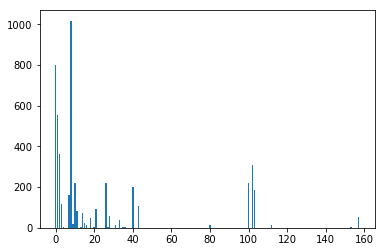

In [35]:
%matplotlib inline
import matplotlib.pyplot as plt
num = counter.keys()
value = counter.values()
plt.bar(num,value)

In [22]:
def filter_file(path,filter_contents):
    filter_file = open(path,'r')
    for line in filter_file.readlines():
        if line == None:
            break
        elif line == '':
            continue
        else:
            line = line.replace('\r','')
            line = line.replace('\n','')
            filter_contents[line] = line
    filter_file.close()
    
def vocabSet(path,vocabset):
    dirs = os.listdir(path)
    print(len(dirs))
    count = 0
    for dir in dirs:
        #print dir
        vocabset[dir] = Vocab(path + '/'+ dir)
        count +=1 
        #print count

def get_max_index(tree, max_index):
    max = int(max_index)
    if int(tree.index) > max:
        max = int(tree.index)
    for i in xrange(tree.num_children):
        max = get_max_index(tree.children[i],max)
    return max

def get_node(tree, index):
    node = tree
    if int(tree.index) == int(index):
        return node
    else:
        for i in xrange(tree.num_children):
            node = get_node(tree.children[i], index)
            if int(node.index) == int(index):
                return node
            else:
                node = tree
                continue
        return node
    
def create_newTree(root,class_word):
    newNode = Tree()
    max_index = get_max_index(root,0)
    newNode.index = max_index + 1
    newNode.word = class_word
    newNode.gold_label = None
    newNode.node = None
    if root.node != -1:
        parentNode = get_node(root,root.node)
        parentNode.add_child(newNode)
        return root
    else:
        holeNode = Tree()
        holeNode.word = 'hole'
        holeNode.node = None
        holeNode.gold_label = None
        holeNode.index = max_index + 2
        newNode.add_child(holeNode)
        newNode.add_child(root)
        newNode.gold_label = root.gold_label
        newNode.node = newNode.index
        root.gold_label = None
        root.node = None
        return newNode

In [23]:
filter_contents = {}
filter_file('data/filter.txt',filter_contents)
print('filter completed!')
vocabset = {}
vocabSet('data/classVocabulary',vocabset)

#checkpoint_path = 'data/method_model_500/treelstm_method_model_500-9'
checkpoint_path = 'data/class_model_another_500/treelstm_class_model_more_500-4'
checkpoint_path2 = 'data/treelstm_method_model_500-9'
dev_data = data_set
len(dev_data)

filter completed!
42174


30000

In [57]:
correct

262

In [24]:
def softmax(x):
    return np.exp(x)/np.sum(np.exp(x),axis=0)

In [26]:
import copy

tf.reset_default_graph()
learning_rate = 0.01
keep_prob_now = 0.75
batch_size = 256
epoch = 10
num_gpus = 1
embedding_learning_rate_factor = 0.1
keep_prob_ph = tf.placeholder_with_default(1.0,[])

In [27]:
# 合并2，预测输入tree的class及具体method名称
def test_prediction2(batch,number):
    print('Create the model...')
    
    tf.reset_default_graph()
    word_embedding = create_embedding(weight_matrix=weight_matrix)
    compiler, metrics = create_model(word_embedding=word_embedding,NUM_CLASS=42237,lstm_num_units=150,keep_prob=keep_prob_now,vocab=vocab)

    saver = tf.train.Saver()

    print('class prediction...')
    with tf.Session() as sess:

        saver.restore(sess,checkpoint_path)

        class_output = sess.run(compiler.output_tensors,compiler.build_feed_dict(batch))
        logits = class_output[2]

        class_top_5 = sess.run(tf.nn.top_k(logits,5))

        # top-5的编号[batchsize,5]
        class_top_5_indices = class_top_5.indices

        output_class = []
        batch_newTrees = []
        # batchsize维度
        for i in range(len(class_top_5_indices)):
            # top-5维度
            words = []
            probs = []
            newTrees = []
            newTree_is_stop = []
            for index in class_top_5_indices[i]:
                # 取出第i个输入得到的第index个word和prob
                word = vocab2.token(index)
                prob = logits[i][index]
                words.append(word)
                probs.append(prob)

                copy_tree = copy.deepcopy(batch[i])
                newTree = create_newTree(copy_tree,word)
                newTrees.append(newTree)

                if filter_contents.get(word) == None and word != '--':
                    newTree_is_stop.append(0)            
                else:
                    newTree_is_stop.append(1)

            # 对top-5的输出执行softmax操作
            probs = softmax(probs)

            # output_class是class判断模型的输出，格式为(batchsize,(newTree,prob,is_stop)*5)
            output_class.extend(zip(newTrees,probs,words,newTree_is_stop))
            batch_newTrees.extend(newTrees)

        # 输出batch_size的class预测结果
        #print(output_class)

        print('prediction completed!')      

    tf.reset_default_graph()

    print('Create method model')

    word_embedding = create_embedding(weight_matrix=weight_matrix)
    compiler2, metrics2 = create_model(word_embedding=word_embedding,NUM_CLASS=1611,
                                     lstm_num_units=150,keep_prob=keep_prob_now,vocab=vocab)
    saver2 = tf.train.Saver()    

    print('method predeciton...')
    with tf.Session() as sess:

        saver2.restore(sess,checkpoint_path2)

        correct = 0

        # 调用method模型
        method_tuple_top_5 = []

        # 批量获得method模型输出
        method_output = sess.run(compiler2.output_tensors,compiler2.build_feed_dict(batch_newTrees))

        # 获得method预测，格式为[n*5,1611]
        method_logits = method_output[2]

        # 批量获得top-5的概率和编号，格式为[n*5,5]
        method_top_5 = sess.run(tf.nn.top_k(method_logits,5))
        method_top_5_values = sess.run(tf.nn.softmax(method_top_5.values.tolist()))
        method_top_5_indices = method_top_5.indices   

        #print(method_top_5_values)
        #print(method_top_5_indices)

        # 对n*5条tuple判断和计算综合概率
        batch_method_list = []
        for num,(newTree,prob,class_word,is_stop) in enumerate(output_class):
            method_list = []
            # 对class是非终止word的情况，计算class和method的综合概率
            if is_stop == 0:
                methodVocab = vocabset[class_word+'.txt']
                method_list_temp = [methodVocab.token(index) for index in method_top_5_indices[num]]

                method_prob_temp = [prob*method_prob for method_prob in method_top_5_values[num]]
                method_list.extend(zip(method_list_temp,method_prob_temp))
                #if i == 1:
                #    print(len(method_list_temp))
                #    print(len(method_list))

            # 对class是中止word的情况，直接使用classword和prob
            else:
                method_list.append((class_word,prob))
            # 将每个tuple的判断和概率添加到list中，格式为[n*5,5 or 1]
            batch_method_list.append(method_list)

        ans_method_prob = []
        for i in range(len(batch)):
            method_prob_each_tree = []
            pred_list = batch_method_list[i*5:(i+1)*5]
            for each_list in pred_list:
                method_prob_each_tree.extend(each_list)
            method_list_top_5 = sorted(method_prob_each_tree,key=lambda x:x[1],reverse=True)[:5]
            ans_method_prob.append(method_list_top_5)
            method_names = [name for name,method_prob in method_list_top_5]
            if predictions[i+512*number] in method_names[:1]:
                correct+=1
                
        print('correct: ',correct)
        return correct,len(batch)


In [28]:
# 合并3，预测输入tree的class及method编号
def test_prediction3(batch,number):
    print('Create the model...')
    
    tf.reset_default_graph()
    word_embedding = create_embedding(weight_matrix=weight_matrix)
    compiler, metrics = create_model(word_embedding=word_embedding,NUM_CLASS=42237,lstm_num_units=150,keep_prob=keep_prob_now,vocab=vocab)

    saver = tf.train.Saver()

    print('class prediction...')
    with tf.Session() as sess:

        saver.restore(sess,checkpoint_path)

        class_output = sess.run(compiler.output_tensors,compiler.build_feed_dict(batch))
        logits = class_output[2]

        class_top_5 = sess.run(tf.nn.top_k(logits,5))

        # top-5的编号[batchsize,5]
        class_top_5_indices = class_top_5.indices

        output_class = []
        batch_newTrees = []
        # batchsize维度
        for i in range(len(class_top_5_indices)):
            # top-5维度
            words = []
            nums = []
            probs = []
            newTrees = []
            newTree_is_stop = []
            for index in class_top_5_indices[i]:
                # 取出第i个输入得到的第index个word和prob
                word = vocab2.token(index)
                num = index
                prob = logits[i][index]
                words.append(word)
                probs.append(prob)
                nums.append(num)

                copy_tree = copy.deepcopy(batch[i])
                newTree = create_newTree(copy_tree,word)
                newTrees.append(newTree)

                if filter_contents.get(word) == None and word != '--':
                    newTree_is_stop.append(0)            
                else:
                    newTree_is_stop.append(1)

            # 对top-5的输出执行softmax操作
            probs = softmax(probs)

            # output_class是class判断模型的输出，格式为(batchsize,(newTree,prob,is_stop)*5)
            output_class.extend(zip(newTrees,probs,words,nums,newTree_is_stop))
            batch_newTrees.extend(newTrees)

        # 输出batch_size的class预测结果
        #print(output_class)

        print('prediction completed!')      

    tf.reset_default_graph()

    print('Create method model')

    word_embedding = create_embedding(weight_matrix=weight_matrix)
    compiler2, metrics2 = create_model(word_embedding=word_embedding,NUM_CLASS=1611,
                                     lstm_num_units=150,keep_prob=keep_prob_now,vocab=vocab)
    saver2 = tf.train.Saver()    

    print('method predeciton...')
    with tf.Session() as sess:

        saver2.restore(sess,checkpoint_path2)

        correct = {'top-1':0,'top-2':0,'top-3':0,'top-4':0,'top-5':0,'top-10':0}

        # 调用method模型
        method_tuple_top_5 = []

        # 批量获得method模型输出
        method_output = sess.run(compiler2.output_tensors,compiler2.build_feed_dict(batch_newTrees))

        # 获得method预测，格式为[n*5,1611]
        method_logits = method_output[2]

        # 批量获得top-5的概率和编号，格式为[n*5,5]
        method_top_5 = sess.run(tf.nn.top_k(method_logits,5))
        method_top_5_values = sess.run(tf.nn.softmax(method_top_5.values.tolist()))
        method_top_5_indices = method_top_5.indices   

        #print(method_top_5_values)
        #print(method_top_5_indices)

        # 对n*5条tuple判断和计算综合概率
        batch_method_list = []
        for num,(newTree,prob,class_word,class_num,is_stop) in enumerate(output_class):
            method_list = []
            # 对class是非终止word的情况，计算class和method的综合概率
            if is_stop == 0:
                #methodVocab = vocabset[class_word+'.txt']
                method_list_temp = [index for index in method_top_5_indices[num]]  
                method_prob_temp = [prob*method_prob for method_prob in method_top_5_values[num]]
                method_list.extend(zip(method_list_temp,method_prob_temp))
                #if i == 1:
                #    print(len(method_list_temp))
                #    print(len(method_list))

            # 对class是中止word的情况，直接使用classword和prob
            else:
                method_list.append((class_num,prob))
            # 将每个tuple的判断和概率添加到list中，格式为[n*5,5 or 1]
            batch_method_list.append(method_list)

        #print(batch_method_list)
        ans_method_prob = []
        for i in range(len(batch)):
            method_prob_each_tree = []
            pred_list = batch_method_list[i*5:(i+1)*5]
            for each_list in pred_list:
                method_prob_each_tree.extend(each_list)
            method_list_top_10 = sorted(method_prob_each_tree,key=lambda x:x[1],reverse=True)[:10]
            ans_method_prob.append(method_list_top_10)
            method_nums = [num for num,method_prob in method_list_top_10]
            if batch[i].gold_label in method_nums[:1]:
                correct['top-1'] += 1
            if batch[i].gold_label in method_nums[:2]:
                correct['top-2'] += 1
            if batch[i].gold_label in method_nums[:3]:
                correct['top-3'] += 1
            if batch[i].gold_label in method_nums[:4]:
                correct['top-4'] += 1
            if batch[i].gold_label in method_nums[:5]:
                correct['top-5'] += 1
            if batch[i].gold_label in method_nums[:10]:
                correct['top-10'] += 1
            #print((batch[i].gold_label,method_nums[:1]))
                
        print('top-1: %d, top-2: %d, top-3: %d, top-4: %d, top-5: %d, top-10: %d' % (correct['top-1'],correct['top-2'],
                                                                                     correct['top-3'],correct['top-4'],
                                                                                     correct['top-5'],correct['top-10']))
        return correct,len(batch)



In [49]:
from __future__ import print_function
correct_all = {'top-1':0,'top-2':0,'top-3':0,'top-4':0,'top-5':0,'top-10':0}
num_all = 0
for num,batch in enumerate(get_batch(data_set,512)):
    correct,num = test_prediction3(batch,num)
    correct_all['top-1'] += correct['top-1']
    correct_all['top-2'] += correct['top-2']
    correct_all['top-3'] += correct['top-3']
    correct_all['top-4'] += correct['top-4']
    correct_all['top-5'] += correct['top-5']
    correct_all['top-10'] += correct['top-10']
    num_all+=num

print('top-1: %.2f%%, top-2: %.2f%%, top-3: %.2f%%, top-4: %.2f%%, top-5: %.2f%%, top-10: %.2f%%' % 
      (correct_all['top-1']/float(num_all)*100,correct_all['top-2']/float(num_all)*100,correct_all['top-3']/float(num_all)*100,
      correct_all['top-4']/float(num_all)*100,correct_all['top-5']/float(num_all)*100,correct_all['top-10']/float(num_all)*100))

Create the model...
Create completed!
class prediction...
prediction completed!
Create method model
Create completed!
method predeciton...
top-1: 255, top-2: 320, top-3: 363, top-4: 389, top-5: 401, top-10: 412
Create the model...
Create completed!
class prediction...
prediction completed!
Create method model
Create completed!
method predeciton...
top-1: 221, top-2: 270, top-3: 305, top-4: 338, top-5: 358, top-10: 390
Create the model...
Create completed!
class prediction...
prediction completed!
Create method model
Create completed!
method predeciton...
top-1: 187, top-2: 240, top-3: 277, top-4: 307, top-5: 334, top-10: 368
Create the model...
Create completed!
class prediction...
prediction completed!
Create method model
Create completed!
method predeciton...
top-1: 300, top-2: 379, top-3: 426, top-4: 439, top-5: 449, top-10: 480
Create the model...
Create completed!
class prediction...
prediction completed!
Create method model
Create completed!
method predeciton...
top-1: 271, top-2